# Multimodal Sentiment Analysis

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Navigate to the MELD Dataset

In [2]:
import os

meld_path = '/content/drive/MyDrive/MELD.Raw'
os.listdir(meld_path)

['dev_sent_emo.csv',
 'test_sent_emo.csv',
 'README.txt',
 '._train_splits',
 'MELD.Features.Models.tar.gz',
 'test',
 'dev',
 'train',
 'train_sent_emo.csv',
 'train_audio',
 'train_audio_features.npy',
 'train_audio_features_metadata.json',
 'dev_audio',
 'test_audio',
 'train_text_embeddings.npy',
 'dev_text_embeddings.npy',
 'test_text_embeddings.npy',
 'dev_video_features.npy',
 'test_video_features.npy',
 'train_video_features.npy',
 'dev_audio_features.npy',
 'dev_audio_features_metadata.json',
 'test_audio_features.npy',
 'test_audio_features_metadata.json']



##  Pipeline Plan (Overview)

We’ll process each modality:

| Modality  | Input         | Feature Extraction          | Output  |
| --------- | ------------- | --------------------------- | ------- |
| **Text**  | Utterance     | BERT / GloVe embeddings     | Vectors |
| **Audio** | `.wav` files  | MFCCs or OpenSMILE features | Vectors |
| **Video** | `.mp4` frames | CNN (e.g., ResNet) features | Vectors |

Then we'll **fuse** all three features and feed them into a classification model (e.g., MLP, LSTM, etc.).




Extract Audio, Video, and Text Paths

In [4]:
import pandas as pd

train_df = pd.read_csv(os.path.join(meld_path, 'train_sent_emo.csv'))
train_df.head()

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,also I was the point person on my company’s tr...,Chandler,neutral,neutral,0,0,8,21,"00:16:16,059","00:16:21,731"
1,2,You must’ve had your hands full.,The Interviewer,neutral,neutral,0,1,8,21,"00:16:21,940","00:16:23,442"
2,3,That I did. That I did.,Chandler,neutral,neutral,0,2,8,21,"00:16:23,442","00:16:26,389"
3,4,So let’s talk a little bit about your duties.,The Interviewer,neutral,neutral,0,3,8,21,"00:16:26,820","00:16:29,572"
4,5,My duties? All right.,Chandler,surprise,positive,0,4,8,21,"00:16:34,452","00:16:40,917"


In [5]:
dev_df = pd.read_csv(os.path.join(meld_path, 'dev_sent_emo.csv'))
dev_df.head()

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,"Oh my God, hes lost it. Hes totally lost it.",Phoebe,sadness,negative,0,0,4,7,"00:20:57,256","00:21:00,049"
1,2,What?,Monica,surprise,negative,0,1,4,7,"00:21:01,927","00:21:03,261"
2,3,"Or! Or, we could go to the bank, close our acc...",Ross,neutral,neutral,1,0,4,4,"00:12:24,660","00:12:30,915"
3,4,Youre a genius!,Chandler,joy,positive,1,1,4,4,"00:12:32,334","00:12:33,960"
4,5,"Aww, man, now we wont be bank buddies!",Joey,sadness,negative,1,2,4,4,"00:12:34,211","00:12:37,505"


In [6]:
test_df = pd.read_csv(os.path.join(meld_path, 'test_sent_emo.csv'))
test_df.head()

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,Why do all youre coffee mugs have numbers on ...,Mark,surprise,positive,0,0,3,19,"00:14:38,127","00:14:40,378"
1,2,Oh. Thats so Monica can keep track. That way ...,Rachel,anger,negative,0,1,3,19,"00:14:40,629","00:14:47,385"
2,3,Y'know what?,Rachel,neutral,neutral,0,2,3,19,"00:14:56,353","00:14:57,520"
3,19,"Come on, Lydia, you can do it.",Joey,neutral,neutral,1,0,1,23,"0:10:44,769","0:10:46,146"
4,20,Push!,Joey,joy,positive,1,1,1,23,"0:10:46,146","0:10:46,833"


In [7]:
# Example: Get full audio path for a given utterance
def get_audio_path(split, Dialogue_ID, Utterance_ID):
    return os.path.join(meld_path, split, 'wav', f'dia{Dialogue_ID}_utt{Utterance_ID}.wav')

### Text Pipeline

preview the train set

In [7]:
train_df[['Utterance', 'Emotion', 'Sentiment']].head()

,Utterance,Emotion,Sentiment
0,also I was the point person on my company’s tr...,neutral,neutral
1,You must’ve had your hands full.,neutral,neutral
2,That I did. That I did.,neutral,neutral
3,So let’s talk a little bit about your duties.,neutral,neutral
4,My duties? All right.,surprise,positive


preview the dev set

In [8]:
dev_df[['Utterance', 'Emotion', 'Sentiment']].head()

,Utterance,Emotion,Sentiment
0,"Oh my God, hes lost it. Hes totally lost it.",sadness,negative
1,What?,surprise,negative
2,"Or! Or, we could go to the bank, close our acc...",neutral,neutral
3,Youre a genius!,joy,positive
4,"Aww, man, now we wont be bank buddies!",sadness,negative


preview the test set

In [9]:
test_df[['Utterance', 'Emotion', 'Sentiment']].head()

,Utterance,Emotion,Sentiment
0,Why do all youre coffee mugs have numbers on ...,surprise,positive
1,Oh. Thats so Monica can keep track. That way ...,anger,negative
2,Y'know what?,neutral,neutral
3,"Come on, Lydia, you can do it.",neutral,neutral
4,Push!,joy,positive


Install and load BERT tokenizer and model

We’ll use bert-base-uncased from Hugging Face.

In [11]:
!pip install transformers --quiet

In [10]:
from transformers import BertTokenizer, BertModel
import torch

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Define function to get BERT embeddings

In [11]:
def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=128)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()  # Mean pooling

Apply to a sample

In [12]:
sample_text_train = train_df['Utterance'][0]
embedding = get_bert_embedding(sample_text_train)
print("Shape of embedding:", embedding.shape)

Shape of embedding: (768,)


In [13]:
sample_text_dev = dev_df['Utterance'][0]
embedding = get_bert_embedding(sample_text_dev)
print("Shape of embedding:", embedding.shape)

Shape of embedding: (768,)


In [14]:
sample_text_test = test_df['Utterance'][0]
embedding = get_bert_embedding(sample_text_test)
print("Shape of embedding:", embedding.shape)

Shape of embedding: (768,)


Extract Text Embeddings for Entire Dataset

In [15]:
from tqdm import tqdm
import numpy as np

def embed_text_column(df, text_col='Utterance'):
    embeddings = []
    for text in tqdm(df[text_col], desc="Embedding texts"):
        embedding = get_bert_embedding(text)
        embeddings.append(embedding)
    return np.array(embeddings)

train

In [16]:
train_embeddings = embed_text_column(train_df)
train_embeddings.shape  # Should be (num_samples, 768)

Embedding texts: 100%|██████████| 9989/9989 [19:21<00:00,  8.60it/s]


(9989, 768)

In [17]:
np.save('/content/drive/MyDrive/MELD.Raw/train_text_embeddings.npy', train_embeddings)

dev

In [18]:
dev_embeddings = embed_text_column(dev_df)
dev_embeddings.shape  # Should be (num_samples, 768)

Embedding texts: 100%|██████████| 1109/1109 [02:04<00:00,  8.90it/s]


(1109, 768)

In [19]:
np.save('/content/drive/MyDrive/MELD.Raw/dev_text_embeddings.npy', dev_embeddings)

test

In [20]:
test_embeddings = embed_text_column(test_df)
test_embeddings.shape  # Should be (num_samples, 768)

Embedding texts: 100%|██████████| 2610/2610 [04:55<00:00,  8.83it/s]


(2610, 768)

In [21]:
np.save('/content/drive/MyDrive/MELD.Raw/test_text_embeddings.npy', test_embeddings)

### Audio pipeline

### Extracting Audio Features from MELD .wav Files

We'll extract audio features (like MFCCs or deep embeddings) from each audio clip. These features will be used alongside the text and (later) video features.

Install Required Libraries

In [ ]:
!pip install librosa soundfile --quiet

In [ ]:
!pip install moviepy --quiet

Import Dependencies

In [ ]:
import librosa
import numpy as np
import os
from tqdm import tqdm

Extract Audio from .mp4 and Save as .wav

train

In [ ]:
import os
from moviepy.editor import VideoFileClip

def extract_audio_from_video(video_path, output_audio_path):
    try:
        video_clip = VideoFileClip(video_path)
        audio = video_clip.audio
        audio.write_audiofile(output_audio_path, codec='pcm_s16le')
        audio.close()
        video_clip.close()
    except Exception as e:
        print(f"Failed to extract from {video_path}: {e}")

video_dir = '/content/drive/MyDrive/MELD.Raw/train/train_splits'
output_audio_dir = '/content/drive/MyDrive/MELD.Raw/train_audio'
os.makedirs(output_audio_dir, exist_ok=True)

for file_name in tqdm(os.listdir(video_dir)):
    if file_name.endswith('.mp4'):
        video_path = os.path.join(video_dir, file_name)
        output_path = os.path.join(output_audio_dir, file_name.replace('.mp4', '.wav'))
        extract_audio_from_video(video_path, output_path)

  0%|          | 0/10054 [00:00<?, ?it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt2.wav



  0%|          | 1/10054 [00:00<2:08:17,  1.31it/s]

MoviePy - Done.


  0%|          | 1/10054 [00:01<2:08:17,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt4.wav



  0%|          | 2/10054 [00:01<1:58:48,  1.41it/s]

MoviePy - Done.


  0%|          | 2/10054 [00:02<1:58:48,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt5.wav



  0%|          | 2/10054 [00:02<1:58:48,  1.41it/s]

MoviePy - Done.


  0%|          | 3/10054 [00:02<2:12:35,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt6.wav



  0%|          | 3/10054 [00:03<2:12:35,  1.26it/s]

MoviePy - Done.


  0%|          | 4/10054 [00:03<2:19:12,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt14.wav



  0%|          | 5/10054 [00:03<2:03:33,  1.36it/s]

MoviePy - Done.


  0%|          | 5/10054 [00:04<2:03:33,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt0.wav



  0%|          | 6/10054 [00:04<1:38:02,  1.71it/s]

MoviePy - Done.


  0%|          | 6/10054 [00:04<1:38:02,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt1.wav



  0%|          | 6/10054 [00:04<1:38:02,  1.71it/s]

MoviePy - Done.


  0%|          | 7/10054 [00:05<1:47:49,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt1.wav



  0%|          | 8/10054 [00:05<1:39:37,  1.68it/s]

MoviePy - Done.


  0%|          | 8/10054 [00:05<1:39:37,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt0.wav



  0%|          | 9/10054 [00:05<1:37:52,  1.71it/s]

MoviePy - Done.


  0%|          | 9/10054 [00:06<1:37:52,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt8.wav



  0%|          | 10/10054 [00:06<1:40:36,  1.66it/s]

MoviePy - Done.


  0%|          | 10/10054 [00:07<1:40:36,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt7.wav



  0%|          | 11/10054 [00:07<2:22:16,  1.18it/s]

MoviePy - Done.


  0%|          | 11/10054 [00:08<2:22:16,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt0.wav



  0%|          | 12/10054 [00:09<2:42:26,  1.03it/s]

MoviePy - Done.


  0%|          | 12/10054 [00:10<2:42:26,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt9.wav



  0%|          | 13/10054 [00:10<3:02:44,  1.09s/it]

MoviePy - Done.


  0%|          | 13/10054 [00:10<3:02:44,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt4.wav



  0%|          | 14/10054 [00:11<2:39:27,  1.05it/s]

MoviePy - Done.


  0%|          | 14/10054 [00:11<2:39:27,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt8.wav



  0%|          | 15/10054 [00:12<2:58:07,  1.06s/it]

MoviePy - Done.


  0%|          | 15/10054 [00:13<2:58:07,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt2.wav



  0%|          | 16/10054 [00:14<3:33:34,  1.28s/it]

MoviePy - Done.


  0%|          | 16/10054 [00:15<3:33:34,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt3.wav



  0%|          | 17/10054 [00:15<3:28:45,  1.25s/it]

MoviePy - Done.


  0%|          | 17/10054 [00:16<3:28:45,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt3.wav



  0%|          | 18/10054 [00:17<3:47:38,  1.36s/it]

MoviePy - Done.


  0%|          | 18/10054 [00:18<3:47:38,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt13.wav



  0%|          | 18/10054 [00:18<3:47:38,  1.36s/it]

MoviePy - Done.


  0%|          | 19/10054 [00:20<4:22:42,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt8.wav



  0%|          | 20/10054 [00:20<4:24:55,  1.58s/it]

MoviePy - Done.


  0%|          | 20/10054 [00:21<4:24:55,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt6.wav



  0%|          | 21/10054 [00:22<4:15:12,  1.53s/it]

MoviePy - Done.


  0%|          | 21/10054 [00:22<4:15:12,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt2.wav



  0%|          | 22/10054 [00:23<3:55:15,  1.41s/it]

MoviePy - Done.


  0%|          | 22/10054 [00:24<3:55:15,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt5.wav



  0%|          | 23/10054 [00:24<4:02:48,  1.45s/it]

MoviePy - Done.


  0%|          | 23/10054 [00:25<4:02:48,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt8.wav



  0%|          | 24/10054 [00:26<3:56:28,  1.41s/it]

MoviePy - Done.


  0%|          | 24/10054 [00:26<3:56:28,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt1.wav



  0%|          | 25/10054 [00:26<3:26:28,  1.24s/it]

MoviePy - Done.


  0%|          | 25/10054 [00:27<3:26:28,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt7.wav



  0%|          | 26/10054 [00:27<2:56:56,  1.06s/it]

MoviePy - Done.


  0%|          | 26/10054 [00:28<2:56:56,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt13.wav



  0%|          | 27/10054 [00:28<2:47:59,  1.01s/it]

MoviePy - Done.


  0%|          | 27/10054 [00:29<2:47:59,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt3.wav



  0%|          | 28/10054 [00:29<2:47:49,  1.00s/it]

MoviePy - Done.


  0%|          | 28/10054 [00:30<2:47:49,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt4.wav



  0%|          | 29/10054 [00:30<2:37:41,  1.06it/s]

MoviePy - Done.


  0%|          | 29/10054 [00:30<2:37:41,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt15.wav



  0%|          | 30/10054 [00:31<2:26:51,  1.14it/s]

MoviePy - Done.


  0%|          | 30/10054 [00:31<2:26:51,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt4.wav



  0%|          | 31/10054 [00:31<2:20:09,  1.19it/s]

MoviePy - Done.


  0%|          | 31/10054 [00:32<2:20:09,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt7.wav



  0%|          | 32/10054 [00:32<2:23:33,  1.16it/s]

MoviePy - Done.


  0%|          | 32/10054 [00:33<2:23:33,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt8.wav



  0%|          | 33/10054 [00:33<2:29:57,  1.11it/s]

MoviePy - Done.


  0%|          | 33/10054 [00:34<2:29:57,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt14.wav



  0%|          | 34/10054 [00:34<2:37:30,  1.06it/s]

MoviePy - Done.


  0%|          | 34/10054 [00:35<2:37:30,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt8.wav



  0%|          | 35/10054 [00:35<2:43:32,  1.02it/s]

MoviePy - Done.


  0%|          | 35/10054 [00:36<2:43:32,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt7.wav



  0%|          | 36/10054 [00:36<2:51:26,  1.03s/it]

MoviePy - Done.


  0%|          | 36/10054 [00:37<2:51:26,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt7.wav



  0%|          | 37/10054 [00:38<3:09:39,  1.14s/it]

MoviePy - Done.


  0%|          | 37/10054 [00:38<3:09:39,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt5.wav



  0%|          | 38/10054 [00:39<2:49:20,  1.01s/it]

MoviePy - Done.


  0%|          | 38/10054 [00:39<2:49:20,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt0.wav



  0%|          | 39/10054 [00:39<2:41:15,  1.04it/s]

MoviePy - Done.


  0%|          | 39/10054 [00:40<2:41:15,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt5.wav



  0%|          | 40/10054 [00:40<2:34:34,  1.08it/s]

MoviePy - Done.


  0%|          | 40/10054 [00:41<2:34:34,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt17.wav



  0%|          | 41/10054 [00:41<2:28:05,  1.13it/s]

MoviePy - Done.


  0%|          | 41/10054 [00:42<2:28:05,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt2.wav



  0%|          | 42/10054 [00:42<2:27:45,  1.13it/s]

MoviePy - Done.


  0%|          | 42/10054 [00:42<2:27:45,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt8.wav



  0%|          | 43/10054 [00:43<2:28:24,  1.12it/s]

MoviePy - Done.


  0%|          | 43/10054 [00:43<2:28:24,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt6.wav



  0%|          | 44/10054 [00:44<2:17:39,  1.21it/s]

MoviePy - Done.


  0%|          | 44/10054 [00:44<2:17:39,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt1.wav



  0%|          | 45/10054 [00:44<2:08:27,  1.30it/s]

MoviePy - Done.


  0%|          | 45/10054 [00:45<2:08:27,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt9.wav



  0%|          | 46/10054 [00:45<2:06:20,  1.32it/s]

MoviePy - Done.


  0%|          | 46/10054 [00:45<2:06:20,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt16.wav



  0%|          | 47/10054 [00:46<2:06:22,  1.32it/s]

MoviePy - Done.


  0%|          | 47/10054 [00:46<2:06:22,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt6.wav



  0%|          | 48/10054 [00:47<2:28:12,  1.13it/s]

MoviePy - Done.


  0%|          | 48/10054 [00:47<2:28:12,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt3.wav



  0%|          | 49/10054 [00:48<2:22:48,  1.17it/s]

MoviePy - Done.


  0%|          | 49/10054 [00:48<2:22:48,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt7.wav



  0%|          | 50/10054 [00:49<2:44:38,  1.01it/s]

MoviePy - Done.


  0%|          | 50/10054 [00:50<2:44:38,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt20.wav



  1%|          | 51/10054 [00:50<2:41:36,  1.03it/s]

MoviePy - Done.


  1%|          | 51/10054 [00:51<2:41:36,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt7.wav



  1%|          | 52/10054 [00:51<2:45:01,  1.01it/s]

MoviePy - Done.


  1%|          | 52/10054 [00:52<2:45:01,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt2.wav



  1%|          | 53/10054 [00:52<2:49:31,  1.02s/it]

MoviePy - Done.


  1%|          | 53/10054 [00:52<2:49:31,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt2.wav



  1%|          | 54/10054 [00:53<2:42:23,  1.03it/s]

MoviePy - Done.


  1%|          | 54/10054 [00:53<2:42:23,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt3.wav



  1%|          | 55/10054 [00:54<2:33:12,  1.09it/s]

MoviePy - Done.


  1%|          | 55/10054 [00:54<2:33:12,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt19.wav



  1%|          | 56/10054 [00:54<2:31:13,  1.10it/s]

MoviePy - Done.


  1%|          | 56/10054 [00:55<2:31:13,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt14.wav



  1%|          | 57/10054 [00:55<2:29:11,  1.12it/s]

MoviePy - Done.


  1%|          | 57/10054 [00:56<2:29:11,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt0.wav



  1%|          | 58/10054 [00:56<2:16:57,  1.22it/s]

MoviePy - Done.


  1%|          | 58/10054 [00:57<2:16:57,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt3.wav



  1%|          | 59/10054 [00:57<2:19:55,  1.19it/s]

MoviePy - Done.


  1%|          | 59/10054 [00:58<2:19:55,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt6.wav



  1%|          | 60/10054 [00:58<2:29:09,  1.12it/s]

MoviePy - Done.


  1%|          | 60/10054 [00:58<2:29:09,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt12 (1).wav



  1%|          | 61/10054 [00:59<2:25:52,  1.14it/s]

MoviePy - Done.


  1%|          | 61/10054 [00:59<2:25:52,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt15.wav



  1%|          | 62/10054 [01:00<2:23:00,  1.16it/s]

MoviePy - Done.


  1%|          | 62/10054 [01:00<2:23:00,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt1.wav



  1%|          | 63/10054 [01:00<2:21:10,  1.18it/s]

MoviePy - Done.


  1%|          | 63/10054 [01:01<2:21:10,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt19.wav



  1%|          | 64/10054 [01:01<2:26:52,  1.13it/s]

MoviePy - Done.


  1%|          | 64/10054 [01:02<2:26:52,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt13.wav



  1%|          | 65/10054 [01:02<2:19:15,  1.20it/s]

MoviePy - Done.


  1%|          | 65/10054 [01:03<2:19:15,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt1.wav



  1%|          | 66/10054 [01:03<2:39:12,  1.05it/s]

MoviePy - Done.


  1%|          | 66/10054 [01:04<2:39:12,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt16.wav



  1%|          | 67/10054 [01:04<2:32:46,  1.09it/s]

MoviePy - Done.


  1%|          | 67/10054 [01:05<2:32:46,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt13.wav



  1%|          | 68/10054 [01:05<2:31:10,  1.10it/s]

MoviePy - Done.


  1%|          | 68/10054 [01:06<2:31:10,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt18.wav



  1%|          | 69/10054 [01:06<2:39:36,  1.04it/s]

MoviePy - Done.


  1%|          | 69/10054 [01:07<2:39:36,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt14.wav



  1%|          | 70/10054 [01:07<2:31:32,  1.10it/s]

MoviePy - Done.


  1%|          | 70/10054 [01:07<2:31:32,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt6.wav



  1%|          | 71/10054 [01:08<2:26:47,  1.13it/s]

MoviePy - Done.


  1%|          | 71/10054 [01:08<2:26:47,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt5.wav



  1%|          | 72/10054 [01:09<2:25:44,  1.14it/s]

MoviePy - Done.


  1%|          | 72/10054 [01:09<2:25:44,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt1 (1).wav



  1%|          | 73/10054 [01:10<2:50:15,  1.02s/it]

MoviePy - Done.


  1%|          | 73/10054 [01:10<2:50:15,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt10.wav



  1%|          | 74/10054 [01:11<2:48:36,  1.01s/it]

MoviePy - Done.


  1%|          | 74/10054 [01:11<2:48:36,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt5.wav



  1%|          | 75/10054 [01:12<2:38:41,  1.05it/s]

MoviePy - Done.


  1%|          | 75/10054 [01:12<2:38:41,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt11.wav



  1%|          | 76/10054 [01:13<2:35:19,  1.07it/s]

MoviePy - Done.


  1%|          | 76/10054 [01:13<2:35:19,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia675_utt0.wav



  1%|          | 77/10054 [01:14<2:39:27,  1.04it/s]

MoviePy - Done.


  1%|          | 77/10054 [01:14<2:39:27,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt5.wav



  1%|          | 78/10054 [01:14<2:30:59,  1.10it/s]

MoviePy - Done.


  1%|          | 78/10054 [01:15<2:30:59,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt3.wav



  1%|          | 79/10054 [01:15<2:25:36,  1.14it/s]

MoviePy - Done.


  1%|          | 79/10054 [01:16<2:25:36,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt7.wav



  1%|          | 80/10054 [01:16<2:42:20,  1.02it/s]

MoviePy - Done.


  1%|          | 80/10054 [01:17<2:42:20,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt17.wav



  1%|          | 81/10054 [01:17<2:25:26,  1.14it/s]

MoviePy - Done.


  1%|          | 81/10054 [01:18<2:25:26,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt10.wav



  1%|          | 82/10054 [01:18<2:29:49,  1.11it/s]

MoviePy - Done.


  1%|          | 82/10054 [01:19<2:29:49,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt7.wav



  1%|          | 83/10054 [01:19<2:39:17,  1.04it/s]

MoviePy - Done.


  1%|          | 83/10054 [01:20<2:39:17,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt8.wav



  1%|          | 84/10054 [01:20<2:48:35,  1.01s/it]

MoviePy - Done.


  1%|          | 84/10054 [01:21<2:48:35,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt7.wav



  1%|          | 85/10054 [01:21<2:45:07,  1.01it/s]

MoviePy - Done.


  1%|          | 85/10054 [01:22<2:45:07,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt2.wav



  1%|          | 86/10054 [01:22<2:37:02,  1.06it/s]

MoviePy - Done.


  1%|          | 86/10054 [01:22<2:37:02,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia675_utt1.wav



  1%|          | 87/10054 [01:23<2:34:30,  1.08it/s]

MoviePy - Done.


  1%|          | 87/10054 [01:23<2:34:30,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt6.wav



  1%|          | 88/10054 [01:24<2:25:07,  1.14it/s]

MoviePy - Done.


  1%|          | 88/10054 [01:24<2:25:07,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt4.wav



  1%|          | 89/10054 [01:24<2:12:11,  1.26it/s]

MoviePy - Done.


  1%|          | 89/10054 [01:25<2:12:11,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt1.wav



  1%|          | 90/10054 [01:25<2:15:16,  1.23it/s]

MoviePy - Done.


  1%|          | 90/10054 [01:26<2:15:16,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt1.wav



  1%|          | 91/10054 [01:26<2:12:35,  1.25it/s]

MoviePy - Done.


  1%|          | 91/10054 [01:26<2:12:35,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt3.wav



  1%|          | 92/10054 [01:27<2:13:08,  1.25it/s]

MoviePy - Done.


  1%|          | 92/10054 [01:27<2:13:08,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt12.wav



  1%|          | 93/10054 [01:28<2:28:28,  1.12it/s]

MoviePy - Done.


  1%|          | 93/10054 [01:28<2:28:28,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt8.wav



  1%|          | 94/10054 [01:29<2:31:41,  1.09it/s]

MoviePy - Done.


  1%|          | 94/10054 [01:30<2:31:41,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt3.wav



  1%|          | 95/10054 [01:30<2:38:03,  1.05it/s]

MoviePy - Done.


  1%|          | 95/10054 [01:30<2:38:03,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt6.wav



  1%|          | 96/10054 [01:31<2:36:40,  1.06it/s]

MoviePy - Done.


  1%|          | 96/10054 [01:31<2:36:40,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt4.wav



  1%|          | 97/10054 [01:32<2:36:43,  1.06it/s]

MoviePy - Done.


  1%|          | 97/10054 [01:33<2:36:43,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt14.wav



  1%|          | 98/10054 [01:33<3:01:43,  1.10s/it]

MoviePy - Done.


  1%|          | 98/10054 [01:34<3:01:43,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt11.wav



  1%|          | 99/10054 [01:35<3:20:16,  1.21s/it]

MoviePy - Done.


  1%|          | 99/10054 [01:35<3:20:16,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt2.wav



  1%|          | 100/10054 [01:35<2:59:48,  1.08s/it]

MoviePy - Done.


  1%|          | 100/10054 [01:36<2:59:48,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt5.wav



  1%|          | 101/10054 [01:36<2:57:52,  1.07s/it]

MoviePy - Done.


  1%|          | 101/10054 [01:37<2:57:52,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt13.wav



  1%|          | 102/10054 [01:38<2:55:16,  1.06s/it]

MoviePy - Done.


  1%|          | 102/10054 [01:38<2:55:16,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt13.wav



  1%|          | 103/10054 [01:39<2:55:41,  1.06s/it]

MoviePy - Done.


  1%|          | 103/10054 [01:39<2:55:41,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt4.wav



  1%|          | 104/10054 [01:39<2:43:39,  1.01it/s]

MoviePy - Done.


  1%|          | 104/10054 [01:40<2:43:39,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt7.wav



  1%|          | 105/10054 [01:40<2:31:29,  1.09it/s]

MoviePy - Done.


  1%|          | 105/10054 [01:41<2:31:29,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt11.wav



  1%|          | 106/10054 [01:41<2:20:45,  1.18it/s]

MoviePy - Done.


  1%|          | 106/10054 [01:41<2:20:45,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt2.wav



  1%|          | 107/10054 [01:42<2:15:45,  1.22it/s]

MoviePy - Done.


  1%|          | 107/10054 [01:42<2:15:45,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt9.wav



  1%|          | 108/10054 [01:43<2:32:25,  1.09it/s]

MoviePy - Done.


  1%|          | 108/10054 [01:43<2:32:25,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt12.wav



  1%|          | 109/10054 [01:44<2:30:51,  1.10it/s]

MoviePy - Done.


  1%|          | 109/10054 [01:44<2:30:51,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt15.wav



  1%|          | 110/10054 [01:44<2:25:20,  1.14it/s]

MoviePy - Done.


  1%|          | 110/10054 [01:45<2:25:20,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt10.wav



  1%|          | 111/10054 [01:46<2:35:06,  1.07it/s]

MoviePy - Done.


  1%|          | 111/10054 [01:46<2:35:06,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt2.wav



  1%|          | 112/10054 [01:47<3:00:40,  1.09s/it]

MoviePy - Done.


  1%|          | 112/10054 [01:48<3:00:40,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt5.wav



  1%|          | 113/10054 [01:48<2:57:18,  1.07s/it]

MoviePy - Done.


  1%|          | 113/10054 [01:48<2:57:18,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt6.wav



  1%|          | 114/10054 [01:49<2:55:39,  1.06s/it]

MoviePy - Done.


  1%|          | 114/10054 [01:49<2:55:39,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt0.wav



  1%|          | 115/10054 [01:50<2:34:58,  1.07it/s]

MoviePy - Done.


  1%|          | 115/10054 [01:50<2:34:58,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt4.wav



  1%|          | 116/10054 [01:50<2:26:54,  1.13it/s]

MoviePy - Done.


  1%|          | 116/10054 [01:51<2:26:54,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt5.wav



  1%|          | 117/10054 [01:51<2:28:41,  1.11it/s]

MoviePy - Done.


  1%|          | 117/10054 [01:52<2:28:41,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt5.wav



  1%|          | 118/10054 [01:52<2:27:49,  1.12it/s]

MoviePy - Done.


  1%|          | 118/10054 [01:53<2:27:49,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt12.wav



  1%|          | 119/10054 [01:53<2:18:09,  1.20it/s]

MoviePy - Done.


  1%|          | 119/10054 [01:53<2:18:09,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt14.wav



  1%|          | 120/10054 [01:54<2:13:07,  1.24it/s]

MoviePy - Done.


  1%|          | 120/10054 [01:54<2:13:07,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt13.wav



  1%|          | 121/10054 [01:56<3:13:18,  1.17s/it]

MoviePy - Done.


  1%|          | 121/10054 [01:57<3:13:18,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt4.wav



  1%|          | 122/10054 [01:57<3:39:41,  1.33s/it]

MoviePy - Done.


  1%|          | 122/10054 [01:59<3:39:41,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt6.wav



  1%|          | 123/10054 [01:59<4:01:46,  1.46s/it]

MoviePy - Done.


  1%|          | 123/10054 [02:00<4:01:46,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt1.wav



  1%|          | 124/10054 [02:01<4:02:05,  1.46s/it]

MoviePy - Done.


  1%|          | 124/10054 [02:02<4:02:05,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt1.wav



  1%|          | 125/10054 [02:02<4:09:20,  1.51s/it]

MoviePy - Done.


  1%|          | 125/10054 [02:03<4:09:20,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt18.wav



  1%|▏         | 126/10054 [02:04<4:17:02,  1.55s/it]

MoviePy - Done.


  1%|▏         | 126/10054 [02:05<4:17:02,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt11.wav



  1%|▏         | 127/10054 [02:05<4:12:59,  1.53s/it]

MoviePy - Done.


  1%|▏         | 127/10054 [02:06<4:12:59,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt20.wav



  1%|▏         | 128/10054 [02:07<3:53:25,  1.41s/it]

MoviePy - Done.


  1%|▏         | 128/10054 [02:07<3:53:25,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt8.wav



  1%|▏         | 129/10054 [02:08<3:35:25,  1.30s/it]

MoviePy - Done.


  1%|▏         | 129/10054 [02:08<3:35:25,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt3 (1).wav



  1%|▏         | 130/10054 [02:09<3:35:22,  1.30s/it]

MoviePy - Done.


  1%|▏         | 130/10054 [02:09<3:35:22,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt1.wav



  1%|▏         | 131/10054 [02:10<3:03:37,  1.11s/it]

MoviePy - Done.


  1%|▏         | 131/10054 [02:10<3:03:37,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt1.wav



  1%|▏         | 132/10054 [02:10<2:47:15,  1.01s/it]

MoviePy - Done.


  1%|▏         | 132/10054 [02:11<2:47:15,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt12.wav



  1%|▏         | 133/10054 [02:11<2:44:08,  1.01it/s]

MoviePy - Done.


  1%|▏         | 133/10054 [02:12<2:44:08,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt12.wav



  1%|▏         | 134/10054 [02:12<2:47:28,  1.01s/it]

MoviePy - Done.


  1%|▏         | 134/10054 [02:13<2:47:28,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt9.wav



  1%|▏         | 135/10054 [02:13<2:34:16,  1.07it/s]

MoviePy - Done.


  1%|▏         | 135/10054 [02:13<2:34:16,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt1.wav



  1%|▏         | 136/10054 [02:14<2:26:34,  1.13it/s]

MoviePy - Done.


  1%|▏         | 136/10054 [02:14<2:26:34,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt1.wav



  1%|▏         | 137/10054 [02:15<2:35:58,  1.06it/s]

MoviePy - Done.


  1%|▏         | 137/10054 [02:16<2:35:58,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt0.wav



  1%|▏         | 138/10054 [02:16<2:46:14,  1.01s/it]

MoviePy - Done.


  1%|▏         | 138/10054 [02:17<2:46:14,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt6.wav



  1%|▏         | 139/10054 [02:18<3:17:17,  1.19s/it]

MoviePy - Done.


  1%|▏         | 139/10054 [02:18<3:17:17,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt13.wav



  1%|▏         | 140/10054 [02:19<3:02:55,  1.11s/it]

MoviePy - Done.


  1%|▏         | 140/10054 [02:19<3:02:55,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt12.wav



  1%|▏         | 141/10054 [02:19<2:44:14,  1.01it/s]

MoviePy - Done.


  1%|▏         | 141/10054 [02:20<2:44:14,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt10.wav



  1%|▏         | 142/10054 [02:20<2:34:01,  1.07it/s]

MoviePy - Done.


  1%|▏         | 142/10054 [02:21<2:34:01,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt8.wav



  1%|▏         | 143/10054 [02:21<2:24:49,  1.14it/s]

MoviePy - Done.


  1%|▏         | 143/10054 [02:22<2:24:49,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt2.wav



  1%|▏         | 144/10054 [02:22<2:31:59,  1.09it/s]

MoviePy - Done.


  1%|▏         | 144/10054 [02:22<2:31:59,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia685_utt0.wav



  1%|▏         | 145/10054 [02:23<2:30:07,  1.10it/s]

MoviePy - Done.


  1%|▏         | 145/10054 [02:24<2:30:07,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt3.wav



  1%|▏         | 146/10054 [02:24<2:44:27,  1.00it/s]

MoviePy - Done.


  1%|▏         | 146/10054 [02:25<2:44:27,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt6.wav



  1%|▏         | 147/10054 [02:25<2:40:59,  1.03it/s]

MoviePy - Done.


  1%|▏         | 147/10054 [02:25<2:40:59,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt9.wav



  1%|▏         | 148/10054 [02:26<2:24:09,  1.15it/s]

MoviePy - Done.


  1%|▏         | 148/10054 [02:26<2:24:09,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt6.wav



  1%|▏         | 149/10054 [02:26<2:12:15,  1.25it/s]

MoviePy - Done.


  1%|▏         | 149/10054 [02:27<2:12:15,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt14.wav



  1%|▏         | 150/10054 [02:27<2:04:57,  1.32it/s]

MoviePy - Done.


  1%|▏         | 150/10054 [02:27<2:04:57,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt1 (1).wav



  2%|▏         | 151/10054 [02:28<2:16:59,  1.20it/s]

MoviePy - Done.


  2%|▏         | 151/10054 [02:29<2:16:59,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt8.wav



  2%|▏         | 152/10054 [02:29<2:28:28,  1.11it/s]

MoviePy - Done.


  2%|▏         | 152/10054 [02:29<2:28:28,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt2.wav



  2%|▏         | 153/10054 [02:30<2:32:49,  1.08it/s]

MoviePy - Done.


  2%|▏         | 153/10054 [02:30<2:32:49,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt7.wav



  2%|▏         | 154/10054 [02:31<2:28:26,  1.11it/s]

MoviePy - Done.


  2%|▏         | 154/10054 [02:31<2:28:26,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt5.wav



  2%|▏         | 155/10054 [02:32<2:27:26,  1.12it/s]

MoviePy - Done.


  2%|▏         | 155/10054 [02:32<2:27:26,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt3.wav



  2%|▏         | 156/10054 [02:32<2:16:24,  1.21it/s]

MoviePy - Done.


  2%|▏         | 156/10054 [02:33<2:16:24,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt3.wav



  2%|▏         | 157/10054 [02:33<2:16:44,  1.21it/s]

MoviePy - Done.


  2%|▏         | 157/10054 [02:34<2:16:44,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt2.wav



  2%|▏         | 158/10054 [02:34<2:38:44,  1.04it/s]

MoviePy - Done.


  2%|▏         | 158/10054 [02:35<2:38:44,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt9.wav



  2%|▏         | 159/10054 [02:35<2:33:01,  1.08it/s]

MoviePy - Done.


  2%|▏         | 159/10054 [02:36<2:33:01,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt2 (1).wav



  2%|▏         | 160/10054 [02:36<2:24:12,  1.14it/s]

MoviePy - Done.


  2%|▏         | 160/10054 [02:36<2:24:12,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt9.wav



  2%|▏         | 161/10054 [02:37<2:16:11,  1.21it/s]

MoviePy - Done.


  2%|▏         | 161/10054 [02:37<2:16:11,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt3.wav



  2%|▏         | 162/10054 [02:38<2:26:54,  1.12it/s]

MoviePy - Done.


  2%|▏         | 162/10054 [02:38<2:26:54,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt2.wav



  2%|▏         | 163/10054 [02:39<2:21:58,  1.16it/s]

MoviePy - Done.


  2%|▏         | 163/10054 [02:39<2:21:58,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt3.wav



  2%|▏         | 164/10054 [02:39<2:11:44,  1.25it/s]

MoviePy - Done.


  2%|▏         | 164/10054 [02:40<2:11:44,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt4 (1).wav



  2%|▏         | 165/10054 [02:40<2:06:59,  1.30it/s]

MoviePy - Done.


  2%|▏         | 165/10054 [02:40<2:06:59,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt4.wav



  2%|▏         | 166/10054 [02:41<2:01:55,  1.35it/s]

MoviePy - Done.


  2%|▏         | 166/10054 [02:41<2:01:55,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt2 (1).wav



  2%|▏         | 167/10054 [02:41<2:04:25,  1.32it/s]

MoviePy - Done.


  2%|▏         | 167/10054 [02:42<2:04:25,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt4.wav



  2%|▏         | 168/10054 [02:42<2:09:42,  1.27it/s]

MoviePy - Done.


  2%|▏         | 168/10054 [02:43<2:09:42,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt4.wav



  2%|▏         | 169/10054 [02:43<2:22:08,  1.16it/s]

MoviePy - Done.


  2%|▏         | 169/10054 [02:44<2:22:08,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt2.wav



  2%|▏         | 170/10054 [02:44<2:22:44,  1.15it/s]

MoviePy - Done.


  2%|▏         | 170/10054 [02:45<2:22:44,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt13.wav



  2%|▏         | 171/10054 [02:45<2:25:22,  1.13it/s]

MoviePy - Done.


  2%|▏         | 171/10054 [02:46<2:25:22,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt16.wav



  2%|▏         | 172/10054 [02:46<2:21:28,  1.16it/s]

MoviePy - Done.


  2%|▏         | 172/10054 [02:46<2:21:28,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt7.wav



  2%|▏         | 173/10054 [02:47<2:21:01,  1.17it/s]

MoviePy - Done.


  2%|▏         | 173/10054 [02:47<2:21:01,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt10.wav



  2%|▏         | 174/10054 [02:48<2:24:10,  1.14it/s]

MoviePy - Done.


  2%|▏         | 174/10054 [02:48<2:24:10,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt17.wav



  2%|▏         | 175/10054 [02:48<2:21:06,  1.17it/s]

MoviePy - Done.


  2%|▏         | 175/10054 [02:49<2:21:06,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt5.wav



  2%|▏         | 176/10054 [02:49<2:21:46,  1.16it/s]

MoviePy - Done.


  2%|▏         | 176/10054 [02:50<2:21:46,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt1.wav



  2%|▏         | 177/10054 [02:50<2:17:24,  1.20it/s]

MoviePy - Done.


  2%|▏         | 177/10054 [02:51<2:17:24,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt8.wav



  2%|▏         | 178/10054 [02:51<2:40:29,  1.03it/s]

MoviePy - Done.


  2%|▏         | 178/10054 [02:52<2:40:29,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt4.wav



  2%|▏         | 179/10054 [02:52<2:19:50,  1.18it/s]

MoviePy - Done.


  2%|▏         | 179/10054 [02:53<2:19:50,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt3.wav



  2%|▏         | 180/10054 [02:53<2:38:11,  1.04it/s]

MoviePy - Done.


  2%|▏         | 180/10054 [02:54<2:38:11,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt4.wav



  2%|▏         | 181/10054 [02:54<2:42:08,  1.01it/s]

MoviePy - Done.


  2%|▏         | 181/10054 [02:55<2:42:08,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt10.wav



  2%|▏         | 182/10054 [02:55<2:40:39,  1.02it/s]

MoviePy - Done.


  2%|▏         | 182/10054 [02:56<2:40:39,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt3.wav



  2%|▏         | 183/10054 [02:56<2:35:16,  1.06it/s]

MoviePy - Done.


  2%|▏         | 183/10054 [02:57<2:35:16,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia685_utt1.wav



  2%|▏         | 184/10054 [02:57<2:47:17,  1.02s/it]

MoviePy - Done.


  2%|▏         | 184/10054 [02:58<2:47:17,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt19.wav



  2%|▏         | 185/10054 [02:58<2:33:19,  1.07it/s]

MoviePy - Done.


  2%|▏         | 185/10054 [02:59<2:33:19,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt2.wav



  2%|▏         | 186/10054 [02:59<2:34:58,  1.06it/s]

MoviePy - Done.


  2%|▏         | 186/10054 [02:59<2:34:58,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt0.wav



  2%|▏         | 187/10054 [03:00<2:34:40,  1.06it/s]

MoviePy - Done.


  2%|▏         | 187/10054 [03:00<2:34:40,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt6.wav



  2%|▏         | 188/10054 [03:01<2:23:05,  1.15it/s]

MoviePy - Done.


  2%|▏         | 188/10054 [03:01<2:23:05,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt2.wav



  2%|▏         | 189/10054 [03:01<2:06:05,  1.30it/s]

MoviePy - Done.


  2%|▏         | 189/10054 [03:02<2:06:05,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt7.wav



  2%|▏         | 190/10054 [03:02<2:12:30,  1.24it/s]

MoviePy - Done.


  2%|▏         | 190/10054 [03:03<2:12:30,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt5.wav



  2%|▏         | 191/10054 [03:03<2:22:48,  1.15it/s]

MoviePy - Done.


  2%|▏         | 191/10054 [03:03<2:22:48,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt1.wav



  2%|▏         | 192/10054 [03:04<2:16:00,  1.21it/s]

MoviePy - Done.


  2%|▏         | 192/10054 [03:04<2:16:00,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt11.wav



  2%|▏         | 193/10054 [03:05<2:20:13,  1.17it/s]

MoviePy - Done.


  2%|▏         | 193/10054 [03:05<2:20:13,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt15.wav



  2%|▏         | 194/10054 [03:05<2:18:55,  1.18it/s]

MoviePy - Done.


  2%|▏         | 194/10054 [03:06<2:18:55,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt9.wav



  2%|▏         | 195/10054 [03:06<2:23:04,  1.15it/s]

MoviePy - Done.


  2%|▏         | 195/10054 [03:07<2:23:04,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt0.wav



  2%|▏         | 196/10054 [03:07<2:21:48,  1.16it/s]

MoviePy - Done.


  2%|▏         | 196/10054 [03:08<2:21:48,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt7.wav



  2%|▏         | 197/10054 [03:08<2:20:15,  1.17it/s]

MoviePy - Done.


  2%|▏         | 197/10054 [03:09<2:20:15,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt0.wav



  2%|▏         | 198/10054 [03:09<2:25:02,  1.13it/s]

MoviePy - Done.


  2%|▏         | 198/10054 [03:10<2:25:02,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt1.wav



  2%|▏         | 199/10054 [03:10<2:32:13,  1.08it/s]

MoviePy - Done.


  2%|▏         | 199/10054 [03:11<2:32:13,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt5.wav



  2%|▏         | 200/10054 [03:12<2:59:33,  1.09s/it]

MoviePy - Done.


  2%|▏         | 200/10054 [03:12<2:59:33,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt8.wav



  2%|▏         | 201/10054 [03:13<3:19:56,  1.22s/it]

MoviePy - Done.


  2%|▏         | 201/10054 [03:14<3:19:56,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt9.wav



  2%|▏         | 202/10054 [03:14<3:00:01,  1.10s/it]

MoviePy - Done.


  2%|▏         | 202/10054 [03:14<3:00:01,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia71_utt0.wav



  2%|▏         | 203/10054 [03:15<2:39:38,  1.03it/s]

MoviePy - Done.


  2%|▏         | 203/10054 [03:15<2:39:38,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt1.wav



  2%|▏         | 204/10054 [03:15<2:34:08,  1.07it/s]

MoviePy - Done.


  2%|▏         | 204/10054 [03:16<2:34:08,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt9.wav



  2%|▏         | 205/10054 [03:16<2:21:22,  1.16it/s]

MoviePy - Done.


  2%|▏         | 205/10054 [03:17<2:21:22,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia71_utt1.wav



  2%|▏         | 206/10054 [03:17<2:38:24,  1.04it/s]

MoviePy - Done.


  2%|▏         | 206/10054 [03:18<2:38:24,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt3.wav



  2%|▏         | 207/10054 [03:18<2:32:36,  1.08it/s]

MoviePy - Done.


  2%|▏         | 207/10054 [03:19<2:32:36,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt7.wav



  2%|▏         | 208/10054 [03:19<2:41:04,  1.02it/s]

MoviePy - Done.


  2%|▏         | 208/10054 [03:20<2:41:04,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt5.wav



  2%|▏         | 209/10054 [03:20<2:18:12,  1.19it/s]

MoviePy - Done.


  2%|▏         | 209/10054 [03:20<2:18:12,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia716_utt3.wav



  2%|▏         | 210/10054 [03:21<2:17:50,  1.19it/s]

MoviePy - Done.


  2%|▏         | 210/10054 [03:21<2:17:50,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt3.wav



  2%|▏         | 211/10054 [03:21<2:17:02,  1.20it/s]

MoviePy - Done.


  2%|▏         | 211/10054 [03:22<2:17:02,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia702_utt1.wav



  2%|▏         | 212/10054 [03:22<2:26:03,  1.12it/s]

MoviePy - Done.


  2%|▏         | 212/10054 [03:23<2:26:03,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt15.wav



  2%|▏         | 213/10054 [03:23<2:16:46,  1.20it/s]

MoviePy - Done.


  2%|▏         | 213/10054 [03:24<2:16:46,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt0.wav



  2%|▏         | 214/10054 [03:24<2:31:05,  1.09it/s]

MoviePy - Done.


  2%|▏         | 214/10054 [03:25<2:31:05,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt0.wav



  2%|▏         | 215/10054 [03:25<2:41:56,  1.01it/s]

MoviePy - Done.


  2%|▏         | 215/10054 [03:26<2:41:56,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt15.wav



  2%|▏         | 215/10054 [03:26<2:41:56,  1.01it/s]

MoviePy - Done.


  2%|▏         | 216/10054 [03:27<2:24:00,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt1.wav



  2%|▏         | 217/10054 [03:27<2:38:40,  1.03it/s]

MoviePy - Done.


  2%|▏         | 217/10054 [03:28<2:38:40,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt9.wav



  2%|▏         | 218/10054 [03:28<2:55:54,  1.07s/it]

MoviePy - Done.


  2%|▏         | 218/10054 [03:29<2:55:54,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt2.wav



  2%|▏         | 219/10054 [03:29<2:37:17,  1.04it/s]

MoviePy - Done.


  2%|▏         | 219/10054 [03:30<2:37:17,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt10.wav



  2%|▏         | 220/10054 [03:30<2:35:01,  1.06it/s]

MoviePy - Done.


  2%|▏         | 220/10054 [03:31<2:35:01,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt4.wav



  2%|▏         | 221/10054 [03:31<2:36:00,  1.05it/s]

MoviePy - Done.


  2%|▏         | 221/10054 [03:32<2:36:00,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt2.wav



  2%|▏         | 222/10054 [03:32<2:35:47,  1.05it/s]

MoviePy - Done.


  2%|▏         | 222/10054 [03:33<2:35:47,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt10.wav



  2%|▏         | 223/10054 [03:33<2:32:53,  1.07it/s]

MoviePy - Done.


  2%|▏         | 223/10054 [03:34<2:32:53,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt1.wav



  2%|▏         | 224/10054 [03:34<2:55:08,  1.07s/it]

MoviePy - Done.


  2%|▏         | 224/10054 [03:35<2:55:08,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt2.wav



  2%|▏         | 225/10054 [03:36<3:13:45,  1.18s/it]

MoviePy - Done.


  2%|▏         | 225/10054 [03:36<3:13:45,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt13.wav



  2%|▏         | 226/10054 [03:37<2:56:38,  1.08s/it]

MoviePy - Done.


  2%|▏         | 226/10054 [03:37<2:56:38,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt0.wav



  2%|▏         | 227/10054 [03:37<2:43:27,  1.00it/s]

MoviePy - Done.


  2%|▏         | 227/10054 [03:38<2:43:27,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia716_utt2.wav



  2%|▏         | 228/10054 [03:38<2:29:13,  1.10it/s]

MoviePy - Done.


  2%|▏         | 228/10054 [03:39<2:29:13,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt4.wav



  2%|▏         | 229/10054 [03:39<2:24:11,  1.14it/s]

MoviePy - Done.


  2%|▏         | 229/10054 [03:40<2:24:11,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt6.wav



  2%|▏         | 230/10054 [03:40<2:38:03,  1.04it/s]

MoviePy - Done.


  2%|▏         | 230/10054 [03:41<2:38:03,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt1.wav



  2%|▏         | 231/10054 [03:41<2:39:32,  1.03it/s]

MoviePy - Done.


  2%|▏         | 231/10054 [03:42<2:39:32,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt10.wav



  2%|▏         | 232/10054 [03:42<2:35:40,  1.05it/s]

MoviePy - Done.


  2%|▏         | 232/10054 [03:42<2:35:40,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt0.wav



  2%|▏         | 233/10054 [03:43<2:22:29,  1.15it/s]

MoviePy - Done.


  2%|▏         | 233/10054 [03:43<2:22:29,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt6.wav



  2%|▏         | 234/10054 [03:44<2:25:24,  1.13it/s]

MoviePy - Done.


  2%|▏         | 234/10054 [03:44<2:25:24,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt8.wav



  2%|▏         | 235/10054 [03:44<2:20:56,  1.16it/s]

MoviePy - Done.


  2%|▏         | 235/10054 [03:45<2:20:56,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia702_utt2.wav



  2%|▏         | 236/10054 [03:45<2:20:12,  1.17it/s]

MoviePy - Done.


  2%|▏         | 236/10054 [03:46<2:20:12,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt5.wav



  2%|▏         | 237/10054 [03:46<2:16:41,  1.20it/s]

MoviePy - Done.


  2%|▏         | 237/10054 [03:46<2:16:41,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt7.wav



  2%|▏         | 238/10054 [03:47<2:07:58,  1.28it/s]

MoviePy - Done.


  2%|▏         | 238/10054 [03:47<2:07:58,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt8.wav



  2%|▏         | 239/10054 [03:48<2:11:07,  1.25it/s]

MoviePy - Done.


  2%|▏         | 239/10054 [03:48<2:11:07,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt4.wav



  2%|▏         | 240/10054 [03:48<2:16:07,  1.20it/s]

MoviePy - Done.


  2%|▏         | 240/10054 [03:49<2:16:07,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt16.wav



  2%|▏         | 241/10054 [03:50<2:32:27,  1.07it/s]

MoviePy - Done.


  2%|▏         | 241/10054 [03:50<2:32:27,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt3.wav



  2%|▏         | 242/10054 [03:51<2:38:52,  1.03it/s]

MoviePy - Done.


  2%|▏         | 242/10054 [03:51<2:38:52,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt14.wav



  2%|▏         | 243/10054 [03:51<2:29:28,  1.09it/s]

MoviePy - Done.


  2%|▏         | 243/10054 [03:52<2:29:28,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt7.wav



  2%|▏         | 244/10054 [03:53<2:41:07,  1.01it/s]

MoviePy - Done.


  2%|▏         | 244/10054 [03:53<2:41:07,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt8.wav



  2%|▏         | 245/10054 [03:54<2:57:01,  1.08s/it]

MoviePy - Done.


  2%|▏         | 245/10054 [03:54<2:57:01,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt1.wav



  2%|▏         | 246/10054 [03:55<2:52:46,  1.06s/it]

MoviePy - Done.


  2%|▏         | 246/10054 [03:56<2:52:46,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt9.wav



  2%|▏         | 247/10054 [03:56<2:48:50,  1.03s/it]

MoviePy - Done.


  2%|▏         | 247/10054 [03:56<2:48:50,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt3.wav



  2%|▏         | 248/10054 [03:57<2:30:32,  1.09it/s]

MoviePy - Done.


  2%|▏         | 248/10054 [03:57<2:30:32,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt2.wav



  2%|▏         | 249/10054 [03:57<2:23:15,  1.14it/s]

MoviePy - Done.


  2%|▏         | 249/10054 [03:58<2:23:15,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt4.wav



  2%|▏         | 250/10054 [03:58<2:18:28,  1.18it/s]

MoviePy - Done.


  2%|▏         | 250/10054 [03:59<2:18:28,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt2.wav



  2%|▏         | 251/10054 [03:59<2:19:56,  1.17it/s]

MoviePy - Done.


  2%|▏         | 251/10054 [03:59<2:19:56,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt2.wav



  3%|▎         | 252/10054 [04:00<2:10:53,  1.25it/s]

MoviePy - Done.


  3%|▎         | 252/10054 [04:00<2:10:53,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt3.wav



  3%|▎         | 253/10054 [04:00<2:12:04,  1.24it/s]

MoviePy - Done.


  3%|▎         | 253/10054 [04:01<2:12:04,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt5.wav



  3%|▎         | 254/10054 [04:01<2:14:02,  1.22it/s]

MoviePy - Done.


  3%|▎         | 254/10054 [04:02<2:14:02,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt1.wav



  3%|▎         | 255/10054 [04:02<2:18:43,  1.18it/s]

MoviePy - Done.


  3%|▎         | 255/10054 [04:03<2:18:43,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt0.wav



  3%|▎         | 256/10054 [04:03<2:15:27,  1.21it/s]

MoviePy - Done.


  3%|▎         | 256/10054 [04:04<2:15:27,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt6.wav



  3%|▎         | 257/10054 [04:04<2:23:25,  1.14it/s]

MoviePy - Done.


  3%|▎         | 257/10054 [04:04<2:23:25,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt8.wav



  3%|▎         | 258/10054 [04:05<2:14:35,  1.21it/s]

MoviePy - Done.


  3%|▎         | 258/10054 [04:05<2:14:35,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt7.wav



  3%|▎         | 259/10054 [04:06<2:22:19,  1.15it/s]

MoviePy - Done.


  3%|▎         | 259/10054 [04:06<2:22:19,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt14.wav



  3%|▎         | 260/10054 [04:07<2:43:14,  1.00s/it]

MoviePy - Done.


  3%|▎         | 260/10054 [04:07<2:43:14,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt3.wav



  3%|▎         | 261/10054 [04:08<2:43:08,  1.00it/s]

MoviePy - Done.


  3%|▎         | 261/10054 [04:08<2:43:08,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt11.wav



  3%|▎         | 262/10054 [04:09<2:31:27,  1.08it/s]

MoviePy - Done.


  3%|▎         | 262/10054 [04:09<2:31:27,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt8.wav



  3%|▎         | 263/10054 [04:09<2:11:23,  1.24it/s]

MoviePy - Done.


  3%|▎         | 263/10054 [04:10<2:11:23,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt3.wav



  3%|▎         | 264/10054 [04:10<2:23:48,  1.13it/s]

MoviePy - Done.


  3%|▎         | 264/10054 [04:11<2:23:48,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt6.wav



  3%|▎         | 265/10054 [04:11<2:17:30,  1.19it/s]

MoviePy - Done.


  3%|▎         | 265/10054 [04:11<2:17:30,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia741_utt1.wav



  3%|▎         | 266/10054 [04:12<2:06:08,  1.29it/s]

MoviePy - Done.


  3%|▎         | 266/10054 [04:12<2:06:08,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt4.wav



  3%|▎         | 267/10054 [04:13<2:27:21,  1.11it/s]

MoviePy - Done.


  3%|▎         | 267/10054 [04:14<2:27:21,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia743_utt2.wav



  3%|▎         | 268/10054 [04:14<2:42:14,  1.01it/s]

MoviePy - Done.


  3%|▎         | 268/10054 [04:14<2:42:14,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia750_utt3.wav



  3%|▎         | 269/10054 [04:15<2:26:16,  1.11it/s]

MoviePy - Done.


  3%|▎         | 269/10054 [04:15<2:26:16,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt2.wav



  3%|▎         | 270/10054 [04:16<2:23:32,  1.14it/s]

MoviePy - Done.


  3%|▎         | 270/10054 [04:16<2:23:32,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt2.wav



  3%|▎         | 271/10054 [04:16<2:16:42,  1.19it/s]

MoviePy - Done.


  3%|▎         | 271/10054 [04:17<2:16:42,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt6.wav



  3%|▎         | 272/10054 [04:17<2:17:35,  1.18it/s]

MoviePy - Done.


  3%|▎         | 272/10054 [04:18<2:17:35,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt5.wav



  3%|▎         | 273/10054 [04:18<2:17:33,  1.19it/s]

MoviePy - Done.


  3%|▎         | 273/10054 [04:18<2:17:33,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt2.wav



  3%|▎         | 274/10054 [04:19<2:12:00,  1.23it/s]

MoviePy - Done.


  3%|▎         | 274/10054 [04:19<2:12:00,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt3.wav



  3%|▎         | 275/10054 [04:20<2:13:45,  1.22it/s]

MoviePy - Done.


  3%|▎         | 275/10054 [04:20<2:13:45,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt9.wav



  3%|▎         | 276/10054 [04:21<2:36:44,  1.04it/s]

MoviePy - Done.


  3%|▎         | 276/10054 [04:21<2:36:44,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt4.wav



  3%|▎         | 277/10054 [04:22<2:22:57,  1.14it/s]

MoviePy - Done.


  3%|▎         | 277/10054 [04:22<2:22:57,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt8 (2).wav



  3%|▎         | 278/10054 [04:22<2:15:24,  1.20it/s]

MoviePy - Done.


  3%|▎         | 278/10054 [04:23<2:15:24,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt10.wav



  3%|▎         | 279/10054 [04:23<2:03:05,  1.32it/s]

MoviePy - Done.


  3%|▎         | 279/10054 [04:23<2:03:05,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt4.wav



  3%|▎         | 280/10054 [04:24<2:15:19,  1.20it/s]

MoviePy - Done.


  3%|▎         | 280/10054 [04:24<2:15:19,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt8 (1).wav



  3%|▎         | 281/10054 [04:25<2:10:25,  1.25it/s]

MoviePy - Done.


  3%|▎         | 281/10054 [04:25<2:10:25,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt5.wav



  3%|▎         | 282/10054 [04:25<2:04:57,  1.30it/s]

MoviePy - Done.


  3%|▎         | 282/10054 [04:26<2:04:57,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt3.wav



  3%|▎         | 283/10054 [04:26<2:03:44,  1.32it/s]

MoviePy - Done.


  3%|▎         | 283/10054 [04:26<2:03:44,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt7.wav



  3%|▎         | 284/10054 [04:27<2:00:14,  1.35it/s]

MoviePy - Done.


  3%|▎         | 284/10054 [04:27<2:00:14,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt4.wav



  3%|▎         | 285/10054 [04:27<1:53:42,  1.43it/s]

MoviePy - Done.


  3%|▎         | 285/10054 [04:28<1:53:42,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt3.wav



  3%|▎         | 286/10054 [04:28<1:59:27,  1.36it/s]

MoviePy - Done.


  3%|▎         | 286/10054 [04:29<1:59:27,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt5.wav



  3%|▎         | 287/10054 [04:29<2:04:47,  1.30it/s]

MoviePy - Done.


  3%|▎         | 287/10054 [04:29<2:04:47,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt4.wav



  3%|▎         | 288/10054 [04:30<2:01:59,  1.33it/s]

MoviePy - Done.


  3%|▎         | 288/10054 [04:30<2:01:59,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt3.wav



  3%|▎         | 289/10054 [04:30<1:58:53,  1.37it/s]

MoviePy - Done.


  3%|▎         | 289/10054 [04:31<1:58:53,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt4.wav



  3%|▎         | 290/10054 [04:31<1:58:03,  1.38it/s]

MoviePy - Done.


  3%|▎         | 290/10054 [04:32<1:58:03,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt1.wav



  3%|▎         | 291/10054 [04:32<2:04:07,  1.31it/s]

MoviePy - Done.


  3%|▎         | 291/10054 [04:32<2:04:07,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt3.wav



  3%|▎         | 292/10054 [04:33<2:13:04,  1.22it/s]

MoviePy - Done.


  3%|▎         | 292/10054 [04:33<2:13:04,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia743_utt1.wav



  3%|▎         | 293/10054 [04:34<2:06:42,  1.28it/s]

MoviePy - Done.


  3%|▎         | 293/10054 [04:34<2:06:42,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia741_utt0.wav



  3%|▎         | 294/10054 [04:35<2:19:23,  1.17it/s]

MoviePy - Done.


  3%|▎         | 294/10054 [04:35<2:19:23,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt9.wav



  3%|▎         | 295/10054 [04:36<2:26:19,  1.11it/s]

MoviePy - Done.


  3%|▎         | 295/10054 [04:36<2:26:19,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt3.wav



  3%|▎         | 296/10054 [04:37<2:32:32,  1.07it/s]

MoviePy - Done.


  3%|▎         | 296/10054 [04:37<2:32:32,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt7.wav



  3%|▎         | 297/10054 [04:38<2:31:35,  1.07it/s]

MoviePy - Done.


  3%|▎         | 297/10054 [04:38<2:31:35,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt6.wav



  3%|▎         | 298/10054 [04:38<2:19:35,  1.16it/s]

MoviePy - Done.


  3%|▎         | 298/10054 [04:39<2:19:35,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt8.wav



  3%|▎         | 299/10054 [04:39<2:07:05,  1.28it/s]

MoviePy - Done.


  3%|▎         | 299/10054 [04:40<2:07:05,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt9.wav



  3%|▎         | 300/10054 [04:40<2:18:30,  1.17it/s]

MoviePy - Done.


  3%|▎         | 300/10054 [04:40<2:18:30,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia758_utt3.wav



  3%|▎         | 301/10054 [04:41<2:16:03,  1.19it/s]

MoviePy - Done.


  3%|▎         | 301/10054 [04:41<2:16:03,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt2.wav



  3%|▎         | 302/10054 [04:42<2:24:40,  1.12it/s]

MoviePy - Done.


  3%|▎         | 302/10054 [04:42<2:24:40,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt8.wav



  3%|▎         | 303/10054 [04:43<2:28:24,  1.10it/s]

MoviePy - Done.


  3%|▎         | 303/10054 [04:43<2:28:24,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt5.wav



  3%|▎         | 304/10054 [04:43<2:23:39,  1.13it/s]

MoviePy - Done.


  3%|▎         | 304/10054 [04:44<2:23:39,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt6.wav



  3%|▎         | 305/10054 [04:44<2:22:29,  1.14it/s]

MoviePy - Done.


  3%|▎         | 305/10054 [04:45<2:22:29,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt7.wav



  3%|▎         | 306/10054 [04:45<2:26:33,  1.11it/s]

MoviePy - Done.


  3%|▎         | 306/10054 [04:46<2:26:33,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt9.wav



  3%|▎         | 306/10054 [04:46<2:26:33,  1.11it/s]

MoviePy - Done.


  3%|▎         | 307/10054 [04:46<2:05:32,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia750_utt4.wav



  3%|▎         | 308/10054 [04:47<2:06:19,  1.29it/s]

MoviePy - Done.


  3%|▎         | 308/10054 [04:47<2:06:19,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt3.wav



  3%|▎         | 309/10054 [04:47<2:04:59,  1.30it/s]

MoviePy - Done.


  3%|▎         | 309/10054 [04:48<2:04:59,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia758_utt1.wav



  3%|▎         | 310/10054 [04:48<2:13:12,  1.22it/s]

MoviePy - Done.


  3%|▎         | 310/10054 [04:49<2:13:12,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt5.wav



  3%|▎         | 311/10054 [04:49<2:14:39,  1.21it/s]

MoviePy - Done.


  3%|▎         | 311/10054 [04:50<2:14:39,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia758_utt2.wav



  3%|▎         | 312/10054 [04:50<2:12:32,  1.22it/s]

MoviePy - Done.


  3%|▎         | 312/10054 [04:51<2:12:32,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt1 (3).wav



  3%|▎         | 313/10054 [04:51<2:17:16,  1.18it/s]

MoviePy - Done.


  3%|▎         | 313/10054 [04:51<2:17:16,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt7.wav



  3%|▎         | 314/10054 [04:51<2:07:47,  1.27it/s]

MoviePy - Done.


  3%|▎         | 314/10054 [04:52<2:07:47,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia779_utt0.wav



  3%|▎         | 315/10054 [04:53<2:33:19,  1.06it/s]

MoviePy - Done.


  3%|▎         | 315/10054 [04:53<2:33:19,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt4.wav



  3%|▎         | 316/10054 [04:54<2:44:16,  1.01s/it]

MoviePy - Done.


  3%|▎         | 316/10054 [04:54<2:44:16,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt2.wav



  3%|▎         | 317/10054 [04:55<2:43:42,  1.01s/it]

MoviePy - Done.


  3%|▎         | 317/10054 [04:55<2:43:42,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt1.wav



  3%|▎         | 318/10054 [04:56<2:24:48,  1.12it/s]

MoviePy - Done.


  3%|▎         | 318/10054 [04:56<2:24:48,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia78_utt3.wav



  3%|▎         | 319/10054 [04:56<2:20:26,  1.16it/s]

MoviePy - Done.


  3%|▎         | 319/10054 [04:57<2:20:26,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt2.wav



  3%|▎         | 320/10054 [04:57<2:29:31,  1.09it/s]

MoviePy - Done.


  3%|▎         | 320/10054 [04:58<2:29:31,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt5.wav



  3%|▎         | 321/10054 [04:58<2:23:09,  1.13it/s]

MoviePy - Done.


  3%|▎         | 321/10054 [04:59<2:23:09,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt0.wav



  3%|▎         | 322/10054 [04:59<2:11:01,  1.24it/s]

MoviePy - Done.


  3%|▎         | 322/10054 [04:59<2:11:01,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt8.wav



  3%|▎         | 323/10054 [05:00<2:05:45,  1.29it/s]

MoviePy - Done.


  3%|▎         | 323/10054 [05:00<2:05:45,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt2.wav



  3%|▎         | 324/10054 [05:00<2:14:16,  1.21it/s]

MoviePy - Done.


  3%|▎         | 324/10054 [05:01<2:14:16,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt0 (3).wav



  3%|▎         | 325/10054 [05:01<2:08:30,  1.26it/s]

MoviePy - Done.


  3%|▎         | 325/10054 [05:02<2:08:30,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt10.wav



  3%|▎         | 326/10054 [05:02<2:02:30,  1.32it/s]

MoviePy - Done.


  3%|▎         | 326/10054 [05:03<2:02:30,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia77_utt3.wav



  3%|▎         | 327/10054 [05:03<2:18:01,  1.17it/s]

MoviePy - Done.


  3%|▎         | 327/10054 [05:04<2:18:01,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia77_utt4.wav



  3%|▎         | 328/10054 [05:04<2:18:09,  1.17it/s]

MoviePy - Done.


  3%|▎         | 328/10054 [05:04<2:18:09,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt9.wav



  3%|▎         | 329/10054 [05:05<2:19:07,  1.16it/s]

MoviePy - Done.


  3%|▎         | 329/10054 [05:05<2:19:07,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt1.wav



  3%|▎         | 330/10054 [05:05<2:17:29,  1.18it/s]

MoviePy - Done.


  3%|▎         | 330/10054 [05:06<2:17:29,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt4 (3).wav



  3%|▎         | 331/10054 [05:06<2:19:44,  1.16it/s]

MoviePy - Done.


  3%|▎         | 331/10054 [05:07<2:19:44,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt5.wav



  3%|▎         | 332/10054 [05:07<2:23:29,  1.13it/s]

MoviePy - Done.


  3%|▎         | 332/10054 [05:08<2:23:29,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia78_utt4.wav



  3%|▎         | 333/10054 [05:08<2:11:14,  1.23it/s]

MoviePy - Done.


  3%|▎         | 333/10054 [05:08<2:11:14,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt10.wav



  3%|▎         | 334/10054 [05:09<2:11:20,  1.23it/s]

MoviePy - Done.


  3%|▎         | 334/10054 [05:09<2:11:20,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt3.wav



  3%|▎         | 335/10054 [05:09<2:02:51,  1.32it/s]

MoviePy - Done.


  3%|▎         | 335/10054 [05:10<2:02:51,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt13.wav



  3%|▎         | 336/10054 [05:11<2:20:40,  1.15it/s]

MoviePy - Done.


  3%|▎         | 336/10054 [05:11<2:20:40,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt5.wav



  3%|▎         | 337/10054 [05:11<2:14:40,  1.20it/s]

MoviePy - Done.


  3%|▎         | 337/10054 [05:12<2:14:40,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt7.wav



  3%|▎         | 338/10054 [05:12<2:17:04,  1.18it/s]

MoviePy - Done.


  3%|▎         | 338/10054 [05:13<2:17:04,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt6.wav



  3%|▎         | 339/10054 [05:13<2:21:04,  1.15it/s]

MoviePy - Done.


  3%|▎         | 339/10054 [05:13<2:21:04,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt2.wav



  3%|▎         | 340/10054 [05:14<2:16:09,  1.19it/s]

MoviePy - Done.


  3%|▎         | 340/10054 [05:14<2:16:09,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt12.wav



  3%|▎         | 341/10054 [05:15<2:20:27,  1.15it/s]

MoviePy - Done.


  3%|▎         | 341/10054 [05:15<2:20:27,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt3.wav



  3%|▎         | 342/10054 [05:16<2:29:36,  1.08it/s]

MoviePy - Done.


  3%|▎         | 342/10054 [05:16<2:29:36,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt1 (2).wav



  3%|▎         | 343/10054 [05:17<2:16:43,  1.18it/s]

MoviePy - Done.


  3%|▎         | 343/10054 [05:17<2:16:43,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt9.wav



  3%|▎         | 344/10054 [05:17<2:18:13,  1.17it/s]

MoviePy - Done.


  3%|▎         | 344/10054 [05:18<2:18:13,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt12 (2).wav



  3%|▎         | 345/10054 [05:18<2:27:20,  1.10it/s]

MoviePy - Done.


  3%|▎         | 345/10054 [05:19<2:27:20,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt10.wav



  3%|▎         | 346/10054 [05:20<2:38:32,  1.02it/s]

MoviePy - Done.


  3%|▎         | 346/10054 [05:20<2:38:32,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt0 (2).wav



  3%|▎         | 347/10054 [05:20<2:32:06,  1.06it/s]

MoviePy - Done.


  3%|▎         | 347/10054 [05:21<2:32:06,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt8 (1).wav



  3%|▎         | 348/10054 [05:21<2:34:44,  1.05it/s]

MoviePy - Done.


  3%|▎         | 348/10054 [05:22<2:34:44,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt5.wav



  3%|▎         | 349/10054 [05:22<2:35:41,  1.04it/s]

MoviePy - Done.


  3%|▎         | 349/10054 [05:23<2:35:41,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt1.wav



  3%|▎         | 350/10054 [05:24<2:47:31,  1.04s/it]

MoviePy - Done.


  3%|▎         | 350/10054 [05:24<2:47:31,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt1 (1).wav



  3%|▎         | 351/10054 [05:24<2:33:33,  1.05it/s]

MoviePy - Done.


  3%|▎         | 351/10054 [05:25<2:33:33,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt0 (1).wav



  3%|▎         | 351/10054 [05:25<2:33:33,  1.05it/s]

MoviePy - Done.


  4%|▎         | 352/10054 [05:25<2:15:28,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt6.wav



  4%|▎         | 353/10054 [05:26<2:24:22,  1.12it/s]

MoviePy - Done.


  4%|▎         | 353/10054 [05:27<2:24:22,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt21.wav



  4%|▎         | 354/10054 [05:27<2:32:24,  1.06it/s]

MoviePy - Done.


  4%|▎         | 354/10054 [05:28<2:32:24,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt4 (2).wav



  4%|▎         | 355/10054 [05:28<2:23:40,  1.13it/s]

MoviePy - Done.


  4%|▎         | 355/10054 [05:28<2:23:40,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt11.wav



  4%|▎         | 356/10054 [05:28<2:14:19,  1.20it/s]

MoviePy - Done.


  4%|▎         | 356/10054 [05:29<2:14:19,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia779_utt1.wav



  4%|▎         | 357/10054 [05:29<2:02:02,  1.32it/s]

MoviePy - Done.


  4%|▎         | 357/10054 [05:29<2:02:02,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt14.wav



  4%|▎         | 358/10054 [05:30<2:03:57,  1.30it/s]

MoviePy - Done.


  4%|▎         | 358/10054 [05:30<2:03:57,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt12 (1).wav



  4%|▎         | 359/10054 [05:31<2:08:22,  1.26it/s]

MoviePy - Done.


  4%|▎         | 359/10054 [05:31<2:08:22,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt5.wav



  4%|▎         | 360/10054 [05:31<2:02:07,  1.32it/s]

MoviePy - Done.


  4%|▎         | 360/10054 [05:32<2:02:07,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt13.wav



  4%|▎         | 361/10054 [05:32<2:03:13,  1.31it/s]

MoviePy - Done.


  4%|▎         | 361/10054 [05:33<2:03:13,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt3.wav



  4%|▎         | 362/10054 [05:33<2:24:23,  1.12it/s]

MoviePy - Done.


  4%|▎         | 362/10054 [05:34<2:24:23,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt6.wav



  4%|▎         | 363/10054 [05:34<2:27:45,  1.09it/s]

MoviePy - Done.


  4%|▎         | 363/10054 [05:35<2:27:45,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt1.wav



  4%|▎         | 364/10054 [05:35<2:20:18,  1.15it/s]

MoviePy - Done.


  4%|▎         | 364/10054 [05:36<2:20:18,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt5.wav



  4%|▎         | 365/10054 [05:36<2:25:33,  1.11it/s]

MoviePy - Done.


  4%|▎         | 365/10054 [05:36<2:25:33,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt20.wav



  4%|▎         | 366/10054 [05:37<2:17:31,  1.17it/s]

MoviePy - Done.


  4%|▎         | 366/10054 [05:37<2:17:31,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt3.wav



  4%|▎         | 367/10054 [05:38<2:21:24,  1.14it/s]

MoviePy - Done.


  4%|▎         | 367/10054 [05:38<2:21:24,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt3.wav



  4%|▎         | 368/10054 [05:38<2:09:51,  1.24it/s]

MoviePy - Done.


  4%|▎         | 368/10054 [05:39<2:09:51,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt6.wav



  4%|▎         | 369/10054 [05:39<2:13:05,  1.21it/s]

MoviePy - Done.


  4%|▎         | 369/10054 [05:40<2:13:05,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt4.wav



  4%|▎         | 370/10054 [05:40<2:08:49,  1.25it/s]

MoviePy - Done.


  4%|▎         | 370/10054 [05:40<2:08:49,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia758_utt4.wav



  4%|▎         | 371/10054 [05:41<2:09:14,  1.25it/s]

MoviePy - Done.


  4%|▎         | 371/10054 [05:41<2:09:14,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt12.wav



  4%|▎         | 372/10054 [05:42<2:10:01,  1.24it/s]

MoviePy - Done.


  4%|▎         | 372/10054 [05:42<2:10:01,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt4 (1).wav



  4%|▎         | 373/10054 [05:42<2:02:15,  1.32it/s]

MoviePy - Done.


  4%|▎         | 373/10054 [05:43<2:02:15,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt8.wav



  4%|▎         | 374/10054 [05:43<2:05:13,  1.29it/s]

MoviePy - Done.


  4%|▎         | 374/10054 [05:44<2:05:13,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia77_utt1.wav



  4%|▎         | 375/10054 [05:44<2:12:06,  1.22it/s]

MoviePy - Done.


  4%|▎         | 375/10054 [05:44<2:12:06,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt2.wav



  4%|▎         | 376/10054 [05:45<2:11:23,  1.23it/s]

MoviePy - Done.


  4%|▎         | 376/10054 [05:45<2:11:23,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt6.wav



  4%|▎         | 377/10054 [05:46<2:15:34,  1.19it/s]

MoviePy - Done.


  4%|▎         | 377/10054 [05:46<2:15:34,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt7.wav



  4%|▍         | 378/10054 [05:47<2:28:01,  1.09it/s]

MoviePy - Done.


  4%|▍         | 378/10054 [05:47<2:28:01,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt1.wav



  4%|▍         | 379/10054 [05:48<2:20:05,  1.15it/s]

MoviePy - Done.


  4%|▍         | 379/10054 [05:48<2:20:05,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt0.wav



  4%|▍         | 380/10054 [05:49<2:34:18,  1.04it/s]

MoviePy - Done.


  4%|▍         | 380/10054 [05:49<2:34:18,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt7.wav



  4%|▍         | 381/10054 [05:50<2:32:54,  1.05it/s]

MoviePy - Done.


  4%|▍         | 381/10054 [05:50<2:32:54,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt0.wav



  4%|▍         | 382/10054 [05:50<2:19:22,  1.16it/s]

MoviePy - Done.


  4%|▍         | 382/10054 [05:51<2:19:22,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt4.wav



  4%|▍         | 383/10054 [05:51<2:03:12,  1.31it/s]

MoviePy - Done.


  4%|▍         | 383/10054 [05:51<2:03:12,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt0.wav



  4%|▍         | 384/10054 [05:52<2:04:46,  1.29it/s]

MoviePy - Done.


  4%|▍         | 384/10054 [05:52<2:04:46,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt10.wav



  4%|▍         | 385/10054 [05:52<2:04:05,  1.30it/s]

MoviePy - Done.


  4%|▍         | 385/10054 [05:53<2:04:05,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt4.wav



  4%|▍         | 386/10054 [05:53<1:54:36,  1.41it/s]

MoviePy - Done.


  4%|▍         | 386/10054 [05:53<1:54:36,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt6.wav



  4%|▍         | 387/10054 [05:54<1:53:16,  1.42it/s]

MoviePy - Done.


  4%|▍         | 387/10054 [05:54<1:53:16,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt7.wav



  4%|▍         | 388/10054 [05:54<1:56:20,  1.38it/s]

MoviePy - Done.


  4%|▍         | 388/10054 [05:55<1:56:20,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt6.wav



  4%|▍         | 389/10054 [05:55<2:12:40,  1.21it/s]

MoviePy - Done.


  4%|▍         | 389/10054 [05:56<2:12:40,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt3.wav



  4%|▍         | 390/10054 [05:56<2:10:48,  1.23it/s]

MoviePy - Done.


  4%|▍         | 390/10054 [05:57<2:10:48,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia765_utt1.wav



  4%|▍         | 391/10054 [05:57<2:11:50,  1.22it/s]

MoviePy - Done.


  4%|▍         | 391/10054 [05:58<2:11:50,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt13.wav



  4%|▍         | 392/10054 [05:58<2:09:01,  1.25it/s]

MoviePy - Done.


  4%|▍         | 392/10054 [05:58<2:09:01,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia77_utt0.wav



  4%|▍         | 393/10054 [05:59<2:06:46,  1.27it/s]

MoviePy - Done.


  4%|▍         | 393/10054 [05:59<2:06:46,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia765_utt0.wav



  4%|▍         | 394/10054 [06:00<2:20:51,  1.14it/s]

MoviePy - Done.


  4%|▍         | 394/10054 [06:00<2:20:51,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt0.wav



  4%|▍         | 395/10054 [06:00<2:15:20,  1.19it/s]

MoviePy - Done.


  4%|▍         | 395/10054 [06:01<2:15:20,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt4.wav



  4%|▍         | 396/10054 [06:02<2:40:22,  1.00it/s]

MoviePy - Done.


  4%|▍         | 396/10054 [06:02<2:40:22,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt1.wav



  4%|▍         | 397/10054 [06:03<2:27:00,  1.09it/s]

MoviePy - Done.


  4%|▍         | 397/10054 [06:03<2:27:00,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt15.wav



  4%|▍         | 398/10054 [06:03<2:08:35,  1.25it/s]

MoviePy - Done.


  4%|▍         | 398/10054 [06:04<2:08:35,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt0.wav



  4%|▍         | 399/10054 [06:04<2:36:46,  1.03it/s]

MoviePy - Done.


  4%|▍         | 399/10054 [06:05<2:36:46,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt11.wav



  4%|▍         | 400/10054 [06:05<2:31:00,  1.07it/s]

MoviePy - Done.


  4%|▍         | 400/10054 [06:06<2:31:00,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (7).wav



  4%|▍         | 401/10054 [06:06<2:23:08,  1.12it/s]

MoviePy - Done.


  4%|▍         | 401/10054 [06:06<2:23:08,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt1 (5).wav



  4%|▍         | 402/10054 [06:07<2:16:03,  1.18it/s]

MoviePy - Done.


  4%|▍         | 402/10054 [06:07<2:16:03,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt1 (3).wav



  4%|▍         | 403/10054 [06:08<2:20:12,  1.15it/s]

MoviePy - Done.


  4%|▍         | 403/10054 [06:08<2:20:12,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (26).wav



  4%|▍         | 404/10054 [06:08<2:03:39,  1.30it/s]

MoviePy - Done.


  4%|▍         | 404/10054 [06:09<2:03:39,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt18.wav



  4%|▍         | 405/10054 [06:09<2:14:52,  1.19it/s]

MoviePy - Done.


  4%|▍         | 405/10054 [06:10<2:14:52,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (8).wav



  4%|▍         | 406/10054 [06:10<2:24:15,  1.11it/s]

MoviePy - Done.


  4%|▍         | 406/10054 [06:11<2:24:15,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt1 (4).wav



  4%|▍         | 406/10054 [06:11<2:24:15,  1.11it/s]

MoviePy - Done.


  4%|▍         | 407/10054 [06:11<2:10:57,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt9.wav



  4%|▍         | 408/10054 [06:12<2:08:54,  1.25it/s]

MoviePy - Done.


  4%|▍         | 408/10054 [06:12<2:08:54,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt10.wav



  4%|▍         | 409/10054 [06:13<2:31:39,  1.06it/s]

MoviePy - Done.


  4%|▍         | 409/10054 [06:13<2:31:39,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (7).wav



  4%|▍         | 410/10054 [06:14<2:13:50,  1.20it/s]

MoviePy - Done.


  4%|▍         | 410/10054 [06:14<2:13:50,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia802_utt3.wav



  4%|▍         | 411/10054 [06:14<2:14:24,  1.20it/s]

MoviePy - Done.


  4%|▍         | 411/10054 [06:15<2:14:24,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (25).wav



  4%|▍         | 412/10054 [06:15<1:57:25,  1.37it/s]

MoviePy - Done.


  4%|▍         | 412/10054 [06:16<1:57:25,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt14.wav



  4%|▍         | 413/10054 [06:16<2:10:50,  1.23it/s]

MoviePy - Done.


  4%|▍         | 413/10054 [06:17<2:10:50,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt6.wav



  4%|▍         | 414/10054 [06:17<2:31:04,  1.06it/s]

MoviePy - Done.


  4%|▍         | 414/10054 [06:17<2:31:04,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (24).wav



  4%|▍         | 415/10054 [06:18<2:08:26,  1.25it/s]

MoviePy - Done.


  4%|▍         | 415/10054 [06:18<2:08:26,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt11.wav



  4%|▍         | 416/10054 [06:19<2:18:01,  1.16it/s]

MoviePy - Done.


  4%|▍         | 416/10054 [06:19<2:18:01,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (23).wav



  4%|▍         | 417/10054 [06:19<1:57:58,  1.36it/s]

MoviePy - Done.


  4%|▍         | 417/10054 [06:19<1:57:58,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt2 (1).wav



  4%|▍         | 418/10054 [06:20<1:57:01,  1.37it/s]

MoviePy - Done.


  4%|▍         | 418/10054 [06:20<1:57:01,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (22).wav



  4%|▍         | 419/10054 [06:20<1:42:20,  1.57it/s]

MoviePy - Done.


  4%|▍         | 419/10054 [06:20<1:42:20,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (21).wav



  4%|▍         | 420/10054 [06:21<1:30:33,  1.77it/s]

MoviePy - Done.


  4%|▍         | 420/10054 [06:21<1:30:33,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt6.wav



  4%|▍         | 421/10054 [06:22<1:53:08,  1.42it/s]

MoviePy - Done.


  4%|▍         | 421/10054 [06:22<1:53:08,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (6).wav



  4%|▍         | 422/10054 [06:22<1:48:42,  1.48it/s]

MoviePy - Done.


  4%|▍         | 422/10054 [06:23<1:48:42,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia802_utt4.wav



  4%|▍         | 423/10054 [06:23<1:55:29,  1.39it/s]

MoviePy - Done.


  4%|▍         | 423/10054 [06:23<1:55:29,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt13.wav



  4%|▍         | 424/10054 [06:24<1:51:14,  1.44it/s]

MoviePy - Done.


  4%|▍         | 424/10054 [06:24<1:51:14,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt2 (1).wav



  4%|▍         | 425/10054 [06:24<1:55:51,  1.39it/s]

MoviePy - Done.


  4%|▍         | 425/10054 [06:25<1:55:51,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt5.wav



  4%|▍         | 426/10054 [06:25<2:07:51,  1.26it/s]

MoviePy - Done.


  4%|▍         | 426/10054 [06:26<2:07:51,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt11.wav



  4%|▍         | 427/10054 [06:26<2:06:17,  1.27it/s]

MoviePy - Done.


  4%|▍         | 427/10054 [06:27<2:06:17,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt6.wav



  4%|▍         | 428/10054 [06:27<2:00:00,  1.34it/s]

MoviePy - Done.


  4%|▍         | 428/10054 [06:27<2:00:00,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (20).wav



  4%|▍         | 429/10054 [06:27<1:48:12,  1.48it/s]

MoviePy - Done.


  4%|▍         | 429/10054 [06:28<1:48:12,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt12.wav



  4%|▍         | 430/10054 [06:28<1:45:11,  1.52it/s]

MoviePy - Done.


  4%|▍         | 430/10054 [06:29<1:45:11,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt7.wav



  4%|▍         | 431/10054 [06:29<2:10:40,  1.23it/s]

MoviePy - Done.


  4%|▍         | 431/10054 [06:29<2:10:40,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (19).wav



  4%|▍         | 432/10054 [06:30<1:56:20,  1.38it/s]

MoviePy - Done.


  4%|▍         | 432/10054 [06:30<1:56:20,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (18).wav



  4%|▍         | 433/10054 [06:30<1:47:01,  1.50it/s]

MoviePy - Done.


  4%|▍         | 433/10054 [06:31<1:47:01,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt2.wav



  4%|▍         | 434/10054 [06:31<2:15:16,  1.19it/s]

MoviePy - Done.


  4%|▍         | 434/10054 [06:32<2:15:16,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt11.wav



  4%|▍         | 435/10054 [06:33<2:35:33,  1.03it/s]

MoviePy - Done.


  4%|▍         | 435/10054 [06:33<2:35:33,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt14.wav



  4%|▍         | 436/10054 [06:33<2:19:48,  1.15it/s]

MoviePy - Done.


  4%|▍         | 436/10054 [06:34<2:19:48,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt2.wav



  4%|▍         | 437/10054 [06:34<2:09:55,  1.23it/s]

MoviePy - Done.


  4%|▍         | 437/10054 [06:35<2:09:55,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt7.wav



  4%|▍         | 438/10054 [06:35<2:19:20,  1.15it/s]

MoviePy - Done.


  4%|▍         | 438/10054 [06:35<2:19:20,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (17).wav



  4%|▍         | 439/10054 [06:36<2:02:12,  1.31it/s]

MoviePy - Done.


  4%|▍         | 439/10054 [06:36<2:02:12,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt1.wav



  4%|▍         | 440/10054 [06:36<1:59:18,  1.34it/s]

MoviePy - Done.


  4%|▍         | 440/10054 [06:37<1:59:18,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (5).wav



  4%|▍         | 441/10054 [06:37<1:51:58,  1.43it/s]

MoviePy - Done.


  4%|▍         | 441/10054 [06:37<1:51:58,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt3.wav



  4%|▍         | 442/10054 [06:38<2:07:06,  1.26it/s]

MoviePy - Done.


  4%|▍         | 442/10054 [06:38<2:07:06,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt7.wav



  4%|▍         | 443/10054 [06:39<2:03:32,  1.30it/s]

MoviePy - Done.


  4%|▍         | 443/10054 [06:39<2:03:32,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt10.wav



  4%|▍         | 444/10054 [06:40<2:12:43,  1.21it/s]

MoviePy - Done.


  4%|▍         | 444/10054 [06:40<2:12:43,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (16).wav



  4%|▍         | 445/10054 [06:40<1:53:38,  1.41it/s]

MoviePy - Done.


  4%|▍         | 445/10054 [06:40<1:53:38,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (15).wav



  4%|▍         | 446/10054 [06:40<1:39:20,  1.61it/s]

MoviePy - Done.


  4%|▍         | 446/10054 [06:41<1:39:20,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (14).wav



  4%|▍         | 447/10054 [06:41<1:28:53,  1.80it/s]

MoviePy - Done.


  4%|▍         | 447/10054 [06:41<1:28:53,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (6).wav



  4%|▍         | 448/10054 [06:41<1:25:02,  1.88it/s]

MoviePy - Done.


  4%|▍         | 448/10054 [06:42<1:25:02,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt6.wav



  4%|▍         | 449/10054 [06:42<1:39:02,  1.62it/s]

MoviePy - Done.


  4%|▍         | 449/10054 [06:43<1:39:02,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt4.wav



  4%|▍         | 450/10054 [06:43<1:55:20,  1.39it/s]

MoviePy - Done.


  4%|▍         | 450/10054 [06:44<1:55:20,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt6.wav



  4%|▍         | 451/10054 [06:44<2:19:06,  1.15it/s]

MoviePy - Done.


  4%|▍         | 451/10054 [06:45<2:19:06,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt1 (3).wav



  4%|▍         | 452/10054 [06:45<2:17:59,  1.16it/s]

MoviePy - Done.


  4%|▍         | 452/10054 [06:46<2:17:59,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt1 (2).wav



  5%|▍         | 453/10054 [06:46<2:23:32,  1.11it/s]

MoviePy - Done.


  5%|▍         | 453/10054 [06:47<2:23:32,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt10.wav



  5%|▍         | 454/10054 [06:47<2:31:02,  1.06it/s]

MoviePy - Done.


  5%|▍         | 454/10054 [06:47<2:31:02,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (13).wav



  5%|▍         | 455/10054 [06:48<2:10:18,  1.23it/s]

MoviePy - Done.


  5%|▍         | 455/10054 [06:48<2:10:18,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt2.wav



  5%|▍         | 456/10054 [06:48<2:12:14,  1.21it/s]

MoviePy - Done.


  5%|▍         | 456/10054 [06:49<2:12:14,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (12).wav



  5%|▍         | 457/10054 [06:49<1:53:39,  1.41it/s]

MoviePy - Done.


  5%|▍         | 457/10054 [06:49<1:53:39,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (5).wav



  5%|▍         | 458/10054 [06:49<1:45:19,  1.52it/s]

MoviePy - Done.


  5%|▍         | 458/10054 [06:50<1:45:19,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt2.wav



  5%|▍         | 459/10054 [06:50<1:54:53,  1.39it/s]

MoviePy - Done.


  5%|▍         | 459/10054 [06:51<1:54:53,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt1 (1).wav



  5%|▍         | 460/10054 [06:51<2:06:37,  1.26it/s]

MoviePy - Done.


  5%|▍         | 460/10054 [06:52<2:06:37,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt15.wav



  5%|▍         | 461/10054 [06:52<2:05:38,  1.27it/s]

MoviePy - Done.


  5%|▍         | 461/10054 [06:52<2:05:38,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt5.wav



  5%|▍         | 462/10054 [06:53<2:11:20,  1.22it/s]

MoviePy - Done.


  5%|▍         | 462/10054 [06:53<2:11:20,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (4).wav



  5%|▍         | 463/10054 [06:53<1:56:24,  1.37it/s]

MoviePy - Done.


  5%|▍         | 463/10054 [06:54<1:56:24,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (3).wav



  5%|▍         | 464/10054 [06:54<1:45:04,  1.52it/s]

MoviePy - Done.


  5%|▍         | 464/10054 [06:54<1:45:04,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (11).wav



  5%|▍         | 465/10054 [06:54<1:33:51,  1.70it/s]

MoviePy - Done.


  5%|▍         | 465/10054 [06:55<1:33:51,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt4.wav



  5%|▍         | 466/10054 [06:55<1:39:12,  1.61it/s]

MoviePy - Done.


  5%|▍         | 466/10054 [06:55<1:39:12,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt2.wav



  5%|▍         | 467/10054 [06:56<1:55:38,  1.38it/s]

MoviePy - Done.


  5%|▍         | 467/10054 [06:56<1:55:38,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (4).wav



  5%|▍         | 468/10054 [06:57<1:43:21,  1.55it/s]

MoviePy - Done.


  5%|▍         | 468/10054 [06:57<1:43:21,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt1.wav



  5%|▍         | 469/10054 [06:57<1:51:28,  1.43it/s]

MoviePy - Done.


  5%|▍         | 469/10054 [06:58<1:51:28,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (10).wav



  5%|▍         | 470/10054 [06:58<1:37:33,  1.64it/s]

MoviePy - Done.


  5%|▍         | 470/10054 [06:58<1:37:33,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (3).wav



  5%|▍         | 471/10054 [06:58<1:33:31,  1.71it/s]

MoviePy - Done.


  5%|▍         | 471/10054 [06:59<1:33:31,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt1.wav



  5%|▍         | 472/10054 [06:59<2:02:14,  1.31it/s]

MoviePy - Done.


  5%|▍         | 472/10054 [07:00<2:02:14,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (9).wav



  5%|▍         | 473/10054 [07:00<1:51:51,  1.43it/s]

MoviePy - Done.


  5%|▍         | 473/10054 [07:00<1:51:51,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt1.wav



  5%|▍         | 473/10054 [07:01<1:51:51,  1.43it/s]

MoviePy - Done.


  5%|▍         | 474/10054 [07:01<1:52:34,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (2).wav



  5%|▍         | 475/10054 [07:01<1:48:10,  1.48it/s]

MoviePy - Done.


  5%|▍         | 475/10054 [07:02<1:48:10,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt5.wav



  5%|▍         | 476/10054 [07:03<2:13:40,  1.19it/s]

MoviePy - Done.


  5%|▍         | 476/10054 [07:03<2:13:40,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt6.wav



  5%|▍         | 477/10054 [07:03<2:16:29,  1.17it/s]

MoviePy - Done.


  5%|▍         | 477/10054 [07:04<2:16:29,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt1 (2).wav



  5%|▍         | 477/10054 [07:04<2:16:29,  1.17it/s]

MoviePy - Done.


  5%|▍         | 478/10054 [07:04<2:04:13,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3 (1).wav



  5%|▍         | 479/10054 [07:05<2:00:20,  1.33it/s]

MoviePy - Done.


  5%|▍         | 479/10054 [07:05<2:00:20,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (2).wav



  5%|▍         | 479/10054 [07:05<2:00:20,  1.33it/s]

MoviePy - Done.


  5%|▍         | 480/10054 [07:06<1:51:04,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt13.wav



  5%|▍         | 481/10054 [07:06<1:49:54,  1.45it/s]

MoviePy - Done.


  5%|▍         | 481/10054 [07:07<1:49:54,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt5.wav



  5%|▍         | 482/10054 [07:07<2:01:32,  1.31it/s]

MoviePy - Done.


  5%|▍         | 482/10054 [07:07<2:01:32,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt1.wav



  5%|▍         | 483/10054 [07:08<2:17:20,  1.16it/s]

MoviePy - Done.


  5%|▍         | 483/10054 [07:08<2:17:20,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt3.wav



  5%|▍         | 484/10054 [07:09<2:13:51,  1.19it/s]

MoviePy - Done.


  5%|▍         | 484/10054 [07:09<2:13:51,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt14.wav



  5%|▍         | 485/10054 [07:09<2:06:43,  1.26it/s]

MoviePy - Done.


  5%|▍         | 485/10054 [07:10<2:06:43,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (8).wav



  5%|▍         | 486/10054 [07:10<1:49:10,  1.46it/s]

MoviePy - Done.


  5%|▍         | 486/10054 [07:10<1:49:10,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt1.wav



  5%|▍         | 487/10054 [07:11<1:53:59,  1.40it/s]

MoviePy - Done.


  5%|▍         | 487/10054 [07:11<1:53:59,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt7.wav



  5%|▍         | 488/10054 [07:11<1:43:54,  1.53it/s]

MoviePy - Done.


  5%|▍         | 488/10054 [07:12<1:43:54,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt6.wav



  5%|▍         | 489/10054 [07:12<2:01:43,  1.31it/s]

MoviePy - Done.


  5%|▍         | 489/10054 [07:13<2:01:43,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt10.wav



  5%|▍         | 490/10054 [07:13<2:22:28,  1.12it/s]

MoviePy - Done.


  5%|▍         | 490/10054 [07:14<2:22:28,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt13.wav



  5%|▍         | 491/10054 [07:14<2:19:58,  1.14it/s]

MoviePy - Done.


  5%|▍         | 491/10054 [07:15<2:19:58,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt2.wav



  5%|▍         | 492/10054 [07:15<2:20:51,  1.13it/s]

MoviePy - Done.


  5%|▍         | 492/10054 [07:15<2:20:51,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (7).wav



  5%|▍         | 493/10054 [07:16<2:03:56,  1.29it/s]

MoviePy - Done.


  5%|▍         | 493/10054 [07:16<2:03:56,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt2.wav



  5%|▍         | 494/10054 [07:17<2:23:07,  1.11it/s]

MoviePy - Done.


  5%|▍         | 494/10054 [07:17<2:23:07,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt2.wav



  5%|▍         | 495/10054 [07:18<2:21:01,  1.13it/s]

MoviePy - Done.


  5%|▍         | 495/10054 [07:18<2:21:01,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt3.wav



  5%|▍         | 496/10054 [07:19<2:17:12,  1.16it/s]

MoviePy - Done.


  5%|▍         | 496/10054 [07:19<2:17:12,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt3.wav



  5%|▍         | 497/10054 [07:19<2:17:12,  1.16it/s]

MoviePy - Done.


  5%|▍         | 497/10054 [07:20<2:17:12,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt11.wav



  5%|▍         | 498/10054 [07:20<2:15:45,  1.17it/s]

MoviePy - Done.


  5%|▍         | 498/10054 [07:21<2:15:45,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt3.wav



  5%|▍         | 499/10054 [07:21<2:03:36,  1.29it/s]

MoviePy - Done.


  5%|▍         | 499/10054 [07:21<2:03:36,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt17.wav



  5%|▍         | 500/10054 [07:22<1:59:26,  1.33it/s]

MoviePy - Done.


  5%|▍         | 500/10054 [07:22<1:59:26,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt7.wav



  5%|▍         | 501/10054 [07:22<2:04:22,  1.28it/s]

MoviePy - Done.


  5%|▍         | 501/10054 [07:23<2:04:22,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt3.wav



  5%|▍         | 502/10054 [07:23<2:05:06,  1.27it/s]

MoviePy - Done.


  5%|▍         | 502/10054 [07:24<2:05:06,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt1 (1).wav



  5%|▌         | 503/10054 [07:24<1:59:33,  1.33it/s]

MoviePy - Done.


  5%|▌         | 503/10054 [07:24<1:59:33,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (6).wav



  5%|▌         | 504/10054 [07:24<1:44:10,  1.53it/s]

MoviePy - Done.


  5%|▌         | 504/10054 [07:25<1:44:10,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt0.wav



  5%|▌         | 505/10054 [07:25<1:42:03,  1.56it/s]

MoviePy - Done.


  5%|▌         | 505/10054 [07:25<1:42:03,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (5).wav



  5%|▌         | 506/10054 [07:25<1:30:54,  1.75it/s]

MoviePy - Done.


  5%|▌         | 506/10054 [07:26<1:30:54,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt10.wav



  5%|▌         | 507/10054 [07:26<1:42:30,  1.55it/s]

MoviePy - Done.


  5%|▌         | 507/10054 [07:26<1:42:30,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (4).wav



  5%|▌         | 508/10054 [07:27<1:31:41,  1.74it/s]

MoviePy - Done.


  5%|▌         | 508/10054 [07:27<1:31:41,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt9.wav



  5%|▌         | 509/10054 [07:28<1:52:48,  1.41it/s]

MoviePy - Done.


  5%|▌         | 509/10054 [07:28<1:52:48,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt1.wav



  5%|▌         | 510/10054 [07:28<1:58:26,  1.34it/s]

MoviePy - Done.


  5%|▌         | 510/10054 [07:29<1:58:26,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (3).wav



  5%|▌         | 511/10054 [07:29<1:43:55,  1.53it/s]

MoviePy - Done.


  5%|▌         | 511/10054 [07:29<1:43:55,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt5.wav



  5%|▌         | 512/10054 [07:30<2:02:34,  1.30it/s]

MoviePy - Done.


  5%|▌         | 512/10054 [07:30<2:02:34,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9 (1).wav



  5%|▌         | 513/10054 [07:31<2:04:11,  1.28it/s]

MoviePy - Done.


  5%|▌         | 513/10054 [07:31<2:04:11,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (2).wav



  5%|▌         | 514/10054 [07:31<1:51:58,  1.42it/s]

MoviePy - Done.


  5%|▌         | 514/10054 [07:32<1:51:58,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt4.wav



  5%|▌         | 515/10054 [07:32<1:59:31,  1.33it/s]

MoviePy - Done.


  5%|▌         | 515/10054 [07:32<1:59:31,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4 (1).wav



  5%|▌         | 516/10054 [07:32<1:43:59,  1.53it/s]

MoviePy - Done.


  5%|▌         | 516/10054 [07:33<1:43:59,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt4.wav



  5%|▌         | 517/10054 [07:33<1:31:49,  1.73it/s]

MoviePy - Done.


  5%|▌         | 517/10054 [07:33<1:31:49,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt9.wav



  5%|▌         | 518/10054 [07:33<1:31:19,  1.74it/s]

MoviePy - Done.


  5%|▌         | 518/10054 [07:34<1:31:19,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt1.wav



  5%|▌         | 518/10054 [07:34<1:31:19,  1.74it/s]

MoviePy - Done.


  5%|▌         | 519/10054 [07:34<1:31:47,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt10.wav



  5%|▌         | 520/10054 [07:35<1:38:43,  1.61it/s]

MoviePy - Done.


  5%|▌         | 520/10054 [07:35<1:38:43,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt12.wav



  5%|▌         | 521/10054 [07:36<1:52:14,  1.42it/s]

MoviePy - Done.


  5%|▌         | 521/10054 [07:36<1:52:14,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt3.wav



  5%|▌         | 522/10054 [07:36<1:56:34,  1.36it/s]

MoviePy - Done.


  5%|▌         | 522/10054 [07:37<1:56:34,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt5.wav



  5%|▌         | 523/10054 [07:37<1:57:46,  1.35it/s]

MoviePy - Done.


  5%|▌         | 523/10054 [07:38<1:57:46,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia847_utt3.wav



  5%|▌         | 524/10054 [07:38<2:15:14,  1.17it/s]

MoviePy - Done.


  5%|▌         | 524/10054 [07:39<2:15:14,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt0.wav



  5%|▌         | 525/10054 [07:39<2:22:28,  1.11it/s]

MoviePy - Done.


  5%|▌         | 525/10054 [07:40<2:22:28,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt10.wav



  5%|▌         | 526/10054 [07:40<2:21:36,  1.12it/s]

MoviePy - Done.


  5%|▌         | 526/10054 [07:41<2:21:36,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt6.wav



  5%|▌         | 527/10054 [07:41<2:09:04,  1.23it/s]

MoviePy - Done.


  5%|▌         | 527/10054 [07:41<2:09:04,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt14.wav



  5%|▌         | 528/10054 [07:42<2:16:29,  1.16it/s]

MoviePy - Done.


  5%|▌         | 528/10054 [07:42<2:16:29,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt19.wav



  5%|▌         | 529/10054 [07:43<2:21:40,  1.12it/s]

MoviePy - Done.


  5%|▌         | 529/10054 [07:43<2:21:40,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt10.wav



  5%|▌         | 530/10054 [07:44<2:45:41,  1.04s/it]

MoviePy - Done.


  5%|▌         | 530/10054 [07:45<2:45:41,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt8.wav



  5%|▌         | 531/10054 [07:45<2:43:14,  1.03s/it]

MoviePy - Done.


  5%|▌         | 531/10054 [07:46<2:43:14,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt11.wav



  5%|▌         | 532/10054 [07:46<2:50:53,  1.08s/it]

MoviePy - Done.


  5%|▌         | 532/10054 [07:47<2:50:53,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt18.wav



  5%|▌         | 533/10054 [07:47<2:34:58,  1.02it/s]

MoviePy - Done.


  5%|▌         | 533/10054 [07:48<2:34:58,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt5.wav



  5%|▌         | 534/10054 [07:48<2:44:22,  1.04s/it]

MoviePy - Done.


  5%|▌         | 534/10054 [07:49<2:44:22,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia826_utt1.wav



  5%|▌         | 535/10054 [07:49<2:30:14,  1.06it/s]

MoviePy - Done.


  5%|▌         | 535/10054 [07:49<2:30:14,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt2.wav



  5%|▌         | 536/10054 [07:50<2:27:54,  1.07it/s]

MoviePy - Done.


  5%|▌         | 536/10054 [07:50<2:27:54,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt13.wav



  5%|▌         | 537/10054 [07:51<2:21:56,  1.12it/s]

MoviePy - Done.


  5%|▌         | 537/10054 [07:51<2:21:56,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt18.wav



  5%|▌         | 538/10054 [07:52<2:23:26,  1.11it/s]

MoviePy - Done.


  5%|▌         | 538/10054 [07:52<2:23:26,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt4.wav



  5%|▌         | 539/10054 [07:52<2:09:18,  1.23it/s]

MoviePy - Done.


  5%|▌         | 539/10054 [07:53<2:09:18,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt4.wav



  5%|▌         | 540/10054 [07:53<2:27:10,  1.08it/s]

MoviePy - Done.


  5%|▌         | 540/10054 [07:54<2:27:10,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt10.wav



  5%|▌         | 541/10054 [07:54<2:10:53,  1.21it/s]

MoviePy - Done.


  5%|▌         | 541/10054 [07:54<2:10:53,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt0.wav



  5%|▌         | 542/10054 [07:55<2:12:57,  1.19it/s]

MoviePy - Done.


  5%|▌         | 542/10054 [07:55<2:12:57,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt12.wav



  5%|▌         | 543/10054 [07:56<2:17:36,  1.15it/s]

MoviePy - Done.


  5%|▌         | 543/10054 [07:56<2:17:36,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt4.wav



  5%|▌         | 544/10054 [07:57<2:10:23,  1.22it/s]

MoviePy - Done.


  5%|▌         | 544/10054 [07:57<2:10:23,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt13.wav



  5%|▌         | 545/10054 [07:57<2:16:00,  1.17it/s]

MoviePy - Done.


  5%|▌         | 545/10054 [07:58<2:16:00,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt3.wav



  5%|▌         | 546/10054 [07:58<2:21:33,  1.12it/s]

MoviePy - Done.


  5%|▌         | 546/10054 [07:59<2:21:33,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt1.wav



  5%|▌         | 547/10054 [07:59<2:14:33,  1.18it/s]

MoviePy - Done.


  5%|▌         | 547/10054 [08:00<2:14:33,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt7.wav



  5%|▌         | 548/10054 [08:00<2:23:21,  1.11it/s]

MoviePy - Done.


  5%|▌         | 548/10054 [08:01<2:23:21,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt11.wav



  5%|▌         | 549/10054 [08:01<2:17:07,  1.16it/s]

MoviePy - Done.


  5%|▌         | 549/10054 [08:02<2:17:07,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt1.wav



  5%|▌         | 550/10054 [08:02<2:17:44,  1.15it/s]

MoviePy - Done.


  5%|▌         | 550/10054 [08:02<2:17:44,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt5.wav



  5%|▌         | 551/10054 [08:03<2:22:30,  1.11it/s]

MoviePy - Done.


  5%|▌         | 551/10054 [08:03<2:22:30,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt6.wav



  5%|▌         | 552/10054 [08:04<2:26:15,  1.08it/s]

MoviePy - Done.


  5%|▌         | 552/10054 [08:04<2:26:15,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt12.wav



  6%|▌         | 553/10054 [08:05<2:17:11,  1.15it/s]

MoviePy - Done.


  6%|▌         | 553/10054 [08:05<2:17:11,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia847_utt4.wav



  6%|▌         | 554/10054 [08:05<2:16:29,  1.16it/s]

MoviePy - Done.


  6%|▌         | 554/10054 [08:06<2:16:29,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt11.wav



  6%|▌         | 555/10054 [08:06<2:08:00,  1.24it/s]

MoviePy - Done.


  6%|▌         | 555/10054 [08:07<2:08:00,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia826_utt0.wav



  6%|▌         | 556/10054 [08:07<2:02:47,  1.29it/s]

MoviePy - Done.


  6%|▌         | 556/10054 [08:07<2:02:47,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt1.wav



  6%|▌         | 557/10054 [08:07<1:59:17,  1.33it/s]

MoviePy - Done.


  6%|▌         | 557/10054 [08:08<1:59:17,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt3.wav



  6%|▌         | 558/10054 [08:09<2:22:35,  1.11it/s]

MoviePy - Done.


  6%|▌         | 558/10054 [08:09<2:22:35,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt6.wav



  6%|▌         | 559/10054 [08:09<2:08:33,  1.23it/s]

MoviePy - Done.


  6%|▌         | 559/10054 [08:10<2:08:33,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt14.wav



  6%|▌         | 560/10054 [08:10<2:12:02,  1.20it/s]

MoviePy - Done.


  6%|▌         | 560/10054 [08:11<2:12:02,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt7.wav



  6%|▌         | 561/10054 [08:11<2:16:20,  1.16it/s]

MoviePy - Done.


  6%|▌         | 561/10054 [08:12<2:16:20,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt13.wav



  6%|▌         | 562/10054 [08:12<2:31:44,  1.04it/s]

MoviePy - Done.


  6%|▌         | 562/10054 [08:13<2:31:44,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt12.wav



  6%|▌         | 563/10054 [08:13<2:29:08,  1.06it/s]

MoviePy - Done.


  6%|▌         | 563/10054 [08:14<2:29:08,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt20.wav



  6%|▌         | 564/10054 [08:14<2:42:07,  1.03s/it]

MoviePy - Done.


  6%|▌         | 564/10054 [08:15<2:42:07,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt9.wav



  6%|▌         | 565/10054 [08:15<2:40:31,  1.02s/it]

MoviePy - Done.


  6%|▌         | 565/10054 [08:16<2:40:31,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia825_utt0.wav



  6%|▌         | 566/10054 [08:16<2:34:36,  1.02it/s]

MoviePy - Done.


  6%|▌         | 566/10054 [08:17<2:34:36,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt2.wav



  6%|▌         | 567/10054 [08:17<2:30:14,  1.05it/s]

MoviePy - Done.


  6%|▌         | 567/10054 [08:18<2:30:14,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt11.wav



  6%|▌         | 568/10054 [08:18<2:16:56,  1.15it/s]

MoviePy - Done.


  6%|▌         | 568/10054 [08:18<2:16:56,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt7.wav



  6%|▌         | 569/10054 [08:19<2:14:50,  1.17it/s]

MoviePy - Done.


  6%|▌         | 569/10054 [08:19<2:14:50,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt6.wav



  6%|▌         | 570/10054 [08:19<2:09:06,  1.22it/s]

MoviePy - Done.


  6%|▌         | 570/10054 [08:20<2:09:06,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt11.wav



  6%|▌         | 571/10054 [08:20<2:03:25,  1.28it/s]

MoviePy - Done.


  6%|▌         | 571/10054 [08:21<2:03:25,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt11.wav



  6%|▌         | 572/10054 [08:21<2:24:43,  1.09it/s]

MoviePy - Done.


  6%|▌         | 572/10054 [08:22<2:24:43,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt1.wav



  6%|▌         | 573/10054 [08:22<2:11:59,  1.20it/s]

MoviePy - Done.


  6%|▌         | 573/10054 [08:23<2:11:59,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt1.wav



  6%|▌         | 574/10054 [08:23<2:20:52,  1.12it/s]

MoviePy - Done.


  6%|▌         | 574/10054 [08:23<2:20:52,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia825_utt1.wav



  6%|▌         | 575/10054 [08:24<2:13:24,  1.18it/s]

MoviePy - Done.


  6%|▌         | 575/10054 [08:24<2:13:24,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt19.wav



  6%|▌         | 576/10054 [08:25<2:23:00,  1.10it/s]

MoviePy - Done.


  6%|▌         | 576/10054 [08:25<2:23:00,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt2.wav



  6%|▌         | 577/10054 [08:26<2:15:21,  1.17it/s]

MoviePy - Done.


  6%|▌         | 577/10054 [08:26<2:15:21,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt12.wav



  6%|▌         | 578/10054 [08:26<2:14:08,  1.18it/s]

MoviePy - Done.


  6%|▌         | 578/10054 [08:27<2:14:08,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt2.wav



  6%|▌         | 579/10054 [08:27<2:16:39,  1.16it/s]

MoviePy - Done.


  6%|▌         | 579/10054 [08:28<2:16:39,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt8.wav



  6%|▌         | 580/10054 [08:29<2:34:30,  1.02it/s]

MoviePy - Done.


  6%|▌         | 580/10054 [08:29<2:34:30,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt8.wav



  6%|▌         | 581/10054 [08:30<2:39:12,  1.01s/it]

MoviePy - Done.


  6%|▌         | 581/10054 [08:30<2:39:12,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt17.wav



  6%|▌         | 582/10054 [08:31<2:46:15,  1.05s/it]

MoviePy - Done.


  6%|▌         | 582/10054 [08:31<2:46:15,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt2.wav



  6%|▌         | 583/10054 [08:32<2:33:03,  1.03it/s]

MoviePy - Done.


  6%|▌         | 583/10054 [08:32<2:33:03,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt3.wav



  6%|▌         | 584/10054 [08:33<2:33:57,  1.03it/s]

MoviePy - Done.


  6%|▌         | 584/10054 [08:33<2:33:57,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt9.wav



  6%|▌         | 585/10054 [08:33<2:21:56,  1.11it/s]

MoviePy - Done.


  6%|▌         | 585/10054 [08:34<2:21:56,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt1.wav



  6%|▌         | 586/10054 [08:34<2:09:03,  1.22it/s]

MoviePy - Done.


  6%|▌         | 586/10054 [08:34<2:09:03,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt7.wav



  6%|▌         | 587/10054 [08:35<2:12:34,  1.19it/s]

MoviePy - Done.


  6%|▌         | 587/10054 [08:35<2:12:34,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt7.wav



  6%|▌         | 588/10054 [08:36<2:11:53,  1.20it/s]

MoviePy - Done.


  6%|▌         | 588/10054 [08:37<2:11:53,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt8.wav



  6%|▌         | 589/10054 [08:37<2:38:01,  1.00s/it]

MoviePy - Done.


  6%|▌         | 589/10054 [08:38<2:38:01,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt8.wav



  6%|▌         | 590/10054 [08:38<2:55:05,  1.11s/it]

MoviePy - Done.


  6%|▌         | 590/10054 [08:39<2:55:05,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt1.wav



  6%|▌         | 591/10054 [08:40<3:00:39,  1.15s/it]

MoviePy - Done.


  6%|▌         | 591/10054 [08:40<3:00:39,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt13.wav



  6%|▌         | 592/10054 [08:40<2:37:07,  1.00it/s]

MoviePy - Done.


  6%|▌         | 592/10054 [08:41<2:37:07,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt14.wav



  6%|▌         | 593/10054 [08:41<2:41:54,  1.03s/it]

MoviePy - Done.


  6%|▌         | 593/10054 [08:42<2:41:54,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt7.wav



  6%|▌         | 594/10054 [08:42<2:35:10,  1.02it/s]

MoviePy - Done.


  6%|▌         | 594/10054 [08:43<2:35:10,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt5.wav



  6%|▌         | 595/10054 [08:43<2:27:56,  1.07it/s]

MoviePy - Done.


  6%|▌         | 595/10054 [08:44<2:27:56,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt5.wav



  6%|▌         | 596/10054 [08:44<2:25:05,  1.09it/s]

MoviePy - Done.


  6%|▌         | 596/10054 [08:44<2:25:05,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt12.wav



  6%|▌         | 597/10054 [08:45<2:15:12,  1.17it/s]

MoviePy - Done.


  6%|▌         | 597/10054 [08:45<2:15:12,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt0.wav



  6%|▌         | 598/10054 [08:45<2:11:02,  1.20it/s]

MoviePy - Done.


  6%|▌         | 598/10054 [08:46<2:11:02,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt5.wav



  6%|▌         | 599/10054 [08:46<2:20:50,  1.12it/s]

MoviePy - Done.


  6%|▌         | 599/10054 [08:47<2:20:50,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt9.wav



  6%|▌         | 600/10054 [08:47<2:08:35,  1.23it/s]

MoviePy - Done.


  6%|▌         | 600/10054 [08:48<2:08:35,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt4.wav



  6%|▌         | 601/10054 [08:48<2:17:20,  1.15it/s]

MoviePy - Done.


  6%|▌         | 601/10054 [08:49<2:17:20,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt0.wav



  6%|▌         | 602/10054 [08:49<2:22:59,  1.10it/s]

MoviePy - Done.


  6%|▌         | 602/10054 [08:50<2:22:59,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt10.wav



  6%|▌         | 603/10054 [08:50<2:22:33,  1.10it/s]

MoviePy - Done.


  6%|▌         | 603/10054 [08:50<2:22:33,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt13.wav



  6%|▌         | 604/10054 [08:51<2:19:41,  1.13it/s]

MoviePy - Done.


  6%|▌         | 604/10054 [08:52<2:19:41,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia864_utt1.wav



  6%|▌         | 605/10054 [08:52<2:41:58,  1.03s/it]

MoviePy - Done.


  6%|▌         | 605/10054 [08:53<2:41:58,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia864_utt2.wav



  6%|▌         | 606/10054 [08:53<2:52:38,  1.10s/it]

MoviePy - Done.


  6%|▌         | 606/10054 [08:54<2:52:38,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt6.wav



  6%|▌         | 607/10054 [08:55<3:08:42,  1.20s/it]

MoviePy - Done.


  6%|▌         | 607/10054 [08:57<3:08:42,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt4.wav



  6%|▌         | 608/10054 [08:57<3:59:06,  1.52s/it]

MoviePy - Done.


  6%|▌         | 608/10054 [08:58<3:59:06,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt6.wav



  6%|▌         | 609/10054 [08:59<3:51:18,  1.47s/it]

MoviePy - Done.


  6%|▌         | 609/10054 [08:59<3:51:18,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt4.wav



  6%|▌         | 610/10054 [09:00<3:36:27,  1.38s/it]

MoviePy - Done.


  6%|▌         | 610/10054 [09:00<3:36:27,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt8.wav



  6%|▌         | 611/10054 [09:01<3:15:21,  1.24s/it]

MoviePy - Done.


  6%|▌         | 611/10054 [09:01<3:15:21,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt1.wav



  6%|▌         | 612/10054 [09:01<2:47:33,  1.06s/it]

MoviePy - Done.


  6%|▌         | 612/10054 [09:02<2:47:33,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt11.wav



  6%|▌         | 613/10054 [09:02<2:36:47,  1.00it/s]

MoviePy - Done.


  6%|▌         | 613/10054 [09:03<2:36:47,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt5.wav



  6%|▌         | 614/10054 [09:03<2:38:04,  1.00s/it]

MoviePy - Done.


  6%|▌         | 614/10054 [09:03<2:38:04,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt13.wav



  6%|▌         | 615/10054 [09:04<2:30:58,  1.04it/s]

MoviePy - Done.


  6%|▌         | 615/10054 [09:04<2:30:58,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt12.wav



  6%|▌         | 616/10054 [09:05<2:26:27,  1.07it/s]

MoviePy - Done.


  6%|▌         | 616/10054 [09:05<2:26:27,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt3.wav



  6%|▌         | 617/10054 [09:06<2:22:52,  1.10it/s]

MoviePy - Done.


  6%|▌         | 617/10054 [09:06<2:22:52,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia889_utt1.wav



  6%|▌         | 618/10054 [09:06<2:05:30,  1.25it/s]

MoviePy - Done.


  6%|▌         | 618/10054 [09:07<2:05:30,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt4.wav



  6%|▌         | 619/10054 [09:07<2:17:37,  1.14it/s]

MoviePy - Done.


  6%|▌         | 619/10054 [09:08<2:17:37,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt6.wav



  6%|▌         | 620/10054 [09:08<2:08:01,  1.23it/s]

MoviePy - Done.


  6%|▌         | 620/10054 [09:08<2:08:01,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt7.wav



  6%|▌         | 621/10054 [09:09<2:02:19,  1.29it/s]

MoviePy - Done.


  6%|▌         | 621/10054 [09:09<2:02:19,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt3.wav



  6%|▌         | 622/10054 [09:09<1:55:55,  1.36it/s]

MoviePy - Done.


  6%|▌         | 622/10054 [09:10<1:55:55,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt9.wav



  6%|▌         | 623/10054 [09:10<2:06:51,  1.24it/s]

MoviePy - Done.


  6%|▌         | 623/10054 [09:11<2:06:51,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt13.wav



  6%|▌         | 624/10054 [09:11<1:57:21,  1.34it/s]

MoviePy - Done.


  6%|▌         | 624/10054 [09:11<1:57:21,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt13.wav



  6%|▌         | 625/10054 [09:12<2:05:32,  1.25it/s]

MoviePy - Done.


  6%|▌         | 625/10054 [09:12<2:05:32,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt5.wav



  6%|▌         | 626/10054 [09:13<2:11:26,  1.20it/s]

MoviePy - Done.


  6%|▌         | 626/10054 [09:14<2:11:26,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt7.wav



  6%|▌         | 627/10054 [09:14<2:35:28,  1.01it/s]

MoviePy - Done.


  6%|▌         | 627/10054 [09:14<2:35:28,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt3.wav



  6%|▌         | 628/10054 [09:15<2:20:03,  1.12it/s]

MoviePy - Done.


  6%|▌         | 628/10054 [09:15<2:20:03,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia885_utt2.wav



  6%|▋         | 629/10054 [09:16<2:21:40,  1.11it/s]

MoviePy - Done.


  6%|▋         | 629/10054 [09:16<2:21:40,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt8.wav



  6%|▋         | 630/10054 [09:17<2:29:48,  1.05it/s]

MoviePy - Done.


  6%|▋         | 630/10054 [09:17<2:29:48,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt8.wav



  6%|▋         | 631/10054 [09:18<2:24:36,  1.09it/s]

MoviePy - Done.


  6%|▋         | 631/10054 [09:18<2:24:36,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt3.wav



  6%|▋         | 632/10054 [09:18<2:12:19,  1.19it/s]

MoviePy - Done.


  6%|▋         | 632/10054 [09:19<2:12:19,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt5.wav



  6%|▋         | 633/10054 [09:19<2:15:03,  1.16it/s]

MoviePy - Done.


  6%|▋         | 633/10054 [09:20<2:15:03,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt17.wav



  6%|▋         | 634/10054 [09:20<2:10:09,  1.21it/s]

MoviePy - Done.


  6%|▋         | 634/10054 [09:20<2:10:09,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia889_utt0.wav



  6%|▋         | 635/10054 [09:21<2:07:14,  1.23it/s]

MoviePy - Done.


  6%|▋         | 635/10054 [09:21<2:07:14,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt0.wav



  6%|▋         | 636/10054 [09:21<2:05:29,  1.25it/s]

MoviePy - Done.


  6%|▋         | 636/10054 [09:22<2:05:29,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt14.wav



  6%|▋         | 637/10054 [09:22<2:09:02,  1.22it/s]

MoviePy - Done.


  6%|▋         | 637/10054 [09:23<2:09:02,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt1.wav



  6%|▋         | 638/10054 [09:23<2:17:15,  1.14it/s]

MoviePy - Done.


  6%|▋         | 638/10054 [09:24<2:17:15,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt6.wav



  6%|▋         | 639/10054 [09:24<2:18:23,  1.13it/s]

MoviePy - Done.


  6%|▋         | 639/10054 [09:25<2:18:23,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt9.wav



  6%|▋         | 640/10054 [09:25<2:07:56,  1.23it/s]

MoviePy - Done.


  6%|▋         | 640/10054 [09:25<2:07:56,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia879_utt1.wav



  6%|▋         | 641/10054 [09:26<2:11:51,  1.19it/s]

MoviePy - Done.


  6%|▋         | 641/10054 [09:26<2:11:51,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt8.wav



  6%|▋         | 642/10054 [09:26<2:02:21,  1.28it/s]

MoviePy - Done.


  6%|▋         | 642/10054 [09:27<2:02:21,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt5.wav



  6%|▋         | 643/10054 [09:27<2:17:50,  1.14it/s]

MoviePy - Done.


  6%|▋         | 643/10054 [09:28<2:17:50,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt9.wav



  6%|▋         | 644/10054 [09:28<2:10:37,  1.20it/s]

MoviePy - Done.


  6%|▋         | 644/10054 [09:29<2:10:37,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt4.wav



  6%|▋         | 645/10054 [09:29<2:07:24,  1.23it/s]

MoviePy - Done.


  6%|▋         | 645/10054 [09:30<2:07:24,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt1.wav



  6%|▋         | 646/10054 [09:30<2:09:41,  1.21it/s]

MoviePy - Done.


  6%|▋         | 646/10054 [09:30<2:09:41,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt4.wav



  6%|▋         | 647/10054 [09:31<2:16:51,  1.15it/s]

MoviePy - Done.


  6%|▋         | 647/10054 [09:31<2:16:51,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia890_utt1.wav



  6%|▋         | 648/10054 [09:32<2:18:29,  1.13it/s]

MoviePy - Done.


  6%|▋         | 648/10054 [09:32<2:18:29,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia885_utt3.wav



  6%|▋         | 649/10054 [09:33<2:30:26,  1.04it/s]

MoviePy - Done.


  6%|▋         | 649/10054 [09:33<2:30:26,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia878_utt1.wav



  6%|▋         | 650/10054 [09:34<2:17:34,  1.14it/s]

MoviePy - Done.


  6%|▋         | 650/10054 [09:34<2:17:34,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt5.wav



  6%|▋         | 651/10054 [09:34<2:13:40,  1.17it/s]

MoviePy - Done.


  6%|▋         | 651/10054 [09:35<2:13:40,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt2.wav



  6%|▋         | 652/10054 [09:35<2:07:39,  1.23it/s]

MoviePy - Done.


  6%|▋         | 652/10054 [09:35<2:07:39,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt8.wav



  6%|▋         | 653/10054 [09:36<2:03:52,  1.26it/s]

MoviePy - Done.


  6%|▋         | 653/10054 [09:36<2:03:52,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt2.wav



  7%|▋         | 654/10054 [09:37<2:03:44,  1.27it/s]

MoviePy - Done.


  7%|▋         | 654/10054 [09:37<2:03:44,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt1.wav



  7%|▋         | 655/10054 [09:37<2:06:43,  1.24it/s]

MoviePy - Done.


  7%|▋         | 655/10054 [09:38<2:06:43,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt10.wav



  7%|▋         | 656/10054 [09:38<2:04:06,  1.26it/s]

MoviePy - Done.


  7%|▋         | 656/10054 [09:39<2:04:06,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt7.wav



  7%|▋         | 657/10054 [09:39<2:16:23,  1.15it/s]

MoviePy - Done.


  7%|▋         | 657/10054 [09:40<2:16:23,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia889_utt2.wav



  7%|▋         | 658/10054 [09:40<2:21:06,  1.11it/s]

MoviePy - Done.


  7%|▋         | 658/10054 [09:41<2:21:06,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt2.wav



  7%|▋         | 659/10054 [09:41<2:14:01,  1.17it/s]

MoviePy - Done.


  7%|▋         | 659/10054 [09:41<2:14:01,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia878_utt0.wav



  7%|▋         | 660/10054 [09:42<2:10:05,  1.20it/s]

MoviePy - Done.


  7%|▋         | 660/10054 [09:42<2:10:05,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt2.wav



  7%|▋         | 661/10054 [09:43<2:08:57,  1.21it/s]

MoviePy - Done.


  7%|▋         | 661/10054 [09:43<2:08:57,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt0.wav



  7%|▋         | 662/10054 [09:44<2:26:42,  1.07it/s]

MoviePy - Done.


  7%|▋         | 662/10054 [09:44<2:26:42,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt2.wav



  7%|▋         | 663/10054 [09:45<2:19:05,  1.13it/s]

MoviePy - Done.


  7%|▋         | 663/10054 [09:45<2:19:05,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt5.wav



  7%|▋         | 664/10054 [09:46<2:27:39,  1.06it/s]

MoviePy - Done.


  7%|▋         | 664/10054 [09:46<2:27:39,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia879_utt0.wav



  7%|▋         | 665/10054 [09:46<2:16:19,  1.15it/s]

MoviePy - Done.


  7%|▋         | 665/10054 [09:47<2:16:19,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt0.wav



  7%|▋         | 666/10054 [09:47<2:27:32,  1.06it/s]

MoviePy - Done.


  7%|▋         | 666/10054 [09:48<2:27:32,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia889_utt5.wav



  7%|▋         | 667/10054 [09:48<2:17:17,  1.14it/s]

MoviePy - Done.


  7%|▋         | 667/10054 [09:49<2:17:17,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt2.wav



  7%|▋         | 668/10054 [09:49<2:16:42,  1.14it/s]

MoviePy - Done.


  7%|▋         | 668/10054 [09:49<2:16:42,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt4.wav



  7%|▋         | 669/10054 [09:50<2:26:24,  1.07it/s]

MoviePy - Done.


  7%|▋         | 669/10054 [09:51<2:26:24,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia889_utt4.wav



  7%|▋         | 670/10054 [09:51<2:28:02,  1.06it/s]

MoviePy - Done.


  7%|▋         | 670/10054 [09:52<2:28:02,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt12.wav



  7%|▋         | 671/10054 [09:52<2:39:16,  1.02s/it]

MoviePy - Done.


  7%|▋         | 671/10054 [09:53<2:39:16,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt3.wav



  7%|▋         | 672/10054 [09:53<2:30:27,  1.04it/s]

MoviePy - Done.


  7%|▋         | 672/10054 [09:53<2:30:27,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia890_utt0.wav



  7%|▋         | 673/10054 [09:54<2:15:26,  1.15it/s]

MoviePy - Done.


  7%|▋         | 673/10054 [09:54<2:15:26,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt4.wav



  7%|▋         | 674/10054 [09:55<2:13:13,  1.17it/s]

MoviePy - Done.


  7%|▋         | 674/10054 [09:55<2:13:13,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt5.wav



  7%|▋         | 675/10054 [09:55<2:11:07,  1.19it/s]

MoviePy - Done.


  7%|▋         | 675/10054 [09:56<2:11:07,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt5.wav



  7%|▋         | 676/10054 [09:56<2:23:54,  1.09it/s]

MoviePy - Done.


  7%|▋         | 676/10054 [09:57<2:23:54,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt5.wav



  7%|▋         | 677/10054 [09:58<2:33:44,  1.02it/s]

MoviePy - Done.


  7%|▋         | 677/10054 [09:58<2:33:44,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt5.wav



  7%|▋         | 678/10054 [09:59<2:45:31,  1.06s/it]

MoviePy - Done.


  7%|▋         | 678/10054 [10:00<2:45:31,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt1.wav



  7%|▋         | 679/10054 [10:00<2:53:44,  1.11s/it]

MoviePy - Done.


  7%|▋         | 679/10054 [10:01<2:53:44,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt9.wav



  7%|▋         | 680/10054 [10:01<2:37:34,  1.01s/it]

MoviePy - Done.


  7%|▋         | 680/10054 [10:01<2:37:34,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt8.wav



  7%|▋         | 681/10054 [10:02<2:38:34,  1.02s/it]

MoviePy - Done.


  7%|▋         | 681/10054 [10:02<2:38:34,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt6.wav



  7%|▋         | 682/10054 [10:03<2:24:13,  1.08it/s]

MoviePy - Done.


  7%|▋         | 682/10054 [10:03<2:24:13,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt11.wav



  7%|▋         | 683/10054 [10:03<2:12:39,  1.18it/s]

MoviePy - Done.


  7%|▋         | 683/10054 [10:04<2:12:39,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt5.wav



  7%|▋         | 684/10054 [10:04<2:14:07,  1.16it/s]

MoviePy - Done.


  7%|▋         | 684/10054 [10:05<2:14:07,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt3.wav



  7%|▋         | 685/10054 [10:05<2:09:44,  1.20it/s]

MoviePy - Done.


  7%|▋         | 685/10054 [10:06<2:09:44,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt3.wav



  7%|▋         | 686/10054 [10:06<2:16:56,  1.14it/s]

MoviePy - Done.


  7%|▋         | 686/10054 [10:06<2:16:56,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia911_utt3.wav



  7%|▋         | 687/10054 [10:07<2:12:42,  1.18it/s]

MoviePy - Done.


  7%|▋         | 687/10054 [10:07<2:12:42,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt8.wav



  7%|▋         | 688/10054 [10:08<2:41:23,  1.03s/it]

MoviePy - Done.


  7%|▋         | 688/10054 [10:09<2:41:23,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt7.wav



  7%|▋         | 689/10054 [10:09<2:39:14,  1.02s/it]

MoviePy - Done.


  7%|▋         | 689/10054 [10:10<2:39:14,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt6.wav



  7%|▋         | 690/10054 [10:10<2:30:59,  1.03it/s]

MoviePy - Done.


  7%|▋         | 690/10054 [10:10<2:30:59,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt2.wav



  7%|▋         | 691/10054 [10:11<2:29:21,  1.04it/s]

MoviePy - Done.


  7%|▋         | 691/10054 [10:11<2:29:21,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt4.wav



  7%|▋         | 692/10054 [10:12<2:19:18,  1.12it/s]

MoviePy - Done.


  7%|▋         | 692/10054 [10:12<2:19:18,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt1.wav



  7%|▋         | 693/10054 [10:13<2:39:24,  1.02s/it]

MoviePy - Done.


  7%|▋         | 693/10054 [10:13<2:39:24,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt6.wav



  7%|▋         | 694/10054 [10:14<2:25:06,  1.08it/s]

MoviePy - Done.


  7%|▋         | 694/10054 [10:14<2:25:06,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt9.wav



  7%|▋         | 695/10054 [10:14<2:17:36,  1.13it/s]

MoviePy - Done.


  7%|▋         | 695/10054 [10:15<2:17:36,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt0.wav



  7%|▋         | 696/10054 [10:15<2:17:13,  1.14it/s]

MoviePy - Done.


  7%|▋         | 696/10054 [10:16<2:17:13,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt3.wav



  7%|▋         | 697/10054 [10:16<2:07:45,  1.22it/s]

MoviePy - Done.


  7%|▋         | 697/10054 [10:16<2:07:45,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt5.wav



  7%|▋         | 698/10054 [10:17<2:04:02,  1.26it/s]

MoviePy - Done.


  7%|▋         | 698/10054 [10:17<2:04:02,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt0.wav



  7%|▋         | 699/10054 [10:18<2:04:03,  1.26it/s]

MoviePy - Done.


  7%|▋         | 699/10054 [10:18<2:04:03,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt1.wav



  7%|▋         | 700/10054 [10:18<2:03:49,  1.26it/s]

MoviePy - Done.


  7%|▋         | 700/10054 [10:19<2:03:49,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt6.wav



  7%|▋         | 701/10054 [10:19<2:17:23,  1.13it/s]

MoviePy - Done.


  7%|▋         | 701/10054 [10:20<2:17:23,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt3.wav



  7%|▋         | 702/10054 [10:20<2:20:42,  1.11it/s]

MoviePy - Done.


  7%|▋         | 702/10054 [10:21<2:20:42,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt1.wav



  7%|▋         | 703/10054 [10:21<2:31:06,  1.03it/s]

MoviePy - Done.


  7%|▋         | 703/10054 [10:22<2:31:06,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt7.wav



  7%|▋         | 704/10054 [10:22<2:27:39,  1.06it/s]

MoviePy - Done.


  7%|▋         | 704/10054 [10:23<2:27:39,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt0.wav



  7%|▋         | 705/10054 [10:23<2:34:40,  1.01it/s]

MoviePy - Done.


  7%|▋         | 705/10054 [10:24<2:34:40,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt10.wav



  7%|▋         | 706/10054 [10:24<2:24:15,  1.08it/s]

MoviePy - Done.


  7%|▋         | 706/10054 [10:25<2:24:15,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt2.wav



  7%|▋         | 707/10054 [10:25<2:35:41,  1.00it/s]

MoviePy - Done.


  7%|▋         | 707/10054 [10:26<2:35:41,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt0.wav



  7%|▋         | 708/10054 [10:26<2:26:38,  1.06it/s]

MoviePy - Done.


  7%|▋         | 708/10054 [10:27<2:26:38,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt8.wav



  7%|▋         | 709/10054 [10:27<2:23:42,  1.08it/s]

MoviePy - Done.


  7%|▋         | 709/10054 [10:28<2:23:42,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt4.wav



  7%|▋         | 710/10054 [10:29<2:55:30,  1.13s/it]

MoviePy - Done.


  7%|▋         | 710/10054 [10:29<2:55:30,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt9.wav



  7%|▋         | 711/10054 [10:30<2:49:00,  1.09s/it]

MoviePy - Done.


  7%|▋         | 711/10054 [10:30<2:49:00,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt4.wav



  7%|▋         | 712/10054 [10:30<2:27:01,  1.06it/s]

MoviePy - Done.


  7%|▋         | 712/10054 [10:31<2:27:01,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt2.wav



  7%|▋         | 713/10054 [10:31<2:23:28,  1.09it/s]

MoviePy - Done.


  7%|▋         | 713/10054 [10:32<2:23:28,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt11.wav



  7%|▋         | 714/10054 [10:32<2:15:19,  1.15it/s]

MoviePy - Done.


  7%|▋         | 714/10054 [10:32<2:15:19,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt14.wav



  7%|▋         | 715/10054 [10:33<2:06:06,  1.23it/s]

MoviePy - Done.


  7%|▋         | 715/10054 [10:33<2:06:06,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt5.wav



  7%|▋         | 716/10054 [10:33<1:56:24,  1.34it/s]

MoviePy - Done.


  7%|▋         | 716/10054 [10:34<1:56:24,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt8.wav



  7%|▋         | 717/10054 [10:34<2:07:16,  1.22it/s]

MoviePy - Done.


  7%|▋         | 717/10054 [10:35<2:07:16,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia911_utt2.wav



  7%|▋         | 718/10054 [10:35<2:00:56,  1.29it/s]

MoviePy - Done.


  7%|▋         | 718/10054 [10:35<2:00:56,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt14.wav



  7%|▋         | 719/10054 [10:36<1:57:58,  1.32it/s]

MoviePy - Done.


  7%|▋         | 719/10054 [10:36<1:57:58,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt12.wav



  7%|▋         | 720/10054 [10:36<1:59:53,  1.30it/s]

MoviePy - Done.


  7%|▋         | 720/10054 [10:37<1:59:53,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia896_utt2.wav



  7%|▋         | 721/10054 [10:37<2:06:09,  1.23it/s]

MoviePy - Done.


  7%|▋         | 721/10054 [10:38<2:06:09,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia896_utt1.wav



  7%|▋         | 722/10054 [10:38<2:13:53,  1.16it/s]

MoviePy - Done.


  7%|▋         | 722/10054 [10:39<2:13:53,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt0.wav



  7%|▋         | 723/10054 [10:39<2:16:54,  1.14it/s]

MoviePy - Done.


  7%|▋         | 723/10054 [10:40<2:16:54,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt13.wav



  7%|▋         | 724/10054 [10:40<2:13:28,  1.16it/s]

MoviePy - Done.


  7%|▋         | 724/10054 [10:41<2:13:28,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt4.wav



  7%|▋         | 725/10054 [10:41<2:15:39,  1.15it/s]

MoviePy - Done.


  7%|▋         | 725/10054 [10:42<2:15:39,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt5.wav



  7%|▋         | 726/10054 [10:42<2:24:56,  1.07it/s]

MoviePy - Done.


  7%|▋         | 726/10054 [10:43<2:24:56,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt7.wav



  7%|▋         | 727/10054 [10:43<2:24:23,  1.08it/s]

MoviePy - Done.


  7%|▋         | 727/10054 [10:44<2:24:23,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt10.wav



  7%|▋         | 728/10054 [10:44<2:34:25,  1.01it/s]

MoviePy - Done.


  7%|▋         | 728/10054 [10:45<2:34:25,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt6.wav



  7%|▋         | 729/10054 [10:45<2:23:26,  1.08it/s]

MoviePy - Done.


  7%|▋         | 729/10054 [10:45<2:23:26,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt5.wav



  7%|▋         | 730/10054 [10:46<2:22:18,  1.09it/s]

MoviePy - Done.


  7%|▋         | 730/10054 [10:46<2:22:18,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt4.wav



  7%|▋         | 731/10054 [10:46<2:15:44,  1.14it/s]

MoviePy - Done.


  7%|▋         | 731/10054 [10:47<2:15:44,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt10.wav



  7%|▋         | 732/10054 [10:48<2:29:32,  1.04it/s]

MoviePy - Done.


  7%|▋         | 732/10054 [10:48<2:29:32,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt12.wav



  7%|▋         | 733/10054 [10:49<2:29:59,  1.04it/s]

MoviePy - Done.


  7%|▋         | 733/10054 [10:49<2:29:59,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt9.wav



  7%|▋         | 734/10054 [10:49<2:20:11,  1.11it/s]

MoviePy - Done.


  7%|▋         | 734/10054 [10:50<2:20:11,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt13.wav



  7%|▋         | 735/10054 [10:50<2:27:35,  1.05it/s]

MoviePy - Done.


  7%|▋         | 735/10054 [10:51<2:27:35,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt4.wav



  7%|▋         | 736/10054 [10:51<2:19:24,  1.11it/s]

MoviePy - Done.


  7%|▋         | 736/10054 [10:52<2:19:24,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt2.wav



  7%|▋         | 737/10054 [10:52<2:11:55,  1.18it/s]

MoviePy - Done.


  7%|▋         | 737/10054 [10:52<2:11:55,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt1.wav



  7%|▋         | 738/10054 [10:53<2:19:29,  1.11it/s]

MoviePy - Done.


  7%|▋         | 738/10054 [10:53<2:19:29,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt6.wav



  7%|▋         | 739/10054 [10:54<2:05:03,  1.24it/s]

MoviePy - Done.


  7%|▋         | 739/10054 [10:54<2:05:03,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt1.wav



  7%|▋         | 740/10054 [10:54<2:09:08,  1.20it/s]

MoviePy - Done.


  7%|▋         | 740/10054 [10:55<2:09:08,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt5.wav



  7%|▋         | 741/10054 [10:55<2:08:43,  1.21it/s]

MoviePy - Done.


  7%|▋         | 741/10054 [10:56<2:08:43,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt3.wav



  7%|▋         | 742/10054 [10:56<2:15:48,  1.14it/s]

MoviePy - Done.


  7%|▋         | 742/10054 [10:57<2:15:48,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt12.wav



  7%|▋         | 743/10054 [10:57<2:21:06,  1.10it/s]

MoviePy - Done.


  7%|▋         | 743/10054 [10:58<2:21:06,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt9.wav



  7%|▋         | 744/10054 [10:58<2:19:18,  1.11it/s]

MoviePy - Done.


  7%|▋         | 744/10054 [10:59<2:19:18,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt2.wav



  7%|▋         | 745/10054 [10:59<2:21:13,  1.10it/s]

MoviePy - Done.


  7%|▋         | 745/10054 [10:59<2:21:13,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia917_utt3.wav



  7%|▋         | 746/10054 [11:00<2:06:27,  1.23it/s]

MoviePy - Done.


  7%|▋         | 746/10054 [11:00<2:06:27,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt5.wav



  7%|▋         | 747/10054 [11:00<1:56:06,  1.34it/s]

MoviePy - Done.


  7%|▋         | 747/10054 [11:01<1:56:06,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt1.wav



  7%|▋         | 748/10054 [11:01<1:49:54,  1.41it/s]

MoviePy - Done.


  7%|▋         | 748/10054 [11:01<1:49:54,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt5.wav



  7%|▋         | 749/10054 [11:01<1:44:04,  1.49it/s]

MoviePy - Done.


  7%|▋         | 749/10054 [11:02<1:44:04,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt4.wav



  7%|▋         | 750/10054 [11:02<1:45:18,  1.47it/s]

MoviePy - Done.


  7%|▋         | 750/10054 [11:03<1:45:18,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt7.wav



  7%|▋         | 751/10054 [11:03<1:52:09,  1.38it/s]

MoviePy - Done.


  7%|▋         | 751/10054 [11:03<1:52:09,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt14.wav



  7%|▋         | 752/10054 [11:04<1:54:07,  1.36it/s]

MoviePy - Done.


  7%|▋         | 752/10054 [11:04<1:54:07,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt4.wav



  7%|▋         | 753/10054 [11:05<2:08:48,  1.20it/s]

MoviePy - Done.


  7%|▋         | 753/10054 [11:05<2:08:48,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt11.wav



  7%|▋         | 754/10054 [11:05<2:00:26,  1.29it/s]

MoviePy - Done.


  7%|▋         | 754/10054 [11:06<2:00:26,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt1.wav



  8%|▊         | 755/10054 [11:06<2:03:38,  1.25it/s]

MoviePy - Done.


  8%|▊         | 755/10054 [11:07<2:03:38,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt7.wav



  8%|▊         | 756/10054 [11:07<2:07:00,  1.22it/s]

MoviePy - Done.


  8%|▊         | 756/10054 [11:07<2:07:00,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt18.wav



  8%|▊         | 757/10054 [11:08<1:52:17,  1.38it/s]

MoviePy - Done.


  8%|▊         | 757/10054 [11:08<1:52:17,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia923_utt11.wav



  8%|▊         | 758/10054 [11:08<1:55:23,  1.34it/s]

MoviePy - Done.


  8%|▊         | 758/10054 [11:09<1:55:23,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt0.wav



  8%|▊         | 759/10054 [11:10<2:16:12,  1.14it/s]

MoviePy - Done.


  8%|▊         | 759/10054 [11:10<2:16:12,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt5.wav



  8%|▊         | 760/10054 [11:10<2:15:16,  1.15it/s]

MoviePy - Done.


  8%|▊         | 760/10054 [11:11<2:15:16,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt17.wav



  8%|▊         | 761/10054 [11:11<2:12:45,  1.17it/s]

MoviePy - Done.


  8%|▊         | 761/10054 [11:12<2:12:45,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia928_utt3.wav



  8%|▊         | 762/10054 [11:12<2:24:55,  1.07it/s]

MoviePy - Done.


  8%|▊         | 762/10054 [11:13<2:24:55,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt4.wav



  8%|▊         | 763/10054 [11:13<2:29:18,  1.04it/s]

MoviePy - Done.


  8%|▊         | 763/10054 [11:14<2:29:18,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt3.wav



  8%|▊         | 764/10054 [11:14<2:21:18,  1.10it/s]

MoviePy - Done.


  8%|▊         | 764/10054 [11:15<2:21:18,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt5.wav



  8%|▊         | 765/10054 [11:15<2:05:59,  1.23it/s]

MoviePy - Done.


  8%|▊         | 765/10054 [11:15<2:05:59,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt6.wav



  8%|▊         | 766/10054 [11:16<2:12:28,  1.17it/s]

MoviePy - Done.


  8%|▊         | 766/10054 [11:16<2:12:28,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt7.wav



  8%|▊         | 767/10054 [11:17<2:18:06,  1.12it/s]

MoviePy - Done.


  8%|▊         | 767/10054 [11:17<2:18:06,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt8.wav



  8%|▊         | 768/10054 [11:17<2:09:09,  1.20it/s]

MoviePy - Done.


  8%|▊         | 768/10054 [11:18<2:09:09,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt18.wav



  8%|▊         | 769/10054 [11:18<2:00:49,  1.28it/s]

MoviePy - Done.


  8%|▊         | 769/10054 [11:19<2:00:49,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt4.wav



  8%|▊         | 770/10054 [11:19<2:07:20,  1.22it/s]

MoviePy - Done.


  8%|▊         | 770/10054 [11:20<2:07:20,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt8.wav



  8%|▊         | 771/10054 [11:20<2:02:34,  1.26it/s]

MoviePy - Done.


  8%|▊         | 771/10054 [11:21<2:02:34,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt16.wav



  8%|▊         | 772/10054 [11:21<2:27:16,  1.05it/s]

MoviePy - Done.


  8%|▊         | 772/10054 [11:22<2:27:16,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt7.wav



  8%|▊         | 773/10054 [11:22<2:20:23,  1.10it/s]

MoviePy - Done.


  8%|▊         | 773/10054 [11:22<2:20:23,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt3.wav



  8%|▊         | 774/10054 [11:23<2:09:13,  1.20it/s]

MoviePy - Done.


  8%|▊         | 774/10054 [11:23<2:09:13,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia943_utt4.wav



  8%|▊         | 775/10054 [11:23<2:13:46,  1.16it/s]

MoviePy - Done.


  8%|▊         | 775/10054 [11:24<2:13:46,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia940_utt0.wav



  8%|▊         | 776/10054 [11:25<2:29:56,  1.03it/s]

MoviePy - Done.


  8%|▊         | 776/10054 [11:25<2:29:56,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt8.wav



  8%|▊         | 777/10054 [11:26<2:36:01,  1.01s/it]

MoviePy - Done.


  8%|▊         | 777/10054 [11:26<2:36:01,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt13.wav



  8%|▊         | 778/10054 [11:27<2:33:12,  1.01it/s]

MoviePy - Done.


  8%|▊         | 778/10054 [11:27<2:33:12,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt3.wav



  8%|▊         | 779/10054 [11:28<2:33:51,  1.00it/s]

MoviePy - Done.


  8%|▊         | 779/10054 [11:28<2:33:51,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt6.wav



  8%|▊         | 780/10054 [11:29<2:29:41,  1.03it/s]

MoviePy - Done.


  8%|▊         | 780/10054 [11:29<2:29:41,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt14.wav



  8%|▊         | 781/10054 [11:30<2:31:00,  1.02it/s]

MoviePy - Done.


  8%|▊         | 781/10054 [11:30<2:31:00,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt6.wav



  8%|▊         | 782/10054 [11:30<2:15:37,  1.14it/s]

MoviePy - Done.


  8%|▊         | 782/10054 [11:31<2:15:37,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt15.wav



  8%|▊         | 783/10054 [11:31<2:09:01,  1.20it/s]

MoviePy - Done.


  8%|▊         | 783/10054 [11:31<2:09:01,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt15.wav



  8%|▊         | 784/10054 [11:32<2:03:35,  1.25it/s]

MoviePy - Done.


  8%|▊         | 784/10054 [11:32<2:03:35,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia943_utt5.wav



  8%|▊         | 785/10054 [11:33<2:04:07,  1.24it/s]

MoviePy - Done.


  8%|▊         | 785/10054 [11:33<2:04:07,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt19.wav



  8%|▊         | 786/10054 [11:33<2:00:54,  1.28it/s]

MoviePy - Done.


  8%|▊         | 786/10054 [11:34<2:00:54,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia917_utt4.wav



  8%|▊         | 787/10054 [11:34<1:55:18,  1.34it/s]

MoviePy - Done.


  8%|▊         | 787/10054 [11:35<1:55:18,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt13.wav



  8%|▊         | 788/10054 [11:35<2:05:39,  1.23it/s]

MoviePy - Done.


  8%|▊         | 788/10054 [11:36<2:05:39,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia923_utt10.wav



  8%|▊         | 789/10054 [11:36<2:20:52,  1.10it/s]

MoviePy - Done.


  8%|▊         | 789/10054 [11:37<2:20:52,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt10.wav



  8%|▊         | 790/10054 [11:37<2:23:07,  1.08it/s]

MoviePy - Done.


  8%|▊         | 790/10054 [11:37<2:23:07,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt0.wav



  8%|▊         | 791/10054 [11:38<2:17:08,  1.13it/s]

MoviePy - Done.


  8%|▊         | 791/10054 [11:39<2:17:08,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt1.wav



  8%|▊         | 792/10054 [11:39<2:32:04,  1.02it/s]

MoviePy - Done.


  8%|▊         | 792/10054 [11:40<2:32:04,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt6.wav



  8%|▊         | 793/10054 [11:40<2:19:35,  1.11it/s]

MoviePy - Done.


  8%|▊         | 793/10054 [11:40<2:19:35,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt8.wav



  8%|▊         | 794/10054 [11:41<2:14:49,  1.14it/s]

MoviePy - Done.


  8%|▊         | 794/10054 [11:41<2:14:49,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt6.wav



  8%|▊         | 795/10054 [11:42<2:28:41,  1.04it/s]

MoviePy - Done.


  8%|▊         | 795/10054 [11:42<2:28:41,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt8.wav



  8%|▊         | 796/10054 [11:43<2:34:00,  1.00it/s]

MoviePy - Done.


  8%|▊         | 796/10054 [11:43<2:34:00,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt0.wav



  8%|▊         | 797/10054 [11:43<2:17:11,  1.12it/s]

MoviePy - Done.


  8%|▊         | 797/10054 [11:44<2:17:11,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt17.wav



  8%|▊         | 798/10054 [11:45<2:41:08,  1.04s/it]

MoviePy - Done.


  8%|▊         | 798/10054 [11:45<2:41:08,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt0.wav



  8%|▊         | 799/10054 [11:46<2:25:20,  1.06it/s]

MoviePy - Done.


  8%|▊         | 799/10054 [11:46<2:25:20,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt7.wav



  8%|▊         | 800/10054 [11:46<2:09:25,  1.19it/s]

MoviePy - Done.


  8%|▊         | 800/10054 [11:47<2:09:25,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia940_utt1.wav



  8%|▊         | 801/10054 [11:47<2:06:08,  1.22it/s]

MoviePy - Done.


  8%|▊         | 801/10054 [11:47<2:06:08,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt7.wav



  8%|▊         | 802/10054 [11:48<2:00:27,  1.28it/s]

MoviePy - Done.


  8%|▊         | 802/10054 [11:48<2:00:27,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt1.wav



  8%|▊         | 803/10054 [11:48<1:51:21,  1.38it/s]

MoviePy - Done.


  8%|▊         | 803/10054 [11:49<1:51:21,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt4.wav



  8%|▊         | 804/10054 [11:49<1:54:37,  1.34it/s]

MoviePy - Done.


  8%|▊         | 804/10054 [11:50<1:54:37,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt7.wav



  8%|▊         | 805/10054 [11:50<2:03:53,  1.24it/s]

MoviePy - Done.


  8%|▊         | 805/10054 [11:50<2:03:53,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia917_utt5.wav



  8%|▊         | 806/10054 [11:51<1:59:15,  1.29it/s]

MoviePy - Done.


  8%|▊         | 806/10054 [11:51<1:59:15,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt1.wav



  8%|▊         | 807/10054 [11:51<1:56:53,  1.32it/s]

MoviePy - Done.


  8%|▊         | 807/10054 [11:52<1:56:53,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia928_utt2.wav



  8%|▊         | 808/10054 [11:52<1:55:01,  1.34it/s]

MoviePy - Done.


  8%|▊         | 808/10054 [11:52<1:55:01,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt14.wav



  8%|▊         | 809/10054 [11:53<1:50:38,  1.39it/s]

MoviePy - Done.


  8%|▊         | 809/10054 [11:54<1:50:38,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt6.wav



  8%|▊         | 810/10054 [11:54<2:19:45,  1.10it/s]

MoviePy - Done.


  8%|▊         | 810/10054 [11:55<2:19:45,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt7.wav



  8%|▊         | 811/10054 [11:55<2:35:13,  1.01s/it]

MoviePy - Done.


  8%|▊         | 811/10054 [11:56<2:35:13,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt10.wav



  8%|▊         | 812/10054 [11:56<2:37:43,  1.02s/it]

MoviePy - Done.


  8%|▊         | 812/10054 [11:57<2:37:43,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt14.wav



  8%|▊         | 813/10054 [11:58<2:41:52,  1.05s/it]

MoviePy - Done.


  8%|▊         | 813/10054 [11:58<2:41:52,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt10.wav



  8%|▊         | 814/10054 [11:58<2:28:38,  1.04it/s]

MoviePy - Done.


  8%|▊         | 814/10054 [11:59<2:28:38,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt1.wav



  8%|▊         | 815/10054 [11:59<2:12:35,  1.16it/s]

MoviePy - Done.


  8%|▊         | 815/10054 [12:00<2:12:35,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt8.wav



  8%|▊         | 816/10054 [12:00<2:18:28,  1.11it/s]

MoviePy - Done.


  8%|▊         | 816/10054 [12:00<2:18:28,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt10.wav



  8%|▊         | 817/10054 [12:01<2:11:25,  1.17it/s]

MoviePy - Done.


  8%|▊         | 817/10054 [12:01<2:11:25,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt16.wav



  8%|▊         | 818/10054 [12:01<2:10:48,  1.18it/s]

MoviePy - Done.


  8%|▊         | 818/10054 [12:02<2:10:48,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt9.wav



  8%|▊         | 819/10054 [12:02<2:13:04,  1.16it/s]

MoviePy - Done.


  8%|▊         | 819/10054 [12:03<2:13:04,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt4.wav



  8%|▊         | 820/10054 [12:03<2:04:04,  1.24it/s]

MoviePy - Done.


  8%|▊         | 820/10054 [12:04<2:04:04,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt7.wav



  8%|▊         | 821/10054 [12:04<2:19:03,  1.11it/s]

MoviePy - Done.


  8%|▊         | 821/10054 [12:05<2:19:03,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt15.wav



  8%|▊         | 822/10054 [12:05<2:08:20,  1.20it/s]

MoviePy - Done.


  8%|▊         | 822/10054 [12:06<2:08:20,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt9.wav



  8%|▊         | 823/10054 [12:06<2:26:57,  1.05it/s]

MoviePy - Done.


  8%|▊         | 823/10054 [12:06<2:26:57,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt10.wav



  8%|▊         | 824/10054 [12:07<2:09:55,  1.18it/s]

MoviePy - Done.


  8%|▊         | 824/10054 [12:07<2:09:55,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt8.wav



  8%|▊         | 825/10054 [12:08<2:30:24,  1.02it/s]

MoviePy - Done.


  8%|▊         | 825/10054 [12:09<2:30:24,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt0.wav



  8%|▊         | 826/10054 [12:09<2:37:28,  1.02s/it]

MoviePy - Done.


  8%|▊         | 826/10054 [12:10<2:37:28,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia951_utt1.wav



  8%|▊         | 827/10054 [12:10<2:33:12,  1.00it/s]

MoviePy - Done.


  8%|▊         | 827/10054 [12:11<2:33:12,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt10.wav



  8%|▊         | 828/10054 [12:11<2:19:50,  1.10it/s]

MoviePy - Done.


  8%|▊         | 828/10054 [12:11<2:19:50,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt1.wav



  8%|▊         | 829/10054 [12:12<2:27:44,  1.04it/s]

MoviePy - Done.


  8%|▊         | 829/10054 [12:12<2:27:44,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt9.wav



  8%|▊         | 830/10054 [12:13<2:17:00,  1.12it/s]

MoviePy - Done.


  8%|▊         | 830/10054 [12:13<2:17:00,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt7.wav



  8%|▊         | 831/10054 [12:13<2:18:14,  1.11it/s]

MoviePy - Done.


  8%|▊         | 831/10054 [12:14<2:18:14,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia951_utt0.wav



  8%|▊         | 832/10054 [12:14<2:13:15,  1.15it/s]

MoviePy - Done.


  8%|▊         | 832/10054 [12:15<2:13:15,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt9.wav



  8%|▊         | 833/10054 [12:15<2:21:29,  1.09it/s]

MoviePy - Done.


  8%|▊         | 833/10054 [12:16<2:21:29,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt15.wav



  8%|▊         | 834/10054 [12:16<2:19:39,  1.10it/s]

MoviePy - Done.


  8%|▊         | 834/10054 [12:17<2:19:39,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt2.wav



  8%|▊         | 835/10054 [12:17<2:14:20,  1.14it/s]

MoviePy - Done.


  8%|▊         | 835/10054 [12:17<2:14:20,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt6.wav



  8%|▊         | 836/10054 [12:18<2:04:28,  1.23it/s]

MoviePy - Done.


  8%|▊         | 836/10054 [12:18<2:04:28,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt13.wav



  8%|▊         | 837/10054 [12:18<2:00:37,  1.27it/s]

MoviePy - Done.


  8%|▊         | 837/10054 [12:19<2:00:37,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt1.wav



  8%|▊         | 838/10054 [12:20<2:17:14,  1.12it/s]

MoviePy - Done.


  8%|▊         | 838/10054 [12:20<2:17:14,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt14.wav



  8%|▊         | 839/10054 [12:21<2:21:53,  1.08it/s]

MoviePy - Done.


  8%|▊         | 839/10054 [12:21<2:21:53,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia952_utt1.wav



  8%|▊         | 840/10054 [12:21<2:17:04,  1.12it/s]

MoviePy - Done.


  8%|▊         | 840/10054 [12:22<2:17:04,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt2.wav



  8%|▊         | 841/10054 [12:22<2:16:33,  1.12it/s]

MoviePy - Done.


  8%|▊         | 841/10054 [12:23<2:16:33,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt2.wav



  8%|▊         | 842/10054 [12:23<2:15:55,  1.13it/s]

MoviePy - Done.


  8%|▊         | 842/10054 [12:23<2:15:55,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt12.wav



  8%|▊         | 843/10054 [12:24<2:09:08,  1.19it/s]

MoviePy - Done.


  8%|▊         | 843/10054 [12:24<2:09:08,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt13.wav



  8%|▊         | 844/10054 [12:25<2:16:01,  1.13it/s]

MoviePy - Done.


  8%|▊         | 844/10054 [12:25<2:16:01,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt3.wav



  8%|▊         | 845/10054 [12:26<2:27:00,  1.04it/s]

MoviePy - Done.


  8%|▊         | 845/10054 [12:26<2:27:00,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt12.wav



  8%|▊         | 846/10054 [12:27<2:41:16,  1.05s/it]

MoviePy - Done.


  8%|▊         | 846/10054 [12:28<2:41:16,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt5.wav



  8%|▊         | 847/10054 [12:28<2:41:59,  1.06s/it]

MoviePy - Done.


  8%|▊         | 847/10054 [12:29<2:41:59,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia952_utt0.wav



  8%|▊         | 848/10054 [12:29<2:26:38,  1.05it/s]

MoviePy - Done.


  8%|▊         | 848/10054 [12:29<2:26:38,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt8.wav



  8%|▊         | 849/10054 [12:30<2:19:13,  1.10it/s]

MoviePy - Done.


  8%|▊         | 849/10054 [12:30<2:19:13,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt14.wav



  8%|▊         | 850/10054 [12:31<2:19:00,  1.10it/s]

MoviePy - Done.


  8%|▊         | 850/10054 [12:31<2:19:00,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt12.wav



  8%|▊         | 851/10054 [12:31<2:13:43,  1.15it/s]

MoviePy - Done.


  8%|▊         | 851/10054 [12:32<2:13:43,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt9.wav



  8%|▊         | 852/10054 [12:32<2:06:23,  1.21it/s]

MoviePy - Done.


  8%|▊         | 852/10054 [12:33<2:06:23,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt12.wav



  8%|▊         | 853/10054 [12:33<2:06:41,  1.21it/s]

MoviePy - Done.


  8%|▊         | 853/10054 [12:34<2:06:41,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt8.wav



  8%|▊         | 854/10054 [12:34<2:17:10,  1.12it/s]

MoviePy - Done.


  8%|▊         | 854/10054 [12:35<2:17:10,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt15.wav



  9%|▊         | 855/10054 [12:35<2:14:17,  1.14it/s]

MoviePy - Done.


  9%|▊         | 855/10054 [12:35<2:14:17,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt4.wav



  9%|▊         | 856/10054 [12:35<2:00:32,  1.27it/s]

MoviePy - Done.


  9%|▊         | 856/10054 [12:36<2:00:32,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt15.wav



  9%|▊         | 857/10054 [12:36<2:00:37,  1.27it/s]

MoviePy - Done.


  9%|▊         | 857/10054 [12:37<2:00:37,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia954_utt2.wav



  9%|▊         | 858/10054 [12:37<2:03:25,  1.24it/s]

MoviePy - Done.


  9%|▊         | 858/10054 [12:38<2:03:25,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt10.wav



  9%|▊         | 859/10054 [12:38<2:02:03,  1.26it/s]

MoviePy - Done.


  9%|▊         | 859/10054 [12:39<2:02:03,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt10.wav



  9%|▊         | 860/10054 [12:39<2:15:29,  1.13it/s]

MoviePy - Done.


  9%|▊         | 860/10054 [12:40<2:15:29,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt11.wav



  9%|▊         | 861/10054 [12:40<2:37:24,  1.03s/it]

MoviePy - Done.


  9%|▊         | 861/10054 [12:41<2:37:24,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt16.wav



  9%|▊         | 862/10054 [12:41<2:17:35,  1.11it/s]

MoviePy - Done.


  9%|▊         | 862/10054 [12:41<2:17:35,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt11.wav



  9%|▊         | 863/10054 [12:42<2:18:08,  1.11it/s]

MoviePy - Done.


  9%|▊         | 863/10054 [12:42<2:18:08,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt13.wav



  9%|▊         | 864/10054 [12:43<2:11:00,  1.17it/s]

MoviePy - Done.


  9%|▊         | 864/10054 [12:43<2:11:00,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt11.wav



  9%|▊         | 865/10054 [12:43<2:01:23,  1.26it/s]

MoviePy - Done.


  9%|▊         | 865/10054 [12:44<2:01:23,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt11.wav



  9%|▊         | 866/10054 [12:44<1:57:25,  1.30it/s]

MoviePy - Done.


  9%|▊         | 866/10054 [12:45<1:57:25,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt9.wav



  9%|▊         | 867/10054 [12:45<2:26:03,  1.05it/s]

MoviePy - Done.


  9%|▊         | 867/10054 [12:46<2:26:03,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia954_utt3.wav



  9%|▊         | 868/10054 [12:46<2:10:17,  1.18it/s]

MoviePy - Done.


  9%|▊         | 868/10054 [12:47<2:10:17,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt15.wav



  9%|▊         | 869/10054 [12:47<2:12:21,  1.16it/s]

MoviePy - Done.


  9%|▊         | 869/10054 [12:47<2:12:21,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt13.wav



  9%|▊         | 870/10054 [12:48<2:06:57,  1.21it/s]

MoviePy - Done.


  9%|▊         | 870/10054 [12:48<2:06:57,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt6.wav



  9%|▊         | 871/10054 [12:48<2:02:36,  1.25it/s]

MoviePy - Done.


  9%|▊         | 871/10054 [12:49<2:02:36,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt8.wav



  9%|▊         | 872/10054 [12:50<2:23:41,  1.06it/s]

MoviePy - Done.


  9%|▊         | 872/10054 [12:50<2:23:41,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia969_utt5.wav



  9%|▊         | 873/10054 [12:51<2:29:33,  1.02it/s]

MoviePy - Done.


  9%|▊         | 873/10054 [12:51<2:29:33,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt3.wav



  9%|▊         | 874/10054 [12:51<2:11:29,  1.16it/s]

MoviePy - Done.


  9%|▊         | 874/10054 [12:52<2:11:29,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt1.wav



  9%|▊         | 875/10054 [12:52<2:05:37,  1.22it/s]

MoviePy - Done.


  9%|▊         | 875/10054 [12:53<2:05:37,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia966_utt4.wav



  9%|▊         | 876/10054 [12:53<2:14:58,  1.13it/s]

MoviePy - Done.


  9%|▊         | 876/10054 [12:54<2:14:58,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia972_utt5.wav



  9%|▊         | 877/10054 [12:54<2:17:47,  1.11it/s]

MoviePy - Done.


  9%|▊         | 877/10054 [12:55<2:17:47,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt11.wav



  9%|▊         | 878/10054 [12:55<2:17:08,  1.12it/s]

MoviePy - Done.


  9%|▊         | 878/10054 [12:55<2:17:08,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt0.wav



  9%|▊         | 879/10054 [12:56<2:21:24,  1.08it/s]

MoviePy - Done.


  9%|▊         | 879/10054 [12:56<2:21:24,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia975_utt5.wav



  9%|▉         | 880/10054 [12:57<2:22:10,  1.08it/s]

MoviePy - Done.


  9%|▉         | 880/10054 [12:57<2:22:10,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt11.wav



  9%|▉         | 881/10054 [12:57<2:07:01,  1.20it/s]

MoviePy - Done.


  9%|▉         | 881/10054 [12:58<2:07:01,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt2.wav



  9%|▉         | 882/10054 [12:58<2:10:21,  1.17it/s]

MoviePy - Done.


  9%|▉         | 882/10054 [12:59<2:10:21,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt9.wav



  9%|▉         | 883/10054 [12:59<2:09:02,  1.18it/s]

MoviePy - Done.


  9%|▉         | 883/10054 [13:00<2:09:02,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt4.wav



  9%|▉         | 884/10054 [13:00<2:10:22,  1.17it/s]

MoviePy - Done.


  9%|▉         | 884/10054 [13:01<2:10:22,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt3.wav



  9%|▉         | 885/10054 [13:01<2:19:58,  1.09it/s]

MoviePy - Done.


  9%|▉         | 885/10054 [13:02<2:19:58,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt8.wav



  9%|▉         | 886/10054 [13:02<2:40:11,  1.05s/it]

MoviePy - Done.


  9%|▉         | 886/10054 [13:03<2:40:11,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia966_utt3.wav



  9%|▉         | 887/10054 [13:03<2:40:16,  1.05s/it]

MoviePy - Done.


  9%|▉         | 887/10054 [13:04<2:40:16,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt5.wav



  9%|▉         | 888/10054 [13:04<2:23:46,  1.06it/s]

MoviePy - Done.


  9%|▉         | 888/10054 [13:05<2:23:46,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt2.wav



  9%|▉         | 889/10054 [13:05<2:33:45,  1.01s/it]

MoviePy - Done.


  9%|▉         | 889/10054 [13:06<2:33:45,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt6.wav



  9%|▉         | 890/10054 [13:06<2:41:36,  1.06s/it]

MoviePy - Done.


  9%|▉         | 890/10054 [13:07<2:41:36,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt12.wav



  9%|▉         | 891/10054 [13:07<2:36:38,  1.03s/it]

MoviePy - Done.


  9%|▉         | 891/10054 [13:08<2:36:38,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia972_utt1.wav



  9%|▉         | 892/10054 [13:09<2:39:49,  1.05s/it]

MoviePy - Done.


  9%|▉         | 892/10054 [13:09<2:39:49,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia971_utt2.wav



  9%|▉         | 893/10054 [13:10<2:44:01,  1.07s/it]

MoviePy - Done.


  9%|▉         | 893/10054 [13:10<2:44:01,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia966_utt7.wav



  9%|▉         | 894/10054 [13:11<2:38:05,  1.04s/it]

MoviePy - Done.


  9%|▉         | 894/10054 [13:11<2:38:05,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia965_utt1.wav



  9%|▉         | 895/10054 [13:11<2:29:37,  1.02it/s]

MoviePy - Done.


  9%|▉         | 895/10054 [13:12<2:29:37,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt4.wav



  9%|▉         | 896/10054 [13:12<2:27:38,  1.03it/s]

MoviePy - Done.


  9%|▉         | 896/10054 [13:13<2:27:38,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia966_utt2.wav



  9%|▉         | 897/10054 [13:14<2:49:50,  1.11s/it]

MoviePy - Done.


  9%|▉         | 897/10054 [13:14<2:49:50,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia975_utt1.wav



  9%|▉         | 898/10054 [13:15<2:30:43,  1.01it/s]

MoviePy - Done.


  9%|▉         | 898/10054 [13:15<2:30:43,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt6.wav



  9%|▉         | 899/10054 [13:16<2:38:21,  1.04s/it]

MoviePy - Done.


  9%|▉         | 899/10054 [13:16<2:38:21,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt5.wav



  9%|▉         | 900/10054 [13:16<2:15:39,  1.12it/s]

MoviePy - Done.


  9%|▉         | 900/10054 [13:17<2:15:39,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt5.wav



  9%|▉         | 901/10054 [13:17<2:20:16,  1.09it/s]

MoviePy - Done.


  9%|▉         | 901/10054 [13:18<2:20:16,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia975_utt2.wav



  9%|▉         | 902/10054 [13:18<2:12:00,  1.16it/s]

MoviePy - Done.


  9%|▉         | 902/10054 [13:18<2:12:00,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia975_utt4.wav



  9%|▉         | 903/10054 [13:19<2:02:40,  1.24it/s]

MoviePy - Done.


  9%|▉         | 903/10054 [13:19<2:02:40,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt6.wav



  9%|▉         | 904/10054 [13:19<2:00:42,  1.26it/s]

MoviePy - Done.


  9%|▉         | 904/10054 [13:20<2:00:42,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt6.wav



  9%|▉         | 905/10054 [13:20<1:56:17,  1.31it/s]

MoviePy - Done.


  9%|▉         | 905/10054 [13:21<1:56:17,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia96_utt3.wav



  9%|▉         | 906/10054 [13:21<1:58:55,  1.28it/s]

MoviePy - Done.


  9%|▉         | 906/10054 [13:22<1:58:55,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt2.wav



  9%|▉         | 907/10054 [13:22<2:13:44,  1.14it/s]

MoviePy - Done.


  9%|▉         | 907/10054 [13:23<2:13:44,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt6.wav



  9%|▉         | 908/10054 [13:23<2:23:38,  1.06it/s]

MoviePy - Done.


  9%|▉         | 908/10054 [13:24<2:23:38,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt6.wav



  9%|▉         | 909/10054 [13:24<2:11:07,  1.16it/s]

MoviePy - Done.


  9%|▉         | 909/10054 [13:24<2:11:07,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt8.wav



  9%|▉         | 910/10054 [13:25<2:09:44,  1.17it/s]

MoviePy - Done.


  9%|▉         | 910/10054 [13:25<2:09:44,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt1.wav



  9%|▉         | 911/10054 [13:25<2:09:34,  1.18it/s]

MoviePy - Done.


  9%|▉         | 911/10054 [13:26<2:09:34,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia96_utt4.wav



  9%|▉         | 912/10054 [13:26<2:15:31,  1.12it/s]

MoviePy - Done.


  9%|▉         | 912/10054 [13:27<2:15:31,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt2.wav



  9%|▉         | 913/10054 [13:27<2:07:14,  1.20it/s]

MoviePy - Done.


  9%|▉         | 913/10054 [13:28<2:07:14,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia962_utt1.wav



  9%|▉         | 914/10054 [13:29<2:32:03,  1.00it/s]

MoviePy - Done.


  9%|▉         | 914/10054 [13:29<2:32:03,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt1.wav



  9%|▉         | 915/10054 [13:30<2:37:03,  1.03s/it]

MoviePy - Done.


  9%|▉         | 915/10054 [13:30<2:37:03,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt3.wav



  9%|▉         | 916/10054 [13:31<2:44:29,  1.08s/it]

MoviePy - Done.


  9%|▉         | 916/10054 [13:32<2:44:29,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia966_utt6.wav



  9%|▉         | 917/10054 [13:32<3:03:28,  1.20s/it]

MoviePy - Done.


  9%|▉         | 917/10054 [13:33<3:03:28,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia969_utt6.wav



  9%|▉         | 918/10054 [13:34<3:07:31,  1.23s/it]

MoviePy - Done.


  9%|▉         | 918/10054 [13:34<3:07:31,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia962_utt0.wav



  9%|▉         | 919/10054 [13:34<2:44:47,  1.08s/it]

MoviePy - Done.


  9%|▉         | 919/10054 [13:35<2:44:47,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt12.wav



  9%|▉         | 920/10054 [13:35<2:34:52,  1.02s/it]

MoviePy - Done.


  9%|▉         | 920/10054 [13:36<2:34:52,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt13.wav



  9%|▉         | 921/10054 [13:36<2:16:55,  1.11it/s]

MoviePy - Done.


  9%|▉         | 921/10054 [13:36<2:16:55,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt8.wav



  9%|▉         | 922/10054 [13:37<2:15:01,  1.13it/s]

MoviePy - Done.


  9%|▉         | 922/10054 [13:38<2:15:01,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt5.wav



  9%|▉         | 923/10054 [13:38<2:33:49,  1.01s/it]

MoviePy - Done.


  9%|▉         | 923/10054 [13:38<2:33:49,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia965_utt2.wav



  9%|▉         | 924/10054 [13:39<2:31:52,  1.00it/s]

MoviePy - Done.


  9%|▉         | 924/10054 [13:40<2:31:52,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt5.wav



  9%|▉         | 925/10054 [13:40<2:26:38,  1.04it/s]

MoviePy - Done.


  9%|▉         | 925/10054 [13:40<2:26:38,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt1.wav



  9%|▉         | 926/10054 [13:41<2:20:06,  1.09it/s]

MoviePy - Done.


  9%|▉         | 926/10054 [13:41<2:20:06,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt5.wav



  9%|▉         | 927/10054 [13:41<2:08:56,  1.18it/s]

MoviePy - Done.


  9%|▉         | 927/10054 [13:42<2:08:56,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt7.wav



  9%|▉         | 928/10054 [13:42<2:22:16,  1.07it/s]

MoviePy - Done.


  9%|▉         | 928/10054 [13:43<2:22:16,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia971_utt1.wav



  9%|▉         | 929/10054 [13:43<2:15:38,  1.12it/s]

MoviePy - Done.


  9%|▉         | 929/10054 [13:44<2:15:38,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt7.wav



  9%|▉         | 930/10054 [13:45<2:39:28,  1.05s/it]

MoviePy - Done.


  9%|▉         | 930/10054 [13:45<2:39:28,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia972_utt4.wav



  9%|▉         | 931/10054 [13:46<2:30:14,  1.01it/s]

MoviePy - Done.


  9%|▉         | 931/10054 [13:46<2:30:14,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt5.wav



  9%|▉         | 931/10054 [13:46<2:30:14,  1.01it/s]

MoviePy - Done.


  9%|▉         | 932/10054 [13:47<2:17:42,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia972_utt2.wav



  9%|▉         | 933/10054 [13:47<2:24:35,  1.05it/s]

MoviePy - Done.


  9%|▉         | 933/10054 [13:48<2:24:35,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt7.wav



  9%|▉         | 934/10054 [13:48<2:18:10,  1.10it/s]

MoviePy - Done.


  9%|▉         | 934/10054 [13:48<2:18:10,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt7.wav



  9%|▉         | 935/10054 [13:49<2:09:32,  1.17it/s]

MoviePy - Done.


  9%|▉         | 935/10054 [13:49<2:09:32,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt9.wav



  9%|▉         | 936/10054 [13:50<2:06:08,  1.20it/s]

MoviePy - Done.


  9%|▉         | 936/10054 [13:50<2:06:08,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt3.wav



  9%|▉         | 937/10054 [13:50<2:04:20,  1.22it/s]

MoviePy - Done.


  9%|▉         | 937/10054 [13:51<2:04:20,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt2.wav



  9%|▉         | 938/10054 [13:51<2:01:22,  1.25it/s]

MoviePy - Done.


  9%|▉         | 938/10054 [13:52<2:01:22,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt8.wav



  9%|▉         | 939/10054 [13:52<2:01:13,  1.25it/s]

MoviePy - Done.


  9%|▉         | 939/10054 [13:52<2:01:13,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt15.wav



  9%|▉         | 940/10054 [13:53<1:56:46,  1.30it/s]

MoviePy - Done.


  9%|▉         | 940/10054 [13:53<1:56:46,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt18.wav



  9%|▉         | 941/10054 [13:53<1:51:42,  1.36it/s]

MoviePy - Done.


  9%|▉         | 941/10054 [13:54<1:51:42,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt8.wav



  9%|▉         | 942/10054 [13:54<1:54:50,  1.32it/s]

MoviePy - Done.


  9%|▉         | 942/10054 [13:55<1:54:50,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt7.wav



  9%|▉         | 943/10054 [13:55<2:06:15,  1.20it/s]

MoviePy - Done.


  9%|▉         | 943/10054 [13:56<2:06:15,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt10.wav



  9%|▉         | 944/10054 [13:56<2:18:32,  1.10it/s]

MoviePy - Done.


  9%|▉         | 944/10054 [13:57<2:18:32,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia983_utt0.wav



  9%|▉         | 945/10054 [13:58<2:35:35,  1.02s/it]

MoviePy - Done.


  9%|▉         | 945/10054 [13:58<2:35:35,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt4.wav



  9%|▉         | 946/10054 [13:59<2:45:40,  1.09s/it]

MoviePy - Done.


  9%|▉         | 946/10054 [13:59<2:45:40,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt4.wav



  9%|▉         | 947/10054 [14:00<2:36:10,  1.03s/it]

MoviePy - Done.


  9%|▉         | 947/10054 [14:00<2:36:10,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia983_utt1.wav



  9%|▉         | 948/10054 [14:00<2:26:48,  1.03it/s]

MoviePy - Done.


  9%|▉         | 948/10054 [14:01<2:26:48,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia981_utt3.wav



  9%|▉         | 949/10054 [14:01<2:29:27,  1.02it/s]

MoviePy - Done.


  9%|▉         | 949/10054 [14:02<2:29:27,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt9.wav



  9%|▉         | 950/10054 [14:02<2:23:52,  1.05it/s]

MoviePy - Done.


  9%|▉         | 950/10054 [14:03<2:23:52,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia981_utt2.wav



  9%|▉         | 951/10054 [14:03<2:18:17,  1.10it/s]

MoviePy - Done.


  9%|▉         | 951/10054 [14:04<2:18:17,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt14.wav



  9%|▉         | 952/10054 [14:04<2:16:02,  1.12it/s]

MoviePy - Done.


  9%|▉         | 952/10054 [14:04<2:16:02,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia999_utt2.wav



  9%|▉         | 953/10054 [14:05<2:32:46,  1.01s/it]

MoviePy - Done.


  9%|▉         | 953/10054 [14:06<2:32:46,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt7.wav



  9%|▉         | 954/10054 [14:06<2:23:08,  1.06it/s]

MoviePy - Done.


  9%|▉         | 954/10054 [14:07<2:23:08,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt8.wav



  9%|▉         | 955/10054 [14:07<2:14:04,  1.13it/s]

MoviePy - Done.


  9%|▉         | 955/10054 [14:07<2:14:04,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia993_utt0.wav



 10%|▉         | 956/10054 [14:08<2:08:03,  1.18it/s]

MoviePy - Done.


 10%|▉         | 956/10054 [14:08<2:08:03,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia981_utt1.wav



 10%|▉         | 957/10054 [14:09<2:20:55,  1.08it/s]

MoviePy - Done.


 10%|▉         | 957/10054 [14:09<2:20:55,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt8.wav



 10%|▉         | 958/10054 [14:10<2:17:15,  1.10it/s]

MoviePy - Done.


 10%|▉         | 958/10054 [14:10<2:17:15,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt14.wav



 10%|▉         | 959/10054 [14:10<2:13:04,  1.14it/s]

MoviePy - Done.


 10%|▉         | 959/10054 [14:11<2:13:04,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt0.wav



 10%|▉         | 960/10054 [14:11<2:09:35,  1.17it/s]

MoviePy - Done.


 10%|▉         | 960/10054 [14:12<2:09:35,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt5.wav



 10%|▉         | 961/10054 [14:12<2:15:38,  1.12it/s]

MoviePy - Done.


 10%|▉         | 961/10054 [14:13<2:15:38,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt13.wav



 10%|▉         | 962/10054 [14:13<2:16:48,  1.11it/s]

MoviePy - Done.


 10%|▉         | 962/10054 [14:14<2:16:48,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt11.wav



 10%|▉         | 963/10054 [14:14<2:13:34,  1.13it/s]

MoviePy - Done.


 10%|▉         | 963/10054 [14:15<2:13:34,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt17.wav



 10%|▉         | 964/10054 [14:15<2:20:42,  1.08it/s]

MoviePy - Done.


 10%|▉         | 964/10054 [14:16<2:20:42,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt9.wav



 10%|▉         | 965/10054 [14:16<2:27:52,  1.02it/s]

MoviePy - Done.


 10%|▉         | 965/10054 [14:16<2:27:52,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt12.wav



 10%|▉         | 966/10054 [14:17<2:14:11,  1.13it/s]

MoviePy - Done.


 10%|▉         | 966/10054 [14:17<2:14:11,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt12.wav



 10%|▉         | 967/10054 [14:17<2:06:29,  1.20it/s]

MoviePy - Done.


 10%|▉         | 967/10054 [14:18<2:06:29,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt5.wav



 10%|▉         | 968/10054 [14:18<2:14:10,  1.13it/s]

MoviePy - Done.


 10%|▉         | 968/10054 [14:19<2:14:10,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt4.wav



 10%|▉         | 969/10054 [14:19<2:10:16,  1.16it/s]

MoviePy - Done.


 10%|▉         | 969/10054 [14:20<2:10:16,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt0.wav



 10%|▉         | 970/10054 [14:20<2:05:33,  1.21it/s]

MoviePy - Done.


 10%|▉         | 970/10054 [14:20<2:05:33,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt4.wav



 10%|▉         | 971/10054 [14:21<2:06:35,  1.20it/s]

MoviePy - Done.


 10%|▉         | 971/10054 [14:21<2:06:35,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt6.wav



 10%|▉         | 972/10054 [14:22<2:10:50,  1.16it/s]

MoviePy - Done.


 10%|▉         | 972/10054 [14:22<2:10:50,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt5.wav



 10%|▉         | 973/10054 [14:23<2:03:47,  1.22it/s]

MoviePy - Done.


 10%|▉         | 973/10054 [14:23<2:03:47,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt9.wav



 10%|▉         | 974/10054 [14:23<2:09:06,  1.17it/s]

MoviePy - Done.


 10%|▉         | 974/10054 [14:24<2:09:06,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt5.wav



 10%|▉         | 975/10054 [14:24<2:14:31,  1.12it/s]

MoviePy - Done.


 10%|▉         | 975/10054 [14:25<2:14:31,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia993_utt1.wav



 10%|▉         | 976/10054 [14:25<1:58:44,  1.27it/s]

MoviePy - Done.


 10%|▉         | 976/10054 [14:25<1:58:44,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt8.wav



 10%|▉         | 977/10054 [14:26<1:55:50,  1.31it/s]

MoviePy - Done.


 10%|▉         | 977/10054 [14:26<1:55:50,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia999_utt3.wav



 10%|▉         | 978/10054 [14:26<1:56:41,  1.30it/s]

MoviePy - Done.


 10%|▉         | 978/10054 [14:27<1:56:41,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt9.wav



 10%|▉         | 979/10054 [14:27<1:53:28,  1.33it/s]

MoviePy - Done.


 10%|▉         | 979/10054 [14:28<1:53:28,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt8.wav



 10%|▉         | 980/10054 [14:28<1:54:39,  1.32it/s]

MoviePy - Done.


 10%|▉         | 980/10054 [14:29<1:54:39,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt13.wav



 10%|▉         | 981/10054 [14:29<2:14:10,  1.13it/s]

MoviePy - Done.


 10%|▉         | 981/10054 [14:30<2:14:10,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt3.wav



 10%|▉         | 982/10054 [14:30<2:18:28,  1.09it/s]

MoviePy - Done.


 10%|▉         | 982/10054 [14:31<2:18:28,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt1.wav



 10%|▉         | 983/10054 [14:31<2:18:19,  1.09it/s]

MoviePy - Done.


 10%|▉         | 983/10054 [14:31<2:18:19,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt19.wav



 10%|▉         | 984/10054 [14:32<2:06:29,  1.20it/s]

MoviePy - Done.


 10%|▉         | 984/10054 [14:32<2:06:29,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt18.wav



 10%|▉         | 985/10054 [14:33<2:07:22,  1.19it/s]

MoviePy - Done.


 10%|▉         | 985/10054 [14:33<2:07:22,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt11.wav



 10%|▉         | 986/10054 [14:33<1:59:20,  1.27it/s]

MoviePy - Done.


 10%|▉         | 986/10054 [14:34<1:59:20,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia981_utt4.wav



 10%|▉         | 987/10054 [14:34<2:14:45,  1.12it/s]

MoviePy - Done.


 10%|▉         | 987/10054 [14:35<2:14:45,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt1.wav



 10%|▉         | 988/10054 [14:35<2:06:35,  1.19it/s]

MoviePy - Done.


 10%|▉         | 988/10054 [14:35<2:06:35,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt7.wav



 10%|▉         | 989/10054 [14:36<2:01:48,  1.24it/s]

MoviePy - Done.


 10%|▉         | 989/10054 [14:36<2:01:48,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt5.wav



 10%|▉         | 990/10054 [14:36<1:56:11,  1.30it/s]

MoviePy - Done.


 10%|▉         | 990/10054 [14:37<1:56:11,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt6.wav



 10%|▉         | 991/10054 [14:37<2:00:46,  1.25it/s]

MoviePy - Done.


 10%|▉         | 991/10054 [14:38<2:00:46,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt17.wav



 10%|▉         | 992/10054 [14:38<1:56:36,  1.30it/s]

MoviePy - Done.


 10%|▉         | 992/10054 [14:38<1:56:36,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt13.wav



 10%|▉         | 993/10054 [14:39<1:56:18,  1.30it/s]

MoviePy - Done.


 10%|▉         | 993/10054 [14:39<1:56:18,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt14.wav



 10%|▉         | 994/10054 [14:40<2:10:46,  1.15it/s]

MoviePy - Done.


 10%|▉         | 994/10054 [14:40<2:10:46,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt15.wav



 10%|▉         | 995/10054 [14:41<2:05:48,  1.20it/s]

MoviePy - Done.


 10%|▉         | 995/10054 [14:41<2:05:48,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt18.wav



 10%|▉         | 996/10054 [14:42<2:08:55,  1.17it/s]

MoviePy - Done.


 10%|▉         | 996/10054 [14:42<2:08:55,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt16.wav



 10%|▉         | 997/10054 [14:43<2:23:58,  1.05it/s]

MoviePy - Done.


 10%|▉         | 997/10054 [14:43<2:23:58,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt6.wav



 10%|▉         | 998/10054 [14:44<2:31:54,  1.01s/it]

MoviePy - Done.


 10%|▉         | 998/10054 [14:45<2:31:54,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia490_utt0.wav



 10%|▉         | 999/10054 [14:45<2:46:50,  1.11s/it]

MoviePy - Done.


 10%|▉         | 999/10054 [14:46<2:46:50,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt3.wav



 10%|▉         | 1000/10054 [14:46<2:54:48,  1.16s/it]

MoviePy - Done.


 10%|▉         | 1000/10054 [14:47<2:54:48,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt7.wav



 10%|▉         | 1001/10054 [14:47<2:37:02,  1.04s/it]

MoviePy - Done.


 10%|▉         | 1001/10054 [14:48<2:37:02,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt12.wav



 10%|▉         | 1002/10054 [14:48<2:24:02,  1.05it/s]

MoviePy - Done.


 10%|▉         | 1002/10054 [14:49<2:24:02,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt1.wav



 10%|▉         | 1003/10054 [14:49<2:15:33,  1.11it/s]

MoviePy - Done.


 10%|▉         | 1003/10054 [14:49<2:15:33,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt4.wav



 10%|▉         | 1004/10054 [14:49<2:07:05,  1.19it/s]

MoviePy - Done.


 10%|▉         | 1004/10054 [14:50<2:07:05,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia262_utt1.wav



 10%|▉         | 1005/10054 [14:50<2:11:59,  1.14it/s]

MoviePy - Done.


 10%|▉         | 1005/10054 [14:51<2:11:59,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt7.wav



 10%|█         | 1006/10054 [14:51<2:11:20,  1.15it/s]

MoviePy - Done.


 10%|█         | 1006/10054 [14:52<2:11:20,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt10.wav



 10%|█         | 1007/10054 [14:52<2:18:15,  1.09it/s]

MoviePy - Done.


 10%|█         | 1007/10054 [14:53<2:18:15,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt11.wav



 10%|█         | 1008/10054 [14:53<2:18:06,  1.09it/s]

MoviePy - Done.


 10%|█         | 1008/10054 [14:54<2:18:06,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt13.wav



 10%|█         | 1009/10054 [14:54<2:18:40,  1.09it/s]

MoviePy - Done.


 10%|█         | 1009/10054 [14:55<2:18:40,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt3.wav



 10%|█         | 1010/10054 [14:55<2:12:55,  1.13it/s]

MoviePy - Done.


 10%|█         | 1010/10054 [14:55<2:12:55,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt6.wav



 10%|█         | 1011/10054 [14:56<2:01:40,  1.24it/s]

MoviePy - Done.


 10%|█         | 1011/10054 [14:56<2:01:40,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt5.wav



 10%|█         | 1012/10054 [14:57<2:10:14,  1.16it/s]

MoviePy - Done.


 10%|█         | 1012/10054 [14:57<2:10:14,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt10.wav



 10%|█         | 1013/10054 [14:58<2:19:09,  1.08it/s]

MoviePy - Done.


 10%|█         | 1013/10054 [14:58<2:19:09,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt1.wav



 10%|█         | 1014/10054 [14:58<2:11:06,  1.15it/s]

MoviePy - Done.


 10%|█         | 1014/10054 [14:59<2:11:06,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt3.wav



 10%|█         | 1015/10054 [14:59<1:56:44,  1.29it/s]

MoviePy - Done.


 10%|█         | 1015/10054 [15:00<1:56:44,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt2.wav



 10%|█         | 1016/10054 [15:00<2:18:48,  1.09it/s]

MoviePy - Done.


 10%|█         | 1016/10054 [15:01<2:18:48,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt4.wav



 10%|█         | 1017/10054 [15:01<2:25:53,  1.03it/s]

MoviePy - Done.


 10%|█         | 1017/10054 [15:02<2:25:53,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia247_utt2.wav



 10%|█         | 1018/10054 [15:02<2:27:33,  1.02it/s]

MoviePy - Done.


 10%|█         | 1018/10054 [15:03<2:27:33,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia247_utt1.wav



 10%|█         | 1019/10054 [15:03<2:19:52,  1.08it/s]

MoviePy - Done.


 10%|█         | 1019/10054 [15:04<2:19:52,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt0.wav



 10%|█         | 1020/10054 [15:04<2:11:32,  1.14it/s]

MoviePy - Done.


 10%|█         | 1020/10054 [15:04<2:11:32,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt11.wav



 10%|█         | 1021/10054 [15:05<2:05:53,  1.20it/s]

MoviePy - Done.


 10%|█         | 1021/10054 [15:05<2:05:53,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt3.wav



 10%|█         | 1022/10054 [15:05<1:54:02,  1.32it/s]

MoviePy - Done.


 10%|█         | 1022/10054 [15:06<1:54:02,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt5.wav



 10%|█         | 1023/10054 [15:06<1:49:52,  1.37it/s]

MoviePy - Done.


 10%|█         | 1023/10054 [15:06<1:49:52,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt13.wav



 10%|█         | 1024/10054 [15:07<1:52:15,  1.34it/s]

MoviePy - Done.


 10%|█         | 1024/10054 [15:07<1:52:15,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt2.wav



 10%|█         | 1025/10054 [15:07<1:55:54,  1.30it/s]

MoviePy - Done.


 10%|█         | 1025/10054 [15:08<1:55:54,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia259_utt2.wav



 10%|█         | 1026/10054 [15:09<2:08:46,  1.17it/s]

MoviePy - Done.


 10%|█         | 1026/10054 [15:09<2:08:46,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt3.wav



 10%|█         | 1027/10054 [15:09<2:08:08,  1.17it/s]

MoviePy - Done.


 10%|█         | 1027/10054 [15:10<2:08:08,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia284_utt2.wav



 10%|█         | 1028/10054 [15:10<2:20:15,  1.07it/s]

MoviePy - Done.


 10%|█         | 1028/10054 [15:11<2:20:15,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt9.wav



 10%|█         | 1029/10054 [15:12<2:36:59,  1.04s/it]

MoviePy - Done.


 10%|█         | 1029/10054 [15:12<2:36:59,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt14.wav



 10%|█         | 1030/10054 [15:13<2:39:26,  1.06s/it]

MoviePy - Done.


 10%|█         | 1030/10054 [15:14<2:39:26,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia294_utt1.wav



 10%|█         | 1031/10054 [15:14<2:39:26,  1.06s/it]

MoviePy - Done.


 10%|█         | 1031/10054 [15:14<2:39:26,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt14.wav



 10%|█         | 1032/10054 [15:15<2:27:41,  1.02it/s]

MoviePy - Done.


 10%|█         | 1032/10054 [15:15<2:27:41,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt15.wav



 10%|█         | 1033/10054 [15:16<2:22:08,  1.06it/s]

MoviePy - Done.


 10%|█         | 1033/10054 [15:16<2:22:08,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt9.wav



 10%|█         | 1034/10054 [15:16<2:15:24,  1.11it/s]

MoviePy - Done.


 10%|█         | 1034/10054 [15:17<2:15:24,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt7.wav



 10%|█         | 1035/10054 [15:17<2:14:18,  1.12it/s]

MoviePy - Done.


 10%|█         | 1035/10054 [15:18<2:14:18,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt11.wav



 10%|█         | 1036/10054 [15:18<2:12:45,  1.13it/s]

MoviePy - Done.


 10%|█         | 1036/10054 [15:19<2:12:45,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia262_utt3.wav



 10%|█         | 1037/10054 [15:20<2:48:19,  1.12s/it]

MoviePy - Done.


 10%|█         | 1037/10054 [15:21<2:48:19,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt10.wav



 10%|█         | 1038/10054 [15:21<2:59:41,  1.20s/it]

MoviePy - Done.


 10%|█         | 1038/10054 [15:22<2:59:41,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt5.wav



 10%|█         | 1039/10054 [15:22<2:39:51,  1.06s/it]

MoviePy - Done.


 10%|█         | 1039/10054 [15:22<2:39:51,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt4.wav



 10%|█         | 1040/10054 [15:23<2:21:35,  1.06it/s]

MoviePy - Done.


 10%|█         | 1040/10054 [15:23<2:21:35,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt14.wav



 10%|█         | 1041/10054 [15:24<2:21:05,  1.06it/s]

MoviePy - Done.


 10%|█         | 1041/10054 [15:24<2:21:05,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt12.wav



 10%|█         | 1042/10054 [15:24<2:04:38,  1.21it/s]

MoviePy - Done.


 10%|█         | 1042/10054 [15:25<2:04:38,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt0.wav



 10%|█         | 1043/10054 [15:25<2:13:38,  1.12it/s]

MoviePy - Done.


 10%|█         | 1043/10054 [15:26<2:13:38,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt10.wav



 10%|█         | 1044/10054 [15:26<2:05:56,  1.19it/s]

MoviePy - Done.


 10%|█         | 1044/10054 [15:26<2:05:56,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt11.wav



 10%|█         | 1045/10054 [15:27<2:13:02,  1.13it/s]

MoviePy - Done.


 10%|█         | 1045/10054 [15:28<2:13:02,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt5.wav



 10%|█         | 1046/10054 [15:28<2:25:42,  1.03it/s]

MoviePy - Done.


 10%|█         | 1046/10054 [15:29<2:25:42,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt3.wav



 10%|█         | 1047/10054 [15:29<2:40:31,  1.07s/it]

MoviePy - Done.


 10%|█         | 1047/10054 [15:30<2:40:31,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt15.wav



 10%|█         | 1048/10054 [15:30<2:35:42,  1.04s/it]

MoviePy - Done.


 10%|█         | 1048/10054 [15:31<2:35:42,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia294_utt0.wav



 10%|█         | 1049/10054 [15:31<2:29:54,  1.00it/s]

MoviePy - Done.


 10%|█         | 1049/10054 [15:32<2:29:54,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt9.wav



 10%|█         | 1050/10054 [15:32<2:33:44,  1.02s/it]

MoviePy - Done.


 10%|█         | 1050/10054 [15:33<2:33:44,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt4.wav



 10%|█         | 1051/10054 [15:34<2:45:27,  1.10s/it]

MoviePy - Done.


 10%|█         | 1051/10054 [15:34<2:45:27,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt2.wav



 10%|█         | 1052/10054 [15:34<2:27:56,  1.01it/s]

MoviePy - Done.


 10%|█         | 1052/10054 [15:35<2:27:56,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt6.wav



 10%|█         | 1053/10054 [15:35<2:24:27,  1.04it/s]

MoviePy - Done.


 10%|█         | 1053/10054 [15:36<2:24:27,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt0.wav



 10%|█         | 1054/10054 [15:36<2:16:04,  1.10it/s]

MoviePy - Done.


 10%|█         | 1054/10054 [15:36<2:16:04,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt1.wav



 10%|█         | 1055/10054 [15:37<2:10:42,  1.15it/s]

MoviePy - Done.


 10%|█         | 1055/10054 [15:37<2:10:42,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt11.wav



 11%|█         | 1056/10054 [15:37<2:02:43,  1.22it/s]

MoviePy - Done.


 11%|█         | 1056/10054 [15:38<2:02:43,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt13.wav



 11%|█         | 1057/10054 [15:39<2:14:29,  1.11it/s]

MoviePy - Done.


 11%|█         | 1057/10054 [15:39<2:14:29,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt3.wav



 11%|█         | 1058/10054 [15:39<2:12:16,  1.13it/s]

MoviePy - Done.


 11%|█         | 1058/10054 [15:40<2:12:16,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt6.wav



 11%|█         | 1059/10054 [15:40<2:11:20,  1.14it/s]

MoviePy - Done.


 11%|█         | 1059/10054 [15:41<2:11:20,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt12.wav



 11%|█         | 1060/10054 [15:41<2:05:47,  1.19it/s]

MoviePy - Done.


 11%|█         | 1060/10054 [15:42<2:05:47,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt1.wav



 11%|█         | 1061/10054 [15:42<2:11:09,  1.14it/s]

MoviePy - Done.


 11%|█         | 1061/10054 [15:43<2:11:09,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt8.wav



 11%|█         | 1062/10054 [15:43<2:20:33,  1.07it/s]

MoviePy - Done.


 11%|█         | 1062/10054 [15:44<2:20:33,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt1.wav



 11%|█         | 1063/10054 [15:44<2:16:24,  1.10it/s]

MoviePy - Done.


 11%|█         | 1063/10054 [15:44<2:16:24,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt11.wav



 11%|█         | 1064/10054 [15:45<2:22:20,  1.05it/s]

MoviePy - Done.


 11%|█         | 1064/10054 [15:45<2:22:20,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt5.wav



 11%|█         | 1065/10054 [15:46<2:12:01,  1.13it/s]

MoviePy - Done.


 11%|█         | 1065/10054 [15:46<2:12:01,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt17.wav



 11%|█         | 1066/10054 [15:46<2:10:30,  1.15it/s]

MoviePy - Done.


 11%|█         | 1066/10054 [15:47<2:10:30,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt1.wav



 11%|█         | 1067/10054 [15:47<2:15:32,  1.11it/s]

MoviePy - Done.


 11%|█         | 1067/10054 [15:48<2:15:32,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia280_utt0.wav



 11%|█         | 1068/10054 [15:48<2:14:38,  1.11it/s]

MoviePy - Done.


 11%|█         | 1068/10054 [15:49<2:14:38,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt2.wav



 11%|█         | 1069/10054 [15:49<1:59:59,  1.25it/s]

MoviePy - Done.


 11%|█         | 1069/10054 [15:49<1:59:59,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt10.wav



 11%|█         | 1070/10054 [15:50<2:05:35,  1.19it/s]

MoviePy - Done.


 11%|█         | 1070/10054 [15:50<2:05:35,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia280_utt1.wav



 11%|█         | 1071/10054 [15:51<2:13:42,  1.12it/s]

MoviePy - Done.


 11%|█         | 1071/10054 [15:51<2:13:42,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt12.wav



 11%|█         | 1072/10054 [15:52<2:14:37,  1.11it/s]

MoviePy - Done.


 11%|█         | 1072/10054 [15:52<2:14:37,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt11.wav



 11%|█         | 1073/10054 [15:53<2:18:37,  1.08it/s]

MoviePy - Done.


 11%|█         | 1073/10054 [15:54<2:18:37,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt2.wav



 11%|█         | 1074/10054 [15:54<2:39:30,  1.07s/it]

MoviePy - Done.


 11%|█         | 1074/10054 [15:55<2:39:30,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt2.wav



 11%|█         | 1075/10054 [15:55<2:34:39,  1.03s/it]

MoviePy - Done.


 11%|█         | 1075/10054 [15:56<2:34:39,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt14.wav



 11%|█         | 1076/10054 [15:56<2:30:37,  1.01s/it]

MoviePy - Done.


 11%|█         | 1076/10054 [15:57<2:30:37,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia284_utt1.wav



 11%|█         | 1077/10054 [15:57<2:17:29,  1.09it/s]

MoviePy - Done.


 11%|█         | 1077/10054 [15:57<2:17:29,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt5.wav



 11%|█         | 1078/10054 [15:58<2:15:08,  1.11it/s]

MoviePy - Done.


 11%|█         | 1078/10054 [15:58<2:15:08,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia276_utt2.wav



 11%|█         | 1079/10054 [15:59<2:25:27,  1.03it/s]

MoviePy - Done.


 11%|█         | 1079/10054 [15:59<2:25:27,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt11.wav



 11%|█         | 1080/10054 [16:00<2:23:52,  1.04it/s]

MoviePy - Done.


 11%|█         | 1080/10054 [16:00<2:23:52,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt7.wav



 11%|█         | 1081/10054 [16:00<2:11:45,  1.13it/s]

MoviePy - Done.


 11%|█         | 1081/10054 [16:01<2:11:45,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt6.wav



 11%|█         | 1082/10054 [16:02<2:23:56,  1.04it/s]

MoviePy - Done.


 11%|█         | 1082/10054 [16:02<2:23:56,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt6.wav



 11%|█         | 1083/10054 [16:02<2:19:05,  1.07it/s]

MoviePy - Done.


 11%|█         | 1083/10054 [16:03<2:19:05,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt4.wav



 11%|█         | 1084/10054 [16:03<2:23:53,  1.04it/s]

MoviePy - Done.


 11%|█         | 1084/10054 [16:04<2:23:53,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt10.wav



 11%|█         | 1085/10054 [16:05<2:35:34,  1.04s/it]

MoviePy - Done.


 11%|█         | 1085/10054 [16:05<2:35:34,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt12.wav



 11%|█         | 1086/10054 [16:06<2:27:22,  1.01it/s]

MoviePy - Done.


 11%|█         | 1086/10054 [16:06<2:27:22,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt10.wav



 11%|█         | 1087/10054 [16:06<2:22:54,  1.05it/s]

MoviePy - Done.


 11%|█         | 1087/10054 [16:07<2:22:54,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt1.wav



 11%|█         | 1088/10054 [16:07<2:12:02,  1.13it/s]

MoviePy - Done.


 11%|█         | 1088/10054 [16:08<2:12:02,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt13.wav



 11%|█         | 1089/10054 [16:08<2:05:03,  1.19it/s]

MoviePy - Done.


 11%|█         | 1089/10054 [16:08<2:05:03,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt12.wav



 11%|█         | 1090/10054 [16:09<2:05:00,  1.20it/s]

MoviePy - Done.


 11%|█         | 1090/10054 [16:09<2:05:00,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt1.wav



 11%|█         | 1091/10054 [16:09<1:59:34,  1.25it/s]

MoviePy - Done.


 11%|█         | 1091/10054 [16:10<1:59:34,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia262_utt4.wav



 11%|█         | 1092/10054 [16:10<1:57:17,  1.27it/s]

MoviePy - Done.


 11%|█         | 1092/10054 [16:11<1:57:17,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt2.wav



 11%|█         | 1093/10054 [16:11<2:07:53,  1.17it/s]

MoviePy - Done.


 11%|█         | 1093/10054 [16:12<2:07:53,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt0.wav



 11%|█         | 1094/10054 [16:12<2:05:51,  1.19it/s]

MoviePy - Done.


 11%|█         | 1094/10054 [16:13<2:05:51,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt20.wav



 11%|█         | 1095/10054 [16:13<2:15:57,  1.10it/s]

MoviePy - Done.


 11%|█         | 1095/10054 [16:14<2:15:57,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt6.wav



 11%|█         | 1096/10054 [16:14<2:36:47,  1.05s/it]

MoviePy - Done.


 11%|█         | 1096/10054 [16:15<2:36:47,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt3.wav



 11%|█         | 1097/10054 [16:16<2:45:41,  1.11s/it]

MoviePy - Done.


 11%|█         | 1097/10054 [16:17<2:45:41,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt8.wav



 11%|█         | 1098/10054 [16:17<3:08:15,  1.26s/it]

MoviePy - Done.


 11%|█         | 1098/10054 [16:18<3:08:15,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt8 (1).wav



 11%|█         | 1099/10054 [16:18<2:44:05,  1.10s/it]

MoviePy - Done.


 11%|█         | 1099/10054 [16:18<2:44:05,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt7.wav



 11%|█         | 1100/10054 [16:19<2:28:56,  1.00it/s]

MoviePy - Done.


 11%|█         | 1100/10054 [16:19<2:28:56,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt8.wav



 11%|█         | 1101/10054 [16:19<2:14:16,  1.11it/s]

MoviePy - Done.


 11%|█         | 1101/10054 [16:20<2:14:16,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt7 (1).wav



 11%|█         | 1102/10054 [16:20<2:12:32,  1.13it/s]

MoviePy - Done.


 11%|█         | 1102/10054 [16:21<2:12:32,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt8.wav



 11%|█         | 1103/10054 [16:21<2:14:29,  1.11it/s]

MoviePy - Done.


 11%|█         | 1103/10054 [16:22<2:14:29,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt2.wav



 11%|█         | 1104/10054 [16:22<2:16:27,  1.09it/s]

MoviePy - Done.


 11%|█         | 1104/10054 [16:23<2:16:27,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt3.wav



 11%|█         | 1105/10054 [16:23<2:17:32,  1.08it/s]

MoviePy - Done.


 11%|█         | 1105/10054 [16:24<2:17:32,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt1.wav



 11%|█         | 1106/10054 [16:24<2:12:22,  1.13it/s]

MoviePy - Done.


 11%|█         | 1106/10054 [16:24<2:12:22,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia299_utt0.wav



 11%|█         | 1107/10054 [16:25<2:22:03,  1.05it/s]

MoviePy - Done.


 11%|█         | 1107/10054 [16:25<2:22:03,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt3.wav



 11%|█         | 1108/10054 [16:26<2:09:40,  1.15it/s]

MoviePy - Done.


 11%|█         | 1108/10054 [16:27<2:09:40,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt0.wav



 11%|█         | 1109/10054 [16:27<2:28:38,  1.00it/s]

MoviePy - Done.


 11%|█         | 1109/10054 [16:28<2:28:38,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt2.wav



 11%|█         | 1110/10054 [16:28<2:37:26,  1.06s/it]

MoviePy - Done.


 11%|█         | 1110/10054 [16:29<2:37:26,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt1.wav



 11%|█         | 1111/10054 [16:29<2:29:20,  1.00s/it]

MoviePy - Done.


 11%|█         | 1111/10054 [16:30<2:29:20,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt10.wav



 11%|█         | 1112/10054 [16:30<2:33:49,  1.03s/it]

MoviePy - Done.


 11%|█         | 1112/10054 [16:31<2:33:49,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt6.wav



 11%|█         | 1113/10054 [16:31<2:31:47,  1.02s/it]

MoviePy - Done.


 11%|█         | 1113/10054 [16:32<2:31:47,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt4.wav



 11%|█         | 1114/10054 [16:32<2:25:36,  1.02it/s]

MoviePy - Done.


 11%|█         | 1114/10054 [16:32<2:25:36,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt7.wav



 11%|█         | 1115/10054 [16:33<2:16:11,  1.09it/s]

MoviePy - Done.


 11%|█         | 1115/10054 [16:34<2:16:11,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt9.wav



 11%|█         | 1116/10054 [16:34<2:31:35,  1.02s/it]

MoviePy - Done.


 11%|█         | 1116/10054 [16:35<2:31:35,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt3.wav



 11%|█         | 1117/10054 [16:35<2:28:00,  1.01it/s]

MoviePy - Done.


 11%|█         | 1117/10054 [16:35<2:28:00,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt4.wav



 11%|█         | 1118/10054 [16:36<2:15:58,  1.10it/s]

MoviePy - Done.


 11%|█         | 1118/10054 [16:36<2:15:58,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt7.wav



 11%|█         | 1119/10054 [16:36<2:07:41,  1.17it/s]

MoviePy - Done.


 11%|█         | 1119/10054 [16:37<2:07:41,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt16.wav



 11%|█         | 1120/10054 [16:37<2:04:21,  1.20it/s]

MoviePy - Done.


 11%|█         | 1120/10054 [16:38<2:04:21,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt15.wav



 11%|█         | 1121/10054 [16:38<1:55:16,  1.29it/s]

MoviePy - Done.


 11%|█         | 1121/10054 [16:38<1:55:16,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt4.wav



 11%|█         | 1122/10054 [16:39<1:49:31,  1.36it/s]

MoviePy - Done.


 11%|█         | 1122/10054 [16:39<1:49:31,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt19.wav



 11%|█         | 1123/10054 [16:39<1:45:44,  1.41it/s]

MoviePy - Done.


 11%|█         | 1123/10054 [16:40<1:45:44,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt6 (1).wav



 11%|█         | 1124/10054 [16:40<1:53:30,  1.31it/s]

MoviePy - Done.


 11%|█         | 1124/10054 [16:41<1:53:30,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt5.wav



 11%|█         | 1125/10054 [16:41<2:20:46,  1.06it/s]

MoviePy - Done.


 11%|█         | 1125/10054 [16:42<2:20:46,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt2.wav



 11%|█         | 1126/10054 [16:42<2:06:20,  1.18it/s]

MoviePy - Done.


 11%|█         | 1126/10054 [16:43<2:06:20,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt5.wav



 11%|█         | 1127/10054 [16:43<2:14:00,  1.11it/s]

MoviePy - Done.


 11%|█         | 1127/10054 [16:44<2:14:00,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt9.wav



 11%|█         | 1127/10054 [16:44<2:14:00,  1.11it/s]

MoviePy - Done.


 11%|█         | 1128/10054 [16:45<2:45:08,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt12.wav



 11%|█         | 1129/10054 [16:46<2:41:44,  1.09s/it]

MoviePy - Done.


 11%|█         | 1129/10054 [16:46<2:41:44,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt6.wav



 11%|█         | 1130/10054 [16:47<2:37:08,  1.06s/it]

MoviePy - Done.


 11%|█         | 1130/10054 [16:47<2:37:08,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt3.wav



 11%|█         | 1131/10054 [16:48<2:40:40,  1.08s/it]

MoviePy - Done.


 11%|█         | 1131/10054 [16:49<2:40:40,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt6.wav



 11%|█▏        | 1132/10054 [16:49<2:39:33,  1.07s/it]

MoviePy - Done.


 11%|█▏        | 1132/10054 [16:50<2:39:33,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt2.wav



 11%|█▏        | 1133/10054 [16:50<2:41:30,  1.09s/it]

MoviePy - Done.


 11%|█▏        | 1133/10054 [16:51<2:41:30,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt8.wav



 11%|█▏        | 1134/10054 [16:51<2:33:45,  1.03s/it]

MoviePy - Done.


 11%|█▏        | 1134/10054 [16:52<2:33:45,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt7.wav



 11%|█▏        | 1135/10054 [16:52<2:43:49,  1.10s/it]

MoviePy - Done.


 11%|█▏        | 1135/10054 [16:53<2:43:49,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt10.wav



 11%|█▏        | 1136/10054 [16:53<2:23:33,  1.04it/s]

MoviePy - Done.


 11%|█▏        | 1136/10054 [16:54<2:23:33,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt4.wav



 11%|█▏        | 1137/10054 [16:54<2:44:37,  1.11s/it]

MoviePy - Done.


 11%|█▏        | 1137/10054 [16:55<2:44:37,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt13.wav



 11%|█▏        | 1138/10054 [16:55<2:32:06,  1.02s/it]

MoviePy - Done.


 11%|█▏        | 1138/10054 [16:55<2:32:06,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt5.wav



 11%|█▏        | 1139/10054 [16:56<2:15:52,  1.09it/s]

MoviePy - Done.


 11%|█▏        | 1139/10054 [16:56<2:15:52,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia309_utt4.wav



 11%|█▏        | 1140/10054 [16:57<2:15:37,  1.10it/s]

MoviePy - Done.


 11%|█▏        | 1140/10054 [16:57<2:15:37,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt8.wav



 11%|█▏        | 1141/10054 [16:58<2:19:25,  1.07it/s]

MoviePy - Done.


 11%|█▏        | 1141/10054 [16:58<2:19:25,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt2.wav



 11%|█▏        | 1142/10054 [16:59<2:21:19,  1.05it/s]

MoviePy - Done.


 11%|█▏        | 1142/10054 [16:59<2:21:19,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt9.wav



 11%|█▏        | 1143/10054 [16:59<2:08:03,  1.16it/s]

MoviePy - Done.


 11%|█▏        | 1143/10054 [17:00<2:08:03,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt14.wav



 11%|█▏        | 1144/10054 [17:00<1:57:40,  1.26it/s]

MoviePy - Done.


 11%|█▏        | 1144/10054 [17:00<1:57:40,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt7.wav



 11%|█▏        | 1145/10054 [17:01<2:00:58,  1.23it/s]

MoviePy - Done.


 11%|█▏        | 1145/10054 [17:01<2:00:58,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt1.wav



 11%|█▏        | 1146/10054 [17:02<2:02:27,  1.21it/s]

MoviePy - Done.


 11%|█▏        | 1146/10054 [17:02<2:02:27,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt18.wav



 11%|█▏        | 1147/10054 [17:02<1:58:40,  1.25it/s]

MoviePy - Done.


 11%|█▏        | 1147/10054 [17:03<1:58:40,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt1.wav



 11%|█▏        | 1148/10054 [17:03<2:01:17,  1.22it/s]

MoviePy - Done.


 11%|█▏        | 1148/10054 [17:04<2:01:17,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia309_utt3.wav



 11%|█▏        | 1149/10054 [17:04<2:00:24,  1.23it/s]

MoviePy - Done.


 11%|█▏        | 1149/10054 [17:05<2:00:24,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia299_utt1.wav



 11%|█▏        | 1150/10054 [17:05<1:59:57,  1.24it/s]

MoviePy - Done.


 11%|█▏        | 1150/10054 [17:06<1:59:57,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt1.wav



 11%|█▏        | 1151/10054 [17:06<2:18:57,  1.07it/s]

MoviePy - Done.


 11%|█▏        | 1151/10054 [17:07<2:18:57,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt6.wav



 11%|█▏        | 1152/10054 [17:07<2:28:53,  1.00s/it]

MoviePy - Done.


 11%|█▏        | 1152/10054 [17:08<2:28:53,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt11.wav



 11%|█▏        | 1153/10054 [17:08<2:17:36,  1.08it/s]

MoviePy - Done.


 11%|█▏        | 1153/10054 [17:08<2:17:36,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt9.wav



 11%|█▏        | 1154/10054 [17:09<2:01:32,  1.22it/s]

MoviePy - Done.


 11%|█▏        | 1154/10054 [17:09<2:01:32,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt6.wav



 11%|█▏        | 1155/10054 [17:09<1:56:10,  1.28it/s]

MoviePy - Done.


 11%|█▏        | 1155/10054 [17:10<1:56:10,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt8.wav



 11%|█▏        | 1156/10054 [17:10<2:09:52,  1.14it/s]

MoviePy - Done.


 11%|█▏        | 1156/10054 [17:11<2:09:52,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia330_utt2.wav



 12%|█▏        | 1157/10054 [17:11<1:58:49,  1.25it/s]

MoviePy - Done.


 12%|█▏        | 1157/10054 [17:11<1:58:49,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt6.wav



 12%|█▏        | 1158/10054 [17:12<1:56:06,  1.28it/s]

MoviePy - Done.


 12%|█▏        | 1158/10054 [17:12<1:56:06,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt7.wav



 12%|█▏        | 1159/10054 [17:12<1:53:02,  1.31it/s]

MoviePy - Done.


 12%|█▏        | 1159/10054 [17:13<1:53:02,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt1.wav



 12%|█▏        | 1160/10054 [17:13<1:58:05,  1.26it/s]

MoviePy - Done.


 12%|█▏        | 1160/10054 [17:14<1:58:05,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt9.wav



 12%|█▏        | 1161/10054 [17:14<1:58:29,  1.25it/s]

MoviePy - Done.


 12%|█▏        | 1161/10054 [17:15<1:58:29,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt10.wav



 12%|█▏        | 1162/10054 [17:16<2:27:27,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1162/10054 [17:16<2:27:27,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt8.wav



 12%|█▏        | 1163/10054 [17:16<2:15:04,  1.10it/s]

MoviePy - Done.


 12%|█▏        | 1163/10054 [17:17<2:15:04,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt6.wav



 12%|█▏        | 1164/10054 [17:17<2:12:55,  1.11it/s]

MoviePy - Done.


 12%|█▏        | 1164/10054 [17:18<2:12:55,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt5.wav



 12%|█▏        | 1165/10054 [17:18<2:25:13,  1.02it/s]

MoviePy - Done.


 12%|█▏        | 1165/10054 [17:19<2:25:13,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia330_utt1.wav



 12%|█▏        | 1166/10054 [17:20<2:38:26,  1.07s/it]

MoviePy - Done.


 12%|█▏        | 1166/10054 [17:20<2:38:26,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt4.wav



 12%|█▏        | 1167/10054 [17:21<2:44:07,  1.11s/it]

MoviePy - Done.


 12%|█▏        | 1167/10054 [17:21<2:44:07,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt4.wav



 12%|█▏        | 1168/10054 [17:22<2:31:03,  1.02s/it]

MoviePy - Done.


 12%|█▏        | 1168/10054 [17:22<2:31:03,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt7.wav



 12%|█▏        | 1169/10054 [17:22<2:17:57,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1169/10054 [17:23<2:17:57,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt5.wav



 12%|█▏        | 1170/10054 [17:23<2:02:31,  1.21it/s]

MoviePy - Done.


 12%|█▏        | 1170/10054 [17:23<2:02:31,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt13.wav



 12%|█▏        | 1171/10054 [17:24<1:55:32,  1.28it/s]

MoviePy - Done.


 12%|█▏        | 1171/10054 [17:24<1:55:32,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt7.wav



 12%|█▏        | 1172/10054 [17:25<2:26:27,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1172/10054 [17:25<2:26:27,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia318_utt2.wav



 12%|█▏        | 1173/10054 [17:26<2:18:34,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1173/10054 [17:26<2:18:34,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt3.wav



 12%|█▏        | 1174/10054 [17:27<2:14:34,  1.10it/s]

MoviePy - Done.


 12%|█▏        | 1174/10054 [17:27<2:14:34,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt5.wav



 12%|█▏        | 1175/10054 [17:28<2:19:48,  1.06it/s]

MoviePy - Done.


 12%|█▏        | 1175/10054 [17:28<2:19:48,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt16.wav



 12%|█▏        | 1176/10054 [17:28<2:09:00,  1.15it/s]

MoviePy - Done.


 12%|█▏        | 1176/10054 [17:30<2:09:00,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt14.wav



 12%|█▏        | 1177/10054 [17:30<2:39:06,  1.08s/it]

MoviePy - Done.


 12%|█▏        | 1177/10054 [17:31<2:39:06,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt17.wav



 12%|█▏        | 1178/10054 [17:31<2:26:52,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1178/10054 [17:31<2:26:52,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt5.wav



 12%|█▏        | 1179/10054 [17:32<2:27:17,  1.00it/s]

MoviePy - Done.


 12%|█▏        | 1179/10054 [17:33<2:27:17,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt2.wav



 12%|█▏        | 1180/10054 [17:33<2:33:46,  1.04s/it]

MoviePy - Done.


 12%|█▏        | 1180/10054 [17:34<2:33:46,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt10.wav



 12%|█▏        | 1181/10054 [17:34<2:26:48,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1181/10054 [17:35<2:26:48,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt3.wav



 12%|█▏        | 1182/10054 [17:35<2:37:15,  1.06s/it]

MoviePy - Done.


 12%|█▏        | 1182/10054 [17:36<2:37:15,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt1.wav



 12%|█▏        | 1183/10054 [17:36<2:46:13,  1.12s/it]

MoviePy - Done.


 12%|█▏        | 1183/10054 [17:37<2:46:13,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt0.wav



 12%|█▏        | 1184/10054 [17:37<2:35:02,  1.05s/it]

MoviePy - Done.


 12%|█▏        | 1184/10054 [17:38<2:35:02,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt4.wav



 12%|█▏        | 1185/10054 [17:38<2:38:34,  1.07s/it]

MoviePy - Done.


 12%|█▏        | 1185/10054 [17:39<2:38:34,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia318_utt3.wav



 12%|█▏        | 1186/10054 [17:39<2:25:50,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1186/10054 [17:40<2:25:50,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt4.wav



 12%|█▏        | 1187/10054 [17:40<2:25:44,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1187/10054 [17:41<2:25:44,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt8.wav



 12%|█▏        | 1188/10054 [17:41<2:14:18,  1.10it/s]

MoviePy - Done.


 12%|█▏        | 1188/10054 [17:41<2:14:18,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt7.wav



 12%|█▏        | 1189/10054 [17:42<2:17:24,  1.08it/s]

MoviePy - Done.


 12%|█▏        | 1189/10054 [17:42<2:17:24,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt11.wav



 12%|█▏        | 1190/10054 [17:43<2:16:12,  1.08it/s]

MoviePy - Done.


 12%|█▏        | 1190/10054 [17:44<2:16:12,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt10.wav



 12%|█▏        | 1191/10054 [17:44<2:35:16,  1.05s/it]

MoviePy - Done.


 12%|█▏        | 1191/10054 [17:45<2:35:16,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt7.wav



 12%|█▏        | 1192/10054 [17:45<2:22:52,  1.03it/s]

MoviePy - Done.


 12%|█▏        | 1192/10054 [17:45<2:22:52,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt6.wav



 12%|█▏        | 1193/10054 [17:46<2:17:24,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1193/10054 [17:46<2:17:24,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt1.wav



 12%|█▏        | 1194/10054 [17:46<2:04:21,  1.19it/s]

MoviePy - Done.


 12%|█▏        | 1194/10054 [17:47<2:04:21,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt3.wav



 12%|█▏        | 1195/10054 [17:47<2:17:22,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1195/10054 [17:48<2:17:22,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt4.wav



 12%|█▏        | 1196/10054 [17:48<2:18:30,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1196/10054 [17:49<2:18:30,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt0.wav



 12%|█▏        | 1197/10054 [17:49<2:10:35,  1.13it/s]

MoviePy - Done.


 12%|█▏        | 1197/10054 [17:50<2:10:35,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt16.wav



 12%|█▏        | 1198/10054 [17:50<2:26:42,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1198/10054 [17:51<2:26:42,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia35_utt1.wav



 12%|█▏        | 1199/10054 [17:52<2:31:43,  1.03s/it]

MoviePy - Done.


 12%|█▏        | 1199/10054 [17:52<2:31:43,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt3.wav



 12%|█▏        | 1200/10054 [17:53<2:40:16,  1.09s/it]

MoviePy - Done.


 12%|█▏        | 1200/10054 [17:54<2:40:16,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt2.wav



 12%|█▏        | 1201/10054 [17:54<2:52:10,  1.17s/it]

MoviePy - Done.


 12%|█▏        | 1201/10054 [17:55<2:52:10,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt0.wav



 12%|█▏        | 1202/10054 [17:55<2:34:27,  1.05s/it]

MoviePy - Done.


 12%|█▏        | 1202/10054 [17:55<2:34:27,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt10.wav



 12%|█▏        | 1203/10054 [17:56<2:26:48,  1.00it/s]

MoviePy - Done.


 12%|█▏        | 1203/10054 [17:56<2:26:48,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt19.wav



 12%|█▏        | 1204/10054 [17:57<2:25:55,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1204/10054 [17:57<2:25:55,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia35_utt4.wav



 12%|█▏        | 1205/10054 [17:57<2:15:42,  1.09it/s]

MoviePy - Done.


 12%|█▏        | 1205/10054 [17:58<2:15:42,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt5.wav



 12%|█▏        | 1206/10054 [17:58<2:04:03,  1.19it/s]

MoviePy - Done.


 12%|█▏        | 1206/10054 [17:59<2:04:03,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt5.wav



 12%|█▏        | 1207/10054 [17:59<2:01:50,  1.21it/s]

MoviePy - Done.


 12%|█▏        | 1207/10054 [18:00<2:01:50,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt14.wav



 12%|█▏        | 1208/10054 [18:00<2:10:30,  1.13it/s]

MoviePy - Done.


 12%|█▏        | 1208/10054 [18:01<2:10:30,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt11.wav



 12%|█▏        | 1209/10054 [18:01<2:08:51,  1.14it/s]

MoviePy - Done.


 12%|█▏        | 1209/10054 [18:01<2:08:51,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt3.wav



 12%|█▏        | 1210/10054 [18:02<2:13:31,  1.10it/s]

MoviePy - Done.


 12%|█▏        | 1210/10054 [18:02<2:13:31,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt17.wav



 12%|█▏        | 1211/10054 [18:02<1:58:12,  1.25it/s]

MoviePy - Done.


 12%|█▏        | 1211/10054 [18:03<1:58:12,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt1.wav



 12%|█▏        | 1212/10054 [18:03<2:02:05,  1.21it/s]

MoviePy - Done.


 12%|█▏        | 1212/10054 [18:04<2:02:05,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt5.wav



 12%|█▏        | 1213/10054 [18:04<2:15:14,  1.09it/s]

MoviePy - Done.


 12%|█▏        | 1213/10054 [18:05<2:15:14,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt9.wav



 12%|█▏        | 1214/10054 [18:05<2:23:07,  1.03it/s]

MoviePy - Done.


 12%|█▏        | 1214/10054 [18:06<2:23:07,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia345_utt1.wav



 12%|█▏        | 1215/10054 [18:07<2:38:16,  1.07s/it]

MoviePy - Done.


 12%|█▏        | 1215/10054 [18:07<2:38:16,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt2.wav



 12%|█▏        | 1216/10054 [18:08<2:30:11,  1.02s/it]

MoviePy - Done.


 12%|█▏        | 1216/10054 [18:08<2:30:11,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia35_utt3.wav



 12%|█▏        | 1217/10054 [18:09<2:31:44,  1.03s/it]

MoviePy - Done.


 12%|█▏        | 1217/10054 [18:09<2:31:44,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt2.wav



 12%|█▏        | 1218/10054 [18:10<2:28:28,  1.01s/it]

MoviePy - Done.


 12%|█▏        | 1218/10054 [18:10<2:28:28,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt13.wav



 12%|█▏        | 1219/10054 [18:11<2:21:11,  1.04it/s]

MoviePy - Done.


 12%|█▏        | 1219/10054 [18:11<2:21:11,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia355_utt2.wav



 12%|█▏        | 1220/10054 [18:11<2:16:17,  1.08it/s]

MoviePy - Done.


 12%|█▏        | 1220/10054 [18:12<2:16:17,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt10.wav



 12%|█▏        | 1221/10054 [18:12<2:15:03,  1.09it/s]

MoviePy - Done.


 12%|█▏        | 1221/10054 [18:13<2:15:03,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt11.wav



 12%|█▏        | 1222/10054 [18:13<2:07:37,  1.15it/s]

MoviePy - Done.


 12%|█▏        | 1222/10054 [18:13<2:07:37,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt18.wav



 12%|█▏        | 1223/10054 [18:14<2:04:31,  1.18it/s]

MoviePy - Done.


 12%|█▏        | 1223/10054 [18:15<2:04:31,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt13.wav



 12%|█▏        | 1224/10054 [18:15<2:16:54,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1224/10054 [18:15<2:16:54,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt0.wav



 12%|█▏        | 1225/10054 [18:16<2:08:51,  1.14it/s]

MoviePy - Done.


 12%|█▏        | 1225/10054 [18:16<2:08:51,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt4.wav



 12%|█▏        | 1226/10054 [18:16<1:58:56,  1.24it/s]

MoviePy - Done.


 12%|█▏        | 1226/10054 [18:17<1:58:56,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt11.wav



 12%|█▏        | 1227/10054 [18:17<2:03:38,  1.19it/s]

MoviePy - Done.


 12%|█▏        | 1227/10054 [18:18<2:03:38,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt3.wav



 12%|█▏        | 1228/10054 [18:18<2:16:13,  1.08it/s]

MoviePy - Done.


 12%|█▏        | 1228/10054 [18:19<2:16:13,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt10.wav



 12%|█▏        | 1229/10054 [18:20<2:30:27,  1.02s/it]

MoviePy - Done.


 12%|█▏        | 1229/10054 [18:20<2:30:27,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt12.wav



 12%|█▏        | 1230/10054 [18:21<2:27:35,  1.00s/it]

MoviePy - Done.


 12%|█▏        | 1230/10054 [18:21<2:27:35,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt8.wav



 12%|█▏        | 1231/10054 [18:21<2:22:20,  1.03it/s]

MoviePy - Done.


 12%|█▏        | 1231/10054 [18:22<2:22:20,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt13.wav



 12%|█▏        | 1232/10054 [18:23<2:31:13,  1.03s/it]

MoviePy - Done.


 12%|█▏        | 1232/10054 [18:23<2:31:13,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt4.wav



 12%|█▏        | 1233/10054 [18:23<2:23:09,  1.03it/s]

MoviePy - Done.


 12%|█▏        | 1233/10054 [18:24<2:23:09,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt10.wav



 12%|█▏        | 1234/10054 [18:24<2:24:30,  1.02it/s]

MoviePy - Done.


 12%|█▏        | 1234/10054 [18:25<2:24:30,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt10.wav



 12%|█▏        | 1235/10054 [18:25<2:13:19,  1.10it/s]

MoviePy - Done.


 12%|█▏        | 1235/10054 [18:26<2:13:19,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt1.wav



 12%|█▏        | 1236/10054 [18:26<2:10:10,  1.13it/s]

MoviePy - Done.


 12%|█▏        | 1236/10054 [18:27<2:10:10,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt1.wav



 12%|█▏        | 1237/10054 [18:27<2:12:06,  1.11it/s]

MoviePy - Done.


 12%|█▏        | 1237/10054 [18:27<2:12:06,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt9.wav



 12%|█▏        | 1238/10054 [18:28<2:07:41,  1.15it/s]

MoviePy - Done.


 12%|█▏        | 1238/10054 [18:28<2:07:41,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt11.wav



 12%|█▏        | 1239/10054 [18:29<2:06:21,  1.16it/s]

MoviePy - Done.


 12%|█▏        | 1239/10054 [18:29<2:06:21,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt0.wav



 12%|█▏        | 1240/10054 [18:30<2:17:44,  1.07it/s]

MoviePy - Done.


 12%|█▏        | 1240/10054 [18:30<2:17:44,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt2.wav



 12%|█▏        | 1241/10054 [18:31<2:16:16,  1.08it/s]

MoviePy - Done.


 12%|█▏        | 1241/10054 [18:31<2:16:16,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt11.wav



 12%|█▏        | 1242/10054 [18:31<2:07:00,  1.16it/s]

MoviePy - Done.


 12%|█▏        | 1242/10054 [18:32<2:07:00,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt2.wav



 12%|█▏        | 1243/10054 [18:32<2:04:48,  1.18it/s]

MoviePy - Done.


 12%|█▏        | 1243/10054 [18:33<2:04:48,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia355_utt1.wav



 12%|█▏        | 1244/10054 [18:33<2:08:57,  1.14it/s]

MoviePy - Done.


 12%|█▏        | 1244/10054 [18:34<2:08:57,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt6.wav



 12%|█▏        | 1245/10054 [18:34<2:22:10,  1.03it/s]

MoviePy - Done.


 12%|█▏        | 1245/10054 [18:35<2:22:10,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt14.wav



 12%|█▏        | 1246/10054 [18:36<2:37:28,  1.07s/it]

MoviePy - Done.


 12%|█▏        | 1246/10054 [18:36<2:37:28,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia35_utt0.wav



 12%|█▏        | 1247/10054 [18:37<2:55:46,  1.20s/it]

MoviePy - Done.


 12%|█▏        | 1247/10054 [18:38<2:55:46,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt5.wav



 12%|█▏        | 1248/10054 [18:38<2:34:35,  1.05s/it]

MoviePy - Done.


 12%|█▏        | 1248/10054 [18:39<2:34:35,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt12.wav



 12%|█▏        | 1249/10054 [18:39<2:32:55,  1.04s/it]

MoviePy - Done.


 12%|█▏        | 1249/10054 [18:39<2:32:55,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt1.wav



 12%|█▏        | 1250/10054 [18:40<2:25:47,  1.01it/s]

MoviePy - Done.


 12%|█▏        | 1250/10054 [18:40<2:25:47,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt7.wav



 12%|█▏        | 1251/10054 [18:41<2:19:09,  1.05it/s]

MoviePy - Done.


 12%|█▏        | 1251/10054 [18:41<2:19:09,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia35_utt2.wav



 12%|█▏        | 1252/10054 [18:41<2:05:47,  1.17it/s]

MoviePy - Done.


 12%|█▏        | 1252/10054 [18:42<2:05:47,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt1.wav



 12%|█▏        | 1253/10054 [18:42<2:07:25,  1.15it/s]

MoviePy - Done.


 12%|█▏        | 1253/10054 [18:43<2:07:25,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt7.wav



 12%|█▏        | 1254/10054 [18:43<2:23:16,  1.02it/s]

MoviePy - Done.


 12%|█▏        | 1254/10054 [18:44<2:23:16,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt21.wav



 12%|█▏        | 1255/10054 [18:44<2:10:16,  1.13it/s]

MoviePy - Done.


 12%|█▏        | 1255/10054 [18:44<2:10:16,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt4.wav



 12%|█▏        | 1256/10054 [18:45<2:07:58,  1.15it/s]

MoviePy - Done.


 12%|█▏        | 1256/10054 [18:45<2:07:58,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia345_utt0.wav



 13%|█▎        | 1257/10054 [18:46<2:00:01,  1.22it/s]

MoviePy - Done.


 13%|█▎        | 1257/10054 [18:46<2:00:01,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt4.wav



 13%|█▎        | 1258/10054 [18:46<1:59:00,  1.23it/s]

MoviePy - Done.


 13%|█▎        | 1258/10054 [18:47<1:59:00,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt13.wav



 13%|█▎        | 1259/10054 [18:48<2:24:35,  1.01it/s]

MoviePy - Done.


 13%|█▎        | 1259/10054 [18:49<2:24:35,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt12.wav



 13%|█▎        | 1260/10054 [18:49<2:32:15,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1260/10054 [18:50<2:32:15,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt11.wav



 13%|█▎        | 1261/10054 [18:50<2:41:18,  1.10s/it]

MoviePy - Done.


 13%|█▎        | 1261/10054 [18:51<2:41:18,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt20.wav



 13%|█▎        | 1262/10054 [18:51<2:48:24,  1.15s/it]

MoviePy - Done.


 13%|█▎        | 1262/10054 [18:52<2:48:24,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt12.wav



 13%|█▎        | 1263/10054 [18:53<2:48:41,  1.15s/it]

MoviePy - Done.


 13%|█▎        | 1263/10054 [18:53<2:48:41,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt12.wav



 13%|█▎        | 1264/10054 [18:53<2:29:52,  1.02s/it]

MoviePy - Done.


 13%|█▎        | 1264/10054 [18:54<2:29:52,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt15.wav



 13%|█▎        | 1265/10054 [18:54<2:30:05,  1.02s/it]

MoviePy - Done.


 13%|█▎        | 1265/10054 [18:55<2:30:05,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt16.wav



 13%|█▎        | 1266/10054 [18:55<2:31:55,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1266/10054 [18:56<2:31:55,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt11.wav



 13%|█▎        | 1266/10054 [18:56<2:31:55,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1267/10054 [18:56<2:10:45,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt0.wav



 13%|█▎        | 1268/10054 [18:57<2:06:02,  1.16it/s]

MoviePy - Done.


 13%|█▎        | 1268/10054 [18:57<2:06:02,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt1.wav



 13%|█▎        | 1269/10054 [18:58<2:06:34,  1.16it/s]

MoviePy - Done.


 13%|█▎        | 1269/10054 [18:58<2:06:34,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt12.wav



 13%|█▎        | 1270/10054 [18:58<2:05:18,  1.17it/s]

MoviePy - Done.


 13%|█▎        | 1270/10054 [18:59<2:05:18,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt5.wav



 13%|█▎        | 1271/10054 [18:59<1:59:34,  1.22it/s]

MoviePy - Done.


 13%|█▎        | 1271/10054 [19:00<1:59:34,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia376_utt1.wav



 13%|█▎        | 1272/10054 [19:00<1:57:47,  1.24it/s]

MoviePy - Done.


 13%|█▎        | 1272/10054 [19:00<1:57:47,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia36_utt4.wav



 13%|█▎        | 1273/10054 [19:01<1:54:23,  1.28it/s]

MoviePy - Done.


 13%|█▎        | 1273/10054 [19:02<1:54:23,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt11.wav



 13%|█▎        | 1273/10054 [19:02<1:54:23,  1.28it/s]

MoviePy - Done.


 13%|█▎        | 1274/10054 [19:03<2:27:11,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt4.wav



 13%|█▎        | 1274/10054 [19:04<2:27:11,  1.01s/it]

MoviePy - Done.


 13%|█▎        | 1275/10054 [19:06<3:04:37,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia376_utt0.wav



 13%|█▎        | 1276/10054 [19:07<4:05:51,  1.68s/it]

MoviePy - Done.


 13%|█▎        | 1276/10054 [19:08<4:05:51,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt2.wav



 13%|█▎        | 1277/10054 [19:08<3:47:22,  1.55s/it]

MoviePy - Done.


 13%|█▎        | 1277/10054 [19:09<3:47:22,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt5.wav



 13%|█▎        | 1278/10054 [19:10<3:49:50,  1.57s/it]

MoviePy - Done.


 13%|█▎        | 1278/10054 [19:10<3:49:50,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt12.wav



 13%|█▎        | 1279/10054 [19:11<3:45:58,  1.55s/it]

MoviePy - Done.


 13%|█▎        | 1279/10054 [19:12<3:45:58,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia36_utt5.wav



 13%|█▎        | 1280/10054 [19:12<3:34:18,  1.47s/it]

MoviePy - Done.


 13%|█▎        | 1280/10054 [19:13<3:34:18,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt1.wav



 13%|█▎        | 1281/10054 [19:13<3:08:09,  1.29s/it]

MoviePy - Done.


 13%|█▎        | 1281/10054 [19:14<3:08:09,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt7.wav



 13%|█▎        | 1282/10054 [19:14<2:58:36,  1.22s/it]

MoviePy - Done.


 13%|█▎        | 1282/10054 [19:15<2:58:36,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt0.wav



 13%|█▎        | 1283/10054 [19:15<2:37:13,  1.08s/it]

MoviePy - Done.


 13%|█▎        | 1283/10054 [19:15<2:37:13,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt10.wav



 13%|█▎        | 1284/10054 [19:16<2:29:08,  1.02s/it]

MoviePy - Done.


 13%|█▎        | 1284/10054 [19:16<2:29:08,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt12.wav



 13%|█▎        | 1285/10054 [19:16<2:09:41,  1.13it/s]

MoviePy - Done.


 13%|█▎        | 1285/10054 [19:17<2:09:41,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt0.wav



 13%|█▎        | 1286/10054 [19:17<2:01:41,  1.20it/s]

MoviePy - Done.


 13%|█▎        | 1286/10054 [19:18<2:01:41,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt11.wav



 13%|█▎        | 1287/10054 [19:18<2:12:20,  1.10it/s]

MoviePy - Done.


 13%|█▎        | 1287/10054 [19:19<2:12:20,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt6.wav



 13%|█▎        | 1288/10054 [19:19<2:19:52,  1.04it/s]

MoviePy - Done.


 13%|█▎        | 1288/10054 [19:20<2:19:52,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia378_utt1.wav



 13%|█▎        | 1289/10054 [19:20<2:19:31,  1.05it/s]

MoviePy - Done.


 13%|█▎        | 1289/10054 [19:21<2:19:31,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia382_utt2.wav



 13%|█▎        | 1290/10054 [19:21<2:23:21,  1.02it/s]

MoviePy - Done.


 13%|█▎        | 1290/10054 [19:22<2:23:21,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt2.wav



 13%|█▎        | 1291/10054 [19:22<2:13:51,  1.09it/s]

MoviePy - Done.


 13%|█▎        | 1291/10054 [19:23<2:13:51,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt3.wav



 13%|█▎        | 1292/10054 [19:23<2:16:09,  1.07it/s]

MoviePy - Done.


 13%|█▎        | 1292/10054 [19:24<2:16:09,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia378_utt0.wav



 13%|█▎        | 1293/10054 [19:24<2:12:34,  1.10it/s]

MoviePy - Done.


 13%|█▎        | 1293/10054 [19:25<2:12:34,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt6.wav



 13%|█▎        | 1294/10054 [19:25<2:25:00,  1.01it/s]

MoviePy - Done.


 13%|█▎        | 1294/10054 [19:26<2:25:00,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt13.wav



 13%|█▎        | 1294/10054 [19:26<2:25:00,  1.01it/s]

MoviePy - Done.


 13%|█▎        | 1295/10054 [19:27<2:37:31,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt11.wav



 13%|█▎        | 1296/10054 [19:27<2:27:10,  1.01s/it]

MoviePy - Done.


 13%|█▎        | 1296/10054 [19:28<2:27:10,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt12.wav



 13%|█▎        | 1297/10054 [19:28<2:33:26,  1.05s/it]

MoviePy - Done.


 13%|█▎        | 1297/10054 [19:29<2:33:26,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt13.wav



 13%|█▎        | 1298/10054 [19:29<2:35:15,  1.06s/it]

MoviePy - Done.


 13%|█▎        | 1298/10054 [19:30<2:35:15,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt6.wav



 13%|█▎        | 1299/10054 [19:30<2:24:48,  1.01it/s]

MoviePy - Done.


 13%|█▎        | 1299/10054 [19:31<2:24:48,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt0.wav



 13%|█▎        | 1300/10054 [19:31<2:21:08,  1.03it/s]

MoviePy - Done.


 13%|█▎        | 1300/10054 [19:32<2:21:08,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt5.wav



 13%|█▎        | 1301/10054 [19:32<2:19:14,  1.05it/s]

MoviePy - Done.


 13%|█▎        | 1301/10054 [19:33<2:19:14,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt3.wav



 13%|█▎        | 1302/10054 [19:33<2:17:06,  1.06it/s]

MoviePy - Done.


 13%|█▎        | 1302/10054 [19:34<2:17:06,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt1.wav



 13%|█▎        | 1303/10054 [19:34<2:25:27,  1.00it/s]

MoviePy - Done.


 13%|█▎        | 1303/10054 [19:35<2:25:27,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt12.wav



 13%|█▎        | 1304/10054 [19:36<2:45:00,  1.13s/it]

MoviePy - Done.


 13%|█▎        | 1304/10054 [19:36<2:45:00,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia382_utt1.wav



 13%|█▎        | 1305/10054 [19:36<2:29:07,  1.02s/it]

MoviePy - Done.


 13%|█▎        | 1305/10054 [19:37<2:29:07,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt7.wav



 13%|█▎        | 1306/10054 [19:37<2:18:02,  1.06it/s]

MoviePy - Done.


 13%|█▎        | 1306/10054 [19:38<2:18:02,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt8.wav



 13%|█▎        | 1307/10054 [19:38<2:22:55,  1.02it/s]

MoviePy - Done.


 13%|█▎        | 1307/10054 [19:39<2:22:55,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia375_utt3.wav



 13%|█▎        | 1308/10054 [19:39<2:24:01,  1.01it/s]

MoviePy - Done.


 13%|█▎        | 1308/10054 [19:40<2:24:01,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia375_utt2.wav



 13%|█▎        | 1309/10054 [19:40<2:22:49,  1.02it/s]

MoviePy - Done.


 13%|█▎        | 1309/10054 [19:41<2:22:49,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt1.wav



 13%|█▎        | 1310/10054 [19:41<2:31:20,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1310/10054 [19:42<2:31:20,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt5.wav



 13%|█▎        | 1311/10054 [19:42<2:28:57,  1.02s/it]

MoviePy - Done.


 13%|█▎        | 1311/10054 [19:43<2:28:57,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt19.wav



 13%|█▎        | 1312/10054 [19:43<2:33:02,  1.05s/it]

MoviePy - Done.


 13%|█▎        | 1312/10054 [19:44<2:33:02,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt2.wav



 13%|█▎        | 1313/10054 [19:44<2:20:39,  1.04it/s]

MoviePy - Done.


 13%|█▎        | 1313/10054 [19:45<2:20:39,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt14.wav



 13%|█▎        | 1314/10054 [19:45<2:18:17,  1.05it/s]

MoviePy - Done.


 13%|█▎        | 1314/10054 [19:45<2:18:17,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt2.wav



 13%|█▎        | 1315/10054 [19:46<2:04:16,  1.17it/s]

MoviePy - Done.


 13%|█▎        | 1315/10054 [19:46<2:04:16,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt1.wav



 13%|█▎        | 1316/10054 [19:47<2:10:49,  1.11it/s]

MoviePy - Done.


 13%|█▎        | 1316/10054 [19:47<2:10:49,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt1.wav



 13%|█▎        | 1317/10054 [19:47<2:01:56,  1.19it/s]

MoviePy - Done.


 13%|█▎        | 1317/10054 [19:48<2:01:56,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt3.wav



 13%|█▎        | 1318/10054 [19:48<2:00:01,  1.21it/s]

MoviePy - Done.


 13%|█▎        | 1318/10054 [19:49<2:00:01,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt2.wav



 13%|█▎        | 1319/10054 [19:49<1:56:33,  1.25it/s]

MoviePy - Done.


 13%|█▎        | 1319/10054 [19:50<1:56:33,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt10.wav



 13%|█▎        | 1320/10054 [19:50<2:05:57,  1.16it/s]

MoviePy - Done.


 13%|█▎        | 1320/10054 [19:50<2:05:57,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt3.wav



 13%|█▎        | 1321/10054 [19:51<2:07:48,  1.14it/s]

MoviePy - Done.


 13%|█▎        | 1321/10054 [19:51<2:07:48,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt12.wav



 13%|█▎        | 1322/10054 [19:52<2:00:20,  1.21it/s]

MoviePy - Done.


 13%|█▎        | 1322/10054 [19:52<2:00:20,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt4.wav



 13%|█▎        | 1323/10054 [19:53<2:02:46,  1.19it/s]

MoviePy - Done.


 13%|█▎        | 1323/10054 [19:53<2:02:46,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt10.wav



 13%|█▎        | 1324/10054 [19:53<1:57:41,  1.24it/s]

MoviePy - Done.


 13%|█▎        | 1324/10054 [19:54<1:57:41,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt1.wav



 13%|█▎        | 1325/10054 [19:54<1:56:28,  1.25it/s]

MoviePy - Done.


 13%|█▎        | 1325/10054 [19:55<1:56:28,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt17.wav



 13%|█▎        | 1326/10054 [19:55<2:17:41,  1.06it/s]

MoviePy - Done.


 13%|█▎        | 1326/10054 [19:56<2:17:41,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt7.wav



 13%|█▎        | 1327/10054 [19:56<2:13:34,  1.09it/s]

MoviePy - Done.


 13%|█▎        | 1327/10054 [19:57<2:13:34,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt7.wav



 13%|█▎        | 1328/10054 [19:57<2:30:55,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1328/10054 [19:58<2:30:55,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt2.wav



 13%|█▎        | 1329/10054 [19:59<2:40:59,  1.11s/it]

MoviePy - Done.


 13%|█▎        | 1329/10054 [19:59<2:40:59,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt12.wav



 13%|█▎        | 1330/10054 [20:00<2:40:27,  1.10s/it]

MoviePy - Done.


 13%|█▎        | 1330/10054 [20:00<2:40:27,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt11.wav



 13%|█▎        | 1331/10054 [20:01<2:22:37,  1.02it/s]

MoviePy - Done.


 13%|█▎        | 1331/10054 [20:01<2:22:37,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt18.wav



 13%|█▎        | 1332/10054 [20:01<2:12:50,  1.09it/s]

MoviePy - Done.


 13%|█▎        | 1332/10054 [20:02<2:12:50,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia390_utt1.wav



 13%|█▎        | 1333/10054 [20:03<2:33:26,  1.06s/it]

MoviePy - Done.


 13%|█▎        | 1333/10054 [20:03<2:33:26,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia397_utt2.wav



 13%|█▎        | 1334/10054 [20:04<2:40:35,  1.10s/it]

MoviePy - Done.


 13%|█▎        | 1334/10054 [20:05<2:40:35,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt11.wav



 13%|█▎        | 1334/10054 [20:05<2:40:35,  1.10s/it]

MoviePy - Done.


 13%|█▎        | 1335/10054 [20:06<2:48:32,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt5.wav



 13%|█▎        | 1336/10054 [20:07<2:57:06,  1.22s/it]

MoviePy - Done.


 13%|█▎        | 1336/10054 [20:07<2:57:06,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia406_utt2.wav



 13%|█▎        | 1337/10054 [20:07<2:32:23,  1.05s/it]

MoviePy - Done.


 13%|█▎        | 1337/10054 [20:08<2:32:23,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt5.wav



 13%|█▎        | 1338/10054 [20:08<2:22:44,  1.02it/s]

MoviePy - Done.


 13%|█▎        | 1338/10054 [20:09<2:22:44,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia406_utt1.wav



 13%|█▎        | 1339/10054 [20:09<2:39:23,  1.10s/it]

MoviePy - Done.


 13%|█▎        | 1339/10054 [20:10<2:39:23,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt3.wav



 13%|█▎        | 1340/10054 [20:10<2:35:55,  1.07s/it]

MoviePy - Done.


 13%|█▎        | 1340/10054 [20:11<2:35:55,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt8.wav



 13%|█▎        | 1341/10054 [20:12<2:39:05,  1.10s/it]

MoviePy - Done.


 13%|█▎        | 1341/10054 [20:12<2:39:05,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt18.wav



 13%|█▎        | 1342/10054 [20:12<2:26:40,  1.01s/it]

MoviePy - Done.


 13%|█▎        | 1342/10054 [20:13<2:26:40,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt3.wav



 13%|█▎        | 1343/10054 [20:13<2:31:27,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1343/10054 [20:14<2:31:27,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt10.wav



 13%|█▎        | 1344/10054 [20:15<2:30:18,  1.04s/it]

MoviePy - Done.


 13%|█▎        | 1344/10054 [20:15<2:30:18,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt4.wav



 13%|█▎        | 1345/10054 [20:15<2:15:35,  1.07it/s]

MoviePy - Done.


 13%|█▎        | 1345/10054 [20:16<2:15:35,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt9.wav



 13%|█▎        | 1346/10054 [20:16<2:09:18,  1.12it/s]

MoviePy - Done.


 13%|█▎        | 1346/10054 [20:16<2:09:18,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt9.wav



 13%|█▎        | 1347/10054 [20:17<2:01:31,  1.19it/s]

MoviePy - Done.


 13%|█▎        | 1347/10054 [20:17<2:01:31,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia408_utt0.wav



 13%|█▎        | 1348/10054 [20:17<1:58:38,  1.22it/s]

MoviePy - Done.


 13%|█▎        | 1348/10054 [20:18<1:58:38,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt6.wav



 13%|█▎        | 1349/10054 [20:18<1:57:06,  1.24it/s]

MoviePy - Done.


 13%|█▎        | 1349/10054 [20:19<1:57:06,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia406_utt3.wav



 13%|█▎        | 1350/10054 [20:19<1:58:44,  1.22it/s]

MoviePy - Done.


 13%|█▎        | 1350/10054 [20:20<1:58:44,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt9.wav



 13%|█▎        | 1351/10054 [20:20<2:02:03,  1.19it/s]

MoviePy - Done.


 13%|█▎        | 1351/10054 [20:20<2:02:03,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt8.wav



 13%|█▎        | 1352/10054 [20:21<2:00:50,  1.20it/s]

MoviePy - Done.


 13%|█▎        | 1352/10054 [20:21<2:00:50,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt6.wav



 13%|█▎        | 1353/10054 [20:22<1:57:27,  1.23it/s]

MoviePy - Done.


 13%|█▎        | 1353/10054 [20:22<1:57:27,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt1.wav



 13%|█▎        | 1354/10054 [20:22<1:58:19,  1.23it/s]

MoviePy - Done.


 13%|█▎        | 1354/10054 [20:23<1:58:19,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia397_utt1.wav



 13%|█▎        | 1355/10054 [20:23<2:02:47,  1.18it/s]

MoviePy - Done.


 13%|█▎        | 1355/10054 [20:24<2:02:47,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt5.wav



 13%|█▎        | 1356/10054 [20:24<2:11:08,  1.11it/s]

MoviePy - Done.


 13%|█▎        | 1356/10054 [20:25<2:11:08,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt2.wav



 13%|█▎        | 1357/10054 [20:26<2:26:05,  1.01s/it]

MoviePy - Done.


 13%|█▎        | 1357/10054 [20:27<2:26:05,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt0.wav



 14%|█▎        | 1358/10054 [20:27<2:44:52,  1.14s/it]

MoviePy - Done.


 14%|█▎        | 1358/10054 [20:28<2:44:52,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt0.wav



 14%|█▎        | 1359/10054 [20:28<2:31:44,  1.05s/it]

MoviePy - Done.


 14%|█▎        | 1359/10054 [20:29<2:31:44,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt7.wav



 14%|█▎        | 1360/10054 [20:29<2:36:03,  1.08s/it]

MoviePy - Done.


 14%|█▎        | 1360/10054 [20:30<2:36:03,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt1.wav



 14%|█▎        | 1361/10054 [20:30<2:22:08,  1.02it/s]

MoviePy - Done.


 14%|█▎        | 1361/10054 [20:30<2:22:08,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt4.wav



 14%|█▎        | 1362/10054 [20:31<2:13:10,  1.09it/s]

MoviePy - Done.


 14%|█▎        | 1362/10054 [20:31<2:13:10,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt2.wav



 14%|█▎        | 1363/10054 [20:31<1:58:53,  1.22it/s]

MoviePy - Done.


 14%|█▎        | 1363/10054 [20:32<1:58:53,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt4.wav



 14%|█▎        | 1364/10054 [20:32<2:03:12,  1.18it/s]

MoviePy - Done.


 14%|█▎        | 1364/10054 [20:33<2:03:12,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt2.wav



 14%|█▎        | 1365/10054 [20:33<2:01:13,  1.19it/s]

MoviePy - Done.


 14%|█▎        | 1365/10054 [20:33<2:01:13,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt13.wav



 14%|█▎        | 1366/10054 [20:34<1:58:18,  1.22it/s]

MoviePy - Done.


 14%|█▎        | 1366/10054 [20:34<1:58:18,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt6.wav



 14%|█▎        | 1367/10054 [20:35<2:01:41,  1.19it/s]

MoviePy - Done.


 14%|█▎        | 1367/10054 [20:35<2:01:41,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia408_utt1.wav



 14%|█▎        | 1368/10054 [20:35<2:03:55,  1.17it/s]

MoviePy - Done.


 14%|█▎        | 1368/10054 [20:36<2:03:55,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt11.wav



 14%|█▎        | 1369/10054 [20:36<2:00:00,  1.21it/s]

MoviePy - Done.


 14%|█▎        | 1369/10054 [20:37<2:00:00,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt12.wav



 14%|█▎        | 1370/10054 [20:37<2:02:02,  1.19it/s]

MoviePy - Done.


 14%|█▎        | 1370/10054 [20:37<2:02:02,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt13.wav



 14%|█▎        | 1371/10054 [20:38<1:59:04,  1.22it/s]

MoviePy - Done.


 14%|█▎        | 1371/10054 [20:38<1:59:04,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt1.wav



 14%|█▎        | 1372/10054 [20:39<1:54:22,  1.27it/s]

MoviePy - Done.


 14%|█▎        | 1372/10054 [20:39<1:54:22,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt10.wav



 14%|█▎        | 1373/10054 [20:39<1:57:43,  1.23it/s]

MoviePy - Done.


 14%|█▎        | 1373/10054 [20:40<1:57:43,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia390_utt0.wav



 14%|█▎        | 1374/10054 [20:40<2:04:29,  1.16it/s]

MoviePy - Done.


 14%|█▎        | 1374/10054 [20:41<2:04:29,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt8.wav



 14%|█▎        | 1375/10054 [20:42<2:24:17,  1.00it/s]

MoviePy - Done.


 14%|█▎        | 1375/10054 [20:42<2:24:17,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt4.wav



 14%|█▎        | 1376/10054 [20:42<2:13:25,  1.08it/s]

MoviePy - Done.


 14%|█▎        | 1376/10054 [20:43<2:13:25,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia413_utt0.wav



 14%|█▎        | 1377/10054 [20:44<2:29:29,  1.03s/it]

MoviePy - Done.


 14%|█▎        | 1377/10054 [20:44<2:29:29,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt2.wav



 14%|█▎        | 1378/10054 [20:44<2:16:18,  1.06it/s]

MoviePy - Done.


 14%|█▎        | 1378/10054 [20:45<2:16:18,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt11.wav



 14%|█▎        | 1379/10054 [20:46<2:22:52,  1.01it/s]

MoviePy - Done.


 14%|█▎        | 1379/10054 [20:46<2:22:52,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt9.wav



 14%|█▎        | 1380/10054 [20:47<2:20:01,  1.03it/s]

MoviePy - Done.


 14%|█▎        | 1380/10054 [20:47<2:20:01,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt7.wav



 14%|█▎        | 1381/10054 [20:47<2:03:26,  1.17it/s]

MoviePy - Done.


 14%|█▎        | 1381/10054 [20:48<2:03:26,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt10.wav



 14%|█▎        | 1382/10054 [20:48<2:10:17,  1.11it/s]

MoviePy - Done.


 14%|█▎        | 1382/10054 [20:49<2:10:17,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt9.wav



 14%|█▍        | 1383/10054 [20:49<2:30:04,  1.04s/it]

MoviePy - Done.


 14%|█▍        | 1383/10054 [20:51<2:30:04,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt0.wav



 14%|█▍        | 1384/10054 [20:51<2:49:28,  1.17s/it]

MoviePy - Done.


 14%|█▍        | 1384/10054 [20:51<2:49:28,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt5.wav



 14%|█▍        | 1385/10054 [20:51<2:20:32,  1.03it/s]

MoviePy - Done.


 14%|█▍        | 1385/10054 [20:52<2:20:32,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt5.wav



 14%|█▍        | 1386/10054 [20:52<2:16:21,  1.06it/s]

MoviePy - Done.


 14%|█▍        | 1386/10054 [20:53<2:16:21,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia425_utt4.wav



 14%|█▍        | 1387/10054 [20:53<2:06:14,  1.14it/s]

MoviePy - Done.


 14%|█▍        | 1387/10054 [20:53<2:06:14,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt4.wav



 14%|█▍        | 1388/10054 [20:54<1:58:46,  1.22it/s]

MoviePy - Done.


 14%|█▍        | 1388/10054 [20:54<1:58:46,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt9.wav



 14%|█▍        | 1389/10054 [20:54<1:47:55,  1.34it/s]

MoviePy - Done.


 14%|█▍        | 1389/10054 [20:55<1:47:55,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt3.wav



 14%|█▍        | 1390/10054 [20:55<1:50:54,  1.30it/s]

MoviePy - Done.


 14%|█▍        | 1390/10054 [20:56<1:50:54,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt10.wav



 14%|█▍        | 1391/10054 [20:56<2:11:21,  1.10it/s]

MoviePy - Done.


 14%|█▍        | 1391/10054 [20:57<2:11:21,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt2.wav



 14%|█▍        | 1392/10054 [20:57<2:17:11,  1.05it/s]

MoviePy - Done.


 14%|█▍        | 1392/10054 [20:58<2:17:11,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt16.wav



 14%|█▍        | 1393/10054 [20:58<2:08:07,  1.13it/s]

MoviePy - Done.


 14%|█▍        | 1393/10054 [20:59<2:08:07,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt2.wav



 14%|█▍        | 1394/10054 [20:59<2:19:07,  1.04it/s]

MoviePy - Done.


 14%|█▍        | 1394/10054 [21:00<2:19:07,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt1.wav



 14%|█▍        | 1395/10054 [21:01<2:43:45,  1.13s/it]

MoviePy - Done.


 14%|█▍        | 1395/10054 [21:01<2:43:45,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt20.wav



 14%|█▍        | 1396/10054 [21:02<2:33:23,  1.06s/it]

MoviePy - Done.


 14%|█▍        | 1396/10054 [21:02<2:33:23,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt3.wav



 14%|█▍        | 1397/10054 [21:03<2:27:54,  1.03s/it]

MoviePy - Done.


 14%|█▍        | 1397/10054 [21:03<2:27:54,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia413_utt1.wav



 14%|█▍        | 1398/10054 [21:04<2:22:46,  1.01it/s]

MoviePy - Done.


 14%|█▍        | 1398/10054 [21:04<2:22:46,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt4.wav



 14%|█▍        | 1399/10054 [21:04<2:18:36,  1.04it/s]

MoviePy - Done.


 14%|█▍        | 1399/10054 [21:05<2:18:36,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt4.wav



 14%|█▍        | 1400/10054 [21:05<2:11:34,  1.10it/s]

MoviePy - Done.


 14%|█▍        | 1400/10054 [21:06<2:11:34,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt1.wav



 14%|█▍        | 1401/10054 [21:06<2:01:56,  1.18it/s]

MoviePy - Done.


 14%|█▍        | 1401/10054 [21:07<2:01:56,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt5.wav



 14%|█▍        | 1402/10054 [21:07<2:16:46,  1.05it/s]

MoviePy - Done.


 14%|█▍        | 1402/10054 [21:08<2:16:46,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt12.wav



 14%|█▍        | 1403/10054 [21:08<2:10:12,  1.11it/s]

MoviePy - Done.


 14%|█▍        | 1403/10054 [21:08<2:10:12,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt13.wav



 14%|█▍        | 1404/10054 [21:09<2:03:13,  1.17it/s]

MoviePy - Done.


 14%|█▍        | 1404/10054 [21:09<2:03:13,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt5.wav



 14%|█▍        | 1405/10054 [21:10<2:08:44,  1.12it/s]

MoviePy - Done.


 14%|█▍        | 1405/10054 [21:10<2:08:44,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt1.wav



 14%|█▍        | 1406/10054 [21:11<2:18:59,  1.04it/s]

MoviePy - Done.


 14%|█▍        | 1406/10054 [21:11<2:18:59,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt6.wav



 14%|█▍        | 1407/10054 [21:12<2:25:21,  1.01s/it]

MoviePy - Done.


 14%|█▍        | 1407/10054 [21:13<2:25:21,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt3.wav



 14%|█▍        | 1408/10054 [21:13<2:29:51,  1.04s/it]

MoviePy - Done.


 14%|█▍        | 1408/10054 [21:14<2:29:51,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt2.wav



 14%|█▍        | 1409/10054 [21:14<2:27:03,  1.02s/it]

MoviePy - Done.


 14%|█▍        | 1409/10054 [21:15<2:27:03,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt7.wav



 14%|█▍        | 1410/10054 [21:15<2:21:44,  1.02it/s]

MoviePy - Done.


 14%|█▍        | 1410/10054 [21:16<2:21:44,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt6.wav



 14%|█▍        | 1411/10054 [21:16<2:24:57,  1.01s/it]

MoviePy - Done.


 14%|█▍        | 1411/10054 [21:16<2:24:57,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt0.wav



 14%|█▍        | 1412/10054 [21:17<2:16:23,  1.06it/s]

MoviePy - Done.


 14%|█▍        | 1412/10054 [21:17<2:16:23,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt3.wav



 14%|█▍        | 1413/10054 [21:18<2:23:06,  1.01it/s]

MoviePy - Done.


 14%|█▍        | 1413/10054 [21:18<2:23:06,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt8.wav



 14%|█▍        | 1414/10054 [21:19<2:17:40,  1.05it/s]

MoviePy - Done.


 14%|█▍        | 1414/10054 [21:19<2:17:40,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt1.wav



 14%|█▍        | 1415/10054 [21:19<1:58:59,  1.21it/s]

MoviePy - Done.


 14%|█▍        | 1415/10054 [21:20<1:58:59,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt14.wav



 14%|█▍        | 1416/10054 [21:20<1:59:23,  1.21it/s]

MoviePy - Done.


 14%|█▍        | 1416/10054 [21:21<1:59:23,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt11.wav



 14%|█▍        | 1417/10054 [21:21<2:11:07,  1.10it/s]

MoviePy - Done.


 14%|█▍        | 1417/10054 [21:22<2:11:07,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt13.wav



 14%|█▍        | 1418/10054 [21:22<2:01:54,  1.18it/s]

MoviePy - Done.


 14%|█▍        | 1418/10054 [21:22<2:01:54,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt11.wav



 14%|█▍        | 1419/10054 [21:23<1:55:56,  1.24it/s]

MoviePy - Done.


 14%|█▍        | 1419/10054 [21:23<1:55:56,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt8.wav



 14%|█▍        | 1420/10054 [21:23<1:48:27,  1.33it/s]

MoviePy - Done.


 14%|█▍        | 1420/10054 [21:24<1:48:27,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt2.wav



 14%|█▍        | 1421/10054 [21:24<1:45:38,  1.36it/s]

MoviePy - Done.


 14%|█▍        | 1421/10054 [21:25<1:45:38,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt10.wav



 14%|█▍        | 1422/10054 [21:25<2:13:51,  1.07it/s]

MoviePy - Done.


 14%|█▍        | 1422/10054 [21:26<2:13:51,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt8.wav



 14%|█▍        | 1423/10054 [21:26<2:14:01,  1.07it/s]

MoviePy - Done.


 14%|█▍        | 1423/10054 [21:27<2:14:01,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt14.wav



 14%|█▍        | 1424/10054 [21:27<2:14:25,  1.07it/s]

MoviePy - Done.


 14%|█▍        | 1424/10054 [21:28<2:14:25,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt12.wav



 14%|█▍        | 1425/10054 [21:28<2:06:41,  1.14it/s]

MoviePy - Done.


 14%|█▍        | 1425/10054 [21:29<2:06:41,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt6.wav



 14%|█▍        | 1426/10054 [21:29<2:10:04,  1.11it/s]

MoviePy - Done.


 14%|█▍        | 1426/10054 [21:29<2:10:04,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt5.wav



 14%|█▍        | 1427/10054 [21:30<2:09:32,  1.11it/s]

MoviePy - Done.


 14%|█▍        | 1427/10054 [21:31<2:09:32,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt8.wav



 14%|█▍        | 1428/10054 [21:31<2:19:40,  1.03it/s]

MoviePy - Done.


 14%|█▍        | 1428/10054 [21:32<2:19:40,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt19.wav



 14%|█▍        | 1429/10054 [21:32<2:26:28,  1.02s/it]

MoviePy - Done.


 14%|█▍        | 1429/10054 [21:33<2:26:28,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt2.wav



 14%|█▍        | 1430/10054 [21:33<2:17:21,  1.05it/s]

MoviePy - Done.


 14%|█▍        | 1430/10054 [21:33<2:17:21,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt9.wav



 14%|█▍        | 1431/10054 [21:36<3:45:23,  1.57s/it]

MoviePy - Done.


 14%|█▍        | 1431/10054 [21:36<3:45:23,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt2.wav



 14%|█▍        | 1432/10054 [21:36<3:03:53,  1.28s/it]

MoviePy - Done.


 14%|█▍        | 1432/10054 [21:37<3:03:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt1.wav



 14%|█▍        | 1433/10054 [21:37<2:46:18,  1.16s/it]

MoviePy - Done.


 14%|█▍        | 1433/10054 [21:38<2:46:18,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt3.wav



 14%|█▍        | 1434/10054 [21:39<2:50:49,  1.19s/it]

MoviePy - Done.


 14%|█▍        | 1434/10054 [21:39<2:50:49,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia425_utt3.wav



 14%|█▍        | 1435/10054 [21:40<2:39:36,  1.11s/it]

MoviePy - Done.


 14%|█▍        | 1435/10054 [21:40<2:39:36,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt3.wav



 14%|█▍        | 1436/10054 [21:41<2:41:03,  1.12s/it]

MoviePy - Done.


 14%|█▍        | 1436/10054 [21:41<2:41:03,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt0.wav



 14%|█▍        | 1437/10054 [21:42<2:43:36,  1.14s/it]

MoviePy - Done.


 14%|█▍        | 1437/10054 [21:43<2:43:36,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt9.wav



 14%|█▍        | 1438/10054 [21:43<2:37:40,  1.10s/it]

MoviePy - Done.


 14%|█▍        | 1438/10054 [21:43<2:37:40,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt2.wav



 14%|█▍        | 1439/10054 [21:44<2:25:42,  1.01s/it]

MoviePy - Done.


 14%|█▍        | 1439/10054 [21:44<2:25:42,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt9.wav



 14%|█▍        | 1440/10054 [21:45<2:28:11,  1.03s/it]

MoviePy - Done.


 14%|█▍        | 1440/10054 [21:46<2:28:11,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt10.wav



 14%|█▍        | 1441/10054 [21:46<2:38:42,  1.11s/it]

MoviePy - Done.


 14%|█▍        | 1441/10054 [21:47<2:38:42,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt4.wav



 14%|█▍        | 1442/10054 [21:47<2:24:51,  1.01s/it]

MoviePy - Done.


 14%|█▍        | 1442/10054 [21:47<2:24:51,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt15.wav



 14%|█▍        | 1443/10054 [21:48<2:24:45,  1.01s/it]

MoviePy - Done.


 14%|█▍        | 1443/10054 [21:49<2:24:45,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt6.wav



 14%|█▍        | 1444/10054 [21:49<2:32:21,  1.06s/it]

MoviePy - Done.


 14%|█▍        | 1444/10054 [21:49<2:32:21,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt1.wav



 14%|█▍        | 1445/10054 [21:50<2:13:58,  1.07it/s]

MoviePy - Done.


 14%|█▍        | 1445/10054 [21:50<2:13:58,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt8.wav



 14%|█▍        | 1446/10054 [21:50<2:04:53,  1.15it/s]

MoviePy - Done.


 14%|█▍        | 1446/10054 [21:51<2:04:53,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt5.wav



 14%|█▍        | 1447/10054 [21:51<2:06:48,  1.13it/s]

MoviePy - Done.


 14%|█▍        | 1447/10054 [21:52<2:06:48,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt4.wav



 14%|█▍        | 1448/10054 [21:52<1:58:51,  1.21it/s]

MoviePy - Done.


 14%|█▍        | 1448/10054 [21:52<1:58:51,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt6.wav



 14%|█▍        | 1449/10054 [21:53<2:02:20,  1.17it/s]

MoviePy - Done.


 14%|█▍        | 1449/10054 [21:53<2:02:20,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt13.wav



 14%|█▍        | 1450/10054 [21:54<1:56:54,  1.23it/s]

MoviePy - Done.


 14%|█▍        | 1450/10054 [21:54<1:56:54,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt0.wav



 14%|█▍        | 1451/10054 [21:54<1:55:07,  1.25it/s]

MoviePy - Done.


 14%|█▍        | 1451/10054 [21:55<1:55:07,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt5.wav



 14%|█▍        | 1452/10054 [21:55<2:03:13,  1.16it/s]

MoviePy - Done.


 14%|█▍        | 1452/10054 [21:56<2:03:13,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt4.wav



 14%|█▍        | 1453/10054 [21:56<2:05:12,  1.14it/s]

MoviePy - Done.


 14%|█▍        | 1453/10054 [21:57<2:05:12,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt12.wav



 14%|█▍        | 1454/10054 [21:57<2:07:08,  1.13it/s]

MoviePy - Done.


 14%|█▍        | 1454/10054 [21:58<2:07:08,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt11.wav



 14%|█▍        | 1455/10054 [21:58<2:16:56,  1.05it/s]

MoviePy - Done.


 14%|█▍        | 1455/10054 [21:59<2:16:56,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt1.wav



 14%|█▍        | 1456/10054 [22:00<2:37:56,  1.10s/it]

MoviePy - Done.


 14%|█▍        | 1456/10054 [22:00<2:37:56,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt2.wav



 14%|█▍        | 1457/10054 [22:01<2:27:32,  1.03s/it]

MoviePy - Done.


 14%|█▍        | 1457/10054 [22:01<2:27:32,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt10.wav



 15%|█▍        | 1458/10054 [22:02<2:26:33,  1.02s/it]

MoviePy - Done.


 15%|█▍        | 1458/10054 [22:02<2:26:33,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt7.wav



 15%|█▍        | 1459/10054 [22:03<2:38:13,  1.10s/it]

MoviePy - Done.


 15%|█▍        | 1459/10054 [22:04<2:38:13,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt18.wav



 15%|█▍        | 1460/10054 [22:04<2:52:07,  1.20s/it]

MoviePy - Done.


 15%|█▍        | 1460/10054 [22:05<2:52:07,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt5.wav



 15%|█▍        | 1461/10054 [22:05<2:35:35,  1.09s/it]

MoviePy - Done.


 15%|█▍        | 1461/10054 [22:06<2:35:35,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt3.wav



 15%|█▍        | 1462/10054 [22:06<2:39:02,  1.11s/it]

MoviePy - Done.


 15%|█▍        | 1462/10054 [22:07<2:39:02,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia461_utt0.wav



 15%|█▍        | 1463/10054 [22:07<2:32:51,  1.07s/it]

MoviePy - Done.


 15%|█▍        | 1463/10054 [22:08<2:32:51,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt4.wav



 15%|█▍        | 1464/10054 [22:08<2:26:19,  1.02s/it]

MoviePy - Done.


 15%|█▍        | 1464/10054 [22:09<2:26:19,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt10.wav



 15%|█▍        | 1465/10054 [22:09<2:14:26,  1.06it/s]

MoviePy - Done.


 15%|█▍        | 1465/10054 [22:10<2:14:26,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt9.wav



 15%|█▍        | 1466/10054 [22:10<2:15:44,  1.05it/s]

MoviePy - Done.


 15%|█▍        | 1466/10054 [22:10<2:15:44,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia44_utt1.wav



 15%|█▍        | 1467/10054 [22:11<2:12:55,  1.08it/s]

MoviePy - Done.


 15%|█▍        | 1467/10054 [22:11<2:12:55,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt19.wav



 15%|█▍        | 1468/10054 [22:12<2:16:23,  1.05it/s]

MoviePy - Done.


 15%|█▍        | 1468/10054 [22:12<2:16:23,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt4.wav



 15%|█▍        | 1469/10054 [22:13<2:14:21,  1.06it/s]

MoviePy - Done.


 15%|█▍        | 1469/10054 [22:13<2:14:21,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt14.wav



 15%|█▍        | 1470/10054 [22:13<2:04:17,  1.15it/s]

MoviePy - Done.


 15%|█▍        | 1470/10054 [22:14<2:04:17,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt4.wav



 15%|█▍        | 1471/10054 [22:15<2:15:52,  1.05it/s]

MoviePy - Done.


 15%|█▍        | 1471/10054 [22:15<2:15:52,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt6.wav



 15%|█▍        | 1472/10054 [22:15<2:12:53,  1.08it/s]

MoviePy - Done.


 15%|█▍        | 1472/10054 [22:17<2:12:53,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt2.wav



 15%|█▍        | 1473/10054 [22:17<2:39:08,  1.11s/it]

MoviePy - Done.


 15%|█▍        | 1473/10054 [22:18<2:39:08,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt13.wav



 15%|█▍        | 1474/10054 [22:18<2:45:13,  1.16s/it]

MoviePy - Done.


 15%|█▍        | 1474/10054 [22:19<2:45:13,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt4.wav



 15%|█▍        | 1475/10054 [22:19<2:42:57,  1.14s/it]

MoviePy - Done.


 15%|█▍        | 1475/10054 [22:20<2:42:57,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt5.wav



 15%|█▍        | 1476/10054 [22:20<2:20:36,  1.02it/s]

MoviePy - Done.


 15%|█▍        | 1476/10054 [22:20<2:20:36,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt9.wav



 15%|█▍        | 1477/10054 [22:21<2:09:07,  1.11it/s]

MoviePy - Done.


 15%|█▍        | 1477/10054 [22:21<2:09:07,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt15.wav



 15%|█▍        | 1478/10054 [22:22<2:14:48,  1.06it/s]

MoviePy - Done.


 15%|█▍        | 1478/10054 [22:22<2:14:48,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia461_utt1.wav



 15%|█▍        | 1479/10054 [22:23<2:18:27,  1.03it/s]

MoviePy - Done.


 15%|█▍        | 1479/10054 [22:23<2:18:27,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt3.wav



 15%|█▍        | 1480/10054 [22:24<2:09:06,  1.11it/s]

MoviePy - Done.


 15%|█▍        | 1480/10054 [22:24<2:09:06,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt10.wav



 15%|█▍        | 1481/10054 [22:24<2:05:43,  1.14it/s]

MoviePy - Done.


 15%|█▍        | 1481/10054 [22:25<2:05:43,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt4.wav



 15%|█▍        | 1482/10054 [22:25<2:06:17,  1.13it/s]

MoviePy - Done.


 15%|█▍        | 1482/10054 [22:26<2:06:17,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia452_utt2.wav



 15%|█▍        | 1483/10054 [22:26<1:57:01,  1.22it/s]

MoviePy - Done.


 15%|█▍        | 1483/10054 [22:26<1:57:01,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt3.wav



 15%|█▍        | 1484/10054 [22:27<2:01:52,  1.17it/s]

MoviePy - Done.


 15%|█▍        | 1484/10054 [22:27<2:01:52,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt3.wav



 15%|█▍        | 1485/10054 [22:28<1:57:10,  1.22it/s]

MoviePy - Done.


 15%|█▍        | 1485/10054 [22:28<1:57:10,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt0.wav



 15%|█▍        | 1486/10054 [22:29<2:01:19,  1.18it/s]

MoviePy - Done.


 15%|█▍        | 1486/10054 [22:29<2:01:19,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia452_utt1.wav



 15%|█▍        | 1487/10054 [22:30<2:17:52,  1.04it/s]

MoviePy - Done.


 15%|█▍        | 1487/10054 [22:30<2:17:52,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt9.wav



 15%|█▍        | 1488/10054 [22:31<2:18:57,  1.03it/s]

MoviePy - Done.


 15%|█▍        | 1488/10054 [22:32<2:18:57,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt11.wav



 15%|█▍        | 1489/10054 [22:32<2:33:28,  1.08s/it]

MoviePy - Done.


 15%|█▍        | 1489/10054 [22:33<2:33:28,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia44_utt2.wav



 15%|█▍        | 1490/10054 [22:33<2:20:07,  1.02it/s]

MoviePy - Done.


 15%|█▍        | 1490/10054 [22:33<2:20:07,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt7.wav



 15%|█▍        | 1491/10054 [22:34<2:22:13,  1.00it/s]

MoviePy - Done.


 15%|█▍        | 1491/10054 [22:34<2:22:13,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt3.wav



 15%|█▍        | 1492/10054 [22:35<2:19:34,  1.02it/s]

MoviePy - Done.


 15%|█▍        | 1492/10054 [22:35<2:19:34,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt7.wav



 15%|█▍        | 1493/10054 [22:35<2:05:23,  1.14it/s]

MoviePy - Done.


 15%|█▍        | 1493/10054 [22:36<2:05:23,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt3.wav



 15%|█▍        | 1494/10054 [22:36<2:03:00,  1.16it/s]

MoviePy - Done.


 15%|█▍        | 1494/10054 [22:37<2:03:00,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt4.wav



 15%|█▍        | 1495/10054 [22:37<2:07:11,  1.12it/s]

MoviePy - Done.


 15%|█▍        | 1495/10054 [22:38<2:07:11,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt9.wav



 15%|█▍        | 1496/10054 [22:38<2:09:29,  1.10it/s]

MoviePy - Done.


 15%|█▍        | 1496/10054 [22:39<2:09:29,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt3.wav



 15%|█▍        | 1497/10054 [22:39<2:05:15,  1.14it/s]

MoviePy - Done.


 15%|█▍        | 1497/10054 [22:39<2:05:15,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt1.wav



 15%|█▍        | 1498/10054 [22:40<1:58:38,  1.20it/s]

MoviePy - Done.


 15%|█▍        | 1498/10054 [22:40<1:58:38,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt13.wav



 15%|█▍        | 1499/10054 [22:41<2:10:38,  1.09it/s]

MoviePy - Done.


 15%|█▍        | 1499/10054 [22:41<2:10:38,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt1.wav



 15%|█▍        | 1500/10054 [22:42<2:06:32,  1.13it/s]

MoviePy - Done.


 15%|█▍        | 1500/10054 [22:42<2:06:32,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt8.wav



 15%|█▍        | 1501/10054 [22:43<2:10:47,  1.09it/s]

MoviePy - Done.


 15%|█▍        | 1501/10054 [22:43<2:10:47,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt11.wav



 15%|█▍        | 1502/10054 [22:44<2:11:05,  1.09it/s]

MoviePy - Done.


 15%|█▍        | 1502/10054 [22:44<2:11:05,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt10.wav



 15%|█▍        | 1503/10054 [22:44<2:09:16,  1.10it/s]

MoviePy - Done.


 15%|█▍        | 1503/10054 [22:45<2:09:16,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt12.wav



 15%|█▍        | 1504/10054 [22:45<2:04:47,  1.14it/s]

MoviePy - Done.


 15%|█▍        | 1504/10054 [22:46<2:04:47,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt0.wav



 15%|█▍        | 1505/10054 [22:46<2:05:56,  1.13it/s]

MoviePy - Done.


 15%|█▍        | 1505/10054 [22:47<2:05:56,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt8.wav



 15%|█▍        | 1506/10054 [22:47<2:17:51,  1.03it/s]

MoviePy - Done.


 15%|█▍        | 1506/10054 [22:48<2:17:51,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt1.wav



 15%|█▍        | 1507/10054 [22:49<2:29:26,  1.05s/it]

MoviePy - Done.


 15%|█▍        | 1507/10054 [22:49<2:29:26,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt7.wav



 15%|█▍        | 1508/10054 [22:49<2:22:31,  1.00s/it]

MoviePy - Done.


 15%|█▍        | 1508/10054 [22:50<2:22:31,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt3.wav



 15%|█▌        | 1509/10054 [22:50<2:20:51,  1.01it/s]

MoviePy - Done.


 15%|█▌        | 1509/10054 [22:51<2:20:51,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt4.wav



 15%|█▌        | 1510/10054 [22:51<2:09:44,  1.10it/s]

MoviePy - Done.


 15%|█▌        | 1510/10054 [22:51<2:09:44,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt5.wav



 15%|█▌        | 1511/10054 [22:52<2:00:31,  1.18it/s]

MoviePy - Done.


 15%|█▌        | 1511/10054 [22:52<2:00:31,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt16.wav



 15%|█▌        | 1512/10054 [22:53<2:01:48,  1.17it/s]

MoviePy - Done.


 15%|█▌        | 1512/10054 [22:53<2:01:48,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt7.wav



 15%|█▌        | 1513/10054 [22:54<2:05:10,  1.14it/s]

MoviePy - Done.


 15%|█▌        | 1513/10054 [22:54<2:05:10,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt1.wav



 15%|█▌        | 1514/10054 [22:54<1:58:04,  1.21it/s]

MoviePy - Done.


 15%|█▌        | 1514/10054 [22:55<1:58:04,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt6.wav



 15%|█▌        | 1515/10054 [22:55<1:58:22,  1.20it/s]

MoviePy - Done.


 15%|█▌        | 1515/10054 [22:56<1:58:22,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt2.wav



 15%|█▌        | 1516/10054 [22:56<2:08:36,  1.11it/s]

MoviePy - Done.


 15%|█▌        | 1516/10054 [22:57<2:08:36,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia467_utt0.wav



 15%|█▌        | 1517/10054 [22:57<1:59:04,  1.19it/s]

MoviePy - Done.


 15%|█▌        | 1517/10054 [22:57<1:59:04,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt6.wav



 15%|█▌        | 1518/10054 [22:58<1:58:05,  1.20it/s]

MoviePy - Done.


 15%|█▌        | 1518/10054 [22:58<1:58:05,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt6.wav



 15%|█▌        | 1519/10054 [22:59<1:55:40,  1.23it/s]

MoviePy - Done.


 15%|█▌        | 1519/10054 [22:59<1:55:40,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt0.wav



 15%|█▌        | 1520/10054 [23:00<2:11:03,  1.09it/s]

MoviePy - Done.


 15%|█▌        | 1520/10054 [23:01<2:11:03,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt1.wav



 15%|█▌        | 1521/10054 [23:01<2:44:19,  1.16s/it]

MoviePy - Done.


 15%|█▌        | 1521/10054 [23:02<2:44:19,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt4.wav



 15%|█▌        | 1522/10054 [23:02<2:38:06,  1.11s/it]

MoviePy - Done.


 15%|█▌        | 1522/10054 [23:03<2:38:06,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt3.wav



 15%|█▌        | 1523/10054 [23:04<2:38:59,  1.12s/it]

MoviePy - Done.


 15%|█▌        | 1523/10054 [23:04<2:38:59,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt5.wav



 15%|█▌        | 1524/10054 [23:05<2:41:42,  1.14s/it]

MoviePy - Done.


 15%|█▌        | 1524/10054 [23:05<2:41:42,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt7.wav



 15%|█▌        | 1525/10054 [23:06<2:30:42,  1.06s/it]

MoviePy - Done.


 15%|█▌        | 1525/10054 [23:06<2:30:42,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt0.wav



 15%|█▌        | 1526/10054 [23:06<2:23:25,  1.01s/it]

MoviePy - Done.


 15%|█▌        | 1526/10054 [23:07<2:23:25,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt9.wav



 15%|█▌        | 1527/10054 [23:07<2:16:02,  1.04it/s]

MoviePy - Done.


 15%|█▌        | 1527/10054 [23:08<2:16:02,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt5.wav



 15%|█▌        | 1528/10054 [23:08<2:17:45,  1.03it/s]

MoviePy - Done.


 15%|█▌        | 1528/10054 [23:09<2:17:45,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt3.wav



 15%|█▌        | 1529/10054 [23:09<2:04:58,  1.14it/s]

MoviePy - Done.


 15%|█▌        | 1529/10054 [23:10<2:04:58,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt10.wav



 15%|█▌        | 1530/10054 [23:10<2:02:17,  1.16it/s]

MoviePy - Done.


 15%|█▌        | 1530/10054 [23:10<2:02:17,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt6.wav



 15%|█▌        | 1531/10054 [23:10<1:52:40,  1.26it/s]

MoviePy - Done.


 15%|█▌        | 1531/10054 [23:11<1:52:40,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt1.wav



 15%|█▌        | 1532/10054 [23:11<2:02:02,  1.16it/s]

MoviePy - Done.


 15%|█▌        | 1532/10054 [23:12<2:02:02,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt17.wav



 15%|█▌        | 1533/10054 [23:12<1:56:01,  1.22it/s]

MoviePy - Done.


 15%|█▌        | 1533/10054 [23:13<1:56:01,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt5.wav



 15%|█▌        | 1534/10054 [23:13<1:55:47,  1.23it/s]

MoviePy - Done.


 15%|█▌        | 1534/10054 [23:13<1:55:47,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt2.wav



 15%|█▌        | 1535/10054 [23:14<1:49:17,  1.30it/s]

MoviePy - Done.


 15%|█▌        | 1535/10054 [23:14<1:49:17,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt11.wav



 15%|█▌        | 1536/10054 [23:14<1:45:50,  1.34it/s]

MoviePy - Done.


 15%|█▌        | 1536/10054 [23:15<1:45:50,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt4.wav



 15%|█▌        | 1537/10054 [23:15<1:51:35,  1.27it/s]

MoviePy - Done.


 15%|█▌        | 1537/10054 [23:16<1:51:35,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt9.wav



 15%|█▌        | 1538/10054 [23:16<1:59:08,  1.19it/s]

MoviePy - Done.


 15%|█▌        | 1538/10054 [23:17<1:59:08,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt14.wav



 15%|█▌        | 1539/10054 [23:17<2:14:07,  1.06it/s]

MoviePy - Done.


 15%|█▌        | 1539/10054 [23:18<2:14:07,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt9.wav



 15%|█▌        | 1540/10054 [23:18<2:14:29,  1.06it/s]

MoviePy - Done.


 15%|█▌        | 1540/10054 [23:19<2:14:29,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt4.wav



 15%|█▌        | 1541/10054 [23:20<2:26:52,  1.04s/it]

MoviePy - Done.


 15%|█▌        | 1541/10054 [23:20<2:26:52,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt8.wav



 15%|█▌        | 1542/10054 [23:21<2:24:19,  1.02s/it]

MoviePy - Done.


 15%|█▌        | 1542/10054 [23:21<2:24:19,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt0.wav



 15%|█▌        | 1543/10054 [23:22<2:27:37,  1.04s/it]

MoviePy - Done.


 15%|█▌        | 1543/10054 [23:22<2:27:37,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt11.wav



 15%|█▌        | 1544/10054 [23:23<2:26:58,  1.04s/it]

MoviePy - Done.


 15%|█▌        | 1544/10054 [23:23<2:26:58,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia473_utt1.wav



 15%|█▌        | 1545/10054 [23:24<2:44:21,  1.16s/it]

MoviePy - Done.


 15%|█▌        | 1545/10054 [23:25<2:44:21,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt8.wav



 15%|█▌        | 1546/10054 [23:25<2:39:16,  1.12s/it]

MoviePy - Done.


 15%|█▌        | 1546/10054 [23:26<2:39:16,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt8.wav



 15%|█▌        | 1547/10054 [23:26<2:31:40,  1.07s/it]

MoviePy - Done.


 15%|█▌        | 1547/10054 [23:27<2:31:40,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt0.wav



 15%|█▌        | 1548/10054 [23:27<2:31:05,  1.07s/it]

MoviePy - Done.


 15%|█▌        | 1548/10054 [23:28<2:31:05,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt10.wav



 15%|█▌        | 1549/10054 [23:28<2:15:41,  1.04it/s]

MoviePy - Done.


 15%|█▌        | 1549/10054 [23:28<2:15:41,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia473_utt0.wav



 15%|█▌        | 1550/10054 [23:29<2:07:10,  1.11it/s]

MoviePy - Done.


 15%|█▌        | 1550/10054 [23:29<2:07:10,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt16.wav



 15%|█▌        | 1551/10054 [23:29<2:03:39,  1.15it/s]

MoviePy - Done.


 15%|█▌        | 1551/10054 [23:30<2:03:39,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt8.wav



 15%|█▌        | 1552/10054 [23:30<2:08:39,  1.10it/s]

MoviePy - Done.


 15%|█▌        | 1552/10054 [23:31<2:08:39,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt13.wav



 15%|█▌        | 1553/10054 [23:32<2:17:20,  1.03it/s]

MoviePy - Done.


 15%|█▌        | 1553/10054 [23:32<2:17:20,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt5.wav



 15%|█▌        | 1554/10054 [23:33<2:28:00,  1.04s/it]

MoviePy - Done.


 15%|█▌        | 1554/10054 [23:33<2:28:00,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt16.wav



 15%|█▌        | 1555/10054 [23:34<2:39:36,  1.13s/it]

MoviePy - Done.


 15%|█▌        | 1555/10054 [23:35<2:39:36,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt6.wav



 15%|█▌        | 1556/10054 [23:35<2:44:34,  1.16s/it]

MoviePy - Done.


 15%|█▌        | 1556/10054 [23:36<2:44:34,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt2.wav



 15%|█▌        | 1557/10054 [23:36<2:44:01,  1.16s/it]

MoviePy - Done.


 15%|█▌        | 1557/10054 [23:37<2:44:01,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt4.wav



 15%|█▌        | 1558/10054 [23:37<2:27:40,  1.04s/it]

MoviePy - Done.


 15%|█▌        | 1558/10054 [23:39<2:27:40,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt3.wav



 16%|█▌        | 1559/10054 [23:39<2:56:34,  1.25s/it]

MoviePy - Done.


 16%|█▌        | 1559/10054 [23:39<2:56:34,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt4.wav



 16%|█▌        | 1560/10054 [23:40<2:44:11,  1.16s/it]

MoviePy - Done.


 16%|█▌        | 1560/10054 [23:40<2:44:11,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt12.wav



 16%|█▌        | 1561/10054 [23:41<2:33:23,  1.08s/it]

MoviePy - Done.


 16%|█▌        | 1561/10054 [23:41<2:33:23,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt6.wav



 16%|█▌        | 1562/10054 [23:42<2:18:11,  1.02it/s]

MoviePy - Done.


 16%|█▌        | 1562/10054 [23:42<2:18:11,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt13.wav



 16%|█▌        | 1563/10054 [23:42<2:09:34,  1.09it/s]

MoviePy - Done.


 16%|█▌        | 1563/10054 [23:43<2:09:34,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt11.wav



 16%|█▌        | 1564/10054 [23:43<2:12:05,  1.07it/s]

MoviePy - Done.


 16%|█▌        | 1564/10054 [23:44<2:12:05,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt1.wav



 16%|█▌        | 1565/10054 [23:44<1:57:58,  1.20it/s]

MoviePy - Done.


 16%|█▌        | 1565/10054 [23:44<1:57:58,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt3.wav



 16%|█▌        | 1566/10054 [23:45<2:00:24,  1.17it/s]

MoviePy - Done.


 16%|█▌        | 1566/10054 [23:45<2:00:24,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt10.wav



 16%|█▌        | 1567/10054 [23:46<2:09:06,  1.10it/s]

MoviePy - Done.


 16%|█▌        | 1567/10054 [23:46<2:09:06,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt9.wav



 16%|█▌        | 1568/10054 [23:47<1:59:16,  1.19it/s]

MoviePy - Done.


 16%|█▌        | 1568/10054 [23:47<1:59:16,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt1.wav



 16%|█▌        | 1569/10054 [23:48<2:18:59,  1.02it/s]

MoviePy - Done.


 16%|█▌        | 1569/10054 [23:49<2:18:59,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt3.wav



 16%|█▌        | 1570/10054 [23:49<2:36:49,  1.11s/it]

MoviePy - Done.


 16%|█▌        | 1570/10054 [23:50<2:36:49,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt9.wav



 16%|█▌        | 1571/10054 [23:51<2:51:06,  1.21s/it]

MoviePy - Done.


 16%|█▌        | 1571/10054 [23:52<2:51:06,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt15.wav



 16%|█▌        | 1572/10054 [23:52<2:53:52,  1.23s/it]

MoviePy - Done.


 16%|█▌        | 1572/10054 [23:52<2:53:52,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt18.wav



 16%|█▌        | 1573/10054 [23:53<2:29:21,  1.06s/it]

MoviePy - Done.


 16%|█▌        | 1573/10054 [23:53<2:29:21,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia467_utt1.wav



 16%|█▌        | 1574/10054 [23:54<2:27:16,  1.04s/it]

MoviePy - Done.


 16%|█▌        | 1574/10054 [23:54<2:27:16,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt2.wav



 16%|█▌        | 1575/10054 [23:54<2:18:35,  1.02it/s]

MoviePy - Done.


 16%|█▌        | 1575/10054 [23:55<2:18:35,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt3.wav



 16%|█▌        | 1576/10054 [23:55<2:05:24,  1.13it/s]

MoviePy - Done.


 16%|█▌        | 1576/10054 [23:56<2:05:24,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt15.wav



 16%|█▌        | 1577/10054 [23:56<1:59:20,  1.18it/s]

MoviePy - Done.


 16%|█▌        | 1577/10054 [23:57<1:59:20,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt10.wav



 16%|█▌        | 1578/10054 [23:57<2:22:40,  1.01s/it]

MoviePy - Done.


 16%|█▌        | 1578/10054 [23:58<2:22:40,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt7.wav



 16%|█▌        | 1579/10054 [23:58<2:18:44,  1.02it/s]

MoviePy - Done.


 16%|█▌        | 1579/10054 [23:59<2:18:44,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt6.wav



 16%|█▌        | 1580/10054 [23:59<2:18:11,  1.02it/s]

MoviePy - Done.


 16%|█▌        | 1580/10054 [24:00<2:18:11,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt15.wav



 16%|█▌        | 1581/10054 [24:00<2:25:25,  1.03s/it]

MoviePy - Done.


 16%|█▌        | 1581/10054 [24:01<2:25:25,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt12.wav



 16%|█▌        | 1582/10054 [24:01<2:13:04,  1.06it/s]

MoviePy - Done.


 16%|█▌        | 1582/10054 [24:02<2:13:04,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt8.wav



 16%|█▌        | 1583/10054 [24:02<2:10:22,  1.08it/s]

MoviePy - Done.


 16%|█▌        | 1583/10054 [24:02<2:10:22,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt16.wav



 16%|█▌        | 1584/10054 [24:03<2:09:07,  1.09it/s]

MoviePy - Done.


 16%|█▌        | 1584/10054 [24:04<2:09:07,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia492_utt1.wav



 16%|█▌        | 1585/10054 [24:04<2:15:43,  1.04it/s]

MoviePy - Done.


 16%|█▌        | 1585/10054 [24:05<2:15:43,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia484_utt1.wav



 16%|█▌        | 1586/10054 [24:05<2:31:58,  1.08s/it]

MoviePy - Done.


 16%|█▌        | 1586/10054 [24:06<2:31:58,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt16.wav



 16%|█▌        | 1587/10054 [24:07<2:43:35,  1.16s/it]

MoviePy - Done.


 16%|█▌        | 1587/10054 [24:07<2:43:35,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt10.wav



 16%|█▌        | 1588/10054 [24:07<2:30:55,  1.07s/it]

MoviePy - Done.


 16%|█▌        | 1588/10054 [24:08<2:30:55,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt13.wav



 16%|█▌        | 1589/10054 [24:08<2:28:24,  1.05s/it]

MoviePy - Done.


 16%|█▌        | 1589/10054 [24:09<2:28:24,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt17.wav



 16%|█▌        | 1590/10054 [24:09<2:14:55,  1.05it/s]

MoviePy - Done.


 16%|█▌        | 1590/10054 [24:10<2:14:55,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia489_utt3.wav



 16%|█▌        | 1591/10054 [24:10<2:13:01,  1.06it/s]

MoviePy - Done.


 16%|█▌        | 1591/10054 [24:11<2:13:01,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt7.wav



 16%|█▌        | 1592/10054 [24:11<2:10:16,  1.08it/s]

MoviePy - Done.


 16%|█▌        | 1592/10054 [24:12<2:10:16,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt2.wav



 16%|█▌        | 1593/10054 [24:12<2:14:32,  1.05it/s]

MoviePy - Done.


 16%|█▌        | 1593/10054 [24:12<2:14:32,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt12.wav



 16%|█▌        | 1594/10054 [24:13<2:01:05,  1.16it/s]

MoviePy - Done.


 16%|█▌        | 1594/10054 [24:13<2:01:05,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt12.wav



 16%|█▌        | 1595/10054 [24:13<1:54:23,  1.23it/s]

MoviePy - Done.


 16%|█▌        | 1595/10054 [24:14<1:54:23,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia492_utt2.wav



 16%|█▌        | 1596/10054 [24:14<1:51:04,  1.27it/s]

MoviePy - Done.


 16%|█▌        | 1596/10054 [24:15<1:51:04,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt12.wav



 16%|█▌        | 1597/10054 [24:15<1:55:40,  1.22it/s]

MoviePy - Done.


 16%|█▌        | 1597/10054 [24:15<1:55:40,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt1.wav



 16%|█▌        | 1598/10054 [24:16<1:55:44,  1.22it/s]

MoviePy - Done.


 16%|█▌        | 1598/10054 [24:16<1:55:44,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt11.wav



 16%|█▌        | 1599/10054 [24:17<1:54:42,  1.23it/s]

MoviePy - Done.


 16%|█▌        | 1599/10054 [24:17<1:54:42,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt8.wav



 16%|█▌        | 1600/10054 [24:17<1:56:58,  1.20it/s]

MoviePy - Done.


 16%|█▌        | 1600/10054 [24:18<1:56:58,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt4.wav



 16%|█▌        | 1601/10054 [24:19<2:21:16,  1.00s/it]

MoviePy - Done.


 16%|█▌        | 1601/10054 [24:19<2:21:16,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt16.wav



 16%|█▌        | 1601/10054 [24:19<2:21:16,  1.00s/it]

MoviePy - Done.


 16%|█▌        | 1602/10054 [24:20<2:04:11,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt1.wav



 16%|█▌        | 1603/10054 [24:20<2:10:04,  1.08it/s]

MoviePy - Done.


 16%|█▌        | 1603/10054 [24:21<2:10:04,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt7.wav



 16%|█▌        | 1604/10054 [24:21<2:10:31,  1.08it/s]

MoviePy - Done.


 16%|█▌        | 1604/10054 [24:22<2:10:31,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt4.wav



 16%|█▌        | 1605/10054 [24:22<2:16:41,  1.03it/s]

MoviePy - Done.


 16%|█▌        | 1605/10054 [24:23<2:16:41,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt11.wav



 16%|█▌        | 1606/10054 [24:23<2:12:45,  1.06it/s]

MoviePy - Done.


 16%|█▌        | 1606/10054 [24:24<2:12:45,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia489_utt2.wav



 16%|█▌        | 1607/10054 [24:24<2:10:33,  1.08it/s]

MoviePy - Done.


 16%|█▌        | 1607/10054 [24:25<2:10:33,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia484_utt0.wav



 16%|█▌        | 1608/10054 [24:25<2:08:29,  1.10it/s]

MoviePy - Done.


 16%|█▌        | 1608/10054 [24:26<2:08:29,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt3.wav



 16%|█▌        | 1609/10054 [24:26<2:07:45,  1.10it/s]

MoviePy - Done.


 16%|█▌        | 1609/10054 [24:26<2:07:45,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia488_utt5.wav



 16%|█▌        | 1610/10054 [24:27<2:01:14,  1.16it/s]

MoviePy - Done.


 16%|█▌        | 1610/10054 [24:27<2:01:14,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt7.wav



 16%|█▌        | 1611/10054 [24:28<1:57:51,  1.19it/s]

MoviePy - Done.


 16%|█▌        | 1611/10054 [24:28<1:57:51,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt15.wav



 16%|█▌        | 1612/10054 [24:29<2:14:23,  1.05it/s]

MoviePy - Done.


 16%|█▌        | 1612/10054 [24:29<2:14:23,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt5.wav



 16%|█▌        | 1613/10054 [24:30<2:04:17,  1.13it/s]

MoviePy - Done.


 16%|█▌        | 1613/10054 [24:30<2:04:17,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia488_utt4.wav



 16%|█▌        | 1614/10054 [24:30<1:56:11,  1.21it/s]

MoviePy - Done.


 16%|█▌        | 1614/10054 [24:31<1:56:11,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt0.wav



 16%|█▌        | 1615/10054 [24:32<2:16:21,  1.03it/s]

MoviePy - Done.


 16%|█▌        | 1615/10054 [24:32<2:16:21,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt13.wav



 16%|█▌        | 1616/10054 [24:32<2:10:37,  1.08it/s]

MoviePy - Done.


 16%|█▌        | 1616/10054 [24:33<2:10:37,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt4.wav



 16%|█▌        | 1617/10054 [24:33<2:08:02,  1.10it/s]

MoviePy - Done.


 16%|█▌        | 1617/10054 [24:34<2:08:02,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt8.wav



 16%|█▌        | 1618/10054 [24:34<2:03:25,  1.14it/s]

MoviePy - Done.


 16%|█▌        | 1618/10054 [24:35<2:03:25,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt7.wav



 16%|█▌        | 1619/10054 [24:35<2:16:58,  1.03it/s]

MoviePy - Done.


 16%|█▌        | 1619/10054 [24:36<2:16:58,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt16.wav



 16%|█▌        | 1620/10054 [24:36<2:26:27,  1.04s/it]

MoviePy - Done.


 16%|█▌        | 1620/10054 [24:37<2:26:27,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt10.wav



 16%|█▌        | 1621/10054 [24:38<2:36:12,  1.11s/it]

MoviePy - Done.


 16%|█▌        | 1621/10054 [24:38<2:36:12,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt9.wav



 16%|█▌        | 1622/10054 [24:38<2:19:02,  1.01it/s]

MoviePy - Done.


 16%|█▌        | 1622/10054 [24:39<2:19:02,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt0.wav



 16%|█▌        | 1623/10054 [24:39<2:20:48,  1.00s/it]

MoviePy - Done.


 16%|█▌        | 1623/10054 [24:40<2:20:48,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt20.wav



 16%|█▌        | 1624/10054 [24:40<2:15:12,  1.04it/s]

MoviePy - Done.


 16%|█▌        | 1624/10054 [24:41<2:15:12,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt2.wav



 16%|█▌        | 1625/10054 [24:41<2:04:09,  1.13it/s]

MoviePy - Done.


 16%|█▌        | 1625/10054 [24:42<2:04:09,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt8.wav



 16%|█▌        | 1626/10054 [24:42<2:00:23,  1.17it/s]

MoviePy - Done.


 16%|█▌        | 1626/10054 [24:42<2:00:23,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt13.wav



 16%|█▌        | 1627/10054 [24:43<1:55:12,  1.22it/s]

MoviePy - Done.


 16%|█▌        | 1627/10054 [24:43<1:55:12,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt2.wav



 16%|█▌        | 1628/10054 [24:43<1:55:52,  1.21it/s]

MoviePy - Done.


 16%|█▌        | 1628/10054 [24:44<1:55:52,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt2.wav



 16%|█▌        | 1629/10054 [24:44<1:53:30,  1.24it/s]

MoviePy - Done.


 16%|█▌        | 1629/10054 [24:45<1:53:30,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt1.wav



 16%|█▌        | 1630/10054 [24:45<1:49:26,  1.28it/s]

MoviePy - Done.


 16%|█▌        | 1630/10054 [24:45<1:49:26,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt14.wav



 16%|█▌        | 1631/10054 [24:46<1:48:08,  1.30it/s]

MoviePy - Done.


 16%|█▌        | 1631/10054 [24:46<1:48:08,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt10.wav



 16%|█▌        | 1632/10054 [24:47<2:04:05,  1.13it/s]

MoviePy - Done.


 16%|█▌        | 1632/10054 [24:47<2:04:05,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt3.wav



 16%|█▌        | 1633/10054 [24:48<2:08:20,  1.09it/s]

MoviePy - Done.


 16%|█▌        | 1633/10054 [24:48<2:08:20,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt1.wav



 16%|█▋        | 1634/10054 [24:49<2:23:38,  1.02s/it]

MoviePy - Done.


 16%|█▋        | 1634/10054 [24:49<2:23:38,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt4.wav



 16%|█▋        | 1635/10054 [24:50<2:22:03,  1.01s/it]

MoviePy - Done.


 16%|█▋        | 1635/10054 [24:51<2:22:03,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt9.wav



 16%|█▋        | 1636/10054 [24:51<2:20:10,  1.00it/s]

MoviePy - Done.


 16%|█▋        | 1636/10054 [24:52<2:20:10,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt11.wav



 16%|█▋        | 1637/10054 [24:52<2:13:21,  1.05it/s]

MoviePy - Done.


 16%|█▋        | 1637/10054 [24:52<2:13:21,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt13.wav



 16%|█▋        | 1638/10054 [24:53<2:12:52,  1.06it/s]

MoviePy - Done.


 16%|█▋        | 1638/10054 [24:53<2:12:52,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt3.wav



 16%|█▋        | 1639/10054 [24:54<2:07:01,  1.10it/s]

MoviePy - Done.


 16%|█▋        | 1639/10054 [24:54<2:07:01,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt2.wav



 16%|█▋        | 1640/10054 [24:55<2:15:39,  1.03it/s]

MoviePy - Done.


 16%|█▋        | 1640/10054 [24:55<2:15:39,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt3.wav



 16%|█▋        | 1641/10054 [24:56<2:26:04,  1.04s/it]

MoviePy - Done.


 16%|█▋        | 1641/10054 [24:56<2:26:04,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt4.wav



 16%|█▋        | 1642/10054 [24:57<2:14:56,  1.04it/s]

MoviePy - Done.


 16%|█▋        | 1642/10054 [24:57<2:14:56,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt8.wav



 16%|█▋        | 1643/10054 [24:58<2:12:54,  1.05it/s]

MoviePy - Done.


 16%|█▋        | 1643/10054 [24:58<2:12:54,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt11.wav



 16%|█▋        | 1644/10054 [24:58<2:00:50,  1.16it/s]

MoviePy - Done.


 16%|█▋        | 1644/10054 [24:59<2:00:50,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt15.wav



 16%|█▋        | 1645/10054 [24:59<2:04:24,  1.13it/s]

MoviePy - Done.


 16%|█▋        | 1645/10054 [25:00<2:04:24,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt15.wav



 16%|█▋        | 1646/10054 [25:00<2:04:39,  1.12it/s]

MoviePy - Done.


 16%|█▋        | 1646/10054 [25:00<2:04:39,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt9.wav



 16%|█▋        | 1647/10054 [25:01<1:58:14,  1.18it/s]

MoviePy - Done.


 16%|█▋        | 1647/10054 [25:01<1:58:14,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt7.wav



 16%|█▋        | 1648/10054 [25:02<2:03:49,  1.13it/s]

MoviePy - Done.


 16%|█▋        | 1648/10054 [25:02<2:03:49,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt4.wav



 16%|█▋        | 1649/10054 [25:03<2:11:48,  1.06it/s]

MoviePy - Done.


 16%|█▋        | 1649/10054 [25:03<2:11:48,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt7.wav



 16%|█▋        | 1650/10054 [25:04<2:10:40,  1.07it/s]

MoviePy - Done.


 16%|█▋        | 1650/10054 [25:04<2:10:40,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt6.wav



 16%|█▋        | 1651/10054 [25:05<2:07:43,  1.10it/s]

MoviePy - Done.


 16%|█▋        | 1651/10054 [25:05<2:07:43,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt2.wav



 16%|█▋        | 1652/10054 [25:06<2:10:03,  1.08it/s]

MoviePy - Done.


 16%|█▋        | 1652/10054 [25:06<2:10:03,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt6.wav



 16%|█▋        | 1653/10054 [25:06<2:03:41,  1.13it/s]

MoviePy - Done.


 16%|█▋        | 1653/10054 [25:07<2:03:41,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt10.wav



 16%|█▋        | 1654/10054 [25:08<2:18:14,  1.01it/s]

MoviePy - Done.


 16%|█▋        | 1654/10054 [25:08<2:18:14,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt11.wav



 16%|█▋        | 1655/10054 [25:08<2:11:02,  1.07it/s]

MoviePy - Done.


 16%|█▋        | 1655/10054 [25:09<2:11:02,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt5.wav



 16%|█▋        | 1656/10054 [25:09<2:06:02,  1.11it/s]

MoviePy - Done.


 16%|█▋        | 1656/10054 [25:10<2:06:02,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt21.wav



 16%|█▋        | 1657/10054 [25:11<2:31:49,  1.08s/it]

MoviePy - Done.


 16%|█▋        | 1657/10054 [25:11<2:31:49,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt8.wav



 16%|█▋        | 1658/10054 [25:12<2:29:14,  1.07s/it]

MoviePy - Done.


 16%|█▋        | 1658/10054 [25:12<2:29:14,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt12.wav



 17%|█▋        | 1659/10054 [25:13<2:16:29,  1.03it/s]

MoviePy - Done.


 17%|█▋        | 1659/10054 [25:13<2:16:29,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt12.wav



 17%|█▋        | 1660/10054 [25:13<2:09:36,  1.08it/s]

MoviePy - Done.


 17%|█▋        | 1660/10054 [25:14<2:09:36,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt10.wav



 17%|█▋        | 1661/10054 [25:14<2:05:22,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1661/10054 [25:15<2:05:22,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt17.wav



 17%|█▋        | 1662/10054 [25:15<2:05:24,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1662/10054 [25:16<2:05:24,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt13.wav



 17%|█▋        | 1663/10054 [25:16<2:16:40,  1.02it/s]

MoviePy - Done.


 17%|█▋        | 1663/10054 [25:17<2:16:40,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt5.wav



 17%|█▋        | 1664/10054 [25:17<2:12:14,  1.06it/s]

MoviePy - Done.


 17%|█▋        | 1664/10054 [25:18<2:12:14,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt13.wav



 17%|█▋        | 1665/10054 [25:18<2:07:06,  1.10it/s]

MoviePy - Done.


 17%|█▋        | 1665/10054 [25:18<2:07:06,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt14.wav



 17%|█▋        | 1666/10054 [25:19<1:53:47,  1.23it/s]

MoviePy - Done.


 17%|█▋        | 1666/10054 [25:19<1:53:47,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt9.wav



 17%|█▋        | 1667/10054 [25:19<2:00:11,  1.16it/s]

MoviePy - Done.


 17%|█▋        | 1667/10054 [25:20<2:00:11,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt11.wav



 17%|█▋        | 1668/10054 [25:20<2:00:36,  1.16it/s]

MoviePy - Done.


 17%|█▋        | 1668/10054 [25:21<2:00:36,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt8.wav



 17%|█▋        | 1669/10054 [25:21<1:55:45,  1.21it/s]

MoviePy - Done.


 17%|█▋        | 1669/10054 [25:22<1:55:45,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt6.wav



 17%|█▋        | 1670/10054 [25:22<2:01:41,  1.15it/s]

MoviePy - Done.


 17%|█▋        | 1670/10054 [25:23<2:01:41,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt12.wav



 17%|█▋        | 1671/10054 [25:23<2:13:38,  1.05it/s]

MoviePy - Done.


 17%|█▋        | 1671/10054 [25:24<2:13:38,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt0.wav



 17%|█▋        | 1672/10054 [25:24<2:05:41,  1.11it/s]

MoviePy - Done.


 17%|█▋        | 1672/10054 [25:25<2:05:41,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt1.wav



 17%|█▋        | 1673/10054 [25:26<2:43:47,  1.17s/it]

MoviePy - Done.


 17%|█▋        | 1673/10054 [25:26<2:43:47,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt10.wav



 17%|█▋        | 1674/10054 [25:27<2:41:51,  1.16s/it]

MoviePy - Done.


 17%|█▋        | 1674/10054 [25:27<2:41:51,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt5.wav



 17%|█▋        | 1675/10054 [25:28<2:39:51,  1.14s/it]

MoviePy - Done.


 17%|█▋        | 1675/10054 [25:28<2:39:51,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt3.wav



 17%|█▋        | 1676/10054 [25:29<2:28:49,  1.07s/it]

MoviePy - Done.


 17%|█▋        | 1676/10054 [25:29<2:28:49,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt1.wav



 17%|█▋        | 1677/10054 [25:30<2:11:44,  1.06it/s]

MoviePy - Done.


 17%|█▋        | 1677/10054 [25:30<2:11:44,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt9.wav



 17%|█▋        | 1678/10054 [25:30<2:06:25,  1.10it/s]

MoviePy - Done.


 17%|█▋        | 1678/10054 [25:31<2:06:25,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt14.wav



 17%|█▋        | 1679/10054 [25:31<1:57:29,  1.19it/s]

MoviePy - Done.


 17%|█▋        | 1679/10054 [25:32<1:57:29,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt15.wav



 17%|█▋        | 1680/10054 [25:32<1:56:30,  1.20it/s]

MoviePy - Done.


 17%|█▋        | 1680/10054 [25:33<1:56:30,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt4.wav



 17%|█▋        | 1681/10054 [25:33<2:00:10,  1.16it/s]

MoviePy - Done.


 17%|█▋        | 1681/10054 [25:33<2:00:10,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt5.wav



 17%|█▋        | 1682/10054 [25:34<2:02:52,  1.14it/s]

MoviePy - Done.


 17%|█▋        | 1682/10054 [25:34<2:02:52,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt18.wav



 17%|█▋        | 1683/10054 [25:34<1:55:08,  1.21it/s]

MoviePy - Done.


 17%|█▋        | 1683/10054 [25:35<1:55:08,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt2.wav



 17%|█▋        | 1684/10054 [25:35<2:02:43,  1.14it/s]

MoviePy - Done.


 17%|█▋        | 1684/10054 [25:36<2:02:43,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt16.wav



 17%|█▋        | 1685/10054 [25:36<1:53:23,  1.23it/s]

MoviePy - Done.


 17%|█▋        | 1685/10054 [25:37<1:53:23,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt3.wav



 17%|█▋        | 1686/10054 [25:37<1:56:40,  1.20it/s]

MoviePy - Done.


 17%|█▋        | 1686/10054 [25:38<1:56:40,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt3.wav



 17%|█▋        | 1687/10054 [25:39<2:24:45,  1.04s/it]

MoviePy - Done.


 17%|█▋        | 1687/10054 [25:39<2:24:45,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt8.wav



 17%|█▋        | 1688/10054 [25:40<2:29:15,  1.07s/it]

MoviePy - Done.


 17%|█▋        | 1688/10054 [25:41<2:29:15,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt13.wav



 17%|█▋        | 1689/10054 [25:41<2:42:23,  1.16s/it]

MoviePy - Done.


 17%|█▋        | 1689/10054 [25:42<2:42:23,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt0.wav



 17%|█▋        | 1690/10054 [25:42<2:40:45,  1.15s/it]

MoviePy - Done.


 17%|█▋        | 1690/10054 [25:43<2:40:45,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt9.wav



 17%|█▋        | 1691/10054 [25:43<2:28:35,  1.07s/it]

MoviePy - Done.


 17%|█▋        | 1691/10054 [25:43<2:28:35,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt7.wav



 17%|█▋        | 1692/10054 [25:44<2:14:34,  1.04it/s]

MoviePy - Done.


 17%|█▋        | 1692/10054 [25:44<2:14:34,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt4.wav



 17%|█▋        | 1693/10054 [25:44<2:02:24,  1.14it/s]

MoviePy - Done.


 17%|█▋        | 1693/10054 [25:45<2:02:24,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt2.wav



 17%|█▋        | 1694/10054 [25:45<2:00:00,  1.16it/s]

MoviePy - Done.


 17%|█▋        | 1694/10054 [25:46<2:00:00,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt19.wav



 17%|█▋        | 1695/10054 [25:46<2:06:47,  1.10it/s]

MoviePy - Done.


 17%|█▋        | 1695/10054 [25:47<2:06:47,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt3.wav



 17%|█▋        | 1696/10054 [25:47<2:03:17,  1.13it/s]

MoviePy - Done.


 17%|█▋        | 1696/10054 [25:48<2:03:17,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt7 (1).wav



 17%|█▋        | 1697/10054 [25:48<1:58:36,  1.17it/s]

MoviePy - Done.


 17%|█▋        | 1697/10054 [25:48<1:58:36,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt2.wav



 17%|█▋        | 1698/10054 [25:49<1:56:57,  1.19it/s]

MoviePy - Done.


 17%|█▋        | 1698/10054 [25:49<1:56:57,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt6.wav



 17%|█▋        | 1699/10054 [25:50<2:04:56,  1.11it/s]

MoviePy - Done.


 17%|█▋        | 1699/10054 [25:50<2:04:56,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt6.wav



 17%|█▋        | 1700/10054 [25:51<1:59:51,  1.16it/s]

MoviePy - Done.


 17%|█▋        | 1700/10054 [25:51<1:59:51,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt8.wav



 17%|█▋        | 1701/10054 [25:51<1:53:17,  1.23it/s]

MoviePy - Done.


 17%|█▋        | 1701/10054 [25:52<1:53:17,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt0.wav



 17%|█▋        | 1702/10054 [25:52<1:57:02,  1.19it/s]

MoviePy - Done.


 17%|█▋        | 1702/10054 [25:53<1:57:02,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt9.wav



 17%|█▋        | 1703/10054 [25:53<1:58:51,  1.17it/s]

MoviePy - Done.


 17%|█▋        | 1703/10054 [25:54<1:58:51,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt0.wav



 17%|█▋        | 1704/10054 [25:54<2:04:43,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1704/10054 [25:54<2:04:43,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt3.wav



 17%|█▋        | 1705/10054 [25:55<1:58:08,  1.18it/s]

MoviePy - Done.


 17%|█▋        | 1705/10054 [25:55<1:58:08,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt1.wav



 17%|█▋        | 1706/10054 [25:56<2:00:34,  1.15it/s]

MoviePy - Done.


 17%|█▋        | 1706/10054 [25:56<2:00:34,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt10.wav



 17%|█▋        | 1707/10054 [25:56<1:56:35,  1.19it/s]

MoviePy - Done.


 17%|█▋        | 1707/10054 [25:57<1:56:35,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt3.wav



 17%|█▋        | 1708/10054 [25:57<1:50:42,  1.26it/s]

MoviePy - Done.


 17%|█▋        | 1708/10054 [25:58<1:50:42,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt12.wav



 17%|█▋        | 1709/10054 [25:58<1:55:43,  1.20it/s]

MoviePy - Done.


 17%|█▋        | 1709/10054 [25:58<1:55:43,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt2.wav



 17%|█▋        | 1710/10054 [25:59<1:50:28,  1.26it/s]

MoviePy - Done.


 17%|█▋        | 1710/10054 [26:00<1:50:28,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt5.wav



 17%|█▋        | 1711/10054 [26:00<2:03:49,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1711/10054 [26:00<2:03:49,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt11.wav



 17%|█▋        | 1712/10054 [26:01<1:59:45,  1.16it/s]

MoviePy - Done.


 17%|█▋        | 1712/10054 [26:01<1:59:45,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt5.wav



 17%|█▋        | 1713/10054 [26:02<2:04:13,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1713/10054 [26:02<2:04:13,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt4.wav



 17%|█▋        | 1714/10054 [26:03<2:22:08,  1.02s/it]

MoviePy - Done.


 17%|█▋        | 1714/10054 [26:03<2:22:08,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt2.wav



 17%|█▋        | 1715/10054 [26:04<2:17:47,  1.01it/s]

MoviePy - Done.


 17%|█▋        | 1715/10054 [26:04<2:17:47,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt9.wav



 17%|█▋        | 1716/10054 [26:05<2:05:31,  1.11it/s]

MoviePy - Done.


 17%|█▋        | 1716/10054 [26:05<2:05:31,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt7.wav



 17%|█▋        | 1717/10054 [26:05<2:06:20,  1.10it/s]

MoviePy - Done.


 17%|█▋        | 1717/10054 [26:06<2:06:20,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt13.wav



 17%|█▋        | 1718/10054 [26:06<2:09:33,  1.07it/s]

MoviePy - Done.


 17%|█▋        | 1718/10054 [26:07<2:09:33,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt10.wav



 17%|█▋        | 1719/10054 [26:07<2:07:43,  1.09it/s]

MoviePy - Done.


 17%|█▋        | 1719/10054 [26:08<2:07:43,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia535_utt1.wav



 17%|█▋        | 1720/10054 [26:08<2:13:47,  1.04it/s]

MoviePy - Done.


 17%|█▋        | 1720/10054 [26:09<2:13:47,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt1.wav



 17%|█▋        | 1721/10054 [26:10<2:21:41,  1.02s/it]

MoviePy - Done.


 17%|█▋        | 1721/10054 [26:10<2:21:41,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt9.wav



 17%|█▋        | 1722/10054 [26:11<2:33:14,  1.10s/it]

MoviePy - Done.


 17%|█▋        | 1722/10054 [26:11<2:33:14,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt7.wav



 17%|█▋        | 1723/10054 [26:12<2:24:42,  1.04s/it]

MoviePy - Done.


 17%|█▋        | 1723/10054 [26:12<2:24:42,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt3.wav



 17%|█▋        | 1724/10054 [26:13<2:27:14,  1.06s/it]

MoviePy - Done.


 17%|█▋        | 1724/10054 [26:14<2:27:14,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia516_utt1.wav



 17%|█▋        | 1725/10054 [26:14<2:39:56,  1.15s/it]

MoviePy - Done.


 17%|█▋        | 1725/10054 [26:15<2:39:56,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt1.wav



 17%|█▋        | 1726/10054 [26:15<2:20:16,  1.01s/it]

MoviePy - Done.


 17%|█▋        | 1726/10054 [26:15<2:20:16,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt1.wav



 17%|█▋        | 1727/10054 [26:16<2:16:30,  1.02it/s]

MoviePy - Done.


 17%|█▋        | 1727/10054 [26:17<2:16:30,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt1.wav



 17%|█▋        | 1728/10054 [26:17<2:41:50,  1.17s/it]

MoviePy - Done.


 17%|█▋        | 1728/10054 [26:18<2:41:50,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt7.wav



 17%|█▋        | 1729/10054 [26:18<2:26:27,  1.06s/it]

MoviePy - Done.


 17%|█▋        | 1729/10054 [26:19<2:26:27,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt22.wav



 17%|█▋        | 1730/10054 [26:19<2:17:34,  1.01it/s]

MoviePy - Done.


 17%|█▋        | 1730/10054 [26:20<2:17:34,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt9.wav



 17%|█▋        | 1731/10054 [26:20<2:16:36,  1.02it/s]

MoviePy - Done.


 17%|█▋        | 1731/10054 [26:21<2:16:36,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt9.wav



 17%|█▋        | 1732/10054 [26:21<2:08:47,  1.08it/s]

MoviePy - Done.


 17%|█▋        | 1732/10054 [26:21<2:08:47,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt19.wav



 17%|█▋        | 1733/10054 [26:22<2:03:26,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1733/10054 [26:22<2:03:26,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt9.wav



 17%|█▋        | 1734/10054 [26:22<1:58:43,  1.17it/s]

MoviePy - Done.


 17%|█▋        | 1734/10054 [26:23<1:58:43,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt6.wav



 17%|█▋        | 1735/10054 [26:23<1:58:39,  1.17it/s]

MoviePy - Done.


 17%|█▋        | 1735/10054 [26:24<1:58:39,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt4.wav



 17%|█▋        | 1736/10054 [26:24<2:03:52,  1.12it/s]

MoviePy - Done.


 17%|█▋        | 1736/10054 [26:25<2:03:52,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt6.wav



 17%|█▋        | 1737/10054 [26:26<2:23:54,  1.04s/it]

MoviePy - Done.


 17%|█▋        | 1737/10054 [26:26<2:23:54,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt10.wav



 17%|█▋        | 1738/10054 [26:27<2:20:22,  1.01s/it]

MoviePy - Done.


 17%|█▋        | 1738/10054 [26:27<2:20:22,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt3.wav



 17%|█▋        | 1739/10054 [26:27<2:13:43,  1.04it/s]

MoviePy - Done.


 17%|█▋        | 1739/10054 [26:28<2:13:43,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt4.wav



 17%|█▋        | 1740/10054 [26:28<2:12:26,  1.05it/s]

MoviePy - Done.


 17%|█▋        | 1740/10054 [26:29<2:12:26,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt0.wav



 17%|█▋        | 1741/10054 [26:29<2:05:40,  1.10it/s]

MoviePy - Done.


 17%|█▋        | 1741/10054 [26:30<2:05:40,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt6.wav



 17%|█▋        | 1742/10054 [26:30<2:02:30,  1.13it/s]

MoviePy - Done.


 17%|█▋        | 1742/10054 [26:31<2:02:30,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt7.wav



 17%|█▋        | 1743/10054 [26:31<2:08:10,  1.08it/s]

MoviePy - Done.


 17%|█▋        | 1743/10054 [26:32<2:08:10,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt4.wav



 17%|█▋        | 1744/10054 [26:32<2:29:23,  1.08s/it]

MoviePy - Done.


 17%|█▋        | 1744/10054 [26:33<2:29:23,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt6.wav



 17%|█▋        | 1745/10054 [26:34<2:28:04,  1.07s/it]

MoviePy - Done.


 17%|█▋        | 1745/10054 [26:34<2:28:04,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt8.wav



 17%|█▋        | 1746/10054 [26:34<2:18:47,  1.00s/it]

MoviePy - Done.


 17%|█▋        | 1746/10054 [26:35<2:18:47,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt5.wav



 17%|█▋        | 1747/10054 [26:35<2:07:27,  1.09it/s]

MoviePy - Done.


 17%|█▋        | 1747/10054 [26:36<2:07:27,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt5.wav



 17%|█▋        | 1748/10054 [26:36<1:58:30,  1.17it/s]

MoviePy - Done.


 17%|█▋        | 1748/10054 [26:36<1:58:30,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt10.wav



 17%|█▋        | 1749/10054 [26:37<2:01:22,  1.14it/s]

MoviePy - Done.


 17%|█▋        | 1749/10054 [26:37<2:01:22,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt23.wav



 17%|█▋        | 1750/10054 [26:38<2:13:04,  1.04it/s]

MoviePy - Done.


 17%|█▋        | 1750/10054 [26:39<2:13:04,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt1.wav



 17%|█▋        | 1751/10054 [26:39<2:13:04,  1.04it/s]

MoviePy - Done.


 17%|█▋        | 1751/10054 [26:40<2:13:04,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt6 (1).wav



 17%|█▋        | 1752/10054 [26:40<2:22:26,  1.03s/it]

MoviePy - Done.


 17%|█▋        | 1752/10054 [26:41<2:22:26,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt2.wav



 17%|█▋        | 1753/10054 [26:41<2:38:47,  1.15s/it]

MoviePy - Done.


 17%|█▋        | 1753/10054 [26:42<2:38:47,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt18.wav



 17%|█▋        | 1753/10054 [26:43<2:38:47,  1.15s/it]

MoviePy - Done.


 17%|█▋        | 1754/10054 [26:44<2:45:58,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt6.wav



 17%|█▋        | 1755/10054 [26:44<2:47:19,  1.21s/it]

MoviePy - Done.


 17%|█▋        | 1755/10054 [26:45<2:47:19,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt9.wav



 17%|█▋        | 1756/10054 [26:45<2:35:06,  1.12s/it]

MoviePy - Done.


 17%|█▋        | 1756/10054 [26:46<2:35:06,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt11.wav



 17%|█▋        | 1757/10054 [26:46<2:50:44,  1.23s/it]

MoviePy - Done.


 17%|█▋        | 1757/10054 [26:47<2:50:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia516_utt2.wav



 17%|█▋        | 1758/10054 [26:47<2:33:22,  1.11s/it]

MoviePy - Done.


 17%|█▋        | 1758/10054 [26:48<2:33:22,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt12.wav



 17%|█▋        | 1759/10054 [26:49<2:41:47,  1.17s/it]

MoviePy - Done.


 17%|█▋        | 1759/10054 [26:49<2:41:47,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia535_utt0.wav



 18%|█▊        | 1760/10054 [26:49<2:30:18,  1.09s/it]

MoviePy - Done.


 18%|█▊        | 1760/10054 [26:50<2:30:18,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt3.wav



 18%|█▊        | 1761/10054 [26:50<2:14:12,  1.03it/s]

MoviePy - Done.


 18%|█▊        | 1761/10054 [26:50<2:14:12,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt5.wav



 18%|█▊        | 1762/10054 [26:51<2:03:28,  1.12it/s]

MoviePy - Done.


 18%|█▊        | 1762/10054 [26:51<2:03:28,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt10.wav



 18%|█▊        | 1763/10054 [26:52<1:59:38,  1.16it/s]

MoviePy - Done.


 18%|█▊        | 1763/10054 [26:52<1:59:38,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt12.wav



 18%|█▊        | 1764/10054 [26:52<1:58:59,  1.16it/s]

MoviePy - Done.


 18%|█▊        | 1764/10054 [26:53<1:58:59,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt18.wav



 18%|█▊        | 1765/10054 [26:54<2:10:48,  1.06it/s]

MoviePy - Done.


 18%|█▊        | 1765/10054 [26:54<2:10:48,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt8.wav



 18%|█▊        | 1766/10054 [26:55<2:09:52,  1.06it/s]

MoviePy - Done.


 18%|█▊        | 1766/10054 [26:55<2:09:52,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt4.wav



 18%|█▊        | 1767/10054 [26:55<2:08:05,  1.08it/s]

MoviePy - Done.


 18%|█▊        | 1767/10054 [26:56<2:08:05,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt13.wav



 18%|█▊        | 1768/10054 [26:56<2:04:04,  1.11it/s]

MoviePy - Done.


 18%|█▊        | 1768/10054 [26:57<2:04:04,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt7.wav



 18%|█▊        | 1769/10054 [26:57<1:58:14,  1.17it/s]

MoviePy - Done.


 18%|█▊        | 1769/10054 [26:58<1:58:14,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt8.wav



 18%|█▊        | 1770/10054 [26:58<2:03:04,  1.12it/s]

MoviePy - Done.


 18%|█▊        | 1770/10054 [26:58<2:03:04,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt12.wav



 18%|█▊        | 1771/10054 [26:59<1:54:42,  1.20it/s]

MoviePy - Done.


 18%|█▊        | 1771/10054 [26:59<1:54:42,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt10.wav



 18%|█▊        | 1772/10054 [27:00<1:53:07,  1.22it/s]

MoviePy - Done.


 18%|█▊        | 1772/10054 [27:00<1:53:07,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt7.wav



 18%|█▊        | 1773/10054 [27:01<2:03:09,  1.12it/s]

MoviePy - Done.


 18%|█▊        | 1773/10054 [27:01<2:03:09,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt9.wav



 18%|█▊        | 1774/10054 [27:02<2:18:49,  1.01s/it]

MoviePy - Done.


 18%|█▊        | 1774/10054 [27:03<2:18:49,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt3.wav



 18%|█▊        | 1775/10054 [27:03<2:19:27,  1.01s/it]

MoviePy - Done.


 18%|█▊        | 1775/10054 [27:04<2:19:27,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia552_utt4.wav



 18%|█▊        | 1776/10054 [27:04<2:28:40,  1.08s/it]

MoviePy - Done.


 18%|█▊        | 1776/10054 [27:05<2:28:40,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt21.wav



 18%|█▊        | 1777/10054 [27:05<2:37:44,  1.14s/it]

MoviePy - Done.


 18%|█▊        | 1777/10054 [27:06<2:37:44,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt2.wav



 18%|█▊        | 1778/10054 [27:06<2:29:41,  1.09s/it]

MoviePy - Done.


 18%|█▊        | 1778/10054 [27:07<2:29:41,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt20.wav



 18%|█▊        | 1779/10054 [27:07<2:21:13,  1.02s/it]

MoviePy - Done.


 18%|█▊        | 1779/10054 [27:08<2:21:13,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt10.wav



 18%|█▊        | 1780/10054 [27:08<2:11:19,  1.05it/s]

MoviePy - Done.


 18%|█▊        | 1780/10054 [27:08<2:11:19,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt2.wav



 18%|█▊        | 1781/10054 [27:09<2:09:07,  1.07it/s]

MoviePy - Done.


 18%|█▊        | 1781/10054 [27:09<2:09:07,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt12.wav



 18%|█▊        | 1782/10054 [27:10<2:04:04,  1.11it/s]

MoviePy - Done.


 18%|█▊        | 1782/10054 [27:10<2:04:04,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt1.wav



 18%|█▊        | 1783/10054 [27:11<2:05:15,  1.10it/s]

MoviePy - Done.


 18%|█▊        | 1783/10054 [27:11<2:05:15,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt4.wav



 18%|█▊        | 1784/10054 [27:11<2:00:06,  1.15it/s]

MoviePy - Done.


 18%|█▊        | 1784/10054 [27:12<2:00:06,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt11.wav



 18%|█▊        | 1785/10054 [27:12<1:53:42,  1.21it/s]

MoviePy - Done.


 18%|█▊        | 1785/10054 [27:13<1:53:42,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt19.wav



 18%|█▊        | 1786/10054 [27:13<1:56:05,  1.19it/s]

MoviePy - Done.


 18%|█▊        | 1786/10054 [27:14<1:56:05,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt9.wav



 18%|█▊        | 1787/10054 [27:14<2:17:46,  1.00it/s]

MoviePy - Done.


 18%|█▊        | 1787/10054 [27:15<2:17:46,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt22.wav



 18%|█▊        | 1788/10054 [27:15<2:14:07,  1.03it/s]

MoviePy - Done.


 18%|█▊        | 1788/10054 [27:16<2:14:07,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt10.wav



 18%|█▊        | 1789/10054 [27:16<2:10:05,  1.06it/s]

MoviePy - Done.


 18%|█▊        | 1789/10054 [27:17<2:10:05,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt5.wav



 18%|█▊        | 1790/10054 [27:17<2:11:53,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1790/10054 [27:18<2:11:53,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt1.wav



 18%|█▊        | 1791/10054 [27:18<2:14:10,  1.03it/s]

MoviePy - Done.


 18%|█▊        | 1791/10054 [27:19<2:14:10,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt12.wav



 18%|█▊        | 1792/10054 [27:19<2:25:05,  1.05s/it]

MoviePy - Done.


 18%|█▊        | 1792/10054 [27:20<2:25:05,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt5.wav



 18%|█▊        | 1793/10054 [27:20<2:24:43,  1.05s/it]

MoviePy - Done.


 18%|█▊        | 1793/10054 [27:21<2:24:43,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt4.wav



 18%|█▊        | 1794/10054 [27:22<2:32:48,  1.11s/it]

MoviePy - Done.


 18%|█▊        | 1794/10054 [27:22<2:32:48,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt13.wav



 18%|█▊        | 1795/10054 [27:23<2:31:52,  1.10s/it]

MoviePy - Done.


 18%|█▊        | 1795/10054 [27:23<2:31:52,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt0.wav



 18%|█▊        | 1796/10054 [27:24<2:19:04,  1.01s/it]

MoviePy - Done.


 18%|█▊        | 1796/10054 [27:24<2:19:04,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt13.wav



 18%|█▊        | 1797/10054 [27:25<2:17:19,  1.00it/s]

MoviePy - Done.


 18%|█▊        | 1797/10054 [27:25<2:17:19,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt11.wav



 18%|█▊        | 1798/10054 [27:25<2:04:39,  1.10it/s]

MoviePy - Done.


 18%|█▊        | 1798/10054 [27:26<2:04:39,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt3.wav



 18%|█▊        | 1799/10054 [27:26<2:07:07,  1.08it/s]

MoviePy - Done.


 18%|█▊        | 1799/10054 [27:27<2:07:07,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt13.wav



 18%|█▊        | 1800/10054 [27:27<2:04:25,  1.11it/s]

MoviePy - Done.


 18%|█▊        | 1800/10054 [27:28<2:04:25,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt9.wav



 18%|█▊        | 1801/10054 [27:28<1:56:55,  1.18it/s]

MoviePy - Done.


 18%|█▊        | 1801/10054 [27:28<1:56:55,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt14.wav



 18%|█▊        | 1802/10054 [27:29<1:56:53,  1.18it/s]

MoviePy - Done.


 18%|█▊        | 1802/10054 [27:29<1:56:53,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt11.wav



 18%|█▊        | 1803/10054 [27:30<2:06:40,  1.09it/s]

MoviePy - Done.


 18%|█▊        | 1803/10054 [27:30<2:06:40,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt6.wav



 18%|█▊        | 1804/10054 [27:30<1:54:30,  1.20it/s]

MoviePy - Done.


 18%|█▊        | 1804/10054 [27:31<1:54:30,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia552_utt3.wav



 18%|█▊        | 1805/10054 [27:32<2:07:55,  1.07it/s]

MoviePy - Done.


 18%|█▊        | 1805/10054 [27:32<2:07:55,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt8.wav



 18%|█▊        | 1806/10054 [27:32<2:03:20,  1.11it/s]

MoviePy - Done.


 18%|█▊        | 1806/10054 [27:33<2:03:20,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt12.wav



 18%|█▊        | 1807/10054 [27:33<1:57:09,  1.17it/s]

MoviePy - Done.


 18%|█▊        | 1807/10054 [27:34<1:57:09,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt5 (1).wav



 18%|█▊        | 1808/10054 [27:35<2:20:48,  1.02s/it]

MoviePy - Done.


 18%|█▊        | 1808/10054 [27:35<2:20:48,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt16.wav



 18%|█▊        | 1809/10054 [27:36<2:20:46,  1.02s/it]

MoviePy - Done.


 18%|█▊        | 1809/10054 [27:36<2:20:46,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt11.wav



 18%|█▊        | 1810/10054 [27:37<2:21:33,  1.03s/it]

MoviePy - Done.


 18%|█▊        | 1810/10054 [27:37<2:21:33,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt13.wav



 18%|█▊        | 1811/10054 [27:37<2:12:08,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1811/10054 [27:38<2:12:08,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt3.wav



 18%|█▊        | 1812/10054 [27:39<2:22:10,  1.04s/it]

MoviePy - Done.


 18%|█▊        | 1812/10054 [27:39<2:22:10,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt6.wav



 18%|█▊        | 1813/10054 [27:39<2:14:25,  1.02it/s]

MoviePy - Done.


 18%|█▊        | 1813/10054 [27:40<2:14:25,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt8.wav



 18%|█▊        | 1814/10054 [27:40<2:06:36,  1.08it/s]

MoviePy - Done.


 18%|█▊        | 1814/10054 [27:41<2:06:36,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia57_utt1.wav



 18%|█▊        | 1815/10054 [27:41<2:14:14,  1.02it/s]

MoviePy - Done.


 18%|█▊        | 1815/10054 [27:42<2:14:14,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt2.wav



 18%|█▊        | 1816/10054 [27:42<2:06:41,  1.08it/s]

MoviePy - Done.


 18%|█▊        | 1816/10054 [27:43<2:06:41,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt1.wav



 18%|█▊        | 1817/10054 [27:43<2:02:31,  1.12it/s]

MoviePy - Done.


 18%|█▊        | 1817/10054 [27:44<2:02:31,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt9.wav



 18%|█▊        | 1818/10054 [27:44<2:25:28,  1.06s/it]

MoviePy - Done.


 18%|█▊        | 1818/10054 [27:45<2:25:28,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt4.wav



 18%|█▊        | 1819/10054 [27:45<2:12:02,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1819/10054 [27:46<2:12:02,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt9.wav



 18%|█▊        | 1820/10054 [27:46<2:01:21,  1.13it/s]

MoviePy - Done.


 18%|█▊        | 1820/10054 [27:46<2:01:21,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt8.wav



 18%|█▊        | 1821/10054 [27:47<2:03:23,  1.11it/s]

MoviePy - Done.


 18%|█▊        | 1821/10054 [27:47<2:03:23,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt3.wav



 18%|█▊        | 1822/10054 [27:47<1:54:46,  1.20it/s]

MoviePy - Done.


 18%|█▊        | 1822/10054 [27:48<1:54:46,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt1.wav



 18%|█▊        | 1823/10054 [27:48<1:50:46,  1.24it/s]

MoviePy - Done.


 18%|█▊        | 1823/10054 [27:49<1:50:46,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt3.wav



 18%|█▊        | 1824/10054 [27:49<1:53:33,  1.21it/s]

MoviePy - Done.


 18%|█▊        | 1824/10054 [27:50<1:53:33,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt6.wav



 18%|█▊        | 1825/10054 [27:50<2:04:47,  1.10it/s]

MoviePy - Done.


 18%|█▊        | 1825/10054 [27:51<2:04:47,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt2.wav



 18%|█▊        | 1826/10054 [27:51<2:14:12,  1.02it/s]

MoviePy - Done.


 18%|█▊        | 1826/10054 [27:52<2:14:12,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt9.wav



 18%|█▊        | 1827/10054 [27:52<2:12:16,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1827/10054 [27:53<2:12:16,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt3.wav



 18%|█▊        | 1828/10054 [27:53<2:18:03,  1.01s/it]

MoviePy - Done.


 18%|█▊        | 1828/10054 [27:54<2:18:03,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia566_utt1.wav



 18%|█▊        | 1829/10054 [27:55<2:26:04,  1.07s/it]

MoviePy - Done.


 18%|█▊        | 1829/10054 [27:56<2:26:04,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt3.wav



 18%|█▊        | 1830/10054 [27:56<2:44:54,  1.20s/it]

MoviePy - Done.


 18%|█▊        | 1830/10054 [27:57<2:44:54,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt2.wav



 18%|█▊        | 1831/10054 [27:57<2:34:30,  1.13s/it]

MoviePy - Done.


 18%|█▊        | 1831/10054 [27:58<2:34:30,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt0.wav



 18%|█▊        | 1832/10054 [27:58<2:24:41,  1.06s/it]

MoviePy - Done.


 18%|█▊        | 1832/10054 [27:59<2:24:41,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt7.wav



 18%|█▊        | 1833/10054 [27:59<2:23:02,  1.04s/it]

MoviePy - Done.


 18%|█▊        | 1833/10054 [27:59<2:23:02,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt12.wav



 18%|█▊        | 1834/10054 [28:00<2:05:21,  1.09it/s]

MoviePy - Done.


 18%|█▊        | 1834/10054 [28:00<2:05:21,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt5.wav



 18%|█▊        | 1835/10054 [28:01<2:08:23,  1.07it/s]

MoviePy - Done.


 18%|█▊        | 1835/10054 [28:01<2:08:23,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt4.wav



 18%|█▊        | 1836/10054 [28:01<2:00:32,  1.14it/s]

MoviePy - Done.


 18%|█▊        | 1836/10054 [28:02<2:00:32,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia566_utt0.wav



 18%|█▊        | 1837/10054 [28:02<2:05:08,  1.09it/s]

MoviePy - Done.


 18%|█▊        | 1837/10054 [28:03<2:05:08,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt1.wav



 18%|█▊        | 1838/10054 [28:03<2:04:42,  1.10it/s]

MoviePy - Done.


 18%|█▊        | 1838/10054 [28:04<2:04:42,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt4.wav



 18%|█▊        | 1839/10054 [28:04<2:04:12,  1.10it/s]

MoviePy - Done.


 18%|█▊        | 1839/10054 [28:05<2:04:12,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt14.wav



 18%|█▊        | 1840/10054 [28:05<2:07:35,  1.07it/s]

MoviePy - Done.


 18%|█▊        | 1840/10054 [28:06<2:07:35,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt11.wav



 18%|█▊        | 1841/10054 [28:06<2:09:23,  1.06it/s]

MoviePy - Done.


 18%|█▊        | 1841/10054 [28:07<2:09:23,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt4.wav



 18%|█▊        | 1842/10054 [28:07<2:11:51,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1842/10054 [28:08<2:11:51,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt1.wav



 18%|█▊        | 1843/10054 [28:08<2:19:10,  1.02s/it]

MoviePy - Done.


 18%|█▊        | 1843/10054 [28:09<2:19:10,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt7.wav



 18%|█▊        | 1844/10054 [28:10<2:30:31,  1.10s/it]

MoviePy - Done.


 18%|█▊        | 1844/10054 [28:10<2:30:31,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt0.wav



 18%|█▊        | 1845/10054 [28:10<2:25:18,  1.06s/it]

MoviePy - Done.


 18%|█▊        | 1845/10054 [28:11<2:25:18,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt5.wav



 18%|█▊        | 1846/10054 [28:12<2:32:37,  1.12s/it]

MoviePy - Done.


 18%|█▊        | 1846/10054 [28:12<2:32:37,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt6.wav



 18%|█▊        | 1847/10054 [28:13<2:24:17,  1.05s/it]

MoviePy - Done.


 18%|█▊        | 1847/10054 [28:13<2:24:17,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt2.wav



 18%|█▊        | 1848/10054 [28:13<2:15:58,  1.01it/s]

MoviePy - Done.


 18%|█▊        | 1848/10054 [28:14<2:15:58,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt2.wav



 18%|█▊        | 1849/10054 [28:14<2:11:21,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1849/10054 [28:15<2:11:21,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt6.wav



 18%|█▊        | 1850/10054 [28:15<2:05:08,  1.09it/s]

MoviePy - Done.


 18%|█▊        | 1850/10054 [28:16<2:05:08,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt8.wav



 18%|█▊        | 1851/10054 [28:16<2:16:53,  1.00s/it]

MoviePy - Done.


 18%|█▊        | 1851/10054 [28:17<2:16:53,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt2.wav



 18%|█▊        | 1852/10054 [28:17<2:17:57,  1.01s/it]

MoviePy - Done.


 18%|█▊        | 1852/10054 [28:18<2:17:57,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt4.wav



 18%|█▊        | 1853/10054 [28:18<2:15:22,  1.01it/s]

MoviePy - Done.


 18%|█▊        | 1853/10054 [28:19<2:15:22,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt3.wav



 18%|█▊        | 1854/10054 [28:19<2:07:33,  1.07it/s]

MoviePy - Done.


 18%|█▊        | 1854/10054 [28:20<2:07:33,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt3.wav



 18%|█▊        | 1855/10054 [28:20<2:00:07,  1.14it/s]

MoviePy - Done.


 18%|█▊        | 1855/10054 [28:21<2:00:07,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt7.wav



 18%|█▊        | 1856/10054 [28:21<2:11:36,  1.04it/s]

MoviePy - Done.


 18%|█▊        | 1856/10054 [28:22<2:11:36,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt8.wav



 18%|█▊        | 1857/10054 [28:22<2:13:36,  1.02it/s]

MoviePy - Done.


 18%|█▊        | 1857/10054 [28:23<2:13:36,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt2.wav



 18%|█▊        | 1858/10054 [28:23<2:14:26,  1.02it/s]

MoviePy - Done.


 18%|█▊        | 1858/10054 [28:24<2:14:26,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt7.wav



 18%|█▊        | 1859/10054 [28:24<2:13:10,  1.03it/s]

MoviePy - Done.


 18%|█▊        | 1859/10054 [28:25<2:13:10,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt4.wav



 19%|█▊        | 1860/10054 [28:25<2:14:02,  1.02it/s]

MoviePy - Done.


 19%|█▊        | 1860/10054 [28:26<2:14:02,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt3.wav



 19%|█▊        | 1861/10054 [28:26<2:06:00,  1.08it/s]

MoviePy - Done.


 19%|█▊        | 1861/10054 [28:27<2:06:00,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt7.wav



 19%|█▊        | 1862/10054 [28:27<2:19:24,  1.02s/it]

MoviePy - Done.


 19%|█▊        | 1862/10054 [28:28<2:19:24,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt10.wav



 19%|█▊        | 1863/10054 [28:28<2:10:35,  1.05it/s]

MoviePy - Done.


 19%|█▊        | 1863/10054 [28:28<2:10:35,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt6.wav



 19%|█▊        | 1864/10054 [28:29<2:06:51,  1.08it/s]

MoviePy - Done.


 19%|█▊        | 1864/10054 [28:29<2:06:51,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt4.wav



 19%|█▊        | 1865/10054 [28:30<2:03:47,  1.10it/s]

MoviePy - Done.


 19%|█▊        | 1865/10054 [28:30<2:03:47,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt7.wav



 19%|█▊        | 1866/10054 [28:31<2:03:46,  1.10it/s]

MoviePy - Done.


 19%|█▊        | 1866/10054 [28:31<2:03:46,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt3.wav



 19%|█▊        | 1867/10054 [28:31<1:57:35,  1.16it/s]

MoviePy - Done.


 19%|█▊        | 1867/10054 [28:32<1:57:35,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt17.wav



 19%|█▊        | 1868/10054 [28:32<1:51:15,  1.23it/s]

MoviePy - Done.


 19%|█▊        | 1868/10054 [28:33<1:51:15,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt6.wav



 19%|█▊        | 1869/10054 [28:33<1:55:21,  1.18it/s]

MoviePy - Done.


 19%|█▊        | 1869/10054 [28:33<1:55:21,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt2.wav



 19%|█▊        | 1870/10054 [28:34<1:48:45,  1.25it/s]

MoviePy - Done.


 19%|█▊        | 1870/10054 [28:34<1:48:45,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt5.wav



 19%|█▊        | 1871/10054 [28:35<1:54:15,  1.19it/s]

MoviePy - Done.


 19%|█▊        | 1871/10054 [28:35<1:54:15,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt4.wav



 19%|█▊        | 1872/10054 [28:35<1:52:31,  1.21it/s]

MoviePy - Done.


 19%|█▊        | 1872/10054 [28:36<1:52:31,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt3.wav



 19%|█▊        | 1873/10054 [28:36<1:45:30,  1.29it/s]

MoviePy - Done.


 19%|█▊        | 1873/10054 [28:36<1:45:30,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt8.wav



 19%|█▊        | 1874/10054 [28:37<1:52:22,  1.21it/s]

MoviePy - Done.


 19%|█▊        | 1874/10054 [28:38<1:52:22,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt5.wav



 19%|█▊        | 1875/10054 [28:38<2:10:05,  1.05it/s]

MoviePy - Done.


 19%|█▊        | 1875/10054 [28:39<2:10:05,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt3.wav



 19%|█▊        | 1876/10054 [28:39<2:25:13,  1.07s/it]

MoviePy - Done.


 19%|█▊        | 1876/10054 [28:40<2:25:13,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt7.wav



 19%|█▊        | 1877/10054 [28:41<2:25:55,  1.07s/it]

MoviePy - Done.


 19%|█▊        | 1877/10054 [28:41<2:25:55,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt4.wav



 19%|█▊        | 1878/10054 [28:42<2:24:42,  1.06s/it]

MoviePy - Done.


 19%|█▊        | 1878/10054 [28:42<2:24:42,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt3.wav



 19%|█▊        | 1879/10054 [28:43<2:18:27,  1.02s/it]

MoviePy - Done.


 19%|█▊        | 1879/10054 [28:43<2:18:27,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt4.wav



 19%|█▊        | 1880/10054 [28:44<2:19:08,  1.02s/it]

MoviePy - Done.


 19%|█▊        | 1880/10054 [28:44<2:19:08,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt0.wav



 19%|█▊        | 1881/10054 [28:45<2:19:14,  1.02s/it]

MoviePy - Done.


 19%|█▊        | 1881/10054 [28:45<2:19:14,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt0.wav



 19%|█▊        | 1882/10054 [28:46<2:16:26,  1.00s/it]

MoviePy - Done.


 19%|█▊        | 1882/10054 [28:46<2:16:26,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt4 (1).wav



 19%|█▊        | 1883/10054 [28:46<2:02:18,  1.11it/s]

MoviePy - Done.


 19%|█▊        | 1883/10054 [28:47<2:02:18,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt2.wav



 19%|█▊        | 1884/10054 [28:47<1:56:44,  1.17it/s]

MoviePy - Done.


 19%|█▊        | 1884/10054 [28:48<1:56:44,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia601_utt2.wav



 19%|█▊        | 1885/10054 [28:48<2:23:47,  1.06s/it]

MoviePy - Done.


 19%|█▊        | 1885/10054 [28:49<2:23:47,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt16.wav



 19%|█▉        | 1886/10054 [28:49<2:16:26,  1.00s/it]

MoviePy - Done.


 19%|█▉        | 1886/10054 [28:50<2:16:26,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt8.wav



 19%|█▉        | 1887/10054 [28:50<2:08:06,  1.06it/s]

MoviePy - Done.


 19%|█▉        | 1887/10054 [28:51<2:08:06,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt15.wav



 19%|█▉        | 1888/10054 [28:51<2:01:04,  1.12it/s]

MoviePy - Done.


 19%|█▉        | 1888/10054 [28:51<2:01:04,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt4.wav



 19%|█▉        | 1889/10054 [28:52<1:59:05,  1.14it/s]

MoviePy - Done.


 19%|█▉        | 1889/10054 [28:52<1:59:05,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia5_utt0.wav



 19%|█▉        | 1890/10054 [28:53<2:12:49,  1.02it/s]

MoviePy - Done.


 19%|█▉        | 1890/10054 [28:54<2:12:49,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt8.wav



 19%|█▉        | 1891/10054 [28:54<2:07:27,  1.07it/s]

MoviePy - Done.


 19%|█▉        | 1891/10054 [28:55<2:07:27,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt6.wav



 19%|█▉        | 1892/10054 [28:55<2:29:03,  1.10s/it]

MoviePy - Done.


 19%|█▉        | 1892/10054 [28:56<2:29:03,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt1.wav



 19%|█▉        | 1893/10054 [28:56<2:19:50,  1.03s/it]

MoviePy - Done.


 19%|█▉        | 1893/10054 [28:57<2:19:50,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt1.wav



 19%|█▉        | 1894/10054 [28:57<2:23:52,  1.06s/it]

MoviePy - Done.


 19%|█▉        | 1894/10054 [28:58<2:23:52,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt14.wav



 19%|█▉        | 1895/10054 [28:59<2:37:55,  1.16s/it]

MoviePy - Done.


 19%|█▉        | 1895/10054 [28:59<2:37:55,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt7.wav



 19%|█▉        | 1896/10054 [28:59<2:20:59,  1.04s/it]

MoviePy - Done.


 19%|█▉        | 1896/10054 [29:00<2:20:59,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt4.wav



 19%|█▉        | 1897/10054 [29:00<2:15:26,  1.00it/s]

MoviePy - Done.


 19%|█▉        | 1897/10054 [29:01<2:15:26,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt8.wav



 19%|█▉        | 1898/10054 [29:01<2:12:46,  1.02it/s]

MoviePy - Done.


 19%|█▉        | 1898/10054 [29:02<2:12:46,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt5.wav



 19%|█▉        | 1899/10054 [29:02<2:13:35,  1.02it/s]

MoviePy - Done.


 19%|█▉        | 1899/10054 [29:03<2:13:35,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt9.wav



 19%|█▉        | 1900/10054 [29:03<2:23:11,  1.05s/it]

MoviePy - Done.


 19%|█▉        | 1900/10054 [29:04<2:23:11,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt2.wav



 19%|█▉        | 1901/10054 [29:04<2:16:23,  1.00s/it]

MoviePy - Done.


 19%|█▉        | 1901/10054 [29:05<2:16:23,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt6.wav



 19%|█▉        | 1902/10054 [29:05<2:04:55,  1.09it/s]

MoviePy - Done.


 19%|█▉        | 1902/10054 [29:06<2:04:55,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt6.wav



 19%|█▉        | 1903/10054 [29:06<2:02:00,  1.11it/s]

MoviePy - Done.


 19%|█▉        | 1903/10054 [29:06<2:02:00,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt1.wav



 19%|█▉        | 1904/10054 [29:07<1:52:14,  1.21it/s]

MoviePy - Done.


 19%|█▉        | 1904/10054 [29:07<1:52:14,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt4.wav



 19%|█▉        | 1905/10054 [29:07<1:44:31,  1.30it/s]

MoviePy - Done.


 19%|█▉        | 1905/10054 [29:08<1:44:31,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt2.wav



 19%|█▉        | 1906/10054 [29:08<1:45:12,  1.29it/s]

MoviePy - Done.


 19%|█▉        | 1906/10054 [29:08<1:45:12,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt13.wav



 19%|█▉        | 1907/10054 [29:09<1:44:34,  1.30it/s]

MoviePy - Done.


 19%|█▉        | 1907/10054 [29:10<1:44:34,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt3.wav



 19%|█▉        | 1908/10054 [29:10<2:10:47,  1.04it/s]

MoviePy - Done.


 19%|█▉        | 1908/10054 [29:12<2:10:47,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt5.wav



 19%|█▉        | 1909/10054 [29:12<2:48:46,  1.24s/it]

MoviePy - Done.


 19%|█▉        | 1909/10054 [29:13<2:48:46,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt11.wav



 19%|█▉        | 1910/10054 [29:14<3:01:19,  1.34s/it]

MoviePy - Done.


 19%|█▉        | 1910/10054 [29:15<3:01:19,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt3.wav



 19%|█▉        | 1910/10054 [29:16<3:01:19,  1.34s/it]

MoviePy - Done.


 19%|█▉        | 1911/10054 [29:19<4:09:03,  1.84s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt1.wav



 19%|█▉        | 1912/10054 [29:20<4:51:29,  2.15s/it]

MoviePy - Done.


 19%|█▉        | 1912/10054 [29:20<4:51:29,  2.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt6.wav



 19%|█▉        | 1913/10054 [29:21<4:10:06,  1.84s/it]

MoviePy - Done.


 19%|█▉        | 1913/10054 [29:21<4:10:06,  1.84s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt3.wav



 19%|█▉        | 1914/10054 [29:22<3:31:23,  1.56s/it]

MoviePy - Done.


 19%|█▉        | 1914/10054 [29:22<3:31:23,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt10.wav



 19%|█▉        | 1915/10054 [29:23<3:09:50,  1.40s/it]

MoviePy - Done.


 19%|█▉        | 1915/10054 [29:23<3:09:50,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt5.wav



 19%|█▉        | 1916/10054 [29:23<2:39:27,  1.18s/it]

MoviePy - Done.


 19%|█▉        | 1916/10054 [29:24<2:39:27,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt3.wav



 19%|█▉        | 1917/10054 [29:24<2:18:15,  1.02s/it]

MoviePy - Done.


 19%|█▉        | 1917/10054 [29:24<2:18:15,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt12.wav



 19%|█▉        | 1918/10054 [29:25<2:14:30,  1.01it/s]

MoviePy - Done.


 19%|█▉        | 1918/10054 [29:25<2:14:30,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia601_utt4.wav



 19%|█▉        | 1919/10054 [29:26<2:07:13,  1.07it/s]

MoviePy - Done.


 19%|█▉        | 1919/10054 [29:26<2:07:13,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt5.wav



 19%|█▉        | 1920/10054 [29:27<2:05:22,  1.08it/s]

MoviePy - Done.


 19%|█▉        | 1920/10054 [29:27<2:05:22,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt9.wav



 19%|█▉        | 1921/10054 [29:27<2:02:58,  1.10it/s]

MoviePy - Done.


 19%|█▉        | 1921/10054 [29:28<2:02:58,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia601_utt1.wav



 19%|█▉        | 1922/10054 [29:28<1:59:42,  1.13it/s]

MoviePy - Done.


 19%|█▉        | 1922/10054 [29:29<1:59:42,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt0.wav



 19%|█▉        | 1923/10054 [29:29<1:58:43,  1.14it/s]

MoviePy - Done.


 19%|█▉        | 1923/10054 [29:29<1:58:43,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia5_utt1.wav



 19%|█▉        | 1924/10054 [29:30<1:48:26,  1.25it/s]

MoviePy - Done.


 19%|█▉        | 1924/10054 [29:30<1:48:26,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia601_utt3.wav



 19%|█▉        | 1925/10054 [29:31<2:01:29,  1.12it/s]

MoviePy - Done.


 19%|█▉        | 1925/10054 [29:31<2:01:29,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt0.wav



 19%|█▉        | 1926/10054 [29:32<2:02:13,  1.11it/s]

MoviePy - Done.


 19%|█▉        | 1926/10054 [29:33<2:02:13,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt11.wav



 19%|█▉        | 1927/10054 [29:33<2:14:39,  1.01it/s]

MoviePy - Done.


 19%|█▉        | 1927/10054 [29:34<2:14:39,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia616_utt3.wav



 19%|█▉        | 1928/10054 [29:34<2:12:02,  1.03it/s]

MoviePy - Done.


 19%|█▉        | 1928/10054 [29:35<2:12:02,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt9.wav



 19%|█▉        | 1929/10054 [29:35<2:12:17,  1.02it/s]

MoviePy - Done.


 19%|█▉        | 1929/10054 [29:36<2:12:17,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt3.wav



 19%|█▉        | 1930/10054 [29:36<2:23:17,  1.06s/it]

MoviePy - Done.


 19%|█▉        | 1930/10054 [29:37<2:23:17,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt1.wav



 19%|█▉        | 1931/10054 [29:37<2:18:17,  1.02s/it]

MoviePy - Done.


 19%|█▉        | 1931/10054 [29:38<2:18:17,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt1.wav



 19%|█▉        | 1932/10054 [29:38<2:10:55,  1.03it/s]

MoviePy - Done.


 19%|█▉        | 1932/10054 [29:38<2:10:55,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt6.wav



 19%|█▉        | 1933/10054 [29:39<1:59:53,  1.13it/s]

MoviePy - Done.


 19%|█▉        | 1933/10054 [29:39<1:59:53,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt5.wav



 19%|█▉        | 1934/10054 [29:39<1:55:31,  1.17it/s]

MoviePy - Done.


 19%|█▉        | 1934/10054 [29:40<1:55:31,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt0.wav



 19%|█▉        | 1935/10054 [29:40<1:52:03,  1.21it/s]

MoviePy - Done.


 19%|█▉        | 1935/10054 [29:40<1:52:03,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt4.wav



 19%|█▉        | 1936/10054 [29:41<1:47:23,  1.26it/s]

MoviePy - Done.


 19%|█▉        | 1936/10054 [29:42<1:47:23,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt6.wav



 19%|█▉        | 1937/10054 [29:42<2:04:57,  1.08it/s]

MoviePy - Done.


 19%|█▉        | 1937/10054 [29:43<2:04:57,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt14.wav



 19%|█▉        | 1938/10054 [29:43<2:07:53,  1.06it/s]

MoviePy - Done.


 19%|█▉        | 1938/10054 [29:43<2:07:53,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt3.wav



 19%|█▉        | 1939/10054 [29:44<1:55:47,  1.17it/s]

MoviePy - Done.


 19%|█▉        | 1939/10054 [29:44<1:55:47,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt15.wav



 19%|█▉        | 1940/10054 [29:45<1:59:18,  1.13it/s]

MoviePy - Done.


 19%|█▉        | 1940/10054 [29:45<1:59:18,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia616_utt4.wav



 19%|█▉        | 1941/10054 [29:45<1:55:03,  1.18it/s]

MoviePy - Done.


 19%|█▉        | 1941/10054 [29:46<1:55:03,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt7.wav



 19%|█▉        | 1942/10054 [29:46<1:53:32,  1.19it/s]

MoviePy - Done.


 19%|█▉        | 1942/10054 [29:47<1:53:32,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt4.wav



 19%|█▉        | 1943/10054 [29:47<1:53:17,  1.19it/s]

MoviePy - Done.


 19%|█▉        | 1943/10054 [29:48<1:53:17,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt0.wav



 19%|█▉        | 1944/10054 [29:48<2:08:04,  1.06it/s]

MoviePy - Done.


 19%|█▉        | 1944/10054 [29:49<2:08:04,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt5.wav



 19%|█▉        | 1945/10054 [29:50<2:21:45,  1.05s/it]

MoviePy - Done.


 19%|█▉        | 1945/10054 [29:50<2:21:45,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt1.wav



 19%|█▉        | 1946/10054 [29:51<2:34:00,  1.14s/it]

MoviePy - Done.


 19%|█▉        | 1946/10054 [29:52<2:34:00,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt5.wav



 19%|█▉        | 1947/10054 [29:52<2:35:38,  1.15s/it]

MoviePy - Done.


 19%|█▉        | 1947/10054 [29:53<2:35:38,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt4.wav



 19%|█▉        | 1948/10054 [29:53<2:43:15,  1.21s/it]

MoviePy - Done.


 19%|█▉        | 1948/10054 [29:54<2:43:15,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt6.wav



 19%|█▉        | 1949/10054 [29:54<2:27:05,  1.09s/it]

MoviePy - Done.


 19%|█▉        | 1949/10054 [29:55<2:27:05,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt12.wav



 19%|█▉        | 1950/10054 [29:55<2:16:23,  1.01s/it]

MoviePy - Done.


 19%|█▉        | 1950/10054 [29:56<2:16:23,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt0.wav



 19%|█▉        | 1951/10054 [29:56<2:28:12,  1.10s/it]

MoviePy - Done.


 19%|█▉        | 1951/10054 [29:57<2:28:12,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt12.wav



 19%|█▉        | 1952/10054 [29:58<2:31:34,  1.12s/it]

MoviePy - Done.


 19%|█▉        | 1952/10054 [29:58<2:31:34,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt9.wav



 19%|█▉        | 1953/10054 [29:59<2:40:25,  1.19s/it]

MoviePy - Done.


 19%|█▉        | 1953/10054 [30:00<2:40:25,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt4.wav



 19%|█▉        | 1954/10054 [30:00<2:31:27,  1.12s/it]

MoviePy - Done.


 19%|█▉        | 1954/10054 [30:01<2:31:27,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt1.wav



 19%|█▉        | 1955/10054 [30:01<2:43:53,  1.21s/it]

MoviePy - Done.


 19%|█▉        | 1955/10054 [30:02<2:43:53,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt1.wav



 19%|█▉        | 1956/10054 [30:02<2:34:16,  1.14s/it]

MoviePy - Done.


 19%|█▉        | 1956/10054 [30:03<2:34:16,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt8.wav



 19%|█▉        | 1957/10054 [30:03<2:25:11,  1.08s/it]

MoviePy - Done.


 19%|█▉        | 1957/10054 [30:04<2:25:11,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt13.wav



 19%|█▉        | 1958/10054 [30:04<2:16:25,  1.01s/it]

MoviePy - Done.


 19%|█▉        | 1958/10054 [30:05<2:16:25,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt2.wav



 19%|█▉        | 1959/10054 [30:05<2:17:53,  1.02s/it]

MoviePy - Done.


 19%|█▉        | 1959/10054 [30:06<2:17:53,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt5.wav



 19%|█▉        | 1960/10054 [30:06<2:24:33,  1.07s/it]

MoviePy - Done.


 19%|█▉        | 1960/10054 [30:07<2:24:33,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt6.wav



 20%|█▉        | 1961/10054 [30:07<2:21:43,  1.05s/it]

MoviePy - Done.


 20%|█▉        | 1961/10054 [30:08<2:21:43,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt1.wav



 20%|█▉        | 1962/10054 [30:08<2:21:38,  1.05s/it]

MoviePy - Done.


 20%|█▉        | 1962/10054 [30:09<2:21:38,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt0.wav



 20%|█▉        | 1963/10054 [30:10<2:31:23,  1.12s/it]

MoviePy - Done.


 20%|█▉        | 1963/10054 [30:10<2:31:23,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt13.wav



 20%|█▉        | 1964/10054 [30:10<2:15:08,  1.00s/it]

MoviePy - Done.


 20%|█▉        | 1964/10054 [30:11<2:15:08,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt1.wav



 20%|█▉        | 1965/10054 [30:11<2:04:46,  1.08it/s]

MoviePy - Done.


 20%|█▉        | 1965/10054 [30:12<2:04:46,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt7.wav



 20%|█▉        | 1966/10054 [30:12<2:09:36,  1.04it/s]

MoviePy - Done.


 20%|█▉        | 1966/10054 [30:13<2:09:36,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt5.wav



 20%|█▉        | 1967/10054 [30:13<2:09:36,  1.04it/s]

MoviePy - Done.


 20%|█▉        | 1967/10054 [30:14<2:09:36,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt1.wav



 20%|█▉        | 1968/10054 [30:14<2:04:43,  1.08it/s]

MoviePy - Done.


 20%|█▉        | 1968/10054 [30:14<2:04:43,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt4.wav



 20%|█▉        | 1969/10054 [30:15<2:04:33,  1.08it/s]

MoviePy - Done.


 20%|█▉        | 1969/10054 [30:15<2:04:33,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt11.wav



 20%|█▉        | 1970/10054 [30:16<2:01:55,  1.11it/s]

MoviePy - Done.


 20%|█▉        | 1970/10054 [30:16<2:01:55,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt11.wav



 20%|█▉        | 1971/10054 [30:17<2:06:14,  1.07it/s]

MoviePy - Done.


 20%|█▉        | 1971/10054 [30:18<2:06:14,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt0.wav



 20%|█▉        | 1972/10054 [30:18<2:13:26,  1.01it/s]

MoviePy - Done.


 20%|█▉        | 1972/10054 [30:18<2:13:26,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt8.wav



 20%|█▉        | 1973/10054 [30:19<2:07:17,  1.06it/s]

MoviePy - Done.


 20%|█▉        | 1973/10054 [30:19<2:07:17,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt8.wav



 20%|█▉        | 1974/10054 [30:20<2:15:40,  1.01s/it]

MoviePy - Done.


 20%|█▉        | 1974/10054 [30:20<2:15:40,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt1.wav



 20%|█▉        | 1975/10054 [30:21<2:15:25,  1.01s/it]

MoviePy - Done.


 20%|█▉        | 1975/10054 [30:21<2:15:25,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt14.wav



 20%|█▉        | 1976/10054 [30:22<2:09:10,  1.04it/s]

MoviePy - Done.


 20%|█▉        | 1976/10054 [30:22<2:09:10,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt6.wav



 20%|█▉        | 1977/10054 [30:23<2:17:50,  1.02s/it]

MoviePy - Done.


 20%|█▉        | 1977/10054 [30:24<2:17:50,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt4.wav



 20%|█▉        | 1978/10054 [30:24<2:33:17,  1.14s/it]

MoviePy - Done.


 20%|█▉        | 1978/10054 [30:25<2:33:17,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt10.wav



 20%|█▉        | 1979/10054 [30:25<2:35:11,  1.15s/it]

MoviePy - Done.


 20%|█▉        | 1979/10054 [30:26<2:35:11,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt5.wav



 20%|█▉        | 1980/10054 [30:27<2:36:09,  1.16s/it]

MoviePy - Done.


 20%|█▉        | 1980/10054 [30:27<2:36:09,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt7.wav



 20%|█▉        | 1981/10054 [30:28<2:31:54,  1.13s/it]

MoviePy - Done.


 20%|█▉        | 1981/10054 [30:28<2:31:54,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt2.wav



 20%|█▉        | 1982/10054 [30:28<2:18:15,  1.03s/it]

MoviePy - Done.


 20%|█▉        | 1982/10054 [30:29<2:18:15,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt0.wav



 20%|█▉        | 1983/10054 [30:29<2:17:32,  1.02s/it]

MoviePy - Done.


 20%|█▉        | 1983/10054 [30:30<2:17:32,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt5.wav



 20%|█▉        | 1984/10054 [30:30<2:01:08,  1.11it/s]

MoviePy - Done.


 20%|█▉        | 1984/10054 [30:30<2:01:08,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt1.wav



 20%|█▉        | 1985/10054 [30:31<1:50:41,  1.21it/s]

MoviePy - Done.


 20%|█▉        | 1985/10054 [30:31<1:50:41,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt11.wav



 20%|█▉        | 1986/10054 [30:32<2:00:49,  1.11it/s]

MoviePy - Done.


 20%|█▉        | 1986/10054 [30:32<2:00:49,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt10.wav



 20%|█▉        | 1987/10054 [30:32<1:48:48,  1.24it/s]

MoviePy - Done.


 20%|█▉        | 1987/10054 [30:33<1:48:48,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt3.wav



 20%|█▉        | 1988/10054 [30:33<1:49:37,  1.23it/s]

MoviePy - Done.


 20%|█▉        | 1988/10054 [30:34<1:49:37,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt2.wav



 20%|█▉        | 1989/10054 [30:34<1:54:18,  1.18it/s]

MoviePy - Done.


 20%|█▉        | 1989/10054 [30:35<1:54:18,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt6.wav



 20%|█▉        | 1990/10054 [30:35<1:49:55,  1.22it/s]

MoviePy - Done.


 20%|█▉        | 1990/10054 [30:35<1:49:55,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt14.wav



 20%|█▉        | 1991/10054 [30:36<1:52:52,  1.19it/s]

MoviePy - Done.


 20%|█▉        | 1991/10054 [30:36<1:52:52,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt15.wav



 20%|█▉        | 1992/10054 [30:37<1:57:32,  1.14it/s]

MoviePy - Done.


 20%|█▉        | 1992/10054 [30:38<1:57:32,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt10.wav



 20%|█▉        | 1993/10054 [30:38<2:12:07,  1.02it/s]

MoviePy - Done.


 20%|█▉        | 1993/10054 [30:39<2:12:07,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt11.wav



 20%|█▉        | 1994/10054 [30:39<2:08:29,  1.05it/s]

MoviePy - Done.


 20%|█▉        | 1994/10054 [30:40<2:08:29,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt10.wav



 20%|█▉        | 1995/10054 [30:40<2:31:46,  1.13s/it]

MoviePy - Done.


 20%|█▉        | 1995/10054 [30:41<2:31:46,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt1.wav



 20%|█▉        | 1996/10054 [30:42<2:47:30,  1.25s/it]

MoviePy - Done.


 20%|█▉        | 1996/10054 [30:43<2:47:30,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt1.wav



 20%|█▉        | 1997/10054 [30:43<2:48:03,  1.25s/it]

MoviePy - Done.


 20%|█▉        | 1997/10054 [30:44<2:48:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt1.wav



 20%|█▉        | 1998/10054 [30:44<2:41:02,  1.20s/it]

MoviePy - Done.


 20%|█▉        | 1998/10054 [30:45<2:41:02,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt4.wav



 20%|█▉        | 1999/10054 [30:45<2:32:53,  1.14s/it]

MoviePy - Done.


 20%|█▉        | 1999/10054 [30:46<2:32:53,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt1.wav



 20%|█▉        | 2000/10054 [30:46<2:16:55,  1.02s/it]

MoviePy - Done.


 20%|█▉        | 2000/10054 [30:46<2:16:55,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt8.wav



 20%|█▉        | 2001/10054 [30:47<2:10:52,  1.03it/s]

MoviePy - Done.


 20%|█▉        | 2001/10054 [30:47<2:10:52,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt9.wav



 20%|█▉        | 2002/10054 [30:48<2:02:19,  1.10it/s]

MoviePy - Done.


 20%|█▉        | 2002/10054 [30:48<2:02:19,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt5.wav



 20%|█▉        | 2003/10054 [30:49<2:05:19,  1.07it/s]

MoviePy - Done.


 20%|█▉        | 2003/10054 [30:49<2:05:19,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia384_utt2.wav



 20%|█▉        | 2004/10054 [30:50<2:09:55,  1.03it/s]

MoviePy - Done.


 20%|█▉        | 2004/10054 [30:50<2:09:55,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt10.wav



 20%|█▉        | 2005/10054 [30:51<2:11:08,  1.02it/s]

MoviePy - Done.


 20%|█▉        | 2005/10054 [30:51<2:11:08,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia384_utt1.wav



 20%|█▉        | 2006/10054 [30:52<2:14:45,  1.00s/it]

MoviePy - Done.


 20%|█▉        | 2006/10054 [30:53<2:14:45,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia384_utt4.wav



 20%|█▉        | 2007/10054 [30:53<2:24:50,  1.08s/it]

MoviePy - Done.


 20%|█▉        | 2007/10054 [30:54<2:24:50,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt0.wav



 20%|█▉        | 2008/10054 [30:54<2:19:30,  1.04s/it]

MoviePy - Done.


 20%|█▉        | 2008/10054 [30:55<2:19:30,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt6.wav



 20%|█▉        | 2009/10054 [30:55<2:29:29,  1.11s/it]

MoviePy - Done.


 20%|█▉        | 2009/10054 [30:56<2:29:29,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia384_utt0.wav



 20%|█▉        | 2010/10054 [30:56<2:30:07,  1.12s/it]

MoviePy - Done.


 20%|█▉        | 2010/10054 [30:57<2:30:07,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia384_utt3.wav



 20%|██        | 2011/10054 [30:58<2:41:08,  1.20s/it]

MoviePy - Done.


 20%|██        | 2011/10054 [30:59<2:41:08,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt11.wav



 20%|██        | 2012/10054 [30:59<2:38:49,  1.18s/it]

MoviePy - Done.


 20%|██        | 2012/10054 [31:00<2:38:49,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia38_utt9.wav



 20%|██        | 2013/10054 [31:00<2:40:31,  1.20s/it]

MoviePy - Done.


 20%|██        | 2013/10054 [31:01<2:40:31,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia408_utt3.wav



 20%|██        | 2014/10054 [31:01<2:38:36,  1.18s/it]

MoviePy - Done.


 20%|██        | 2014/10054 [31:02<2:38:36,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt7.wav



 20%|██        | 2015/10054 [31:02<2:32:43,  1.14s/it]

MoviePy - Done.


 20%|██        | 2015/10054 [31:03<2:32:43,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt11.wav



 20%|██        | 2016/10054 [31:03<2:29:34,  1.12s/it]

MoviePy - Done.


 20%|██        | 2016/10054 [31:04<2:29:34,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia408_utt2.wav



 20%|██        | 2017/10054 [31:05<2:32:49,  1.14s/it]

MoviePy - Done.


 20%|██        | 2017/10054 [31:05<2:32:49,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt13.wav



 20%|██        | 2018/10054 [31:05<2:20:57,  1.05s/it]

MoviePy - Done.


 20%|██        | 2018/10054 [31:06<2:20:57,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia408_utt4.wav



 20%|██        | 2019/10054 [31:07<2:37:48,  1.18s/it]

MoviePy - Done.


 20%|██        | 2019/10054 [31:07<2:37:48,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt0.wav



 20%|██        | 2020/10054 [31:08<2:32:35,  1.14s/it]

MoviePy - Done.


 20%|██        | 2020/10054 [31:09<2:32:35,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt14.wav



 20%|██        | 2021/10054 [31:09<2:34:08,  1.15s/it]

MoviePy - Done.


 20%|██        | 2021/10054 [31:10<2:34:08,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt1.wav



 20%|██        | 2022/10054 [31:10<2:25:53,  1.09s/it]

MoviePy - Done.


 20%|██        | 2022/10054 [31:11<2:25:53,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt6.wav



 20%|██        | 2023/10054 [31:11<2:24:00,  1.08s/it]

MoviePy - Done.


 20%|██        | 2023/10054 [31:12<2:24:00,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt12.wav



 20%|██        | 2024/10054 [31:12<2:30:13,  1.12s/it]

MoviePy - Done.


 20%|██        | 2024/10054 [31:13<2:30:13,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt15.wav



 20%|██        | 2025/10054 [31:14<2:51:36,  1.28s/it]

MoviePy - Done.


 20%|██        | 2025/10054 [31:15<2:51:36,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt2.wav



 20%|██        | 2026/10054 [31:16<3:01:51,  1.36s/it]

MoviePy - Done.


 20%|██        | 2026/10054 [31:16<3:01:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt21.wav



 20%|██        | 2027/10054 [31:17<2:54:59,  1.31s/it]

MoviePy - Done.


 20%|██        | 2027/10054 [31:17<2:54:59,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt12.wav



 20%|██        | 2028/10054 [31:18<2:43:33,  1.22s/it]

MoviePy - Done.


 20%|██        | 2028/10054 [31:18<2:43:33,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt16.wav



 20%|██        | 2029/10054 [31:19<2:26:49,  1.10s/it]

MoviePy - Done.


 20%|██        | 2029/10054 [31:19<2:26:49,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia40_utt8.wav



 20%|██        | 2030/10054 [31:20<2:19:48,  1.05s/it]

MoviePy - Done.


 20%|██        | 2030/10054 [31:20<2:19:48,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt18.wav



 20%|██        | 2031/10054 [31:21<2:18:19,  1.03s/it]

MoviePy - Done.


 20%|██        | 2031/10054 [31:21<2:18:19,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt17.wav



 20%|██        | 2032/10054 [31:21<2:09:40,  1.03it/s]

MoviePy - Done.


 20%|██        | 2032/10054 [31:22<2:09:40,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt22.wav



 20%|██        | 2033/10054 [31:22<2:12:45,  1.01it/s]

MoviePy - Done.


 20%|██        | 2033/10054 [31:23<2:12:45,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt0.wav



 20%|██        | 2034/10054 [31:24<2:19:36,  1.04s/it]

MoviePy - Done.


 20%|██        | 2034/10054 [31:24<2:19:36,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt14.wav



 20%|██        | 2035/10054 [31:24<2:10:09,  1.03it/s]

MoviePy - Done.


 20%|██        | 2035/10054 [31:25<2:10:09,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt13.wav



 20%|██        | 2036/10054 [31:26<2:19:15,  1.04s/it]

MoviePy - Done.


 20%|██        | 2036/10054 [31:26<2:19:15,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt1.wav



 20%|██        | 2037/10054 [31:27<2:22:11,  1.06s/it]

MoviePy - Done.


 20%|██        | 2037/10054 [31:27<2:22:11,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt5.wav



 20%|██        | 2038/10054 [31:28<2:27:53,  1.11s/it]

MoviePy - Done.


 20%|██        | 2038/10054 [31:29<2:27:53,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt6.wav



 20%|██        | 2039/10054 [31:29<2:32:00,  1.14s/it]

MoviePy - Done.


 20%|██        | 2039/10054 [31:30<2:32:00,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt4.wav



 20%|██        | 2040/10054 [31:30<2:35:16,  1.16s/it]

MoviePy - Done.


 20%|██        | 2040/10054 [31:31<2:35:16,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt5.wav



 20%|██        | 2041/10054 [31:32<2:45:24,  1.24s/it]

MoviePy - Done.


 20%|██        | 2041/10054 [31:33<2:45:24,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt7.wav



 20%|██        | 2042/10054 [31:33<2:54:43,  1.31s/it]

MoviePy - Done.


 20%|██        | 2042/10054 [31:34<2:54:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt6.wav



 20%|██        | 2043/10054 [31:34<2:41:36,  1.21s/it]

MoviePy - Done.


 20%|██        | 2043/10054 [31:35<2:41:36,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt8.wav



 20%|██        | 2044/10054 [31:35<2:23:27,  1.07s/it]

MoviePy - Done.


 20%|██        | 2044/10054 [31:35<2:23:27,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia421_utt3.wav



 20%|██        | 2045/10054 [31:36<2:19:31,  1.05s/it]

MoviePy - Done.


 20%|██        | 2045/10054 [31:37<2:19:31,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt3.wav



 20%|██        | 2046/10054 [31:38<2:42:31,  1.22s/it]

MoviePy - Done.


 20%|██        | 2046/10054 [31:38<2:42:31,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt9.wav



 20%|██        | 2047/10054 [31:38<2:24:14,  1.08s/it]

MoviePy - Done.


 20%|██        | 2047/10054 [31:39<2:24:14,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia419_utt0.wav



 20%|██        | 2048/10054 [31:40<2:32:53,  1.15s/it]

MoviePy - Done.


 20%|██        | 2048/10054 [31:40<2:32:53,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia418_utt4.wav



 20%|██        | 2049/10054 [31:41<2:28:33,  1.11s/it]

MoviePy - Done.


 20%|██        | 2049/10054 [31:41<2:28:33,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt0.wav



 20%|██        | 2050/10054 [31:41<2:13:41,  1.00s/it]

MoviePy - Done.


 20%|██        | 2050/10054 [31:42<2:13:41,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt0.wav



 20%|██        | 2051/10054 [31:43<2:21:43,  1.06s/it]

MoviePy - Done.


 20%|██        | 2051/10054 [31:43<2:21:43,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt1.wav



 20%|██        | 2052/10054 [31:44<2:21:13,  1.06s/it]

MoviePy - Done.


 20%|██        | 2052/10054 [31:44<2:21:13,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt1.wav



 20%|██        | 2053/10054 [31:45<2:32:30,  1.14s/it]

MoviePy - Done.


 20%|██        | 2053/10054 [31:46<2:32:30,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt2.wav



 20%|██        | 2054/10054 [31:46<2:42:54,  1.22s/it]

MoviePy - Done.


 20%|██        | 2054/10054 [31:47<2:42:54,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia422_utt7.wav



 20%|██        | 2055/10054 [31:48<2:41:00,  1.21s/it]

MoviePy - Done.


 20%|██        | 2055/10054 [31:48<2:41:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt7.wav



 20%|██        | 2056/10054 [31:49<2:34:53,  1.16s/it]

MoviePy - Done.


 20%|██        | 2056/10054 [31:49<2:34:53,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt0.wav



 20%|██        | 2057/10054 [31:50<2:40:34,  1.20s/it]

MoviePy - Done.


 20%|██        | 2057/10054 [31:50<2:40:34,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia433_utt1.wav



 20%|██        | 2058/10054 [31:51<2:28:35,  1.12s/it]

MoviePy - Done.


 20%|██        | 2058/10054 [31:51<2:28:35,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt5.wav



 20%|██        | 2059/10054 [31:52<2:27:08,  1.10s/it]

MoviePy - Done.


 20%|██        | 2059/10054 [31:52<2:27:08,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt11.wav



 20%|██        | 2060/10054 [31:53<2:19:40,  1.05s/it]

MoviePy - Done.


 20%|██        | 2060/10054 [31:53<2:19:40,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia433_utt0.wav



 20%|██        | 2061/10054 [31:54<2:18:04,  1.04s/it]

MoviePy - Done.


 20%|██        | 2061/10054 [31:54<2:18:04,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt6.wav



 21%|██        | 2062/10054 [31:55<2:22:39,  1.07s/it]

MoviePy - Done.


 21%|██        | 2062/10054 [31:55<2:22:39,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia426_utt7.wav



 21%|██        | 2063/10054 [31:56<2:17:21,  1.03s/it]

MoviePy - Done.


 21%|██        | 2063/10054 [31:57<2:17:21,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt1.wav



 21%|██        | 2064/10054 [31:57<2:17:27,  1.03s/it]

MoviePy - Done.


 21%|██        | 2064/10054 [31:57<2:17:27,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt12.wav



 21%|██        | 2065/10054 [31:58<2:14:04,  1.01s/it]

MoviePy - Done.


 21%|██        | 2065/10054 [31:58<2:14:04,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt8.wav



 21%|██        | 2066/10054 [31:59<2:12:35,  1.00it/s]

MoviePy - Done.


 21%|██        | 2066/10054 [31:59<2:12:35,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia434_utt4.wav



 21%|██        | 2067/10054 [32:00<2:21:17,  1.06s/it]

MoviePy - Done.


 21%|██        | 2067/10054 [32:01<2:21:17,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia437_utt1.wav



 21%|██        | 2068/10054 [32:01<2:28:30,  1.12s/it]

MoviePy - Done.


 21%|██        | 2068/10054 [32:02<2:28:30,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt0.wav



 21%|██        | 2069/10054 [32:03<2:32:14,  1.14s/it]

MoviePy - Done.


 21%|██        | 2069/10054 [32:03<2:32:14,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt1.wav



 21%|██        | 2069/10054 [32:04<2:32:14,  1.14s/it]

MoviePy - Done.


 21%|██        | 2070/10054 [32:05<2:42:54,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt2.wav



 21%|██        | 2071/10054 [32:06<2:59:13,  1.35s/it]

MoviePy - Done.


 21%|██        | 2071/10054 [32:06<2:59:13,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt1.wav



 21%|██        | 2072/10054 [32:07<2:59:13,  1.35s/it]

MoviePy - Done.


 21%|██        | 2072/10054 [32:07<2:59:13,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt8.wav



 21%|██        | 2073/10054 [32:08<2:47:50,  1.26s/it]

MoviePy - Done.


 21%|██        | 2073/10054 [32:09<2:47:50,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia437_utt0.wav



 21%|██        | 2074/10054 [32:09<2:35:42,  1.17s/it]

MoviePy - Done.


 21%|██        | 2074/10054 [32:10<2:35:42,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt9.wav



 21%|██        | 2075/10054 [32:10<2:29:42,  1.13s/it]

MoviePy - Done.


 21%|██        | 2075/10054 [32:11<2:29:42,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia437_utt2.wav



 21%|██        | 2076/10054 [32:11<2:24:25,  1.09s/it]

MoviePy - Done.


 21%|██        | 2076/10054 [32:11<2:24:25,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt0.wav



 21%|██        | 2077/10054 [32:12<2:24:18,  1.09s/it]

MoviePy - Done.


 21%|██        | 2077/10054 [32:12<2:24:18,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia435_utt5.wav



 21%|██        | 2078/10054 [32:13<2:18:12,  1.04s/it]

MoviePy - Done.


 21%|██        | 2078/10054 [32:14<2:18:12,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt0.wav



 21%|██        | 2079/10054 [32:14<2:16:05,  1.02s/it]

MoviePy - Done.


 21%|██        | 2079/10054 [32:14<2:16:05,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt2.wav



 21%|██        | 2080/10054 [32:15<2:16:50,  1.03s/it]

MoviePy - Done.


 21%|██        | 2080/10054 [32:16<2:16:50,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt20.wav



 21%|██        | 2081/10054 [32:16<2:15:23,  1.02s/it]

MoviePy - Done.


 21%|██        | 2081/10054 [32:17<2:15:23,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt1.wav



 21%|██        | 2082/10054 [32:17<2:22:39,  1.07s/it]

MoviePy - Done.


 21%|██        | 2082/10054 [32:18<2:22:39,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt14.wav



 21%|██        | 2083/10054 [32:19<2:33:12,  1.15s/it]

MoviePy - Done.


 21%|██        | 2083/10054 [32:19<2:33:12,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt17.wav



 21%|██        | 2084/10054 [32:20<2:34:45,  1.17s/it]

MoviePy - Done.


 21%|██        | 2084/10054 [32:20<2:34:45,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt6.wav



 21%|██        | 2085/10054 [32:21<2:39:33,  1.20s/it]

MoviePy - Done.


 21%|██        | 2085/10054 [32:22<2:39:33,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia441_utt7.wav



 21%|██        | 2086/10054 [32:22<2:41:24,  1.22s/it]

MoviePy - Done.


 21%|██        | 2086/10054 [32:23<2:41:24,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt3.wav



 21%|██        | 2087/10054 [32:23<2:40:29,  1.21s/it]

MoviePy - Done.


 21%|██        | 2087/10054 [32:24<2:40:29,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt5.wav



 21%|██        | 2088/10054 [32:25<2:42:55,  1.23s/it]

MoviePy - Done.


 21%|██        | 2088/10054 [32:25<2:42:55,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt8.wav



 21%|██        | 2089/10054 [32:26<2:35:42,  1.17s/it]

MoviePy - Done.


 21%|██        | 2089/10054 [32:27<2:35:42,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt8.wav



 21%|██        | 2090/10054 [32:27<2:37:40,  1.19s/it]

MoviePy - Done.


 21%|██        | 2090/10054 [32:28<2:37:40,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt11.wav



 21%|██        | 2091/10054 [32:28<2:34:51,  1.17s/it]

MoviePy - Done.


 21%|██        | 2091/10054 [32:29<2:34:51,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt12.wav



 21%|██        | 2092/10054 [32:29<2:37:10,  1.18s/it]

MoviePy - Done.


 21%|██        | 2092/10054 [32:30<2:37:10,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt7.wav



 21%|██        | 2093/10054 [32:30<2:22:47,  1.08s/it]

MoviePy - Done.


 21%|██        | 2093/10054 [32:31<2:22:47,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt13.wav



 21%|██        | 2094/10054 [32:31<2:20:05,  1.06s/it]

MoviePy - Done.


 21%|██        | 2094/10054 [32:32<2:20:05,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt9.wav



 21%|██        | 2095/10054 [32:32<2:14:51,  1.02s/it]

MoviePy - Done.


 21%|██        | 2095/10054 [32:33<2:14:51,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt2.wav



 21%|██        | 2096/10054 [32:33<2:24:49,  1.09s/it]

MoviePy - Done.


 21%|██        | 2096/10054 [32:34<2:24:49,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt10.wav



 21%|██        | 2097/10054 [32:35<2:38:19,  1.19s/it]

MoviePy - Done.


 21%|██        | 2097/10054 [32:36<2:38:19,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia445_utt6.wav



 21%|██        | 2098/10054 [32:36<2:47:53,  1.27s/it]

MoviePy - Done.


 21%|██        | 2098/10054 [32:37<2:47:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt0.wav



 21%|██        | 2099/10054 [32:38<2:50:37,  1.29s/it]

MoviePy - Done.


 21%|██        | 2099/10054 [32:38<2:50:37,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt1.wav



 21%|██        | 2100/10054 [32:39<2:49:27,  1.28s/it]

MoviePy - Done.


 21%|██        | 2100/10054 [32:40<2:49:27,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia449_utt9.wav



 21%|██        | 2101/10054 [32:40<2:45:25,  1.25s/it]

MoviePy - Done.


 21%|██        | 2101/10054 [32:41<2:45:25,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia452_utt0.wav



 21%|██        | 2102/10054 [32:41<2:44:06,  1.24s/it]

MoviePy - Done.


 21%|██        | 2102/10054 [32:42<2:44:06,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia452_utt3.wav



 21%|██        | 2103/10054 [32:42<2:33:30,  1.16s/it]

MoviePy - Done.


 21%|██        | 2103/10054 [32:43<2:33:30,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt1.wav



 21%|██        | 2104/10054 [32:43<2:36:43,  1.18s/it]

MoviePy - Done.


 21%|██        | 2104/10054 [32:44<2:36:43,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia453_utt0.wav



 21%|██        | 2105/10054 [32:45<2:32:37,  1.15s/it]

MoviePy - Done.


 21%|██        | 2105/10054 [32:45<2:32:37,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia453_utt1.wav



 21%|██        | 2106/10054 [32:46<2:33:51,  1.16s/it]

MoviePy - Done.


 21%|██        | 2106/10054 [32:46<2:33:51,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia454_utt0.wav



 21%|██        | 2107/10054 [32:47<2:30:50,  1.14s/it]

MoviePy - Done.


 21%|██        | 2107/10054 [32:47<2:30:50,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia452_utt4.wav



 21%|██        | 2108/10054 [32:48<2:32:04,  1.15s/it]

MoviePy - Done.


 21%|██        | 2108/10054 [32:49<2:32:04,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt0.wav



 21%|██        | 2109/10054 [32:49<2:36:30,  1.18s/it]

MoviePy - Done.


 21%|██        | 2109/10054 [32:51<2:36:30,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt2.wav



 21%|██        | 2110/10054 [32:51<3:09:35,  1.43s/it]

MoviePy - Done.


 21%|██        | 2110/10054 [32:52<3:09:35,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia454_utt1.wav



 21%|██        | 2111/10054 [32:53<3:09:55,  1.43s/it]

MoviePy - Done.


 21%|██        | 2111/10054 [32:53<3:09:55,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia454_utt2.wav



 21%|██        | 2112/10054 [32:54<3:03:53,  1.39s/it]

MoviePy - Done.


 21%|██        | 2112/10054 [32:55<3:03:53,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt6.wav



 21%|██        | 2113/10054 [32:55<3:00:43,  1.37s/it]

MoviePy - Done.


 21%|██        | 2113/10054 [32:56<3:00:43,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia469_utt1.wav



 21%|██        | 2114/10054 [32:57<3:19:25,  1.51s/it]

MoviePy - Done.


 21%|██        | 2114/10054 [32:58<3:19:25,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt9.wav



 21%|██        | 2115/10054 [32:58<3:06:09,  1.41s/it]

MoviePy - Done.


 21%|██        | 2115/10054 [32:59<3:06:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt7.wav



 21%|██        | 2116/10054 [32:59<2:48:29,  1.27s/it]

MoviePy - Done.


 21%|██        | 2116/10054 [33:00<2:48:29,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia469_utt0.wav



 21%|██        | 2117/10054 [33:00<2:34:48,  1.17s/it]

MoviePy - Done.


 21%|██        | 2117/10054 [33:01<2:34:48,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt8.wav



 21%|██        | 2118/10054 [33:01<2:33:27,  1.16s/it]

MoviePy - Done.


 21%|██        | 2118/10054 [33:02<2:33:27,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia468_utt5.wav



 21%|██        | 2119/10054 [33:02<2:30:44,  1.14s/it]

MoviePy - Done.


 21%|██        | 2119/10054 [33:03<2:30:44,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia471_utt2.wav



 21%|██        | 2120/10054 [33:03<2:23:15,  1.08s/it]

MoviePy - Done.


 21%|██        | 2120/10054 [33:04<2:23:15,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt1.wav



 21%|██        | 2121/10054 [33:04<2:18:28,  1.05s/it]

MoviePy - Done.


 21%|██        | 2121/10054 [33:05<2:18:28,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt7.wav



 21%|██        | 2122/10054 [33:05<2:20:35,  1.06s/it]

MoviePy - Done.


 21%|██        | 2122/10054 [33:06<2:20:35,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt0.wav



 21%|██        | 2123/10054 [33:07<2:32:48,  1.16s/it]

MoviePy - Done.


 21%|██        | 2123/10054 [33:08<2:32:48,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia480_utt6.wav



 21%|██        | 2124/10054 [33:09<2:58:24,  1.35s/it]

MoviePy - Done.


 21%|██        | 2124/10054 [33:09<2:58:24,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt10.wav



 21%|██        | 2125/10054 [33:10<2:55:21,  1.33s/it]

MoviePy - Done.


 21%|██        | 2125/10054 [33:10<2:55:21,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt5.wav



 21%|██        | 2126/10054 [33:11<2:42:05,  1.23s/it]

MoviePy - Done.


 21%|██        | 2126/10054 [33:12<2:42:05,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt6.wav



 21%|██        | 2127/10054 [33:12<2:48:57,  1.28s/it]

MoviePy - Done.


 21%|██        | 2127/10054 [33:13<2:48:57,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt12.wav



 21%|██        | 2128/10054 [33:13<2:42:32,  1.23s/it]

MoviePy - Done.


 21%|██        | 2128/10054 [33:14<2:42:32,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt11.wav



 21%|██        | 2129/10054 [33:15<2:50:50,  1.29s/it]

MoviePy - Done.


 21%|██        | 2129/10054 [33:16<2:50:50,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt1.wav



 21%|██        | 2130/10054 [33:16<2:45:54,  1.26s/it]

MoviePy - Done.


 21%|██        | 2130/10054 [33:17<2:45:54,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt0.wav



 21%|██        | 2131/10054 [33:18<2:56:41,  1.34s/it]

MoviePy - Done.


 21%|██        | 2131/10054 [33:18<2:56:41,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia504_utt2.wav



 21%|██        | 2132/10054 [33:19<3:04:09,  1.39s/it]

MoviePy - Done.


 21%|██        | 2132/10054 [33:20<3:04:09,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia516_utt4.wav



 21%|██        | 2133/10054 [33:20<3:04:01,  1.39s/it]

MoviePy - Done.


 21%|██        | 2133/10054 [33:21<3:04:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt4.wav



 21%|██        | 2134/10054 [33:22<2:52:41,  1.31s/it]

MoviePy - Done.


 21%|██        | 2134/10054 [33:22<2:52:41,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia516_utt3.wav



 21%|██        | 2135/10054 [33:22<2:35:39,  1.18s/it]

MoviePy - Done.


 21%|██        | 2135/10054 [33:23<2:35:39,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia516_utt0.wav



 21%|██        | 2136/10054 [33:23<2:29:13,  1.13s/it]

MoviePy - Done.


 21%|██        | 2136/10054 [33:24<2:29:13,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt6.wav



 21%|██▏       | 2137/10054 [33:24<2:23:28,  1.09s/it]

MoviePy - Done.


 21%|██▏       | 2137/10054 [33:25<2:23:28,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt8.wav



 21%|██▏       | 2138/10054 [33:25<2:19:30,  1.06s/it]

MoviePy - Done.


 21%|██▏       | 2138/10054 [33:26<2:19:30,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt5.wav



 21%|██▏       | 2139/10054 [33:27<2:22:08,  1.08s/it]

MoviePy - Done.


 21%|██▏       | 2139/10054 [33:27<2:22:08,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia509_utt7.wav



 21%|██▏       | 2140/10054 [33:28<2:42:42,  1.23s/it]

MoviePy - Done.


 21%|██▏       | 2140/10054 [33:29<2:42:42,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt18.wav



 21%|██▏       | 2141/10054 [33:30<3:07:40,  1.42s/it]

MoviePy - Done.


 21%|██▏       | 2141/10054 [33:30<3:07:40,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt5.wav



 21%|██▏       | 2142/10054 [33:31<2:44:23,  1.25s/it]

MoviePy - Done.


 21%|██▏       | 2142/10054 [33:32<2:44:23,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt15.wav



 21%|██▏       | 2143/10054 [33:32<2:43:34,  1.24s/it]

MoviePy - Done.


 21%|██▏       | 2143/10054 [33:33<2:43:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt6.wav



 21%|██▏       | 2144/10054 [33:33<2:40:51,  1.22s/it]

MoviePy - Done.


 21%|██▏       | 2144/10054 [33:34<2:40:51,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia517_utt2.wav



 21%|██▏       | 2145/10054 [33:34<2:24:56,  1.10s/it]

MoviePy - Done.


 21%|██▏       | 2145/10054 [33:35<2:24:56,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt13.wav



 21%|██▏       | 2146/10054 [33:35<2:33:57,  1.17s/it]

MoviePy - Done.


 21%|██▏       | 2146/10054 [33:36<2:33:57,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt14.wav



 21%|██▏       | 2147/10054 [33:36<2:24:01,  1.09s/it]

MoviePy - Done.


 21%|██▏       | 2147/10054 [33:37<2:24:01,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt17.wav



 21%|██▏       | 2148/10054 [33:38<2:30:28,  1.14s/it]

MoviePy - Done.


 21%|██▏       | 2148/10054 [33:38<2:30:28,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt16.wav



 21%|██▏       | 2149/10054 [33:38<2:19:21,  1.06s/it]

MoviePy - Done.


 21%|██▏       | 2149/10054 [33:39<2:19:21,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia516_utt5.wav



 21%|██▏       | 2150/10054 [33:40<2:32:20,  1.16s/it]

MoviePy - Done.


 21%|██▏       | 2150/10054 [33:40<2:32:20,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt1.wav



 21%|██▏       | 2151/10054 [33:41<2:17:39,  1.05s/it]

MoviePy - Done.


 21%|██▏       | 2151/10054 [33:41<2:17:39,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt10.wav



 21%|██▏       | 2152/10054 [33:42<2:14:30,  1.02s/it]

MoviePy - Done.


 21%|██▏       | 2152/10054 [33:42<2:14:30,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt0.wav



 21%|██▏       | 2153/10054 [33:43<2:17:09,  1.04s/it]

MoviePy - Done.


 21%|██▏       | 2153/10054 [33:43<2:17:09,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt7.wav



 21%|██▏       | 2154/10054 [33:44<2:34:47,  1.18s/it]

MoviePy - Done.


 21%|██▏       | 2154/10054 [33:45<2:34:47,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt5.wav



 21%|██▏       | 2155/10054 [33:46<2:43:38,  1.24s/it]

MoviePy - Done.


 21%|██▏       | 2155/10054 [33:46<2:43:38,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt8.wav



 21%|██▏       | 2156/10054 [33:47<2:35:04,  1.18s/it]

MoviePy - Done.


 21%|██▏       | 2156/10054 [33:47<2:35:04,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt23.wav



 21%|██▏       | 2157/10054 [33:48<2:37:27,  1.20s/it]

MoviePy - Done.


 21%|██▏       | 2157/10054 [33:49<2:37:27,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt6.wav



 21%|██▏       | 2158/10054 [33:49<2:39:51,  1.21s/it]

MoviePy - Done.


 21%|██▏       | 2158/10054 [33:50<2:39:51,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt3.wav



 21%|██▏       | 2159/10054 [33:50<2:40:45,  1.22s/it]

MoviePy - Done.


 21%|██▏       | 2159/10054 [33:51<2:40:45,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt9.wav



 21%|██▏       | 2160/10054 [33:51<2:30:22,  1.14s/it]

MoviePy - Done.


 21%|██▏       | 2160/10054 [33:52<2:30:22,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt2.wav



 21%|██▏       | 2161/10054 [33:53<2:38:00,  1.20s/it]

MoviePy - Done.


 21%|██▏       | 2161/10054 [33:53<2:38:00,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia54_utt4.wav



 22%|██▏       | 2162/10054 [33:54<2:29:13,  1.13s/it]

MoviePy - Done.


 22%|██▏       | 2162/10054 [33:54<2:29:13,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt5.wav



 22%|██▏       | 2163/10054 [33:54<2:16:49,  1.04s/it]

MoviePy - Done.


 22%|██▏       | 2163/10054 [33:55<2:16:49,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt11.wav



 22%|██▏       | 2164/10054 [33:55<2:09:52,  1.01it/s]

MoviePy - Done.


 22%|██▏       | 2164/10054 [33:56<2:09:52,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt0.wav



 22%|██▏       | 2165/10054 [33:56<2:11:23,  1.00it/s]

MoviePy - Done.


 22%|██▏       | 2165/10054 [33:57<2:11:23,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt2.wav



 22%|██▏       | 2166/10054 [33:57<2:18:50,  1.06s/it]

MoviePy - Done.


 22%|██▏       | 2166/10054 [33:58<2:18:50,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt1.wav



 22%|██▏       | 2167/10054 [33:58<2:17:35,  1.05s/it]

MoviePy - Done.


 22%|██▏       | 2167/10054 [33:59<2:17:35,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt12.wav



 22%|██▏       | 2168/10054 [34:00<2:19:26,  1.06s/it]

MoviePy - Done.


 22%|██▏       | 2168/10054 [34:00<2:19:26,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt0.wav



 22%|██▏       | 2169/10054 [34:01<2:23:39,  1.09s/it]

MoviePy - Done.


 22%|██▏       | 2169/10054 [34:01<2:23:39,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt4.wav



 22%|██▏       | 2170/10054 [34:02<2:25:31,  1.11s/it]

MoviePy - Done.


 22%|██▏       | 2170/10054 [34:03<2:25:31,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt5.wav



 22%|██▏       | 2171/10054 [34:03<2:42:09,  1.23s/it]

MoviePy - Done.


 22%|██▏       | 2171/10054 [34:04<2:42:09,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt7.wav



 22%|██▏       | 2172/10054 [34:05<2:57:51,  1.35s/it]

MoviePy - Done.


 22%|██▏       | 2172/10054 [34:06<2:57:51,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt6.wav



 22%|██▏       | 2173/10054 [34:06<2:51:43,  1.31s/it]

MoviePy - Done.


 22%|██▏       | 2173/10054 [34:07<2:51:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt4.wav



 22%|██▏       | 2174/10054 [34:07<2:40:09,  1.22s/it]

MoviePy - Done.


 22%|██▏       | 2174/10054 [34:08<2:40:09,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt14.wav



 22%|██▏       | 2175/10054 [34:08<2:37:12,  1.20s/it]

MoviePy - Done.


 22%|██▏       | 2175/10054 [34:09<2:37:12,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt3.wav



 22%|██▏       | 2176/10054 [34:09<2:26:27,  1.12s/it]

MoviePy - Done.


 22%|██▏       | 2176/10054 [34:10<2:26:27,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt3.wav



 22%|██▏       | 2177/10054 [34:10<2:11:29,  1.00s/it]

MoviePy - Done.


 22%|██▏       | 2177/10054 [34:11<2:11:29,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia557_utt1.wav



 22%|██▏       | 2178/10054 [34:11<2:10:55,  1.00it/s]

MoviePy - Done.


 22%|██▏       | 2178/10054 [34:12<2:10:55,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia556_utt2.wav



 22%|██▏       | 2179/10054 [34:12<2:12:34,  1.01s/it]

MoviePy - Done.


 22%|██▏       | 2179/10054 [34:13<2:12:34,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt10.wav



 22%|██▏       | 2180/10054 [34:13<2:11:02,  1.00it/s]

MoviePy - Done.


 22%|██▏       | 2180/10054 [34:14<2:11:02,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt15.wav



 22%|██▏       | 2181/10054 [34:14<2:15:38,  1.03s/it]

MoviePy - Done.


 22%|██▏       | 2181/10054 [34:15<2:15:38,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt13.wav



 22%|██▏       | 2182/10054 [34:15<2:12:07,  1.01s/it]

MoviePy - Done.


 22%|██▏       | 2182/10054 [34:16<2:12:07,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt19.wav



 22%|██▏       | 2183/10054 [34:16<2:24:26,  1.10s/it]

MoviePy - Done.


 22%|██▏       | 2183/10054 [34:17<2:24:26,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt18.wav



 22%|██▏       | 2184/10054 [34:18<2:29:44,  1.14s/it]

MoviePy - Done.


 22%|██▏       | 2184/10054 [34:18<2:29:44,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt0.wav



 22%|██▏       | 2185/10054 [34:19<2:34:30,  1.18s/it]

MoviePy - Done.


 22%|██▏       | 2185/10054 [34:20<2:34:30,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia572_utt20.wav



 22%|██▏       | 2186/10054 [34:20<2:37:20,  1.20s/it]

MoviePy - Done.


 22%|██▏       | 2186/10054 [34:21<2:37:20,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt0.wav



 22%|██▏       | 2187/10054 [34:22<2:44:45,  1.26s/it]

MoviePy - Done.


 22%|██▏       | 2187/10054 [34:22<2:44:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt7.wav



 22%|██▏       | 2188/10054 [34:23<2:46:09,  1.27s/it]

MoviePy - Done.


 22%|██▏       | 2188/10054 [34:24<2:46:09,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt3.wav



 22%|██▏       | 2189/10054 [34:24<2:44:31,  1.26s/it]

MoviePy - Done.


 22%|██▏       | 2189/10054 [34:25<2:44:31,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt2.wav



 22%|██▏       | 2190/10054 [34:25<2:42:37,  1.24s/it]

MoviePy - Done.


 22%|██▏       | 2190/10054 [34:26<2:42:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt6.wav



 22%|██▏       | 2191/10054 [34:26<2:32:24,  1.16s/it]

MoviePy - Done.


 22%|██▏       | 2191/10054 [34:27<2:32:24,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt4.wav



 22%|██▏       | 2192/10054 [34:28<2:36:06,  1.19s/it]

MoviePy - Done.


 22%|██▏       | 2192/10054 [34:28<2:36:06,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt1.wav



 22%|██▏       | 2193/10054 [34:29<2:38:48,  1.21s/it]

MoviePy - Done.


 22%|██▏       | 2193/10054 [34:29<2:38:48,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia584_utt5.wav



 22%|██▏       | 2194/10054 [34:30<2:29:30,  1.14s/it]

MoviePy - Done.


 22%|██▏       | 2194/10054 [34:30<2:29:30,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia609_utt0.wav



 22%|██▏       | 2195/10054 [34:31<2:27:37,  1.13s/it]

MoviePy - Done.


 22%|██▏       | 2195/10054 [34:31<2:27:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt8.wav



 22%|██▏       | 2196/10054 [34:32<2:26:56,  1.12s/it]

MoviePy - Done.


 22%|██▏       | 2196/10054 [34:33<2:26:56,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt7.wav



 22%|██▏       | 2197/10054 [34:33<2:39:58,  1.22s/it]

MoviePy - Done.


 22%|██▏       | 2197/10054 [34:34<2:39:58,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt5.wav



 22%|██▏       | 2198/10054 [34:35<2:38:25,  1.21s/it]

MoviePy - Done.


 22%|██▏       | 2198/10054 [34:36<2:38:25,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt2.wav



 22%|██▏       | 2199/10054 [34:36<2:46:10,  1.27s/it]

MoviePy - Done.


 22%|██▏       | 2199/10054 [34:37<2:46:10,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt6.wav



 22%|██▏       | 2200/10054 [34:38<2:57:26,  1.36s/it]

MoviePy - Done.


 22%|██▏       | 2200/10054 [34:38<2:57:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia620_utt0.wav



 22%|██▏       | 2201/10054 [34:39<2:59:56,  1.37s/it]

MoviePy - Done.


 22%|██▏       | 2201/10054 [34:40<2:59:56,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt7.wav



 22%|██▏       | 2202/10054 [34:40<2:50:15,  1.30s/it]

MoviePy - Done.


 22%|██▏       | 2202/10054 [34:41<2:50:15,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia619_utt6.wav



 22%|██▏       | 2203/10054 [34:41<2:45:53,  1.27s/it]

MoviePy - Done.


 22%|██▏       | 2203/10054 [34:42<2:45:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia621_utt5.wav



 22%|██▏       | 2204/10054 [34:42<2:35:49,  1.19s/it]

MoviePy - Done.


 22%|██▏       | 2204/10054 [34:43<2:35:49,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt3.wav



 22%|██▏       | 2205/10054 [34:44<2:38:32,  1.21s/it]

MoviePy - Done.


 22%|██▏       | 2205/10054 [34:44<2:38:32,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt6.wav



 22%|██▏       | 2206/10054 [34:45<2:43:45,  1.25s/it]

MoviePy - Done.


 22%|██▏       | 2206/10054 [34:45<2:43:45,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt1.wav



 22%|██▏       | 2207/10054 [34:46<2:34:24,  1.18s/it]

MoviePy - Done.


 22%|██▏       | 2207/10054 [34:47<2:34:24,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt0.wav



 22%|██▏       | 2208/10054 [34:47<2:35:41,  1.19s/it]

MoviePy - Done.


 22%|██▏       | 2208/10054 [34:48<2:35:41,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt12.wav



 22%|██▏       | 2209/10054 [34:48<2:40:47,  1.23s/it]

MoviePy - Done.


 22%|██▏       | 2209/10054 [34:49<2:40:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt9.wav



 22%|██▏       | 2210/10054 [34:50<2:43:22,  1.25s/it]

MoviePy - Done.


 22%|██▏       | 2210/10054 [34:51<2:43:22,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt2.wav



 22%|██▏       | 2211/10054 [34:51<2:52:02,  1.32s/it]

MoviePy - Done.


 22%|██▏       | 2211/10054 [34:52<2:52:02,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt13.wav



 22%|██▏       | 2212/10054 [34:53<2:58:28,  1.37s/it]

MoviePy - Done.


 22%|██▏       | 2212/10054 [34:54<2:58:28,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt8.wav



 22%|██▏       | 2213/10054 [34:54<3:01:56,  1.39s/it]

MoviePy - Done.


 22%|██▏       | 2213/10054 [34:55<3:01:56,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt14.wav



 22%|██▏       | 2214/10054 [34:55<2:51:35,  1.31s/it]

MoviePy - Done.


 22%|██▏       | 2214/10054 [34:56<2:51:35,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia622_utt7.wav



 22%|██▏       | 2215/10054 [34:56<2:45:29,  1.27s/it]

MoviePy - Done.


 22%|██▏       | 2215/10054 [34:57<2:45:29,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt2.wav



 22%|██▏       | 2216/10054 [34:57<2:31:56,  1.16s/it]

MoviePy - Done.


 22%|██▏       | 2216/10054 [34:58<2:31:56,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt8.wav



 22%|██▏       | 2217/10054 [34:58<2:20:47,  1.08s/it]

MoviePy - Done.


 22%|██▏       | 2217/10054 [34:59<2:20:47,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt7.wav



 22%|██▏       | 2218/10054 [34:59<2:12:02,  1.01s/it]

MoviePy - Done.


 22%|██▏       | 2218/10054 [35:00<2:12:02,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt11.wav



 22%|██▏       | 2219/10054 [35:00<2:10:03,  1.00it/s]

MoviePy - Done.


 22%|██▏       | 2219/10054 [35:01<2:10:03,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt2.wav



 22%|██▏       | 2220/10054 [35:01<2:08:17,  1.02it/s]

MoviePy - Done.


 22%|██▏       | 2220/10054 [35:01<2:08:17,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt3.wav



 22%|██▏       | 2221/10054 [35:02<2:05:30,  1.04it/s]

MoviePy - Done.


 22%|██▏       | 2221/10054 [35:03<2:05:30,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt6.wav



 22%|██▏       | 2222/10054 [35:03<2:15:01,  1.03s/it]

MoviePy - Done.


 22%|██▏       | 2222/10054 [35:04<2:15:01,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt10.wav



 22%|██▏       | 2223/10054 [35:04<2:10:24,  1.00it/s]

MoviePy - Done.


 22%|██▏       | 2223/10054 [35:05<2:10:24,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt9.wav



 22%|██▏       | 2224/10054 [35:05<2:08:33,  1.02it/s]

MoviePy - Done.


 22%|██▏       | 2224/10054 [35:06<2:08:33,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia62_utt7.wav



 22%|██▏       | 2225/10054 [35:06<2:14:34,  1.03s/it]

MoviePy - Done.


 22%|██▏       | 2225/10054 [35:07<2:14:34,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt1.wav



 22%|██▏       | 2226/10054 [35:08<2:29:26,  1.15s/it]

MoviePy - Done.


 22%|██▏       | 2226/10054 [35:08<2:29:26,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt8.wav



 22%|██▏       | 2227/10054 [35:09<2:37:53,  1.21s/it]

MoviePy - Done.


 22%|██▏       | 2227/10054 [35:10<2:37:53,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt16.wav



 22%|██▏       | 2228/10054 [35:10<2:38:53,  1.22s/it]

MoviePy - Done.


 22%|██▏       | 2228/10054 [35:11<2:38:53,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt0.wav



 22%|██▏       | 2229/10054 [35:12<2:44:03,  1.26s/it]

MoviePy - Done.


 22%|██▏       | 2229/10054 [35:12<2:44:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt3.wav



 22%|██▏       | 2230/10054 [35:13<2:37:34,  1.21s/it]

MoviePy - Done.


 22%|██▏       | 2230/10054 [35:13<2:37:34,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia635_utt9.wav



 22%|██▏       | 2231/10054 [35:14<2:29:00,  1.14s/it]

MoviePy - Done.


 22%|██▏       | 2231/10054 [35:14<2:29:00,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt15.wav



 22%|██▏       | 2232/10054 [35:15<2:32:38,  1.17s/it]

MoviePy - Done.


 22%|██▏       | 2232/10054 [35:16<2:32:38,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt14.wav



 22%|██▏       | 2233/10054 [35:16<2:32:28,  1.17s/it]

MoviePy - Done.


 22%|██▏       | 2233/10054 [35:16<2:32:28,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt13.wav



 22%|██▏       | 2234/10054 [35:17<2:15:08,  1.04s/it]

MoviePy - Done.


 22%|██▏       | 2234/10054 [35:17<2:15:08,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt4.wav



 22%|██▏       | 2235/10054 [35:18<2:15:26,  1.04s/it]

MoviePy - Done.


 22%|██▏       | 2235/10054 [35:18<2:15:26,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt12.wav



 22%|██▏       | 2236/10054 [35:19<2:13:29,  1.02s/it]

MoviePy - Done.


 22%|██▏       | 2236/10054 [35:19<2:13:29,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt5.wav



 22%|██▏       | 2237/10054 [35:20<2:15:34,  1.04s/it]

MoviePy - Done.


 22%|██▏       | 2237/10054 [35:20<2:15:34,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt10.wav



 22%|██▏       | 2238/10054 [35:21<2:17:39,  1.06s/it]

MoviePy - Done.


 22%|██▏       | 2238/10054 [35:22<2:17:39,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt18.wav



 22%|██▏       | 2239/10054 [35:22<2:24:19,  1.11s/it]

MoviePy - Done.


 22%|██▏       | 2239/10054 [35:23<2:24:19,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt12.wav



 22%|██▏       | 2240/10054 [35:23<2:30:16,  1.15s/it]

MoviePy - Done.


 22%|██▏       | 2240/10054 [35:24<2:30:16,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt0.wav



 22%|██▏       | 2241/10054 [35:25<2:54:37,  1.34s/it]

MoviePy - Done.


 22%|██▏       | 2241/10054 [35:26<2:54:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt19.wav



 22%|██▏       | 2242/10054 [35:27<2:59:29,  1.38s/it]

MoviePy - Done.


 22%|██▏       | 2242/10054 [35:27<2:59:29,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt7.wav



 22%|██▏       | 2243/10054 [35:28<2:56:43,  1.36s/it]

MoviePy - Done.


 22%|██▏       | 2243/10054 [35:29<2:56:43,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt16.wav



 22%|██▏       | 2244/10054 [35:29<2:46:29,  1.28s/it]

MoviePy - Done.


 22%|██▏       | 2244/10054 [35:30<2:46:29,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt11.wav



 22%|██▏       | 2245/10054 [35:30<2:34:10,  1.18s/it]

MoviePy - Done.


 22%|██▏       | 2245/10054 [35:31<2:34:10,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt15.wav



 22%|██▏       | 2246/10054 [35:31<2:25:07,  1.12s/it]

MoviePy - Done.


 22%|██▏       | 2246/10054 [35:31<2:25:07,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt17.wav



 22%|██▏       | 2247/10054 [35:32<2:15:21,  1.04s/it]

MoviePy - Done.


 22%|██▏       | 2247/10054 [35:32<2:15:21,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt1.wav



 22%|██▏       | 2248/10054 [35:33<2:21:36,  1.09s/it]

MoviePy - Done.


 22%|██▏       | 2248/10054 [35:34<2:21:36,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia645_utt6.wav



 22%|██▏       | 2249/10054 [35:34<2:14:22,  1.03s/it]

MoviePy - Done.


 22%|██▏       | 2249/10054 [35:35<2:14:22,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt21.wav



 22%|██▏       | 2250/10054 [35:35<2:26:34,  1.13s/it]

MoviePy - Done.


 22%|██▏       | 2250/10054 [35:36<2:26:34,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt2.wav



 22%|██▏       | 2251/10054 [35:36<2:27:46,  1.14s/it]

MoviePy - Done.


 22%|██▏       | 2251/10054 [35:37<2:27:46,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt23.wav



 22%|██▏       | 2252/10054 [35:38<2:29:16,  1.15s/it]

MoviePy - Done.


 22%|██▏       | 2252/10054 [35:38<2:29:16,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt9.wav



 22%|██▏       | 2253/10054 [35:39<2:26:24,  1.13s/it]

MoviePy - Done.


 22%|██▏       | 2253/10054 [35:39<2:26:24,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt22.wav



 22%|██▏       | 2254/10054 [35:40<2:27:19,  1.13s/it]

MoviePy - Done.


 22%|██▏       | 2254/10054 [35:40<2:27:19,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt3.wav



 22%|██▏       | 2255/10054 [35:41<2:24:34,  1.11s/it]

MoviePy - Done.


 22%|██▏       | 2255/10054 [35:42<2:24:34,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt0.wav



 22%|██▏       | 2256/10054 [35:42<2:25:44,  1.12s/it]

MoviePy - Done.


 22%|██▏       | 2256/10054 [35:43<2:25:44,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt6.wav



 22%|██▏       | 2257/10054 [35:43<2:26:33,  1.13s/it]

MoviePy - Done.


 22%|██▏       | 2257/10054 [35:44<2:26:33,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt5.wav



 22%|██▏       | 2258/10054 [35:45<2:35:50,  1.20s/it]

MoviePy - Done.


 22%|██▏       | 2258/10054 [35:45<2:35:50,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt20.wav



 22%|██▏       | 2259/10054 [35:46<2:29:35,  1.15s/it]

MoviePy - Done.


 22%|██▏       | 2259/10054 [35:46<2:29:35,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia649_utt4.wav



 22%|██▏       | 2260/10054 [35:47<2:29:02,  1.15s/it]

MoviePy - Done.


 22%|██▏       | 2260/10054 [35:47<2:29:02,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt7.wav



 22%|██▏       | 2261/10054 [35:48<2:30:22,  1.16s/it]

MoviePy - Done.


 22%|██▏       | 2261/10054 [35:49<2:30:22,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt8.wav



 22%|██▏       | 2262/10054 [35:49<2:34:04,  1.19s/it]

MoviePy - Done.


 22%|██▏       | 2262/10054 [35:50<2:34:04,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt5.wav



 23%|██▎       | 2263/10054 [35:50<2:28:07,  1.14s/it]

MoviePy - Done.


 23%|██▎       | 2263/10054 [35:51<2:28:07,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt21.wav



 23%|██▎       | 2264/10054 [35:51<2:19:49,  1.08s/it]

MoviePy - Done.


 23%|██▎       | 2264/10054 [35:52<2:19:49,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt9.wav



 23%|██▎       | 2265/10054 [35:52<2:04:10,  1.05it/s]

MoviePy - Done.


 23%|██▎       | 2265/10054 [35:52<2:04:10,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia6_utt6.wav



 23%|██▎       | 2266/10054 [35:53<2:05:12,  1.04it/s]

MoviePy - Done.


 23%|██▎       | 2266/10054 [35:53<2:05:12,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia709_utt1.wav



 23%|██▎       | 2267/10054 [35:54<2:20:51,  1.09s/it]

MoviePy - Done.


 23%|██▎       | 2267/10054 [35:55<2:20:51,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt9.wav



 23%|██▎       | 2268/10054 [35:55<2:08:18,  1.01it/s]

MoviePy - Done.


 23%|██▎       | 2268/10054 [35:55<2:08:18,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia710_utt0.wav



 23%|██▎       | 2269/10054 [35:56<1:59:47,  1.08it/s]

MoviePy - Done.


 23%|██▎       | 2269/10054 [35:57<1:59:47,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt2.wav



 23%|██▎       | 2270/10054 [35:57<2:15:42,  1.05s/it]

MoviePy - Done.


 23%|██▎       | 2270/10054 [35:58<2:15:42,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt3.wav



 23%|██▎       | 2271/10054 [35:58<2:29:49,  1.16s/it]

MoviePy - Done.


 23%|██▎       | 2271/10054 [35:59<2:29:49,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia709_utt0.wav



 23%|██▎       | 2272/10054 [36:00<2:31:33,  1.17s/it]

MoviePy - Done.


 23%|██▎       | 2272/10054 [36:00<2:31:33,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia713_utt0.wav



 23%|██▎       | 2273/10054 [36:01<2:33:47,  1.19s/it]

MoviePy - Done.


 23%|██▎       | 2273/10054 [36:02<2:33:47,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt5.wav



 23%|██▎       | 2274/10054 [36:02<2:26:17,  1.13s/it]

MoviePy - Done.


 23%|██▎       | 2274/10054 [36:03<2:26:17,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt6.wav



 23%|██▎       | 2275/10054 [36:03<2:28:32,  1.15s/it]

MoviePy - Done.


 23%|██▎       | 2275/10054 [36:04<2:28:32,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt1.wav



 23%|██▎       | 2276/10054 [36:04<2:32:45,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2276/10054 [36:05<2:32:45,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt0.wav



 23%|██▎       | 2277/10054 [36:05<2:29:38,  1.15s/it]

MoviePy - Done.


 23%|██▎       | 2277/10054 [36:06<2:29:38,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia712_utt4.wav



 23%|██▎       | 2278/10054 [36:06<2:24:46,  1.12s/it]

MoviePy - Done.


 23%|██▎       | 2278/10054 [36:07<2:24:46,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt0.wav



 23%|██▎       | 2279/10054 [36:07<2:18:44,  1.07s/it]

MoviePy - Done.


 23%|██▎       | 2279/10054 [36:08<2:18:44,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia748_utt0.wav



 23%|██▎       | 2280/10054 [36:09<2:36:30,  1.21s/it]

MoviePy - Done.


 23%|██▎       | 2280/10054 [36:10<2:36:30,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt4.wav



 23%|██▎       | 2281/10054 [36:10<2:32:16,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2281/10054 [36:11<2:32:16,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt3.wav



 23%|██▎       | 2281/10054 [36:11<2:32:16,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2282/10054 [36:12<2:34:36,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia713_utt2.wav



 23%|██▎       | 2283/10054 [36:13<2:37:25,  1.22s/it]

MoviePy - Done.


 23%|██▎       | 2283/10054 [36:13<2:37:25,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt2.wav



 23%|██▎       | 2284/10054 [36:14<2:41:26,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2284/10054 [36:15<2:41:26,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia713_utt1.wav



 23%|██▎       | 2285/10054 [36:15<2:46:38,  1.29s/it]

MoviePy - Done.


 23%|██▎       | 2285/10054 [36:16<2:46:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt7.wav



 23%|██▎       | 2286/10054 [36:16<2:44:16,  1.27s/it]

MoviePy - Done.


 23%|██▎       | 2286/10054 [36:17<2:44:16,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia76_utt1.wav



 23%|██▎       | 2287/10054 [36:18<2:38:08,  1.22s/it]

MoviePy - Done.


 23%|██▎       | 2287/10054 [36:18<2:38:08,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt11.wav



 23%|██▎       | 2288/10054 [36:19<2:41:05,  1.24s/it]

MoviePy - Done.


 23%|██▎       | 2288/10054 [36:20<2:41:05,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt12.wav



 23%|██▎       | 2289/10054 [36:20<2:42:10,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2289/10054 [36:21<2:42:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt16.wav



 23%|██▎       | 2290/10054 [36:21<2:27:34,  1.14s/it]

MoviePy - Done.


 23%|██▎       | 2290/10054 [36:22<2:27:34,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia77_utt2.wav



 23%|██▎       | 2291/10054 [36:22<2:21:38,  1.09s/it]

MoviePy - Done.


 23%|██▎       | 2291/10054 [36:23<2:21:38,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt1.wav



 23%|██▎       | 2292/10054 [36:23<2:21:59,  1.10s/it]

MoviePy - Done.


 23%|██▎       | 2292/10054 [36:24<2:21:59,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt19.wav



 23%|██▎       | 2293/10054 [36:24<2:13:00,  1.03s/it]

MoviePy - Done.


 23%|██▎       | 2293/10054 [36:25<2:13:00,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt17.wav



 23%|██▎       | 2294/10054 [36:25<2:15:10,  1.05s/it]

MoviePy - Done.


 23%|██▎       | 2294/10054 [36:26<2:15:10,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt18.wav



 23%|██▎       | 2295/10054 [36:26<2:17:18,  1.06s/it]

MoviePy - Done.


 23%|██▎       | 2295/10054 [36:27<2:17:18,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt0.wav



 23%|██▎       | 2296/10054 [36:27<2:24:09,  1.11s/it]

MoviePy - Done.


 23%|██▎       | 2296/10054 [36:28<2:24:09,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt7.wav



 23%|██▎       | 2296/10054 [36:29<2:24:09,  1.11s/it]

MoviePy - Done.


 23%|██▎       | 2297/10054 [36:30<2:38:39,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia802_utt0.wav



 23%|██▎       | 2298/10054 [36:30<2:46:56,  1.29s/it]

MoviePy - Done.


 23%|██▎       | 2298/10054 [36:31<2:46:56,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt0.wav



 23%|██▎       | 2299/10054 [36:31<2:38:07,  1.22s/it]

MoviePy - Done.


 23%|██▎       | 2299/10054 [36:32<2:38:07,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt4.wav



 23%|██▎       | 2300/10054 [36:33<2:49:17,  1.31s/it]

MoviePy - Done.


 23%|██▎       | 2300/10054 [36:34<2:49:17,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt5.wav



 23%|██▎       | 2301/10054 [36:34<2:56:19,  1.36s/it]

MoviePy - Done.


 23%|██▎       | 2301/10054 [36:35<2:56:19,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia802_utt2.wav



 23%|██▎       | 2302/10054 [36:36<2:54:49,  1.35s/it]

MoviePy - Done.


 23%|██▎       | 2302/10054 [36:36<2:54:49,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt2.wav



 23%|██▎       | 2303/10054 [36:37<2:50:33,  1.32s/it]

MoviePy - Done.


 23%|██▎       | 2303/10054 [36:38<2:50:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt1.wav



 23%|██▎       | 2304/10054 [36:38<2:41:16,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2304/10054 [36:39<2:41:16,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt8.wav



 23%|██▎       | 2305/10054 [36:40<2:48:40,  1.31s/it]

MoviePy - Done.


 23%|██▎       | 2305/10054 [36:40<2:48:40,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt3.wav



 23%|██▎       | 2306/10054 [36:41<2:40:07,  1.24s/it]

MoviePy - Done.


 23%|██▎       | 2306/10054 [36:41<2:40:07,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia802_utt1.wav



 23%|██▎       | 2307/10054 [36:42<2:36:48,  1.21s/it]

MoviePy - Done.


 23%|██▎       | 2307/10054 [36:42<2:36:48,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt4.wav



 23%|██▎       | 2308/10054 [36:43<2:30:40,  1.17s/it]

MoviePy - Done.


 23%|██▎       | 2308/10054 [36:44<2:30:40,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia791_utt6.wav



 23%|██▎       | 2309/10054 [36:44<2:41:57,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2309/10054 [36:45<2:41:57,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt5.wav



 23%|██▎       | 2310/10054 [36:45<2:26:03,  1.13s/it]

MoviePy - Done.


 23%|██▎       | 2310/10054 [36:46<2:26:03,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt2.wav



 23%|██▎       | 2311/10054 [36:46<2:32:12,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2311/10054 [36:47<2:32:12,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt17.wav



 23%|██▎       | 2312/10054 [36:48<2:45:55,  1.29s/it]

MoviePy - Done.


 23%|██▎       | 2312/10054 [36:49<2:45:55,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt14.wav



 23%|██▎       | 2313/10054 [36:49<2:31:40,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2313/10054 [36:50<2:31:40,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia803_utt6.wav



 23%|██▎       | 2314/10054 [36:50<2:36:11,  1.21s/it]

MoviePy - Done.


 23%|██▎       | 2314/10054 [36:51<2:36:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt5.wav



 23%|██▎       | 2315/10054 [36:51<2:31:53,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2315/10054 [36:52<2:31:53,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt11.wav



 23%|██▎       | 2316/10054 [36:52<2:32:09,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2316/10054 [36:53<2:32:09,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt15.wav



 23%|██▎       | 2317/10054 [36:54<2:39:34,  1.24s/it]

MoviePy - Done.


 23%|██▎       | 2317/10054 [36:55<2:39:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt0.wav



 23%|██▎       | 2318/10054 [36:55<2:43:07,  1.27s/it]

MoviePy - Done.


 23%|██▎       | 2318/10054 [36:56<2:43:07,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt16.wav



 23%|██▎       | 2319/10054 [36:56<2:32:56,  1.19s/it]

MoviePy - Done.


 23%|██▎       | 2319/10054 [36:57<2:32:56,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt13.wav



 23%|██▎       | 2320/10054 [36:57<2:31:30,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2320/10054 [36:58<2:31:30,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt12.wav



 23%|██▎       | 2321/10054 [36:58<2:24:50,  1.12s/it]

MoviePy - Done.


 23%|██▎       | 2321/10054 [36:59<2:24:50,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt10.wav



 23%|██▎       | 2322/10054 [36:59<2:18:13,  1.07s/it]

MoviePy - Done.


 23%|██▎       | 2322/10054 [37:00<2:18:13,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt1.wav



 23%|██▎       | 2323/10054 [37:00<2:14:59,  1.05s/it]

MoviePy - Done.


 23%|██▎       | 2323/10054 [37:01<2:14:59,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt0.wav



 23%|██▎       | 2324/10054 [37:01<2:07:01,  1.01it/s]

MoviePy - Done.


 23%|██▎       | 2324/10054 [37:02<2:07:01,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt9.wav



 23%|██▎       | 2325/10054 [37:02<2:13:01,  1.03s/it]

MoviePy - Done.


 23%|██▎       | 2325/10054 [37:03<2:13:01,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia854_utt2.wav



 23%|██▎       | 2326/10054 [37:03<2:07:34,  1.01it/s]

MoviePy - Done.


 23%|██▎       | 2326/10054 [37:04<2:07:34,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt9.wav



 23%|██▎       | 2327/10054 [37:04<2:11:07,  1.02s/it]

MoviePy - Done.


 23%|██▎       | 2327/10054 [37:05<2:11:07,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt1.wav



 23%|██▎       | 2328/10054 [37:06<2:22:09,  1.10s/it]

MoviePy - Done.


 23%|██▎       | 2328/10054 [37:06<2:22:09,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt7.wav



 23%|██▎       | 2329/10054 [37:07<2:28:13,  1.15s/it]

MoviePy - Done.


 23%|██▎       | 2329/10054 [37:08<2:28:13,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt6.wav



 23%|██▎       | 2330/10054 [37:08<2:31:12,  1.17s/it]

MoviePy - Done.


 23%|██▎       | 2330/10054 [37:09<2:31:12,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt11.wav



 23%|██▎       | 2331/10054 [37:09<2:40:41,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2331/10054 [37:10<2:40:41,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt10.wav



 23%|██▎       | 2332/10054 [37:11<2:34:34,  1.20s/it]

MoviePy - Done.


 23%|██▎       | 2332/10054 [37:11<2:34:34,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia854_utt0.wav



 23%|██▎       | 2333/10054 [37:12<2:35:04,  1.21s/it]

MoviePy - Done.


 23%|██▎       | 2333/10054 [37:12<2:35:04,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt8.wav



 23%|██▎       | 2334/10054 [37:13<2:43:12,  1.27s/it]

MoviePy - Done.


 23%|██▎       | 2334/10054 [37:14<2:43:12,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia806_utt8.wav



 23%|██▎       | 2335/10054 [37:14<2:33:36,  1.19s/it]

MoviePy - Done.


 23%|██▎       | 2335/10054 [37:15<2:33:36,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt5.wav



 23%|██▎       | 2336/10054 [37:15<2:36:35,  1.22s/it]

MoviePy - Done.


 23%|██▎       | 2336/10054 [37:16<2:36:35,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia835_utt2.wav



 23%|██▎       | 2337/10054 [37:17<2:31:19,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2337/10054 [37:17<2:31:19,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia854_utt1.wav



 23%|██▎       | 2338/10054 [37:18<2:26:18,  1.14s/it]

MoviePy - Done.


 23%|██▎       | 2338/10054 [37:18<2:26:18,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia859_utt3.wav



 23%|██▎       | 2339/10054 [37:19<2:20:23,  1.09s/it]

MoviePy - Done.


 23%|██▎       | 2339/10054 [37:19<2:20:23,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt1.wav



 23%|██▎       | 2340/10054 [37:19<2:08:03,  1.00it/s]

MoviePy - Done.


 23%|██▎       | 2340/10054 [37:20<2:08:03,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia859_utt1.wav



 23%|██▎       | 2341/10054 [37:20<2:09:34,  1.01s/it]

MoviePy - Done.


 23%|██▎       | 2341/10054 [37:21<2:09:34,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt12.wav



 23%|██▎       | 2342/10054 [37:22<2:17:18,  1.07s/it]

MoviePy - Done.


 23%|██▎       | 2342/10054 [37:22<2:17:18,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia859_utt2.wav



 23%|██▎       | 2342/10054 [37:23<2:17:18,  1.07s/it]

MoviePy - Done.


 23%|██▎       | 2343/10054 [37:24<2:26:17,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt2.wav



 23%|██▎       | 2344/10054 [37:24<2:42:03,  1.26s/it]

MoviePy - Done.


 23%|██▎       | 2344/10054 [37:25<2:42:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia859_utt0.wav



 23%|██▎       | 2345/10054 [37:26<2:44:58,  1.28s/it]

MoviePy - Done.


 23%|██▎       | 2345/10054 [37:26<2:44:58,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt15.wav



 23%|██▎       | 2346/10054 [37:27<2:34:16,  1.20s/it]

MoviePy - Done.


 23%|██▎       | 2346/10054 [37:28<2:34:16,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia854_utt5.wav



 23%|██▎       | 2347/10054 [37:28<2:39:23,  1.24s/it]

MoviePy - Done.


 23%|██▎       | 2347/10054 [37:29<2:39:23,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt0.wav



 23%|██▎       | 2348/10054 [37:29<2:40:07,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2348/10054 [37:30<2:40:07,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt3.wav



 23%|██▎       | 2349/10054 [37:30<2:35:24,  1.21s/it]

MoviePy - Done.


 23%|██▎       | 2349/10054 [37:31<2:35:24,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia854_utt3.wav



 23%|██▎       | 2350/10054 [37:32<2:42:34,  1.27s/it]

MoviePy - Done.


 23%|██▎       | 2350/10054 [37:32<2:42:34,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia854_utt4.wav



 23%|██▎       | 2351/10054 [37:33<2:45:10,  1.29s/it]

MoviePy - Done.


 23%|██▎       | 2351/10054 [37:34<2:45:10,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt11.wav



 23%|██▎       | 2352/10054 [37:34<2:31:07,  1.18s/it]

MoviePy - Done.


 23%|██▎       | 2352/10054 [37:35<2:31:07,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia889_utt3.wav



 23%|██▎       | 2353/10054 [37:35<2:25:31,  1.13s/it]

MoviePy - Done.


 23%|██▎       | 2353/10054 [37:36<2:25:31,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia860_utt8.wav



 23%|██▎       | 2354/10054 [37:36<2:19:38,  1.09s/it]

MoviePy - Done.


 23%|██▎       | 2354/10054 [37:37<2:19:38,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt0.wav



 23%|██▎       | 2355/10054 [37:37<2:14:51,  1.05s/it]

MoviePy - Done.


 23%|██▎       | 2355/10054 [37:38<2:14:51,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt1.wav



 23%|██▎       | 2356/10054 [37:38<2:21:29,  1.10s/it]

MoviePy - Done.


 23%|██▎       | 2356/10054 [37:39<2:21:29,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia891_utt6.wav



 23%|██▎       | 2357/10054 [37:39<2:20:58,  1.10s/it]

MoviePy - Done.


 23%|██▎       | 2357/10054 [37:40<2:20:58,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt1.wav



 23%|██▎       | 2358/10054 [37:41<2:30:16,  1.17s/it]

MoviePy - Done.


 23%|██▎       | 2358/10054 [37:42<2:30:16,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt14.wav



 23%|██▎       | 2359/10054 [37:42<2:38:20,  1.23s/it]

MoviePy - Done.


 23%|██▎       | 2359/10054 [37:43<2:38:20,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt10.wav



 23%|██▎       | 2360/10054 [37:43<2:40:09,  1.25s/it]

MoviePy - Done.


 23%|██▎       | 2360/10054 [37:44<2:40:09,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt12.wav



 23%|██▎       | 2361/10054 [37:45<2:41:31,  1.26s/it]

MoviePy - Done.


 23%|██▎       | 2361/10054 [37:45<2:41:31,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt15.wav



 23%|██▎       | 2362/10054 [37:46<2:41:07,  1.26s/it]

MoviePy - Done.


 23%|██▎       | 2362/10054 [37:47<2:41:07,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt0.wav



 24%|██▎       | 2363/10054 [37:47<2:38:17,  1.23s/it]

MoviePy - Done.


 24%|██▎       | 2363/10054 [37:48<2:38:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt16.wav



 24%|██▎       | 2364/10054 [37:48<2:29:22,  1.17s/it]

MoviePy - Done.


 24%|██▎       | 2364/10054 [37:49<2:29:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt11.wav



 24%|██▎       | 2365/10054 [37:49<2:19:47,  1.09s/it]

MoviePy - Done.


 24%|██▎       | 2365/10054 [37:50<2:19:47,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt5.wav



 24%|██▎       | 2366/10054 [37:50<2:18:39,  1.08s/it]

MoviePy - Done.


 24%|██▎       | 2366/10054 [37:51<2:18:39,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt13.wav



 24%|██▎       | 2367/10054 [37:52<2:39:39,  1.25s/it]

MoviePy - Done.


 24%|██▎       | 2367/10054 [37:52<2:39:39,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia892_utt4.wav



 24%|██▎       | 2368/10054 [37:53<2:30:47,  1.18s/it]

MoviePy - Done.


 24%|██▎       | 2368/10054 [37:54<2:30:47,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia896_utt0.wav



 24%|██▎       | 2369/10054 [37:54<2:31:12,  1.18s/it]

MoviePy - Done.


 24%|██▎       | 2369/10054 [37:55<2:31:12,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt0.wav



 24%|██▎       | 2370/10054 [37:55<2:26:56,  1.15s/it]

MoviePy - Done.


 24%|██▎       | 2370/10054 [37:56<2:26:56,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt10.wav



 24%|██▎       | 2371/10054 [37:56<2:32:11,  1.19s/it]

MoviePy - Done.


 24%|██▎       | 2371/10054 [37:57<2:32:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt7.wav



 24%|██▎       | 2372/10054 [37:58<2:36:07,  1.22s/it]

MoviePy - Done.


 24%|██▎       | 2372/10054 [37:58<2:36:07,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia896_utt3.wav



 24%|██▎       | 2373/10054 [37:59<2:35:32,  1.22s/it]

MoviePy - Done.


 24%|██▎       | 2373/10054 [38:00<2:35:32,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt2.wav



 24%|██▎       | 2374/10054 [38:00<2:38:45,  1.24s/it]

MoviePy - Done.


 24%|██▎       | 2374/10054 [38:01<2:38:45,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia895_utt1.wav



 24%|██▎       | 2375/10054 [38:02<2:50:39,  1.33s/it]

MoviePy - Done.


 24%|██▎       | 2375/10054 [38:02<2:50:39,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia896_utt4.wav



 24%|██▎       | 2376/10054 [38:03<2:42:19,  1.27s/it]

MoviePy - Done.


 24%|██▎       | 2376/10054 [38:03<2:42:19,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia896_utt5.wav



 24%|██▎       | 2377/10054 [38:04<2:39:00,  1.24s/it]

MoviePy - Done.


 24%|██▎       | 2377/10054 [38:04<2:39:00,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt6.wav



 24%|██▎       | 2378/10054 [38:05<2:31:10,  1.18s/it]

MoviePy - Done.


 24%|██▎       | 2378/10054 [38:06<2:31:10,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt8.wav



 24%|██▎       | 2379/10054 [38:06<2:30:41,  1.18s/it]

MoviePy - Done.


 24%|██▎       | 2379/10054 [38:07<2:30:41,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia909_utt7.wav



 24%|██▎       | 2380/10054 [38:07<2:17:27,  1.07s/it]

MoviePy - Done.


 24%|██▎       | 2380/10054 [38:08<2:17:27,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt13.wav



 24%|██▎       | 2381/10054 [38:08<2:14:14,  1.05s/it]

MoviePy - Done.


 24%|██▎       | 2381/10054 [38:09<2:14:14,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia911_utt5.wav



 24%|██▎       | 2382/10054 [38:09<2:13:28,  1.04s/it]

MoviePy - Done.


 24%|██▎       | 2382/10054 [38:10<2:13:28,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt1.wav



 24%|██▎       | 2383/10054 [38:10<2:14:14,  1.05s/it]

MoviePy - Done.


 24%|██▎       | 2383/10054 [38:11<2:14:14,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt10.wav



 24%|██▎       | 2384/10054 [38:11<2:17:23,  1.07s/it]

MoviePy - Done.


 24%|██▎       | 2384/10054 [38:12<2:17:23,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia917_utt2.wav



 24%|██▎       | 2385/10054 [38:13<2:32:19,  1.19s/it]

MoviePy - Done.


 24%|██▎       | 2385/10054 [38:13<2:32:19,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt1.wav



 24%|██▎       | 2386/10054 [38:14<2:41:03,  1.26s/it]

MoviePy - Done.


 24%|██▎       | 2386/10054 [38:15<2:41:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt6.wav



 24%|██▎       | 2387/10054 [38:15<2:40:25,  1.26s/it]

MoviePy - Done.


 24%|██▎       | 2387/10054 [38:16<2:40:25,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt9.wav



 24%|██▍       | 2388/10054 [38:17<2:43:24,  1.28s/it]

MoviePy - Done.


 24%|██▍       | 2388/10054 [38:17<2:43:24,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt4.wav



 24%|██▍       | 2389/10054 [38:18<2:44:36,  1.29s/it]

MoviePy - Done.


 24%|██▍       | 2389/10054 [38:19<2:44:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt5.wav



 24%|██▍       | 2390/10054 [38:19<2:36:42,  1.23s/it]

MoviePy - Done.


 24%|██▍       | 2390/10054 [38:20<2:36:42,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt2.wav



 24%|██▍       | 2391/10054 [38:20<2:29:22,  1.17s/it]

MoviePy - Done.


 24%|██▍       | 2391/10054 [38:21<2:29:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt0.wav



 24%|██▍       | 2392/10054 [38:21<2:26:27,  1.15s/it]

MoviePy - Done.


 24%|██▍       | 2392/10054 [38:22<2:26:27,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia917_utt0.wav



 24%|██▍       | 2393/10054 [38:22<2:18:00,  1.08s/it]

MoviePy - Done.


 24%|██▍       | 2393/10054 [38:23<2:18:00,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt4.wav



 24%|██▍       | 2394/10054 [38:23<2:12:35,  1.04s/it]

MoviePy - Done.


 24%|██▍       | 2394/10054 [38:24<2:12:35,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt7.wav



 24%|██▍       | 2395/10054 [38:24<2:16:14,  1.07s/it]

MoviePy - Done.


 24%|██▍       | 2395/10054 [38:25<2:16:14,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt8.wav



 24%|██▍       | 2396/10054 [38:25<2:10:37,  1.02s/it]

MoviePy - Done.


 24%|██▍       | 2396/10054 [38:26<2:10:37,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia916_utt3.wav



 24%|██▍       | 2397/10054 [38:26<2:17:19,  1.08s/it]

MoviePy - Done.


 24%|██▍       | 2397/10054 [38:27<2:17:19,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia917_utt1.wav



 24%|██▍       | 2398/10054 [38:27<2:12:54,  1.04s/it]

MoviePy - Done.


 24%|██▍       | 2398/10054 [38:28<2:12:54,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt3.wav



 24%|██▍       | 2399/10054 [38:29<2:21:32,  1.11s/it]

MoviePy - Done.


 24%|██▍       | 2399/10054 [38:29<2:21:32,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt10.wav



 24%|██▍       | 2400/10054 [38:30<2:27:38,  1.16s/it]

MoviePy - Done.


 24%|██▍       | 2400/10054 [38:30<2:27:38,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt6.wav



 24%|██▍       | 2401/10054 [38:31<2:32:55,  1.20s/it]

MoviePy - Done.


 24%|██▍       | 2401/10054 [38:32<2:32:55,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt6.wav



 24%|██▍       | 2402/10054 [38:32<2:36:02,  1.22s/it]

MoviePy - Done.


 24%|██▍       | 2402/10054 [38:33<2:36:02,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt3.wav



 24%|██▍       | 2403/10054 [38:34<2:37:28,  1.23s/it]

MoviePy - Done.


 24%|██▍       | 2403/10054 [38:34<2:37:28,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia937_utt2.wav



 24%|██▍       | 2404/10054 [38:35<2:25:32,  1.14s/it]

MoviePy - Done.


 24%|██▍       | 2404/10054 [38:35<2:25:32,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt3.wav



 24%|██▍       | 2405/10054 [38:36<2:26:16,  1.15s/it]

MoviePy - Done.


 24%|██▍       | 2405/10054 [38:36<2:26:16,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt4.wav



 24%|██▍       | 2406/10054 [38:37<2:28:35,  1.17s/it]

MoviePy - Done.


 24%|██▍       | 2406/10054 [38:38<2:28:35,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt5.wav



 24%|██▍       | 2407/10054 [38:38<2:22:47,  1.12s/it]

MoviePy - Done.


 24%|██▍       | 2407/10054 [38:38<2:22:47,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt0.wav



 24%|██▍       | 2408/10054 [38:39<2:16:11,  1.07s/it]

MoviePy - Done.


 24%|██▍       | 2408/10054 [38:39<2:16:11,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia921_utt8.wav



 24%|██▍       | 2409/10054 [38:40<2:09:24,  1.02s/it]

MoviePy - Done.


 24%|██▍       | 2409/10054 [38:40<2:09:24,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt1.wav



 24%|██▍       | 2410/10054 [38:41<2:04:44,  1.02it/s]

MoviePy - Done.


 24%|██▍       | 2410/10054 [38:41<2:04:44,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia924_utt2.wav



 24%|██▍       | 2411/10054 [38:42<2:04:10,  1.03it/s]

MoviePy - Done.


 24%|██▍       | 2411/10054 [38:42<2:04:10,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt5.wav



 24%|██▍       | 2412/10054 [38:43<2:02:39,  1.04it/s]

MoviePy - Done.


 24%|██▍       | 2412/10054 [38:43<2:02:39,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt3.wav



 24%|██▍       | 2413/10054 [38:44<2:03:47,  1.03it/s]

MoviePy - Done.


 24%|██▍       | 2413/10054 [38:44<2:03:47,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt1.wav



 24%|██▍       | 2414/10054 [38:45<2:04:16,  1.02it/s]

MoviePy - Done.


 24%|██▍       | 2414/10054 [38:46<2:04:16,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt0.wav



 24%|██▍       | 2415/10054 [38:46<2:29:44,  1.18s/it]

MoviePy - Done.


 24%|██▍       | 2415/10054 [38:47<2:29:44,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia947_utt4.wav



 24%|██▍       | 2416/10054 [38:48<2:38:09,  1.24s/it]

MoviePy - Done.


 24%|██▍       | 2416/10054 [38:48<2:38:09,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia952_utt5.wav



 24%|██▍       | 2417/10054 [38:49<2:36:11,  1.23s/it]

MoviePy - Done.


 24%|██▍       | 2417/10054 [38:50<2:36:11,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia962_utt2.wav



 24%|██▍       | 2418/10054 [38:50<2:39:17,  1.25s/it]

MoviePy - Done.


 24%|██▍       | 2418/10054 [38:51<2:39:17,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia952_utt6.wav



 24%|██▍       | 2419/10054 [38:51<2:30:04,  1.18s/it]

MoviePy - Done.


 24%|██▍       | 2419/10054 [38:52<2:30:04,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia962_utt5.wav



 24%|██▍       | 2420/10054 [38:52<2:29:22,  1.17s/it]

MoviePy - Done.


 24%|██▍       | 2420/10054 [38:53<2:29:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia952_utt3.wav



 24%|██▍       | 2421/10054 [38:53<2:20:58,  1.11s/it]

MoviePy - Done.


 24%|██▍       | 2421/10054 [38:54<2:20:58,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia962_utt4.wav



 24%|██▍       | 2422/10054 [38:55<2:32:31,  1.20s/it]

MoviePy - Done.


 24%|██▍       | 2422/10054 [38:55<2:32:31,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia966_utt1.wav



 24%|██▍       | 2423/10054 [38:56<2:27:47,  1.16s/it]

MoviePy - Done.


 24%|██▍       | 2423/10054 [38:56<2:27:47,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia962_utt3.wav



 24%|██▍       | 2424/10054 [38:57<2:24:37,  1.14s/it]

MoviePy - Done.


 24%|██▍       | 2424/10054 [38:57<2:24:37,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia952_utt4.wav



 24%|██▍       | 2425/10054 [38:58<2:14:33,  1.06s/it]

MoviePy - Done.


 24%|██▍       | 2425/10054 [38:58<2:14:33,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt2.wav



 24%|██▍       | 2426/10054 [38:59<2:13:42,  1.05s/it]

MoviePy - Done.


 24%|██▍       | 2426/10054 [38:59<2:13:42,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt1.wav



 24%|██▍       | 2427/10054 [38:59<1:59:46,  1.06it/s]

MoviePy - Done.


 24%|██▍       | 2427/10054 [39:00<1:59:46,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt4.wav



 24%|██▍       | 2428/10054 [39:00<2:02:58,  1.03it/s]

MoviePy - Done.


 24%|██▍       | 2428/10054 [39:01<2:02:58,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt0.wav



 24%|██▍       | 2429/10054 [39:01<1:53:23,  1.12it/s]

MoviePy - Done.


 24%|██▍       | 2429/10054 [39:02<1:53:23,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt0.wav



 24%|██▍       | 2430/10054 [39:02<1:53:52,  1.12it/s]

MoviePy - Done.


 24%|██▍       | 2430/10054 [39:02<1:53:52,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia967_utt9.wav



 24%|██▍       | 2431/10054 [39:03<1:47:52,  1.18it/s]

MoviePy - Done.


 24%|██▍       | 2431/10054 [39:03<1:47:52,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt1.wav



 24%|██▍       | 2432/10054 [39:04<1:59:53,  1.06it/s]

MoviePy - Done.


 24%|██▍       | 2432/10054 [39:05<1:59:53,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt11.wav



 24%|██▍       | 2433/10054 [39:05<2:14:13,  1.06s/it]

MoviePy - Done.


 24%|██▍       | 2433/10054 [39:06<2:14:13,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt14.wav



 24%|██▍       | 2434/10054 [39:06<2:16:39,  1.08s/it]

MoviePy - Done.


 24%|██▍       | 2434/10054 [39:07<2:16:39,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia991_utt13.wav



 24%|██▍       | 2435/10054 [39:08<2:22:51,  1.13s/it]

MoviePy - Done.


 24%|██▍       | 2435/10054 [39:08<2:22:51,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia308_utt3.wav



 24%|██▍       | 2436/10054 [39:09<2:32:18,  1.20s/it]

MoviePy - Done.


 24%|██▍       | 2436/10054 [39:10<2:32:18,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia308_utt4.wav



 24%|██▍       | 2437/10054 [39:10<2:32:58,  1.21s/it]

MoviePy - Done.


 24%|██▍       | 2437/10054 [39:11<2:32:58,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia308_utt5.wav



 24%|██▍       | 2438/10054 [39:12<2:39:03,  1.25s/it]

MoviePy - Done.


 24%|██▍       | 2438/10054 [39:12<2:39:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia313_utt0.wav



 24%|██▍       | 2439/10054 [39:13<2:26:22,  1.15s/it]

MoviePy - Done.


 24%|██▍       | 2439/10054 [39:13<2:26:22,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia313_utt1.wav



 24%|██▍       | 2440/10054 [39:13<2:15:13,  1.07s/it]

MoviePy - Done.


 24%|██▍       | 2440/10054 [39:14<2:15:13,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia313_utt2.wav



 24%|██▍       | 2441/10054 [39:15<2:18:23,  1.09s/it]

MoviePy - Done.


 24%|██▍       | 2441/10054 [39:15<2:18:23,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia313_utt3.wav



 24%|██▍       | 2442/10054 [39:15<2:10:57,  1.03s/it]

MoviePy - Done.


 24%|██▍       | 2442/10054 [39:17<2:10:57,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt0.wav



 24%|██▍       | 2443/10054 [39:17<2:39:01,  1.25s/it]

MoviePy - Done.


 24%|██▍       | 2443/10054 [39:18<2:39:01,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt1.wav



 24%|██▍       | 2444/10054 [39:19<2:50:37,  1.35s/it]

MoviePy - Done.


 24%|██▍       | 2444/10054 [39:19<2:50:37,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt2.wav



 24%|██▍       | 2445/10054 [39:20<2:45:29,  1.30s/it]

MoviePy - Done.


 24%|██▍       | 2445/10054 [39:22<2:45:29,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt3.wav



 24%|██▍       | 2445/10054 [39:22<2:45:29,  1.30s/it]

MoviePy - Done.


 24%|██▍       | 2446/10054 [39:24<3:31:15,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt4.wav



 24%|██▍       | 2446/10054 [39:25<3:31:15,  1.67s/it]

MoviePy - Done.


 24%|██▍       | 2447/10054 [39:28<4:02:42,  1.91s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt5.wav



 24%|██▍       | 2447/10054 [39:29<4:02:42,  1.91s/it]

MoviePy - Done.


 24%|██▍       | 2448/10054 [39:30<5:16:10,  2.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt7.wav



 24%|██▍       | 2449/10054 [39:31<4:47:30,  2.27s/it]

MoviePy - Done.


 24%|██▍       | 2449/10054 [39:31<4:47:30,  2.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt8.wav



 24%|██▍       | 2450/10054 [39:32<4:05:16,  1.94s/it]

MoviePy - Done.


 24%|██▍       | 2450/10054 [39:33<4:05:16,  1.94s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt9.wav



 24%|██▍       | 2451/10054 [39:33<3:49:53,  1.81s/it]

MoviePy - Done.


 24%|██▍       | 2451/10054 [39:34<3:49:53,  1.81s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt10.wav



 24%|██▍       | 2452/10054 [39:34<3:23:26,  1.61s/it]

MoviePy - Done.


 24%|██▍       | 2452/10054 [39:35<3:23:26,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt11.wav



 24%|██▍       | 2453/10054 [39:35<2:58:33,  1.41s/it]

MoviePy - Done.


 24%|██▍       | 2453/10054 [39:36<2:58:33,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia314_utt12.wav



 24%|██▍       | 2454/10054 [39:37<2:55:25,  1.38s/it]

MoviePy - Done.


 24%|██▍       | 2454/10054 [39:37<2:55:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt0.wav



 24%|██▍       | 2455/10054 [39:38<2:43:55,  1.29s/it]

MoviePy - Done.


 24%|██▍       | 2455/10054 [39:38<2:43:55,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt1.wav



 24%|██▍       | 2456/10054 [39:39<2:30:00,  1.18s/it]

MoviePy - Done.


 24%|██▍       | 2456/10054 [39:39<2:30:00,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt2.wav



 24%|██▍       | 2457/10054 [39:40<2:29:18,  1.18s/it]

MoviePy - Done.


 24%|██▍       | 2457/10054 [39:41<2:29:18,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt3.wav



 24%|██▍       | 2458/10054 [39:41<2:35:00,  1.22s/it]

MoviePy - Done.


 24%|██▍       | 2458/10054 [39:42<2:35:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt4.wav



 24%|██▍       | 2459/10054 [39:42<2:33:07,  1.21s/it]

MoviePy - Done.


 24%|██▍       | 2459/10054 [39:43<2:33:07,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt7.wav



 24%|██▍       | 2459/10054 [39:44<2:33:07,  1.21s/it]

MoviePy - Done.


 24%|██▍       | 2460/10054 [39:45<2:41:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt8.wav



 24%|██▍       | 2460/10054 [39:45<2:41:25,  1.28s/it]

MoviePy - Done.


 24%|██▍       | 2461/10054 [39:46<2:55:16,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt9.wav



 24%|██▍       | 2462/10054 [39:47<2:53:41,  1.37s/it]

MoviePy - Done.


 24%|██▍       | 2462/10054 [39:48<2:53:41,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt10.wav



 24%|██▍       | 2463/10054 [39:49<3:21:14,  1.59s/it]

MoviePy - Done.


 24%|██▍       | 2463/10054 [39:50<3:21:14,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt11.wav



 25%|██▍       | 2464/10054 [39:50<3:10:04,  1.50s/it]

MoviePy - Done.


 25%|██▍       | 2464/10054 [39:51<3:10:04,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt12.wav



 25%|██▍       | 2465/10054 [39:51<2:53:27,  1.37s/it]

MoviePy - Done.


 25%|██▍       | 2465/10054 [39:52<2:53:27,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt13.wav



 25%|██▍       | 2466/10054 [39:52<2:47:38,  1.33s/it]

MoviePy - Done.


 25%|██▍       | 2466/10054 [39:53<2:47:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt14.wav



 25%|██▍       | 2467/10054 [39:54<2:40:39,  1.27s/it]

MoviePy - Done.


 25%|██▍       | 2467/10054 [39:54<2:40:39,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia317_utt15.wav



 25%|██▍       | 2468/10054 [39:55<2:45:57,  1.31s/it]

MoviePy - Done.


 25%|██▍       | 2468/10054 [39:56<2:45:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia318_utt0.wav



 25%|██▍       | 2469/10054 [39:56<2:42:38,  1.29s/it]

MoviePy - Done.


 25%|██▍       | 2469/10054 [39:57<2:42:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia318_utt1.wav



 25%|██▍       | 2470/10054 [39:57<2:30:55,  1.19s/it]

MoviePy - Done.


 25%|██▍       | 2470/10054 [39:58<2:30:55,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia318_utt4.wav



 25%|██▍       | 2471/10054 [39:58<2:23:08,  1.13s/it]

MoviePy - Done.


 25%|██▍       | 2471/10054 [39:59<2:23:08,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt6.wav



 25%|██▍       | 2472/10054 [39:59<2:22:06,  1.12s/it]

MoviePy - Done.


 25%|██▍       | 2472/10054 [40:00<2:22:06,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt2.wav



 25%|██▍       | 2473/10054 [40:00<2:16:32,  1.08s/it]

MoviePy - Done.


 25%|██▍       | 2473/10054 [40:01<2:16:32,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt6.wav



 25%|██▍       | 2474/10054 [40:02<2:30:15,  1.19s/it]

MoviePy - Done.


 25%|██▍       | 2474/10054 [40:02<2:30:15,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt2.wav



 25%|██▍       | 2475/10054 [40:03<2:27:35,  1.17s/it]

MoviePy - Done.


 25%|██▍       | 2475/10054 [40:04<2:27:35,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt6.wav



 25%|██▍       | 2476/10054 [40:04<2:22:27,  1.13s/it]

MoviePy - Done.


 25%|██▍       | 2476/10054 [40:05<2:22:27,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt9.wav



 25%|██▍       | 2477/10054 [40:05<2:25:31,  1.15s/it]

MoviePy - Done.


 25%|██▍       | 2477/10054 [40:06<2:25:31,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt1 (4).wav



 25%|██▍       | 2478/10054 [40:06<2:19:49,  1.11s/it]

MoviePy - Done.


 25%|██▍       | 2478/10054 [40:07<2:19:49,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt2.wav



 25%|██▍       | 2479/10054 [40:07<2:07:35,  1.01s/it]

MoviePy - Done.


 25%|██▍       | 2479/10054 [40:07<2:07:35,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt4.wav



 25%|██▍       | 2480/10054 [40:08<1:58:24,  1.07it/s]

MoviePy - Done.


 25%|██▍       | 2480/10054 [40:09<1:58:24,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt3.wav



 25%|██▍       | 2481/10054 [40:09<2:14:56,  1.07s/it]

MoviePy - Done.


 25%|██▍       | 2481/10054 [40:09<2:14:56,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt5.wav



 25%|██▍       | 2482/10054 [40:10<2:12:10,  1.05s/it]

MoviePy - Done.


 25%|██▍       | 2482/10054 [40:11<2:12:10,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt10.wav



 25%|██▍       | 2483/10054 [40:11<2:16:25,  1.08s/it]

MoviePy - Done.


 25%|██▍       | 2483/10054 [40:12<2:16:25,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt20.wav



 25%|██▍       | 2484/10054 [40:12<2:11:23,  1.04s/it]

MoviePy - Done.


 25%|██▍       | 2484/10054 [40:13<2:11:23,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt6.wav



 25%|██▍       | 2485/10054 [40:13<2:04:23,  1.01it/s]

MoviePy - Done.


 25%|██▍       | 2485/10054 [40:13<2:04:23,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt12 (1).wav



 25%|██▍       | 2486/10054 [40:14<1:52:58,  1.12it/s]

MoviePy - Done.


 25%|██▍       | 2486/10054 [40:14<1:52:58,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt5.wav



 25%|██▍       | 2487/10054 [40:14<1:48:24,  1.16it/s]

MoviePy - Done.


 25%|██▍       | 2487/10054 [40:15<1:48:24,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt1 (3).wav



 25%|██▍       | 2488/10054 [40:15<1:52:24,  1.12it/s]

MoviePy - Done.


 25%|██▍       | 2488/10054 [40:16<1:52:24,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt9.wav



 25%|██▍       | 2489/10054 [40:16<1:47:26,  1.17it/s]

MoviePy - Done.


 25%|██▍       | 2489/10054 [40:17<1:47:26,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt3.wav



 25%|██▍       | 2490/10054 [40:17<1:59:28,  1.06it/s]

MoviePy - Done.


 25%|██▍       | 2490/10054 [40:18<1:59:28,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt10.wav



 25%|██▍       | 2491/10054 [40:18<1:55:50,  1.09it/s]

MoviePy - Done.


 25%|██▍       | 2491/10054 [40:19<1:55:50,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt11.wav



 25%|██▍       | 2492/10054 [40:20<2:15:10,  1.07s/it]

MoviePy - Done.


 25%|██▍       | 2492/10054 [40:20<2:15:10,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt8.wav



 25%|██▍       | 2493/10054 [40:21<2:12:18,  1.05s/it]

MoviePy - Done.


 25%|██▍       | 2493/10054 [40:21<2:12:18,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt3.wav



 25%|██▍       | 2494/10054 [40:22<2:24:01,  1.14s/it]

MoviePy - Done.


 25%|██▍       | 2494/10054 [40:23<2:24:01,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt7.wav



 25%|██▍       | 2495/10054 [40:23<2:11:52,  1.05s/it]

MoviePy - Done.


 25%|██▍       | 2495/10054 [40:23<2:11:52,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt19.wav



 25%|██▍       | 2496/10054 [40:24<2:07:10,  1.01s/it]

MoviePy - Done.


 25%|██▍       | 2496/10054 [40:24<2:07:10,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt3.wav



 25%|██▍       | 2497/10054 [40:25<2:00:24,  1.05it/s]

MoviePy - Done.


 25%|██▍       | 2497/10054 [40:25<2:00:24,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt3.wav



 25%|██▍       | 2498/10054 [40:26<2:02:29,  1.03it/s]

MoviePy - Done.


 25%|██▍       | 2498/10054 [40:26<2:02:29,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt4 (1).wav



 25%|██▍       | 2499/10054 [40:26<1:59:42,  1.05it/s]

MoviePy - Done.


 25%|██▍       | 2499/10054 [40:27<1:59:42,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt1 (2).wav



 25%|██▍       | 2500/10054 [40:27<1:57:58,  1.07it/s]

MoviePy - Done.


 25%|██▍       | 2500/10054 [40:28<1:57:58,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt5.wav



 25%|██▍       | 2501/10054 [40:28<1:50:58,  1.13it/s]

MoviePy - Done.


 25%|██▍       | 2501/10054 [40:29<1:50:58,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt8.wav



 25%|██▍       | 2502/10054 [40:29<1:51:19,  1.13it/s]

MoviePy - Done.


 25%|██▍       | 2502/10054 [40:30<1:51:19,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt10.wav



 25%|██▍       | 2503/10054 [40:30<2:02:07,  1.03it/s]

MoviePy - Done.


 25%|██▍       | 2503/10054 [40:31<2:02:07,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt12.wav



 25%|██▍       | 2504/10054 [40:31<1:53:34,  1.11it/s]

MoviePy - Done.


 25%|██▍       | 2504/10054 [40:32<1:53:34,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt7.wav



 25%|██▍       | 2505/10054 [40:32<1:57:24,  1.07it/s]

MoviePy - Done.


 25%|██▍       | 2505/10054 [40:33<1:57:24,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt5.wav



 25%|██▍       | 2506/10054 [40:33<2:17:37,  1.09s/it]

MoviePy - Done.


 25%|██▍       | 2506/10054 [40:34<2:17:37,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt1 (1).wav



 25%|██▍       | 2506/10054 [40:34<2:17:37,  1.09s/it]

MoviePy - Done.


 25%|██▍       | 2507/10054 [40:35<2:13:11,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt8.wav



 25%|██▍       | 2508/10054 [40:36<2:17:27,  1.09s/it]

MoviePy - Done.


 25%|██▍       | 2508/10054 [40:36<2:17:27,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt11.wav



 25%|██▍       | 2509/10054 [40:37<2:17:07,  1.09s/it]

MoviePy - Done.


 25%|██▍       | 2509/10054 [40:37<2:17:07,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt1.wav



 25%|██▍       | 2510/10054 [40:37<2:05:38,  1.00it/s]

MoviePy - Done.


 25%|██▍       | 2510/10054 [40:38<2:05:38,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt4.wav



 25%|██▍       | 2511/10054 [40:38<2:00:06,  1.05it/s]

MoviePy - Done.


 25%|██▍       | 2511/10054 [40:39<2:00:06,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt4.wav



 25%|██▍       | 2512/10054 [40:40<2:11:57,  1.05s/it]

MoviePy - Done.


 25%|██▍       | 2512/10054 [40:40<2:11:57,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt8.wav



 25%|██▍       | 2513/10054 [40:41<2:12:54,  1.06s/it]

MoviePy - Done.


 25%|██▍       | 2513/10054 [40:41<2:12:54,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt1 (1).wav



 25%|██▌       | 2514/10054 [40:42<2:13:52,  1.07s/it]

MoviePy - Done.


 25%|██▌       | 2514/10054 [40:42<2:13:52,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt11 (2).wav



 25%|██▌       | 2515/10054 [40:43<2:07:36,  1.02s/it]

MoviePy - Done.


 25%|██▌       | 2515/10054 [40:43<2:07:36,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt1 (2).wav



 25%|██▌       | 2516/10054 [40:44<2:16:37,  1.09s/it]

MoviePy - Done.


 25%|██▌       | 2516/10054 [40:44<2:16:37,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt4.wav



 25%|██▌       | 2517/10054 [40:45<2:04:17,  1.01it/s]

MoviePy - Done.


 25%|██▌       | 2517/10054 [40:45<2:04:17,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt2 (1).wav



 25%|██▌       | 2518/10054 [40:46<2:08:26,  1.02s/it]

MoviePy - Done.


 25%|██▌       | 2518/10054 [40:46<2:08:26,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt3.wav



 25%|██▌       | 2519/10054 [40:47<2:08:51,  1.03s/it]

MoviePy - Done.


 25%|██▌       | 2519/10054 [40:47<2:08:51,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt0 (1).wav



 25%|██▌       | 2520/10054 [40:48<2:00:52,  1.04it/s]

MoviePy - Done.


 25%|██▌       | 2520/10054 [40:48<2:00:52,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt17.wav



 25%|██▌       | 2521/10054 [40:49<2:07:56,  1.02s/it]

MoviePy - Done.


 25%|██▌       | 2521/10054 [40:49<2:07:56,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt0.wav



 25%|██▌       | 2522/10054 [40:50<2:00:57,  1.04it/s]

MoviePy - Done.


 25%|██▌       | 2522/10054 [40:50<2:00:57,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt11.wav



 25%|██▌       | 2523/10054 [40:51<2:02:29,  1.02it/s]

MoviePy - Done.


 25%|██▌       | 2523/10054 [40:51<2:02:29,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt0 (1).wav



 25%|██▌       | 2524/10054 [40:52<2:09:32,  1.03s/it]

MoviePy - Done.


 25%|██▌       | 2524/10054 [40:52<2:09:32,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt14 (1).wav



 25%|██▌       | 2525/10054 [40:53<2:24:29,  1.15s/it]

MoviePy - Done.


 25%|██▌       | 2525/10054 [40:54<2:24:29,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt1.wav



 25%|██▌       | 2526/10054 [40:54<2:18:21,  1.10s/it]

MoviePy - Done.


 25%|██▌       | 2526/10054 [40:55<2:18:21,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt8.wav



 25%|██▌       | 2527/10054 [40:55<2:11:46,  1.05s/it]

MoviePy - Done.


 25%|██▌       | 2527/10054 [40:56<2:11:46,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt1.wav



 25%|██▌       | 2528/10054 [40:56<2:15:44,  1.08s/it]

MoviePy - Done.


 25%|██▌       | 2528/10054 [40:57<2:15:44,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt0.wav



 25%|██▌       | 2529/10054 [40:57<1:58:54,  1.05it/s]

MoviePy - Done.


 25%|██▌       | 2529/10054 [40:58<1:58:54,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt8.wav



 25%|██▌       | 2530/10054 [40:58<2:02:37,  1.02it/s]

MoviePy - Done.


 25%|██▌       | 2530/10054 [40:59<2:02:37,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt12.wav



 25%|██▌       | 2531/10054 [40:59<2:09:19,  1.03s/it]

MoviePy - Done.


 25%|██▌       | 2531/10054 [41:00<2:09:19,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt2.wav



 25%|██▌       | 2532/10054 [41:00<2:14:41,  1.07s/it]

MoviePy - Done.


 25%|██▌       | 2532/10054 [41:01<2:14:41,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt1.wav



 25%|██▌       | 2533/10054 [41:01<2:20:49,  1.12s/it]

MoviePy - Done.


 25%|██▌       | 2533/10054 [41:02<2:20:49,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt1 (1).wav



 25%|██▌       | 2534/10054 [41:03<2:17:37,  1.10s/it]

MoviePy - Done.


 25%|██▌       | 2534/10054 [41:03<2:17:37,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt1.wav



 25%|██▌       | 2535/10054 [41:04<2:15:59,  1.09s/it]

MoviePy - Done.


 25%|██▌       | 2535/10054 [41:04<2:15:59,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt8.wav



 25%|██▌       | 2536/10054 [41:05<2:10:45,  1.04s/it]

MoviePy - Done.


 25%|██▌       | 2536/10054 [41:05<2:10:45,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1037_utt1.wav



 25%|██▌       | 2537/10054 [41:06<2:23:28,  1.15s/it]

MoviePy - Done.


 25%|██▌       | 2537/10054 [41:07<2:23:28,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt14.wav



 25%|██▌       | 2538/10054 [41:07<2:34:06,  1.23s/it]

MoviePy - Done.


 25%|██▌       | 2538/10054 [41:08<2:34:06,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt15 (1).wav



 25%|██▌       | 2539/10054 [41:08<2:22:05,  1.13s/it]

MoviePy - Done.


 25%|██▌       | 2539/10054 [41:09<2:22:05,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1028_utt5.wav



 25%|██▌       | 2540/10054 [41:09<2:26:40,  1.17s/it]

MoviePy - Done.


 25%|██▌       | 2540/10054 [41:10<2:26:40,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt1 (2).wav



 25%|██▌       | 2541/10054 [41:11<2:21:46,  1.13s/it]

MoviePy - Done.


 25%|██▌       | 2541/10054 [41:11<2:21:46,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt9.wav



 25%|██▌       | 2542/10054 [41:12<2:22:04,  1.13s/it]

MoviePy - Done.


 25%|██▌       | 2542/10054 [41:12<2:22:04,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1014_utt4.wav



 25%|██▌       | 2543/10054 [41:13<2:18:47,  1.11s/it]

MoviePy - Done.


 25%|██▌       | 2543/10054 [41:13<2:18:47,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt15.wav



 25%|██▌       | 2544/10054 [41:13<2:04:42,  1.00it/s]

MoviePy - Done.


 25%|██▌       | 2544/10054 [41:14<2:04:42,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt8.wav



 25%|██▌       | 2545/10054 [41:14<2:05:16,  1.00s/it]

MoviePy - Done.


 25%|██▌       | 2545/10054 [41:15<2:05:16,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt13.wav



 25%|██▌       | 2546/10054 [41:16<2:07:14,  1.02s/it]

MoviePy - Done.


 25%|██▌       | 2546/10054 [41:16<2:07:14,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt4.wav



 25%|██▌       | 2547/10054 [41:17<2:11:37,  1.05s/it]

MoviePy - Done.


 25%|██▌       | 2547/10054 [41:17<2:11:37,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt10.wav



 25%|██▌       | 2548/10054 [41:18<2:06:36,  1.01s/it]

MoviePy - Done.


 25%|██▌       | 2548/10054 [41:18<2:06:36,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1014_utt3.wav



 25%|██▌       | 2549/10054 [41:19<2:06:10,  1.01s/it]

MoviePy - Done.


 25%|██▌       | 2549/10054 [41:19<2:06:10,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt12.wav



 25%|██▌       | 2550/10054 [41:20<2:06:56,  1.02s/it]

MoviePy - Done.


 25%|██▌       | 2550/10054 [41:20<2:06:56,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt9.wav



 25%|██▌       | 2551/10054 [41:21<2:11:03,  1.05s/it]

MoviePy - Done.


 25%|██▌       | 2551/10054 [41:21<2:11:03,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt9.wav



 25%|██▌       | 2552/10054 [41:21<2:00:27,  1.04it/s]

MoviePy - Done.


 25%|██▌       | 2552/10054 [41:22<2:00:27,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt14.wav



 25%|██▌       | 2553/10054 [41:23<2:05:01,  1.00s/it]

MoviePy - Done.


 25%|██▌       | 2553/10054 [41:23<2:05:01,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt4 (1).wav



 25%|██▌       | 2554/10054 [41:24<2:08:36,  1.03s/it]

MoviePy - Done.


 25%|██▌       | 2554/10054 [41:24<2:08:36,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt8.wav



 25%|██▌       | 2555/10054 [41:25<2:12:36,  1.06s/it]

MoviePy - Done.


 25%|██▌       | 2555/10054 [41:26<2:12:36,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt16.wav



 25%|██▌       | 2556/10054 [41:26<2:11:50,  1.06s/it]

MoviePy - Done.


 25%|██▌       | 2556/10054 [41:26<2:11:50,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt4.wav



 25%|██▌       | 2557/10054 [41:27<2:04:58,  1.00s/it]

MoviePy - Done.


 25%|██▌       | 2557/10054 [41:27<2:04:58,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt4.wav



 25%|██▌       | 2558/10054 [41:28<1:58:34,  1.05it/s]

MoviePy - Done.


 25%|██▌       | 2558/10054 [41:28<1:58:34,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt10 (1).wav



 25%|██▌       | 2559/10054 [41:29<2:03:32,  1.01it/s]

MoviePy - Done.


 25%|██▌       | 2559/10054 [41:29<2:03:32,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt10.wav



 25%|██▌       | 2560/10054 [41:30<2:09:34,  1.04s/it]

MoviePy - Done.


 25%|██▌       | 2560/10054 [41:31<2:09:34,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt18.wav



 25%|██▌       | 2561/10054 [41:31<2:16:56,  1.10s/it]

MoviePy - Done.


 25%|██▌       | 2561/10054 [41:32<2:16:56,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt10.wav



 25%|██▌       | 2562/10054 [41:32<2:25:21,  1.16s/it]

MoviePy - Done.


 25%|██▌       | 2562/10054 [41:33<2:25:21,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt2.wav



 25%|██▌       | 2563/10054 [41:33<2:24:10,  1.15s/it]

MoviePy - Done.


 25%|██▌       | 2563/10054 [41:34<2:24:10,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt5.wav



 26%|██▌       | 2564/10054 [41:34<2:10:37,  1.05s/it]

MoviePy - Done.


 26%|██▌       | 2564/10054 [41:35<2:10:37,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt12.wav



 26%|██▌       | 2565/10054 [41:36<2:20:55,  1.13s/it]

MoviePy - Done.


 26%|██▌       | 2565/10054 [41:36<2:20:55,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt16 (1).wav



 26%|██▌       | 2566/10054 [41:37<2:16:05,  1.09s/it]

MoviePy - Done.


 26%|██▌       | 2566/10054 [41:37<2:16:05,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt9.wav



 26%|██▌       | 2567/10054 [41:38<2:24:08,  1.16s/it]

MoviePy - Done.


 26%|██▌       | 2567/10054 [41:39<2:24:08,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt1.wav



 26%|██▌       | 2568/10054 [41:39<2:25:52,  1.17s/it]

MoviePy - Done.


 26%|██▌       | 2568/10054 [41:40<2:25:52,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt10 (1).wav



 26%|██▌       | 2569/10054 [41:40<2:19:30,  1.12s/it]

MoviePy - Done.


 26%|██▌       | 2569/10054 [41:41<2:19:30,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt9.wav



 26%|██▌       | 2570/10054 [41:41<2:29:04,  1.20s/it]

MoviePy - Done.


 26%|██▌       | 2570/10054 [41:42<2:29:04,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt9.wav



 26%|██▌       | 2571/10054 [41:43<2:32:16,  1.22s/it]

MoviePy - Done.


 26%|██▌       | 2571/10054 [41:43<2:32:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt0.wav



 26%|██▌       | 2572/10054 [41:44<2:22:53,  1.15s/it]

MoviePy - Done.


 26%|██▌       | 2572/10054 [41:44<2:22:53,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt3 (2).wav



 26%|██▌       | 2573/10054 [41:45<2:11:28,  1.05s/it]

MoviePy - Done.


 26%|██▌       | 2573/10054 [41:45<2:11:28,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt13.wav



 26%|██▌       | 2574/10054 [41:46<2:12:16,  1.06s/it]

MoviePy - Done.


 26%|██▌       | 2574/10054 [41:46<2:12:16,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1030_utt2.wav



 26%|██▌       | 2575/10054 [41:47<2:11:19,  1.05s/it]

MoviePy - Done.


 26%|██▌       | 2575/10054 [41:47<2:11:19,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt1.wav



 26%|██▌       | 2576/10054 [41:48<2:05:00,  1.00s/it]

MoviePy - Done.


 26%|██▌       | 2576/10054 [41:48<2:05:00,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt5 (1).wav



 26%|██▌       | 2577/10054 [41:49<2:11:07,  1.05s/it]

MoviePy - Done.


 26%|██▌       | 2577/10054 [41:49<2:11:07,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt12.wav



 26%|██▌       | 2578/10054 [41:50<2:03:45,  1.01it/s]

MoviePy - Done.


 26%|██▌       | 2578/10054 [41:50<2:03:45,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1030_utt3.wav



 26%|██▌       | 2579/10054 [41:51<2:03:37,  1.01it/s]

MoviePy - Done.


 26%|██▌       | 2579/10054 [41:51<2:03:37,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt10.wav



 26%|██▌       | 2580/10054 [41:51<1:56:42,  1.07it/s]

MoviePy - Done.


 26%|██▌       | 2580/10054 [41:52<1:56:42,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt10.wav



 26%|██▌       | 2581/10054 [41:52<1:56:57,  1.06it/s]

MoviePy - Done.


 26%|██▌       | 2581/10054 [41:53<1:56:57,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt1 (1).wav



 26%|██▌       | 2582/10054 [41:53<1:51:48,  1.11it/s]

MoviePy - Done.


 26%|██▌       | 2582/10054 [41:54<1:51:48,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt5.wav



 26%|██▌       | 2583/10054 [41:55<2:15:08,  1.09s/it]

MoviePy - Done.


 26%|██▌       | 2583/10054 [41:55<2:15:08,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt9.wav



 26%|██▌       | 2584/10054 [41:56<2:09:27,  1.04s/it]

MoviePy - Done.


 26%|██▌       | 2584/10054 [41:56<2:09:27,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt9.wav



 26%|██▌       | 2585/10054 [41:56<1:58:57,  1.05it/s]

MoviePy - Done.


 26%|██▌       | 2585/10054 [41:57<1:58:57,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt13 (1).wav



 26%|██▌       | 2586/10054 [41:58<2:16:50,  1.10s/it]

MoviePy - Done.


 26%|██▌       | 2586/10054 [41:59<2:16:50,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt0.wav



 26%|██▌       | 2587/10054 [41:59<2:21:00,  1.13s/it]

MoviePy - Done.


 26%|██▌       | 2587/10054 [42:00<2:21:00,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1037_utt0.wav



 26%|██▌       | 2588/10054 [42:00<2:24:08,  1.16s/it]

MoviePy - Done.


 26%|██▌       | 2588/10054 [42:01<2:24:08,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt1.wav



 26%|██▌       | 2589/10054 [42:01<2:08:07,  1.03s/it]

MoviePy - Done.


 26%|██▌       | 2589/10054 [42:01<2:08:07,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt13.wav



 26%|██▌       | 2590/10054 [42:02<1:56:51,  1.06it/s]

MoviePy - Done.


 26%|██▌       | 2590/10054 [42:02<1:56:51,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt9.wav



 26%|██▌       | 2591/10054 [42:03<1:58:42,  1.05it/s]

MoviePy - Done.


 26%|██▌       | 2591/10054 [42:04<1:58:42,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt15.wav



 26%|██▌       | 2592/10054 [42:04<2:11:50,  1.06s/it]

MoviePy - Done.


 26%|██▌       | 2592/10054 [42:05<2:11:50,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt12 (1).wav



 26%|██▌       | 2593/10054 [42:05<2:09:51,  1.04s/it]

MoviePy - Done.


 26%|██▌       | 2593/10054 [42:05<2:09:51,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt15.wav



 26%|██▌       | 2594/10054 [42:06<2:00:46,  1.03it/s]

MoviePy - Done.


 26%|██▌       | 2594/10054 [42:06<2:00:46,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt11.wav



 26%|██▌       | 2595/10054 [42:07<1:59:16,  1.04it/s]

MoviePy - Done.


 26%|██▌       | 2595/10054 [42:07<1:59:16,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt13.wav



 26%|██▌       | 2596/10054 [42:08<2:09:29,  1.04s/it]

MoviePy - Done.


 26%|██▌       | 2596/10054 [42:09<2:09:29,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt14.wav



 26%|██▌       | 2597/10054 [42:09<2:13:12,  1.07s/it]

MoviePy - Done.


 26%|██▌       | 2597/10054 [42:10<2:13:12,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt10.wav



 26%|██▌       | 2598/10054 [42:10<2:03:43,  1.00it/s]

MoviePy - Done.


 26%|██▌       | 2598/10054 [42:11<2:03:43,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt11 (1).wav



 26%|██▌       | 2599/10054 [42:11<2:07:58,  1.03s/it]

MoviePy - Done.


 26%|██▌       | 2599/10054 [42:12<2:07:58,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt16.wav



 26%|██▌       | 2600/10054 [42:13<2:29:18,  1.20s/it]

MoviePy - Done.


 26%|██▌       | 2600/10054 [42:13<2:29:18,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt1.wav



 26%|██▌       | 2600/10054 [42:13<2:29:18,  1.20s/it]

MoviePy - Done.


 26%|██▌       | 2601/10054 [42:14<2:13:51,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt5.wav



 26%|██▌       | 2602/10054 [42:14<2:10:05,  1.05s/it]

MoviePy - Done.


 26%|██▌       | 2602/10054 [42:15<2:10:05,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt3 (1).wav



 26%|██▌       | 2603/10054 [42:15<2:05:09,  1.01s/it]

MoviePy - Done.


 26%|██▌       | 2603/10054 [42:16<2:05:09,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt0.wav



 26%|██▌       | 2604/10054 [42:17<2:20:43,  1.13s/it]

MoviePy - Done.


 26%|██▌       | 2604/10054 [42:17<2:20:43,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt8.wav



 26%|██▌       | 2605/10054 [42:18<2:08:00,  1.03s/it]

MoviePy - Done.


 26%|██▌       | 2605/10054 [42:18<2:08:00,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt11.wav



 26%|██▌       | 2606/10054 [42:18<2:02:12,  1.02it/s]

MoviePy - Done.


 26%|██▌       | 2606/10054 [42:19<2:02:12,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1028_utt4.wav



 26%|██▌       | 2607/10054 [42:20<2:30:11,  1.21s/it]

MoviePy - Done.


 26%|██▌       | 2607/10054 [42:21<2:30:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt4.wav



 26%|██▌       | 2608/10054 [42:21<2:35:20,  1.25s/it]

MoviePy - Done.


 26%|██▌       | 2608/10054 [42:22<2:35:20,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt7.wav



 26%|██▌       | 2609/10054 [42:23<2:41:05,  1.30s/it]

MoviePy - Done.


 26%|██▌       | 2609/10054 [42:23<2:41:05,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt2.wav



 26%|██▌       | 2610/10054 [42:24<2:28:58,  1.20s/it]

MoviePy - Done.


 26%|██▌       | 2610/10054 [42:24<2:28:58,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt12.wav



 26%|██▌       | 2610/10054 [42:25<2:28:58,  1.20s/it]

MoviePy - Done.


 26%|██▌       | 2611/10054 [42:25<2:15:08,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt3.wav



 26%|██▌       | 2612/10054 [42:25<1:58:14,  1.05it/s]

MoviePy - Done.


 26%|██▌       | 2612/10054 [42:26<1:58:14,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt12 (1).wav



 26%|██▌       | 2613/10054 [42:26<1:54:20,  1.08it/s]

MoviePy - Done.


 26%|██▌       | 2613/10054 [42:27<1:54:20,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt2.wav



 26%|██▌       | 2614/10054 [42:28<2:12:20,  1.07s/it]

MoviePy - Done.


 26%|██▌       | 2614/10054 [42:28<2:12:20,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt11.wav



 26%|██▌       | 2615/10054 [42:29<2:14:51,  1.09s/it]

MoviePy - Done.


 26%|██▌       | 2615/10054 [42:29<2:14:51,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt14.wav



 26%|██▌       | 2616/10054 [42:30<2:11:58,  1.06s/it]

MoviePy - Done.


 26%|██▌       | 2616/10054 [42:30<2:11:58,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt4.wav



 26%|██▌       | 2617/10054 [42:31<2:21:29,  1.14s/it]

MoviePy - Done.


 26%|██▌       | 2617/10054 [42:32<2:21:29,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt10 (1).wav



 26%|██▌       | 2618/10054 [42:32<2:26:38,  1.18s/it]

MoviePy - Done.


 26%|██▌       | 2618/10054 [42:33<2:26:38,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt7.wav



 26%|██▌       | 2619/10054 [42:33<2:25:09,  1.17s/it]

MoviePy - Done.


 26%|██▌       | 2619/10054 [42:34<2:25:09,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia118_utt2.wav



 26%|██▌       | 2620/10054 [42:35<2:24:54,  1.17s/it]

MoviePy - Done.


 26%|██▌       | 2620/10054 [42:35<2:24:54,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt2.wav



 26%|██▌       | 2621/10054 [42:36<2:25:13,  1.17s/it]

MoviePy - Done.


 26%|██▌       | 2621/10054 [42:37<2:25:13,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt1.wav



 26%|██▌       | 2622/10054 [42:37<2:28:00,  1.19s/it]

MoviePy - Done.


 26%|██▌       | 2622/10054 [42:38<2:28:00,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt0.wav



 26%|██▌       | 2623/10054 [42:38<2:31:54,  1.23s/it]

MoviePy - Done.


 26%|██▌       | 2623/10054 [42:39<2:31:54,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia110_utt0.wav



 26%|██▌       | 2624/10054 [42:39<2:21:26,  1.14s/it]

MoviePy - Done.


 26%|██▌       | 2624/10054 [42:40<2:21:26,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt12.wav



 26%|██▌       | 2625/10054 [42:40<2:00:48,  1.02it/s]

MoviePy - Done.


 26%|██▌       | 2625/10054 [42:41<2:00:48,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia110_utt1.wav



 26%|██▌       | 2626/10054 [42:41<2:06:29,  1.02s/it]

MoviePy - Done.


 26%|██▌       | 2626/10054 [42:42<2:06:29,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt1.wav



 26%|██▌       | 2627/10054 [42:42<2:01:27,  1.02it/s]

MoviePy - Done.


 26%|██▌       | 2627/10054 [42:43<2:01:27,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt1 (1).wav



 26%|██▌       | 2628/10054 [42:43<2:11:47,  1.06s/it]

MoviePy - Done.


 26%|██▌       | 2628/10054 [42:44<2:11:47,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt9.wav



 26%|██▌       | 2629/10054 [42:44<2:19:29,  1.13s/it]

MoviePy - Done.


 26%|██▌       | 2629/10054 [42:45<2:19:29,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt2.wav



 26%|██▌       | 2630/10054 [42:46<2:24:38,  1.17s/it]

MoviePy - Done.


 26%|██▌       | 2630/10054 [42:46<2:24:38,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt16.wav



 26%|██▌       | 2631/10054 [42:47<2:20:00,  1.13s/it]

MoviePy - Done.


 26%|██▌       | 2631/10054 [42:47<2:20:00,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt3.wav



 26%|██▌       | 2632/10054 [42:48<2:08:24,  1.04s/it]

MoviePy - Done.


 26%|██▌       | 2632/10054 [42:48<2:08:24,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt10.wav



 26%|██▌       | 2633/10054 [42:49<2:19:08,  1.13s/it]

MoviePy - Done.


 26%|██▌       | 2633/10054 [42:49<2:19:08,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt6.wav



 26%|██▌       | 2634/10054 [42:50<2:02:22,  1.01it/s]

MoviePy - Done.


 26%|██▌       | 2634/10054 [42:50<2:02:22,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt8.wav



 26%|██▌       | 2635/10054 [42:51<2:12:10,  1.07s/it]

MoviePy - Done.


 26%|██▌       | 2635/10054 [42:51<2:12:10,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt5.wav



 26%|██▌       | 2636/10054 [42:52<2:00:03,  1.03it/s]

MoviePy - Done.


 26%|██▌       | 2636/10054 [42:52<2:00:03,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt11.wav



 26%|██▌       | 2637/10054 [42:53<2:09:19,  1.05s/it]

MoviePy - Done.


 26%|██▌       | 2637/10054 [42:53<2:09:19,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt3.wav



 26%|██▌       | 2638/10054 [42:54<2:07:24,  1.03s/it]

MoviePy - Done.


 26%|██▌       | 2638/10054 [42:54<2:07:24,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt1.wav



 26%|██▌       | 2639/10054 [42:55<2:00:04,  1.03it/s]

MoviePy - Done.


 26%|██▌       | 2639/10054 [42:55<2:00:04,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt10.wav



 26%|██▋       | 2640/10054 [42:56<2:03:58,  1.00s/it]

MoviePy - Done.


 26%|██▋       | 2640/10054 [42:56<2:03:58,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt9.wav



 26%|██▋       | 2641/10054 [42:57<1:58:52,  1.04it/s]

MoviePy - Done.


 26%|██▋       | 2641/10054 [42:57<1:58:52,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt2.wav



 26%|██▋       | 2642/10054 [42:57<1:57:00,  1.06it/s]

MoviePy - Done.


 26%|██▋       | 2642/10054 [42:58<1:57:00,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt10.wav



 26%|██▋       | 2643/10054 [42:59<2:22:38,  1.15s/it]

MoviePy - Done.


 26%|██▋       | 2643/10054 [43:00<2:22:38,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt14.wav



 26%|██▋       | 2644/10054 [43:00<2:24:22,  1.17s/it]

MoviePy - Done.


 26%|██▋       | 2644/10054 [43:01<2:24:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt5.wav



 26%|██▋       | 2645/10054 [43:02<2:29:12,  1.21s/it]

MoviePy - Done.


 26%|██▋       | 2645/10054 [43:03<2:29:12,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt9.wav



 26%|██▋       | 2646/10054 [43:03<2:46:26,  1.35s/it]

MoviePy - Done.


 26%|██▋       | 2646/10054 [43:04<2:46:26,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt10.wav



 26%|██▋       | 2647/10054 [43:04<2:34:59,  1.26s/it]

MoviePy - Done.


 26%|██▋       | 2647/10054 [43:05<2:34:59,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt8.wav



 26%|██▋       | 2648/10054 [43:05<2:24:49,  1.17s/it]

MoviePy - Done.


 26%|██▋       | 2648/10054 [43:06<2:24:49,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt15.wav



 26%|██▋       | 2649/10054 [43:06<2:17:18,  1.11s/it]

MoviePy - Done.


 26%|██▋       | 2649/10054 [43:07<2:17:18,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia10_utt1.wav



 26%|██▋       | 2650/10054 [43:07<2:21:16,  1.14s/it]

MoviePy - Done.


 26%|██▋       | 2650/10054 [43:08<2:21:16,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt11.wav



 26%|██▋       | 2651/10054 [43:08<2:08:06,  1.04s/it]

MoviePy - Done.


 26%|██▋       | 2651/10054 [43:09<2:08:06,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt10.wav



 26%|██▋       | 2652/10054 [43:10<2:23:06,  1.16s/it]

MoviePy - Done.


 26%|██▋       | 2652/10054 [43:11<2:23:06,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia118_utt1.wav



 26%|██▋       | 2653/10054 [43:11<2:26:48,  1.19s/it]

MoviePy - Done.


 26%|██▋       | 2653/10054 [43:12<2:26:48,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt15.wav



 26%|██▋       | 2654/10054 [43:12<2:31:24,  1.23s/it]

MoviePy - Done.


 26%|██▋       | 2654/10054 [43:13<2:31:24,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt11.wav



 26%|██▋       | 2655/10054 [43:13<2:23:46,  1.17s/it]

MoviePy - Done.


 26%|██▋       | 2655/10054 [43:14<2:23:46,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt1.wav



 26%|██▋       | 2656/10054 [43:14<2:19:38,  1.13s/it]

MoviePy - Done.


 26%|██▋       | 2656/10054 [43:15<2:19:38,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt9.wav



 26%|██▋       | 2657/10054 [43:16<2:22:48,  1.16s/it]

MoviePy - Done.


 26%|██▋       | 2657/10054 [43:16<2:22:48,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt4.wav



 26%|██▋       | 2658/10054 [43:16<2:12:02,  1.07s/it]

MoviePy - Done.


 26%|██▋       | 2658/10054 [43:17<2:12:02,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia10_utt0.wav



 26%|██▋       | 2659/10054 [43:18<2:16:43,  1.11s/it]

MoviePy - Done.


 26%|██▋       | 2659/10054 [43:18<2:16:43,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt8.wav



 26%|██▋       | 2660/10054 [43:19<2:13:30,  1.08s/it]

MoviePy - Done.


 26%|██▋       | 2660/10054 [43:19<2:13:30,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt4.wav



 26%|██▋       | 2661/10054 [43:20<2:13:05,  1.08s/it]

MoviePy - Done.


 26%|██▋       | 2661/10054 [43:21<2:13:05,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt4.wav



 26%|██▋       | 2662/10054 [43:21<2:19:02,  1.13s/it]

MoviePy - Done.


 26%|██▋       | 2662/10054 [43:22<2:19:02,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt8 (1).wav



 26%|██▋       | 2663/10054 [43:22<2:21:03,  1.15s/it]

MoviePy - Done.


 26%|██▋       | 2663/10054 [43:23<2:21:03,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt3.wav



 26%|██▋       | 2664/10054 [43:24<2:29:00,  1.21s/it]

MoviePy - Done.


 26%|██▋       | 2664/10054 [43:24<2:29:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt12.wav



 27%|██▋       | 2665/10054 [43:24<2:14:48,  1.09s/it]

MoviePy - Done.


 27%|██▋       | 2665/10054 [43:25<2:14:48,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt10.wav



 27%|██▋       | 2666/10054 [43:25<2:04:07,  1.01s/it]

MoviePy - Done.


 27%|██▋       | 2666/10054 [43:26<2:04:07,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt17.wav



 27%|██▋       | 2667/10054 [43:26<1:55:49,  1.06it/s]

MoviePy - Done.


 27%|██▋       | 2667/10054 [43:27<1:55:49,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt3.wav



 27%|██▋       | 2668/10054 [43:27<2:01:36,  1.01it/s]

MoviePy - Done.


 27%|██▋       | 2668/10054 [43:28<2:01:36,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt1.wav



 27%|██▋       | 2669/10054 [43:28<2:04:31,  1.01s/it]

MoviePy - Done.


 27%|██▋       | 2669/10054 [43:29<2:04:31,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt8.wav



 27%|██▋       | 2670/10054 [43:29<2:16:49,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2670/10054 [43:30<2:16:49,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt4.wav



 27%|██▋       | 2671/10054 [43:31<2:15:02,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2671/10054 [43:31<2:15:02,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt6.wav



 27%|██▋       | 2672/10054 [43:31<2:09:34,  1.05s/it]

MoviePy - Done.


 27%|██▋       | 2672/10054 [43:32<2:09:34,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt15.wav



 27%|██▋       | 2673/10054 [43:32<2:00:51,  1.02it/s]

MoviePy - Done.


 27%|██▋       | 2673/10054 [43:33<2:00:51,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt17.wav



 27%|██▋       | 2674/10054 [43:34<2:17:10,  1.12s/it]

MoviePy - Done.


 27%|██▋       | 2674/10054 [43:34<2:17:10,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt12.wav



 27%|██▋       | 2675/10054 [43:35<2:10:53,  1.06s/it]

MoviePy - Done.


 27%|██▋       | 2675/10054 [43:35<2:10:53,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt1.wav



 27%|██▋       | 2676/10054 [43:36<2:08:04,  1.04s/it]

MoviePy - Done.


 27%|██▋       | 2676/10054 [43:37<2:08:04,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia127_utt1.wav



 27%|██▋       | 2677/10054 [43:37<2:16:33,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2677/10054 [43:38<2:16:33,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt2.wav



 27%|██▋       | 2678/10054 [43:38<2:27:29,  1.20s/it]

MoviePy - Done.


 27%|██▋       | 2678/10054 [43:39<2:27:29,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia14_utt4.wav



 27%|██▋       | 2679/10054 [43:39<2:10:56,  1.07s/it]

MoviePy - Done.


 27%|██▋       | 2679/10054 [43:40<2:10:56,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt7.wav



 27%|██▋       | 2680/10054 [43:40<2:18:09,  1.12s/it]

MoviePy - Done.


 27%|██▋       | 2680/10054 [43:41<2:18:09,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt8.wav



 27%|██▋       | 2681/10054 [43:41<2:17:18,  1.12s/it]

MoviePy - Done.


 27%|██▋       | 2681/10054 [43:42<2:17:18,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt8.wav



 27%|██▋       | 2682/10054 [43:43<2:19:00,  1.13s/it]

MoviePy - Done.


 27%|██▋       | 2682/10054 [43:43<2:19:00,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt16.wav



 27%|██▋       | 2683/10054 [43:44<2:24:25,  1.18s/it]

MoviePy - Done.


 27%|██▋       | 2683/10054 [43:45<2:24:25,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt9.wav



 27%|██▋       | 2684/10054 [43:45<2:18:33,  1.13s/it]

MoviePy - Done.


 27%|██▋       | 2684/10054 [43:46<2:18:33,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt10.wav



 27%|██▋       | 2685/10054 [43:46<2:14:36,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2685/10054 [43:47<2:14:36,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt7.wav



 27%|██▋       | 2686/10054 [43:47<2:14:37,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2686/10054 [43:48<2:14:37,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt7.wav



 27%|██▋       | 2687/10054 [43:48<2:22:57,  1.16s/it]

MoviePy - Done.


 27%|██▋       | 2687/10054 [43:50<2:22:57,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt11.wav



 27%|██▋       | 2688/10054 [43:50<2:45:37,  1.35s/it]

MoviePy - Done.


 27%|██▋       | 2688/10054 [43:51<2:45:37,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt14.wav



 27%|██▋       | 2689/10054 [43:51<2:29:11,  1.22s/it]

MoviePy - Done.


 27%|██▋       | 2689/10054 [43:52<2:29:11,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt14.wav



 27%|██▋       | 2690/10054 [43:52<2:21:11,  1.15s/it]

MoviePy - Done.


 27%|██▋       | 2690/10054 [43:52<2:21:11,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt1.wav



 27%|██▋       | 2691/10054 [43:53<2:08:44,  1.05s/it]

MoviePy - Done.


 27%|██▋       | 2691/10054 [43:53<2:08:44,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt13.wav



 27%|██▋       | 2692/10054 [43:54<1:59:15,  1.03it/s]

MoviePy - Done.


 27%|██▋       | 2692/10054 [43:54<1:59:15,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt13.wav



 27%|██▋       | 2693/10054 [43:55<1:55:24,  1.06it/s]

MoviePy - Done.


 27%|██▋       | 2693/10054 [43:55<1:55:24,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt9 (1).wav



 27%|██▋       | 2694/10054 [43:56<2:05:15,  1.02s/it]

MoviePy - Done.


 27%|██▋       | 2694/10054 [43:56<2:05:15,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt0.wav



 27%|██▋       | 2695/10054 [43:57<2:09:25,  1.06s/it]

MoviePy - Done.


 27%|██▋       | 2695/10054 [43:58<2:09:25,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt11.wav



 27%|██▋       | 2696/10054 [43:58<2:10:25,  1.06s/it]

MoviePy - Done.


 27%|██▋       | 2696/10054 [43:59<2:10:25,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt6.wav



 27%|██▋       | 2697/10054 [43:59<2:16:03,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2697/10054 [44:00<2:16:03,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt4.wav



 27%|██▋       | 2698/10054 [44:00<2:17:57,  1.13s/it]

MoviePy - Done.


 27%|██▋       | 2698/10054 [44:01<2:17:57,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt13.wav



 27%|██▋       | 2699/10054 [44:01<2:15:16,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2699/10054 [44:02<2:15:16,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt0.wav



 27%|██▋       | 2700/10054 [44:02<2:01:03,  1.01it/s]

MoviePy - Done.


 27%|██▋       | 2700/10054 [44:03<2:01:03,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt5.wav



 27%|██▋       | 2701/10054 [44:03<1:59:39,  1.02it/s]

MoviePy - Done.


 27%|██▋       | 2701/10054 [44:04<1:59:39,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt7.wav



 27%|██▋       | 2702/10054 [44:04<1:57:02,  1.05it/s]

MoviePy - Done.


 27%|██▋       | 2702/10054 [44:05<1:57:02,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia136_utt5.wav



 27%|██▋       | 2703/10054 [44:05<2:08:50,  1.05s/it]

MoviePy - Done.


 27%|██▋       | 2703/10054 [44:06<2:08:50,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt4.wav



 27%|██▋       | 2704/10054 [44:06<2:04:35,  1.02s/it]

MoviePy - Done.


 27%|██▋       | 2704/10054 [44:07<2:04:35,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt2.wav



 27%|██▋       | 2705/10054 [44:07<2:10:45,  1.07s/it]

MoviePy - Done.


 27%|██▋       | 2705/10054 [44:08<2:10:45,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt9.wav



 27%|██▋       | 2706/10054 [44:08<2:04:50,  1.02s/it]

MoviePy - Done.


 27%|██▋       | 2706/10054 [44:09<2:04:50,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt12.wav



 27%|██▋       | 2707/10054 [44:10<2:26:44,  1.20s/it]

MoviePy - Done.


 27%|██▋       | 2707/10054 [44:10<2:26:44,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt16.wav



 27%|██▋       | 2708/10054 [44:11<2:17:02,  1.12s/it]

MoviePy - Done.


 27%|██▋       | 2708/10054 [44:12<2:17:02,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt6.wav



 27%|██▋       | 2709/10054 [44:12<2:22:05,  1.16s/it]

MoviePy - Done.


 27%|██▋       | 2709/10054 [44:13<2:22:05,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia144_utt5.wav



 27%|██▋       | 2710/10054 [44:13<2:31:21,  1.24s/it]

MoviePy - Done.


 27%|██▋       | 2710/10054 [44:14<2:31:21,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt0.wav



 27%|██▋       | 2711/10054 [44:15<2:28:45,  1.22s/it]

MoviePy - Done.


 27%|██▋       | 2711/10054 [44:15<2:28:45,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt9.wav



 27%|██▋       | 2712/10054 [44:16<2:15:57,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2712/10054 [44:16<2:15:57,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt8.wav



 27%|██▋       | 2713/10054 [44:16<2:09:20,  1.06s/it]

MoviePy - Done.


 27%|██▋       | 2713/10054 [44:18<2:09:20,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt14.wav



 27%|██▋       | 2714/10054 [44:18<2:36:49,  1.28s/it]

MoviePy - Done.


 27%|██▋       | 2714/10054 [44:19<2:36:49,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt13.wav



 27%|██▋       | 2715/10054 [44:19<2:32:27,  1.25s/it]

MoviePy - Done.


 27%|██▋       | 2715/10054 [44:20<2:32:27,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt3 (1).wav



 27%|██▋       | 2716/10054 [44:21<2:31:11,  1.24s/it]

MoviePy - Done.


 27%|██▋       | 2716/10054 [44:22<2:31:11,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt3.wav



 27%|██▋       | 2717/10054 [44:22<2:47:01,  1.37s/it]

MoviePy - Done.


 27%|██▋       | 2717/10054 [44:23<2:47:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt3.wav



 27%|██▋       | 2718/10054 [44:24<2:42:04,  1.33s/it]

MoviePy - Done.


 27%|██▋       | 2718/10054 [44:24<2:42:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt8.wav



 27%|██▋       | 2719/10054 [44:24<2:21:47,  1.16s/it]

MoviePy - Done.


 27%|██▋       | 2719/10054 [44:25<2:21:47,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt5.wav



 27%|██▋       | 2720/10054 [44:25<2:23:29,  1.17s/it]

MoviePy - Done.


 27%|██▋       | 2720/10054 [44:26<2:23:29,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia144_utt4.wav



 27%|██▋       | 2721/10054 [44:26<2:10:02,  1.06s/it]

MoviePy - Done.


 27%|██▋       | 2721/10054 [44:27<2:10:02,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt12.wav



 27%|██▋       | 2722/10054 [44:27<2:07:03,  1.04s/it]

MoviePy - Done.


 27%|██▋       | 2722/10054 [44:28<2:07:03,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt13.wav



 27%|██▋       | 2723/10054 [44:29<2:13:43,  1.09s/it]

MoviePy - Done.


 27%|██▋       | 2723/10054 [44:29<2:13:43,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia14_utt3.wav



 27%|██▋       | 2724/10054 [44:30<2:15:51,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2724/10054 [44:30<2:15:51,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt2.wav



 27%|██▋       | 2725/10054 [44:31<2:06:06,  1.03s/it]

MoviePy - Done.


 27%|██▋       | 2725/10054 [44:31<2:06:06,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt9.wav



 27%|██▋       | 2726/10054 [44:32<2:14:50,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2726/10054 [44:32<2:14:50,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia136_utt2.wav



 27%|██▋       | 2727/10054 [44:33<2:05:38,  1.03s/it]

MoviePy - Done.


 27%|██▋       | 2727/10054 [44:33<2:05:38,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt5.wav



 27%|██▋       | 2728/10054 [44:34<2:08:30,  1.05s/it]

MoviePy - Done.


 27%|██▋       | 2728/10054 [44:34<2:08:30,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt9.wav



 27%|██▋       | 2729/10054 [44:35<2:07:54,  1.05s/it]

MoviePy - Done.


 27%|██▋       | 2729/10054 [44:35<2:07:54,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia127_utt2.wav



 27%|██▋       | 2730/10054 [44:36<2:05:57,  1.03s/it]

MoviePy - Done.


 27%|██▋       | 2730/10054 [44:37<2:05:57,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt18.wav



 27%|██▋       | 2731/10054 [44:37<2:19:16,  1.14s/it]

MoviePy - Done.


 27%|██▋       | 2731/10054 [44:38<2:19:16,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt6.wav



 27%|██▋       | 2732/10054 [44:38<2:26:09,  1.20s/it]

MoviePy - Done.


 27%|██▋       | 2732/10054 [44:39<2:26:09,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt0.wav



 27%|██▋       | 2733/10054 [44:39<2:15:17,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2733/10054 [44:40<2:15:17,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt9.wav



 27%|██▋       | 2734/10054 [44:41<2:21:47,  1.16s/it]

MoviePy - Done.


 27%|██▋       | 2734/10054 [44:41<2:21:47,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt8 (1).wav



 27%|██▋       | 2735/10054 [44:42<2:19:50,  1.15s/it]

MoviePy - Done.


 27%|██▋       | 2735/10054 [44:42<2:19:50,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt14.wav



 27%|██▋       | 2736/10054 [44:43<2:13:45,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2736/10054 [44:43<2:13:45,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt13.wav



 27%|██▋       | 2737/10054 [44:44<2:03:19,  1.01s/it]

MoviePy - Done.


 27%|██▋       | 2737/10054 [44:44<2:03:19,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt17.wav



 27%|██▋       | 2738/10054 [44:45<2:07:05,  1.04s/it]

MoviePy - Done.


 27%|██▋       | 2738/10054 [44:45<2:07:05,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt14 (1).wav



 27%|██▋       | 2739/10054 [44:46<2:14:16,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2739/10054 [44:47<2:14:16,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt20.wav



 27%|██▋       | 2740/10054 [44:47<2:14:31,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2740/10054 [44:48<2:14:31,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt7.wav



 27%|██▋       | 2741/10054 [44:48<2:13:58,  1.10s/it]

MoviePy - Done.


 27%|██▋       | 2741/10054 [44:49<2:13:58,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt2.wav



 27%|██▋       | 2742/10054 [44:49<2:15:37,  1.11s/it]

MoviePy - Done.


 27%|██▋       | 2742/10054 [44:50<2:15:37,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia162_utt1.wav



 27%|██▋       | 2743/10054 [44:50<2:06:00,  1.03s/it]

MoviePy - Done.


 27%|██▋       | 2743/10054 [44:51<2:06:00,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt3.wav



 27%|██▋       | 2744/10054 [44:51<2:00:49,  1.01it/s]

MoviePy - Done.


 27%|██▋       | 2744/10054 [44:52<2:00:49,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia161_utt2.wav



 27%|██▋       | 2745/10054 [44:52<2:07:11,  1.04s/it]

MoviePy - Done.


 27%|██▋       | 2745/10054 [44:53<2:07:11,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt0.wav



 27%|██▋       | 2746/10054 [44:53<1:58:10,  1.03it/s]

MoviePy - Done.


 27%|██▋       | 2746/10054 [44:54<1:58:10,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt2.wav



 27%|██▋       | 2747/10054 [44:54<1:53:39,  1.07it/s]

MoviePy - Done.


 27%|██▋       | 2747/10054 [44:54<1:53:39,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt4.wav



 27%|██▋       | 2748/10054 [44:55<1:52:04,  1.09it/s]

MoviePy - Done.


 27%|██▋       | 2748/10054 [44:55<1:52:04,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt17.wav



 27%|██▋       | 2749/10054 [44:56<1:52:37,  1.08it/s]

MoviePy - Done.


 27%|██▋       | 2749/10054 [44:56<1:52:37,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt6.wav



 27%|██▋       | 2750/10054 [44:56<1:48:17,  1.12it/s]

MoviePy - Done.


 27%|██▋       | 2750/10054 [44:57<1:48:17,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt17.wav



 27%|██▋       | 2751/10054 [44:57<1:43:50,  1.17it/s]

MoviePy - Done.


 27%|██▋       | 2751/10054 [44:58<1:43:50,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt11.wav



 27%|██▋       | 2752/10054 [44:58<1:54:49,  1.06it/s]

MoviePy - Done.


 27%|██▋       | 2752/10054 [44:59<1:54:49,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt12.wav



 27%|██▋       | 2753/10054 [45:00<2:09:53,  1.07s/it]

MoviePy - Done.


 27%|██▋       | 2753/10054 [45:01<2:09:53,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt19.wav



 27%|██▋       | 2754/10054 [45:01<2:25:56,  1.20s/it]

MoviePy - Done.


 27%|██▋       | 2754/10054 [45:02<2:25:56,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt8.wav



 27%|██▋       | 2755/10054 [45:03<2:34:36,  1.27s/it]

MoviePy - Done.


 27%|██▋       | 2755/10054 [45:03<2:34:36,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt7.wav



 27%|██▋       | 2756/10054 [45:04<2:24:34,  1.19s/it]

MoviePy - Done.


 27%|██▋       | 2756/10054 [45:04<2:24:34,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt2.wav



 27%|██▋       | 2757/10054 [45:04<2:10:29,  1.07s/it]

MoviePy - Done.


 27%|██▋       | 2757/10054 [45:05<2:10:29,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt18.wav



 27%|██▋       | 2758/10054 [45:06<2:16:00,  1.12s/it]

MoviePy - Done.


 27%|██▋       | 2758/10054 [45:06<2:16:00,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt18.wav



 27%|██▋       | 2759/10054 [45:07<2:16:50,  1.13s/it]

MoviePy - Done.


 27%|██▋       | 2759/10054 [45:08<2:16:50,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt9.wav



 27%|██▋       | 2760/10054 [45:08<2:21:22,  1.16s/it]

MoviePy - Done.


 27%|██▋       | 2760/10054 [45:09<2:21:22,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt3.wav



 27%|██▋       | 2761/10054 [45:09<2:15:41,  1.12s/it]

MoviePy - Done.


 27%|██▋       | 2761/10054 [45:10<2:15:41,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt9 (1).wav



 27%|██▋       | 2762/10054 [45:11<2:26:40,  1.21s/it]

MoviePy - Done.


 27%|██▋       | 2762/10054 [45:11<2:26:40,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt1.wav



 27%|██▋       | 2763/10054 [45:12<2:20:08,  1.15s/it]

MoviePy - Done.


 27%|██▋       | 2763/10054 [45:12<2:20:08,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt1.wav



 27%|██▋       | 2764/10054 [45:13<2:18:59,  1.14s/it]

MoviePy - Done.


 27%|██▋       | 2764/10054 [45:13<2:18:59,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt14.wav



 27%|██▋       | 2764/10054 [45:14<2:18:59,  1.14s/it]

MoviePy - Done.


 28%|██▊       | 2765/10054 [45:14<2:12:12,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt15.wav



 28%|██▊       | 2766/10054 [45:15<2:20:20,  1.16s/it]

MoviePy - Done.


 28%|██▊       | 2766/10054 [45:16<2:20:20,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt12.wav



 28%|██▊       | 2767/10054 [45:16<2:16:30,  1.12s/it]

MoviePy - Done.


 28%|██▊       | 2767/10054 [45:17<2:16:30,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt3.wav



 28%|██▊       | 2768/10054 [45:17<2:19:08,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2768/10054 [45:18<2:19:08,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt1.wav



 28%|██▊       | 2769/10054 [45:18<2:17:47,  1.13s/it]

MoviePy - Done.


 28%|██▊       | 2769/10054 [45:19<2:17:47,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt3.wav



 28%|██▊       | 2770/10054 [45:19<2:07:54,  1.05s/it]

MoviePy - Done.


 28%|██▊       | 2770/10054 [45:20<2:07:54,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt9.wav



 28%|██▊       | 2770/10054 [45:20<2:07:54,  1.05s/it]

MoviePy - Done.


 28%|██▊       | 2771/10054 [45:21<2:06:45,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt2.wav



 28%|██▊       | 2772/10054 [45:21<1:56:40,  1.04it/s]

MoviePy - Done.


 28%|██▊       | 2772/10054 [45:22<1:56:40,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt4.wav



 28%|██▊       | 2773/10054 [45:23<2:31:02,  1.24s/it]

MoviePy - Done.


 28%|██▊       | 2773/10054 [45:24<2:31:02,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt4.wav



 28%|██▊       | 2774/10054 [45:24<2:23:14,  1.18s/it]

MoviePy - Done.


 28%|██▊       | 2774/10054 [45:25<2:23:14,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt11.wav



 28%|██▊       | 2775/10054 [45:25<2:14:37,  1.11s/it]

MoviePy - Done.


 28%|██▊       | 2775/10054 [45:26<2:14:37,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt3.wav



 28%|██▊       | 2776/10054 [45:26<2:18:17,  1.14s/it]

MoviePy - Done.


 28%|██▊       | 2776/10054 [45:27<2:18:17,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt8.wav



 28%|██▊       | 2777/10054 [45:27<2:10:25,  1.08s/it]

MoviePy - Done.


 28%|██▊       | 2777/10054 [45:28<2:10:25,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt9.wav



 28%|██▊       | 2778/10054 [45:28<2:02:13,  1.01s/it]

MoviePy - Done.


 28%|██▊       | 2778/10054 [45:29<2:02:13,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt5.wav



 28%|██▊       | 2779/10054 [45:29<2:14:22,  1.11s/it]

MoviePy - Done.


 28%|██▊       | 2779/10054 [45:30<2:14:22,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt16.wav



 28%|██▊       | 2780/10054 [45:30<2:09:34,  1.07s/it]

MoviePy - Done.


 28%|██▊       | 2780/10054 [45:31<2:09:34,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt0.wav



 28%|██▊       | 2781/10054 [45:31<2:06:51,  1.05s/it]

MoviePy - Done.


 28%|██▊       | 2781/10054 [45:32<2:06:51,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt1.wav



 28%|██▊       | 2782/10054 [45:32<2:04:50,  1.03s/it]

MoviePy - Done.


 28%|██▊       | 2782/10054 [45:33<2:04:50,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt8.wav



 28%|██▊       | 2783/10054 [45:33<2:05:30,  1.04s/it]

MoviePy - Done.


 28%|██▊       | 2783/10054 [45:34<2:05:30,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt3.wav



 28%|██▊       | 2784/10054 [45:34<2:11:52,  1.09s/it]

MoviePy - Done.


 28%|██▊       | 2784/10054 [45:35<2:11:52,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia166_utt2.wav



 28%|██▊       | 2785/10054 [45:35<1:59:30,  1.01it/s]

MoviePy - Done.


 28%|██▊       | 2785/10054 [45:36<1:59:30,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia162_utt0.wav



 28%|██▊       | 2786/10054 [45:37<2:17:52,  1.14s/it]

MoviePy - Done.


 28%|██▊       | 2786/10054 [45:37<2:17:52,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia166_utt1.wav



 28%|██▊       | 2787/10054 [45:38<2:10:52,  1.08s/it]

MoviePy - Done.


 28%|██▊       | 2787/10054 [45:38<2:10:52,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt6.wav



 28%|██▊       | 2788/10054 [45:38<1:54:46,  1.06it/s]

MoviePy - Done.


 28%|██▊       | 2788/10054 [45:39<1:54:46,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt11.wav



 28%|██▊       | 2789/10054 [45:39<1:50:34,  1.10it/s]

MoviePy - Done.


 28%|██▊       | 2789/10054 [45:40<1:50:34,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt5.wav



 28%|██▊       | 2790/10054 [45:40<1:55:11,  1.05it/s]

MoviePy - Done.


 28%|██▊       | 2790/10054 [45:41<1:55:11,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt10.wav



 28%|██▊       | 2791/10054 [45:41<1:56:43,  1.04it/s]

MoviePy - Done.


 28%|██▊       | 2791/10054 [45:42<1:56:43,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia161_utt3.wav



 28%|██▊       | 2792/10054 [45:42<2:11:22,  1.09s/it]

MoviePy - Done.


 28%|██▊       | 2792/10054 [45:43<2:11:22,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt12.wav



 28%|██▊       | 2793/10054 [45:44<2:10:10,  1.08s/it]

MoviePy - Done.


 28%|██▊       | 2793/10054 [45:44<2:10:10,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt13.wav



 28%|██▊       | 2794/10054 [45:45<2:09:42,  1.07s/it]

MoviePy - Done.


 28%|██▊       | 2794/10054 [45:45<2:09:42,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt6.wav



 28%|██▊       | 2795/10054 [45:46<2:12:14,  1.09s/it]

MoviePy - Done.


 28%|██▊       | 2795/10054 [45:46<2:12:14,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt9.wav



 28%|██▊       | 2796/10054 [45:47<2:07:38,  1.06s/it]

MoviePy - Done.


 28%|██▊       | 2796/10054 [45:47<2:07:38,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt5.wav



 28%|██▊       | 2797/10054 [45:47<1:58:29,  1.02it/s]

MoviePy - Done.


 28%|██▊       | 2797/10054 [45:48<1:58:29,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt9.wav



 28%|██▊       | 2798/10054 [45:48<1:50:00,  1.10it/s]

MoviePy - Done.


 28%|██▊       | 2798/10054 [45:49<1:50:00,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt14.wav



 28%|██▊       | 2799/10054 [45:49<1:46:27,  1.14it/s]

MoviePy - Done.


 28%|██▊       | 2799/10054 [45:50<1:46:27,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt11.wav



 28%|██▊       | 2800/10054 [45:50<2:03:07,  1.02s/it]

MoviePy - Done.


 28%|██▊       | 2800/10054 [45:51<2:03:07,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt1.wav



 28%|██▊       | 2801/10054 [45:51<2:02:43,  1.02s/it]

MoviePy - Done.


 28%|██▊       | 2801/10054 [45:52<2:02:43,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt2.wav



 28%|██▊       | 2802/10054 [45:52<2:05:03,  1.03s/it]

MoviePy - Done.


 28%|██▊       | 2802/10054 [45:53<2:05:03,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt18.wav



 28%|██▊       | 2803/10054 [45:53<1:57:18,  1.03it/s]

MoviePy - Done.


 28%|██▊       | 2803/10054 [45:54<1:57:18,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt7.wav



 28%|██▊       | 2804/10054 [45:55<2:08:51,  1.07s/it]

MoviePy - Done.


 28%|██▊       | 2804/10054 [45:55<2:08:51,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt8.wav



 28%|██▊       | 2805/10054 [45:56<2:09:28,  1.07s/it]

MoviePy - Done.


 28%|██▊       | 2805/10054 [45:57<2:09:28,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt1.wav



 28%|██▊       | 2806/10054 [45:57<2:18:21,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2806/10054 [45:58<2:18:21,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt5.wav



 28%|██▊       | 2807/10054 [45:58<2:08:22,  1.06s/it]

MoviePy - Done.


 28%|██▊       | 2807/10054 [45:59<2:08:22,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt9.wav



 28%|██▊       | 2808/10054 [45:59<2:19:08,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2808/10054 [46:00<2:19:08,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt8.wav



 28%|██▊       | 2809/10054 [46:00<1:56:41,  1.03it/s]

MoviePy - Done.


 28%|██▊       | 2809/10054 [46:00<1:56:41,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt3.wav



 28%|██▊       | 2810/10054 [46:01<1:53:46,  1.06it/s]

MoviePy - Done.


 28%|██▊       | 2810/10054 [46:01<1:53:46,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt19.wav



 28%|██▊       | 2811/10054 [46:02<2:04:46,  1.03s/it]

MoviePy - Done.


 28%|██▊       | 2811/10054 [46:03<2:04:46,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt0.wav



 28%|██▊       | 2812/10054 [46:03<2:01:40,  1.01s/it]

MoviePy - Done.


 28%|██▊       | 2812/10054 [46:03<2:01:40,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt1.wav



 28%|██▊       | 2813/10054 [46:04<1:54:24,  1.05it/s]

MoviePy - Done.


 28%|██▊       | 2813/10054 [46:04<1:54:24,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt2.wav



 28%|██▊       | 2814/10054 [46:05<2:01:23,  1.01s/it]

MoviePy - Done.


 28%|██▊       | 2814/10054 [46:06<2:01:23,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt6.wav



 28%|██▊       | 2815/10054 [46:06<2:02:48,  1.02s/it]

MoviePy - Done.


 28%|██▊       | 2815/10054 [46:06<2:02:48,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt2.wav



 28%|██▊       | 2816/10054 [46:07<1:57:28,  1.03it/s]

MoviePy - Done.


 28%|██▊       | 2816/10054 [46:07<1:57:28,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt0.wav



 28%|██▊       | 2817/10054 [46:08<1:59:26,  1.01it/s]

MoviePy - Done.


 28%|██▊       | 2817/10054 [46:08<1:59:26,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt4.wav



 28%|██▊       | 2818/10054 [46:09<1:59:50,  1.01it/s]

MoviePy - Done.


 28%|██▊       | 2818/10054 [46:09<1:59:50,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt4.wav



 28%|██▊       | 2819/10054 [46:10<1:53:41,  1.06it/s]

MoviePy - Done.


 28%|██▊       | 2819/10054 [46:10<1:53:41,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt4.wav



 28%|██▊       | 2820/10054 [46:11<1:59:16,  1.01it/s]

MoviePy - Done.


 28%|██▊       | 2820/10054 [46:11<1:59:16,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt1.wav



 28%|██▊       | 2821/10054 [46:12<1:54:50,  1.05it/s]

MoviePy - Done.


 28%|██▊       | 2821/10054 [46:12<1:54:50,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt17.wav



 28%|██▊       | 2822/10054 [46:13<2:09:53,  1.08s/it]

MoviePy - Done.


 28%|██▊       | 2822/10054 [46:13<2:09:53,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt8.wav



 28%|██▊       | 2823/10054 [46:14<2:02:55,  1.02s/it]

MoviePy - Done.


 28%|██▊       | 2823/10054 [46:15<2:02:55,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt3.wav



 28%|██▊       | 2824/10054 [46:15<2:13:27,  1.11s/it]

MoviePy - Done.


 28%|██▊       | 2824/10054 [46:16<2:13:27,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt10.wav



 28%|██▊       | 2825/10054 [46:16<1:58:21,  1.02it/s]

MoviePy - Done.


 28%|██▊       | 2825/10054 [46:16<1:58:21,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt10.wav



 28%|██▊       | 2826/10054 [46:17<2:02:06,  1.01s/it]

MoviePy - Done.


 28%|██▊       | 2826/10054 [46:18<2:02:06,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt1.wav



 28%|██▊       | 2827/10054 [46:18<2:09:12,  1.07s/it]

MoviePy - Done.


 28%|██▊       | 2827/10054 [46:19<2:09:12,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt0.wav



 28%|██▊       | 2828/10054 [46:19<2:15:53,  1.13s/it]

MoviePy - Done.


 28%|██▊       | 2828/10054 [46:20<2:15:53,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt3.wav



 28%|██▊       | 2829/10054 [46:21<2:18:25,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2829/10054 [46:21<2:18:25,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt4.wav



 28%|██▊       | 2829/10054 [46:22<2:18:25,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2830/10054 [46:23<2:33:52,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt14.wav



 28%|██▊       | 2831/10054 [46:23<2:18:13,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2831/10054 [46:24<2:18:13,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt7.wav



 28%|██▊       | 2832/10054 [46:24<2:20:05,  1.16s/it]

MoviePy - Done.


 28%|██▊       | 2832/10054 [46:25<2:20:05,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt3.wav



 28%|██▊       | 2833/10054 [46:25<2:17:15,  1.14s/it]

MoviePy - Done.


 28%|██▊       | 2833/10054 [46:26<2:17:15,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt7.wav



 28%|██▊       | 2834/10054 [46:27<2:28:04,  1.23s/it]

MoviePy - Done.


 28%|██▊       | 2834/10054 [46:28<2:28:04,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt9.wav



 28%|██▊       | 2835/10054 [46:28<2:29:29,  1.24s/it]

MoviePy - Done.


 28%|██▊       | 2835/10054 [46:29<2:29:29,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt8.wav



 28%|██▊       | 2836/10054 [46:29<2:30:36,  1.25s/it]

MoviePy - Done.


 28%|██▊       | 2836/10054 [46:30<2:30:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt5.wav



 28%|██▊       | 2837/10054 [46:30<2:26:21,  1.22s/it]

MoviePy - Done.


 28%|██▊       | 2837/10054 [46:31<2:26:21,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt13.wav



 28%|██▊       | 2838/10054 [46:32<2:35:19,  1.29s/it]

MoviePy - Done.


 28%|██▊       | 2838/10054 [46:32<2:35:19,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt16.wav



 28%|██▊       | 2839/10054 [46:33<2:15:12,  1.12s/it]

MoviePy - Done.


 28%|██▊       | 2839/10054 [46:33<2:15:12,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt7.wav



 28%|██▊       | 2840/10054 [46:33<2:07:06,  1.06s/it]

MoviePy - Done.


 28%|██▊       | 2840/10054 [46:34<2:07:06,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt7.wav



 28%|██▊       | 2841/10054 [46:34<1:59:52,  1.00it/s]

MoviePy - Done.


 28%|██▊       | 2841/10054 [46:35<1:59:52,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt0.wav



 28%|██▊       | 2842/10054 [46:35<1:51:11,  1.08it/s]

MoviePy - Done.


 28%|██▊       | 2842/10054 [46:36<1:51:11,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt1.wav



 28%|██▊       | 2843/10054 [46:37<2:09:11,  1.07s/it]

MoviePy - Done.


 28%|██▊       | 2843/10054 [46:37<2:09:11,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt12.wav



 28%|██▊       | 2844/10054 [46:37<1:57:42,  1.02it/s]

MoviePy - Done.


 28%|██▊       | 2844/10054 [46:38<1:57:42,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt4.wav



 28%|██▊       | 2845/10054 [46:38<1:58:26,  1.01it/s]

MoviePy - Done.


 28%|██▊       | 2845/10054 [46:39<1:58:26,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt10.wav



 28%|██▊       | 2846/10054 [46:40<2:12:48,  1.11s/it]

MoviePy - Done.


 28%|██▊       | 2846/10054 [46:41<2:12:48,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt12.wav



 28%|██▊       | 2847/10054 [46:41<2:23:49,  1.20s/it]

MoviePy - Done.


 28%|██▊       | 2847/10054 [46:42<2:23:49,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt1.wav



 28%|██▊       | 2848/10054 [46:43<2:34:09,  1.28s/it]

MoviePy - Done.


 28%|██▊       | 2848/10054 [46:44<2:34:09,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt1.wav



 28%|██▊       | 2849/10054 [46:44<2:45:32,  1.38s/it]

MoviePy - Done.


 28%|██▊       | 2849/10054 [46:45<2:45:32,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt3.wav



 28%|██▊       | 2850/10054 [46:45<2:34:32,  1.29s/it]

MoviePy - Done.


 28%|██▊       | 2850/10054 [46:46<2:34:32,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt8.wav



 28%|██▊       | 2851/10054 [46:46<2:17:29,  1.15s/it]

MoviePy - Done.


 28%|██▊       | 2851/10054 [46:47<2:17:29,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt6.wav



 28%|██▊       | 2852/10054 [46:48<2:33:43,  1.28s/it]

MoviePy - Done.


 28%|██▊       | 2852/10054 [46:48<2:33:43,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt15.wav



 28%|██▊       | 2853/10054 [46:49<2:22:24,  1.19s/it]

MoviePy - Done.


 28%|██▊       | 2853/10054 [46:49<2:22:24,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt10.wav



 28%|██▊       | 2854/10054 [46:50<2:20:46,  1.17s/it]

MoviePy - Done.


 28%|██▊       | 2854/10054 [46:50<2:20:46,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt2.wav



 28%|██▊       | 2855/10054 [46:50<2:05:06,  1.04s/it]

MoviePy - Done.


 28%|██▊       | 2855/10054 [46:51<2:05:06,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt1.wav



 28%|██▊       | 2856/10054 [46:51<1:55:42,  1.04it/s]

MoviePy - Done.


 28%|██▊       | 2856/10054 [46:52<1:55:42,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt7.wav



 28%|██▊       | 2857/10054 [46:52<1:53:12,  1.06it/s]

MoviePy - Done.


 28%|██▊       | 2857/10054 [46:53<1:53:12,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt4.wav



 28%|██▊       | 2858/10054 [46:53<1:51:38,  1.07it/s]

MoviePy - Done.


 28%|██▊       | 2858/10054 [46:54<1:51:38,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt5.wav



 28%|██▊       | 2859/10054 [46:54<1:57:11,  1.02it/s]

MoviePy - Done.


 28%|██▊       | 2859/10054 [46:55<1:57:11,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt16.wav



 28%|██▊       | 2860/10054 [46:55<1:55:12,  1.04it/s]

MoviePy - Done.


 28%|██▊       | 2860/10054 [46:56<1:55:12,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt7.wav



 28%|██▊       | 2861/10054 [46:56<1:47:49,  1.11it/s]

MoviePy - Done.


 28%|██▊       | 2861/10054 [46:56<1:47:49,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt3.wav



 28%|██▊       | 2862/10054 [46:57<1:49:54,  1.09it/s]

MoviePy - Done.


 28%|██▊       | 2862/10054 [46:57<1:49:54,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt16.wav



 28%|██▊       | 2863/10054 [46:58<1:45:39,  1.13it/s]

MoviePy - Done.


 28%|██▊       | 2863/10054 [46:58<1:45:39,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt6.wav



 28%|██▊       | 2864/10054 [46:58<1:44:42,  1.14it/s]

MoviePy - Done.


 28%|██▊       | 2864/10054 [46:59<1:44:42,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt3.wav



 28%|██▊       | 2865/10054 [47:00<2:03:40,  1.03s/it]

MoviePy - Done.


 28%|██▊       | 2865/10054 [47:01<2:03:40,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt5.wav



 29%|██▊       | 2866/10054 [47:01<2:03:13,  1.03s/it]

MoviePy - Done.


 29%|██▊       | 2866/10054 [47:01<2:03:13,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt12.wav



 29%|██▊       | 2867/10054 [47:02<1:57:14,  1.02it/s]

MoviePy - Done.


 29%|██▊       | 2867/10054 [47:03<1:57:14,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt8.wav



 29%|██▊       | 2868/10054 [47:03<2:07:00,  1.06s/it]

MoviePy - Done.


 29%|██▊       | 2868/10054 [47:04<2:07:00,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt1.wav



 29%|██▊       | 2869/10054 [47:04<2:18:45,  1.16s/it]

MoviePy - Done.


 29%|██▊       | 2869/10054 [47:05<2:18:45,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt2.wav



 29%|██▊       | 2870/10054 [47:06<2:30:34,  1.26s/it]

MoviePy - Done.


 29%|██▊       | 2870/10054 [47:07<2:30:34,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt18.wav



 29%|██▊       | 2871/10054 [47:07<2:25:35,  1.22s/it]

MoviePy - Done.


 29%|██▊       | 2871/10054 [47:07<2:25:35,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt1.wav



 29%|██▊       | 2872/10054 [47:08<2:10:31,  1.09s/it]

MoviePy - Done.


 29%|██▊       | 2872/10054 [47:09<2:10:31,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt5.wav



 29%|██▊       | 2873/10054 [47:09<2:26:49,  1.23s/it]

MoviePy - Done.


 29%|██▊       | 2873/10054 [47:10<2:26:49,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt2.wav



 29%|██▊       | 2874/10054 [47:10<2:21:15,  1.18s/it]

MoviePy - Done.


 29%|██▊       | 2874/10054 [47:11<2:21:15,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt2.wav



 29%|██▊       | 2875/10054 [47:12<2:19:25,  1.17s/it]

MoviePy - Done.


 29%|██▊       | 2875/10054 [47:12<2:19:25,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt8.wav



 29%|██▊       | 2876/10054 [47:13<2:15:59,  1.14s/it]

MoviePy - Done.


 29%|██▊       | 2876/10054 [47:13<2:15:59,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia186_utt4.wav



 29%|██▊       | 2877/10054 [47:13<2:06:33,  1.06s/it]

MoviePy - Done.


 29%|██▊       | 2877/10054 [47:14<2:06:33,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt15.wav



 29%|██▊       | 2878/10054 [47:15<2:08:01,  1.07s/it]

MoviePy - Done.


 29%|██▊       | 2878/10054 [47:15<2:08:01,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt4.wav



 29%|██▊       | 2879/10054 [47:16<2:10:33,  1.09s/it]

MoviePy - Done.


 29%|██▊       | 2879/10054 [47:16<2:10:33,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt5.wav



 29%|██▊       | 2880/10054 [47:17<2:13:33,  1.12s/it]

MoviePy - Done.


 29%|██▊       | 2880/10054 [47:18<2:13:33,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt2.wav



 29%|██▊       | 2881/10054 [47:18<2:21:54,  1.19s/it]

MoviePy - Done.


 29%|██▊       | 2881/10054 [47:19<2:21:54,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt1.wav



 29%|██▊       | 2882/10054 [47:19<2:24:49,  1.21s/it]

MoviePy - Done.


 29%|██▊       | 2882/10054 [47:21<2:24:49,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt0.wav



 29%|██▊       | 2883/10054 [47:21<2:44:36,  1.38s/it]

MoviePy - Done.


 29%|██▊       | 2883/10054 [47:22<2:44:36,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia188_utt2.wav



 29%|██▊       | 2884/10054 [47:22<2:34:04,  1.29s/it]

MoviePy - Done.


 29%|██▊       | 2884/10054 [47:23<2:34:04,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt14.wav



 29%|██▊       | 2885/10054 [47:24<2:44:39,  1.38s/it]

MoviePy - Done.


 29%|██▊       | 2885/10054 [47:25<2:44:39,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt0.wav



 29%|██▊       | 2885/10054 [47:25<2:44:39,  1.38s/it]

MoviePy - Done.


 29%|██▊       | 2886/10054 [47:25<2:28:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt17.wav



 29%|██▊       | 2887/10054 [47:26<2:18:04,  1.16s/it]

MoviePy - Done.


 29%|██▊       | 2887/10054 [47:27<2:18:04,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt0.wav



 29%|██▊       | 2888/10054 [47:27<2:22:55,  1.20s/it]

MoviePy - Done.


 29%|██▊       | 2888/10054 [47:28<2:22:55,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt1.wav



 29%|██▊       | 2889/10054 [47:28<2:22:46,  1.20s/it]

MoviePy - Done.


 29%|██▊       | 2889/10054 [47:29<2:22:46,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt4.wav



 29%|██▊       | 2890/10054 [47:30<2:32:19,  1.28s/it]

MoviePy - Done.


 29%|██▊       | 2890/10054 [47:30<2:32:19,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia19_utt1.wav



 29%|██▉       | 2891/10054 [47:31<2:14:51,  1.13s/it]

MoviePy - Done.


 29%|██▉       | 2891/10054 [47:31<2:14:51,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia186_utt3.wav



 29%|██▉       | 2892/10054 [47:32<2:20:29,  1.18s/it]

MoviePy - Done.


 29%|██▉       | 2892/10054 [47:33<2:20:29,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt9.wav



 29%|██▉       | 2893/10054 [47:33<2:37:33,  1.32s/it]

MoviePy - Done.


 29%|██▉       | 2893/10054 [47:34<2:37:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia19_utt0.wav



 29%|██▉       | 2894/10054 [47:35<2:36:06,  1.31s/it]

MoviePy - Done.


 29%|██▉       | 2894/10054 [47:35<2:36:06,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt5.wav



 29%|██▉       | 2895/10054 [47:35<2:15:15,  1.13s/it]

MoviePy - Done.


 29%|██▉       | 2895/10054 [47:37<2:15:15,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt0.wav



 29%|██▉       | 2896/10054 [47:37<2:37:13,  1.32s/it]

MoviePy - Done.


 29%|██▉       | 2896/10054 [47:38<2:37:13,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt6.wav



 29%|██▉       | 2897/10054 [47:38<2:21:19,  1.18s/it]

MoviePy - Done.


 29%|██▉       | 2897/10054 [47:39<2:21:19,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt1.wav



 29%|██▉       | 2898/10054 [47:39<2:18:32,  1.16s/it]

MoviePy - Done.


 29%|██▉       | 2898/10054 [47:40<2:18:32,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt16.wav



 29%|██▉       | 2899/10054 [47:40<2:17:45,  1.16s/it]

MoviePy - Done.


 29%|██▉       | 2899/10054 [47:41<2:17:45,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt4.wav



 29%|██▉       | 2900/10054 [47:41<2:10:12,  1.09s/it]

MoviePy - Done.


 29%|██▉       | 2900/10054 [47:42<2:10:12,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt4.wav



 29%|██▉       | 2901/10054 [47:43<2:14:58,  1.13s/it]

MoviePy - Done.


 29%|██▉       | 2901/10054 [47:43<2:14:58,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt17.wav



 29%|██▉       | 2902/10054 [47:44<2:20:47,  1.18s/it]

MoviePy - Done.


 29%|██▉       | 2902/10054 [47:45<2:20:47,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt7.wav



 29%|██▉       | 2903/10054 [47:45<2:22:38,  1.20s/it]

MoviePy - Done.


 29%|██▉       | 2903/10054 [47:46<2:22:38,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt11.wav



 29%|██▉       | 2904/10054 [47:46<2:15:27,  1.14s/it]

MoviePy - Done.


 29%|██▉       | 2904/10054 [47:47<2:15:27,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt6.wav



 29%|██▉       | 2905/10054 [47:47<2:16:45,  1.15s/it]

MoviePy - Done.


 29%|██▉       | 2905/10054 [47:48<2:16:45,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt12.wav



 29%|██▉       | 2906/10054 [47:49<2:22:04,  1.19s/it]

MoviePy - Done.


 29%|██▉       | 2906/10054 [47:49<2:22:04,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt2.wav



 29%|██▉       | 2907/10054 [47:50<2:15:52,  1.14s/it]

MoviePy - Done.


 29%|██▉       | 2907/10054 [47:50<2:15:52,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt6.wav



 29%|██▉       | 2908/10054 [47:50<2:04:21,  1.04s/it]

MoviePy - Done.


 29%|██▉       | 2908/10054 [47:51<2:04:21,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt1.wav



 29%|██▉       | 2909/10054 [47:51<2:05:00,  1.05s/it]

MoviePy - Done.


 29%|██▉       | 2909/10054 [47:52<2:05:00,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt3.wav



 29%|██▉       | 2910/10054 [47:52<2:00:14,  1.01s/it]

MoviePy - Done.


 29%|██▉       | 2910/10054 [47:53<2:00:14,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt0.wav



 29%|██▉       | 2911/10054 [47:54<2:17:21,  1.15s/it]

MoviePy - Done.


 29%|██▉       | 2911/10054 [47:54<2:17:21,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt2.wav



 29%|██▉       | 2912/10054 [47:55<2:17:59,  1.16s/it]

MoviePy - Done.


 29%|██▉       | 2912/10054 [47:56<2:17:59,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt9.wav



 29%|██▉       | 2913/10054 [47:56<2:13:48,  1.12s/it]

MoviePy - Done.


 29%|██▉       | 2913/10054 [47:57<2:13:48,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt3.wav



 29%|██▉       | 2914/10054 [47:57<1:58:43,  1.00it/s]

MoviePy - Done.


 29%|██▉       | 2914/10054 [47:57<1:58:43,  1.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt2.wav



 29%|██▉       | 2915/10054 [47:58<1:59:05,  1.00s/it]

MoviePy - Done.


 29%|██▉       | 2915/10054 [47:58<1:59:05,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt9.wav



 29%|██▉       | 2916/10054 [47:59<2:08:57,  1.08s/it]

MoviePy - Done.


 29%|██▉       | 2916/10054 [48:00<2:08:57,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt6.wav



 29%|██▉       | 2917/10054 [48:01<2:29:53,  1.26s/it]

MoviePy - Done.


 29%|██▉       | 2917/10054 [48:01<2:29:53,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt2.wav



 29%|██▉       | 2918/10054 [48:02<2:14:59,  1.14s/it]

MoviePy - Done.


 29%|██▉       | 2918/10054 [48:02<2:14:59,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt6.wav



 29%|██▉       | 2919/10054 [48:03<2:18:17,  1.16s/it]

MoviePy - Done.


 29%|██▉       | 2919/10054 [48:04<2:18:17,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt1.wav



 29%|██▉       | 2919/10054 [48:04<2:18:17,  1.16s/it]

MoviePy - Done.


 29%|██▉       | 2920/10054 [48:05<2:24:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt4.wav



 29%|██▉       | 2921/10054 [48:05<2:17:03,  1.15s/it]

MoviePy - Done.


 29%|██▉       | 2921/10054 [48:06<2:17:03,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt0.wav



 29%|██▉       | 2922/10054 [48:07<2:38:08,  1.33s/it]

MoviePy - Done.


 29%|██▉       | 2922/10054 [48:08<2:38:08,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt7.wav



 29%|██▉       | 2923/10054 [48:08<2:29:16,  1.26s/it]

MoviePy - Done.


 29%|██▉       | 2923/10054 [48:09<2:29:16,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt13.wav



 29%|██▉       | 2924/10054 [48:09<2:33:48,  1.29s/it]

MoviePy - Done.


 29%|██▉       | 2924/10054 [48:10<2:33:48,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt7.wav



 29%|██▉       | 2925/10054 [48:10<2:23:46,  1.21s/it]

MoviePy - Done.


 29%|██▉       | 2925/10054 [48:11<2:23:46,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia221_utt0.wav



 29%|██▉       | 2926/10054 [48:11<2:12:39,  1.12s/it]

MoviePy - Done.


 29%|██▉       | 2926/10054 [48:12<2:12:39,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt9.wav



 29%|██▉       | 2927/10054 [48:12<2:15:18,  1.14s/it]

MoviePy - Done.


 29%|██▉       | 2927/10054 [48:13<2:15:18,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt5.wav



 29%|██▉       | 2928/10054 [48:13<2:04:26,  1.05s/it]

MoviePy - Done.


 29%|██▉       | 2928/10054 [48:14<2:04:26,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt12.wav



 29%|██▉       | 2929/10054 [48:14<2:05:04,  1.05s/it]

MoviePy - Done.


 29%|██▉       | 2929/10054 [48:15<2:05:04,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt7.wav



 29%|██▉       | 2930/10054 [48:15<1:58:44,  1.00s/it]

MoviePy - Done.


 29%|██▉       | 2930/10054 [48:16<1:58:44,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt1.wav



 29%|██▉       | 2931/10054 [48:17<2:09:33,  1.09s/it]

MoviePy - Done.


 29%|██▉       | 2931/10054 [48:17<2:09:33,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt12.wav



 29%|██▉       | 2932/10054 [48:17<2:02:52,  1.04s/it]

MoviePy - Done.


 29%|██▉       | 2932/10054 [48:18<2:02:52,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt8.wav



 29%|██▉       | 2933/10054 [48:19<2:09:11,  1.09s/it]

MoviePy - Done.


 29%|██▉       | 2933/10054 [48:19<2:09:11,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt4.wav



 29%|██▉       | 2934/10054 [48:20<2:16:56,  1.15s/it]

MoviePy - Done.


 29%|██▉       | 2934/10054 [48:21<2:16:56,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt5.wav



 29%|██▉       | 2935/10054 [48:21<2:22:28,  1.20s/it]

MoviePy - Done.


 29%|██▉       | 2935/10054 [48:22<2:22:28,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt6.wav



 29%|██▉       | 2936/10054 [48:22<2:21:13,  1.19s/it]

MoviePy - Done.


 29%|██▉       | 2936/10054 [48:23<2:21:13,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt4.wav



 29%|██▉       | 2937/10054 [48:23<2:07:55,  1.08s/it]

MoviePy - Done.


 29%|██▉       | 2937/10054 [48:24<2:07:55,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt1.wav



 29%|██▉       | 2938/10054 [48:24<2:09:36,  1.09s/it]

MoviePy - Done.


 29%|██▉       | 2938/10054 [48:25<2:09:36,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt11.wav



 29%|██▉       | 2939/10054 [48:26<2:12:34,  1.12s/it]

MoviePy - Done.


 29%|██▉       | 2939/10054 [48:26<2:12:34,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia216_utt0.wav



 29%|██▉       | 2940/10054 [48:27<2:29:58,  1.26s/it]

MoviePy - Done.


 29%|██▉       | 2940/10054 [48:28<2:29:58,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt6.wav



 29%|██▉       | 2941/10054 [48:28<2:25:26,  1.23s/it]

MoviePy - Done.


 29%|██▉       | 2941/10054 [48:29<2:25:26,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt10.wav



 29%|██▉       | 2942/10054 [48:29<2:24:49,  1.22s/it]

MoviePy - Done.


 29%|██▉       | 2942/10054 [48:30<2:24:49,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt3.wav



 29%|██▉       | 2943/10054 [48:30<2:16:32,  1.15s/it]

MoviePy - Done.


 29%|██▉       | 2943/10054 [48:31<2:16:32,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt14.wav



 29%|██▉       | 2944/10054 [48:31<2:07:08,  1.07s/it]

MoviePy - Done.


 29%|██▉       | 2944/10054 [48:32<2:07:08,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt6.wav



 29%|██▉       | 2945/10054 [48:32<2:02:57,  1.04s/it]

MoviePy - Done.


 29%|██▉       | 2945/10054 [48:33<2:02:57,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt12.wav



 29%|██▉       | 2946/10054 [48:33<1:54:52,  1.03it/s]

MoviePy - Done.


 29%|██▉       | 2946/10054 [48:34<1:54:52,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt4.wav



 29%|██▉       | 2947/10054 [48:34<2:01:49,  1.03s/it]

MoviePy - Done.


 29%|██▉       | 2947/10054 [48:35<2:01:49,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt3.wav



 29%|██▉       | 2948/10054 [48:35<1:57:22,  1.01it/s]

MoviePy - Done.


 29%|██▉       | 2948/10054 [48:36<1:57:22,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt6.wav



 29%|██▉       | 2949/10054 [48:36<2:01:55,  1.03s/it]

MoviePy - Done.


 29%|██▉       | 2949/10054 [48:37<2:01:55,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt1.wav



 29%|██▉       | 2950/10054 [48:38<2:10:18,  1.10s/it]

MoviePy - Done.


 29%|██▉       | 2950/10054 [48:38<2:10:18,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia216_utt1.wav



 29%|██▉       | 2951/10054 [48:38<1:55:58,  1.02it/s]

MoviePy - Done.


 29%|██▉       | 2951/10054 [48:39<1:55:58,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt12.wav



 29%|██▉       | 2952/10054 [48:40<2:06:09,  1.07s/it]

MoviePy - Done.


 29%|██▉       | 2952/10054 [48:40<2:06:09,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt2.wav



 29%|██▉       | 2953/10054 [48:41<2:15:57,  1.15s/it]

MoviePy - Done.


 29%|██▉       | 2953/10054 [48:41<2:15:57,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt7.wav



 29%|██▉       | 2954/10054 [48:42<2:11:30,  1.11s/it]

MoviePy - Done.


 29%|██▉       | 2954/10054 [48:42<2:11:30,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt8.wav



 29%|██▉       | 2955/10054 [48:43<1:54:32,  1.03it/s]

MoviePy - Done.


 29%|██▉       | 2955/10054 [48:43<1:54:32,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt5.wav



 29%|██▉       | 2956/10054 [48:43<1:44:02,  1.14it/s]

MoviePy - Done.


 29%|██▉       | 2956/10054 [48:44<1:44:02,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt2.wav



 29%|██▉       | 2957/10054 [48:44<1:39:35,  1.19it/s]

MoviePy - Done.


 29%|██▉       | 2957/10054 [48:45<1:39:35,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt11.wav



 29%|██▉       | 2958/10054 [48:45<1:49:57,  1.08it/s]

MoviePy - Done.


 29%|██▉       | 2958/10054 [48:46<1:49:57,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt13.wav



 29%|██▉       | 2959/10054 [48:46<1:51:19,  1.06it/s]

MoviePy - Done.


 29%|██▉       | 2959/10054 [48:47<1:51:19,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt13.wav



 29%|██▉       | 2960/10054 [48:47<1:40:49,  1.17it/s]

MoviePy - Done.


 29%|██▉       | 2960/10054 [48:47<1:40:49,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt10.wav



 29%|██▉       | 2961/10054 [48:48<1:43:21,  1.14it/s]

MoviePy - Done.


 29%|██▉       | 2961/10054 [48:48<1:43:21,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt13.wav



 29%|██▉       | 2962/10054 [48:49<1:49:14,  1.08it/s]

MoviePy - Done.


 29%|██▉       | 2962/10054 [48:49<1:49:14,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt3.wav



 29%|██▉       | 2963/10054 [48:50<1:55:32,  1.02it/s]

MoviePy - Done.


 29%|██▉       | 2963/10054 [48:50<1:55:32,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt12.wav



 29%|██▉       | 2964/10054 [48:51<1:59:12,  1.01s/it]

MoviePy - Done.


 29%|██▉       | 2964/10054 [48:52<1:59:12,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia221_utt1.wav



 29%|██▉       | 2965/10054 [48:52<1:58:12,  1.00s/it]

MoviePy - Done.


 29%|██▉       | 2965/10054 [48:53<1:58:12,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt11.wav



 30%|██▉       | 2966/10054 [48:53<2:01:22,  1.03s/it]

MoviePy - Done.


 30%|██▉       | 2966/10054 [48:53<2:01:22,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt8.wav



 30%|██▉       | 2967/10054 [48:54<1:51:22,  1.06it/s]

MoviePy - Done.


 30%|██▉       | 2967/10054 [48:54<1:51:22,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt7.wav



 30%|██▉       | 2968/10054 [48:55<1:58:34,  1.00s/it]

MoviePy - Done.


 30%|██▉       | 2968/10054 [48:56<1:58:34,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt1.wav



 30%|██▉       | 2969/10054 [48:56<1:59:54,  1.02s/it]

MoviePy - Done.


 30%|██▉       | 2969/10054 [48:57<1:59:54,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt3.wav



 30%|██▉       | 2970/10054 [48:57<2:02:29,  1.04s/it]

MoviePy - Done.


 30%|██▉       | 2970/10054 [48:58<2:02:29,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt13.wav



 30%|██▉       | 2971/10054 [48:58<2:03:11,  1.04s/it]

MoviePy - Done.


 30%|██▉       | 2971/10054 [48:59<2:03:11,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt4.wav



 30%|██▉       | 2972/10054 [48:59<1:59:30,  1.01s/it]

MoviePy - Done.


 30%|██▉       | 2972/10054 [49:00<1:59:30,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt5.wav



 30%|██▉       | 2973/10054 [49:00<1:52:33,  1.05it/s]

MoviePy - Done.


 30%|██▉       | 2973/10054 [49:00<1:52:33,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt5.wav



 30%|██▉       | 2974/10054 [49:01<1:45:16,  1.12it/s]

MoviePy - Done.


 30%|██▉       | 2974/10054 [49:01<1:45:16,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt7.wav



 30%|██▉       | 2975/10054 [49:02<1:48:53,  1.08it/s]

MoviePy - Done.


 30%|██▉       | 2975/10054 [49:03<1:48:53,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia259_utt3.wav



 30%|██▉       | 2976/10054 [49:03<2:09:37,  1.10s/it]

MoviePy - Done.


 30%|██▉       | 2976/10054 [49:04<2:09:37,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt4.wav



 30%|██▉       | 2977/10054 [49:04<2:10:45,  1.11s/it]

MoviePy - Done.


 30%|██▉       | 2977/10054 [49:05<2:10:45,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt2.wav



 30%|██▉       | 2978/10054 [49:05<2:15:07,  1.15s/it]

MoviePy - Done.


 30%|██▉       | 2978/10054 [49:06<2:15:07,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt13.wav



 30%|██▉       | 2979/10054 [49:06<1:59:13,  1.01s/it]

MoviePy - Done.


 30%|██▉       | 2979/10054 [49:07<1:59:13,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt6.wav



 30%|██▉       | 2980/10054 [49:07<1:48:43,  1.08it/s]

MoviePy - Done.


 30%|██▉       | 2980/10054 [49:07<1:48:43,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt3.wav



 30%|██▉       | 2981/10054 [49:07<1:38:15,  1.20it/s]

MoviePy - Done.


 30%|██▉       | 2981/10054 [49:08<1:38:15,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt5.wav



 30%|██▉       | 2982/10054 [49:09<1:49:56,  1.07it/s]

MoviePy - Done.


 30%|██▉       | 2982/10054 [49:09<1:49:56,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt6.wav



 30%|██▉       | 2983/10054 [49:10<1:53:17,  1.04it/s]

MoviePy - Done.


 30%|██▉       | 2983/10054 [49:10<1:53:17,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt8.wav



 30%|██▉       | 2984/10054 [49:11<1:52:38,  1.05it/s]

MoviePy - Done.


 30%|██▉       | 2984/10054 [49:11<1:52:38,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt3.wav



 30%|██▉       | 2985/10054 [49:12<1:56:20,  1.01it/s]

MoviePy - Done.


 30%|██▉       | 2985/10054 [49:12<1:56:20,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt6.wav



 30%|██▉       | 2986/10054 [49:13<2:01:13,  1.03s/it]

MoviePy - Done.


 30%|██▉       | 2986/10054 [49:13<2:01:13,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt12.wav



 30%|██▉       | 2987/10054 [49:14<2:02:41,  1.04s/it]

MoviePy - Done.


 30%|██▉       | 2987/10054 [49:15<2:02:41,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt5.wav



 30%|██▉       | 2988/10054 [49:15<2:01:18,  1.03s/it]

MoviePy - Done.


 30%|██▉       | 2988/10054 [49:16<2:01:18,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia262_utt0.wav



 30%|██▉       | 2989/10054 [49:16<2:09:37,  1.10s/it]

MoviePy - Done.


 30%|██▉       | 2989/10054 [49:17<2:09:37,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt12.wav



 30%|██▉       | 2990/10054 [49:17<2:00:24,  1.02s/it]

MoviePy - Done.


 30%|██▉       | 2990/10054 [49:17<2:00:24,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt6.wav



 30%|██▉       | 2991/10054 [49:18<1:52:54,  1.04it/s]

MoviePy - Done.


 30%|██▉       | 2991/10054 [49:18<1:52:54,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt2.wav



 30%|██▉       | 2992/10054 [49:19<1:49:29,  1.07it/s]

MoviePy - Done.


 30%|██▉       | 2992/10054 [49:19<1:49:29,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt14.wav



 30%|██▉       | 2993/10054 [49:20<1:53:45,  1.03it/s]

MoviePy - Done.


 30%|██▉       | 2993/10054 [49:20<1:53:45,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt3.wav



 30%|██▉       | 2994/10054 [49:20<1:40:57,  1.17it/s]

MoviePy - Done.


 30%|██▉       | 2994/10054 [49:21<1:40:57,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt2.wav



 30%|██▉       | 2995/10054 [49:21<1:39:04,  1.19it/s]

MoviePy - Done.


 30%|██▉       | 2995/10054 [49:22<1:39:04,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt9.wav



 30%|██▉       | 2996/10054 [49:22<1:40:48,  1.17it/s]

MoviePy - Done.


 30%|██▉       | 2996/10054 [49:23<1:40:48,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt5.wav



 30%|██▉       | 2997/10054 [49:23<1:45:25,  1.12it/s]

MoviePy - Done.


 30%|██▉       | 2997/10054 [49:24<1:45:25,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt1.wav



 30%|██▉       | 2998/10054 [49:24<1:52:13,  1.05it/s]

MoviePy - Done.


 30%|██▉       | 2998/10054 [49:25<1:52:13,  1.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt2.wav



 30%|██▉       | 2999/10054 [49:25<2:03:45,  1.05s/it]

MoviePy - Done.


 30%|██▉       | 2999/10054 [49:26<2:03:45,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt9.wav



 30%|██▉       | 3000/10054 [49:26<2:03:13,  1.05s/it]

MoviePy - Done.


 30%|██▉       | 3000/10054 [49:27<2:03:13,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt11.wav



 30%|██▉       | 3001/10054 [49:28<2:14:54,  1.15s/it]

MoviePy - Done.


 30%|██▉       | 3001/10054 [49:29<2:14:54,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt12.wav



 30%|██▉       | 3002/10054 [49:29<2:28:53,  1.27s/it]

MoviePy - Done.


 30%|██▉       | 3002/10054 [49:30<2:28:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt13.wav



 30%|██▉       | 3002/10054 [49:30<2:28:53,  1.27s/it]

MoviePy - Done.


 30%|██▉       | 3003/10054 [49:32<2:28:26,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt14.wav



 30%|██▉       | 3004/10054 [49:32<2:45:56,  1.41s/it]

MoviePy - Done.


 30%|██▉       | 3004/10054 [49:34<2:45:56,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia684_utt0.wav



 30%|██▉       | 3004/10054 [49:34<2:45:56,  1.41s/it]

MoviePy - Done.


 30%|██▉       | 3005/10054 [49:38<3:13:24,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia684_utt1.wav



 30%|██▉       | 3005/10054 [49:38<3:13:24,  1.65s/it]

MoviePy - Done.


 30%|██▉       | 3006/10054 [49:40<4:45:14,  2.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia684_utt2.wav



 30%|██▉       | 3007/10054 [49:41<4:39:24,  2.38s/it]

MoviePy - Done.


 30%|██▉       | 3007/10054 [49:42<4:39:24,  2.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt0.wav



 30%|██▉       | 3008/10054 [49:43<4:18:46,  2.20s/it]

MoviePy - Done.


 30%|██▉       | 3008/10054 [49:44<4:18:46,  2.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt3 (1).wav



 30%|██▉       | 3008/10054 [49:44<4:18:46,  2.20s/it]

MoviePy - Done.


 30%|██▉       | 3009/10054 [49:45<3:53:49,  1.99s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt3.wav



 30%|██▉       | 3010/10054 [49:46<3:28:00,  1.77s/it]

MoviePy - Done.


 30%|██▉       | 3010/10054 [49:47<3:28:00,  1.77s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt4.wav



 30%|██▉       | 3010/10054 [49:47<3:28:00,  1.77s/it]

MoviePy - Done.


 30%|██▉       | 3011/10054 [49:48<3:28:57,  1.78s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt5.wav



 30%|██▉       | 3012/10054 [49:49<3:21:23,  1.72s/it]

MoviePy - Done.


 30%|██▉       | 3012/10054 [49:50<3:21:23,  1.72s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt8.wav



 30%|██▉       | 3013/10054 [49:51<3:16:45,  1.68s/it]

MoviePy - Done.


 30%|██▉       | 3013/10054 [49:51<3:16:45,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt11 (1).wav



 30%|██▉       | 3014/10054 [49:52<3:05:19,  1.58s/it]

MoviePy - Done.


 30%|██▉       | 3014/10054 [49:53<3:05:19,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia686_utt11.wav



 30%|██▉       | 3015/10054 [49:53<2:44:58,  1.41s/it]

MoviePy - Done.


 30%|██▉       | 3015/10054 [49:54<2:44:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt0.wav



 30%|██▉       | 3016/10054 [49:54<2:38:14,  1.35s/it]

MoviePy - Done.


 30%|██▉       | 3016/10054 [49:55<2:38:14,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt6.wav



 30%|███       | 3017/10054 [49:55<2:24:29,  1.23s/it]

MoviePy - Done.


 30%|███       | 3017/10054 [49:56<2:24:29,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia687_utt7.wav



 30%|███       | 3018/10054 [49:56<2:29:08,  1.27s/it]

MoviePy - Done.


 30%|███       | 3018/10054 [49:57<2:29:08,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia688_utt0.wav



 30%|███       | 3019/10054 [49:58<2:27:19,  1.26s/it]

MoviePy - Done.


 30%|███       | 3019/10054 [49:58<2:27:19,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia694_utt0.wav



 30%|███       | 3020/10054 [49:59<2:25:51,  1.24s/it]

MoviePy - Done.


 30%|███       | 3020/10054 [50:00<2:25:51,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia694_utt1.wav



 30%|███       | 3021/10054 [50:01<2:44:10,  1.40s/it]

MoviePy - Done.


 30%|███       | 3021/10054 [50:01<2:44:10,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia694_utt2.wav



 30%|███       | 3022/10054 [50:02<2:37:37,  1.34s/it]

MoviePy - Done.


 30%|███       | 3022/10054 [50:03<2:37:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia694_utt3.wav



 30%|███       | 3023/10054 [50:03<2:44:04,  1.40s/it]

MoviePy - Done.


 30%|███       | 3023/10054 [50:04<2:44:04,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt0.wav



 30%|███       | 3024/10054 [50:05<2:42:01,  1.38s/it]

MoviePy - Done.


 30%|███       | 3024/10054 [50:06<2:42:01,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt1.wav



 30%|███       | 3025/10054 [50:07<3:14:32,  1.66s/it]

MoviePy - Done.


 30%|███       | 3025/10054 [50:08<3:14:32,  1.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt5.wav



 30%|███       | 3026/10054 [50:08<3:00:13,  1.54s/it]

MoviePy - Done.


 30%|███       | 3026/10054 [50:09<3:00:13,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia695_utt6.wav



 30%|███       | 3027/10054 [50:09<2:47:03,  1.43s/it]

MoviePy - Done.


 30%|███       | 3027/10054 [50:11<2:47:03,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt2.wav



 30%|███       | 3028/10054 [50:11<3:00:59,  1.55s/it]

MoviePy - Done.


 30%|███       | 3028/10054 [50:12<3:00:59,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt6.wav



 30%|███       | 3029/10054 [50:13<3:03:09,  1.56s/it]

MoviePy - Done.


 30%|███       | 3029/10054 [50:14<3:03:09,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt9.wav



 30%|███       | 3030/10054 [50:14<2:47:34,  1.43s/it]

MoviePy - Done.


 30%|███       | 3030/10054 [50:15<2:47:34,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt10.wav



 30%|███       | 3031/10054 [50:16<2:56:23,  1.51s/it]

MoviePy - Done.


 30%|███       | 3031/10054 [50:16<2:56:23,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt11.wav



 30%|███       | 3032/10054 [50:17<2:44:22,  1.40s/it]

MoviePy - Done.


 30%|███       | 3032/10054 [50:18<2:44:22,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia700_utt12.wav



 30%|███       | 3033/10054 [50:18<2:51:42,  1.47s/it]

MoviePy - Done.


 30%|███       | 3033/10054 [50:19<2:51:42,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia701_utt0.wav



 30%|███       | 3034/10054 [50:20<2:40:57,  1.38s/it]

MoviePy - Done.


 30%|███       | 3034/10054 [50:20<2:40:57,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia701_utt1.wav



 30%|███       | 3035/10054 [50:21<2:45:14,  1.41s/it]

MoviePy - Done.


 30%|███       | 3035/10054 [50:22<2:45:14,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia702_utt0.wav



 30%|███       | 3036/10054 [50:22<2:32:50,  1.31s/it]

MoviePy - Done.


 30%|███       | 3036/10054 [50:23<2:32:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia714_utt0.wav



 30%|███       | 3037/10054 [50:24<2:47:57,  1.44s/it]

MoviePy - Done.


 30%|███       | 3037/10054 [50:25<2:47:57,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia714_utt1.wav



 30%|███       | 3038/10054 [50:25<2:45:56,  1.42s/it]

MoviePy - Done.


 30%|███       | 3038/10054 [50:26<2:45:56,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia714_utt2.wav



 30%|███       | 3039/10054 [50:26<2:38:39,  1.36s/it]

MoviePy - Done.


 30%|███       | 3039/10054 [50:27<2:38:39,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia714_utt3.wav



 30%|███       | 3040/10054 [50:27<2:23:09,  1.22s/it]

MoviePy - Done.


 30%|███       | 3040/10054 [50:28<2:23:09,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia714_utt4.wav



 30%|███       | 3041/10054 [50:29<2:32:33,  1.31s/it]

MoviePy - Done.


 30%|███       | 3041/10054 [50:30<2:32:33,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia714_utt5.wav



 30%|███       | 3042/10054 [50:30<2:42:05,  1.39s/it]

MoviePy - Done.


 30%|███       | 3042/10054 [50:31<2:42:05,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia715_utt0.wav



 30%|███       | 3043/10054 [50:32<2:46:39,  1.43s/it]

MoviePy - Done.


 30%|███       | 3043/10054 [50:33<2:46:39,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia716_utt0.wav



 30%|███       | 3044/10054 [50:33<2:35:07,  1.33s/it]

MoviePy - Done.


 30%|███       | 3044/10054 [50:34<2:35:07,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia716_utt1.wav



 30%|███       | 3045/10054 [50:35<2:40:49,  1.38s/it]

MoviePy - Done.


 30%|███       | 3045/10054 [50:36<2:40:49,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia716_utt4.wav



 30%|███       | 3046/10054 [50:36<2:53:13,  1.48s/it]

MoviePy - Done.


 30%|███       | 3046/10054 [50:37<2:53:13,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia716_utt5.wav



 30%|███       | 3047/10054 [50:38<3:00:43,  1.55s/it]

MoviePy - Done.


 30%|███       | 3047/10054 [50:39<3:00:43,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt0.wav



 30%|███       | 3048/10054 [50:39<2:44:46,  1.41s/it]

MoviePy - Done.


 30%|███       | 3048/10054 [50:40<2:44:46,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt1.wav



 30%|███       | 3049/10054 [50:40<2:41:37,  1.38s/it]

MoviePy - Done.


 30%|███       | 3049/10054 [50:41<2:41:37,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt4.wav



 30%|███       | 3050/10054 [50:42<2:43:53,  1.40s/it]

MoviePy - Done.


 30%|███       | 3050/10054 [50:43<2:43:53,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt5.wav



 30%|███       | 3051/10054 [50:43<2:42:17,  1.39s/it]

MoviePy - Done.


 30%|███       | 3051/10054 [50:44<2:42:17,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt6.wav



 30%|███       | 3052/10054 [50:45<2:40:01,  1.37s/it]

MoviePy - Done.


 30%|███       | 3052/10054 [50:45<2:40:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia719_utt7.wav



 30%|███       | 3053/10054 [50:46<2:24:55,  1.24s/it]

MoviePy - Done.


 30%|███       | 3053/10054 [50:46<2:24:55,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt0.wav



 30%|███       | 3054/10054 [50:47<2:28:43,  1.27s/it]

MoviePy - Done.


 30%|███       | 3054/10054 [50:48<2:28:43,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt1.wav



 30%|███       | 3055/10054 [50:48<2:37:49,  1.35s/it]

MoviePy - Done.


 30%|███       | 3055/10054 [50:49<2:37:49,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt4.wav



 30%|███       | 3056/10054 [50:50<2:36:38,  1.34s/it]

MoviePy - Done.


 30%|███       | 3056/10054 [50:50<2:36:38,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt5.wav



 30%|███       | 3057/10054 [50:51<2:33:01,  1.31s/it]

MoviePy - Done.


 30%|███       | 3057/10054 [50:52<2:33:01,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt6.wav



 30%|███       | 3058/10054 [50:52<2:35:31,  1.33s/it]

MoviePy - Done.


 30%|███       | 3058/10054 [50:54<2:35:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia723_utt7.wav



 30%|███       | 3059/10054 [50:55<3:06:04,  1.60s/it]

MoviePy - Done.


 30%|███       | 3059/10054 [50:56<3:06:04,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt2.wav



 30%|███       | 3059/10054 [50:56<3:06:04,  1.60s/it]

MoviePy - Done.


 30%|███       | 3060/10054 [50:58<3:22:07,  1.73s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt3.wav



 30%|███       | 3061/10054 [50:58<3:16:00,  1.68s/it]

MoviePy - Done.


 30%|███       | 3061/10054 [50:59<3:16:00,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia725_utt4.wav



 30%|███       | 3062/10054 [51:00<3:07:44,  1.61s/it]

MoviePy - Done.


 30%|███       | 3062/10054 [51:01<3:07:44,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt2.wav



 30%|███       | 3063/10054 [51:01<3:05:31,  1.59s/it]

MoviePy - Done.


 30%|███       | 3063/10054 [51:02<3:05:31,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt3.wav



 30%|███       | 3064/10054 [51:02<2:52:39,  1.48s/it]

MoviePy - Done.


 30%|███       | 3064/10054 [51:03<2:52:39,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt4.wav



 30%|███       | 3065/10054 [51:04<2:41:37,  1.39s/it]

MoviePy - Done.


 30%|███       | 3065/10054 [51:04<2:41:37,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt5.wav



 30%|███       | 3066/10054 [51:05<2:46:28,  1.43s/it]

MoviePy - Done.


 30%|███       | 3066/10054 [51:06<2:46:28,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt6.wav



 31%|███       | 3067/10054 [51:06<2:40:12,  1.38s/it]

MoviePy - Done.


 31%|███       | 3067/10054 [51:07<2:40:12,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia726_utt7.wav



 31%|███       | 3068/10054 [51:08<2:38:31,  1.36s/it]

MoviePy - Done.


 31%|███       | 3068/10054 [51:08<2:38:31,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt0.wav



 31%|███       | 3069/10054 [51:09<2:29:45,  1.29s/it]

MoviePy - Done.


 31%|███       | 3069/10054 [51:10<2:29:45,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt1.wav



 31%|███       | 3070/10054 [51:10<2:30:22,  1.29s/it]

MoviePy - Done.


 31%|███       | 3070/10054 [51:11<2:30:22,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt2.wav



 31%|███       | 3071/10054 [51:11<2:32:15,  1.31s/it]

MoviePy - Done.


 31%|███       | 3071/10054 [51:12<2:32:15,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt3.wav



 31%|███       | 3072/10054 [51:13<2:30:29,  1.29s/it]

MoviePy - Done.


 31%|███       | 3072/10054 [51:13<2:30:29,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt6.wav



 31%|███       | 3073/10054 [51:14<2:23:41,  1.23s/it]

MoviePy - Done.


 31%|███       | 3073/10054 [51:15<2:23:41,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt7.wav



 31%|███       | 3074/10054 [51:15<2:27:08,  1.26s/it]

MoviePy - Done.


 31%|███       | 3074/10054 [51:16<2:27:08,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt8.wav



 31%|███       | 3075/10054 [51:16<2:24:41,  1.24s/it]

MoviePy - Done.


 31%|███       | 3075/10054 [51:17<2:24:41,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt9.wav



 31%|███       | 3076/10054 [51:18<2:27:27,  1.27s/it]

MoviePy - Done.


 31%|███       | 3076/10054 [51:18<2:27:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt10.wav



 31%|███       | 3077/10054 [51:19<2:24:08,  1.24s/it]

MoviePy - Done.


 31%|███       | 3077/10054 [51:20<2:24:08,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt11.wav



 31%|███       | 3078/10054 [51:20<2:24:06,  1.24s/it]

MoviePy - Done.


 31%|███       | 3078/10054 [51:21<2:24:06,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia733_utt12.wav



 31%|███       | 3079/10054 [51:22<2:42:47,  1.40s/it]

MoviePy - Done.


 31%|███       | 3079/10054 [51:23<2:42:47,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt2.wav



 31%|███       | 3080/10054 [51:23<2:39:37,  1.37s/it]

MoviePy - Done.


 31%|███       | 3080/10054 [51:24<2:39:37,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt3.wav



 31%|███       | 3081/10054 [51:24<2:28:30,  1.28s/it]

MoviePy - Done.


 31%|███       | 3081/10054 [51:25<2:28:30,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt4.wav



 31%|███       | 3082/10054 [51:25<2:24:29,  1.24s/it]

MoviePy - Done.


 31%|███       | 3082/10054 [51:26<2:24:29,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt5.wav



 31%|███       | 3083/10054 [51:26<2:16:40,  1.18s/it]

MoviePy - Done.


 31%|███       | 3083/10054 [51:27<2:16:40,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt6.wav



 31%|███       | 3084/10054 [51:28<2:22:00,  1.22s/it]

MoviePy - Done.


 31%|███       | 3084/10054 [51:28<2:22:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt7.wav



 31%|███       | 3085/10054 [51:29<2:21:22,  1.22s/it]

MoviePy - Done.


 31%|███       | 3085/10054 [51:30<2:21:22,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia737_utt8.wav



 31%|███       | 3086/10054 [51:30<2:31:47,  1.31s/it]

MoviePy - Done.


 31%|███       | 3086/10054 [51:31<2:31:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt0.wav



 31%|███       | 3087/10054 [51:32<2:38:30,  1.37s/it]

MoviePy - Done.


 31%|███       | 3087/10054 [51:33<2:38:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt3.wav



 31%|███       | 3088/10054 [51:33<2:34:38,  1.33s/it]

MoviePy - Done.


 31%|███       | 3088/10054 [51:34<2:34:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt4.wav



 31%|███       | 3089/10054 [51:35<3:00:28,  1.55s/it]

MoviePy - Done.


 31%|███       | 3089/10054 [51:36<3:00:28,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt5.wav



 31%|███       | 3090/10054 [51:37<2:52:15,  1.48s/it]

MoviePy - Done.


 31%|███       | 3090/10054 [51:37<2:52:15,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt6.wav



 31%|███       | 3091/10054 [51:38<2:37:45,  1.36s/it]

MoviePy - Done.


 31%|███       | 3091/10054 [51:38<2:37:45,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt7.wav



 31%|███       | 3092/10054 [51:39<2:33:49,  1.33s/it]

MoviePy - Done.


 31%|███       | 3092/10054 [51:40<2:33:49,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia738_utt8.wav



 31%|███       | 3093/10054 [51:40<2:28:30,  1.28s/it]

MoviePy - Done.


 31%|███       | 3093/10054 [51:41<2:28:30,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt0 (3).wav



 31%|███       | 3094/10054 [51:41<2:25:57,  1.26s/it]

MoviePy - Done.


 31%|███       | 3094/10054 [51:42<2:25:57,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt0 (2).wav



 31%|███       | 3094/10054 [51:42<2:25:57,  1.26s/it]

MoviePy - Done.


 31%|███       | 3095/10054 [51:43<2:18:59,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt0 (1).wav



 31%|███       | 3096/10054 [51:44<2:25:00,  1.25s/it]

MoviePy - Done.


 31%|███       | 3096/10054 [51:44<2:25:00,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt0.wav



 31%|███       | 3097/10054 [51:45<2:21:30,  1.22s/it]

MoviePy - Done.


 31%|███       | 3097/10054 [51:46<2:21:30,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt1.wav



 31%|███       | 3098/10054 [51:46<2:17:17,  1.18s/it]

MoviePy - Done.


 31%|███       | 3098/10054 [51:47<2:17:17,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt2.wav



 31%|███       | 3099/10054 [51:48<2:35:37,  1.34s/it]

MoviePy - Done.


 31%|███       | 3099/10054 [51:48<2:35:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt3.wav



 31%|███       | 3100/10054 [51:49<2:32:48,  1.32s/it]

MoviePy - Done.


 31%|███       | 3100/10054 [51:50<2:32:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt4 (2).wav



 31%|███       | 3101/10054 [51:50<2:32:12,  1.31s/it]

MoviePy - Done.


 31%|███       | 3101/10054 [51:51<2:32:12,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt4 (1).wav



 31%|███       | 3102/10054 [51:51<2:24:04,  1.24s/it]

MoviePy - Done.


 31%|███       | 3102/10054 [51:52<2:24:04,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt4.wav



 31%|███       | 3103/10054 [51:52<2:13:46,  1.15s/it]

MoviePy - Done.


 31%|███       | 3103/10054 [51:53<2:13:46,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt5 (2).wav



 31%|███       | 3104/10054 [51:53<2:14:14,  1.16s/it]

MoviePy - Done.


 31%|███       | 3104/10054 [51:54<2:14:14,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt5 (1).wav



 31%|███       | 3105/10054 [51:55<2:12:42,  1.15s/it]

MoviePy - Done.


 31%|███       | 3105/10054 [51:55<2:12:42,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt5.wav



 31%|███       | 3106/10054 [51:56<2:10:41,  1.13s/it]

MoviePy - Done.


 31%|███       | 3106/10054 [51:56<2:10:41,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt6.wav



 31%|███       | 3107/10054 [51:57<2:17:07,  1.18s/it]

MoviePy - Done.


 31%|███       | 3107/10054 [51:58<2:17:07,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt7 (2).wav



 31%|███       | 3108/10054 [51:58<2:23:26,  1.24s/it]

MoviePy - Done.


 31%|███       | 3108/10054 [51:59<2:23:26,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt7 (1).wav



 31%|███       | 3109/10054 [52:00<2:27:59,  1.28s/it]

MoviePy - Done.


 31%|███       | 3109/10054 [52:00<2:27:59,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt7.wav



 31%|███       | 3110/10054 [52:01<2:21:36,  1.22s/it]

MoviePy - Done.


 31%|███       | 3110/10054 [52:02<2:21:36,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt10 (3).wav



 31%|███       | 3111/10054 [52:03<2:40:26,  1.39s/it]

MoviePy - Done.


 31%|███       | 3111/10054 [52:03<2:40:26,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt10 (2).wav



 31%|███       | 3112/10054 [52:04<2:36:41,  1.35s/it]

MoviePy - Done.


 31%|███       | 3112/10054 [52:05<2:36:41,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt10 (1).wav



 31%|███       | 3113/10054 [52:05<2:32:48,  1.32s/it]

MoviePy - Done.


 31%|███       | 3113/10054 [52:06<2:32:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt10.wav



 31%|███       | 3114/10054 [52:06<2:32:27,  1.32s/it]

MoviePy - Done.


 31%|███       | 3114/10054 [52:07<2:32:27,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt11.wav



 31%|███       | 3115/10054 [52:08<2:31:05,  1.31s/it]

MoviePy - Done.


 31%|███       | 3115/10054 [52:08<2:31:05,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt12 (3).wav



 31%|███       | 3116/10054 [52:09<2:28:38,  1.29s/it]

MoviePy - Done.


 31%|███       | 3116/10054 [52:10<2:28:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt12 (2).wav



 31%|███       | 3117/10054 [52:10<2:26:30,  1.27s/it]

MoviePy - Done.


 31%|███       | 3117/10054 [52:11<2:26:30,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt12 (1).wav



 31%|███       | 3118/10054 [52:11<2:15:04,  1.17s/it]

MoviePy - Done.


 31%|███       | 3118/10054 [52:12<2:15:04,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt12.wav



 31%|███       | 3119/10054 [52:12<2:19:56,  1.21s/it]

MoviePy - Done.


 31%|███       | 3119/10054 [52:13<2:19:56,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia740_utt13.wav



 31%|███       | 3120/10054 [52:14<2:37:51,  1.37s/it]

MoviePy - Done.


 31%|███       | 3120/10054 [52:15<2:37:51,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia741_utt2.wav



 31%|███       | 3121/10054 [52:15<2:35:13,  1.34s/it]

MoviePy - Done.


 31%|███       | 3121/10054 [52:16<2:35:13,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia741_utt3.wav



 31%|███       | 3122/10054 [52:16<2:24:29,  1.25s/it]

MoviePy - Done.


 31%|███       | 3122/10054 [52:17<2:24:29,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia741_utt4.wav



 31%|███       | 3123/10054 [52:18<2:30:43,  1.30s/it]

MoviePy - Done.


 31%|███       | 3123/10054 [52:19<2:30:43,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt0.wav



 31%|███       | 3124/10054 [52:19<2:38:22,  1.37s/it]

MoviePy - Done.


 31%|███       | 3124/10054 [52:20<2:38:22,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt1.wav



 31%|███       | 3125/10054 [52:21<2:30:32,  1.30s/it]

MoviePy - Done.


 31%|███       | 3125/10054 [52:21<2:30:32,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt2.wav



 31%|███       | 3126/10054 [52:22<2:27:24,  1.28s/it]

MoviePy - Done.


 31%|███       | 3126/10054 [52:22<2:27:24,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt3.wav



 31%|███       | 3127/10054 [52:23<2:17:25,  1.19s/it]

MoviePy - Done.


 31%|███       | 3127/10054 [52:24<2:17:25,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt6.wav



 31%|███       | 3128/10054 [52:24<2:24:06,  1.25s/it]

MoviePy - Done.


 31%|███       | 3128/10054 [52:25<2:24:06,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt10.wav



 31%|███       | 3129/10054 [52:25<2:20:57,  1.22s/it]

MoviePy - Done.


 31%|███       | 3129/10054 [52:26<2:20:57,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt11.wav



 31%|███       | 3130/10054 [52:27<2:26:57,  1.27s/it]

MoviePy - Done.


 31%|███       | 3130/10054 [52:27<2:26:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt12.wav



 31%|███       | 3131/10054 [52:28<2:29:51,  1.30s/it]

MoviePy - Done.


 31%|███       | 3131/10054 [52:29<2:29:51,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt13.wav



 31%|███       | 3132/10054 [52:29<2:23:48,  1.25s/it]

MoviePy - Done.


 31%|███       | 3132/10054 [52:30<2:23:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt14.wav



 31%|███       | 3133/10054 [52:31<2:33:35,  1.33s/it]

MoviePy - Done.


 31%|███       | 3133/10054 [52:31<2:33:35,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt15.wav



 31%|███       | 3134/10054 [52:32<2:31:05,  1.31s/it]

MoviePy - Done.


 31%|███       | 3134/10054 [52:33<2:31:05,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt16.wav



 31%|███       | 3135/10054 [52:33<2:24:41,  1.25s/it]

MoviePy - Done.


 31%|███       | 3135/10054 [52:34<2:24:41,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt17.wav



 31%|███       | 3136/10054 [52:34<2:30:45,  1.31s/it]

MoviePy - Done.


 31%|███       | 3136/10054 [52:35<2:30:45,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia747_utt18.wav



 31%|███       | 3137/10054 [52:36<2:35:11,  1.35s/it]

MoviePy - Done.


 31%|███       | 3137/10054 [52:37<2:35:11,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia750_utt0.wav



 31%|███       | 3138/10054 [52:37<2:26:48,  1.27s/it]

MoviePy - Done.


 31%|███       | 3138/10054 [52:38<2:26:48,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia750_utt1.wav



 31%|███       | 3139/10054 [52:38<2:33:47,  1.33s/it]

MoviePy - Done.


 31%|███       | 3139/10054 [52:39<2:33:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia750_utt2.wav



 31%|███       | 3140/10054 [52:40<2:33:06,  1.33s/it]

MoviePy - Done.


 31%|███       | 3140/10054 [52:41<2:33:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia751_utt0.wav



 31%|███       | 3141/10054 [52:41<2:33:13,  1.33s/it]

MoviePy - Done.


 31%|███       | 3141/10054 [52:42<2:33:13,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt0.wav



 31%|███▏      | 3142/10054 [52:42<2:20:12,  1.22s/it]

MoviePy - Done.


 31%|███▏      | 3142/10054 [52:43<2:20:12,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt1.wav



 31%|███▏      | 3143/10054 [52:43<2:23:39,  1.25s/it]

MoviePy - Done.


 31%|███▏      | 3143/10054 [52:44<2:23:39,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt8.wav



 31%|███▏      | 3144/10054 [52:44<2:17:59,  1.20s/it]

MoviePy - Done.


 31%|███▏      | 3144/10054 [52:46<2:17:59,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt9.wav



 31%|███▏      | 3145/10054 [52:46<2:32:27,  1.32s/it]

MoviePy - Done.


 31%|███▏      | 3145/10054 [52:47<2:32:27,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt10.wav



 31%|███▏      | 3146/10054 [52:47<2:27:20,  1.28s/it]

MoviePy - Done.


 31%|███▏      | 3146/10054 [52:48<2:27:20,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia752_utt11.wav



 31%|███▏      | 3147/10054 [52:49<2:30:08,  1.30s/it]

MoviePy - Done.


 31%|███▏      | 3147/10054 [52:49<2:30:08,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia760_utt0.wav



 31%|███▏      | 3148/10054 [52:50<2:28:41,  1.29s/it]

MoviePy - Done.


 31%|███▏      | 3148/10054 [52:51<2:28:41,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia760_utt1.wav



 31%|███▏      | 3149/10054 [52:51<2:37:34,  1.37s/it]

MoviePy - Done.


 31%|███▏      | 3149/10054 [52:52<2:37:34,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia760_utt2.wav



 31%|███▏      | 3150/10054 [52:53<2:38:28,  1.38s/it]

MoviePy - Done.


 31%|███▏      | 3150/10054 [52:54<2:38:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia760_utt3.wav



 31%|███▏      | 3151/10054 [52:55<2:51:24,  1.49s/it]

MoviePy - Done.


 31%|███▏      | 3151/10054 [52:55<2:51:24,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia760_utt4.wav



 31%|███▏      | 3152/10054 [52:56<2:46:12,  1.44s/it]

MoviePy - Done.


 31%|███▏      | 3152/10054 [52:57<2:46:12,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt4.wav



 31%|███▏      | 3153/10054 [52:57<2:43:50,  1.42s/it]

MoviePy - Done.


 31%|███▏      | 3153/10054 [52:58<2:43:50,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt5.wav



 31%|███▏      | 3154/10054 [52:59<2:47:06,  1.45s/it]

MoviePy - Done.


 31%|███▏      | 3154/10054 [53:00<2:47:06,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt8.wav



 31%|███▏      | 3155/10054 [53:00<2:35:38,  1.35s/it]

MoviePy - Done.


 31%|███▏      | 3155/10054 [53:01<2:35:38,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt9.wav



 31%|███▏      | 3156/10054 [53:01<2:32:34,  1.33s/it]

MoviePy - Done.


 31%|███▏      | 3156/10054 [53:02<2:32:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia763_utt10.wav



 31%|███▏      | 3157/10054 [53:03<2:30:30,  1.31s/it]

MoviePy - Done.


 31%|███▏      | 3157/10054 [53:03<2:30:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt0.wav



 31%|███▏      | 3158/10054 [53:04<2:25:07,  1.26s/it]

MoviePy - Done.


 31%|███▏      | 3158/10054 [53:04<2:25:07,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt1.wav



 31%|███▏      | 3159/10054 [53:05<2:19:37,  1.21s/it]

MoviePy - Done.


 31%|███▏      | 3159/10054 [53:05<2:19:37,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia766_utt6.wav



 31%|███▏      | 3160/10054 [53:06<2:15:27,  1.18s/it]

MoviePy - Done.


 31%|███▏      | 3160/10054 [53:06<2:15:27,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt0.wav



 31%|███▏      | 3161/10054 [53:07<2:10:45,  1.14s/it]

MoviePy - Done.


 31%|███▏      | 3161/10054 [53:08<2:10:45,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt2.wav



 31%|███▏      | 3162/10054 [53:08<2:08:13,  1.12s/it]

MoviePy - Done.


 31%|███▏      | 3162/10054 [53:09<2:08:13,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt3.wav



 31%|███▏      | 3163/10054 [53:10<2:33:42,  1.34s/it]

MoviePy - Done.


 31%|███▏      | 3163/10054 [53:11<2:33:42,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt4.wav



 31%|███▏      | 3164/10054 [53:11<2:26:21,  1.27s/it]

MoviePy - Done.


 31%|███▏      | 3164/10054 [53:12<2:26:21,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt7.wav



 31%|███▏      | 3165/10054 [53:12<2:25:17,  1.27s/it]

MoviePy - Done.


 31%|███▏      | 3165/10054 [53:13<2:25:17,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt8 (1).wav



 31%|███▏      | 3166/10054 [53:13<2:22:59,  1.25s/it]

MoviePy - Done.


 31%|███▏      | 3166/10054 [53:14<2:22:59,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt8.wav



 31%|███▏      | 3167/10054 [53:15<2:21:23,  1.23s/it]

MoviePy - Done.


 31%|███▏      | 3167/10054 [53:15<2:21:23,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt9.wav



 32%|███▏      | 3168/10054 [53:16<2:17:54,  1.20s/it]

MoviePy - Done.


 32%|███▏      | 3168/10054 [53:16<2:17:54,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt10.wav



 32%|███▏      | 3169/10054 [53:17<2:10:37,  1.14s/it]

MoviePy - Done.


 32%|███▏      | 3169/10054 [53:18<2:10:37,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia772_utt11.wav



 32%|███▏      | 3170/10054 [53:18<2:16:47,  1.19s/it]

MoviePy - Done.


 32%|███▏      | 3170/10054 [53:19<2:16:47,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt0.wav



 32%|███▏      | 3171/10054 [53:19<2:23:28,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3171/10054 [53:20<2:23:28,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt1.wav



 32%|███▏      | 3172/10054 [53:21<2:27:23,  1.28s/it]

MoviePy - Done.


 32%|███▏      | 3172/10054 [53:21<2:27:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt2.wav



 32%|███▏      | 3173/10054 [53:22<2:23:06,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3173/10054 [53:23<2:23:06,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt3.wav



 32%|███▏      | 3174/10054 [53:23<2:27:51,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3174/10054 [53:24<2:27:51,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt4.wav



 32%|███▏      | 3175/10054 [53:24<2:23:37,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3175/10054 [53:26<2:23:37,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt5.wav



 32%|███▏      | 3176/10054 [53:26<2:39:40,  1.39s/it]

MoviePy - Done.


 32%|███▏      | 3176/10054 [53:27<2:39:40,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt6.wav



 32%|███▏      | 3177/10054 [53:27<2:26:42,  1.28s/it]

MoviePy - Done.


 32%|███▏      | 3177/10054 [53:28<2:26:42,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt7.wav



 32%|███▏      | 3178/10054 [53:28<2:26:11,  1.28s/it]

MoviePy - Done.


 32%|███▏      | 3178/10054 [53:29<2:26:11,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt8.wav



 32%|███▏      | 3179/10054 [53:30<2:49:12,  1.48s/it]

MoviePy - Done.


 32%|███▏      | 3179/10054 [53:31<2:49:12,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia777_utt9.wav



 32%|███▏      | 3180/10054 [53:32<2:37:36,  1.38s/it]

MoviePy - Done.


 32%|███▏      | 3180/10054 [53:32<2:37:36,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt0.wav



 32%|███▏      | 3181/10054 [53:33<2:27:53,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3181/10054 [53:33<2:27:53,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt1.wav



 32%|███▏      | 3181/10054 [53:34<2:27:53,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3182/10054 [53:35<2:32:37,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt2.wav



 32%|███▏      | 3183/10054 [53:35<2:28:45,  1.30s/it]

MoviePy - Done.


 32%|███▏      | 3183/10054 [53:36<2:28:45,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt3.wav



 32%|███▏      | 3184/10054 [53:37<2:39:48,  1.40s/it]

MoviePy - Done.


 32%|███▏      | 3184/10054 [53:38<2:39:48,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt4.wav



 32%|███▏      | 3185/10054 [53:38<2:27:47,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3185/10054 [53:39<2:27:47,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt5.wav



 32%|███▏      | 3186/10054 [53:39<2:27:28,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3186/10054 [53:40<2:27:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt6.wav



 32%|███▏      | 3187/10054 [53:40<2:19:59,  1.22s/it]

MoviePy - Done.


 32%|███▏      | 3187/10054 [53:41<2:19:59,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt7.wav



 32%|███▏      | 3188/10054 [53:42<2:18:04,  1.21s/it]

MoviePy - Done.


 32%|███▏      | 3188/10054 [53:42<2:18:04,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt8.wav



 32%|███▏      | 3189/10054 [53:43<2:20:51,  1.23s/it]

MoviePy - Done.


 32%|███▏      | 3189/10054 [53:44<2:20:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt9.wav



 32%|███▏      | 3190/10054 [53:44<2:22:54,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3190/10054 [53:45<2:22:54,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia787_utt10.wav



 32%|███▏      | 3191/10054 [53:45<2:21:37,  1.24s/it]

MoviePy - Done.


 32%|███▏      | 3191/10054 [53:47<2:21:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia788_utt0.wav



 32%|███▏      | 3192/10054 [53:48<2:54:51,  1.53s/it]

MoviePy - Done.


 32%|███▏      | 3192/10054 [53:48<2:54:51,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia788_utt1.wav



 32%|███▏      | 3193/10054 [53:49<3:00:12,  1.58s/it]

MoviePy - Done.


 32%|███▏      | 3193/10054 [53:50<3:00:12,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia788_utt2.wav



 32%|███▏      | 3194/10054 [53:51<2:53:20,  1.52s/it]

MoviePy - Done.


 32%|███▏      | 3194/10054 [53:52<2:53:20,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia788_utt3.wav



 32%|███▏      | 3195/10054 [53:52<2:55:27,  1.53s/it]

MoviePy - Done.


 32%|███▏      | 3195/10054 [53:53<2:55:27,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia788_utt4.wav



 32%|███▏      | 3196/10054 [53:53<2:46:28,  1.46s/it]

MoviePy - Done.


 32%|███▏      | 3196/10054 [53:54<2:46:28,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt2.wav



 32%|███▏      | 3197/10054 [53:55<2:35:01,  1.36s/it]

MoviePy - Done.


 32%|███▏      | 3197/10054 [53:55<2:35:01,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt3.wav



 32%|███▏      | 3198/10054 [53:56<2:31:26,  1.33s/it]

MoviePy - Done.


 32%|███▏      | 3198/10054 [53:57<2:31:26,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt4.wav



 32%|███▏      | 3199/10054 [53:57<2:33:42,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3199/10054 [53:58<2:33:42,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt5.wav



 32%|███▏      | 3200/10054 [53:58<2:27:38,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3200/10054 [53:59<2:27:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia795_utt8.wav



 32%|███▏      | 3201/10054 [54:00<2:27:40,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3201/10054 [54:00<2:27:40,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia807_utt0.wav



 32%|███▏      | 3201/10054 [54:01<2:27:40,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3202/10054 [54:02<2:26:56,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia807_utt1.wav



 32%|███▏      | 3203/10054 [54:02<2:33:05,  1.34s/it]

MoviePy - Done.


 32%|███▏      | 3203/10054 [54:03<2:33:05,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt0.wav



 32%|███▏      | 3204/10054 [54:04<2:30:57,  1.32s/it]

MoviePy - Done.


 32%|███▏      | 3204/10054 [54:05<2:30:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt1.wav



 32%|███▏      | 3205/10054 [54:05<2:38:44,  1.39s/it]

MoviePy - Done.


 32%|███▏      | 3205/10054 [54:06<2:38:44,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt2.wav



 32%|███▏      | 3206/10054 [54:07<2:47:06,  1.46s/it]

MoviePy - Done.


 32%|███▏      | 3206/10054 [54:08<2:47:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt3.wav



 32%|███▏      | 3207/10054 [54:08<2:41:04,  1.41s/it]

MoviePy - Done.


 32%|███▏      | 3207/10054 [54:09<2:41:04,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt4.wav



 32%|███▏      | 3208/10054 [54:10<2:41:58,  1.42s/it]

MoviePy - Done.


 32%|███▏      | 3208/10054 [54:10<2:41:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt5.wav



 32%|███▏      | 3209/10054 [54:11<2:27:48,  1.30s/it]

MoviePy - Done.


 32%|███▏      | 3209/10054 [54:12<2:27:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt6.wav



 32%|███▏      | 3210/10054 [54:12<2:45:56,  1.45s/it]

MoviePy - Done.


 32%|███▏      | 3210/10054 [54:13<2:45:56,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia808_utt7.wav



 32%|███▏      | 3211/10054 [54:13<2:26:12,  1.28s/it]

MoviePy - Done.


 32%|███▏      | 3211/10054 [54:14<2:26:12,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt0.wav



 32%|███▏      | 3212/10054 [54:15<2:24:02,  1.26s/it]

MoviePy - Done.


 32%|███▏      | 3212/10054 [54:15<2:24:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt5.wav



 32%|███▏      | 3213/10054 [54:16<2:37:14,  1.38s/it]

MoviePy - Done.


 32%|███▏      | 3213/10054 [54:17<2:37:14,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt6.wav



 32%|███▏      | 3214/10054 [54:17<2:33:30,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3214/10054 [54:18<2:33:30,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt7 (1).wav



 32%|███▏      | 3215/10054 [54:19<2:26:49,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3215/10054 [54:19<2:26:49,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt7.wav



 32%|███▏      | 3216/10054 [54:20<2:22:37,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3216/10054 [54:21<2:22:37,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt8.wav



 32%|███▏      | 3217/10054 [54:22<2:44:41,  1.45s/it]

MoviePy - Done.


 32%|███▏      | 3217/10054 [54:23<2:44:41,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt11.wav



 32%|███▏      | 3218/10054 [54:23<2:47:49,  1.47s/it]

MoviePy - Done.


 32%|███▏      | 3218/10054 [54:24<2:47:49,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt12.wav



 32%|███▏      | 3219/10054 [54:24<2:39:43,  1.40s/it]

MoviePy - Done.


 32%|███▏      | 3219/10054 [54:25<2:39:43,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt13 (3).wav



 32%|███▏      | 3220/10054 [54:25<2:25:39,  1.28s/it]

MoviePy - Done.


 32%|███▏      | 3220/10054 [54:26<2:25:39,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt13 (2).wav



 32%|███▏      | 3221/10054 [54:26<2:17:17,  1.21s/it]

MoviePy - Done.


 32%|███▏      | 3221/10054 [54:27<2:17:17,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt13 (1).wav



 32%|███▏      | 3222/10054 [54:27<2:05:56,  1.11s/it]

MoviePy - Done.


 32%|███▏      | 3222/10054 [54:28<2:05:56,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt13.wav



 32%|███▏      | 3222/10054 [54:28<2:05:56,  1.11s/it]

MoviePy - Done.


 32%|███▏      | 3223/10054 [54:29<1:57:16,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt14.wav



 32%|███▏      | 3224/10054 [54:30<2:17:20,  1.21s/it]

MoviePy - Done.


 32%|███▏      | 3224/10054 [54:31<2:17:20,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt15 (1).wav



 32%|███▏      | 3225/10054 [54:31<2:16:27,  1.20s/it]

MoviePy - Done.


 32%|███▏      | 3225/10054 [54:32<2:16:27,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia809_utt15.wav



 32%|███▏      | 3226/10054 [54:32<2:17:00,  1.20s/it]

MoviePy - Done.


 32%|███▏      | 3226/10054 [54:33<2:17:00,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt0.wav



 32%|███▏      | 3227/10054 [54:33<2:19:28,  1.23s/it]

MoviePy - Done.


 32%|███▏      | 3227/10054 [54:34<2:19:28,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt4.wav



 32%|███▏      | 3228/10054 [54:35<2:16:40,  1.20s/it]

MoviePy - Done.


 32%|███▏      | 3228/10054 [54:35<2:16:40,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt5.wav



 32%|███▏      | 3229/10054 [54:36<2:14:20,  1.18s/it]

MoviePy - Done.


 32%|███▏      | 3229/10054 [54:36<2:14:20,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt6.wav



 32%|███▏      | 3230/10054 [54:37<2:11:06,  1.15s/it]

MoviePy - Done.


 32%|███▏      | 3230/10054 [54:38<2:11:06,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt7.wav



 32%|███▏      | 3231/10054 [54:38<2:20:45,  1.24s/it]

MoviePy - Done.


 32%|███▏      | 3231/10054 [54:39<2:20:45,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt8.wav



 32%|███▏      | 3232/10054 [54:40<2:28:05,  1.30s/it]

MoviePy - Done.


 32%|███▏      | 3232/10054 [54:41<2:28:05,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt9.wav



 32%|███▏      | 3233/10054 [54:41<2:39:58,  1.41s/it]

MoviePy - Done.


 32%|███▏      | 3233/10054 [54:42<2:39:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt10.wav



 32%|███▏      | 3234/10054 [54:43<2:33:55,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3234/10054 [54:43<2:33:55,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt11.wav



 32%|███▏      | 3235/10054 [54:44<2:26:28,  1.29s/it]

MoviePy - Done.


 32%|███▏      | 3235/10054 [54:44<2:26:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt12.wav



 32%|███▏      | 3236/10054 [54:45<2:21:33,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3236/10054 [54:46<2:21:33,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt13.wav



 32%|███▏      | 3237/10054 [54:46<2:22:03,  1.25s/it]

MoviePy - Done.


 32%|███▏      | 3237/10054 [54:47<2:22:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt14.wav



 32%|███▏      | 3238/10054 [54:48<2:27:11,  1.30s/it]

MoviePy - Done.


 32%|███▏      | 3238/10054 [54:48<2:27:11,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt15.wav



 32%|███▏      | 3239/10054 [54:49<2:27:21,  1.30s/it]

MoviePy - Done.


 32%|███▏      | 3239/10054 [54:50<2:27:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt16.wav



 32%|███▏      | 3240/10054 [54:50<2:23:02,  1.26s/it]

MoviePy - Done.


 32%|███▏      | 3240/10054 [54:51<2:23:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia810_utt17.wav



 32%|███▏      | 3241/10054 [54:51<2:19:04,  1.22s/it]

MoviePy - Done.


 32%|███▏      | 3241/10054 [54:52<2:19:04,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt0.wav



 32%|███▏      | 3242/10054 [54:52<2:18:27,  1.22s/it]

MoviePy - Done.


 32%|███▏      | 3242/10054 [54:53<2:18:27,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt1.wav



 32%|███▏      | 3243/10054 [54:54<2:33:32,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3243/10054 [54:55<2:33:32,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt2.wav



 32%|███▏      | 3244/10054 [54:55<2:32:37,  1.34s/it]

MoviePy - Done.


 32%|███▏      | 3244/10054 [54:56<2:32:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt3.wav



 32%|███▏      | 3244/10054 [54:57<2:32:37,  1.34s/it]

MoviePy - Done.


 32%|███▏      | 3245/10054 [54:58<2:41:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt4.wav



 32%|███▏      | 3246/10054 [54:58<2:36:25,  1.38s/it]

MoviePy - Done.


 32%|███▏      | 3246/10054 [54:59<2:36:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt7.wav



 32%|███▏      | 3247/10054 [55:00<2:46:32,  1.47s/it]

MoviePy - Done.


 32%|███▏      | 3247/10054 [55:01<2:46:32,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt8.wav



 32%|███▏      | 3248/10054 [55:01<2:44:55,  1.45s/it]

MoviePy - Done.


 32%|███▏      | 3248/10054 [55:02<2:44:55,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt9.wav



 32%|███▏      | 3249/10054 [55:03<2:40:38,  1.42s/it]

MoviePy - Done.


 32%|███▏      | 3249/10054 [55:03<2:40:38,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia811_utt10.wav



 32%|███▏      | 3250/10054 [55:04<2:28:31,  1.31s/it]

MoviePy - Done.


 32%|███▏      | 3250/10054 [55:05<2:28:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia814_utt0.wav



 32%|███▏      | 3251/10054 [55:05<2:39:41,  1.41s/it]

MoviePy - Done.


 32%|███▏      | 3251/10054 [55:06<2:39:41,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia814_utt1.wav



 32%|███▏      | 3252/10054 [55:07<2:31:10,  1.33s/it]

MoviePy - Done.


 32%|███▏      | 3252/10054 [55:07<2:31:10,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia814_utt2.wav



 32%|███▏      | 3253/10054 [55:08<2:28:07,  1.31s/it]

MoviePy - Done.


 32%|███▏      | 3253/10054 [55:09<2:28:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia814_utt3.wav



 32%|███▏      | 3254/10054 [55:09<2:24:25,  1.27s/it]

MoviePy - Done.


 32%|███▏      | 3254/10054 [55:10<2:24:25,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia814_utt4.wav



 32%|███▏      | 3255/10054 [55:11<2:37:18,  1.39s/it]

MoviePy - Done.


 32%|███▏      | 3255/10054 [55:11<2:37:18,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia815_utt0.wav



 32%|███▏      | 3255/10054 [55:12<2:37:18,  1.39s/it]

MoviePy - Done.


 32%|███▏      | 3256/10054 [55:13<2:46:01,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia815_utt1.wav



 32%|███▏      | 3256/10054 [55:13<2:46:01,  1.47s/it]

MoviePy - Done.


 32%|███▏      | 3257/10054 [55:14<2:35:56,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia815_utt2.wav



 32%|███▏      | 3258/10054 [55:14<2:22:28,  1.26s/it]

MoviePy - Done.


 32%|███▏      | 3258/10054 [55:15<2:22:28,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia815_utt3.wav



 32%|███▏      | 3258/10054 [55:16<2:22:28,  1.26s/it]

MoviePy - Done.


 32%|███▏      | 3259/10054 [55:17<2:25:44,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia816_utt0.wav



 32%|███▏      | 3260/10054 [55:17<2:36:18,  1.38s/it]

MoviePy - Done.


 32%|███▏      | 3260/10054 [55:18<2:36:18,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia816_utt1.wav



 32%|███▏      | 3261/10054 [55:19<2:33:13,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3261/10054 [55:20<2:33:13,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia816_utt2.wav



 32%|███▏      | 3262/10054 [55:20<2:33:48,  1.36s/it]

MoviePy - Done.


 32%|███▏      | 3262/10054 [55:21<2:33:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia816_utt3.wav



 32%|███▏      | 3263/10054 [55:21<2:32:48,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3263/10054 [55:22<2:32:48,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia816_utt4.wav



 32%|███▏      | 3264/10054 [55:23<2:36:23,  1.38s/it]

MoviePy - Done.


 32%|███▏      | 3264/10054 [55:24<2:36:23,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt0.wav



 32%|███▏      | 3265/10054 [55:24<2:44:59,  1.46s/it]

MoviePy - Done.


 32%|███▏      | 3265/10054 [55:25<2:44:59,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt1.wav



 32%|███▏      | 3266/10054 [55:26<2:40:13,  1.42s/it]

MoviePy - Done.


 32%|███▏      | 3266/10054 [55:27<2:40:13,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt2.wav



 32%|███▏      | 3267/10054 [55:27<2:32:46,  1.35s/it]

MoviePy - Done.


 32%|███▏      | 3267/10054 [55:28<2:32:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt3.wav



 33%|███▎      | 3268/10054 [55:28<2:31:06,  1.34s/it]

MoviePy - Done.


 33%|███▎      | 3268/10054 [55:29<2:31:06,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt4.wav



 33%|███▎      | 3269/10054 [55:30<2:36:47,  1.39s/it]

MoviePy - Done.


 33%|███▎      | 3269/10054 [55:31<2:36:47,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt5.wav



 33%|███▎      | 3270/10054 [55:31<2:44:15,  1.45s/it]

MoviePy - Done.


 33%|███▎      | 3270/10054 [55:32<2:44:15,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt6.wav



 33%|███▎      | 3271/10054 [55:33<2:36:28,  1.38s/it]

MoviePy - Done.


 33%|███▎      | 3271/10054 [55:33<2:36:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt7.wav



 33%|███▎      | 3272/10054 [55:34<2:37:17,  1.39s/it]

MoviePy - Done.


 33%|███▎      | 3272/10054 [55:35<2:37:17,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt8.wav



 33%|███▎      | 3273/10054 [55:35<2:36:38,  1.39s/it]

MoviePy - Done.


 33%|███▎      | 3273/10054 [55:36<2:36:38,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt9.wav



 33%|███▎      | 3274/10054 [55:36<2:22:41,  1.26s/it]

MoviePy - Done.


 33%|███▎      | 3274/10054 [55:37<2:22:41,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt10.wav



 33%|███▎      | 3275/10054 [55:38<2:22:30,  1.26s/it]

MoviePy - Done.


 33%|███▎      | 3275/10054 [55:38<2:22:30,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt13.wav



 33%|███▎      | 3276/10054 [55:39<2:16:35,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3276/10054 [55:39<2:16:35,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt14.wav



 33%|███▎      | 3277/10054 [55:40<2:09:46,  1.15s/it]

MoviePy - Done.


 33%|███▎      | 3277/10054 [55:41<2:09:46,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt15.wav



 33%|███▎      | 3278/10054 [55:41<2:22:02,  1.26s/it]

MoviePy - Done.


 33%|███▎      | 3278/10054 [55:42<2:22:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt16.wav



 33%|███▎      | 3279/10054 [55:42<2:17:06,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3279/10054 [55:43<2:17:06,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt17.wav



 33%|███▎      | 3280/10054 [55:44<2:17:36,  1.22s/it]

MoviePy - Done.


 33%|███▎      | 3280/10054 [55:44<2:17:36,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia819_utt18.wav



 33%|███▎      | 3281/10054 [55:45<2:24:59,  1.28s/it]

MoviePy - Done.


 33%|███▎      | 3281/10054 [55:46<2:24:59,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt0.wav



 33%|███▎      | 3282/10054 [55:46<2:24:25,  1.28s/it]

MoviePy - Done.


 33%|███▎      | 3282/10054 [55:47<2:24:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt2.wav



 33%|███▎      | 3283/10054 [55:47<2:17:30,  1.22s/it]

MoviePy - Done.


 33%|███▎      | 3283/10054 [55:48<2:17:30,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt1.wav



 33%|███▎      | 3284/10054 [55:49<2:22:17,  1.26s/it]

MoviePy - Done.


 33%|███▎      | 3284/10054 [55:49<2:22:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt3.wav



 33%|███▎      | 3285/10054 [55:50<2:18:52,  1.23s/it]

MoviePy - Done.


 33%|███▎      | 3285/10054 [55:51<2:18:52,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt4.wav



 33%|███▎      | 3286/10054 [55:51<2:19:47,  1.24s/it]

MoviePy - Done.


 33%|███▎      | 3286/10054 [55:52<2:19:47,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt7.wav



 33%|███▎      | 3287/10054 [55:53<2:27:22,  1.31s/it]

MoviePy - Done.


 33%|███▎      | 3287/10054 [55:53<2:27:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt8.wav



 33%|███▎      | 3288/10054 [55:54<2:21:16,  1.25s/it]

MoviePy - Done.


 33%|███▎      | 3288/10054 [55:55<2:21:16,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt9.wav



 33%|███▎      | 3289/10054 [55:55<2:31:09,  1.34s/it]

MoviePy - Done.


 33%|███▎      | 3289/10054 [55:56<2:31:09,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt10.wav



 33%|███▎      | 3290/10054 [55:56<2:19:18,  1.24s/it]

MoviePy - Done.


 33%|███▎      | 3290/10054 [55:57<2:19:18,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt11.wav



 33%|███▎      | 3291/10054 [55:57<2:13:16,  1.18s/it]

MoviePy - Done.


 33%|███▎      | 3291/10054 [55:58<2:13:16,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt12.wav



 33%|███▎      | 3292/10054 [55:59<2:16:13,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3292/10054 [55:59<2:16:13,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt13.wav



 33%|███▎      | 3293/10054 [56:00<2:10:07,  1.15s/it]

MoviePy - Done.


 33%|███▎      | 3293/10054 [56:00<2:10:07,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt14.wav



 33%|███▎      | 3294/10054 [56:01<2:04:33,  1.11s/it]

MoviePy - Done.


 33%|███▎      | 3294/10054 [56:01<2:04:33,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt15.wav



 33%|███▎      | 3295/10054 [56:02<2:13:45,  1.19s/it]

MoviePy - Done.


 33%|███▎      | 3295/10054 [56:03<2:13:45,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt16.wav



 33%|███▎      | 3296/10054 [56:04<2:33:59,  1.37s/it]

MoviePy - Done.


 33%|███▎      | 3296/10054 [56:05<2:33:59,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt19.wav



 33%|███▎      | 3297/10054 [56:05<2:27:47,  1.31s/it]

MoviePy - Done.


 33%|███▎      | 3297/10054 [56:06<2:27:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt20.wav



 33%|███▎      | 3298/10054 [56:07<2:39:39,  1.42s/it]

MoviePy - Done.


 33%|███▎      | 3298/10054 [56:08<2:39:39,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia820_utt21.wav



 33%|███▎      | 3299/10054 [56:08<2:42:21,  1.44s/it]

MoviePy - Done.


 33%|███▎      | 3299/10054 [56:09<2:42:21,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt0.wav



 33%|███▎      | 3299/10054 [56:09<2:42:21,  1.44s/it]

MoviePy - Done.


 33%|███▎      | 3300/10054 [56:10<2:43:01,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt1.wav



 33%|███▎      | 3300/10054 [56:11<2:43:01,  1.45s/it]

MoviePy - Done.


 33%|███▎      | 3301/10054 [56:12<2:49:21,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt2.wav



 33%|███▎      | 3302/10054 [56:12<2:32:39,  1.36s/it]

MoviePy - Done.


 33%|███▎      | 3302/10054 [56:13<2:32:39,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt3.wav



 33%|███▎      | 3303/10054 [56:14<2:35:57,  1.39s/it]

MoviePy - Done.


 33%|███▎      | 3303/10054 [56:14<2:35:57,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt4.wav



 33%|███▎      | 3304/10054 [56:15<2:26:50,  1.31s/it]

MoviePy - Done.


 33%|███▎      | 3304/10054 [56:16<2:26:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt5.wav



 33%|███▎      | 3305/10054 [56:16<2:29:55,  1.33s/it]

MoviePy - Done.


 33%|███▎      | 3305/10054 [56:17<2:29:55,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt6.wav



 33%|███▎      | 3306/10054 [56:18<2:37:59,  1.40s/it]

MoviePy - Done.


 33%|███▎      | 3306/10054 [56:18<2:37:59,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt7.wav



 33%|███▎      | 3307/10054 [56:19<2:26:41,  1.30s/it]

MoviePy - Done.


 33%|███▎      | 3307/10054 [56:20<2:26:41,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt8.wav



 33%|███▎      | 3308/10054 [56:20<2:27:07,  1.31s/it]

MoviePy - Done.


 33%|███▎      | 3308/10054 [56:21<2:27:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt9.wav



 33%|███▎      | 3309/10054 [56:21<2:22:11,  1.26s/it]

MoviePy - Done.


 33%|███▎      | 3309/10054 [56:22<2:22:11,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt10.wav



 33%|███▎      | 3310/10054 [56:23<2:26:49,  1.31s/it]

MoviePy - Done.


 33%|███▎      | 3310/10054 [56:24<2:26:49,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt11.wav



 33%|███▎      | 3311/10054 [56:25<2:52:04,  1.53s/it]

MoviePy - Done.


 33%|███▎      | 3311/10054 [56:26<2:52:04,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia821_utt12.wav



 33%|███▎      | 3312/10054 [56:26<2:52:29,  1.54s/it]

MoviePy - Done.


 33%|███▎      | 3312/10054 [56:27<2:52:29,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia824_utt0.wav



 33%|███▎      | 3313/10054 [56:28<2:50:44,  1.52s/it]

MoviePy - Done.


 33%|███▎      | 3313/10054 [56:29<2:50:44,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia824_utt1.wav



 33%|███▎      | 3314/10054 [56:29<2:50:24,  1.52s/it]

MoviePy - Done.


 33%|███▎      | 3314/10054 [56:30<2:50:24,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia825_utt2.wav



 33%|███▎      | 3315/10054 [56:31<2:38:57,  1.42s/it]

MoviePy - Done.


 33%|███▎      | 3315/10054 [56:31<2:38:57,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt0.wav



 33%|███▎      | 3316/10054 [56:32<2:32:34,  1.36s/it]

MoviePy - Done.


 33%|███▎      | 3316/10054 [56:32<2:32:34,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt1.wav



 33%|███▎      | 3317/10054 [56:33<2:26:21,  1.30s/it]

MoviePy - Done.


 33%|███▎      | 3317/10054 [56:34<2:26:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt4.wav



 33%|███▎      | 3318/10054 [56:34<2:22:28,  1.27s/it]

MoviePy - Done.


 33%|███▎      | 3318/10054 [56:35<2:22:28,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt5.wav



 33%|███▎      | 3319/10054 [56:35<2:15:00,  1.20s/it]

MoviePy - Done.


 33%|███▎      | 3319/10054 [56:36<2:15:00,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia833_utt6.wav



 33%|███▎      | 3320/10054 [56:36<2:13:23,  1.19s/it]

MoviePy - Done.


 33%|███▎      | 3320/10054 [56:37<2:13:23,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt0.wav



 33%|███▎      | 3321/10054 [56:38<2:20:10,  1.25s/it]

MoviePy - Done.


 33%|███▎      | 3321/10054 [56:39<2:20:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt1.wav



 33%|███▎      | 3322/10054 [56:39<2:24:18,  1.29s/it]

MoviePy - Done.


 33%|███▎      | 3322/10054 [56:40<2:24:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt2.wav



 33%|███▎      | 3323/10054 [56:40<2:23:06,  1.28s/it]

MoviePy - Done.


 33%|███▎      | 3323/10054 [56:41<2:23:06,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt3.wav



 33%|███▎      | 3324/10054 [56:42<2:43:29,  1.46s/it]

MoviePy - Done.


 33%|███▎      | 3324/10054 [56:43<2:43:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt4.wav



 33%|███▎      | 3325/10054 [56:44<2:43:54,  1.46s/it]

MoviePy - Done.


 33%|███▎      | 3325/10054 [56:45<2:43:54,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt5.wav



 33%|███▎      | 3326/10054 [56:45<2:53:36,  1.55s/it]

MoviePy - Done.


 33%|███▎      | 3326/10054 [56:46<2:53:36,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt6.wav



 33%|███▎      | 3327/10054 [56:47<2:44:11,  1.46s/it]

MoviePy - Done.


 33%|███▎      | 3327/10054 [56:47<2:44:11,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt7.wav



 33%|███▎      | 3328/10054 [56:48<2:36:29,  1.40s/it]

MoviePy - Done.


 33%|███▎      | 3328/10054 [56:49<2:36:29,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt8.wav



 33%|███▎      | 3329/10054 [56:50<2:44:56,  1.47s/it]

MoviePy - Done.


 33%|███▎      | 3329/10054 [56:50<2:44:56,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt9.wav



 33%|███▎      | 3330/10054 [56:51<2:45:24,  1.48s/it]

MoviePy - Done.


 33%|███▎      | 3330/10054 [56:52<2:45:24,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt10.wav



 33%|███▎      | 3331/10054 [56:52<2:41:29,  1.44s/it]

MoviePy - Done.


 33%|███▎      | 3331/10054 [56:53<2:41:29,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt13.wav



 33%|███▎      | 3332/10054 [56:54<2:29:30,  1.33s/it]

MoviePy - Done.


 33%|███▎      | 3332/10054 [56:54<2:29:30,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt14.wav



 33%|███▎      | 3333/10054 [56:55<2:18:48,  1.24s/it]

MoviePy - Done.


 33%|███▎      | 3333/10054 [56:55<2:18:48,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia834_utt15.wav



 33%|███▎      | 3334/10054 [56:56<2:14:31,  1.20s/it]

MoviePy - Done.


 33%|███▎      | 3334/10054 [56:56<2:14:31,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia837_utt0.wav



 33%|███▎      | 3335/10054 [56:57<2:06:37,  1.13s/it]

MoviePy - Done.


 33%|███▎      | 3335/10054 [56:57<2:06:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia837_utt1.wav



 33%|███▎      | 3336/10054 [56:58<2:15:12,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3336/10054 [56:59<2:15:12,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia837_utt2.wav



 33%|███▎      | 3337/10054 [56:59<2:22:01,  1.27s/it]

MoviePy - Done.


 33%|███▎      | 3337/10054 [57:00<2:22:01,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia838_utt0.wav



 33%|███▎      | 3338/10054 [57:01<2:32:34,  1.36s/it]

MoviePy - Done.


 33%|███▎      | 3338/10054 [57:02<2:32:34,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt0.wav



 33%|███▎      | 3339/10054 [57:02<2:29:13,  1.33s/it]

MoviePy - Done.


 33%|███▎      | 3339/10054 [57:03<2:29:13,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt1.wav



 33%|███▎      | 3340/10054 [57:03<2:19:41,  1.25s/it]

MoviePy - Done.


 33%|███▎      | 3340/10054 [57:04<2:19:41,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt2.wav



 33%|███▎      | 3341/10054 [57:04<2:15:06,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3341/10054 [57:05<2:15:06,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt3.wav



 33%|███▎      | 3342/10054 [57:06<2:14:59,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3342/10054 [57:06<2:14:59,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt4.wav



 33%|███▎      | 3343/10054 [57:07<2:12:17,  1.18s/it]

MoviePy - Done.


 33%|███▎      | 3343/10054 [57:07<2:12:17,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt5.wav



 33%|███▎      | 3344/10054 [57:08<2:11:20,  1.17s/it]

MoviePy - Done.


 33%|███▎      | 3344/10054 [57:09<2:11:20,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt6.wav



 33%|███▎      | 3345/10054 [57:09<2:08:28,  1.15s/it]

MoviePy - Done.


 33%|███▎      | 3345/10054 [57:10<2:08:28,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt7.wav



 33%|███▎      | 3346/10054 [57:10<2:13:37,  1.20s/it]

MoviePy - Done.


 33%|███▎      | 3346/10054 [57:11<2:13:37,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia839_utt15.wav



 33%|███▎      | 3347/10054 [57:11<2:10:25,  1.17s/it]

MoviePy - Done.


 33%|███▎      | 3347/10054 [57:12<2:10:25,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt2.wav



 33%|███▎      | 3348/10054 [57:13<2:11:43,  1.18s/it]

MoviePy - Done.


 33%|███▎      | 3348/10054 [57:13<2:11:43,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt3.wav



 33%|███▎      | 3349/10054 [57:14<2:21:07,  1.26s/it]

MoviePy - Done.


 33%|███▎      | 3349/10054 [57:15<2:21:07,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt4.wav



 33%|███▎      | 3350/10054 [57:16<2:33:05,  1.37s/it]

MoviePy - Done.


 33%|███▎      | 3350/10054 [57:16<2:33:05,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt7.wav



 33%|███▎      | 3351/10054 [57:17<2:37:21,  1.41s/it]

MoviePy - Done.


 33%|███▎      | 3351/10054 [57:18<2:37:21,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt8.wav



 33%|███▎      | 3352/10054 [57:18<2:33:07,  1.37s/it]

MoviePy - Done.


 33%|███▎      | 3352/10054 [57:19<2:33:07,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt9.wav



 33%|███▎      | 3353/10054 [57:20<2:37:05,  1.41s/it]

MoviePy - Done.


 33%|███▎      | 3353/10054 [57:21<2:37:05,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt10.wav



 33%|███▎      | 3354/10054 [57:21<2:35:07,  1.39s/it]

MoviePy - Done.


 33%|███▎      | 3354/10054 [57:22<2:35:07,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt11.wav



 33%|███▎      | 3355/10054 [57:22<2:25:30,  1.30s/it]

MoviePy - Done.


 33%|███▎      | 3355/10054 [57:23<2:25:30,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt12.wav



 33%|███▎      | 3356/10054 [57:24<2:30:45,  1.35s/it]

MoviePy - Done.


 33%|███▎      | 3356/10054 [57:25<2:30:45,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt13.wav



 33%|███▎      | 3357/10054 [57:25<2:31:10,  1.35s/it]

MoviePy - Done.


 33%|███▎      | 3357/10054 [57:26<2:31:10,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt14.wav



 33%|███▎      | 3358/10054 [57:26<2:26:43,  1.31s/it]

MoviePy - Done.


 33%|███▎      | 3358/10054 [57:27<2:26:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt15.wav



 33%|███▎      | 3359/10054 [57:28<2:22:55,  1.28s/it]

MoviePy - Done.


 33%|███▎      | 3359/10054 [57:28<2:22:55,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt16.wav



 33%|███▎      | 3360/10054 [57:29<2:19:51,  1.25s/it]

MoviePy - Done.


 33%|███▎      | 3360/10054 [57:29<2:19:51,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt21.wav



 33%|███▎      | 3361/10054 [57:30<2:14:56,  1.21s/it]

MoviePy - Done.


 33%|███▎      | 3361/10054 [57:31<2:14:56,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia841_utt22.wav



 33%|███▎      | 3362/10054 [57:31<2:09:06,  1.16s/it]

MoviePy - Done.


 33%|███▎      | 3362/10054 [57:32<2:09:06,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt0.wav



 33%|███▎      | 3363/10054 [57:32<2:12:47,  1.19s/it]

MoviePy - Done.


 33%|███▎      | 3363/10054 [57:33<2:12:47,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt1.wav



 33%|███▎      | 3364/10054 [57:34<2:28:25,  1.33s/it]

MoviePy - Done.


 33%|███▎      | 3364/10054 [57:35<2:28:25,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt2.wav



 33%|███▎      | 3365/10054 [57:35<2:30:18,  1.35s/it]

MoviePy - Done.


 33%|███▎      | 3365/10054 [57:36<2:30:18,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt3.wav



 33%|███▎      | 3366/10054 [57:37<2:40:00,  1.44s/it]

MoviePy - Done.


 33%|███▎      | 3366/10054 [57:38<2:40:00,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt4.wav



 33%|███▎      | 3367/10054 [57:38<2:38:52,  1.43s/it]

MoviePy - Done.


 33%|███▎      | 3367/10054 [57:39<2:38:52,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt5.wav



 33%|███▎      | 3368/10054 [57:40<2:45:04,  1.48s/it]

MoviePy - Done.


 33%|███▎      | 3368/10054 [57:41<2:45:04,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt6.wav



 34%|███▎      | 3369/10054 [57:41<2:39:31,  1.43s/it]

MoviePy - Done.


 34%|███▎      | 3369/10054 [57:42<2:39:31,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt10.wav



 34%|███▎      | 3370/10054 [57:42<2:30:01,  1.35s/it]

MoviePy - Done.


 34%|███▎      | 3370/10054 [57:43<2:30:01,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt11.wav



 34%|███▎      | 3371/10054 [57:44<2:24:33,  1.30s/it]

MoviePy - Done.


 34%|███▎      | 3371/10054 [57:44<2:24:33,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia842_utt12.wav



 34%|███▎      | 3372/10054 [57:45<2:26:45,  1.32s/it]

MoviePy - Done.


 34%|███▎      | 3372/10054 [57:46<2:26:45,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt0.wav



 34%|███▎      | 3373/10054 [57:46<2:22:36,  1.28s/it]

MoviePy - Done.


 34%|███▎      | 3373/10054 [57:47<2:22:36,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt1.wav



 34%|███▎      | 3374/10054 [57:48<2:41:52,  1.45s/it]

MoviePy - Done.


 34%|███▎      | 3374/10054 [57:49<2:41:52,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt2.wav



 34%|███▎      | 3375/10054 [57:49<2:35:04,  1.39s/it]

MoviePy - Done.


 34%|███▎      | 3375/10054 [57:50<2:35:04,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt3.wav



 34%|███▎      | 3376/10054 [57:51<2:37:24,  1.41s/it]

MoviePy - Done.


 34%|███▎      | 3376/10054 [57:51<2:37:24,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt4.wav



 34%|███▎      | 3377/10054 [57:52<2:24:23,  1.30s/it]

MoviePy - Done.


 34%|███▎      | 3377/10054 [57:53<2:24:23,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt5.wav



 34%|███▎      | 3378/10054 [57:53<2:22:09,  1.28s/it]

MoviePy - Done.


 34%|███▎      | 3378/10054 [57:54<2:22:09,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt6.wav



 34%|███▎      | 3379/10054 [57:54<2:22:20,  1.28s/it]

MoviePy - Done.


 34%|███▎      | 3379/10054 [57:55<2:22:20,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt7.wav



 34%|███▎      | 3380/10054 [57:56<2:39:56,  1.44s/it]

MoviePy - Done.


 34%|███▎      | 3380/10054 [57:57<2:39:56,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt8.wav



 34%|███▎      | 3381/10054 [57:57<2:33:50,  1.38s/it]

MoviePy - Done.


 34%|███▎      | 3381/10054 [57:59<2:33:50,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt9.wav



 34%|███▎      | 3382/10054 [57:59<2:49:59,  1.53s/it]

MoviePy - Done.


 34%|███▎      | 3382/10054 [58:00<2:49:59,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt12.wav



 34%|███▎      | 3383/10054 [58:00<2:41:44,  1.45s/it]

MoviePy - Done.


 34%|███▎      | 3383/10054 [58:01<2:41:44,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt13.wav



 34%|███▎      | 3384/10054 [58:02<2:30:00,  1.35s/it]

MoviePy - Done.


 34%|███▎      | 3384/10054 [58:02<2:30:00,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia843_utt14.wav



 34%|███▎      | 3385/10054 [58:03<2:30:31,  1.35s/it]

MoviePy - Done.


 34%|███▎      | 3385/10054 [58:04<2:30:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt0.wav



 34%|███▎      | 3386/10054 [58:04<2:25:06,  1.31s/it]

MoviePy - Done.


 34%|███▎      | 3386/10054 [58:05<2:25:06,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt1.wav



 34%|███▎      | 3387/10054 [58:06<2:44:28,  1.48s/it]

MoviePy - Done.


 34%|███▎      | 3387/10054 [58:07<2:44:28,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt2.wav



 34%|███▎      | 3388/10054 [58:07<2:34:46,  1.39s/it]

MoviePy - Done.


 34%|███▎      | 3388/10054 [58:08<2:34:46,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt3.wav



 34%|███▎      | 3389/10054 [58:09<2:31:19,  1.36s/it]

MoviePy - Done.


 34%|███▎      | 3389/10054 [58:09<2:31:19,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt4.wav



 34%|███▎      | 3390/10054 [58:10<2:19:32,  1.26s/it]

MoviePy - Done.


 34%|███▎      | 3390/10054 [58:10<2:19:32,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt5.wav



 34%|███▎      | 3391/10054 [58:11<2:15:28,  1.22s/it]

MoviePy - Done.


 34%|███▎      | 3391/10054 [58:12<2:15:28,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia850_utt6.wav



 34%|███▎      | 3392/10054 [58:12<2:27:34,  1.33s/it]

MoviePy - Done.


 34%|███▎      | 3392/10054 [58:13<2:27:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt0.wav



 34%|███▎      | 3393/10054 [58:14<2:31:26,  1.36s/it]

MoviePy - Done.


 34%|███▎      | 3393/10054 [58:14<2:31:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt3.wav



 34%|███▍      | 3394/10054 [58:15<2:22:19,  1.28s/it]

MoviePy - Done.


 34%|███▍      | 3394/10054 [58:15<2:22:19,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt4.wav



 34%|███▍      | 3395/10054 [58:16<2:10:33,  1.18s/it]

MoviePy - Done.


 34%|███▍      | 3395/10054 [58:16<2:10:33,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt5.wav



 34%|███▍      | 3396/10054 [58:17<2:17:13,  1.24s/it]

MoviePy - Done.


 34%|███▍      | 3396/10054 [58:18<2:17:13,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt12.wav



 34%|███▍      | 3397/10054 [58:18<2:18:09,  1.25s/it]

MoviePy - Done.


 34%|███▍      | 3397/10054 [58:19<2:18:09,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt13.wav



 34%|███▍      | 3398/10054 [58:20<2:23:14,  1.29s/it]

MoviePy - Done.


 34%|███▍      | 3398/10054 [58:20<2:23:14,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt14.wav



 34%|███▍      | 3399/10054 [58:21<2:20:10,  1.26s/it]

MoviePy - Done.


 34%|███▍      | 3399/10054 [58:22<2:20:10,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt15.wav



 34%|███▍      | 3400/10054 [58:22<2:26:24,  1.32s/it]

MoviePy - Done.


 34%|███▍      | 3400/10054 [58:23<2:26:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt16.wav



 34%|███▍      | 3401/10054 [58:24<2:35:46,  1.40s/it]

MoviePy - Done.


 34%|███▍      | 3401/10054 [58:25<2:35:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt17.wav



 34%|███▍      | 3402/10054 [58:26<3:06:49,  1.69s/it]

MoviePy - Done.


 34%|███▍      | 3402/10054 [58:27<3:06:49,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt18.wav



 34%|███▍      | 3403/10054 [58:28<2:55:04,  1.58s/it]

MoviePy - Done.


 34%|███▍      | 3403/10054 [58:28<2:55:04,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt19.wav



 34%|███▍      | 3404/10054 [58:29<2:46:24,  1.50s/it]

MoviePy - Done.


 34%|███▍      | 3404/10054 [58:30<2:46:24,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia851_utt20.wav



 34%|███▍      | 3405/10054 [58:31<2:50:06,  1.54s/it]

MoviePy - Done.


 34%|███▍      | 3405/10054 [58:31<2:50:06,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt0.wav



 34%|███▍      | 3406/10054 [58:32<2:36:18,  1.41s/it]

MoviePy - Done.


 34%|███▍      | 3406/10054 [58:32<2:36:18,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt1.wav



 34%|███▍      | 3407/10054 [58:33<2:27:41,  1.33s/it]

MoviePy - Done.


 34%|███▍      | 3407/10054 [58:34<2:27:41,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt2.wav



 34%|███▍      | 3408/10054 [58:34<2:28:18,  1.34s/it]

MoviePy - Done.


 34%|███▍      | 3408/10054 [58:35<2:28:18,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt3.wav



 34%|███▍      | 3409/10054 [58:35<2:18:57,  1.25s/it]

MoviePy - Done.


 34%|███▍      | 3409/10054 [58:36<2:18:57,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt4.wav



 34%|███▍      | 3410/10054 [58:37<2:24:37,  1.31s/it]

MoviePy - Done.


 34%|███▍      | 3410/10054 [58:38<2:24:37,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt5.wav



 34%|███▍      | 3411/10054 [58:38<2:31:33,  1.37s/it]

MoviePy - Done.


 34%|███▍      | 3411/10054 [58:39<2:31:33,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt6.wav



 34%|███▍      | 3412/10054 [58:39<2:20:57,  1.27s/it]

MoviePy - Done.


 34%|███▍      | 3412/10054 [58:40<2:20:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt7.wav



 34%|███▍      | 3413/10054 [58:40<2:14:37,  1.22s/it]

MoviePy - Done.


 34%|███▍      | 3413/10054 [58:41<2:14:37,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt8.wav



 34%|███▍      | 3414/10054 [58:42<2:13:02,  1.20s/it]

MoviePy - Done.


 34%|███▍      | 3414/10054 [58:43<2:13:02,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt9.wav



 34%|███▍      | 3415/10054 [58:43<2:25:39,  1.32s/it]

MoviePy - Done.


 34%|███▍      | 3415/10054 [58:44<2:25:39,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt10.wav



 34%|███▍      | 3416/10054 [58:44<2:26:27,  1.32s/it]

MoviePy - Done.


 34%|███▍      | 3416/10054 [58:45<2:26:27,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt11.wav



 34%|███▍      | 3417/10054 [58:46<2:39:55,  1.45s/it]

MoviePy - Done.


 34%|███▍      | 3417/10054 [58:47<2:39:55,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt12.wav



 34%|███▍      | 3418/10054 [58:48<2:48:26,  1.52s/it]

MoviePy - Done.


 34%|███▍      | 3418/10054 [58:49<2:48:26,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt13.wav



 34%|███▍      | 3419/10054 [58:49<2:43:12,  1.48s/it]

MoviePy - Done.


 34%|███▍      | 3419/10054 [58:50<2:43:12,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia853_utt14.wav



 34%|███▍      | 3420/10054 [58:51<2:50:59,  1.55s/it]

MoviePy - Done.


 34%|███▍      | 3420/10054 [58:52<2:50:59,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt0.wav



 34%|███▍      | 3421/10054 [58:52<2:45:14,  1.49s/it]

MoviePy - Done.


 34%|███▍      | 3421/10054 [58:53<2:45:14,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt1.wav



 34%|███▍      | 3422/10054 [58:54<2:34:07,  1.39s/it]

MoviePy - Done.


 34%|███▍      | 3422/10054 [58:54<2:34:07,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt2.wav



 34%|███▍      | 3423/10054 [58:55<2:25:03,  1.31s/it]

MoviePy - Done.


 34%|███▍      | 3423/10054 [58:56<2:25:03,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt3.wav



 34%|███▍      | 3423/10054 [58:56<2:25:03,  1.31s/it]

MoviePy - Done.


 34%|███▍      | 3424/10054 [58:57<2:41:18,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt4.wav



 34%|███▍      | 3425/10054 [58:58<2:39:36,  1.44s/it]

MoviePy - Done.


 34%|███▍      | 3425/10054 [58:59<2:39:36,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt5.wav



 34%|███▍      | 3426/10054 [58:59<2:42:46,  1.47s/it]

MoviePy - Done.


 34%|███▍      | 3426/10054 [59:00<2:42:46,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt6.wav



 34%|███▍      | 3427/10054 [59:01<2:35:57,  1.41s/it]

MoviePy - Done.


 34%|███▍      | 3427/10054 [59:01<2:35:57,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia855_utt7.wav



 34%|███▍      | 3428/10054 [59:02<2:28:53,  1.35s/it]

MoviePy - Done.


 34%|███▍      | 3428/10054 [59:03<2:28:53,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia864_utt0.wav



 34%|███▍      | 3429/10054 [59:03<2:27:19,  1.33s/it]

MoviePy - Done.


 34%|███▍      | 3429/10054 [59:04<2:27:19,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia864_utt3.wav



 34%|███▍      | 3430/10054 [59:04<2:26:33,  1.33s/it]

MoviePy - Done.


 34%|███▍      | 3430/10054 [59:05<2:26:33,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia864_utt4.wav



 34%|███▍      | 3431/10054 [59:06<2:28:43,  1.35s/it]

MoviePy - Done.


 34%|███▍      | 3431/10054 [59:07<2:28:43,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt0.wav



 34%|███▍      | 3432/10054 [59:07<2:24:14,  1.31s/it]

MoviePy - Done.


 34%|███▍      | 3432/10054 [59:08<2:24:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt1.wav



 34%|███▍      | 3433/10054 [59:08<2:27:41,  1.34s/it]

MoviePy - Done.


 34%|███▍      | 3433/10054 [59:09<2:27:41,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt2.wav



 34%|███▍      | 3434/10054 [59:10<2:35:50,  1.41s/it]

MoviePy - Done.


 34%|███▍      | 3434/10054 [59:11<2:35:50,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt3.wav



 34%|███▍      | 3435/10054 [59:11<2:33:11,  1.39s/it]

MoviePy - Done.


 34%|███▍      | 3435/10054 [59:12<2:33:11,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt4.wav



 34%|███▍      | 3436/10054 [59:13<2:37:31,  1.43s/it]

MoviePy - Done.


 34%|███▍      | 3436/10054 [59:14<2:37:31,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt5.wav



 34%|███▍      | 3437/10054 [59:14<2:31:17,  1.37s/it]

MoviePy - Done.


 34%|███▍      | 3437/10054 [59:15<2:31:17,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia865_utt6.wav



 34%|███▍      | 3438/10054 [59:15<2:21:37,  1.28s/it]

MoviePy - Done.


 34%|███▍      | 3438/10054 [59:16<2:21:37,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt0.wav



 34%|███▍      | 3439/10054 [59:17<2:30:31,  1.37s/it]

MoviePy - Done.


 34%|███▍      | 3439/10054 [59:18<2:30:31,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt1.wav



 34%|███▍      | 3440/10054 [59:18<2:29:01,  1.35s/it]

MoviePy - Done.


 34%|███▍      | 3440/10054 [59:19<2:29:01,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt2.wav



 34%|███▍      | 3441/10054 [59:19<2:20:17,  1.27s/it]

MoviePy - Done.


 34%|███▍      | 3441/10054 [59:20<2:20:17,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt3.wav



 34%|███▍      | 3442/10054 [59:20<2:20:39,  1.28s/it]

MoviePy - Done.


 34%|███▍      | 3442/10054 [59:21<2:20:39,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt6.wav



 34%|███▍      | 3443/10054 [59:22<2:27:46,  1.34s/it]

MoviePy - Done.


 34%|███▍      | 3443/10054 [59:23<2:27:46,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia867_utt7.wav



 34%|███▍      | 3444/10054 [59:24<2:38:32,  1.44s/it]

MoviePy - Done.


 34%|███▍      | 3444/10054 [59:24<2:38:32,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia868_utt0.wav



 34%|███▍      | 3445/10054 [59:25<2:35:58,  1.42s/it]

MoviePy - Done.


 34%|███▍      | 3445/10054 [59:26<2:35:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia868_utt1.wav



 34%|███▍      | 3446/10054 [59:26<2:23:55,  1.31s/it]

MoviePy - Done.


 34%|███▍      | 3446/10054 [59:27<2:23:55,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia868_utt2.wav



 34%|███▍      | 3447/10054 [59:28<2:28:29,  1.35s/it]

MoviePy - Done.


 34%|███▍      | 3447/10054 [59:28<2:28:29,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia868_utt3.wav



 34%|███▍      | 3448/10054 [59:29<2:23:26,  1.30s/it]

MoviePy - Done.


 34%|███▍      | 3448/10054 [59:29<2:23:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia877_utt0.wav



 34%|███▍      | 3449/10054 [59:30<2:09:13,  1.17s/it]

MoviePy - Done.


 34%|███▍      | 3449/10054 [59:30<2:09:13,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia877_utt1.wav



 34%|███▍      | 3450/10054 [59:31<2:15:36,  1.23s/it]

MoviePy - Done.


 34%|███▍      | 3450/10054 [59:32<2:15:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia877_utt2.wav



 34%|███▍      | 3451/10054 [59:32<2:23:02,  1.30s/it]

MoviePy - Done.


 34%|███▍      | 3451/10054 [59:33<2:23:02,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia877_utt3.wav



 34%|███▍      | 3452/10054 [59:34<2:17:48,  1.25s/it]

MoviePy - Done.


 34%|███▍      | 3452/10054 [59:34<2:17:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia877_utt4.wav



 34%|███▍      | 3453/10054 [59:35<2:24:35,  1.31s/it]

MoviePy - Done.


 34%|███▍      | 3453/10054 [59:36<2:24:35,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia878_utt2.wav



 34%|███▍      | 3454/10054 [59:36<2:30:30,  1.37s/it]

MoviePy - Done.


 34%|███▍      | 3454/10054 [59:37<2:30:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia878_utt3.wav



 34%|███▍      | 3455/10054 [59:38<2:43:57,  1.49s/it]

MoviePy - Done.


 34%|███▍      | 3455/10054 [59:39<2:43:57,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia879_utt2.wav



 34%|███▍      | 3456/10054 [59:40<2:41:11,  1.47s/it]

MoviePy - Done.


 34%|███▍      | 3456/10054 [59:41<2:41:11,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia881_utt0.wav



 34%|███▍      | 3456/10054 [59:41<2:41:11,  1.47s/it]

MoviePy - Done.


 34%|███▍      | 3457/10054 [59:43<2:49:38,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt0.wav



 34%|███▍      | 3457/10054 [59:43<2:49:38,  1.54s/it]

MoviePy - Done.


 34%|███▍      | 3458/10054 [59:47<3:19:31,  1.82s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt1.wav



 34%|███▍      | 3459/10054 [59:48<4:37:55,  2.53s/it]

MoviePy - Done.


 34%|███▍      | 3459/10054 [59:49<4:37:55,  2.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt6.wav



 34%|███▍      | 3460/10054 [59:50<4:08:04,  2.26s/it]

MoviePy - Done.


 34%|███▍      | 3460/10054 [59:50<4:08:04,  2.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia883_utt7.wav



 34%|███▍      | 3461/10054 [59:51<3:36:54,  1.97s/it]

MoviePy - Done.


 34%|███▍      | 3461/10054 [59:52<3:36:54,  1.97s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia885_utt0.wav



 34%|███▍      | 3462/10054 [59:53<3:29:39,  1.91s/it]

MoviePy - Done.


 34%|███▍      | 3462/10054 [59:54<3:29:39,  1.91s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia885_utt1.wav



 34%|███▍      | 3463/10054 [59:54<3:12:21,  1.75s/it]

MoviePy - Done.


 34%|███▍      | 3463/10054 [59:55<3:12:21,  1.75s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia885_utt4.wav



 34%|███▍      | 3464/10054 [59:56<3:03:45,  1.67s/it]

MoviePy - Done.


 34%|███▍      | 3464/10054 [59:56<3:03:45,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt0.wav



 34%|███▍      | 3465/10054 [59:57<2:49:14,  1.54s/it]

MoviePy - Done.


 34%|███▍      | 3465/10054 [59:57<2:49:14,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt1.wav



 34%|███▍      | 3466/10054 [59:58<2:28:53,  1.36s/it]

MoviePy - Done.


 34%|███▍      | 3466/10054 [59:58<2:28:53,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt2.wav



 34%|███▍      | 3467/10054 [59:59<2:31:45,  1.38s/it]

MoviePy - Done.


 34%|███▍      | 3467/10054 [1:00:00<2:31:45,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt3.wav



 34%|███▍      | 3468/10054 [1:00:00<2:22:07,  1.29s/it]

MoviePy - Done.


 34%|███▍      | 3468/10054 [1:00:01<2:22:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt4.wav



 35%|███▍      | 3469/10054 [1:00:02<2:37:40,  1.44s/it]

MoviePy - Done.


 35%|███▍      | 3469/10054 [1:00:03<2:37:40,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt5.wav



 35%|███▍      | 3469/10054 [1:00:03<2:37:40,  1.44s/it]

MoviePy - Done.


 35%|███▍      | 3470/10054 [1:00:04<2:29:54,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt6.wav



 35%|███▍      | 3471/10054 [1:00:04<2:23:39,  1.31s/it]

MoviePy - Done.


 35%|███▍      | 3471/10054 [1:00:05<2:23:39,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt9.wav



 35%|███▍      | 3472/10054 [1:00:06<2:16:44,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3472/10054 [1:00:06<2:16:44,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt12.wav



 35%|███▍      | 3472/10054 [1:00:07<2:16:44,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3473/10054 [1:00:08<2:20:34,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia887_utt13.wav



 35%|███▍      | 3474/10054 [1:00:08<2:26:26,  1.34s/it]

MoviePy - Done.


 35%|███▍      | 3474/10054 [1:00:09<2:26:26,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia890_utt2.wav



 35%|███▍      | 3475/10054 [1:00:09<2:14:48,  1.23s/it]

MoviePy - Done.


 35%|███▍      | 3475/10054 [1:00:10<2:14:48,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia890_utt3.wav



 35%|███▍      | 3476/10054 [1:00:11<2:30:51,  1.38s/it]

MoviePy - Done.


 35%|███▍      | 3476/10054 [1:00:12<2:30:51,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia890_utt4.wav



 35%|███▍      | 3477/10054 [1:00:12<2:24:29,  1.32s/it]

MoviePy - Done.


 35%|███▍      | 3477/10054 [1:00:13<2:24:29,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt0.wav



 35%|███▍      | 3478/10054 [1:00:14<2:31:34,  1.38s/it]

MoviePy - Done.


 35%|███▍      | 3478/10054 [1:00:15<2:31:34,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt1.wav



 35%|███▍      | 3479/10054 [1:00:15<2:36:03,  1.42s/it]

MoviePy - Done.


 35%|███▍      | 3479/10054 [1:00:16<2:36:03,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt9.wav



 35%|███▍      | 3480/10054 [1:00:16<2:26:19,  1.34s/it]

MoviePy - Done.


 35%|███▍      | 3480/10054 [1:00:17<2:26:19,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt10.wav



 35%|███▍      | 3481/10054 [1:00:18<2:22:28,  1.30s/it]

MoviePy - Done.


 35%|███▍      | 3481/10054 [1:00:18<2:22:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt11.wav



 35%|███▍      | 3482/10054 [1:00:19<2:19:46,  1.28s/it]

MoviePy - Done.


 35%|███▍      | 3482/10054 [1:00:20<2:19:46,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt12.wav



 35%|███▍      | 3483/10054 [1:00:20<2:20:26,  1.28s/it]

MoviePy - Done.


 35%|███▍      | 3483/10054 [1:00:21<2:20:26,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt15.wav



 35%|███▍      | 3484/10054 [1:00:21<2:17:03,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3484/10054 [1:00:22<2:17:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt16.wav



 35%|███▍      | 3485/10054 [1:00:22<2:08:17,  1.17s/it]

MoviePy - Done.


 35%|███▍      | 3485/10054 [1:00:23<2:08:17,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia893_utt17.wav



 35%|███▍      | 3486/10054 [1:00:24<2:12:32,  1.21s/it]

MoviePy - Done.


 35%|███▍      | 3486/10054 [1:00:24<2:12:32,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia894_utt0.wav



 35%|███▍      | 3487/10054 [1:00:25<2:16:56,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3487/10054 [1:00:26<2:16:56,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt0.wav



 35%|███▍      | 3488/10054 [1:00:26<2:25:15,  1.33s/it]

MoviePy - Done.


 35%|███▍      | 3488/10054 [1:00:27<2:25:15,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt1.wav



 35%|███▍      | 3489/10054 [1:00:28<2:38:56,  1.45s/it]

MoviePy - Done.


 35%|███▍      | 3489/10054 [1:00:29<2:38:56,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt2.wav



 35%|███▍      | 3490/10054 [1:00:30<2:33:33,  1.40s/it]

MoviePy - Done.


 35%|███▍      | 3490/10054 [1:00:30<2:33:33,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt3.wav



 35%|███▍      | 3491/10054 [1:00:31<2:22:18,  1.30s/it]

MoviePy - Done.


 35%|███▍      | 3491/10054 [1:00:31<2:22:18,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt4.wav



 35%|███▍      | 3492/10054 [1:00:32<2:24:46,  1.32s/it]

MoviePy - Done.


 35%|███▍      | 3492/10054 [1:00:33<2:24:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt5.wav



 35%|███▍      | 3493/10054 [1:00:33<2:16:40,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3493/10054 [1:00:34<2:16:40,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt6.wav



 35%|███▍      | 3494/10054 [1:00:35<2:30:35,  1.38s/it]

MoviePy - Done.


 35%|███▍      | 3494/10054 [1:00:36<2:30:35,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt9.wav



 35%|███▍      | 3495/10054 [1:00:36<2:26:32,  1.34s/it]

MoviePy - Done.


 35%|███▍      | 3495/10054 [1:00:37<2:26:32,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt10.wav



 35%|███▍      | 3496/10054 [1:00:37<2:12:31,  1.21s/it]

MoviePy - Done.


 35%|███▍      | 3496/10054 [1:00:38<2:12:31,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt11.wav



 35%|███▍      | 3497/10054 [1:00:38<2:19:19,  1.27s/it]

MoviePy - Done.


 35%|███▍      | 3497/10054 [1:00:39<2:19:19,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt15.wav



 35%|███▍      | 3498/10054 [1:00:40<2:20:07,  1.28s/it]

MoviePy - Done.


 35%|███▍      | 3498/10054 [1:00:40<2:20:07,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia902_utt16.wav



 35%|███▍      | 3499/10054 [1:00:41<2:16:01,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3499/10054 [1:00:41<2:16:01,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia903_utt0.wav



 35%|███▍      | 3500/10054 [1:00:42<2:15:47,  1.24s/it]

MoviePy - Done.


 35%|███▍      | 3500/10054 [1:00:43<2:15:47,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia903_utt1.wav



 35%|███▍      | 3501/10054 [1:00:44<2:35:39,  1.43s/it]

MoviePy - Done.


 35%|███▍      | 3501/10054 [1:00:45<2:35:39,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia903_utt2.wav



 35%|███▍      | 3502/10054 [1:00:45<2:37:35,  1.44s/it]

MoviePy - Done.


 35%|███▍      | 3502/10054 [1:00:46<2:37:35,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt6.wav



 35%|███▍      | 3503/10054 [1:00:47<2:31:15,  1.39s/it]

MoviePy - Done.


 35%|███▍      | 3503/10054 [1:00:47<2:31:15,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt8.wav



 35%|███▍      | 3504/10054 [1:00:48<2:22:33,  1.31s/it]

MoviePy - Done.


 35%|███▍      | 3504/10054 [1:00:48<2:22:33,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt9.wav



 35%|███▍      | 3505/10054 [1:00:49<2:17:29,  1.26s/it]

MoviePy - Done.


 35%|███▍      | 3505/10054 [1:00:50<2:17:29,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt10.wav



 35%|███▍      | 3506/10054 [1:00:50<2:15:53,  1.25s/it]

MoviePy - Done.


 35%|███▍      | 3506/10054 [1:00:51<2:15:53,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt11.wav



 35%|███▍      | 3507/10054 [1:00:51<2:10:12,  1.19s/it]

MoviePy - Done.


 35%|███▍      | 3507/10054 [1:00:52<2:10:12,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt13.wav



 35%|███▍      | 3508/10054 [1:00:52<2:06:01,  1.16s/it]

MoviePy - Done.


 35%|███▍      | 3508/10054 [1:00:53<2:06:01,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia908_utt16.wav



 35%|███▍      | 3509/10054 [1:00:53<2:08:28,  1.18s/it]

MoviePy - Done.


 35%|███▍      | 3509/10054 [1:00:54<2:08:28,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt0.wav



 35%|███▍      | 3510/10054 [1:00:55<2:20:12,  1.29s/it]

MoviePy - Done.


 35%|███▍      | 3510/10054 [1:00:56<2:20:12,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt1.wav



 35%|███▍      | 3511/10054 [1:00:56<2:21:52,  1.30s/it]

MoviePy - Done.


 35%|███▍      | 3511/10054 [1:00:57<2:21:52,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt2.wav



 35%|███▍      | 3511/10054 [1:00:58<2:21:52,  1.30s/it]

MoviePy - Done.


 35%|███▍      | 3512/10054 [1:00:59<2:26:45,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt3.wav



 35%|███▍      | 3513/10054 [1:00:59<2:28:39,  1.36s/it]

MoviePy - Done.


 35%|███▍      | 3513/10054 [1:01:00<2:28:39,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt4.wav



 35%|███▍      | 3513/10054 [1:01:01<2:28:39,  1.36s/it]

MoviePy - Done.


 35%|███▍      | 3514/10054 [1:01:02<2:38:56,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt6.wav



 35%|███▍      | 3515/10054 [1:01:02<2:27:50,  1.36s/it]

MoviePy - Done.


 35%|███▍      | 3515/10054 [1:01:03<2:27:50,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt7.wav



 35%|███▍      | 3516/10054 [1:01:03<2:24:31,  1.33s/it]

MoviePy - Done.


 35%|███▍      | 3516/10054 [1:01:04<2:24:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt8.wav



 35%|███▍      | 3517/10054 [1:01:04<2:19:25,  1.28s/it]

MoviePy - Done.


 35%|███▍      | 3517/10054 [1:01:05<2:19:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt9.wav



 35%|███▍      | 3518/10054 [1:01:05<2:10:42,  1.20s/it]

MoviePy - Done.


 35%|███▍      | 3518/10054 [1:01:06<2:10:42,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt10.wav



 35%|███▌      | 3519/10054 [1:01:07<2:17:23,  1.26s/it]

MoviePy - Done.


 35%|███▌      | 3519/10054 [1:01:08<2:17:23,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt16.wav



 35%|███▌      | 3520/10054 [1:01:08<2:18:51,  1.28s/it]

MoviePy - Done.


 35%|███▌      | 3520/10054 [1:01:09<2:18:51,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia926_utt17.wav



 35%|███▌      | 3521/10054 [1:01:10<2:29:42,  1.37s/it]

MoviePy - Done.


 35%|███▌      | 3521/10054 [1:01:10<2:29:42,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia927_utt0.wav



 35%|███▌      | 3522/10054 [1:01:11<2:23:48,  1.32s/it]

MoviePy - Done.


 35%|███▌      | 3522/10054 [1:01:12<2:23:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia927_utt1.wav



 35%|███▌      | 3523/10054 [1:01:12<2:19:56,  1.29s/it]

MoviePy - Done.


 35%|███▌      | 3523/10054 [1:01:13<2:19:56,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia927_utt2.wav



 35%|███▌      | 3524/10054 [1:01:13<2:08:25,  1.18s/it]

MoviePy - Done.


 35%|███▌      | 3524/10054 [1:01:14<2:08:25,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia927_utt3.wav



 35%|███▌      | 3525/10054 [1:01:14<2:02:46,  1.13s/it]

MoviePy - Done.


 35%|███▌      | 3525/10054 [1:01:15<2:02:46,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia927_utt4.wav



 35%|███▌      | 3526/10054 [1:01:15<2:06:27,  1.16s/it]

MoviePy - Done.


 35%|███▌      | 3526/10054 [1:01:16<2:06:27,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt0.wav



 35%|███▌      | 3527/10054 [1:01:17<2:09:34,  1.19s/it]

MoviePy - Done.


 35%|███▌      | 3527/10054 [1:01:17<2:09:34,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt1.wav



 35%|███▌      | 3527/10054 [1:01:18<2:09:34,  1.19s/it]

MoviePy - Done.


 35%|███▌      | 3528/10054 [1:01:19<2:14:22,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt2.wav



 35%|███▌      | 3529/10054 [1:01:19<2:20:01,  1.29s/it]

MoviePy - Done.


 35%|███▌      | 3529/10054 [1:01:20<2:20:01,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt3.wav



 35%|███▌      | 3530/10054 [1:01:20<2:14:15,  1.23s/it]

MoviePy - Done.


 35%|███▌      | 3530/10054 [1:01:21<2:14:15,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt4.wav



 35%|███▌      | 3531/10054 [1:01:22<2:11:54,  1.21s/it]

MoviePy - Done.


 35%|███▌      | 3531/10054 [1:01:22<2:11:54,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt5.wav



 35%|███▌      | 3532/10054 [1:01:23<2:13:36,  1.23s/it]

MoviePy - Done.


 35%|███▌      | 3532/10054 [1:01:24<2:13:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt6.wav



 35%|███▌      | 3533/10054 [1:01:24<2:17:55,  1.27s/it]

MoviePy - Done.


 35%|███▌      | 3533/10054 [1:01:25<2:17:55,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt9.wav



 35%|███▌      | 3534/10054 [1:01:26<2:19:04,  1.28s/it]

MoviePy - Done.


 35%|███▌      | 3534/10054 [1:01:26<2:19:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt11.wav



 35%|███▌      | 3535/10054 [1:01:27<2:13:52,  1.23s/it]

MoviePy - Done.


 35%|███▌      | 3535/10054 [1:01:27<2:13:52,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt12.wav



 35%|███▌      | 3536/10054 [1:01:28<2:10:39,  1.20s/it]

MoviePy - Done.


 35%|███▌      | 3536/10054 [1:01:29<2:10:39,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt13.wav



 35%|███▌      | 3537/10054 [1:01:29<2:12:46,  1.22s/it]

MoviePy - Done.


 35%|███▌      | 3537/10054 [1:01:30<2:12:46,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia930_utt15.wav



 35%|███▌      | 3538/10054 [1:01:30<2:15:13,  1.25s/it]

MoviePy - Done.


 35%|███▌      | 3538/10054 [1:01:31<2:15:13,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt0.wav



 35%|███▌      | 3539/10054 [1:01:32<2:25:01,  1.34s/it]

MoviePy - Done.


 35%|███▌      | 3539/10054 [1:01:33<2:25:01,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt1.wav



 35%|███▌      | 3540/10054 [1:01:33<2:32:24,  1.40s/it]

MoviePy - Done.


 35%|███▌      | 3540/10054 [1:01:34<2:32:24,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt2.wav



 35%|███▌      | 3541/10054 [1:01:35<2:32:58,  1.41s/it]

MoviePy - Done.


 35%|███▌      | 3541/10054 [1:01:36<2:32:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt3.wav



 35%|███▌      | 3542/10054 [1:01:36<2:27:06,  1.36s/it]

MoviePy - Done.


 35%|███▌      | 3542/10054 [1:01:37<2:27:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt4.wav



 35%|███▌      | 3543/10054 [1:01:37<2:23:20,  1.32s/it]

MoviePy - Done.


 35%|███▌      | 3543/10054 [1:01:38<2:23:20,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt7.wav



 35%|███▌      | 3544/10054 [1:01:38<2:16:15,  1.26s/it]

MoviePy - Done.


 35%|███▌      | 3544/10054 [1:01:39<2:16:15,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt8.wav



 35%|███▌      | 3545/10054 [1:01:39<2:09:11,  1.19s/it]

MoviePy - Done.


 35%|███▌      | 3545/10054 [1:01:41<2:09:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt9.wav



 35%|███▌      | 3546/10054 [1:01:41<2:13:44,  1.23s/it]

MoviePy - Done.


 35%|███▌      | 3546/10054 [1:01:42<2:13:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt10.wav



 35%|███▌      | 3547/10054 [1:01:42<2:10:22,  1.20s/it]

MoviePy - Done.


 35%|███▌      | 3547/10054 [1:01:43<2:10:22,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt11.wav



 35%|███▌      | 3548/10054 [1:01:43<2:10:10,  1.20s/it]

MoviePy - Done.


 35%|███▌      | 3548/10054 [1:01:44<2:10:10,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt12.wav



 35%|███▌      | 3549/10054 [1:01:44<2:13:13,  1.23s/it]

MoviePy - Done.


 35%|███▌      | 3549/10054 [1:01:45<2:13:13,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt13.wav



 35%|███▌      | 3550/10054 [1:01:46<2:12:55,  1.23s/it]

MoviePy - Done.


 35%|███▌      | 3550/10054 [1:01:47<2:12:55,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia933_utt15.wav



 35%|███▌      | 3551/10054 [1:01:47<2:18:05,  1.27s/it]

MoviePy - Done.


 35%|███▌      | 3551/10054 [1:01:48<2:18:05,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia934_utt0.wav



 35%|███▌      | 3552/10054 [1:01:48<2:18:05,  1.27s/it]

MoviePy - Done.


 35%|███▌      | 3552/10054 [1:01:49<2:18:05,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia934_utt1.wav



 35%|███▌      | 3553/10054 [1:01:50<2:22:46,  1.32s/it]

MoviePy - Done.


 35%|███▌      | 3553/10054 [1:01:51<2:22:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia934_utt2.wav



 35%|███▌      | 3554/10054 [1:01:51<2:23:23,  1.32s/it]

MoviePy - Done.


 35%|███▌      | 3554/10054 [1:01:52<2:23:23,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia943_utt0.wav



 35%|███▌      | 3555/10054 [1:01:52<2:21:50,  1.31s/it]

MoviePy - Done.


 35%|███▌      | 3555/10054 [1:01:53<2:21:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia943_utt1.wav



 35%|███▌      | 3556/10054 [1:01:54<2:20:25,  1.30s/it]

MoviePy - Done.


 35%|███▌      | 3556/10054 [1:01:54<2:20:25,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia943_utt2.wav



 35%|███▌      | 3557/10054 [1:01:55<2:22:40,  1.32s/it]

MoviePy - Done.


 35%|███▌      | 3557/10054 [1:01:56<2:22:40,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia943_utt3.wav



 35%|███▌      | 3558/10054 [1:01:56<2:11:06,  1.21s/it]

MoviePy - Done.


 35%|███▌      | 3558/10054 [1:01:57<2:11:06,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia944_utt0.wav



 35%|███▌      | 3559/10054 [1:01:58<2:22:21,  1.32s/it]

MoviePy - Done.


 35%|███▌      | 3559/10054 [1:01:58<2:22:21,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt0.wav



 35%|███▌      | 3560/10054 [1:01:59<2:24:29,  1.33s/it]

MoviePy - Done.


 35%|███▌      | 3560/10054 [1:02:00<2:24:29,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt3.wav



 35%|███▌      | 3561/10054 [1:02:01<2:34:53,  1.43s/it]

MoviePy - Done.


 35%|███▌      | 3561/10054 [1:02:01<2:34:53,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt4.wav



 35%|███▌      | 3562/10054 [1:02:02<2:26:33,  1.35s/it]

MoviePy - Done.


 35%|███▌      | 3562/10054 [1:02:02<2:26:33,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia968_utt5.wav



 35%|███▌      | 3563/10054 [1:02:03<2:19:57,  1.29s/it]

MoviePy - Done.


 35%|███▌      | 3563/10054 [1:02:04<2:19:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia969_utt0.wav



 35%|███▌      | 3564/10054 [1:02:04<2:22:02,  1.31s/it]

MoviePy - Done.


 35%|███▌      | 3564/10054 [1:02:05<2:22:02,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia969_utt2.wav



 35%|███▌      | 3565/10054 [1:02:06<2:26:21,  1.35s/it]

MoviePy - Done.


 35%|███▌      | 3565/10054 [1:02:07<2:26:21,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia969_utt3.wav



 35%|███▌      | 3566/10054 [1:02:07<2:28:12,  1.37s/it]

MoviePy - Done.


 35%|███▌      | 3566/10054 [1:02:08<2:28:12,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia969_utt4.wav



 35%|███▌      | 3567/10054 [1:02:08<2:26:06,  1.35s/it]

MoviePy - Done.


 35%|███▌      | 3567/10054 [1:02:09<2:26:06,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia970_utt0.wav



 35%|███▌      | 3568/10054 [1:02:10<2:29:19,  1.38s/it]

MoviePy - Done.


 35%|███▌      | 3568/10054 [1:02:11<2:29:19,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia972_utt7.wav



 35%|███▌      | 3569/10054 [1:02:11<2:30:12,  1.39s/it]

MoviePy - Done.


 35%|███▌      | 3569/10054 [1:02:12<2:30:12,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia972_utt10.wav



 36%|███▌      | 3570/10054 [1:02:12<2:23:22,  1.33s/it]

MoviePy - Done.


 36%|███▌      | 3570/10054 [1:02:13<2:23:22,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia981_utt0.wav



 36%|███▌      | 3571/10054 [1:02:13<2:10:58,  1.21s/it]

MoviePy - Done.


 36%|███▌      | 3571/10054 [1:02:14<2:10:58,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt0.wav



 36%|███▌      | 3572/10054 [1:02:15<2:09:39,  1.20s/it]

MoviePy - Done.


 36%|███▌      | 3572/10054 [1:02:15<2:09:39,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt6.wav



 36%|███▌      | 3573/10054 [1:02:16<2:16:27,  1.26s/it]

MoviePy - Done.


 36%|███▌      | 3573/10054 [1:02:17<2:16:27,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt7.wav



 36%|███▌      | 3574/10054 [1:02:17<2:16:27,  1.26s/it]

MoviePy - Done.


 36%|███▌      | 3574/10054 [1:02:18<2:16:27,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia982_utt10.wav



 36%|███▌      | 3575/10054 [1:02:19<2:19:13,  1.29s/it]

MoviePy - Done.


 36%|███▌      | 3575/10054 [1:02:19<2:19:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia983_utt2.wav



 36%|███▌      | 3575/10054 [1:02:20<2:19:13,  1.29s/it]

MoviePy - Done.


 36%|███▌      | 3576/10054 [1:02:21<2:27:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia983_utt4.wav



 36%|███▌      | 3577/10054 [1:02:21<2:24:13,  1.34s/it]

MoviePy - Done.


 36%|███▌      | 3577/10054 [1:02:22<2:24:13,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia983_utt6.wav



 36%|███▌      | 3578/10054 [1:02:22<2:15:43,  1.26s/it]

MoviePy - Done.


 36%|███▌      | 3578/10054 [1:02:23<2:15:43,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia983_utt7.wav



 36%|███▌      | 3579/10054 [1:02:24<2:15:22,  1.25s/it]

MoviePy - Done.


 36%|███▌      | 3579/10054 [1:02:25<2:15:22,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia985_utt1.wav



 36%|███▌      | 3580/10054 [1:02:25<2:16:30,  1.27s/it]

MoviePy - Done.


 36%|███▌      | 3580/10054 [1:02:26<2:16:30,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia985_utt2.wav



 36%|███▌      | 3581/10054 [1:02:26<2:19:23,  1.29s/it]

MoviePy - Done.


 36%|███▌      | 3581/10054 [1:02:27<2:19:23,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia985_utt4.wav



 36%|███▌      | 3582/10054 [1:02:28<2:18:36,  1.29s/it]

MoviePy - Done.


 36%|███▌      | 3582/10054 [1:02:28<2:18:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia988_utt1.wav



 36%|███▌      | 3583/10054 [1:02:29<2:16:16,  1.26s/it]

MoviePy - Done.


 36%|███▌      | 3583/10054 [1:02:30<2:16:16,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia988_utt2.wav



 36%|███▌      | 3584/10054 [1:02:30<2:17:14,  1.27s/it]

MoviePy - Done.


 36%|███▌      | 3584/10054 [1:02:31<2:17:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia988_utt5.wav



 36%|███▌      | 3585/10054 [1:02:31<2:14:05,  1.24s/it]

MoviePy - Done.


 36%|███▌      | 3585/10054 [1:02:32<2:14:05,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia988_utt6.wav



 36%|███▌      | 3586/10054 [1:02:33<2:12:18,  1.23s/it]

MoviePy - Done.


 36%|███▌      | 3586/10054 [1:02:33<2:12:18,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia988_utt7.wav



 36%|███▌      | 3587/10054 [1:02:34<2:12:50,  1.23s/it]

MoviePy - Done.


 36%|███▌      | 3587/10054 [1:02:35<2:12:50,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt0.wav



 36%|███▌      | 3588/10054 [1:02:35<2:20:51,  1.31s/it]

MoviePy - Done.


 36%|███▌      | 3588/10054 [1:02:36<2:20:51,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt1.wav



 36%|███▌      | 3589/10054 [1:02:36<2:16:49,  1.27s/it]

MoviePy - Done.


 36%|███▌      | 3589/10054 [1:02:37<2:16:49,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt2.wav



 36%|███▌      | 3590/10054 [1:02:38<2:12:43,  1.23s/it]

MoviePy - Done.


 36%|███▌      | 3590/10054 [1:02:38<2:12:43,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt6.wav



 36%|███▌      | 3591/10054 [1:02:38<2:03:10,  1.14s/it]

MoviePy - Done.


 36%|███▌      | 3591/10054 [1:02:39<2:03:10,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia989_utt11.wav



 36%|███▌      | 3592/10054 [1:02:40<2:03:30,  1.15s/it]

MoviePy - Done.


 36%|███▌      | 3592/10054 [1:02:40<2:03:30,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt0.wav



 36%|███▌      | 3593/10054 [1:02:41<2:02:42,  1.14s/it]

MoviePy - Done.


 36%|███▌      | 3593/10054 [1:02:41<2:02:42,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt1.wav



 36%|███▌      | 3594/10054 [1:02:42<2:02:40,  1.14s/it]

MoviePy - Done.


 36%|███▌      | 3594/10054 [1:02:43<2:02:40,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt2.wav



 36%|███▌      | 3594/10054 [1:02:43<2:02:40,  1.14s/it]

MoviePy - Done.


 36%|███▌      | 3595/10054 [1:02:44<2:08:10,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt4.wav



 36%|███▌      | 3596/10054 [1:02:44<2:10:35,  1.21s/it]

MoviePy - Done.


 36%|███▌      | 3596/10054 [1:02:45<2:10:35,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt5.wav



 36%|███▌      | 3597/10054 [1:02:46<2:04:06,  1.15s/it]

MoviePy - Done.


 36%|███▌      | 3597/10054 [1:02:46<2:04:06,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt7.wav



 36%|███▌      | 3598/10054 [1:02:47<2:04:56,  1.16s/it]

MoviePy - Done.


 36%|███▌      | 3598/10054 [1:02:47<2:04:56,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt8.wav



 36%|███▌      | 3599/10054 [1:02:48<2:05:02,  1.16s/it]

MoviePy - Done.


 36%|███▌      | 3599/10054 [1:02:49<2:05:02,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia997_utt9.wav



 36%|███▌      | 3600/10054 [1:02:49<2:08:33,  1.20s/it]

MoviePy - Done.


 36%|███▌      | 3600/10054 [1:02:50<2:08:33,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1004_utt0.wav



 36%|███▌      | 3601/10054 [1:02:50<2:12:45,  1.23s/it]

MoviePy - Done.


 36%|███▌      | 3601/10054 [1:02:51<2:12:45,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1004_utt1.wav



 36%|███▌      | 3602/10054 [1:02:52<2:13:57,  1.25s/it]

MoviePy - Done.


 36%|███▌      | 3602/10054 [1:02:53<2:13:57,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1004_utt2.wav



 36%|███▌      | 3603/10054 [1:02:53<2:30:49,  1.40s/it]

MoviePy - Done.


 36%|███▌      | 3603/10054 [1:02:54<2:30:49,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1006_utt0.wav



 36%|███▌      | 3603/10054 [1:02:55<2:30:49,  1.40s/it]

MoviePy - Done.


 36%|███▌      | 3604/10054 [1:02:56<2:40:07,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1006_utt1.wav



 36%|███▌      | 3605/10054 [1:02:57<2:39:43,  1.49s/it]

MoviePy - Done.


 36%|███▌      | 3605/10054 [1:02:57<2:39:43,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1006_utt2.wav



 36%|███▌      | 3606/10054 [1:02:58<2:36:50,  1.46s/it]

MoviePy - Done.


 36%|███▌      | 3606/10054 [1:02:59<2:36:50,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1006_utt3.wav



 36%|███▌      | 3607/10054 [1:03:00<2:38:22,  1.47s/it]

MoviePy - Done.


 36%|███▌      | 3607/10054 [1:03:00<2:38:22,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1006_utt4.wav



 36%|███▌      | 3608/10054 [1:03:01<2:33:40,  1.43s/it]

MoviePy - Done.


 36%|███▌      | 3608/10054 [1:03:02<2:33:40,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1006_utt5.wav



 36%|███▌      | 3609/10054 [1:03:02<2:29:28,  1.39s/it]

MoviePy - Done.


 36%|███▌      | 3609/10054 [1:03:03<2:29:28,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1013_utt0.wav



 36%|███▌      | 3610/10054 [1:03:04<2:35:00,  1.44s/it]

MoviePy - Done.


 36%|███▌      | 3610/10054 [1:03:05<2:35:00,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1013_utt1.wav



 36%|███▌      | 3611/10054 [1:03:05<2:41:45,  1.51s/it]

MoviePy - Done.


 36%|███▌      | 3611/10054 [1:03:06<2:41:45,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1013_utt2.wav



 36%|███▌      | 3612/10054 [1:03:07<2:35:32,  1.45s/it]

MoviePy - Done.


 36%|███▌      | 3612/10054 [1:03:08<2:35:32,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1013_utt3.wav



 36%|███▌      | 3613/10054 [1:03:09<2:53:51,  1.62s/it]

MoviePy - Done.


 36%|███▌      | 3613/10054 [1:03:09<2:53:51,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1014_utt0.wav



 36%|███▌      | 3614/10054 [1:03:10<2:30:54,  1.41s/it]

MoviePy - Done.


 36%|███▌      | 3614/10054 [1:03:11<2:30:54,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1014_utt2.wav



 36%|███▌      | 3615/10054 [1:03:11<2:36:17,  1.46s/it]

MoviePy - Done.


 36%|███▌      | 3615/10054 [1:03:12<2:36:17,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt0.wav



 36%|███▌      | 3615/10054 [1:03:13<2:36:17,  1.46s/it]

MoviePy - Done.


 36%|███▌      | 3616/10054 [1:03:14<2:47:00,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt3.wav



 36%|███▌      | 3617/10054 [1:03:14<2:37:14,  1.47s/it]

MoviePy - Done.


 36%|███▌      | 3617/10054 [1:03:15<2:37:14,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt4.wav



 36%|███▌      | 3618/10054 [1:03:16<2:35:25,  1.45s/it]

MoviePy - Done.


 36%|███▌      | 3618/10054 [1:03:16<2:35:25,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt5.wav



 36%|███▌      | 3619/10054 [1:03:17<2:25:48,  1.36s/it]

MoviePy - Done.


 36%|███▌      | 3619/10054 [1:03:18<2:25:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt6.wav



 36%|███▌      | 3620/10054 [1:03:18<2:31:28,  1.41s/it]

MoviePy - Done.


 36%|███▌      | 3620/10054 [1:03:19<2:31:28,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt7.wav



 36%|███▌      | 3621/10054 [1:03:20<2:22:48,  1.33s/it]

MoviePy - Done.


 36%|███▌      | 3621/10054 [1:03:21<2:22:48,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt10.wav



 36%|███▌      | 3622/10054 [1:03:21<2:32:21,  1.42s/it]

MoviePy - Done.


 36%|███▌      | 3622/10054 [1:03:22<2:32:21,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt11.wav



 36%|███▌      | 3623/10054 [1:03:23<2:38:05,  1.47s/it]

MoviePy - Done.


 36%|███▌      | 3623/10054 [1:03:24<2:38:05,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt12 (2).wav



 36%|███▌      | 3624/10054 [1:03:24<2:36:14,  1.46s/it]

MoviePy - Done.


 36%|███▌      | 3624/10054 [1:03:25<2:36:14,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt12 (1).wav



 36%|███▌      | 3625/10054 [1:03:25<2:27:03,  1.37s/it]

MoviePy - Done.


 36%|███▌      | 3625/10054 [1:03:26<2:27:03,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt12.wav



 36%|███▌      | 3626/10054 [1:03:27<2:31:30,  1.41s/it]

MoviePy - Done.


 36%|███▌      | 3626/10054 [1:03:28<2:31:30,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt13 (2).wav



 36%|███▌      | 3627/10054 [1:03:28<2:24:53,  1.35s/it]

MoviePy - Done.


 36%|███▌      | 3627/10054 [1:03:29<2:24:53,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt13 (1).wav



 36%|███▌      | 3628/10054 [1:03:29<2:17:11,  1.28s/it]

MoviePy - Done.


 36%|███▌      | 3628/10054 [1:03:30<2:17:11,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt13.wav



 36%|███▌      | 3628/10054 [1:03:30<2:17:11,  1.28s/it]

MoviePy - Done.


 36%|███▌      | 3629/10054 [1:03:31<2:11:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1019_utt14.wav



 36%|███▌      | 3630/10054 [1:03:32<2:17:38,  1.29s/it]

MoviePy - Done.


 36%|███▌      | 3630/10054 [1:03:33<2:17:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt0.wav



 36%|███▌      | 3631/10054 [1:03:33<2:19:28,  1.30s/it]

MoviePy - Done.


 36%|███▌      | 3631/10054 [1:03:34<2:19:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt1.wav



 36%|███▌      | 3631/10054 [1:03:34<2:19:28,  1.30s/it]

MoviePy - Done.


 36%|███▌      | 3632/10054 [1:03:35<2:18:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt2.wav



 36%|███▌      | 3633/10054 [1:03:36<2:17:12,  1.28s/it]

MoviePy - Done.


 36%|███▌      | 3633/10054 [1:03:36<2:17:12,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt3.wav



 36%|███▌      | 3634/10054 [1:03:37<2:10:16,  1.22s/it]

MoviePy - Done.


 36%|███▌      | 3634/10054 [1:03:37<2:10:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt4.wav



 36%|███▌      | 3635/10054 [1:03:38<2:20:39,  1.31s/it]

MoviePy - Done.


 36%|███▌      | 3635/10054 [1:03:39<2:20:39,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt5.wav



 36%|███▌      | 3636/10054 [1:03:40<2:31:14,  1.41s/it]

MoviePy - Done.


 36%|███▌      | 3636/10054 [1:03:41<2:31:14,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1020_utt6.wav



 36%|███▌      | 3637/10054 [1:03:41<2:29:15,  1.40s/it]

MoviePy - Done.


 36%|███▌      | 3637/10054 [1:03:42<2:29:15,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt0 (1).wav



 36%|███▌      | 3637/10054 [1:03:42<2:29:15,  1.40s/it]

MoviePy - Done.


 36%|███▌      | 3638/10054 [1:03:43<2:27:17,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt0.wav



 36%|███▌      | 3639/10054 [1:03:44<2:19:32,  1.31s/it]

MoviePy - Done.


 36%|███▌      | 3639/10054 [1:03:45<2:19:32,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt1.wav



 36%|███▌      | 3640/10054 [1:03:45<2:20:52,  1.32s/it]

MoviePy - Done.


 36%|███▌      | 3640/10054 [1:03:46<2:20:52,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt2.wav



 36%|███▌      | 3641/10054 [1:03:46<2:12:53,  1.24s/it]

MoviePy - Done.


 36%|███▌      | 3641/10054 [1:03:47<2:12:53,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt3.wav



 36%|███▌      | 3642/10054 [1:03:48<2:22:34,  1.33s/it]

MoviePy - Done.


 36%|███▌      | 3642/10054 [1:03:48<2:22:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt4.wav



 36%|███▌      | 3643/10054 [1:03:49<2:25:08,  1.36s/it]

MoviePy - Done.


 36%|███▌      | 3643/10054 [1:03:50<2:25:08,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt5.wav



 36%|███▌      | 3643/10054 [1:03:51<2:25:08,  1.36s/it]

MoviePy - Done.


 36%|███▌      | 3644/10054 [1:03:52<2:41:57,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt6.wav



 36%|███▋      | 3645/10054 [1:03:52<2:42:27,  1.52s/it]

MoviePy - Done.


 36%|███▋      | 3645/10054 [1:03:53<2:42:27,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt7.wav



 36%|███▋      | 3646/10054 [1:03:54<2:29:15,  1.40s/it]

MoviePy - Done.


 36%|███▋      | 3646/10054 [1:03:54<2:29:15,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt10 (1).wav



 36%|███▋      | 3647/10054 [1:03:55<2:28:19,  1.39s/it]

MoviePy - Done.


 36%|███▋      | 3647/10054 [1:03:56<2:28:19,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt10.wav



 36%|███▋      | 3648/10054 [1:03:56<2:30:08,  1.41s/it]

MoviePy - Done.


 36%|███▋      | 3648/10054 [1:03:57<2:30:08,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt11.wav



 36%|███▋      | 3648/10054 [1:03:58<2:30:08,  1.41s/it]

MoviePy - Done.


 36%|███▋      | 3649/10054 [1:03:59<2:31:37,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt15.wav



 36%|███▋      | 3650/10054 [1:03:59<2:37:26,  1.48s/it]

MoviePy - Done.


 36%|███▋      | 3650/10054 [1:04:00<2:37:26,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt16.wav



 36%|███▋      | 3651/10054 [1:04:01<2:42:53,  1.53s/it]

MoviePy - Done.


 36%|███▋      | 3651/10054 [1:04:02<2:42:53,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1022_utt17.wav



 36%|███▋      | 3652/10054 [1:04:03<2:41:06,  1.51s/it]

MoviePy - Done.


 36%|███▋      | 3652/10054 [1:04:04<2:41:06,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt0.wav



 36%|███▋      | 3653/10054 [1:04:04<2:42:02,  1.52s/it]

MoviePy - Done.


 36%|███▋      | 3653/10054 [1:04:05<2:42:02,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt1.wav



 36%|███▋      | 3653/10054 [1:04:05<2:42:02,  1.52s/it]

MoviePy - Done.


 36%|███▋      | 3654/10054 [1:04:06<2:35:07,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt2.wav



 36%|███▋      | 3655/10054 [1:04:07<2:35:09,  1.45s/it]

MoviePy - Done.


 36%|███▋      | 3655/10054 [1:04:08<2:35:09,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt3.wav



 36%|███▋      | 3656/10054 [1:04:08<2:27:23,  1.38s/it]

MoviePy - Done.


 36%|███▋      | 3656/10054 [1:04:09<2:27:23,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt4.wav



 36%|███▋      | 3657/10054 [1:04:10<2:48:54,  1.58s/it]

MoviePy - Done.


 36%|███▋      | 3657/10054 [1:04:11<2:48:54,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt5.wav



 36%|███▋      | 3658/10054 [1:04:11<2:42:32,  1.52s/it]

MoviePy - Done.


 36%|███▋      | 3658/10054 [1:04:12<2:42:32,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt6.wav



 36%|███▋      | 3659/10054 [1:04:13<2:34:54,  1.45s/it]

MoviePy - Done.


 36%|███▋      | 3659/10054 [1:04:13<2:34:54,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1023_utt7.wav



 36%|███▋      | 3660/10054 [1:04:14<2:20:35,  1.32s/it]

MoviePy - Done.


 36%|███▋      | 3660/10054 [1:04:15<2:20:35,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt2.wav



 36%|███▋      | 3661/10054 [1:04:15<2:20:14,  1.32s/it]

MoviePy - Done.


 36%|███▋      | 3661/10054 [1:04:16<2:20:14,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt3.wav



 36%|███▋      | 3662/10054 [1:04:17<2:29:58,  1.41s/it]

MoviePy - Done.


 36%|███▋      | 3662/10054 [1:04:18<2:29:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt4.wav



 36%|███▋      | 3663/10054 [1:04:18<2:24:13,  1.35s/it]

MoviePy - Done.


 36%|███▋      | 3663/10054 [1:04:19<2:24:13,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt5.wav



 36%|███▋      | 3663/10054 [1:04:19<2:24:13,  1.35s/it]

MoviePy - Done.


 36%|███▋      | 3664/10054 [1:04:20<2:28:00,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt6.wav



 36%|███▋      | 3665/10054 [1:04:20<2:17:00,  1.29s/it]

MoviePy - Done.


 36%|███▋      | 3665/10054 [1:04:21<2:17:00,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt7.wav



 36%|███▋      | 3666/10054 [1:04:22<2:23:10,  1.34s/it]

MoviePy - Done.


 36%|███▋      | 3666/10054 [1:04:23<2:23:10,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt10.wav



 36%|███▋      | 3667/10054 [1:04:23<2:14:29,  1.26s/it]

MoviePy - Done.


 36%|███▋      | 3667/10054 [1:04:24<2:14:29,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt11.wav



 36%|███▋      | 3668/10054 [1:04:24<2:16:41,  1.28s/it]

MoviePy - Done.


 36%|███▋      | 3668/10054 [1:04:25<2:16:41,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt12.wav



 36%|███▋      | 3669/10054 [1:04:26<2:22:20,  1.34s/it]

MoviePy - Done.


 36%|███▋      | 3669/10054 [1:04:27<2:22:20,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt13.wav



 37%|███▋      | 3670/10054 [1:04:28<2:34:24,  1.45s/it]

MoviePy - Done.


 37%|███▋      | 3670/10054 [1:04:28<2:34:24,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt14.wav



 37%|███▋      | 3671/10054 [1:04:29<2:24:54,  1.36s/it]

MoviePy - Done.


 37%|███▋      | 3671/10054 [1:04:29<2:24:54,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1024_utt15.wav



 37%|███▋      | 3672/10054 [1:04:30<2:28:40,  1.40s/it]

MoviePy - Done.


 37%|███▋      | 3672/10054 [1:04:31<2:28:40,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt0.wav



 37%|███▋      | 3673/10054 [1:04:32<2:29:07,  1.40s/it]

MoviePy - Done.


 37%|███▋      | 3673/10054 [1:04:32<2:29:07,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt3.wav



 37%|███▋      | 3674/10054 [1:04:33<2:14:57,  1.27s/it]

MoviePy - Done.


 37%|███▋      | 3674/10054 [1:04:34<2:14:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt4.wav



 37%|███▋      | 3674/10054 [1:04:34<2:14:57,  1.27s/it]

MoviePy - Done.


 37%|███▋      | 3675/10054 [1:04:35<2:28:27,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt5.wav



 37%|███▋      | 3676/10054 [1:04:35<2:20:33,  1.32s/it]

MoviePy - Done.


 37%|███▋      | 3676/10054 [1:04:36<2:20:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt6.wav



 37%|███▋      | 3677/10054 [1:04:37<2:17:33,  1.29s/it]

MoviePy - Done.


 37%|███▋      | 3677/10054 [1:04:38<2:17:33,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt7.wav



 37%|███▋      | 3678/10054 [1:04:38<2:25:52,  1.37s/it]

MoviePy - Done.


 37%|███▋      | 3678/10054 [1:04:39<2:25:52,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt11.wav



 37%|███▋      | 3679/10054 [1:04:40<2:36:33,  1.47s/it]

MoviePy - Done.


 37%|███▋      | 3679/10054 [1:04:41<2:36:33,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt12 (1).wav



 37%|███▋      | 3680/10054 [1:04:41<2:32:58,  1.44s/it]

MoviePy - Done.


 37%|███▋      | 3680/10054 [1:04:42<2:32:58,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt12.wav



 37%|███▋      | 3681/10054 [1:04:43<2:30:01,  1.41s/it]

MoviePy - Done.


 37%|███▋      | 3681/10054 [1:04:43<2:30:01,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt13 (1).wav



 37%|███▋      | 3682/10054 [1:04:44<2:20:40,  1.32s/it]

MoviePy - Done.


 37%|███▋      | 3682/10054 [1:04:44<2:20:40,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt13.wav



 37%|███▋      | 3683/10054 [1:04:45<2:06:38,  1.19s/it]

MoviePy - Done.


 37%|███▋      | 3683/10054 [1:04:45<2:06:38,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt16.wav



 37%|███▋      | 3684/10054 [1:04:46<2:11:09,  1.24s/it]

MoviePy - Done.


 37%|███▋      | 3684/10054 [1:04:47<2:11:09,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1025_utt17.wav



 37%|███▋      | 3685/10054 [1:04:47<2:16:11,  1.28s/it]

MoviePy - Done.


 37%|███▋      | 3685/10054 [1:04:48<2:16:11,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1028_utt0.wav



 37%|███▋      | 3686/10054 [1:04:49<2:25:55,  1.37s/it]

MoviePy - Done.


 37%|███▋      | 3686/10054 [1:04:50<2:25:55,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1028_utt1.wav



 37%|███▋      | 3687/10054 [1:04:50<2:22:01,  1.34s/it]

MoviePy - Done.


 37%|███▋      | 3687/10054 [1:04:51<2:22:01,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1028_utt2.wav



 37%|███▋      | 3688/10054 [1:04:51<2:16:27,  1.29s/it]

MoviePy - Done.


 37%|███▋      | 3688/10054 [1:04:52<2:16:27,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1028_utt3.wav



 37%|███▋      | 3689/10054 [1:04:52<2:09:59,  1.23s/it]

MoviePy - Done.


 37%|███▋      | 3689/10054 [1:04:53<2:09:59,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt0.wav



 37%|███▋      | 3690/10054 [1:04:54<2:12:34,  1.25s/it]

MoviePy - Done.


 37%|███▋      | 3690/10054 [1:04:55<2:12:34,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt1.wav



 37%|███▋      | 3691/10054 [1:04:56<2:44:30,  1.55s/it]

MoviePy - Done.


 37%|███▋      | 3691/10054 [1:04:57<2:44:30,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt2.wav



 37%|███▋      | 3692/10054 [1:04:57<2:36:42,  1.48s/it]

MoviePy - Done.


 37%|███▋      | 3692/10054 [1:04:58<2:36:42,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt5.wav



 37%|███▋      | 3693/10054 [1:04:59<2:33:52,  1.45s/it]

MoviePy - Done.


 37%|███▋      | 3693/10054 [1:04:59<2:33:52,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt6.wav



 37%|███▋      | 3694/10054 [1:05:00<2:24:26,  1.36s/it]

MoviePy - Done.


 37%|███▋      | 3694/10054 [1:05:00<2:24:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt7.wav



 37%|███▋      | 3695/10054 [1:05:01<2:21:23,  1.33s/it]

MoviePy - Done.


 37%|███▋      | 3695/10054 [1:05:02<2:21:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt8.wav



 37%|███▋      | 3696/10054 [1:05:03<2:40:38,  1.52s/it]

MoviePy - Done.


 37%|███▋      | 3696/10054 [1:05:04<2:40:38,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt9.wav



 37%|███▋      | 3697/10054 [1:05:04<2:39:31,  1.51s/it]

MoviePy - Done.


 37%|███▋      | 3697/10054 [1:05:05<2:39:31,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt10.wav



 37%|███▋      | 3698/10054 [1:05:06<2:32:14,  1.44s/it]

MoviePy - Done.


 37%|███▋      | 3698/10054 [1:05:07<2:32:14,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt11.wav



 37%|███▋      | 3699/10054 [1:05:07<2:31:51,  1.43s/it]

MoviePy - Done.


 37%|███▋      | 3699/10054 [1:05:08<2:31:51,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt12.wav



 37%|███▋      | 3700/10054 [1:05:09<2:35:05,  1.46s/it]

MoviePy - Done.


 37%|███▋      | 3700/10054 [1:05:09<2:35:05,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt13.wav



 37%|███▋      | 3701/10054 [1:05:10<2:26:55,  1.39s/it]

MoviePy - Done.


 37%|███▋      | 3701/10054 [1:05:11<2:26:55,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1029_utt14.wav



 37%|███▋      | 3702/10054 [1:05:12<2:38:38,  1.50s/it]

MoviePy - Done.


 37%|███▋      | 3702/10054 [1:05:13<2:38:38,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (8).wav



 37%|███▋      | 3703/10054 [1:05:13<2:43:55,  1.55s/it]

MoviePy - Done.


 37%|███▋      | 3703/10054 [1:05:14<2:43:55,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (7).wav



 37%|███▋      | 3704/10054 [1:05:15<2:46:52,  1.58s/it]

MoviePy - Done.


 37%|███▋      | 3704/10054 [1:05:16<2:46:52,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (6).wav



 37%|███▋      | 3705/10054 [1:05:16<2:25:39,  1.38s/it]

MoviePy - Done.


 37%|███▋      | 3705/10054 [1:05:17<2:25:39,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (5).wav



 37%|███▋      | 3706/10054 [1:05:17<2:21:41,  1.34s/it]

MoviePy - Done.


 37%|███▋      | 3706/10054 [1:05:18<2:21:41,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (4).wav



 37%|███▋      | 3706/10054 [1:05:18<2:21:41,  1.34s/it]

MoviePy - Done.


 37%|███▋      | 3707/10054 [1:05:19<2:09:05,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (3).wav



 37%|███▋      | 3708/10054 [1:05:19<2:04:24,  1.18s/it]

MoviePy - Done.


 37%|███▋      | 3708/10054 [1:05:20<2:04:24,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (2).wav



 37%|███▋      | 3708/10054 [1:05:20<2:04:24,  1.18s/it]

MoviePy - Done.


 37%|███▋      | 3709/10054 [1:05:21<1:57:27,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0 (1).wav



 37%|███▋      | 3710/10054 [1:05:21<1:52:22,  1.06s/it]

MoviePy - Done.


 37%|███▋      | 3710/10054 [1:05:22<1:52:22,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt0.wav



 37%|███▋      | 3711/10054 [1:05:22<1:51:33,  1.06s/it]

MoviePy - Done.


 37%|███▋      | 3711/10054 [1:05:23<1:51:33,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt1 (5).wav



 37%|███▋      | 3712/10054 [1:05:23<1:50:40,  1.05s/it]

MoviePy - Done.


 37%|███▋      | 3712/10054 [1:05:24<1:50:40,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt1 (4).wav



 37%|███▋      | 3713/10054 [1:05:24<1:45:53,  1.00s/it]

MoviePy - Done.


 37%|███▋      | 3713/10054 [1:05:25<1:45:53,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt1 (3).wav



 37%|███▋      | 3714/10054 [1:05:25<1:42:39,  1.03it/s]

MoviePy - Done.


 37%|███▋      | 3714/10054 [1:05:26<1:42:39,  1.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt1 (2).wav



 37%|███▋      | 3715/10054 [1:05:26<1:44:09,  1.01it/s]

MoviePy - Done.


 37%|███▋      | 3715/10054 [1:05:27<1:44:09,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt1 (1).wav



 37%|███▋      | 3716/10054 [1:05:27<1:49:06,  1.03s/it]

MoviePy - Done.


 37%|███▋      | 3716/10054 [1:05:28<1:49:06,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt1.wav



 37%|███▋      | 3717/10054 [1:05:28<1:49:10,  1.03s/it]

MoviePy - Done.


 37%|███▋      | 3717/10054 [1:05:29<1:49:10,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt2.wav



 37%|███▋      | 3718/10054 [1:05:30<2:03:31,  1.17s/it]

MoviePy - Done.


 37%|███▋      | 3718/10054 [1:05:30<2:03:31,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt3 (4).wav



 37%|███▋      | 3719/10054 [1:05:31<2:15:36,  1.28s/it]

MoviePy - Done.


 37%|███▋      | 3719/10054 [1:05:32<2:15:36,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt3 (3).wav



 37%|███▋      | 3720/10054 [1:05:33<2:21:38,  1.34s/it]

MoviePy - Done.


 37%|███▋      | 3720/10054 [1:05:33<2:21:38,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt3 (2).wav



 37%|███▋      | 3721/10054 [1:05:34<2:18:50,  1.32s/it]

MoviePy - Done.


 37%|███▋      | 3721/10054 [1:05:35<2:18:50,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt3 (1).wav



 37%|███▋      | 3721/10054 [1:05:35<2:18:50,  1.32s/it]

MoviePy - Done.


 37%|███▋      | 3722/10054 [1:05:36<2:09:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1033_utt3.wav



 37%|███▋      | 3723/10054 [1:05:36<2:01:43,  1.15s/it]

MoviePy - Done.


 37%|███▋      | 3723/10054 [1:05:37<2:01:43,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt6 (2).wav



 37%|███▋      | 3724/10054 [1:05:37<1:59:11,  1.13s/it]

MoviePy - Done.


 37%|███▋      | 3724/10054 [1:05:38<1:59:11,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt10 (2).wav



 37%|███▋      | 3725/10054 [1:05:38<1:56:01,  1.10s/it]

MoviePy - Done.


 37%|███▋      | 3725/10054 [1:05:39<1:56:01,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt6 (1).wav



 37%|███▋      | 3725/10054 [1:05:39<1:56:01,  1.10s/it]

MoviePy - Done.


 37%|███▋      | 3726/10054 [1:05:40<1:52:36,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt10 (1).wav



 37%|███▋      | 3727/10054 [1:05:40<1:48:46,  1.03s/it]

MoviePy - Done.


 37%|███▋      | 3727/10054 [1:05:41<1:48:46,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt7.wav



 37%|███▋      | 3728/10054 [1:05:41<1:56:14,  1.10s/it]

MoviePy - Done.


 37%|███▋      | 3728/10054 [1:05:42<1:56:14,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt10.wav



 37%|███▋      | 3729/10054 [1:05:42<1:55:29,  1.10s/it]

MoviePy - Done.


 37%|███▋      | 3729/10054 [1:05:43<1:55:29,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt11.wav



 37%|███▋      | 3730/10054 [1:05:44<2:12:12,  1.25s/it]

MoviePy - Done.


 37%|███▋      | 3730/10054 [1:05:45<2:12:12,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt0.wav



 37%|███▋      | 3731/10054 [1:05:45<2:11:21,  1.25s/it]

MoviePy - Done.


 37%|███▋      | 3731/10054 [1:05:46<2:11:21,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt12.wav



 37%|███▋      | 3732/10054 [1:05:47<2:17:20,  1.30s/it]

MoviePy - Done.


 37%|███▋      | 3732/10054 [1:05:47<2:17:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt4.wav



 37%|███▋      | 3733/10054 [1:05:48<2:16:26,  1.30s/it]

MoviePy - Done.


 37%|███▋      | 3733/10054 [1:05:49<2:16:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt5.wav



 37%|███▋      | 3734/10054 [1:05:49<2:17:54,  1.31s/it]

MoviePy - Done.


 37%|███▋      | 3734/10054 [1:05:50<2:17:54,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt13.wav



 37%|███▋      | 3735/10054 [1:05:51<2:22:15,  1.35s/it]

MoviePy - Done.


 37%|███▋      | 3735/10054 [1:05:51<2:22:15,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt3 (1).wav



 37%|███▋      | 3736/10054 [1:05:52<2:13:53,  1.27s/it]

MoviePy - Done.


 37%|███▋      | 3736/10054 [1:05:52<2:13:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt6.wav



 37%|███▋      | 3737/10054 [1:05:53<2:06:01,  1.20s/it]

MoviePy - Done.


 37%|███▋      | 3737/10054 [1:05:53<2:06:01,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt3.wav



 37%|███▋      | 3738/10054 [1:05:54<1:59:03,  1.13s/it]

MoviePy - Done.


 37%|███▋      | 3738/10054 [1:05:55<1:59:03,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt0 (1).wav



 37%|███▋      | 3739/10054 [1:05:55<2:01:54,  1.16s/it]

MoviePy - Done.


 37%|███▋      | 3739/10054 [1:05:56<2:01:54,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia0_utt0.wav



 37%|███▋      | 3740/10054 [1:05:56<2:00:04,  1.14s/it]

MoviePy - Done.


 37%|███▋      | 3740/10054 [1:05:57<2:00:04,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt5.wav



 37%|███▋      | 3741/10054 [1:05:57<2:06:45,  1.20s/it]

MoviePy - Done.


 37%|███▋      | 3741/10054 [1:05:58<2:06:45,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt3.wav



 37%|███▋      | 3742/10054 [1:05:59<2:16:55,  1.30s/it]

MoviePy - Done.


 37%|███▋      | 3742/10054 [1:06:00<2:16:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt4.wav



 37%|███▋      | 3743/10054 [1:06:00<2:17:32,  1.31s/it]

MoviePy - Done.


 37%|███▋      | 3743/10054 [1:06:01<2:17:32,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt0.wav



 37%|███▋      | 3744/10054 [1:06:02<2:19:36,  1.33s/it]

MoviePy - Done.


 37%|███▋      | 3744/10054 [1:06:02<2:19:36,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt6.wav



 37%|███▋      | 3745/10054 [1:06:03<2:12:04,  1.26s/it]

MoviePy - Done.


 37%|███▋      | 3745/10054 [1:06:04<2:12:04,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1018_utt7.wav



 37%|███▋      | 3746/10054 [1:06:04<2:13:56,  1.27s/it]

MoviePy - Done.


 37%|███▋      | 3746/10054 [1:06:05<2:13:56,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt3.wav



 37%|███▋      | 3747/10054 [1:06:05<2:12:45,  1.26s/it]

MoviePy - Done.


 37%|███▋      | 3747/10054 [1:06:06<2:12:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt1.wav



 37%|███▋      | 3748/10054 [1:06:07<2:24:16,  1.37s/it]

MoviePy - Done.


 37%|███▋      | 3748/10054 [1:06:08<2:24:16,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt2.wav



 37%|███▋      | 3749/10054 [1:06:08<2:29:56,  1.43s/it]

MoviePy - Done.


 37%|███▋      | 3749/10054 [1:06:09<2:29:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt4.wav



 37%|███▋      | 3750/10054 [1:06:10<2:25:46,  1.39s/it]

MoviePy - Done.


 37%|███▋      | 3750/10054 [1:06:10<2:25:46,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia106_utt5.wav



 37%|███▋      | 3751/10054 [1:06:11<2:17:22,  1.31s/it]

MoviePy - Done.


 37%|███▋      | 3751/10054 [1:06:12<2:17:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia104_utt0.wav



 37%|███▋      | 3752/10054 [1:06:12<2:21:03,  1.34s/it]

MoviePy - Done.


 37%|███▋      | 3752/10054 [1:06:13<2:21:03,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt2.wav



 37%|███▋      | 3753/10054 [1:06:14<2:23:23,  1.37s/it]

MoviePy - Done.


 37%|███▋      | 3753/10054 [1:06:15<2:23:23,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia106_utt4.wav



 37%|███▋      | 3754/10054 [1:06:15<2:14:33,  1.28s/it]

MoviePy - Done.


 37%|███▋      | 3754/10054 [1:06:16<2:14:33,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia106_utt1.wav



 37%|███▋      | 3755/10054 [1:06:16<2:11:51,  1.26s/it]

MoviePy - Done.


 37%|███▋      | 3755/10054 [1:06:17<2:11:51,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia106_utt3.wav



 37%|███▋      | 3756/10054 [1:06:17<2:13:15,  1.27s/it]

MoviePy - Done.


 37%|███▋      | 3756/10054 [1:06:18<2:13:15,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia103_utt7.wav



 37%|███▋      | 3757/10054 [1:06:19<2:20:28,  1.34s/it]

MoviePy - Done.


 37%|███▋      | 3757/10054 [1:06:20<2:20:28,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt1.wav



 37%|███▋      | 3758/10054 [1:06:20<2:18:55,  1.32s/it]

MoviePy - Done.


 37%|███▋      | 3758/10054 [1:06:21<2:18:55,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia106_utt0.wav



 37%|███▋      | 3759/10054 [1:06:21<2:19:17,  1.33s/it]

MoviePy - Done.


 37%|███▋      | 3759/10054 [1:06:22<2:19:17,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt0.wav



 37%|███▋      | 3760/10054 [1:06:23<2:32:42,  1.46s/it]

MoviePy - Done.


 37%|███▋      | 3760/10054 [1:06:24<2:32:42,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt3.wav



 37%|███▋      | 3761/10054 [1:06:25<2:32:17,  1.45s/it]

MoviePy - Done.


 37%|███▋      | 3761/10054 [1:06:25<2:32:17,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia106_utt2.wav



 37%|███▋      | 3762/10054 [1:06:26<2:30:40,  1.44s/it]

MoviePy - Done.


 37%|███▋      | 3762/10054 [1:06:27<2:30:40,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt5.wav



 37%|███▋      | 3763/10054 [1:06:27<2:24:50,  1.38s/it]

MoviePy - Done.


 37%|███▋      | 3763/10054 [1:06:28<2:24:50,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt4.wav



 37%|███▋      | 3764/10054 [1:06:29<2:22:16,  1.36s/it]

MoviePy - Done.


 37%|███▋      | 3764/10054 [1:06:29<2:22:16,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia104_utt1.wav



 37%|███▋      | 3765/10054 [1:06:30<2:13:45,  1.28s/it]

MoviePy - Done.


 37%|███▋      | 3765/10054 [1:06:30<2:13:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia136_utt0.wav



 37%|███▋      | 3766/10054 [1:06:31<2:01:41,  1.16s/it]

MoviePy - Done.


 37%|███▋      | 3766/10054 [1:06:31<2:01:41,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt3.wav



 37%|███▋      | 3767/10054 [1:06:32<1:54:24,  1.09s/it]

MoviePy - Done.


 37%|███▋      | 3767/10054 [1:06:32<1:54:24,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt6.wav



 37%|███▋      | 3768/10054 [1:06:32<1:42:50,  1.02it/s]

MoviePy - Done.


 37%|███▋      | 3768/10054 [1:06:33<1:42:50,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia108_utt6.wav



 37%|███▋      | 3769/10054 [1:06:34<1:54:47,  1.10s/it]

MoviePy - Done.


 37%|███▋      | 3769/10054 [1:06:34<1:54:47,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt9.wav



 37%|███▋      | 3770/10054 [1:06:35<1:50:07,  1.05s/it]

MoviePy - Done.


 37%|███▋      | 3770/10054 [1:06:35<1:50:07,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt4.wav



 38%|███▊      | 3771/10054 [1:06:36<1:47:17,  1.02s/it]

MoviePy - Done.


 38%|███▊      | 3771/10054 [1:06:36<1:47:17,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt7.wav



 38%|███▊      | 3772/10054 [1:06:37<1:53:21,  1.08s/it]

MoviePy - Done.


 38%|███▊      | 3772/10054 [1:06:38<1:53:21,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia13_utt1.wav



 38%|███▊      | 3773/10054 [1:06:39<2:16:23,  1.30s/it]

MoviePy - Done.


 38%|███▊      | 3773/10054 [1:06:39<2:16:23,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia136_utt1.wav



 38%|███▊      | 3774/10054 [1:06:40<2:09:48,  1.24s/it]

MoviePy - Done.


 38%|███▊      | 3774/10054 [1:06:40<2:09:48,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia13_utt0.wav



 38%|███▊      | 3775/10054 [1:06:41<2:12:27,  1.27s/it]

MoviePy - Done.


 38%|███▊      | 3775/10054 [1:06:42<2:12:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia13_utt2.wav



 38%|███▊      | 3776/10054 [1:06:42<2:19:06,  1.33s/it]

MoviePy - Done.


 38%|███▊      | 3776/10054 [1:06:43<2:19:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia136_utt4.wav



 38%|███▊      | 3777/10054 [1:06:44<2:15:02,  1.29s/it]

MoviePy - Done.


 38%|███▊      | 3777/10054 [1:06:44<2:15:02,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt2.wav



 38%|███▊      | 3778/10054 [1:06:45<2:07:00,  1.21s/it]

MoviePy - Done.


 38%|███▊      | 3778/10054 [1:06:45<2:07:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt8.wav



 38%|███▊      | 3779/10054 [1:06:45<1:54:27,  1.09s/it]

MoviePy - Done.


 38%|███▊      | 3779/10054 [1:06:46<1:54:27,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia128_utt5.wav



 38%|███▊      | 3780/10054 [1:06:46<1:43:46,  1.01it/s]

MoviePy - Done.


 38%|███▊      | 3780/10054 [1:06:47<1:43:46,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt7.wav



 38%|███▊      | 3781/10054 [1:06:47<1:51:08,  1.06s/it]

MoviePy - Done.


 38%|███▊      | 3781/10054 [1:06:48<1:51:08,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt5.wav



 38%|███▊      | 3782/10054 [1:06:49<1:55:51,  1.11s/it]

MoviePy - Done.


 38%|███▊      | 3782/10054 [1:06:50<1:55:51,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia140_utt2.wav



 38%|███▊      | 3783/10054 [1:06:50<2:05:43,  1.20s/it]

MoviePy - Done.


 38%|███▊      | 3783/10054 [1:06:51<2:05:43,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt6.wav



 38%|███▊      | 3784/10054 [1:06:51<2:02:04,  1.17s/it]

MoviePy - Done.


 38%|███▊      | 3784/10054 [1:06:52<2:02:04,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia140_utt1.wav



 38%|███▊      | 3785/10054 [1:06:53<2:09:01,  1.23s/it]

MoviePy - Done.


 38%|███▊      | 3785/10054 [1:06:53<2:09:01,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia149_utt1.wav



 38%|███▊      | 3786/10054 [1:06:54<2:13:53,  1.28s/it]

MoviePy - Done.


 38%|███▊      | 3786/10054 [1:06:55<2:13:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt0.wav



 38%|███▊      | 3787/10054 [1:06:55<2:14:08,  1.28s/it]

MoviePy - Done.


 38%|███▊      | 3787/10054 [1:06:56<2:14:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia140_utt0.wav



 38%|███▊      | 3788/10054 [1:06:57<2:19:48,  1.34s/it]

MoviePy - Done.


 38%|███▊      | 3788/10054 [1:06:58<2:19:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt1.wav



 38%|███▊      | 3789/10054 [1:06:58<2:17:53,  1.32s/it]

MoviePy - Done.


 38%|███▊      | 3789/10054 [1:06:59<2:17:53,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia149_utt0.wav



 38%|███▊      | 3790/10054 [1:06:59<2:11:54,  1.26s/it]

MoviePy - Done.


 38%|███▊      | 3790/10054 [1:07:00<2:11:54,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia141_utt4.wav



 38%|███▊      | 3791/10054 [1:07:00<2:07:00,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3791/10054 [1:07:01<2:07:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia13_utt3.wav



 38%|███▊      | 3792/10054 [1:07:01<2:02:04,  1.17s/it]

MoviePy - Done.


 38%|███▊      | 3792/10054 [1:07:02<2:02:04,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia14_utt2.wav



 38%|███▊      | 3793/10054 [1:07:03<2:04:40,  1.19s/it]

MoviePy - Done.


 38%|███▊      | 3793/10054 [1:07:03<2:04:40,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia14_utt0.wav



 38%|███▊      | 3794/10054 [1:07:04<2:13:06,  1.28s/it]

MoviePy - Done.


 38%|███▊      | 3794/10054 [1:07:05<2:13:06,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia150_utt0.wav



 38%|███▊      | 3795/10054 [1:07:05<2:10:46,  1.25s/it]

MoviePy - Done.


 38%|███▊      | 3795/10054 [1:07:06<2:10:46,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia150_utt1.wav



 38%|███▊      | 3796/10054 [1:07:07<2:11:36,  1.26s/it]

MoviePy - Done.


 38%|███▊      | 3796/10054 [1:07:07<2:11:36,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia14_utt1.wav



 38%|███▊      | 3797/10054 [1:07:08<2:07:09,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3797/10054 [1:07:08<2:07:09,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia149_utt2.wav



 38%|███▊      | 3798/10054 [1:07:09<2:09:03,  1.24s/it]

MoviePy - Done.


 38%|███▊      | 3798/10054 [1:07:10<2:09:03,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia14_utt5.wav



 38%|███▊      | 3799/10054 [1:07:10<2:16:52,  1.31s/it]

MoviePy - Done.


 38%|███▊      | 3799/10054 [1:07:11<2:16:52,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt10.wav



 38%|███▊      | 3800/10054 [1:07:12<2:13:10,  1.28s/it]

MoviePy - Done.


 38%|███▊      | 3800/10054 [1:07:12<2:13:10,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia149_utt3.wav



 38%|███▊      | 3801/10054 [1:07:13<2:10:36,  1.25s/it]

MoviePy - Done.


 38%|███▊      | 3801/10054 [1:07:13<2:10:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia150_utt2.wav



 38%|███▊      | 3802/10054 [1:07:14<2:08:38,  1.23s/it]

MoviePy - Done.


 38%|███▊      | 3802/10054 [1:07:15<2:08:38,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia150_utt3.wav



 38%|███▊      | 3803/10054 [1:07:15<2:09:36,  1.24s/it]

MoviePy - Done.


 38%|███▊      | 3803/10054 [1:07:16<2:09:36,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt11.wav



 38%|███▊      | 3804/10054 [1:07:16<2:03:11,  1.18s/it]

MoviePy - Done.


 38%|███▊      | 3804/10054 [1:07:17<2:03:11,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt2.wav



 38%|███▊      | 3805/10054 [1:07:17<1:59:26,  1.15s/it]

MoviePy - Done.


 38%|███▊      | 3805/10054 [1:07:18<1:59:26,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt1.wav



 38%|███▊      | 3806/10054 [1:07:18<1:57:20,  1.13s/it]

MoviePy - Done.


 38%|███▊      | 3806/10054 [1:07:19<1:57:20,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt0.wav



 38%|███▊      | 3807/10054 [1:07:20<2:02:44,  1.18s/it]

MoviePy - Done.


 38%|███▊      | 3807/10054 [1:07:20<2:02:44,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt2.wav



 38%|███▊      | 3808/10054 [1:07:21<1:58:50,  1.14s/it]

MoviePy - Done.


 38%|███▊      | 3808/10054 [1:07:22<1:58:50,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt8.wav



 38%|███▊      | 3809/10054 [1:07:22<2:04:07,  1.19s/it]

MoviePy - Done.


 38%|███▊      | 3809/10054 [1:07:23<2:04:07,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt4.wav



 38%|███▊      | 3810/10054 [1:07:23<2:04:15,  1.19s/it]

MoviePy - Done.


 38%|███▊      | 3810/10054 [1:07:24<2:04:15,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt5.wav



 38%|███▊      | 3811/10054 [1:07:24<2:01:40,  1.17s/it]

MoviePy - Done.


 38%|███▊      | 3811/10054 [1:07:25<2:01:40,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt7.wav



 38%|███▊      | 3812/10054 [1:07:26<2:07:30,  1.23s/it]

MoviePy - Done.


 38%|███▊      | 3812/10054 [1:07:27<2:07:30,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt9.wav



 38%|███▊      | 3813/10054 [1:07:27<2:14:28,  1.29s/it]

MoviePy - Done.


 38%|███▊      | 3813/10054 [1:07:28<2:14:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt3.wav



 38%|███▊      | 3814/10054 [1:07:29<2:24:09,  1.39s/it]

MoviePy - Done.


 38%|███▊      | 3814/10054 [1:07:30<2:24:09,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia155_utt6.wav



 38%|███▊      | 3815/10054 [1:07:30<2:26:45,  1.41s/it]

MoviePy - Done.


 38%|███▊      | 3815/10054 [1:07:31<2:26:45,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt7.wav



 38%|███▊      | 3816/10054 [1:07:32<2:31:41,  1.46s/it]

MoviePy - Done.


 38%|███▊      | 3816/10054 [1:07:33<2:31:41,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt4.wav



 38%|███▊      | 3817/10054 [1:07:33<2:22:48,  1.37s/it]

MoviePy - Done.


 38%|███▊      | 3817/10054 [1:07:34<2:22:48,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt5.wav



 38%|███▊      | 3818/10054 [1:07:34<2:22:51,  1.37s/it]

MoviePy - Done.


 38%|███▊      | 3818/10054 [1:07:35<2:22:51,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt1.wav



 38%|███▊      | 3819/10054 [1:07:36<2:23:50,  1.38s/it]

MoviePy - Done.


 38%|███▊      | 3819/10054 [1:07:37<2:23:50,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt2.wav



 38%|███▊      | 3820/10054 [1:07:37<2:20:17,  1.35s/it]

MoviePy - Done.


 38%|███▊      | 3820/10054 [1:07:38<2:20:17,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt6.wav



 38%|███▊      | 3821/10054 [1:07:38<2:14:16,  1.29s/it]

MoviePy - Done.


 38%|███▊      | 3821/10054 [1:07:39<2:14:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt8.wav



 38%|███▊      | 3822/10054 [1:07:39<2:07:40,  1.23s/it]

MoviePy - Done.


 38%|███▊      | 3822/10054 [1:07:40<2:07:40,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt5.wav



 38%|███▊      | 3823/10054 [1:07:40<2:05:33,  1.21s/it]

MoviePy - Done.


 38%|███▊      | 3823/10054 [1:07:41<2:05:33,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia156_utt6.wav



 38%|███▊      | 3824/10054 [1:07:42<2:09:30,  1.25s/it]

MoviePy - Done.


 38%|███▊      | 3824/10054 [1:07:43<2:09:30,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt0.wav



 38%|███▊      | 3825/10054 [1:07:43<2:06:49,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3825/10054 [1:07:44<2:06:49,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia177_utt3.wav



 38%|███▊      | 3826/10054 [1:07:45<2:19:24,  1.34s/it]

MoviePy - Done.


 38%|███▊      | 3826/10054 [1:07:45<2:19:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt12.wav



 38%|███▊      | 3827/10054 [1:07:46<2:14:58,  1.30s/it]

MoviePy - Done.


 38%|███▊      | 3827/10054 [1:07:46<2:14:58,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt15.wav



 38%|███▊      | 3828/10054 [1:07:47<2:12:02,  1.27s/it]

MoviePy - Done.


 38%|███▊      | 3828/10054 [1:07:48<2:12:02,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt7.wav



 38%|███▊      | 3829/10054 [1:07:48<2:12:13,  1.27s/it]

MoviePy - Done.


 38%|███▊      | 3829/10054 [1:07:49<2:12:13,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt6.wav



 38%|███▊      | 3830/10054 [1:07:50<2:14:31,  1.30s/it]

MoviePy - Done.


 38%|███▊      | 3830/10054 [1:07:50<2:14:31,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt9.wav



 38%|███▊      | 3831/10054 [1:07:51<2:11:26,  1.27s/it]

MoviePy - Done.


 38%|███▊      | 3831/10054 [1:07:52<2:11:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt11.wav



 38%|███▊      | 3832/10054 [1:07:52<2:11:40,  1.27s/it]

MoviePy - Done.


 38%|███▊      | 3832/10054 [1:07:53<2:11:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt5.wav



 38%|███▊      | 3833/10054 [1:07:53<2:14:09,  1.29s/it]

MoviePy - Done.


 38%|███▊      | 3833/10054 [1:07:54<2:14:09,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt8.wav



 38%|███▊      | 3834/10054 [1:07:55<2:15:19,  1.31s/it]

MoviePy - Done.


 38%|███▊      | 3834/10054 [1:07:55<2:15:19,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt13.wav



 38%|███▊      | 3835/10054 [1:07:56<2:05:11,  1.21s/it]

MoviePy - Done.


 38%|███▊      | 3835/10054 [1:07:56<2:05:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt10.wav



 38%|███▊      | 3836/10054 [1:07:57<2:00:20,  1.16s/it]

MoviePy - Done.


 38%|███▊      | 3836/10054 [1:07:58<2:00:20,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt14.wav



 38%|███▊      | 3837/10054 [1:07:58<2:01:56,  1.18s/it]

MoviePy - Done.


 38%|███▊      | 3837/10054 [1:07:59<2:01:56,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia180_utt4.wav



 38%|███▊      | 3838/10054 [1:07:59<2:06:24,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3838/10054 [1:08:00<2:06:24,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt6.wav



 38%|███▊      | 3839/10054 [1:08:01<2:05:59,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3839/10054 [1:08:02<2:05:59,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt2.wav



 38%|███▊      | 3840/10054 [1:08:02<2:13:46,  1.29s/it]

MoviePy - Done.


 38%|███▊      | 3840/10054 [1:08:03<2:13:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia203_utt3.wav



 38%|███▊      | 3841/10054 [1:08:03<1:57:01,  1.13s/it]

MoviePy - Done.


 38%|███▊      | 3841/10054 [1:08:03<1:57:01,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia203_utt0.wav



 38%|███▊      | 3842/10054 [1:08:04<1:51:28,  1.08s/it]

MoviePy - Done.


 38%|███▊      | 3842/10054 [1:08:05<1:51:28,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt7.wav



 38%|███▊      | 3843/10054 [1:08:05<1:56:06,  1.12s/it]

MoviePy - Done.


 38%|███▊      | 3843/10054 [1:08:06<1:56:06,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt17.wav



 38%|███▊      | 3844/10054 [1:08:06<1:56:37,  1.13s/it]

MoviePy - Done.


 38%|███▊      | 3844/10054 [1:08:07<1:56:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt16.wav



 38%|███▊      | 3845/10054 [1:08:07<1:57:18,  1.13s/it]

MoviePy - Done.


 38%|███▊      | 3845/10054 [1:08:08<1:57:18,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt11.wav



 38%|███▊      | 3846/10054 [1:08:09<2:04:41,  1.21s/it]

MoviePy - Done.


 38%|███▊      | 3846/10054 [1:08:09<2:04:41,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia203_utt4.wav



 38%|███▊      | 3847/10054 [1:08:09<1:49:48,  1.06s/it]

MoviePy - Done.


 38%|███▊      | 3847/10054 [1:08:10<1:49:48,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt12.wav



 38%|███▊      | 3848/10054 [1:08:11<1:52:17,  1.09s/it]

MoviePy - Done.


 38%|███▊      | 3848/10054 [1:08:11<1:52:17,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt14.wav



 38%|███▊      | 3849/10054 [1:08:12<2:03:23,  1.19s/it]

MoviePy - Done.


 38%|███▊      | 3849/10054 [1:08:13<2:03:23,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt13.wav



 38%|███▊      | 3850/10054 [1:08:13<1:59:36,  1.16s/it]

MoviePy - Done.


 38%|███▊      | 3850/10054 [1:08:14<1:59:36,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia192_utt5.wav



 38%|███▊      | 3851/10054 [1:08:14<2:06:04,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3851/10054 [1:08:15<2:06:04,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt0.wav



 38%|███▊      | 3852/10054 [1:08:16<2:04:21,  1.20s/it]

MoviePy - Done.


 38%|███▊      | 3852/10054 [1:08:16<2:04:21,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt15.wav



 38%|███▊      | 3853/10054 [1:08:17<2:01:01,  1.17s/it]

MoviePy - Done.


 38%|███▊      | 3853/10054 [1:08:17<2:01:01,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia203_utt5.wav



 38%|███▊      | 3854/10054 [1:08:17<1:47:21,  1.04s/it]

MoviePy - Done.


 38%|███▊      | 3854/10054 [1:08:18<1:47:21,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia203_utt2.wav



 38%|███▊      | 3855/10054 [1:08:18<1:42:18,  1.01it/s]

MoviePy - Done.


 38%|███▊      | 3855/10054 [1:08:19<1:42:18,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt18.wav



 38%|███▊      | 3856/10054 [1:08:20<1:53:43,  1.10s/it]

MoviePy - Done.


 38%|███▊      | 3856/10054 [1:08:20<1:53:43,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia203_utt1.wav



 38%|███▊      | 3857/10054 [1:08:20<1:46:15,  1.03s/it]

MoviePy - Done.


 38%|███▊      | 3857/10054 [1:08:21<1:46:15,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt1.wav



 38%|███▊      | 3858/10054 [1:08:22<2:03:38,  1.20s/it]

MoviePy - Done.


 38%|███▊      | 3858/10054 [1:08:23<2:03:38,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt0.wav



 38%|███▊      | 3859/10054 [1:08:23<1:58:38,  1.15s/it]

MoviePy - Done.


 38%|███▊      | 3859/10054 [1:08:24<1:58:38,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt8.wav



 38%|███▊      | 3860/10054 [1:08:24<2:02:46,  1.19s/it]

MoviePy - Done.


 38%|███▊      | 3860/10054 [1:08:25<2:02:46,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt3.wav



 38%|███▊      | 3861/10054 [1:08:26<2:04:52,  1.21s/it]

MoviePy - Done.


 38%|███▊      | 3861/10054 [1:08:26<2:04:52,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt2.wav



 38%|███▊      | 3862/10054 [1:08:27<2:05:59,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3862/10054 [1:08:28<2:05:59,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt7.wav



 38%|███▊      | 3863/10054 [1:08:28<2:06:12,  1.22s/it]

MoviePy - Done.


 38%|███▊      | 3863/10054 [1:08:29<2:06:12,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt5.wav



 38%|███▊      | 3864/10054 [1:08:29<2:06:35,  1.23s/it]

MoviePy - Done.


 38%|███▊      | 3864/10054 [1:08:30<2:06:35,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt4.wav



 38%|███▊      | 3865/10054 [1:08:30<2:01:19,  1.18s/it]

MoviePy - Done.


 38%|███▊      | 3865/10054 [1:08:31<2:01:19,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt5.wav



 38%|███▊      | 3866/10054 [1:08:32<1:59:03,  1.15s/it]

MoviePy - Done.


 38%|███▊      | 3866/10054 [1:08:32<1:59:03,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt4.wav



 38%|███▊      | 3867/10054 [1:08:33<1:58:59,  1.15s/it]

MoviePy - Done.


 38%|███▊      | 3867/10054 [1:08:33<1:58:59,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt9.wav



 38%|███▊      | 3868/10054 [1:08:34<2:01:50,  1.18s/it]

MoviePy - Done.


 38%|███▊      | 3868/10054 [1:08:35<2:01:50,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt3.wav



 38%|███▊      | 3869/10054 [1:08:35<2:10:21,  1.26s/it]

MoviePy - Done.


 38%|███▊      | 3869/10054 [1:08:36<2:10:21,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt6.wav



 38%|███▊      | 3870/10054 [1:08:37<2:15:44,  1.32s/it]

MoviePy - Done.


 38%|███▊      | 3870/10054 [1:08:38<2:15:44,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia246_utt6.wav



 39%|███▊      | 3871/10054 [1:08:39<2:43:36,  1.59s/it]

MoviePy - Done.


 39%|███▊      | 3871/10054 [1:08:40<2:43:36,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia247_utt0.wav



 39%|███▊      | 3872/10054 [1:08:40<2:29:01,  1.45s/it]

MoviePy - Done.


 39%|███▊      | 3872/10054 [1:08:41<2:29:01,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia222_utt19.wav



 39%|███▊      | 3873/10054 [1:08:41<2:20:01,  1.36s/it]

MoviePy - Done.


 39%|███▊      | 3873/10054 [1:08:42<2:20:01,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt5.wav



 39%|███▊      | 3874/10054 [1:08:43<2:19:04,  1.35s/it]

MoviePy - Done.


 39%|███▊      | 3874/10054 [1:08:43<2:19:04,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt6.wav



 39%|███▊      | 3875/10054 [1:08:44<2:13:43,  1.30s/it]

MoviePy - Done.


 39%|███▊      | 3875/10054 [1:08:44<2:13:43,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt3.wav



 39%|███▊      | 3876/10054 [1:08:45<2:04:32,  1.21s/it]

MoviePy - Done.


 39%|███▊      | 3876/10054 [1:08:45<2:04:32,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt0.wav



 39%|███▊      | 3877/10054 [1:08:46<2:01:41,  1.18s/it]

MoviePy - Done.


 39%|███▊      | 3877/10054 [1:08:47<2:01:41,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt1.wav



 39%|███▊      | 3878/10054 [1:08:47<2:09:20,  1.26s/it]

MoviePy - Done.


 39%|███▊      | 3878/10054 [1:08:48<2:09:20,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt7.wav



 39%|███▊      | 3879/10054 [1:08:49<2:06:58,  1.23s/it]

MoviePy - Done.


 39%|███▊      | 3879/10054 [1:08:49<2:06:58,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia248_utt4.wav



 39%|███▊      | 3880/10054 [1:08:50<2:06:12,  1.23s/it]

MoviePy - Done.


 39%|███▊      | 3880/10054 [1:08:51<2:06:12,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt6.wav



 39%|███▊      | 3881/10054 [1:08:51<2:11:55,  1.28s/it]

MoviePy - Done.


 39%|███▊      | 3881/10054 [1:08:52<2:11:55,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt7.wav



 39%|███▊      | 3882/10054 [1:08:52<2:11:03,  1.27s/it]

MoviePy - Done.


 39%|███▊      | 3882/10054 [1:08:53<2:11:03,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt1.wav



 39%|███▊      | 3883/10054 [1:08:54<2:19:42,  1.36s/it]

MoviePy - Done.


 39%|███▊      | 3883/10054 [1:08:55<2:19:42,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt3.wav



 39%|███▊      | 3883/10054 [1:08:56<2:19:42,  1.36s/it]

MoviePy - Done.


 39%|███▊      | 3884/10054 [1:08:57<2:35:13,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt2.wav



 39%|███▊      | 3885/10054 [1:08:57<2:34:19,  1.50s/it]

MoviePy - Done.


 39%|███▊      | 3885/10054 [1:08:58<2:34:19,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt5.wav



 39%|███▊      | 3886/10054 [1:08:59<2:27:30,  1.43s/it]

MoviePy - Done.


 39%|███▊      | 3886/10054 [1:09:00<2:27:30,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt4.wav



 39%|███▊      | 3887/10054 [1:09:00<2:30:20,  1.46s/it]

MoviePy - Done.


 39%|███▊      | 3887/10054 [1:09:01<2:30:20,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt13.wav



 39%|███▊      | 3888/10054 [1:09:01<2:24:27,  1.41s/it]

MoviePy - Done.


 39%|███▊      | 3888/10054 [1:09:02<2:24:27,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt0.wav



 39%|███▊      | 3889/10054 [1:09:03<2:18:23,  1.35s/it]

MoviePy - Done.


 39%|███▊      | 3889/10054 [1:09:03<2:18:23,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia249_utt8.wav



 39%|███▊      | 3890/10054 [1:09:04<2:10:51,  1.27s/it]

MoviePy - Done.


 39%|███▊      | 3890/10054 [1:09:04<2:10:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt8.wav



 39%|███▊      | 3891/10054 [1:09:05<2:05:43,  1.22s/it]

MoviePy - Done.


 39%|███▊      | 3891/10054 [1:09:06<2:05:43,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt6.wav



 39%|███▊      | 3892/10054 [1:09:06<2:07:19,  1.24s/it]

MoviePy - Done.


 39%|███▊      | 3892/10054 [1:09:07<2:07:19,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt4.wav



 39%|███▊      | 3893/10054 [1:09:07<2:01:05,  1.18s/it]

MoviePy - Done.


 39%|███▊      | 3893/10054 [1:09:08<2:01:05,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt2.wav



 39%|███▊      | 3894/10054 [1:09:09<2:10:53,  1.27s/it]

MoviePy - Done.


 39%|███▊      | 3894/10054 [1:09:10<2:10:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt15.wav



 39%|███▊      | 3895/10054 [1:09:10<2:13:00,  1.30s/it]

MoviePy - Done.


 39%|███▊      | 3895/10054 [1:09:11<2:13:00,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt0.wav



 39%|███▉      | 3896/10054 [1:09:12<2:23:38,  1.40s/it]

MoviePy - Done.


 39%|███▉      | 3896/10054 [1:09:12<2:23:38,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt3.wav



 39%|███▉      | 3897/10054 [1:09:13<2:17:58,  1.34s/it]

MoviePy - Done.


 39%|███▉      | 3897/10054 [1:09:14<2:17:58,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt7.wav



 39%|███▉      | 3898/10054 [1:09:14<2:19:48,  1.36s/it]

MoviePy - Done.


 39%|███▉      | 3898/10054 [1:09:15<2:19:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia256_utt5.wav



 39%|███▉      | 3899/10054 [1:09:16<2:16:57,  1.34s/it]

MoviePy - Done.


 39%|███▉      | 3899/10054 [1:09:16<2:16:57,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt6.wav



 39%|███▉      | 3900/10054 [1:09:17<2:07:15,  1.24s/it]

MoviePy - Done.


 39%|███▉      | 3900/10054 [1:09:17<2:07:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt3.wav



 39%|███▉      | 3901/10054 [1:09:18<2:02:06,  1.19s/it]

MoviePy - Done.


 39%|███▉      | 3901/10054 [1:09:18<2:02:06,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt0.wav



 39%|███▉      | 3902/10054 [1:09:19<2:02:02,  1.19s/it]

MoviePy - Done.


 39%|███▉      | 3902/10054 [1:09:20<2:02:02,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt2.wav



 39%|███▉      | 3903/10054 [1:09:20<2:09:29,  1.26s/it]

MoviePy - Done.


 39%|███▉      | 3903/10054 [1:09:21<2:09:29,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt5.wav



 39%|███▉      | 3904/10054 [1:09:21<2:04:01,  1.21s/it]

MoviePy - Done.


 39%|███▉      | 3904/10054 [1:09:22<2:04:01,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia257_utt6.wav



 39%|███▉      | 3905/10054 [1:09:22<2:01:43,  1.19s/it]

MoviePy - Done.


 39%|███▉      | 3905/10054 [1:09:23<2:01:43,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt1.wav



 39%|███▉      | 3906/10054 [1:09:24<2:08:44,  1.26s/it]

MoviePy - Done.


 39%|███▉      | 3906/10054 [1:09:25<2:08:44,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt2.wav



 39%|███▉      | 3907/10054 [1:09:25<2:08:12,  1.25s/it]

MoviePy - Done.


 39%|███▉      | 3907/10054 [1:09:26<2:08:12,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt8.wav



 39%|███▉      | 3908/10054 [1:09:26<2:06:58,  1.24s/it]

MoviePy - Done.


 39%|███▉      | 3908/10054 [1:09:27<2:06:58,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt3.wav



 39%|███▉      | 3909/10054 [1:09:28<2:09:18,  1.26s/it]

MoviePy - Done.


 39%|███▉      | 3909/10054 [1:09:28<2:09:18,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia277_utt4.wav



 39%|███▉      | 3910/10054 [1:09:29<2:08:28,  1.25s/it]

MoviePy - Done.


 39%|███▉      | 3910/10054 [1:09:30<2:08:28,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt0.wav



 39%|███▉      | 3911/10054 [1:09:30<2:16:08,  1.33s/it]

MoviePy - Done.


 39%|███▉      | 3911/10054 [1:09:31<2:16:08,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt1.wav



 39%|███▉      | 3912/10054 [1:09:32<2:18:44,  1.36s/it]

MoviePy - Done.


 39%|███▉      | 3912/10054 [1:09:32<2:18:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt5.wav



 39%|███▉      | 3913/10054 [1:09:33<2:11:38,  1.29s/it]

MoviePy - Done.


 39%|███▉      | 3913/10054 [1:09:34<2:11:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt2.wav



 39%|███▉      | 3914/10054 [1:09:34<2:13:34,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3914/10054 [1:09:35<2:13:34,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia322_utt1.wav



 39%|███▉      | 3915/10054 [1:09:36<2:12:37,  1.30s/it]

MoviePy - Done.


 39%|███▉      | 3915/10054 [1:09:36<2:12:37,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia322_utt0.wav



 39%|███▉      | 3916/10054 [1:09:37<2:21:03,  1.38s/it]

MoviePy - Done.


 39%|███▉      | 3916/10054 [1:09:38<2:21:03,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt0.wav



 39%|███▉      | 3917/10054 [1:09:38<2:20:15,  1.37s/it]

MoviePy - Done.


 39%|███▉      | 3917/10054 [1:09:39<2:20:15,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia321_utt9.wav



 39%|███▉      | 3918/10054 [1:09:40<2:17:24,  1.34s/it]

MoviePy - Done.


 39%|███▉      | 3918/10054 [1:09:40<2:17:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia326_utt6.wav



 39%|███▉      | 3919/10054 [1:09:41<2:13:26,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3919/10054 [1:09:42<2:13:26,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt0.wav



 39%|███▉      | 3920/10054 [1:09:42<2:03:43,  1.21s/it]

MoviePy - Done.


 39%|███▉      | 3920/10054 [1:09:43<2:03:43,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt1.wav



 39%|███▉      | 3920/10054 [1:09:44<2:03:43,  1.21s/it]

MoviePy - Done.


 39%|███▉      | 3921/10054 [1:09:45<2:24:19,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt7.wav



 39%|███▉      | 3922/10054 [1:09:45<2:31:28,  1.48s/it]

MoviePy - Done.


 39%|███▉      | 3922/10054 [1:09:46<2:31:28,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt14.wav



 39%|███▉      | 3922/10054 [1:09:47<2:31:28,  1.48s/it]

MoviePy - Done.


 39%|███▉      | 3923/10054 [1:09:48<2:29:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt8.wav



 39%|███▉      | 3924/10054 [1:09:48<2:23:49,  1.41s/it]

MoviePy - Done.


 39%|███▉      | 3924/10054 [1:09:49<2:23:49,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt15.wav



 39%|███▉      | 3925/10054 [1:09:49<2:17:03,  1.34s/it]

MoviePy - Done.


 39%|███▉      | 3925/10054 [1:09:50<2:17:03,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia332_utt6.wav



 39%|███▉      | 3926/10054 [1:09:51<2:12:07,  1.29s/it]

MoviePy - Done.


 39%|███▉      | 3926/10054 [1:09:52<2:12:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt5.wav



 39%|███▉      | 3926/10054 [1:09:53<2:12:07,  1.29s/it]

MoviePy - Done.


 39%|███▉      | 3927/10054 [1:09:57<2:46:20,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt10.wav



 39%|███▉      | 3927/10054 [1:09:58<2:46:20,  1.63s/it]

MoviePy - Done.


 39%|███▉      | 3928/10054 [1:09:59<4:41:14,  2.75s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt19.wav



 39%|███▉      | 3929/10054 [1:10:00<4:03:21,  2.38s/it]

MoviePy - Done.


 39%|███▉      | 3929/10054 [1:10:01<4:03:21,  2.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt16.wav



 39%|███▉      | 3930/10054 [1:10:02<3:43:49,  2.19s/it]

MoviePy - Done.


 39%|███▉      | 3930/10054 [1:10:02<3:43:49,  2.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt17.wav



 39%|███▉      | 3931/10054 [1:10:03<3:17:07,  1.93s/it]

MoviePy - Done.


 39%|███▉      | 3931/10054 [1:10:04<3:17:07,  1.93s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt4.wav



 39%|███▉      | 3932/10054 [1:10:04<2:55:40,  1.72s/it]

MoviePy - Done.


 39%|███▉      | 3932/10054 [1:10:05<2:55:40,  1.72s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt15.wav



 39%|███▉      | 3933/10054 [1:10:05<2:39:35,  1.56s/it]

MoviePy - Done.


 39%|███▉      | 3933/10054 [1:10:06<2:39:35,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt18.wav



 39%|███▉      | 3934/10054 [1:10:06<2:25:14,  1.42s/it]

MoviePy - Done.


 39%|███▉      | 3934/10054 [1:10:08<2:25:14,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt2.wav



 39%|███▉      | 3935/10054 [1:10:08<2:31:38,  1.49s/it]

MoviePy - Done.


 39%|███▉      | 3935/10054 [1:10:09<2:31:38,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt3.wav



 39%|███▉      | 3936/10054 [1:10:10<2:37:17,  1.54s/it]

MoviePy - Done.


 39%|███▉      | 3936/10054 [1:10:10<2:37:17,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt19.wav



 39%|███▉      | 3937/10054 [1:10:11<2:26:37,  1.44s/it]

MoviePy - Done.


 39%|███▉      | 3937/10054 [1:10:12<2:26:37,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt16.wav



 39%|███▉      | 3938/10054 [1:10:12<2:19:29,  1.37s/it]

MoviePy - Done.


 39%|███▉      | 3938/10054 [1:10:13<2:19:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt9.wav



 39%|███▉      | 3939/10054 [1:10:13<2:13:57,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3939/10054 [1:10:14<2:13:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt3.wav



 39%|███▉      | 3940/10054 [1:10:15<2:10:08,  1.28s/it]

MoviePy - Done.


 39%|███▉      | 3940/10054 [1:10:15<2:10:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt8.wav



 39%|███▉      | 3941/10054 [1:10:15<1:59:48,  1.18s/it]

MoviePy - Done.


 39%|███▉      | 3941/10054 [1:10:16<1:59:48,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt18.wav



 39%|███▉      | 3942/10054 [1:10:17<2:08:36,  1.26s/it]

MoviePy - Done.


 39%|███▉      | 3942/10054 [1:10:18<2:08:36,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt2.wav



 39%|███▉      | 3943/10054 [1:10:18<2:17:15,  1.35s/it]

MoviePy - Done.


 39%|███▉      | 3943/10054 [1:10:19<2:17:15,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt10.wav



 39%|███▉      | 3944/10054 [1:10:20<2:20:09,  1.38s/it]

MoviePy - Done.


 39%|███▉      | 3944/10054 [1:10:21<2:20:09,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt7.wav



 39%|███▉      | 3945/10054 [1:10:21<2:13:29,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3945/10054 [1:10:22<2:13:29,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt17.wav



 39%|███▉      | 3946/10054 [1:10:22<2:07:31,  1.25s/it]

MoviePy - Done.


 39%|███▉      | 3946/10054 [1:10:23<2:07:31,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia337_utt6.wav



 39%|███▉      | 3947/10054 [1:10:23<2:05:20,  1.23s/it]

MoviePy - Done.


 39%|███▉      | 3947/10054 [1:10:24<2:05:20,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt11.wav



 39%|███▉      | 3948/10054 [1:10:24<2:00:16,  1.18s/it]

MoviePy - Done.


 39%|███▉      | 3948/10054 [1:10:25<2:00:16,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt15.wav



 39%|███▉      | 3949/10054 [1:10:26<2:08:01,  1.26s/it]

MoviePy - Done.


 39%|███▉      | 3949/10054 [1:10:27<2:08:01,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt14.wav



 39%|███▉      | 3950/10054 [1:10:27<2:05:52,  1.24s/it]

MoviePy - Done.


 39%|███▉      | 3950/10054 [1:10:28<2:05:52,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt4.wav



 39%|███▉      | 3951/10054 [1:10:28<2:00:12,  1.18s/it]

MoviePy - Done.


 39%|███▉      | 3951/10054 [1:10:29<2:00:12,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt0.wav



 39%|███▉      | 3952/10054 [1:10:30<2:08:51,  1.27s/it]

MoviePy - Done.


 39%|███▉      | 3952/10054 [1:10:30<2:08:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia348_utt1.wav



 39%|███▉      | 3953/10054 [1:10:31<2:06:17,  1.24s/it]

MoviePy - Done.


 39%|███▉      | 3953/10054 [1:10:32<2:06:17,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt1.wav



 39%|███▉      | 3954/10054 [1:10:32<2:08:50,  1.27s/it]

MoviePy - Done.


 39%|███▉      | 3954/10054 [1:10:33<2:08:50,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt15.wav



 39%|███▉      | 3955/10054 [1:10:33<2:11:24,  1.29s/it]

MoviePy - Done.


 39%|███▉      | 3955/10054 [1:10:34<2:11:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt8.wav



 39%|███▉      | 3956/10054 [1:10:35<2:13:07,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3956/10054 [1:10:36<2:13:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia348_utt2.wav



 39%|███▉      | 3957/10054 [1:10:36<2:13:17,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3957/10054 [1:10:37<2:13:17,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia348_utt0.wav



 39%|███▉      | 3958/10054 [1:10:37<2:11:09,  1.29s/it]

MoviePy - Done.


 39%|███▉      | 3958/10054 [1:10:38<2:11:09,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt5.wav



 39%|███▉      | 3959/10054 [1:10:39<2:23:37,  1.41s/it]

MoviePy - Done.


 39%|███▉      | 3959/10054 [1:10:40<2:23:37,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia342_utt9.wav



 39%|███▉      | 3960/10054 [1:10:40<2:22:31,  1.40s/it]

MoviePy - Done.


 39%|███▉      | 3960/10054 [1:10:41<2:22:31,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia348_utt4.wav



 39%|███▉      | 3961/10054 [1:10:42<2:23:01,  1.41s/it]

MoviePy - Done.


 39%|███▉      | 3961/10054 [1:10:43<2:23:01,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt12.wav



 39%|███▉      | 3962/10054 [1:10:43<2:18:36,  1.37s/it]

MoviePy - Done.


 39%|███▉      | 3962/10054 [1:10:44<2:18:36,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt8.wav



 39%|███▉      | 3963/10054 [1:10:44<2:17:54,  1.36s/it]

MoviePy - Done.


 39%|███▉      | 3963/10054 [1:10:45<2:17:54,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt5.wav



 39%|███▉      | 3964/10054 [1:10:46<2:17:16,  1.35s/it]

MoviePy - Done.


 39%|███▉      | 3964/10054 [1:10:47<2:17:16,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt9.wav



 39%|███▉      | 3965/10054 [1:10:47<2:12:00,  1.30s/it]

MoviePy - Done.


 39%|███▉      | 3965/10054 [1:10:48<2:12:00,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt7.wav



 39%|███▉      | 3966/10054 [1:10:48<2:10:15,  1.28s/it]

MoviePy - Done.


 39%|███▉      | 3966/10054 [1:10:49<2:10:15,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt6.wav



 39%|███▉      | 3967/10054 [1:10:49<2:05:03,  1.23s/it]

MoviePy - Done.


 39%|███▉      | 3967/10054 [1:10:50<2:05:03,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt0.wav



 39%|███▉      | 3968/10054 [1:10:51<2:13:05,  1.31s/it]

MoviePy - Done.


 39%|███▉      | 3968/10054 [1:10:52<2:13:05,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt6.wav



 39%|███▉      | 3969/10054 [1:10:52<2:10:22,  1.29s/it]

MoviePy - Done.


 39%|███▉      | 3969/10054 [1:10:53<2:10:22,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt1.wav



 39%|███▉      | 3970/10054 [1:10:53<2:09:11,  1.27s/it]

MoviePy - Done.


 39%|███▉      | 3970/10054 [1:10:54<2:09:11,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt7.wav



 39%|███▉      | 3971/10054 [1:10:55<2:09:54,  1.28s/it]

MoviePy - Done.


 39%|███▉      | 3971/10054 [1:10:55<2:09:54,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt3.wav



 39%|███▉      | 3971/10054 [1:10:56<2:09:54,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 3972/10054 [1:10:57<2:14:41,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia351_utt4.wav



 40%|███▉      | 3973/10054 [1:10:57<2:12:04,  1.30s/it]

MoviePy - Done.


 40%|███▉      | 3973/10054 [1:10:58<2:12:04,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt2.wav



 40%|███▉      | 3974/10054 [1:10:59<2:10:01,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 3974/10054 [1:10:59<2:10:01,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt5.wav



 40%|███▉      | 3975/10054 [1:11:00<2:19:40,  1.38s/it]

MoviePy - Done.


 40%|███▉      | 3975/10054 [1:11:01<2:19:40,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt4.wav



 40%|███▉      | 3976/10054 [1:11:01<2:11:59,  1.30s/it]

MoviePy - Done.


 40%|███▉      | 3976/10054 [1:11:02<2:11:59,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt4.wav



 40%|███▉      | 3977/10054 [1:11:03<2:11:07,  1.29s/it]

MoviePy - Done.


 40%|███▉      | 3977/10054 [1:11:03<2:11:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt3.wav



 40%|███▉      | 3978/10054 [1:11:04<2:09:31,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 3978/10054 [1:11:05<2:09:31,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt2.wav



 40%|███▉      | 3979/10054 [1:11:05<2:05:22,  1.24s/it]

MoviePy - Done.


 40%|███▉      | 3979/10054 [1:11:06<2:05:22,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt15.wav



 40%|███▉      | 3980/10054 [1:11:06<2:05:59,  1.24s/it]

MoviePy - Done.


 40%|███▉      | 3980/10054 [1:11:07<2:05:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt8.wav



 40%|███▉      | 3981/10054 [1:11:08<2:10:44,  1.29s/it]

MoviePy - Done.


 40%|███▉      | 3981/10054 [1:11:08<2:10:44,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt14.wav



 40%|███▉      | 3982/10054 [1:11:09<2:09:43,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 3982/10054 [1:11:10<2:09:43,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia362_utt9.wav



 40%|███▉      | 3983/10054 [1:11:11<2:25:09,  1.43s/it]

MoviePy - Done.


 40%|███▉      | 3983/10054 [1:11:11<2:25:09,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt10.wav



 40%|███▉      | 3984/10054 [1:11:11<2:04:22,  1.23s/it]

MoviePy - Done.


 40%|███▉      | 3984/10054 [1:11:12<2:04:22,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt0.wav



 40%|███▉      | 3985/10054 [1:11:13<2:14:36,  1.33s/it]

MoviePy - Done.


 40%|███▉      | 3985/10054 [1:11:14<2:14:36,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt4.wav



 40%|███▉      | 3986/10054 [1:11:14<2:06:57,  1.26s/it]

MoviePy - Done.


 40%|███▉      | 3986/10054 [1:11:14<2:06:57,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt2.wav



 40%|███▉      | 3987/10054 [1:11:15<1:53:34,  1.12s/it]

MoviePy - Done.


 40%|███▉      | 3987/10054 [1:11:15<1:53:34,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt5.wav



 40%|███▉      | 3988/10054 [1:11:16<1:42:47,  1.02s/it]

MoviePy - Done.


 40%|███▉      | 3988/10054 [1:11:17<1:42:47,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia374_utt9.wav



 40%|███▉      | 3989/10054 [1:11:17<1:55:43,  1.14s/it]

MoviePy - Done.


 40%|███▉      | 3989/10054 [1:11:18<1:55:43,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt5.wav



 40%|███▉      | 3990/10054 [1:11:18<2:03:16,  1.22s/it]

MoviePy - Done.


 40%|███▉      | 3990/10054 [1:11:19<2:03:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt3.wav



 40%|███▉      | 3991/10054 [1:11:20<2:05:42,  1.24s/it]

MoviePy - Done.


 40%|███▉      | 3991/10054 [1:11:20<2:05:42,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt1.wav



 40%|███▉      | 3992/10054 [1:11:21<2:09:22,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 3992/10054 [1:11:22<2:09:22,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia382_utt0.wav



 40%|███▉      | 3993/10054 [1:11:22<2:10:13,  1.29s/it]

MoviePy - Done.


 40%|███▉      | 3993/10054 [1:11:23<2:10:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt1.wav



 40%|███▉      | 3994/10054 [1:11:23<2:00:58,  1.20s/it]

MoviePy - Done.


 40%|███▉      | 3994/10054 [1:11:24<2:00:58,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt11.wav



 40%|███▉      | 3995/10054 [1:11:24<1:48:21,  1.07s/it]

MoviePy - Done.


 40%|███▉      | 3995/10054 [1:11:25<1:48:21,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt0.wav



 40%|███▉      | 3996/10054 [1:11:25<1:39:57,  1.01it/s]

MoviePy - Done.


 40%|███▉      | 3996/10054 [1:11:25<1:39:57,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt3.wav



 40%|███▉      | 3997/10054 [1:11:26<1:34:43,  1.07it/s]

MoviePy - Done.


 40%|███▉      | 3997/10054 [1:11:27<1:34:43,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt6.wav



 40%|███▉      | 3997/10054 [1:11:27<1:34:43,  1.07it/s]

MoviePy - Done.


 40%|███▉      | 3998/10054 [1:11:28<1:55:48,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia383_utt4.wav



 40%|███▉      | 3999/10054 [1:11:28<1:45:56,  1.05s/it]

MoviePy - Done.


 40%|███▉      | 3999/10054 [1:11:29<1:45:56,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia377_utt2.wav



 40%|███▉      | 4000/10054 [1:11:30<1:55:06,  1.14s/it]

MoviePy - Done.


 40%|███▉      | 4000/10054 [1:11:31<1:55:06,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt8.wav



 40%|███▉      | 4001/10054 [1:11:31<2:06:47,  1.26s/it]

MoviePy - Done.


 40%|███▉      | 4001/10054 [1:11:32<2:06:47,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt9.wav



 40%|███▉      | 4002/10054 [1:11:32<2:05:16,  1.24s/it]

MoviePy - Done.


 40%|███▉      | 4002/10054 [1:11:33<2:05:16,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia460_utt0.wav



 40%|███▉      | 4003/10054 [1:11:34<2:11:53,  1.31s/it]

MoviePy - Done.


 40%|███▉      | 4003/10054 [1:11:35<2:11:53,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia460_utt1.wav



 40%|███▉      | 4004/10054 [1:11:35<2:10:33,  1.29s/it]

MoviePy - Done.


 40%|███▉      | 4004/10054 [1:11:36<2:10:33,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia460_utt2.wav



 40%|███▉      | 4005/10054 [1:11:36<2:04:00,  1.23s/it]

MoviePy - Done.


 40%|███▉      | 4005/10054 [1:11:37<2:04:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia460_utt3.wav



 40%|███▉      | 4006/10054 [1:11:38<2:09:22,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 4006/10054 [1:11:38<2:09:22,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt0.wav



 40%|███▉      | 4007/10054 [1:11:39<2:02:58,  1.22s/it]

MoviePy - Done.


 40%|███▉      | 4007/10054 [1:11:39<2:02:58,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt1.wav



 40%|███▉      | 4008/10054 [1:11:40<2:00:54,  1.20s/it]

MoviePy - Done.


 40%|███▉      | 4008/10054 [1:11:41<2:00:54,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt2.wav



 40%|███▉      | 4009/10054 [1:11:41<2:05:38,  1.25s/it]

MoviePy - Done.


 40%|███▉      | 4009/10054 [1:11:42<2:05:38,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt3.wav



 40%|███▉      | 4010/10054 [1:11:42<2:06:13,  1.25s/it]

MoviePy - Done.


 40%|███▉      | 4010/10054 [1:11:43<2:06:13,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt4.wav



 40%|███▉      | 4011/10054 [1:11:44<2:11:28,  1.31s/it]

MoviePy - Done.


 40%|███▉      | 4011/10054 [1:11:45<2:11:28,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt5.wav



 40%|███▉      | 4012/10054 [1:11:45<2:13:38,  1.33s/it]

MoviePy - Done.


 40%|███▉      | 4012/10054 [1:11:46<2:13:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt8.wav



 40%|███▉      | 4013/10054 [1:11:47<2:28:07,  1.47s/it]

MoviePy - Done.


 40%|███▉      | 4013/10054 [1:11:48<2:28:07,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt9.wav



 40%|███▉      | 4014/10054 [1:11:48<2:21:21,  1.40s/it]

MoviePy - Done.


 40%|███▉      | 4014/10054 [1:11:50<2:21:21,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt10.wav



 40%|███▉      | 4015/10054 [1:11:50<2:33:57,  1.53s/it]

MoviePy - Done.


 40%|███▉      | 4015/10054 [1:11:51<2:33:57,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt11.wav



 40%|███▉      | 4016/10054 [1:11:51<2:27:23,  1.46s/it]

MoviePy - Done.


 40%|███▉      | 4016/10054 [1:11:52<2:27:23,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt12.wav



 40%|███▉      | 4017/10054 [1:11:52<2:13:52,  1.33s/it]

MoviePy - Done.


 40%|███▉      | 4017/10054 [1:11:53<2:13:52,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia463_utt13.wav



 40%|███▉      | 4018/10054 [1:11:54<2:08:44,  1.28s/it]

MoviePy - Done.


 40%|███▉      | 4018/10054 [1:11:55<2:08:44,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt6.wav



 40%|███▉      | 4019/10054 [1:11:55<2:15:13,  1.34s/it]

MoviePy - Done.


 40%|███▉      | 4019/10054 [1:11:56<2:15:13,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt6.wav



 40%|███▉      | 4020/10054 [1:11:56<2:09:40,  1.29s/it]

MoviePy - Done.


 40%|███▉      | 4020/10054 [1:11:57<2:09:40,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia157_utt0.wav



 40%|███▉      | 4020/10054 [1:11:57<2:09:40,  1.29s/it]

MoviePy - Done.


 40%|███▉      | 4021/10054 [1:11:58<2:11:58,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt5.wav



 40%|████      | 4022/10054 [1:11:59<2:11:22,  1.31s/it]

MoviePy - Done.


 40%|████      | 4022/10054 [1:12:00<2:11:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt1.wav



 40%|████      | 4023/10054 [1:12:01<2:22:31,  1.42s/it]

MoviePy - Done.


 40%|████      | 4023/10054 [1:12:02<2:22:31,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt8.wav



 40%|████      | 4024/10054 [1:12:02<2:25:00,  1.44s/it]

MoviePy - Done.


 40%|████      | 4024/10054 [1:12:03<2:25:00,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt0.wav



 40%|████      | 4025/10054 [1:12:03<2:20:41,  1.40s/it]

MoviePy - Done.


 40%|████      | 4025/10054 [1:12:04<2:20:41,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia123_utt7.wav



 40%|████      | 4026/10054 [1:12:05<2:23:54,  1.43s/it]

MoviePy - Done.


 40%|████      | 4026/10054 [1:12:06<2:23:54,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia157_utt1.wav



 40%|████      | 4027/10054 [1:12:06<2:24:34,  1.44s/it]

MoviePy - Done.


 40%|████      | 4027/10054 [1:12:07<2:24:34,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia157_utt2.wav



 40%|████      | 4028/10054 [1:12:08<2:20:10,  1.40s/it]

MoviePy - Done.


 40%|████      | 4028/10054 [1:12:08<2:20:10,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt4.wav



 40%|████      | 4029/10054 [1:12:09<2:11:36,  1.31s/it]

MoviePy - Done.


 40%|████      | 4029/10054 [1:12:10<2:11:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt8.wav



 40%|████      | 4030/10054 [1:12:10<2:15:09,  1.35s/it]

MoviePy - Done.


 40%|████      | 4030/10054 [1:12:11<2:15:09,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt1.wav



 40%|████      | 4031/10054 [1:12:12<2:14:52,  1.34s/it]

MoviePy - Done.


 40%|████      | 4031/10054 [1:12:12<2:14:52,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt10.wav



 40%|████      | 4032/10054 [1:12:13<2:10:01,  1.30s/it]

MoviePy - Done.


 40%|████      | 4032/10054 [1:12:13<2:10:01,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt4.wav



 40%|████      | 4033/10054 [1:12:14<2:01:36,  1.21s/it]

MoviePy - Done.


 40%|████      | 4033/10054 [1:12:15<2:01:36,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt21.wav



 40%|████      | 4034/10054 [1:12:15<2:15:08,  1.35s/it]

MoviePy - Done.


 40%|████      | 4034/10054 [1:12:16<2:15:08,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt12.wav



 40%|████      | 4035/10054 [1:12:17<2:17:35,  1.37s/it]

MoviePy - Done.


 40%|████      | 4035/10054 [1:12:18<2:17:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt4.wav



 40%|████      | 4036/10054 [1:12:18<2:18:14,  1.38s/it]

MoviePy - Done.


 40%|████      | 4036/10054 [1:12:19<2:18:14,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia158_utt7.wav



 40%|████      | 4037/10054 [1:12:20<2:23:01,  1.43s/it]

MoviePy - Done.


 40%|████      | 4037/10054 [1:12:20<2:23:01,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt4.wav



 40%|████      | 4038/10054 [1:12:21<2:09:57,  1.30s/it]

MoviePy - Done.


 40%|████      | 4038/10054 [1:12:22<2:09:57,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt10.wav



 40%|████      | 4039/10054 [1:12:22<2:11:27,  1.31s/it]

MoviePy - Done.


 40%|████      | 4039/10054 [1:12:23<2:11:27,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt0.wav



 40%|████      | 4040/10054 [1:12:23<2:09:48,  1.30s/it]

MoviePy - Done.


 40%|████      | 4040/10054 [1:12:24<2:09:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt13 (1).wav



 40%|████      | 4041/10054 [1:12:25<2:14:35,  1.34s/it]

MoviePy - Done.


 40%|████      | 4041/10054 [1:12:26<2:14:35,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia161_utt5.wav



 40%|████      | 4042/10054 [1:12:26<2:07:46,  1.28s/it]

MoviePy - Done.


 40%|████      | 4042/10054 [1:12:27<2:07:46,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt10.wav



 40%|████      | 4043/10054 [1:12:27<2:09:32,  1.29s/it]

MoviePy - Done.


 40%|████      | 4043/10054 [1:12:28<2:09:32,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia161_utt1.wav



 40%|████      | 4044/10054 [1:12:29<2:08:32,  1.28s/it]

MoviePy - Done.


 40%|████      | 4044/10054 [1:12:29<2:08:32,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt18.wav



 40%|████      | 4045/10054 [1:12:30<2:01:20,  1.21s/it]

MoviePy - Done.


 40%|████      | 4045/10054 [1:12:30<2:01:20,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt8.wav



 40%|████      | 4046/10054 [1:12:31<2:02:26,  1.22s/it]

MoviePy - Done.


 40%|████      | 4046/10054 [1:12:32<2:02:26,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt5.wav



 40%|████      | 4047/10054 [1:12:32<2:04:35,  1.24s/it]

MoviePy - Done.


 40%|████      | 4047/10054 [1:12:33<2:04:35,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt5.wav



 40%|████      | 4048/10054 [1:12:33<2:04:41,  1.25s/it]

MoviePy - Done.


 40%|████      | 4048/10054 [1:12:34<2:04:41,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt5.wav



 40%|████      | 4049/10054 [1:12:35<2:13:40,  1.34s/it]

MoviePy - Done.


 40%|████      | 4049/10054 [1:12:36<2:13:40,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt12.wav



 40%|████      | 4049/10054 [1:12:36<2:13:40,  1.34s/it]

MoviePy - Done.


 40%|████      | 4050/10054 [1:12:37<2:12:37,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt0.wav



 40%|████      | 4051/10054 [1:12:38<2:18:16,  1.38s/it]

MoviePy - Done.


 40%|████      | 4051/10054 [1:12:39<2:18:16,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia161_utt0.wav



 40%|████      | 4052/10054 [1:12:39<2:18:16,  1.38s/it]

MoviePy - Done.


 40%|████      | 4052/10054 [1:12:40<2:18:16,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt4.wav



 40%|████      | 4053/10054 [1:12:40<2:18:12,  1.38s/it]

MoviePy - Done.


 40%|████      | 4053/10054 [1:12:42<2:18:12,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt1 (1).wav



 40%|████      | 4054/10054 [1:12:42<2:23:10,  1.43s/it]

MoviePy - Done.


 40%|████      | 4054/10054 [1:12:43<2:23:10,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia161_utt4.wav



 40%|████      | 4055/10054 [1:12:43<2:15:55,  1.36s/it]

MoviePy - Done.


 40%|████      | 4055/10054 [1:12:44<2:15:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt0.wav



 40%|████      | 4056/10054 [1:12:45<2:15:25,  1.35s/it]

MoviePy - Done.


 40%|████      | 4056/10054 [1:12:46<2:15:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt2.wav



 40%|████      | 4057/10054 [1:12:46<2:20:50,  1.41s/it]

MoviePy - Done.


 40%|████      | 4057/10054 [1:12:47<2:20:50,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt4.wav



 40%|████      | 4058/10054 [1:12:48<2:23:20,  1.43s/it]

MoviePy - Done.


 40%|████      | 4058/10054 [1:12:49<2:23:20,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt1.wav



 40%|████      | 4059/10054 [1:12:49<2:32:20,  1.52s/it]

MoviePy - Done.


 40%|████      | 4059/10054 [1:12:50<2:32:20,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt16.wav



 40%|████      | 4060/10054 [1:12:51<2:34:04,  1.54s/it]

MoviePy - Done.


 40%|████      | 4060/10054 [1:12:52<2:34:04,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt9.wav



 40%|████      | 4061/10054 [1:12:52<2:30:26,  1.51s/it]

MoviePy - Done.


 40%|████      | 4061/10054 [1:12:53<2:30:26,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt2.wav



 40%|████      | 4062/10054 [1:12:53<2:19:22,  1.40s/it]

MoviePy - Done.


 40%|████      | 4062/10054 [1:12:54<2:19:22,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt3.wav



 40%|████      | 4063/10054 [1:12:55<2:21:06,  1.41s/it]

MoviePy - Done.


 40%|████      | 4063/10054 [1:12:56<2:21:06,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt4.wav



 40%|████      | 4064/10054 [1:12:56<2:17:13,  1.37s/it]

MoviePy - Done.


 40%|████      | 4064/10054 [1:12:57<2:17:13,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt1.wav



 40%|████      | 4065/10054 [1:12:58<2:20:51,  1.41s/it]

MoviePy - Done.


 40%|████      | 4065/10054 [1:12:59<2:20:51,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt5.wav



 40%|████      | 4066/10054 [1:12:59<2:17:56,  1.38s/it]

MoviePy - Done.


 40%|████      | 4066/10054 [1:13:00<2:17:56,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt7.wav



 40%|████      | 4067/10054 [1:13:00<2:06:21,  1.27s/it]

MoviePy - Done.


 40%|████      | 4067/10054 [1:13:01<2:06:21,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt11.wav



 40%|████      | 4068/10054 [1:13:01<2:06:41,  1.27s/it]

MoviePy - Done.


 40%|████      | 4068/10054 [1:13:02<2:06:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt13.wav



 40%|████      | 4069/10054 [1:13:03<2:11:46,  1.32s/it]

MoviePy - Done.


 40%|████      | 4069/10054 [1:13:03<2:11:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt2.wav



 40%|████      | 4070/10054 [1:13:04<2:13:53,  1.34s/it]

MoviePy - Done.


 40%|████      | 4070/10054 [1:13:05<2:13:53,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt1.wav



 40%|████      | 4070/10054 [1:13:05<2:13:53,  1.34s/it]

MoviePy - Done.


 40%|████      | 4071/10054 [1:13:06<2:12:24,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt14.wav



 41%|████      | 4072/10054 [1:13:07<2:11:04,  1.31s/it]

MoviePy - Done.


 41%|████      | 4072/10054 [1:13:08<2:11:04,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt16.wav



 41%|████      | 4073/10054 [1:13:08<2:09:07,  1.30s/it]

MoviePy - Done.


 41%|████      | 4073/10054 [1:13:09<2:09:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt3.wav



 41%|████      | 4074/10054 [1:13:09<2:14:30,  1.35s/it]

MoviePy - Done.


 41%|████      | 4074/10054 [1:13:10<2:14:30,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt11.wav



 41%|████      | 4075/10054 [1:13:11<2:11:06,  1.32s/it]

MoviePy - Done.


 41%|████      | 4075/10054 [1:13:12<2:11:06,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt0.wav



 41%|████      | 4076/10054 [1:13:12<2:17:22,  1.38s/it]

MoviePy - Done.


 41%|████      | 4076/10054 [1:13:13<2:17:22,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt0.wav



 41%|████      | 4077/10054 [1:13:13<2:14:41,  1.35s/it]

MoviePy - Done.


 41%|████      | 4077/10054 [1:13:14<2:14:41,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt5.wav



 41%|████      | 4078/10054 [1:13:14<2:02:35,  1.23s/it]

MoviePy - Done.


 41%|████      | 4078/10054 [1:13:15<2:02:35,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt19.wav



 41%|████      | 4079/10054 [1:13:16<2:03:00,  1.24s/it]

MoviePy - Done.


 41%|████      | 4079/10054 [1:13:17<2:03:00,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt6.wav



 41%|████      | 4080/10054 [1:13:17<2:12:38,  1.33s/it]

MoviePy - Done.


 41%|████      | 4080/10054 [1:13:18<2:12:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt9.wav



 41%|████      | 4081/10054 [1:13:19<2:15:07,  1.36s/it]

MoviePy - Done.


 41%|████      | 4081/10054 [1:13:19<2:15:07,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt1.wav



 41%|████      | 4082/10054 [1:13:20<2:11:00,  1.32s/it]

MoviePy - Done.


 41%|████      | 4082/10054 [1:13:21<2:11:00,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt8.wav



 41%|████      | 4083/10054 [1:13:21<2:16:12,  1.37s/it]

MoviePy - Done.


 41%|████      | 4083/10054 [1:13:22<2:16:12,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt9.wav



 41%|████      | 4084/10054 [1:13:23<2:16:31,  1.37s/it]

MoviePy - Done.


 41%|████      | 4084/10054 [1:13:24<2:16:31,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt6.wav



 41%|████      | 4085/10054 [1:13:25<2:35:34,  1.56s/it]

MoviePy - Done.


 41%|████      | 4085/10054 [1:13:26<2:35:34,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt9.wav



 41%|████      | 4086/10054 [1:13:26<2:33:15,  1.54s/it]

MoviePy - Done.


 41%|████      | 4086/10054 [1:13:27<2:33:15,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt7.wav



 41%|████      | 4087/10054 [1:13:27<2:24:22,  1.45s/it]

MoviePy - Done.


 41%|████      | 4087/10054 [1:13:28<2:24:22,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt10.wav



 41%|████      | 4088/10054 [1:13:29<2:19:47,  1.41s/it]

MoviePy - Done.


 41%|████      | 4088/10054 [1:13:30<2:19:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt7.wav



 41%|████      | 4089/10054 [1:13:30<2:20:33,  1.41s/it]

MoviePy - Done.


 41%|████      | 4089/10054 [1:13:31<2:20:33,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt13.wav



 41%|████      | 4090/10054 [1:13:32<2:19:29,  1.40s/it]

MoviePy - Done.


 41%|████      | 4090/10054 [1:13:32<2:19:29,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt5.wav



 41%|████      | 4091/10054 [1:13:33<2:19:47,  1.41s/it]

MoviePy - Done.


 41%|████      | 4091/10054 [1:13:34<2:19:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt20.wav



 41%|████      | 4092/10054 [1:13:34<2:06:21,  1.27s/it]

MoviePy - Done.


 41%|████      | 4092/10054 [1:13:35<2:06:21,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt0.wav



 41%|████      | 4093/10054 [1:13:35<2:09:11,  1.30s/it]

MoviePy - Done.


 41%|████      | 4093/10054 [1:13:36<2:09:11,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt21.wav



 41%|████      | 4094/10054 [1:13:37<2:13:26,  1.34s/it]

MoviePy - Done.


 41%|████      | 4094/10054 [1:13:37<2:13:26,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt4.wav



 41%|████      | 4094/10054 [1:13:38<2:13:26,  1.34s/it]

MoviePy - Done.


 41%|████      | 4095/10054 [1:13:39<2:10:15,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt7.wav



 41%|████      | 4096/10054 [1:13:39<2:08:00,  1.29s/it]

MoviePy - Done.


 41%|████      | 4096/10054 [1:13:40<2:08:00,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt4.wav



 41%|████      | 4096/10054 [1:13:41<2:08:00,  1.29s/it]

MoviePy - Done.


 41%|████      | 4097/10054 [1:13:42<2:15:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt1.wav



 41%|████      | 4098/10054 [1:13:42<2:16:21,  1.37s/it]

MoviePy - Done.


 41%|████      | 4098/10054 [1:13:43<2:16:21,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt22.wav



 41%|████      | 4099/10054 [1:13:44<2:17:39,  1.39s/it]

MoviePy - Done.


 41%|████      | 4099/10054 [1:13:45<2:17:39,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt0.wav



 41%|████      | 4100/10054 [1:13:45<2:27:58,  1.49s/it]

MoviePy - Done.


 41%|████      | 4100/10054 [1:13:46<2:27:58,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt2.wav



 41%|████      | 4101/10054 [1:13:47<2:19:27,  1.41s/it]

MoviePy - Done.


 41%|████      | 4101/10054 [1:13:47<2:19:27,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt11 (1).wav



 41%|████      | 4102/10054 [1:13:48<2:14:34,  1.36s/it]

MoviePy - Done.


 41%|████      | 4102/10054 [1:13:48<2:14:34,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt17.wav



 41%|████      | 4103/10054 [1:13:49<2:07:57,  1.29s/it]

MoviePy - Done.


 41%|████      | 4103/10054 [1:13:50<2:07:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia172_utt8.wav



 41%|████      | 4104/10054 [1:13:50<2:05:23,  1.26s/it]

MoviePy - Done.


 41%|████      | 4104/10054 [1:13:51<2:05:23,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia241_utt8.wav



 41%|████      | 4105/10054 [1:13:52<2:09:15,  1.30s/it]

MoviePy - Done.


 41%|████      | 4105/10054 [1:13:52<2:09:15,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt11.wav



 41%|████      | 4106/10054 [1:13:53<2:04:36,  1.26s/it]

MoviePy - Done.


 41%|████      | 4106/10054 [1:13:54<2:04:36,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt0.wav



 41%|████      | 4107/10054 [1:13:54<2:08:41,  1.30s/it]

MoviePy - Done.


 41%|████      | 4107/10054 [1:13:55<2:08:41,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt6.wav



 41%|████      | 4108/10054 [1:13:56<2:13:59,  1.35s/it]

MoviePy - Done.


 41%|████      | 4108/10054 [1:13:57<2:13:59,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt7.wav



 41%|████      | 4109/10054 [1:13:57<2:20:58,  1.42s/it]

MoviePy - Done.


 41%|████      | 4109/10054 [1:13:58<2:20:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1_utt3.wav



 41%|████      | 4110/10054 [1:13:58<2:17:04,  1.38s/it]

MoviePy - Done.


 41%|████      | 4110/10054 [1:13:59<2:17:04,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt11.wav



 41%|████      | 4111/10054 [1:14:00<2:16:26,  1.38s/it]

MoviePy - Done.


 41%|████      | 4111/10054 [1:14:01<2:16:26,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt8.wav



 41%|████      | 4112/10054 [1:14:01<2:21:37,  1.43s/it]

MoviePy - Done.


 41%|████      | 4112/10054 [1:14:02<2:21:37,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia174_utt6.wav



 41%|████      | 4113/10054 [1:14:03<2:16:42,  1.38s/it]

MoviePy - Done.


 41%|████      | 4113/10054 [1:14:03<2:16:42,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia15_utt13.wav



 41%|████      | 4114/10054 [1:14:04<2:16:45,  1.38s/it]

MoviePy - Done.


 41%|████      | 4114/10054 [1:14:05<2:16:45,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia184_utt15.wav



 41%|████      | 4115/10054 [1:14:05<2:15:36,  1.37s/it]

MoviePy - Done.


 41%|████      | 4115/10054 [1:14:06<2:15:36,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia240_utt3.wav



 41%|████      | 4116/10054 [1:14:07<2:18:34,  1.40s/it]

MoviePy - Done.


 41%|████      | 4116/10054 [1:14:08<2:18:34,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia254_utt0.wav



 41%|████      | 4117/10054 [1:14:08<2:14:40,  1.36s/it]

MoviePy - Done.


 41%|████      | 4117/10054 [1:14:09<2:14:40,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia253_utt5.wav



 41%|████      | 4118/10054 [1:14:09<2:14:37,  1.36s/it]

MoviePy - Done.


 41%|████      | 4118/10054 [1:14:10<2:14:37,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia473_utt4.wav



 41%|████      | 4119/10054 [1:14:10<2:04:03,  1.25s/it]

MoviePy - Done.


 41%|████      | 4119/10054 [1:14:11<2:04:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt8.wav



 41%|████      | 4120/10054 [1:14:12<2:07:00,  1.28s/it]

MoviePy - Done.


 41%|████      | 4120/10054 [1:14:12<2:07:00,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt0.wav



 41%|████      | 4121/10054 [1:14:13<1:58:34,  1.20s/it]

MoviePy - Done.


 41%|████      | 4121/10054 [1:14:14<1:58:34,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt6.wav



 41%|████      | 4122/10054 [1:14:14<1:59:26,  1.21s/it]

MoviePy - Done.


 41%|████      | 4122/10054 [1:14:15<1:59:26,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt5.wav



 41%|████      | 4123/10054 [1:14:15<2:04:01,  1.25s/it]

MoviePy - Done.


 41%|████      | 4123/10054 [1:14:16<2:04:01,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt1.wav



 41%|████      | 4124/10054 [1:14:17<2:10:32,  1.32s/it]

MoviePy - Done.


 41%|████      | 4124/10054 [1:14:18<2:10:32,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt8.wav



 41%|████      | 4124/10054 [1:14:18<2:10:32,  1.32s/it]

MoviePy - Done.


 41%|████      | 4125/10054 [1:14:19<2:10:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt10.wav



 41%|████      | 4126/10054 [1:14:20<2:12:39,  1.34s/it]

MoviePy - Done.


 41%|████      | 4126/10054 [1:14:21<2:12:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt7.wav



 41%|████      | 4127/10054 [1:14:21<2:15:34,  1.37s/it]

MoviePy - Done.


 41%|████      | 4127/10054 [1:14:22<2:15:34,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt3.wav



 41%|████      | 4128/10054 [1:14:22<2:12:40,  1.34s/it]

MoviePy - Done.


 41%|████      | 4128/10054 [1:14:23<2:12:40,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt3.wav



 41%|████      | 4129/10054 [1:14:24<2:10:30,  1.32s/it]

MoviePy - Done.


 41%|████      | 4129/10054 [1:14:24<2:10:30,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt7.wav



 41%|████      | 4130/10054 [1:14:25<2:16:52,  1.39s/it]

MoviePy - Done.


 41%|████      | 4130/10054 [1:14:26<2:16:52,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt11.wav



 41%|████      | 4131/10054 [1:14:27<2:19:00,  1.41s/it]

MoviePy - Done.


 41%|████      | 4131/10054 [1:14:27<2:19:00,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt3.wav



 41%|████      | 4132/10054 [1:14:28<2:10:53,  1.33s/it]

MoviePy - Done.


 41%|████      | 4132/10054 [1:14:28<2:10:53,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt4.wav



 41%|████      | 4133/10054 [1:14:29<2:04:18,  1.26s/it]

MoviePy - Done.


 41%|████      | 4133/10054 [1:14:30<2:04:18,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt6.wav



 41%|████      | 4134/10054 [1:14:30<2:05:09,  1.27s/it]

MoviePy - Done.


 41%|████      | 4134/10054 [1:14:31<2:05:09,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt7.wav



 41%|████      | 4135/10054 [1:14:31<2:03:40,  1.25s/it]

MoviePy - Done.


 41%|████      | 4135/10054 [1:14:32<2:03:40,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt0.wav



 41%|████      | 4136/10054 [1:14:33<2:03:15,  1.25s/it]

MoviePy - Done.


 41%|████      | 4136/10054 [1:14:34<2:03:15,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt3.wav



 41%|████      | 4137/10054 [1:14:34<2:12:32,  1.34s/it]

MoviePy - Done.


 41%|████      | 4137/10054 [1:14:35<2:12:32,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt7.wav



 41%|████      | 4138/10054 [1:14:35<2:13:55,  1.36s/it]

MoviePy - Done.


 41%|████      | 4138/10054 [1:14:36<2:13:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt6.wav



 41%|████      | 4139/10054 [1:14:37<2:05:22,  1.27s/it]

MoviePy - Done.


 41%|████      | 4139/10054 [1:14:37<2:05:22,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt12.wav



 41%|████      | 4140/10054 [1:14:38<2:04:00,  1.26s/it]

MoviePy - Done.


 41%|████      | 4140/10054 [1:14:39<2:04:00,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt10.wav



 41%|████      | 4141/10054 [1:14:39<2:04:51,  1.27s/it]

MoviePy - Done.


 41%|████      | 4141/10054 [1:14:40<2:04:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt8.wav



 41%|████      | 4142/10054 [1:14:40<2:06:42,  1.29s/it]

MoviePy - Done.


 41%|████      | 4142/10054 [1:14:41<2:06:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt13.wav



 41%|████      | 4143/10054 [1:14:42<2:23:37,  1.46s/it]

MoviePy - Done.


 41%|████      | 4143/10054 [1:14:43<2:23:37,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia473_utt3.wav



 41%|████      | 4144/10054 [1:14:44<2:26:42,  1.49s/it]

MoviePy - Done.


 41%|████      | 4144/10054 [1:14:45<2:26:42,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt9.wav



 41%|████      | 4145/10054 [1:14:45<2:16:24,  1.39s/it]

MoviePy - Done.


 41%|████      | 4145/10054 [1:14:46<2:16:24,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt1.wav



 41%|████      | 4146/10054 [1:14:46<2:09:12,  1.31s/it]

MoviePy - Done.


 41%|████      | 4146/10054 [1:14:47<2:09:12,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt11.wav



 41%|████      | 4147/10054 [1:14:47<2:07:42,  1.30s/it]

MoviePy - Done.


 41%|████      | 4147/10054 [1:14:48<2:07:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt11.wav



 41%|████▏     | 4148/10054 [1:14:49<2:11:01,  1.33s/it]

MoviePy - Done.


 41%|████▏     | 4148/10054 [1:14:49<2:11:01,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia473_utt2.wav



 41%|████▏     | 4149/10054 [1:14:50<2:05:39,  1.28s/it]

MoviePy - Done.


 41%|████▏     | 4149/10054 [1:14:51<2:05:39,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt10.wav



 41%|████▏     | 4150/10054 [1:14:51<2:08:52,  1.31s/it]

MoviePy - Done.


 41%|████▏     | 4150/10054 [1:14:53<2:08:52,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt6.wav



 41%|████▏     | 4150/10054 [1:14:53<2:08:52,  1.31s/it]

MoviePy - Done.


 41%|████▏     | 4151/10054 [1:14:54<2:23:38,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt4.wav



 41%|████▏     | 4152/10054 [1:14:55<2:21:51,  1.44s/it]

MoviePy - Done.


 41%|████▏     | 4152/10054 [1:14:56<2:21:51,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt0.wav



 41%|████▏     | 4153/10054 [1:14:56<2:27:32,  1.50s/it]

MoviePy - Done.


 41%|████▏     | 4153/10054 [1:14:57<2:27:32,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt9.wav



 41%|████▏     | 4154/10054 [1:14:58<2:32:55,  1.56s/it]

MoviePy - Done.


 41%|████▏     | 4154/10054 [1:14:59<2:32:55,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt1.wav



 41%|████▏     | 4155/10054 [1:14:59<2:26:35,  1.49s/it]

MoviePy - Done.


 41%|████▏     | 4155/10054 [1:15:00<2:26:35,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt1.wav



 41%|████▏     | 4156/10054 [1:15:00<2:15:29,  1.38s/it]

MoviePy - Done.


 41%|████▏     | 4156/10054 [1:15:01<2:15:29,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt5.wav



 41%|████▏     | 4157/10054 [1:15:01<2:08:36,  1.31s/it]

MoviePy - Done.


 41%|████▏     | 4157/10054 [1:15:02<2:08:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt12.wav



 41%|████▏     | 4158/10054 [1:15:02<2:00:32,  1.23s/it]

MoviePy - Done.


 41%|████▏     | 4158/10054 [1:15:03<2:00:32,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt16.wav



 41%|████▏     | 4159/10054 [1:15:04<2:11:04,  1.33s/it]

MoviePy - Done.


 41%|████▏     | 4159/10054 [1:15:05<2:11:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt1.wav



 41%|████▏     | 4160/10054 [1:15:05<2:07:15,  1.30s/it]

MoviePy - Done.


 41%|████▏     | 4160/10054 [1:15:06<2:07:15,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt5.wav



 41%|████▏     | 4160/10054 [1:15:07<2:07:15,  1.30s/it]

MoviePy - Done.


 41%|████▏     | 4161/10054 [1:15:08<2:19:19,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt16.wav



 41%|████▏     | 4162/10054 [1:15:08<2:17:54,  1.40s/it]

MoviePy - Done.


 41%|████▏     | 4162/10054 [1:15:09<2:17:54,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt4.wav



 41%|████▏     | 4163/10054 [1:15:10<2:17:15,  1.40s/it]

MoviePy - Done.


 41%|████▏     | 4163/10054 [1:15:10<2:17:15,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt5.wav



 41%|████▏     | 4164/10054 [1:15:11<2:06:31,  1.29s/it]

MoviePy - Done.


 41%|████▏     | 4164/10054 [1:15:12<2:06:31,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt0.wav



 41%|████▏     | 4165/10054 [1:15:12<2:05:23,  1.28s/it]

MoviePy - Done.


 41%|████▏     | 4165/10054 [1:15:13<2:05:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt15.wav



 41%|████▏     | 4166/10054 [1:15:13<2:03:46,  1.26s/it]

MoviePy - Done.


 41%|████▏     | 4166/10054 [1:15:14<2:03:46,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt5.wav



 41%|████▏     | 4167/10054 [1:15:15<2:04:00,  1.26s/it]

MoviePy - Done.


 41%|████▏     | 4167/10054 [1:15:15<2:04:00,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt10.wav



 41%|████▏     | 4168/10054 [1:15:16<2:18:56,  1.42s/it]

MoviePy - Done.


 41%|████▏     | 4168/10054 [1:15:18<2:18:56,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt2.wav



 41%|████▏     | 4169/10054 [1:15:18<2:32:15,  1.55s/it]

MoviePy - Done.


 41%|████▏     | 4169/10054 [1:15:19<2:32:15,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt6.wav



 41%|████▏     | 4169/10054 [1:15:19<2:32:15,  1.55s/it]

MoviePy - Done.


 41%|████▏     | 4170/10054 [1:15:20<2:25:29,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt1.wav



 41%|████▏     | 4171/10054 [1:15:21<2:26:41,  1.50s/it]

MoviePy - Done.


 41%|████▏     | 4171/10054 [1:15:22<2:26:41,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia349_utt11.wav



 41%|████▏     | 4172/10054 [1:15:22<2:25:10,  1.48s/it]

MoviePy - Done.


 41%|████▏     | 4172/10054 [1:15:23<2:25:10,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt0.wav



 42%|████▏     | 4173/10054 [1:15:24<2:19:01,  1.42s/it]

MoviePy - Done.


 42%|████▏     | 4173/10054 [1:15:25<2:19:01,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt11.wav



 42%|████▏     | 4174/10054 [1:15:25<2:25:36,  1.49s/it]

MoviePy - Done.


 42%|████▏     | 4174/10054 [1:15:26<2:25:36,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt4.wav



 42%|████▏     | 4175/10054 [1:15:27<2:20:29,  1.43s/it]

MoviePy - Done.


 42%|████▏     | 4175/10054 [1:15:27<2:20:29,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt3.wav



 42%|████▏     | 4176/10054 [1:15:28<2:12:43,  1.35s/it]

MoviePy - Done.


 42%|████▏     | 4176/10054 [1:15:29<2:12:43,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt5.wav



 42%|████▏     | 4177/10054 [1:15:29<2:16:10,  1.39s/it]

MoviePy - Done.


 42%|████▏     | 4177/10054 [1:15:30<2:16:10,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia548_utt6.wav



 42%|████▏     | 4178/10054 [1:15:31<2:20:19,  1.43s/it]

MoviePy - Done.


 42%|████▏     | 4178/10054 [1:15:32<2:20:19,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt12.wav



 42%|████▏     | 4179/10054 [1:15:32<2:11:05,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4179/10054 [1:15:33<2:11:05,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt4.wav



 42%|████▏     | 4180/10054 [1:15:33<2:09:53,  1.33s/it]

MoviePy - Done.


 42%|████▏     | 4180/10054 [1:15:34<2:09:53,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt15.wav



 42%|████▏     | 4181/10054 [1:15:35<2:06:54,  1.30s/it]

MoviePy - Done.


 42%|████▏     | 4181/10054 [1:15:35<2:06:54,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt8.wav



 42%|████▏     | 4182/10054 [1:15:36<2:08:45,  1.32s/it]

MoviePy - Done.


 42%|████▏     | 4182/10054 [1:15:37<2:08:45,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia451_utt4.wav



 42%|████▏     | 4183/10054 [1:15:37<2:02:28,  1.25s/it]

MoviePy - Done.


 42%|████▏     | 4183/10054 [1:15:38<2:02:28,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt9.wav



 42%|████▏     | 4184/10054 [1:15:38<1:58:37,  1.21s/it]

MoviePy - Done.


 42%|████▏     | 4184/10054 [1:15:39<1:58:37,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt1.wav



 42%|████▏     | 4185/10054 [1:15:40<2:07:13,  1.30s/it]

MoviePy - Done.


 42%|████▏     | 4185/10054 [1:15:41<2:07:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt13.wav



 42%|████▏     | 4186/10054 [1:15:41<2:23:00,  1.46s/it]

MoviePy - Done.


 42%|████▏     | 4186/10054 [1:15:42<2:23:00,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt13.wav



 42%|████▏     | 4187/10054 [1:15:43<2:15:17,  1.38s/it]

MoviePy - Done.


 42%|████▏     | 4187/10054 [1:15:43<2:15:17,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt2.wav



 42%|████▏     | 4188/10054 [1:15:44<2:10:37,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4188/10054 [1:15:45<2:10:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt0.wav



 42%|████▏     | 4189/10054 [1:15:45<2:15:02,  1.38s/it]

MoviePy - Done.


 42%|████▏     | 4189/10054 [1:15:46<2:15:02,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt2.wav



 42%|████▏     | 4190/10054 [1:15:47<2:08:22,  1.31s/it]

MoviePy - Done.


 42%|████▏     | 4190/10054 [1:15:47<2:08:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt6.wav



 42%|████▏     | 4191/10054 [1:15:48<2:04:37,  1.28s/it]

MoviePy - Done.


 42%|████▏     | 4191/10054 [1:15:48<2:04:37,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt7.wav



 42%|████▏     | 4192/10054 [1:15:49<2:03:15,  1.26s/it]

MoviePy - Done.


 42%|████▏     | 4192/10054 [1:15:50<2:03:15,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt12.wav



 42%|████▏     | 4193/10054 [1:15:50<2:00:36,  1.23s/it]

MoviePy - Done.


 42%|████▏     | 4193/10054 [1:15:51<2:00:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia539_utt4.wav



 42%|████▏     | 4194/10054 [1:15:51<1:58:16,  1.21s/it]

MoviePy - Done.


 42%|████▏     | 4194/10054 [1:15:52<1:58:16,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia44_utt0.wav



 42%|████▏     | 4195/10054 [1:15:52<1:59:21,  1.22s/it]

MoviePy - Done.


 42%|████▏     | 4195/10054 [1:15:53<1:59:21,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt0.wav



 42%|████▏     | 4196/10054 [1:15:54<1:55:49,  1.19s/it]

MoviePy - Done.


 42%|████▏     | 4196/10054 [1:15:54<1:55:49,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia475_utt2.wav



 42%|████▏     | 4197/10054 [1:15:55<1:56:01,  1.19s/it]

MoviePy - Done.


 42%|████▏     | 4197/10054 [1:15:55<1:56:01,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt10.wav



 42%|████▏     | 4198/10054 [1:15:56<1:55:36,  1.18s/it]

MoviePy - Done.


 42%|████▏     | 4198/10054 [1:15:57<1:55:36,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt2.wav



 42%|████▏     | 4199/10054 [1:15:57<2:03:25,  1.26s/it]

MoviePy - Done.


 42%|████▏     | 4199/10054 [1:15:58<2:03:25,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt7.wav



 42%|████▏     | 4200/10054 [1:15:59<2:03:05,  1.26s/it]

MoviePy - Done.


 42%|████▏     | 4200/10054 [1:16:00<2:03:05,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt14.wav



 42%|████▏     | 4201/10054 [1:16:00<2:17:57,  1.41s/it]

MoviePy - Done.


 42%|████▏     | 4201/10054 [1:16:01<2:17:57,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt14.wav



 42%|████▏     | 4202/10054 [1:16:02<2:10:34,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4202/10054 [1:16:02<2:10:34,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt2.wav



 42%|████▏     | 4203/10054 [1:16:03<2:07:09,  1.30s/it]

MoviePy - Done.


 42%|████▏     | 4203/10054 [1:16:04<2:07:09,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt5.wav



 42%|████▏     | 4204/10054 [1:16:04<2:04:04,  1.27s/it]

MoviePy - Done.


 42%|████▏     | 4204/10054 [1:16:05<2:04:04,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt7.wav



 42%|████▏     | 4205/10054 [1:16:05<2:05:32,  1.29s/it]

MoviePy - Done.


 42%|████▏     | 4205/10054 [1:16:06<2:05:32,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt9.wav



 42%|████▏     | 4206/10054 [1:16:06<2:00:41,  1.24s/it]

MoviePy - Done.


 42%|████▏     | 4206/10054 [1:16:07<2:00:41,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia481_utt3.wav



 42%|████▏     | 4207/10054 [1:16:08<1:58:38,  1.22s/it]

MoviePy - Done.


 42%|████▏     | 4207/10054 [1:16:09<1:58:38,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia29_utt10.wav



 42%|████▏     | 4208/10054 [1:16:09<2:14:01,  1.38s/it]

MoviePy - Done.


 42%|████▏     | 4208/10054 [1:16:10<2:14:01,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt3.wav



 42%|████▏     | 4209/10054 [1:16:10<2:03:25,  1.27s/it]

MoviePy - Done.


 42%|████▏     | 4209/10054 [1:16:11<2:03:25,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia610_utt2.wav



 42%|████▏     | 4210/10054 [1:16:12<2:04:07,  1.27s/it]

MoviePy - Done.


 42%|████▏     | 4210/10054 [1:16:12<2:04:07,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia285_utt6.wav



 42%|████▏     | 4211/10054 [1:16:13<2:03:50,  1.27s/it]

MoviePy - Done.


 42%|████▏     | 4211/10054 [1:16:14<2:03:50,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia532_utt12.wav



 42%|████▏     | 4212/10054 [1:16:14<2:01:42,  1.25s/it]

MoviePy - Done.


 42%|████▏     | 4212/10054 [1:16:15<2:01:42,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt4.wav



 42%|████▏     | 4213/10054 [1:16:15<2:00:10,  1.23s/it]

MoviePy - Done.


 42%|████▏     | 4213/10054 [1:16:16<2:00:10,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia88_utt1.wav



 42%|████▏     | 4214/10054 [1:16:17<2:00:07,  1.23s/it]

MoviePy - Done.


 42%|████▏     | 4214/10054 [1:16:17<2:00:07,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt3.wav



 42%|████▏     | 4215/10054 [1:16:18<2:10:25,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4215/10054 [1:16:19<2:10:25,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt11.wav



 42%|████▏     | 4216/10054 [1:16:20<2:11:57,  1.36s/it]

MoviePy - Done.


 42%|████▏     | 4216/10054 [1:16:20<2:11:57,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia786_utt1.wav



 42%|████▏     | 4217/10054 [1:16:21<2:04:57,  1.28s/it]

MoviePy - Done.


 42%|████▏     | 4217/10054 [1:16:21<2:04:57,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt15.wav



 42%|████▏     | 4218/10054 [1:16:22<2:04:00,  1.28s/it]

MoviePy - Done.


 42%|████▏     | 4218/10054 [1:16:23<2:04:00,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt0.wav



 42%|████▏     | 4219/10054 [1:16:24<2:15:42,  1.40s/it]

MoviePy - Done.


 42%|████▏     | 4219/10054 [1:16:25<2:15:42,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt7.wav



 42%|████▏     | 4220/10054 [1:16:25<2:24:20,  1.48s/it]

MoviePy - Done.


 42%|████▏     | 4220/10054 [1:16:26<2:24:20,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt9.wav



 42%|████▏     | 4221/10054 [1:16:27<2:19:43,  1.44s/it]

MoviePy - Done.


 42%|████▏     | 4221/10054 [1:16:27<2:19:43,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt16.wav



 42%|████▏     | 4222/10054 [1:16:28<2:07:57,  1.32s/it]

MoviePy - Done.


 42%|████▏     | 4222/10054 [1:16:28<2:07:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia862_utt1.wav



 42%|████▏     | 4223/10054 [1:16:29<1:58:24,  1.22s/it]

MoviePy - Done.


 42%|████▏     | 4223/10054 [1:16:30<1:58:24,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt0 (1).wav



 42%|████▏     | 4224/10054 [1:16:30<2:05:36,  1.29s/it]

MoviePy - Done.


 42%|████▏     | 4224/10054 [1:16:31<2:05:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt16.wav



 42%|████▏     | 4224/10054 [1:16:32<2:05:36,  1.29s/it]

MoviePy - Done.


 42%|████▏     | 4225/10054 [1:16:33<2:19:38,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt2 (1).wav



 42%|████▏     | 4226/10054 [1:16:33<2:20:36,  1.45s/it]

MoviePy - Done.


 42%|████▏     | 4226/10054 [1:16:34<2:20:36,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt10.wav



 42%|████▏     | 4227/10054 [1:16:35<2:20:23,  1.45s/it]

MoviePy - Done.


 42%|████▏     | 4227/10054 [1:16:36<2:20:23,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt9 (1).wav



 42%|████▏     | 4228/10054 [1:16:36<2:20:28,  1.45s/it]

MoviePy - Done.


 42%|████▏     | 4228/10054 [1:16:37<2:20:28,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt6.wav



 42%|████▏     | 4229/10054 [1:16:38<2:17:22,  1.41s/it]

MoviePy - Done.


 42%|████▏     | 4229/10054 [1:16:38<2:17:22,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt4 (1).wav



 42%|████▏     | 4230/10054 [1:16:39<2:08:46,  1.33s/it]

MoviePy - Done.


 42%|████▏     | 4230/10054 [1:16:40<2:08:46,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia829_utt2.wav



 42%|████▏     | 4231/10054 [1:16:40<2:04:35,  1.28s/it]

MoviePy - Done.


 42%|████▏     | 4231/10054 [1:16:41<2:04:35,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt2.wav



 42%|████▏     | 4232/10054 [1:16:42<2:17:39,  1.42s/it]

MoviePy - Done.


 42%|████▏     | 4232/10054 [1:16:42<2:17:39,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia931_utt2.wav



 42%|████▏     | 4233/10054 [1:16:43<2:05:26,  1.29s/it]

MoviePy - Done.


 42%|████▏     | 4233/10054 [1:16:44<2:05:26,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt8.wav



 42%|████▏     | 4234/10054 [1:16:44<2:07:30,  1.31s/it]

MoviePy - Done.


 42%|████▏     | 4234/10054 [1:16:45<2:07:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia931_utt1.wav



 42%|████▏     | 4235/10054 [1:16:45<2:05:45,  1.30s/it]

MoviePy - Done.


 42%|████▏     | 4235/10054 [1:16:46<2:05:45,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia931_utt0.wav



 42%|████▏     | 4236/10054 [1:16:46<2:02:06,  1.26s/it]

MoviePy - Done.


 42%|████▏     | 4236/10054 [1:16:47<2:02:06,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt6.wav



 42%|████▏     | 4237/10054 [1:16:48<2:03:23,  1.27s/it]

MoviePy - Done.


 42%|████▏     | 4237/10054 [1:16:49<2:03:23,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia829_utt0.wav



 42%|████▏     | 4238/10054 [1:16:50<2:23:49,  1.48s/it]

MoviePy - Done.


 42%|████▏     | 4238/10054 [1:16:51<2:23:49,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt4.wav



 42%|████▏     | 4238/10054 [1:16:51<2:23:49,  1.48s/it]

MoviePy - Done.


 42%|████▏     | 4239/10054 [1:16:52<2:36:25,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt4.wav



 42%|████▏     | 4240/10054 [1:16:53<2:27:00,  1.52s/it]

MoviePy - Done.


 42%|████▏     | 4240/10054 [1:16:54<2:27:00,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt17.wav



 42%|████▏     | 4241/10054 [1:16:54<2:24:31,  1.49s/it]

MoviePy - Done.


 42%|████▏     | 4241/10054 [1:16:55<2:24:31,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt8.wav



 42%|████▏     | 4242/10054 [1:16:56<2:23:08,  1.48s/it]

MoviePy - Done.


 42%|████▏     | 4242/10054 [1:16:57<2:23:08,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt15.wav



 42%|████▏     | 4243/10054 [1:16:57<2:15:10,  1.40s/it]

MoviePy - Done.


 42%|████▏     | 4243/10054 [1:16:58<2:15:10,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt4.wav



 42%|████▏     | 4244/10054 [1:16:58<2:12:37,  1.37s/it]

MoviePy - Done.


 42%|████▏     | 4244/10054 [1:16:59<2:12:37,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt0.wav



 42%|████▏     | 4245/10054 [1:17:00<2:13:08,  1.38s/it]

MoviePy - Done.


 42%|████▏     | 4245/10054 [1:17:01<2:13:08,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt13.wav



 42%|████▏     | 4246/10054 [1:17:01<2:17:08,  1.42s/it]

MoviePy - Done.


 42%|████▏     | 4246/10054 [1:17:02<2:17:08,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt18.wav



 42%|████▏     | 4247/10054 [1:17:02<2:12:26,  1.37s/it]

MoviePy - Done.


 42%|████▏     | 4247/10054 [1:17:03<2:12:26,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt5.wav



 42%|████▏     | 4247/10054 [1:17:04<2:12:26,  1.37s/it]

MoviePy - Done.


 42%|████▏     | 4248/10054 [1:17:05<2:15:09,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt10.wav



 42%|████▏     | 4249/10054 [1:17:05<2:10:27,  1.35s/it]

MoviePy - Done.


 42%|████▏     | 4249/10054 [1:17:06<2:10:27,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt5.wav



 42%|████▏     | 4250/10054 [1:17:07<2:11:45,  1.36s/it]

MoviePy - Done.


 42%|████▏     | 4250/10054 [1:17:07<2:11:45,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt9.wav



 42%|████▏     | 4250/10054 [1:17:08<2:11:45,  1.36s/it]

MoviePy - Done.


 42%|████▏     | 4251/10054 [1:17:09<2:11:37,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt1.wav



 42%|████▏     | 4252/10054 [1:17:09<2:09:14,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4252/10054 [1:17:10<2:09:14,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt0.wav



 42%|████▏     | 4253/10054 [1:17:10<2:05:31,  1.30s/it]

MoviePy - Done.


 42%|████▏     | 4253/10054 [1:17:11<2:05:31,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia786_utt0 (2).wav



 42%|████▏     | 4254/10054 [1:17:12<2:03:21,  1.28s/it]

MoviePy - Done.


 42%|████▏     | 4254/10054 [1:17:13<2:03:21,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt3.wav



 42%|████▏     | 4255/10054 [1:17:13<2:11:00,  1.36s/it]

MoviePy - Done.


 42%|████▏     | 4255/10054 [1:17:14<2:11:00,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt12.wav



 42%|████▏     | 4256/10054 [1:17:15<2:11:03,  1.36s/it]

MoviePy - Done.


 42%|████▏     | 4256/10054 [1:17:15<2:11:03,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt0.wav



 42%|████▏     | 4257/10054 [1:17:16<2:08:18,  1.33s/it]

MoviePy - Done.


 42%|████▏     | 4257/10054 [1:17:17<2:08:18,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt0.wav



 42%|████▏     | 4258/10054 [1:17:17<2:06:39,  1.31s/it]

MoviePy - Done.


 42%|████▏     | 4258/10054 [1:17:18<2:06:39,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt7.wav



 42%|████▏     | 4259/10054 [1:17:18<2:07:04,  1.32s/it]

MoviePy - Done.


 42%|████▏     | 4259/10054 [1:17:19<2:07:04,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt1.wav



 42%|████▏     | 4260/10054 [1:17:20<2:08:31,  1.33s/it]

MoviePy - Done.


 42%|████▏     | 4260/10054 [1:17:21<2:08:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt4.wav



 42%|████▏     | 4261/10054 [1:17:21<2:10:22,  1.35s/it]

MoviePy - Done.


 42%|████▏     | 4261/10054 [1:17:22<2:10:22,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt2.wav



 42%|████▏     | 4262/10054 [1:17:23<2:23:36,  1.49s/it]

MoviePy - Done.


 42%|████▏     | 4262/10054 [1:17:24<2:23:36,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt19.wav



 42%|████▏     | 4263/10054 [1:17:24<2:14:20,  1.39s/it]

MoviePy - Done.


 42%|████▏     | 4263/10054 [1:17:25<2:14:20,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt15.wav



 42%|████▏     | 4264/10054 [1:17:25<2:10:29,  1.35s/it]

MoviePy - Done.


 42%|████▏     | 4264/10054 [1:17:26<2:10:29,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt3.wav



 42%|████▏     | 4265/10054 [1:17:27<2:07:03,  1.32s/it]

MoviePy - Done.


 42%|████▏     | 4265/10054 [1:17:28<2:07:03,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt13.wav



 42%|████▏     | 4266/10054 [1:17:28<2:13:15,  1.38s/it]

MoviePy - Done.


 42%|████▏     | 4266/10054 [1:17:29<2:13:15,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia786_utt3.wav



 42%|████▏     | 4267/10054 [1:17:29<2:11:48,  1.37s/it]

MoviePy - Done.


 42%|████▏     | 4267/10054 [1:17:31<2:11:48,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt9.wav



 42%|████▏     | 4268/10054 [1:17:31<2:19:14,  1.44s/it]

MoviePy - Done.


 42%|████▏     | 4268/10054 [1:17:32<2:19:14,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt1.wav



 42%|████▏     | 4269/10054 [1:17:32<2:14:03,  1.39s/it]

MoviePy - Done.


 42%|████▏     | 4269/10054 [1:17:33<2:14:03,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt4.wav



 42%|████▏     | 4270/10054 [1:17:34<2:09:21,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4270/10054 [1:17:34<2:09:21,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt3.wav



 42%|████▏     | 4271/10054 [1:17:35<2:08:28,  1.33s/it]

MoviePy - Done.


 42%|████▏     | 4271/10054 [1:17:36<2:08:28,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt2.wav



 42%|████▏     | 4272/10054 [1:17:36<2:09:03,  1.34s/it]

MoviePy - Done.


 42%|████▏     | 4272/10054 [1:17:37<2:09:03,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia785_utt0 (2).wav



 43%|████▎     | 4273/10054 [1:17:37<2:03:16,  1.28s/it]

MoviePy - Done.


 43%|████▎     | 4273/10054 [1:17:38<2:03:16,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt11.wav



 43%|████▎     | 4273/10054 [1:17:39<2:03:16,  1.28s/it]

MoviePy - Done.


 43%|████▎     | 4274/10054 [1:17:40<2:06:32,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia785_utt1.wav



 43%|████▎     | 4275/10054 [1:17:41<2:26:52,  1.52s/it]

MoviePy - Done.


 43%|████▎     | 4275/10054 [1:17:42<2:26:52,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt14.wav



 43%|████▎     | 4276/10054 [1:17:42<2:19:14,  1.45s/it]

MoviePy - Done.


 43%|████▎     | 4276/10054 [1:17:43<2:19:14,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia829_utt1.wav



 43%|████▎     | 4277/10054 [1:17:43<2:15:35,  1.41s/it]

MoviePy - Done.


 43%|████▎     | 4277/10054 [1:17:44<2:15:35,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt11.wav



 43%|████▎     | 4277/10054 [1:17:44<2:15:35,  1.41s/it]

MoviePy - Done.


 43%|████▎     | 4278/10054 [1:17:45<2:09:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt5.wav



 43%|████▎     | 4279/10054 [1:17:46<2:09:34,  1.35s/it]

MoviePy - Done.


 43%|████▎     | 4279/10054 [1:17:47<2:09:34,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt12.wav



 43%|████▎     | 4280/10054 [1:17:47<2:00:43,  1.25s/it]

MoviePy - Done.


 43%|████▎     | 4280/10054 [1:17:48<2:00:43,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia786_utt0 (1).wav



 43%|████▎     | 4281/10054 [1:17:48<1:59:21,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4281/10054 [1:17:49<1:59:21,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt9.wav



 43%|████▎     | 4282/10054 [1:17:49<1:56:30,  1.21s/it]

MoviePy - Done.


 43%|████▎     | 4282/10054 [1:17:50<1:56:30,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt6.wav



 43%|████▎     | 4283/10054 [1:17:51<2:01:28,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4283/10054 [1:17:52<2:01:28,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt5.wav



 43%|████▎     | 4284/10054 [1:17:52<2:09:02,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4284/10054 [1:17:53<2:09:02,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia732_utt1.wav



 43%|████▎     | 4285/10054 [1:17:54<2:07:48,  1.33s/it]

MoviePy - Done.


 43%|████▎     | 4285/10054 [1:17:54<2:07:48,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt13.wav



 43%|████▎     | 4286/10054 [1:17:55<2:01:18,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4286/10054 [1:17:55<2:01:18,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt8.wav



 43%|████▎     | 4287/10054 [1:17:56<1:59:26,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4287/10054 [1:17:57<1:59:26,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt1.wav



 43%|████▎     | 4288/10054 [1:17:57<2:05:20,  1.30s/it]

MoviePy - Done.


 43%|████▎     | 4288/10054 [1:17:58<2:05:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia862_utt0.wav



 43%|████▎     | 4289/10054 [1:17:58<2:01:50,  1.27s/it]

MoviePy - Done.


 43%|████▎     | 4289/10054 [1:18:00<2:01:50,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia784_utt1.wav



 43%|████▎     | 4290/10054 [1:18:00<2:12:00,  1.37s/it]

MoviePy - Done.


 43%|████▎     | 4290/10054 [1:18:01<2:12:00,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia785_utt0 (1).wav



 43%|████▎     | 4291/10054 [1:18:01<2:09:02,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4291/10054 [1:18:02<2:09:02,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt10.wav



 43%|████▎     | 4292/10054 [1:18:03<2:16:21,  1.42s/it]

MoviePy - Done.


 43%|████▎     | 4292/10054 [1:18:04<2:16:21,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt20.wav



 43%|████▎     | 4293/10054 [1:18:04<2:07:34,  1.33s/it]

MoviePy - Done.


 43%|████▎     | 4293/10054 [1:18:05<2:07:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt3.wav



 43%|████▎     | 4294/10054 [1:18:06<2:17:00,  1.43s/it]

MoviePy - Done.


 43%|████▎     | 4294/10054 [1:18:06<2:17:00,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt1.wav



 43%|████▎     | 4295/10054 [1:18:07<2:08:09,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4295/10054 [1:18:08<2:08:09,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia88_utt3.wav



 43%|████▎     | 4296/10054 [1:18:08<2:06:50,  1.32s/it]

MoviePy - Done.


 43%|████▎     | 4296/10054 [1:18:09<2:06:50,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt18.wav



 43%|████▎     | 4297/10054 [1:18:10<2:09:00,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4297/10054 [1:18:10<2:09:00,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt20.wav



 43%|████▎     | 4298/10054 [1:18:10<1:56:04,  1.21s/it]

MoviePy - Done.


 43%|████▎     | 4298/10054 [1:18:11<1:56:04,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt14.wav



 43%|████▎     | 4299/10054 [1:18:12<1:57:44,  1.23s/it]

MoviePy - Done.


 43%|████▎     | 4299/10054 [1:18:13<1:57:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt8.wav



 43%|████▎     | 4300/10054 [1:18:13<1:59:30,  1.25s/it]

MoviePy - Done.


 43%|████▎     | 4300/10054 [1:18:14<1:59:30,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia792_utt17.wav



 43%|████▎     | 4301/10054 [1:18:14<1:55:57,  1.21s/it]

MoviePy - Done.


 43%|████▎     | 4301/10054 [1:18:15<1:55:57,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia80_utt5.wav



 43%|████▎     | 4302/10054 [1:18:16<2:07:50,  1.33s/it]

MoviePy - Done.


 43%|████▎     | 4302/10054 [1:18:17<2:07:50,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia731_utt0.wav



 43%|████▎     | 4303/10054 [1:18:17<2:02:11,  1.27s/it]

MoviePy - Done.


 43%|████▎     | 4303/10054 [1:18:18<2:02:11,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia785_utt0.wav



 43%|████▎     | 4304/10054 [1:18:18<2:05:31,  1.31s/it]

MoviePy - Done.


 43%|████▎     | 4304/10054 [1:18:19<2:05:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia730_utt12.wav



 43%|████▎     | 4305/10054 [1:18:19<2:00:39,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4305/10054 [1:18:20<2:00:39,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia786_utt2.wav



 43%|████▎     | 4306/10054 [1:18:21<2:13:19,  1.39s/it]

MoviePy - Done.


 43%|████▎     | 4306/10054 [1:18:22<2:13:19,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt2.wav



 43%|████▎     | 4307/10054 [1:18:22<2:11:04,  1.37s/it]

MoviePy - Done.


 43%|████▎     | 4307/10054 [1:18:23<2:11:04,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia786_utt0.wav



 43%|████▎     | 4308/10054 [1:18:24<2:05:05,  1.31s/it]

MoviePy - Done.


 43%|████▎     | 4308/10054 [1:18:25<2:05:05,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt3.wav



 43%|████▎     | 4309/10054 [1:18:25<2:13:12,  1.39s/it]

MoviePy - Done.


 43%|████▎     | 4309/10054 [1:18:26<2:13:12,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt9.wav



 43%|████▎     | 4310/10054 [1:18:27<2:14:01,  1.40s/it]

MoviePy - Done.


 43%|████▎     | 4310/10054 [1:18:28<2:14:01,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia862_utt2.wav



 43%|████▎     | 4311/10054 [1:18:28<2:22:02,  1.48s/it]

MoviePy - Done.


 43%|████▎     | 4311/10054 [1:18:29<2:22:02,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia632_utt8.wav



 43%|████▎     | 4312/10054 [1:18:30<2:14:58,  1.41s/it]

MoviePy - Done.


 43%|████▎     | 4312/10054 [1:18:30<2:14:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia796_utt19.wav



 43%|████▎     | 4313/10054 [1:18:31<2:11:48,  1.38s/it]

MoviePy - Done.


 43%|████▎     | 4313/10054 [1:18:32<2:11:48,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia784_utt0.wav



 43%|████▎     | 4314/10054 [1:18:32<2:15:55,  1.42s/it]

MoviePy - Done.


 43%|████▎     | 4314/10054 [1:18:33<2:15:55,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia88_utt0.wav



 43%|████▎     | 4315/10054 [1:18:34<2:08:25,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4315/10054 [1:18:34<2:08:25,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt7.wav



 43%|████▎     | 4316/10054 [1:18:35<2:15:22,  1.42s/it]

MoviePy - Done.


 43%|████▎     | 4316/10054 [1:18:36<2:15:22,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia768_utt2.wav



 43%|████▎     | 4317/10054 [1:18:36<2:11:19,  1.37s/it]

MoviePy - Done.


 43%|████▎     | 4317/10054 [1:18:37<2:11:19,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia88_utt2.wav



 43%|████▎     | 4318/10054 [1:18:38<2:04:07,  1.30s/it]

MoviePy - Done.


 43%|████▎     | 4318/10054 [1:18:38<2:04:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia732_utt0.wav



 43%|████▎     | 4319/10054 [1:18:39<2:02:02,  1.28s/it]

MoviePy - Done.


 43%|████▎     | 4319/10054 [1:18:40<2:02:02,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia671_utt12.wav



 43%|████▎     | 4320/10054 [1:18:40<2:08:17,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4320/10054 [1:18:41<2:08:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia862_utt3.wav



 43%|████▎     | 4321/10054 [1:18:42<2:10:43,  1.37s/it]

MoviePy - Done.


 43%|████▎     | 4321/10054 [1:18:42<2:10:43,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt20.wav



 43%|████▎     | 4322/10054 [1:18:43<2:10:11,  1.36s/it]

MoviePy - Done.


 43%|████▎     | 4322/10054 [1:18:44<2:10:11,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt5.wav



 43%|████▎     | 4323/10054 [1:18:44<2:10:13,  1.36s/it]

MoviePy - Done.


 43%|████▎     | 4323/10054 [1:18:45<2:10:13,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt20.wav



 43%|████▎     | 4324/10054 [1:18:46<2:09:44,  1.36s/it]

MoviePy - Done.


 43%|████▎     | 4324/10054 [1:18:46<2:09:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt14.wav



 43%|████▎     | 4325/10054 [1:18:47<2:05:22,  1.31s/it]

MoviePy - Done.


 43%|████▎     | 4325/10054 [1:18:48<2:05:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt3.wav



 43%|████▎     | 4326/10054 [1:18:48<1:58:27,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4326/10054 [1:18:49<1:58:27,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt5.wav



 43%|████▎     | 4327/10054 [1:18:49<1:58:34,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4327/10054 [1:18:50<1:58:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt6.wav



 43%|████▎     | 4328/10054 [1:18:51<1:58:53,  1.25s/it]

MoviePy - Done.


 43%|████▎     | 4328/10054 [1:18:51<1:58:53,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt2.wav



 43%|████▎     | 4329/10054 [1:18:52<1:59:06,  1.25s/it]

MoviePy - Done.


 43%|████▎     | 4329/10054 [1:18:53<1:59:06,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt0.wav



 43%|████▎     | 4330/10054 [1:18:53<2:01:37,  1.27s/it]

MoviePy - Done.


 43%|████▎     | 4330/10054 [1:18:54<2:01:37,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt5.wav



 43%|████▎     | 4331/10054 [1:18:54<2:02:41,  1.29s/it]

MoviePy - Done.


 43%|████▎     | 4331/10054 [1:18:55<2:02:41,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt1.wav



 43%|████▎     | 4332/10054 [1:18:56<2:11:51,  1.38s/it]

MoviePy - Done.


 43%|████▎     | 4332/10054 [1:18:57<2:11:51,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt17.wav



 43%|████▎     | 4333/10054 [1:18:57<2:12:31,  1.39s/it]

MoviePy - Done.


 43%|████▎     | 4333/10054 [1:18:58<2:12:31,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt15.wav



 43%|████▎     | 4334/10054 [1:18:58<2:01:58,  1.28s/it]

MoviePy - Done.


 43%|████▎     | 4334/10054 [1:18:59<2:01:58,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt19.wav



 43%|████▎     | 4335/10054 [1:19:00<2:04:31,  1.31s/it]

MoviePy - Done.


 43%|████▎     | 4335/10054 [1:19:00<2:04:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt11.wav



 43%|████▎     | 4336/10054 [1:19:01<1:57:03,  1.23s/it]

MoviePy - Done.


 43%|████▎     | 4336/10054 [1:19:02<1:57:03,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt17.wav



 43%|████▎     | 4337/10054 [1:19:02<1:52:34,  1.18s/it]

MoviePy - Done.


 43%|████▎     | 4337/10054 [1:19:03<1:52:34,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt18.wav



 43%|████▎     | 4338/10054 [1:19:03<1:57:40,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4338/10054 [1:19:04<1:57:40,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt5.wav



 43%|████▎     | 4339/10054 [1:19:04<1:55:32,  1.21s/it]

MoviePy - Done.


 43%|████▎     | 4339/10054 [1:19:05<1:55:32,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt12.wav



 43%|████▎     | 4339/10054 [1:19:06<1:55:32,  1.21s/it]

MoviePy - Done.


 43%|████▎     | 4340/10054 [1:19:06<1:58:17,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt9.wav



 43%|████▎     | 4341/10054 [1:19:07<2:00:02,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4341/10054 [1:19:08<2:00:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt2.wav



 43%|████▎     | 4342/10054 [1:19:09<2:10:52,  1.37s/it]

MoviePy - Done.


 43%|████▎     | 4342/10054 [1:19:10<2:10:52,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt9.wav



 43%|████▎     | 4343/10054 [1:19:10<2:11:18,  1.38s/it]

MoviePy - Done.


 43%|████▎     | 4343/10054 [1:19:11<2:11:18,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt8.wav



 43%|████▎     | 4344/10054 [1:19:12<2:13:25,  1.40s/it]

MoviePy - Done.


 43%|████▎     | 4344/10054 [1:19:12<2:13:25,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt2.wav



 43%|████▎     | 4345/10054 [1:19:13<2:08:42,  1.35s/it]

MoviePy - Done.


 43%|████▎     | 4345/10054 [1:19:14<2:08:42,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt13.wav



 43%|████▎     | 4346/10054 [1:19:14<2:07:37,  1.34s/it]

MoviePy - Done.


 43%|████▎     | 4346/10054 [1:19:15<2:07:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia949_utt12.wav



 43%|████▎     | 4347/10054 [1:19:15<1:59:36,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4347/10054 [1:19:16<1:59:36,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt13.wav



 43%|████▎     | 4348/10054 [1:19:16<1:51:52,  1.18s/it]

MoviePy - Done.


 43%|████▎     | 4348/10054 [1:19:17<1:51:52,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt3.wav



 43%|████▎     | 4349/10054 [1:19:17<1:47:35,  1.13s/it]

MoviePy - Done.


 43%|████▎     | 4349/10054 [1:19:18<1:47:35,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt18.wav



 43%|████▎     | 4350/10054 [1:19:18<1:48:33,  1.14s/it]

MoviePy - Done.


 43%|████▎     | 4350/10054 [1:19:19<1:48:33,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt16.wav



 43%|████▎     | 4351/10054 [1:19:20<1:56:39,  1.23s/it]

MoviePy - Done.


 43%|████▎     | 4351/10054 [1:19:21<1:56:39,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt21.wav



 43%|████▎     | 4352/10054 [1:19:21<2:01:31,  1.28s/it]

MoviePy - Done.


 43%|████▎     | 4352/10054 [1:19:22<2:01:31,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt8.wav



 43%|████▎     | 4353/10054 [1:19:22<2:00:03,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4353/10054 [1:19:23<2:00:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt19.wav



 43%|████▎     | 4354/10054 [1:19:24<1:59:39,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4354/10054 [1:19:24<1:59:39,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt15.wav



 43%|████▎     | 4355/10054 [1:19:25<1:57:24,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4355/10054 [1:19:26<1:57:24,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt1.wav



 43%|████▎     | 4356/10054 [1:19:27<2:12:34,  1.40s/it]

MoviePy - Done.


 43%|████▎     | 4356/10054 [1:19:27<2:12:34,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt13.wav



 43%|████▎     | 4357/10054 [1:19:28<2:08:37,  1.35s/it]

MoviePy - Done.


 43%|████▎     | 4357/10054 [1:19:29<2:08:37,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt22.wav



 43%|████▎     | 4358/10054 [1:19:29<2:05:48,  1.33s/it]

MoviePy - Done.


 43%|████▎     | 4358/10054 [1:19:30<2:05:48,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt12.wav



 43%|████▎     | 4359/10054 [1:19:30<1:55:00,  1.21s/it]

MoviePy - Done.


 43%|████▎     | 4359/10054 [1:19:31<1:55:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia939_utt12.wav



 43%|████▎     | 4360/10054 [1:19:31<1:55:48,  1.22s/it]

MoviePy - Done.


 43%|████▎     | 4360/10054 [1:19:32<1:55:48,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia953_utt6.wav



 43%|████▎     | 4361/10054 [1:19:32<1:53:56,  1.20s/it]

MoviePy - Done.


 43%|████▎     | 4361/10054 [1:19:33<1:53:56,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia948_utt4.wav



 43%|████▎     | 4362/10054 [1:19:33<1:47:18,  1.13s/it]

MoviePy - Done.


 43%|████▎     | 4362/10054 [1:19:34<1:47:18,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia932_utt7.wav



 43%|████▎     | 4363/10054 [1:19:35<1:45:40,  1.11s/it]

MoviePy - Done.


 43%|████▎     | 4363/10054 [1:19:35<1:45:40,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt2.wav



 43%|████▎     | 4364/10054 [1:19:36<1:53:25,  1.20s/it]

MoviePy - Done.


 43%|████▎     | 4364/10054 [1:19:37<1:53:25,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt3.wav



 43%|████▎     | 4365/10054 [1:19:37<1:51:38,  1.18s/it]

MoviePy - Done.


 43%|████▎     | 4365/10054 [1:19:38<1:51:38,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt4.wav



 43%|████▎     | 4366/10054 [1:19:38<1:48:50,  1.15s/it]

MoviePy - Done.


 43%|████▎     | 4366/10054 [1:19:39<1:48:50,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt5.wav



 43%|████▎     | 4367/10054 [1:19:40<1:56:17,  1.23s/it]

MoviePy - Done.


 43%|████▎     | 4367/10054 [1:19:40<1:56:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt8.wav



 43%|████▎     | 4368/10054 [1:19:41<1:57:18,  1.24s/it]

MoviePy - Done.


 43%|████▎     | 4368/10054 [1:19:42<1:57:18,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt9.wav



 43%|████▎     | 4369/10054 [1:19:42<2:02:52,  1.30s/it]

MoviePy - Done.


 43%|████▎     | 4369/10054 [1:19:43<2:02:52,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt10.wav



 43%|████▎     | 4370/10054 [1:19:43<2:01:52,  1.29s/it]

MoviePy - Done.


 43%|████▎     | 4370/10054 [1:19:44<2:01:52,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt11.wav



 43%|████▎     | 4371/10054 [1:19:45<1:59:17,  1.26s/it]

MoviePy - Done.


 43%|████▎     | 4371/10054 [1:19:46<1:59:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt12.wav



 43%|████▎     | 4372/10054 [1:19:47<2:18:13,  1.46s/it]

MoviePy - Done.


 43%|████▎     | 4372/10054 [1:19:48<2:18:13,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt15.wav



 43%|████▎     | 4373/10054 [1:19:48<2:15:22,  1.43s/it]

MoviePy - Done.


 43%|████▎     | 4373/10054 [1:19:49<2:15:22,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt16.wav



 44%|████▎     | 4374/10054 [1:19:49<2:10:52,  1.38s/it]

MoviePy - Done.


 44%|████▎     | 4374/10054 [1:19:50<2:10:52,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt17.wav



 44%|████▎     | 4375/10054 [1:19:51<2:09:44,  1.37s/it]

MoviePy - Done.


 44%|████▎     | 4375/10054 [1:19:52<2:09:44,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt18.wav



 44%|████▎     | 4376/10054 [1:19:53<2:26:00,  1.54s/it]

MoviePy - Done.


 44%|████▎     | 4376/10054 [1:19:53<2:26:00,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt19.wav



 44%|████▎     | 4377/10054 [1:19:54<2:15:08,  1.43s/it]

MoviePy - Done.


 44%|████▎     | 4377/10054 [1:19:54<2:15:08,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia464_utt20.wav



 44%|████▎     | 4378/10054 [1:19:55<2:10:48,  1.38s/it]

MoviePy - Done.


 44%|████▎     | 4378/10054 [1:19:56<2:10:48,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia470_utt0.wav



 44%|████▎     | 4379/10054 [1:19:56<2:08:27,  1.36s/it]

MoviePy - Done.


 44%|████▎     | 4379/10054 [1:19:57<2:08:27,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia472_utt1.wav



 44%|████▎     | 4380/10054 [1:19:57<2:04:47,  1.32s/it]

MoviePy - Done.


 44%|████▎     | 4380/10054 [1:19:58<2:04:47,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia472_utt2.wav



 44%|████▎     | 4381/10054 [1:19:59<2:04:04,  1.31s/it]

MoviePy - Done.


 44%|████▎     | 4381/10054 [1:20:00<2:04:04,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt0.wav



 44%|████▎     | 4382/10054 [1:20:00<2:04:28,  1.32s/it]

MoviePy - Done.


 44%|████▎     | 4382/10054 [1:20:02<2:04:28,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt1.wav



 44%|████▎     | 4382/10054 [1:20:03<2:04:28,  1.32s/it]

MoviePy - Done.


 44%|████▎     | 4383/10054 [1:20:07<2:47:26,  1.77s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt2.wav



 44%|████▎     | 4383/10054 [1:20:08<2:47:26,  1.77s/it]

MoviePy - Done.


 44%|████▎     | 4384/10054 [1:20:10<4:39:49,  2.96s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt3.wav



 44%|████▎     | 4384/10054 [1:20:10<4:39:49,  2.96s/it]

MoviePy - Done.


 44%|████▎     | 4385/10054 [1:20:11<4:10:17,  2.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt4.wav



 44%|████▎     | 4386/10054 [1:20:12<3:29:53,  2.22s/it]

MoviePy - Done.


 44%|████▎     | 4386/10054 [1:20:13<3:29:53,  2.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt5.wav



 44%|████▎     | 4387/10054 [1:20:13<2:56:02,  1.86s/it]

MoviePy - Done.


 44%|████▎     | 4387/10054 [1:20:14<2:56:02,  1.86s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt6.wav



 44%|████▎     | 4388/10054 [1:20:14<2:45:32,  1.75s/it]

MoviePy - Done.


 44%|████▎     | 4388/10054 [1:20:15<2:45:32,  1.75s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt7.wav



 44%|████▎     | 4389/10054 [1:20:16<2:39:42,  1.69s/it]

MoviePy - Done.


 44%|████▎     | 4389/10054 [1:20:17<2:39:42,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt14.wav



 44%|████▎     | 4390/10054 [1:20:17<2:32:55,  1.62s/it]

MoviePy - Done.


 44%|████▎     | 4390/10054 [1:20:18<2:32:55,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia474_utt15.wav



 44%|████▎     | 4390/10054 [1:20:19<2:32:55,  1.62s/it]

MoviePy - Done.


 44%|████▎     | 4391/10054 [1:20:20<2:29:02,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt0.wav



 44%|████▎     | 4391/10054 [1:20:20<2:29:02,  1.58s/it]

MoviePy - Done.


 44%|████▎     | 4392/10054 [1:20:22<2:30:58,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt1.wav



 44%|████▎     | 4393/10054 [1:20:22<2:34:34,  1.64s/it]

MoviePy - Done.


 44%|████▎     | 4393/10054 [1:20:23<2:34:34,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt4.wav



 44%|████▎     | 4394/10054 [1:20:23<2:19:38,  1.48s/it]

MoviePy - Done.


 44%|████▎     | 4394/10054 [1:20:24<2:19:38,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt5.wav



 44%|████▎     | 4394/10054 [1:20:25<2:19:38,  1.48s/it]

MoviePy - Done.


 44%|████▎     | 4395/10054 [1:20:26<2:21:15,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt6.wav



 44%|████▎     | 4395/10054 [1:20:26<2:21:15,  1.50s/it]

MoviePy - Done.


 44%|████▎     | 4396/10054 [1:20:27<2:30:43,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt7.wav



 44%|████▎     | 4397/10054 [1:20:28<2:20:57,  1.49s/it]

MoviePy - Done.


 44%|████▎     | 4397/10054 [1:20:29<2:20:57,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt8.wav



 44%|████▎     | 4398/10054 [1:20:29<2:18:28,  1.47s/it]

MoviePy - Done.


 44%|████▎     | 4398/10054 [1:20:30<2:18:28,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt9.wav



 44%|████▍     | 4399/10054 [1:20:31<2:13:22,  1.42s/it]

MoviePy - Done.


 44%|████▍     | 4399/10054 [1:20:32<2:13:22,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt10.wav



 44%|████▍     | 4400/10054 [1:20:32<2:17:44,  1.46s/it]

MoviePy - Done.


 44%|████▍     | 4400/10054 [1:20:33<2:17:44,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt11.wav



 44%|████▍     | 4401/10054 [1:20:33<2:11:57,  1.40s/it]

MoviePy - Done.


 44%|████▍     | 4401/10054 [1:20:34<2:11:57,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt12.wav



 44%|████▍     | 4402/10054 [1:20:35<2:04:45,  1.32s/it]

MoviePy - Done.


 44%|████▍     | 4402/10054 [1:20:35<2:04:45,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia478_utt13.wav



 44%|████▍     | 4403/10054 [1:20:36<2:04:44,  1.32s/it]

MoviePy - Done.


 44%|████▍     | 4403/10054 [1:20:37<2:04:44,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt0.wav



 44%|████▍     | 4404/10054 [1:20:37<2:02:11,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4404/10054 [1:20:38<2:02:11,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt1.wav



 44%|████▍     | 4404/10054 [1:20:38<2:02:11,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4405/10054 [1:20:40<2:08:03,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt2.wav



 44%|████▍     | 4406/10054 [1:20:40<2:09:02,  1.37s/it]

MoviePy - Done.


 44%|████▍     | 4406/10054 [1:20:41<2:09:02,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt3.wav



 44%|████▍     | 4407/10054 [1:20:42<2:13:26,  1.42s/it]

MoviePy - Done.


 44%|████▍     | 4407/10054 [1:20:43<2:13:26,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt4.wav



 44%|████▍     | 4408/10054 [1:20:43<2:13:59,  1.42s/it]

MoviePy - Done.


 44%|████▍     | 4408/10054 [1:20:44<2:13:59,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt5.wav



 44%|████▍     | 4409/10054 [1:20:44<2:01:48,  1.29s/it]

MoviePy - Done.


 44%|████▍     | 4409/10054 [1:20:45<2:01:48,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt6.wav



 44%|████▍     | 4410/10054 [1:20:45<1:58:34,  1.26s/it]

MoviePy - Done.


 44%|████▍     | 4410/10054 [1:20:46<1:58:34,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt7.wav



 44%|████▍     | 4411/10054 [1:20:46<1:56:52,  1.24s/it]

MoviePy - Done.


 44%|████▍     | 4411/10054 [1:20:47<1:56:52,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt8.wav



 44%|████▍     | 4412/10054 [1:20:48<2:00:21,  1.28s/it]

MoviePy - Done.


 44%|████▍     | 4412/10054 [1:20:48<2:00:21,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia479_utt11.wav



 44%|████▍     | 4413/10054 [1:20:49<1:52:35,  1.20s/it]

MoviePy - Done.


 44%|████▍     | 4413/10054 [1:20:50<1:52:35,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt0.wav



 44%|████▍     | 4413/10054 [1:20:50<1:52:35,  1.20s/it]

MoviePy - Done.


 44%|████▍     | 4414/10054 [1:20:51<1:58:25,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt5.wav



 44%|████▍     | 4415/10054 [1:20:51<1:52:16,  1.19s/it]

MoviePy - Done.


 44%|████▍     | 4415/10054 [1:20:52<1:52:16,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt6.wav



 44%|████▍     | 4416/10054 [1:20:53<1:54:07,  1.21s/it]

MoviePy - Done.


 44%|████▍     | 4416/10054 [1:20:53<1:54:07,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt7.wav



 44%|████▍     | 4417/10054 [1:20:54<1:57:10,  1.25s/it]

MoviePy - Done.


 44%|████▍     | 4417/10054 [1:20:55<1:57:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt8.wav



 44%|████▍     | 4418/10054 [1:20:56<2:14:07,  1.43s/it]

MoviePy - Done.


 44%|████▍     | 4418/10054 [1:20:57<2:14:07,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt9.wav



 44%|████▍     | 4419/10054 [1:20:57<2:19:40,  1.49s/it]

MoviePy - Done.


 44%|████▍     | 4419/10054 [1:20:58<2:19:40,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt10.wav



 44%|████▍     | 4420/10054 [1:20:59<2:19:39,  1.49s/it]

MoviePy - Done.


 44%|████▍     | 4420/10054 [1:21:00<2:19:39,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt11.wav



 44%|████▍     | 4421/10054 [1:21:00<2:22:05,  1.51s/it]

MoviePy - Done.


 44%|████▍     | 4421/10054 [1:21:01<2:22:05,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt12.wav



 44%|████▍     | 4422/10054 [1:21:02<2:14:08,  1.43s/it]

MoviePy - Done.


 44%|████▍     | 4422/10054 [1:21:02<2:14:08,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt13.wav



 44%|████▍     | 4423/10054 [1:21:03<2:05:51,  1.34s/it]

MoviePy - Done.


 44%|████▍     | 4423/10054 [1:21:04<2:05:51,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt14.wav



 44%|████▍     | 4424/10054 [1:21:04<2:09:57,  1.38s/it]

MoviePy - Done.


 44%|████▍     | 4424/10054 [1:21:05<2:09:57,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia482_utt17.wav



 44%|████▍     | 4425/10054 [1:21:05<2:01:15,  1.29s/it]

MoviePy - Done.


 44%|████▍     | 4425/10054 [1:21:06<2:01:15,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt0.wav



 44%|████▍     | 4426/10054 [1:21:07<1:59:38,  1.28s/it]

MoviePy - Done.


 44%|████▍     | 4426/10054 [1:21:07<1:59:38,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt1.wav



 44%|████▍     | 4427/10054 [1:21:08<1:57:08,  1.25s/it]

MoviePy - Done.


 44%|████▍     | 4427/10054 [1:21:09<1:57:08,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt2.wav



 44%|████▍     | 4428/10054 [1:21:09<1:58:26,  1.26s/it]

MoviePy - Done.


 44%|████▍     | 4428/10054 [1:21:10<1:58:26,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt3.wav



 44%|████▍     | 4429/10054 [1:21:10<1:57:11,  1.25s/it]

MoviePy - Done.


 44%|████▍     | 4429/10054 [1:21:11<1:57:11,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt4.wav



 44%|████▍     | 4430/10054 [1:21:11<1:56:09,  1.24s/it]

MoviePy - Done.


 44%|████▍     | 4430/10054 [1:21:12<1:56:09,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt5.wav



 44%|████▍     | 4431/10054 [1:21:13<2:07:32,  1.36s/it]

MoviePy - Done.


 44%|████▍     | 4431/10054 [1:21:14<2:07:32,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt6.wav



 44%|████▍     | 4432/10054 [1:21:15<2:10:55,  1.40s/it]

MoviePy - Done.


 44%|████▍     | 4432/10054 [1:21:15<2:10:55,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt7.wav



 44%|████▍     | 4433/10054 [1:21:16<2:12:03,  1.41s/it]

MoviePy - Done.


 44%|████▍     | 4433/10054 [1:21:17<2:12:03,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt8.wav



 44%|████▍     | 4434/10054 [1:21:17<2:01:49,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4434/10054 [1:21:18<2:01:49,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt9.wav



 44%|████▍     | 4435/10054 [1:21:18<2:01:18,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4435/10054 [1:21:19<2:01:18,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt10.wav



 44%|████▍     | 4436/10054 [1:21:19<1:56:04,  1.24s/it]

MoviePy - Done.


 44%|████▍     | 4436/10054 [1:21:20<1:56:04,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt11.wav



 44%|████▍     | 4437/10054 [1:21:21<1:56:04,  1.24s/it]

MoviePy - Done.


 44%|████▍     | 4437/10054 [1:21:22<1:56:04,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt14.wav



 44%|████▍     | 4438/10054 [1:21:22<2:00:37,  1.29s/it]

MoviePy - Done.


 44%|████▍     | 4438/10054 [1:21:23<2:00:37,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia486_utt15.wav



 44%|████▍     | 4439/10054 [1:21:23<2:01:53,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4439/10054 [1:21:24<2:01:53,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt0.wav



 44%|████▍     | 4440/10054 [1:21:25<2:01:38,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4440/10054 [1:21:26<2:01:38,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt3.wav



 44%|████▍     | 4441/10054 [1:21:26<2:06:00,  1.35s/it]

MoviePy - Done.


 44%|████▍     | 4441/10054 [1:21:27<2:06:00,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt4.wav



 44%|████▍     | 4442/10054 [1:21:27<1:56:48,  1.25s/it]

MoviePy - Done.


 44%|████▍     | 4442/10054 [1:21:28<1:56:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt5.wav



 44%|████▍     | 4442/10054 [1:21:29<1:56:48,  1.25s/it]

MoviePy - Done.


 44%|████▍     | 4443/10054 [1:21:30<2:08:33,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt6.wav



 44%|████▍     | 4444/10054 [1:21:30<2:09:02,  1.38s/it]

MoviePy - Done.


 44%|████▍     | 4444/10054 [1:21:31<2:09:02,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt9.wav



 44%|████▍     | 4445/10054 [1:21:32<2:10:00,  1.39s/it]

MoviePy - Done.


 44%|████▍     | 4445/10054 [1:21:33<2:10:00,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia493_utt10.wav



 44%|████▍     | 4446/10054 [1:21:33<2:13:19,  1.43s/it]

MoviePy - Done.


 44%|████▍     | 4446/10054 [1:21:34<2:13:19,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia495_utt0.wav



 44%|████▍     | 4447/10054 [1:21:35<2:13:18,  1.43s/it]

MoviePy - Done.


 44%|████▍     | 4447/10054 [1:21:35<2:13:18,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia495_utt1.wav



 44%|████▍     | 4448/10054 [1:21:36<2:12:48,  1.42s/it]

MoviePy - Done.


 44%|████▍     | 4448/10054 [1:21:37<2:12:48,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia495_utt2.wav



 44%|████▍     | 4449/10054 [1:21:37<2:14:15,  1.44s/it]

MoviePy - Done.


 44%|████▍     | 4449/10054 [1:21:38<2:14:15,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt0.wav



 44%|████▍     | 4450/10054 [1:21:39<2:12:33,  1.42s/it]

MoviePy - Done.


 44%|████▍     | 4450/10054 [1:21:40<2:12:33,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt1.wav



 44%|████▍     | 4451/10054 [1:21:41<2:24:41,  1.55s/it]

MoviePy - Done.


 44%|████▍     | 4451/10054 [1:21:42<2:24:41,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt2.wav



 44%|████▍     | 4452/10054 [1:21:42<2:19:31,  1.49s/it]

MoviePy - Done.


 44%|████▍     | 4452/10054 [1:21:43<2:19:31,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt5.wav



 44%|████▍     | 4453/10054 [1:21:44<2:19:47,  1.50s/it]

MoviePy - Done.


 44%|████▍     | 4453/10054 [1:21:44<2:19:47,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia498_utt8.wav



 44%|████▍     | 4454/10054 [1:21:45<2:11:50,  1.41s/it]

MoviePy - Done.


 44%|████▍     | 4454/10054 [1:21:46<2:11:50,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt2.wav



 44%|████▍     | 4455/10054 [1:21:46<2:06:42,  1.36s/it]

MoviePy - Done.


 44%|████▍     | 4455/10054 [1:21:47<2:06:42,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt3.wav



 44%|████▍     | 4456/10054 [1:21:48<2:12:38,  1.42s/it]

MoviePy - Done.


 44%|████▍     | 4456/10054 [1:21:49<2:12:38,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt6.wav



 44%|████▍     | 4457/10054 [1:21:49<2:22:15,  1.53s/it]

MoviePy - Done.


 44%|████▍     | 4457/10054 [1:21:50<2:22:15,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt9.wav



 44%|████▍     | 4458/10054 [1:21:51<2:17:43,  1.48s/it]

MoviePy - Done.


 44%|████▍     | 4458/10054 [1:21:52<2:17:43,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt17.wav



 44%|████▍     | 4459/10054 [1:21:52<2:13:37,  1.43s/it]

MoviePy - Done.


 44%|████▍     | 4459/10054 [1:21:53<2:13:37,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt18.wav



 44%|████▍     | 4460/10054 [1:21:54<2:20:32,  1.51s/it]

MoviePy - Done.


 44%|████▍     | 4460/10054 [1:21:55<2:20:32,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt19.wav



 44%|████▍     | 4461/10054 [1:21:55<2:23:19,  1.54s/it]

MoviePy - Done.


 44%|████▍     | 4461/10054 [1:21:56<2:23:19,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt20.wav



 44%|████▍     | 4462/10054 [1:21:57<2:17:06,  1.47s/it]

MoviePy - Done.


 44%|████▍     | 4462/10054 [1:21:58<2:17:06,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia499_utt21.wav



 44%|████▍     | 4462/10054 [1:21:58<2:17:06,  1.47s/it]

MoviePy - Done.


 44%|████▍     | 4463/10054 [1:22:00<2:29:16,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia500_utt0.wav



 44%|████▍     | 4464/10054 [1:22:00<2:26:01,  1.57s/it]

MoviePy - Done.


 44%|████▍     | 4464/10054 [1:22:01<2:26:01,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia500_utt1.wav



 44%|████▍     | 4465/10054 [1:22:01<2:10:46,  1.40s/it]

MoviePy - Done.


 44%|████▍     | 4465/10054 [1:22:02<2:10:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt0.wav



 44%|████▍     | 4466/10054 [1:22:02<2:04:14,  1.33s/it]

MoviePy - Done.


 44%|████▍     | 4466/10054 [1:22:03<2:04:14,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt1.wav



 44%|████▍     | 4467/10054 [1:22:04<2:06:57,  1.36s/it]

MoviePy - Done.


 44%|████▍     | 4467/10054 [1:22:04<2:06:57,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt2.wav



 44%|████▍     | 4468/10054 [1:22:05<2:04:06,  1.33s/it]

MoviePy - Done.


 44%|████▍     | 4468/10054 [1:22:06<2:04:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt3.wav



 44%|████▍     | 4469/10054 [1:22:06<2:01:14,  1.30s/it]

MoviePy - Done.


 44%|████▍     | 4469/10054 [1:22:07<2:01:14,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt4.wav



 44%|████▍     | 4470/10054 [1:22:08<2:10:10,  1.40s/it]

MoviePy - Done.


 44%|████▍     | 4470/10054 [1:22:09<2:10:10,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt5.wav



 44%|████▍     | 4471/10054 [1:22:09<2:05:20,  1.35s/it]

MoviePy - Done.


 44%|████▍     | 4471/10054 [1:22:10<2:05:20,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt6.wav



 44%|████▍     | 4472/10054 [1:22:10<2:03:53,  1.33s/it]

MoviePy - Done.


 44%|████▍     | 4472/10054 [1:22:11<2:03:53,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt7.wav



 44%|████▍     | 4473/10054 [1:22:12<2:03:41,  1.33s/it]

MoviePy - Done.


 44%|████▍     | 4473/10054 [1:22:13<2:03:41,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt8.wav



 44%|████▍     | 4474/10054 [1:22:14<2:27:30,  1.59s/it]

MoviePy - Done.


 44%|████▍     | 4474/10054 [1:22:15<2:27:30,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt9.wav



 45%|████▍     | 4475/10054 [1:22:15<2:20:46,  1.51s/it]

MoviePy - Done.


 45%|████▍     | 4475/10054 [1:22:16<2:20:46,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia501_utt12.wav



 45%|████▍     | 4476/10054 [1:22:17<2:27:34,  1.59s/it]

MoviePy - Done.


 45%|████▍     | 4476/10054 [1:22:18<2:27:34,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt0.wav



 45%|████▍     | 4477/10054 [1:22:18<2:18:28,  1.49s/it]

MoviePy - Done.


 45%|████▍     | 4477/10054 [1:22:19<2:18:28,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt1.wav



 45%|████▍     | 4478/10054 [1:22:19<2:08:37,  1.38s/it]

MoviePy - Done.


 45%|████▍     | 4478/10054 [1:22:20<2:08:37,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt4.wav



 45%|████▍     | 4479/10054 [1:22:21<2:07:30,  1.37s/it]

MoviePy - Done.


 45%|████▍     | 4479/10054 [1:22:22<2:07:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt5.wav



 45%|████▍     | 4480/10054 [1:22:22<2:12:59,  1.43s/it]

MoviePy - Done.


 45%|████▍     | 4480/10054 [1:22:23<2:12:59,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt6.wav



 45%|████▍     | 4481/10054 [1:22:23<2:06:58,  1.37s/it]

MoviePy - Done.


 45%|████▍     | 4481/10054 [1:22:25<2:06:58,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt7.wav



 45%|████▍     | 4481/10054 [1:22:25<2:06:58,  1.37s/it]

MoviePy - Done.


 45%|████▍     | 4482/10054 [1:22:27<2:26:01,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt8.wav



 45%|████▍     | 4483/10054 [1:22:27<2:21:48,  1.53s/it]

MoviePy - Done.


 45%|████▍     | 4483/10054 [1:22:28<2:21:48,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt9.wav



 45%|████▍     | 4484/10054 [1:22:28<2:18:56,  1.50s/it]

MoviePy - Done.


 45%|████▍     | 4484/10054 [1:22:29<2:18:56,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt10.wav



 45%|████▍     | 4485/10054 [1:22:30<2:12:36,  1.43s/it]

MoviePy - Done.


 45%|████▍     | 4485/10054 [1:22:30<2:12:36,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt11.wav



 45%|████▍     | 4486/10054 [1:22:31<2:05:33,  1.35s/it]

MoviePy - Done.


 45%|████▍     | 4486/10054 [1:22:32<2:05:33,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt12.wav



 45%|████▍     | 4487/10054 [1:22:32<2:02:10,  1.32s/it]

MoviePy - Done.


 45%|████▍     | 4487/10054 [1:22:33<2:02:10,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt13.wav



 45%|████▍     | 4488/10054 [1:22:33<2:01:59,  1.32s/it]

MoviePy - Done.


 45%|████▍     | 4488/10054 [1:22:34<2:01:59,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt14.wav



 45%|████▍     | 4489/10054 [1:22:35<2:02:38,  1.32s/it]

MoviePy - Done.


 45%|████▍     | 4489/10054 [1:22:36<2:02:38,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia505_utt15.wav



 45%|████▍     | 4490/10054 [1:22:36<2:02:42,  1.32s/it]

MoviePy - Done.


 45%|████▍     | 4490/10054 [1:22:37<2:02:42,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt4.wav



 45%|████▍     | 4490/10054 [1:22:38<2:02:42,  1.32s/it]

MoviePy - Done.


 45%|████▍     | 4491/10054 [1:22:39<2:19:02,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt5.wav



 45%|████▍     | 4491/10054 [1:22:39<2:19:02,  1.50s/it]

MoviePy - Done.


 45%|████▍     | 4492/10054 [1:22:40<2:18:08,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt8.wav



 45%|████▍     | 4493/10054 [1:22:41<2:19:07,  1.50s/it]

MoviePy - Done.


 45%|████▍     | 4493/10054 [1:22:42<2:19:07,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt9.wav



 45%|████▍     | 4494/10054 [1:22:42<2:10:33,  1.41s/it]

MoviePy - Done.


 45%|████▍     | 4494/10054 [1:22:43<2:10:33,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt12.wav



 45%|████▍     | 4495/10054 [1:22:44<2:12:18,  1.43s/it]

MoviePy - Done.


 45%|████▍     | 4495/10054 [1:22:45<2:12:18,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt13.wav



 45%|████▍     | 4496/10054 [1:22:45<2:12:44,  1.43s/it]

MoviePy - Done.


 45%|████▍     | 4496/10054 [1:22:46<2:12:44,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia512_utt14.wav



 45%|████▍     | 4496/10054 [1:22:46<2:12:44,  1.43s/it]

MoviePy - Done.


 45%|████▍     | 4497/10054 [1:22:47<2:05:28,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia513_utt0.wav



 45%|████▍     | 4498/10054 [1:22:47<1:59:14,  1.29s/it]

MoviePy - Done.


 45%|████▍     | 4498/10054 [1:22:48<1:59:14,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia513_utt1.wav



 45%|████▍     | 4499/10054 [1:22:49<2:08:54,  1.39s/it]

MoviePy - Done.


 45%|████▍     | 4499/10054 [1:22:50<2:08:54,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia513_utt2.wav



 45%|████▍     | 4500/10054 [1:22:50<2:05:41,  1.36s/it]

MoviePy - Done.


 45%|████▍     | 4500/10054 [1:22:51<2:05:41,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia513_utt3.wav



 45%|████▍     | 4501/10054 [1:22:52<2:18:03,  1.49s/it]

MoviePy - Done.


 45%|████▍     | 4501/10054 [1:22:53<2:18:03,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia513_utt4.wav



 45%|████▍     | 4502/10054 [1:22:53<2:11:58,  1.43s/it]

MoviePy - Done.


 45%|████▍     | 4502/10054 [1:22:54<2:11:58,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia519_utt0.wav



 45%|████▍     | 4503/10054 [1:22:55<2:08:23,  1.39s/it]

MoviePy - Done.


 45%|████▍     | 4503/10054 [1:22:56<2:08:23,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia519_utt1.wav



 45%|████▍     | 4504/10054 [1:22:56<2:06:26,  1.37s/it]

MoviePy - Done.


 45%|████▍     | 4504/10054 [1:22:57<2:06:26,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia519_utt2.wav



 45%|████▍     | 4505/10054 [1:22:57<2:04:44,  1.35s/it]

MoviePy - Done.


 45%|████▍     | 4505/10054 [1:22:58<2:04:44,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia519_utt3.wav



 45%|████▍     | 4506/10054 [1:22:59<2:03:40,  1.34s/it]

MoviePy - Done.


 45%|████▍     | 4506/10054 [1:23:00<2:03:40,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia519_utt4.wav



 45%|████▍     | 4507/10054 [1:23:00<2:19:11,  1.51s/it]

MoviePy - Done.


 45%|████▍     | 4507/10054 [1:23:01<2:19:11,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt0.wav



 45%|████▍     | 4508/10054 [1:23:02<2:20:23,  1.52s/it]

MoviePy - Done.


 45%|████▍     | 4508/10054 [1:23:03<2:20:23,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt1.wav



 45%|████▍     | 4509/10054 [1:23:03<2:15:45,  1.47s/it]

MoviePy - Done.


 45%|████▍     | 4509/10054 [1:23:04<2:15:45,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt2.wav



 45%|████▍     | 4510/10054 [1:23:05<2:09:46,  1.40s/it]

MoviePy - Done.


 45%|████▍     | 4510/10054 [1:23:05<2:09:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt5.wav



 45%|████▍     | 4511/10054 [1:23:06<2:03:50,  1.34s/it]

MoviePy - Done.


 45%|████▍     | 4511/10054 [1:23:07<2:03:50,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia520_utt6.wav



 45%|████▍     | 4512/10054 [1:23:08<2:18:59,  1.50s/it]

MoviePy - Done.


 45%|████▍     | 4512/10054 [1:23:08<2:18:59,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt0 (1).wav



 45%|████▍     | 4513/10054 [1:23:09<2:04:17,  1.35s/it]

MoviePy - Done.


 45%|████▍     | 4513/10054 [1:23:09<2:04:17,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt0.wav



 45%|████▍     | 4514/10054 [1:23:10<1:53:54,  1.23s/it]

MoviePy - Done.


 45%|████▍     | 4514/10054 [1:23:10<1:53:54,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt1.wav



 45%|████▍     | 4515/10054 [1:23:11<1:55:22,  1.25s/it]

MoviePy - Done.


 45%|████▍     | 4515/10054 [1:23:12<1:55:22,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt2.wav



 45%|████▍     | 4516/10054 [1:23:13<2:21:39,  1.53s/it]

MoviePy - Done.


 45%|████▍     | 4516/10054 [1:23:14<2:21:39,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt3.wav



 45%|████▍     | 4516/10054 [1:23:14<2:21:39,  1.53s/it]

MoviePy - Done.


 45%|████▍     | 4517/10054 [1:23:16<2:20:02,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt4.wav



 45%|████▍     | 4517/10054 [1:23:16<2:20:02,  1.52s/it]

MoviePy - Done.


 45%|████▍     | 4518/10054 [1:23:17<2:28:28,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt5.wav



 45%|████▍     | 4519/10054 [1:23:18<2:20:35,  1.52s/it]

MoviePy - Done.


 45%|████▍     | 4519/10054 [1:23:19<2:20:35,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia522_utt6.wav



 45%|████▍     | 4520/10054 [1:23:19<2:15:59,  1.47s/it]

MoviePy - Done.


 45%|████▍     | 4520/10054 [1:23:20<2:15:59,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia528_utt0.wav



 45%|████▍     | 4521/10054 [1:23:21<2:23:42,  1.56s/it]

MoviePy - Done.


 45%|████▍     | 4521/10054 [1:23:22<2:23:42,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia528_utt1.wav



 45%|████▍     | 4522/10054 [1:23:23<2:30:04,  1.63s/it]

MoviePy - Done.


 45%|████▍     | 4522/10054 [1:23:24<2:30:04,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia528_utt2.wav



 45%|████▍     | 4523/10054 [1:23:24<2:25:56,  1.58s/it]

MoviePy - Done.


 45%|████▍     | 4523/10054 [1:23:25<2:25:56,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia528_utt3.wav



 45%|████▍     | 4524/10054 [1:23:26<2:23:37,  1.56s/it]

MoviePy - Done.


 45%|████▍     | 4524/10054 [1:23:27<2:23:37,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia528_utt4.wav



 45%|████▌     | 4525/10054 [1:23:27<2:27:30,  1.60s/it]

MoviePy - Done.


 45%|████▌     | 4525/10054 [1:23:28<2:27:30,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia528_utt5.wav



 45%|████▌     | 4526/10054 [1:23:29<2:31:35,  1.65s/it]

MoviePy - Done.


 45%|████▌     | 4526/10054 [1:23:30<2:31:35,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt0.wav



 45%|████▌     | 4527/10054 [1:23:30<2:21:07,  1.53s/it]

MoviePy - Done.


 45%|████▌     | 4527/10054 [1:23:31<2:21:07,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt1.wav



 45%|████▌     | 4528/10054 [1:23:32<2:15:20,  1.47s/it]

MoviePy - Done.


 45%|████▌     | 4528/10054 [1:23:33<2:15:20,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt2.wav



 45%|████▌     | 4529/10054 [1:23:34<2:27:53,  1.61s/it]

MoviePy - Done.


 45%|████▌     | 4529/10054 [1:23:34<2:27:53,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt3.wav



 45%|████▌     | 4530/10054 [1:23:35<2:22:15,  1.55s/it]

MoviePy - Done.


 45%|████▌     | 4530/10054 [1:23:36<2:22:15,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt6.wav



 45%|████▌     | 4531/10054 [1:23:36<2:11:56,  1.43s/it]

MoviePy - Done.


 45%|████▌     | 4531/10054 [1:23:37<2:11:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt7.wav



 45%|████▌     | 4532/10054 [1:23:38<2:32:09,  1.65s/it]

MoviePy - Done.


 45%|████▌     | 4532/10054 [1:23:39<2:32:09,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt8.wav



 45%|████▌     | 4533/10054 [1:23:40<2:19:29,  1.52s/it]

MoviePy - Done.


 45%|████▌     | 4533/10054 [1:23:40<2:19:29,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia529_utt9.wav



 45%|████▌     | 4534/10054 [1:23:41<2:10:09,  1.41s/it]

MoviePy - Done.


 45%|████▌     | 4534/10054 [1:23:41<2:10:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt0.wav



 45%|████▌     | 4535/10054 [1:23:42<2:04:49,  1.36s/it]

MoviePy - Done.


 45%|████▌     | 4535/10054 [1:23:43<2:04:49,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt3.wav



 45%|████▌     | 4536/10054 [1:23:43<1:59:49,  1.30s/it]

MoviePy - Done.


 45%|████▌     | 4536/10054 [1:23:44<1:59:49,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt4.wav



 45%|████▌     | 4537/10054 [1:23:44<1:58:43,  1.29s/it]

MoviePy - Done.


 45%|████▌     | 4537/10054 [1:23:45<1:58:43,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt5.wav



 45%|████▌     | 4538/10054 [1:23:46<1:58:57,  1.29s/it]

MoviePy - Done.


 45%|████▌     | 4538/10054 [1:23:46<1:58:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt6.wav



 45%|████▌     | 4539/10054 [1:23:47<1:56:13,  1.26s/it]

MoviePy - Done.


 45%|████▌     | 4539/10054 [1:23:48<1:56:13,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt7.wav



 45%|████▌     | 4540/10054 [1:23:48<1:56:26,  1.27s/it]

MoviePy - Done.


 45%|████▌     | 4540/10054 [1:23:49<1:56:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt8.wav



 45%|████▌     | 4541/10054 [1:23:50<2:03:04,  1.34s/it]

MoviePy - Done.


 45%|████▌     | 4541/10054 [1:23:50<2:03:04,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt9.wav



 45%|████▌     | 4542/10054 [1:23:51<1:57:52,  1.28s/it]

MoviePy - Done.


 45%|████▌     | 4542/10054 [1:23:52<1:57:52,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt10.wav



 45%|████▌     | 4543/10054 [1:23:52<2:04:29,  1.36s/it]

MoviePy - Done.


 45%|████▌     | 4543/10054 [1:23:53<2:04:29,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt11.wav



 45%|████▌     | 4544/10054 [1:23:54<2:05:01,  1.36s/it]

MoviePy - Done.


 45%|████▌     | 4544/10054 [1:23:54<2:05:01,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt12.wav



 45%|████▌     | 4545/10054 [1:23:55<2:01:02,  1.32s/it]

MoviePy - Done.


 45%|████▌     | 4545/10054 [1:23:56<2:01:02,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt13.wav



 45%|████▌     | 4546/10054 [1:23:56<2:00:38,  1.31s/it]

MoviePy - Done.


 45%|████▌     | 4546/10054 [1:23:57<2:00:38,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt14.wav



 45%|████▌     | 4547/10054 [1:23:58<2:03:17,  1.34s/it]

MoviePy - Done.


 45%|████▌     | 4547/10054 [1:23:58<2:03:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia531_utt15.wav



 45%|████▌     | 4548/10054 [1:23:59<1:57:43,  1.28s/it]

MoviePy - Done.


 45%|████▌     | 4548/10054 [1:24:00<1:57:43,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt0.wav



 45%|████▌     | 4549/10054 [1:24:00<2:04:24,  1.36s/it]

MoviePy - Done.


 45%|████▌     | 4549/10054 [1:24:01<2:04:24,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt1.wav



 45%|████▌     | 4550/10054 [1:24:02<2:03:45,  1.35s/it]

MoviePy - Done.


 45%|████▌     | 4550/10054 [1:24:03<2:03:45,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt2.wav



 45%|████▌     | 4551/10054 [1:24:03<2:13:37,  1.46s/it]

MoviePy - Done.


 45%|████▌     | 4551/10054 [1:24:04<2:13:37,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt3.wav



 45%|████▌     | 4552/10054 [1:24:05<2:20:00,  1.53s/it]

MoviePy - Done.


 45%|████▌     | 4552/10054 [1:24:06<2:20:00,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt6.wav



 45%|████▌     | 4553/10054 [1:24:06<2:14:29,  1.47s/it]

MoviePy - Done.


 45%|████▌     | 4553/10054 [1:24:07<2:14:29,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt7.wav



 45%|████▌     | 4554/10054 [1:24:08<2:08:03,  1.40s/it]

MoviePy - Done.


 45%|████▌     | 4554/10054 [1:24:08<2:08:03,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt8.wav



 45%|████▌     | 4555/10054 [1:24:09<2:03:58,  1.35s/it]

MoviePy - Done.


 45%|████▌     | 4555/10054 [1:24:10<2:03:58,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia533_utt9.wav



 45%|████▌     | 4556/10054 [1:24:11<2:12:04,  1.44s/it]

MoviePy - Done.


 45%|████▌     | 4556/10054 [1:24:11<2:12:04,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia534_utt0.wav



 45%|████▌     | 4557/10054 [1:24:12<2:02:04,  1.33s/it]

MoviePy - Done.


 45%|████▌     | 4557/10054 [1:24:12<2:02:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia534_utt1.wav



 45%|████▌     | 4558/10054 [1:24:13<1:56:27,  1.27s/it]

MoviePy - Done.


 45%|████▌     | 4558/10054 [1:24:13<1:56:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia534_utt2.wav



 45%|████▌     | 4559/10054 [1:24:14<1:54:10,  1.25s/it]

MoviePy - Done.


 45%|████▌     | 4559/10054 [1:24:15<1:54:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia534_utt3.wav



 45%|████▌     | 4560/10054 [1:24:15<1:48:43,  1.19s/it]

MoviePy - Done.


 45%|████▌     | 4560/10054 [1:24:16<1:48:43,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia537_utt0.wav



 45%|████▌     | 4561/10054 [1:24:17<2:02:12,  1.33s/it]

MoviePy - Done.


 45%|████▌     | 4561/10054 [1:24:17<2:02:12,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia537_utt1.wav



 45%|████▌     | 4562/10054 [1:24:18<1:53:09,  1.24s/it]

MoviePy - Done.


 45%|████▌     | 4562/10054 [1:24:18<1:53:09,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia537_utt2.wav



 45%|████▌     | 4563/10054 [1:24:19<1:57:28,  1.28s/it]

MoviePy - Done.


 45%|████▌     | 4563/10054 [1:24:20<1:57:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia537_utt3.wav



 45%|████▌     | 4563/10054 [1:24:21<1:57:28,  1.28s/it]

MoviePy - Done.


 45%|████▌     | 4564/10054 [1:24:22<2:07:48,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia537_utt4.wav



 45%|████▌     | 4565/10054 [1:24:22<2:07:48,  1.40s/it]

MoviePy - Done.


 45%|████▌     | 4565/10054 [1:24:23<2:07:48,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt0.wav



 45%|████▌     | 4566/10054 [1:24:23<2:05:58,  1.38s/it]

MoviePy - Done.


 45%|████▌     | 4566/10054 [1:24:25<2:05:58,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt1.wav



 45%|████▌     | 4567/10054 [1:24:25<2:21:44,  1.55s/it]

MoviePy - Done.


 45%|████▌     | 4567/10054 [1:24:26<2:21:44,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt2.wav



 45%|████▌     | 4567/10054 [1:24:27<2:21:44,  1.55s/it]

MoviePy - Done.


 45%|████▌     | 4568/10054 [1:24:28<2:30:25,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt3.wav



 45%|████▌     | 4569/10054 [1:24:29<2:25:36,  1.59s/it]

MoviePy - Done.


 45%|████▌     | 4569/10054 [1:24:29<2:25:36,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt4.wav



 45%|████▌     | 4570/10054 [1:24:30<2:16:09,  1.49s/it]

MoviePy - Done.


 45%|████▌     | 4570/10054 [1:24:31<2:16:09,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt5.wav



 45%|████▌     | 4571/10054 [1:24:31<2:16:03,  1.49s/it]

MoviePy - Done.


 45%|████▌     | 4571/10054 [1:24:33<2:16:03,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt6.wav



 45%|████▌     | 4572/10054 [1:24:34<2:39:19,  1.74s/it]

MoviePy - Done.


 45%|████▌     | 4572/10054 [1:24:34<2:39:19,  1.74s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt7.wav



 45%|████▌     | 4573/10054 [1:24:35<2:22:22,  1.56s/it]

MoviePy - Done.


 45%|████▌     | 4573/10054 [1:24:35<2:22:22,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt8.wav



 45%|████▌     | 4574/10054 [1:24:36<2:01:21,  1.33s/it]

MoviePy - Done.


 45%|████▌     | 4574/10054 [1:24:37<2:01:21,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia538_utt9.wav



 46%|████▌     | 4575/10054 [1:24:37<2:05:18,  1.37s/it]

MoviePy - Done.


 46%|████▌     | 4575/10054 [1:24:38<2:05:18,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt0.wav



 46%|████▌     | 4576/10054 [1:24:39<2:04:16,  1.36s/it]

MoviePy - Done.


 46%|████▌     | 4576/10054 [1:24:39<2:04:16,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt1.wav



 46%|████▌     | 4577/10054 [1:24:40<2:07:17,  1.39s/it]

MoviePy - Done.


 46%|████▌     | 4577/10054 [1:24:41<2:07:17,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt2.wav



 46%|████▌     | 4578/10054 [1:24:42<2:11:30,  1.44s/it]

MoviePy - Done.


 46%|████▌     | 4578/10054 [1:24:42<2:11:30,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt5.wav



 46%|████▌     | 4578/10054 [1:24:43<2:11:30,  1.44s/it]

MoviePy - Done.


 46%|████▌     | 4579/10054 [1:24:44<2:13:09,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt6.wav



 46%|████▌     | 4580/10054 [1:24:45<2:16:25,  1.50s/it]

MoviePy - Done.


 46%|████▌     | 4580/10054 [1:24:45<2:16:25,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt7.wav



 46%|████▌     | 4581/10054 [1:24:46<2:08:47,  1.41s/it]

MoviePy - Done.


 46%|████▌     | 4581/10054 [1:24:47<2:08:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt8.wav



 46%|████▌     | 4582/10054 [1:24:47<2:04:08,  1.36s/it]

MoviePy - Done.


 46%|████▌     | 4582/10054 [1:24:48<2:04:08,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt11.wav



 46%|████▌     | 4583/10054 [1:24:49<2:17:55,  1.51s/it]

MoviePy - Done.


 46%|████▌     | 4583/10054 [1:24:50<2:17:55,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt12.wav



 46%|████▌     | 4584/10054 [1:24:50<2:15:19,  1.48s/it]

MoviePy - Done.


 46%|████▌     | 4584/10054 [1:24:51<2:15:19,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt13.wav



 46%|████▌     | 4585/10054 [1:24:52<2:10:13,  1.43s/it]

MoviePy - Done.


 46%|████▌     | 4585/10054 [1:24:53<2:10:13,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt14.wav



 46%|████▌     | 4586/10054 [1:24:53<2:14:15,  1.47s/it]

MoviePy - Done.


 46%|████▌     | 4586/10054 [1:24:54<2:14:15,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt15.wav



 46%|████▌     | 4587/10054 [1:24:55<2:13:06,  1.46s/it]

MoviePy - Done.


 46%|████▌     | 4587/10054 [1:24:56<2:13:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt16.wav



 46%|████▌     | 4588/10054 [1:24:56<2:08:08,  1.41s/it]

MoviePy - Done.


 46%|████▌     | 4588/10054 [1:24:57<2:08:08,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia541_utt17.wav



 46%|████▌     | 4589/10054 [1:24:58<2:13:23,  1.46s/it]

MoviePy - Done.


 46%|████▌     | 4589/10054 [1:24:59<2:13:23,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt0.wav



 46%|████▌     | 4590/10054 [1:24:59<2:17:03,  1.51s/it]

MoviePy - Done.


 46%|████▌     | 4590/10054 [1:25:00<2:17:03,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt1.wav



 46%|████▌     | 4591/10054 [1:25:00<2:12:00,  1.45s/it]

MoviePy - Done.


 46%|████▌     | 4591/10054 [1:25:01<2:12:00,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt2.wav



 46%|████▌     | 4592/10054 [1:25:02<2:15:31,  1.49s/it]

MoviePy - Done.


 46%|████▌     | 4592/10054 [1:25:03<2:15:31,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt3.wav



 46%|████▌     | 4593/10054 [1:25:03<2:12:41,  1.46s/it]

MoviePy - Done.


 46%|████▌     | 4593/10054 [1:25:04<2:12:41,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt4.wav



 46%|████▌     | 4594/10054 [1:25:05<2:15:39,  1.49s/it]

MoviePy - Done.


 46%|████▌     | 4594/10054 [1:25:06<2:15:39,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt5.wav



 46%|████▌     | 4595/10054 [1:25:07<2:22:40,  1.57s/it]

MoviePy - Done.


 46%|████▌     | 4595/10054 [1:25:08<2:22:40,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt6.wav



 46%|████▌     | 4596/10054 [1:25:08<2:16:25,  1.50s/it]

MoviePy - Done.


 46%|████▌     | 4596/10054 [1:25:09<2:16:25,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt7.wav



 46%|████▌     | 4597/10054 [1:25:10<2:13:31,  1.47s/it]

MoviePy - Done.


 46%|████▌     | 4597/10054 [1:25:10<2:13:31,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt8.wav



 46%|████▌     | 4598/10054 [1:25:11<2:15:00,  1.48s/it]

MoviePy - Done.


 46%|████▌     | 4598/10054 [1:25:12<2:15:00,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia549_utt9.wav



 46%|████▌     | 4599/10054 [1:25:12<2:07:38,  1.40s/it]

MoviePy - Done.


 46%|████▌     | 4599/10054 [1:25:13<2:07:38,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt0.wav



 46%|████▌     | 4600/10054 [1:25:14<2:05:04,  1.38s/it]

MoviePy - Done.


 46%|████▌     | 4600/10054 [1:25:14<2:05:04,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt1.wav



 46%|████▌     | 4601/10054 [1:25:15<2:01:18,  1.33s/it]

MoviePy - Done.


 46%|████▌     | 4601/10054 [1:25:16<2:01:18,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt2.wav



 46%|████▌     | 4602/10054 [1:25:16<2:02:11,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4602/10054 [1:25:17<2:02:11,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt3.wav



 46%|████▌     | 4603/10054 [1:25:18<2:15:01,  1.49s/it]

MoviePy - Done.


 46%|████▌     | 4603/10054 [1:25:19<2:15:01,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt4.wav



 46%|████▌     | 4604/10054 [1:25:19<2:08:53,  1.42s/it]

MoviePy - Done.


 46%|████▌     | 4604/10054 [1:25:20<2:08:53,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt5.wav



 46%|████▌     | 4605/10054 [1:25:21<2:13:44,  1.47s/it]

MoviePy - Done.


 46%|████▌     | 4605/10054 [1:25:22<2:13:44,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt6.wav



 46%|████▌     | 4606/10054 [1:25:22<2:08:15,  1.41s/it]

MoviePy - Done.


 46%|████▌     | 4606/10054 [1:25:23<2:08:15,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia551_utt7.wav



 46%|████▌     | 4607/10054 [1:25:23<2:04:00,  1.37s/it]

MoviePy - Done.


 46%|████▌     | 4607/10054 [1:25:24<2:04:00,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt0.wav



 46%|████▌     | 4608/10054 [1:25:24<1:57:29,  1.29s/it]

MoviePy - Done.


 46%|████▌     | 4608/10054 [1:25:25<1:57:29,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt1.wav



 46%|████▌     | 4609/10054 [1:25:26<2:01:15,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4609/10054 [1:25:27<2:01:15,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt2.wav



 46%|████▌     | 4610/10054 [1:25:27<2:04:32,  1.37s/it]

MoviePy - Done.


 46%|████▌     | 4610/10054 [1:25:28<2:04:32,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt3.wav



 46%|████▌     | 4611/10054 [1:25:29<2:04:59,  1.38s/it]

MoviePy - Done.


 46%|████▌     | 4611/10054 [1:25:30<2:04:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt4.wav



 46%|████▌     | 4612/10054 [1:25:30<2:02:08,  1.35s/it]

MoviePy - Done.


 46%|████▌     | 4612/10054 [1:25:31<2:02:08,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt5.wav



 46%|████▌     | 4613/10054 [1:25:31<2:01:38,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4613/10054 [1:25:32<2:01:38,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt6.wav



 46%|████▌     | 4613/10054 [1:25:33<2:01:38,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4614/10054 [1:25:34<2:04:25,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt7.wav



 46%|████▌     | 4615/10054 [1:25:35<2:16:04,  1.50s/it]

MoviePy - Done.


 46%|████▌     | 4615/10054 [1:25:35<2:16:04,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt8.wav



 46%|████▌     | 4616/10054 [1:25:36<2:03:09,  1.36s/it]

MoviePy - Done.


 46%|████▌     | 4616/10054 [1:25:36<2:03:09,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt11.wav



 46%|████▌     | 4617/10054 [1:25:37<1:59:39,  1.32s/it]

MoviePy - Done.


 46%|████▌     | 4617/10054 [1:25:38<1:59:39,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt14.wav



 46%|████▌     | 4618/10054 [1:25:38<1:59:37,  1.32s/it]

MoviePy - Done.


 46%|████▌     | 4618/10054 [1:25:39<1:59:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt15.wav



 46%|████▌     | 4619/10054 [1:25:39<1:56:47,  1.29s/it]

MoviePy - Done.


 46%|████▌     | 4619/10054 [1:25:40<1:56:47,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt16.wav



 46%|████▌     | 4620/10054 [1:25:41<1:51:51,  1.24s/it]

MoviePy - Done.


 46%|████▌     | 4620/10054 [1:25:41<1:51:51,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt17.wav



 46%|████▌     | 4621/10054 [1:25:42<1:56:20,  1.28s/it]

MoviePy - Done.


 46%|████▌     | 4621/10054 [1:25:43<1:56:20,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt18.wav



 46%|████▌     | 4622/10054 [1:25:44<2:09:47,  1.43s/it]

MoviePy - Done.


 46%|████▌     | 4622/10054 [1:25:45<2:09:47,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt19.wav



 46%|████▌     | 4623/10054 [1:25:45<2:09:18,  1.43s/it]

MoviePy - Done.


 46%|████▌     | 4623/10054 [1:25:46<2:09:18,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia553_utt20.wav



 46%|████▌     | 4623/10054 [1:25:46<2:09:18,  1.43s/it]

MoviePy - Done.


 46%|████▌     | 4624/10054 [1:25:47<2:09:51,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt0.wav



 46%|████▌     | 4625/10054 [1:25:48<2:07:03,  1.40s/it]

MoviePy - Done.


 46%|████▌     | 4625/10054 [1:25:49<2:07:03,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt1.wav



 46%|████▌     | 4626/10054 [1:25:49<2:06:17,  1.40s/it]

MoviePy - Done.


 46%|████▌     | 4626/10054 [1:25:50<2:06:17,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt2.wav



 46%|████▌     | 4627/10054 [1:25:51<2:05:30,  1.39s/it]

MoviePy - Done.


 46%|████▌     | 4627/10054 [1:25:52<2:05:30,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt3.wav



 46%|████▌     | 4628/10054 [1:25:52<2:05:49,  1.39s/it]

MoviePy - Done.


 46%|████▌     | 4628/10054 [1:25:53<2:05:49,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt4.wav



 46%|████▌     | 4629/10054 [1:25:54<2:09:54,  1.44s/it]

MoviePy - Done.


 46%|████▌     | 4629/10054 [1:25:54<2:09:54,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt5.wav



 46%|████▌     | 4630/10054 [1:25:55<2:06:33,  1.40s/it]

MoviePy - Done.


 46%|████▌     | 4630/10054 [1:25:56<2:06:33,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt6.wav



 46%|████▌     | 4631/10054 [1:25:56<2:01:14,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4631/10054 [1:25:57<2:01:14,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt7.wav



 46%|████▌     | 4632/10054 [1:25:57<2:02:25,  1.35s/it]

MoviePy - Done.


 46%|████▌     | 4632/10054 [1:25:58<2:02:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt8.wav



 46%|████▌     | 4633/10054 [1:25:59<2:02:22,  1.35s/it]

MoviePy - Done.


 46%|████▌     | 4633/10054 [1:26:00<2:02:22,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt9.wav



 46%|████▌     | 4634/10054 [1:26:00<1:57:51,  1.30s/it]

MoviePy - Done.


 46%|████▌     | 4634/10054 [1:26:01<1:57:51,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia554_utt12.wav



 46%|████▌     | 4635/10054 [1:26:01<1:51:27,  1.23s/it]

MoviePy - Done.


 46%|████▌     | 4635/10054 [1:26:02<1:51:27,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia555_utt0.wav



 46%|████▌     | 4636/10054 [1:26:02<1:49:32,  1.21s/it]

MoviePy - Done.


 46%|████▌     | 4636/10054 [1:26:03<1:49:32,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia555_utt1.wav



 46%|████▌     | 4636/10054 [1:26:04<1:49:32,  1.21s/it]

MoviePy - Done.


 46%|████▌     | 4637/10054 [1:26:05<2:00:08,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia555_utt2.wav



 46%|████▌     | 4638/10054 [1:26:05<2:03:07,  1.36s/it]

MoviePy - Done.


 46%|████▌     | 4638/10054 [1:26:06<2:03:07,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia555_utt3.wav



 46%|████▌     | 4639/10054 [1:26:06<1:54:44,  1.27s/it]

MoviePy - Done.


 46%|████▌     | 4639/10054 [1:26:07<1:54:44,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia555_utt4.wav



 46%|████▌     | 4640/10054 [1:26:08<1:57:59,  1.31s/it]

MoviePy - Done.


 46%|████▌     | 4640/10054 [1:26:09<1:57:59,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt0.wav



 46%|████▌     | 4641/10054 [1:26:09<2:01:11,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4641/10054 [1:26:10<2:01:11,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt1.wav



 46%|████▌     | 4642/10054 [1:26:10<1:59:16,  1.32s/it]

MoviePy - Done.


 46%|████▌     | 4642/10054 [1:26:11<1:59:16,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt2.wav



 46%|████▌     | 4643/10054 [1:26:12<1:56:07,  1.29s/it]

MoviePy - Done.


 46%|████▌     | 4643/10054 [1:26:12<1:56:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt3.wav



 46%|████▌     | 4644/10054 [1:26:13<1:48:47,  1.21s/it]

MoviePy - Done.


 46%|████▌     | 4644/10054 [1:26:13<1:48:47,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt4.wav



 46%|████▌     | 4645/10054 [1:26:14<1:50:04,  1.22s/it]

MoviePy - Done.


 46%|████▌     | 4645/10054 [1:26:15<1:50:04,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt5.wav



 46%|████▌     | 4646/10054 [1:26:16<2:02:23,  1.36s/it]

MoviePy - Done.


 46%|████▌     | 4646/10054 [1:26:16<2:02:23,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt6.wav



 46%|████▌     | 4647/10054 [1:26:17<2:00:29,  1.34s/it]

MoviePy - Done.


 46%|████▌     | 4647/10054 [1:26:18<2:00:29,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia560_utt7.wav



 46%|████▌     | 4648/10054 [1:26:19<2:09:37,  1.44s/it]

MoviePy - Done.


 46%|████▌     | 4648/10054 [1:26:19<2:09:37,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt4.wav



 46%|████▌     | 4649/10054 [1:26:20<2:04:19,  1.38s/it]

MoviePy - Done.


 46%|████▌     | 4649/10054 [1:26:21<2:04:19,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt5.wav



 46%|████▋     | 4650/10054 [1:26:22<2:28:36,  1.65s/it]

MoviePy - Done.


 46%|████▋     | 4650/10054 [1:26:23<2:28:36,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt8.wav



 46%|████▋     | 4651/10054 [1:26:23<2:19:57,  1.55s/it]

MoviePy - Done.


 46%|████▋     | 4651/10054 [1:26:24<2:19:57,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt9.wav



 46%|████▋     | 4652/10054 [1:26:24<2:06:13,  1.40s/it]

MoviePy - Done.


 46%|████▋     | 4652/10054 [1:26:26<2:06:13,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia573_utt10.wav



 46%|████▋     | 4653/10054 [1:26:26<2:13:14,  1.48s/it]

MoviePy - Done.


 46%|████▋     | 4653/10054 [1:26:27<2:13:14,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia580_utt0.wav



 46%|████▋     | 4654/10054 [1:26:27<2:08:15,  1.43s/it]

MoviePy - Done.


 46%|████▋     | 4654/10054 [1:26:28<2:08:15,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia580_utt1.wav



 46%|████▋     | 4655/10054 [1:26:29<2:01:18,  1.35s/it]

MoviePy - Done.


 46%|████▋     | 4655/10054 [1:26:29<2:01:18,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia581_utt0.wav



 46%|████▋     | 4656/10054 [1:26:30<1:55:57,  1.29s/it]

MoviePy - Done.


 46%|████▋     | 4656/10054 [1:26:30<1:55:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia582_utt0.wav



 46%|████▋     | 4657/10054 [1:26:31<1:53:09,  1.26s/it]

MoviePy - Done.


 46%|████▋     | 4657/10054 [1:26:32<1:53:09,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt0.wav



 46%|████▋     | 4658/10054 [1:26:32<1:50:45,  1.23s/it]

MoviePy - Done.


 46%|████▋     | 4658/10054 [1:26:33<1:50:45,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt1.wav



 46%|████▋     | 4659/10054 [1:26:33<1:54:27,  1.27s/it]

MoviePy - Done.


 46%|████▋     | 4659/10054 [1:26:34<1:54:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt2.wav



 46%|████▋     | 4660/10054 [1:26:35<1:50:45,  1.23s/it]

MoviePy - Done.


 46%|████▋     | 4660/10054 [1:26:36<1:50:45,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt5.wav



 46%|████▋     | 4661/10054 [1:26:36<1:58:18,  1.32s/it]

MoviePy - Done.


 46%|████▋     | 4661/10054 [1:26:37<1:58:18,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt6.wav



 46%|████▋     | 4661/10054 [1:26:37<1:58:18,  1.32s/it]

MoviePy - Done.


 46%|████▋     | 4662/10054 [1:26:38<2:00:29,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt7.wav



 46%|████▋     | 4663/10054 [1:26:39<1:55:45,  1.29s/it]

MoviePy - Done.


 46%|████▋     | 4663/10054 [1:26:40<1:55:45,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt8.wav



 46%|████▋     | 4664/10054 [1:26:40<2:02:05,  1.36s/it]

MoviePy - Done.


 46%|████▋     | 4664/10054 [1:26:41<2:02:05,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia583_utt9.wav



 46%|████▋     | 4665/10054 [1:26:42<2:01:47,  1.36s/it]

MoviePy - Done.


 46%|████▋     | 4665/10054 [1:26:42<2:01:47,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia586_utt0.wav



 46%|████▋     | 4666/10054 [1:26:43<1:52:24,  1.25s/it]

MoviePy - Done.


 46%|████▋     | 4666/10054 [1:26:43<1:52:24,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt4.wav



 46%|████▋     | 4667/10054 [1:26:44<1:55:04,  1.28s/it]

MoviePy - Done.


 46%|████▋     | 4667/10054 [1:26:45<1:55:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt5.wav



 46%|████▋     | 4668/10054 [1:26:45<1:53:57,  1.27s/it]

MoviePy - Done.


 46%|████▋     | 4668/10054 [1:26:46<1:53:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia588_utt6.wav



 46%|████▋     | 4669/10054 [1:26:46<1:49:55,  1.22s/it]

MoviePy - Done.


 46%|████▋     | 4669/10054 [1:26:47<1:49:55,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt0.wav



 46%|████▋     | 4670/10054 [1:26:48<1:52:36,  1.25s/it]

MoviePy - Done.


 46%|████▋     | 4670/10054 [1:26:49<1:52:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt1.wav



 46%|████▋     | 4671/10054 [1:26:49<2:02:24,  1.36s/it]

MoviePy - Done.


 46%|████▋     | 4671/10054 [1:26:50<2:02:24,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt2.wav



 46%|████▋     | 4672/10054 [1:26:50<1:50:59,  1.24s/it]

MoviePy - Done.


 46%|████▋     | 4672/10054 [1:26:51<1:50:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt5.wav



 46%|████▋     | 4673/10054 [1:26:52<2:00:28,  1.34s/it]

MoviePy - Done.


 46%|████▋     | 4673/10054 [1:26:52<2:00:28,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt6.wav



 46%|████▋     | 4673/10054 [1:26:53<2:00:28,  1.34s/it]

MoviePy - Done.


 46%|████▋     | 4674/10054 [1:26:54<1:59:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt7.wav



 46%|████▋     | 4675/10054 [1:26:54<1:58:47,  1.33s/it]

MoviePy - Done.


 46%|████▋     | 4675/10054 [1:26:55<1:58:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia589_utt10.wav



 47%|████▋     | 4676/10054 [1:26:56<1:58:08,  1.32s/it]

MoviePy - Done.


 47%|████▋     | 4676/10054 [1:26:57<1:58:08,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt0.wav



 47%|████▋     | 4676/10054 [1:26:57<1:58:08,  1.32s/it]

MoviePy - Done.


 47%|████▋     | 4677/10054 [1:26:58<2:08:24,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt1.wav



 47%|████▋     | 4678/10054 [1:26:59<2:05:54,  1.41s/it]

MoviePy - Done.


 47%|████▋     | 4678/10054 [1:27:00<2:05:54,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt2.wav



 47%|████▋     | 4679/10054 [1:27:00<2:12:22,  1.48s/it]

MoviePy - Done.


 47%|████▋     | 4679/10054 [1:27:01<2:12:22,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt3.wav



 47%|████▋     | 4680/10054 [1:27:02<2:07:09,  1.42s/it]

MoviePy - Done.


 47%|████▋     | 4680/10054 [1:27:03<2:07:09,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt4.wav



 47%|████▋     | 4681/10054 [1:27:03<2:04:51,  1.39s/it]

MoviePy - Done.


 47%|████▋     | 4681/10054 [1:27:04<2:04:51,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt5.wav



 47%|████▋     | 4682/10054 [1:27:05<2:07:59,  1.43s/it]

MoviePy - Done.


 47%|████▋     | 4682/10054 [1:27:05<2:07:59,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt6.wav



 47%|████▋     | 4683/10054 [1:27:06<2:01:15,  1.35s/it]

MoviePy - Done.


 47%|████▋     | 4683/10054 [1:27:07<2:01:15,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt7.wav



 47%|████▋     | 4684/10054 [1:27:07<2:11:48,  1.47s/it]

MoviePy - Done.


 47%|████▋     | 4684/10054 [1:27:08<2:11:48,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt8.wav



 47%|████▋     | 4685/10054 [1:27:09<2:14:54,  1.51s/it]

MoviePy - Done.


 47%|████▋     | 4685/10054 [1:27:10<2:14:54,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt9.wav



 47%|████▋     | 4685/10054 [1:27:10<2:14:54,  1.51s/it]

MoviePy - Done.


 47%|████▋     | 4686/10054 [1:27:12<2:18:57,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt10.wav



 47%|████▋     | 4687/10054 [1:27:12<2:16:55,  1.53s/it]

MoviePy - Done.


 47%|████▋     | 4687/10054 [1:27:13<2:16:55,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt11.wav



 47%|████▋     | 4688/10054 [1:27:14<2:23:31,  1.60s/it]

MoviePy - Done.


 47%|████▋     | 4688/10054 [1:27:15<2:23:31,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt12.wav



 47%|████▋     | 4688/10054 [1:27:15<2:23:31,  1.60s/it]

MoviePy - Done.


 47%|████▋     | 4689/10054 [1:27:16<2:20:02,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt13.wav



 47%|████▋     | 4690/10054 [1:27:17<2:11:13,  1.47s/it]

MoviePy - Done.


 47%|████▋     | 4690/10054 [1:27:17<2:11:13,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt14.wav



 47%|████▋     | 4691/10054 [1:27:18<2:08:40,  1.44s/it]

MoviePy - Done.


 47%|████▋     | 4691/10054 [1:27:19<2:08:40,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt15.wav



 47%|████▋     | 4692/10054 [1:27:19<2:05:39,  1.41s/it]

MoviePy - Done.


 47%|████▋     | 4692/10054 [1:27:20<2:05:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt16.wav



 47%|████▋     | 4693/10054 [1:27:21<1:59:43,  1.34s/it]

MoviePy - Done.


 47%|████▋     | 4693/10054 [1:27:21<1:59:43,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia590_utt17.wav



 47%|████▋     | 4694/10054 [1:27:22<2:07:56,  1.43s/it]

MoviePy - Done.


 47%|████▋     | 4694/10054 [1:27:23<2:07:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt5 (1).wav



 47%|████▋     | 4695/10054 [1:27:23<2:00:46,  1.35s/it]

MoviePy - Done.


 47%|████▋     | 4695/10054 [1:27:24<2:00:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt5.wav



 47%|████▋     | 4696/10054 [1:27:24<1:52:21,  1.26s/it]

MoviePy - Done.


 47%|████▋     | 4696/10054 [1:27:25<1:52:21,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt6.wav



 47%|████▋     | 4697/10054 [1:27:26<1:49:47,  1.23s/it]

MoviePy - Done.


 47%|████▋     | 4697/10054 [1:27:26<1:49:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt7.wav



 47%|████▋     | 4698/10054 [1:27:27<1:45:59,  1.19s/it]

MoviePy - Done.


 47%|████▋     | 4698/10054 [1:27:27<1:45:59,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt8.wav



 47%|████▋     | 4699/10054 [1:27:28<1:46:57,  1.20s/it]

MoviePy - Done.


 47%|████▋     | 4699/10054 [1:27:29<1:46:57,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt9.wav



 47%|████▋     | 4700/10054 [1:27:30<2:07:19,  1.43s/it]

MoviePy - Done.


 47%|████▋     | 4700/10054 [1:27:31<2:07:19,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia594_utt10.wav



 47%|████▋     | 4701/10054 [1:27:31<1:59:07,  1.34s/it]

MoviePy - Done.


 47%|████▋     | 4701/10054 [1:27:32<1:59:07,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt0.wav



 47%|████▋     | 4701/10054 [1:27:32<1:59:07,  1.34s/it]

MoviePy - Done.


 47%|████▋     | 4702/10054 [1:27:33<2:00:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt1.wav



 47%|████▋     | 4703/10054 [1:27:34<2:01:08,  1.36s/it]

MoviePy - Done.


 47%|████▋     | 4703/10054 [1:27:34<2:01:08,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt4.wav



 47%|████▋     | 4704/10054 [1:27:35<1:55:56,  1.30s/it]

MoviePy - Done.


 47%|████▋     | 4704/10054 [1:27:36<1:55:56,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt5.wav



 47%|████▋     | 4705/10054 [1:27:36<2:02:59,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4705/10054 [1:27:37<2:02:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia595_utt6.wav



 47%|████▋     | 4706/10054 [1:27:38<1:54:52,  1.29s/it]

MoviePy - Done.


 47%|████▋     | 4706/10054 [1:27:38<1:54:52,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt0.wav



 47%|████▋     | 4707/10054 [1:27:39<1:52:01,  1.26s/it]

MoviePy - Done.


 47%|████▋     | 4707/10054 [1:27:39<1:52:01,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt1.wav



 47%|████▋     | 4708/10054 [1:27:40<1:48:37,  1.22s/it]

MoviePy - Done.


 47%|████▋     | 4708/10054 [1:27:41<1:48:37,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt2.wav



 47%|████▋     | 4709/10054 [1:27:41<1:52:17,  1.26s/it]

MoviePy - Done.


 47%|████▋     | 4709/10054 [1:27:42<1:52:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt3.wav



 47%|████▋     | 4710/10054 [1:27:43<1:56:15,  1.31s/it]

MoviePy - Done.


 47%|████▋     | 4710/10054 [1:27:43<1:56:15,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt4.wav



 47%|████▋     | 4711/10054 [1:27:44<1:54:46,  1.29s/it]

MoviePy - Done.


 47%|████▋     | 4711/10054 [1:27:45<1:54:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt5.wav



 47%|████▋     | 4711/10054 [1:27:45<1:54:46,  1.29s/it]

MoviePy - Done.


 47%|████▋     | 4712/10054 [1:27:46<1:58:07,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt6.wav



 47%|████▋     | 4713/10054 [1:27:47<1:57:29,  1.32s/it]

MoviePy - Done.


 47%|████▋     | 4713/10054 [1:27:48<1:57:29,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt7.wav



 47%|████▋     | 4714/10054 [1:27:48<2:08:42,  1.45s/it]

MoviePy - Done.


 47%|████▋     | 4714/10054 [1:27:49<2:08:42,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt8.wav



 47%|████▋     | 4715/10054 [1:27:50<2:04:23,  1.40s/it]

MoviePy - Done.


 47%|████▋     | 4715/10054 [1:27:50<2:04:23,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt9.wav



 47%|████▋     | 4716/10054 [1:27:51<2:04:54,  1.40s/it]

MoviePy - Done.


 47%|████▋     | 4716/10054 [1:27:52<2:04:54,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt10.wav



 47%|████▋     | 4717/10054 [1:27:52<2:05:17,  1.41s/it]

MoviePy - Done.


 47%|████▋     | 4717/10054 [1:27:53<2:05:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt11.wav



 47%|████▋     | 4718/10054 [1:27:54<2:04:33,  1.40s/it]

MoviePy - Done.


 47%|████▋     | 4718/10054 [1:27:54<2:04:33,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt12.wav



 47%|████▋     | 4719/10054 [1:27:55<1:57:33,  1.32s/it]

MoviePy - Done.


 47%|████▋     | 4719/10054 [1:27:56<1:57:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt15.wav



 47%|████▋     | 4720/10054 [1:27:57<2:05:08,  1.41s/it]

MoviePy - Done.


 47%|████▋     | 4720/10054 [1:27:58<2:05:08,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt16.wav



 47%|████▋     | 4720/10054 [1:27:58<2:05:08,  1.41s/it]

MoviePy - Done.


 47%|████▋     | 4721/10054 [1:27:59<2:19:00,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt17.wav



 47%|████▋     | 4722/10054 [1:28:00<2:15:26,  1.52s/it]

MoviePy - Done.


 47%|████▋     | 4722/10054 [1:28:01<2:15:26,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt18.wav



 47%|████▋     | 4723/10054 [1:28:01<2:07:29,  1.43s/it]

MoviePy - Done.


 47%|████▋     | 4723/10054 [1:28:02<2:07:29,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt19.wav



 47%|████▋     | 4724/10054 [1:28:03<2:08:59,  1.45s/it]

MoviePy - Done.


 47%|████▋     | 4724/10054 [1:28:04<2:08:59,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt20.wav



 47%|████▋     | 4725/10054 [1:28:04<2:12:38,  1.49s/it]

MoviePy - Done.


 47%|████▋     | 4725/10054 [1:28:05<2:12:38,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia596_utt21.wav



 47%|████▋     | 4726/10054 [1:28:06<2:08:06,  1.44s/it]

MoviePy - Done.


 47%|████▋     | 4726/10054 [1:28:06<2:08:06,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt2.wav



 47%|████▋     | 4727/10054 [1:28:07<2:05:42,  1.42s/it]

MoviePy - Done.


 47%|████▋     | 4727/10054 [1:28:08<2:05:42,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt3.wav



 47%|████▋     | 4728/10054 [1:28:08<2:06:16,  1.42s/it]

MoviePy - Done.


 47%|████▋     | 4728/10054 [1:28:09<2:06:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt4.wav



 47%|████▋     | 4729/10054 [1:28:10<2:02:39,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4729/10054 [1:28:11<2:02:39,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt5.wav



 47%|████▋     | 4730/10054 [1:28:12<2:15:10,  1.52s/it]

MoviePy - Done.


 47%|████▋     | 4730/10054 [1:28:12<2:15:10,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt6.wav



 47%|████▋     | 4731/10054 [1:28:13<2:17:30,  1.55s/it]

MoviePy - Done.


 47%|████▋     | 4731/10054 [1:28:14<2:17:30,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt7.wav



 47%|████▋     | 4732/10054 [1:28:15<2:14:23,  1.52s/it]

MoviePy - Done.


 47%|████▋     | 4732/10054 [1:28:15<2:14:23,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt8.wav



 47%|████▋     | 4733/10054 [1:28:16<2:11:10,  1.48s/it]

MoviePy - Done.


 47%|████▋     | 4733/10054 [1:28:17<2:11:10,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt9.wav



 47%|████▋     | 4734/10054 [1:28:18<2:20:11,  1.58s/it]

MoviePy - Done.


 47%|████▋     | 4734/10054 [1:28:19<2:20:11,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt10.wav



 47%|████▋     | 4735/10054 [1:28:19<2:17:29,  1.55s/it]

MoviePy - Done.


 47%|████▋     | 4735/10054 [1:28:20<2:17:29,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia597_utt11.wav



 47%|████▋     | 4736/10054 [1:28:21<2:12:13,  1.49s/it]

MoviePy - Done.


 47%|████▋     | 4736/10054 [1:28:22<2:12:13,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia598_utt0.wav



 47%|████▋     | 4737/10054 [1:28:22<2:14:00,  1.51s/it]

MoviePy - Done.


 47%|████▋     | 4737/10054 [1:28:23<2:14:00,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia598_utt1.wav



 47%|████▋     | 4738/10054 [1:28:24<2:18:47,  1.57s/it]

MoviePy - Done.


 47%|████▋     | 4738/10054 [1:28:25<2:18:47,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia598_utt2.wav



 47%|████▋     | 4739/10054 [1:28:25<2:07:07,  1.44s/it]

MoviePy - Done.


 47%|████▋     | 4739/10054 [1:28:25<2:07:07,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia598_utt3.wav



 47%|████▋     | 4740/10054 [1:28:26<1:46:59,  1.21s/it]

MoviePy - Done.


 47%|████▋     | 4740/10054 [1:28:26<1:46:59,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia598_utt4.wav



 47%|████▋     | 4741/10054 [1:28:27<1:47:46,  1.22s/it]

MoviePy - Done.


 47%|████▋     | 4741/10054 [1:28:28<1:47:46,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt0.wav



 47%|████▋     | 4742/10054 [1:28:28<1:48:26,  1.22s/it]

MoviePy - Done.


 47%|████▋     | 4742/10054 [1:28:29<1:48:26,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt1.wav



 47%|████▋     | 4743/10054 [1:28:29<1:49:58,  1.24s/it]

MoviePy - Done.


 47%|████▋     | 4743/10054 [1:28:30<1:49:58,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt2.wav



 47%|████▋     | 4744/10054 [1:28:31<1:47:11,  1.21s/it]

MoviePy - Done.


 47%|████▋     | 4744/10054 [1:28:31<1:47:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt3.wav



 47%|████▋     | 4745/10054 [1:28:32<1:42:24,  1.16s/it]

MoviePy - Done.


 47%|████▋     | 4745/10054 [1:28:33<1:42:24,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt4.wav



 47%|████▋     | 4746/10054 [1:28:33<1:49:55,  1.24s/it]

MoviePy - Done.


 47%|████▋     | 4746/10054 [1:28:34<1:49:55,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt5.wav



 47%|████▋     | 4747/10054 [1:28:34<1:48:58,  1.23s/it]

MoviePy - Done.


 47%|████▋     | 4747/10054 [1:28:35<1:48:58,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt6.wav



 47%|████▋     | 4748/10054 [1:28:35<1:45:57,  1.20s/it]

MoviePy - Done.


 47%|████▋     | 4748/10054 [1:28:36<1:45:57,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt7.wav



 47%|████▋     | 4749/10054 [1:28:37<1:55:27,  1.31s/it]

MoviePy - Done.


 47%|████▋     | 4749/10054 [1:28:38<1:55:27,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt8.wav



 47%|████▋     | 4750/10054 [1:28:38<2:02:19,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4750/10054 [1:28:39<2:02:19,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt9.wav



 47%|████▋     | 4750/10054 [1:28:40<2:02:19,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4751/10054 [1:28:41<2:09:55,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt10.wav



 47%|████▋     | 4752/10054 [1:28:41<2:04:34,  1.41s/it]

MoviePy - Done.


 47%|████▋     | 4752/10054 [1:28:42<2:04:34,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt11.wav



 47%|████▋     | 4753/10054 [1:28:43<2:01:56,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4753/10054 [1:28:44<2:01:56,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt12.wav



 47%|████▋     | 4754/10054 [1:28:44<2:05:31,  1.42s/it]

MoviePy - Done.


 47%|████▋     | 4754/10054 [1:28:45<2:05:31,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt13.wav



 47%|████▋     | 4755/10054 [1:28:46<2:01:38,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4755/10054 [1:28:46<2:01:38,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt14.wav



 47%|████▋     | 4756/10054 [1:28:47<1:59:17,  1.35s/it]

MoviePy - Done.


 47%|████▋     | 4756/10054 [1:28:48<1:59:17,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia599_utt17.wav



 47%|████▋     | 4757/10054 [1:28:48<1:56:15,  1.32s/it]

MoviePy - Done.


 47%|████▋     | 4757/10054 [1:28:49<1:56:15,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia600_utt0.wav



 47%|████▋     | 4758/10054 [1:28:50<1:59:55,  1.36s/it]

MoviePy - Done.


 47%|████▋     | 4758/10054 [1:28:50<1:59:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia600_utt1.wav



 47%|████▋     | 4759/10054 [1:28:51<1:58:45,  1.35s/it]

MoviePy - Done.


 47%|████▋     | 4759/10054 [1:28:52<1:58:45,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt0.wav



 47%|████▋     | 4760/10054 [1:28:52<2:02:54,  1.39s/it]

MoviePy - Done.


 47%|████▋     | 4760/10054 [1:28:53<2:02:54,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt1.wav



 47%|████▋     | 4761/10054 [1:28:54<1:59:25,  1.35s/it]

MoviePy - Done.


 47%|████▋     | 4761/10054 [1:28:54<1:59:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt2.wav



 47%|████▋     | 4762/10054 [1:28:55<1:57:49,  1.34s/it]

MoviePy - Done.


 47%|████▋     | 4762/10054 [1:28:56<1:57:49,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt5.wav



 47%|████▋     | 4763/10054 [1:28:56<1:58:41,  1.35s/it]

MoviePy - Done.


 47%|████▋     | 4763/10054 [1:28:57<1:58:41,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt6.wav



 47%|████▋     | 4764/10054 [1:28:58<2:00:41,  1.37s/it]

MoviePy - Done.


 47%|████▋     | 4764/10054 [1:28:58<2:00:41,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt7.wav



 47%|████▋     | 4765/10054 [1:28:59<1:51:50,  1.27s/it]

MoviePy - Done.


 47%|████▋     | 4765/10054 [1:28:59<1:51:50,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt8.wav



 47%|████▋     | 4766/10054 [1:29:00<1:43:56,  1.18s/it]

MoviePy - Done.


 47%|████▋     | 4766/10054 [1:29:00<1:43:56,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt9.wav



 47%|████▋     | 4767/10054 [1:29:01<1:43:57,  1.18s/it]

MoviePy - Done.


 47%|████▋     | 4767/10054 [1:29:02<1:43:57,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt10.wav



 47%|████▋     | 4768/10054 [1:29:02<1:42:41,  1.17s/it]

MoviePy - Done.


 47%|████▋     | 4768/10054 [1:29:03<1:42:41,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia603_utt13.wav



 47%|████▋     | 4769/10054 [1:29:03<1:45:02,  1.19s/it]

MoviePy - Done.


 47%|████▋     | 4769/10054 [1:29:04<1:45:02,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt2.wav



 47%|████▋     | 4770/10054 [1:29:05<1:48:17,  1.23s/it]

MoviePy - Done.


 47%|████▋     | 4770/10054 [1:29:05<1:48:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt3.wav



 47%|████▋     | 4771/10054 [1:29:06<1:54:25,  1.30s/it]

MoviePy - Done.


 47%|████▋     | 4771/10054 [1:29:07<1:54:25,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt4.wav



 47%|████▋     | 4772/10054 [1:29:07<1:49:37,  1.25s/it]

MoviePy - Done.


 47%|████▋     | 4772/10054 [1:29:08<1:49:37,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt5.wav



 47%|████▋     | 4773/10054 [1:29:09<1:56:11,  1.32s/it]

MoviePy - Done.


 47%|████▋     | 4773/10054 [1:29:10<1:56:11,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt6.wav



 47%|████▋     | 4774/10054 [1:29:10<2:01:35,  1.38s/it]

MoviePy - Done.


 47%|████▋     | 4774/10054 [1:29:11<2:01:35,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia612_utt9.wav



 47%|████▋     | 4775/10054 [1:29:12<2:02:14,  1.39s/it]

MoviePy - Done.


 47%|████▋     | 4775/10054 [1:29:12<2:02:14,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt0.wav



 48%|████▊     | 4776/10054 [1:29:13<2:01:07,  1.38s/it]

MoviePy - Done.


 48%|████▊     | 4776/10054 [1:29:14<2:01:07,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt1.wav



 48%|████▊     | 4777/10054 [1:29:15<2:09:35,  1.47s/it]

MoviePy - Done.


 48%|████▊     | 4777/10054 [1:29:15<2:09:35,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt2.wav



 48%|████▊     | 4778/10054 [1:29:16<2:04:10,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4778/10054 [1:29:17<2:04:10,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt3.wav



 48%|████▊     | 4779/10054 [1:29:17<2:09:18,  1.47s/it]

MoviePy - Done.


 48%|████▊     | 4779/10054 [1:29:18<2:09:18,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt4.wav



 48%|████▊     | 4780/10054 [1:29:18<1:53:27,  1.29s/it]

MoviePy - Done.


 48%|████▊     | 4780/10054 [1:29:19<1:53:27,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt5.wav



 48%|████▊     | 4781/10054 [1:29:20<1:49:19,  1.24s/it]

MoviePy - Done.


 48%|████▊     | 4781/10054 [1:29:20<1:49:19,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt6.wav



 48%|████▊     | 4782/10054 [1:29:21<1:45:09,  1.20s/it]

MoviePy - Done.


 48%|████▊     | 4782/10054 [1:29:21<1:45:09,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt7.wav



 48%|████▊     | 4783/10054 [1:29:22<1:46:22,  1.21s/it]

MoviePy - Done.


 48%|████▊     | 4783/10054 [1:29:23<1:46:22,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt8.wav



 48%|████▊     | 4784/10054 [1:29:23<1:50:33,  1.26s/it]

MoviePy - Done.


 48%|████▊     | 4784/10054 [1:29:24<1:50:33,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt9.wav



 48%|████▊     | 4785/10054 [1:29:25<1:52:08,  1.28s/it]

MoviePy - Done.


 48%|████▊     | 4785/10054 [1:29:25<1:52:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia613_utt10.wav



 48%|████▊     | 4786/10054 [1:29:26<1:55:37,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4786/10054 [1:29:27<1:55:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia616_utt0.wav



 48%|████▊     | 4786/10054 [1:29:27<1:55:37,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4787/10054 [1:29:28<2:04:26,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia616_utt1.wav



 48%|████▊     | 4788/10054 [1:29:29<1:58:39,  1.35s/it]

MoviePy - Done.


 48%|████▊     | 4788/10054 [1:29:30<1:58:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia616_utt2.wav



 48%|████▊     | 4789/10054 [1:29:30<1:55:44,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4789/10054 [1:29:31<1:55:44,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt0.wav



 48%|████▊     | 4790/10054 [1:29:31<1:50:47,  1.26s/it]

MoviePy - Done.


 48%|████▊     | 4790/10054 [1:29:32<1:50:47,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt1.wav



 48%|████▊     | 4791/10054 [1:29:32<1:50:09,  1.26s/it]

MoviePy - Done.


 48%|████▊     | 4791/10054 [1:29:33<1:50:09,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt2.wav



 48%|████▊     | 4792/10054 [1:29:33<1:42:17,  1.17s/it]

MoviePy - Done.


 48%|████▊     | 4792/10054 [1:29:34<1:42:17,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt3.wav



 48%|████▊     | 4793/10054 [1:29:34<1:37:57,  1.12s/it]

MoviePy - Done.


 48%|████▊     | 4793/10054 [1:29:35<1:37:57,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt6.wav



 48%|████▊     | 4794/10054 [1:29:36<1:50:53,  1.26s/it]

MoviePy - Done.


 48%|████▊     | 4794/10054 [1:29:37<1:50:53,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt7.wav



 48%|████▊     | 4795/10054 [1:29:37<1:49:57,  1.25s/it]

MoviePy - Done.


 48%|████▊     | 4795/10054 [1:29:38<1:49:57,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia617_utt10.wav



 48%|████▊     | 4796/10054 [1:29:38<1:49:06,  1.25s/it]

MoviePy - Done.


 48%|████▊     | 4796/10054 [1:29:39<1:49:06,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia618_utt0.wav



 48%|████▊     | 4797/10054 [1:29:40<1:53:17,  1.29s/it]

MoviePy - Done.


 48%|████▊     | 4797/10054 [1:29:41<1:53:17,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia618_utt1.wav



 48%|████▊     | 4798/10054 [1:29:41<2:00:40,  1.38s/it]

MoviePy - Done.


 48%|████▊     | 4798/10054 [1:29:42<2:00:40,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt0.wav



 48%|████▊     | 4799/10054 [1:29:43<1:56:46,  1.33s/it]

MoviePy - Done.


 48%|████▊     | 4799/10054 [1:29:43<1:56:46,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt1.wav



 48%|████▊     | 4800/10054 [1:29:44<1:56:39,  1.33s/it]

MoviePy - Done.


 48%|████▊     | 4800/10054 [1:29:45<1:56:39,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt2.wav



 48%|████▊     | 4801/10054 [1:29:46<2:03:58,  1.42s/it]

MoviePy - Done.


 48%|████▊     | 4801/10054 [1:29:46<2:03:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt3.wav



 48%|████▊     | 4802/10054 [1:29:47<2:00:25,  1.38s/it]

MoviePy - Done.


 48%|████▊     | 4802/10054 [1:29:48<2:00:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt4.wav



 48%|████▊     | 4803/10054 [1:29:48<2:01:28,  1.39s/it]

MoviePy - Done.


 48%|████▊     | 4803/10054 [1:29:50<2:01:28,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt5.wav



 48%|████▊     | 4804/10054 [1:29:50<2:10:16,  1.49s/it]

MoviePy - Done.


 48%|████▊     | 4804/10054 [1:29:51<2:10:16,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt6.wav



 48%|████▊     | 4805/10054 [1:29:51<2:06:52,  1.45s/it]

MoviePy - Done.


 48%|████▊     | 4805/10054 [1:29:52<2:06:52,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt7.wav



 48%|████▊     | 4806/10054 [1:29:53<2:04:50,  1.43s/it]

MoviePy - Done.


 48%|████▊     | 4806/10054 [1:29:54<2:04:50,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt8.wav



 48%|████▊     | 4807/10054 [1:29:54<2:11:03,  1.50s/it]

MoviePy - Done.


 48%|████▊     | 4807/10054 [1:29:55<2:11:03,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt9.wav



 48%|████▊     | 4808/10054 [1:29:56<2:04:19,  1.42s/it]

MoviePy - Done.


 48%|████▊     | 4808/10054 [1:29:56<2:04:19,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt10.wav



 48%|████▊     | 4809/10054 [1:29:57<2:02:17,  1.40s/it]

MoviePy - Done.


 48%|████▊     | 4809/10054 [1:29:58<2:02:17,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt13.wav



 48%|████▊     | 4810/10054 [1:29:58<1:58:02,  1.35s/it]

MoviePy - Done.


 48%|████▊     | 4810/10054 [1:29:59<1:58:02,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt14.wav



 48%|████▊     | 4811/10054 [1:30:00<2:06:04,  1.44s/it]

MoviePy - Done.


 48%|████▊     | 4811/10054 [1:30:01<2:06:04,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt15.wav



 48%|████▊     | 4812/10054 [1:30:01<2:10:13,  1.49s/it]

MoviePy - Done.


 48%|████▊     | 4812/10054 [1:30:02<2:10:13,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt16.wav



 48%|████▊     | 4813/10054 [1:30:03<2:07:52,  1.46s/it]

MoviePy - Done.


 48%|████▊     | 4813/10054 [1:30:04<2:07:52,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt17.wav



 48%|████▊     | 4814/10054 [1:30:04<2:09:40,  1.48s/it]

MoviePy - Done.


 48%|████▊     | 4814/10054 [1:30:05<2:09:40,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt18.wav



 48%|████▊     | 4815/10054 [1:30:06<2:10:21,  1.49s/it]

MoviePy - Done.


 48%|████▊     | 4815/10054 [1:30:07<2:10:21,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia625_utt19.wav



 48%|████▊     | 4815/10054 [1:30:07<2:10:21,  1.49s/it]

MoviePy - Done.


 48%|████▊     | 4816/10054 [1:30:08<2:06:48,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt2.wav



 48%|████▊     | 4817/10054 [1:30:09<2:01:06,  1.39s/it]

MoviePy - Done.


 48%|████▊     | 4817/10054 [1:30:09<2:01:06,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt3.wav



 48%|████▊     | 4818/10054 [1:30:10<1:57:52,  1.35s/it]

MoviePy - Done.


 48%|████▊     | 4818/10054 [1:30:11<1:57:52,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt4.wav



 48%|████▊     | 4818/10054 [1:30:12<1:57:52,  1.35s/it]

MoviePy - Done.


 48%|████▊     | 4819/10054 [1:30:15<2:24:00,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt5.wav



 48%|████▊     | 4819/10054 [1:30:16<2:24:00,  1.65s/it]

MoviePy - Done.


 48%|████▊     | 4820/10054 [1:30:18<3:46:48,  2.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt6.wav



 48%|████▊     | 4821/10054 [1:30:19<3:28:36,  2.39s/it]

MoviePy - Done.


 48%|████▊     | 4821/10054 [1:30:20<3:28:36,  2.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt7.wav



 48%|████▊     | 4821/10054 [1:30:20<3:28:36,  2.39s/it]

MoviePy - Done.


 48%|████▊     | 4822/10054 [1:30:21<3:11:41,  2.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt8.wav



 48%|████▊     | 4823/10054 [1:30:22<2:44:06,  1.88s/it]

MoviePy - Done.


 48%|████▊     | 4823/10054 [1:30:23<2:44:06,  1.88s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt9.wav



 48%|████▊     | 4824/10054 [1:30:23<2:27:15,  1.69s/it]

MoviePy - Done.


 48%|████▊     | 4824/10054 [1:30:24<2:27:15,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt10.wav



 48%|████▊     | 4825/10054 [1:30:24<2:19:29,  1.60s/it]

MoviePy - Done.


 48%|████▊     | 4825/10054 [1:30:25<2:19:29,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt11.wav



 48%|████▊     | 4826/10054 [1:30:26<2:12:55,  1.53s/it]

MoviePy - Done.


 48%|████▊     | 4826/10054 [1:30:27<2:12:55,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt12.wav



 48%|████▊     | 4827/10054 [1:30:27<2:09:17,  1.48s/it]

MoviePy - Done.


 48%|████▊     | 4827/10054 [1:30:28<2:09:17,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia628_utt13.wav



 48%|████▊     | 4828/10054 [1:30:28<2:00:45,  1.39s/it]

MoviePy - Done.


 48%|████▊     | 4828/10054 [1:30:29<2:00:45,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt0.wav



 48%|████▊     | 4829/10054 [1:30:30<1:57:53,  1.35s/it]

MoviePy - Done.


 48%|████▊     | 4829/10054 [1:30:30<1:57:53,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt1.wav



 48%|████▊     | 4830/10054 [1:30:31<1:55:14,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4830/10054 [1:30:32<1:55:14,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt2.wav



 48%|████▊     | 4831/10054 [1:30:32<1:54:52,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4831/10054 [1:30:33<1:54:52,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt3.wav



 48%|████▊     | 4832/10054 [1:30:33<1:52:44,  1.30s/it]

MoviePy - Done.


 48%|████▊     | 4832/10054 [1:30:34<1:52:44,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt4.wav



 48%|████▊     | 4833/10054 [1:30:35<2:02:50,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4833/10054 [1:30:36<2:02:50,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt8.wav



 48%|████▊     | 4834/10054 [1:30:36<2:02:29,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4834/10054 [1:30:37<2:02:29,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt9.wav



 48%|████▊     | 4834/10054 [1:30:38<2:02:29,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4835/10054 [1:30:39<2:12:13,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt10.wav



 48%|████▊     | 4835/10054 [1:30:39<2:12:13,  1.52s/it]

MoviePy - Done.


 48%|████▊     | 4836/10054 [1:30:40<2:05:53,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt11.wav



 48%|████▊     | 4837/10054 [1:30:41<2:00:55,  1.39s/it]

MoviePy - Done.


 48%|████▊     | 4837/10054 [1:30:42<2:00:55,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt12.wav



 48%|████▊     | 4838/10054 [1:30:42<2:02:13,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4838/10054 [1:30:43<2:02:13,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt13.wav



 48%|████▊     | 4839/10054 [1:30:44<2:10:58,  1.51s/it]

MoviePy - Done.


 48%|████▊     | 4839/10054 [1:30:45<2:10:58,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia630_utt14.wav



 48%|████▊     | 4840/10054 [1:30:45<2:03:16,  1.42s/it]

MoviePy - Done.


 48%|████▊     | 4840/10054 [1:30:46<2:03:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia631_utt0.wav



 48%|████▊     | 4841/10054 [1:30:46<1:55:08,  1.33s/it]

MoviePy - Done.


 48%|████▊     | 4841/10054 [1:30:47<1:55:08,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt0.wav



 48%|████▊     | 4842/10054 [1:30:48<2:01:11,  1.40s/it]

MoviePy - Done.


 48%|████▊     | 4842/10054 [1:30:49<2:01:11,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt1.wav



 48%|████▊     | 4842/10054 [1:30:49<2:01:11,  1.40s/it]

MoviePy - Done.


 48%|████▊     | 4843/10054 [1:30:50<2:03:12,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt2.wav



 48%|████▊     | 4844/10054 [1:30:51<2:06:05,  1.45s/it]

MoviePy - Done.


 48%|████▊     | 4844/10054 [1:30:51<2:06:05,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt3.wav



 48%|████▊     | 4845/10054 [1:30:52<2:00:46,  1.39s/it]

MoviePy - Done.


 48%|████▊     | 4845/10054 [1:30:53<2:00:46,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt4.wav



 48%|████▊     | 4846/10054 [1:30:53<1:54:56,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4846/10054 [1:30:54<1:54:56,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia633_utt5.wav



 48%|████▊     | 4847/10054 [1:30:54<1:50:51,  1.28s/it]

MoviePy - Done.


 48%|████▊     | 4847/10054 [1:30:55<1:50:51,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt1.wav



 48%|████▊     | 4848/10054 [1:30:56<1:51:25,  1.28s/it]

MoviePy - Done.


 48%|████▊     | 4848/10054 [1:30:57<1:51:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt2.wav



 48%|████▊     | 4848/10054 [1:30:57<1:51:25,  1.28s/it]

MoviePy - Done.


 48%|████▊     | 4849/10054 [1:30:58<1:57:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt3.wav



 48%|████▊     | 4850/10054 [1:30:59<2:05:28,  1.45s/it]

MoviePy - Done.


 48%|████▊     | 4850/10054 [1:31:00<2:05:28,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt4.wav



 48%|████▊     | 4851/10054 [1:31:00<1:59:53,  1.38s/it]

MoviePy - Done.


 48%|████▊     | 4851/10054 [1:31:01<1:59:53,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt5.wav



 48%|████▊     | 4852/10054 [1:31:02<2:01:59,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4852/10054 [1:31:03<2:01:59,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia634_utt6.wav



 48%|████▊     | 4853/10054 [1:31:03<2:03:05,  1.42s/it]

MoviePy - Done.


 48%|████▊     | 4853/10054 [1:31:04<2:03:05,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt2.wav



 48%|████▊     | 4854/10054 [1:31:05<2:04:46,  1.44s/it]

MoviePy - Done.


 48%|████▊     | 4854/10054 [1:31:05<2:04:46,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt3.wav



 48%|████▊     | 4855/10054 [1:31:06<1:59:07,  1.37s/it]

MoviePy - Done.


 48%|████▊     | 4855/10054 [1:31:07<1:59:07,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt4.wav



 48%|████▊     | 4856/10054 [1:31:07<1:53:58,  1.32s/it]

MoviePy - Done.


 48%|████▊     | 4856/10054 [1:31:08<1:53:58,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt5.wav



 48%|████▊     | 4857/10054 [1:31:08<1:59:13,  1.38s/it]

MoviePy - Done.


 48%|████▊     | 4857/10054 [1:31:09<1:59:13,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia636_utt6.wav



 48%|████▊     | 4858/10054 [1:31:10<2:04:34,  1.44s/it]

MoviePy - Done.


 48%|████▊     | 4858/10054 [1:31:11<2:04:34,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt0.wav



 48%|████▊     | 4858/10054 [1:31:12<2:04:34,  1.44s/it]

MoviePy - Done.


 48%|████▊     | 4859/10054 [1:31:12<2:11:23,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt1.wav



 48%|████▊     | 4860/10054 [1:31:13<2:06:36,  1.46s/it]

MoviePy - Done.


 48%|████▊     | 4860/10054 [1:31:14<2:06:36,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt2.wav



 48%|████▊     | 4861/10054 [1:31:14<2:02:30,  1.42s/it]

MoviePy - Done.


 48%|████▊     | 4861/10054 [1:31:15<2:02:30,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt9.wav



 48%|████▊     | 4862/10054 [1:31:16<1:57:43,  1.36s/it]

MoviePy - Done.


 48%|████▊     | 4862/10054 [1:31:17<1:57:43,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt10.wav



 48%|████▊     | 4863/10054 [1:31:17<2:08:39,  1.49s/it]

MoviePy - Done.


 48%|████▊     | 4863/10054 [1:31:18<2:08:39,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia637_utt11.wav



 48%|████▊     | 4864/10054 [1:31:19<2:01:54,  1.41s/it]

MoviePy - Done.


 48%|████▊     | 4864/10054 [1:31:20<2:01:54,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt2.wav



 48%|████▊     | 4865/10054 [1:31:20<1:57:42,  1.36s/it]

MoviePy - Done.


 48%|████▊     | 4865/10054 [1:31:21<1:57:42,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt3.wav



 48%|████▊     | 4866/10054 [1:31:21<1:55:02,  1.33s/it]

MoviePy - Done.


 48%|████▊     | 4866/10054 [1:31:22<1:55:02,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt4.wav



 48%|████▊     | 4867/10054 [1:31:22<1:53:24,  1.31s/it]

MoviePy - Done.


 48%|████▊     | 4867/10054 [1:31:23<1:53:24,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt5.wav



 48%|████▊     | 4868/10054 [1:31:24<1:56:16,  1.35s/it]

MoviePy - Done.


 48%|████▊     | 4868/10054 [1:31:25<1:56:16,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt6.wav



 48%|████▊     | 4869/10054 [1:31:25<1:52:44,  1.30s/it]

MoviePy - Done.


 48%|████▊     | 4869/10054 [1:31:26<1:52:44,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt7.wav



 48%|████▊     | 4870/10054 [1:31:26<1:49:30,  1.27s/it]

MoviePy - Done.


 48%|████▊     | 4870/10054 [1:31:27<1:49:30,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt8.wav



 48%|████▊     | 4871/10054 [1:31:28<1:54:52,  1.33s/it]

MoviePy - Done.


 48%|████▊     | 4871/10054 [1:31:28<1:54:52,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt9.wav



 48%|████▊     | 4872/10054 [1:31:29<1:55:53,  1.34s/it]

MoviePy - Done.


 48%|████▊     | 4872/10054 [1:31:30<1:55:53,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt10.wav



 48%|████▊     | 4873/10054 [1:31:30<1:58:02,  1.37s/it]

MoviePy - Done.


 48%|████▊     | 4873/10054 [1:31:31<1:58:02,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt11.wav



 48%|████▊     | 4873/10054 [1:31:32<1:58:02,  1.37s/it]

MoviePy - Done.


 48%|████▊     | 4874/10054 [1:31:33<1:55:57,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia638_utt12.wav



 48%|████▊     | 4875/10054 [1:31:33<2:03:27,  1.43s/it]

MoviePy - Done.


 48%|████▊     | 4875/10054 [1:31:34<2:03:27,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia641_utt0.wav



 48%|████▊     | 4876/10054 [1:31:35<1:58:07,  1.37s/it]

MoviePy - Done.


 48%|████▊     | 4876/10054 [1:31:35<1:58:07,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia641_utt1.wav



 49%|████▊     | 4877/10054 [1:31:36<1:59:23,  1.38s/it]

MoviePy - Done.


 49%|████▊     | 4877/10054 [1:31:37<1:59:23,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia642_utt0.wav



 49%|████▊     | 4878/10054 [1:31:38<2:01:44,  1.41s/it]

MoviePy - Done.


 49%|████▊     | 4878/10054 [1:31:38<2:01:44,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia642_utt1.wav



 49%|████▊     | 4879/10054 [1:31:39<2:00:51,  1.40s/it]

MoviePy - Done.


 49%|████▊     | 4879/10054 [1:31:40<2:00:51,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia642_utt2.wav



 49%|████▊     | 4880/10054 [1:31:41<2:19:14,  1.61s/it]

MoviePy - Done.


 49%|████▊     | 4880/10054 [1:31:42<2:19:14,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia642_utt3.wav



 49%|████▊     | 4881/10054 [1:31:42<2:15:33,  1.57s/it]

MoviePy - Done.


 49%|████▊     | 4881/10054 [1:31:43<2:15:33,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia642_utt4.wav



 49%|████▊     | 4882/10054 [1:31:44<2:01:47,  1.41s/it]

MoviePy - Done.


 49%|████▊     | 4882/10054 [1:31:44<2:01:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt0.wav



 49%|████▊     | 4883/10054 [1:31:44<1:49:59,  1.28s/it]

MoviePy - Done.


 49%|████▊     | 4883/10054 [1:31:45<1:49:59,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt3.wav



 49%|████▊     | 4884/10054 [1:31:46<1:44:29,  1.21s/it]

MoviePy - Done.


 49%|████▊     | 4884/10054 [1:31:46<1:44:29,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt4.wav



 49%|████▊     | 4884/10054 [1:31:47<1:44:29,  1.21s/it]

MoviePy - Done.


 49%|████▊     | 4885/10054 [1:31:48<1:53:32,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt5.wav



 49%|████▊     | 4886/10054 [1:31:49<1:56:19,  1.35s/it]

MoviePy - Done.


 49%|████▊     | 4886/10054 [1:31:49<1:56:19,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia643_utt6.wav



 49%|████▊     | 4886/10054 [1:31:50<1:56:19,  1.35s/it]

MoviePy - Done.


 49%|████▊     | 4887/10054 [1:31:51<1:57:42,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt2.wav



 49%|████▊     | 4887/10054 [1:31:51<1:57:42,  1.37s/it]

MoviePy - Done.


 49%|████▊     | 4888/10054 [1:31:52<1:56:59,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt3.wav



 49%|████▊     | 4888/10054 [1:31:52<1:56:59,  1.36s/it]

MoviePy - Done.


 49%|████▊     | 4889/10054 [1:31:54<1:58:06,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt4.wav



 49%|████▊     | 4890/10054 [1:31:54<2:06:18,  1.47s/it]

MoviePy - Done.


 49%|████▊     | 4890/10054 [1:31:55<2:06:18,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt5.wav



 49%|████▊     | 4891/10054 [1:31:56<2:03:41,  1.44s/it]

MoviePy - Done.


 49%|████▊     | 4891/10054 [1:31:56<2:03:41,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt6.wav



 49%|████▊     | 4892/10054 [1:31:57<2:00:37,  1.40s/it]

MoviePy - Done.


 49%|████▊     | 4892/10054 [1:31:58<2:00:37,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt7.wav



 49%|████▊     | 4893/10054 [1:31:58<1:56:50,  1.36s/it]

MoviePy - Done.


 49%|████▊     | 4893/10054 [1:31:59<1:56:50,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt8.wav



 49%|████▊     | 4894/10054 [1:31:59<1:49:45,  1.28s/it]

MoviePy - Done.


 49%|████▊     | 4894/10054 [1:32:00<1:49:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt9.wav



 49%|████▊     | 4895/10054 [1:32:01<1:49:09,  1.27s/it]

MoviePy - Done.


 49%|████▊     | 4895/10054 [1:32:02<1:49:09,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia644_utt10.wav



 49%|████▊     | 4896/10054 [1:32:02<1:51:13,  1.29s/it]

MoviePy - Done.


 49%|████▊     | 4896/10054 [1:32:03<1:51:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt0.wav



 49%|████▊     | 4897/10054 [1:32:04<2:08:51,  1.50s/it]

MoviePy - Done.


 49%|████▊     | 4897/10054 [1:32:05<2:08:51,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt1.wav



 49%|████▊     | 4898/10054 [1:32:06<2:13:18,  1.55s/it]

MoviePy - Done.


 49%|████▊     | 4898/10054 [1:32:06<2:13:18,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt2.wav



 49%|████▊     | 4899/10054 [1:32:07<2:07:24,  1.48s/it]

MoviePy - Done.


 49%|████▊     | 4899/10054 [1:32:08<2:07:24,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt3.wav



 49%|████▊     | 4900/10054 [1:32:09<2:08:58,  1.50s/it]

MoviePy - Done.


 49%|████▊     | 4900/10054 [1:32:10<2:08:58,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt4.wav



 49%|████▊     | 4901/10054 [1:32:10<2:15:43,  1.58s/it]

MoviePy - Done.


 49%|████▊     | 4901/10054 [1:32:11<2:15:43,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt5.wav



 49%|████▉     | 4902/10054 [1:32:12<2:11:48,  1.54s/it]

MoviePy - Done.


 49%|████▉     | 4902/10054 [1:32:13<2:11:48,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt6.wav



 49%|████▉     | 4903/10054 [1:32:13<2:07:21,  1.48s/it]

MoviePy - Done.


 49%|████▉     | 4903/10054 [1:32:14<2:07:21,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt9.wav



 49%|████▉     | 4904/10054 [1:32:14<2:00:13,  1.40s/it]

MoviePy - Done.


 49%|████▉     | 4904/10054 [1:32:15<2:00:13,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt10.wav



 49%|████▉     | 4905/10054 [1:32:15<1:49:51,  1.28s/it]

MoviePy - Done.


 49%|████▉     | 4905/10054 [1:32:16<1:49:51,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt11.wav



 49%|████▉     | 4906/10054 [1:32:16<1:47:44,  1.26s/it]

MoviePy - Done.


 49%|████▉     | 4906/10054 [1:32:17<1:47:44,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt12.wav



 49%|████▉     | 4907/10054 [1:32:18<1:54:27,  1.33s/it]

MoviePy - Done.


 49%|████▉     | 4907/10054 [1:32:19<1:54:27,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt15.wav



 49%|████▉     | 4908/10054 [1:32:19<1:52:22,  1.31s/it]

MoviePy - Done.


 49%|████▉     | 4908/10054 [1:32:20<1:52:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt18.wav



 49%|████▉     | 4909/10054 [1:32:21<1:54:34,  1.34s/it]

MoviePy - Done.


 49%|████▉     | 4909/10054 [1:32:21<1:54:34,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia646_utt21.wav



 49%|████▉     | 4910/10054 [1:32:22<1:58:39,  1.38s/it]

MoviePy - Done.


 49%|████▉     | 4910/10054 [1:32:23<1:58:39,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia647_utt0.wav



 49%|████▉     | 4910/10054 [1:32:23<1:58:39,  1.38s/it]

MoviePy - Done.


 49%|████▉     | 4911/10054 [1:32:25<2:01:40,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt0.wav



 49%|████▉     | 4911/10054 [1:32:25<2:01:40,  1.42s/it]

MoviePy - Done.


 49%|████▉     | 4912/10054 [1:32:26<2:09:30,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt1.wav



 49%|████▉     | 4913/10054 [1:32:27<2:08:46,  1.50s/it]

MoviePy - Done.


 49%|████▉     | 4913/10054 [1:32:28<2:08:46,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt2.wav



 49%|████▉     | 4914/10054 [1:32:28<2:00:34,  1.41s/it]

MoviePy - Done.


 49%|████▉     | 4914/10054 [1:32:29<2:00:34,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt3.wav



 49%|████▉     | 4915/10054 [1:32:30<2:03:02,  1.44s/it]

MoviePy - Done.


 49%|████▉     | 4915/10054 [1:32:30<2:03:02,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt4.wav



 49%|████▉     | 4916/10054 [1:32:31<2:03:35,  1.44s/it]

MoviePy - Done.


 49%|████▉     | 4916/10054 [1:32:32<2:03:35,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt5.wav



 49%|████▉     | 4917/10054 [1:32:32<2:04:04,  1.45s/it]

MoviePy - Done.


 49%|████▉     | 4917/10054 [1:32:33<2:04:04,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia648_utt6.wav



 49%|████▉     | 4918/10054 [1:32:34<1:55:01,  1.34s/it]

MoviePy - Done.


 49%|████▉     | 4918/10054 [1:32:34<1:55:01,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt0.wav



 49%|████▉     | 4919/10054 [1:32:35<1:51:03,  1.30s/it]

MoviePy - Done.


 49%|████▉     | 4919/10054 [1:32:35<1:51:03,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt1.wav



 49%|████▉     | 4920/10054 [1:32:36<1:41:24,  1.19s/it]

MoviePy - Done.


 49%|████▉     | 4920/10054 [1:32:37<1:41:24,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt2.wav



 49%|████▉     | 4921/10054 [1:32:37<1:56:45,  1.36s/it]

MoviePy - Done.


 49%|████▉     | 4921/10054 [1:32:39<1:56:45,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt3.wav



 49%|████▉     | 4922/10054 [1:32:39<2:03:53,  1.45s/it]

MoviePy - Done.


 49%|████▉     | 4922/10054 [1:32:40<2:03:53,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia654_utt4.wav



 49%|████▉     | 4923/10054 [1:32:41<2:09:36,  1.52s/it]

MoviePy - Done.


 49%|████▉     | 4923/10054 [1:32:42<2:09:36,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt2.wav



 49%|████▉     | 4924/10054 [1:32:42<2:09:01,  1.51s/it]

MoviePy - Done.


 49%|████▉     | 4924/10054 [1:32:43<2:09:01,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt3.wav



 49%|████▉     | 4925/10054 [1:32:44<2:04:26,  1.46s/it]

MoviePy - Done.


 49%|████▉     | 4925/10054 [1:32:45<2:04:26,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt4.wav



 49%|████▉     | 4926/10054 [1:32:45<2:12:44,  1.55s/it]

MoviePy - Done.


 49%|████▉     | 4926/10054 [1:32:46<2:12:44,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt5.wav



 49%|████▉     | 4927/10054 [1:32:47<2:12:57,  1.56s/it]

MoviePy - Done.


 49%|████▉     | 4927/10054 [1:32:48<2:12:57,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt6.wav



 49%|████▉     | 4928/10054 [1:32:48<2:00:00,  1.40s/it]

MoviePy - Done.


 49%|████▉     | 4928/10054 [1:32:49<2:00:00,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt7.wav



 49%|████▉     | 4929/10054 [1:32:49<2:01:16,  1.42s/it]

MoviePy - Done.


 49%|████▉     | 4929/10054 [1:32:50<2:01:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt8.wav



 49%|████▉     | 4930/10054 [1:32:51<2:03:27,  1.45s/it]

MoviePy - Done.


 49%|████▉     | 4930/10054 [1:32:52<2:03:27,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt9.wav



 49%|████▉     | 4931/10054 [1:32:52<2:00:29,  1.41s/it]

MoviePy - Done.


 49%|████▉     | 4931/10054 [1:32:53<2:00:29,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt10.wav



 49%|████▉     | 4932/10054 [1:32:54<1:57:45,  1.38s/it]

MoviePy - Done.


 49%|████▉     | 4932/10054 [1:32:54<1:57:45,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt11.wav



 49%|████▉     | 4933/10054 [1:32:55<2:01:46,  1.43s/it]

MoviePy - Done.


 49%|████▉     | 4933/10054 [1:32:56<2:01:46,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt12.wav



 49%|████▉     | 4934/10054 [1:32:57<2:00:19,  1.41s/it]

MoviePy - Done.


 49%|████▉     | 4934/10054 [1:32:57<2:00:19,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt13.wav



 49%|████▉     | 4935/10054 [1:32:58<2:03:43,  1.45s/it]

MoviePy - Done.


 49%|████▉     | 4935/10054 [1:32:59<2:03:43,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt14.wav



 49%|████▉     | 4936/10054 [1:32:59<2:01:23,  1.42s/it]

MoviePy - Done.


 49%|████▉     | 4936/10054 [1:33:00<2:01:23,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia655_utt15.wav



 49%|████▉     | 4937/10054 [1:33:01<2:03:09,  1.44s/it]

MoviePy - Done.


 49%|████▉     | 4937/10054 [1:33:02<2:03:09,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia656_utt0.wav



 49%|████▉     | 4938/10054 [1:33:02<2:05:12,  1.47s/it]

MoviePy - Done.


 49%|████▉     | 4938/10054 [1:33:03<2:05:12,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt0.wav



 49%|████▉     | 4939/10054 [1:33:04<2:01:55,  1.43s/it]

MoviePy - Done.


 49%|████▉     | 4939/10054 [1:33:05<2:01:55,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt3.wav



 49%|████▉     | 4940/10054 [1:33:05<2:01:43,  1.43s/it]

MoviePy - Done.


 49%|████▉     | 4940/10054 [1:33:06<2:01:43,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt4.wav



 49%|████▉     | 4941/10054 [1:33:07<1:59:41,  1.40s/it]

MoviePy - Done.


 49%|████▉     | 4941/10054 [1:33:07<1:59:41,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt7.wav



 49%|████▉     | 4942/10054 [1:33:08<1:55:37,  1.36s/it]

MoviePy - Done.


 49%|████▉     | 4942/10054 [1:33:08<1:55:37,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt8.wav



 49%|████▉     | 4943/10054 [1:33:09<1:48:19,  1.27s/it]

MoviePy - Done.


 49%|████▉     | 4943/10054 [1:33:10<1:48:19,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt9.wav



 49%|████▉     | 4944/10054 [1:33:10<1:51:36,  1.31s/it]

MoviePy - Done.


 49%|████▉     | 4944/10054 [1:33:11<1:51:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt10.wav



 49%|████▉     | 4945/10054 [1:33:12<1:58:32,  1.39s/it]

MoviePy - Done.


 49%|████▉     | 4945/10054 [1:33:13<1:58:32,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt11.wav



 49%|████▉     | 4946/10054 [1:33:13<2:04:42,  1.46s/it]

MoviePy - Done.


 49%|████▉     | 4946/10054 [1:33:14<2:04:42,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt12.wav



 49%|████▉     | 4947/10054 [1:33:16<2:20:34,  1.65s/it]

MoviePy - Done.


 49%|████▉     | 4947/10054 [1:33:16<2:20:34,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt13.wav



 49%|████▉     | 4948/10054 [1:33:17<2:16:29,  1.60s/it]

MoviePy - Done.


 49%|████▉     | 4948/10054 [1:33:18<2:16:29,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt14.wav



 49%|████▉     | 4949/10054 [1:33:18<2:11:57,  1.55s/it]

MoviePy - Done.


 49%|████▉     | 4949/10054 [1:33:20<2:11:57,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt15.wav



 49%|████▉     | 4949/10054 [1:33:20<2:11:57,  1.55s/it]

MoviePy - Done.


 49%|████▉     | 4950/10054 [1:33:21<2:15:08,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt16.wav



 49%|████▉     | 4951/10054 [1:33:21<2:06:25,  1.49s/it]

MoviePy - Done.


 49%|████▉     | 4951/10054 [1:33:22<2:06:25,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt17.wav



 49%|████▉     | 4952/10054 [1:33:23<2:04:25,  1.46s/it]

MoviePy - Done.


 49%|████▉     | 4952/10054 [1:33:24<2:04:25,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt18.wav



 49%|████▉     | 4953/10054 [1:33:24<2:03:06,  1.45s/it]

MoviePy - Done.


 49%|████▉     | 4953/10054 [1:33:25<2:03:06,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia657_utt19.wav



 49%|████▉     | 4954/10054 [1:33:26<2:00:43,  1.42s/it]

MoviePy - Done.


 49%|████▉     | 4954/10054 [1:33:26<2:00:43,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt0.wav



 49%|████▉     | 4955/10054 [1:33:27<1:56:12,  1.37s/it]

MoviePy - Done.


 49%|████▉     | 4955/10054 [1:33:28<1:56:12,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt3.wav



 49%|████▉     | 4956/10054 [1:33:28<1:49:17,  1.29s/it]

MoviePy - Done.


 49%|████▉     | 4956/10054 [1:33:29<1:49:17,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt5.wav



 49%|████▉     | 4957/10054 [1:33:29<1:45:12,  1.24s/it]

MoviePy - Done.


 49%|████▉     | 4957/10054 [1:33:30<1:45:12,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt6.wav



 49%|████▉     | 4958/10054 [1:33:30<1:49:05,  1.28s/it]

MoviePy - Done.


 49%|████▉     | 4958/10054 [1:33:31<1:49:05,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia660_utt15.wav



 49%|████▉     | 4959/10054 [1:33:32<1:52:19,  1.32s/it]

MoviePy - Done.


 49%|████▉     | 4959/10054 [1:33:33<1:52:19,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt0.wav



 49%|████▉     | 4960/10054 [1:33:33<1:51:03,  1.31s/it]

MoviePy - Done.


 49%|████▉     | 4960/10054 [1:33:34<1:51:03,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt1.wav



 49%|████▉     | 4961/10054 [1:33:34<1:41:30,  1.20s/it]

MoviePy - Done.


 49%|████▉     | 4961/10054 [1:33:35<1:41:30,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt2.wav



 49%|████▉     | 4962/10054 [1:33:36<1:53:46,  1.34s/it]

MoviePy - Done.


 49%|████▉     | 4962/10054 [1:33:37<1:53:46,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt3.wav



 49%|████▉     | 4963/10054 [1:33:37<1:52:27,  1.33s/it]

MoviePy - Done.


 49%|████▉     | 4963/10054 [1:33:38<1:52:27,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt4.wav



 49%|████▉     | 4964/10054 [1:33:38<1:52:13,  1.32s/it]

MoviePy - Done.


 49%|████▉     | 4964/10054 [1:33:39<1:52:13,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt5.wav



 49%|████▉     | 4965/10054 [1:33:40<1:47:59,  1.27s/it]

MoviePy - Done.


 49%|████▉     | 4965/10054 [1:33:40<1:47:59,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt6.wav



 49%|████▉     | 4966/10054 [1:33:41<1:45:39,  1.25s/it]

MoviePy - Done.


 49%|████▉     | 4966/10054 [1:33:41<1:45:39,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt7.wav



 49%|████▉     | 4967/10054 [1:33:42<1:43:36,  1.22s/it]

MoviePy - Done.


 49%|████▉     | 4967/10054 [1:33:43<1:43:36,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt8.wav



 49%|████▉     | 4968/10054 [1:33:43<1:46:20,  1.25s/it]

MoviePy - Done.


 49%|████▉     | 4968/10054 [1:33:44<1:46:20,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt9.wav



 49%|████▉     | 4969/10054 [1:33:45<2:10:26,  1.54s/it]

MoviePy - Done.


 49%|████▉     | 4969/10054 [1:33:46<2:10:26,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt10.wav



 49%|████▉     | 4970/10054 [1:33:47<2:03:29,  1.46s/it]

MoviePy - Done.


 49%|████▉     | 4970/10054 [1:33:47<2:03:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt11.wav



 49%|████▉     | 4971/10054 [1:33:48<1:57:19,  1.38s/it]

MoviePy - Done.


 49%|████▉     | 4971/10054 [1:33:49<1:57:19,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt12.wav



 49%|████▉     | 4972/10054 [1:33:49<1:56:59,  1.38s/it]

MoviePy - Done.


 49%|████▉     | 4972/10054 [1:33:50<1:56:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt15.wav



 49%|████▉     | 4973/10054 [1:33:51<2:03:39,  1.46s/it]

MoviePy - Done.


 49%|████▉     | 4973/10054 [1:33:52<2:03:39,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt16.wav



 49%|████▉     | 4974/10054 [1:33:52<2:02:40,  1.45s/it]

MoviePy - Done.


 49%|████▉     | 4974/10054 [1:33:53<2:02:40,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt17.wav



 49%|████▉     | 4975/10054 [1:33:54<2:04:06,  1.47s/it]

MoviePy - Done.


 49%|████▉     | 4975/10054 [1:33:55<2:04:06,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt18.wav



 49%|████▉     | 4976/10054 [1:33:55<1:53:24,  1.34s/it]

MoviePy - Done.


 49%|████▉     | 4976/10054 [1:33:56<1:53:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt19.wav



 50%|████▉     | 4977/10054 [1:33:56<1:46:45,  1.26s/it]

MoviePy - Done.


 50%|████▉     | 4977/10054 [1:33:57<1:46:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia673_utt20.wav



 50%|████▉     | 4978/10054 [1:33:57<1:51:09,  1.31s/it]

MoviePy - Done.


 50%|████▉     | 4978/10054 [1:33:58<1:51:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt2.wav



 50%|████▉     | 4979/10054 [1:33:59<1:51:28,  1.32s/it]

MoviePy - Done.


 50%|████▉     | 4979/10054 [1:33:59<1:51:28,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt3.wav



 50%|████▉     | 4980/10054 [1:34:00<1:50:45,  1.31s/it]

MoviePy - Done.


 50%|████▉     | 4980/10054 [1:34:01<1:50:45,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt4.wav



 50%|████▉     | 4981/10054 [1:34:02<2:00:46,  1.43s/it]

MoviePy - Done.


 50%|████▉     | 4981/10054 [1:34:02<2:00:46,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt5.wav



 50%|████▉     | 4982/10054 [1:34:03<1:57:24,  1.39s/it]

MoviePy - Done.


 50%|████▉     | 4982/10054 [1:34:04<1:57:24,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt8.wav



 50%|████▉     | 4983/10054 [1:34:05<2:01:53,  1.44s/it]

MoviePy - Done.


 50%|████▉     | 4983/10054 [1:34:05<2:01:53,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt9.wav



 50%|████▉     | 4984/10054 [1:34:06<2:04:38,  1.48s/it]

MoviePy - Done.


 50%|████▉     | 4984/10054 [1:34:07<2:04:38,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt10.wav



 50%|████▉     | 4985/10054 [1:34:08<2:10:22,  1.54s/it]

MoviePy - Done.


 50%|████▉     | 4985/10054 [1:34:09<2:10:22,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt11.wav



 50%|████▉     | 4986/10054 [1:34:09<2:05:08,  1.48s/it]

MoviePy - Done.


 50%|████▉     | 4986/10054 [1:34:10<2:05:08,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt12.wav



 50%|████▉     | 4987/10054 [1:34:11<2:07:17,  1.51s/it]

MoviePy - Done.


 50%|████▉     | 4987/10054 [1:34:11<2:07:17,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt13.wav



 50%|████▉     | 4988/10054 [1:34:12<2:02:15,  1.45s/it]

MoviePy - Done.


 50%|████▉     | 4988/10054 [1:34:13<2:02:15,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt14.wav



 50%|████▉     | 4989/10054 [1:34:13<1:56:21,  1.38s/it]

MoviePy - Done.


 50%|████▉     | 4989/10054 [1:34:14<1:56:21,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt15.wav



 50%|████▉     | 4990/10054 [1:34:15<1:57:01,  1.39s/it]

MoviePy - Done.


 50%|████▉     | 4990/10054 [1:34:15<1:57:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia679_utt16.wav



 50%|████▉     | 4991/10054 [1:34:16<1:55:14,  1.37s/it]

MoviePy - Done.


 50%|████▉     | 4991/10054 [1:34:17<1:55:14,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt0.wav



 50%|████▉     | 4992/10054 [1:34:17<1:56:39,  1.38s/it]

MoviePy - Done.


 50%|████▉     | 4992/10054 [1:34:18<1:56:39,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt1.wav



 50%|████▉     | 4992/10054 [1:34:19<1:56:39,  1.38s/it]

MoviePy - Done.


 50%|████▉     | 4993/10054 [1:34:20<2:00:33,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt2.wav



 50%|████▉     | 4994/10054 [1:34:20<1:52:59,  1.34s/it]

MoviePy - Done.


 50%|████▉     | 4994/10054 [1:34:21<1:52:59,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt3.wav



 50%|████▉     | 4995/10054 [1:34:21<1:46:41,  1.27s/it]

MoviePy - Done.


 50%|████▉     | 4995/10054 [1:34:22<1:46:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt4.wav



 50%|████▉     | 4996/10054 [1:34:23<1:59:39,  1.42s/it]

MoviePy - Done.


 50%|████▉     | 4996/10054 [1:34:24<1:59:39,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt5.wav



 50%|████▉     | 4997/10054 [1:34:24<2:00:31,  1.43s/it]

MoviePy - Done.


 50%|████▉     | 4997/10054 [1:34:25<2:00:31,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt6.wav



 50%|████▉     | 4998/10054 [1:34:26<2:01:04,  1.44s/it]

MoviePy - Done.


 50%|████▉     | 4998/10054 [1:34:27<2:01:04,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt7.wav



 50%|████▉     | 4999/10054 [1:34:28<2:12:32,  1.57s/it]

MoviePy - Done.


 50%|████▉     | 4999/10054 [1:34:29<2:12:32,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia680_utt8.wav



 50%|████▉     | 5000/10054 [1:34:29<2:16:11,  1.62s/it]

MoviePy - Done.


 50%|████▉     | 5000/10054 [1:34:30<2:16:11,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt6.wav



 50%|████▉     | 5001/10054 [1:34:31<2:05:42,  1.49s/it]

MoviePy - Done.


 50%|████▉     | 5001/10054 [1:34:32<2:05:42,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt7.wav



 50%|████▉     | 5002/10054 [1:34:32<2:07:50,  1.52s/it]

MoviePy - Done.


 50%|████▉     | 5002/10054 [1:34:33<2:07:50,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt5.wav



 50%|████▉     | 5003/10054 [1:34:34<2:10:33,  1.55s/it]

MoviePy - Done.


 50%|████▉     | 5003/10054 [1:34:35<2:10:33,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt4.wav



 50%|████▉     | 5004/10054 [1:34:35<2:03:36,  1.47s/it]

MoviePy - Done.


 50%|████▉     | 5004/10054 [1:34:36<2:03:36,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt10.wav



 50%|████▉     | 5005/10054 [1:34:36<1:58:17,  1.41s/it]

MoviePy - Done.


 50%|████▉     | 5005/10054 [1:34:37<1:58:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt4.wav



 50%|████▉     | 5006/10054 [1:34:37<1:50:36,  1.31s/it]

MoviePy - Done.


 50%|████▉     | 5006/10054 [1:34:38<1:50:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt11.wav



 50%|████▉     | 5007/10054 [1:34:39<1:48:16,  1.29s/it]

MoviePy - Done.


 50%|████▉     | 5007/10054 [1:34:39<1:48:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt8.wav



 50%|████▉     | 5008/10054 [1:34:40<1:44:20,  1.24s/it]

MoviePy - Done.


 50%|████▉     | 5008/10054 [1:34:41<1:44:20,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt5.wav



 50%|████▉     | 5009/10054 [1:34:41<1:49:03,  1.30s/it]

MoviePy - Done.


 50%|████▉     | 5009/10054 [1:34:42<1:49:03,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt9.wav



 50%|████▉     | 5010/10054 [1:34:43<1:50:21,  1.31s/it]

MoviePy - Done.


 50%|████▉     | 5010/10054 [1:34:43<1:50:21,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia83_utt2.wav



 50%|████▉     | 5011/10054 [1:34:44<1:46:33,  1.27s/it]

MoviePy - Done.


 50%|████▉     | 5011/10054 [1:34:45<1:46:33,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt2.wav



 50%|████▉     | 5012/10054 [1:34:45<1:43:58,  1.24s/it]

MoviePy - Done.


 50%|████▉     | 5012/10054 [1:34:46<1:43:58,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt13.wav



 50%|████▉     | 5013/10054 [1:34:46<1:39:38,  1.19s/it]

MoviePy - Done.


 50%|████▉     | 5013/10054 [1:34:47<1:39:38,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt12.wav



 50%|████▉     | 5014/10054 [1:34:47<1:40:23,  1.20s/it]

MoviePy - Done.


 50%|████▉     | 5014/10054 [1:34:48<1:40:23,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt3.wav



 50%|████▉     | 5015/10054 [1:34:49<1:43:36,  1.23s/it]

MoviePy - Done.


 50%|████▉     | 5015/10054 [1:34:49<1:43:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt14.wav



 50%|████▉     | 5016/10054 [1:34:50<1:43:59,  1.24s/it]

MoviePy - Done.


 50%|████▉     | 5016/10054 [1:34:51<1:43:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia83_utt0.wav



 50%|████▉     | 5017/10054 [1:34:51<1:48:36,  1.29s/it]

MoviePy - Done.


 50%|████▉     | 5017/10054 [1:34:52<1:48:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia83_utt1.wav



 50%|████▉     | 5018/10054 [1:34:52<1:46:37,  1.27s/it]

MoviePy - Done.


 50%|████▉     | 5018/10054 [1:34:53<1:46:37,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt15.wav



 50%|████▉     | 5019/10054 [1:34:54<1:53:35,  1.35s/it]

MoviePy - Done.


 50%|████▉     | 5019/10054 [1:34:55<1:53:35,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt17.wav



 50%|████▉     | 5020/10054 [1:34:55<1:53:37,  1.35s/it]

MoviePy - Done.


 50%|████▉     | 5020/10054 [1:34:56<1:53:37,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt16.wav



 50%|████▉     | 5021/10054 [1:34:57<1:56:29,  1.39s/it]

MoviePy - Done.


 50%|████▉     | 5021/10054 [1:34:58<1:56:29,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt0.wav



 50%|████▉     | 5022/10054 [1:34:58<1:59:14,  1.42s/it]

MoviePy - Done.


 50%|████▉     | 5022/10054 [1:34:59<1:59:14,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt10.wav



 50%|████▉     | 5023/10054 [1:35:00<2:04:07,  1.48s/it]

MoviePy - Done.


 50%|████▉     | 5023/10054 [1:35:01<2:04:07,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt1.wav



 50%|████▉     | 5024/10054 [1:35:01<2:05:13,  1.49s/it]

MoviePy - Done.


 50%|████▉     | 5024/10054 [1:35:02<2:05:13,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt11.wav



 50%|████▉     | 5025/10054 [1:35:03<1:59:05,  1.42s/it]

MoviePy - Done.


 50%|████▉     | 5025/10054 [1:35:04<1:59:05,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia83_utt3.wav



 50%|████▉     | 5026/10054 [1:35:04<1:55:21,  1.38s/it]

MoviePy - Done.


 50%|████▉     | 5026/10054 [1:35:05<1:55:21,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt15.wav



 50%|█████     | 5027/10054 [1:35:05<1:53:54,  1.36s/it]

MoviePy - Done.


 50%|█████     | 5027/10054 [1:35:06<1:53:54,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt14.wav



 50%|█████     | 5028/10054 [1:35:07<2:01:40,  1.45s/it]

MoviePy - Done.


 50%|█████     | 5028/10054 [1:35:08<2:01:40,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt8.wav



 50%|█████     | 5029/10054 [1:35:08<1:48:39,  1.30s/it]

MoviePy - Done.


 50%|█████     | 5029/10054 [1:35:09<1:48:39,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt7.wav



 50%|█████     | 5030/10054 [1:35:09<1:51:39,  1.33s/it]

MoviePy - Done.


 50%|█████     | 5030/10054 [1:35:10<1:51:39,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt20.wav



 50%|█████     | 5031/10054 [1:35:11<1:52:30,  1.34s/it]

MoviePy - Done.


 50%|█████     | 5031/10054 [1:35:12<1:52:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt4.wav



 50%|█████     | 5032/10054 [1:35:13<2:06:28,  1.51s/it]

MoviePy - Done.


 50%|█████     | 5032/10054 [1:35:13<2:06:28,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt3.wav



 50%|█████     | 5033/10054 [1:35:14<1:56:33,  1.39s/it]

MoviePy - Done.


 50%|█████     | 5033/10054 [1:35:15<1:56:33,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt9.wav



 50%|█████     | 5034/10054 [1:35:15<1:56:11,  1.39s/it]

MoviePy - Done.


 50%|█████     | 5034/10054 [1:35:16<1:56:11,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt5.wav



 50%|█████     | 5035/10054 [1:35:16<1:52:16,  1.34s/it]

MoviePy - Done.


 50%|█████     | 5035/10054 [1:35:17<1:52:16,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt2.wav



 50%|█████     | 5036/10054 [1:35:18<1:53:23,  1.36s/it]

MoviePy - Done.


 50%|█████     | 5036/10054 [1:35:19<1:53:23,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia844_utt6.wav



 50%|█████     | 5037/10054 [1:35:19<2:01:21,  1.45s/it]

MoviePy - Done.


 50%|█████     | 5037/10054 [1:35:20<2:01:21,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt0.wav



 50%|█████     | 5038/10054 [1:35:20<1:50:24,  1.32s/it]

MoviePy - Done.


 50%|█████     | 5038/10054 [1:35:21<1:50:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt4.wav



 50%|█████     | 5039/10054 [1:35:22<1:56:31,  1.39s/it]

MoviePy - Done.


 50%|█████     | 5039/10054 [1:35:23<1:56:31,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt11.wav



 50%|█████     | 5040/10054 [1:35:23<1:50:06,  1.32s/it]

MoviePy - Done.


 50%|█████     | 5040/10054 [1:35:24<1:50:06,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt3.wav



 50%|█████     | 5041/10054 [1:35:25<1:52:47,  1.35s/it]

MoviePy - Done.


 50%|█████     | 5041/10054 [1:35:25<1:52:47,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt6.wav



 50%|█████     | 5042/10054 [1:35:26<1:48:44,  1.30s/it]

MoviePy - Done.


 50%|█████     | 5042/10054 [1:35:26<1:48:44,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt7.wav



 50%|█████     | 5043/10054 [1:35:27<1:49:39,  1.31s/it]

MoviePy - Done.


 50%|█████     | 5043/10054 [1:35:28<1:49:39,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt10.wav



 50%|█████     | 5044/10054 [1:35:28<1:46:24,  1.27s/it]

MoviePy - Done.


 50%|█████     | 5044/10054 [1:35:29<1:46:24,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia845_utt5.wav



 50%|█████     | 5045/10054 [1:35:30<1:55:28,  1.38s/it]

MoviePy - Done.


 50%|█████     | 5045/10054 [1:35:31<1:55:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt11.wav



 50%|█████     | 5046/10054 [1:35:31<1:46:52,  1.28s/it]

MoviePy - Done.


 50%|█████     | 5046/10054 [1:35:32<1:46:52,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt0.wav



 50%|█████     | 5047/10054 [1:35:32<1:49:48,  1.32s/it]

MoviePy - Done.


 50%|█████     | 5047/10054 [1:35:33<1:49:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt1.wav



 50%|█████     | 5048/10054 [1:35:34<2:00:54,  1.45s/it]

MoviePy - Done.


 50%|█████     | 5048/10054 [1:35:35<2:00:54,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt5.wav



 50%|█████     | 5049/10054 [1:35:35<1:58:55,  1.43s/it]

MoviePy - Done.


 50%|█████     | 5049/10054 [1:35:36<1:58:55,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt6.wav



 50%|█████     | 5050/10054 [1:35:37<1:54:57,  1.38s/it]

MoviePy - Done.


 50%|█████     | 5050/10054 [1:35:37<1:54:57,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt2.wav



 50%|█████     | 5051/10054 [1:35:38<1:52:41,  1.35s/it]

MoviePy - Done.


 50%|█████     | 5051/10054 [1:35:39<1:52:41,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt4.wav



 50%|█████     | 5052/10054 [1:35:40<2:06:45,  1.52s/it]

MoviePy - Done.


 50%|█████     | 5052/10054 [1:35:41<2:06:45,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt10.wav



 50%|█████     | 5053/10054 [1:35:41<2:07:33,  1.53s/it]

MoviePy - Done.


 50%|█████     | 5053/10054 [1:35:42<2:07:33,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt3.wav



 50%|█████     | 5054/10054 [1:35:43<2:02:34,  1.47s/it]

MoviePy - Done.


 50%|█████     | 5054/10054 [1:35:44<2:02:34,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt7.wav



 50%|█████     | 5055/10054 [1:35:44<2:05:39,  1.51s/it]

MoviePy - Done.


 50%|█████     | 5055/10054 [1:35:45<2:05:39,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt2.wav



 50%|█████     | 5056/10054 [1:35:46<1:57:41,  1.41s/it]

MoviePy - Done.


 50%|█████     | 5056/10054 [1:35:46<1:57:41,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt5.wav



 50%|█████     | 5057/10054 [1:35:47<1:54:43,  1.38s/it]

MoviePy - Done.


 50%|█████     | 5057/10054 [1:35:48<1:54:43,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt1.wav



 50%|█████     | 5058/10054 [1:35:48<1:53:21,  1.36s/it]

MoviePy - Done.


 50%|█████     | 5058/10054 [1:35:49<1:53:21,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt4.wav



 50%|█████     | 5059/10054 [1:35:50<2:05:36,  1.51s/it]

MoviePy - Done.


 50%|█████     | 5059/10054 [1:35:51<2:05:36,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt0.wav



 50%|█████     | 5060/10054 [1:35:51<2:01:26,  1.46s/it]

MoviePy - Done.


 50%|█████     | 5060/10054 [1:35:52<2:01:26,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt3.wav



 50%|█████     | 5061/10054 [1:35:53<1:56:48,  1.40s/it]

MoviePy - Done.


 50%|█████     | 5061/10054 [1:35:54<1:56:48,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt9.wav



 50%|█████     | 5062/10054 [1:35:54<1:56:01,  1.39s/it]

MoviePy - Done.


 50%|█████     | 5062/10054 [1:35:55<1:56:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia848_utt8.wav



 50%|█████     | 5063/10054 [1:35:55<1:51:45,  1.34s/it]

MoviePy - Done.


 50%|█████     | 5063/10054 [1:35:56<1:51:45,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt6.wav



 50%|█████     | 5064/10054 [1:35:57<1:53:31,  1.36s/it]

MoviePy - Done.


 50%|█████     | 5064/10054 [1:35:58<1:53:31,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt11.wav



 50%|█████     | 5065/10054 [1:35:58<1:50:29,  1.33s/it]

MoviePy - Done.


 50%|█████     | 5065/10054 [1:35:58<1:50:29,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt1.wav



 50%|█████     | 5066/10054 [1:35:59<1:37:21,  1.17s/it]

MoviePy - Done.


 50%|█████     | 5066/10054 [1:36:00<1:37:21,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt3.wav



 50%|█████     | 5067/10054 [1:36:00<1:43:32,  1.25s/it]

MoviePy - Done.


 50%|█████     | 5067/10054 [1:36:01<1:43:32,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt0.wav



 50%|█████     | 5068/10054 [1:36:01<1:38:26,  1.18s/it]

MoviePy - Done.


 50%|█████     | 5068/10054 [1:36:02<1:38:26,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt4.wav



 50%|█████     | 5069/10054 [1:36:02<1:39:41,  1.20s/it]

MoviePy - Done.


 50%|█████     | 5069/10054 [1:36:03<1:39:41,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt10.wav



 50%|█████     | 5070/10054 [1:36:04<1:36:11,  1.16s/it]

MoviePy - Done.


 50%|█████     | 5070/10054 [1:36:04<1:36:11,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt5.wav



 50%|█████     | 5071/10054 [1:36:05<1:40:26,  1.21s/it]

MoviePy - Done.


 50%|█████     | 5071/10054 [1:36:06<1:40:26,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt9.wav



 50%|█████     | 5072/10054 [1:36:06<1:41:15,  1.22s/it]

MoviePy - Done.


 50%|█████     | 5072/10054 [1:36:07<1:41:15,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia84_utt6.wav



 50%|█████     | 5073/10054 [1:36:08<1:57:36,  1.42s/it]

MoviePy - Done.


 50%|█████     | 5073/10054 [1:36:09<1:57:36,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia858_utt2.wav



 50%|█████     | 5074/10054 [1:36:09<1:54:10,  1.38s/it]

MoviePy - Done.


 50%|█████     | 5074/10054 [1:36:10<1:54:10,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt11.wav



 50%|█████     | 5075/10054 [1:36:10<1:50:12,  1.33s/it]

MoviePy - Done.


 50%|█████     | 5075/10054 [1:36:11<1:50:12,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt7.wav



 50%|█████     | 5076/10054 [1:36:11<1:42:46,  1.24s/it]

MoviePy - Done.


 50%|█████     | 5076/10054 [1:36:12<1:42:46,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt2.wav



 50%|█████     | 5077/10054 [1:36:13<1:40:56,  1.22s/it]

MoviePy - Done.


 50%|█████     | 5077/10054 [1:36:13<1:40:56,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt0.wav



 51%|█████     | 5078/10054 [1:36:14<1:34:40,  1.14s/it]

MoviePy - Done.


 51%|█████     | 5078/10054 [1:36:15<1:34:40,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt4.wav



 51%|█████     | 5079/10054 [1:36:15<1:47:36,  1.30s/it]

MoviePy - Done.


 51%|█████     | 5079/10054 [1:36:16<1:47:36,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt3.wav



 51%|█████     | 5080/10054 [1:36:17<1:58:30,  1.43s/it]

MoviePy - Done.


 51%|█████     | 5080/10054 [1:36:18<1:58:30,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt5.wav



 51%|█████     | 5081/10054 [1:36:18<1:47:50,  1.30s/it]

MoviePy - Done.


 51%|█████     | 5081/10054 [1:36:19<1:47:50,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt10.wav



 51%|█████     | 5082/10054 [1:36:19<1:48:38,  1.31s/it]

MoviePy - Done.


 51%|█████     | 5082/10054 [1:36:20<1:48:38,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt10.wav



 51%|█████     | 5083/10054 [1:36:21<1:52:20,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5083/10054 [1:36:22<1:52:20,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia866_utt6.wav



 51%|█████     | 5084/10054 [1:36:22<1:48:36,  1.31s/it]

MoviePy - Done.


 51%|█████     | 5084/10054 [1:36:23<1:48:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt3.wav



 51%|█████     | 5085/10054 [1:36:23<1:51:18,  1.34s/it]

MoviePy - Done.


 51%|█████     | 5085/10054 [1:36:24<1:51:18,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt16.wav



 51%|█████     | 5086/10054 [1:36:25<1:49:05,  1.32s/it]

MoviePy - Done.


 51%|█████     | 5086/10054 [1:36:25<1:49:05,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt17.wav



 51%|█████     | 5087/10054 [1:36:26<1:51:09,  1.34s/it]

MoviePy - Done.


 51%|█████     | 5087/10054 [1:36:27<1:51:09,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt14.wav



 51%|█████     | 5088/10054 [1:36:27<1:45:40,  1.28s/it]

MoviePy - Done.


 51%|█████     | 5088/10054 [1:36:28<1:45:40,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt7.wav



 51%|█████     | 5089/10054 [1:36:28<1:41:14,  1.22s/it]

MoviePy - Done.


 51%|█████     | 5089/10054 [1:36:29<1:41:14,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt9.wav



 51%|█████     | 5090/10054 [1:36:30<1:45:03,  1.27s/it]

MoviePy - Done.


 51%|█████     | 5090/10054 [1:36:30<1:45:03,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt13.wav



 51%|█████     | 5091/10054 [1:36:31<1:39:09,  1.20s/it]

MoviePy - Done.


 51%|█████     | 5091/10054 [1:36:31<1:39:09,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt5.wav



 51%|█████     | 5092/10054 [1:36:32<1:33:37,  1.13s/it]

MoviePy - Done.


 51%|█████     | 5092/10054 [1:36:32<1:33:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt8.wav



 51%|█████     | 5093/10054 [1:36:33<1:35:51,  1.16s/it]

MoviePy - Done.


 51%|█████     | 5093/10054 [1:36:34<1:35:51,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt4.wav



 51%|█████     | 5094/10054 [1:36:34<1:35:24,  1.15s/it]

MoviePy - Done.


 51%|█████     | 5094/10054 [1:36:35<1:35:24,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt12.wav



 51%|█████     | 5095/10054 [1:36:36<1:42:37,  1.24s/it]

MoviePy - Done.


 51%|█████     | 5095/10054 [1:36:36<1:42:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt6.wav



 51%|█████     | 5096/10054 [1:36:37<1:42:00,  1.23s/it]

MoviePy - Done.


 51%|█████     | 5096/10054 [1:36:38<1:42:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia869_utt15.wav



 51%|█████     | 5097/10054 [1:36:38<1:53:50,  1.38s/it]

MoviePy - Done.


 51%|█████     | 5097/10054 [1:36:39<1:53:50,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt5.wav



 51%|█████     | 5098/10054 [1:36:40<1:51:20,  1.35s/it]

MoviePy - Done.


 51%|█████     | 5098/10054 [1:36:40<1:51:20,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt2.wav



 51%|█████     | 5099/10054 [1:36:41<1:52:04,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5099/10054 [1:36:42<1:52:04,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt3.wav



 51%|█████     | 5100/10054 [1:36:42<1:47:03,  1.30s/it]

MoviePy - Done.


 51%|█████     | 5100/10054 [1:36:43<1:47:03,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt0.wav



 51%|█████     | 5101/10054 [1:36:44<1:51:54,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5101/10054 [1:36:45<1:51:54,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt0.wav



 51%|█████     | 5102/10054 [1:36:45<1:53:49,  1.38s/it]

MoviePy - Done.


 51%|█████     | 5102/10054 [1:36:46<1:53:49,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt6.wav



 51%|█████     | 5103/10054 [1:36:46<1:49:56,  1.33s/it]

MoviePy - Done.


 51%|█████     | 5103/10054 [1:36:47<1:49:56,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt10.wav



 51%|█████     | 5104/10054 [1:36:48<1:47:31,  1.30s/it]

MoviePy - Done.


 51%|█████     | 5104/10054 [1:36:49<1:47:31,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt1.wav



 51%|█████     | 5105/10054 [1:36:49<1:50:53,  1.34s/it]

MoviePy - Done.


 51%|█████     | 5105/10054 [1:36:50<1:50:53,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt4.wav



 51%|█████     | 5106/10054 [1:36:51<1:53:41,  1.38s/it]

MoviePy - Done.


 51%|█████     | 5106/10054 [1:36:51<1:53:41,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt1.wav



 51%|█████     | 5107/10054 [1:36:52<1:50:30,  1.34s/it]

MoviePy - Done.


 51%|█████     | 5107/10054 [1:36:53<1:50:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt2.wav



 51%|█████     | 5108/10054 [1:36:54<2:00:27,  1.46s/it]

MoviePy - Done.


 51%|█████     | 5108/10054 [1:36:54<2:00:27,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia870_utt7.wav



 51%|█████     | 5109/10054 [1:36:55<1:52:24,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5109/10054 [1:36:56<1:52:24,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt6.wav



 51%|█████     | 5110/10054 [1:36:56<1:51:16,  1.35s/it]

MoviePy - Done.


 51%|█████     | 5110/10054 [1:36:57<1:51:16,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia876_utt2.wav



 51%|█████     | 5111/10054 [1:36:57<1:48:10,  1.31s/it]

MoviePy - Done.


 51%|█████     | 5111/10054 [1:36:58<1:48:10,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt5.wav



 51%|█████     | 5112/10054 [1:36:59<1:53:01,  1.37s/it]

MoviePy - Done.


 51%|█████     | 5112/10054 [1:37:00<1:53:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt9.wav



 51%|█████     | 5113/10054 [1:37:00<1:50:33,  1.34s/it]

MoviePy - Done.


 51%|█████     | 5113/10054 [1:37:01<1:50:33,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia876_utt1.wav



 51%|█████     | 5114/10054 [1:37:01<1:49:19,  1.33s/it]

MoviePy - Done.


 51%|█████     | 5114/10054 [1:37:02<1:49:19,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt8.wav



 51%|█████     | 5115/10054 [1:37:03<1:57:24,  1.43s/it]

MoviePy - Done.


 51%|█████     | 5115/10054 [1:37:04<1:57:24,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt7.wav



 51%|█████     | 5116/10054 [1:37:04<1:51:50,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5116/10054 [1:37:05<1:51:50,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia876_utt0.wav



 51%|█████     | 5117/10054 [1:37:06<1:55:00,  1.40s/it]

MoviePy - Done.


 51%|█████     | 5117/10054 [1:37:07<1:55:00,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt3.wav



 51%|█████     | 5118/10054 [1:37:07<1:54:38,  1.39s/it]

MoviePy - Done.


 51%|█████     | 5118/10054 [1:37:08<1:54:38,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia871_utt4.wav



 51%|█████     | 5119/10054 [1:37:08<1:54:41,  1.39s/it]

MoviePy - Done.


 51%|█████     | 5119/10054 [1:37:09<1:54:41,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt17.wav



 51%|█████     | 5120/10054 [1:37:10<1:47:10,  1.30s/it]

MoviePy - Done.


 51%|█████     | 5120/10054 [1:37:10<1:47:10,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt12.wav



 51%|█████     | 5121/10054 [1:37:11<1:51:55,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5121/10054 [1:37:12<1:51:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt16.wav



 51%|█████     | 5122/10054 [1:37:13<2:03:00,  1.50s/it]

MoviePy - Done.


 51%|█████     | 5122/10054 [1:37:14<2:03:00,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt14.wav



 51%|█████     | 5123/10054 [1:37:15<2:11:15,  1.60s/it]

MoviePy - Done.


 51%|█████     | 5123/10054 [1:37:15<2:11:15,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt15.wav



 51%|█████     | 5124/10054 [1:37:16<2:02:53,  1.50s/it]

MoviePy - Done.


 51%|█████     | 5124/10054 [1:37:17<2:02:53,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt2.wav



 51%|█████     | 5125/10054 [1:37:17<1:52:00,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5125/10054 [1:37:18<1:52:00,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt3.wav



 51%|█████     | 5126/10054 [1:37:18<1:52:35,  1.37s/it]

MoviePy - Done.


 51%|█████     | 5126/10054 [1:37:19<1:52:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt11.wav



 51%|█████     | 5127/10054 [1:37:20<1:58:46,  1.45s/it]

MoviePy - Done.


 51%|█████     | 5127/10054 [1:37:21<1:58:46,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt13.wav



 51%|█████     | 5128/10054 [1:37:21<1:55:15,  1.40s/it]

MoviePy - Done.


 51%|█████     | 5128/10054 [1:37:22<1:55:15,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt10.wav



 51%|█████     | 5129/10054 [1:37:23<2:05:01,  1.52s/it]

MoviePy - Done.


 51%|█████     | 5129/10054 [1:37:24<2:05:01,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt10.wav



 51%|█████     | 5130/10054 [1:37:24<1:55:46,  1.41s/it]

MoviePy - Done.


 51%|█████     | 5130/10054 [1:37:25<1:55:46,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt12.wav



 51%|█████     | 5131/10054 [1:37:26<1:58:54,  1.45s/it]

MoviePy - Done.


 51%|█████     | 5131/10054 [1:37:27<1:58:54,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt4.wav



 51%|█████     | 5132/10054 [1:37:27<2:01:39,  1.48s/it]

MoviePy - Done.


 51%|█████     | 5132/10054 [1:37:28<2:01:39,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt13.wav



 51%|█████     | 5132/10054 [1:37:29<2:01:39,  1.48s/it]

MoviePy - Done.


 51%|█████     | 5133/10054 [1:37:30<2:01:47,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt8.wav



 51%|█████     | 5134/10054 [1:37:30<2:02:24,  1.49s/it]

MoviePy - Done.


 51%|█████     | 5134/10054 [1:37:31<2:02:24,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt7.wav



 51%|█████     | 5135/10054 [1:37:31<1:50:57,  1.35s/it]

MoviePy - Done.


 51%|█████     | 5135/10054 [1:37:32<1:50:57,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt6.wav



 51%|█████     | 5136/10054 [1:37:33<1:54:14,  1.39s/it]

MoviePy - Done.


 51%|█████     | 5136/10054 [1:37:34<1:54:14,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt5.wav



 51%|█████     | 5137/10054 [1:37:35<2:05:22,  1.53s/it]

MoviePy - Done.


 51%|█████     | 5137/10054 [1:37:36<2:05:22,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia884_utt9.wav



 51%|█████     | 5138/10054 [1:37:36<2:05:24,  1.53s/it]

MoviePy - Done.


 51%|█████     | 5138/10054 [1:37:37<2:05:24,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt11.wav



 51%|█████     | 5139/10054 [1:37:37<1:55:52,  1.41s/it]

MoviePy - Done.


 51%|█████     | 5139/10054 [1:37:38<1:55:52,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt1.wav



 51%|█████     | 5140/10054 [1:37:39<1:51:05,  1.36s/it]

MoviePy - Done.


 51%|█████     | 5140/10054 [1:37:39<1:51:05,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt7.wav



 51%|█████     | 5141/10054 [1:37:40<1:50:24,  1.35s/it]

MoviePy - Done.


 51%|█████     | 5141/10054 [1:37:41<1:50:24,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt14.wav



 51%|█████     | 5142/10054 [1:37:41<1:44:22,  1.27s/it]

MoviePy - Done.


 51%|█████     | 5142/10054 [1:37:42<1:44:22,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt2.wav



 51%|█████     | 5143/10054 [1:37:42<1:42:03,  1.25s/it]

MoviePy - Done.


 51%|█████     | 5143/10054 [1:37:43<1:42:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt16.wav



 51%|█████     | 5144/10054 [1:37:43<1:41:04,  1.24s/it]

MoviePy - Done.


 51%|█████     | 5144/10054 [1:37:44<1:41:04,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt0.wav



 51%|█████     | 5145/10054 [1:37:45<1:38:51,  1.21s/it]

MoviePy - Done.


 51%|█████     | 5145/10054 [1:37:45<1:38:51,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt22.wav



 51%|█████     | 5146/10054 [1:37:46<1:36:10,  1.18s/it]

MoviePy - Done.


 51%|█████     | 5146/10054 [1:37:46<1:36:10,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt15.wav



 51%|█████     | 5147/10054 [1:37:47<1:36:38,  1.18s/it]

MoviePy - Done.


 51%|█████     | 5147/10054 [1:37:48<1:36:38,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt3.wav



 51%|█████     | 5147/10054 [1:37:48<1:36:38,  1.18s/it]

MoviePy - Done.


 51%|█████     | 5148/10054 [1:37:49<1:45:59,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt21.wav



 51%|█████     | 5149/10054 [1:37:50<1:45:28,  1.29s/it]

MoviePy - Done.


 51%|█████     | 5149/10054 [1:37:50<1:45:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt4.wav



 51%|█████     | 5150/10054 [1:37:51<1:45:49,  1.29s/it]

MoviePy - Done.


 51%|█████     | 5150/10054 [1:37:52<1:45:49,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt6.wav



 51%|█████     | 5151/10054 [1:37:52<1:44:46,  1.28s/it]

MoviePy - Done.


 51%|█████     | 5151/10054 [1:37:53<1:44:46,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt20.wav



 51%|█████     | 5152/10054 [1:37:54<1:45:11,  1.29s/it]

MoviePy - Done.


 51%|█████     | 5152/10054 [1:37:54<1:45:11,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia886_utt5.wav



 51%|█████▏    | 5153/10054 [1:37:55<1:44:08,  1.27s/it]

MoviePy - Done.


 51%|█████▏    | 5153/10054 [1:37:56<1:44:08,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt17.wav



 51%|█████▏    | 5154/10054 [1:37:56<1:45:13,  1.29s/it]

MoviePy - Done.


 51%|█████▏    | 5154/10054 [1:37:57<1:45:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt18.wav



 51%|█████▏    | 5155/10054 [1:37:58<1:52:53,  1.38s/it]

MoviePy - Done.


 51%|█████▏    | 5155/10054 [1:37:58<1:52:53,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt16.wav



 51%|█████▏    | 5156/10054 [1:37:59<1:45:46,  1.30s/it]

MoviePy - Done.


 51%|█████▏    | 5156/10054 [1:38:00<1:45:46,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt15.wav



 51%|█████▏    | 5157/10054 [1:38:00<1:44:01,  1.27s/it]

MoviePy - Done.


 51%|█████▏    | 5157/10054 [1:38:01<1:44:01,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt10.wav



 51%|█████▏    | 5158/10054 [1:38:01<1:39:46,  1.22s/it]

MoviePy - Done.


 51%|█████▏    | 5158/10054 [1:38:02<1:39:46,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt19.wav



 51%|█████▏    | 5159/10054 [1:38:02<1:39:53,  1.22s/it]

MoviePy - Done.


 51%|█████▏    | 5159/10054 [1:38:03<1:39:53,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt11.wav



 51%|█████▏    | 5160/10054 [1:38:04<1:42:54,  1.26s/it]

MoviePy - Done.


 51%|█████▏    | 5160/10054 [1:38:04<1:42:54,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt14.wav



 51%|█████▏    | 5161/10054 [1:38:05<1:50:14,  1.35s/it]

MoviePy - Done.


 51%|█████▏    | 5161/10054 [1:38:06<1:50:14,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt0.wav



 51%|█████▏    | 5162/10054 [1:38:07<1:50:10,  1.35s/it]

MoviePy - Done.


 51%|█████▏    | 5162/10054 [1:38:07<1:50:10,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt9.wav



 51%|█████▏    | 5163/10054 [1:38:08<1:54:06,  1.40s/it]

MoviePy - Done.


 51%|█████▏    | 5163/10054 [1:38:09<1:54:06,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt2.wav



 51%|█████▏    | 5164/10054 [1:38:10<1:54:38,  1.41s/it]

MoviePy - Done.


 51%|█████▏    | 5164/10054 [1:38:10<1:54:38,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt2.wav



 51%|█████▏    | 5165/10054 [1:38:11<1:51:43,  1.37s/it]

MoviePy - Done.


 51%|█████▏    | 5165/10054 [1:38:12<1:51:43,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt1.wav



 51%|█████▏    | 5166/10054 [1:38:12<1:52:09,  1.38s/it]

MoviePy - Done.


 51%|█████▏    | 5166/10054 [1:38:13<1:52:09,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt3.wav



 51%|█████▏    | 5166/10054 [1:38:13<1:52:09,  1.38s/it]

MoviePy - Done.


 51%|█████▏    | 5167/10054 [1:38:15<1:53:37,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt5.wav



 51%|█████▏    | 5168/10054 [1:38:15<1:54:22,  1.40s/it]

MoviePy - Done.


 51%|█████▏    | 5168/10054 [1:38:16<1:54:22,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt4.wav



 51%|█████▏    | 5169/10054 [1:38:16<1:52:26,  1.38s/it]

MoviePy - Done.


 51%|█████▏    | 5169/10054 [1:38:17<1:52:26,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia888_utt6.wav



 51%|█████▏    | 5170/10054 [1:38:18<1:55:07,  1.41s/it]

MoviePy - Done.


 51%|█████▏    | 5170/10054 [1:38:19<1:55:07,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt7.wav



 51%|█████▏    | 5170/10054 [1:38:19<1:55:07,  1.41s/it]

MoviePy - Done.


 51%|█████▏    | 5171/10054 [1:38:20<1:51:08,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia899_utt1.wav



 51%|█████▏    | 5172/10054 [1:38:21<1:54:27,  1.41s/it]

MoviePy - Done.


 51%|█████▏    | 5172/10054 [1:38:22<1:54:27,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt3.wav



 51%|█████▏    | 5173/10054 [1:38:22<1:55:34,  1.42s/it]

MoviePy - Done.


 51%|█████▏    | 5173/10054 [1:38:23<1:55:34,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia899_utt0.wav



 51%|█████▏    | 5174/10054 [1:38:23<1:46:48,  1.31s/it]

MoviePy - Done.


 51%|█████▏    | 5174/10054 [1:38:24<1:46:48,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt5.wav



 51%|█████▏    | 5175/10054 [1:38:24<1:39:21,  1.22s/it]

MoviePy - Done.


 51%|█████▏    | 5175/10054 [1:38:25<1:39:21,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt6.wav



 51%|█████▏    | 5176/10054 [1:38:25<1:38:37,  1.21s/it]

MoviePy - Done.


 51%|█████▏    | 5176/10054 [1:38:26<1:38:37,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt1.wav



 51%|█████▏    | 5177/10054 [1:38:27<1:36:09,  1.18s/it]

MoviePy - Done.


 51%|█████▏    | 5177/10054 [1:38:27<1:36:09,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt4.wav



 52%|█████▏    | 5178/10054 [1:38:28<1:42:17,  1.26s/it]

MoviePy - Done.


 52%|█████▏    | 5178/10054 [1:38:29<1:42:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia897_utt8.wav



 52%|█████▏    | 5179/10054 [1:38:30<1:57:20,  1.44s/it]

MoviePy - Done.


 52%|█████▏    | 5179/10054 [1:38:31<1:57:20,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt0.wav



 52%|█████▏    | 5180/10054 [1:38:31<1:56:48,  1.44s/it]

MoviePy - Done.


 52%|█████▏    | 5180/10054 [1:38:32<1:56:48,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt4.wav



 52%|█████▏    | 5181/10054 [1:38:32<1:49:41,  1.35s/it]

MoviePy - Done.


 52%|█████▏    | 5181/10054 [1:38:33<1:49:41,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt10.wav



 52%|█████▏    | 5182/10054 [1:38:33<1:41:52,  1.25s/it]

MoviePy - Done.


 52%|█████▏    | 5182/10054 [1:38:34<1:41:52,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt8.wav



 52%|█████▏    | 5183/10054 [1:38:35<1:42:16,  1.26s/it]

MoviePy - Done.


 52%|█████▏    | 5183/10054 [1:38:35<1:42:16,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt5.wav



 52%|█████▏    | 5184/10054 [1:38:36<1:38:29,  1.21s/it]

MoviePy - Done.


 52%|█████▏    | 5184/10054 [1:38:37<1:38:29,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt2.wav



 52%|█████▏    | 5185/10054 [1:38:37<1:35:20,  1.17s/it]

MoviePy - Done.


 52%|█████▏    | 5185/10054 [1:38:38<1:35:20,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt16.wav



 52%|█████▏    | 5185/10054 [1:38:38<1:35:20,  1.17s/it]

MoviePy - Done.


 52%|█████▏    | 5186/10054 [1:38:39<1:40:24,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia89_utt15.wav



 52%|█████▏    | 5187/10054 [1:38:40<1:41:47,  1.25s/it]

MoviePy - Done.


 52%|█████▏    | 5187/10054 [1:38:40<1:41:47,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt13.wav



 52%|█████▏    | 5188/10054 [1:38:41<1:42:45,  1.27s/it]

MoviePy - Done.


 52%|█████▏    | 5188/10054 [1:38:42<1:42:45,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt15.wav



 52%|█████▏    | 5189/10054 [1:38:42<1:39:12,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5189/10054 [1:38:43<1:39:12,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt7.wav



 52%|█████▏    | 5190/10054 [1:38:43<1:35:58,  1.18s/it]

MoviePy - Done.


 52%|█████▏    | 5190/10054 [1:38:44<1:35:58,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt8.wav



 52%|█████▏    | 5191/10054 [1:38:44<1:32:49,  1.15s/it]

MoviePy - Done.


 52%|█████▏    | 5191/10054 [1:38:45<1:32:49,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt2.wav



 52%|█████▏    | 5192/10054 [1:38:45<1:36:42,  1.19s/it]

MoviePy - Done.


 52%|█████▏    | 5192/10054 [1:38:46<1:36:42,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt14.wav



 52%|█████▏    | 5193/10054 [1:38:46<1:31:02,  1.12s/it]

MoviePy - Done.


 52%|█████▏    | 5193/10054 [1:38:47<1:31:02,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt11.wav



 52%|█████▏    | 5194/10054 [1:38:47<1:30:03,  1.11s/it]

MoviePy - Done.


 52%|█████▏    | 5194/10054 [1:38:48<1:30:03,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt12.wav



 52%|█████▏    | 5195/10054 [1:38:48<1:25:36,  1.06s/it]

MoviePy - Done.


 52%|█████▏    | 5195/10054 [1:38:49<1:25:36,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt9.wav



 52%|█████▏    | 5196/10054 [1:38:50<1:29:50,  1.11s/it]

MoviePy - Done.


 52%|█████▏    | 5196/10054 [1:38:50<1:29:50,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt12.wav



 52%|█████▏    | 5197/10054 [1:38:51<1:36:37,  1.19s/it]

MoviePy - Done.


 52%|█████▏    | 5197/10054 [1:38:52<1:36:37,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt1.wav



 52%|█████▏    | 5198/10054 [1:38:52<1:33:48,  1.16s/it]

MoviePy - Done.


 52%|█████▏    | 5198/10054 [1:38:53<1:33:48,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt4.wav



 52%|█████▏    | 5199/10054 [1:38:53<1:34:07,  1.16s/it]

MoviePy - Done.


 52%|█████▏    | 5199/10054 [1:38:54<1:34:07,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt3.wav



 52%|█████▏    | 5200/10054 [1:38:54<1:33:46,  1.16s/it]

MoviePy - Done.


 52%|█████▏    | 5200/10054 [1:38:55<1:33:46,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia900_utt11.wav



 52%|█████▏    | 5201/10054 [1:38:56<1:38:49,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5201/10054 [1:38:57<1:38:49,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt10.wav



 52%|█████▏    | 5201/10054 [1:38:57<1:38:49,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5202/10054 [1:38:59<1:52:56,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt0.wav



 52%|█████▏    | 5202/10054 [1:38:59<1:52:56,  1.40s/it]

MoviePy - Done.


 52%|█████▏    | 5203/10054 [1:39:00<2:00:09,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt6.wav



 52%|█████▏    | 5204/10054 [1:39:01<1:59:00,  1.47s/it]

MoviePy - Done.


 52%|█████▏    | 5204/10054 [1:39:02<1:59:00,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt8.wav



 52%|█████▏    | 5205/10054 [1:39:02<1:51:37,  1.38s/it]

MoviePy - Done.


 52%|█████▏    | 5205/10054 [1:39:03<1:51:37,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt4.wav



 52%|█████▏    | 5206/10054 [1:39:03<1:50:49,  1.37s/it]

MoviePy - Done.


 52%|█████▏    | 5206/10054 [1:39:04<1:50:49,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt7.wav



 52%|█████▏    | 5207/10054 [1:39:06<2:25:12,  1.80s/it]

MoviePy - Done.


 52%|█████▏    | 5207/10054 [1:39:07<2:25:12,  1.80s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt17.wav



 52%|█████▏    | 5208/10054 [1:39:07<2:16:21,  1.69s/it]

MoviePy - Done.


 52%|█████▏    | 5208/10054 [1:39:08<2:16:21,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt16.wav



 52%|█████▏    | 5209/10054 [1:39:09<2:02:05,  1.51s/it]

MoviePy - Done.


 52%|█████▏    | 5209/10054 [1:39:09<2:02:05,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt2.wav



 52%|█████▏    | 5210/10054 [1:39:10<2:00:27,  1.49s/it]

MoviePy - Done.


 52%|█████▏    | 5210/10054 [1:39:11<2:00:27,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt13.wav



 52%|█████▏    | 5211/10054 [1:39:11<1:53:07,  1.40s/it]

MoviePy - Done.


 52%|█████▏    | 5211/10054 [1:39:12<1:53:07,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt5.wav



 52%|█████▏    | 5212/10054 [1:39:13<2:02:28,  1.52s/it]

MoviePy - Done.


 52%|█████▏    | 5212/10054 [1:39:14<2:02:28,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt3.wav



 52%|█████▏    | 5213/10054 [1:39:14<1:59:58,  1.49s/it]

MoviePy - Done.


 52%|█████▏    | 5213/10054 [1:39:15<1:59:58,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt14.wav



 52%|█████▏    | 5214/10054 [1:39:16<2:00:21,  1.49s/it]

MoviePy - Done.


 52%|█████▏    | 5214/10054 [1:39:17<2:00:21,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt9.wav



 52%|█████▏    | 5215/10054 [1:39:17<1:54:58,  1.43s/it]

MoviePy - Done.


 52%|█████▏    | 5215/10054 [1:39:18<1:54:58,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia901_utt15.wav



 52%|█████▏    | 5216/10054 [1:39:18<1:49:32,  1.36s/it]

MoviePy - Done.


 52%|█████▏    | 5216/10054 [1:39:19<1:49:32,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt0.wav



 52%|█████▏    | 5217/10054 [1:39:20<1:43:06,  1.28s/it]

MoviePy - Done.


 52%|█████▏    | 5217/10054 [1:39:20<1:43:06,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt2.wav



 52%|█████▏    | 5218/10054 [1:39:21<1:40:49,  1.25s/it]

MoviePy - Done.


 52%|█████▏    | 5218/10054 [1:39:21<1:40:49,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt3.wav



 52%|█████▏    | 5219/10054 [1:39:22<1:41:10,  1.26s/it]

MoviePy - Done.


 52%|█████▏    | 5219/10054 [1:39:23<1:41:10,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia90_utt0.wav



 52%|█████▏    | 5220/10054 [1:39:23<1:36:47,  1.20s/it]

MoviePy - Done.


 52%|█████▏    | 5220/10054 [1:39:24<1:36:47,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia904_utt6.wav



 52%|█████▏    | 5221/10054 [1:39:24<1:39:26,  1.23s/it]

MoviePy - Done.


 52%|█████▏    | 5221/10054 [1:39:25<1:39:26,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt4.wav



 52%|█████▏    | 5222/10054 [1:39:25<1:35:00,  1.18s/it]

MoviePy - Done.


 52%|█████▏    | 5222/10054 [1:39:26<1:35:00,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia918_utt5.wav



 52%|█████▏    | 5223/10054 [1:39:26<1:31:54,  1.14s/it]

MoviePy - Done.


 52%|█████▏    | 5223/10054 [1:39:27<1:31:54,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia919_utt0.wav



 52%|█████▏    | 5223/10054 [1:39:28<1:31:54,  1.14s/it]

MoviePy - Done.


 52%|█████▏    | 5224/10054 [1:39:28<1:38:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia920_utt4.wav



 52%|█████▏    | 5225/10054 [1:39:29<1:30:10,  1.12s/it]

MoviePy - Done.


 52%|█████▏    | 5225/10054 [1:39:30<1:30:10,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia920_utt3.wav



 52%|█████▏    | 5226/10054 [1:39:30<1:36:25,  1.20s/it]

MoviePy - Done.


 52%|█████▏    | 5226/10054 [1:39:31<1:36:25,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt2.wav



 52%|█████▏    | 5226/10054 [1:39:31<1:36:25,  1.20s/it]

MoviePy - Done.


 52%|█████▏    | 5227/10054 [1:39:32<1:38:35,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia919_utt1.wav



 52%|█████▏    | 5228/10054 [1:39:32<1:34:22,  1.17s/it]

MoviePy - Done.


 52%|█████▏    | 5228/10054 [1:39:34<1:34:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia920_utt1.wav



 52%|█████▏    | 5229/10054 [1:39:34<1:52:26,  1.40s/it]

MoviePy - Done.


 52%|█████▏    | 5229/10054 [1:39:35<1:52:26,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia920_utt2.wav



 52%|█████▏    | 5230/10054 [1:39:36<1:47:59,  1.34s/it]

MoviePy - Done.


 52%|█████▏    | 5230/10054 [1:39:36<1:47:59,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt3.wav



 52%|█████▏    | 5231/10054 [1:39:37<1:51:12,  1.38s/it]

MoviePy - Done.


 52%|█████▏    | 5231/10054 [1:39:38<1:51:12,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia922_utt6.wav



 52%|█████▏    | 5232/10054 [1:39:38<1:49:48,  1.37s/it]

MoviePy - Done.


 52%|█████▏    | 5232/10054 [1:39:39<1:49:48,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia923_utt13.wav



 52%|█████▏    | 5233/10054 [1:39:40<1:43:38,  1.29s/it]

MoviePy - Done.


 52%|█████▏    | 5233/10054 [1:39:40<1:43:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia923_utt3.wav



 52%|█████▏    | 5234/10054 [1:39:41<1:40:46,  1.25s/it]

MoviePy - Done.


 52%|█████▏    | 5234/10054 [1:39:41<1:40:46,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia923_utt0.wav



 52%|█████▏    | 5235/10054 [1:39:42<1:33:51,  1.17s/it]

MoviePy - Done.


 52%|█████▏    | 5235/10054 [1:39:42<1:33:51,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt0.wav



 52%|█████▏    | 5236/10054 [1:39:43<1:30:17,  1.12s/it]

MoviePy - Done.


 52%|█████▏    | 5236/10054 [1:39:43<1:30:17,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia928_utt1.wav



 52%|█████▏    | 5237/10054 [1:39:44<1:28:30,  1.10s/it]

MoviePy - Done.


 52%|█████▏    | 5237/10054 [1:39:45<1:28:30,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia92_utt1.wav



 52%|█████▏    | 5238/10054 [1:39:45<1:28:49,  1.11s/it]

MoviePy - Done.


 52%|█████▏    | 5238/10054 [1:39:45<1:28:49,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia928_utt4.wav



 52%|█████▏    | 5239/10054 [1:39:46<1:30:39,  1.13s/it]

MoviePy - Done.


 52%|█████▏    | 5239/10054 [1:39:47<1:30:39,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt10.wav



 52%|█████▏    | 5240/10054 [1:39:47<1:37:29,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5240/10054 [1:39:48<1:37:29,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia929_utt2.wav



 52%|█████▏    | 5241/10054 [1:39:49<1:39:35,  1.24s/it]

MoviePy - Done.


 52%|█████▏    | 5241/10054 [1:39:50<1:39:35,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia929_utt5.wav



 52%|█████▏    | 5242/10054 [1:39:50<1:40:08,  1.25s/it]

MoviePy - Done.


 52%|█████▏    | 5242/10054 [1:39:51<1:40:08,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt1.wav



 52%|█████▏    | 5243/10054 [1:39:51<1:42:06,  1.27s/it]

MoviePy - Done.


 52%|█████▏    | 5243/10054 [1:39:52<1:42:06,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia92_utt0.wav



 52%|█████▏    | 5244/10054 [1:39:53<1:45:52,  1.32s/it]

MoviePy - Done.


 52%|█████▏    | 5244/10054 [1:39:54<1:45:52,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia929_utt1.wav



 52%|█████▏    | 5245/10054 [1:39:54<1:44:21,  1.30s/it]

MoviePy - Done.


 52%|█████▏    | 5245/10054 [1:39:55<1:44:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia929_utt0.wav



 52%|█████▏    | 5246/10054 [1:39:55<1:47:20,  1.34s/it]

MoviePy - Done.


 52%|█████▏    | 5246/10054 [1:39:56<1:47:20,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia928_utt5.wav



 52%|█████▏    | 5247/10054 [1:39:57<1:41:28,  1.27s/it]

MoviePy - Done.


 52%|█████▏    | 5247/10054 [1:39:57<1:41:28,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt2.wav



 52%|█████▏    | 5248/10054 [1:39:58<1:38:22,  1.23s/it]

MoviePy - Done.


 52%|█████▏    | 5248/10054 [1:39:58<1:38:22,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt12.wav



 52%|█████▏    | 5249/10054 [1:39:59<1:40:39,  1.26s/it]

MoviePy - Done.


 52%|█████▏    | 5249/10054 [1:40:00<1:40:39,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt16.wav



 52%|█████▏    | 5250/10054 [1:40:00<1:45:25,  1.32s/it]

MoviePy - Done.


 52%|█████▏    | 5250/10054 [1:40:01<1:45:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt13.wav



 52%|█████▏    | 5251/10054 [1:40:01<1:37:25,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5251/10054 [1:40:02<1:37:25,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt6.wav



 52%|█████▏    | 5252/10054 [1:40:03<1:36:15,  1.20s/it]

MoviePy - Done.


 52%|█████▏    | 5252/10054 [1:40:03<1:36:15,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt4.wav



 52%|█████▏    | 5253/10054 [1:40:04<1:38:14,  1.23s/it]

MoviePy - Done.


 52%|█████▏    | 5253/10054 [1:40:05<1:38:14,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt9.wav



 52%|█████▏    | 5254/10054 [1:40:05<1:43:50,  1.30s/it]

MoviePy - Done.


 52%|█████▏    | 5254/10054 [1:40:06<1:43:50,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt7.wav



 52%|█████▏    | 5255/10054 [1:40:07<1:43:00,  1.29s/it]

MoviePy - Done.


 52%|█████▏    | 5255/10054 [1:40:08<1:43:00,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt2.wav



 52%|█████▏    | 5256/10054 [1:40:08<1:44:33,  1.31s/it]

MoviePy - Done.


 52%|█████▏    | 5256/10054 [1:40:09<1:44:33,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt6.wav



 52%|█████▏    | 5257/10054 [1:40:10<1:55:39,  1.45s/it]

MoviePy - Done.


 52%|█████▏    | 5257/10054 [1:40:10<1:55:39,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt1.wav



 52%|█████▏    | 5258/10054 [1:40:11<1:49:58,  1.38s/it]

MoviePy - Done.


 52%|█████▏    | 5258/10054 [1:40:12<1:49:58,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt5.wav



 52%|█████▏    | 5259/10054 [1:40:12<1:42:12,  1.28s/it]

MoviePy - Done.


 52%|█████▏    | 5259/10054 [1:40:13<1:42:12,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia936_utt3.wav



 52%|█████▏    | 5260/10054 [1:40:13<1:45:53,  1.33s/it]

MoviePy - Done.


 52%|█████▏    | 5260/10054 [1:40:14<1:45:53,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia93_utt7.wav



 52%|█████▏    | 5261/10054 [1:40:15<1:46:10,  1.33s/it]

MoviePy - Done.


 52%|█████▏    | 5261/10054 [1:40:15<1:46:10,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia93_utt2.wav



 52%|█████▏    | 5262/10054 [1:40:16<1:39:34,  1.25s/it]

MoviePy - Done.


 52%|█████▏    | 5262/10054 [1:40:17<1:39:34,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia93_utt4.wav



 52%|█████▏    | 5263/10054 [1:40:17<1:37:47,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5263/10054 [1:40:18<1:37:47,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia93_utt1.wav



 52%|█████▏    | 5264/10054 [1:40:18<1:36:28,  1.21s/it]

MoviePy - Done.


 52%|█████▏    | 5264/10054 [1:40:19<1:36:28,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia938_utt8.wav



 52%|█████▏    | 5265/10054 [1:40:19<1:37:25,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5265/10054 [1:40:20<1:37:25,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt1.wav



 52%|█████▏    | 5265/10054 [1:40:20<1:37:25,  1.22s/it]

MoviePy - Done.


 52%|█████▏    | 5266/10054 [1:40:22<1:38:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia940_utt4.wav



 52%|█████▏    | 5266/10054 [1:40:23<1:38:17,  1.23s/it]

MoviePy - Done.


 52%|█████▏    | 5267/10054 [1:40:26<2:01:16,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia940_utt5.wav



 52%|█████▏    | 5267/10054 [1:40:27<2:01:16,  1.52s/it]

MoviePy - Done.


 52%|█████▏    | 5268/10054 [1:40:29<3:20:06,  2.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia940_utt2.wav



 52%|█████▏    | 5269/10054 [1:40:30<3:03:47,  2.30s/it]

MoviePy - Done.


 52%|█████▏    | 5269/10054 [1:40:30<3:03:47,  2.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt12.wav



 52%|█████▏    | 5270/10054 [1:40:31<2:38:45,  1.99s/it]

MoviePy - Done.


 52%|█████▏    | 5270/10054 [1:40:31<2:38:45,  1.99s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt4.wav



 52%|█████▏    | 5270/10054 [1:40:32<2:38:45,  1.99s/it]

MoviePy - Done.


 52%|█████▏    | 5271/10054 [1:40:33<2:19:35,  1.75s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt13.wav



 52%|█████▏    | 5272/10054 [1:40:34<2:14:03,  1.68s/it]

MoviePy - Done.


 52%|█████▏    | 5272/10054 [1:40:34<2:14:03,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt2.wav



 52%|█████▏    | 5273/10054 [1:40:35<2:02:58,  1.54s/it]

MoviePy - Done.


 52%|█████▏    | 5273/10054 [1:40:35<2:02:58,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt3.wav



 52%|█████▏    | 5274/10054 [1:40:36<1:51:00,  1.39s/it]

MoviePy - Done.


 52%|█████▏    | 5274/10054 [1:40:36<1:51:00,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt9.wav



 52%|█████▏    | 5275/10054 [1:40:37<1:48:17,  1.36s/it]

MoviePy - Done.


 52%|█████▏    | 5275/10054 [1:40:38<1:48:17,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia942_utt5.wav



 52%|█████▏    | 5276/10054 [1:40:38<1:45:40,  1.33s/it]

MoviePy - Done.


 52%|█████▏    | 5276/10054 [1:40:39<1:45:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt8.wav



 52%|█████▏    | 5277/10054 [1:40:40<1:45:38,  1.33s/it]

MoviePy - Done.


 52%|█████▏    | 5277/10054 [1:40:41<1:45:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia942_utt8.wav



 52%|█████▏    | 5277/10054 [1:40:41<1:45:38,  1.33s/it]

MoviePy - Done.


 52%|█████▏    | 5278/10054 [1:40:42<1:55:22,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt5.wav



 53%|█████▎    | 5279/10054 [1:40:43<1:52:30,  1.41s/it]

MoviePy - Done.


 53%|█████▎    | 5279/10054 [1:40:44<1:52:30,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt0.wav



 53%|█████▎    | 5280/10054 [1:40:44<1:51:04,  1.40s/it]

MoviePy - Done.


 53%|█████▎    | 5280/10054 [1:40:45<1:51:04,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia942_utt6.wav



 53%|█████▎    | 5281/10054 [1:40:45<1:50:47,  1.39s/it]

MoviePy - Done.


 53%|█████▎    | 5281/10054 [1:40:46<1:50:47,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt7.wav



 53%|█████▎    | 5282/10054 [1:40:47<1:53:06,  1.42s/it]

MoviePy - Done.


 53%|█████▎    | 5282/10054 [1:40:48<1:53:06,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia942_utt3.wav



 53%|█████▎    | 5283/10054 [1:40:48<1:45:00,  1.32s/it]

MoviePy - Done.


 53%|█████▎    | 5283/10054 [1:40:49<1:45:00,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia942_utt4.wav



 53%|█████▎    | 5284/10054 [1:40:49<1:43:32,  1.30s/it]

MoviePy - Done.


 53%|█████▎    | 5284/10054 [1:40:50<1:43:32,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia941_utt6.wav



 53%|█████▎    | 5285/10054 [1:40:51<1:46:39,  1.34s/it]

MoviePy - Done.


 53%|█████▎    | 5285/10054 [1:40:51<1:46:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia942_utt1.wav



 53%|█████▎    | 5286/10054 [1:40:52<1:38:58,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5286/10054 [1:40:52<1:38:58,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt14.wav



 53%|█████▎    | 5287/10054 [1:40:53<1:36:22,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5287/10054 [1:40:53<1:36:22,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt1.wav



 53%|█████▎    | 5288/10054 [1:40:54<1:31:44,  1.16s/it]

MoviePy - Done.


 53%|█████▎    | 5288/10054 [1:40:55<1:31:44,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt11.wav



 53%|█████▎    | 5289/10054 [1:40:55<1:32:21,  1.16s/it]

MoviePy - Done.


 53%|█████▎    | 5289/10054 [1:40:56<1:32:21,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt15.wav



 53%|█████▎    | 5290/10054 [1:40:56<1:29:53,  1.13s/it]

MoviePy - Done.


 53%|█████▎    | 5290/10054 [1:40:57<1:29:53,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt3.wav



 53%|█████▎    | 5291/10054 [1:40:57<1:32:08,  1.16s/it]

MoviePy - Done.


 53%|█████▎    | 5291/10054 [1:40:58<1:32:08,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt2.wav



 53%|█████▎    | 5292/10054 [1:40:58<1:26:49,  1.09s/it]

MoviePy - Done.


 53%|█████▎    | 5292/10054 [1:40:59<1:26:49,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt11.wav



 53%|█████▎    | 5293/10054 [1:41:00<1:29:58,  1.13s/it]

MoviePy - Done.


 53%|█████▎    | 5293/10054 [1:41:00<1:29:58,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt7.wav



 53%|█████▎    | 5294/10054 [1:41:01<1:33:17,  1.18s/it]

MoviePy - Done.


 53%|█████▎    | 5294/10054 [1:41:02<1:33:17,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt10.wav



 53%|█████▎    | 5295/10054 [1:41:02<1:34:38,  1.19s/it]

MoviePy - Done.


 53%|█████▎    | 5295/10054 [1:41:03<1:34:38,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt5.wav



 53%|█████▎    | 5295/10054 [1:41:03<1:34:38,  1.19s/it]

MoviePy - Done.


 53%|█████▎    | 5296/10054 [1:41:04<1:42:05,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt8.wav



 53%|█████▎    | 5297/10054 [1:41:05<1:47:35,  1.36s/it]

MoviePy - Done.


 53%|█████▎    | 5297/10054 [1:41:06<1:47:35,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt1.wav



 53%|█████▎    | 5298/10054 [1:41:06<1:44:31,  1.32s/it]

MoviePy - Done.


 53%|█████▎    | 5298/10054 [1:41:07<1:44:31,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt0.wav



 53%|█████▎    | 5299/10054 [1:41:07<1:38:52,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5299/10054 [1:41:08<1:38:52,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia945_utt6.wav



 53%|█████▎    | 5300/10054 [1:41:09<1:39:05,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5300/10054 [1:41:09<1:39:05,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt0.wav



 53%|█████▎    | 5301/10054 [1:41:10<1:42:26,  1.29s/it]

MoviePy - Done.


 53%|█████▎    | 5301/10054 [1:41:11<1:42:26,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia957_utt0.wav



 53%|█████▎    | 5302/10054 [1:41:11<1:38:04,  1.24s/it]

MoviePy - Done.


 53%|█████▎    | 5302/10054 [1:41:12<1:38:04,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt6.wav



 53%|█████▎    | 5302/10054 [1:41:12<1:38:04,  1.24s/it]

MoviePy - Done.


 53%|█████▎    | 5303/10054 [1:41:14<1:44:21,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt5.wav



 53%|█████▎    | 5304/10054 [1:41:14<1:48:31,  1.37s/it]

MoviePy - Done.


 53%|█████▎    | 5304/10054 [1:41:15<1:48:31,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt8.wav



 53%|█████▎    | 5305/10054 [1:41:15<1:43:28,  1.31s/it]

MoviePy - Done.


 53%|█████▎    | 5305/10054 [1:41:16<1:43:28,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt4.wav



 53%|█████▎    | 5306/10054 [1:41:17<1:45:05,  1.33s/it]

MoviePy - Done.


 53%|█████▎    | 5306/10054 [1:41:17<1:45:05,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt9.wav



 53%|█████▎    | 5307/10054 [1:41:18<1:42:28,  1.30s/it]

MoviePy - Done.


 53%|█████▎    | 5307/10054 [1:41:19<1:42:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt3.wav



 53%|█████▎    | 5308/10054 [1:41:19<1:37:05,  1.23s/it]

MoviePy - Done.


 53%|█████▎    | 5308/10054 [1:41:20<1:37:05,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia94_utt7.wav



 53%|█████▎    | 5309/10054 [1:41:20<1:33:44,  1.19s/it]

MoviePy - Done.


 53%|█████▎    | 5309/10054 [1:41:21<1:33:44,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt6.wav



 53%|█████▎    | 5310/10054 [1:41:21<1:37:55,  1.24s/it]

MoviePy - Done.


 53%|█████▎    | 5310/10054 [1:41:22<1:37:55,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt1.wav



 53%|█████▎    | 5310/10054 [1:41:22<1:37:55,  1.24s/it]

MoviePy - Done.


 53%|█████▎    | 5311/10054 [1:41:23<1:39:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt2.wav



 53%|█████▎    | 5312/10054 [1:41:24<1:40:32,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5312/10054 [1:41:25<1:40:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt3.wav



 53%|█████▎    | 5313/10054 [1:41:25<1:41:09,  1.28s/it]

MoviePy - Done.


 53%|█████▎    | 5313/10054 [1:41:26<1:41:09,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt5.wav



 53%|█████▎    | 5314/10054 [1:41:26<1:37:19,  1.23s/it]

MoviePy - Done.


 53%|█████▎    | 5314/10054 [1:41:27<1:37:19,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia959_utt8.wav



 53%|█████▎    | 5315/10054 [1:41:28<1:43:47,  1.31s/it]

MoviePy - Done.


 53%|█████▎    | 5315/10054 [1:41:29<1:43:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt8.wav



 53%|█████▎    | 5316/10054 [1:41:29<1:40:07,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5316/10054 [1:41:30<1:40:07,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt0.wav



 53%|█████▎    | 5317/10054 [1:41:30<1:35:25,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5317/10054 [1:41:31<1:35:25,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt10.wav



 53%|█████▎    | 5318/10054 [1:41:31<1:35:45,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5318/10054 [1:41:32<1:35:45,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia960_utt4.wav



 53%|█████▎    | 5319/10054 [1:41:33<1:36:41,  1.23s/it]

MoviePy - Done.


 53%|█████▎    | 5319/10054 [1:41:33<1:36:41,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt6.wav



 53%|█████▎    | 5320/10054 [1:41:34<1:37:15,  1.23s/it]

MoviePy - Done.


 53%|█████▎    | 5320/10054 [1:41:35<1:37:15,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia965_utt0.wav



 53%|█████▎    | 5321/10054 [1:41:35<1:40:00,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5321/10054 [1:41:36<1:40:00,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt7.wav



 53%|█████▎    | 5322/10054 [1:41:36<1:36:31,  1.22s/it]

MoviePy - Done.


 53%|█████▎    | 5322/10054 [1:41:37<1:36:31,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia963_utt8.wav



 53%|█████▎    | 5323/10054 [1:41:38<1:41:31,  1.29s/it]

MoviePy - Done.


 53%|█████▎    | 5323/10054 [1:41:39<1:41:31,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia965_utt4.wav



 53%|█████▎    | 5324/10054 [1:41:39<1:38:42,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5324/10054 [1:41:40<1:38:42,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt1.wav



 53%|█████▎    | 5325/10054 [1:41:40<1:41:38,  1.29s/it]

MoviePy - Done.


 53%|█████▎    | 5325/10054 [1:41:41<1:41:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt0.wav



 53%|█████▎    | 5326/10054 [1:41:42<1:39:52,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5326/10054 [1:41:42<1:39:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt16.wav



 53%|█████▎    | 5327/10054 [1:41:43<1:44:57,  1.33s/it]

MoviePy - Done.


 53%|█████▎    | 5327/10054 [1:41:44<1:44:57,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt4.wav



 53%|█████▎    | 5328/10054 [1:41:44<1:38:51,  1.26s/it]

MoviePy - Done.


 53%|█████▎    | 5328/10054 [1:41:45<1:38:51,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt3.wav



 53%|█████▎    | 5329/10054 [1:41:45<1:35:33,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5329/10054 [1:41:46<1:35:33,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt14.wav



 53%|█████▎    | 5330/10054 [1:41:47<1:39:40,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5330/10054 [1:41:47<1:39:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt17.wav



 53%|█████▎    | 5331/10054 [1:41:48<1:38:08,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5331/10054 [1:41:48<1:38:08,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt15.wav



 53%|█████▎    | 5332/10054 [1:41:49<1:30:47,  1.15s/it]

MoviePy - Done.


 53%|█████▎    | 5332/10054 [1:41:50<1:30:47,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt18.wav



 53%|█████▎    | 5333/10054 [1:41:50<1:35:00,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5333/10054 [1:41:51<1:35:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt6.wav



 53%|█████▎    | 5333/10054 [1:41:51<1:35:00,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5334/10054 [1:41:52<1:33:24,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt13.wav



 53%|█████▎    | 5335/10054 [1:41:52<1:33:33,  1.19s/it]

MoviePy - Done.


 53%|█████▎    | 5335/10054 [1:41:53<1:33:33,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia973_utt9.wav



 53%|█████▎    | 5336/10054 [1:41:54<1:39:36,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5336/10054 [1:41:55<1:39:36,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt10.wav



 53%|█████▎    | 5336/10054 [1:41:55<1:39:36,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5337/10054 [1:41:56<1:47:11,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt13.wav



 53%|█████▎    | 5337/10054 [1:41:57<1:47:11,  1.36s/it]

MoviePy - Done.


 53%|█████▎    | 5338/10054 [1:41:58<1:51:47,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt14.wav



 53%|█████▎    | 5339/10054 [1:41:58<1:50:04,  1.40s/it]

MoviePy - Done.


 53%|█████▎    | 5339/10054 [1:41:59<1:50:04,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt12.wav



 53%|█████▎    | 5340/10054 [1:41:59<1:40:25,  1.28s/it]

MoviePy - Done.


 53%|█████▎    | 5340/10054 [1:42:01<1:40:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt4.wav



 53%|█████▎    | 5341/10054 [1:42:01<1:49:26,  1.39s/it]

MoviePy - Done.


 53%|█████▎    | 5341/10054 [1:42:02<1:49:26,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt3.wav



 53%|█████▎    | 5342/10054 [1:42:02<1:50:02,  1.40s/it]

MoviePy - Done.


 53%|█████▎    | 5342/10054 [1:42:03<1:50:02,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt2.wav



 53%|█████▎    | 5343/10054 [1:42:03<1:39:31,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5343/10054 [1:42:04<1:39:31,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia977_utt11.wav



 53%|█████▎    | 5344/10054 [1:42:05<1:37:39,  1.24s/it]

MoviePy - Done.


 53%|█████▎    | 5344/10054 [1:42:05<1:37:39,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt3.wav



 53%|█████▎    | 5345/10054 [1:42:06<1:37:56,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5345/10054 [1:42:06<1:37:56,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt10.wav



 53%|█████▎    | 5346/10054 [1:42:07<1:36:14,  1.23s/it]

MoviePy - Done.


 53%|█████▎    | 5346/10054 [1:42:08<1:36:14,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt7.wav



 53%|█████▎    | 5347/10054 [1:42:08<1:29:18,  1.14s/it]

MoviePy - Done.


 53%|█████▎    | 5347/10054 [1:42:09<1:29:18,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt8.wav



 53%|█████▎    | 5348/10054 [1:42:09<1:28:06,  1.12s/it]

MoviePy - Done.


 53%|█████▎    | 5348/10054 [1:42:10<1:28:06,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt0.wav



 53%|█████▎    | 5349/10054 [1:42:10<1:25:47,  1.09s/it]

MoviePy - Done.


 53%|█████▎    | 5349/10054 [1:42:11<1:25:47,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt1.wav



 53%|█████▎    | 5350/10054 [1:42:11<1:30:01,  1.15s/it]

MoviePy - Done.


 53%|█████▎    | 5350/10054 [1:42:12<1:30:01,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt4.wav



 53%|█████▎    | 5351/10054 [1:42:12<1:28:46,  1.13s/it]

MoviePy - Done.


 53%|█████▎    | 5351/10054 [1:42:13<1:28:46,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt9.wav



 53%|█████▎    | 5352/10054 [1:42:14<1:30:58,  1.16s/it]

MoviePy - Done.


 53%|█████▎    | 5352/10054 [1:42:15<1:30:58,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt2.wav



 53%|█████▎    | 5353/10054 [1:42:15<1:37:13,  1.24s/it]

MoviePy - Done.


 53%|█████▎    | 5353/10054 [1:42:16<1:37:13,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia97_utt1.wav



 53%|█████▎    | 5354/10054 [1:42:16<1:40:01,  1.28s/it]

MoviePy - Done.


 53%|█████▎    | 5354/10054 [1:42:17<1:40:01,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia978_utt0.wav



 53%|█████▎    | 5355/10054 [1:42:18<1:42:53,  1.31s/it]

MoviePy - Done.


 53%|█████▎    | 5355/10054 [1:42:19<1:42:53,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia97_utt0.wav



 53%|█████▎    | 5356/10054 [1:42:19<1:41:11,  1.29s/it]

MoviePy - Done.


 53%|█████▎    | 5356/10054 [1:42:20<1:41:11,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia97_utt3.wav



 53%|█████▎    | 5357/10054 [1:42:20<1:37:46,  1.25s/it]

MoviePy - Done.


 53%|█████▎    | 5357/10054 [1:42:21<1:37:46,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia97_utt2.wav



 53%|█████▎    | 5358/10054 [1:42:22<1:39:11,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5358/10054 [1:42:22<1:39:11,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt3.wav



 53%|█████▎    | 5359/10054 [1:42:23<1:39:12,  1.27s/it]

MoviePy - Done.


 53%|█████▎    | 5359/10054 [1:42:24<1:39:12,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt10.wav



 53%|█████▎    | 5360/10054 [1:42:24<1:42:07,  1.31s/it]

MoviePy - Done.


 53%|█████▎    | 5360/10054 [1:42:25<1:42:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt4.wav



 53%|█████▎    | 5361/10054 [1:42:25<1:40:06,  1.28s/it]

MoviePy - Done.


 53%|█████▎    | 5361/10054 [1:42:26<1:40:06,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia980_utt11.wav



 53%|█████▎    | 5362/10054 [1:42:26<1:32:17,  1.18s/it]

MoviePy - Done.


 53%|█████▎    | 5362/10054 [1:42:27<1:32:17,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt12.wav



 53%|█████▎    | 5362/10054 [1:42:28<1:32:17,  1.18s/it]

MoviePy - Done.


 53%|█████▎    | 5363/10054 [1:42:29<1:39:34,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia98_utt1.wav



 53%|█████▎    | 5364/10054 [1:42:29<1:40:00,  1.28s/it]

MoviePy - Done.


 53%|█████▎    | 5364/10054 [1:42:30<1:40:00,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia993_utt3.wav



 53%|█████▎    | 5365/10054 [1:42:31<1:42:09,  1.31s/it]

MoviePy - Done.


 53%|█████▎    | 5365/10054 [1:42:31<1:42:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia993_utt2.wav



 53%|█████▎    | 5366/10054 [1:42:32<1:38:17,  1.26s/it]

MoviePy - Done.


 53%|█████▎    | 5366/10054 [1:42:32<1:38:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt11.wav



 53%|█████▎    | 5366/10054 [1:42:33<1:38:17,  1.26s/it]

MoviePy - Done.


 53%|█████▎    | 5367/10054 [1:42:34<1:38:08,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt0.wav



 53%|█████▎    | 5368/10054 [1:42:35<1:51:14,  1.42s/it]

MoviePy - Done.


 53%|█████▎    | 5368/10054 [1:42:35<1:51:14,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt9.wav



 53%|█████▎    | 5369/10054 [1:42:36<1:41:48,  1.30s/it]

MoviePy - Done.


 53%|█████▎    | 5369/10054 [1:42:36<1:41:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt7.wav



 53%|█████▎    | 5370/10054 [1:42:37<1:38:28,  1.26s/it]

MoviePy - Done.


 53%|█████▎    | 5370/10054 [1:42:38<1:38:28,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt5.wav



 53%|█████▎    | 5371/10054 [1:42:38<1:30:35,  1.16s/it]

MoviePy - Done.


 53%|█████▎    | 5371/10054 [1:42:39<1:30:35,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt3.wav



 53%|█████▎    | 5372/10054 [1:42:39<1:35:51,  1.23s/it]

MoviePy - Done.


 53%|█████▎    | 5372/10054 [1:42:40<1:35:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt2.wav



 53%|█████▎    | 5373/10054 [1:42:40<1:30:33,  1.16s/it]

MoviePy - Done.


 53%|█████▎    | 5373/10054 [1:42:41<1:30:33,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt8.wav



 53%|█████▎    | 5374/10054 [1:42:41<1:31:35,  1.17s/it]

MoviePy - Done.


 53%|█████▎    | 5374/10054 [1:42:42<1:31:35,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia996_utt20.wav



 53%|█████▎    | 5375/10054 [1:42:43<1:34:07,  1.21s/it]

MoviePy - Done.


 53%|█████▎    | 5375/10054 [1:42:44<1:34:07,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia7_utt0.wav



 53%|█████▎    | 5376/10054 [1:42:44<1:44:10,  1.34s/it]

MoviePy - Done.


 53%|█████▎    | 5376/10054 [1:42:45<1:44:10,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia7_utt1.wav



 53%|█████▎    | 5377/10054 [1:42:46<1:47:24,  1.38s/it]

MoviePy - Done.


 53%|█████▎    | 5377/10054 [1:42:47<1:47:24,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt0.wav



 53%|█████▎    | 5378/10054 [1:42:47<1:45:17,  1.35s/it]

MoviePy - Done.


 53%|█████▎    | 5378/10054 [1:42:48<1:45:17,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt1.wav



 54%|█████▎    | 5379/10054 [1:42:49<1:55:20,  1.48s/it]

MoviePy - Done.


 54%|█████▎    | 5379/10054 [1:42:50<1:55:20,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt2.wav



 54%|█████▎    | 5380/10054 [1:42:50<1:46:22,  1.37s/it]

MoviePy - Done.


 54%|█████▎    | 5380/10054 [1:42:51<1:46:22,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt3.wav



 54%|█████▎    | 5381/10054 [1:42:52<2:00:25,  1.55s/it]

MoviePy - Done.


 54%|█████▎    | 5381/10054 [1:42:53<2:00:25,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia8_utt4.wav



 54%|█████▎    | 5382/10054 [1:42:53<1:52:54,  1.45s/it]

MoviePy - Done.


 54%|█████▎    | 5382/10054 [1:42:54<1:52:54,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt0.wav



 54%|█████▎    | 5383/10054 [1:42:54<1:44:06,  1.34s/it]

MoviePy - Done.


 54%|█████▎    | 5383/10054 [1:42:55<1:44:06,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt1.wav



 54%|█████▎    | 5384/10054 [1:42:56<1:48:01,  1.39s/it]

MoviePy - Done.


 54%|█████▎    | 5384/10054 [1:42:57<1:48:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt2.wav



 54%|█████▎    | 5385/10054 [1:42:57<1:44:23,  1.34s/it]

MoviePy - Done.


 54%|█████▎    | 5385/10054 [1:42:58<1:44:23,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt5.wav



 54%|█████▎    | 5386/10054 [1:42:58<1:36:19,  1.24s/it]

MoviePy - Done.


 54%|█████▎    | 5386/10054 [1:42:59<1:36:19,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt6.wav



 54%|█████▎    | 5387/10054 [1:43:00<1:42:49,  1.32s/it]

MoviePy - Done.


 54%|█████▎    | 5387/10054 [1:43:00<1:42:49,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt7.wav



 54%|█████▎    | 5388/10054 [1:43:01<1:39:45,  1.28s/it]

MoviePy - Done.


 54%|█████▎    | 5388/10054 [1:43:02<1:39:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt8.wav



 54%|█████▎    | 5389/10054 [1:43:02<1:39:53,  1.28s/it]

MoviePy - Done.


 54%|█████▎    | 5389/10054 [1:43:03<1:39:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt9.wav



 54%|█████▎    | 5390/10054 [1:43:03<1:40:55,  1.30s/it]

MoviePy - Done.


 54%|█████▎    | 5390/10054 [1:43:04<1:40:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt10.wav



 54%|█████▎    | 5391/10054 [1:43:05<1:37:13,  1.25s/it]

MoviePy - Done.


 54%|█████▎    | 5391/10054 [1:43:05<1:37:13,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia12_utt11.wav



 54%|█████▎    | 5392/10054 [1:43:06<1:43:31,  1.33s/it]

MoviePy - Done.


 54%|█████▎    | 5392/10054 [1:43:07<1:43:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt0.wav



 54%|█████▎    | 5393/10054 [1:43:08<1:50:56,  1.43s/it]

MoviePy - Done.


 54%|█████▎    | 5393/10054 [1:43:09<1:50:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt1.wav



 54%|█████▎    | 5394/10054 [1:43:09<1:51:05,  1.43s/it]

MoviePy - Done.


 54%|█████▎    | 5394/10054 [1:43:10<1:51:05,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt2.wav



 54%|█████▎    | 5394/10054 [1:43:10<1:51:05,  1.43s/it]

MoviePy - Done.


 54%|█████▎    | 5395/10054 [1:43:11<1:54:45,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt7.wav



 54%|█████▎    | 5396/10054 [1:43:12<1:47:28,  1.38s/it]

MoviePy - Done.


 54%|█████▎    | 5396/10054 [1:43:12<1:47:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt8.wav



 54%|█████▎    | 5397/10054 [1:43:13<1:34:34,  1.22s/it]

MoviePy - Done.


 54%|█████▎    | 5397/10054 [1:43:14<1:34:34,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt9.wav



 54%|█████▎    | 5398/10054 [1:43:14<1:36:30,  1.24s/it]

MoviePy - Done.


 54%|█████▎    | 5398/10054 [1:43:15<1:36:30,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt14.wav



 54%|█████▎    | 5399/10054 [1:43:16<1:44:23,  1.35s/it]

MoviePy - Done.


 54%|█████▎    | 5399/10054 [1:43:17<1:44:23,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt15.wav



 54%|█████▎    | 5400/10054 [1:43:17<1:55:14,  1.49s/it]

MoviePy - Done.


 54%|█████▎    | 5400/10054 [1:43:18<1:55:14,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia20_utt16.wav



 54%|█████▎    | 5401/10054 [1:43:19<1:53:42,  1.47s/it]

MoviePy - Done.


 54%|█████▎    | 5401/10054 [1:43:20<1:53:42,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt0.wav



 54%|█████▎    | 5402/10054 [1:43:20<1:51:26,  1.44s/it]

MoviePy - Done.


 54%|█████▎    | 5402/10054 [1:43:21<1:51:26,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt1.wav



 54%|█████▎    | 5403/10054 [1:43:21<1:46:20,  1.37s/it]

MoviePy - Done.


 54%|█████▎    | 5403/10054 [1:43:22<1:46:20,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt2.wav



 54%|█████▎    | 5403/10054 [1:43:23<1:46:20,  1.37s/it]

MoviePy - Done.


 54%|█████▎    | 5404/10054 [1:43:24<1:47:30,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt3.wav



 54%|█████▍    | 5405/10054 [1:43:24<1:45:23,  1.36s/it]

MoviePy - Done.


 54%|█████▍    | 5405/10054 [1:43:25<1:45:23,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt4.wav



 54%|█████▍    | 5406/10054 [1:43:26<1:48:19,  1.40s/it]

MoviePy - Done.


 54%|█████▍    | 5406/10054 [1:43:26<1:48:19,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt5.wav



 54%|█████▍    | 5407/10054 [1:43:27<1:37:35,  1.26s/it]

MoviePy - Done.


 54%|█████▍    | 5407/10054 [1:43:27<1:37:35,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt6.wav



 54%|█████▍    | 5408/10054 [1:43:28<1:34:21,  1.22s/it]

MoviePy - Done.


 54%|█████▍    | 5408/10054 [1:43:29<1:34:21,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt7.wav



 54%|█████▍    | 5409/10054 [1:43:29<1:47:16,  1.39s/it]

MoviePy - Done.


 54%|█████▍    | 5409/10054 [1:43:30<1:47:16,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt8.wav



 54%|█████▍    | 5410/10054 [1:43:31<1:42:42,  1.33s/it]

MoviePy - Done.


 54%|█████▍    | 5410/10054 [1:43:31<1:42:42,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt11.wav



 54%|█████▍    | 5410/10054 [1:43:32<1:42:42,  1.33s/it]

MoviePy - Done.


 54%|█████▍    | 5411/10054 [1:43:33<1:40:08,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt14.wav



 54%|█████▍    | 5412/10054 [1:43:33<1:40:20,  1.30s/it]

MoviePy - Done.


 54%|█████▍    | 5412/10054 [1:43:34<1:40:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia30_utt15.wav



 54%|█████▍    | 5413/10054 [1:43:34<1:38:42,  1.28s/it]

MoviePy - Done.


 54%|█████▍    | 5413/10054 [1:43:35<1:38:42,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia31_utt0.wav



 54%|█████▍    | 5413/10054 [1:43:36<1:38:42,  1.28s/it]

MoviePy - Done.


 54%|█████▍    | 5414/10054 [1:43:37<1:39:58,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia31_utt1.wav



 54%|█████▍    | 5415/10054 [1:43:37<1:45:08,  1.36s/it]

MoviePy - Done.


 54%|█████▍    | 5415/10054 [1:43:38<1:45:08,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia31_utt2.wav



 54%|█████▍    | 5415/10054 [1:43:39<1:45:08,  1.36s/it]

MoviePy - Done.


 54%|█████▍    | 5416/10054 [1:43:40<1:51:17,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia31_utt3.wav



 54%|█████▍    | 5416/10054 [1:43:40<1:51:17,  1.44s/it]

MoviePy - Done.


 54%|█████▍    | 5417/10054 [1:43:42<1:56:20,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt0.wav



 54%|█████▍    | 5418/10054 [1:43:42<2:05:08,  1.62s/it]

MoviePy - Done.


 54%|█████▍    | 5418/10054 [1:43:43<2:05:08,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt1.wav



 54%|█████▍    | 5419/10054 [1:43:44<1:58:54,  1.54s/it]

MoviePy - Done.


 54%|█████▍    | 5419/10054 [1:43:45<1:58:54,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt2.wav



 54%|█████▍    | 5420/10054 [1:43:45<1:51:52,  1.45s/it]

MoviePy - Done.


 54%|█████▍    | 5420/10054 [1:43:46<1:51:52,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt3.wav



 54%|█████▍    | 5421/10054 [1:43:47<2:01:27,  1.57s/it]

MoviePy - Done.


 54%|█████▍    | 5421/10054 [1:43:48<2:01:27,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt4.wav



 54%|█████▍    | 5422/10054 [1:43:48<1:51:54,  1.45s/it]

MoviePy - Done.


 54%|█████▍    | 5422/10054 [1:43:49<1:51:54,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt5.wav



 54%|█████▍    | 5423/10054 [1:43:50<1:56:11,  1.51s/it]

MoviePy - Done.


 54%|█████▍    | 5423/10054 [1:43:50<1:56:11,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt6.wav



 54%|█████▍    | 5424/10054 [1:43:51<1:51:23,  1.44s/it]

MoviePy - Done.


 54%|█████▍    | 5424/10054 [1:43:52<1:51:23,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt7.wav



 54%|█████▍    | 5424/10054 [1:43:52<1:51:23,  1.44s/it]

MoviePy - Done.


 54%|█████▍    | 5425/10054 [1:43:53<1:55:23,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt8.wav



 54%|█████▍    | 5426/10054 [1:43:54<1:52:05,  1.45s/it]

MoviePy - Done.


 54%|█████▍    | 5426/10054 [1:43:55<1:52:05,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt9.wav



 54%|█████▍    | 5427/10054 [1:43:56<2:03:08,  1.60s/it]

MoviePy - Done.


 54%|█████▍    | 5427/10054 [1:43:57<2:03:08,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia33_utt10.wav



 54%|█████▍    | 5428/10054 [1:43:57<2:02:14,  1.59s/it]

MoviePy - Done.


 54%|█████▍    | 5428/10054 [1:43:59<2:02:14,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia35_utt5.wav



 54%|█████▍    | 5429/10054 [1:43:59<2:08:25,  1.67s/it]

MoviePy - Done.


 54%|█████▍    | 5429/10054 [1:44:01<2:08:25,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia37_utt0.wav



 54%|█████▍    | 5430/10054 [1:44:01<2:14:48,  1.75s/it]

MoviePy - Done.


 54%|█████▍    | 5430/10054 [1:44:02<2:14:48,  1.75s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia37_utt1.wav



 54%|█████▍    | 5431/10054 [1:44:02<1:59:22,  1.55s/it]

MoviePy - Done.


 54%|█████▍    | 5431/10054 [1:44:03<1:59:22,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia37_utt2.wav



 54%|█████▍    | 5432/10054 [1:44:04<1:55:58,  1.51s/it]

MoviePy - Done.


 54%|█████▍    | 5432/10054 [1:44:04<1:55:58,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia37_utt3.wav



 54%|█████▍    | 5433/10054 [1:44:05<1:47:44,  1.40s/it]

MoviePy - Done.


 54%|█████▍    | 5433/10054 [1:44:06<1:47:44,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt0.wav



 54%|█████▍    | 5434/10054 [1:44:06<1:39:34,  1.29s/it]

MoviePy - Done.


 54%|█████▍    | 5434/10054 [1:44:07<1:39:34,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt1.wav



 54%|█████▍    | 5435/10054 [1:44:07<1:38:42,  1.28s/it]

MoviePy - Done.


 54%|█████▍    | 5435/10054 [1:44:08<1:38:42,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt2.wav



 54%|█████▍    | 5436/10054 [1:44:09<1:43:27,  1.34s/it]

MoviePy - Done.


 54%|█████▍    | 5436/10054 [1:44:09<1:43:27,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt3.wav



 54%|█████▍    | 5436/10054 [1:44:10<1:43:27,  1.34s/it]

MoviePy - Done.


 54%|█████▍    | 5437/10054 [1:44:11<1:46:15,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt10.wav



 54%|█████▍    | 5437/10054 [1:44:12<1:46:15,  1.38s/it]

MoviePy - Done.


 54%|█████▍    | 5438/10054 [1:44:13<1:53:03,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt11.wav



 54%|█████▍    | 5438/10054 [1:44:13<1:53:03,  1.47s/it]

MoviePy - Done.


 54%|█████▍    | 5439/10054 [1:44:14<1:54:26,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt14.wav



 54%|█████▍    | 5440/10054 [1:44:15<1:56:01,  1.51s/it]

MoviePy - Done.


 54%|█████▍    | 5440/10054 [1:44:16<1:56:01,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt17.wav



 54%|█████▍    | 5441/10054 [1:44:16<1:54:39,  1.49s/it]

MoviePy - Done.


 54%|█████▍    | 5441/10054 [1:44:17<1:54:39,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt18.wav



 54%|█████▍    | 5442/10054 [1:44:18<1:53:07,  1.47s/it]

MoviePy - Done.


 54%|█████▍    | 5442/10054 [1:44:19<1:53:07,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia49_utt19.wav



 54%|█████▍    | 5443/10054 [1:44:19<1:49:35,  1.43s/it]

MoviePy - Done.


 54%|█████▍    | 5443/10054 [1:44:20<1:49:35,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt0.wav



 54%|█████▍    | 5444/10054 [1:44:20<1:48:02,  1.41s/it]

MoviePy - Done.


 54%|█████▍    | 5444/10054 [1:44:21<1:48:02,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt4.wav



 54%|█████▍    | 5445/10054 [1:44:22<1:45:10,  1.37s/it]

MoviePy - Done.


 54%|█████▍    | 5445/10054 [1:44:22<1:45:10,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt5.wav



 54%|█████▍    | 5446/10054 [1:44:23<1:40:34,  1.31s/it]

MoviePy - Done.


 54%|█████▍    | 5446/10054 [1:44:24<1:40:34,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt6.wav



 54%|█████▍    | 5447/10054 [1:44:24<1:38:30,  1.28s/it]

MoviePy - Done.


 54%|█████▍    | 5447/10054 [1:44:25<1:38:30,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt7.wav



 54%|█████▍    | 5448/10054 [1:44:25<1:37:41,  1.27s/it]

MoviePy - Done.


 54%|█████▍    | 5448/10054 [1:44:26<1:37:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia50_utt16.wav



 54%|█████▍    | 5449/10054 [1:44:27<1:35:25,  1.24s/it]

MoviePy - Done.


 54%|█████▍    | 5449/10054 [1:44:27<1:35:25,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt0.wav



 54%|█████▍    | 5450/10054 [1:44:28<1:39:20,  1.29s/it]

MoviePy - Done.


 54%|█████▍    | 5450/10054 [1:44:29<1:39:20,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt1.wav



 54%|█████▍    | 5451/10054 [1:44:29<1:34:11,  1.23s/it]

MoviePy - Done.


 54%|█████▍    | 5451/10054 [1:44:30<1:34:11,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt2.wav



 54%|█████▍    | 5452/10054 [1:44:30<1:34:38,  1.23s/it]

MoviePy - Done.


 54%|█████▍    | 5452/10054 [1:44:31<1:34:38,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt3.wav



 54%|█████▍    | 5453/10054 [1:44:32<1:37:32,  1.27s/it]

MoviePy - Done.


 54%|█████▍    | 5453/10054 [1:44:33<1:37:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt4.wav



 54%|█████▍    | 5454/10054 [1:44:33<1:41:47,  1.33s/it]

MoviePy - Done.


 54%|█████▍    | 5454/10054 [1:44:34<1:41:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt5.wav



 54%|█████▍    | 5455/10054 [1:44:34<1:36:45,  1.26s/it]

MoviePy - Done.


 54%|█████▍    | 5455/10054 [1:44:35<1:36:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt6.wav



 54%|█████▍    | 5456/10054 [1:44:36<1:41:21,  1.32s/it]

MoviePy - Done.


 54%|█████▍    | 5456/10054 [1:44:37<1:41:21,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt7.wav



 54%|█████▍    | 5457/10054 [1:44:37<1:50:50,  1.45s/it]

MoviePy - Done.


 54%|█████▍    | 5457/10054 [1:44:38<1:50:50,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia53_utt8.wav



 54%|█████▍    | 5458/10054 [1:44:39<1:57:44,  1.54s/it]

MoviePy - Done.


 54%|█████▍    | 5458/10054 [1:44:40<1:57:44,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt0.wav



 54%|█████▍    | 5459/10054 [1:44:40<1:49:37,  1.43s/it]

MoviePy - Done.


 54%|█████▍    | 5459/10054 [1:44:41<1:49:37,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt1.wav



 54%|█████▍    | 5460/10054 [1:44:42<1:53:13,  1.48s/it]

MoviePy - Done.


 54%|█████▍    | 5460/10054 [1:44:43<1:53:13,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt2.wav



 54%|█████▍    | 5461/10054 [1:44:43<1:50:45,  1.45s/it]

MoviePy - Done.


 54%|█████▍    | 5461/10054 [1:44:44<1:50:45,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt3.wav



 54%|█████▍    | 5462/10054 [1:44:44<1:40:57,  1.32s/it]

MoviePy - Done.


 54%|█████▍    | 5462/10054 [1:44:45<1:40:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt4.wav



 54%|█████▍    | 5463/10054 [1:44:46<1:50:47,  1.45s/it]

MoviePy - Done.


 54%|█████▍    | 5463/10054 [1:44:47<1:50:47,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt5.wav



 54%|█████▍    | 5464/10054 [1:44:47<1:47:59,  1.41s/it]

MoviePy - Done.


 54%|█████▍    | 5464/10054 [1:44:48<1:47:59,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt6.wav



 54%|█████▍    | 5465/10054 [1:44:49<1:41:56,  1.33s/it]

MoviePy - Done.


 54%|█████▍    | 5465/10054 [1:44:50<1:41:56,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia63_utt7.wav



 54%|█████▍    | 5466/10054 [1:44:50<1:46:13,  1.39s/it]

MoviePy - Done.


 54%|█████▍    | 5466/10054 [1:44:51<1:46:13,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt0.wav



 54%|█████▍    | 5467/10054 [1:44:51<1:45:44,  1.38s/it]

MoviePy - Done.


 54%|█████▍    | 5467/10054 [1:44:52<1:45:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt4.wav



 54%|█████▍    | 5468/10054 [1:44:53<1:49:48,  1.44s/it]

MoviePy - Done.


 54%|█████▍    | 5468/10054 [1:44:54<1:49:48,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt5.wav



 54%|█████▍    | 5469/10054 [1:44:54<1:45:40,  1.38s/it]

MoviePy - Done.


 54%|█████▍    | 5469/10054 [1:44:55<1:45:40,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt6.wav



 54%|█████▍    | 5470/10054 [1:44:55<1:42:18,  1.34s/it]

MoviePy - Done.


 54%|█████▍    | 5470/10054 [1:44:56<1:42:18,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt7.wav



 54%|█████▍    | 5471/10054 [1:44:57<1:43:46,  1.36s/it]

MoviePy - Done.


 54%|█████▍    | 5471/10054 [1:44:58<1:43:46,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt8.wav



 54%|█████▍    | 5472/10054 [1:44:58<1:33:28,  1.22s/it]

MoviePy - Done.


 54%|█████▍    | 5472/10054 [1:44:58<1:33:28,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt9.wav



 54%|█████▍    | 5473/10054 [1:44:59<1:33:22,  1.22s/it]

MoviePy - Done.


 54%|█████▍    | 5473/10054 [1:45:00<1:33:22,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt10.wav



 54%|█████▍    | 5474/10054 [1:45:00<1:35:42,  1.25s/it]

MoviePy - Done.


 54%|█████▍    | 5474/10054 [1:45:01<1:35:42,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt11.wav



 54%|█████▍    | 5475/10054 [1:45:02<1:33:44,  1.23s/it]

MoviePy - Done.


 54%|█████▍    | 5475/10054 [1:45:02<1:33:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia64_utt12.wav



 54%|█████▍    | 5476/10054 [1:45:03<1:36:49,  1.27s/it]

MoviePy - Done.


 54%|█████▍    | 5476/10054 [1:45:04<1:36:49,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt2.wav



 54%|█████▍    | 5477/10054 [1:45:04<1:36:38,  1.27s/it]

MoviePy - Done.


 54%|█████▍    | 5477/10054 [1:45:05<1:36:38,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt3.wav



 54%|█████▍    | 5478/10054 [1:45:05<1:36:35,  1.27s/it]

MoviePy - Done.


 54%|█████▍    | 5478/10054 [1:45:06<1:36:35,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt5.wav



 54%|█████▍    | 5479/10054 [1:45:07<1:39:21,  1.30s/it]

MoviePy - Done.


 54%|█████▍    | 5479/10054 [1:45:08<1:39:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt9.wav



 55%|█████▍    | 5480/10054 [1:45:08<1:42:50,  1.35s/it]

MoviePy - Done.


 55%|█████▍    | 5480/10054 [1:45:09<1:42:50,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt10.wav



 55%|█████▍    | 5481/10054 [1:45:10<1:49:44,  1.44s/it]

MoviePy - Done.


 55%|█████▍    | 5481/10054 [1:45:11<1:49:44,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt11.wav



 55%|█████▍    | 5482/10054 [1:45:11<1:47:52,  1.42s/it]

MoviePy - Done.


 55%|█████▍    | 5482/10054 [1:45:12<1:47:52,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt14.wav



 55%|█████▍    | 5483/10054 [1:45:13<1:46:49,  1.40s/it]

MoviePy - Done.


 55%|█████▍    | 5483/10054 [1:45:14<1:46:49,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia67_utt15.wav



 55%|█████▍    | 5484/10054 [1:45:14<1:55:55,  1.52s/it]

MoviePy - Done.


 55%|█████▍    | 5484/10054 [1:45:15<1:55:55,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia78_utt0.wav



 55%|█████▍    | 5485/10054 [1:45:16<1:46:53,  1.40s/it]

MoviePy - Done.


 55%|█████▍    | 5485/10054 [1:45:16<1:46:53,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia78_utt1.wav



 55%|█████▍    | 5486/10054 [1:45:17<1:45:31,  1.39s/it]

MoviePy - Done.


 55%|█████▍    | 5486/10054 [1:45:18<1:45:31,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia78_utt2.wav



 55%|█████▍    | 5487/10054 [1:45:18<1:42:29,  1.35s/it]

MoviePy - Done.


 55%|█████▍    | 5487/10054 [1:45:19<1:42:29,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia78_utt5.wav



 55%|█████▍    | 5488/10054 [1:45:20<1:45:16,  1.38s/it]

MoviePy - Done.


 55%|█████▍    | 5488/10054 [1:45:20<1:45:16,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt0.wav



 55%|█████▍    | 5489/10054 [1:45:21<1:44:12,  1.37s/it]

MoviePy - Done.


 55%|█████▍    | 5489/10054 [1:45:22<1:44:12,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt1.wav



 55%|█████▍    | 5490/10054 [1:45:22<1:42:22,  1.35s/it]

MoviePy - Done.


 55%|█████▍    | 5490/10054 [1:45:23<1:42:22,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt2.wav



 55%|█████▍    | 5491/10054 [1:45:24<1:42:38,  1.35s/it]

MoviePy - Done.


 55%|█████▍    | 5491/10054 [1:45:24<1:42:38,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia79_utt7.wav



 55%|█████▍    | 5492/10054 [1:45:25<1:42:05,  1.34s/it]

MoviePy - Done.


 55%|█████▍    | 5492/10054 [1:45:26<1:42:05,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt0.wav



 55%|█████▍    | 5493/10054 [1:45:26<1:44:56,  1.38s/it]

MoviePy - Done.


 55%|█████▍    | 5493/10054 [1:45:27<1:44:56,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt1.wav



 55%|█████▍    | 5494/10054 [1:45:28<1:44:34,  1.38s/it]

MoviePy - Done.


 55%|█████▍    | 5494/10054 [1:45:29<1:44:34,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt2.wav



 55%|█████▍    | 5495/10054 [1:45:29<1:44:16,  1.37s/it]

MoviePy - Done.


 55%|█████▍    | 5495/10054 [1:45:30<1:44:16,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt3.wav



 55%|█████▍    | 5496/10054 [1:45:31<1:47:42,  1.42s/it]

MoviePy - Done.


 55%|█████▍    | 5496/10054 [1:45:31<1:47:42,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt4.wav



 55%|█████▍    | 5497/10054 [1:45:32<1:42:51,  1.35s/it]

MoviePy - Done.


 55%|█████▍    | 5497/10054 [1:45:33<1:42:51,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt5.wav



 55%|█████▍    | 5498/10054 [1:45:33<1:44:19,  1.37s/it]

MoviePy - Done.


 55%|█████▍    | 5498/10054 [1:45:34<1:44:19,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt6.wav



 55%|█████▍    | 5499/10054 [1:45:35<1:45:45,  1.39s/it]

MoviePy - Done.


 55%|█████▍    | 5499/10054 [1:45:36<1:45:45,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt7.wav



 55%|█████▍    | 5500/10054 [1:45:36<1:44:12,  1.37s/it]

MoviePy - Done.


 55%|█████▍    | 5500/10054 [1:45:37<1:44:12,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt9.wav



 55%|█████▍    | 5501/10054 [1:45:38<1:49:21,  1.44s/it]

MoviePy - Done.


 55%|█████▍    | 5501/10054 [1:45:38<1:49:21,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt10.wav



 55%|█████▍    | 5502/10054 [1:45:39<1:46:22,  1.40s/it]

MoviePy - Done.


 55%|█████▍    | 5502/10054 [1:45:40<1:46:22,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia82_utt11.wav



 55%|█████▍    | 5502/10054 [1:45:40<1:46:22,  1.40s/it]

MoviePy - Done.


 55%|█████▍    | 5503/10054 [1:45:41<1:44:05,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt3.wav



 55%|█████▍    | 5504/10054 [1:45:42<1:43:20,  1.36s/it]

MoviePy - Done.


 55%|█████▍    | 5504/10054 [1:45:42<1:43:20,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt5.wav



 55%|█████▍    | 5505/10054 [1:45:43<1:41:51,  1.34s/it]

MoviePy - Done.


 55%|█████▍    | 5505/10054 [1:45:43<1:41:51,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt7.wav



 55%|█████▍    | 5506/10054 [1:45:44<1:35:10,  1.26s/it]

MoviePy - Done.


 55%|█████▍    | 5506/10054 [1:45:45<1:35:10,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt8.wav



 55%|█████▍    | 5507/10054 [1:45:45<1:30:07,  1.19s/it]

MoviePy - Done.


 55%|█████▍    | 5507/10054 [1:45:46<1:30:07,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt10.wav



 55%|█████▍    | 5508/10054 [1:45:46<1:27:04,  1.15s/it]

MoviePy - Done.


 55%|█████▍    | 5508/10054 [1:45:47<1:27:04,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt11.wav



 55%|█████▍    | 5509/10054 [1:45:47<1:25:53,  1.13s/it]

MoviePy - Done.


 55%|█████▍    | 5509/10054 [1:45:48<1:25:53,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia99_utt12.wav



 55%|█████▍    | 5510/10054 [1:45:48<1:26:51,  1.15s/it]

MoviePy - Done.


 55%|█████▍    | 5510/10054 [1:45:49<1:26:51,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia101_utt0.wav



 55%|█████▍    | 5511/10054 [1:45:50<1:28:52,  1.17s/it]

MoviePy - Done.


 55%|█████▍    | 5511/10054 [1:45:50<1:28:52,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia101_utt1.wav



 55%|█████▍    | 5512/10054 [1:45:51<1:24:32,  1.12s/it]

MoviePy - Done.


 55%|█████▍    | 5512/10054 [1:45:51<1:24:32,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia105_utt0.wav



 55%|█████▍    | 5513/10054 [1:45:52<1:26:21,  1.14s/it]

MoviePy - Done.


 55%|█████▍    | 5513/10054 [1:45:53<1:26:21,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia105_utt1.wav



 55%|█████▍    | 5514/10054 [1:45:53<1:35:49,  1.27s/it]

MoviePy - Done.


 55%|█████▍    | 5514/10054 [1:45:54<1:35:49,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia110_utt2.wav



 55%|█████▍    | 5515/10054 [1:45:55<1:42:12,  1.35s/it]

MoviePy - Done.


 55%|█████▍    | 5515/10054 [1:45:56<1:42:12,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia110_utt3.wav



 55%|█████▍    | 5516/10054 [1:45:56<1:38:36,  1.30s/it]

MoviePy - Done.


 55%|█████▍    | 5516/10054 [1:45:57<1:38:36,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia110_utt4.wav



 55%|█████▍    | 5517/10054 [1:45:57<1:34:03,  1.24s/it]

MoviePy - Done.


 55%|█████▍    | 5517/10054 [1:45:58<1:34:03,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia110_utt5.wav



 55%|█████▍    | 5518/10054 [1:45:58<1:35:57,  1.27s/it]

MoviePy - Done.


 55%|█████▍    | 5518/10054 [1:45:59<1:35:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt0.wav



 55%|█████▍    | 5519/10054 [1:46:00<1:36:42,  1.28s/it]

MoviePy - Done.


 55%|█████▍    | 5519/10054 [1:46:01<1:36:42,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt3.wav



 55%|█████▍    | 5520/10054 [1:46:01<1:39:09,  1.31s/it]

MoviePy - Done.


 55%|█████▍    | 5520/10054 [1:46:02<1:39:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt4.wav



 55%|█████▍    | 5521/10054 [1:46:02<1:39:11,  1.31s/it]

MoviePy - Done.


 55%|█████▍    | 5521/10054 [1:46:04<1:39:11,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt5.wav



 55%|█████▍    | 5521/10054 [1:46:04<1:39:11,  1.31s/it]

MoviePy - Done.


 55%|█████▍    | 5522/10054 [1:46:05<1:49:32,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt6.wav



 55%|█████▍    | 5523/10054 [1:46:06<1:47:13,  1.42s/it]

MoviePy - Done.


 55%|█████▍    | 5523/10054 [1:46:07<1:47:13,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt7.wav



 55%|█████▍    | 5524/10054 [1:46:07<1:45:55,  1.40s/it]

MoviePy - Done.


 55%|█████▍    | 5524/10054 [1:46:08<1:45:55,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt12.wav



 55%|█████▍    | 5525/10054 [1:46:09<1:51:39,  1.48s/it]

MoviePy - Done.


 55%|█████▍    | 5525/10054 [1:46:09<1:51:39,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt13.wav



 55%|█████▍    | 5526/10054 [1:46:10<1:44:45,  1.39s/it]

MoviePy - Done.


 55%|█████▍    | 5526/10054 [1:46:11<1:44:45,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt14.wav



 55%|█████▍    | 5527/10054 [1:46:12<2:06:00,  1.67s/it]

MoviePy - Done.


 55%|█████▍    | 5527/10054 [1:46:13<2:06:00,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt15.wav



 55%|█████▍    | 5528/10054 [1:46:14<2:06:00,  1.67s/it]

MoviePy - Done.


 55%|█████▍    | 5528/10054 [1:46:15<2:06:00,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt16.wav



 55%|█████▍    | 5529/10054 [1:46:15<1:54:41,  1.52s/it]

MoviePy - Done.


 55%|█████▍    | 5529/10054 [1:46:16<1:54:41,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia111_utt17.wav



 55%|█████▌    | 5530/10054 [1:46:17<2:00:00,  1.59s/it]

MoviePy - Done.


 55%|█████▌    | 5530/10054 [1:46:17<2:00:00,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia112_utt0.wav



 55%|█████▌    | 5531/10054 [1:46:18<1:46:36,  1.41s/it]

MoviePy - Done.


 55%|█████▌    | 5531/10054 [1:46:18<1:46:36,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia112_utt1.wav



 55%|█████▌    | 5532/10054 [1:46:19<1:43:18,  1.37s/it]

MoviePy - Done.


 55%|█████▌    | 5532/10054 [1:46:20<1:43:18,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia112_utt2.wav



 55%|█████▌    | 5533/10054 [1:46:21<1:47:13,  1.42s/it]

MoviePy - Done.


 55%|█████▌    | 5533/10054 [1:46:21<1:47:13,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia112_utt3.wav



 55%|█████▌    | 5534/10054 [1:46:22<1:45:40,  1.40s/it]

MoviePy - Done.


 55%|█████▌    | 5534/10054 [1:46:23<1:45:40,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia112_utt4.wav



 55%|█████▌    | 5534/10054 [1:46:23<1:45:40,  1.40s/it]

MoviePy - Done.


 55%|█████▌    | 5535/10054 [1:46:24<1:46:23,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia118_utt0.wav



 55%|█████▌    | 5536/10054 [1:46:25<1:43:09,  1.37s/it]

MoviePy - Done.


 55%|█████▌    | 5536/10054 [1:46:25<1:43:09,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia118_utt3.wav



 55%|█████▌    | 5537/10054 [1:46:26<1:39:39,  1.32s/it]

MoviePy - Done.


 55%|█████▌    | 5537/10054 [1:46:27<1:39:39,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia118_utt4.wav



 55%|█████▌    | 5538/10054 [1:46:27<1:38:08,  1.30s/it]

MoviePy - Done.


 55%|█████▌    | 5538/10054 [1:46:28<1:38:08,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia118_utt5.wav



 55%|█████▌    | 5539/10054 [1:46:28<1:37:57,  1.30s/it]

MoviePy - Done.


 55%|█████▌    | 5539/10054 [1:46:29<1:37:57,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt0.wav



 55%|█████▌    | 5540/10054 [1:46:30<1:38:59,  1.32s/it]

MoviePy - Done.


 55%|█████▌    | 5540/10054 [1:46:31<1:38:59,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt1.wav



 55%|█████▌    | 5541/10054 [1:46:31<1:48:37,  1.44s/it]

MoviePy - Done.


 55%|█████▌    | 5541/10054 [1:46:32<1:48:37,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt2.wav



 55%|█████▌    | 5542/10054 [1:46:33<1:56:56,  1.56s/it]

MoviePy - Done.


 55%|█████▌    | 5542/10054 [1:46:34<1:56:56,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt3.wav



 55%|█████▌    | 5543/10054 [1:46:35<1:59:16,  1.59s/it]

MoviePy - Done.


 55%|█████▌    | 5543/10054 [1:46:36<1:59:16,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt4.wav



 55%|█████▌    | 5544/10054 [1:46:36<1:48:41,  1.45s/it]

MoviePy - Done.


 55%|█████▌    | 5544/10054 [1:46:37<1:48:41,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt5.wav



 55%|█████▌    | 5545/10054 [1:46:37<1:43:25,  1.38s/it]

MoviePy - Done.


 55%|█████▌    | 5545/10054 [1:46:38<1:43:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt8.wav



 55%|█████▌    | 5546/10054 [1:46:39<1:40:40,  1.34s/it]

MoviePy - Done.


 55%|█████▌    | 5546/10054 [1:46:40<1:40:40,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt9.wav



 55%|█████▌    | 5547/10054 [1:46:40<1:48:28,  1.44s/it]

MoviePy - Done.


 55%|█████▌    | 5547/10054 [1:46:41<1:48:28,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt10.wav



 55%|█████▌    | 5548/10054 [1:46:41<1:41:29,  1.35s/it]

MoviePy - Done.


 55%|█████▌    | 5548/10054 [1:46:42<1:41:29,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia130_utt11.wav



 55%|█████▌    | 5549/10054 [1:46:43<1:41:39,  1.35s/it]

MoviePy - Done.


 55%|█████▌    | 5549/10054 [1:46:44<1:41:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia133_utt0.wav



 55%|█████▌    | 5550/10054 [1:46:44<1:40:39,  1.34s/it]

MoviePy - Done.


 55%|█████▌    | 5550/10054 [1:46:45<1:40:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia144_utt0.wav



 55%|█████▌    | 5551/10054 [1:46:45<1:38:25,  1.31s/it]

MoviePy - Done.


 55%|█████▌    | 5551/10054 [1:46:46<1:38:25,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia144_utt1.wav



 55%|█████▌    | 5552/10054 [1:46:47<1:41:08,  1.35s/it]

MoviePy - Done.


 55%|█████▌    | 5552/10054 [1:46:48<1:41:08,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia144_utt2.wav



 55%|█████▌    | 5553/10054 [1:46:48<1:39:52,  1.33s/it]

MoviePy - Done.


 55%|█████▌    | 5553/10054 [1:46:49<1:39:52,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia144_utt3.wav



 55%|█████▌    | 5554/10054 [1:46:49<1:42:09,  1.36s/it]

MoviePy - Done.


 55%|█████▌    | 5554/10054 [1:46:50<1:42:09,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt0.wav



 55%|█████▌    | 5555/10054 [1:46:51<1:42:29,  1.37s/it]

MoviePy - Done.


 55%|█████▌    | 5555/10054 [1:46:52<1:42:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt1.wav



 55%|█████▌    | 5556/10054 [1:46:52<1:34:21,  1.26s/it]

MoviePy - Done.


 55%|█████▌    | 5556/10054 [1:46:53<1:34:21,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt2.wav



 55%|█████▌    | 5557/10054 [1:46:53<1:36:41,  1.29s/it]

MoviePy - Done.


 55%|█████▌    | 5557/10054 [1:46:54<1:36:41,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt3.wav



 55%|█████▌    | 5558/10054 [1:46:55<1:38:56,  1.32s/it]

MoviePy - Done.


 55%|█████▌    | 5558/10054 [1:46:55<1:38:56,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt6.wav



 55%|█████▌    | 5559/10054 [1:46:56<1:38:34,  1.32s/it]

MoviePy - Done.


 55%|█████▌    | 5559/10054 [1:46:57<1:38:34,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt7.wav



 55%|█████▌    | 5560/10054 [1:46:57<1:41:56,  1.36s/it]

MoviePy - Done.


 55%|█████▌    | 5560/10054 [1:46:58<1:41:56,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt8.wav



 55%|█████▌    | 5561/10054 [1:46:59<1:42:53,  1.37s/it]

MoviePy - Done.


 55%|█████▌    | 5561/10054 [1:47:00<1:42:53,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt9.wav



 55%|█████▌    | 5562/10054 [1:47:00<1:49:05,  1.46s/it]

MoviePy - Done.


 55%|█████▌    | 5562/10054 [1:47:01<1:49:05,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt10.wav



 55%|█████▌    | 5563/10054 [1:47:02<1:48:03,  1.44s/it]

MoviePy - Done.


 55%|█████▌    | 5563/10054 [1:47:03<1:48:03,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt15.wav



 55%|█████▌    | 5563/10054 [1:47:03<1:48:03,  1.44s/it]

MoviePy - Done.


 55%|█████▌    | 5564/10054 [1:47:04<1:51:07,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt16.wav



 55%|█████▌    | 5565/10054 [1:47:05<1:51:22,  1.49s/it]

MoviePy - Done.


 55%|█████▌    | 5565/10054 [1:47:06<1:51:22,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia151_utt17.wav



 55%|█████▌    | 5566/10054 [1:47:06<1:49:19,  1.46s/it]

MoviePy - Done.


 55%|█████▌    | 5566/10054 [1:47:07<1:49:19,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt0.wav



 55%|█████▌    | 5567/10054 [1:47:08<1:47:32,  1.44s/it]

MoviePy - Done.


 55%|█████▌    | 5567/10054 [1:47:08<1:47:32,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt1.wav



 55%|█████▌    | 5568/10054 [1:47:09<1:44:20,  1.40s/it]

MoviePy - Done.


 55%|█████▌    | 5568/10054 [1:47:10<1:44:20,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt4.wav



 55%|█████▌    | 5569/10054 [1:47:10<1:43:33,  1.39s/it]

MoviePy - Done.


 55%|█████▌    | 5569/10054 [1:47:11<1:43:33,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt7.wav



 55%|█████▌    | 5570/10054 [1:47:12<1:40:43,  1.35s/it]

MoviePy - Done.


 55%|█████▌    | 5570/10054 [1:47:12<1:40:43,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt8.wav



 55%|█████▌    | 5571/10054 [1:47:13<1:40:59,  1.35s/it]

MoviePy - Done.


 55%|█████▌    | 5571/10054 [1:47:14<1:40:59,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt9.wav



 55%|█████▌    | 5572/10054 [1:47:14<1:45:23,  1.41s/it]

MoviePy - Done.


 55%|█████▌    | 5572/10054 [1:47:15<1:45:23,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia163_utt10.wav



 55%|█████▌    | 5573/10054 [1:47:16<1:39:33,  1.33s/it]

MoviePy - Done.


 55%|█████▌    | 5573/10054 [1:47:16<1:39:33,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia169_utt0.wav



 55%|█████▌    | 5574/10054 [1:47:17<1:33:29,  1.25s/it]

MoviePy - Done.


 55%|█████▌    | 5574/10054 [1:47:18<1:33:29,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia169_utt1.wav



 55%|█████▌    | 5575/10054 [1:47:18<1:35:44,  1.28s/it]

MoviePy - Done.


 55%|█████▌    | 5575/10054 [1:47:19<1:35:44,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia169_utt2.wav



 55%|█████▌    | 5576/10054 [1:47:19<1:36:42,  1.30s/it]

MoviePy - Done.


 55%|█████▌    | 5576/10054 [1:47:20<1:36:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt0.wav



 55%|█████▌    | 5576/10054 [1:47:21<1:36:42,  1.30s/it]

MoviePy - Done.


 55%|█████▌    | 5577/10054 [1:47:22<1:48:51,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt5.wav



 55%|█████▌    | 5578/10054 [1:47:22<1:38:42,  1.32s/it]

MoviePy - Done.


 55%|█████▌    | 5578/10054 [1:47:23<1:38:42,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt6.wav



 55%|█████▌    | 5579/10054 [1:47:24<1:48:37,  1.46s/it]

MoviePy - Done.


 55%|█████▌    | 5579/10054 [1:47:25<1:48:37,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia173_utt10.wav



 56%|█████▌    | 5580/10054 [1:47:25<1:41:33,  1.36s/it]

MoviePy - Done.


 56%|█████▌    | 5580/10054 [1:47:26<1:41:33,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia178_utt0.wav



 56%|█████▌    | 5581/10054 [1:47:27<1:43:33,  1.39s/it]

MoviePy - Done.


 56%|█████▌    | 5581/10054 [1:47:28<1:43:33,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia178_utt1.wav



 56%|█████▌    | 5582/10054 [1:47:28<1:46:57,  1.44s/it]

MoviePy - Done.


 56%|█████▌    | 5582/10054 [1:47:29<1:46:57,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia178_utt2.wav



 56%|█████▌    | 5583/10054 [1:47:29<1:42:31,  1.38s/it]

MoviePy - Done.


 56%|█████▌    | 5583/10054 [1:47:30<1:42:31,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt10.wav



 56%|█████▌    | 5584/10054 [1:47:31<1:38:37,  1.32s/it]

MoviePy - Done.


 56%|█████▌    | 5584/10054 [1:47:31<1:38:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia179_utt15.wav



 56%|█████▌    | 5585/10054 [1:47:32<1:36:19,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5585/10054 [1:47:33<1:36:19,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia181_utt0.wav



 56%|█████▌    | 5586/10054 [1:47:33<1:38:27,  1.32s/it]

MoviePy - Done.


 56%|█████▌    | 5586/10054 [1:47:34<1:38:27,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia181_utt1.wav



 56%|█████▌    | 5587/10054 [1:47:35<1:46:55,  1.44s/it]

MoviePy - Done.


 56%|█████▌    | 5587/10054 [1:47:36<1:46:55,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia181_utt2.wav



 56%|█████▌    | 5588/10054 [1:47:36<1:43:13,  1.39s/it]

MoviePy - Done.


 56%|█████▌    | 5588/10054 [1:47:37<1:43:13,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia181_utt3.wav



 56%|█████▌    | 5589/10054 [1:47:37<1:40:13,  1.35s/it]

MoviePy - Done.


 56%|█████▌    | 5589/10054 [1:47:38<1:40:13,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia181_utt4.wav



 56%|█████▌    | 5590/10054 [1:47:39<1:49:36,  1.47s/it]

MoviePy - Done.


 56%|█████▌    | 5590/10054 [1:47:40<1:49:36,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt2.wav



 56%|█████▌    | 5591/10054 [1:47:41<1:48:05,  1.45s/it]

MoviePy - Done.


 56%|█████▌    | 5591/10054 [1:47:41<1:48:05,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt3.wav



 56%|█████▌    | 5592/10054 [1:47:42<1:37:43,  1.31s/it]

MoviePy - Done.


 56%|█████▌    | 5592/10054 [1:47:42<1:37:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt4.wav



 56%|█████▌    | 5593/10054 [1:47:43<1:37:04,  1.31s/it]

MoviePy - Done.


 56%|█████▌    | 5593/10054 [1:47:44<1:37:04,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt5.wav



 56%|█████▌    | 5594/10054 [1:47:44<1:34:16,  1.27s/it]

MoviePy - Done.


 56%|█████▌    | 5594/10054 [1:47:45<1:34:16,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt6.wav



 56%|█████▌    | 5595/10054 [1:47:45<1:31:23,  1.23s/it]

MoviePy - Done.


 56%|█████▌    | 5595/10054 [1:47:46<1:31:23,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia190_utt7.wav



 56%|█████▌    | 5596/10054 [1:47:46<1:31:44,  1.23s/it]

MoviePy - Done.


 56%|█████▌    | 5596/10054 [1:47:47<1:31:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt0.wav



 56%|█████▌    | 5597/10054 [1:47:48<1:34:31,  1.27s/it]

MoviePy - Done.


 56%|█████▌    | 5597/10054 [1:47:49<1:34:31,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt1.wav



 56%|█████▌    | 5598/10054 [1:47:49<1:37:43,  1.32s/it]

MoviePy - Done.


 56%|█████▌    | 5598/10054 [1:47:50<1:37:43,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt2.wav



 56%|█████▌    | 5599/10054 [1:47:50<1:34:32,  1.27s/it]

MoviePy - Done.


 56%|█████▌    | 5599/10054 [1:47:51<1:34:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt3.wav



 56%|█████▌    | 5600/10054 [1:47:52<1:37:15,  1.31s/it]

MoviePy - Done.


 56%|█████▌    | 5600/10054 [1:47:53<1:37:15,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia191_utt6.wav



 56%|█████▌    | 5601/10054 [1:47:53<1:37:45,  1.32s/it]

MoviePy - Done.


 56%|█████▌    | 5601/10054 [1:47:54<1:37:45,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt0.wav



 56%|█████▌    | 5602/10054 [1:47:54<1:39:13,  1.34s/it]

MoviePy - Done.


 56%|█████▌    | 5602/10054 [1:47:56<1:39:13,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt1.wav



 56%|█████▌    | 5603/10054 [1:47:56<1:43:27,  1.39s/it]

MoviePy - Done.


 56%|█████▌    | 5603/10054 [1:47:57<1:43:27,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt2.wav



 56%|█████▌    | 5604/10054 [1:47:58<1:53:16,  1.53s/it]

MoviePy - Done.


 56%|█████▌    | 5604/10054 [1:47:59<1:53:16,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt3.wav



 56%|█████▌    | 5605/10054 [1:47:59<1:48:58,  1.47s/it]

MoviePy - Done.


 56%|█████▌    | 5605/10054 [1:48:00<1:48:58,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt4.wav



 56%|█████▌    | 5606/10054 [1:48:01<1:49:45,  1.48s/it]

MoviePy - Done.


 56%|█████▌    | 5606/10054 [1:48:02<1:49:45,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt5.wav



 56%|█████▌    | 5607/10054 [1:48:02<1:51:50,  1.51s/it]

MoviePy - Done.


 56%|█████▌    | 5607/10054 [1:48:03<1:51:50,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia198_utt6.wav



 56%|█████▌    | 5608/10054 [1:48:04<1:47:44,  1.45s/it]

MoviePy - Done.


 56%|█████▌    | 5608/10054 [1:48:04<1:47:44,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt0.wav



 56%|█████▌    | 5609/10054 [1:48:05<1:40:37,  1.36s/it]

MoviePy - Done.


 56%|█████▌    | 5609/10054 [1:48:06<1:40:37,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt3.wav



 56%|█████▌    | 5610/10054 [1:48:06<1:40:24,  1.36s/it]

MoviePy - Done.


 56%|█████▌    | 5610/10054 [1:48:07<1:40:24,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt4.wav



 56%|█████▌    | 5611/10054 [1:48:08<1:43:12,  1.39s/it]

MoviePy - Done.


 56%|█████▌    | 5611/10054 [1:48:08<1:43:12,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt5.wav



 56%|█████▌    | 5612/10054 [1:48:09<1:41:56,  1.38s/it]

MoviePy - Done.


 56%|█████▌    | 5612/10054 [1:48:10<1:41:56,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt8.wav



 56%|█████▌    | 5613/10054 [1:48:10<1:39:29,  1.34s/it]

MoviePy - Done.


 56%|█████▌    | 5613/10054 [1:48:11<1:39:29,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt9.wav



 56%|█████▌    | 5613/10054 [1:48:11<1:39:29,  1.34s/it]

MoviePy - Done.


 56%|█████▌    | 5614/10054 [1:48:13<1:42:16,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt10.wav



 56%|█████▌    | 5615/10054 [1:48:13<1:48:36,  1.47s/it]

MoviePy - Done.


 56%|█████▌    | 5615/10054 [1:48:14<1:48:36,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia199_utt11.wav



 56%|█████▌    | 5616/10054 [1:48:15<1:43:36,  1.40s/it]

MoviePy - Done.


 56%|█████▌    | 5616/10054 [1:48:15<1:43:36,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt4.wav



 56%|█████▌    | 5616/10054 [1:48:16<1:43:36,  1.40s/it]

MoviePy - Done.


 56%|█████▌    | 5617/10054 [1:48:17<1:45:42,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt5.wav



 56%|█████▌    | 5618/10054 [1:48:18<1:53:47,  1.54s/it]

MoviePy - Done.


 56%|█████▌    | 5618/10054 [1:48:19<1:53:47,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt6.wav



 56%|█████▌    | 5619/10054 [1:48:20<1:57:39,  1.59s/it]

MoviePy - Done.


 56%|█████▌    | 5619/10054 [1:48:20<1:57:39,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia200_utt9.wav



 56%|█████▌    | 5620/10054 [1:48:21<1:44:44,  1.42s/it]

MoviePy - Done.


 56%|█████▌    | 5620/10054 [1:48:21<1:44:44,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt0.wav



 56%|█████▌    | 5621/10054 [1:48:22<1:40:31,  1.36s/it]

MoviePy - Done.


 56%|█████▌    | 5621/10054 [1:48:23<1:40:31,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt1.wav



 56%|█████▌    | 5622/10054 [1:48:23<1:37:09,  1.32s/it]

MoviePy - Done.


 56%|█████▌    | 5622/10054 [1:48:24<1:37:09,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt2.wav



 56%|█████▌    | 5623/10054 [1:48:24<1:35:49,  1.30s/it]

MoviePy - Done.


 56%|█████▌    | 5623/10054 [1:48:25<1:35:49,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt3.wav



 56%|█████▌    | 5624/10054 [1:48:26<1:53:45,  1.54s/it]

MoviePy - Done.


 56%|█████▌    | 5624/10054 [1:48:27<1:53:45,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt4.wav



 56%|█████▌    | 5625/10054 [1:48:28<1:45:35,  1.43s/it]

MoviePy - Done.


 56%|█████▌    | 5625/10054 [1:48:28<1:45:35,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt5.wav



 56%|█████▌    | 5626/10054 [1:48:29<1:35:28,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5626/10054 [1:48:29<1:35:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt6.wav



 56%|█████▌    | 5627/10054 [1:48:30<1:41:16,  1.37s/it]

MoviePy - Done.


 56%|█████▌    | 5627/10054 [1:48:31<1:41:16,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt7.wav



 56%|█████▌    | 5628/10054 [1:48:32<1:42:44,  1.39s/it]

MoviePy - Done.


 56%|█████▌    | 5628/10054 [1:48:33<1:42:44,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt8.wav



 56%|█████▌    | 5629/10054 [1:48:33<1:46:54,  1.45s/it]

MoviePy - Done.


 56%|█████▌    | 5629/10054 [1:48:34<1:46:54,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia201_utt9.wav



 56%|█████▌    | 5630/10054 [1:48:35<1:47:41,  1.46s/it]

MoviePy - Done.


 56%|█████▌    | 5630/10054 [1:48:35<1:47:41,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt2.wav



 56%|█████▌    | 5631/10054 [1:48:36<1:46:42,  1.45s/it]

MoviePy - Done.


 56%|█████▌    | 5631/10054 [1:48:37<1:46:42,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt3.wav



 56%|█████▌    | 5632/10054 [1:48:37<1:44:31,  1.42s/it]

MoviePy - Done.


 56%|█████▌    | 5632/10054 [1:48:38<1:44:31,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt4.wav



 56%|█████▌    | 5633/10054 [1:48:39<1:40:37,  1.37s/it]

MoviePy - Done.


 56%|█████▌    | 5633/10054 [1:48:39<1:40:37,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt5.wav



 56%|█████▌    | 5634/10054 [1:48:40<1:31:19,  1.24s/it]

MoviePy - Done.


 56%|█████▌    | 5634/10054 [1:48:40<1:31:19,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt6.wav



 56%|█████▌    | 5635/10054 [1:48:41<1:29:23,  1.21s/it]

MoviePy - Done.


 56%|█████▌    | 5635/10054 [1:48:41<1:29:23,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt7.wav



 56%|█████▌    | 5636/10054 [1:48:42<1:31:33,  1.24s/it]

MoviePy - Done.


 56%|█████▌    | 5636/10054 [1:48:43<1:31:33,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt8.wav



 56%|█████▌    | 5637/10054 [1:48:43<1:31:53,  1.25s/it]

MoviePy - Done.


 56%|█████▌    | 5637/10054 [1:48:44<1:31:53,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt12.wav



 56%|█████▌    | 5638/10054 [1:48:45<1:36:31,  1.31s/it]

MoviePy - Done.


 56%|█████▌    | 5638/10054 [1:48:46<1:36:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt13.wav



 56%|█████▌    | 5639/10054 [1:48:46<1:35:00,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5639/10054 [1:48:47<1:35:00,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt14.wav



 56%|█████▌    | 5640/10054 [1:48:47<1:34:54,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5640/10054 [1:48:48<1:34:54,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt15.wav



 56%|█████▌    | 5641/10054 [1:48:49<1:35:10,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5641/10054 [1:48:49<1:35:10,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia202_utt16.wav



 56%|█████▌    | 5642/10054 [1:48:50<1:36:25,  1.31s/it]

MoviePy - Done.


 56%|█████▌    | 5642/10054 [1:48:51<1:36:25,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia209_utt0.wav



 56%|█████▌    | 5643/10054 [1:48:51<1:31:32,  1.25s/it]

MoviePy - Done.


 56%|█████▌    | 5643/10054 [1:48:52<1:31:32,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt0.wav



 56%|█████▌    | 5644/10054 [1:48:52<1:28:42,  1.21s/it]

MoviePy - Done.


 56%|█████▌    | 5644/10054 [1:48:53<1:28:42,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt1.wav



 56%|█████▌    | 5645/10054 [1:48:53<1:32:25,  1.26s/it]

MoviePy - Done.


 56%|█████▌    | 5645/10054 [1:48:54<1:32:25,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt2.wav



 56%|█████▌    | 5646/10054 [1:48:55<1:31:45,  1.25s/it]

MoviePy - Done.


 56%|█████▌    | 5646/10054 [1:48:55<1:31:45,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt3.wav



 56%|█████▌    | 5647/10054 [1:48:56<1:31:30,  1.25s/it]

MoviePy - Done.


 56%|█████▌    | 5647/10054 [1:48:57<1:31:30,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt4.wav



 56%|█████▌    | 5648/10054 [1:48:57<1:30:32,  1.23s/it]

MoviePy - Done.


 56%|█████▌    | 5648/10054 [1:48:58<1:30:32,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt5.wav



 56%|█████▌    | 5649/10054 [1:48:59<1:34:46,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5649/10054 [1:48:59<1:34:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt6.wav



 56%|█████▌    | 5650/10054 [1:49:00<1:34:54,  1.29s/it]

MoviePy - Done.


 56%|█████▌    | 5650/10054 [1:49:01<1:34:54,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt7.wav



 56%|█████▌    | 5651/10054 [1:49:01<1:36:22,  1.31s/it]

MoviePy - Done.


 56%|█████▌    | 5651/10054 [1:49:02<1:36:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt8.wav



 56%|█████▌    | 5652/10054 [1:49:03<1:37:29,  1.33s/it]

MoviePy - Done.


 56%|█████▌    | 5652/10054 [1:49:04<1:37:29,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt9.wav



 56%|█████▌    | 5652/10054 [1:49:04<1:37:29,  1.33s/it]

MoviePy - Done.


 56%|█████▌    | 5653/10054 [1:49:05<1:41:26,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia210_utt10.wav



 56%|█████▌    | 5654/10054 [1:49:06<1:45:55,  1.44s/it]

MoviePy - Done.


 56%|█████▌    | 5654/10054 [1:49:07<1:45:55,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt0.wav



 56%|█████▌    | 5654/10054 [1:49:07<1:45:55,  1.44s/it]

MoviePy - Done.


 56%|█████▌    | 5655/10054 [1:49:08<1:49:18,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt1.wav



 56%|█████▋    | 5656/10054 [1:49:09<1:44:05,  1.42s/it]

MoviePy - Done.


 56%|█████▋    | 5656/10054 [1:49:09<1:44:05,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt2.wav



 56%|█████▋    | 5657/10054 [1:49:10<1:42:29,  1.40s/it]

MoviePy - Done.


 56%|█████▋    | 5657/10054 [1:49:11<1:42:29,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt5.wav



 56%|█████▋    | 5658/10054 [1:49:11<1:40:35,  1.37s/it]

MoviePy - Done.


 56%|█████▋    | 5658/10054 [1:49:12<1:40:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt6.wav



 56%|█████▋    | 5659/10054 [1:49:12<1:36:56,  1.32s/it]

MoviePy - Done.


 56%|█████▋    | 5659/10054 [1:49:13<1:36:56,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt7.wav



 56%|█████▋    | 5660/10054 [1:49:13<1:31:18,  1.25s/it]

MoviePy - Done.


 56%|█████▋    | 5660/10054 [1:49:14<1:31:18,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt8.wav



 56%|█████▋    | 5661/10054 [1:49:15<1:30:33,  1.24s/it]

MoviePy - Done.


 56%|█████▋    | 5661/10054 [1:49:15<1:30:33,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt9.wav



 56%|█████▋    | 5662/10054 [1:49:16<1:28:36,  1.21s/it]

MoviePy - Done.


 56%|█████▋    | 5662/10054 [1:49:17<1:28:36,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt10.wav



 56%|█████▋    | 5663/10054 [1:49:18<1:40:54,  1.38s/it]

MoviePy - Done.


 56%|█████▋    | 5663/10054 [1:49:18<1:40:54,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt13.wav



 56%|█████▋    | 5664/10054 [1:49:19<1:36:02,  1.31s/it]

MoviePy - Done.


 56%|█████▋    | 5664/10054 [1:49:20<1:36:02,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia211_utt14.wav



 56%|█████▋    | 5665/10054 [1:49:20<1:37:19,  1.33s/it]

MoviePy - Done.


 56%|█████▋    | 5665/10054 [1:49:21<1:37:19,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia213_utt0.wav



 56%|█████▋    | 5666/10054 [1:49:21<1:36:41,  1.32s/it]

MoviePy - Done.


 56%|█████▋    | 5666/10054 [1:49:22<1:36:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia213_utt1.wav



 56%|█████▋    | 5667/10054 [1:49:23<1:36:04,  1.31s/it]

MoviePy - Done.


 56%|█████▋    | 5667/10054 [1:49:24<1:36:04,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia213_utt2.wav



 56%|█████▋    | 5668/10054 [1:49:24<1:34:58,  1.30s/it]

MoviePy - Done.


 56%|█████▋    | 5668/10054 [1:49:25<1:34:58,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia213_utt3.wav



 56%|█████▋    | 5669/10054 [1:49:25<1:30:07,  1.23s/it]

MoviePy - Done.


 56%|█████▋    | 5669/10054 [1:49:26<1:30:07,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia213_utt4.wav



 56%|█████▋    | 5670/10054 [1:49:26<1:25:28,  1.17s/it]

MoviePy - Done.


 56%|█████▋    | 5670/10054 [1:49:27<1:25:28,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt0.wav



 56%|█████▋    | 5671/10054 [1:49:27<1:26:50,  1.19s/it]

MoviePy - Done.


 56%|█████▋    | 5671/10054 [1:49:28<1:26:50,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt1.wav



 56%|█████▋    | 5672/10054 [1:49:29<1:29:18,  1.22s/it]

MoviePy - Done.


 56%|█████▋    | 5672/10054 [1:49:30<1:29:18,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt2.wav



 56%|█████▋    | 5673/10054 [1:49:30<1:38:11,  1.34s/it]

MoviePy - Done.


 56%|█████▋    | 5673/10054 [1:49:31<1:38:11,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt3.wav



 56%|█████▋    | 5674/10054 [1:49:31<1:29:14,  1.22s/it]

MoviePy - Done.


 56%|█████▋    | 5674/10054 [1:49:32<1:29:14,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt4.wav



 56%|█████▋    | 5675/10054 [1:49:32<1:29:15,  1.22s/it]

MoviePy - Done.


 56%|█████▋    | 5675/10054 [1:49:33<1:29:15,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt5.wav



 56%|█████▋    | 5676/10054 [1:49:34<1:34:52,  1.30s/it]

MoviePy - Done.


 56%|█████▋    | 5676/10054 [1:49:35<1:34:52,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt6.wav



 56%|█████▋    | 5677/10054 [1:49:35<1:35:53,  1.31s/it]

MoviePy - Done.


 56%|█████▋    | 5677/10054 [1:49:36<1:35:53,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt7.wav



 56%|█████▋    | 5678/10054 [1:49:37<1:34:28,  1.30s/it]

MoviePy - Done.


 56%|█████▋    | 5678/10054 [1:49:37<1:34:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt8.wav



 56%|█████▋    | 5679/10054 [1:49:38<1:35:18,  1.31s/it]

MoviePy - Done.


 56%|█████▋    | 5679/10054 [1:49:39<1:35:18,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt9.wav



 56%|█████▋    | 5680/10054 [1:49:39<1:34:41,  1.30s/it]

MoviePy - Done.


 56%|█████▋    | 5680/10054 [1:49:40<1:34:41,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia214_utt10.wav



 57%|█████▋    | 5681/10054 [1:49:40<1:34:35,  1.30s/it]

MoviePy - Done.


 57%|█████▋    | 5681/10054 [1:49:41<1:34:35,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia215_utt0.wav



 57%|█████▋    | 5682/10054 [1:49:42<1:38:57,  1.36s/it]

MoviePy - Done.


 57%|█████▋    | 5682/10054 [1:49:43<1:38:57,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia216_utt2.wav



 57%|█████▋    | 5683/10054 [1:49:43<1:41:18,  1.39s/it]

MoviePy - Done.


 57%|█████▋    | 5683/10054 [1:49:44<1:41:18,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia224_utt0.wav



 57%|█████▋    | 5684/10054 [1:49:45<1:46:29,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5684/10054 [1:49:46<1:46:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia224_utt1.wav



 57%|█████▋    | 5685/10054 [1:49:46<1:41:07,  1.39s/it]

MoviePy - Done.


 57%|█████▋    | 5685/10054 [1:49:47<1:41:07,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia224_utt2.wav



 57%|█████▋    | 5686/10054 [1:49:48<1:40:32,  1.38s/it]

MoviePy - Done.


 57%|█████▋    | 5686/10054 [1:49:48<1:40:32,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia224_utt3.wav



 57%|█████▋    | 5687/10054 [1:49:49<1:36:16,  1.32s/it]

MoviePy - Done.


 57%|█████▋    | 5687/10054 [1:49:50<1:36:16,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia224_utt4.wav



 57%|█████▋    | 5688/10054 [1:49:50<1:34:05,  1.29s/it]

MoviePy - Done.


 57%|█████▋    | 5688/10054 [1:49:51<1:34:05,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia224_utt5.wav



 57%|█████▋    | 5688/10054 [1:49:52<1:34:05,  1.29s/it]

MoviePy - Done.


 57%|█████▋    | 5689/10054 [1:49:53<1:56:43,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia233_utt0.wav



 57%|█████▋    | 5690/10054 [1:49:54<1:53:37,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5690/10054 [1:49:55<1:53:37,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia233_utt1.wav



 57%|█████▋    | 5690/10054 [1:49:55<1:53:37,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5691/10054 [1:49:56<1:50:46,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt1.wav



 57%|█████▋    | 5691/10054 [1:49:56<1:50:46,  1.52s/it]

MoviePy - Done.


 57%|█████▋    | 5692/10054 [1:49:58<1:46:22,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt2.wav



 57%|█████▋    | 5693/10054 [1:49:58<1:46:51,  1.47s/it]

MoviePy - Done.


 57%|█████▋    | 5693/10054 [1:49:59<1:46:51,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt3.wav



 57%|█████▋    | 5694/10054 [1:49:59<1:44:47,  1.44s/it]

MoviePy - Done.


 57%|█████▋    | 5694/10054 [1:50:00<1:44:47,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt4.wav



 57%|█████▋    | 5695/10054 [1:50:01<1:47:00,  1.47s/it]

MoviePy - Done.


 57%|█████▋    | 5695/10054 [1:50:02<1:47:00,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt8.wav



 57%|█████▋    | 5696/10054 [1:50:02<1:38:07,  1.35s/it]

MoviePy - Done.


 57%|█████▋    | 5696/10054 [1:50:03<1:38:07,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt9.wav



 57%|█████▋    | 5697/10054 [1:50:03<1:33:45,  1.29s/it]

MoviePy - Done.


 57%|█████▋    | 5697/10054 [1:50:04<1:33:45,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt10.wav



 57%|█████▋    | 5698/10054 [1:50:05<1:41:09,  1.39s/it]

MoviePy - Done.


 57%|█████▋    | 5698/10054 [1:50:06<1:41:09,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia234_utt11.wav



 57%|█████▋    | 5699/10054 [1:50:06<1:45:30,  1.45s/it]

MoviePy - Done.


 57%|█████▋    | 5699/10054 [1:50:07<1:45:30,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt0.wav



 57%|█████▋    | 5700/10054 [1:50:08<1:47:53,  1.49s/it]

MoviePy - Done.


 57%|█████▋    | 5700/10054 [1:50:09<1:47:53,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt1.wav



 57%|█████▋    | 5701/10054 [1:50:10<1:49:38,  1.51s/it]

MoviePy - Done.


 57%|█████▋    | 5701/10054 [1:50:11<1:49:38,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt2.wav



 57%|█████▋    | 5702/10054 [1:50:11<1:52:51,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5702/10054 [1:50:12<1:52:51,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt3.wav



 57%|█████▋    | 5703/10054 [1:50:13<1:56:14,  1.60s/it]

MoviePy - Done.


 57%|█████▋    | 5703/10054 [1:50:14<1:56:14,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt4.wav



 57%|█████▋    | 5704/10054 [1:50:14<1:53:00,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5704/10054 [1:50:15<1:53:00,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt5.wav



 57%|█████▋    | 5705/10054 [1:50:16<1:49:16,  1.51s/it]

MoviePy - Done.


 57%|█████▋    | 5705/10054 [1:50:17<1:49:16,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt6.wav



 57%|█████▋    | 5706/10054 [1:50:17<1:50:36,  1.53s/it]

MoviePy - Done.


 57%|█████▋    | 5706/10054 [1:50:18<1:50:36,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt7.wav



 57%|█████▋    | 5707/10054 [1:50:19<1:48:00,  1.49s/it]

MoviePy - Done.


 57%|█████▋    | 5707/10054 [1:50:20<1:48:00,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt8.wav



 57%|█████▋    | 5708/10054 [1:50:20<1:44:25,  1.44s/it]

MoviePy - Done.


 57%|█████▋    | 5708/10054 [1:50:21<1:44:25,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia235_utt9.wav



 57%|█████▋    | 5709/10054 [1:50:22<1:45:23,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5709/10054 [1:50:22<1:45:23,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt0.wav



 57%|█████▋    | 5710/10054 [1:50:23<1:45:21,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5710/10054 [1:50:24<1:45:21,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt1.wav



 57%|█████▋    | 5711/10054 [1:50:25<1:49:00,  1.51s/it]

MoviePy - Done.


 57%|█████▋    | 5711/10054 [1:50:26<1:49:00,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt2.wav



 57%|█████▋    | 5712/10054 [1:50:26<1:46:12,  1.47s/it]

MoviePy - Done.


 57%|█████▋    | 5712/10054 [1:50:27<1:46:12,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt3.wav



 57%|█████▋    | 5713/10054 [1:50:27<1:42:21,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5713/10054 [1:50:28<1:42:21,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia238_utt6.wav



 57%|█████▋    | 5714/10054 [1:50:29<1:39:54,  1.38s/it]

MoviePy - Done.


 57%|█████▋    | 5714/10054 [1:50:30<1:39:54,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt0.wav



 57%|█████▋    | 5715/10054 [1:50:30<1:45:39,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5715/10054 [1:50:32<1:45:39,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt1.wav



 57%|█████▋    | 5715/10054 [1:50:32<1:45:39,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5716/10054 [1:50:35<2:04:18,  1.72s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt2.wav



 57%|█████▋    | 5717/10054 [1:50:36<2:39:09,  2.20s/it]

MoviePy - Done.


 57%|█████▋    | 5717/10054 [1:50:38<2:39:09,  2.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt3.wav



 57%|█████▋    | 5718/10054 [1:50:39<3:00:05,  2.49s/it]

MoviePy - Done.


 57%|█████▋    | 5718/10054 [1:50:40<3:00:05,  2.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt4.wav



 57%|█████▋    | 5719/10054 [1:50:41<2:36:49,  2.17s/it]

MoviePy - Done.


 57%|█████▋    | 5719/10054 [1:50:41<2:36:49,  2.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt5.wav



 57%|█████▋    | 5720/10054 [1:50:42<2:16:55,  1.90s/it]

MoviePy - Done.


 57%|█████▋    | 5720/10054 [1:50:43<2:16:55,  1.90s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia239_utt6.wav



 57%|█████▋    | 5721/10054 [1:50:43<2:01:03,  1.68s/it]

MoviePy - Done.


 57%|█████▋    | 5721/10054 [1:50:44<2:01:03,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt0.wav



 57%|█████▋    | 5721/10054 [1:50:44<2:01:03,  1.68s/it]

MoviePy - Done.


 57%|█████▋    | 5722/10054 [1:50:45<1:55:34,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt1.wav



 57%|█████▋    | 5723/10054 [1:50:46<1:56:53,  1.62s/it]

MoviePy - Done.


 57%|█████▋    | 5723/10054 [1:50:47<1:56:53,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt2.wav



 57%|█████▋    | 5724/10054 [1:50:47<1:53:45,  1.58s/it]

MoviePy - Done.


 57%|█████▋    | 5724/10054 [1:50:48<1:53:45,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt3.wav



 57%|█████▋    | 5725/10054 [1:50:49<1:50:02,  1.53s/it]

MoviePy - Done.


 57%|█████▋    | 5725/10054 [1:50:50<1:50:02,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt4.wav



 57%|█████▋    | 5726/10054 [1:50:51<1:53:58,  1.58s/it]

MoviePy - Done.


 57%|█████▋    | 5726/10054 [1:50:51<1:53:58,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt5.wav



 57%|█████▋    | 5727/10054 [1:50:52<1:47:29,  1.49s/it]

MoviePy - Done.


 57%|█████▋    | 5727/10054 [1:50:53<1:47:29,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia242_utt6.wav



 57%|█████▋    | 5727/10054 [1:50:53<1:47:29,  1.49s/it]

MoviePy - Done.


 57%|█████▋    | 5728/10054 [1:50:54<1:51:13,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt0.wav



 57%|█████▋    | 5729/10054 [1:50:55<1:43:33,  1.44s/it]

MoviePy - Done.


 57%|█████▋    | 5729/10054 [1:50:56<1:43:33,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt1.wav



 57%|█████▋    | 5730/10054 [1:50:57<1:52:25,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5730/10054 [1:50:58<1:52:25,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt2.wav



 57%|█████▋    | 5731/10054 [1:50:58<1:54:12,  1.59s/it]

MoviePy - Done.


 57%|█████▋    | 5731/10054 [1:50:59<1:54:12,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt3.wav



 57%|█████▋    | 5732/10054 [1:51:00<1:51:02,  1.54s/it]

MoviePy - Done.


 57%|█████▋    | 5732/10054 [1:51:00<1:51:02,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt4.wav



 57%|█████▋    | 5733/10054 [1:51:01<1:45:07,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5733/10054 [1:51:02<1:45:07,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt5.wav



 57%|█████▋    | 5733/10054 [1:51:02<1:45:07,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5734/10054 [1:51:03<1:50:53,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt6.wav



 57%|█████▋    | 5734/10054 [1:51:04<1:50:53,  1.54s/it]

MoviePy - Done.


 57%|█████▋    | 5735/10054 [1:51:05<1:46:42,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt7.wav



 57%|█████▋    | 5736/10054 [1:51:06<1:51:46,  1.55s/it]

MoviePy - Done.


 57%|█████▋    | 5736/10054 [1:51:07<1:51:46,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt8.wav



 57%|█████▋    | 5737/10054 [1:51:07<1:52:27,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5737/10054 [1:51:08<1:52:27,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt9.wav



 57%|█████▋    | 5737/10054 [1:51:09<1:52:27,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5738/10054 [1:51:10<1:57:03,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt10.wav



 57%|█████▋    | 5739/10054 [1:51:11<1:54:31,  1.59s/it]

MoviePy - Done.


 57%|█████▋    | 5739/10054 [1:51:12<1:54:31,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt11.wav



 57%|█████▋    | 5740/10054 [1:51:12<1:52:16,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5740/10054 [1:51:13<1:52:16,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt14.wav



 57%|█████▋    | 5741/10054 [1:51:14<1:53:54,  1.58s/it]

MoviePy - Done.


 57%|█████▋    | 5741/10054 [1:51:15<1:53:54,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt15.wav



 57%|█████▋    | 5742/10054 [1:51:15<1:51:15,  1.55s/it]

MoviePy - Done.


 57%|█████▋    | 5742/10054 [1:51:16<1:51:15,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia245_utt16.wav



 57%|█████▋    | 5743/10054 [1:51:17<1:48:42,  1.51s/it]

MoviePy - Done.


 57%|█████▋    | 5743/10054 [1:51:18<1:48:42,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt0.wav



 57%|█████▋    | 5744/10054 [1:51:18<1:52:59,  1.57s/it]

MoviePy - Done.


 57%|█████▋    | 5744/10054 [1:51:20<1:52:59,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt1.wav



 57%|█████▋    | 5744/10054 [1:51:20<1:52:59,  1.57s/it]

MoviePy - Done.


 57%|█████▋    | 5745/10054 [1:51:21<1:58:42,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt2.wav



 57%|█████▋    | 5745/10054 [1:51:21<1:58:42,  1.65s/it]

MoviePy - Done.


 57%|█████▋    | 5746/10054 [1:51:22<1:55:16,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt3.wav



 57%|█████▋    | 5747/10054 [1:51:23<1:44:26,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5747/10054 [1:51:24<1:44:26,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt4.wav



 57%|█████▋    | 5748/10054 [1:51:24<1:41:31,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5748/10054 [1:51:25<1:41:31,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt5.wav



 57%|█████▋    | 5749/10054 [1:51:26<1:56:26,  1.62s/it]

MoviePy - Done.


 57%|█████▋    | 5749/10054 [1:51:27<1:56:26,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt6.wav



 57%|█████▋    | 5750/10054 [1:51:28<1:57:49,  1.64s/it]

MoviePy - Done.


 57%|█████▋    | 5750/10054 [1:51:29<1:57:49,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt7.wav



 57%|█████▋    | 5750/10054 [1:51:29<1:57:49,  1.64s/it]

MoviePy - Done.


 57%|█████▋    | 5751/10054 [1:51:31<1:56:07,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia263_utt8.wav



 57%|█████▋    | 5752/10054 [1:51:31<1:59:17,  1.66s/it]

MoviePy - Done.


 57%|█████▋    | 5752/10054 [1:51:32<1:59:17,  1.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt0.wav



 57%|█████▋    | 5753/10054 [1:51:32<1:47:30,  1.50s/it]

MoviePy - Done.


 57%|█████▋    | 5753/10054 [1:51:33<1:47:30,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt1.wav



 57%|█████▋    | 5754/10054 [1:51:34<1:44:17,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5754/10054 [1:51:34<1:44:17,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt2.wav



 57%|█████▋    | 5755/10054 [1:51:35<1:38:07,  1.37s/it]

MoviePy - Done.


 57%|█████▋    | 5755/10054 [1:51:36<1:38:07,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt3.wav



 57%|█████▋    | 5756/10054 [1:51:36<1:40:46,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5756/10054 [1:51:37<1:40:46,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt4.wav



 57%|█████▋    | 5757/10054 [1:51:38<1:40:51,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5757/10054 [1:51:39<1:40:51,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt7.wav



 57%|█████▋    | 5757/10054 [1:51:39<1:40:51,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5758/10054 [1:51:40<1:42:01,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt8.wav



 57%|█████▋    | 5759/10054 [1:51:41<1:45:26,  1.47s/it]

MoviePy - Done.


 57%|█████▋    | 5759/10054 [1:51:42<1:45:26,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt13.wav



 57%|█████▋    | 5760/10054 [1:51:42<1:47:40,  1.50s/it]

MoviePy - Done.


 57%|█████▋    | 5760/10054 [1:51:43<1:47:40,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt14.wav



 57%|█████▋    | 5760/10054 [1:51:44<1:47:40,  1.50s/it]

MoviePy - Done.


 57%|█████▋    | 5761/10054 [1:51:45<1:48:34,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt15.wav



 57%|█████▋    | 5762/10054 [1:51:45<1:47:18,  1.50s/it]

MoviePy - Done.


 57%|█████▋    | 5762/10054 [1:51:47<1:47:18,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt16.wav



 57%|█████▋    | 5763/10054 [1:51:47<1:53:07,  1.58s/it]

MoviePy - Done.


 57%|█████▋    | 5763/10054 [1:51:48<1:53:07,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt17.wav



 57%|█████▋    | 5764/10054 [1:51:48<1:47:13,  1.50s/it]

MoviePy - Done.


 57%|█████▋    | 5764/10054 [1:51:49<1:47:13,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia264_utt18.wav



 57%|█████▋    | 5765/10054 [1:51:50<1:42:52,  1.44s/it]

MoviePy - Done.


 57%|█████▋    | 5765/10054 [1:51:51<1:42:52,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia265_utt0.wav



 57%|█████▋    | 5765/10054 [1:51:51<1:42:52,  1.44s/it]

MoviePy - Done.


 57%|█████▋    | 5766/10054 [1:51:52<1:42:43,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia265_utt1.wav



 57%|█████▋    | 5767/10054 [1:51:52<1:35:21,  1.33s/it]

MoviePy - Done.


 57%|█████▋    | 5767/10054 [1:51:53<1:35:21,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia265_utt2.wav



 57%|█████▋    | 5768/10054 [1:51:54<1:38:28,  1.38s/it]

MoviePy - Done.


 57%|█████▋    | 5768/10054 [1:51:55<1:38:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia265_utt3.wav



 57%|█████▋    | 5768/10054 [1:51:55<1:38:28,  1.38s/it]

MoviePy - Done.


 57%|█████▋    | 5769/10054 [1:51:56<1:43:45,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia265_utt4.wav



 57%|█████▋    | 5769/10054 [1:51:57<1:43:45,  1.45s/it]

MoviePy - Done.


 57%|█████▋    | 5770/10054 [1:51:58<1:50:59,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia266_utt0.wav



 57%|█████▋    | 5771/10054 [1:51:59<1:51:56,  1.57s/it]

MoviePy - Done.


 57%|█████▋    | 5771/10054 [1:52:00<1:51:56,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia267_utt0.wav



 57%|█████▋    | 5772/10054 [1:52:00<1:51:13,  1.56s/it]

MoviePy - Done.


 57%|█████▋    | 5772/10054 [1:52:01<1:51:13,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia268_utt0.wav



 57%|█████▋    | 5773/10054 [1:52:02<1:46:33,  1.49s/it]

MoviePy - Done.


 57%|█████▋    | 5773/10054 [1:52:02<1:46:33,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia268_utt1.wav



 57%|█████▋    | 5774/10054 [1:52:03<1:44:15,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5774/10054 [1:52:04<1:44:15,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia269_utt0.wav



 57%|█████▋    | 5775/10054 [1:52:04<1:43:00,  1.44s/it]

MoviePy - Done.


 57%|█████▋    | 5775/10054 [1:52:06<1:43:00,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia269_utt1.wav



 57%|█████▋    | 5776/10054 [1:52:06<1:52:42,  1.58s/it]

MoviePy - Done.


 57%|█████▋    | 5776/10054 [1:52:07<1:52:42,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt0.wav



 57%|█████▋    | 5776/10054 [1:52:08<1:52:42,  1.58s/it]

MoviePy - Done.


 57%|█████▋    | 5777/10054 [1:52:09<1:49:09,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt1.wav



 57%|█████▋    | 5778/10054 [1:52:09<1:44:06,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5778/10054 [1:52:10<1:44:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt2.wav



 57%|█████▋    | 5778/10054 [1:52:10<1:44:06,  1.46s/it]

MoviePy - Done.


 57%|█████▋    | 5779/10054 [1:52:11<1:46:57,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt3.wav



 57%|█████▋    | 5780/10054 [1:52:12<1:40:16,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5780/10054 [1:52:13<1:40:16,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt4.wav



 57%|█████▋    | 5780/10054 [1:52:13<1:40:16,  1.41s/it]

MoviePy - Done.


 57%|█████▋    | 5781/10054 [1:52:15<1:45:30,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt5.wav



 58%|█████▊    | 5782/10054 [1:52:15<1:47:24,  1.51s/it]

MoviePy - Done.


 58%|█████▊    | 5782/10054 [1:52:16<1:47:24,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt6.wav



 58%|█████▊    | 5783/10054 [1:52:16<1:41:42,  1.43s/it]

MoviePy - Done.


 58%|█████▊    | 5783/10054 [1:52:17<1:41:42,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt7.wav



 58%|█████▊    | 5784/10054 [1:52:18<1:36:23,  1.35s/it]

MoviePy - Done.


 58%|█████▊    | 5784/10054 [1:52:18<1:36:23,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia272_utt8.wav



 58%|█████▊    | 5785/10054 [1:52:19<1:35:36,  1.34s/it]

MoviePy - Done.


 58%|█████▊    | 5785/10054 [1:52:20<1:35:36,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt0.wav



 58%|█████▊    | 5786/10054 [1:52:21<1:43:14,  1.45s/it]

MoviePy - Done.


 58%|█████▊    | 5786/10054 [1:52:22<1:43:14,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt3.wav



 58%|█████▊    | 5787/10054 [1:52:22<1:46:28,  1.50s/it]

MoviePy - Done.


 58%|█████▊    | 5787/10054 [1:52:23<1:46:28,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt4.wav



 58%|█████▊    | 5788/10054 [1:52:23<1:42:33,  1.44s/it]

MoviePy - Done.


 58%|█████▊    | 5788/10054 [1:52:24<1:42:33,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt5.wav



 58%|█████▊    | 5789/10054 [1:52:25<1:39:06,  1.39s/it]

MoviePy - Done.


 58%|█████▊    | 5789/10054 [1:52:26<1:39:06,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt6.wav



 58%|█████▊    | 5790/10054 [1:52:26<1:39:37,  1.40s/it]

MoviePy - Done.


 58%|█████▊    | 5790/10054 [1:52:27<1:39:37,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt7.wav



 58%|█████▊    | 5791/10054 [1:52:28<1:40:02,  1.41s/it]

MoviePy - Done.


 58%|█████▊    | 5791/10054 [1:52:29<1:40:02,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt8.wav



 58%|█████▊    | 5791/10054 [1:52:29<1:40:02,  1.41s/it]

MoviePy - Done.


 58%|█████▊    | 5792/10054 [1:52:30<1:46:44,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt9.wav



 58%|█████▊    | 5793/10054 [1:52:31<1:49:44,  1.55s/it]

MoviePy - Done.


 58%|█████▊    | 5793/10054 [1:52:32<1:49:44,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt10.wav



 58%|█████▊    | 5794/10054 [1:52:33<1:52:57,  1.59s/it]

MoviePy - Done.


 58%|█████▊    | 5794/10054 [1:52:33<1:52:57,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt15.wav



 58%|█████▊    | 5795/10054 [1:52:34<1:48:01,  1.52s/it]

MoviePy - Done.


 58%|█████▊    | 5795/10054 [1:52:35<1:48:01,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt16.wav



 58%|█████▊    | 5796/10054 [1:52:35<1:43:07,  1.45s/it]

MoviePy - Done.


 58%|█████▊    | 5796/10054 [1:52:36<1:43:07,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt17.wav



 58%|█████▊    | 5797/10054 [1:52:37<1:42:36,  1.45s/it]

MoviePy - Done.


 58%|█████▊    | 5797/10054 [1:52:37<1:42:36,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia273_utt18.wav



 58%|█████▊    | 5798/10054 [1:52:38<1:35:33,  1.35s/it]

MoviePy - Done.


 58%|█████▊    | 5798/10054 [1:52:39<1:35:33,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia276_utt0.wav



 58%|█████▊    | 5799/10054 [1:52:39<1:41:03,  1.42s/it]

MoviePy - Done.


 58%|█████▊    | 5799/10054 [1:52:40<1:41:03,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia276_utt3.wav



 58%|█████▊    | 5800/10054 [1:52:41<1:39:13,  1.40s/it]

MoviePy - Done.


 58%|█████▊    | 5800/10054 [1:52:42<1:39:13,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt0.wav



 58%|█████▊    | 5801/10054 [1:52:42<1:33:58,  1.33s/it]

MoviePy - Done.


 58%|█████▊    | 5801/10054 [1:52:43<1:33:58,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt1.wav



 58%|█████▊    | 5802/10054 [1:52:43<1:34:10,  1.33s/it]

MoviePy - Done.


 58%|█████▊    | 5802/10054 [1:52:44<1:34:10,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt2.wav



 58%|█████▊    | 5803/10054 [1:52:45<1:34:03,  1.33s/it]

MoviePy - Done.


 58%|█████▊    | 5803/10054 [1:52:46<1:34:03,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt3.wav



 58%|█████▊    | 5804/10054 [1:52:46<1:40:41,  1.42s/it]

MoviePy - Done.


 58%|█████▊    | 5804/10054 [1:52:47<1:40:41,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt6.wav



 58%|█████▊    | 5805/10054 [1:52:48<1:47:09,  1.51s/it]

MoviePy - Done.


 58%|█████▊    | 5805/10054 [1:52:49<1:47:09,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt7.wav



 58%|█████▊    | 5806/10054 [1:52:49<1:41:25,  1.43s/it]

MoviePy - Done.


 58%|█████▊    | 5806/10054 [1:52:50<1:41:25,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia278_utt8.wav



 58%|█████▊    | 5807/10054 [1:52:51<1:40:31,  1.42s/it]

MoviePy - Done.


 58%|█████▊    | 5807/10054 [1:52:52<1:40:31,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt2.wav



 58%|█████▊    | 5807/10054 [1:52:52<1:40:31,  1.42s/it]

MoviePy - Done.


 58%|█████▊    | 5808/10054 [1:52:53<1:44:23,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt3.wav



 58%|█████▊    | 5809/10054 [1:52:54<1:41:09,  1.43s/it]

MoviePy - Done.


 58%|█████▊    | 5809/10054 [1:52:54<1:41:09,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt4.wav



 58%|█████▊    | 5810/10054 [1:52:55<1:48:28,  1.53s/it]

MoviePy - Done.


 58%|█████▊    | 5810/10054 [1:52:56<1:48:28,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt5.wav



 58%|█████▊    | 5811/10054 [1:52:57<1:45:06,  1.49s/it]

MoviePy - Done.


 58%|█████▊    | 5811/10054 [1:52:58<1:45:06,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt6.wav



 58%|█████▊    | 5812/10054 [1:52:58<1:44:48,  1.48s/it]

MoviePy - Done.


 58%|█████▊    | 5812/10054 [1:52:59<1:44:48,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt7.wav



 58%|█████▊    | 5813/10054 [1:53:00<1:42:38,  1.45s/it]

MoviePy - Done.


 58%|█████▊    | 5813/10054 [1:53:00<1:42:38,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia281_utt8.wav



 58%|█████▊    | 5814/10054 [1:53:01<1:34:16,  1.33s/it]

MoviePy - Done.


 58%|█████▊    | 5814/10054 [1:53:01<1:34:16,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt0.wav



 58%|█████▊    | 5814/10054 [1:53:02<1:34:16,  1.33s/it]

MoviePy - Done.


 58%|█████▊    | 5815/10054 [1:53:03<1:35:56,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt1.wav



 58%|█████▊    | 5816/10054 [1:53:04<1:43:06,  1.46s/it]

MoviePy - Done.


 58%|█████▊    | 5816/10054 [1:53:05<1:43:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt2.wav



 58%|█████▊    | 5817/10054 [1:53:05<1:41:06,  1.43s/it]

MoviePy - Done.


 58%|█████▊    | 5817/10054 [1:53:06<1:41:06,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt3.wav



 58%|█████▊    | 5818/10054 [1:53:07<1:46:22,  1.51s/it]

MoviePy - Done.


 58%|█████▊    | 5818/10054 [1:53:08<1:46:22,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia283_utt4.wav



 58%|█████▊    | 5819/10054 [1:53:08<1:43:24,  1.47s/it]

MoviePy - Done.


 58%|█████▊    | 5819/10054 [1:53:09<1:43:24,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia284_utt0.wav



 58%|█████▊    | 5820/10054 [1:53:10<1:45:16,  1.49s/it]

MoviePy - Done.


 58%|█████▊    | 5820/10054 [1:53:10<1:45:16,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt0.wav



 58%|█████▊    | 5821/10054 [1:53:11<1:40:38,  1.43s/it]

MoviePy - Done.


 58%|█████▊    | 5821/10054 [1:53:12<1:40:38,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt3.wav



 58%|█████▊    | 5822/10054 [1:53:12<1:36:36,  1.37s/it]

MoviePy - Done.


 58%|█████▊    | 5822/10054 [1:53:13<1:36:36,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt4.wav



 58%|█████▊    | 5823/10054 [1:53:13<1:33:02,  1.32s/it]

MoviePy - Done.


 58%|█████▊    | 5823/10054 [1:53:14<1:33:02,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt5.wav



 58%|█████▊    | 5824/10054 [1:53:15<1:30:25,  1.28s/it]

MoviePy - Done.


 58%|█████▊    | 5824/10054 [1:53:15<1:30:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt6.wav



 58%|█████▊    | 5825/10054 [1:53:16<1:31:53,  1.30s/it]

MoviePy - Done.


 58%|█████▊    | 5825/10054 [1:53:17<1:31:53,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt7.wav



 58%|█████▊    | 5826/10054 [1:53:17<1:36:20,  1.37s/it]

MoviePy - Done.


 58%|█████▊    | 5826/10054 [1:53:18<1:36:20,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt8.wav



 58%|█████▊    | 5827/10054 [1:53:19<1:30:15,  1.28s/it]

MoviePy - Done.


 58%|█████▊    | 5827/10054 [1:53:19<1:30:15,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt9.wav



 58%|█████▊    | 5828/10054 [1:53:20<1:31:07,  1.29s/it]

MoviePy - Done.


 58%|█████▊    | 5828/10054 [1:53:21<1:31:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt13.wav



 58%|█████▊    | 5829/10054 [1:53:21<1:34:53,  1.35s/it]

MoviePy - Done.


 58%|█████▊    | 5829/10054 [1:53:22<1:34:53,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt14.wav



 58%|█████▊    | 5830/10054 [1:53:23<1:32:26,  1.31s/it]

MoviePy - Done.


 58%|█████▊    | 5830/10054 [1:53:23<1:32:26,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt15.wav



 58%|█████▊    | 5831/10054 [1:53:24<1:32:39,  1.32s/it]

MoviePy - Done.


 58%|█████▊    | 5831/10054 [1:53:25<1:32:39,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt16.wav



 58%|█████▊    | 5832/10054 [1:53:25<1:30:10,  1.28s/it]

MoviePy - Done.


 58%|█████▊    | 5832/10054 [1:53:26<1:30:10,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt17.wav



 58%|█████▊    | 5833/10054 [1:53:27<1:35:02,  1.35s/it]

MoviePy - Done.


 58%|█████▊    | 5833/10054 [1:53:27<1:35:02,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt18.wav



 58%|█████▊    | 5834/10054 [1:53:28<1:35:44,  1.36s/it]

MoviePy - Done.


 58%|█████▊    | 5834/10054 [1:53:29<1:35:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt19.wav



 58%|█████▊    | 5834/10054 [1:53:29<1:35:44,  1.36s/it]

MoviePy - Done.


 58%|█████▊    | 5835/10054 [1:53:30<1:36:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia288_utt20.wav



 58%|█████▊    | 5836/10054 [1:53:31<1:30:43,  1.29s/it]

MoviePy - Done.


 58%|█████▊    | 5836/10054 [1:53:32<1:30:43,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia289_utt1.wav



 58%|█████▊    | 5837/10054 [1:53:32<1:38:59,  1.41s/it]

MoviePy - Done.


 58%|█████▊    | 5837/10054 [1:53:33<1:38:59,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia289_utt2.wav



 58%|█████▊    | 5838/10054 [1:53:34<1:53:07,  1.61s/it]

MoviePy - Done.


 58%|█████▊    | 5838/10054 [1:53:35<1:53:07,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia289_utt3.wav



 58%|█████▊    | 5839/10054 [1:53:36<1:49:24,  1.56s/it]

MoviePy - Done.


 58%|█████▊    | 5839/10054 [1:53:37<1:49:24,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia289_utt4.wav



 58%|█████▊    | 5840/10054 [1:53:37<1:46:11,  1.51s/it]

MoviePy - Done.


 58%|█████▊    | 5840/10054 [1:53:38<1:46:11,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia289_utt5.wav



 58%|█████▊    | 5841/10054 [1:53:38<1:37:52,  1.39s/it]

MoviePy - Done.


 58%|█████▊    | 5841/10054 [1:53:39<1:37:52,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia290_utt0.wav



 58%|█████▊    | 5842/10054 [1:53:40<1:36:19,  1.37s/it]

MoviePy - Done.


 58%|█████▊    | 5842/10054 [1:53:40<1:36:19,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia291_utt0.wav



 58%|█████▊    | 5843/10054 [1:53:41<1:33:38,  1.33s/it]

MoviePy - Done.


 58%|█████▊    | 5843/10054 [1:53:42<1:33:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia291_utt1.wav



 58%|█████▊    | 5844/10054 [1:53:42<1:34:41,  1.35s/it]

MoviePy - Done.


 58%|█████▊    | 5844/10054 [1:53:43<1:34:41,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia292_utt0.wav



 58%|█████▊    | 5845/10054 [1:53:44<1:35:33,  1.36s/it]

MoviePy - Done.


 58%|█████▊    | 5845/10054 [1:53:44<1:35:33,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia292_utt1.wav



 58%|█████▊    | 5846/10054 [1:53:45<1:35:35,  1.36s/it]

MoviePy - Done.


 58%|█████▊    | 5846/10054 [1:53:46<1:35:35,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia292_utt2.wav



 58%|█████▊    | 5847/10054 [1:53:46<1:30:22,  1.29s/it]

MoviePy - Done.


 58%|█████▊    | 5847/10054 [1:53:47<1:30:22,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia292_utt3.wav



 58%|█████▊    | 5848/10054 [1:53:47<1:29:17,  1.27s/it]

MoviePy - Done.


 58%|█████▊    | 5848/10054 [1:53:48<1:29:17,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia292_utt4.wav



 58%|█████▊    | 5849/10054 [1:53:48<1:26:54,  1.24s/it]

MoviePy - Done.


 58%|█████▊    | 5849/10054 [1:53:49<1:26:54,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia292_utt5.wav



 58%|█████▊    | 5850/10054 [1:53:49<1:22:32,  1.18s/it]

MoviePy - Done.


 58%|█████▊    | 5850/10054 [1:53:50<1:22:32,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt0.wav



 58%|█████▊    | 5851/10054 [1:53:51<1:28:52,  1.27s/it]

MoviePy - Done.


 58%|█████▊    | 5851/10054 [1:53:52<1:28:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt1.wav



 58%|█████▊    | 5852/10054 [1:53:52<1:27:43,  1.25s/it]

MoviePy - Done.


 58%|█████▊    | 5852/10054 [1:53:53<1:27:43,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt2.wav



 58%|█████▊    | 5853/10054 [1:53:53<1:27:38,  1.25s/it]

MoviePy - Done.


 58%|█████▊    | 5853/10054 [1:53:54<1:27:38,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt3.wav



 58%|█████▊    | 5854/10054 [1:53:55<1:29:24,  1.28s/it]

MoviePy - Done.


 58%|█████▊    | 5854/10054 [1:53:56<1:29:24,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt4.wav



 58%|█████▊    | 5855/10054 [1:53:56<1:37:08,  1.39s/it]

MoviePy - Done.


 58%|█████▊    | 5855/10054 [1:53:57<1:37:08,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt5.wav



 58%|█████▊    | 5856/10054 [1:53:58<1:40:59,  1.44s/it]

MoviePy - Done.


 58%|█████▊    | 5856/10054 [1:53:59<1:40:59,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt6.wav



 58%|█████▊    | 5857/10054 [1:53:59<1:39:47,  1.43s/it]

MoviePy - Done.


 58%|█████▊    | 5857/10054 [1:54:00<1:39:47,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt7.wav



 58%|█████▊    | 5858/10054 [1:54:01<1:41:47,  1.46s/it]

MoviePy - Done.


 58%|█████▊    | 5858/10054 [1:54:02<1:41:47,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt8.wav



 58%|█████▊    | 5859/10054 [1:54:02<1:38:41,  1.41s/it]

MoviePy - Done.


 58%|█████▊    | 5859/10054 [1:54:03<1:38:41,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt9.wav



 58%|█████▊    | 5860/10054 [1:54:03<1:35:19,  1.36s/it]

MoviePy - Done.


 58%|█████▊    | 5860/10054 [1:54:04<1:35:19,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia293_utt10.wav



 58%|█████▊    | 5861/10054 [1:54:05<1:33:48,  1.34s/it]

MoviePy - Done.


 58%|█████▊    | 5861/10054 [1:54:06<1:33:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt0.wav



 58%|█████▊    | 5862/10054 [1:54:06<1:31:43,  1.31s/it]

MoviePy - Done.


 58%|█████▊    | 5862/10054 [1:54:07<1:31:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt1.wav



 58%|█████▊    | 5863/10054 [1:54:07<1:32:00,  1.32s/it]

MoviePy - Done.


 58%|█████▊    | 5863/10054 [1:54:08<1:32:00,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt2.wav



 58%|█████▊    | 5864/10054 [1:54:09<1:34:08,  1.35s/it]

MoviePy - Done.


 58%|█████▊    | 5864/10054 [1:54:10<1:34:08,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt3.wav



 58%|█████▊    | 5865/10054 [1:54:10<1:37:54,  1.40s/it]

MoviePy - Done.


 58%|█████▊    | 5865/10054 [1:54:11<1:37:54,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt4.wav



 58%|█████▊    | 5866/10054 [1:54:12<1:37:06,  1.39s/it]

MoviePy - Done.


 58%|█████▊    | 5866/10054 [1:54:13<1:37:06,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt5.wav



 58%|█████▊    | 5867/10054 [1:54:13<1:35:59,  1.38s/it]

MoviePy - Done.


 58%|█████▊    | 5867/10054 [1:54:14<1:35:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt6.wav



 58%|█████▊    | 5868/10054 [1:54:14<1:36:22,  1.38s/it]

MoviePy - Done.


 58%|█████▊    | 5868/10054 [1:54:15<1:36:22,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt7.wav



 58%|█████▊    | 5869/10054 [1:54:15<1:30:55,  1.30s/it]

MoviePy - Done.


 58%|█████▊    | 5869/10054 [1:54:16<1:30:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt10.wav



 58%|█████▊    | 5870/10054 [1:54:17<1:30:26,  1.30s/it]

MoviePy - Done.


 58%|█████▊    | 5870/10054 [1:54:18<1:30:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt11.wav



 58%|█████▊    | 5871/10054 [1:54:18<1:30:16,  1.29s/it]

MoviePy - Done.


 58%|█████▊    | 5871/10054 [1:54:19<1:30:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt12.wav



 58%|█████▊    | 5872/10054 [1:54:19<1:25:19,  1.22s/it]

MoviePy - Done.


 58%|█████▊    | 5872/10054 [1:54:20<1:25:19,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt13.wav



 58%|█████▊    | 5873/10054 [1:54:20<1:24:40,  1.22s/it]

MoviePy - Done.


 58%|█████▊    | 5873/10054 [1:54:21<1:24:40,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt16.wav



 58%|█████▊    | 5874/10054 [1:54:22<1:26:37,  1.24s/it]

MoviePy - Done.


 58%|█████▊    | 5874/10054 [1:54:22<1:26:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia295_utt21.wav



 58%|█████▊    | 5875/10054 [1:54:23<1:27:24,  1.25s/it]

MoviePy - Done.


 58%|█████▊    | 5875/10054 [1:54:24<1:27:24,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia308_utt0.wav



 58%|█████▊    | 5876/10054 [1:54:25<1:44:13,  1.50s/it]

MoviePy - Done.


 58%|█████▊    | 5876/10054 [1:54:26<1:44:13,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia308_utt1.wav



 58%|█████▊    | 5877/10054 [1:54:27<1:46:08,  1.52s/it]

MoviePy - Done.


 58%|█████▊    | 5877/10054 [1:54:27<1:46:08,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia308_utt2.wav



 58%|█████▊    | 5878/10054 [1:54:28<1:39:09,  1.42s/it]

MoviePy - Done.


 58%|█████▊    | 5878/10054 [1:54:29<1:39:09,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt0.wav



 58%|█████▊    | 5878/10054 [1:54:29<1:39:09,  1.42s/it]

MoviePy - Done.


 58%|█████▊    | 5879/10054 [1:54:30<1:39:21,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt1.wav



 58%|█████▊    | 5880/10054 [1:54:31<1:38:17,  1.41s/it]

MoviePy - Done.


 58%|█████▊    | 5880/10054 [1:54:31<1:38:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt2.wav



 58%|█████▊    | 5881/10054 [1:54:32<1:35:34,  1.37s/it]

MoviePy - Done.


 58%|█████▊    | 5881/10054 [1:54:33<1:35:34,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt5.wav



 59%|█████▊    | 5882/10054 [1:54:33<1:41:14,  1.46s/it]

MoviePy - Done.


 59%|█████▊    | 5882/10054 [1:54:34<1:41:14,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt6.wav



 59%|█████▊    | 5883/10054 [1:54:35<1:34:29,  1.36s/it]

MoviePy - Done.


 59%|█████▊    | 5883/10054 [1:54:35<1:34:29,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt7.wav



 59%|█████▊    | 5884/10054 [1:54:36<1:31:22,  1.31s/it]

MoviePy - Done.


 59%|█████▊    | 5884/10054 [1:54:37<1:31:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt8.wav



 59%|█████▊    | 5885/10054 [1:54:37<1:33:22,  1.34s/it]

MoviePy - Done.


 59%|█████▊    | 5885/10054 [1:54:38<1:33:22,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt9.wav



 59%|█████▊    | 5886/10054 [1:54:38<1:29:54,  1.29s/it]

MoviePy - Done.


 59%|█████▊    | 5886/10054 [1:54:39<1:29:54,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt10.wav



 59%|█████▊    | 5887/10054 [1:54:40<1:30:34,  1.30s/it]

MoviePy - Done.


 59%|█████▊    | 5887/10054 [1:54:41<1:30:34,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt11.wav



 59%|█████▊    | 5888/10054 [1:54:42<1:42:35,  1.48s/it]

MoviePy - Done.


 59%|█████▊    | 5888/10054 [1:54:42<1:42:35,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt12.wav



 59%|█████▊    | 5889/10054 [1:54:43<1:39:57,  1.44s/it]

MoviePy - Done.


 59%|█████▊    | 5889/10054 [1:54:44<1:39:57,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt13.wav



 59%|█████▊    | 5890/10054 [1:54:45<1:44:49,  1.51s/it]

MoviePy - Done.


 59%|█████▊    | 5890/10054 [1:54:46<1:44:49,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt14.wav



 59%|█████▊    | 5891/10054 [1:54:46<1:40:59,  1.46s/it]

MoviePy - Done.


 59%|█████▊    | 5891/10054 [1:54:47<1:40:59,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia320_utt15.wav



 59%|█████▊    | 5892/10054 [1:54:47<1:34:21,  1.36s/it]

MoviePy - Done.


 59%|█████▊    | 5892/10054 [1:54:48<1:34:21,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia325_utt0.wav



 59%|█████▊    | 5893/10054 [1:54:49<1:37:06,  1.40s/it]

MoviePy - Done.


 59%|█████▊    | 5893/10054 [1:54:50<1:37:06,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt0.wav



 59%|█████▊    | 5894/10054 [1:54:50<1:36:27,  1.39s/it]

MoviePy - Done.


 59%|█████▊    | 5894/10054 [1:54:51<1:36:27,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt1.wav



 59%|█████▊    | 5895/10054 [1:54:52<1:39:36,  1.44s/it]

MoviePy - Done.


 59%|█████▊    | 5895/10054 [1:54:52<1:39:36,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt2.wav



 59%|█████▊    | 5896/10054 [1:54:52<1:29:31,  1.29s/it]

MoviePy - Done.


 59%|█████▊    | 5896/10054 [1:54:53<1:29:31,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt3.wav



 59%|█████▊    | 5897/10054 [1:54:54<1:23:57,  1.21s/it]

MoviePy - Done.


 59%|█████▊    | 5897/10054 [1:54:54<1:23:57,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt4.wav



 59%|█████▊    | 5898/10054 [1:54:55<1:27:55,  1.27s/it]

MoviePy - Done.


 59%|█████▊    | 5898/10054 [1:54:56<1:27:55,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt5.wav



 59%|█████▊    | 5899/10054 [1:54:56<1:28:18,  1.28s/it]

MoviePy - Done.


 59%|█████▊    | 5899/10054 [1:54:57<1:28:18,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia328_utt8.wav



 59%|█████▊    | 5900/10054 [1:54:58<1:34:54,  1.37s/it]

MoviePy - Done.


 59%|█████▊    | 5900/10054 [1:54:59<1:34:54,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt0.wav



 59%|█████▊    | 5901/10054 [1:54:59<1:31:43,  1.33s/it]

MoviePy - Done.


 59%|█████▊    | 5901/10054 [1:55:00<1:31:43,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt1.wav



 59%|█████▊    | 5902/10054 [1:55:00<1:31:43,  1.33s/it]

MoviePy - Done.


 59%|█████▊    | 5902/10054 [1:55:01<1:31:43,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt4.wav



 59%|█████▊    | 5903/10054 [1:55:01<1:25:38,  1.24s/it]

MoviePy - Done.


 59%|█████▊    | 5903/10054 [1:55:02<1:25:38,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt5.wav



 59%|█████▊    | 5903/10054 [1:55:03<1:25:38,  1.24s/it]

MoviePy - Done.


 59%|█████▊    | 5904/10054 [1:55:04<1:33:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt6.wav



 59%|█████▊    | 5905/10054 [1:55:05<1:43:59,  1.50s/it]

MoviePy - Done.


 59%|█████▊    | 5905/10054 [1:55:06<1:43:59,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt9.wav



 59%|█████▊    | 5906/10054 [1:55:06<1:38:06,  1.42s/it]

MoviePy - Done.


 59%|█████▊    | 5906/10054 [1:55:07<1:38:06,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia329_utt10.wav



 59%|█████▉    | 5907/10054 [1:55:07<1:31:08,  1.32s/it]

MoviePy - Done.


 59%|█████▉    | 5907/10054 [1:55:08<1:31:08,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia343_utt0.wav



 59%|█████▉    | 5908/10054 [1:55:09<1:36:03,  1.39s/it]

MoviePy - Done.


 59%|█████▉    | 5908/10054 [1:55:09<1:36:03,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia345_utt2.wav



 59%|█████▉    | 5909/10054 [1:55:10<1:32:52,  1.34s/it]

MoviePy - Done.


 59%|█████▉    | 5909/10054 [1:55:11<1:32:52,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia345_utt3.wav



 59%|█████▉    | 5909/10054 [1:55:11<1:32:52,  1.34s/it]

MoviePy - Done.


 59%|█████▉    | 5910/10054 [1:55:13<1:33:08,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia345_utt4.wav



 59%|█████▉    | 5911/10054 [1:55:14<1:51:24,  1.61s/it]

MoviePy - Done.


 59%|█████▉    | 5911/10054 [1:55:14<1:51:24,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt0.wav



 59%|█████▉    | 5912/10054 [1:55:15<1:47:26,  1.56s/it]

MoviePy - Done.


 59%|█████▉    | 5912/10054 [1:55:16<1:47:26,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt3.wav



 59%|█████▉    | 5913/10054 [1:55:16<1:41:42,  1.47s/it]

MoviePy - Done.


 59%|█████▉    | 5913/10054 [1:55:17<1:41:42,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt4.wav



 59%|█████▉    | 5914/10054 [1:55:18<1:43:34,  1.50s/it]

MoviePy - Done.


 59%|█████▉    | 5914/10054 [1:55:19<1:43:34,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt5.wav



 59%|█████▉    | 5914/10054 [1:55:19<1:43:34,  1.50s/it]

MoviePy - Done.


 59%|█████▉    | 5915/10054 [1:55:20<1:42:10,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia346_utt6.wav



 59%|█████▉    | 5916/10054 [1:55:21<1:45:24,  1.53s/it]

MoviePy - Done.


 59%|█████▉    | 5916/10054 [1:55:22<1:45:24,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt0.wav



 59%|█████▉    | 5917/10054 [1:55:22<1:37:10,  1.41s/it]

MoviePy - Done.


 59%|█████▉    | 5917/10054 [1:55:23<1:37:10,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt1.wav



 59%|█████▉    | 5918/10054 [1:55:24<1:43:56,  1.51s/it]

MoviePy - Done.


 59%|█████▉    | 5918/10054 [1:55:25<1:43:56,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt2.wav



 59%|█████▉    | 5919/10054 [1:55:25<1:46:51,  1.55s/it]

MoviePy - Done.


 59%|█████▉    | 5919/10054 [1:55:26<1:46:51,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt3.wav



 59%|█████▉    | 5920/10054 [1:55:27<1:39:05,  1.44s/it]

MoviePy - Done.


 59%|█████▉    | 5920/10054 [1:55:27<1:39:05,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt4.wav



 59%|█████▉    | 5921/10054 [1:55:28<1:33:38,  1.36s/it]

MoviePy - Done.


 59%|█████▉    | 5921/10054 [1:55:28<1:33:38,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt7.wav



 59%|█████▉    | 5922/10054 [1:55:29<1:24:29,  1.23s/it]

MoviePy - Done.


 59%|█████▉    | 5922/10054 [1:55:29<1:24:29,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt8.wav



 59%|█████▉    | 5923/10054 [1:55:30<1:22:56,  1.20s/it]

MoviePy - Done.


 59%|█████▉    | 5923/10054 [1:55:30<1:22:56,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt9.wav



 59%|█████▉    | 5924/10054 [1:55:31<1:16:51,  1.12s/it]

MoviePy - Done.


 59%|█████▉    | 5924/10054 [1:55:32<1:16:51,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt10.wav



 59%|█████▉    | 5924/10054 [1:55:32<1:16:51,  1.12s/it]

MoviePy - Done.


 59%|█████▉    | 5925/10054 [1:55:33<1:21:05,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt13.wav



 59%|█████▉    | 5926/10054 [1:55:33<1:21:37,  1.19s/it]

MoviePy - Done.


 59%|█████▉    | 5926/10054 [1:55:35<1:21:37,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt14.wav



 59%|█████▉    | 5927/10054 [1:55:35<1:35:33,  1.39s/it]

MoviePy - Done.


 59%|█████▉    | 5927/10054 [1:55:36<1:35:33,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia367_utt15.wav



 59%|█████▉    | 5928/10054 [1:55:37<1:35:35,  1.39s/it]

MoviePy - Done.


 59%|█████▉    | 5928/10054 [1:55:38<1:35:35,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia376_utt2.wav



 59%|█████▉    | 5929/10054 [1:55:39<1:49:23,  1.59s/it]

MoviePy - Done.


 59%|█████▉    | 5929/10054 [1:55:40<1:49:23,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia376_utt3.wav



 59%|█████▉    | 5930/10054 [1:55:40<1:51:26,  1.62s/it]

MoviePy - Done.


 59%|█████▉    | 5930/10054 [1:55:41<1:51:26,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia380_utt0.wav



 59%|█████▉    | 5930/10054 [1:55:41<1:51:26,  1.62s/it]

MoviePy - Done.


 59%|█████▉    | 5931/10054 [1:55:42<1:47:01,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia380_utt1.wav



 59%|█████▉    | 5932/10054 [1:55:43<1:37:34,  1.42s/it]

MoviePy - Done.


 59%|█████▉    | 5932/10054 [1:55:44<1:37:34,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia380_utt2.wav



 59%|█████▉    | 5933/10054 [1:55:44<1:36:31,  1.41s/it]

MoviePy - Done.


 59%|█████▉    | 5933/10054 [1:55:45<1:36:31,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia380_utt3.wav



 59%|█████▉    | 5934/10054 [1:55:45<1:29:26,  1.30s/it]

MoviePy - Done.


 59%|█████▉    | 5934/10054 [1:55:46<1:29:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia380_utt4.wav



 59%|█████▉    | 5935/10054 [1:55:46<1:28:33,  1.29s/it]

MoviePy - Done.


 59%|█████▉    | 5935/10054 [1:55:47<1:28:33,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia394_utt0.wav



 59%|█████▉    | 5936/10054 [1:55:48<1:29:25,  1.30s/it]

MoviePy - Done.


 59%|█████▉    | 5936/10054 [1:55:49<1:29:25,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia394_utt1.wav



 59%|█████▉    | 5937/10054 [1:55:50<1:41:12,  1.48s/it]

MoviePy - Done.


 59%|█████▉    | 5937/10054 [1:55:51<1:41:12,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt0.wav



 59%|█████▉    | 5938/10054 [1:55:51<1:36:47,  1.41s/it]

MoviePy - Done.


 59%|█████▉    | 5938/10054 [1:55:52<1:36:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt1.wav



 59%|█████▉    | 5939/10054 [1:55:52<1:33:42,  1.37s/it]

MoviePy - Done.


 59%|█████▉    | 5939/10054 [1:55:53<1:33:42,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt2.wav



 59%|█████▉    | 5939/10054 [1:55:53<1:33:42,  1.37s/it]

MoviePy - Done.


 59%|█████▉    | 5940/10054 [1:55:54<1:30:23,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt3.wav



 59%|█████▉    | 5941/10054 [1:55:55<1:28:43,  1.29s/it]

MoviePy - Done.


 59%|█████▉    | 5941/10054 [1:55:56<1:28:43,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt4.wav



 59%|█████▉    | 5942/10054 [1:55:56<1:28:13,  1.29s/it]

MoviePy - Done.


 59%|█████▉    | 5942/10054 [1:55:57<1:28:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt5.wav



 59%|█████▉    | 5943/10054 [1:55:57<1:28:19,  1.29s/it]

MoviePy - Done.


 59%|█████▉    | 5943/10054 [1:55:58<1:28:19,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt6.wav



 59%|█████▉    | 5944/10054 [1:55:58<1:26:30,  1.26s/it]

MoviePy - Done.


 59%|█████▉    | 5944/10054 [1:55:59<1:26:30,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt7.wav



 59%|█████▉    | 5945/10054 [1:56:00<1:25:19,  1.25s/it]

MoviePy - Done.


 59%|█████▉    | 5945/10054 [1:56:00<1:25:19,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia395_utt8.wav



 59%|█████▉    | 5946/10054 [1:56:01<1:25:44,  1.25s/it]

MoviePy - Done.


 59%|█████▉    | 5946/10054 [1:56:02<1:25:44,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia397_utt0.wav



 59%|█████▉    | 5947/10054 [1:56:02<1:28:02,  1.29s/it]

MoviePy - Done.


 59%|█████▉    | 5947/10054 [1:56:03<1:28:02,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia402_utt0.wav



 59%|█████▉    | 5948/10054 [1:56:04<1:30:35,  1.32s/it]

MoviePy - Done.


 59%|█████▉    | 5948/10054 [1:56:05<1:30:35,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia402_utt1.wav



 59%|█████▉    | 5949/10054 [1:56:05<1:31:32,  1.34s/it]

MoviePy - Done.


 59%|█████▉    | 5949/10054 [1:56:06<1:31:32,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia403_utt0.wav



 59%|█████▉    | 5949/10054 [1:56:06<1:31:32,  1.34s/it]

MoviePy - Done.


 59%|█████▉    | 5950/10054 [1:56:07<1:36:27,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt0.wav



 59%|█████▉    | 5951/10054 [1:56:08<1:35:22,  1.39s/it]

MoviePy - Done.


 59%|█████▉    | 5951/10054 [1:56:09<1:35:22,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt1.wav



 59%|█████▉    | 5952/10054 [1:56:10<1:42:56,  1.51s/it]

MoviePy - Done.


 59%|█████▉    | 5952/10054 [1:56:11<1:42:56,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt2.wav



 59%|█████▉    | 5953/10054 [1:56:11<1:43:37,  1.52s/it]

MoviePy - Done.


 59%|█████▉    | 5953/10054 [1:56:12<1:43:37,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt3.wav



 59%|█████▉    | 5954/10054 [1:56:13<1:37:22,  1.42s/it]

MoviePy - Done.


 59%|█████▉    | 5954/10054 [1:56:14<1:37:22,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt4.wav



 59%|█████▉    | 5955/10054 [1:56:14<1:40:24,  1.47s/it]

MoviePy - Done.


 59%|█████▉    | 5955/10054 [1:56:15<1:40:24,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt5.wav



 59%|█████▉    | 5955/10054 [1:56:16<1:40:24,  1.47s/it]

MoviePy - Done.


 59%|█████▉    | 5956/10054 [1:56:18<1:54:57,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt8.wav



 59%|█████▉    | 5957/10054 [1:56:18<2:04:00,  1.82s/it]

MoviePy - Done.


 59%|█████▉    | 5957/10054 [1:56:19<2:04:00,  1.82s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt9.wav



 59%|█████▉    | 5958/10054 [1:56:20<1:53:57,  1.67s/it]

MoviePy - Done.


 59%|█████▉    | 5958/10054 [1:56:21<1:53:57,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt15.wav



 59%|█████▉    | 5959/10054 [1:56:21<1:45:41,  1.55s/it]

MoviePy - Done.


 59%|█████▉    | 5959/10054 [1:56:22<1:45:41,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia404_utt17.wav



 59%|█████▉    | 5960/10054 [1:56:22<1:36:08,  1.41s/it]

MoviePy - Done.


 59%|█████▉    | 5960/10054 [1:56:23<1:36:08,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia411_utt0.wav



 59%|█████▉    | 5961/10054 [1:56:24<1:43:02,  1.51s/it]

MoviePy - Done.


 59%|█████▉    | 5961/10054 [1:56:25<1:43:02,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia411_utt1.wav



 59%|█████▉    | 5962/10054 [1:56:25<1:44:28,  1.53s/it]

MoviePy - Done.


 59%|█████▉    | 5962/10054 [1:56:27<1:44:28,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia411_utt2.wav



 59%|█████▉    | 5963/10054 [1:56:27<1:53:26,  1.66s/it]

MoviePy - Done.


 59%|█████▉    | 5963/10054 [1:56:28<1:53:26,  1.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia411_utt3.wav



 59%|█████▉    | 5964/10054 [1:56:28<1:42:24,  1.50s/it]

MoviePy - Done.


 59%|█████▉    | 5964/10054 [1:56:29<1:42:24,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia411_utt4.wav



 59%|█████▉    | 5965/10054 [1:56:30<1:34:33,  1.39s/it]

MoviePy - Done.


 59%|█████▉    | 5965/10054 [1:56:30<1:34:33,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia425_utt0.wav



 59%|█████▉    | 5966/10054 [1:56:31<1:29:57,  1.32s/it]

MoviePy - Done.


 59%|█████▉    | 5966/10054 [1:56:32<1:29:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia425_utt1.wav



 59%|█████▉    | 5967/10054 [1:56:33<1:40:29,  1.48s/it]

MoviePy - Done.


 59%|█████▉    | 5967/10054 [1:56:33<1:40:29,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia425_utt2.wav



 59%|█████▉    | 5968/10054 [1:56:34<1:36:31,  1.42s/it]

MoviePy - Done.


 59%|█████▉    | 5968/10054 [1:56:35<1:36:31,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia425_utt5.wav



 59%|█████▉    | 5969/10054 [1:56:36<1:43:19,  1.52s/it]

MoviePy - Done.


 59%|█████▉    | 5969/10054 [1:56:36<1:43:19,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia427_utt0.wav



 59%|█████▉    | 5970/10054 [1:56:37<1:36:10,  1.41s/it]

MoviePy - Done.


 59%|█████▉    | 5970/10054 [1:56:38<1:36:10,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia427_utt1.wav



 59%|█████▉    | 5971/10054 [1:56:38<1:30:51,  1.34s/it]

MoviePy - Done.


 59%|█████▉    | 5971/10054 [1:56:39<1:30:51,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt0.wav



 59%|█████▉    | 5972/10054 [1:56:40<1:39:14,  1.46s/it]

MoviePy - Done.


 59%|█████▉    | 5972/10054 [1:56:41<1:39:14,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt1.wav



 59%|█████▉    | 5973/10054 [1:56:42<1:45:53,  1.56s/it]

MoviePy - Done.


 59%|█████▉    | 5973/10054 [1:56:42<1:45:53,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt2.wav



 59%|█████▉    | 5974/10054 [1:56:43<1:40:33,  1.48s/it]

MoviePy - Done.


 59%|█████▉    | 5974/10054 [1:56:44<1:40:33,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt3.wav



 59%|█████▉    | 5975/10054 [1:56:44<1:34:50,  1.40s/it]

MoviePy - Done.


 59%|█████▉    | 5975/10054 [1:56:45<1:34:50,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt4.wav



 59%|█████▉    | 5976/10054 [1:56:45<1:32:22,  1.36s/it]

MoviePy - Done.


 59%|█████▉    | 5976/10054 [1:56:46<1:32:22,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt5.wav



 59%|█████▉    | 5977/10054 [1:56:47<1:34:36,  1.39s/it]

MoviePy - Done.


 59%|█████▉    | 5977/10054 [1:56:48<1:34:36,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt6.wav



 59%|█████▉    | 5978/10054 [1:56:48<1:32:31,  1.36s/it]

MoviePy - Done.


 59%|█████▉    | 5978/10054 [1:56:49<1:32:31,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt7.wav



 59%|█████▉    | 5979/10054 [1:56:49<1:32:22,  1.36s/it]

MoviePy - Done.


 59%|█████▉    | 5979/10054 [1:56:50<1:32:22,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia430_utt8.wav



 59%|█████▉    | 5980/10054 [1:56:51<1:30:31,  1.33s/it]

MoviePy - Done.


 59%|█████▉    | 5980/10054 [1:56:51<1:30:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia436_utt0.wav



 59%|█████▉    | 5981/10054 [1:56:52<1:24:48,  1.25s/it]

MoviePy - Done.


 59%|█████▉    | 5981/10054 [1:56:53<1:24:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia436_utt1.wav



 59%|█████▉    | 5982/10054 [1:56:53<1:29:24,  1.32s/it]

MoviePy - Done.


 59%|█████▉    | 5982/10054 [1:56:54<1:29:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia436_utt2.wav



 60%|█████▉    | 5983/10054 [1:56:55<1:31:12,  1.34s/it]

MoviePy - Done.


 60%|█████▉    | 5983/10054 [1:56:56<1:31:12,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia436_utt3.wav



 60%|█████▉    | 5984/10054 [1:56:56<1:40:39,  1.48s/it]

MoviePy - Done.


 60%|█████▉    | 5984/10054 [1:56:57<1:40:39,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia436_utt4.wav



 60%|█████▉    | 5985/10054 [1:56:58<1:43:14,  1.52s/it]

MoviePy - Done.


 60%|█████▉    | 5985/10054 [1:56:59<1:43:14,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia436_utt5.wav



 60%|█████▉    | 5986/10054 [1:56:59<1:40:19,  1.48s/it]

MoviePy - Done.


 60%|█████▉    | 5986/10054 [1:57:00<1:40:19,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt0.wav



 60%|█████▉    | 5987/10054 [1:57:01<1:45:51,  1.56s/it]

MoviePy - Done.


 60%|█████▉    | 5987/10054 [1:57:02<1:45:51,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt5.wav



 60%|█████▉    | 5988/10054 [1:57:03<1:46:21,  1.57s/it]

MoviePy - Done.


 60%|█████▉    | 5988/10054 [1:57:03<1:46:21,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt6.wav



 60%|█████▉    | 5989/10054 [1:57:04<1:40:20,  1.48s/it]

MoviePy - Done.


 60%|█████▉    | 5989/10054 [1:57:05<1:40:20,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt7.wav



 60%|█████▉    | 5990/10054 [1:57:05<1:36:25,  1.42s/it]

MoviePy - Done.


 60%|█████▉    | 5990/10054 [1:57:07<1:36:25,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt8.wav



 60%|█████▉    | 5991/10054 [1:57:07<1:45:15,  1.55s/it]

MoviePy - Done.


 60%|█████▉    | 5991/10054 [1:57:08<1:45:15,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt9.wav



 60%|█████▉    | 5992/10054 [1:57:08<1:37:12,  1.44s/it]

MoviePy - Done.


 60%|█████▉    | 5992/10054 [1:57:09<1:37:12,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt10.wav



 60%|█████▉    | 5993/10054 [1:57:10<1:34:48,  1.40s/it]

MoviePy - Done.


 60%|█████▉    | 5993/10054 [1:57:11<1:34:48,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia448_utt11.wav



 60%|█████▉    | 5994/10054 [1:57:11<1:34:58,  1.40s/it]

MoviePy - Done.


 60%|█████▉    | 5994/10054 [1:57:12<1:34:58,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt0.wav



 60%|█████▉    | 5995/10054 [1:57:12<1:31:51,  1.36s/it]

MoviePy - Done.


 60%|█████▉    | 5995/10054 [1:57:14<1:31:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt1.wav



 60%|█████▉    | 5996/10054 [1:57:14<1:38:43,  1.46s/it]

MoviePy - Done.


 60%|█████▉    | 5996/10054 [1:57:15<1:38:43,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt2.wav



 60%|█████▉    | 5997/10054 [1:57:15<1:36:24,  1.43s/it]

MoviePy - Done.


 60%|█████▉    | 5997/10054 [1:57:16<1:36:24,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt3.wav



 60%|█████▉    | 5998/10054 [1:57:16<1:30:45,  1.34s/it]

MoviePy - Done.


 60%|█████▉    | 5998/10054 [1:57:17<1:30:45,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt6.wav



 60%|█████▉    | 5999/10054 [1:57:18<1:31:55,  1.36s/it]

MoviePy - Done.


 60%|█████▉    | 5999/10054 [1:57:19<1:31:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia456_utt7.wav



 60%|█████▉    | 5999/10054 [1:57:19<1:31:55,  1.36s/it]

MoviePy - Done.


 60%|█████▉    | 6000/10054 [1:57:20<1:34:16,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia357_utt3.wav



 60%|█████▉    | 6001/10054 [1:57:21<1:28:49,  1.32s/it]

MoviePy - Done.


 60%|█████▉    | 6001/10054 [1:57:21<1:28:49,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt12.wav



 60%|█████▉    | 6002/10054 [1:57:22<1:30:16,  1.34s/it]

MoviePy - Done.


 60%|█████▉    | 6002/10054 [1:57:23<1:30:16,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt10.wav



 60%|█████▉    | 6003/10054 [1:57:23<1:35:33,  1.42s/it]

MoviePy - Done.


 60%|█████▉    | 6003/10054 [1:57:24<1:35:33,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt7.wav



 60%|█████▉    | 6004/10054 [1:57:25<1:33:32,  1.39s/it]

MoviePy - Done.


 60%|█████▉    | 6004/10054 [1:57:26<1:33:32,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt3.wav



 60%|█████▉    | 6005/10054 [1:57:26<1:30:10,  1.34s/it]

MoviePy - Done.


 60%|█████▉    | 6005/10054 [1:57:27<1:30:10,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt5.wav



 60%|█████▉    | 6006/10054 [1:57:27<1:29:10,  1.32s/it]

MoviePy - Done.


 60%|█████▉    | 6006/10054 [1:57:28<1:29:10,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt14.wav



 60%|█████▉    | 6007/10054 [1:57:29<1:26:48,  1.29s/it]

MoviePy - Done.


 60%|█████▉    | 6007/10054 [1:57:29<1:26:48,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt18.wav



 60%|█████▉    | 6008/10054 [1:57:30<1:23:00,  1.23s/it]

MoviePy - Done.


 60%|█████▉    | 6008/10054 [1:57:30<1:23:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia359_utt1.wav



 60%|█████▉    | 6009/10054 [1:57:31<1:17:59,  1.16s/it]

MoviePy - Done.


 60%|█████▉    | 6009/10054 [1:57:31<1:17:59,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt15.wav



 60%|█████▉    | 6010/10054 [1:57:32<1:23:18,  1.24s/it]

MoviePy - Done.


 60%|█████▉    | 6010/10054 [1:57:33<1:23:18,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt4.wav



 60%|█████▉    | 6011/10054 [1:57:33<1:24:44,  1.26s/it]

MoviePy - Done.


 60%|█████▉    | 6011/10054 [1:57:34<1:24:44,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt8.wav



 60%|█████▉    | 6012/10054 [1:57:35<1:24:48,  1.26s/it]

MoviePy - Done.


 60%|█████▉    | 6012/10054 [1:57:35<1:24:48,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia359_utt0.wav



 60%|█████▉    | 6013/10054 [1:57:36<1:23:55,  1.25s/it]

MoviePy - Done.


 60%|█████▉    | 6013/10054 [1:57:37<1:23:55,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt16.wav



 60%|█████▉    | 6014/10054 [1:57:38<1:33:23,  1.39s/it]

MoviePy - Done.


 60%|█████▉    | 6014/10054 [1:57:38<1:33:23,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt9.wav



 60%|█████▉    | 6015/10054 [1:57:39<1:33:18,  1.39s/it]

MoviePy - Done.


 60%|█████▉    | 6015/10054 [1:57:40<1:33:18,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt17.wav



 60%|█████▉    | 6016/10054 [1:57:40<1:28:08,  1.31s/it]

MoviePy - Done.


 60%|█████▉    | 6016/10054 [1:57:41<1:28:08,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt2.wav



 60%|█████▉    | 6017/10054 [1:57:41<1:28:35,  1.32s/it]

MoviePy - Done.


 60%|█████▉    | 6017/10054 [1:57:42<1:28:35,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt6.wav



 60%|█████▉    | 6018/10054 [1:57:43<1:27:21,  1.30s/it]

MoviePy - Done.


 60%|█████▉    | 6018/10054 [1:57:43<1:27:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia359_utt3.wav



 60%|█████▉    | 6019/10054 [1:57:44<1:28:50,  1.32s/it]

MoviePy - Done.


 60%|█████▉    | 6019/10054 [1:57:45<1:28:50,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt13.wav



 60%|█████▉    | 6020/10054 [1:57:45<1:28:46,  1.32s/it]

MoviePy - Done.


 60%|█████▉    | 6020/10054 [1:57:46<1:28:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt10.wav



 60%|█████▉    | 6021/10054 [1:57:47<1:27:31,  1.30s/it]

MoviePy - Done.


 60%|█████▉    | 6021/10054 [1:57:47<1:27:31,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia359_utt5.wav



 60%|█████▉    | 6022/10054 [1:57:48<1:27:45,  1.31s/it]

MoviePy - Done.


 60%|█████▉    | 6022/10054 [1:57:49<1:27:45,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia359_utt6.wav



 60%|█████▉    | 6023/10054 [1:57:49<1:25:14,  1.27s/it]

MoviePy - Done.


 60%|█████▉    | 6023/10054 [1:57:50<1:25:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt12.wav



 60%|█████▉    | 6024/10054 [1:57:50<1:16:39,  1.14s/it]

MoviePy - Done.


 60%|█████▉    | 6024/10054 [1:57:51<1:16:39,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt11.wav



 60%|█████▉    | 6025/10054 [1:57:52<1:25:59,  1.28s/it]

MoviePy - Done.


 60%|█████▉    | 6025/10054 [1:57:53<1:25:59,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia359_utt4.wav



 60%|█████▉    | 6025/10054 [1:57:53<1:25:59,  1.28s/it]

MoviePy - Done.


 60%|█████▉    | 6026/10054 [1:57:54<1:37:17,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt3.wav



 60%|█████▉    | 6027/10054 [1:57:55<1:33:41,  1.40s/it]

MoviePy - Done.


 60%|█████▉    | 6027/10054 [1:57:56<1:33:41,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt9.wav



 60%|█████▉    | 6028/10054 [1:57:56<1:34:04,  1.40s/it]

MoviePy - Done.


 60%|█████▉    | 6028/10054 [1:57:57<1:34:04,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia368_utt1.wav



 60%|█████▉    | 6029/10054 [1:57:58<1:42:51,  1.53s/it]

MoviePy - Done.


 60%|█████▉    | 6029/10054 [1:57:59<1:42:51,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt2.wav



 60%|█████▉    | 6030/10054 [1:57:59<1:35:50,  1.43s/it]

MoviePy - Done.


 60%|█████▉    | 6030/10054 [1:58:00<1:35:50,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt6.wav



 60%|█████▉    | 6031/10054 [1:58:00<1:34:30,  1.41s/it]

MoviePy - Done.


 60%|█████▉    | 6031/10054 [1:58:01<1:34:30,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt8.wav



 60%|█████▉    | 6032/10054 [1:58:02<1:28:12,  1.32s/it]

MoviePy - Done.


 60%|█████▉    | 6032/10054 [1:58:02<1:28:12,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt7.wav



 60%|██████    | 6033/10054 [1:58:03<1:24:21,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6033/10054 [1:58:03<1:24:21,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt14.wav



 60%|██████    | 6034/10054 [1:58:04<1:21:52,  1.22s/it]

MoviePy - Done.


 60%|██████    | 6034/10054 [1:58:05<1:21:52,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia368_utt0.wav



 60%|██████    | 6035/10054 [1:58:06<1:33:42,  1.40s/it]

MoviePy - Done.


 60%|██████    | 6035/10054 [1:58:06<1:33:42,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt4.wav



 60%|██████    | 6036/10054 [1:58:07<1:30:54,  1.36s/it]

MoviePy - Done.


 60%|██████    | 6036/10054 [1:58:08<1:30:54,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia361_utt5.wav



 60%|██████    | 6037/10054 [1:58:08<1:28:24,  1.32s/it]

MoviePy - Done.


 60%|██████    | 6037/10054 [1:58:09<1:28:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia36_utt2.wav



 60%|██████    | 6038/10054 [1:58:09<1:27:02,  1.30s/it]

MoviePy - Done.


 60%|██████    | 6038/10054 [1:58:10<1:27:02,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia370_utt1.wav



 60%|██████    | 6039/10054 [1:58:11<1:30:44,  1.36s/it]

MoviePy - Done.


 60%|██████    | 6039/10054 [1:58:12<1:30:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia370_utt2.wav



 60%|██████    | 6040/10054 [1:58:12<1:32:17,  1.38s/it]

MoviePy - Done.


 60%|██████    | 6040/10054 [1:58:13<1:32:17,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia370_utt3.wav



 60%|██████    | 6041/10054 [1:58:14<1:34:50,  1.42s/it]

MoviePy - Done.


 60%|██████    | 6041/10054 [1:58:14<1:34:50,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia370_utt0.wav



 60%|██████    | 6042/10054 [1:58:15<1:26:55,  1.30s/it]

MoviePy - Done.


 60%|██████    | 6042/10054 [1:58:16<1:26:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt10.wav



 60%|██████    | 6043/10054 [1:58:16<1:28:47,  1.33s/it]

MoviePy - Done.


 60%|██████    | 6043/10054 [1:58:18<1:28:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia36_utt1.wav



 60%|██████    | 6044/10054 [1:58:18<1:43:38,  1.55s/it]

MoviePy - Done.


 60%|██████    | 6044/10054 [1:58:19<1:43:38,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt11.wav



 60%|██████    | 6045/10054 [1:58:19<1:36:39,  1.45s/it]

MoviePy - Done.


 60%|██████    | 6045/10054 [1:58:20<1:36:39,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia36_utt3.wav



 60%|██████    | 6046/10054 [1:58:21<1:31:25,  1.37s/it]

MoviePy - Done.


 60%|██████    | 6046/10054 [1:58:21<1:31:25,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia36_utt0.wav



 60%|██████    | 6047/10054 [1:58:22<1:27:37,  1.31s/it]

MoviePy - Done.


 60%|██████    | 6047/10054 [1:58:23<1:27:37,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt9.wav



 60%|██████    | 6048/10054 [1:58:23<1:24:56,  1.27s/it]

MoviePy - Done.


 60%|██████    | 6048/10054 [1:58:24<1:24:56,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt7.wav



 60%|██████    | 6049/10054 [1:58:25<1:29:27,  1.34s/it]

MoviePy - Done.


 60%|██████    | 6049/10054 [1:58:26<1:29:27,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia373_utt4.wav



 60%|██████    | 6050/10054 [1:58:26<1:35:06,  1.43s/it]

MoviePy - Done.


 60%|██████    | 6050/10054 [1:58:27<1:35:06,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt8.wav



 60%|██████    | 6051/10054 [1:58:27<1:27:57,  1.32s/it]

MoviePy - Done.


 60%|██████    | 6051/10054 [1:58:28<1:27:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia373_utt1.wav



 60%|██████    | 6052/10054 [1:58:28<1:24:03,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6052/10054 [1:58:29<1:24:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia371_utt6.wav



 60%|██████    | 6053/10054 [1:58:30<1:24:55,  1.27s/it]

MoviePy - Done.


 60%|██████    | 6053/10054 [1:58:31<1:24:55,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia373_utt3.wav



 60%|██████    | 6054/10054 [1:58:31<1:26:04,  1.29s/it]

MoviePy - Done.


 60%|██████    | 6054/10054 [1:58:32<1:26:04,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia378_utt2.wav



 60%|██████    | 6055/10054 [1:58:32<1:23:48,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6055/10054 [1:58:33<1:23:48,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt0.wav



 60%|██████    | 6056/10054 [1:58:33<1:22:52,  1.24s/it]

MoviePy - Done.


 60%|██████    | 6056/10054 [1:58:34<1:22:52,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt2.wav



 60%|██████    | 6057/10054 [1:58:35<1:24:29,  1.27s/it]

MoviePy - Done.


 60%|██████    | 6057/10054 [1:58:35<1:24:29,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia385_utt1.wav



 60%|██████    | 6058/10054 [1:58:36<1:26:24,  1.30s/it]

MoviePy - Done.


 60%|██████    | 6058/10054 [1:58:37<1:26:24,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia385_utt0.wav



 60%|██████    | 6059/10054 [1:58:38<1:29:26,  1.34s/it]

MoviePy - Done.


 60%|██████    | 6059/10054 [1:58:38<1:29:26,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia385_utt5.wav



 60%|██████    | 6060/10054 [1:58:39<1:26:47,  1.30s/it]

MoviePy - Done.


 60%|██████    | 6060/10054 [1:58:40<1:26:47,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia385_utt3.wav



 60%|██████    | 6061/10054 [1:58:40<1:25:04,  1.28s/it]

MoviePy - Done.


 60%|██████    | 6061/10054 [1:58:41<1:25:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt3.wav



 60%|██████    | 6062/10054 [1:58:41<1:23:28,  1.25s/it]

MoviePy - Done.


 60%|██████    | 6062/10054 [1:58:42<1:23:28,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia385_utt2.wav



 60%|██████    | 6063/10054 [1:58:42<1:18:32,  1.18s/it]

MoviePy - Done.


 60%|██████    | 6063/10054 [1:58:43<1:18:32,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt9.wav



 60%|██████    | 6064/10054 [1:58:44<1:24:04,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6064/10054 [1:58:45<1:24:04,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia385_utt4.wav



 60%|██████    | 6064/10054 [1:58:45<1:24:04,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6065/10054 [1:58:46<1:35:11,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt6.wav



 60%|██████    | 6066/10054 [1:58:46<1:27:19,  1.31s/it]

MoviePy - Done.


 60%|██████    | 6066/10054 [1:58:47<1:27:19,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt7.wav



 60%|██████    | 6067/10054 [1:58:48<1:27:12,  1.31s/it]

MoviePy - Done.


 60%|██████    | 6067/10054 [1:58:49<1:27:12,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt4.wav



 60%|██████    | 6068/10054 [1:58:49<1:24:19,  1.27s/it]

MoviePy - Done.


 60%|██████    | 6068/10054 [1:58:50<1:24:19,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt1.wav



 60%|██████    | 6069/10054 [1:58:50<1:19:43,  1.20s/it]

MoviePy - Done.


 60%|██████    | 6069/10054 [1:58:51<1:19:43,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt10.wav



 60%|██████    | 6070/10054 [1:58:51<1:15:21,  1.13s/it]

MoviePy - Done.


 60%|██████    | 6070/10054 [1:58:52<1:15:21,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt5.wav



 60%|██████    | 6071/10054 [1:58:52<1:16:26,  1.15s/it]

MoviePy - Done.


 60%|██████    | 6071/10054 [1:58:53<1:16:26,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia381_utt0.wav



 60%|██████    | 6072/10054 [1:58:53<1:17:19,  1.17s/it]

MoviePy - Done.


 60%|██████    | 6072/10054 [1:58:54<1:17:19,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia379_utt8.wav



 60%|██████    | 6073/10054 [1:58:54<1:11:21,  1.08s/it]

MoviePy - Done.


 60%|██████    | 6073/10054 [1:58:55<1:11:21,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia387_utt4.wav



 60%|██████    | 6074/10054 [1:58:55<1:13:41,  1.11s/it]

MoviePy - Done.


 60%|██████    | 6074/10054 [1:58:56<1:13:41,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt0.wav



 60%|██████    | 6075/10054 [1:58:57<1:21:27,  1.23s/it]

MoviePy - Done.


 60%|██████    | 6075/10054 [1:58:58<1:21:27,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt14.wav



 60%|██████    | 6076/10054 [1:58:58<1:23:22,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6076/10054 [1:58:59<1:23:22,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt10.wav



 60%|██████    | 6077/10054 [1:58:59<1:20:53,  1.22s/it]

MoviePy - Done.


 60%|██████    | 6077/10054 [1:59:00<1:20:53,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt11.wav



 60%|██████    | 6078/10054 [1:59:01<1:21:01,  1.22s/it]

MoviePy - Done.


 60%|██████    | 6078/10054 [1:59:01<1:21:01,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt15.wav



 60%|██████    | 6079/10054 [1:59:02<1:23:32,  1.26s/it]

MoviePy - Done.


 60%|██████    | 6079/10054 [1:59:03<1:23:32,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia387_utt3.wav



 60%|██████    | 6080/10054 [1:59:03<1:24:19,  1.27s/it]

MoviePy - Done.


 60%|██████    | 6080/10054 [1:59:04<1:24:19,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia387_utt0.wav



 60%|██████    | 6081/10054 [1:59:05<1:26:31,  1.31s/it]

MoviePy - Done.


 60%|██████    | 6081/10054 [1:59:05<1:26:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia387_utt2.wav



 60%|██████    | 6082/10054 [1:59:06<1:23:01,  1.25s/it]

MoviePy - Done.


 60%|██████    | 6082/10054 [1:59:07<1:23:01,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt16.wav



 61%|██████    | 6083/10054 [1:59:07<1:25:51,  1.30s/it]

MoviePy - Done.


 61%|██████    | 6083/10054 [1:59:08<1:25:51,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia387_utt1.wav



 61%|██████    | 6084/10054 [1:59:08<1:20:50,  1.22s/it]

MoviePy - Done.


 61%|██████    | 6084/10054 [1:59:09<1:20:50,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt1.wav



 61%|██████    | 6085/10054 [1:59:09<1:21:39,  1.23s/it]

MoviePy - Done.


 61%|██████    | 6085/10054 [1:59:10<1:21:39,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt4.wav



 61%|██████    | 6086/10054 [1:59:11<1:22:03,  1.24s/it]

MoviePy - Done.


 61%|██████    | 6086/10054 [1:59:11<1:22:03,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt3.wav



 61%|██████    | 6087/10054 [1:59:12<1:20:52,  1.22s/it]

MoviePy - Done.


 61%|██████    | 6087/10054 [1:59:13<1:20:52,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt9.wav



 61%|██████    | 6088/10054 [1:59:13<1:17:51,  1.18s/it]

MoviePy - Done.


 61%|██████    | 6088/10054 [1:59:14<1:17:51,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt8.wav



 61%|██████    | 6089/10054 [1:59:14<1:19:48,  1.21s/it]

MoviePy - Done.


 61%|██████    | 6089/10054 [1:59:15<1:19:48,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt5.wav



 61%|██████    | 6090/10054 [1:59:16<1:26:42,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6090/10054 [1:59:17<1:26:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt7.wav



 61%|██████    | 6091/10054 [1:59:17<1:28:50,  1.34s/it]

MoviePy - Done.


 61%|██████    | 6091/10054 [1:59:19<1:28:50,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt2.wav



 61%|██████    | 6092/10054 [1:59:19<1:42:40,  1.55s/it]

MoviePy - Done.


 61%|██████    | 6092/10054 [1:59:20<1:42:40,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia388_utt6.wav



 61%|██████    | 6093/10054 [1:59:21<1:47:37,  1.63s/it]

MoviePy - Done.


 61%|██████    | 6093/10054 [1:59:22<1:47:37,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt4.wav



 61%|██████    | 6094/10054 [1:59:22<1:35:21,  1.44s/it]

MoviePy - Done.


 61%|██████    | 6094/10054 [1:59:23<1:35:21,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt0.wav



 61%|██████    | 6095/10054 [1:59:23<1:28:59,  1.35s/it]

MoviePy - Done.


 61%|██████    | 6095/10054 [1:59:24<1:28:59,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt8.wav



 61%|██████    | 6096/10054 [1:59:24<1:23:57,  1.27s/it]

MoviePy - Done.


 61%|██████    | 6096/10054 [1:59:25<1:23:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt3.wav



 61%|██████    | 6097/10054 [1:59:26<1:24:28,  1.28s/it]

MoviePy - Done.


 61%|██████    | 6097/10054 [1:59:27<1:24:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia390_utt2.wav



 61%|██████    | 6098/10054 [1:59:27<1:29:48,  1.36s/it]

MoviePy - Done.


 61%|██████    | 6098/10054 [1:59:28<1:29:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt6.wav



 61%|██████    | 6099/10054 [1:59:28<1:26:32,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6099/10054 [1:59:29<1:26:32,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt7.wav



 61%|██████    | 6100/10054 [1:59:30<1:26:14,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6100/10054 [1:59:30<1:26:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt11.wav



 61%|██████    | 6101/10054 [1:59:31<1:24:25,  1.28s/it]

MoviePy - Done.


 61%|██████    | 6101/10054 [1:59:32<1:24:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia389_utt5.wav



 61%|██████    | 6102/10054 [1:59:32<1:24:47,  1.29s/it]

MoviePy - Done.


 61%|██████    | 6102/10054 [1:59:33<1:24:47,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt10.wav



 61%|██████    | 6103/10054 [1:59:33<1:21:34,  1.24s/it]

MoviePy - Done.


 61%|██████    | 6103/10054 [1:59:34<1:21:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt8.wav



 61%|██████    | 6104/10054 [1:59:35<1:21:45,  1.24s/it]

MoviePy - Done.


 61%|██████    | 6104/10054 [1:59:35<1:21:45,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt0.wav



 61%|██████    | 6105/10054 [1:59:36<1:19:57,  1.21s/it]

MoviePy - Done.


 61%|██████    | 6105/10054 [1:59:37<1:19:57,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt5.wav



 61%|██████    | 6106/10054 [1:59:37<1:25:29,  1.30s/it]

MoviePy - Done.


 61%|██████    | 6106/10054 [1:59:38<1:25:29,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt2.wav



 61%|██████    | 6107/10054 [1:59:39<1:31:28,  1.39s/it]

MoviePy - Done.


 61%|██████    | 6107/10054 [1:59:40<1:31:28,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt9.wav



 61%|██████    | 6108/10054 [1:59:40<1:27:29,  1.33s/it]

MoviePy - Done.


 61%|██████    | 6108/10054 [1:59:41<1:27:29,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt4.wav



 61%|██████    | 6109/10054 [1:59:41<1:25:20,  1.30s/it]

MoviePy - Done.


 61%|██████    | 6109/10054 [1:59:42<1:25:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt3.wav



 61%|██████    | 6110/10054 [1:59:42<1:21:34,  1.24s/it]

MoviePy - Done.


 61%|██████    | 6110/10054 [1:59:43<1:21:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt1.wav



 61%|██████    | 6111/10054 [1:59:44<1:20:07,  1.22s/it]

MoviePy - Done.


 61%|██████    | 6111/10054 [1:59:44<1:20:07,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt7.wav



 61%|██████    | 6112/10054 [1:59:45<1:27:40,  1.33s/it]

MoviePy - Done.


 61%|██████    | 6112/10054 [1:59:46<1:27:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt6.wav



 61%|██████    | 6113/10054 [1:59:46<1:26:33,  1.32s/it]

MoviePy - Done.


 61%|██████    | 6113/10054 [1:59:47<1:26:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia392_utt12.wav



 61%|██████    | 6114/10054 [1:59:48<1:25:40,  1.30s/it]

MoviePy - Done.


 61%|██████    | 6114/10054 [1:59:48<1:25:40,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt5.wav



 61%|██████    | 6115/10054 [1:59:49<1:24:45,  1.29s/it]

MoviePy - Done.


 61%|██████    | 6115/10054 [1:59:50<1:24:45,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt6.wav



 61%|██████    | 6115/10054 [1:59:51<1:24:45,  1.29s/it]

MoviePy - Done.


 61%|██████    | 6116/10054 [1:59:52<1:38:16,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt10.wav



 61%|██████    | 6117/10054 [1:59:52<1:36:15,  1.47s/it]

MoviePy - Done.


 61%|██████    | 6117/10054 [1:59:53<1:36:15,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt12.wav



 61%|██████    | 6118/10054 [1:59:53<1:27:49,  1.34s/it]

MoviePy - Done.


 61%|██████    | 6118/10054 [1:59:55<1:27:49,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia393_utt7.wav



 61%|██████    | 6119/10054 [1:59:55<1:39:47,  1.52s/it]

MoviePy - Done.


 61%|██████    | 6119/10054 [1:59:56<1:39:47,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt0.wav



 61%|██████    | 6120/10054 [1:59:57<1:37:04,  1.48s/it]

MoviePy - Done.


 61%|██████    | 6120/10054 [1:59:58<1:37:04,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt11.wav



 61%|██████    | 6121/10054 [1:59:58<1:38:12,  1.50s/it]

MoviePy - Done.


 61%|██████    | 6121/10054 [1:59:59<1:38:12,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt15.wav



 61%|██████    | 6122/10054 [2:00:00<1:45:25,  1.61s/it]

MoviePy - Done.


 61%|██████    | 6122/10054 [2:00:01<1:45:25,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt13.wav



 61%|██████    | 6123/10054 [2:00:01<1:40:15,  1.53s/it]

MoviePy - Done.


 61%|██████    | 6123/10054 [2:00:02<1:40:15,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt14.wav



 61%|██████    | 6124/10054 [2:00:03<1:38:41,  1.51s/it]

MoviePy - Done.


 61%|██████    | 6124/10054 [2:00:04<1:38:41,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt4.wav



 61%|██████    | 6125/10054 [2:00:04<1:34:15,  1.44s/it]

MoviePy - Done.


 61%|██████    | 6125/10054 [2:00:05<1:34:15,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt7.wav



 61%|██████    | 6126/10054 [2:00:05<1:30:59,  1.39s/it]

MoviePy - Done.


 61%|██████    | 6126/10054 [2:00:06<1:30:59,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt3.wav



 61%|██████    | 6127/10054 [2:00:07<1:27:15,  1.33s/it]

MoviePy - Done.


 61%|██████    | 6127/10054 [2:00:07<1:27:15,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt4.wav



 61%|██████    | 6128/10054 [2:00:08<1:25:55,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6128/10054 [2:00:09<1:25:55,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt0.wav



 61%|██████    | 6129/10054 [2:00:09<1:25:42,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6129/10054 [2:00:10<1:25:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt3.wav



 61%|██████    | 6129/10054 [2:00:10<1:25:42,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6130/10054 [2:00:12<1:28:15,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia39_utt16.wav



 61%|██████    | 6131/10054 [2:00:12<1:35:06,  1.45s/it]

MoviePy - Done.


 61%|██████    | 6131/10054 [2:00:13<1:35:06,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt9.wav



 61%|██████    | 6132/10054 [2:00:14<1:30:04,  1.38s/it]

MoviePy - Done.


 61%|██████    | 6132/10054 [2:00:14<1:30:04,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt10.wav



 61%|██████    | 6133/10054 [2:00:15<1:30:28,  1.38s/it]

MoviePy - Done.


 61%|██████    | 6133/10054 [2:00:16<1:30:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt6.wav



 61%|██████    | 6134/10054 [2:00:16<1:29:10,  1.36s/it]

MoviePy - Done.


 61%|██████    | 6134/10054 [2:00:17<1:29:10,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt11.wav



 61%|██████    | 6135/10054 [2:00:18<1:33:48,  1.44s/it]

MoviePy - Done.


 61%|██████    | 6135/10054 [2:00:19<1:33:48,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt1.wav



 61%|██████    | 6136/10054 [2:00:19<1:31:31,  1.40s/it]

MoviePy - Done.


 61%|██████    | 6136/10054 [2:00:20<1:31:31,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt4.wav



 61%|██████    | 6137/10054 [2:00:20<1:28:35,  1.36s/it]

MoviePy - Done.


 61%|██████    | 6137/10054 [2:00:21<1:28:35,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt8.wav



 61%|██████    | 6138/10054 [2:00:21<1:22:23,  1.26s/it]

MoviePy - Done.


 61%|██████    | 6138/10054 [2:00:22<1:22:23,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt12.wav



 61%|██████    | 6139/10054 [2:00:23<1:25:29,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6139/10054 [2:00:24<1:25:29,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt3.wav



 61%|██████    | 6140/10054 [2:00:24<1:20:23,  1.23s/it]

MoviePy - Done.


 61%|██████    | 6140/10054 [2:00:25<1:20:23,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt2.wav



 61%|██████    | 6141/10054 [2:00:26<1:26:47,  1.33s/it]

MoviePy - Done.


 61%|██████    | 6141/10054 [2:00:26<1:26:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia3_utt5.wav



 61%|██████    | 6142/10054 [2:00:27<1:25:40,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6142/10054 [2:00:28<1:25:40,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt0.wav



 61%|██████    | 6143/10054 [2:00:28<1:25:29,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6143/10054 [2:00:29<1:25:29,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt8.wav



 61%|██████    | 6144/10054 [2:00:29<1:24:18,  1.29s/it]

MoviePy - Done.


 61%|██████    | 6144/10054 [2:00:30<1:24:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt1.wav



 61%|██████    | 6145/10054 [2:00:31<1:29:44,  1.38s/it]

MoviePy - Done.


 61%|██████    | 6145/10054 [2:00:32<1:29:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt2.wav



 61%|██████    | 6146/10054 [2:00:32<1:30:46,  1.39s/it]

MoviePy - Done.


 61%|██████    | 6146/10054 [2:00:33<1:30:46,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt10.wav



 61%|██████    | 6147/10054 [2:00:33<1:25:28,  1.31s/it]

MoviePy - Done.


 61%|██████    | 6147/10054 [2:00:34<1:25:28,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt0.wav



 61%|██████    | 6148/10054 [2:00:35<1:23:43,  1.29s/it]

MoviePy - Done.


 61%|██████    | 6148/10054 [2:00:36<1:23:43,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt9.wav



 61%|██████    | 6149/10054 [2:00:37<1:37:44,  1.50s/it]

MoviePy - Done.


 61%|██████    | 6149/10054 [2:00:38<1:37:44,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia401_utt7.wav



 61%|██████    | 6150/10054 [2:00:38<1:33:53,  1.44s/it]

MoviePy - Done.


 61%|██████    | 6150/10054 [2:00:39<1:33:53,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt12.wav



 61%|██████    | 6151/10054 [2:00:39<1:32:30,  1.42s/it]

MoviePy - Done.


 61%|██████    | 6151/10054 [2:00:40<1:32:30,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt1.wav



 61%|██████    | 6152/10054 [2:00:41<1:33:31,  1.44s/it]

MoviePy - Done.


 61%|██████    | 6152/10054 [2:00:42<1:33:31,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt15.wav



 61%|██████    | 6152/10054 [2:00:43<1:33:31,  1.44s/it]

MoviePy - Done.


 61%|██████    | 6153/10054 [2:00:46<1:46:19,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt11.wav



 61%|██████    | 6154/10054 [2:00:47<2:31:37,  2.33s/it]

MoviePy - Done.


 61%|██████    | 6154/10054 [2:00:49<2:31:37,  2.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt7.wav



 61%|██████    | 6155/10054 [2:00:50<2:39:59,  2.46s/it]

MoviePy - Done.


 61%|██████    | 6155/10054 [2:00:51<2:39:59,  2.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt14.wav



 61%|██████    | 6156/10054 [2:00:51<2:22:54,  2.20s/it]

MoviePy - Done.


 61%|██████    | 6156/10054 [2:00:52<2:22:54,  2.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt10.wav



 61%|██████    | 6157/10054 [2:00:53<2:04:45,  1.92s/it]

MoviePy - Done.


 61%|██████    | 6157/10054 [2:00:54<2:04:45,  1.92s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt13.wav



 61%|██████    | 6158/10054 [2:00:54<2:02:21,  1.88s/it]

MoviePy - Done.


 61%|██████    | 6158/10054 [2:00:55<2:02:21,  1.88s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt8.wav



 61%|██████▏   | 6159/10054 [2:00:56<1:52:01,  1.73s/it]

MoviePy - Done.


 61%|██████▏   | 6159/10054 [2:00:57<1:52:01,  1.73s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt6.wav



 61%|██████▏   | 6160/10054 [2:00:57<1:45:00,  1.62s/it]

MoviePy - Done.


 61%|██████▏   | 6160/10054 [2:00:58<1:45:00,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia409_utt9.wav



 61%|██████▏   | 6161/10054 [2:00:58<1:38:52,  1.52s/it]

MoviePy - Done.


 61%|██████▏   | 6161/10054 [2:01:00<1:38:52,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt0.wav



 61%|██████▏   | 6162/10054 [2:01:00<1:44:58,  1.62s/it]

MoviePy - Done.


 61%|██████▏   | 6162/10054 [2:01:01<1:44:58,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt4.wav



 61%|██████▏   | 6163/10054 [2:01:02<1:40:02,  1.54s/it]

MoviePy - Done.


 61%|██████▏   | 6163/10054 [2:01:02<1:40:02,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt5.wav



 61%|██████▏   | 6164/10054 [2:01:03<1:38:26,  1.52s/it]

MoviePy - Done.


 61%|██████▏   | 6164/10054 [2:01:04<1:38:26,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt16.wav



 61%|██████▏   | 6165/10054 [2:01:04<1:35:08,  1.47s/it]

MoviePy - Done.


 61%|██████▏   | 6165/10054 [2:01:05<1:35:08,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt7.wav



 61%|██████▏   | 6166/10054 [2:01:06<1:30:54,  1.40s/it]

MoviePy - Done.


 61%|██████▏   | 6166/10054 [2:01:07<1:30:54,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt2.wav



 61%|██████▏   | 6167/10054 [2:01:07<1:32:44,  1.43s/it]

MoviePy - Done.


 61%|██████▏   | 6167/10054 [2:01:08<1:32:44,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt0.wav



 61%|██████▏   | 6168/10054 [2:01:09<1:31:34,  1.41s/it]

MoviePy - Done.


 61%|██████▏   | 6168/10054 [2:01:10<1:31:34,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt3.wav



 61%|██████▏   | 6169/10054 [2:01:11<1:44:41,  1.62s/it]

MoviePy - Done.


 61%|██████▏   | 6169/10054 [2:01:12<1:44:41,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt6.wav



 61%|██████▏   | 6170/10054 [2:01:12<1:43:02,  1.59s/it]

MoviePy - Done.


 61%|██████▏   | 6170/10054 [2:01:13<1:43:02,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia412_utt3.wav



 61%|██████▏   | 6171/10054 [2:01:13<1:31:06,  1.41s/it]

MoviePy - Done.


 61%|██████▏   | 6171/10054 [2:01:14<1:31:06,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt15.wav



 61%|██████▏   | 6172/10054 [2:01:15<1:31:20,  1.41s/it]

MoviePy - Done.


 61%|██████▏   | 6172/10054 [2:01:15<1:31:20,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt2.wav



 61%|██████▏   | 6173/10054 [2:01:16<1:28:48,  1.37s/it]

MoviePy - Done.


 61%|██████▏   | 6173/10054 [2:01:17<1:28:48,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt16.wav



 61%|██████▏   | 6174/10054 [2:01:17<1:25:31,  1.32s/it]

MoviePy - Done.


 61%|██████▏   | 6174/10054 [2:01:18<1:25:31,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt3.wav



 61%|██████▏   | 6175/10054 [2:01:18<1:21:29,  1.26s/it]

MoviePy - Done.


 61%|██████▏   | 6175/10054 [2:01:19<1:21:29,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt1.wav



 61%|██████▏   | 6176/10054 [2:01:19<1:20:08,  1.24s/it]

MoviePy - Done.


 61%|██████▏   | 6176/10054 [2:01:20<1:20:08,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt12.wav



 61%|██████▏   | 6177/10054 [2:01:21<1:23:28,  1.29s/it]

MoviePy - Done.


 61%|██████▏   | 6177/10054 [2:01:22<1:23:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt6.wav



 61%|██████▏   | 6177/10054 [2:01:22<1:23:28,  1.29s/it]

MoviePy - Done.


 61%|██████▏   | 6178/10054 [2:01:23<1:27:17,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt4.wav



 61%|██████▏   | 6179/10054 [2:01:24<1:31:03,  1.41s/it]

MoviePy - Done.


 61%|██████▏   | 6179/10054 [2:01:25<1:31:03,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia420_utt7.wav



 61%|██████▏   | 6179/10054 [2:01:25<1:31:03,  1.41s/it]

MoviePy - Done.


 61%|██████▏   | 6180/10054 [2:01:26<1:29:04,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt0.wav



 61%|██████▏   | 6181/10054 [2:01:27<1:34:34,  1.47s/it]

MoviePy - Done.


 61%|██████▏   | 6181/10054 [2:01:28<1:34:34,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt11.wav



 61%|██████▏   | 6182/10054 [2:01:28<1:36:03,  1.49s/it]

MoviePy - Done.


 61%|██████▏   | 6182/10054 [2:01:29<1:36:03,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt2.wav



 61%|██████▏   | 6183/10054 [2:01:30<1:31:21,  1.42s/it]

MoviePy - Done.


 61%|██████▏   | 6183/10054 [2:01:30<1:31:21,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt1.wav



 62%|██████▏   | 6184/10054 [2:01:31<1:28:04,  1.37s/it]

MoviePy - Done.


 62%|██████▏   | 6184/10054 [2:01:31<1:28:04,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt7.wav



 62%|██████▏   | 6185/10054 [2:01:32<1:24:08,  1.30s/it]

MoviePy - Done.


 62%|██████▏   | 6185/10054 [2:01:33<1:24:08,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt3.wav



 62%|██████▏   | 6186/10054 [2:01:33<1:17:41,  1.21s/it]

MoviePy - Done.


 62%|██████▏   | 6186/10054 [2:01:34<1:17:41,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt5.wav



 62%|██████▏   | 6187/10054 [2:01:34<1:18:24,  1.22s/it]

MoviePy - Done.


 62%|██████▏   | 6187/10054 [2:01:35<1:18:24,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt0.wav



 62%|██████▏   | 6187/10054 [2:01:35<1:18:24,  1.22s/it]

MoviePy - Done.


 62%|██████▏   | 6188/10054 [2:01:36<1:20:58,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt5.wav



 62%|██████▏   | 6189/10054 [2:01:37<1:20:38,  1.25s/it]

MoviePy - Done.


 62%|██████▏   | 6189/10054 [2:01:38<1:20:38,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt6.wav



 62%|██████▏   | 6190/10054 [2:01:38<1:20:02,  1.24s/it]

MoviePy - Done.


 62%|██████▏   | 6190/10054 [2:01:39<1:20:02,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt6.wav



 62%|██████▏   | 6191/10054 [2:01:39<1:19:21,  1.23s/it]

MoviePy - Done.


 62%|██████▏   | 6191/10054 [2:01:40<1:19:21,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt8.wav



 62%|██████▏   | 6192/10054 [2:01:41<1:37:09,  1.51s/it]

MoviePy - Done.


 62%|██████▏   | 6192/10054 [2:01:42<1:37:09,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt8.wav



 62%|██████▏   | 6193/10054 [2:01:43<1:38:10,  1.53s/it]

MoviePy - Done.


 62%|██████▏   | 6193/10054 [2:01:44<1:38:10,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia428_utt4.wav



 62%|██████▏   | 6194/10054 [2:01:44<1:35:10,  1.48s/it]

MoviePy - Done.


 62%|██████▏   | 6194/10054 [2:01:45<1:35:10,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia424_utt7.wav



 62%|██████▏   | 6195/10054 [2:01:46<1:31:32,  1.42s/it]

MoviePy - Done.


 62%|██████▏   | 6195/10054 [2:01:46<1:31:32,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt11.wav



 62%|██████▏   | 6196/10054 [2:01:47<1:29:14,  1.39s/it]

MoviePy - Done.


 62%|██████▏   | 6196/10054 [2:01:48<1:29:14,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt0.wav



 62%|██████▏   | 6197/10054 [2:01:48<1:25:44,  1.33s/it]

MoviePy - Done.


 62%|██████▏   | 6197/10054 [2:01:49<1:25:44,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt10.wav



 62%|██████▏   | 6198/10054 [2:01:49<1:18:56,  1.23s/it]

MoviePy - Done.


 62%|██████▏   | 6198/10054 [2:01:50<1:18:56,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia42_utt0.wav



 62%|██████▏   | 6199/10054 [2:01:51<1:27:15,  1.36s/it]

MoviePy - Done.


 62%|██████▏   | 6199/10054 [2:01:52<1:27:15,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt2.wav



 62%|██████▏   | 6200/10054 [2:01:52<1:26:52,  1.35s/it]

MoviePy - Done.


 62%|██████▏   | 6200/10054 [2:01:53<1:26:52,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia42_utt1.wav



 62%|██████▏   | 6201/10054 [2:01:54<1:40:08,  1.56s/it]

MoviePy - Done.


 62%|██████▏   | 6201/10054 [2:01:55<1:40:08,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt15.wav



 62%|██████▏   | 6202/10054 [2:01:55<1:32:32,  1.44s/it]

MoviePy - Done.


 62%|██████▏   | 6202/10054 [2:01:56<1:32:32,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt1.wav



 62%|██████▏   | 6203/10054 [2:01:57<1:35:14,  1.48s/it]

MoviePy - Done.


 62%|██████▏   | 6203/10054 [2:01:58<1:35:14,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt12.wav



 62%|██████▏   | 6204/10054 [2:01:58<1:30:15,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6204/10054 [2:01:59<1:30:15,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt13.wav



 62%|██████▏   | 6205/10054 [2:02:00<1:32:51,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6205/10054 [2:02:00<1:32:51,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt14.wav



 62%|██████▏   | 6205/10054 [2:02:01<1:32:51,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6206/10054 [2:02:02<1:33:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt7.wav



 62%|██████▏   | 6207/10054 [2:02:03<1:37:59,  1.53s/it]

MoviePy - Done.


 62%|██████▏   | 6207/10054 [2:02:03<1:37:59,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt4.wav



 62%|██████▏   | 6208/10054 [2:02:04<1:29:21,  1.39s/it]

MoviePy - Done.


 62%|██████▏   | 6208/10054 [2:02:05<1:29:21,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt5.wav



 62%|██████▏   | 6209/10054 [2:02:05<1:27:36,  1.37s/it]

MoviePy - Done.


 62%|██████▏   | 6209/10054 [2:02:06<1:27:36,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt1.wav



 62%|██████▏   | 6210/10054 [2:02:07<1:32:41,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6210/10054 [2:02:08<1:32:41,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt6.wav



 62%|██████▏   | 6211/10054 [2:02:08<1:30:00,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6211/10054 [2:02:09<1:30:00,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt0.wav



 62%|██████▏   | 6212/10054 [2:02:10<1:30:09,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6212/10054 [2:02:10<1:30:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia438_utt3.wav



 62%|██████▏   | 6213/10054 [2:02:11<1:25:23,  1.33s/it]

MoviePy - Done.


 62%|██████▏   | 6213/10054 [2:02:12<1:25:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt2.wav



 62%|██████▏   | 6214/10054 [2:02:12<1:22:44,  1.29s/it]

MoviePy - Done.


 62%|██████▏   | 6214/10054 [2:02:13<1:22:44,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia439_utt5.wav



 62%|██████▏   | 6214/10054 [2:02:13<1:22:44,  1.29s/it]

MoviePy - Done.


 62%|██████▏   | 6215/10054 [2:02:15<1:26:32,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt7.wav



 62%|██████▏   | 6216/10054 [2:02:15<1:35:24,  1.49s/it]

MoviePy - Done.


 62%|██████▏   | 6216/10054 [2:02:16<1:35:24,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt2.wav



 62%|██████▏   | 6217/10054 [2:02:16<1:31:13,  1.43s/it]

MoviePy - Done.


 62%|██████▏   | 6217/10054 [2:02:17<1:31:13,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt6.wav



 62%|██████▏   | 6218/10054 [2:02:18<1:32:14,  1.44s/it]

MoviePy - Done.


 62%|██████▏   | 6218/10054 [2:02:19<1:32:14,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt1.wav



 62%|██████▏   | 6219/10054 [2:02:20<1:35:51,  1.50s/it]

MoviePy - Done.


 62%|██████▏   | 6219/10054 [2:02:20<1:35:51,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt0.wav



 62%|██████▏   | 6220/10054 [2:02:21<1:33:13,  1.46s/it]

MoviePy - Done.


 62%|██████▏   | 6220/10054 [2:02:22<1:33:13,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt0.wav



 62%|██████▏   | 6221/10054 [2:02:22<1:32:29,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6221/10054 [2:02:23<1:32:29,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt5.wav



 62%|██████▏   | 6222/10054 [2:02:24<1:30:05,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6222/10054 [2:02:24<1:30:05,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt5.wav



 62%|██████▏   | 6223/10054 [2:02:25<1:21:38,  1.28s/it]

MoviePy - Done.


 62%|██████▏   | 6223/10054 [2:02:26<1:21:38,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt3.wav



 62%|██████▏   | 6224/10054 [2:02:26<1:24:36,  1.33s/it]

MoviePy - Done.


 62%|██████▏   | 6224/10054 [2:02:27<1:24:36,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt3.wav



 62%|██████▏   | 6225/10054 [2:02:27<1:19:06,  1.24s/it]

MoviePy - Done.


 62%|██████▏   | 6225/10054 [2:02:28<1:19:06,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt4.wav



 62%|██████▏   | 6226/10054 [2:02:29<1:21:47,  1.28s/it]

MoviePy - Done.


 62%|██████▏   | 6226/10054 [2:02:29<1:21:47,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt4.wav



 62%|██████▏   | 6226/10054 [2:02:30<1:21:47,  1.28s/it]

MoviePy - Done.


 62%|██████▏   | 6227/10054 [2:02:31<1:22:14,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia43_utt2.wav



 62%|██████▏   | 6228/10054 [2:02:31<1:23:04,  1.30s/it]

MoviePy - Done.


 62%|██████▏   | 6228/10054 [2:02:32<1:23:04,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt1.wav



 62%|██████▏   | 6229/10054 [2:02:32<1:19:18,  1.24s/it]

MoviePy - Done.


 62%|██████▏   | 6229/10054 [2:02:33<1:19:18,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia443_utt6.wav



 62%|██████▏   | 6230/10054 [2:02:34<1:19:11,  1.24s/it]

MoviePy - Done.


 62%|██████▏   | 6230/10054 [2:02:34<1:19:11,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt1.wav



 62%|██████▏   | 6231/10054 [2:02:35<1:18:05,  1.23s/it]

MoviePy - Done.


 62%|██████▏   | 6231/10054 [2:02:36<1:18:05,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt11.wav



 62%|██████▏   | 6232/10054 [2:02:36<1:19:52,  1.25s/it]

MoviePy - Done.


 62%|██████▏   | 6232/10054 [2:02:37<1:19:52,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt14.wav



 62%|██████▏   | 6232/10054 [2:02:37<1:19:52,  1.25s/it]

MoviePy - Done.


 62%|██████▏   | 6233/10054 [2:02:38<1:26:49,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt0.wav



 62%|██████▏   | 6234/10054 [2:02:39<1:24:25,  1.33s/it]

MoviePy - Done.


 62%|██████▏   | 6234/10054 [2:02:41<1:24:25,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt18.wav



 62%|██████▏   | 6235/10054 [2:02:41<1:44:28,  1.64s/it]

MoviePy - Done.


 62%|██████▏   | 6235/10054 [2:02:42<1:44:28,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt12.wav



 62%|██████▏   | 6236/10054 [2:02:42<1:34:29,  1.49s/it]

MoviePy - Done.


 62%|██████▏   | 6236/10054 [2:02:44<1:34:29,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt17.wav



 62%|██████▏   | 6237/10054 [2:02:44<1:39:54,  1.57s/it]

MoviePy - Done.


 62%|██████▏   | 6237/10054 [2:02:45<1:39:54,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt3.wav



 62%|██████▏   | 6238/10054 [2:02:45<1:30:38,  1.43s/it]

MoviePy - Done.


 62%|██████▏   | 6238/10054 [2:02:46<1:30:38,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt16.wav



 62%|██████▏   | 6239/10054 [2:02:46<1:27:14,  1.37s/it]

MoviePy - Done.


 62%|██████▏   | 6239/10054 [2:02:47<1:27:14,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt2.wav



 62%|██████▏   | 6240/10054 [2:02:48<1:26:19,  1.36s/it]

MoviePy - Done.


 62%|██████▏   | 6240/10054 [2:02:49<1:26:19,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt15.wav



 62%|██████▏   | 6241/10054 [2:02:49<1:25:09,  1.34s/it]

MoviePy - Done.


 62%|██████▏   | 6241/10054 [2:02:50<1:25:09,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt13.wav



 62%|██████▏   | 6242/10054 [2:02:50<1:25:32,  1.35s/it]

MoviePy - Done.


 62%|██████▏   | 6242/10054 [2:02:51<1:25:32,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt19.wav



 62%|██████▏   | 6243/10054 [2:02:52<1:29:25,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6243/10054 [2:02:53<1:29:25,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt7.wav



 62%|██████▏   | 6244/10054 [2:02:53<1:29:29,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6244/10054 [2:02:54<1:29:29,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia447_utt1.wav



 62%|██████▏   | 6245/10054 [2:02:55<1:27:35,  1.38s/it]

MoviePy - Done.


 62%|██████▏   | 6245/10054 [2:02:55<1:27:35,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt8.wav



 62%|██████▏   | 6246/10054 [2:02:56<1:23:35,  1.32s/it]

MoviePy - Done.


 62%|██████▏   | 6246/10054 [2:02:57<1:23:35,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt6.wav



 62%|██████▏   | 6247/10054 [2:02:57<1:22:42,  1.30s/it]

MoviePy - Done.


 62%|██████▏   | 6247/10054 [2:02:58<1:22:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt4.wav



 62%|██████▏   | 6248/10054 [2:02:58<1:19:52,  1.26s/it]

MoviePy - Done.


 62%|██████▏   | 6248/10054 [2:02:59<1:19:52,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt10.wav



 62%|██████▏   | 6249/10054 [2:03:00<1:24:56,  1.34s/it]

MoviePy - Done.


 62%|██████▏   | 6249/10054 [2:03:01<1:24:56,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt1.wav



 62%|██████▏   | 6250/10054 [2:03:01<1:22:47,  1.31s/it]

MoviePy - Done.


 62%|██████▏   | 6250/10054 [2:03:02<1:22:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia446_utt5.wav



 62%|██████▏   | 6251/10054 [2:03:02<1:19:13,  1.25s/it]

MoviePy - Done.


 62%|██████▏   | 6251/10054 [2:03:03<1:19:13,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia447_utt0.wav



 62%|██████▏   | 6252/10054 [2:03:04<1:20:00,  1.26s/it]

MoviePy - Done.


 62%|██████▏   | 6252/10054 [2:03:05<1:20:00,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt0.wav



 62%|██████▏   | 6253/10054 [2:03:05<1:26:12,  1.36s/it]

MoviePy - Done.


 62%|██████▏   | 6253/10054 [2:03:06<1:26:12,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia447_utt2.wav



 62%|██████▏   | 6254/10054 [2:03:07<1:27:54,  1.39s/it]

MoviePy - Done.


 62%|██████▏   | 6254/10054 [2:03:08<1:27:54,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt20.wav



 62%|██████▏   | 6255/10054 [2:03:08<1:32:29,  1.46s/it]

MoviePy - Done.


 62%|██████▏   | 6255/10054 [2:03:09<1:32:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt18.wav



 62%|██████▏   | 6256/10054 [2:03:10<1:31:53,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6256/10054 [2:03:10<1:31:53,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt13.wav



 62%|██████▏   | 6257/10054 [2:03:11<1:28:50,  1.40s/it]

MoviePy - Done.


 62%|██████▏   | 6257/10054 [2:03:12<1:28:50,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt2.wav



 62%|██████▏   | 6258/10054 [2:03:13<1:33:26,  1.48s/it]

MoviePy - Done.


 62%|██████▏   | 6258/10054 [2:03:14<1:33:26,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt14.wav



 62%|██████▏   | 6259/10054 [2:03:14<1:38:04,  1.55s/it]

MoviePy - Done.


 62%|██████▏   | 6259/10054 [2:03:15<1:38:04,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt21.wav



 62%|██████▏   | 6260/10054 [2:03:16<1:34:18,  1.49s/it]

MoviePy - Done.


 62%|██████▏   | 6260/10054 [2:03:16<1:34:18,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt17.wav



 62%|██████▏   | 6261/10054 [2:03:17<1:34:56,  1.50s/it]

MoviePy - Done.


 62%|██████▏   | 6261/10054 [2:03:18<1:34:56,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt11.wav



 62%|██████▏   | 6262/10054 [2:03:18<1:30:40,  1.43s/it]

MoviePy - Done.


 62%|██████▏   | 6262/10054 [2:03:19<1:30:40,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt12.wav



 62%|██████▏   | 6263/10054 [2:03:20<1:31:30,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6263/10054 [2:03:21<1:31:30,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt19.wav



 62%|██████▏   | 6264/10054 [2:03:21<1:25:12,  1.35s/it]

MoviePy - Done.


 62%|██████▏   | 6264/10054 [2:03:22<1:25:12,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt15.wav



 62%|██████▏   | 6265/10054 [2:03:22<1:27:03,  1.38s/it]

MoviePy - Done.


 62%|██████▏   | 6265/10054 [2:03:23<1:27:03,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt16.wav



 62%|██████▏   | 6266/10054 [2:03:24<1:28:01,  1.39s/it]

MoviePy - Done.


 62%|██████▏   | 6266/10054 [2:03:25<1:28:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt4.wav



 62%|██████▏   | 6267/10054 [2:03:26<1:31:47,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6267/10054 [2:03:27<1:31:47,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt6.wav



 62%|██████▏   | 6268/10054 [2:03:27<1:37:41,  1.55s/it]

MoviePy - Done.


 62%|██████▏   | 6268/10054 [2:03:28<1:37:41,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt5.wav



 62%|██████▏   | 6269/10054 [2:03:29<1:32:31,  1.47s/it]

MoviePy - Done.


 62%|██████▏   | 6269/10054 [2:03:29<1:32:31,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt8.wav



 62%|██████▏   | 6269/10054 [2:03:30<1:32:31,  1.47s/it]

MoviePy - Done.


 62%|██████▏   | 6270/10054 [2:03:31<1:32:17,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt3.wav



 62%|██████▏   | 6271/10054 [2:03:31<1:26:41,  1.38s/it]

MoviePy - Done.


 62%|██████▏   | 6271/10054 [2:03:32<1:26:41,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt7.wav



 62%|██████▏   | 6272/10054 [2:03:33<1:41:16,  1.61s/it]

MoviePy - Done.


 62%|██████▏   | 6272/10054 [2:03:34<1:41:16,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt23.wav



 62%|██████▏   | 6273/10054 [2:03:35<1:36:35,  1.53s/it]

MoviePy - Done.


 62%|██████▏   | 6273/10054 [2:03:36<1:36:35,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt22.wav



 62%|██████▏   | 6274/10054 [2:03:36<1:39:45,  1.58s/it]

MoviePy - Done.


 62%|██████▏   | 6274/10054 [2:03:37<1:39:45,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia45_utt0.wav



 62%|██████▏   | 6275/10054 [2:03:38<1:37:46,  1.55s/it]

MoviePy - Done.


 62%|██████▏   | 6275/10054 [2:03:39<1:37:46,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia45_utt3.wav



 62%|██████▏   | 6276/10054 [2:03:39<1:33:45,  1.49s/it]

MoviePy - Done.


 62%|██████▏   | 6276/10054 [2:03:40<1:33:45,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia461_utt3.wav



 62%|██████▏   | 6277/10054 [2:03:41<1:39:01,  1.57s/it]

MoviePy - Done.


 62%|██████▏   | 6277/10054 [2:03:42<1:39:01,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia45_utt4.wav



 62%|██████▏   | 6277/10054 [2:03:42<1:39:01,  1.57s/it]

MoviePy - Done.


 62%|██████▏   | 6278/10054 [2:03:43<1:33:16,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia461_utt2.wav



 62%|██████▏   | 6279/10054 [2:03:43<1:28:58,  1.41s/it]

MoviePy - Done.


 62%|██████▏   | 6279/10054 [2:03:44<1:28:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia45_utt1.wav



 62%|██████▏   | 6280/10054 [2:03:45<1:26:48,  1.38s/it]

MoviePy - Done.


 62%|██████▏   | 6280/10054 [2:03:46<1:26:48,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia45_utt2.wav



 62%|██████▏   | 6281/10054 [2:03:46<1:26:06,  1.37s/it]

MoviePy - Done.


 62%|██████▏   | 6281/10054 [2:03:47<1:26:06,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia450_utt9.wav



 62%|██████▏   | 6282/10054 [2:03:48<1:31:17,  1.45s/it]

MoviePy - Done.


 62%|██████▏   | 6282/10054 [2:03:49<1:31:17,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt6.wav



 62%|██████▏   | 6283/10054 [2:03:49<1:27:27,  1.39s/it]

MoviePy - Done.


 62%|██████▏   | 6283/10054 [2:03:50<1:27:27,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt7.wav



 63%|██████▎   | 6284/10054 [2:03:51<1:34:18,  1.50s/it]

MoviePy - Done.


 63%|██████▎   | 6284/10054 [2:03:51<1:34:18,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt10.wav



 63%|██████▎   | 6285/10054 [2:03:52<1:28:30,  1.41s/it]

MoviePy - Done.


 63%|██████▎   | 6285/10054 [2:03:53<1:28:30,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt1.wav



 63%|██████▎   | 6286/10054 [2:03:53<1:22:36,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6286/10054 [2:03:54<1:22:36,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt8.wav



 63%|██████▎   | 6286/10054 [2:03:54<1:22:36,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6287/10054 [2:03:56<1:23:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt9.wav



 63%|██████▎   | 6288/10054 [2:03:56<1:27:53,  1.40s/it]

MoviePy - Done.


 63%|██████▎   | 6288/10054 [2:03:57<1:27:53,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt5.wav



 63%|██████▎   | 6289/10054 [2:03:57<1:28:48,  1.42s/it]

MoviePy - Done.


 63%|██████▎   | 6289/10054 [2:03:58<1:28:48,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt0.wav



 63%|██████▎   | 6290/10054 [2:03:59<1:25:31,  1.36s/it]

MoviePy - Done.


 63%|██████▎   | 6290/10054 [2:04:00<1:25:31,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia462_utt3.wav



 63%|██████▎   | 6291/10054 [2:04:00<1:26:41,  1.38s/it]

MoviePy - Done.


 63%|██████▎   | 6291/10054 [2:04:01<1:26:41,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt13.wav



 63%|██████▎   | 6292/10054 [2:04:02<1:36:11,  1.53s/it]

MoviePy - Done.


 63%|██████▎   | 6292/10054 [2:04:03<1:36:11,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt2.wav



 63%|██████▎   | 6293/10054 [2:04:03<1:29:12,  1.42s/it]

MoviePy - Done.


 63%|██████▎   | 6293/10054 [2:04:04<1:29:12,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt3.wav



 63%|██████▎   | 6294/10054 [2:04:05<1:35:15,  1.52s/it]

MoviePy - Done.


 63%|██████▎   | 6294/10054 [2:04:06<1:35:15,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt14.wav



 63%|██████▎   | 6295/10054 [2:04:06<1:25:55,  1.37s/it]

MoviePy - Done.


 63%|██████▎   | 6295/10054 [2:04:07<1:25:55,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt12.wav



 63%|██████▎   | 6296/10054 [2:04:07<1:27:14,  1.39s/it]

MoviePy - Done.


 63%|██████▎   | 6296/10054 [2:04:08<1:27:14,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt1.wav



 63%|██████▎   | 6297/10054 [2:04:09<1:28:03,  1.41s/it]

MoviePy - Done.


 63%|██████▎   | 6297/10054 [2:04:10<1:28:03,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt5.wav



 63%|██████▎   | 6298/10054 [2:04:10<1:30:09,  1.44s/it]

MoviePy - Done.


 63%|██████▎   | 6298/10054 [2:04:11<1:30:09,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt9.wav



 63%|██████▎   | 6299/10054 [2:04:12<1:24:55,  1.36s/it]

MoviePy - Done.


 63%|██████▎   | 6299/10054 [2:04:12<1:24:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt7.wav



 63%|██████▎   | 6300/10054 [2:04:13<1:27:01,  1.39s/it]

MoviePy - Done.


 63%|██████▎   | 6300/10054 [2:04:14<1:27:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt2.wav



 63%|██████▎   | 6301/10054 [2:04:14<1:21:03,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6301/10054 [2:04:15<1:21:03,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt11.wav



 63%|██████▎   | 6302/10054 [2:04:15<1:20:07,  1.28s/it]

MoviePy - Done.


 63%|██████▎   | 6302/10054 [2:04:16<1:20:07,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt6.wav



 63%|██████▎   | 6303/10054 [2:04:17<1:32:04,  1.47s/it]

MoviePy - Done.


 63%|██████▎   | 6303/10054 [2:04:18<1:32:04,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt4.wav



 63%|██████▎   | 6304/10054 [2:04:19<1:31:31,  1.46s/it]

MoviePy - Done.


 63%|██████▎   | 6304/10054 [2:04:20<1:31:31,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia46_utt8.wav



 63%|██████▎   | 6305/10054 [2:04:20<1:30:58,  1.46s/it]

MoviePy - Done.


 63%|██████▎   | 6305/10054 [2:04:21<1:30:58,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt3.wav



 63%|██████▎   | 6306/10054 [2:04:21<1:25:26,  1.37s/it]

MoviePy - Done.


 63%|██████▎   | 6306/10054 [2:04:22<1:25:26,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt10.wav



 63%|██████▎   | 6307/10054 [2:04:22<1:22:31,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6307/10054 [2:04:23<1:22:31,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt0.wav



 63%|██████▎   | 6308/10054 [2:04:24<1:21:50,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6308/10054 [2:04:25<1:21:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt13.wav



 63%|██████▎   | 6309/10054 [2:04:25<1:20:10,  1.28s/it]

MoviePy - Done.


 63%|██████▎   | 6309/10054 [2:04:26<1:20:10,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt0.wav



 63%|██████▎   | 6310/10054 [2:04:26<1:19:15,  1.27s/it]

MoviePy - Done.


 63%|██████▎   | 6310/10054 [2:04:27<1:19:15,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt8.wav



 63%|██████▎   | 6311/10054 [2:04:28<1:20:50,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6311/10054 [2:04:29<1:20:50,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt1.wav



 63%|██████▎   | 6312/10054 [2:04:30<1:33:32,  1.50s/it]

MoviePy - Done.


 63%|██████▎   | 6312/10054 [2:04:30<1:33:32,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt10.wav



 63%|██████▎   | 6313/10054 [2:04:31<1:27:55,  1.41s/it]

MoviePy - Done.


 63%|██████▎   | 6313/10054 [2:04:32<1:27:55,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt15.wav



 63%|██████▎   | 6314/10054 [2:04:32<1:25:35,  1.37s/it]

MoviePy - Done.


 63%|██████▎   | 6314/10054 [2:04:33<1:25:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt11.wav



 63%|██████▎   | 6315/10054 [2:04:33<1:26:06,  1.38s/it]

MoviePy - Done.


 63%|██████▎   | 6315/10054 [2:04:34<1:26:06,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt7.wav



 63%|██████▎   | 6316/10054 [2:04:35<1:26:09,  1.38s/it]

MoviePy - Done.


 63%|██████▎   | 6316/10054 [2:04:36<1:26:09,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt6.wav



 63%|██████▎   | 6317/10054 [2:04:36<1:28:11,  1.42s/it]

MoviePy - Done.


 63%|██████▎   | 6317/10054 [2:04:37<1:28:11,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt12.wav



 63%|██████▎   | 6318/10054 [2:04:38<1:24:41,  1.36s/it]

MoviePy - Done.


 63%|██████▎   | 6318/10054 [2:04:38<1:24:41,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt14.wav



 63%|██████▎   | 6319/10054 [2:04:39<1:24:23,  1.36s/it]

MoviePy - Done.


 63%|██████▎   | 6319/10054 [2:04:40<1:24:23,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia476_utt9.wav



 63%|██████▎   | 6320/10054 [2:04:40<1:20:21,  1.29s/it]

MoviePy - Done.


 63%|██████▎   | 6320/10054 [2:04:41<1:20:21,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt0.wav



 63%|██████▎   | 6321/10054 [2:04:41<1:17:15,  1.24s/it]

MoviePy - Done.


 63%|██████▎   | 6321/10054 [2:04:42<1:17:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia494_utt0.wav



 63%|██████▎   | 6322/10054 [2:04:42<1:18:04,  1.26s/it]

MoviePy - Done.


 63%|██████▎   | 6322/10054 [2:04:43<1:18:04,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt17.wav



 63%|██████▎   | 6323/10054 [2:04:44<1:19:39,  1.28s/it]

MoviePy - Done.


 63%|██████▎   | 6323/10054 [2:04:45<1:19:39,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt3.wav



 63%|██████▎   | 6324/10054 [2:04:45<1:18:37,  1.26s/it]

MoviePy - Done.


 63%|██████▎   | 6324/10054 [2:04:46<1:18:37,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt5.wav



 63%|██████▎   | 6325/10054 [2:04:47<1:32:32,  1.49s/it]

MoviePy - Done.


 63%|██████▎   | 6325/10054 [2:04:48<1:32:32,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt7.wav



 63%|██████▎   | 6326/10054 [2:04:48<1:28:30,  1.42s/it]

MoviePy - Done.


 63%|██████▎   | 6326/10054 [2:04:49<1:28:30,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt18.wav



 63%|██████▎   | 6327/10054 [2:04:50<1:24:26,  1.36s/it]

MoviePy - Done.


 63%|██████▎   | 6327/10054 [2:04:50<1:24:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt2.wav



 63%|██████▎   | 6328/10054 [2:04:51<1:25:08,  1.37s/it]

MoviePy - Done.


 63%|██████▎   | 6328/10054 [2:04:52<1:25:08,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt8.wav



 63%|██████▎   | 6329/10054 [2:04:52<1:22:18,  1.33s/it]

MoviePy - Done.


 63%|██████▎   | 6329/10054 [2:04:53<1:22:18,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt16.wav



 63%|██████▎   | 6330/10054 [2:04:53<1:20:24,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6330/10054 [2:04:54<1:20:24,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt4.wav



 63%|██████▎   | 6331/10054 [2:04:55<1:18:52,  1.27s/it]

MoviePy - Done.


 63%|██████▎   | 6331/10054 [2:04:56<1:18:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt9.wav



 63%|██████▎   | 6332/10054 [2:04:56<1:27:08,  1.40s/it]

MoviePy - Done.


 63%|██████▎   | 6332/10054 [2:04:57<1:27:08,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia477_utt6.wav



 63%|██████▎   | 6333/10054 [2:04:57<1:19:30,  1.28s/it]

MoviePy - Done.


 63%|██████▎   | 6333/10054 [2:04:58<1:19:30,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt11.wav



 63%|██████▎   | 6334/10054 [2:04:58<1:16:22,  1.23s/it]

MoviePy - Done.


 63%|██████▎   | 6334/10054 [2:04:59<1:16:22,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt14.wav



 63%|██████▎   | 6335/10054 [2:05:00<1:16:33,  1.24s/it]

MoviePy - Done.


 63%|██████▎   | 6335/10054 [2:05:00<1:16:33,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt6.wav



 63%|██████▎   | 6336/10054 [2:05:01<1:17:18,  1.25s/it]

MoviePy - Done.


 63%|██████▎   | 6336/10054 [2:05:02<1:17:18,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt5.wav



 63%|██████▎   | 6337/10054 [2:05:02<1:12:40,  1.17s/it]

MoviePy - Done.


 63%|██████▎   | 6337/10054 [2:05:03<1:12:40,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt4.wav



 63%|██████▎   | 6338/10054 [2:05:03<1:07:34,  1.09s/it]

MoviePy - Done.


 63%|██████▎   | 6338/10054 [2:05:04<1:07:34,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt10.wav



 63%|██████▎   | 6339/10054 [2:05:05<1:18:40,  1.27s/it]

MoviePy - Done.


 63%|██████▎   | 6339/10054 [2:05:05<1:18:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt12.wav



 63%|██████▎   | 6340/10054 [2:05:06<1:22:48,  1.34s/it]

MoviePy - Done.


 63%|██████▎   | 6340/10054 [2:05:07<1:22:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt3.wav



 63%|██████▎   | 6341/10054 [2:05:08<1:27:06,  1.41s/it]

MoviePy - Done.


 63%|██████▎   | 6341/10054 [2:05:08<1:27:06,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia497_utt0.wav



 63%|██████▎   | 6342/10054 [2:05:09<1:25:46,  1.39s/it]

MoviePy - Done.


 63%|██████▎   | 6342/10054 [2:05:10<1:25:46,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt1.wav



 63%|██████▎   | 6343/10054 [2:05:11<1:29:44,  1.45s/it]

MoviePy - Done.


 63%|██████▎   | 6343/10054 [2:05:11<1:29:44,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt13.wav



 63%|██████▎   | 6344/10054 [2:05:12<1:27:15,  1.41s/it]

MoviePy - Done.


 63%|██████▎   | 6344/10054 [2:05:13<1:27:15,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt9.wav



 63%|██████▎   | 6345/10054 [2:05:13<1:20:44,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6345/10054 [2:05:14<1:20:44,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia496_utt2.wav



 63%|██████▎   | 6346/10054 [2:05:14<1:20:19,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6346/10054 [2:05:15<1:20:19,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia497_utt1.wav



 63%|██████▎   | 6347/10054 [2:05:16<1:20:46,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6347/10054 [2:05:16<1:20:46,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia497_utt2.wav



 63%|██████▎   | 6348/10054 [2:05:18<1:36:13,  1.56s/it]

MoviePy - Done.


 63%|██████▎   | 6348/10054 [2:05:18<1:36:13,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt2.wav



 63%|██████▎   | 6349/10054 [2:05:19<1:36:03,  1.56s/it]

MoviePy - Done.


 63%|██████▎   | 6349/10054 [2:05:20<1:36:03,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt8.wav



 63%|██████▎   | 6350/10054 [2:05:21<1:37:28,  1.58s/it]

MoviePy - Done.


 63%|██████▎   | 6350/10054 [2:05:22<1:37:28,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt3.wav



 63%|██████▎   | 6351/10054 [2:05:22<1:34:27,  1.53s/it]

MoviePy - Done.


 63%|██████▎   | 6351/10054 [2:05:23<1:34:27,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt11.wav



 63%|██████▎   | 6352/10054 [2:05:24<1:40:04,  1.62s/it]

MoviePy - Done.


 63%|██████▎   | 6352/10054 [2:05:25<1:40:04,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt7.wav



 63%|██████▎   | 6353/10054 [2:05:25<1:31:41,  1.49s/it]

MoviePy - Done.


 63%|██████▎   | 6353/10054 [2:05:26<1:31:41,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia4_utt12.wav



 63%|██████▎   | 6354/10054 [2:05:26<1:22:32,  1.34s/it]

MoviePy - Done.


 63%|██████▎   | 6354/10054 [2:05:27<1:22:32,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt0.wav



 63%|██████▎   | 6355/10054 [2:05:28<1:21:40,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6355/10054 [2:05:28<1:21:40,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt7.wav



 63%|██████▎   | 6356/10054 [2:05:29<1:22:48,  1.34s/it]

MoviePy - Done.


 63%|██████▎   | 6356/10054 [2:05:30<1:22:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt4.wav



 63%|██████▎   | 6357/10054 [2:05:30<1:17:20,  1.26s/it]

MoviePy - Done.


 63%|██████▎   | 6357/10054 [2:05:31<1:17:20,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt8.wav



 63%|██████▎   | 6358/10054 [2:05:31<1:20:36,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6358/10054 [2:05:32<1:20:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt5.wav



 63%|██████▎   | 6359/10054 [2:05:33<1:19:55,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6359/10054 [2:05:33<1:19:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt2.wav



 63%|██████▎   | 6360/10054 [2:05:34<1:17:40,  1.26s/it]

MoviePy - Done.


 63%|██████▎   | 6360/10054 [2:05:35<1:17:40,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt6.wav



 63%|██████▎   | 6361/10054 [2:05:35<1:17:19,  1.26s/it]

MoviePy - Done.


 63%|██████▎   | 6361/10054 [2:05:36<1:17:19,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt1.wav



 63%|██████▎   | 6362/10054 [2:05:37<1:28:47,  1.44s/it]

MoviePy - Done.


 63%|██████▎   | 6362/10054 [2:05:38<1:28:47,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt1.wav



 63%|██████▎   | 6362/10054 [2:05:38<1:28:47,  1.44s/it]

MoviePy - Done.


 63%|██████▎   | 6363/10054 [2:05:39<1:32:43,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt11.wav



 63%|██████▎   | 6364/10054 [2:05:40<1:25:06,  1.38s/it]

MoviePy - Done.


 63%|██████▎   | 6364/10054 [2:05:40<1:25:06,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt10.wav



 63%|██████▎   | 6365/10054 [2:05:41<1:20:19,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6365/10054 [2:05:42<1:20:19,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt3.wav



 63%|██████▎   | 6365/10054 [2:05:42<1:20:19,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6366/10054 [2:05:43<1:20:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt9.wav



 63%|██████▎   | 6367/10054 [2:05:43<1:15:27,  1.23s/it]

MoviePy - Done.


 63%|██████▎   | 6367/10054 [2:05:44<1:15:27,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt0.wav



 63%|██████▎   | 6368/10054 [2:05:44<1:14:38,  1.22s/it]

MoviePy - Done.


 63%|██████▎   | 6368/10054 [2:05:45<1:14:38,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia506_utt2.wav



 63%|██████▎   | 6369/10054 [2:05:46<1:25:57,  1.40s/it]

MoviePy - Done.


 63%|██████▎   | 6369/10054 [2:05:47<1:25:57,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt5.wav



 63%|██████▎   | 6370/10054 [2:05:47<1:19:55,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6370/10054 [2:05:48<1:19:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt7.wav



 63%|██████▎   | 6371/10054 [2:05:49<1:21:59,  1.34s/it]

MoviePy - Done.


 63%|██████▎   | 6371/10054 [2:05:49<1:21:59,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt8.wav



 63%|██████▎   | 6372/10054 [2:05:50<1:20:51,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6372/10054 [2:05:51<1:20:51,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt10.wav



 63%|██████▎   | 6372/10054 [2:05:51<1:20:51,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6373/10054 [2:05:52<1:20:52,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt3.wav



 63%|██████▎   | 6374/10054 [2:05:53<1:20:06,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6374/10054 [2:05:53<1:20:06,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt2.wav



 63%|██████▎   | 6375/10054 [2:05:53<1:12:00,  1.17s/it]

MoviePy - Done.


 63%|██████▎   | 6375/10054 [2:05:54<1:12:00,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt6.wav



 63%|██████▎   | 6376/10054 [2:05:55<1:15:39,  1.23s/it]

MoviePy - Done.


 63%|██████▎   | 6376/10054 [2:05:56<1:15:39,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt0.wav



 63%|██████▎   | 6377/10054 [2:05:56<1:18:55,  1.29s/it]

MoviePy - Done.


 63%|██████▎   | 6377/10054 [2:05:57<1:18:55,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt6.wav



 63%|██████▎   | 6378/10054 [2:05:57<1:15:51,  1.24s/it]

MoviePy - Done.


 63%|██████▎   | 6378/10054 [2:05:58<1:15:51,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt5.wav



 63%|██████▎   | 6379/10054 [2:05:59<1:20:14,  1.31s/it]

MoviePy - Done.


 63%|██████▎   | 6379/10054 [2:06:00<1:20:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt0.wav



 63%|██████▎   | 6380/10054 [2:06:00<1:21:01,  1.32s/it]

MoviePy - Done.


 63%|██████▎   | 6380/10054 [2:06:01<1:21:01,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia515_utt4.wav



 63%|██████▎   | 6381/10054 [2:06:01<1:19:37,  1.30s/it]

MoviePy - Done.


 63%|██████▎   | 6381/10054 [2:06:03<1:19:37,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt1.wav



 63%|██████▎   | 6382/10054 [2:06:04<1:34:28,  1.54s/it]

MoviePy - Done.


 63%|██████▎   | 6382/10054 [2:06:05<1:34:28,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt1.wav



 63%|██████▎   | 6383/10054 [2:06:05<1:33:47,  1.53s/it]

MoviePy - Done.


 63%|██████▎   | 6383/10054 [2:06:06<1:33:47,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt4.wav



 63%|██████▎   | 6384/10054 [2:06:06<1:26:06,  1.41s/it]

MoviePy - Done.


 63%|██████▎   | 6384/10054 [2:06:07<1:26:06,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia518_utt3.wav



 64%|██████▎   | 6385/10054 [2:06:08<1:25:33,  1.40s/it]

MoviePy - Done.


 64%|██████▎   | 6385/10054 [2:06:08<1:25:33,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt8.wav



 64%|██████▎   | 6386/10054 [2:06:09<1:22:33,  1.35s/it]

MoviePy - Done.


 64%|██████▎   | 6386/10054 [2:06:10<1:22:33,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt5.wav



 64%|██████▎   | 6387/10054 [2:06:10<1:18:39,  1.29s/it]

MoviePy - Done.


 64%|██████▎   | 6387/10054 [2:06:11<1:18:39,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt6.wav



 64%|██████▎   | 6388/10054 [2:06:11<1:19:57,  1.31s/it]

MoviePy - Done.


 64%|██████▎   | 6388/10054 [2:06:12<1:19:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt2.wav



 64%|██████▎   | 6389/10054 [2:06:13<1:27:13,  1.43s/it]

MoviePy - Done.


 64%|██████▎   | 6389/10054 [2:06:14<1:27:13,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt9.wav



 64%|██████▎   | 6390/10054 [2:06:14<1:20:30,  1.32s/it]

MoviePy - Done.


 64%|██████▎   | 6390/10054 [2:06:15<1:20:30,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt3.wav



 64%|██████▎   | 6391/10054 [2:06:15<1:20:04,  1.31s/it]

MoviePy - Done.


 64%|██████▎   | 6391/10054 [2:06:16<1:20:04,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt7.wav



 64%|██████▎   | 6392/10054 [2:06:17<1:21:15,  1.33s/it]

MoviePy - Done.


 64%|██████▎   | 6392/10054 [2:06:18<1:21:15,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt4.wav



 64%|██████▎   | 6393/10054 [2:06:18<1:19:21,  1.30s/it]

MoviePy - Done.


 64%|██████▎   | 6393/10054 [2:06:19<1:19:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia51_utt2.wav



 64%|██████▎   | 6394/10054 [2:06:19<1:18:00,  1.28s/it]

MoviePy - Done.


 64%|██████▎   | 6394/10054 [2:06:20<1:18:00,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt0.wav



 64%|██████▎   | 6395/10054 [2:06:21<1:18:24,  1.29s/it]

MoviePy - Done.


 64%|██████▎   | 6395/10054 [2:06:21<1:18:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt1.wav



 64%|██████▎   | 6396/10054 [2:06:22<1:16:11,  1.25s/it]

MoviePy - Done.


 64%|██████▎   | 6396/10054 [2:06:22<1:16:11,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt3.wav



 64%|██████▎   | 6397/10054 [2:06:23<1:16:24,  1.25s/it]

MoviePy - Done.


 64%|██████▎   | 6397/10054 [2:06:24<1:16:24,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt4.wav



 64%|██████▎   | 6398/10054 [2:06:25<1:26:45,  1.42s/it]

MoviePy - Done.


 64%|██████▎   | 6398/10054 [2:06:26<1:26:45,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt10.wav



 64%|██████▎   | 6398/10054 [2:06:26<1:26:45,  1.42s/it]

MoviePy - Done.


 64%|██████▎   | 6399/10054 [2:06:27<1:31:07,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt5 (1).wav



 64%|██████▎   | 6400/10054 [2:06:28<1:26:47,  1.43s/it]

MoviePy - Done.


 64%|██████▎   | 6400/10054 [2:06:28<1:26:47,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt6 (1).wav



 64%|██████▎   | 6401/10054 [2:06:29<1:20:25,  1.32s/it]

MoviePy - Done.


 64%|██████▎   | 6401/10054 [2:06:29<1:20:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt11.wav



 64%|██████▎   | 6402/10054 [2:06:30<1:20:18,  1.32s/it]

MoviePy - Done.


 64%|██████▎   | 6402/10054 [2:06:31<1:20:18,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt6.wav



 64%|██████▎   | 6403/10054 [2:06:31<1:15:55,  1.25s/it]

MoviePy - Done.


 64%|██████▎   | 6403/10054 [2:06:32<1:15:55,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt1.wav



 64%|██████▎   | 6404/10054 [2:06:33<1:18:50,  1.30s/it]

MoviePy - Done.


 64%|██████▎   | 6404/10054 [2:06:33<1:18:50,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia521_utt5.wav



 64%|██████▎   | 6405/10054 [2:06:34<1:16:32,  1.26s/it]

MoviePy - Done.


 64%|██████▎   | 6405/10054 [2:06:35<1:16:32,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt14.wav



 64%|██████▎   | 6406/10054 [2:06:35<1:17:48,  1.28s/it]

MoviePy - Done.


 64%|██████▎   | 6406/10054 [2:06:36<1:17:48,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt0.wav



 64%|██████▎   | 6407/10054 [2:06:36<1:18:03,  1.28s/it]

MoviePy - Done.


 64%|██████▎   | 6407/10054 [2:06:37<1:18:03,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt9.wav



 64%|██████▎   | 6408/10054 [2:06:38<1:18:03,  1.28s/it]

MoviePy - Done.


 64%|██████▎   | 6408/10054 [2:06:39<1:18:03,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt0.wav



 64%|██████▎   | 6409/10054 [2:06:39<1:26:29,  1.42s/it]

MoviePy - Done.


 64%|██████▎   | 6409/10054 [2:06:40<1:26:29,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt1.wav



 64%|██████▍   | 6410/10054 [2:06:41<1:20:50,  1.33s/it]

MoviePy - Done.


 64%|██████▍   | 6410/10054 [2:06:41<1:20:50,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt16.wav



 64%|██████▍   | 6411/10054 [2:06:42<1:18:12,  1.29s/it]

MoviePy - Done.


 64%|██████▍   | 6411/10054 [2:06:42<1:18:12,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt14.wav



 64%|██████▍   | 6412/10054 [2:06:43<1:14:20,  1.22s/it]

MoviePy - Done.


 64%|██████▍   | 6412/10054 [2:06:44<1:14:20,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt2.wav



 64%|██████▍   | 6412/10054 [2:06:44<1:14:20,  1.22s/it]

MoviePy - Done.


 64%|██████▍   | 6413/10054 [2:06:46<1:26:59,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt4.wav



 64%|██████▍   | 6413/10054 [2:06:46<1:26:59,  1.43s/it]

MoviePy - Done.


 64%|██████▍   | 6414/10054 [2:06:47<1:29:10,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt8.wav



 64%|██████▍   | 6415/10054 [2:06:48<1:30:51,  1.50s/it]

MoviePy - Done.


 64%|██████▍   | 6415/10054 [2:06:49<1:30:51,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt13.wav



 64%|██████▍   | 6416/10054 [2:06:49<1:25:26,  1.41s/it]

MoviePy - Done.


 64%|██████▍   | 6416/10054 [2:06:50<1:25:26,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt15.wav



 64%|██████▍   | 6417/10054 [2:06:51<1:32:59,  1.53s/it]

MoviePy - Done.


 64%|██████▍   | 6417/10054 [2:06:52<1:32:59,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia524_utt3.wav



 64%|██████▍   | 6417/10054 [2:06:52<1:32:59,  1.53s/it]

MoviePy - Done.


 64%|██████▍   | 6418/10054 [2:06:53<1:33:06,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt17.wav



 64%|██████▍   | 6419/10054 [2:06:54<1:35:31,  1.58s/it]

MoviePy - Done.


 64%|██████▍   | 6419/10054 [2:06:55<1:35:31,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt4.wav



 64%|██████▍   | 6420/10054 [2:06:55<1:27:10,  1.44s/it]

MoviePy - Done.


 64%|██████▍   | 6420/10054 [2:06:56<1:27:10,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt19.wav



 64%|██████▍   | 6421/10054 [2:06:57<1:28:22,  1.46s/it]

MoviePy - Done.


 64%|██████▍   | 6421/10054 [2:06:57<1:28:22,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt18.wav



 64%|██████▍   | 6422/10054 [2:06:58<1:22:29,  1.36s/it]

MoviePy - Done.


 64%|██████▍   | 6422/10054 [2:06:59<1:22:29,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt15.wav



 64%|██████▍   | 6423/10054 [2:06:59<1:19:47,  1.32s/it]

MoviePy - Done.


 64%|██████▍   | 6423/10054 [2:07:00<1:19:47,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt3.wav



 64%|██████▍   | 6424/10054 [2:07:01<1:23:11,  1.38s/it]

MoviePy - Done.


 64%|██████▍   | 6424/10054 [2:07:02<1:23:11,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt16.wav



 64%|██████▍   | 6425/10054 [2:07:02<1:25:11,  1.41s/it]

MoviePy - Done.


 64%|██████▍   | 6425/10054 [2:07:03<1:25:11,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt7.wav



 64%|██████▍   | 6426/10054 [2:07:03<1:19:46,  1.32s/it]

MoviePy - Done.


 64%|██████▍   | 6426/10054 [2:07:04<1:19:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt2.wav



 64%|██████▍   | 6427/10054 [2:07:04<1:15:21,  1.25s/it]

MoviePy - Done.


 64%|██████▍   | 6427/10054 [2:07:05<1:15:21,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt20.wav



 64%|██████▍   | 6428/10054 [2:07:05<1:14:20,  1.23s/it]

MoviePy - Done.


 64%|██████▍   | 6428/10054 [2:07:06<1:14:20,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt5.wav



 64%|██████▍   | 6429/10054 [2:07:07<1:16:19,  1.26s/it]

MoviePy - Done.


 64%|██████▍   | 6429/10054 [2:07:08<1:16:19,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt8.wav



 64%|██████▍   | 6430/10054 [2:07:08<1:18:41,  1.30s/it]

MoviePy - Done.


 64%|██████▍   | 6430/10054 [2:07:09<1:18:41,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia526_utt6.wav



 64%|██████▍   | 6431/10054 [2:07:09<1:17:21,  1.28s/it]

MoviePy - Done.


 64%|██████▍   | 6431/10054 [2:07:10<1:17:21,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt4.wav



 64%|██████▍   | 6432/10054 [2:07:11<1:27:06,  1.44s/it]

MoviePy - Done.


 64%|██████▍   | 6432/10054 [2:07:12<1:27:06,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt10.wav



 64%|██████▍   | 6433/10054 [2:07:13<1:26:40,  1.44s/it]

MoviePy - Done.


 64%|██████▍   | 6433/10054 [2:07:13<1:26:40,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt5.wav



 64%|██████▍   | 6434/10054 [2:07:14<1:24:24,  1.40s/it]

MoviePy - Done.


 64%|██████▍   | 6434/10054 [2:07:15<1:24:24,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt6.wav



 64%|██████▍   | 6434/10054 [2:07:15<1:24:24,  1.40s/it]

MoviePy - Done.


 64%|██████▍   | 6435/10054 [2:07:16<1:27:28,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt0.wav



 64%|██████▍   | 6436/10054 [2:07:17<1:22:34,  1.37s/it]

MoviePy - Done.


 64%|██████▍   | 6436/10054 [2:07:17<1:22:34,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt7.wav



 64%|██████▍   | 6437/10054 [2:07:18<1:15:24,  1.25s/it]

MoviePy - Done.


 64%|██████▍   | 6437/10054 [2:07:18<1:15:24,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt11.wav



 64%|██████▍   | 6438/10054 [2:07:19<1:14:18,  1.23s/it]

MoviePy - Done.


 64%|██████▍   | 6438/10054 [2:07:20<1:14:18,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia52_utt1.wav



 64%|██████▍   | 6439/10054 [2:07:20<1:11:42,  1.19s/it]

MoviePy - Done.


 64%|██████▍   | 6439/10054 [2:07:21<1:11:42,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt13.wav



 64%|██████▍   | 6440/10054 [2:07:21<1:16:05,  1.26s/it]

MoviePy - Done.


 64%|██████▍   | 6440/10054 [2:07:23<1:16:05,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt15.wav



 64%|██████▍   | 6441/10054 [2:07:23<1:27:53,  1.46s/it]

MoviePy - Done.


 64%|██████▍   | 6441/10054 [2:07:24<1:27:53,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt17.wav



 64%|██████▍   | 6442/10054 [2:07:24<1:22:17,  1.37s/it]

MoviePy - Done.


 64%|██████▍   | 6442/10054 [2:07:25<1:22:17,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt11.wav



 64%|██████▍   | 6443/10054 [2:07:26<1:21:56,  1.36s/it]

MoviePy - Done.


 64%|██████▍   | 6443/10054 [2:07:26<1:21:56,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt14.wav



 64%|██████▍   | 6444/10054 [2:07:27<1:18:56,  1.31s/it]

MoviePy - Done.


 64%|██████▍   | 6444/10054 [2:07:28<1:18:56,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt16.wav



 64%|██████▍   | 6445/10054 [2:07:29<1:29:32,  1.49s/it]

MoviePy - Done.


 64%|██████▍   | 6445/10054 [2:07:30<1:29:32,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt12.wav



 64%|██████▍   | 6446/10054 [2:07:30<1:29:28,  1.49s/it]

MoviePy - Done.


 64%|██████▍   | 6446/10054 [2:07:31<1:29:28,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt2.wav



 64%|██████▍   | 6447/10054 [2:07:32<1:29:07,  1.48s/it]

MoviePy - Done.


 64%|██████▍   | 6447/10054 [2:07:33<1:29:07,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt23.wav



 64%|██████▍   | 6448/10054 [2:07:33<1:29:02,  1.48s/it]

MoviePy - Done.


 64%|██████▍   | 6448/10054 [2:07:34<1:29:02,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt20.wav



 64%|██████▍   | 6449/10054 [2:07:35<1:34:29,  1.57s/it]

MoviePy - Done.


 64%|██████▍   | 6449/10054 [2:07:36<1:34:29,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt4.wav



 64%|██████▍   | 6450/10054 [2:07:36<1:27:46,  1.46s/it]

MoviePy - Done.


 64%|██████▍   | 6450/10054 [2:07:37<1:27:46,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt21.wav



 64%|██████▍   | 6451/10054 [2:07:38<1:23:43,  1.39s/it]

MoviePy - Done.


 64%|██████▍   | 6451/10054 [2:07:38<1:23:43,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt22.wav



 64%|██████▍   | 6452/10054 [2:07:39<1:16:33,  1.28s/it]

MoviePy - Done.


 64%|██████▍   | 6452/10054 [2:07:39<1:16:33,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt3.wav



 64%|██████▍   | 6453/10054 [2:07:40<1:16:30,  1.27s/it]

MoviePy - Done.


 64%|██████▍   | 6453/10054 [2:07:41<1:16:30,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt18.wav



 64%|██████▍   | 6454/10054 [2:07:41<1:18:13,  1.30s/it]

MoviePy - Done.


 64%|██████▍   | 6454/10054 [2:07:42<1:18:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt19.wav



 64%|██████▍   | 6455/10054 [2:07:43<1:18:56,  1.32s/it]

MoviePy - Done.


 64%|██████▍   | 6455/10054 [2:07:43<1:18:56,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia535_utt3.wav



 64%|██████▍   | 6456/10054 [2:07:44<1:17:42,  1.30s/it]

MoviePy - Done.


 64%|██████▍   | 6456/10054 [2:07:45<1:17:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt7.wav



 64%|██████▍   | 6456/10054 [2:07:45<1:17:42,  1.30s/it]

MoviePy - Done.


 64%|██████▍   | 6457/10054 [2:07:46<1:24:08,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt0.wav



 64%|██████▍   | 6458/10054 [2:07:47<1:21:01,  1.35s/it]

MoviePy - Done.


 64%|██████▍   | 6458/10054 [2:07:47<1:21:01,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia530_utt8.wav



 64%|██████▍   | 6459/10054 [2:07:48<1:18:58,  1.32s/it]

MoviePy - Done.


 64%|██████▍   | 6459/10054 [2:07:49<1:18:58,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia535_utt2.wav



 64%|██████▍   | 6460/10054 [2:07:49<1:20:29,  1.34s/it]

MoviePy - Done.


 64%|██████▍   | 6460/10054 [2:07:50<1:20:29,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt1.wav



 64%|██████▍   | 6461/10054 [2:07:51<1:19:30,  1.33s/it]

MoviePy - Done.


 64%|██████▍   | 6461/10054 [2:07:51<1:19:30,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt11.wav



 64%|██████▍   | 6462/10054 [2:07:52<1:17:23,  1.29s/it]

MoviePy - Done.


 64%|██████▍   | 6462/10054 [2:07:53<1:17:23,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt0.wav



 64%|██████▍   | 6463/10054 [2:07:53<1:17:07,  1.29s/it]

MoviePy - Done.


 64%|██████▍   | 6463/10054 [2:07:54<1:17:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt3.wav



 64%|██████▍   | 6464/10054 [2:07:55<1:24:40,  1.42s/it]

MoviePy - Done.


 64%|██████▍   | 6464/10054 [2:07:55<1:24:40,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt15.wav



 64%|██████▍   | 6465/10054 [2:07:56<1:18:26,  1.31s/it]

MoviePy - Done.


 64%|██████▍   | 6465/10054 [2:07:57<1:18:26,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt14.wav



 64%|██████▍   | 6466/10054 [2:07:58<1:25:19,  1.43s/it]

MoviePy - Done.


 64%|██████▍   | 6466/10054 [2:07:59<1:25:19,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt8.wav



 64%|██████▍   | 6467/10054 [2:07:59<1:30:08,  1.51s/it]

MoviePy - Done.


 64%|██████▍   | 6467/10054 [2:08:00<1:30:08,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt6.wav



 64%|██████▍   | 6468/10054 [2:08:01<1:27:01,  1.46s/it]

MoviePy - Done.


 64%|██████▍   | 6468/10054 [2:08:02<1:27:01,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt7.wav



 64%|██████▍   | 6469/10054 [2:08:02<1:31:27,  1.53s/it]

MoviePy - Done.


 64%|██████▍   | 6469/10054 [2:08:03<1:31:27,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia536_utt2.wav



 64%|██████▍   | 6470/10054 [2:08:04<1:26:58,  1.46s/it]

MoviePy - Done.


 64%|██████▍   | 6470/10054 [2:08:04<1:26:58,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt6.wav



 64%|██████▍   | 6471/10054 [2:08:05<1:25:26,  1.43s/it]

MoviePy - Done.


 64%|██████▍   | 6471/10054 [2:08:06<1:25:26,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt3.wav



 64%|██████▍   | 6472/10054 [2:08:06<1:19:11,  1.33s/it]

MoviePy - Done.


 64%|██████▍   | 6472/10054 [2:08:07<1:19:11,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt0.wav



 64%|██████▍   | 6473/10054 [2:08:07<1:16:40,  1.28s/it]

MoviePy - Done.


 64%|██████▍   | 6473/10054 [2:08:08<1:16:40,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt8.wav



 64%|██████▍   | 6474/10054 [2:08:08<1:14:10,  1.24s/it]

MoviePy - Done.


 64%|██████▍   | 6474/10054 [2:08:09<1:14:10,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt4.wav



 64%|██████▍   | 6475/10054 [2:08:10<1:12:42,  1.22s/it]

MoviePy - Done.


 64%|██████▍   | 6475/10054 [2:08:10<1:12:42,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt5.wav



 64%|██████▍   | 6476/10054 [2:08:11<1:14:44,  1.25s/it]

MoviePy - Done.


 64%|██████▍   | 6476/10054 [2:08:12<1:14:44,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt0.wav



 64%|██████▍   | 6476/10054 [2:08:12<1:14:44,  1.25s/it]

MoviePy - Done.


 64%|██████▍   | 6477/10054 [2:08:13<1:17:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia542_utt1.wav



 64%|██████▍   | 6478/10054 [2:08:14<1:17:58,  1.31s/it]

MoviePy - Done.


 64%|██████▍   | 6478/10054 [2:08:14<1:17:58,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt5.wav



 64%|██████▍   | 6479/10054 [2:08:15<1:17:57,  1.31s/it]

MoviePy - Done.


 64%|██████▍   | 6479/10054 [2:08:16<1:17:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt7.wav



 64%|██████▍   | 6480/10054 [2:08:17<1:24:05,  1.41s/it]

MoviePy - Done.


 64%|██████▍   | 6480/10054 [2:08:17<1:24:05,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia544_utt4.wav



 64%|██████▍   | 6481/10054 [2:08:18<1:16:15,  1.28s/it]

MoviePy - Done.


 64%|██████▍   | 6481/10054 [2:08:19<1:16:15,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt4.wav



 64%|██████▍   | 6481/10054 [2:08:19<1:16:15,  1.28s/it]

MoviePy - Done.


 64%|██████▍   | 6482/10054 [2:08:22<1:29:26,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt1.wav



 64%|██████▍   | 6483/10054 [2:08:22<1:51:19,  1.87s/it]

MoviePy - Done.


 64%|██████▍   | 6483/10054 [2:08:23<1:51:19,  1.87s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt3.wav



 64%|██████▍   | 6483/10054 [2:08:24<1:51:19,  1.87s/it]

MoviePy - Done.


 64%|██████▍   | 6484/10054 [2:08:25<1:44:50,  1.76s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt8.wav



 65%|██████▍   | 6485/10054 [2:08:25<1:41:34,  1.71s/it]

MoviePy - Done.


 65%|██████▍   | 6485/10054 [2:08:26<1:41:34,  1.71s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt5.wav



 65%|██████▍   | 6486/10054 [2:08:27<1:35:31,  1.61s/it]

MoviePy - Done.


 65%|██████▍   | 6486/10054 [2:08:28<1:35:31,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt2.wav



 65%|██████▍   | 6487/10054 [2:08:28<1:30:33,  1.52s/it]

MoviePy - Done.


 65%|██████▍   | 6487/10054 [2:08:29<1:30:33,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt1.wav



 65%|██████▍   | 6488/10054 [2:08:29<1:21:08,  1.37s/it]

MoviePy - Done.


 65%|██████▍   | 6488/10054 [2:08:30<1:21:08,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt4.wav



 65%|██████▍   | 6489/10054 [2:08:31<1:23:09,  1.40s/it]

MoviePy - Done.


 65%|██████▍   | 6489/10054 [2:08:31<1:23:09,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt2.wav



 65%|██████▍   | 6490/10054 [2:08:31<1:14:57,  1.26s/it]

MoviePy - Done.


 65%|██████▍   | 6490/10054 [2:08:32<1:14:57,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt3.wav



 65%|██████▍   | 6491/10054 [2:08:33<1:18:10,  1.32s/it]

MoviePy - Done.


 65%|██████▍   | 6491/10054 [2:08:34<1:18:10,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia558_utt6.wav



 65%|██████▍   | 6492/10054 [2:08:34<1:20:25,  1.35s/it]

MoviePy - Done.


 65%|██████▍   | 6492/10054 [2:08:35<1:20:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt0.wav



 65%|██████▍   | 6493/10054 [2:08:36<1:17:35,  1.31s/it]

MoviePy - Done.


 65%|██████▍   | 6493/10054 [2:08:36<1:17:35,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt2.wav



 65%|██████▍   | 6494/10054 [2:08:37<1:22:26,  1.39s/it]

MoviePy - Done.


 65%|██████▍   | 6494/10054 [2:08:38<1:22:26,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt10.wav



 65%|██████▍   | 6495/10054 [2:08:38<1:21:09,  1.37s/it]

MoviePy - Done.


 65%|██████▍   | 6495/10054 [2:08:39<1:21:09,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt6.wav



 65%|██████▍   | 6496/10054 [2:08:40<1:19:58,  1.35s/it]

MoviePy - Done.


 65%|██████▍   | 6496/10054 [2:08:41<1:19:58,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt1.wav



 65%|██████▍   | 6497/10054 [2:08:41<1:17:22,  1.31s/it]

MoviePy - Done.


 65%|██████▍   | 6497/10054 [2:08:42<1:17:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt7.wav



 65%|██████▍   | 6498/10054 [2:08:42<1:16:37,  1.29s/it]

MoviePy - Done.


 65%|██████▍   | 6498/10054 [2:08:43<1:16:37,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt3.wav



 65%|██████▍   | 6499/10054 [2:08:43<1:15:24,  1.27s/it]

MoviePy - Done.


 65%|██████▍   | 6499/10054 [2:08:44<1:15:24,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia563_utt8.wav



 65%|██████▍   | 6500/10054 [2:08:45<1:22:27,  1.39s/it]

MoviePy - Done.


 65%|██████▍   | 6500/10054 [2:08:46<1:22:27,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt0.wav



 65%|██████▍   | 6501/10054 [2:08:46<1:21:25,  1.37s/it]

MoviePy - Done.


 65%|██████▍   | 6501/10054 [2:08:47<1:21:25,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt10.wav



 65%|██████▍   | 6502/10054 [2:08:48<1:17:25,  1.31s/it]

MoviePy - Done.


 65%|██████▍   | 6502/10054 [2:08:49<1:17:25,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt15.wav



 65%|██████▍   | 6503/10054 [2:08:49<1:20:28,  1.36s/it]

MoviePy - Done.


 65%|██████▍   | 6503/10054 [2:08:50<1:20:28,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt6 (1).wav



 65%|██████▍   | 6504/10054 [2:08:50<1:18:13,  1.32s/it]

MoviePy - Done.


 65%|██████▍   | 6504/10054 [2:08:51<1:18:13,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt7 (1).wav



 65%|██████▍   | 6505/10054 [2:08:52<1:20:47,  1.37s/it]

MoviePy - Done.


 65%|██████▍   | 6505/10054 [2:08:52<1:20:47,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt14.wav



 65%|██████▍   | 6506/10054 [2:08:53<1:18:51,  1.33s/it]

MoviePy - Done.


 65%|██████▍   | 6506/10054 [2:08:54<1:18:51,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt7.wav



 65%|██████▍   | 6507/10054 [2:08:54<1:16:17,  1.29s/it]

MoviePy - Done.


 65%|██████▍   | 6507/10054 [2:08:55<1:16:17,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia564_utt9.wav



 65%|██████▍   | 6508/10054 [2:08:56<1:17:50,  1.32s/it]

MoviePy - Done.


 65%|██████▍   | 6508/10054 [2:08:56<1:17:50,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt6.wav



 65%|██████▍   | 6509/10054 [2:08:57<1:14:48,  1.27s/it]

MoviePy - Done.


 65%|██████▍   | 6509/10054 [2:08:58<1:14:48,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt2.wav



 65%|██████▍   | 6510/10054 [2:08:58<1:17:05,  1.31s/it]

MoviePy - Done.


 65%|██████▍   | 6510/10054 [2:08:59<1:17:05,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt11.wav



 65%|██████▍   | 6511/10054 [2:09:00<1:21:24,  1.38s/it]

MoviePy - Done.


 65%|██████▍   | 6511/10054 [2:09:01<1:21:24,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt1.wav



 65%|██████▍   | 6512/10054 [2:09:01<1:20:45,  1.37s/it]

MoviePy - Done.


 65%|██████▍   | 6512/10054 [2:09:02<1:20:45,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt13.wav



 65%|██████▍   | 6513/10054 [2:09:02<1:18:38,  1.33s/it]

MoviePy - Done.


 65%|██████▍   | 6513/10054 [2:09:03<1:18:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt3.wav



 65%|██████▍   | 6514/10054 [2:09:04<1:20:29,  1.36s/it]

MoviePy - Done.


 65%|██████▍   | 6514/10054 [2:09:05<1:20:29,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt0.wav



 65%|██████▍   | 6515/10054 [2:09:05<1:19:50,  1.35s/it]

MoviePy - Done.


 65%|██████▍   | 6515/10054 [2:09:06<1:19:50,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt12.wav



 65%|██████▍   | 6516/10054 [2:09:06<1:15:45,  1.28s/it]

MoviePy - Done.


 65%|██████▍   | 6516/10054 [2:09:07<1:15:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt2.wav



 65%|██████▍   | 6517/10054 [2:09:08<1:18:41,  1.33s/it]

MoviePy - Done.


 65%|██████▍   | 6517/10054 [2:09:08<1:18:41,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt5.wav



 65%|██████▍   | 6518/10054 [2:09:09<1:17:18,  1.31s/it]

MoviePy - Done.


 65%|██████▍   | 6518/10054 [2:09:10<1:17:18,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt3.wav



 65%|██████▍   | 6519/10054 [2:09:11<1:28:56,  1.51s/it]

MoviePy - Done.


 65%|██████▍   | 6519/10054 [2:09:12<1:28:56,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt4.wav



 65%|██████▍   | 6520/10054 [2:09:12<1:23:57,  1.43s/it]

MoviePy - Done.


 65%|██████▍   | 6520/10054 [2:09:13<1:23:57,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt8.wav



 65%|██████▍   | 6521/10054 [2:09:14<1:28:57,  1.51s/it]

MoviePy - Done.


 65%|██████▍   | 6521/10054 [2:09:15<1:28:57,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt0.wav



 65%|██████▍   | 6521/10054 [2:09:15<1:28:57,  1.51s/it]

MoviePy - Done.


 65%|██████▍   | 6522/10054 [2:09:16<1:24:05,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia577_utt1.wav



 65%|██████▍   | 6523/10054 [2:09:17<1:28:03,  1.50s/it]

MoviePy - Done.


 65%|██████▍   | 6523/10054 [2:09:17<1:28:03,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia571_utt9.wav



 65%|██████▍   | 6524/10054 [2:09:18<1:23:16,  1.42s/it]

MoviePy - Done.


 65%|██████▍   | 6524/10054 [2:09:19<1:23:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt0.wav



 65%|██████▍   | 6525/10054 [2:09:19<1:18:25,  1.33s/it]

MoviePy - Done.


 65%|██████▍   | 6525/10054 [2:09:20<1:18:25,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt1.wav



 65%|██████▍   | 6526/10054 [2:09:20<1:14:40,  1.27s/it]

MoviePy - Done.


 65%|██████▍   | 6526/10054 [2:09:21<1:14:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt8.wav



 65%|██████▍   | 6527/10054 [2:09:21<1:08:54,  1.17s/it]

MoviePy - Done.


 65%|██████▍   | 6527/10054 [2:09:22<1:08:54,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia578_utt9.wav



 65%|██████▍   | 6528/10054 [2:09:23<1:18:25,  1.33s/it]

MoviePy - Done.


 65%|██████▍   | 6528/10054 [2:09:23<1:18:25,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia579_utt0.wav



 65%|██████▍   | 6529/10054 [2:09:24<1:11:51,  1.22s/it]

MoviePy - Done.


 65%|██████▍   | 6529/10054 [2:09:25<1:11:51,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia579_utt1.wav



 65%|██████▍   | 6530/10054 [2:09:25<1:09:08,  1.18s/it]

MoviePy - Done.


 65%|██████▍   | 6530/10054 [2:09:26<1:09:08,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt8.wav



 65%|██████▍   | 6531/10054 [2:09:26<1:09:50,  1.19s/it]

MoviePy - Done.


 65%|██████▍   | 6531/10054 [2:09:27<1:09:50,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt9.wav



 65%|██████▍   | 6532/10054 [2:09:27<1:11:02,  1.21s/it]

MoviePy - Done.


 65%|██████▍   | 6532/10054 [2:09:28<1:11:02,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt2.wav



 65%|██████▍   | 6533/10054 [2:09:29<1:17:22,  1.32s/it]

MoviePy - Done.


 65%|██████▍   | 6533/10054 [2:09:30<1:17:22,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia57_utt3.wav



 65%|██████▍   | 6534/10054 [2:09:30<1:17:41,  1.32s/it]

MoviePy - Done.


 65%|██████▍   | 6534/10054 [2:09:31<1:17:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt0.wav



 65%|██████▍   | 6535/10054 [2:09:31<1:13:44,  1.26s/it]

MoviePy - Done.


 65%|██████▍   | 6535/10054 [2:09:32<1:13:44,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt0.wav



 65%|██████▌   | 6536/10054 [2:09:33<1:13:28,  1.25s/it]

MoviePy - Done.


 65%|██████▌   | 6536/10054 [2:09:34<1:13:28,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt6.wav



 65%|██████▌   | 6537/10054 [2:09:34<1:15:38,  1.29s/it]

MoviePy - Done.


 65%|██████▌   | 6537/10054 [2:09:35<1:15:38,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt5.wav



 65%|██████▌   | 6538/10054 [2:09:35<1:10:56,  1.21s/it]

MoviePy - Done.


 65%|██████▌   | 6538/10054 [2:09:36<1:10:56,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt1.wav



 65%|██████▌   | 6539/10054 [2:09:36<1:10:54,  1.21s/it]

MoviePy - Done.


 65%|██████▌   | 6539/10054 [2:09:37<1:10:54,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt7.wav



 65%|██████▌   | 6540/10054 [2:09:37<1:06:57,  1.14s/it]

MoviePy - Done.


 65%|██████▌   | 6540/10054 [2:09:38<1:06:57,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia57_utt2.wav



 65%|██████▌   | 6541/10054 [2:09:39<1:16:46,  1.31s/it]

MoviePy - Done.


 65%|██████▌   | 6541/10054 [2:09:40<1:16:46,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia585_utt10.wav



 65%|██████▌   | 6542/10054 [2:09:40<1:20:48,  1.38s/it]

MoviePy - Done.


 65%|██████▌   | 6542/10054 [2:09:41<1:20:48,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt5.wav



 65%|██████▌   | 6543/10054 [2:09:42<1:23:15,  1.42s/it]

MoviePy - Done.


 65%|██████▌   | 6543/10054 [2:09:43<1:23:15,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt4.wav



 65%|██████▌   | 6544/10054 [2:09:44<1:24:33,  1.45s/it]

MoviePy - Done.


 65%|██████▌   | 6544/10054 [2:09:44<1:24:33,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt4 (1).wav



 65%|██████▌   | 6545/10054 [2:09:45<1:18:54,  1.35s/it]

MoviePy - Done.


 65%|██████▌   | 6545/10054 [2:09:45<1:18:54,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt7.wav



 65%|██████▌   | 6546/10054 [2:09:46<1:18:21,  1.34s/it]

MoviePy - Done.


 65%|██████▌   | 6546/10054 [2:09:47<1:18:21,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt5.wav



 65%|██████▌   | 6547/10054 [2:09:47<1:15:17,  1.29s/it]

MoviePy - Done.


 65%|██████▌   | 6547/10054 [2:09:48<1:15:17,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt2 (1).wav



 65%|██████▌   | 6548/10054 [2:09:48<1:11:42,  1.23s/it]

MoviePy - Done.


 65%|██████▌   | 6548/10054 [2:09:49<1:11:42,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt4.wav



 65%|██████▌   | 6549/10054 [2:09:49<1:08:18,  1.17s/it]

MoviePy - Done.


 65%|██████▌   | 6549/10054 [2:09:50<1:08:18,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt1 (1).wav



 65%|██████▌   | 6550/10054 [2:09:51<1:12:45,  1.25s/it]

MoviePy - Done.


 65%|██████▌   | 6550/10054 [2:09:51<1:12:45,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt2.wav



 65%|██████▌   | 6550/10054 [2:09:52<1:12:45,  1.25s/it]

MoviePy - Done.


 65%|██████▌   | 6551/10054 [2:09:52<1:07:49,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt1.wav



 65%|██████▌   | 6552/10054 [2:09:53<1:08:22,  1.17s/it]

MoviePy - Done.


 65%|██████▌   | 6552/10054 [2:09:54<1:08:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt0.wav



 65%|██████▌   | 6553/10054 [2:09:54<1:12:31,  1.24s/it]

MoviePy - Done.


 65%|██████▌   | 6553/10054 [2:09:55<1:12:31,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt3 (1).wav



 65%|██████▌   | 6554/10054 [2:09:55<1:09:02,  1.18s/it]

MoviePy - Done.


 65%|██████▌   | 6554/10054 [2:09:56<1:09:02,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt6.wav



 65%|██████▌   | 6555/10054 [2:09:56<1:08:20,  1.17s/it]

MoviePy - Done.


 65%|██████▌   | 6555/10054 [2:09:57<1:08:20,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia58_utt3.wav



 65%|██████▌   | 6556/10054 [2:09:58<1:09:07,  1.19s/it]

MoviePy - Done.


 65%|██████▌   | 6556/10054 [2:09:58<1:09:07,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia587_utt3.wav



 65%|██████▌   | 6557/10054 [2:09:59<1:06:39,  1.14s/it]

MoviePy - Done.


 65%|██████▌   | 6557/10054 [2:09:59<1:06:39,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt9.wav



 65%|██████▌   | 6558/10054 [2:10:00<1:06:51,  1.15s/it]

MoviePy - Done.


 65%|██████▌   | 6558/10054 [2:10:01<1:06:51,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt2.wav



 65%|██████▌   | 6559/10054 [2:10:01<1:05:37,  1.13s/it]

MoviePy - Done.


 65%|██████▌   | 6559/10054 [2:10:02<1:05:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia593_utt10.wav



 65%|██████▌   | 6560/10054 [2:10:02<1:12:09,  1.24s/it]

MoviePy - Done.


 65%|██████▌   | 6560/10054 [2:10:03<1:12:09,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt0.wav



 65%|██████▌   | 6561/10054 [2:10:04<1:14:02,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6561/10054 [2:10:05<1:14:02,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia5_utt3.wav



 65%|██████▌   | 6562/10054 [2:10:05<1:15:26,  1.30s/it]

MoviePy - Done.


 65%|██████▌   | 6562/10054 [2:10:06<1:15:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt8.wav



 65%|██████▌   | 6563/10054 [2:10:06<1:13:48,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6563/10054 [2:10:07<1:13:48,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia5_utt2.wav



 65%|██████▌   | 6564/10054 [2:10:08<1:13:54,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6564/10054 [2:10:08<1:13:54,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt0.wav



 65%|██████▌   | 6565/10054 [2:10:09<1:13:35,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6565/10054 [2:10:10<1:13:35,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt9.wav



 65%|██████▌   | 6565/10054 [2:10:10<1:13:35,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6566/10054 [2:10:11<1:18:17,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia59_utt7.wav



 65%|██████▌   | 6567/10054 [2:10:12<1:16:35,  1.32s/it]

MoviePy - Done.


 65%|██████▌   | 6567/10054 [2:10:13<1:16:35,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt11.wav



 65%|██████▌   | 6568/10054 [2:10:13<1:17:32,  1.33s/it]

MoviePy - Done.


 65%|██████▌   | 6568/10054 [2:10:14<1:17:32,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt4.wav



 65%|██████▌   | 6569/10054 [2:10:14<1:19:29,  1.37s/it]

MoviePy - Done.


 65%|██████▌   | 6569/10054 [2:10:15<1:19:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt3.wav



 65%|██████▌   | 6570/10054 [2:10:15<1:13:14,  1.26s/it]

MoviePy - Done.


 65%|██████▌   | 6570/10054 [2:10:16<1:13:14,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt1.wav



 65%|██████▌   | 6571/10054 [2:10:17<1:18:49,  1.36s/it]

MoviePy - Done.


 65%|██████▌   | 6571/10054 [2:10:18<1:18:49,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt13.wav



 65%|██████▌   | 6572/10054 [2:10:19<1:24:29,  1.46s/it]

MoviePy - Done.


 65%|██████▌   | 6572/10054 [2:10:20<1:24:29,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt7.wav



 65%|██████▌   | 6573/10054 [2:10:20<1:27:55,  1.52s/it]

MoviePy - Done.


 65%|██████▌   | 6573/10054 [2:10:21<1:27:55,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt12.wav



 65%|██████▌   | 6574/10054 [2:10:22<1:21:47,  1.41s/it]

MoviePy - Done.


 65%|██████▌   | 6574/10054 [2:10:22<1:21:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt2.wav



 65%|██████▌   | 6575/10054 [2:10:23<1:19:18,  1.37s/it]

MoviePy - Done.


 65%|██████▌   | 6575/10054 [2:10:24<1:19:18,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt10.wav



 65%|██████▌   | 6576/10054 [2:10:24<1:22:11,  1.42s/it]

MoviePy - Done.


 65%|██████▌   | 6576/10054 [2:10:25<1:22:11,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt8.wav



 65%|██████▌   | 6577/10054 [2:10:26<1:24:14,  1.45s/it]

MoviePy - Done.


 65%|██████▌   | 6577/10054 [2:10:27<1:24:14,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia604_utt9.wav



 65%|██████▌   | 6578/10054 [2:10:27<1:23:09,  1.44s/it]

MoviePy - Done.


 65%|██████▌   | 6578/10054 [2:10:28<1:23:09,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt13.wav



 65%|██████▌   | 6579/10054 [2:10:28<1:19:06,  1.37s/it]

MoviePy - Done.


 65%|██████▌   | 6579/10054 [2:10:29<1:19:06,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt12.wav



 65%|██████▌   | 6580/10054 [2:10:30<1:19:34,  1.37s/it]

MoviePy - Done.


 65%|██████▌   | 6580/10054 [2:10:31<1:19:34,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt3.wav



 65%|██████▌   | 6581/10054 [2:10:31<1:18:38,  1.36s/it]

MoviePy - Done.


 65%|██████▌   | 6581/10054 [2:10:32<1:18:38,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt7.wav



 65%|██████▌   | 6582/10054 [2:10:32<1:13:17,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6582/10054 [2:10:33<1:13:17,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt0.wav



 65%|██████▌   | 6583/10054 [2:10:34<1:13:55,  1.28s/it]

MoviePy - Done.


 65%|██████▌   | 6583/10054 [2:10:34<1:13:55,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt4.wav



 65%|██████▌   | 6584/10054 [2:10:35<1:13:29,  1.27s/it]

MoviePy - Done.


 65%|██████▌   | 6584/10054 [2:10:36<1:13:29,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt8.wav



 65%|██████▌   | 6585/10054 [2:10:36<1:16:04,  1.32s/it]

MoviePy - Done.


 65%|██████▌   | 6585/10054 [2:10:37<1:16:04,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt6.wav



 66%|██████▌   | 6586/10054 [2:10:38<1:17:41,  1.34s/it]

MoviePy - Done.


 66%|██████▌   | 6586/10054 [2:10:38<1:17:41,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia61_utt5.wav



 66%|██████▌   | 6587/10054 [2:10:39<1:15:15,  1.30s/it]

MoviePy - Done.


 66%|██████▌   | 6587/10054 [2:10:40<1:15:15,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt14.wav



 66%|██████▌   | 6588/10054 [2:10:41<1:23:04,  1.44s/it]

MoviePy - Done.


 66%|██████▌   | 6588/10054 [2:10:42<1:23:04,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt18.wav



 66%|██████▌   | 6589/10054 [2:10:42<1:24:15,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6589/10054 [2:10:43<1:24:15,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt3.wav



 66%|██████▌   | 6590/10054 [2:10:44<1:23:05,  1.44s/it]

MoviePy - Done.


 66%|██████▌   | 6590/10054 [2:10:45<1:23:05,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt15.wav



 66%|██████▌   | 6591/10054 [2:10:45<1:25:57,  1.49s/it]

MoviePy - Done.


 66%|██████▌   | 6591/10054 [2:10:46<1:25:57,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt7.wav



 66%|██████▌   | 6592/10054 [2:10:47<1:24:51,  1.47s/it]

MoviePy - Done.


 66%|██████▌   | 6592/10054 [2:10:47<1:24:51,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt17.wav



 66%|██████▌   | 6593/10054 [2:10:48<1:28:41,  1.54s/it]

MoviePy - Done.


 66%|██████▌   | 6593/10054 [2:10:49<1:28:41,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt16.wav



 66%|██████▌   | 6594/10054 [2:10:50<1:24:26,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6594/10054 [2:10:50<1:24:26,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt2.wav



 66%|██████▌   | 6594/10054 [2:10:51<1:24:26,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6595/10054 [2:10:55<1:24:50,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia624_utt0.wav



 66%|██████▌   | 6595/10054 [2:10:56<1:24:50,  1.47s/it]

MoviePy - Done.


 66%|██████▌   | 6596/10054 [2:10:58<2:32:27,  2.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt9.wav



 66%|██████▌   | 6596/10054 [2:10:59<2:32:27,  2.65s/it]

MoviePy - Done.


 66%|██████▌   | 6597/10054 [2:11:00<2:30:51,  2.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt11.wav



 66%|██████▌   | 6598/10054 [2:11:00<2:05:59,  2.19s/it]

MoviePy - Done.


 66%|██████▌   | 6598/10054 [2:11:01<2:05:59,  2.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt12.wav



 66%|██████▌   | 6599/10054 [2:11:02<2:02:15,  2.12s/it]

MoviePy - Done.


 66%|██████▌   | 6599/10054 [2:11:03<2:02:15,  2.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia623_utt8.wav



 66%|██████▌   | 6600/10054 [2:11:03<1:46:17,  1.85s/it]

MoviePy - Done.


 66%|██████▌   | 6600/10054 [2:11:04<1:46:17,  1.85s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt10.wav



 66%|██████▌   | 6601/10054 [2:11:05<1:37:18,  1.69s/it]

MoviePy - Done.


 66%|██████▌   | 6601/10054 [2:11:05<1:37:18,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt0.wav



 66%|██████▌   | 6602/10054 [2:11:06<1:27:48,  1.53s/it]

MoviePy - Done.


 66%|██████▌   | 6602/10054 [2:11:07<1:27:48,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt7.wav



 66%|██████▌   | 6603/10054 [2:11:07<1:23:21,  1.45s/it]

MoviePy - Done.


 66%|██████▌   | 6603/10054 [2:11:08<1:23:21,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt8.wav



 66%|██████▌   | 6604/10054 [2:11:08<1:21:09,  1.41s/it]

MoviePy - Done.


 66%|██████▌   | 6604/10054 [2:11:09<1:21:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia627_utt0.wav



 66%|██████▌   | 6605/10054 [2:11:10<1:18:06,  1.36s/it]

MoviePy - Done.


 66%|██████▌   | 6605/10054 [2:11:10<1:18:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt0.wav



 66%|██████▌   | 6606/10054 [2:11:11<1:20:40,  1.40s/it]

MoviePy - Done.


 66%|██████▌   | 6606/10054 [2:11:12<1:20:40,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt4.wav



 66%|██████▌   | 6607/10054 [2:11:13<1:24:04,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6607/10054 [2:11:14<1:24:04,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt9.wav



 66%|██████▌   | 6608/10054 [2:11:14<1:22:01,  1.43s/it]

MoviePy - Done.


 66%|██████▌   | 6608/10054 [2:11:15<1:22:01,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt3.wav



 66%|██████▌   | 6609/10054 [2:11:15<1:17:10,  1.34s/it]

MoviePy - Done.


 66%|██████▌   | 6609/10054 [2:11:16<1:17:10,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia626_utt13.wav



 66%|██████▌   | 6610/10054 [2:11:17<1:21:55,  1.43s/it]

MoviePy - Done.


 66%|██████▌   | 6610/10054 [2:11:18<1:21:55,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt11.wav



 66%|██████▌   | 6611/10054 [2:11:18<1:24:50,  1.48s/it]

MoviePy - Done.


 66%|██████▌   | 6611/10054 [2:11:19<1:24:50,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt13.wav



 66%|██████▌   | 6612/10054 [2:11:20<1:22:08,  1.43s/it]

MoviePy - Done.


 66%|██████▌   | 6612/10054 [2:11:21<1:22:08,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt12.wav



 66%|██████▌   | 6613/10054 [2:11:21<1:27:01,  1.52s/it]

MoviePy - Done.


 66%|██████▌   | 6613/10054 [2:11:22<1:27:01,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt1.wav



 66%|██████▌   | 6614/10054 [2:11:23<1:19:02,  1.38s/it]

MoviePy - Done.


 66%|██████▌   | 6614/10054 [2:11:23<1:19:02,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt7.wav



 66%|██████▌   | 6615/10054 [2:11:24<1:18:31,  1.37s/it]

MoviePy - Done.


 66%|██████▌   | 6615/10054 [2:11:25<1:18:31,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt10.wav



 66%|██████▌   | 6616/10054 [2:11:25<1:17:24,  1.35s/it]

MoviePy - Done.


 66%|██████▌   | 6616/10054 [2:11:26<1:17:24,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt16.wav



 66%|██████▌   | 6617/10054 [2:11:26<1:13:50,  1.29s/it]

MoviePy - Done.


 66%|██████▌   | 6617/10054 [2:11:27<1:13:50,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt8.wav



 66%|██████▌   | 6618/10054 [2:11:28<1:15:02,  1.31s/it]

MoviePy - Done.


 66%|██████▌   | 6618/10054 [2:11:29<1:15:02,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt15.wav



 66%|██████▌   | 6619/10054 [2:11:29<1:16:41,  1.34s/it]

MoviePy - Done.


 66%|██████▌   | 6619/10054 [2:11:30<1:16:41,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt14.wav



 66%|██████▌   | 6620/10054 [2:11:30<1:12:39,  1.27s/it]

MoviePy - Done.


 66%|██████▌   | 6620/10054 [2:11:31<1:12:39,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt6.wav



 66%|██████▌   | 6621/10054 [2:11:31<1:11:53,  1.26s/it]

MoviePy - Done.


 66%|██████▌   | 6621/10054 [2:11:32<1:11:53,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt5.wav



 66%|██████▌   | 6622/10054 [2:11:33<1:11:04,  1.24s/it]

MoviePy - Done.


 66%|██████▌   | 6622/10054 [2:11:34<1:11:04,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia640_utt9.wav



 66%|██████▌   | 6622/10054 [2:11:34<1:11:04,  1.24s/it]

MoviePy - Done.


 66%|██████▌   | 6623/10054 [2:11:35<1:15:31,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt2.wav



 66%|██████▌   | 6624/10054 [2:11:36<1:20:09,  1.40s/it]

MoviePy - Done.


 66%|██████▌   | 6624/10054 [2:11:37<1:20:09,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt0.wav



 66%|██████▌   | 6625/10054 [2:11:37<1:21:16,  1.42s/it]

MoviePy - Done.


 66%|██████▌   | 6625/10054 [2:11:38<1:21:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt1.wav



 66%|██████▌   | 6626/10054 [2:11:39<1:19:25,  1.39s/it]

MoviePy - Done.


 66%|██████▌   | 6626/10054 [2:11:40<1:19:25,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt7.wav



 66%|██████▌   | 6627/10054 [2:11:40<1:20:38,  1.41s/it]

MoviePy - Done.


 66%|██████▌   | 6627/10054 [2:11:41<1:20:38,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt11.wav



 66%|██████▌   | 6628/10054 [2:11:41<1:18:58,  1.38s/it]

MoviePy - Done.


 66%|██████▌   | 6628/10054 [2:11:42<1:18:58,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt6.wav



 66%|██████▌   | 6629/10054 [2:11:43<1:16:06,  1.33s/it]

MoviePy - Done.


 66%|██████▌   | 6629/10054 [2:11:43<1:16:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt10.wav



 66%|██████▌   | 6630/10054 [2:11:44<1:16:39,  1.34s/it]

MoviePy - Done.


 66%|██████▌   | 6630/10054 [2:11:45<1:16:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt0.wav



 66%|██████▌   | 6631/10054 [2:11:45<1:19:41,  1.40s/it]

MoviePy - Done.


 66%|██████▌   | 6631/10054 [2:11:46<1:19:41,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt1.wav



 66%|██████▌   | 6632/10054 [2:11:47<1:17:21,  1.36s/it]

MoviePy - Done.


 66%|██████▌   | 6632/10054 [2:11:47<1:17:21,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt3.wav



 66%|██████▌   | 6633/10054 [2:11:48<1:14:57,  1.31s/it]

MoviePy - Done.


 66%|██████▌   | 6633/10054 [2:11:49<1:14:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt4.wav



 66%|██████▌   | 6633/10054 [2:11:49<1:14:57,  1.31s/it]

MoviePy - Done.


 66%|██████▌   | 6634/10054 [2:11:50<1:17:06,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt8.wav



 66%|██████▌   | 6635/10054 [2:11:51<1:18:58,  1.39s/it]

MoviePy - Done.


 66%|██████▌   | 6635/10054 [2:11:52<1:18:58,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia664_utt5.wav



 66%|██████▌   | 6635/10054 [2:11:52<1:18:58,  1.39s/it]

MoviePy - Done.


 66%|██████▌   | 6636/10054 [2:11:53<1:20:47,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt2.wav



 66%|██████▌   | 6637/10054 [2:11:54<1:22:53,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6637/10054 [2:11:55<1:22:53,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt16.wav



 66%|██████▌   | 6638/10054 [2:11:56<1:27:38,  1.54s/it]

MoviePy - Done.


 66%|██████▌   | 6638/10054 [2:11:56<1:27:38,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt6.wav



 66%|██████▌   | 6639/10054 [2:11:57<1:23:01,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6639/10054 [2:11:58<1:23:01,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt17.wav



 66%|██████▌   | 6639/10054 [2:11:58<1:23:01,  1.46s/it]

MoviePy - Done.


 66%|██████▌   | 6640/10054 [2:11:59<1:24:55,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt14.wav



 66%|██████▌   | 6641/10054 [2:12:00<1:21:02,  1.42s/it]

MoviePy - Done.


 66%|██████▌   | 6641/10054 [2:12:00<1:21:02,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt18.wav



 66%|██████▌   | 6642/10054 [2:12:01<1:18:24,  1.38s/it]

MoviePy - Done.


 66%|██████▌   | 6642/10054 [2:12:02<1:18:24,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt15.wav



 66%|██████▌   | 6643/10054 [2:12:02<1:15:20,  1.33s/it]

MoviePy - Done.


 66%|██████▌   | 6643/10054 [2:12:03<1:15:20,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt13.wav



 66%|██████▌   | 6644/10054 [2:12:04<1:16:39,  1.35s/it]

MoviePy - Done.


 66%|██████▌   | 6644/10054 [2:12:04<1:16:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt3.wav



 66%|██████▌   | 6645/10054 [2:12:05<1:16:29,  1.35s/it]

MoviePy - Done.


 66%|██████▌   | 6645/10054 [2:12:06<1:16:29,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt12.wav



 66%|██████▌   | 6646/10054 [2:12:06<1:20:10,  1.41s/it]

MoviePy - Done.


 66%|██████▌   | 6646/10054 [2:12:08<1:20:10,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt10.wav



 66%|██████▌   | 6646/10054 [2:12:08<1:20:10,  1.41s/it]

MoviePy - Done.


 66%|██████▌   | 6647/10054 [2:12:09<1:26:46,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt11.wav



 66%|██████▌   | 6648/10054 [2:12:09<1:21:21,  1.43s/it]

MoviePy - Done.


 66%|██████▌   | 6648/10054 [2:12:11<1:21:21,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt8.wav



 66%|██████▌   | 6649/10054 [2:12:11<1:28:00,  1.55s/it]

MoviePy - Done.


 66%|██████▌   | 6649/10054 [2:12:12<1:28:00,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt9.wav



 66%|██████▌   | 6649/10054 [2:12:13<1:28:00,  1.55s/it]

MoviePy - Done.


 66%|██████▌   | 6650/10054 [2:12:14<1:26:23,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia665_utt7.wav



 66%|██████▌   | 6651/10054 [2:12:14<1:25:44,  1.51s/it]

MoviePy - Done.


 66%|██████▌   | 6651/10054 [2:12:15<1:25:44,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia668_utt1.wav



 66%|██████▌   | 6652/10054 [2:12:16<1:22:23,  1.45s/it]

MoviePy - Done.


 66%|██████▌   | 6652/10054 [2:12:16<1:22:23,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt12.wav



 66%|██████▌   | 6653/10054 [2:12:17<1:20:21,  1.42s/it]

MoviePy - Done.


 66%|██████▌   | 6653/10054 [2:12:18<1:20:21,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia668_utt0.wav



 66%|██████▌   | 6654/10054 [2:12:18<1:20:19,  1.42s/it]

MoviePy - Done.


 66%|██████▌   | 6654/10054 [2:12:19<1:20:19,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt1.wav



 66%|██████▌   | 6655/10054 [2:12:20<1:19:13,  1.40s/it]

MoviePy - Done.


 66%|██████▌   | 6655/10054 [2:12:21<1:19:13,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt2.wav



 66%|██████▌   | 6656/10054 [2:12:21<1:23:02,  1.47s/it]

MoviePy - Done.


 66%|██████▌   | 6656/10054 [2:12:22<1:23:02,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt3.wav



 66%|██████▌   | 6656/10054 [2:12:22<1:23:02,  1.47s/it]

MoviePy - Done.


 66%|██████▌   | 6657/10054 [2:12:23<1:19:59,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt9.wav



 66%|██████▌   | 6657/10054 [2:12:24<1:19:59,  1.41s/it]

MoviePy - Done.


 66%|██████▌   | 6658/10054 [2:12:25<1:20:30,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt8.wav



 66%|██████▌   | 6659/10054 [2:12:26<1:23:56,  1.48s/it]

MoviePy - Done.


 66%|██████▌   | 6659/10054 [2:12:27<1:23:56,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt4.wav



 66%|██████▌   | 6660/10054 [2:12:27<1:23:13,  1.47s/it]

MoviePy - Done.


 66%|██████▌   | 6660/10054 [2:12:28<1:23:13,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt0.wav



 66%|██████▋   | 6661/10054 [2:12:28<1:19:53,  1.41s/it]

MoviePy - Done.


 66%|██████▋   | 6661/10054 [2:12:29<1:19:53,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt7.wav



 66%|██████▋   | 6662/10054 [2:12:30<1:16:19,  1.35s/it]

MoviePy - Done.


 66%|██████▋   | 6662/10054 [2:12:30<1:16:19,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt1.wav



 66%|██████▋   | 6663/10054 [2:12:31<1:14:33,  1.32s/it]

MoviePy - Done.


 66%|██████▋   | 6663/10054 [2:12:32<1:14:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt6.wav



 66%|██████▋   | 6663/10054 [2:12:32<1:14:33,  1.32s/it]

MoviePy - Done.


 66%|██████▋   | 6664/10054 [2:12:33<1:20:00,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia66_utt5.wav



 66%|██████▋   | 6665/10054 [2:12:33<1:12:28,  1.28s/it]

MoviePy - Done.


 66%|██████▋   | 6665/10054 [2:12:34<1:12:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt10.wav



 66%|██████▋   | 6666/10054 [2:12:35<1:19:26,  1.41s/it]

MoviePy - Done.


 66%|██████▋   | 6666/10054 [2:12:36<1:19:26,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt2.wav



 66%|██████▋   | 6667/10054 [2:12:36<1:10:58,  1.26s/it]

MoviePy - Done.


 66%|██████▋   | 6667/10054 [2:12:37<1:10:58,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt5.wav



 66%|██████▋   | 6668/10054 [2:12:37<1:12:36,  1.29s/it]

MoviePy - Done.


 66%|██████▋   | 6668/10054 [2:12:38<1:12:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt6.wav



 66%|██████▋   | 6669/10054 [2:12:38<1:09:10,  1.23s/it]

MoviePy - Done.


 66%|██████▋   | 6669/10054 [2:12:39<1:09:10,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt8.wav



 66%|██████▋   | 6670/10054 [2:12:40<1:06:55,  1.19s/it]

MoviePy - Done.


 66%|██████▋   | 6670/10054 [2:12:41<1:06:55,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt7.wav



 66%|██████▋   | 6671/10054 [2:12:41<1:11:51,  1.27s/it]

MoviePy - Done.


 66%|██████▋   | 6671/10054 [2:12:42<1:11:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt11.wav



 66%|██████▋   | 6672/10054 [2:12:42<1:12:52,  1.29s/it]

MoviePy - Done.


 66%|██████▋   | 6672/10054 [2:12:43<1:12:52,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt12.wav



 66%|██████▋   | 6672/10054 [2:12:44<1:12:52,  1.29s/it]

MoviePy - Done.


 66%|██████▋   | 6673/10054 [2:12:45<1:16:52,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt13.wav



 66%|██████▋   | 6673/10054 [2:12:45<1:16:52,  1.36s/it]

MoviePy - Done.


 66%|██████▋   | 6674/10054 [2:12:46<1:17:37,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia672_utt9.wav



 66%|██████▋   | 6675/10054 [2:12:47<1:17:57,  1.38s/it]

MoviePy - Done.


 66%|██████▋   | 6675/10054 [2:12:47<1:17:57,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt17.wav



 66%|██████▋   | 6676/10054 [2:12:48<1:15:14,  1.34s/it]

MoviePy - Done.


 66%|██████▋   | 6676/10054 [2:12:49<1:15:14,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt18.wav



 66%|██████▋   | 6677/10054 [2:12:49<1:10:54,  1.26s/it]

MoviePy - Done.


 66%|██████▋   | 6677/10054 [2:12:50<1:10:54,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt12.wav



 66%|██████▋   | 6678/10054 [2:12:50<1:12:17,  1.28s/it]

MoviePy - Done.


 66%|██████▋   | 6678/10054 [2:12:51<1:12:17,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt13.wav



 66%|██████▋   | 6679/10054 [2:12:52<1:10:44,  1.26s/it]

MoviePy - Done.


 66%|██████▋   | 6679/10054 [2:12:52<1:10:44,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt14.wav



 66%|██████▋   | 6680/10054 [2:12:53<1:11:11,  1.27s/it]

MoviePy - Done.


 66%|██████▋   | 6680/10054 [2:12:54<1:11:11,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt16.wav



 66%|██████▋   | 6681/10054 [2:12:54<1:12:53,  1.30s/it]

MoviePy - Done.


 66%|██████▋   | 6681/10054 [2:12:55<1:12:53,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia677_utt2.wav



 66%|██████▋   | 6682/10054 [2:12:56<1:13:16,  1.30s/it]

MoviePy - Done.


 66%|██████▋   | 6682/10054 [2:12:56<1:13:16,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia677_utt3.wav



 66%|██████▋   | 6683/10054 [2:12:57<1:12:42,  1.29s/it]

MoviePy - Done.


 66%|██████▋   | 6683/10054 [2:12:58<1:12:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt11.wav



 66%|██████▋   | 6684/10054 [2:12:58<1:11:03,  1.27s/it]

MoviePy - Done.


 66%|██████▋   | 6684/10054 [2:12:59<1:11:03,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia677_utt0.wav



 66%|██████▋   | 6685/10054 [2:13:00<1:16:18,  1.36s/it]

MoviePy - Done.


 66%|██████▋   | 6685/10054 [2:13:01<1:16:18,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt15.wav



 67%|██████▋   | 6686/10054 [2:13:01<1:23:45,  1.49s/it]

MoviePy - Done.


 67%|██████▋   | 6686/10054 [2:13:02<1:23:45,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia677_utt1.wav



 67%|██████▋   | 6687/10054 [2:13:03<1:18:45,  1.40s/it]

MoviePy - Done.


 67%|██████▋   | 6687/10054 [2:13:03<1:18:45,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia678_utt10.wav



 67%|██████▋   | 6688/10054 [2:13:04<1:16:46,  1.37s/it]

MoviePy - Done.


 67%|██████▋   | 6688/10054 [2:13:05<1:16:46,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt13 (1).wav



 67%|██████▋   | 6689/10054 [2:13:05<1:20:47,  1.44s/it]

MoviePy - Done.


 67%|██████▋   | 6689/10054 [2:13:06<1:20:47,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt14 (1).wav



 67%|██████▋   | 6690/10054 [2:13:07<1:16:48,  1.37s/it]

MoviePy - Done.


 67%|██████▋   | 6690/10054 [2:13:07<1:16:48,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt12.wav



 67%|██████▋   | 6691/10054 [2:13:08<1:11:56,  1.28s/it]

MoviePy - Done.


 67%|██████▋   | 6691/10054 [2:13:09<1:11:56,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt6.wav



 67%|██████▋   | 6692/10054 [2:13:09<1:18:10,  1.40s/it]

MoviePy - Done.


 67%|██████▋   | 6692/10054 [2:13:10<1:18:10,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt10.wav



 67%|██████▋   | 6693/10054 [2:13:11<1:13:30,  1.31s/it]

MoviePy - Done.


 67%|██████▋   | 6693/10054 [2:13:11<1:13:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt5 (1).wav



 67%|██████▋   | 6694/10054 [2:13:12<1:12:48,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6694/10054 [2:13:12<1:12:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt14.wav



 67%|██████▋   | 6695/10054 [2:13:13<1:04:40,  1.16s/it]

MoviePy - Done.


 67%|██████▋   | 6695/10054 [2:13:14<1:04:40,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt13.wav



 67%|██████▋   | 6696/10054 [2:13:14<1:09:44,  1.25s/it]

MoviePy - Done.


 67%|██████▋   | 6696/10054 [2:13:15<1:09:44,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt5.wav



 67%|██████▋   | 6697/10054 [2:13:15<1:05:35,  1.17s/it]

MoviePy - Done.


 67%|██████▋   | 6697/10054 [2:13:16<1:05:35,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt4.wav



 67%|██████▋   | 6698/10054 [2:13:17<1:13:34,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6698/10054 [2:13:18<1:13:34,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt11.wav



 67%|██████▋   | 6699/10054 [2:13:18<1:16:02,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6699/10054 [2:13:19<1:16:02,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt7 (1).wav



 67%|██████▋   | 6699/10054 [2:13:20<1:16:02,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6700/10054 [2:13:21<1:18:48,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt9.wav



 67%|██████▋   | 6700/10054 [2:13:22<1:18:48,  1.41s/it]

MoviePy - Done.


 67%|██████▋   | 6701/10054 [2:13:23<1:34:40,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt8 (1).wav



 67%|██████▋   | 6702/10054 [2:13:24<1:31:04,  1.63s/it]

MoviePy - Done.


 67%|██████▋   | 6702/10054 [2:13:24<1:31:04,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt0.wav



 67%|██████▋   | 6703/10054 [2:13:25<1:24:45,  1.52s/it]

MoviePy - Done.


 67%|██████▋   | 6703/10054 [2:13:26<1:24:45,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt7.wav



 67%|██████▋   | 6704/10054 [2:13:26<1:18:00,  1.40s/it]

MoviePy - Done.


 67%|██████▋   | 6704/10054 [2:13:27<1:18:00,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt6.wav



 67%|██████▋   | 6705/10054 [2:13:27<1:16:35,  1.37s/it]

MoviePy - Done.


 67%|██████▋   | 6705/10054 [2:13:28<1:16:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt1.wav



 67%|██████▋   | 6706/10054 [2:13:28<1:13:50,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6706/10054 [2:13:29<1:13:50,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia690_utt7.wav



 67%|██████▋   | 6707/10054 [2:13:30<1:11:02,  1.27s/it]

MoviePy - Done.


 67%|██████▋   | 6707/10054 [2:13:30<1:11:02,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia689_utt8.wav



 67%|██████▋   | 6708/10054 [2:13:31<1:06:43,  1.20s/it]

MoviePy - Done.


 67%|██████▋   | 6708/10054 [2:13:31<1:06:43,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt0.wav



 67%|██████▋   | 6709/10054 [2:13:32<1:06:11,  1.19s/it]

MoviePy - Done.


 67%|██████▋   | 6709/10054 [2:13:33<1:06:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt1.wav



 67%|██████▋   | 6710/10054 [2:13:33<1:06:36,  1.20s/it]

MoviePy - Done.


 67%|██████▋   | 6710/10054 [2:13:34<1:06:36,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia693_utt1.wav



 67%|██████▋   | 6711/10054 [2:13:34<1:06:38,  1.20s/it]

MoviePy - Done.


 67%|██████▋   | 6711/10054 [2:13:35<1:06:38,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt7.wav



 67%|██████▋   | 6712/10054 [2:13:36<1:12:50,  1.31s/it]

MoviePy - Done.


 67%|██████▋   | 6712/10054 [2:13:37<1:12:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt5.wav



 67%|██████▋   | 6713/10054 [2:13:37<1:14:39,  1.34s/it]

MoviePy - Done.


 67%|██████▋   | 6713/10054 [2:13:38<1:14:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt6.wav



 67%|██████▋   | 6714/10054 [2:13:38<1:13:01,  1.31s/it]

MoviePy - Done.


 67%|██████▋   | 6714/10054 [2:13:39<1:13:01,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia693_utt4.wav



 67%|██████▋   | 6715/10054 [2:13:40<1:12:21,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6715/10054 [2:13:41<1:12:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia693_utt3.wav



 67%|██████▋   | 6716/10054 [2:13:41<1:15:28,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6716/10054 [2:13:42<1:15:28,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia693_utt2.wav



 67%|██████▋   | 6717/10054 [2:13:42<1:14:06,  1.33s/it]

MoviePy - Done.


 67%|██████▋   | 6717/10054 [2:13:43<1:14:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia693_utt0.wav



 67%|██████▋   | 6718/10054 [2:13:43<1:06:46,  1.20s/it]

MoviePy - Done.


 67%|██████▋   | 6718/10054 [2:13:44<1:06:46,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia693_utt5.wav



 67%|██████▋   | 6719/10054 [2:13:45<1:14:50,  1.35s/it]

MoviePy - Done.


 67%|██████▋   | 6719/10054 [2:13:46<1:14:50,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia698_utt4.wav



 67%|██████▋   | 6720/10054 [2:13:46<1:13:06,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6720/10054 [2:13:47<1:13:06,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia691_utt0.wav



 67%|██████▋   | 6721/10054 [2:13:47<1:10:56,  1.28s/it]

MoviePy - Done.


 67%|██████▋   | 6721/10054 [2:13:48<1:10:56,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt8.wav



 67%|██████▋   | 6722/10054 [2:13:49<1:08:14,  1.23s/it]

MoviePy - Done.


 67%|██████▋   | 6722/10054 [2:13:49<1:08:14,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt6.wav



 67%|██████▋   | 6723/10054 [2:13:50<1:10:56,  1.28s/it]

MoviePy - Done.


 67%|██████▋   | 6723/10054 [2:13:51<1:10:56,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia708_utt0.wav



 67%|██████▋   | 6724/10054 [2:13:51<1:14:14,  1.34s/it]

MoviePy - Done.


 67%|██████▋   | 6724/10054 [2:13:52<1:14:14,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt1.wav



 67%|██████▋   | 6724/10054 [2:13:53<1:14:14,  1.34s/it]

MoviePy - Done.


 67%|██████▋   | 6725/10054 [2:13:54<1:14:02,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt2.wav



 67%|██████▋   | 6726/10054 [2:13:54<1:15:17,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6726/10054 [2:13:55<1:15:17,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt3.wav



 67%|██████▋   | 6726/10054 [2:13:56<1:15:17,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6727/10054 [2:13:57<1:20:28,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt5.wav



 67%|██████▋   | 6728/10054 [2:13:57<1:16:06,  1.37s/it]

MoviePy - Done.


 67%|██████▋   | 6728/10054 [2:13:58<1:16:06,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt4.wav



 67%|██████▋   | 6729/10054 [2:13:59<1:20:41,  1.46s/it]

MoviePy - Done.


 67%|██████▋   | 6729/10054 [2:14:00<1:20:41,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt7.wav



 67%|██████▋   | 6730/10054 [2:14:00<1:18:23,  1.41s/it]

MoviePy - Done.


 67%|██████▋   | 6730/10054 [2:14:01<1:18:23,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia70_utt0.wav



 67%|██████▋   | 6731/10054 [2:14:01<1:14:46,  1.35s/it]

MoviePy - Done.


 67%|██████▋   | 6731/10054 [2:14:02<1:14:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt1.wav



 67%|██████▋   | 6732/10054 [2:14:03<1:15:33,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6732/10054 [2:14:03<1:15:33,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt11.wav



 67%|██████▋   | 6733/10054 [2:14:04<1:12:57,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6733/10054 [2:14:05<1:12:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt2.wav



 67%|██████▋   | 6734/10054 [2:14:06<1:21:00,  1.46s/it]

MoviePy - Done.


 67%|██████▋   | 6734/10054 [2:14:07<1:21:00,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt0.wav



 67%|██████▋   | 6735/10054 [2:14:08<1:28:49,  1.61s/it]

MoviePy - Done.


 67%|██████▋   | 6735/10054 [2:14:08<1:28:49,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt5.wav



 67%|██████▋   | 6736/10054 [2:14:09<1:18:47,  1.42s/it]

MoviePy - Done.


 67%|██████▋   | 6736/10054 [2:14:09<1:18:47,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt10.wav



 67%|██████▋   | 6736/10054 [2:14:10<1:18:47,  1.42s/it]

MoviePy - Done.


 67%|██████▋   | 6737/10054 [2:14:11<1:16:36,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia717_utt12.wav



 67%|██████▋   | 6738/10054 [2:14:12<1:20:34,  1.46s/it]

MoviePy - Done.


 67%|██████▋   | 6738/10054 [2:14:12<1:20:34,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt0.wav



 67%|██████▋   | 6739/10054 [2:14:13<1:18:29,  1.42s/it]

MoviePy - Done.


 67%|██████▋   | 6739/10054 [2:14:14<1:18:29,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt4.wav



 67%|██████▋   | 6740/10054 [2:14:15<1:22:17,  1.49s/it]

MoviePy - Done.


 67%|██████▋   | 6740/10054 [2:14:15<1:22:17,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt5.wav



 67%|██████▋   | 6741/10054 [2:14:16<1:17:02,  1.40s/it]

MoviePy - Done.


 67%|██████▋   | 6741/10054 [2:14:17<1:17:02,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt7.wav



 67%|██████▋   | 6742/10054 [2:14:17<1:18:21,  1.42s/it]

MoviePy - Done.


 67%|██████▋   | 6742/10054 [2:14:18<1:18:21,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt5.wav



 67%|██████▋   | 6743/10054 [2:14:19<1:19:23,  1.44s/it]

MoviePy - Done.


 67%|██████▋   | 6743/10054 [2:14:19<1:19:23,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt2.wav



 67%|██████▋   | 6744/10054 [2:14:20<1:11:44,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6744/10054 [2:14:21<1:11:44,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt6.wav



 67%|██████▋   | 6745/10054 [2:14:21<1:11:18,  1.29s/it]

MoviePy - Done.


 67%|██████▋   | 6745/10054 [2:14:22<1:11:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt3.wav



 67%|██████▋   | 6746/10054 [2:14:22<1:11:06,  1.29s/it]

MoviePy - Done.


 67%|██████▋   | 6746/10054 [2:14:23<1:11:06,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt2.wav



 67%|██████▋   | 6747/10054 [2:14:23<1:06:47,  1.21s/it]

MoviePy - Done.


 67%|██████▋   | 6747/10054 [2:14:24<1:06:47,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt6.wav



 67%|██████▋   | 6748/10054 [2:14:24<1:07:33,  1.23s/it]

MoviePy - Done.


 67%|██████▋   | 6748/10054 [2:14:25<1:07:33,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt4.wav



 67%|██████▋   | 6749/10054 [2:14:26<1:07:44,  1.23s/it]

MoviePy - Done.


 67%|██████▋   | 6749/10054 [2:14:27<1:07:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia718_utt3.wav



 67%|██████▋   | 6750/10054 [2:14:27<1:10:02,  1.27s/it]

MoviePy - Done.


 67%|██████▋   | 6750/10054 [2:14:28<1:10:02,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt1.wav



 67%|██████▋   | 6751/10054 [2:14:29<1:12:51,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6751/10054 [2:14:29<1:12:51,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt10.wav



 67%|██████▋   | 6752/10054 [2:14:30<1:13:35,  1.34s/it]

MoviePy - Done.


 67%|██████▋   | 6752/10054 [2:14:31<1:13:35,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt4.wav



 67%|██████▋   | 6753/10054 [2:14:31<1:15:51,  1.38s/it]

MoviePy - Done.


 67%|██████▋   | 6753/10054 [2:14:32<1:15:51,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt0.wav



 67%|██████▋   | 6754/10054 [2:14:33<1:15:33,  1.37s/it]

MoviePy - Done.


 67%|██████▋   | 6754/10054 [2:14:33<1:15:33,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt1.wav



 67%|██████▋   | 6755/10054 [2:14:34<1:12:39,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6755/10054 [2:14:35<1:12:39,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt5.wav



 67%|██████▋   | 6756/10054 [2:14:35<1:11:42,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6756/10054 [2:14:36<1:11:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt7.wav



 67%|██████▋   | 6756/10054 [2:14:36<1:11:42,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6757/10054 [2:14:37<1:12:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt11.wav



 67%|██████▋   | 6758/10054 [2:14:38<1:10:58,  1.29s/it]

MoviePy - Done.


 67%|██████▋   | 6758/10054 [2:14:39<1:10:58,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt3.wav



 67%|██████▋   | 6759/10054 [2:14:39<1:14:43,  1.36s/it]

MoviePy - Done.


 67%|██████▋   | 6759/10054 [2:14:40<1:14:43,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt2.wav



 67%|██████▋   | 6760/10054 [2:14:41<1:12:17,  1.32s/it]

MoviePy - Done.


 67%|██████▋   | 6760/10054 [2:14:42<1:12:17,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia728_utt6.wav



 67%|██████▋   | 6761/10054 [2:14:42<1:18:58,  1.44s/it]

MoviePy - Done.


 67%|██████▋   | 6761/10054 [2:14:43<1:18:58,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt8.wav



 67%|██████▋   | 6762/10054 [2:14:44<1:19:46,  1.45s/it]

MoviePy - Done.


 67%|██████▋   | 6762/10054 [2:14:44<1:19:46,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia727_utt9.wav



 67%|██████▋   | 6763/10054 [2:14:45<1:16:32,  1.40s/it]

MoviePy - Done.


 67%|██████▋   | 6763/10054 [2:14:46<1:16:32,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt5.wav



 67%|██████▋   | 6764/10054 [2:14:46<1:15:53,  1.38s/it]

MoviePy - Done.


 67%|██████▋   | 6764/10054 [2:14:47<1:15:53,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia734_utt0.wav



 67%|██████▋   | 6765/10054 [2:14:47<1:11:58,  1.31s/it]

MoviePy - Done.


 67%|██████▋   | 6765/10054 [2:14:48<1:11:58,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt0.wav



 67%|██████▋   | 6766/10054 [2:14:49<1:12:44,  1.33s/it]

MoviePy - Done.


 67%|██████▋   | 6766/10054 [2:14:50<1:12:44,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt4.wav



 67%|██████▋   | 6767/10054 [2:14:50<1:12:37,  1.33s/it]

MoviePy - Done.


 67%|██████▋   | 6767/10054 [2:14:51<1:12:37,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt3.wav



 67%|██████▋   | 6768/10054 [2:14:51<1:11:20,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6768/10054 [2:14:52<1:11:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia734_utt1.wav



 67%|██████▋   | 6769/10054 [2:14:53<1:08:26,  1.25s/it]

MoviePy - Done.


 67%|██████▋   | 6769/10054 [2:14:53<1:08:26,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt6.wav



 67%|██████▋   | 6770/10054 [2:14:54<1:05:25,  1.20s/it]

MoviePy - Done.


 67%|██████▋   | 6770/10054 [2:14:54<1:05:25,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt1.wav



 67%|██████▋   | 6771/10054 [2:14:55<1:06:21,  1.21s/it]

MoviePy - Done.


 67%|██████▋   | 6771/10054 [2:14:56<1:06:21,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt7.wav



 67%|██████▋   | 6772/10054 [2:14:56<1:08:55,  1.26s/it]

MoviePy - Done.


 67%|██████▋   | 6772/10054 [2:14:57<1:08:55,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia72_utt2.wav



 67%|██████▋   | 6773/10054 [2:14:58<1:10:52,  1.30s/it]

MoviePy - Done.


 67%|██████▋   | 6773/10054 [2:14:58<1:10:52,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt19.wav



 67%|██████▋   | 6774/10054 [2:14:59<1:09:02,  1.26s/it]

MoviePy - Done.


 67%|██████▋   | 6774/10054 [2:15:00<1:09:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt17.wav



 67%|██████▋   | 6775/10054 [2:15:00<1:05:39,  1.20s/it]

MoviePy - Done.


 67%|██████▋   | 6775/10054 [2:15:01<1:05:39,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt11.wav



 67%|██████▋   | 6776/10054 [2:15:01<1:03:47,  1.17s/it]

MoviePy - Done.


 67%|██████▋   | 6776/10054 [2:15:02<1:03:47,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt10.wav



 67%|██████▋   | 6777/10054 [2:15:02<1:08:59,  1.26s/it]

MoviePy - Done.


 67%|██████▋   | 6777/10054 [2:15:03<1:08:59,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt3.wav



 67%|██████▋   | 6778/10054 [2:15:04<1:13:26,  1.35s/it]

MoviePy - Done.


 67%|██████▋   | 6778/10054 [2:15:05<1:13:26,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt12.wav



 67%|██████▋   | 6779/10054 [2:15:05<1:15:32,  1.38s/it]

MoviePy - Done.


 67%|██████▋   | 6779/10054 [2:15:07<1:15:32,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia734_utt2.wav



 67%|██████▋   | 6780/10054 [2:15:07<1:23:05,  1.52s/it]

MoviePy - Done.


 67%|██████▋   | 6780/10054 [2:15:08<1:23:05,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt18.wav



 67%|██████▋   | 6781/10054 [2:15:09<1:20:51,  1.48s/it]

MoviePy - Done.


 67%|██████▋   | 6781/10054 [2:15:09<1:20:51,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt16.wav



 67%|██████▋   | 6782/10054 [2:15:10<1:19:34,  1.46s/it]

MoviePy - Done.


 67%|██████▋   | 6782/10054 [2:15:11<1:19:34,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt0.wav



 67%|██████▋   | 6783/10054 [2:15:12<1:19:23,  1.46s/it]

MoviePy - Done.


 67%|██████▋   | 6783/10054 [2:15:13<1:19:23,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt2.wav



 67%|██████▋   | 6784/10054 [2:15:14<1:28:01,  1.62s/it]

MoviePy - Done.


 67%|██████▋   | 6784/10054 [2:15:14<1:28:01,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt13.wav



 67%|██████▋   | 6785/10054 [2:15:14<1:17:30,  1.42s/it]

MoviePy - Done.


 67%|██████▋   | 6785/10054 [2:15:15<1:17:30,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt1.wav



 67%|██████▋   | 6786/10054 [2:15:16<1:13:38,  1.35s/it]

MoviePy - Done.


 67%|██████▋   | 6786/10054 [2:15:16<1:13:38,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt11.wav



 68%|██████▊   | 6787/10054 [2:15:17<1:12:07,  1.32s/it]

MoviePy - Done.


 68%|██████▊   | 6787/10054 [2:15:18<1:12:07,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt8.wav



 68%|██████▊   | 6787/10054 [2:15:18<1:12:07,  1.32s/it]

MoviePy - Done.


 68%|██████▊   | 6788/10054 [2:15:19<1:14:53,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt9.wav



 68%|██████▊   | 6789/10054 [2:15:20<1:17:22,  1.42s/it]

MoviePy - Done.


 68%|██████▊   | 6789/10054 [2:15:21<1:17:22,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt6.wav



 68%|██████▊   | 6789/10054 [2:15:21<1:17:22,  1.42s/it]

MoviePy - Done.


 68%|██████▊   | 6790/10054 [2:15:22<1:16:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt7.wav



 68%|██████▊   | 6791/10054 [2:15:23<1:19:57,  1.47s/it]

MoviePy - Done.


 68%|██████▊   | 6791/10054 [2:15:24<1:19:57,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt10.wav



 68%|██████▊   | 6792/10054 [2:15:24<1:16:51,  1.41s/it]

MoviePy - Done.


 68%|██████▊   | 6792/10054 [2:15:25<1:16:51,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt2.wav



 68%|██████▊   | 6793/10054 [2:15:25<1:12:24,  1.33s/it]

MoviePy - Done.


 68%|██████▊   | 6793/10054 [2:15:26<1:12:24,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt12.wav



 68%|██████▊   | 6794/10054 [2:15:27<1:14:44,  1.38s/it]

MoviePy - Done.


 68%|██████▊   | 6794/10054 [2:15:28<1:14:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt4.wav



 68%|██████▊   | 6795/10054 [2:15:28<1:13:30,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6795/10054 [2:15:29<1:13:30,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt0.wav



 68%|██████▊   | 6796/10054 [2:15:29<1:07:58,  1.25s/it]

MoviePy - Done.


 68%|██████▊   | 6796/10054 [2:15:30<1:07:58,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt13.wav



 68%|██████▊   | 6797/10054 [2:15:30<1:05:56,  1.21s/it]

MoviePy - Done.


 68%|██████▊   | 6797/10054 [2:15:31<1:05:56,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt1.wav



 68%|██████▊   | 6798/10054 [2:15:32<1:12:56,  1.34s/it]

MoviePy - Done.


 68%|██████▊   | 6798/10054 [2:15:33<1:12:56,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia735_utt5.wav



 68%|██████▊   | 6799/10054 [2:15:33<1:10:30,  1.30s/it]

MoviePy - Done.


 68%|██████▊   | 6799/10054 [2:15:34<1:10:30,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt0.wav



 68%|██████▊   | 6800/10054 [2:15:34<1:07:22,  1.24s/it]

MoviePy - Done.


 68%|██████▊   | 6800/10054 [2:15:35<1:07:22,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt11.wav



 68%|██████▊   | 6801/10054 [2:15:35<1:06:38,  1.23s/it]

MoviePy - Done.


 68%|██████▊   | 6801/10054 [2:15:36<1:06:38,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt1.wav



 68%|██████▊   | 6802/10054 [2:15:37<1:06:15,  1.22s/it]

MoviePy - Done.


 68%|██████▊   | 6802/10054 [2:15:37<1:06:15,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt9.wav



 68%|██████▊   | 6803/10054 [2:15:38<1:07:21,  1.24s/it]

MoviePy - Done.


 68%|██████▊   | 6803/10054 [2:15:39<1:07:21,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt4.wav



 68%|██████▊   | 6804/10054 [2:15:39<1:09:55,  1.29s/it]

MoviePy - Done.


 68%|██████▊   | 6804/10054 [2:15:40<1:09:55,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt5.wav



 68%|██████▊   | 6805/10054 [2:15:41<1:09:28,  1.28s/it]

MoviePy - Done.


 68%|██████▊   | 6805/10054 [2:15:41<1:09:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt6.wav



 68%|██████▊   | 6806/10054 [2:15:42<1:14:17,  1.37s/it]

MoviePy - Done.


 68%|██████▊   | 6806/10054 [2:15:43<1:14:17,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt2.wav



 68%|██████▊   | 6807/10054 [2:15:43<1:09:25,  1.28s/it]

MoviePy - Done.


 68%|██████▊   | 6807/10054 [2:15:44<1:09:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt3.wav



 68%|██████▊   | 6808/10054 [2:15:44<1:07:49,  1.25s/it]

MoviePy - Done.


 68%|██████▊   | 6808/10054 [2:15:45<1:07:49,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt7.wav



 68%|██████▊   | 6809/10054 [2:15:46<1:07:22,  1.25s/it]

MoviePy - Done.


 68%|██████▊   | 6809/10054 [2:15:47<1:07:22,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt8.wav



 68%|██████▊   | 6810/10054 [2:15:47<1:10:47,  1.31s/it]

MoviePy - Done.


 68%|██████▊   | 6810/10054 [2:15:48<1:10:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia736_utt7.wav



 68%|██████▊   | 6811/10054 [2:15:48<1:06:59,  1.24s/it]

MoviePy - Done.


 68%|██████▊   | 6811/10054 [2:15:49<1:06:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt10.wav



 68%|██████▊   | 6812/10054 [2:15:49<1:04:26,  1.19s/it]

MoviePy - Done.


 68%|██████▊   | 6812/10054 [2:15:50<1:04:26,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt9.wav



 68%|██████▊   | 6813/10054 [2:15:51<1:09:08,  1.28s/it]

MoviePy - Done.


 68%|██████▊   | 6813/10054 [2:15:52<1:09:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt0.wav



 68%|██████▊   | 6814/10054 [2:15:52<1:11:53,  1.33s/it]

MoviePy - Done.


 68%|██████▊   | 6814/10054 [2:15:53<1:11:53,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt1.wav



 68%|██████▊   | 6815/10054 [2:15:53<1:10:44,  1.31s/it]

MoviePy - Done.


 68%|██████▊   | 6815/10054 [2:15:55<1:10:44,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt11.wav



 68%|██████▊   | 6815/10054 [2:15:55<1:10:44,  1.31s/it]

MoviePy - Done.


 68%|██████▊   | 6816/10054 [2:15:57<1:24:15,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia742_utt0.wav



 68%|██████▊   | 6817/10054 [2:15:57<1:21:17,  1.51s/it]

MoviePy - Done.


 68%|██████▊   | 6817/10054 [2:15:58<1:21:17,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt2.wav



 68%|██████▊   | 6818/10054 [2:15:58<1:18:44,  1.46s/it]

MoviePy - Done.


 68%|██████▊   | 6818/10054 [2:15:59<1:18:44,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt10.wav



 68%|██████▊   | 6819/10054 [2:16:00<1:15:02,  1.39s/it]

MoviePy - Done.


 68%|██████▊   | 6819/10054 [2:16:00<1:15:02,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia73_utt8.wav



 68%|██████▊   | 6820/10054 [2:16:01<1:18:04,  1.45s/it]

MoviePy - Done.


 68%|██████▊   | 6820/10054 [2:16:02<1:18:04,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt6.wav



 68%|██████▊   | 6821/10054 [2:16:02<1:15:47,  1.41s/it]

MoviePy - Done.


 68%|██████▊   | 6821/10054 [2:16:03<1:15:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt6.wav



 68%|██████▊   | 6822/10054 [2:16:04<1:13:54,  1.37s/it]

MoviePy - Done.


 68%|██████▊   | 6822/10054 [2:16:05<1:13:54,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt1.wav



 68%|██████▊   | 6823/10054 [2:16:05<1:11:43,  1.33s/it]

MoviePy - Done.


 68%|██████▊   | 6823/10054 [2:16:06<1:11:43,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia746_utt0.wav



 68%|██████▊   | 6824/10054 [2:16:06<1:11:01,  1.32s/it]

MoviePy - Done.


 68%|██████▊   | 6824/10054 [2:16:07<1:11:01,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt4.wav



 68%|██████▊   | 6825/10054 [2:16:08<1:10:37,  1.31s/it]

MoviePy - Done.


 68%|██████▊   | 6825/10054 [2:16:08<1:10:37,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt5.wav



 68%|██████▊   | 6826/10054 [2:16:09<1:13:27,  1.37s/it]

MoviePy - Done.


 68%|██████▊   | 6826/10054 [2:16:10<1:13:27,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt5.wav



 68%|██████▊   | 6827/10054 [2:16:10<1:13:19,  1.36s/it]

MoviePy - Done.


 68%|██████▊   | 6827/10054 [2:16:11<1:13:19,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia745_utt7.wav



 68%|██████▊   | 6828/10054 [2:16:12<1:14:03,  1.38s/it]

MoviePy - Done.


 68%|██████▊   | 6828/10054 [2:16:13<1:14:03,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia74_utt0.wav



 68%|██████▊   | 6829/10054 [2:16:13<1:15:13,  1.40s/it]

MoviePy - Done.


 68%|██████▊   | 6829/10054 [2:16:14<1:15:13,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt0.wav



 68%|██████▊   | 6830/10054 [2:16:15<1:17:28,  1.44s/it]

MoviePy - Done.


 68%|██████▊   | 6830/10054 [2:16:16<1:17:28,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia753_utt2.wav



 68%|██████▊   | 6831/10054 [2:16:16<1:18:55,  1.47s/it]

MoviePy - Done.


 68%|██████▊   | 6831/10054 [2:16:17<1:18:55,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia753_utt0.wav



 68%|██████▊   | 6832/10054 [2:16:18<1:19:31,  1.48s/it]

MoviePy - Done.


 68%|██████▊   | 6832/10054 [2:16:19<1:19:31,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt2.wav



 68%|██████▊   | 6833/10054 [2:16:19<1:16:51,  1.43s/it]

MoviePy - Done.


 68%|██████▊   | 6833/10054 [2:16:20<1:16:51,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia754_utt2.wav



 68%|██████▊   | 6834/10054 [2:16:20<1:12:19,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6834/10054 [2:16:21<1:12:19,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia754_utt0.wav



 68%|██████▊   | 6835/10054 [2:16:22<1:14:47,  1.39s/it]

MoviePy - Done.


 68%|██████▊   | 6835/10054 [2:16:23<1:14:47,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia753_utt1.wav



 68%|██████▊   | 6836/10054 [2:16:23<1:12:38,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6836/10054 [2:16:24<1:12:38,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia754_utt3.wav



 68%|██████▊   | 6837/10054 [2:16:25<1:16:25,  1.43s/it]

MoviePy - Done.


 68%|██████▊   | 6837/10054 [2:16:25<1:16:25,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia754_utt4.wav



 68%|██████▊   | 6838/10054 [2:16:26<1:11:54,  1.34s/it]

MoviePy - Done.


 68%|██████▊   | 6838/10054 [2:16:27<1:11:54,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia754_utt1.wav



 68%|██████▊   | 6839/10054 [2:16:27<1:11:54,  1.34s/it]

MoviePy - Done.


 68%|██████▊   | 6839/10054 [2:16:28<1:11:54,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt1.wav



 68%|██████▊   | 6840/10054 [2:16:29<1:14:02,  1.38s/it]

MoviePy - Done.


 68%|██████▊   | 6840/10054 [2:16:30<1:14:02,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt0.wav



 68%|██████▊   | 6841/10054 [2:16:30<1:14:52,  1.40s/it]

MoviePy - Done.


 68%|██████▊   | 6841/10054 [2:16:31<1:14:52,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt5.wav



 68%|██████▊   | 6842/10054 [2:16:31<1:14:17,  1.39s/it]

MoviePy - Done.


 68%|██████▊   | 6842/10054 [2:16:32<1:14:17,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt6.wav



 68%|██████▊   | 6843/10054 [2:16:33<1:12:20,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6843/10054 [2:16:34<1:12:20,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt9.wav



 68%|██████▊   | 6844/10054 [2:16:34<1:16:46,  1.43s/it]

MoviePy - Done.


 68%|██████▊   | 6844/10054 [2:16:35<1:16:46,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt8.wav



 68%|██████▊   | 6845/10054 [2:16:36<1:16:49,  1.44s/it]

MoviePy - Done.


 68%|██████▊   | 6845/10054 [2:16:36<1:16:49,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt4.wav



 68%|██████▊   | 6846/10054 [2:16:37<1:16:22,  1.43s/it]

MoviePy - Done.


 68%|██████▊   | 6846/10054 [2:16:38<1:16:22,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt5.wav



 68%|██████▊   | 6847/10054 [2:16:39<1:13:56,  1.38s/it]

MoviePy - Done.


 68%|██████▊   | 6847/10054 [2:16:39<1:13:56,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia755_utt7.wav



 68%|██████▊   | 6848/10054 [2:16:40<1:15:06,  1.41s/it]

MoviePy - Done.


 68%|██████▊   | 6848/10054 [2:16:41<1:15:06,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt6.wav



 68%|██████▊   | 6849/10054 [2:16:41<1:12:12,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6849/10054 [2:16:42<1:12:12,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt8.wav



 68%|██████▊   | 6850/10054 [2:16:42<1:09:05,  1.29s/it]

MoviePy - Done.


 68%|██████▊   | 6850/10054 [2:16:43<1:09:05,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt9.wav



 68%|██████▊   | 6851/10054 [2:16:43<1:06:26,  1.24s/it]

MoviePy - Done.


 68%|██████▊   | 6851/10054 [2:16:44<1:06:26,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia758_utt5.wav



 68%|██████▊   | 6852/10054 [2:16:45<1:05:20,  1.22s/it]

MoviePy - Done.


 68%|██████▊   | 6852/10054 [2:16:46<1:05:20,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt1.wav



 68%|██████▊   | 6853/10054 [2:16:46<1:13:10,  1.37s/it]

MoviePy - Done.


 68%|██████▊   | 6853/10054 [2:16:48<1:13:10,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia758_utt0.wav



 68%|██████▊   | 6854/10054 [2:16:48<1:21:48,  1.53s/it]

MoviePy - Done.


 68%|██████▊   | 6854/10054 [2:16:49<1:21:48,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia756_utt7.wav



 68%|██████▊   | 6855/10054 [2:16:50<1:23:00,  1.56s/it]

MoviePy - Done.


 68%|██████▊   | 6855/10054 [2:16:51<1:23:00,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt0.wav



 68%|██████▊   | 6856/10054 [2:16:51<1:21:24,  1.53s/it]

MoviePy - Done.


 68%|██████▊   | 6856/10054 [2:16:52<1:21:24,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt11.wav



 68%|██████▊   | 6857/10054 [2:16:53<1:15:30,  1.42s/it]

MoviePy - Done.


 68%|██████▊   | 6857/10054 [2:16:54<1:15:30,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt12.wav



 68%|██████▊   | 6858/10054 [2:16:54<1:20:28,  1.51s/it]

MoviePy - Done.


 68%|██████▊   | 6858/10054 [2:16:56<1:20:28,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt3.wav



 68%|██████▊   | 6859/10054 [2:16:56<1:30:54,  1.71s/it]

MoviePy - Done.


 68%|██████▊   | 6859/10054 [2:16:57<1:30:54,  1.71s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt14.wav



 68%|██████▊   | 6860/10054 [2:16:58<1:22:48,  1.56s/it]

MoviePy - Done.


 68%|██████▊   | 6860/10054 [2:16:58<1:22:48,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt4.wav



 68%|██████▊   | 6861/10054 [2:16:59<1:18:31,  1.48s/it]

MoviePy - Done.


 68%|██████▊   | 6861/10054 [2:17:00<1:18:31,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt2.wav



 68%|██████▊   | 6862/10054 [2:17:00<1:16:38,  1.44s/it]

MoviePy - Done.


 68%|██████▊   | 6862/10054 [2:17:01<1:16:38,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt15.wav



 68%|██████▊   | 6863/10054 [2:17:02<1:14:16,  1.40s/it]

MoviePy - Done.


 68%|██████▊   | 6863/10054 [2:17:03<1:14:16,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt13.wav



 68%|██████▊   | 6864/10054 [2:17:04<1:24:24,  1.59s/it]

MoviePy - Done.


 68%|██████▊   | 6864/10054 [2:17:04<1:24:24,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt8.wav



 68%|██████▊   | 6865/10054 [2:17:05<1:15:48,  1.43s/it]

MoviePy - Done.


 68%|██████▊   | 6865/10054 [2:17:05<1:15:48,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia762_utt3.wav



 68%|██████▊   | 6866/10054 [2:17:06<1:11:56,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6866/10054 [2:17:07<1:11:56,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia762_utt2.wav



 68%|██████▊   | 6867/10054 [2:17:07<1:11:43,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6867/10054 [2:17:08<1:11:43,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt4.wav



 68%|██████▊   | 6868/10054 [2:17:08<1:10:54,  1.34s/it]

MoviePy - Done.


 68%|██████▊   | 6868/10054 [2:17:09<1:10:54,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia762_utt1.wav



 68%|██████▊   | 6869/10054 [2:17:09<1:05:48,  1.24s/it]

MoviePy - Done.


 68%|██████▊   | 6869/10054 [2:17:10<1:05:48,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt5.wav



 68%|██████▊   | 6870/10054 [2:17:11<1:07:59,  1.28s/it]

MoviePy - Done.


 68%|██████▊   | 6870/10054 [2:17:12<1:07:59,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia759_utt5.wav



 68%|██████▊   | 6871/10054 [2:17:12<1:09:24,  1.31s/it]

MoviePy - Done.


 68%|██████▊   | 6871/10054 [2:17:13<1:09:24,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia762_utt0.wav



 68%|██████▊   | 6872/10054 [2:17:14<1:10:19,  1.33s/it]

MoviePy - Done.


 68%|██████▊   | 6872/10054 [2:17:14<1:10:19,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia762_utt4.wav



 68%|██████▊   | 6873/10054 [2:17:15<1:08:18,  1.29s/it]

MoviePy - Done.


 68%|██████▊   | 6873/10054 [2:17:15<1:08:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt4.wav



 68%|██████▊   | 6874/10054 [2:17:16<1:01:07,  1.15s/it]

MoviePy - Done.


 68%|██████▊   | 6874/10054 [2:17:16<1:01:07,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt2.wav



 68%|██████▊   | 6875/10054 [2:17:17<1:04:28,  1.22s/it]

MoviePy - Done.


 68%|██████▊   | 6875/10054 [2:17:18<1:04:28,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt0.wav



 68%|██████▊   | 6876/10054 [2:17:18<1:05:03,  1.23s/it]

MoviePy - Done.


 68%|██████▊   | 6876/10054 [2:17:19<1:05:03,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt5.wav



 68%|██████▊   | 6877/10054 [2:17:20<1:11:22,  1.35s/it]

MoviePy - Done.


 68%|██████▊   | 6877/10054 [2:17:21<1:11:22,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt1.wav



 68%|██████▊   | 6878/10054 [2:17:22<1:18:29,  1.48s/it]

MoviePy - Done.


 68%|██████▊   | 6878/10054 [2:17:23<1:18:29,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt6.wav



 68%|██████▊   | 6879/10054 [2:17:23<1:20:02,  1.51s/it]

MoviePy - Done.


 68%|██████▊   | 6879/10054 [2:17:24<1:20:02,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt9.wav



 68%|██████▊   | 6880/10054 [2:17:25<1:18:28,  1.48s/it]

MoviePy - Done.


 68%|██████▊   | 6880/10054 [2:17:25<1:18:28,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt3.wav



 68%|██████▊   | 6881/10054 [2:17:26<1:14:37,  1.41s/it]

MoviePy - Done.


 68%|██████▊   | 6881/10054 [2:17:27<1:14:37,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt7.wav



 68%|██████▊   | 6882/10054 [2:17:27<1:16:21,  1.44s/it]

MoviePy - Done.


 68%|██████▊   | 6882/10054 [2:17:28<1:16:21,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt7.wav



 68%|██████▊   | 6883/10054 [2:17:29<1:13:48,  1.40s/it]

MoviePy - Done.


 68%|██████▊   | 6883/10054 [2:17:29<1:13:48,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt8.wav



 68%|██████▊   | 6884/10054 [2:17:30<1:06:47,  1.26s/it]

MoviePy - Done.


 68%|██████▊   | 6884/10054 [2:17:30<1:06:47,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia778_utt10.wav



 68%|██████▊   | 6885/10054 [2:17:31<1:04:37,  1.22s/it]

MoviePy - Done.


 68%|██████▊   | 6885/10054 [2:17:32<1:04:37,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia776_utt6.wav



 68%|██████▊   | 6886/10054 [2:17:32<1:04:43,  1.23s/it]

MoviePy - Done.


 68%|██████▊   | 6886/10054 [2:17:33<1:04:43,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt7.wav



 69%|██████▊   | 6887/10054 [2:17:33<1:03:10,  1.20s/it]

MoviePy - Done.


 69%|██████▊   | 6887/10054 [2:17:34<1:03:10,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia781_utt1.wav



 69%|██████▊   | 6888/10054 [2:17:34<1:04:02,  1.21s/it]

MoviePy - Done.


 69%|██████▊   | 6888/10054 [2:17:35<1:04:02,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt4.wav



 69%|██████▊   | 6889/10054 [2:17:36<1:05:11,  1.24s/it]

MoviePy - Done.


 69%|██████▊   | 6889/10054 [2:17:37<1:05:11,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt0.wav



 69%|██████▊   | 6890/10054 [2:17:37<1:07:35,  1.28s/it]

MoviePy - Done.


 69%|██████▊   | 6890/10054 [2:17:38<1:07:35,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt2.wav



 69%|██████▊   | 6891/10054 [2:17:38<1:05:51,  1.25s/it]

MoviePy - Done.


 69%|██████▊   | 6891/10054 [2:17:39<1:05:51,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt11.wav



 69%|██████▊   | 6892/10054 [2:17:39<1:01:23,  1.16s/it]

MoviePy - Done.


 69%|██████▊   | 6892/10054 [2:17:40<1:01:23,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia780_utt3.wav



 69%|██████▊   | 6893/10054 [2:17:41<1:04:29,  1.22s/it]

MoviePy - Done.


 69%|██████▊   | 6893/10054 [2:17:41<1:04:29,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt10.wav



 69%|██████▊   | 6894/10054 [2:17:42<1:00:29,  1.15s/it]

MoviePy - Done.


 69%|██████▊   | 6894/10054 [2:17:42<1:00:29,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt3.wav



 69%|██████▊   | 6895/10054 [2:17:43<1:03:49,  1.21s/it]

MoviePy - Done.


 69%|██████▊   | 6895/10054 [2:17:44<1:03:49,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia781_utt0.wav



 69%|██████▊   | 6896/10054 [2:17:45<1:16:49,  1.46s/it]

MoviePy - Done.


 69%|██████▊   | 6896/10054 [2:17:46<1:16:49,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt8.wav



 69%|██████▊   | 6897/10054 [2:17:46<1:15:00,  1.43s/it]

MoviePy - Done.


 69%|██████▊   | 6897/10054 [2:17:47<1:15:00,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt6 (3).wav



 69%|██████▊   | 6898/10054 [2:17:48<1:13:41,  1.40s/it]

MoviePy - Done.


 69%|██████▊   | 6898/10054 [2:17:49<1:13:41,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt0 (3).wav



 69%|██████▊   | 6899/10054 [2:17:49<1:12:19,  1.38s/it]

MoviePy - Done.


 69%|██████▊   | 6899/10054 [2:17:50<1:12:19,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt6 (2).wav



 69%|██████▊   | 6900/10054 [2:17:50<1:10:04,  1.33s/it]

MoviePy - Done.


 69%|██████▊   | 6900/10054 [2:17:51<1:10:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt4.wav



 69%|██████▊   | 6901/10054 [2:17:51<1:08:02,  1.29s/it]

MoviePy - Done.


 69%|██████▊   | 6901/10054 [2:17:52<1:08:02,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt7 (1).wav



 69%|██████▊   | 6902/10054 [2:17:53<1:07:28,  1.28s/it]

MoviePy - Done.


 69%|██████▊   | 6902/10054 [2:17:54<1:07:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt4.wav



 69%|██████▊   | 6903/10054 [2:17:54<1:09:06,  1.32s/it]

MoviePy - Done.


 69%|██████▊   | 6903/10054 [2:17:55<1:09:06,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt6.wav



 69%|██████▊   | 6904/10054 [2:17:55<1:09:14,  1.32s/it]

MoviePy - Done.


 69%|██████▊   | 6904/10054 [2:17:56<1:09:14,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt7.wav



 69%|██████▊   | 6905/10054 [2:17:56<1:05:39,  1.25s/it]

MoviePy - Done.


 69%|██████▊   | 6905/10054 [2:17:57<1:05:39,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt0 (2).wav



 69%|██████▊   | 6906/10054 [2:17:58<1:05:34,  1.25s/it]

MoviePy - Done.


 69%|██████▊   | 6906/10054 [2:17:58<1:05:34,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt6 (1).wav



 69%|██████▊   | 6907/10054 [2:17:59<1:03:06,  1.20s/it]

MoviePy - Done.


 69%|██████▊   | 6907/10054 [2:18:00<1:03:06,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt7 (1).wav



 69%|██████▊   | 6908/10054 [2:18:00<1:05:03,  1.24s/it]

MoviePy - Done.


 69%|██████▊   | 6908/10054 [2:18:01<1:05:03,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt1 (3).wav



 69%|██████▊   | 6909/10054 [2:18:01<1:01:24,  1.17s/it]

MoviePy - Done.


 69%|██████▊   | 6909/10054 [2:18:02<1:01:24,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt5 (4).wav



 69%|██████▊   | 6910/10054 [2:18:02<1:01:34,  1.18s/it]

MoviePy - Done.


 69%|██████▊   | 6910/10054 [2:18:03<1:01:34,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt6.wav



 69%|██████▊   | 6911/10054 [2:18:03<59:10,  1.13s/it]  

MoviePy - Done.


 69%|██████▊   | 6911/10054 [2:18:05<59:10,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt5 (3).wav



 69%|██████▊   | 6912/10054 [2:18:05<1:06:09,  1.26s/it]

MoviePy - Done.


 69%|██████▊   | 6912/10054 [2:18:06<1:06:09,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt5.wav



 69%|██████▉   | 6913/10054 [2:18:06<1:08:22,  1.31s/it]

MoviePy - Done.


 69%|██████▉   | 6913/10054 [2:18:07<1:08:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt5 (2).wav



 69%|██████▉   | 6914/10054 [2:18:08<1:08:43,  1.31s/it]

MoviePy - Done.


 69%|██████▉   | 6914/10054 [2:18:08<1:08:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt5 (1).wav



 69%|██████▉   | 6915/10054 [2:18:09<1:03:37,  1.22s/it]

MoviePy - Done.


 69%|██████▉   | 6915/10054 [2:18:09<1:03:37,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt9.wav



 69%|██████▉   | 6916/10054 [2:18:10<1:06:59,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6916/10054 [2:18:11<1:06:59,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt0 (1).wav



 69%|██████▉   | 6917/10054 [2:18:11<1:06:32,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6917/10054 [2:18:12<1:06:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt5.wav



 69%|██████▉   | 6918/10054 [2:18:12<1:04:00,  1.22s/it]

MoviePy - Done.


 69%|██████▉   | 6918/10054 [2:18:13<1:04:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia782_utt7.wav



 69%|██████▉   | 6919/10054 [2:18:14<1:06:49,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6919/10054 [2:18:15<1:06:49,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt1 (2).wav



 69%|██████▉   | 6920/10054 [2:18:15<1:04:43,  1.24s/it]

MoviePy - Done.


 69%|██████▉   | 6920/10054 [2:18:16<1:04:43,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt1 (1).wav



 69%|██████▉   | 6921/10054 [2:18:16<1:03:49,  1.22s/it]

MoviePy - Done.


 69%|██████▉   | 6921/10054 [2:18:17<1:03:49,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt2.wav



 69%|██████▉   | 6922/10054 [2:18:18<1:06:01,  1.26s/it]

MoviePy - Done.


 69%|██████▉   | 6922/10054 [2:18:18<1:06:01,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt3.wav



 69%|██████▉   | 6923/10054 [2:18:19<1:06:31,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6923/10054 [2:18:20<1:06:31,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt0.wav



 69%|██████▉   | 6924/10054 [2:18:20<1:05:07,  1.25s/it]

MoviePy - Done.


 69%|██████▉   | 6924/10054 [2:18:21<1:05:07,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt1.wav



 69%|██████▉   | 6925/10054 [2:18:21<1:00:54,  1.17s/it]

MoviePy - Done.


 69%|██████▉   | 6925/10054 [2:18:22<1:00:54,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt8 (2).wav



 69%|██████▉   | 6926/10054 [2:18:22<58:14,  1.12s/it]  

MoviePy - Done.


 69%|██████▉   | 6926/10054 [2:18:23<58:14,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia800_utt0.wav



 69%|██████▉   | 6927/10054 [2:18:23<59:25,  1.14s/it]

MoviePy - Done.


 69%|██████▉   | 6927/10054 [2:18:24<59:25,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt8 (1).wav



 69%|██████▉   | 6928/10054 [2:18:24<58:28,  1.12s/it]

MoviePy - Done.


 69%|██████▉   | 6928/10054 [2:18:25<58:28,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt0.wav



 69%|██████▉   | 6929/10054 [2:18:25<56:19,  1.08s/it]

MoviePy - Done.


 69%|██████▉   | 6929/10054 [2:18:26<56:19,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia783_utt8.wav



 69%|██████▉   | 6930/10054 [2:18:26<54:15,  1.04s/it]

MoviePy - Done.


 69%|██████▉   | 6930/10054 [2:18:27<54:15,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt2.wav



 69%|██████▉   | 6931/10054 [2:18:28<1:08:54,  1.32s/it]

MoviePy - Done.


 69%|██████▉   | 6931/10054 [2:18:29<1:08:54,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt5.wav



 69%|██████▉   | 6932/10054 [2:18:29<1:07:16,  1.29s/it]

MoviePy - Done.


 69%|██████▉   | 6932/10054 [2:18:31<1:07:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt6.wav



 69%|██████▉   | 6933/10054 [2:18:31<1:15:20,  1.45s/it]

MoviePy - Done.


 69%|██████▉   | 6933/10054 [2:18:32<1:15:20,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt4.wav



 69%|██████▉   | 6934/10054 [2:18:33<1:14:26,  1.43s/it]

MoviePy - Done.


 69%|██████▉   | 6934/10054 [2:18:33<1:14:26,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt1.wav



 69%|██████▉   | 6935/10054 [2:18:34<1:08:13,  1.31s/it]

MoviePy - Done.


 69%|██████▉   | 6935/10054 [2:18:34<1:08:13,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt3.wav



 69%|██████▉   | 6936/10054 [2:18:35<1:05:21,  1.26s/it]

MoviePy - Done.


 69%|██████▉   | 6936/10054 [2:18:36<1:05:21,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia800_utt1.wav



 69%|██████▉   | 6937/10054 [2:18:36<1:06:44,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6937/10054 [2:18:37<1:06:44,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt7.wav



 69%|██████▉   | 6938/10054 [2:18:37<1:07:03,  1.29s/it]

MoviePy - Done.


 69%|██████▉   | 6938/10054 [2:18:38<1:07:03,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt8.wav



 69%|██████▉   | 6939/10054 [2:18:39<1:05:33,  1.26s/it]

MoviePy - Done.


 69%|██████▉   | 6939/10054 [2:18:39<1:05:33,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia804_utt9.wav



 69%|██████▉   | 6940/10054 [2:18:40<1:03:30,  1.22s/it]

MoviePy - Done.


 69%|██████▉   | 6940/10054 [2:18:41<1:03:30,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt0.wav



 69%|██████▉   | 6941/10054 [2:18:41<1:10:42,  1.36s/it]

MoviePy - Done.


 69%|██████▉   | 6941/10054 [2:18:42<1:10:42,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt0.wav



 69%|██████▉   | 6942/10054 [2:18:43<1:08:57,  1.33s/it]

MoviePy - Done.


 69%|██████▉   | 6942/10054 [2:18:43<1:08:57,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt1.wav



 69%|██████▉   | 6943/10054 [2:18:44<1:08:24,  1.32s/it]

MoviePy - Done.


 69%|██████▉   | 6943/10054 [2:18:45<1:08:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt7.wav



 69%|██████▉   | 6944/10054 [2:18:45<1:06:33,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6944/10054 [2:18:46<1:06:33,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt4.wav



 69%|██████▉   | 6945/10054 [2:18:47<1:15:44,  1.46s/it]

MoviePy - Done.


 69%|██████▉   | 6945/10054 [2:18:48<1:15:44,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt2.wav



 69%|██████▉   | 6946/10054 [2:18:49<1:15:28,  1.46s/it]

MoviePy - Done.


 69%|██████▉   | 6946/10054 [2:18:49<1:15:28,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt6.wav



 69%|██████▉   | 6947/10054 [2:18:50<1:16:10,  1.47s/it]

MoviePy - Done.


 69%|██████▉   | 6947/10054 [2:18:51<1:16:10,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt5.wav



 69%|██████▉   | 6948/10054 [2:18:52<1:16:22,  1.48s/it]

MoviePy - Done.


 69%|██████▉   | 6948/10054 [2:18:52<1:16:22,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt3.wav



 69%|██████▉   | 6949/10054 [2:18:53<1:14:17,  1.44s/it]

MoviePy - Done.


 69%|██████▉   | 6949/10054 [2:18:54<1:14:17,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia805_utt1.wav



 69%|██████▉   | 6950/10054 [2:18:54<1:10:34,  1.36s/it]

MoviePy - Done.


 69%|██████▉   | 6950/10054 [2:18:55<1:10:34,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt7.wav



 69%|██████▉   | 6951/10054 [2:18:55<1:07:42,  1.31s/it]

MoviePy - Done.


 69%|██████▉   | 6951/10054 [2:18:56<1:07:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt2.wav



 69%|██████▉   | 6952/10054 [2:18:57<1:09:18,  1.34s/it]

MoviePy - Done.


 69%|██████▉   | 6952/10054 [2:18:57<1:09:18,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt3.wav



 69%|██████▉   | 6953/10054 [2:18:58<1:05:18,  1.26s/it]

MoviePy - Done.


 69%|██████▉   | 6953/10054 [2:18:59<1:05:18,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt0.wav



 69%|██████▉   | 6954/10054 [2:18:59<1:05:34,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6954/10054 [2:19:00<1:05:34,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt6.wav



 69%|██████▉   | 6955/10054 [2:19:01<1:10:31,  1.37s/it]

MoviePy - Done.


 69%|██████▉   | 6955/10054 [2:19:01<1:10:31,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt1.wav



 69%|██████▉   | 6956/10054 [2:19:02<1:08:38,  1.33s/it]

MoviePy - Done.


 69%|██████▉   | 6956/10054 [2:19:03<1:08:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt8.wav



 69%|██████▉   | 6956/10054 [2:19:03<1:08:38,  1.33s/it]

MoviePy - Done.


 69%|██████▉   | 6957/10054 [2:19:04<1:06:51,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt5.wav



 69%|██████▉   | 6958/10054 [2:19:04<1:05:39,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6958/10054 [2:19:05<1:05:39,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt4.wav



 69%|██████▉   | 6958/10054 [2:19:06<1:05:39,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6959/10054 [2:19:07<1:10:49,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia813_utt2.wav



 69%|██████▉   | 6960/10054 [2:19:07<1:11:46,  1.39s/it]

MoviePy - Done.


 69%|██████▉   | 6960/10054 [2:19:08<1:11:46,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt3.wav



 69%|██████▉   | 6961/10054 [2:19:08<1:07:41,  1.31s/it]

MoviePy - Done.


 69%|██████▉   | 6961/10054 [2:19:09<1:07:41,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt5.wav



 69%|██████▉   | 6962/10054 [2:19:10<1:05:12,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6962/10054 [2:19:10<1:05:12,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt11.wav



 69%|██████▉   | 6963/10054 [2:19:11<1:07:59,  1.32s/it]

MoviePy - Done.


 69%|██████▉   | 6963/10054 [2:19:12<1:07:59,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt6.wav



 69%|██████▉   | 6964/10054 [2:19:12<1:06:42,  1.30s/it]

MoviePy - Done.


 69%|██████▉   | 6964/10054 [2:19:13<1:06:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt0.wav



 69%|██████▉   | 6965/10054 [2:19:13<1:03:45,  1.24s/it]

MoviePy - Done.


 69%|██████▉   | 6965/10054 [2:19:14<1:03:45,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt2.wav



 69%|██████▉   | 6966/10054 [2:19:15<1:05:16,  1.27s/it]

MoviePy - Done.


 69%|██████▉   | 6966/10054 [2:19:16<1:05:16,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt13.wav



 69%|██████▉   | 6967/10054 [2:19:16<1:05:55,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6967/10054 [2:19:17<1:05:55,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt4.wav



 69%|██████▉   | 6968/10054 [2:19:18<1:09:59,  1.36s/it]

MoviePy - Done.


 69%|██████▉   | 6968/10054 [2:19:18<1:09:59,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt12.wav



 69%|██████▉   | 6969/10054 [2:19:19<1:06:42,  1.30s/it]

MoviePy - Done.


 69%|██████▉   | 6969/10054 [2:19:20<1:06:42,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia822_utt4.wav



 69%|██████▉   | 6970/10054 [2:19:21<1:19:28,  1.55s/it]

MoviePy - Done.


 69%|██████▉   | 6970/10054 [2:19:22<1:19:28,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt1.wav



 69%|██████▉   | 6971/10054 [2:19:22<1:12:08,  1.40s/it]

MoviePy - Done.


 69%|██████▉   | 6971/10054 [2:19:23<1:12:08,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt14.wav



 69%|██████▉   | 6972/10054 [2:19:23<1:09:52,  1.36s/it]

MoviePy - Done.


 69%|██████▉   | 6972/10054 [2:19:24<1:09:52,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt10.wav



 69%|██████▉   | 6973/10054 [2:19:24<1:05:37,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6973/10054 [2:19:25<1:05:37,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt3.wav



 69%|██████▉   | 6974/10054 [2:19:25<1:03:11,  1.23s/it]

MoviePy - Done.


 69%|██████▉   | 6974/10054 [2:19:26<1:03:11,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia826_utt4.wav



 69%|██████▉   | 6975/10054 [2:19:27<1:02:38,  1.22s/it]

MoviePy - Done.


 69%|██████▉   | 6975/10054 [2:19:28<1:02:38,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt5.wav



 69%|██████▉   | 6976/10054 [2:19:29<1:13:10,  1.43s/it]

MoviePy - Done.


 69%|██████▉   | 6976/10054 [2:19:29<1:13:10,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt8.wav



 69%|██████▉   | 6977/10054 [2:19:30<1:10:44,  1.38s/it]

MoviePy - Done.


 69%|██████▉   | 6977/10054 [2:19:31<1:10:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia826_utt3.wav



 69%|██████▉   | 6978/10054 [2:19:31<1:09:21,  1.35s/it]

MoviePy - Done.


 69%|██████▉   | 6978/10054 [2:19:32<1:09:21,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt6.wav



 69%|██████▉   | 6979/10054 [2:19:32<1:09:20,  1.35s/it]

MoviePy - Done.


 69%|██████▉   | 6979/10054 [2:19:33<1:09:20,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia826_utt2.wav



 69%|██████▉   | 6980/10054 [2:19:34<1:09:18,  1.35s/it]

MoviePy - Done.


 69%|██████▉   | 6980/10054 [2:19:34<1:09:18,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt1.wav



 69%|██████▉   | 6981/10054 [2:19:35<1:06:24,  1.30s/it]

MoviePy - Done.


 69%|██████▉   | 6981/10054 [2:19:36<1:06:24,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt9.wav



 69%|██████▉   | 6982/10054 [2:19:36<1:05:25,  1.28s/it]

MoviePy - Done.


 69%|██████▉   | 6982/10054 [2:19:37<1:05:25,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt0.wav



 69%|██████▉   | 6983/10054 [2:19:37<1:04:10,  1.25s/it]

MoviePy - Done.


 69%|██████▉   | 6983/10054 [2:19:38<1:04:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt11.wav



 69%|██████▉   | 6984/10054 [2:19:39<1:09:13,  1.35s/it]

MoviePy - Done.


 69%|██████▉   | 6984/10054 [2:19:40<1:09:13,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt12.wav



 69%|██████▉   | 6985/10054 [2:19:40<1:07:46,  1.32s/it]

MoviePy - Done.


 69%|██████▉   | 6985/10054 [2:19:41<1:07:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia823_utt7.wav



 69%|██████▉   | 6986/10054 [2:19:42<1:12:39,  1.42s/it]

MoviePy - Done.


 69%|██████▉   | 6986/10054 [2:19:43<1:12:39,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt14.wav



 69%|██████▉   | 6987/10054 [2:19:43<1:09:32,  1.36s/it]

MoviePy - Done.


 69%|██████▉   | 6987/10054 [2:19:44<1:09:32,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt7.wav



 70%|██████▉   | 6988/10054 [2:19:45<1:14:30,  1.46s/it]

MoviePy - Done.


 70%|██████▉   | 6988/10054 [2:19:46<1:14:30,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt2.wav



 70%|██████▉   | 6989/10054 [2:19:46<1:11:53,  1.41s/it]

MoviePy - Done.


 70%|██████▉   | 6989/10054 [2:19:47<1:11:53,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt8.wav



 70%|██████▉   | 6990/10054 [2:19:47<1:10:44,  1.39s/it]

MoviePy - Done.


 70%|██████▉   | 6990/10054 [2:19:48<1:10:44,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt15.wav



 70%|██████▉   | 6991/10054 [2:19:49<1:11:52,  1.41s/it]

MoviePy - Done.


 70%|██████▉   | 6991/10054 [2:19:50<1:11:52,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt0.wav



 70%|██████▉   | 6992/10054 [2:19:50<1:08:55,  1.35s/it]

MoviePy - Done.


 70%|██████▉   | 6992/10054 [2:19:51<1:08:55,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia827_utt13.wav



 70%|██████▉   | 6993/10054 [2:19:51<1:08:30,  1.34s/it]

MoviePy - Done.


 70%|██████▉   | 6993/10054 [2:19:52<1:08:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt4.wav



 70%|██████▉   | 6994/10054 [2:19:53<1:05:34,  1.29s/it]

MoviePy - Done.


 70%|██████▉   | 6994/10054 [2:19:53<1:05:34,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt1.wav



 70%|██████▉   | 6995/10054 [2:19:54<1:05:04,  1.28s/it]

MoviePy - Done.


 70%|██████▉   | 6995/10054 [2:19:55<1:05:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia832_utt0.wav



 70%|██████▉   | 6996/10054 [2:19:55<1:06:07,  1.30s/it]

MoviePy - Done.


 70%|██████▉   | 6996/10054 [2:19:56<1:06:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt0.wav



 70%|██████▉   | 6997/10054 [2:19:57<1:12:48,  1.43s/it]

MoviePy - Done.


 70%|██████▉   | 6997/10054 [2:19:58<1:12:48,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt5.wav



 70%|██████▉   | 6998/10054 [2:19:58<1:07:59,  1.33s/it]

MoviePy - Done.


 70%|██████▉   | 6998/10054 [2:19:59<1:07:59,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia831_utt1.wav



 70%|██████▉   | 6999/10054 [2:19:59<1:06:42,  1.31s/it]

MoviePy - Done.


 70%|██████▉   | 6999/10054 [2:20:00<1:06:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia830_utt3.wav



 70%|██████▉   | 7000/10054 [2:20:00<1:01:22,  1.21s/it]

MoviePy - Done.


 70%|██████▉   | 7000/10054 [2:20:01<1:01:22,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia591_utt0.wav



 70%|██████▉   | 7001/10054 [2:20:02<1:04:33,  1.27s/it]

MoviePy - Done.


 70%|██████▉   | 7001/10054 [2:20:03<1:04:33,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt10.wav



 70%|██████▉   | 7002/10054 [2:20:03<1:08:07,  1.34s/it]

MoviePy - Done.


 70%|██████▉   | 7002/10054 [2:20:04<1:08:07,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia166_utt0.wav



 70%|██████▉   | 7003/10054 [2:20:04<1:07:09,  1.32s/it]

MoviePy - Done.


 70%|██████▉   | 7003/10054 [2:20:05<1:07:09,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt9.wav



 70%|██████▉   | 7004/10054 [2:20:05<1:01:55,  1.22s/it]

MoviePy - Done.


 70%|██████▉   | 7004/10054 [2:20:06<1:01:55,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt10.wav



 70%|██████▉   | 7005/10054 [2:20:07<1:06:40,  1.31s/it]

MoviePy - Done.


 70%|██████▉   | 7005/10054 [2:20:08<1:06:40,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt3.wav



 70%|██████▉   | 7006/10054 [2:20:09<1:11:05,  1.40s/it]

MoviePy - Done.


 70%|██████▉   | 7006/10054 [2:20:10<1:11:05,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt5.wav



 70%|██████▉   | 7007/10054 [2:20:10<1:13:12,  1.44s/it]

MoviePy - Done.


 70%|██████▉   | 7007/10054 [2:20:11<1:13:12,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt3.wav



 70%|██████▉   | 7008/10054 [2:20:12<1:13:18,  1.44s/it]

MoviePy - Done.


 70%|██████▉   | 7008/10054 [2:20:12<1:13:18,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt20.wav



 70%|██████▉   | 7009/10054 [2:20:13<1:09:42,  1.37s/it]

MoviePy - Done.


 70%|██████▉   | 7009/10054 [2:20:13<1:09:42,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt3.wav



 70%|██████▉   | 7010/10054 [2:20:14<1:04:41,  1.28s/it]

MoviePy - Done.


 70%|██████▉   | 7010/10054 [2:20:14<1:04:41,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt18.wav



 70%|██████▉   | 7011/10054 [2:20:15<1:03:33,  1.25s/it]

MoviePy - Done.


 70%|██████▉   | 7011/10054 [2:20:16<1:03:33,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt11.wav



 70%|██████▉   | 7012/10054 [2:20:16<1:04:31,  1.27s/it]

MoviePy - Done.


 70%|██████▉   | 7012/10054 [2:20:17<1:04:31,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt14.wav



 70%|██████▉   | 7013/10054 [2:20:17<1:00:28,  1.19s/it]

MoviePy - Done.


 70%|██████▉   | 7013/10054 [2:20:18<1:00:28,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt6.wav



 70%|██████▉   | 7014/10054 [2:20:19<1:00:17,  1.19s/it]

MoviePy - Done.


 70%|██████▉   | 7014/10054 [2:20:20<1:00:17,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt16.wav



 70%|██████▉   | 7015/10054 [2:20:20<1:08:03,  1.34s/it]

MoviePy - Done.


 70%|██████▉   | 7015/10054 [2:20:21<1:08:03,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt5.wav



 70%|██████▉   | 7016/10054 [2:20:21<1:03:10,  1.25s/it]

MoviePy - Done.


 70%|██████▉   | 7016/10054 [2:20:22<1:03:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia567_utt0.wav



 70%|██████▉   | 7017/10054 [2:20:23<1:04:06,  1.27s/it]

MoviePy - Done.


 70%|██████▉   | 7017/10054 [2:20:23<1:04:06,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt9.wav



 70%|██████▉   | 7018/10054 [2:20:24<1:04:26,  1.27s/it]

MoviePy - Done.


 70%|██████▉   | 7018/10054 [2:20:25<1:04:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt4.wav



 70%|██████▉   | 7019/10054 [2:20:25<1:08:51,  1.36s/it]

MoviePy - Done.


 70%|██████▉   | 7019/10054 [2:20:26<1:08:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt2.wav



 70%|██████▉   | 7020/10054 [2:20:27<1:07:03,  1.33s/it]

MoviePy - Done.


 70%|██████▉   | 7020/10054 [2:20:28<1:07:03,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt3.wav



 70%|██████▉   | 7020/10054 [2:20:28<1:07:03,  1.33s/it]

MoviePy - Done.


 70%|██████▉   | 7021/10054 [2:20:29<1:12:27,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt4.wav



 70%|██████▉   | 7022/10054 [2:20:30<1:14:26,  1.47s/it]

MoviePy - Done.


 70%|██████▉   | 7022/10054 [2:20:31<1:14:26,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt5.wav



 70%|██████▉   | 7023/10054 [2:20:31<1:10:35,  1.40s/it]

MoviePy - Done.


 70%|██████▉   | 7023/10054 [2:20:32<1:10:35,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia570_utt0.wav



 70%|██████▉   | 7024/10054 [2:20:33<1:11:03,  1.41s/it]

MoviePy - Done.


 70%|██████▉   | 7024/10054 [2:20:33<1:11:03,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia591_utt3.wav



 70%|██████▉   | 7025/10054 [2:20:34<1:08:08,  1.35s/it]

MoviePy - Done.


 70%|██████▉   | 7025/10054 [2:20:35<1:08:08,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt15.wav



 70%|██████▉   | 7026/10054 [2:20:35<1:08:20,  1.35s/it]

MoviePy - Done.


 70%|██████▉   | 7026/10054 [2:20:36<1:08:20,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt2.wav



 70%|██████▉   | 7027/10054 [2:20:36<1:04:57,  1.29s/it]

MoviePy - Done.


 70%|██████▉   | 7027/10054 [2:20:37<1:04:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt11.wav



 70%|██████▉   | 7028/10054 [2:20:37<1:02:05,  1.23s/it]

MoviePy - Done.


 70%|██████▉   | 7028/10054 [2:20:38<1:02:05,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt0.wav



 70%|██████▉   | 7029/10054 [2:20:39<1:01:50,  1.23s/it]

MoviePy - Done.


 70%|██████▉   | 7029/10054 [2:20:40<1:01:50,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia565_utt4.wav



 70%|██████▉   | 7030/10054 [2:20:40<1:09:48,  1.39s/it]

MoviePy - Done.


 70%|██████▉   | 7030/10054 [2:20:41<1:09:48,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt7.wav



 70%|██████▉   | 7031/10054 [2:20:42<1:07:40,  1.34s/it]

MoviePy - Done.


 70%|██████▉   | 7031/10054 [2:20:42<1:07:40,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia591_utt1.wav



 70%|██████▉   | 7032/10054 [2:20:42<59:36,  1.18s/it]  

MoviePy - Done.


 70%|██████▉   | 7032/10054 [2:20:43<59:36,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt0.wav



 70%|██████▉   | 7033/10054 [2:20:44<1:01:08,  1.21s/it]

MoviePy - Done.


 70%|██████▉   | 7033/10054 [2:20:44<1:01:08,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt10.wav



 70%|██████▉   | 7034/10054 [2:20:45<1:00:48,  1.21s/it]

MoviePy - Done.


 70%|██████▉   | 7034/10054 [2:20:46<1:00:48,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt5.wav



 70%|██████▉   | 7035/10054 [2:20:46<1:01:17,  1.22s/it]

MoviePy - Done.


 70%|██████▉   | 7035/10054 [2:20:47<1:01:17,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt11.wav



 70%|██████▉   | 7036/10054 [2:20:47<1:00:46,  1.21s/it]

MoviePy - Done.


 70%|██████▉   | 7036/10054 [2:20:48<1:00:46,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia569_utt0.wav



 70%|██████▉   | 7037/10054 [2:20:49<1:01:49,  1.23s/it]

MoviePy - Done.


 70%|██████▉   | 7037/10054 [2:20:50<1:01:49,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt3.wav



 70%|███████   | 7038/10054 [2:20:50<1:07:19,  1.34s/it]

MoviePy - Done.


 70%|███████   | 7038/10054 [2:20:51<1:07:19,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt8.wav



 70%|███████   | 7039/10054 [2:20:52<1:09:09,  1.38s/it]

MoviePy - Done.


 70%|███████   | 7039/10054 [2:20:53<1:09:09,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt19.wav



 70%|███████   | 7040/10054 [2:20:53<1:11:27,  1.42s/it]

MoviePy - Done.


 70%|███████   | 7040/10054 [2:20:54<1:11:27,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt1.wav



 70%|███████   | 7041/10054 [2:20:54<1:08:26,  1.36s/it]

MoviePy - Done.


 70%|███████   | 7041/10054 [2:20:55<1:08:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt12.wav



 70%|███████   | 7042/10054 [2:20:56<1:05:28,  1.30s/it]

MoviePy - Done.


 70%|███████   | 7042/10054 [2:20:56<1:05:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia569_utt2.wav



 70%|███████   | 7043/10054 [2:20:57<1:03:28,  1.26s/it]

MoviePy - Done.


 70%|███████   | 7043/10054 [2:20:57<1:03:28,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt18.wav



 70%|███████   | 7044/10054 [2:20:58<1:03:17,  1.26s/it]

MoviePy - Done.


 70%|███████   | 7044/10054 [2:20:59<1:03:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia565_utt3.wav



 70%|███████   | 7045/10054 [2:20:59<1:00:12,  1.20s/it]

MoviePy - Done.


 70%|███████   | 7045/10054 [2:21:00<1:00:12,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt16.wav



 70%|███████   | 7046/10054 [2:21:00<1:00:01,  1.20s/it]

MoviePy - Done.


 70%|███████   | 7046/10054 [2:21:02<1:00:01,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt3.wav



 70%|███████   | 7046/10054 [2:21:02<1:00:01,  1.20s/it]

MoviePy - Done.


 70%|███████   | 7047/10054 [2:21:06<1:25:08,  1.70s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt1.wav



 70%|███████   | 7047/10054 [2:21:08<1:25:08,  1.70s/it]

MoviePy - Done.


 70%|███████   | 7048/10054 [2:21:10<2:11:51,  2.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt4.wav



 70%|███████   | 7048/10054 [2:21:10<2:11:51,  2.63s/it]

MoviePy - Done.


 70%|███████   | 7049/10054 [2:21:12<2:10:14,  2.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt6.wav



 70%|███████   | 7050/10054 [2:21:13<2:04:23,  2.48s/it]

MoviePy - Done.


 70%|███████   | 7050/10054 [2:21:14<2:04:23,  2.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia570_utt2.wav



 70%|███████   | 7051/10054 [2:21:14<1:47:43,  2.15s/it]

MoviePy - Done.


 70%|███████   | 7051/10054 [2:21:15<1:47:43,  2.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt13.wav



 70%|███████   | 7052/10054 [2:21:15<1:33:55,  1.88s/it]

MoviePy - Done.


 70%|███████   | 7052/10054 [2:21:16<1:33:55,  1.88s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt4.wav



 70%|███████   | 7053/10054 [2:21:17<1:30:22,  1.81s/it]

MoviePy - Done.


 70%|███████   | 7053/10054 [2:21:18<1:30:22,  1.81s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia565_utt1.wav



 70%|███████   | 7054/10054 [2:21:18<1:22:47,  1.66s/it]

MoviePy - Done.


 70%|███████   | 7054/10054 [2:21:19<1:22:47,  1.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt7.wav



 70%|███████   | 7055/10054 [2:21:19<1:13:23,  1.47s/it]

MoviePy - Done.


 70%|███████   | 7055/10054 [2:21:20<1:13:23,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt4.wav



 70%|███████   | 7056/10054 [2:21:20<1:08:42,  1.38s/it]

MoviePy - Done.


 70%|███████   | 7056/10054 [2:21:21<1:08:42,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt4.wav



 70%|███████   | 7057/10054 [2:21:22<1:09:30,  1.39s/it]

MoviePy - Done.


 70%|███████   | 7057/10054 [2:21:22<1:09:30,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt5.wav



 70%|███████   | 7058/10054 [2:21:23<1:06:44,  1.34s/it]

MoviePy - Done.


 70%|███████   | 7058/10054 [2:21:24<1:06:44,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt6.wav



 70%|███████   | 7059/10054 [2:21:24<1:05:56,  1.32s/it]

MoviePy - Done.


 70%|███████   | 7059/10054 [2:21:25<1:05:56,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia570_utt3.wav



 70%|███████   | 7060/10054 [2:21:26<1:04:16,  1.29s/it]

MoviePy - Done.


 70%|███████   | 7060/10054 [2:21:26<1:04:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt19.wav



 70%|███████   | 7061/10054 [2:21:27<1:07:15,  1.35s/it]

MoviePy - Done.


 70%|███████   | 7061/10054 [2:21:28<1:07:15,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt1.wav



 70%|███████   | 7062/10054 [2:21:29<1:12:08,  1.45s/it]

MoviePy - Done.


 70%|███████   | 7062/10054 [2:21:30<1:12:08,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt15.wav



 70%|███████   | 7063/10054 [2:21:30<1:09:40,  1.40s/it]

MoviePy - Done.


 70%|███████   | 7063/10054 [2:21:31<1:09:40,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt0.wav



 70%|███████   | 7063/10054 [2:21:31<1:09:40,  1.40s/it]

MoviePy - Done.


 70%|███████   | 7064/10054 [2:21:32<1:10:18,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt2.wav



 70%|███████   | 7065/10054 [2:21:33<1:06:23,  1.33s/it]

MoviePy - Done.


 70%|███████   | 7065/10054 [2:21:34<1:06:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt3.wav



 70%|███████   | 7066/10054 [2:21:34<1:08:27,  1.37s/it]

MoviePy - Done.


 70%|███████   | 7066/10054 [2:21:35<1:08:27,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt8.wav



 70%|███████   | 7067/10054 [2:21:35<1:03:58,  1.29s/it]

MoviePy - Done.


 70%|███████   | 7067/10054 [2:21:36<1:03:58,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt6.wav



 70%|███████   | 7068/10054 [2:21:36<1:02:50,  1.26s/it]

MoviePy - Done.


 70%|███████   | 7068/10054 [2:21:37<1:02:50,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt15.wav



 70%|███████   | 7069/10054 [2:21:37<58:14,  1.17s/it]  

MoviePy - Done.


 70%|███████   | 7069/10054 [2:21:38<58:14,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt5.wav



 70%|███████   | 7070/10054 [2:21:39<1:04:24,  1.29s/it]

MoviePy - Done.


 70%|███████   | 7070/10054 [2:21:40<1:04:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt7.wav



 70%|███████   | 7071/10054 [2:21:40<58:28,  1.18s/it]  

MoviePy - Done.


 70%|███████   | 7071/10054 [2:21:40<58:28,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt3.wav



 70%|███████   | 7072/10054 [2:21:41<58:25,  1.18s/it]

MoviePy - Done.


 70%|███████   | 7072/10054 [2:21:42<58:25,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt7.wav



 70%|███████   | 7072/10054 [2:21:42<58:25,  1.18s/it]

MoviePy - Done.


 70%|███████   | 7073/10054 [2:21:43<1:01:06,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt11.wav



 70%|███████   | 7074/10054 [2:21:44<1:12:38,  1.46s/it]

MoviePy - Done.


 70%|███████   | 7074/10054 [2:21:45<1:12:38,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia569_utt1.wav



 70%|███████   | 7075/10054 [2:21:46<1:10:16,  1.42s/it]

MoviePy - Done.


 70%|███████   | 7075/10054 [2:21:47<1:10:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt6.wav



 70%|███████   | 7076/10054 [2:21:47<1:13:00,  1.47s/it]

MoviePy - Done.


 70%|███████   | 7076/10054 [2:21:48<1:13:00,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt9.wav



 70%|███████   | 7077/10054 [2:21:48<1:07:50,  1.37s/it]

MoviePy - Done.


 70%|███████   | 7077/10054 [2:21:50<1:07:50,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt13.wav



 70%|███████   | 7078/10054 [2:21:50<1:18:11,  1.58s/it]

MoviePy - Done.


 70%|███████   | 7078/10054 [2:21:51<1:18:11,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt8.wav



 70%|███████   | 7079/10054 [2:21:52<1:16:10,  1.54s/it]

MoviePy - Done.


 70%|███████   | 7079/10054 [2:21:53<1:16:10,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt16.wav



 70%|███████   | 7080/10054 [2:21:53<1:11:22,  1.44s/it]

MoviePy - Done.


 70%|███████   | 7080/10054 [2:21:54<1:11:22,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia565_utt0.wav



 70%|███████   | 7081/10054 [2:21:55<1:11:22,  1.44s/it]

MoviePy - Done.


 70%|███████   | 7081/10054 [2:21:55<1:11:22,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt17.wav



 70%|███████   | 7082/10054 [2:21:56<1:08:20,  1.38s/it]

MoviePy - Done.


 70%|███████   | 7082/10054 [2:21:56<1:08:20,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt1.wav



 70%|███████   | 7083/10054 [2:21:57<1:02:53,  1.27s/it]

MoviePy - Done.


 70%|███████   | 7083/10054 [2:21:58<1:02:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt1.wav



 70%|███████   | 7084/10054 [2:21:58<1:01:25,  1.24s/it]

MoviePy - Done.


 70%|███████   | 7084/10054 [2:21:59<1:01:25,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt2.wav



 70%|███████   | 7085/10054 [2:21:59<1:02:03,  1.25s/it]

MoviePy - Done.


 70%|███████   | 7085/10054 [2:22:00<1:02:03,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia569_utt3.wav



 70%|███████   | 7085/10054 [2:22:00<1:02:03,  1.25s/it]

MoviePy - Done.


 70%|███████   | 7086/10054 [2:22:01<1:02:02,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt1.wav



 70%|███████   | 7087/10054 [2:22:02<1:03:23,  1.28s/it]

MoviePy - Done.


 70%|███████   | 7087/10054 [2:22:03<1:03:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt1.wav



 70%|███████   | 7087/10054 [2:22:03<1:03:23,  1.28s/it]

MoviePy - Done.


 70%|███████   | 7088/10054 [2:22:04<1:04:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt5.wav



 71%|███████   | 7089/10054 [2:22:05<1:08:39,  1.39s/it]

MoviePy - Done.


 71%|███████   | 7089/10054 [2:22:06<1:08:39,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt1.wav



 71%|███████   | 7090/10054 [2:22:06<1:07:25,  1.36s/it]

MoviePy - Done.


 71%|███████   | 7090/10054 [2:22:07<1:07:25,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt12.wav



 71%|███████   | 7091/10054 [2:22:07<1:07:27,  1.37s/it]

MoviePy - Done.


 71%|███████   | 7091/10054 [2:22:08<1:07:27,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt2.wav



 71%|███████   | 7092/10054 [2:22:09<1:07:08,  1.36s/it]

MoviePy - Done.


 71%|███████   | 7092/10054 [2:22:09<1:07:08,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt2.wav



 71%|███████   | 7093/10054 [2:22:10<1:02:06,  1.26s/it]

MoviePy - Done.


 71%|███████   | 7093/10054 [2:22:11<1:02:06,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt0.wav



 71%|███████   | 7094/10054 [2:22:11<1:04:03,  1.30s/it]

MoviePy - Done.


 71%|███████   | 7094/10054 [2:22:12<1:04:03,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt0.wav



 71%|███████   | 7095/10054 [2:22:12<1:00:53,  1.23s/it]

MoviePy - Done.


 71%|███████   | 7095/10054 [2:22:13<1:00:53,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia570_utt1.wav



 71%|███████   | 7096/10054 [2:22:13<55:43,  1.13s/it]  

MoviePy - Done.


 71%|███████   | 7096/10054 [2:22:14<55:43,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt7.wav



 71%|███████   | 7097/10054 [2:22:14<56:46,  1.15s/it]

MoviePy - Done.


 71%|███████   | 7097/10054 [2:22:15<56:46,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt7.wav



 71%|███████   | 7098/10054 [2:22:16<59:57,  1.22s/it]

MoviePy - Done.


 71%|███████   | 7098/10054 [2:22:16<59:57,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt0.wav



 71%|███████   | 7099/10054 [2:22:17<1:02:06,  1.26s/it]

MoviePy - Done.


 71%|███████   | 7099/10054 [2:22:18<1:02:06,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia592_utt7.wav



 71%|███████   | 7100/10054 [2:22:18<1:00:16,  1.22s/it]

MoviePy - Done.


 71%|███████   | 7100/10054 [2:22:19<1:00:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt3.wav



 71%|███████   | 7101/10054 [2:22:20<1:02:28,  1.27s/it]

MoviePy - Done.


 71%|███████   | 7101/10054 [2:22:21<1:02:28,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia591_utt2.wav



 71%|███████   | 7102/10054 [2:22:21<1:04:22,  1.31s/it]

MoviePy - Done.


 71%|███████   | 7102/10054 [2:22:22<1:04:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt4.wav



 71%|███████   | 7103/10054 [2:22:23<1:08:21,  1.39s/it]

MoviePy - Done.


 71%|███████   | 7103/10054 [2:22:23<1:08:21,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt5.wav



 71%|███████   | 7104/10054 [2:22:24<1:05:50,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7104/10054 [2:22:25<1:05:50,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt6.wav



 71%|███████   | 7105/10054 [2:22:25<1:07:27,  1.37s/it]

MoviePy - Done.


 71%|███████   | 7105/10054 [2:22:26<1:07:27,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt7.wav



 71%|███████   | 7106/10054 [2:22:27<1:07:58,  1.38s/it]

MoviePy - Done.


 71%|███████   | 7106/10054 [2:22:27<1:07:58,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt17.wav



 71%|███████   | 7107/10054 [2:22:28<1:06:41,  1.36s/it]

MoviePy - Done.


 71%|███████   | 7107/10054 [2:22:29<1:06:41,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt8.wav



 71%|███████   | 7108/10054 [2:22:29<1:05:03,  1.32s/it]

MoviePy - Done.


 71%|███████   | 7108/10054 [2:22:30<1:05:03,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia663_utt9.wav



 71%|███████   | 7109/10054 [2:22:30<1:04:07,  1.31s/it]

MoviePy - Done.


 71%|███████   | 7109/10054 [2:22:31<1:04:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt0.wav



 71%|███████   | 7110/10054 [2:22:32<1:09:02,  1.41s/it]

MoviePy - Done.


 71%|███████   | 7110/10054 [2:22:33<1:09:02,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt6.wav



 71%|███████   | 7111/10054 [2:22:33<1:05:30,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7111/10054 [2:22:34<1:05:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt10.wav



 71%|███████   | 7112/10054 [2:22:35<1:08:47,  1.40s/it]

MoviePy - Done.


 71%|███████   | 7112/10054 [2:22:36<1:08:47,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt4.wav



 71%|███████   | 7113/10054 [2:22:36<1:05:30,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7113/10054 [2:22:37<1:05:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt10.wav



 71%|███████   | 7113/10054 [2:22:37<1:05:30,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7114/10054 [2:22:38<1:09:25,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia562_utt9.wav



 71%|███████   | 7114/10054 [2:22:39<1:09:25,  1.42s/it]

MoviePy - Done.


 71%|███████   | 7115/10054 [2:22:40<1:09:02,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia568_utt8.wav



 71%|███████   | 7116/10054 [2:22:40<1:08:04,  1.39s/it]

MoviePy - Done.


 71%|███████   | 7116/10054 [2:22:41<1:08:04,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt4.wav



 71%|███████   | 7117/10054 [2:22:42<1:05:58,  1.35s/it]

MoviePy - Done.


 71%|███████   | 7117/10054 [2:22:42<1:05:58,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt6.wav



 71%|███████   | 7118/10054 [2:22:43<1:06:09,  1.35s/it]

MoviePy - Done.


 71%|███████   | 7118/10054 [2:22:44<1:06:09,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt6.wav



 71%|███████   | 7119/10054 [2:22:44<1:07:17,  1.38s/it]

MoviePy - Done.


 71%|███████   | 7119/10054 [2:22:45<1:07:17,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt9.wav



 71%|███████   | 7120/10054 [2:22:46<1:03:37,  1.30s/it]

MoviePy - Done.


 71%|███████   | 7120/10054 [2:22:46<1:03:37,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt2.wav



 71%|███████   | 7121/10054 [2:22:47<1:02:48,  1.28s/it]

MoviePy - Done.


 71%|███████   | 7121/10054 [2:22:48<1:02:48,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia16_utt1.wav



 71%|███████   | 7122/10054 [2:22:48<1:03:10,  1.29s/it]

MoviePy - Done.


 71%|███████   | 7122/10054 [2:22:49<1:03:10,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt9.wav



 71%|███████   | 7123/10054 [2:22:49<1:02:04,  1.27s/it]

MoviePy - Done.


 71%|███████   | 7123/10054 [2:22:50<1:02:04,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt17.wav



 71%|███████   | 7124/10054 [2:22:50<59:40,  1.22s/it]  

MoviePy - Done.


 71%|███████   | 7124/10054 [2:22:52<59:40,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt3.wav



 71%|███████   | 7125/10054 [2:22:52<1:09:46,  1.43s/it]

MoviePy - Done.


 71%|███████   | 7125/10054 [2:22:53<1:09:46,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt4.wav



 71%|███████   | 7126/10054 [2:22:54<1:12:59,  1.50s/it]

MoviePy - Done.


 71%|███████   | 7126/10054 [2:22:55<1:12:59,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt2.wav



 71%|███████   | 7127/10054 [2:22:56<1:16:52,  1.58s/it]

MoviePy - Done.


 71%|███████   | 7127/10054 [2:22:57<1:16:52,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt6.wav



 71%|███████   | 7128/10054 [2:22:57<1:15:22,  1.55s/it]

MoviePy - Done.


 71%|███████   | 7128/10054 [2:22:58<1:15:22,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt0.wav



 71%|███████   | 7129/10054 [2:22:58<1:09:39,  1.43s/it]

MoviePy - Done.


 71%|███████   | 7129/10054 [2:22:59<1:09:39,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt3.wav



 71%|███████   | 7130/10054 [2:22:59<1:04:45,  1.33s/it]

MoviePy - Done.


 71%|███████   | 7130/10054 [2:23:00<1:04:45,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt11.wav



 71%|███████   | 7131/10054 [2:23:01<1:03:40,  1.31s/it]

MoviePy - Done.


 71%|███████   | 7131/10054 [2:23:01<1:03:40,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt1.wav



 71%|███████   | 7132/10054 [2:23:02<59:37,  1.22s/it]  

MoviePy - Done.


 71%|███████   | 7132/10054 [2:23:03<59:37,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt16.wav



 71%|███████   | 7133/10054 [2:23:03<1:05:20,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7133/10054 [2:23:04<1:05:20,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt12.wav



 71%|███████   | 7134/10054 [2:23:05<1:02:28,  1.28s/it]

MoviePy - Done.


 71%|███████   | 7134/10054 [2:23:05<1:02:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt3.wav



 71%|███████   | 7135/10054 [2:23:06<58:52,  1.21s/it]  

MoviePy - Done.


 71%|███████   | 7135/10054 [2:23:06<58:52,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt9.wav



 71%|███████   | 7136/10054 [2:23:07<59:07,  1.22s/it]

MoviePy - Done.


 71%|███████   | 7136/10054 [2:23:08<59:07,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt9.wav



 71%|███████   | 7136/10054 [2:23:08<59:07,  1.22s/it]

MoviePy - Done.


 71%|███████   | 7137/10054 [2:23:09<1:05:44,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia16_utt0.wav



 71%|███████   | 7138/10054 [2:23:10<1:01:21,  1.26s/it]

MoviePy - Done.


 71%|███████   | 7138/10054 [2:23:10<1:01:21,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt8.wav



 71%|███████   | 7138/10054 [2:23:11<1:01:21,  1.26s/it]

MoviePy - Done.


 71%|███████   | 7139/10054 [2:23:12<1:00:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt6.wav



 71%|███████   | 7140/10054 [2:23:12<1:04:55,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7140/10054 [2:23:13<1:04:55,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt16.wav



 71%|███████   | 7141/10054 [2:23:14<1:04:25,  1.33s/it]

MoviePy - Done.


 71%|███████   | 7141/10054 [2:23:15<1:04:25,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt8.wav



 71%|███████   | 7141/10054 [2:23:15<1:04:25,  1.33s/it]

MoviePy - Done.


 71%|███████   | 7142/10054 [2:23:17<1:09:28,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt4.wav



 71%|███████   | 7143/10054 [2:23:17<1:20:05,  1.65s/it]

MoviePy - Done.


 71%|███████   | 7143/10054 [2:23:18<1:20:05,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt15.wav



 71%|███████   | 7144/10054 [2:23:19<1:12:09,  1.49s/it]

MoviePy - Done.


 71%|███████   | 7144/10054 [2:23:19<1:12:09,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt5.wav



 71%|███████   | 7145/10054 [2:23:20<1:06:44,  1.38s/it]

MoviePy - Done.


 71%|███████   | 7145/10054 [2:23:21<1:06:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt6.wav



 71%|███████   | 7146/10054 [2:23:21<1:06:59,  1.38s/it]

MoviePy - Done.


 71%|███████   | 7146/10054 [2:23:22<1:06:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt2.wav



 71%|███████   | 7147/10054 [2:23:22<1:03:57,  1.32s/it]

MoviePy - Done.


 71%|███████   | 7147/10054 [2:23:23<1:03:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt4.wav



 71%|███████   | 7148/10054 [2:23:23<1:00:42,  1.25s/it]

MoviePy - Done.


 71%|███████   | 7148/10054 [2:23:24<1:00:42,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt3.wav



 71%|███████   | 7149/10054 [2:23:25<1:00:07,  1.24s/it]

MoviePy - Done.


 71%|███████   | 7149/10054 [2:23:25<1:00:07,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt5.wav



 71%|███████   | 7150/10054 [2:23:26<1:02:15,  1.29s/it]

MoviePy - Done.


 71%|███████   | 7150/10054 [2:23:27<1:02:15,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt7.wav



 71%|███████   | 7151/10054 [2:23:27<57:28,  1.19s/it]  

MoviePy - Done.


 71%|███████   | 7151/10054 [2:23:28<57:28,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt7.wav



 71%|███████   | 7152/10054 [2:23:28<59:49,  1.24s/it]

MoviePy - Done.


 71%|███████   | 7152/10054 [2:23:29<59:49,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt1.wav



 71%|███████   | 7153/10054 [2:23:30<1:05:32,  1.36s/it]

MoviePy - Done.


 71%|███████   | 7153/10054 [2:23:31<1:05:32,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt4.wav



 71%|███████   | 7154/10054 [2:23:31<1:01:28,  1.27s/it]

MoviePy - Done.


 71%|███████   | 7154/10054 [2:23:32<1:01:28,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt9.wav



 71%|███████   | 7155/10054 [2:23:32<1:00:26,  1.25s/it]

MoviePy - Done.


 71%|███████   | 7155/10054 [2:23:33<1:00:26,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt5.wav



 71%|███████   | 7156/10054 [2:23:33<59:56,  1.24s/it]  

MoviePy - Done.


 71%|███████   | 7156/10054 [2:23:34<59:56,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt7.wav



 71%|███████   | 7157/10054 [2:23:35<1:05:00,  1.35s/it]

MoviePy - Done.


 71%|███████   | 7157/10054 [2:23:36<1:05:00,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt9.wav



 71%|███████   | 7158/10054 [2:23:36<1:00:15,  1.25s/it]

MoviePy - Done.


 71%|███████   | 7158/10054 [2:23:37<1:00:15,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt6.wav



 71%|███████   | 7159/10054 [2:23:38<1:04:47,  1.34s/it]

MoviePy - Done.


 71%|███████   | 7159/10054 [2:23:38<1:04:47,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt5.wav



 71%|███████   | 7160/10054 [2:23:39<1:05:01,  1.35s/it]

MoviePy - Done.


 71%|███████   | 7160/10054 [2:23:40<1:05:01,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt6.wav



 71%|███████   | 7161/10054 [2:23:41<1:08:38,  1.42s/it]

MoviePy - Done.


 71%|███████   | 7161/10054 [2:23:41<1:08:38,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt2.wav



 71%|███████   | 7162/10054 [2:23:42<1:05:49,  1.37s/it]

MoviePy - Done.


 71%|███████   | 7162/10054 [2:23:43<1:05:49,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt3.wav



 71%|███████   | 7162/10054 [2:23:43<1:05:49,  1.37s/it]

MoviePy - Done.


 71%|███████   | 7163/10054 [2:23:44<1:05:11,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt4.wav



 71%|███████▏  | 7164/10054 [2:23:44<1:03:25,  1.32s/it]

MoviePy - Done.


 71%|███████▏  | 7164/10054 [2:23:45<1:03:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt11.wav



 71%|███████▏  | 7164/10054 [2:23:46<1:03:25,  1.32s/it]

MoviePy - Done.


 71%|███████▏  | 7165/10054 [2:23:47<1:06:50,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt13.wav



 71%|███████▏  | 7166/10054 [2:23:48<1:15:34,  1.57s/it]

MoviePy - Done.


 71%|███████▏  | 7166/10054 [2:23:49<1:15:34,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt2.wav



 71%|███████▏  | 7167/10054 [2:23:49<1:14:11,  1.54s/it]

MoviePy - Done.


 71%|███████▏  | 7167/10054 [2:23:50<1:14:11,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt13.wav



 71%|███████▏  | 7168/10054 [2:23:50<1:08:17,  1.42s/it]

MoviePy - Done.


 71%|███████▏  | 7168/10054 [2:23:51<1:08:17,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia666_utt3.wav



 71%|███████▏  | 7169/10054 [2:23:52<1:09:36,  1.45s/it]

MoviePy - Done.


 71%|███████▏  | 7169/10054 [2:23:53<1:09:36,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt1.wav



 71%|███████▏  | 7170/10054 [2:23:53<1:05:05,  1.35s/it]

MoviePy - Done.


 71%|███████▏  | 7170/10054 [2:23:54<1:05:05,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt6.wav



 71%|███████▏  | 7171/10054 [2:23:55<1:11:09,  1.48s/it]

MoviePy - Done.


 71%|███████▏  | 7171/10054 [2:23:56<1:11:09,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt11.wav



 71%|███████▏  | 7172/10054 [2:23:56<1:07:25,  1.40s/it]

MoviePy - Done.


 71%|███████▏  | 7172/10054 [2:23:57<1:07:25,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt3.wav



 71%|███████▏  | 7173/10054 [2:23:58<1:09:33,  1.45s/it]

MoviePy - Done.


 71%|███████▏  | 7173/10054 [2:23:58<1:09:33,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt13.wav



 71%|███████▏  | 7174/10054 [2:23:59<1:08:16,  1.42s/it]

MoviePy - Done.


 71%|███████▏  | 7174/10054 [2:24:00<1:08:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt8.wav



 71%|███████▏  | 7175/10054 [2:24:01<1:13:08,  1.52s/it]

MoviePy - Done.


 71%|███████▏  | 7175/10054 [2:24:02<1:13:08,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt1.wav



 71%|███████▏  | 7176/10054 [2:24:02<1:08:46,  1.43s/it]

MoviePy - Done.


 71%|███████▏  | 7176/10054 [2:24:03<1:08:46,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt10.wav



 71%|███████▏  | 7177/10054 [2:24:03<1:04:52,  1.35s/it]

MoviePy - Done.


 71%|███████▏  | 7177/10054 [2:24:04<1:04:52,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt10.wav



 71%|███████▏  | 7178/10054 [2:24:04<1:03:15,  1.32s/it]

MoviePy - Done.


 71%|███████▏  | 7178/10054 [2:24:05<1:03:15,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt7.wav



 71%|███████▏  | 7178/10054 [2:24:06<1:03:15,  1.32s/it]

MoviePy - Done.


 71%|███████▏  | 7179/10054 [2:24:07<1:07:25,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt15.wav



 71%|███████▏  | 7180/10054 [2:24:08<1:12:02,  1.50s/it]

MoviePy - Done.


 71%|███████▏  | 7180/10054 [2:24:09<1:12:02,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt4.wav



 71%|███████▏  | 7181/10054 [2:24:09<1:10:24,  1.47s/it]

MoviePy - Done.


 71%|███████▏  | 7181/10054 [2:24:10<1:10:24,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt14.wav



 71%|███████▏  | 7182/10054 [2:24:11<1:09:29,  1.45s/it]

MoviePy - Done.


 71%|███████▏  | 7182/10054 [2:24:11<1:09:29,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt4.wav



 71%|███████▏  | 7183/10054 [2:24:12<1:06:46,  1.40s/it]

MoviePy - Done.


 71%|███████▏  | 7183/10054 [2:24:13<1:06:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt4.wav



 71%|███████▏  | 7184/10054 [2:24:13<1:09:20,  1.45s/it]

MoviePy - Done.


 71%|███████▏  | 7184/10054 [2:24:14<1:09:20,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt1.wav



 71%|███████▏  | 7185/10054 [2:24:15<1:07:49,  1.42s/it]

MoviePy - Done.


 71%|███████▏  | 7185/10054 [2:24:15<1:07:49,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt6.wav



 71%|███████▏  | 7186/10054 [2:24:16<1:03:32,  1.33s/it]

MoviePy - Done.


 71%|███████▏  | 7186/10054 [2:24:17<1:03:32,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt6.wav



 71%|███████▏  | 7187/10054 [2:24:18<1:08:16,  1.43s/it]

MoviePy - Done.


 71%|███████▏  | 7187/10054 [2:24:18<1:08:16,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt7.wav



 71%|███████▏  | 7188/10054 [2:24:19<1:06:01,  1.38s/it]

MoviePy - Done.


 71%|███████▏  | 7188/10054 [2:24:20<1:06:01,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt0.wav



 72%|███████▏  | 7189/10054 [2:24:20<1:06:46,  1.40s/it]

MoviePy - Done.


 72%|███████▏  | 7189/10054 [2:24:21<1:06:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt12.wav



 72%|███████▏  | 7190/10054 [2:24:22<1:05:49,  1.38s/it]

MoviePy - Done.


 72%|███████▏  | 7190/10054 [2:24:23<1:05:49,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt5.wav



 72%|███████▏  | 7191/10054 [2:24:23<1:08:45,  1.44s/it]

MoviePy - Done.


 72%|███████▏  | 7191/10054 [2:24:24<1:08:45,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt8.wav



 72%|███████▏  | 7192/10054 [2:24:25<1:08:03,  1.43s/it]

MoviePy - Done.


 72%|███████▏  | 7192/10054 [2:24:25<1:08:03,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt1.wav



 72%|███████▏  | 7193/10054 [2:24:26<1:02:48,  1.32s/it]

MoviePy - Done.


 72%|███████▏  | 7193/10054 [2:24:27<1:02:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt10.wav



 72%|███████▏  | 7194/10054 [2:24:27<1:05:59,  1.38s/it]

MoviePy - Done.


 72%|███████▏  | 7194/10054 [2:24:28<1:05:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt7.wav



 72%|███████▏  | 7195/10054 [2:24:29<1:10:06,  1.47s/it]

MoviePy - Done.


 72%|███████▏  | 7195/10054 [2:24:30<1:10:06,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt15.wav



 72%|███████▏  | 7196/10054 [2:24:30<1:06:59,  1.41s/it]

MoviePy - Done.


 72%|███████▏  | 7196/10054 [2:24:31<1:06:59,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt11.wav



 72%|███████▏  | 7197/10054 [2:24:32<1:07:12,  1.41s/it]

MoviePy - Done.


 72%|███████▏  | 7197/10054 [2:24:33<1:07:12,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt5.wav



 72%|███████▏  | 7198/10054 [2:24:33<1:14:04,  1.56s/it]

MoviePy - Done.


 72%|███████▏  | 7198/10054 [2:24:34<1:14:04,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt8.wav



 72%|███████▏  | 7199/10054 [2:24:35<1:13:59,  1.56s/it]

MoviePy - Done.


 72%|███████▏  | 7199/10054 [2:24:36<1:13:59,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt2.wav



 72%|███████▏  | 7200/10054 [2:24:36<1:11:32,  1.50s/it]

MoviePy - Done.


 72%|███████▏  | 7200/10054 [2:24:37<1:11:32,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt5.wav



 72%|███████▏  | 7200/10054 [2:24:38<1:11:32,  1.50s/it]

MoviePy - Done.


 72%|███████▏  | 7201/10054 [2:24:39<1:10:43,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia707_utt0.wav



 72%|███████▏  | 7202/10054 [2:24:39<1:06:47,  1.41s/it]

MoviePy - Done.


 72%|███████▏  | 7202/10054 [2:24:40<1:06:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt4.wav



 72%|███████▏  | 7203/10054 [2:24:40<1:07:59,  1.43s/it]

MoviePy - Done.


 72%|███████▏  | 7203/10054 [2:24:41<1:07:59,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt0.wav



 72%|███████▏  | 7204/10054 [2:24:42<1:07:10,  1.41s/it]

MoviePy - Done.


 72%|███████▏  | 7204/10054 [2:24:42<1:07:10,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia16_utt2.wav



 72%|███████▏  | 7205/10054 [2:24:43<59:35,  1.25s/it]  

MoviePy - Done.


 72%|███████▏  | 7205/10054 [2:24:43<59:35,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt12.wav



 72%|███████▏  | 7206/10054 [2:24:44<58:02,  1.22s/it]

MoviePy - Done.


 72%|███████▏  | 7206/10054 [2:24:45<58:02,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt11.wav



 72%|███████▏  | 7207/10054 [2:24:45<58:34,  1.23s/it]

MoviePy - Done.


 72%|███████▏  | 7207/10054 [2:24:46<58:34,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt1.wav



 72%|███████▏  | 7208/10054 [2:24:46<53:29,  1.13s/it]

MoviePy - Done.


 72%|███████▏  | 7208/10054 [2:24:47<53:29,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt2.wav



 72%|███████▏  | 7209/10054 [2:24:47<57:26,  1.21s/it]

MoviePy - Done.


 72%|███████▏  | 7209/10054 [2:24:48<57:26,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia705_utt7.wav



 72%|███████▏  | 7210/10054 [2:24:49<58:56,  1.24s/it]

MoviePy - Done.


 72%|███████▏  | 7210/10054 [2:24:50<58:56,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt16.wav



 72%|███████▏  | 7211/10054 [2:24:50<1:04:26,  1.36s/it]

MoviePy - Done.


 72%|███████▏  | 7211/10054 [2:24:51<1:04:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt7.wav



 72%|███████▏  | 7212/10054 [2:24:51<59:49,  1.26s/it]  

MoviePy - Done.


 72%|███████▏  | 7212/10054 [2:24:52<59:49,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt5.wav



 72%|███████▏  | 7213/10054 [2:24:53<1:02:05,  1.31s/it]

MoviePy - Done.


 72%|███████▏  | 7213/10054 [2:24:54<1:02:05,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt4.wav



 72%|███████▏  | 7214/10054 [2:24:54<1:03:16,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7214/10054 [2:24:55<1:03:16,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt5.wav



 72%|███████▏  | 7215/10054 [2:24:55<59:56,  1.27s/it]  

MoviePy - Done.


 72%|███████▏  | 7215/10054 [2:24:56<59:56,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt0.wav



 72%|███████▏  | 7216/10054 [2:24:57<1:00:40,  1.28s/it]

MoviePy - Done.


 72%|███████▏  | 7216/10054 [2:24:57<1:00:40,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt14.wav



 72%|███████▏  | 7217/10054 [2:24:58<1:01:16,  1.30s/it]

MoviePy - Done.


 72%|███████▏  | 7217/10054 [2:24:59<1:01:16,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia706_utt0.wav



 72%|███████▏  | 7218/10054 [2:24:59<1:00:10,  1.27s/it]

MoviePy - Done.


 72%|███████▏  | 7218/10054 [2:25:00<1:00:10,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt14.wav



 72%|███████▏  | 7219/10054 [2:25:00<58:50,  1.25s/it]  

MoviePy - Done.


 72%|███████▏  | 7219/10054 [2:25:01<58:50,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt3.wav



 72%|███████▏  | 7220/10054 [2:25:01<53:59,  1.14s/it]

MoviePy - Done.


 72%|███████▏  | 7220/10054 [2:25:02<53:59,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt14.wav



 72%|███████▏  | 7221/10054 [2:25:02<54:01,  1.14s/it]

MoviePy - Done.


 72%|███████▏  | 7221/10054 [2:25:03<54:01,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt2.wav



 72%|███████▏  | 7222/10054 [2:25:04<57:15,  1.21s/it]

MoviePy - Done.


 72%|███████▏  | 7222/10054 [2:25:04<57:15,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia721_utt0.wav



 72%|███████▏  | 7223/10054 [2:25:05<57:19,  1.22s/it]

MoviePy - Done.


 72%|███████▏  | 7223/10054 [2:25:06<57:19,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt18.wav



 72%|███████▏  | 7224/10054 [2:25:06<54:41,  1.16s/it]

MoviePy - Done.


 72%|███████▏  | 7224/10054 [2:25:07<54:41,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt7.wav



 72%|███████▏  | 7225/10054 [2:25:07<54:23,  1.15s/it]

MoviePy - Done.


 72%|███████▏  | 7225/10054 [2:25:08<54:23,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia697_utt5.wav



 72%|███████▏  | 7226/10054 [2:25:09<59:20,  1.26s/it]

MoviePy - Done.


 72%|███████▏  | 7226/10054 [2:25:10<59:20,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt2.wav



 72%|███████▏  | 7227/10054 [2:25:10<1:03:02,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7227/10054 [2:25:11<1:03:02,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt11.wav



 72%|███████▏  | 7228/10054 [2:25:12<1:03:13,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7228/10054 [2:25:12<1:03:13,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt12.wav



 72%|███████▏  | 7229/10054 [2:25:13<1:03:23,  1.35s/it]

MoviePy - Done.


 72%|███████▏  | 7229/10054 [2:25:14<1:03:23,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia676_utt0.wav



 72%|███████▏  | 7230/10054 [2:25:14<1:02:34,  1.33s/it]

MoviePy - Done.


 72%|███████▏  | 7230/10054 [2:25:15<1:02:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt12.wav



 72%|███████▏  | 7231/10054 [2:25:16<1:04:51,  1.38s/it]

MoviePy - Done.


 72%|███████▏  | 7231/10054 [2:25:16<1:04:51,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia167_utt3.wav



 72%|███████▏  | 7232/10054 [2:25:17<1:00:56,  1.30s/it]

MoviePy - Done.


 72%|███████▏  | 7232/10054 [2:25:18<1:00:56,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia696_utt0.wav



 72%|███████▏  | 7233/10054 [2:25:18<1:00:56,  1.30s/it]

MoviePy - Done.


 72%|███████▏  | 7233/10054 [2:25:19<1:00:56,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt10.wav



 72%|███████▏  | 7234/10054 [2:25:19<58:41,  1.25s/it]  

MoviePy - Done.


 72%|███████▏  | 7234/10054 [2:25:20<58:41,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia699_utt1.wav



 72%|███████▏  | 7235/10054 [2:25:21<1:00:43,  1.29s/it]

MoviePy - Done.


 72%|███████▏  | 7235/10054 [2:25:22<1:00:43,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia667_utt0.wav



 72%|███████▏  | 7236/10054 [2:25:22<1:02:53,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7236/10054 [2:25:23<1:02:53,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia720_utt8.wav



 72%|███████▏  | 7237/10054 [2:25:23<1:00:09,  1.28s/it]

MoviePy - Done.


 72%|███████▏  | 7237/10054 [2:25:24<1:00:09,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt10.wav



 72%|███████▏  | 7238/10054 [2:25:25<1:01:16,  1.31s/it]

MoviePy - Done.


 72%|███████▏  | 7238/10054 [2:25:26<1:01:16,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt2.wav



 72%|███████▏  | 7239/10054 [2:25:26<1:07:34,  1.44s/it]

MoviePy - Done.


 72%|███████▏  | 7239/10054 [2:25:27<1:07:34,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt2.wav



 72%|███████▏  | 7239/10054 [2:25:28<1:07:34,  1.44s/it]

MoviePy - Done.


 72%|███████▏  | 7240/10054 [2:25:29<1:09:38,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt17.wav



 72%|███████▏  | 7241/10054 [2:25:29<1:06:35,  1.42s/it]

MoviePy - Done.


 72%|███████▏  | 7241/10054 [2:25:30<1:06:35,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia16_utt3.wav



 72%|███████▏  | 7242/10054 [2:25:30<1:02:45,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7242/10054 [2:25:31<1:02:45,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt8.wav



 72%|███████▏  | 7243/10054 [2:25:32<1:03:32,  1.36s/it]

MoviePy - Done.


 72%|███████▏  | 7243/10054 [2:25:33<1:03:32,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt3.wav



 72%|███████▏  | 7244/10054 [2:25:33<1:03:34,  1.36s/it]

MoviePy - Done.


 72%|███████▏  | 7244/10054 [2:25:34<1:03:34,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt13 (1).wav



 72%|███████▏  | 7245/10054 [2:25:34<1:01:17,  1.31s/it]

MoviePy - Done.


 72%|███████▏  | 7245/10054 [2:25:35<1:01:17,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt10.wav



 72%|███████▏  | 7246/10054 [2:25:35<58:38,  1.25s/it]  

MoviePy - Done.


 72%|███████▏  | 7246/10054 [2:25:36<58:38,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt3.wav



 72%|███████▏  | 7247/10054 [2:25:37<58:33,  1.25s/it]

MoviePy - Done.


 72%|███████▏  | 7247/10054 [2:25:37<58:33,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt7.wav



 72%|███████▏  | 7248/10054 [2:25:38<59:00,  1.26s/it]

MoviePy - Done.


 72%|███████▏  | 7248/10054 [2:25:39<59:00,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt2.wav



 72%|███████▏  | 7249/10054 [2:25:39<58:36,  1.25s/it]

MoviePy - Done.


 72%|███████▏  | 7249/10054 [2:25:40<58:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt0.wav



 72%|███████▏  | 7250/10054 [2:25:40<57:56,  1.24s/it]

MoviePy - Done.


 72%|███████▏  | 7250/10054 [2:25:41<57:56,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt7.wav



 72%|███████▏  | 7250/10054 [2:25:42<57:56,  1.24s/it]

MoviePy - Done.


 72%|███████▏  | 7251/10054 [2:25:43<58:31,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt2.wav



 72%|███████▏  | 7251/10054 [2:25:44<58:31,  1.25s/it]

MoviePy - Done.


 72%|███████▏  | 7252/10054 [2:25:45<1:13:50,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt14.wav



 72%|███████▏  | 7253/10054 [2:25:45<1:08:34,  1.47s/it]

MoviePy - Done.


 72%|███████▏  | 7253/10054 [2:25:46<1:08:34,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt10.wav



 72%|███████▏  | 7254/10054 [2:25:47<1:06:47,  1.43s/it]

MoviePy - Done.


 72%|███████▏  | 7254/10054 [2:25:48<1:06:47,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt9.wav



 72%|███████▏  | 7255/10054 [2:25:48<1:07:41,  1.45s/it]

MoviePy - Done.


 72%|███████▏  | 7255/10054 [2:25:49<1:07:41,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt13.wav



 72%|███████▏  | 7256/10054 [2:25:49<1:03:13,  1.36s/it]

MoviePy - Done.


 72%|███████▏  | 7256/10054 [2:25:50<1:03:13,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt0.wav



 72%|███████▏  | 7257/10054 [2:25:50<1:00:02,  1.29s/it]

MoviePy - Done.


 72%|███████▏  | 7257/10054 [2:25:51<1:00:02,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt12.wav



 72%|███████▏  | 7258/10054 [2:25:51<54:45,  1.18s/it]  

MoviePy - Done.


 72%|███████▏  | 7258/10054 [2:25:52<54:45,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt1.wav



 72%|███████▏  | 7259/10054 [2:25:53<55:51,  1.20s/it]

MoviePy - Done.


 72%|███████▏  | 7259/10054 [2:25:53<55:51,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt12.wav



 72%|███████▏  | 7260/10054 [2:25:54<57:00,  1.22s/it]

MoviePy - Done.


 72%|███████▏  | 7260/10054 [2:25:54<57:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt2.wav



 72%|███████▏  | 7261/10054 [2:25:55<53:45,  1.15s/it]

MoviePy - Done.


 72%|███████▏  | 7261/10054 [2:25:55<53:45,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt5.wav



 72%|███████▏  | 7262/10054 [2:25:56<53:58,  1.16s/it]

MoviePy - Done.


 72%|███████▏  | 7262/10054 [2:25:57<53:58,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt2.wav



 72%|███████▏  | 7263/10054 [2:25:57<53:40,  1.15s/it]

MoviePy - Done.


 72%|███████▏  | 7263/10054 [2:25:58<53:40,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt9.wav



 72%|███████▏  | 7264/10054 [2:25:59<58:53,  1.27s/it]

MoviePy - Done.


 72%|███████▏  | 7264/10054 [2:25:59<58:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt6 (1).wav



 72%|███████▏  | 7264/10054 [2:26:00<58:53,  1.27s/it]

MoviePy - Done.


 72%|███████▏  | 7265/10054 [2:26:01<1:00:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt10.wav



 72%|███████▏  | 7266/10054 [2:26:01<59:10,  1.27s/it]  

MoviePy - Done.


 72%|███████▏  | 7266/10054 [2:26:02<59:10,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt0.wav



 72%|███████▏  | 7267/10054 [2:26:02<58:47,  1.27s/it]

MoviePy - Done.


 72%|███████▏  | 7267/10054 [2:26:03<58:47,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt1.wav



 72%|███████▏  | 7268/10054 [2:26:04<1:01:49,  1.33s/it]

MoviePy - Done.


 72%|███████▏  | 7268/10054 [2:26:05<1:01:49,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt6.wav



 72%|███████▏  | 7269/10054 [2:26:05<58:10,  1.25s/it]  

MoviePy - Done.


 72%|███████▏  | 7269/10054 [2:26:06<58:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt8.wav



 72%|███████▏  | 7270/10054 [2:26:06<58:41,  1.26s/it]

MoviePy - Done.


 72%|███████▏  | 7270/10054 [2:26:07<58:41,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt4.wav



 72%|███████▏  | 7271/10054 [2:26:08<57:40,  1.24s/it]

MoviePy - Done.


 72%|███████▏  | 7271/10054 [2:26:08<57:40,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt15.wav



 72%|███████▏  | 7272/10054 [2:26:09<58:55,  1.27s/it]

MoviePy - Done.


 72%|███████▏  | 7272/10054 [2:26:10<58:55,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt14.wav



 72%|███████▏  | 7273/10054 [2:26:11<1:06:38,  1.44s/it]

MoviePy - Done.


 72%|███████▏  | 7273/10054 [2:26:11<1:06:38,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt16.wav



 72%|███████▏  | 7274/10054 [2:26:12<1:02:17,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7274/10054 [2:26:13<1:02:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt3.wav



 72%|███████▏  | 7275/10054 [2:26:13<1:00:00,  1.30s/it]

MoviePy - Done.


 72%|███████▏  | 7275/10054 [2:26:14<1:00:00,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt1.wav



 72%|███████▏  | 7276/10054 [2:26:15<1:05:17,  1.41s/it]

MoviePy - Done.


 72%|███████▏  | 7276/10054 [2:26:15<1:05:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt2 (1).wav



 72%|███████▏  | 7277/10054 [2:26:16<1:02:04,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7277/10054 [2:26:17<1:02:04,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia743_utt3.wav



 72%|███████▏  | 7278/10054 [2:26:18<1:10:09,  1.52s/it]

MoviePy - Done.


 72%|███████▏  | 7278/10054 [2:26:19<1:10:09,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia743_utt0.wav



 72%|███████▏  | 7279/10054 [2:26:19<1:05:47,  1.42s/it]

MoviePy - Done.


 72%|███████▏  | 7279/10054 [2:26:20<1:05:47,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia16_utt4.wav



 72%|███████▏  | 7280/10054 [2:26:20<1:03:14,  1.37s/it]

MoviePy - Done.


 72%|███████▏  | 7280/10054 [2:26:21<1:03:14,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt0.wav



 72%|███████▏  | 7281/10054 [2:26:21<1:01:46,  1.34s/it]

MoviePy - Done.


 72%|███████▏  | 7281/10054 [2:26:22<1:01:46,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt4.wav



 72%|███████▏  | 7282/10054 [2:26:23<58:30,  1.27s/it]  

MoviePy - Done.


 72%|███████▏  | 7282/10054 [2:26:23<58:30,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt3.wav



 72%|███████▏  | 7283/10054 [2:26:24<56:49,  1.23s/it]

MoviePy - Done.


 72%|███████▏  | 7283/10054 [2:26:25<56:49,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt3.wav



 72%|███████▏  | 7284/10054 [2:26:25<54:56,  1.19s/it]

MoviePy - Done.


 72%|███████▏  | 7284/10054 [2:26:26<54:56,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt1.wav



 72%|███████▏  | 7285/10054 [2:26:26<55:28,  1.20s/it]

MoviePy - Done.


 72%|███████▏  | 7285/10054 [2:26:28<55:28,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt6.wav



 72%|███████▏  | 7286/10054 [2:26:28<1:07:07,  1.46s/it]

MoviePy - Done.


 72%|███████▏  | 7286/10054 [2:26:29<1:07:07,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt8.wav



 72%|███████▏  | 7287/10054 [2:26:29<1:04:11,  1.39s/it]

MoviePy - Done.


 72%|███████▏  | 7287/10054 [2:26:30<1:04:11,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt6.wav



 72%|███████▏  | 7288/10054 [2:26:30<1:00:25,  1.31s/it]

MoviePy - Done.


 72%|███████▏  | 7288/10054 [2:26:31<1:00:25,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt8.wav



 72%|███████▏  | 7289/10054 [2:26:32<1:00:49,  1.32s/it]

MoviePy - Done.


 72%|███████▏  | 7289/10054 [2:26:32<1:00:49,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia16_utt5.wav



 73%|███████▎  | 7290/10054 [2:26:33<58:23,  1.27s/it]  

MoviePy - Done.


 73%|███████▎  | 7290/10054 [2:26:34<58:23,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt11.wav



 73%|███████▎  | 7291/10054 [2:26:34<1:01:00,  1.32s/it]

MoviePy - Done.


 73%|███████▎  | 7291/10054 [2:26:35<1:01:00,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia743_utt5.wav



 73%|███████▎  | 7292/10054 [2:26:36<1:05:42,  1.43s/it]

MoviePy - Done.


 73%|███████▎  | 7292/10054 [2:26:37<1:05:42,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt1.wav



 73%|███████▎  | 7293/10054 [2:26:37<1:04:40,  1.41s/it]

MoviePy - Done.


 73%|███████▎  | 7293/10054 [2:26:38<1:04:40,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt7.wav



 73%|███████▎  | 7294/10054 [2:26:39<1:03:00,  1.37s/it]

MoviePy - Done.


 73%|███████▎  | 7294/10054 [2:26:40<1:03:00,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia722_utt8.wav



 73%|███████▎  | 7295/10054 [2:26:41<1:11:48,  1.56s/it]

MoviePy - Done.


 73%|███████▎  | 7295/10054 [2:26:42<1:11:48,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt13.wav



 73%|███████▎  | 7295/10054 [2:26:42<1:11:48,  1.56s/it]

MoviePy - Done.


 73%|███████▎  | 7296/10054 [2:26:43<1:10:43,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt15 (1).wav



 73%|███████▎  | 7297/10054 [2:26:43<1:05:27,  1.42s/it]

MoviePy - Done.


 73%|███████▎  | 7297/10054 [2:26:44<1:05:27,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt12.wav



 73%|███████▎  | 7298/10054 [2:26:45<1:05:30,  1.43s/it]

MoviePy - Done.


 73%|███████▎  | 7298/10054 [2:26:46<1:05:30,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt8.wav



 73%|███████▎  | 7299/10054 [2:26:46<1:06:47,  1.45s/it]

MoviePy - Done.


 73%|███████▎  | 7299/10054 [2:26:47<1:06:47,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt7 (2).wav



 73%|███████▎  | 7300/10054 [2:26:47<1:00:09,  1.31s/it]

MoviePy - Done.


 73%|███████▎  | 7300/10054 [2:26:48<1:00:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt4.wav



 73%|███████▎  | 7301/10054 [2:26:48<56:37,  1.23s/it]  

MoviePy - Done.


 73%|███████▎  | 7301/10054 [2:26:49<56:37,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt2.wav



 73%|███████▎  | 7302/10054 [2:26:50<56:44,  1.24s/it]

MoviePy - Done.


 73%|███████▎  | 7302/10054 [2:26:50<56:44,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt9.wav



 73%|███████▎  | 7303/10054 [2:26:51<54:53,  1.20s/it]

MoviePy - Done.


 73%|███████▎  | 7303/10054 [2:26:51<54:53,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt1.wav



 73%|███████▎  | 7304/10054 [2:26:52<54:36,  1.19s/it]

MoviePy - Done.


 73%|███████▎  | 7304/10054 [2:26:53<54:36,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt14.wav



 73%|███████▎  | 7305/10054 [2:26:54<1:01:00,  1.33s/it]

MoviePy - Done.


 73%|███████▎  | 7305/10054 [2:26:54<1:01:00,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt0.wav



 73%|███████▎  | 7306/10054 [2:26:55<1:00:38,  1.32s/it]

MoviePy - Done.


 73%|███████▎  | 7306/10054 [2:26:56<1:00:38,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt7 (1).wav



 73%|███████▎  | 7307/10054 [2:26:56<54:09,  1.18s/it]  

MoviePy - Done.


 73%|███████▎  | 7307/10054 [2:26:57<54:09,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia789_utt0.wav



 73%|███████▎  | 7307/10054 [2:26:57<54:09,  1.18s/it]

MoviePy - Done.


 73%|███████▎  | 7308/10054 [2:26:58<58:46,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt5.wav



 73%|███████▎  | 7309/10054 [2:26:58<55:01,  1.20s/it]

MoviePy - Done.


 73%|███████▎  | 7309/10054 [2:26:59<55:01,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt11.wav



 73%|███████▎  | 7310/10054 [2:27:00<1:04:53,  1.42s/it]

MoviePy - Done.


 73%|███████▎  | 7310/10054 [2:27:01<1:04:53,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt12 (1).wav



 73%|███████▎  | 7311/10054 [2:27:01<1:02:10,  1.36s/it]

MoviePy - Done.


 73%|███████▎  | 7311/10054 [2:27:02<1:02:10,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt1.wav



 73%|███████▎  | 7312/10054 [2:27:03<1:02:21,  1.36s/it]

MoviePy - Done.


 73%|███████▎  | 7312/10054 [2:27:03<1:02:21,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt9 (2).wav



 73%|███████▎  | 7313/10054 [2:27:04<55:55,  1.22s/it]  

MoviePy - Done.


 73%|███████▎  | 7313/10054 [2:27:04<55:55,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt0.wav



 73%|███████▎  | 7314/10054 [2:27:05<56:02,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7314/10054 [2:27:05<56:02,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt9 (1).wav



 73%|███████▎  | 7315/10054 [2:27:06<50:06,  1.10s/it]

MoviePy - Done.


 73%|███████▎  | 7315/10054 [2:27:06<50:06,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt9.wav



 73%|███████▎  | 7316/10054 [2:27:07<47:01,  1.03s/it]

MoviePy - Done.


 73%|███████▎  | 7316/10054 [2:27:07<47:01,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt15.wav



 73%|███████▎  | 7317/10054 [2:27:08<48:42,  1.07s/it]

MoviePy - Done.


 73%|███████▎  | 7317/10054 [2:27:08<48:42,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia743_utt4.wav



 73%|███████▎  | 7318/10054 [2:27:09<51:46,  1.14s/it]

MoviePy - Done.


 73%|███████▎  | 7318/10054 [2:27:10<51:46,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt12.wav



 73%|███████▎  | 7319/10054 [2:27:10<49:56,  1.10s/it]

MoviePy - Done.


 73%|███████▎  | 7319/10054 [2:27:11<49:56,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt17 (2).wav



 73%|███████▎  | 7320/10054 [2:27:11<49:51,  1.09s/it]

MoviePy - Done.


 73%|███████▎  | 7320/10054 [2:27:12<49:51,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt5.wav



 73%|███████▎  | 7321/10054 [2:27:13<55:23,  1.22s/it]

MoviePy - Done.


 73%|███████▎  | 7321/10054 [2:27:13<55:23,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt9.wav



 73%|███████▎  | 7322/10054 [2:27:14<59:55,  1.32s/it]

MoviePy - Done.


 73%|███████▎  | 7322/10054 [2:27:15<59:55,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt4.wav



 73%|███████▎  | 7323/10054 [2:27:15<55:18,  1.22s/it]

MoviePy - Done.


 73%|███████▎  | 7323/10054 [2:27:16<55:18,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt0.wav



 73%|███████▎  | 7324/10054 [2:27:16<51:18,  1.13s/it]

MoviePy - Done.


 73%|███████▎  | 7324/10054 [2:27:17<51:18,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt7.wav



 73%|███████▎  | 7325/10054 [2:27:17<49:46,  1.09s/it]

MoviePy - Done.


 73%|███████▎  | 7325/10054 [2:27:18<49:46,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt6.wav



 73%|███████▎  | 7326/10054 [2:27:19<58:02,  1.28s/it]

MoviePy - Done.


 73%|███████▎  | 7326/10054 [2:27:20<58:02,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt7.wav



 73%|███████▎  | 7327/10054 [2:27:20<58:17,  1.28s/it]

MoviePy - Done.


 73%|███████▎  | 7327/10054 [2:27:21<58:17,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia794_utt6.wav



 73%|███████▎  | 7328/10054 [2:27:21<56:36,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7328/10054 [2:27:22<56:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt11.wav



 73%|███████▎  | 7329/10054 [2:27:22<55:09,  1.21s/it]

MoviePy - Done.


 73%|███████▎  | 7329/10054 [2:27:23<55:09,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia749_utt7.wav



 73%|███████▎  | 7330/10054 [2:27:24<55:00,  1.21s/it]

MoviePy - Done.


 73%|███████▎  | 7330/10054 [2:27:24<55:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia770_utt13.wav



 73%|███████▎  | 7331/10054 [2:27:25<56:00,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7331/10054 [2:27:25<56:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt17 (1).wav



 73%|███████▎  | 7332/10054 [2:27:26<52:43,  1.16s/it]

MoviePy - Done.


 73%|███████▎  | 7332/10054 [2:27:26<52:43,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia771_utt17.wav



 73%|███████▎  | 7333/10054 [2:27:27<49:41,  1.10s/it]

MoviePy - Done.


 73%|███████▎  | 7333/10054 [2:27:28<49:41,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt3.wav



 73%|███████▎  | 7334/10054 [2:27:28<54:23,  1.20s/it]

MoviePy - Done.


 73%|███████▎  | 7334/10054 [2:27:29<54:23,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia757_utt4.wav



 73%|███████▎  | 7335/10054 [2:27:30<55:43,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7335/10054 [2:27:30<55:43,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia739_utt4.wav



 73%|███████▎  | 7336/10054 [2:27:31<1:00:05,  1.33s/it]

MoviePy - Done.


 73%|███████▎  | 7336/10054 [2:27:32<1:00:05,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia170_utt8.wav



 73%|███████▎  | 7337/10054 [2:27:33<1:02:04,  1.37s/it]

MoviePy - Done.


 73%|███████▎  | 7337/10054 [2:27:33<1:02:04,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt4.wav



 73%|███████▎  | 7338/10054 [2:27:34<1:01:03,  1.35s/it]

MoviePy - Done.


 73%|███████▎  | 7338/10054 [2:27:35<1:01:03,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt10.wav



 73%|███████▎  | 7339/10054 [2:27:35<59:58,  1.33s/it]  

MoviePy - Done.


 73%|███████▎  | 7339/10054 [2:27:36<59:58,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt3.wav



 73%|███████▎  | 7340/10054 [2:27:36<56:28,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7340/10054 [2:27:37<56:28,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt4.wav



 73%|███████▎  | 7341/10054 [2:27:38<57:42,  1.28s/it]

MoviePy - Done.


 73%|███████▎  | 7341/10054 [2:27:38<57:42,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt0.wav



 73%|███████▎  | 7342/10054 [2:27:39<57:26,  1.27s/it]

MoviePy - Done.


 73%|███████▎  | 7342/10054 [2:27:40<57:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt2.wav



 73%|███████▎  | 7343/10054 [2:27:40<56:11,  1.24s/it]

MoviePy - Done.


 73%|███████▎  | 7343/10054 [2:27:41<56:11,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt10.wav



 73%|███████▎  | 7344/10054 [2:27:41<52:33,  1.16s/it]

MoviePy - Done.


 73%|███████▎  | 7344/10054 [2:27:42<52:33,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia846_utt3.wav



 73%|███████▎  | 7345/10054 [2:27:42<54:09,  1.20s/it]

MoviePy - Done.


 73%|███████▎  | 7345/10054 [2:27:43<54:09,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt7.wav



 73%|███████▎  | 7346/10054 [2:27:43<54:26,  1.21s/it]

MoviePy - Done.


 73%|███████▎  | 7346/10054 [2:27:44<54:26,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt8.wav



 73%|███████▎  | 7347/10054 [2:27:45<55:00,  1.22s/it]

MoviePy - Done.


 73%|███████▎  | 7347/10054 [2:27:45<55:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt3.wav



 73%|███████▎  | 7348/10054 [2:27:46<56:22,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7348/10054 [2:27:47<56:22,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia846_utt1.wav



 73%|███████▎  | 7349/10054 [2:27:48<1:00:18,  1.34s/it]

MoviePy - Done.


 73%|███████▎  | 7349/10054 [2:27:48<1:00:18,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt3.wav



 73%|███████▎  | 7350/10054 [2:27:49<1:01:20,  1.36s/it]

MoviePy - Done.


 73%|███████▎  | 7350/10054 [2:27:50<1:01:20,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt7.wav



 73%|███████▎  | 7351/10054 [2:27:50<59:18,  1.32s/it]  

MoviePy - Done.


 73%|███████▎  | 7351/10054 [2:27:51<59:18,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt14.wav



 73%|███████▎  | 7352/10054 [2:27:52<1:07:04,  1.49s/it]

MoviePy - Done.


 73%|███████▎  | 7352/10054 [2:27:53<1:07:04,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt6.wav



 73%|███████▎  | 7353/10054 [2:27:53<1:02:14,  1.38s/it]

MoviePy - Done.


 73%|███████▎  | 7353/10054 [2:27:54<1:02:14,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt8.wav



 73%|███████▎  | 7354/10054 [2:27:55<1:00:35,  1.35s/it]

MoviePy - Done.


 73%|███████▎  | 7354/10054 [2:27:55<1:00:35,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt10.wav



 73%|███████▎  | 7355/10054 [2:27:56<58:53,  1.31s/it]  

MoviePy - Done.


 73%|███████▎  | 7355/10054 [2:27:57<58:53,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt4.wav



 73%|███████▎  | 7356/10054 [2:27:57<58:35,  1.30s/it]

MoviePy - Done.


 73%|███████▎  | 7356/10054 [2:27:58<58:35,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt4.wav



 73%|███████▎  | 7357/10054 [2:27:58<56:00,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7357/10054 [2:27:59<56:00,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt11.wav



 73%|███████▎  | 7358/10054 [2:27:59<54:31,  1.21s/it]

MoviePy - Done.


 73%|███████▎  | 7358/10054 [2:28:00<54:31,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt7.wav



 73%|███████▎  | 7359/10054 [2:28:00<54:12,  1.21s/it]

MoviePy - Done.


 73%|███████▎  | 7359/10054 [2:28:01<54:12,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt12.wav



 73%|███████▎  | 7360/10054 [2:28:02<56:31,  1.26s/it]

MoviePy - Done.


 73%|███████▎  | 7360/10054 [2:28:03<56:31,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt9.wav



 73%|███████▎  | 7361/10054 [2:28:03<57:26,  1.28s/it]

MoviePy - Done.


 73%|███████▎  | 7361/10054 [2:28:04<57:26,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt9.wav



 73%|███████▎  | 7362/10054 [2:28:04<54:40,  1.22s/it]

MoviePy - Done.


 73%|███████▎  | 7362/10054 [2:28:05<54:40,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt15.wav



 73%|███████▎  | 7363/10054 [2:28:06<58:22,  1.30s/it]

MoviePy - Done.


 73%|███████▎  | 7363/10054 [2:28:07<58:22,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt8.wav



 73%|███████▎  | 7364/10054 [2:28:07<1:01:15,  1.37s/it]

MoviePy - Done.


 73%|███████▎  | 7364/10054 [2:28:08<1:01:15,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt6.wav



 73%|███████▎  | 7365/10054 [2:28:08<58:20,  1.30s/it]  

MoviePy - Done.


 73%|███████▎  | 7365/10054 [2:28:09<58:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt1.wav



 73%|███████▎  | 7366/10054 [2:28:10<56:16,  1.26s/it]

MoviePy - Done.


 73%|███████▎  | 7366/10054 [2:28:10<56:16,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt7.wav



 73%|███████▎  | 7367/10054 [2:28:11<55:11,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7367/10054 [2:28:11<55:11,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt9.wav



 73%|███████▎  | 7368/10054 [2:28:12<54:51,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7368/10054 [2:28:13<54:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt10.wav



 73%|███████▎  | 7369/10054 [2:28:13<56:23,  1.26s/it]

MoviePy - Done.


 73%|███████▎  | 7369/10054 [2:28:14<56:23,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia856_utt4.wav



 73%|███████▎  | 7370/10054 [2:28:15<56:24,  1.26s/it]

MoviePy - Done.


 73%|███████▎  | 7370/10054 [2:28:15<56:24,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia873_utt0.wav



 73%|███████▎  | 7371/10054 [2:28:16<54:52,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7371/10054 [2:28:17<54:52,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt1.wav



 73%|███████▎  | 7372/10054 [2:28:17<56:27,  1.26s/it]

MoviePy - Done.


 73%|███████▎  | 7372/10054 [2:28:18<56:27,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt4.wav



 73%|███████▎  | 7373/10054 [2:28:18<55:33,  1.24s/it]

MoviePy - Done.


 73%|███████▎  | 7373/10054 [2:28:19<55:33,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia873_utt5.wav



 73%|███████▎  | 7374/10054 [2:28:20<1:01:39,  1.38s/it]

MoviePy - Done.


 73%|███████▎  | 7374/10054 [2:28:21<1:01:39,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia85_utt3.wav



 73%|███████▎  | 7375/10054 [2:28:21<56:41,  1.27s/it]  

MoviePy - Done.


 73%|███████▎  | 7375/10054 [2:28:22<56:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia188_utt0.wav



 73%|███████▎  | 7376/10054 [2:28:22<55:41,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7376/10054 [2:28:23<55:41,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia873_utt1.wav



 73%|███████▎  | 7377/10054 [2:28:23<52:19,  1.17s/it]

MoviePy - Done.


 73%|███████▎  | 7377/10054 [2:28:24<52:19,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt13.wav



 73%|███████▎  | 7378/10054 [2:28:24<52:05,  1.17s/it]

MoviePy - Done.


 73%|███████▎  | 7378/10054 [2:28:25<52:05,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt5.wav



 73%|███████▎  | 7379/10054 [2:28:26<55:54,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7379/10054 [2:28:26<55:54,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt3.wav



 73%|███████▎  | 7380/10054 [2:28:27<54:04,  1.21s/it]

MoviePy - Done.


 73%|███████▎  | 7380/10054 [2:28:28<54:04,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt4.wav



 73%|███████▎  | 7381/10054 [2:28:28<54:33,  1.22s/it]

MoviePy - Done.


 73%|███████▎  | 7381/10054 [2:28:29<54:33,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt5.wav



 73%|███████▎  | 7382/10054 [2:28:29<56:32,  1.27s/it]

MoviePy - Done.


 73%|███████▎  | 7382/10054 [2:28:30<56:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt12.wav



 73%|███████▎  | 7383/10054 [2:28:31<56:32,  1.27s/it]

MoviePy - Done.


 73%|███████▎  | 7383/10054 [2:28:32<56:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia856_utt1.wav



 73%|███████▎  | 7384/10054 [2:28:32<57:56,  1.30s/it]

MoviePy - Done.


 73%|███████▎  | 7384/10054 [2:28:33<57:56,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt7.wav



 73%|███████▎  | 7385/10054 [2:28:33<55:24,  1.25s/it]

MoviePy - Done.


 73%|███████▎  | 7385/10054 [2:28:34<55:24,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt2.wav



 73%|███████▎  | 7386/10054 [2:28:34<52:42,  1.19s/it]

MoviePy - Done.


 73%|███████▎  | 7386/10054 [2:28:35<52:42,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt0.wav



 73%|███████▎  | 7387/10054 [2:28:35<50:55,  1.15s/it]

MoviePy - Done.


 73%|███████▎  | 7387/10054 [2:28:36<50:55,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt0.wav



 73%|███████▎  | 7388/10054 [2:28:37<54:37,  1.23s/it]

MoviePy - Done.


 73%|███████▎  | 7388/10054 [2:28:38<54:37,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia85_utt4.wav



 73%|███████▎  | 7389/10054 [2:28:39<1:01:25,  1.38s/it]

MoviePy - Done.


 73%|███████▎  | 7389/10054 [2:28:39<1:01:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt0.wav



 74%|███████▎  | 7390/10054 [2:28:40<58:24,  1.32s/it]  

MoviePy - Done.


 74%|███████▎  | 7390/10054 [2:28:40<58:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt6.wav



 74%|███████▎  | 7391/10054 [2:28:41<57:50,  1.30s/it]

MoviePy - Done.


 74%|███████▎  | 7391/10054 [2:28:42<57:50,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt1.wav



 74%|███████▎  | 7392/10054 [2:28:42<58:29,  1.32s/it]

MoviePy - Done.


 74%|███████▎  | 7392/10054 [2:28:43<58:29,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia188_utt3.wav



 74%|███████▎  | 7393/10054 [2:28:44<1:04:27,  1.45s/it]

MoviePy - Done.


 74%|███████▎  | 7393/10054 [2:28:45<1:04:27,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt9.wav



 74%|███████▎  | 7394/10054 [2:28:45<1:03:04,  1.42s/it]

MoviePy - Done.


 74%|███████▎  | 7394/10054 [2:28:46<1:03:04,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt6.wav



 74%|███████▎  | 7395/10054 [2:28:47<59:22,  1.34s/it]  

MoviePy - Done.


 74%|███████▎  | 7395/10054 [2:28:47<59:22,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia846_utt2.wav



 74%|███████▎  | 7396/10054 [2:28:48<55:15,  1.25s/it]

MoviePy - Done.


 74%|███████▎  | 7396/10054 [2:28:48<55:15,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt9.wav



 74%|███████▎  | 7397/10054 [2:28:49<54:04,  1.22s/it]

MoviePy - Done.


 74%|███████▎  | 7397/10054 [2:28:49<54:04,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt11.wav



 74%|███████▎  | 7398/10054 [2:28:50<54:25,  1.23s/it]

MoviePy - Done.


 74%|███████▎  | 7398/10054 [2:28:51<54:25,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt10.wav



 74%|███████▎  | 7399/10054 [2:28:51<53:19,  1.21s/it]

MoviePy - Done.


 74%|███████▎  | 7399/10054 [2:28:52<53:19,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia856_utt0.wav



 74%|███████▎  | 7400/10054 [2:28:52<54:08,  1.22s/it]

MoviePy - Done.


 74%|███████▎  | 7400/10054 [2:28:53<54:08,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt10.wav



 74%|███████▎  | 7401/10054 [2:28:54<56:54,  1.29s/it]

MoviePy - Done.


 74%|███████▎  | 7401/10054 [2:28:55<56:54,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt3.wav



 74%|███████▎  | 7402/10054 [2:28:55<57:11,  1.29s/it]

MoviePy - Done.


 74%|███████▎  | 7402/10054 [2:28:56<57:11,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt5.wav



 74%|███████▎  | 7403/10054 [2:28:56<55:51,  1.26s/it]

MoviePy - Done.


 74%|███████▎  | 7403/10054 [2:28:57<55:51,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt2.wav



 74%|███████▎  | 7404/10054 [2:28:58<1:00:25,  1.37s/it]

MoviePy - Done.


 74%|███████▎  | 7404/10054 [2:28:59<1:00:25,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia85_utt2.wav



 74%|███████▎  | 7405/10054 [2:28:59<58:29,  1.32s/it]  

MoviePy - Done.


 74%|███████▎  | 7405/10054 [2:29:00<58:29,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt8.wav



 74%|███████▎  | 7406/10054 [2:29:00<55:28,  1.26s/it]

MoviePy - Done.


 74%|███████▎  | 7406/10054 [2:29:01<55:28,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt3.wav



 74%|███████▎  | 7407/10054 [2:29:01<51:42,  1.17s/it]

MoviePy - Done.


 74%|███████▎  | 7407/10054 [2:29:02<51:42,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt8.wav



 74%|███████▎  | 7408/10054 [2:29:03<52:52,  1.20s/it]

MoviePy - Done.


 74%|███████▎  | 7408/10054 [2:29:03<52:52,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt5.wav



 74%|███████▎  | 7409/10054 [2:29:04<51:42,  1.17s/it]

MoviePy - Done.


 74%|███████▎  | 7409/10054 [2:29:04<51:42,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt0.wav



 74%|███████▎  | 7410/10054 [2:29:05<53:09,  1.21s/it]

MoviePy - Done.


 74%|███████▎  | 7410/10054 [2:29:06<53:09,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt2.wav



 74%|███████▎  | 7411/10054 [2:29:06<54:07,  1.23s/it]

MoviePy - Done.


 74%|███████▎  | 7411/10054 [2:29:07<54:07,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia846_utt4.wav



 74%|███████▎  | 7412/10054 [2:29:07<49:06,  1.12s/it]

MoviePy - Done.


 74%|███████▎  | 7412/10054 [2:29:08<49:06,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt9.wav



 74%|███████▎  | 7413/10054 [2:29:08<48:20,  1.10s/it]

MoviePy - Done.


 74%|███████▎  | 7413/10054 [2:29:09<48:20,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt3.wav



 74%|███████▎  | 7414/10054 [2:29:09<50:43,  1.15s/it]

MoviePy - Done.


 74%|███████▎  | 7414/10054 [2:29:10<50:43,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt13.wav



 74%|███████▍  | 7415/10054 [2:29:11<50:28,  1.15s/it]

MoviePy - Done.


 74%|███████▍  | 7415/10054 [2:29:11<50:28,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt0.wav



 74%|███████▍  | 7416/10054 [2:29:12<50:58,  1.16s/it]

MoviePy - Done.


 74%|███████▍  | 7416/10054 [2:29:12<50:58,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt7.wav



 74%|███████▍  | 7417/10054 [2:29:13<49:20,  1.12s/it]

MoviePy - Done.


 74%|███████▍  | 7417/10054 [2:29:13<49:20,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt8.wav



 74%|███████▍  | 7417/10054 [2:29:14<49:20,  1.12s/it]

MoviePy - Done.


 74%|███████▍  | 7418/10054 [2:29:15<53:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia85_utt0.wav



 74%|███████▍  | 7419/10054 [2:29:15<53:14,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7419/10054 [2:29:16<53:14,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt8.wav



 74%|███████▍  | 7420/10054 [2:29:17<55:52,  1.27s/it]

MoviePy - Done.


 74%|███████▍  | 7420/10054 [2:29:18<55:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt5.wav



 74%|███████▍  | 7421/10054 [2:29:18<55:50,  1.27s/it]

MoviePy - Done.


 74%|███████▍  | 7421/10054 [2:29:19<55:50,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt3.wav



 74%|███████▍  | 7422/10054 [2:29:20<58:18,  1.33s/it]

MoviePy - Done.


 74%|███████▍  | 7422/10054 [2:29:20<58:18,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt7.wav



 74%|███████▍  | 7423/10054 [2:29:20<52:43,  1.20s/it]

MoviePy - Done.


 74%|███████▍  | 7423/10054 [2:29:21<52:43,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt8.wav



 74%|███████▍  | 7424/10054 [2:29:22<53:15,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7424/10054 [2:29:22<53:15,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt9.wav



 74%|███████▍  | 7425/10054 [2:29:23<52:21,  1.20s/it]

MoviePy - Done.


 74%|███████▍  | 7425/10054 [2:29:24<52:21,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia873_utt3.wav



 74%|███████▍  | 7426/10054 [2:29:24<54:12,  1.24s/it]

MoviePy - Done.


 74%|███████▍  | 7426/10054 [2:29:25<54:12,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt11.wav



 74%|███████▍  | 7427/10054 [2:29:25<52:23,  1.20s/it]

MoviePy - Done.


 74%|███████▍  | 7427/10054 [2:29:26<52:23,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt6.wav



 74%|███████▍  | 7428/10054 [2:29:27<55:41,  1.27s/it]

MoviePy - Done.


 74%|███████▍  | 7428/10054 [2:29:28<55:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt0.wav



 74%|███████▍  | 7429/10054 [2:29:28<55:27,  1.27s/it]

MoviePy - Done.


 74%|███████▍  | 7429/10054 [2:29:29<55:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia856_utt2.wav



 74%|███████▍  | 7430/10054 [2:29:29<52:48,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7430/10054 [2:29:30<52:48,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt9.wav



 74%|███████▍  | 7431/10054 [2:29:30<54:48,  1.25s/it]

MoviePy - Done.


 74%|███████▍  | 7431/10054 [2:29:31<54:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt14.wav



 74%|███████▍  | 7432/10054 [2:29:32<1:03:32,  1.45s/it]

MoviePy - Done.


 74%|███████▍  | 7432/10054 [2:29:33<1:03:32,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt1.wav



 74%|███████▍  | 7433/10054 [2:29:34<1:00:23,  1.38s/it]

MoviePy - Done.


 74%|███████▍  | 7433/10054 [2:29:35<1:00:23,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt7.wav



 74%|███████▍  | 7434/10054 [2:29:35<1:00:18,  1.38s/it]

MoviePy - Done.


 74%|███████▍  | 7434/10054 [2:29:36<1:00:18,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt4.wav



 74%|███████▍  | 7435/10054 [2:29:36<1:01:26,  1.41s/it]

MoviePy - Done.


 74%|███████▍  | 7435/10054 [2:29:37<1:01:26,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt13.wav



 74%|███████▍  | 7436/10054 [2:29:38<58:24,  1.34s/it]  

MoviePy - Done.


 74%|███████▍  | 7436/10054 [2:29:38<58:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt2.wav



 74%|███████▍  | 7437/10054 [2:29:39<56:39,  1.30s/it]

MoviePy - Done.


 74%|███████▍  | 7437/10054 [2:29:40<56:39,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt6.wav



 74%|███████▍  | 7438/10054 [2:29:40<55:14,  1.27s/it]

MoviePy - Done.


 74%|███████▍  | 7438/10054 [2:29:41<55:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt1.wav



 74%|███████▍  | 7439/10054 [2:29:41<57:31,  1.32s/it]

MoviePy - Done.


 74%|███████▍  | 7439/10054 [2:29:42<57:31,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt11.wav



 74%|███████▍  | 7440/10054 [2:29:43<58:42,  1.35s/it]

MoviePy - Done.


 74%|███████▍  | 7440/10054 [2:29:44<58:42,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt6.wav



 74%|███████▍  | 7441/10054 [2:29:44<1:00:22,  1.39s/it]

MoviePy - Done.


 74%|███████▍  | 7441/10054 [2:29:45<1:00:22,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia873_utt2.wav



 74%|███████▍  | 7442/10054 [2:29:45<56:56,  1.31s/it]  

MoviePy - Done.


 74%|███████▍  | 7442/10054 [2:29:46<56:56,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt1.wav



 74%|███████▍  | 7443/10054 [2:29:47<1:00:16,  1.39s/it]

MoviePy - Done.


 74%|███████▍  | 7443/10054 [2:29:48<1:00:16,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt0.wav



 74%|███████▍  | 7444/10054 [2:29:48<1:00:01,  1.38s/it]

MoviePy - Done.


 74%|███████▍  | 7444/10054 [2:29:49<1:00:01,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia873_utt4.wav



 74%|███████▍  | 7445/10054 [2:29:50<1:00:23,  1.39s/it]

MoviePy - Done.


 74%|███████▍  | 7445/10054 [2:29:51<1:00:23,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia856_utt3.wav



 74%|███████▍  | 7445/10054 [2:29:51<1:00:23,  1.39s/it]

MoviePy - Done.


 74%|███████▍  | 7446/10054 [2:29:52<1:03:33,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt10.wav



 74%|███████▍  | 7447/10054 [2:29:53<1:00:00,  1.38s/it]

MoviePy - Done.


 74%|███████▍  | 7447/10054 [2:29:53<1:00:00,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt2.wav



 74%|███████▍  | 7448/10054 [2:29:54<58:39,  1.35s/it]  

MoviePy - Done.


 74%|███████▍  | 7448/10054 [2:29:55<58:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia812_utt8.wav



 74%|███████▍  | 7449/10054 [2:29:55<56:02,  1.29s/it]

MoviePy - Done.


 74%|███████▍  | 7449/10054 [2:29:56<56:02,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt11.wav



 74%|███████▍  | 7450/10054 [2:29:56<55:30,  1.28s/it]

MoviePy - Done.


 74%|███████▍  | 7450/10054 [2:29:57<55:30,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt2.wav



 74%|███████▍  | 7451/10054 [2:29:57<52:56,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7451/10054 [2:29:58<52:56,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia85_utt1.wav



 74%|███████▍  | 7452/10054 [2:29:59<52:44,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7452/10054 [2:29:59<52:44,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia907_utt2.wav



 74%|███████▍  | 7453/10054 [2:30:00<51:27,  1.19s/it]

MoviePy - Done.


 74%|███████▍  | 7453/10054 [2:30:00<51:27,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia86_utt10.wav



 74%|███████▍  | 7454/10054 [2:30:01<50:26,  1.16s/it]

MoviePy - Done.


 74%|███████▍  | 7454/10054 [2:30:02<50:26,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia846_utt0.wav



 74%|███████▍  | 7454/10054 [2:30:02<50:26,  1.16s/it]

MoviePy - Done.


 74%|███████▍  | 7455/10054 [2:30:03<53:58,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt1.wav



 74%|███████▍  | 7456/10054 [2:30:03<52:50,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7456/10054 [2:30:04<52:50,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt1.wav



 74%|███████▍  | 7457/10054 [2:30:04<50:06,  1.16s/it]

MoviePy - Done.


 74%|███████▍  | 7457/10054 [2:30:05<50:06,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia874_utt0.wav



 74%|███████▍  | 7458/10054 [2:30:05<47:44,  1.10s/it]

MoviePy - Done.


 74%|███████▍  | 7458/10054 [2:30:06<47:44,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia875_utt6.wav



 74%|███████▍  | 7459/10054 [2:30:07<53:36,  1.24s/it]

MoviePy - Done.


 74%|███████▍  | 7459/10054 [2:30:08<53:36,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia187_utt9.wav



 74%|███████▍  | 7460/10054 [2:30:08<51:37,  1.19s/it]

MoviePy - Done.


 74%|███████▍  | 7460/10054 [2:30:09<51:37,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia912_utt6.wav



 74%|███████▍  | 7461/10054 [2:30:09<52:30,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7461/10054 [2:30:10<52:30,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia849_utt5.wav



 74%|███████▍  | 7462/10054 [2:30:10<51:33,  1.19s/it]

MoviePy - Done.


 74%|███████▍  | 7462/10054 [2:30:11<51:33,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia836_utt8.wav



 74%|███████▍  | 7463/10054 [2:30:12<51:50,  1.20s/it]

MoviePy - Done.


 74%|███████▍  | 7463/10054 [2:30:12<51:50,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia857_utt3.wav



 74%|███████▍  | 7464/10054 [2:30:13<51:08,  1.18s/it]

MoviePy - Done.


 74%|███████▍  | 7464/10054 [2:30:14<51:08,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia817_utt1.wav



 74%|███████▍  | 7465/10054 [2:30:14<53:29,  1.24s/it]

MoviePy - Done.


 74%|███████▍  | 7465/10054 [2:30:15<53:29,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt2.wav



 74%|███████▍  | 7465/10054 [2:30:15<53:29,  1.24s/it]

MoviePy - Done.


 74%|███████▍  | 7466/10054 [2:30:16<55:57,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt0.wav



 74%|███████▍  | 7467/10054 [2:30:17<56:08,  1.30s/it]

MoviePy - Done.


 74%|███████▍  | 7467/10054 [2:30:18<56:08,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt5.wav



 74%|███████▍  | 7468/10054 [2:30:18<52:29,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7468/10054 [2:30:19<52:29,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia188_utt4.wav



 74%|███████▍  | 7469/10054 [2:30:19<52:43,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7469/10054 [2:30:20<52:43,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt14.wav



 74%|███████▍  | 7470/10054 [2:30:20<50:22,  1.17s/it]

MoviePy - Done.


 74%|███████▍  | 7470/10054 [2:30:21<50:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt12.wav



 74%|███████▍  | 7471/10054 [2:30:22<55:40,  1.29s/it]

MoviePy - Done.


 74%|███████▍  | 7471/10054 [2:30:22<55:40,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt1.wav



 74%|███████▍  | 7472/10054 [2:30:23<52:00,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7472/10054 [2:30:24<52:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt2.wav



 74%|███████▍  | 7472/10054 [2:30:24<52:00,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7473/10054 [2:30:25<59:52,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt0.wav



 74%|███████▍  | 7474/10054 [2:30:26<55:36,  1.29s/it]

MoviePy - Done.


 74%|███████▍  | 7474/10054 [2:30:27<55:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt1.wav



 74%|███████▍  | 7475/10054 [2:30:27<56:31,  1.31s/it]

MoviePy - Done.


 74%|███████▍  | 7475/10054 [2:30:28<56:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt3.wav



 74%|███████▍  | 7476/10054 [2:30:28<51:59,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7476/10054 [2:30:29<51:59,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt5.wav



 74%|███████▍  | 7477/10054 [2:30:29<52:07,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7477/10054 [2:30:30<52:07,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt13.wav



 74%|███████▍  | 7478/10054 [2:30:31<53:32,  1.25s/it]

MoviePy - Done.


 74%|███████▍  | 7478/10054 [2:30:31<53:32,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia955_utt3.wav



 74%|███████▍  | 7479/10054 [2:30:32<52:17,  1.22s/it]

MoviePy - Done.


 74%|███████▍  | 7479/10054 [2:30:32<52:17,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia188_utt5.wav



 74%|███████▍  | 7480/10054 [2:30:33<54:51,  1.28s/it]

MoviePy - Done.


 74%|███████▍  | 7480/10054 [2:30:34<54:51,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt9.wav



 74%|███████▍  | 7481/10054 [2:30:34<52:47,  1.23s/it]

MoviePy - Done.


 74%|███████▍  | 7481/10054 [2:30:35<52:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt12.wav



 74%|███████▍  | 7482/10054 [2:30:35<51:42,  1.21s/it]

MoviePy - Done.


 74%|███████▍  | 7482/10054 [2:30:36<51:42,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt2.wav



 74%|███████▍  | 7483/10054 [2:30:37<50:29,  1.18s/it]

MoviePy - Done.


 74%|███████▍  | 7483/10054 [2:30:37<50:29,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt8.wav



 74%|███████▍  | 7484/10054 [2:30:37<47:33,  1.11s/it]

MoviePy - Done.


 74%|███████▍  | 7484/10054 [2:30:38<47:33,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt11.wav



 74%|███████▍  | 7484/10054 [2:30:39<47:33,  1.11s/it]

MoviePy - Done.


 74%|███████▍  | 7485/10054 [2:30:40<49:21,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt15.wav



 74%|███████▍  | 7486/10054 [2:30:40<51:05,  1.19s/it]

MoviePy - Done.


 74%|███████▍  | 7486/10054 [2:30:41<51:05,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt7.wav



 74%|███████▍  | 7487/10054 [2:30:42<55:43,  1.30s/it]

MoviePy - Done.


 74%|███████▍  | 7487/10054 [2:30:42<55:43,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia954_utt1.wav



 74%|███████▍  | 7488/10054 [2:30:43<57:01,  1.33s/it]

MoviePy - Done.


 74%|███████▍  | 7488/10054 [2:30:44<57:01,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt14.wav



 74%|███████▍  | 7489/10054 [2:30:44<55:16,  1.29s/it]

MoviePy - Done.


 74%|███████▍  | 7489/10054 [2:30:45<55:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt3.wav



 74%|███████▍  | 7490/10054 [2:30:45<53:58,  1.26s/it]

MoviePy - Done.


 74%|███████▍  | 7490/10054 [2:30:46<53:58,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia955_utt5.wav



 75%|███████▍  | 7491/10054 [2:30:47<54:50,  1.28s/it]

MoviePy - Done.


 75%|███████▍  | 7491/10054 [2:30:47<54:50,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt15.wav



 75%|███████▍  | 7492/10054 [2:30:48<51:15,  1.20s/it]

MoviePy - Done.


 75%|███████▍  | 7492/10054 [2:30:49<51:15,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt2.wav



 75%|███████▍  | 7493/10054 [2:30:49<51:37,  1.21s/it]

MoviePy - Done.


 75%|███████▍  | 7493/10054 [2:30:50<51:37,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt1.wav



 75%|███████▍  | 7494/10054 [2:30:50<48:12,  1.13s/it]

MoviePy - Done.


 75%|███████▍  | 7494/10054 [2:30:50<48:12,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt13.wav



 75%|███████▍  | 7495/10054 [2:30:51<48:04,  1.13s/it]

MoviePy - Done.


 75%|███████▍  | 7495/10054 [2:30:52<48:04,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt17.wav



 75%|███████▍  | 7496/10054 [2:30:52<51:07,  1.20s/it]

MoviePy - Done.


 75%|███████▍  | 7496/10054 [2:30:53<51:07,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt7.wav



 75%|███████▍  | 7496/10054 [2:30:54<51:07,  1.20s/it]

MoviePy - Done.


 75%|███████▍  | 7497/10054 [2:30:55<54:34,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt16.wav



 75%|███████▍  | 7498/10054 [2:30:55<53:18,  1.25s/it]

MoviePy - Done.


 75%|███████▍  | 7498/10054 [2:30:56<53:18,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt10.wav



 75%|███████▍  | 7499/10054 [2:30:56<53:48,  1.26s/it]

MoviePy - Done.


 75%|███████▍  | 7499/10054 [2:30:57<53:48,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt0.wav



 75%|███████▍  | 7500/10054 [2:30:58<52:50,  1.24s/it]

MoviePy - Done.


 75%|███████▍  | 7500/10054 [2:30:58<52:50,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt3.wav



 75%|███████▍  | 7501/10054 [2:30:59<53:37,  1.26s/it]

MoviePy - Done.


 75%|███████▍  | 7501/10054 [2:31:00<53:37,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt16.wav



 75%|███████▍  | 7502/10054 [2:31:00<54:34,  1.28s/it]

MoviePy - Done.


 75%|███████▍  | 7502/10054 [2:31:01<54:34,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt3.wav



 75%|███████▍  | 7503/10054 [2:31:02<55:48,  1.31s/it]

MoviePy - Done.


 75%|███████▍  | 7503/10054 [2:31:03<55:48,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt3.wav



 75%|███████▍  | 7504/10054 [2:31:03<59:06,  1.39s/it]

MoviePy - Done.


 75%|███████▍  | 7504/10054 [2:31:04<59:06,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia954_utt5.wav



 75%|███████▍  | 7505/10054 [2:31:04<57:56,  1.36s/it]

MoviePy - Done.


 75%|███████▍  | 7505/10054 [2:31:05<57:56,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt4.wav



 75%|███████▍  | 7506/10054 [2:31:06<58:34,  1.38s/it]

MoviePy - Done.


 75%|███████▍  | 7506/10054 [2:31:07<58:34,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia955_utt6.wav



 75%|███████▍  | 7507/10054 [2:31:07<55:44,  1.31s/it]

MoviePy - Done.


 75%|███████▍  | 7507/10054 [2:31:08<55:44,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt4.wav



 75%|███████▍  | 7508/10054 [2:31:08<53:38,  1.26s/it]

MoviePy - Done.


 75%|███████▍  | 7508/10054 [2:31:09<53:38,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt0.wav



 75%|███████▍  | 7509/10054 [2:31:10<1:03:13,  1.49s/it]

MoviePy - Done.


 75%|███████▍  | 7509/10054 [2:31:12<1:03:13,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt7.wav



 75%|███████▍  | 7509/10054 [2:31:12<1:03:13,  1.49s/it]

MoviePy - Done.


 75%|███████▍  | 7510/10054 [2:31:17<1:29:16,  2.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt1.wav



 75%|███████▍  | 7510/10054 [2:31:18<1:29:16,  2.11s/it]

MoviePy - Done.


 75%|███████▍  | 7511/10054 [2:31:19<1:58:07,  2.79s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia955_utt4.wav



 75%|███████▍  | 7512/10054 [2:31:20<1:45:23,  2.49s/it]

MoviePy - Done.


 75%|███████▍  | 7512/10054 [2:31:21<1:45:23,  2.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt13.wav



 75%|███████▍  | 7512/10054 [2:31:21<1:45:23,  2.49s/it]

MoviePy - Done.


 75%|███████▍  | 7513/10054 [2:31:23<1:31:53,  2.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt14.wav



 75%|███████▍  | 7514/10054 [2:31:23<1:28:46,  2.10s/it]

MoviePy - Done.


 75%|███████▍  | 7514/10054 [2:31:24<1:28:46,  2.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt16.wav



 75%|███████▍  | 7515/10054 [2:31:25<1:20:00,  1.89s/it]

MoviePy - Done.


 75%|███████▍  | 7515/10054 [2:31:25<1:20:00,  1.89s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt14.wav



 75%|███████▍  | 7516/10054 [2:31:26<1:09:43,  1.65s/it]

MoviePy - Done.


 75%|███████▍  | 7516/10054 [2:31:26<1:09:43,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt7.wav



 75%|███████▍  | 7516/10054 [2:31:27<1:09:43,  1.65s/it]

MoviePy - Done.


 75%|███████▍  | 7517/10054 [2:31:28<1:02:44,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt2.wav



 75%|███████▍  | 7517/10054 [2:31:28<1:02:44,  1.48s/it]

MoviePy - Done.


 75%|███████▍  | 7518/10054 [2:31:29<58:56,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt5.wav



 75%|███████▍  | 7519/10054 [2:31:29<56:44,  1.34s/it]

MoviePy - Done.


 75%|███████▍  | 7519/10054 [2:31:30<56:44,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia979_utt0.wav



 75%|███████▍  | 7520/10054 [2:31:31<58:55,  1.40s/it]

MoviePy - Done.


 75%|███████▍  | 7520/10054 [2:31:31<58:55,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt13.wav



 75%|███████▍  | 7521/10054 [2:31:32<54:54,  1.30s/it]

MoviePy - Done.


 75%|███████▍  | 7521/10054 [2:31:32<54:54,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt13.wav



 75%|███████▍  | 7522/10054 [2:31:33<51:17,  1.22s/it]

MoviePy - Done.


 75%|███████▍  | 7522/10054 [2:31:34<51:17,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt4.wav



 75%|███████▍  | 7523/10054 [2:31:34<51:16,  1.22s/it]

MoviePy - Done.


 75%|███████▍  | 7523/10054 [2:31:35<51:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia979_utt3.wav



 75%|███████▍  | 7524/10054 [2:31:35<48:33,  1.15s/it]

MoviePy - Done.


 75%|███████▍  | 7524/10054 [2:31:36<48:33,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia979_utt1.wav



 75%|███████▍  | 7525/10054 [2:31:36<48:01,  1.14s/it]

MoviePy - Done.


 75%|███████▍  | 7525/10054 [2:31:37<48:01,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt12.wav



 75%|███████▍  | 7526/10054 [2:31:38<53:03,  1.26s/it]

MoviePy - Done.


 75%|███████▍  | 7526/10054 [2:31:38<53:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt15.wav



 75%|███████▍  | 7527/10054 [2:31:39<54:43,  1.30s/it]

MoviePy - Done.


 75%|███████▍  | 7527/10054 [2:31:40<54:43,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt4.wav



 75%|███████▍  | 7528/10054 [2:31:40<54:22,  1.29s/it]

MoviePy - Done.


 75%|███████▍  | 7528/10054 [2:31:41<54:22,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia955_utt1.wav



 75%|███████▍  | 7529/10054 [2:31:42<54:23,  1.29s/it]

MoviePy - Done.


 75%|███████▍  | 7529/10054 [2:31:42<54:23,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt2.wav



 75%|███████▍  | 7530/10054 [2:31:43<52:56,  1.26s/it]

MoviePy - Done.


 75%|███████▍  | 7530/10054 [2:31:44<52:56,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt14.wav



 75%|███████▍  | 7531/10054 [2:31:44<51:20,  1.22s/it]

MoviePy - Done.


 75%|███████▍  | 7531/10054 [2:31:45<51:20,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt8.wav



 75%|███████▍  | 7532/10054 [2:31:45<50:53,  1.21s/it]

MoviePy - Done.


 75%|███████▍  | 7532/10054 [2:31:46<50:53,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt4.wav



 75%|███████▍  | 7533/10054 [2:31:46<50:12,  1.20s/it]

MoviePy - Done.


 75%|███████▍  | 7533/10054 [2:31:47<50:12,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia955_utt0.wav



 75%|███████▍  | 7534/10054 [2:31:47<48:17,  1.15s/it]

MoviePy - Done.


 75%|███████▍  | 7534/10054 [2:31:48<48:17,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia188_utt6.wav



 75%|███████▍  | 7535/10054 [2:31:49<51:05,  1.22s/it]

MoviePy - Done.


 75%|███████▍  | 7535/10054 [2:31:49<51:05,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia913_utt9.wav



 75%|███████▍  | 7536/10054 [2:31:50<48:11,  1.15s/it]

MoviePy - Done.


 75%|███████▍  | 7536/10054 [2:31:50<48:11,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt8.wav



 75%|███████▍  | 7537/10054 [2:31:51<48:36,  1.16s/it]

MoviePy - Done.


 75%|███████▍  | 7537/10054 [2:31:52<48:36,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt4.wav



 75%|███████▍  | 7537/10054 [2:31:52<48:36,  1.16s/it]

MoviePy - Done.


 75%|███████▍  | 7538/10054 [2:31:53<51:00,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia956_utt2.wav



 75%|███████▍  | 7539/10054 [2:31:54<52:29,  1.25s/it]

MoviePy - Done.


 75%|███████▍  | 7539/10054 [2:31:55<52:29,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia950_utt17.wav



 75%|███████▍  | 7540/10054 [2:31:55<57:05,  1.36s/it]

MoviePy - Done.


 75%|███████▍  | 7540/10054 [2:31:56<57:05,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia964_utt10.wav



 75%|███████▌  | 7541/10054 [2:31:57<58:10,  1.39s/it]

MoviePy - Done.


 75%|███████▌  | 7541/10054 [2:31:57<58:10,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt12.wav



 75%|███████▌  | 7542/10054 [2:31:58<54:42,  1.31s/it]

MoviePy - Done.


 75%|███████▌  | 7542/10054 [2:31:58<54:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia95_utt7.wav



 75%|███████▌  | 7543/10054 [2:31:59<53:00,  1.27s/it]

MoviePy - Done.


 75%|███████▌  | 7543/10054 [2:32:00<53:00,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt9.wav



 75%|███████▌  | 7544/10054 [2:32:00<54:46,  1.31s/it]

MoviePy - Done.


 75%|███████▌  | 7544/10054 [2:32:01<54:46,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia961_utt9.wav



 75%|███████▌  | 7545/10054 [2:32:02<53:07,  1.27s/it]

MoviePy - Done.


 75%|███████▌  | 7545/10054 [2:32:02<53:07,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia935_utt11.wav



 75%|███████▌  | 7546/10054 [2:32:03<54:06,  1.29s/it]

MoviePy - Done.


 75%|███████▌  | 7546/10054 [2:32:04<54:06,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt0.wav



 75%|███████▌  | 7547/10054 [2:32:04<52:52,  1.27s/it]

MoviePy - Done.


 75%|███████▌  | 7547/10054 [2:32:05<52:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia984_utt0.wav



 75%|███████▌  | 7548/10054 [2:32:05<53:19,  1.28s/it]

MoviePy - Done.


 75%|███████▌  | 7548/10054 [2:32:06<53:19,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia994_utt0.wav



 75%|███████▌  | 7549/10054 [2:32:07<52:09,  1.25s/it]

MoviePy - Done.


 75%|███████▌  | 7549/10054 [2:32:07<52:09,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt3.wav



 75%|███████▌  | 7550/10054 [2:32:08<52:10,  1.25s/it]

MoviePy - Done.


 75%|███████▌  | 7550/10054 [2:32:09<52:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt12.wav



 75%|███████▌  | 7551/10054 [2:32:09<54:21,  1.30s/it]

MoviePy - Done.


 75%|███████▌  | 7551/10054 [2:32:10<54:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia979_utt6.wav



 75%|███████▌  | 7552/10054 [2:32:11<55:06,  1.32s/it]

MoviePy - Done.


 75%|███████▌  | 7552/10054 [2:32:11<55:06,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt13.wav



 75%|███████▌  | 7553/10054 [2:32:12<55:29,  1.33s/it]

MoviePy - Done.


 75%|███████▌  | 7553/10054 [2:32:13<55:29,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt10.wav



 75%|███████▌  | 7554/10054 [2:32:13<51:06,  1.23s/it]

MoviePy - Done.


 75%|███████▌  | 7554/10054 [2:32:14<51:06,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia194_utt0.wav



 75%|███████▌  | 7555/10054 [2:32:14<50:21,  1.21s/it]

MoviePy - Done.


 75%|███████▌  | 7555/10054 [2:32:15<50:21,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt10.wav



 75%|███████▌  | 7556/10054 [2:32:15<52:20,  1.26s/it]

MoviePy - Done.


 75%|███████▌  | 7556/10054 [2:32:16<52:20,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia994_utt3.wav



 75%|███████▌  | 7557/10054 [2:32:17<52:51,  1.27s/it]

MoviePy - Done.


 75%|███████▌  | 7557/10054 [2:32:17<52:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia979_utt5.wav



 75%|███████▌  | 7558/10054 [2:32:18<50:11,  1.21s/it]

MoviePy - Done.


 75%|███████▌  | 7558/10054 [2:32:19<50:11,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt1.wav



 75%|███████▌  | 7559/10054 [2:32:19<53:29,  1.29s/it]

MoviePy - Done.


 75%|███████▌  | 7559/10054 [2:32:20<53:29,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt6.wav



 75%|███████▌  | 7560/10054 [2:32:21<55:34,  1.34s/it]

MoviePy - Done.


 75%|███████▌  | 7560/10054 [2:32:22<55:34,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt15.wav



 75%|███████▌  | 7561/10054 [2:32:22<56:55,  1.37s/it]

MoviePy - Done.


 75%|███████▌  | 7561/10054 [2:32:23<56:55,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt11.wav



 75%|███████▌  | 7562/10054 [2:32:24<57:16,  1.38s/it]

MoviePy - Done.


 75%|███████▌  | 7562/10054 [2:32:24<57:16,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia984_utt3.wav



 75%|███████▌  | 7563/10054 [2:32:25<53:32,  1.29s/it]

MoviePy - Done.


 75%|███████▌  | 7563/10054 [2:32:26<53:32,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia194_utt1.wav



 75%|███████▌  | 7564/10054 [2:32:26<57:45,  1.39s/it]

MoviePy - Done.


 75%|███████▌  | 7564/10054 [2:32:27<57:45,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt1.wav



 75%|███████▌  | 7565/10054 [2:32:28<58:12,  1.40s/it]

MoviePy - Done.


 75%|███████▌  | 7565/10054 [2:32:28<58:12,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt2.wav



 75%|███████▌  | 7566/10054 [2:32:29<57:41,  1.39s/it]

MoviePy - Done.


 75%|███████▌  | 7566/10054 [2:32:30<57:41,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia979_utt4.wav



 75%|███████▌  | 7567/10054 [2:32:30<55:55,  1.35s/it]

MoviePy - Done.


 75%|███████▌  | 7567/10054 [2:32:31<55:55,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia994_utt1.wav



 75%|███████▌  | 7568/10054 [2:32:32<56:58,  1.38s/it]

MoviePy - Done.


 75%|███████▌  | 7568/10054 [2:32:32<56:58,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia994_utt2.wav



 75%|███████▌  | 7569/10054 [2:32:33<53:05,  1.28s/it]

MoviePy - Done.


 75%|███████▌  | 7569/10054 [2:32:34<53:05,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia984_utt4.wav



 75%|███████▌  | 7570/10054 [2:32:34<51:49,  1.25s/it]

MoviePy - Done.


 75%|███████▌  | 7570/10054 [2:32:35<51:49,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt16.wav



 75%|███████▌  | 7571/10054 [2:32:35<51:00,  1.23s/it]

MoviePy - Done.


 75%|███████▌  | 7571/10054 [2:32:36<51:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt11.wav



 75%|███████▌  | 7572/10054 [2:32:37<51:14,  1.24s/it]

MoviePy - Done.


 75%|███████▌  | 7572/10054 [2:32:37<51:14,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia984_utt2.wav



 75%|███████▌  | 7573/10054 [2:32:38<50:01,  1.21s/it]

MoviePy - Done.


 75%|███████▌  | 7573/10054 [2:32:38<50:01,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia994_utt6.wav



 75%|███████▌  | 7574/10054 [2:32:39<48:36,  1.18s/it]

MoviePy - Done.


 75%|███████▌  | 7574/10054 [2:32:39<48:36,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia994_utt5.wav



 75%|███████▌  | 7575/10054 [2:32:40<49:50,  1.21s/it]

MoviePy - Done.


 75%|███████▌  | 7575/10054 [2:32:41<49:50,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt14.wav



 75%|███████▌  | 7576/10054 [2:32:41<50:35,  1.22s/it]

MoviePy - Done.


 75%|███████▌  | 7576/10054 [2:32:42<50:35,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt12.wav



 75%|███████▌  | 7577/10054 [2:32:43<51:42,  1.25s/it]

MoviePy - Done.


 75%|███████▌  | 7577/10054 [2:32:43<51:42,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia984_utt5.wav



 75%|███████▌  | 7577/10054 [2:32:44<51:42,  1.25s/it]

MoviePy - Done.


 75%|███████▌  | 7578/10054 [2:32:45<54:01,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt9.wav



 75%|███████▌  | 7579/10054 [2:32:46<1:00:06,  1.46s/it]

MoviePy - Done.


 75%|███████▌  | 7579/10054 [2:32:47<1:00:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt15.wav



 75%|███████▌  | 7580/10054 [2:32:47<59:01,  1.43s/it]  

MoviePy - Done.


 75%|███████▌  | 7580/10054 [2:32:48<59:01,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia193_utt7.wav



 75%|███████▌  | 7581/10054 [2:32:49<57:18,  1.39s/it]

MoviePy - Done.


 75%|███████▌  | 7581/10054 [2:32:49<57:18,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia986_utt6.wav



 75%|███████▌  | 7582/10054 [2:32:50<56:15,  1.37s/it]

MoviePy - Done.


 75%|███████▌  | 7582/10054 [2:32:51<56:15,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt3.wav



 75%|███████▌  | 7583/10054 [2:32:51<54:48,  1.33s/it]

MoviePy - Done.


 75%|███████▌  | 7583/10054 [2:32:52<54:48,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt8.wav



 75%|███████▌  | 7584/10054 [2:32:53<57:46,  1.40s/it]

MoviePy - Done.


 75%|███████▌  | 7584/10054 [2:32:53<57:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt7.wav



 75%|███████▌  | 7585/10054 [2:32:54<55:55,  1.36s/it]

MoviePy - Done.


 75%|███████▌  | 7585/10054 [2:32:55<55:55,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia196_utt0.wav



 75%|███████▌  | 7586/10054 [2:32:55<53:52,  1.31s/it]

MoviePy - Done.


 75%|███████▌  | 7586/10054 [2:32:56<53:52,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt19.wav



 75%|███████▌  | 7587/10054 [2:32:57<55:26,  1.35s/it]

MoviePy - Done.


 75%|███████▌  | 7587/10054 [2:32:57<55:26,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt2.wav



 75%|███████▌  | 7588/10054 [2:32:58<52:55,  1.29s/it]

MoviePy - Done.


 75%|███████▌  | 7588/10054 [2:32:58<52:55,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt9.wav



 75%|███████▌  | 7589/10054 [2:32:59<52:38,  1.28s/it]

MoviePy - Done.


 75%|███████▌  | 7589/10054 [2:33:00<52:38,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia196_utt2.wav



 75%|███████▌  | 7590/10054 [2:33:00<47:25,  1.15s/it]

MoviePy - Done.


 75%|███████▌  | 7590/10054 [2:33:01<47:25,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia196_utt1.wav



 76%|███████▌  | 7591/10054 [2:33:01<50:22,  1.23s/it]

MoviePy - Done.


 76%|███████▌  | 7591/10054 [2:33:02<50:22,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt18.wav



 76%|███████▌  | 7592/10054 [2:33:03<51:25,  1.25s/it]

MoviePy - Done.


 76%|███████▌  | 7592/10054 [2:33:03<51:25,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia195_utt6.wav



 76%|███████▌  | 7593/10054 [2:33:04<51:38,  1.26s/it]

MoviePy - Done.


 76%|███████▌  | 7593/10054 [2:33:05<51:38,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt1.wav



 76%|███████▌  | 7594/10054 [2:33:05<52:11,  1.27s/it]

MoviePy - Done.


 76%|███████▌  | 7594/10054 [2:33:06<52:11,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt12.wav



 76%|███████▌  | 7595/10054 [2:33:06<52:36,  1.28s/it]

MoviePy - Done.


 76%|███████▌  | 7595/10054 [2:33:07<52:36,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt0.wav



 76%|███████▌  | 7596/10054 [2:33:08<57:34,  1.41s/it]

MoviePy - Done.


 76%|███████▌  | 7596/10054 [2:33:09<57:34,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt15.wav



 76%|███████▌  | 7597/10054 [2:33:09<56:14,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7597/10054 [2:33:10<56:14,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt13.wav



 76%|███████▌  | 7598/10054 [2:33:10<52:53,  1.29s/it]

MoviePy - Done.


 76%|███████▌  | 7598/10054 [2:33:11<52:53,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt2.wav



 76%|███████▌  | 7599/10054 [2:33:12<54:30,  1.33s/it]

MoviePy - Done.


 76%|███████▌  | 7599/10054 [2:33:13<54:30,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt16.wav



 76%|███████▌  | 7600/10054 [2:33:13<53:10,  1.30s/it]

MoviePy - Done.


 76%|███████▌  | 7600/10054 [2:33:14<53:10,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt10.wav



 76%|███████▌  | 7601/10054 [2:33:14<53:20,  1.30s/it]

MoviePy - Done.


 76%|███████▌  | 7601/10054 [2:33:15<53:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt19.wav



 76%|███████▌  | 7602/10054 [2:33:16<53:58,  1.32s/it]

MoviePy - Done.


 76%|███████▌  | 7602/10054 [2:33:17<53:58,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt18.wav



 76%|███████▌  | 7603/10054 [2:33:17<51:58,  1.27s/it]

MoviePy - Done.


 76%|███████▌  | 7603/10054 [2:33:18<51:58,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt14.wav



 76%|███████▌  | 7604/10054 [2:33:18<50:53,  1.25s/it]

MoviePy - Done.


 76%|███████▌  | 7604/10054 [2:33:19<50:53,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt17.wav



 76%|███████▌  | 7605/10054 [2:33:20<53:42,  1.32s/it]

MoviePy - Done.


 76%|███████▌  | 7605/10054 [2:33:20<53:42,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt11.wav



 76%|███████▌  | 7606/10054 [2:33:21<53:57,  1.32s/it]

MoviePy - Done.


 76%|███████▌  | 7606/10054 [2:33:22<53:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt1.wav



 76%|███████▌  | 7607/10054 [2:33:22<51:36,  1.27s/it]

MoviePy - Done.


 76%|███████▌  | 7607/10054 [2:33:23<51:36,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt8.wav



 76%|███████▌  | 7608/10054 [2:33:23<51:22,  1.26s/it]

MoviePy - Done.


 76%|███████▌  | 7608/10054 [2:33:24<51:22,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt3.wav



 76%|███████▌  | 7609/10054 [2:33:25<50:19,  1.23s/it]

MoviePy - Done.


 76%|███████▌  | 7609/10054 [2:33:25<50:19,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt5.wav



 76%|███████▌  | 7610/10054 [2:33:26<53:58,  1.33s/it]

MoviePy - Done.


 76%|███████▌  | 7610/10054 [2:33:27<53:58,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt4.wav



 76%|███████▌  | 7611/10054 [2:33:27<54:04,  1.33s/it]

MoviePy - Done.


 76%|███████▌  | 7611/10054 [2:33:28<54:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt6.wav



 76%|███████▌  | 7612/10054 [2:33:29<55:47,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7612/10054 [2:33:30<55:47,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt4.wav



 76%|███████▌  | 7613/10054 [2:33:30<57:52,  1.42s/it]

MoviePy - Done.


 76%|███████▌  | 7613/10054 [2:33:31<57:52,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt0.wav



 76%|███████▌  | 7614/10054 [2:33:32<55:49,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7614/10054 [2:33:32<55:49,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt9.wav



 76%|███████▌  | 7615/10054 [2:33:33<53:52,  1.33s/it]

MoviePy - Done.


 76%|███████▌  | 7615/10054 [2:33:34<53:52,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia207_utt7.wav



 76%|███████▌  | 7616/10054 [2:33:34<49:14,  1.21s/it]

MoviePy - Done.


 76%|███████▌  | 7616/10054 [2:33:35<49:14,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt3.wav



 76%|███████▌  | 7617/10054 [2:33:35<50:15,  1.24s/it]

MoviePy - Done.


 76%|███████▌  | 7617/10054 [2:33:36<50:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt2.wav



 76%|███████▌  | 7618/10054 [2:33:37<55:38,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7618/10054 [2:33:38<55:38,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt11.wav



 76%|███████▌  | 7619/10054 [2:33:38<52:54,  1.30s/it]

MoviePy - Done.


 76%|███████▌  | 7619/10054 [2:33:39<52:54,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt3.wav



 76%|███████▌  | 7620/10054 [2:33:39<54:01,  1.33s/it]

MoviePy - Done.


 76%|███████▌  | 7620/10054 [2:33:40<54:01,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt2.wav



 76%|███████▌  | 7620/10054 [2:33:40<54:01,  1.33s/it]

MoviePy - Done.


 76%|███████▌  | 7621/10054 [2:33:41<54:14,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt10.wav



 76%|███████▌  | 7622/10054 [2:33:42<53:18,  1.31s/it]

MoviePy - Done.


 76%|███████▌  | 7622/10054 [2:33:43<53:18,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt9.wav



 76%|███████▌  | 7623/10054 [2:33:43<54:05,  1.34s/it]

MoviePy - Done.


 76%|███████▌  | 7623/10054 [2:33:44<54:05,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt8.wav



 76%|███████▌  | 7624/10054 [2:33:45<56:59,  1.41s/it]

MoviePy - Done.


 76%|███████▌  | 7624/10054 [2:33:46<56:59,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt4.wav



 76%|███████▌  | 7625/10054 [2:33:46<55:35,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7625/10054 [2:33:47<55:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt12.wav



 76%|███████▌  | 7626/10054 [2:33:48<57:00,  1.41s/it]

MoviePy - Done.


 76%|███████▌  | 7626/10054 [2:33:48<57:00,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt6.wav



 76%|███████▌  | 7627/10054 [2:33:49<55:23,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7627/10054 [2:33:50<55:23,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia212_utt7.wav



 76%|███████▌  | 7628/10054 [2:33:50<52:31,  1.30s/it]

MoviePy - Done.


 76%|███████▌  | 7628/10054 [2:33:51<52:31,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt5.wav



 76%|███████▌  | 7629/10054 [2:33:52<53:58,  1.34s/it]

MoviePy - Done.


 76%|███████▌  | 7629/10054 [2:33:53<53:58,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt3.wav



 76%|███████▌  | 7630/10054 [2:33:53<58:02,  1.44s/it]

MoviePy - Done.


 76%|███████▌  | 7630/10054 [2:33:54<58:02,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia221_utt3.wav



 76%|███████▌  | 7631/10054 [2:33:55<58:27,  1.45s/it]

MoviePy - Done.


 76%|███████▌  | 7631/10054 [2:33:55<58:27,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia220_utt0.wav



 76%|███████▌  | 7632/10054 [2:33:56<54:30,  1.35s/it]

MoviePy - Done.


 76%|███████▌  | 7632/10054 [2:33:57<54:30,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia221_utt2.wav



 76%|███████▌  | 7633/10054 [2:33:57<52:47,  1.31s/it]

MoviePy - Done.


 76%|███████▌  | 7633/10054 [2:33:58<52:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia221_utt4.wav



 76%|███████▌  | 7633/10054 [2:33:58<52:47,  1.31s/it]

MoviePy - Done.


 76%|███████▌  | 7634/10054 [2:33:59<52:08,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia221_utt5.wav



 76%|███████▌  | 7635/10054 [2:33:59<49:51,  1.24s/it]

MoviePy - Done.


 76%|███████▌  | 7635/10054 [2:34:00<49:51,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt0.wav



 76%|███████▌  | 7636/10054 [2:34:01<49:54,  1.24s/it]

MoviePy - Done.


 76%|███████▌  | 7636/10054 [2:34:01<49:54,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia218_utt9.wav



 76%|███████▌  | 7637/10054 [2:34:02<48:34,  1.21s/it]

MoviePy - Done.


 76%|███████▌  | 7637/10054 [2:34:02<48:34,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt8.wav



 76%|███████▌  | 7638/10054 [2:34:03<48:43,  1.21s/it]

MoviePy - Done.


 76%|███████▌  | 7638/10054 [2:34:04<48:43,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt5.wav



 76%|███████▌  | 7639/10054 [2:34:04<51:30,  1.28s/it]

MoviePy - Done.


 76%|███████▌  | 7639/10054 [2:34:05<51:30,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt3.wav



 76%|███████▌  | 7640/10054 [2:34:06<49:16,  1.22s/it]

MoviePy - Done.


 76%|███████▌  | 7640/10054 [2:34:06<49:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt7.wav



 76%|███████▌  | 7641/10054 [2:34:07<52:13,  1.30s/it]

MoviePy - Done.


 76%|███████▌  | 7641/10054 [2:34:08<52:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt6.wav



 76%|███████▌  | 7642/10054 [2:34:08<50:40,  1.26s/it]

MoviePy - Done.


 76%|███████▌  | 7642/10054 [2:34:09<50:40,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt11.wav



 76%|███████▌  | 7643/10054 [2:34:09<47:20,  1.18s/it]

MoviePy - Done.


 76%|███████▌  | 7643/10054 [2:34:10<47:20,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt9.wav



 76%|███████▌  | 7643/10054 [2:34:10<47:20,  1.18s/it]

MoviePy - Done.


 76%|███████▌  | 7644/10054 [2:34:11<49:46,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt10.wav



 76%|███████▌  | 7645/10054 [2:34:12<49:19,  1.23s/it]

MoviePy - Done.


 76%|███████▌  | 7645/10054 [2:34:13<49:19,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt4.wav



 76%|███████▌  | 7646/10054 [2:34:13<50:49,  1.27s/it]

MoviePy - Done.


 76%|███████▌  | 7646/10054 [2:34:14<50:49,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt2.wav



 76%|███████▌  | 7647/10054 [2:34:14<50:26,  1.26s/it]

MoviePy - Done.


 76%|███████▌  | 7647/10054 [2:34:15<50:26,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia225_utt1.wav



 76%|███████▌  | 7647/10054 [2:34:16<50:26,  1.26s/it]

MoviePy - Done.


 76%|███████▌  | 7648/10054 [2:34:17<53:26,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt1.wav



 76%|███████▌  | 7649/10054 [2:34:17<53:01,  1.32s/it]

MoviePy - Done.


 76%|███████▌  | 7649/10054 [2:34:18<53:01,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt0.wav



 76%|███████▌  | 7650/10054 [2:34:18<52:06,  1.30s/it]

MoviePy - Done.


 76%|███████▌  | 7650/10054 [2:34:19<52:06,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt11.wav



 76%|███████▌  | 7651/10054 [2:34:20<53:58,  1.35s/it]

MoviePy - Done.


 76%|███████▌  | 7651/10054 [2:34:21<53:58,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia230_utt1.wav



 76%|███████▌  | 7652/10054 [2:34:22<57:47,  1.44s/it]

MoviePy - Done.


 76%|███████▌  | 7652/10054 [2:34:22<57:47,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt10.wav



 76%|███████▌  | 7653/10054 [2:34:23<55:28,  1.39s/it]

MoviePy - Done.


 76%|███████▌  | 7653/10054 [2:34:24<55:28,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia230_utt0.wav



 76%|███████▌  | 7654/10054 [2:34:24<58:00,  1.45s/it]

MoviePy - Done.


 76%|███████▌  | 7654/10054 [2:34:25<58:00,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt14.wav



 76%|███████▌  | 7655/10054 [2:34:26<56:50,  1.42s/it]

MoviePy - Done.


 76%|███████▌  | 7655/10054 [2:34:27<56:50,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt12.wav



 76%|███████▌  | 7656/10054 [2:34:27<57:45,  1.45s/it]

MoviePy - Done.


 76%|███████▌  | 7656/10054 [2:34:28<57:45,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt5.wav



 76%|███████▌  | 7656/10054 [2:34:29<57:45,  1.45s/it]

MoviePy - Done.


 76%|███████▌  | 7657/10054 [2:34:30<58:30,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt0.wav



 76%|███████▌  | 7658/10054 [2:34:30<54:02,  1.35s/it]

MoviePy - Done.


 76%|███████▌  | 7658/10054 [2:34:31<54:02,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt10.wav



 76%|███████▌  | 7659/10054 [2:34:31<54:52,  1.37s/it]

MoviePy - Done.


 76%|███████▌  | 7659/10054 [2:34:32<54:52,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia231_utt4.wav



 76%|███████▌  | 7660/10054 [2:34:33<55:46,  1.40s/it]

MoviePy - Done.


 76%|███████▌  | 7660/10054 [2:34:34<55:46,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt1.wav



 76%|███████▌  | 7660/10054 [2:34:34<55:46,  1.40s/it]

MoviePy - Done.


 76%|███████▌  | 7661/10054 [2:34:35<58:27,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt11.wav



 76%|███████▌  | 7662/10054 [2:34:36<58:23,  1.46s/it]

MoviePy - Done.


 76%|███████▌  | 7662/10054 [2:34:37<58:23,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt2.wav



 76%|███████▌  | 7663/10054 [2:34:37<58:33,  1.47s/it]

MoviePy - Done.


 76%|███████▌  | 7663/10054 [2:34:38<58:33,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt6.wav



 76%|███████▌  | 7664/10054 [2:34:38<55:32,  1.39s/it]

MoviePy - Done.


 76%|███████▌  | 7664/10054 [2:34:40<55:32,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt5.wav



 76%|███████▌  | 7665/10054 [2:34:40<58:06,  1.46s/it]

MoviePy - Done.


 76%|███████▌  | 7665/10054 [2:34:41<58:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt4.wav



 76%|███████▌  | 7666/10054 [2:34:41<55:29,  1.39s/it]

MoviePy - Done.


 76%|███████▌  | 7666/10054 [2:34:42<55:29,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt3.wav



 76%|███████▋  | 7667/10054 [2:34:43<55:12,  1.39s/it]

MoviePy - Done.


 76%|███████▋  | 7667/10054 [2:34:44<55:12,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt9.wav



 76%|███████▋  | 7667/10054 [2:34:44<55:12,  1.39s/it]

MoviePy - Done.


 76%|███████▋  | 7668/10054 [2:34:45<57:32,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt7.wav



 76%|███████▋  | 7669/10054 [2:34:46<54:54,  1.38s/it]

MoviePy - Done.


 76%|███████▋  | 7669/10054 [2:34:46<54:54,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia236_utt15.wav



 76%|███████▋  | 7669/10054 [2:34:47<54:54,  1.38s/it]

MoviePy - Done.


 76%|███████▋  | 7670/10054 [2:34:48<55:27,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt2.wav



 76%|███████▋  | 7671/10054 [2:34:49<59:23,  1.50s/it]

MoviePy - Done.


 76%|███████▋  | 7671/10054 [2:34:49<59:23,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt8.wav



 76%|███████▋  | 7672/10054 [2:34:50<58:58,  1.49s/it]

MoviePy - Done.


 76%|███████▋  | 7672/10054 [2:34:51<58:58,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt6.wav



 76%|███████▋  | 7673/10054 [2:34:51<56:12,  1.42s/it]

MoviePy - Done.


 76%|███████▋  | 7673/10054 [2:34:52<56:12,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt7.wav



 76%|███████▋  | 7674/10054 [2:34:53<55:25,  1.40s/it]

MoviePy - Done.


 76%|███████▋  | 7674/10054 [2:34:54<55:25,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt10.wav



 76%|███████▋  | 7675/10054 [2:34:54<57:34,  1.45s/it]

MoviePy - Done.


 76%|███████▋  | 7675/10054 [2:34:55<57:34,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt11.wav



 76%|███████▋  | 7676/10054 [2:34:56<54:37,  1.38s/it]

MoviePy - Done.


 76%|███████▋  | 7676/10054 [2:34:56<54:37,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt3.wav



 76%|███████▋  | 7677/10054 [2:34:57<54:44,  1.38s/it]

MoviePy - Done.


 76%|███████▋  | 7677/10054 [2:34:58<54:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia237_utt9.wav



 76%|███████▋  | 7678/10054 [2:34:58<52:52,  1.34s/it]

MoviePy - Done.


 76%|███████▋  | 7678/10054 [2:34:59<52:52,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt7.wav



 76%|███████▋  | 7679/10054 [2:34:59<49:32,  1.25s/it]

MoviePy - Done.


 76%|███████▋  | 7679/10054 [2:35:00<49:32,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt0.wav



 76%|███████▋  | 7680/10054 [2:35:00<48:07,  1.22s/it]

MoviePy - Done.


 76%|███████▋  | 7680/10054 [2:35:01<48:07,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt6.wav



 76%|███████▋  | 7681/10054 [2:35:02<47:50,  1.21s/it]

MoviePy - Done.


 76%|███████▋  | 7681/10054 [2:35:02<47:50,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt0.wav



 76%|███████▋  | 7682/10054 [2:35:03<52:40,  1.33s/it]

MoviePy - Done.


 76%|███████▋  | 7682/10054 [2:35:04<52:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt1.wav



 76%|███████▋  | 7683/10054 [2:35:04<52:23,  1.33s/it]

MoviePy - Done.


 76%|███████▋  | 7683/10054 [2:35:05<52:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia23_utt8.wav



 76%|███████▋  | 7684/10054 [2:35:06<58:02,  1.47s/it]

MoviePy - Done.


 76%|███████▋  | 7684/10054 [2:35:07<58:02,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt1.wav



 76%|███████▋  | 7685/10054 [2:35:07<55:03,  1.39s/it]

MoviePy - Done.


 76%|███████▋  | 7685/10054 [2:35:08<55:03,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt2.wav



 76%|███████▋  | 7686/10054 [2:35:09<54:33,  1.38s/it]

MoviePy - Done.


 76%|███████▋  | 7686/10054 [2:35:10<54:33,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt3.wav



 76%|███████▋  | 7687/10054 [2:35:10<50:53,  1.29s/it]

MoviePy - Done.


 76%|███████▋  | 7687/10054 [2:35:11<50:53,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt8.wav



 76%|███████▋  | 7688/10054 [2:35:11<50:59,  1.29s/it]

MoviePy - Done.


 76%|███████▋  | 7688/10054 [2:35:12<50:59,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt2.wav



 76%|███████▋  | 7689/10054 [2:35:12<49:20,  1.25s/it]

MoviePy - Done.


 76%|███████▋  | 7689/10054 [2:35:13<49:20,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt4.wav



 76%|███████▋  | 7690/10054 [2:35:13<45:23,  1.15s/it]

MoviePy - Done.


 76%|███████▋  | 7690/10054 [2:35:14<45:23,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt5.wav



 76%|███████▋  | 7691/10054 [2:35:15<49:17,  1.25s/it]

MoviePy - Done.


 76%|███████▋  | 7691/10054 [2:35:15<49:17,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt6.wav



 77%|███████▋  | 7692/10054 [2:35:16<48:21,  1.23s/it]

MoviePy - Done.


 77%|███████▋  | 7692/10054 [2:35:17<48:21,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt6.wav



 77%|███████▋  | 7693/10054 [2:35:17<45:53,  1.17s/it]

MoviePy - Done.


 77%|███████▋  | 7693/10054 [2:35:18<45:53,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt1.wav



 77%|███████▋  | 7694/10054 [2:35:18<46:21,  1.18s/it]

MoviePy - Done.


 77%|███████▋  | 7694/10054 [2:35:19<46:21,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt5.wav



 77%|███████▋  | 7695/10054 [2:35:19<46:12,  1.18s/it]

MoviePy - Done.


 77%|███████▋  | 7695/10054 [2:35:21<46:12,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia251_utt0.wav



 77%|███████▋  | 7696/10054 [2:35:22<58:07,  1.48s/it]

MoviePy - Done.


 77%|███████▋  | 7696/10054 [2:35:22<58:07,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia24_utt7.wav



 77%|███████▋  | 7697/10054 [2:35:23<56:23,  1.44s/it]

MoviePy - Done.


 77%|███████▋  | 7697/10054 [2:35:24<56:23,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt4.wav



 77%|███████▋  | 7698/10054 [2:35:24<52:34,  1.34s/it]

MoviePy - Done.


 77%|███████▋  | 7698/10054 [2:35:25<52:34,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt9.wav



 77%|███████▋  | 7699/10054 [2:35:25<52:23,  1.33s/it]

MoviePy - Done.


 77%|███████▋  | 7699/10054 [2:35:26<52:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt0.wav



 77%|███████▋  | 7700/10054 [2:35:26<49:19,  1.26s/it]

MoviePy - Done.


 77%|███████▋  | 7700/10054 [2:35:27<49:19,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt6.wav



 77%|███████▋  | 7701/10054 [2:35:28<48:49,  1.25s/it]

MoviePy - Done.


 77%|███████▋  | 7701/10054 [2:35:28<48:49,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt12.wav



 77%|███████▋  | 7702/10054 [2:35:29<48:34,  1.24s/it]

MoviePy - Done.


 77%|███████▋  | 7702/10054 [2:35:30<48:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt10.wav



 77%|███████▋  | 7703/10054 [2:35:30<47:55,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7703/10054 [2:35:31<47:55,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt10.wav



 77%|███████▋  | 7704/10054 [2:35:31<49:33,  1.27s/it]

MoviePy - Done.


 77%|███████▋  | 7704/10054 [2:35:32<49:33,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt1.wav



 77%|███████▋  | 7705/10054 [2:35:32<47:50,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7705/10054 [2:35:33<47:50,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt0.wav



 77%|███████▋  | 7706/10054 [2:35:34<46:31,  1.19s/it]

MoviePy - Done.


 77%|███████▋  | 7706/10054 [2:35:34<46:31,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt13.wav



 77%|███████▋  | 7707/10054 [2:35:35<43:33,  1.11s/it]

MoviePy - Done.


 77%|███████▋  | 7707/10054 [2:35:35<43:33,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt11.wav



 77%|███████▋  | 7708/10054 [2:35:36<44:21,  1.13s/it]

MoviePy - Done.


 77%|███████▋  | 7708/10054 [2:35:36<44:21,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt11.wav



 77%|███████▋  | 7709/10054 [2:35:37<41:31,  1.06s/it]

MoviePy - Done.


 77%|███████▋  | 7709/10054 [2:35:38<41:31,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt2.wav



 77%|███████▋  | 7710/10054 [2:35:38<47:23,  1.21s/it]

MoviePy - Done.


 77%|███████▋  | 7710/10054 [2:35:39<47:23,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt1.wav



 77%|███████▋  | 7711/10054 [2:35:40<50:06,  1.28s/it]

MoviePy - Done.


 77%|███████▋  | 7711/10054 [2:35:40<50:06,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt3.wav



 77%|███████▋  | 7712/10054 [2:35:41<50:44,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7712/10054 [2:35:42<50:44,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia25_utt5.wav



 77%|███████▋  | 7713/10054 [2:35:42<50:45,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7713/10054 [2:35:43<50:45,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt6.wav



 77%|███████▋  | 7714/10054 [2:35:44<51:18,  1.32s/it]

MoviePy - Done.


 77%|███████▋  | 7714/10054 [2:35:44<51:18,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt4.wav



 77%|███████▋  | 7715/10054 [2:35:45<51:13,  1.31s/it]

MoviePy - Done.


 77%|███████▋  | 7715/10054 [2:35:46<51:13,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt4.wav



 77%|███████▋  | 7716/10054 [2:35:46<50:48,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7716/10054 [2:35:47<50:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt9.wav



 77%|███████▋  | 7717/10054 [2:35:47<50:04,  1.29s/it]

MoviePy - Done.


 77%|███████▋  | 7717/10054 [2:35:48<50:04,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt7.wav



 77%|███████▋  | 7718/10054 [2:35:49<47:24,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7718/10054 [2:35:49<47:24,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt3.wav



 77%|███████▋  | 7719/10054 [2:35:50<47:04,  1.21s/it]

MoviePy - Done.


 77%|███████▋  | 7719/10054 [2:35:50<47:04,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt2.wav



 77%|███████▋  | 7720/10054 [2:35:51<47:26,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7720/10054 [2:35:52<47:26,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt5.wav



 77%|███████▋  | 7721/10054 [2:35:52<44:18,  1.14s/it]

MoviePy - Done.


 77%|███████▋  | 7721/10054 [2:35:53<44:18,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt1.wav



 77%|███████▋  | 7721/10054 [2:35:53<44:18,  1.14s/it]

MoviePy - Done.


 77%|███████▋  | 7722/10054 [2:35:54<46:47,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt8.wav



 77%|███████▋  | 7723/10054 [2:35:54<46:52,  1.21s/it]

MoviePy - Done.


 77%|███████▋  | 7723/10054 [2:35:55<46:52,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt6.wav



 77%|███████▋  | 7724/10054 [2:35:56<45:25,  1.17s/it]

MoviePy - Done.


 77%|███████▋  | 7724/10054 [2:35:56<45:25,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt0.wav



 77%|███████▋  | 7725/10054 [2:35:57<45:45,  1.18s/it]

MoviePy - Done.


 77%|███████▋  | 7725/10054 [2:35:58<45:45,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt5.wav



 77%|███████▋  | 7726/10054 [2:35:58<48:19,  1.25s/it]

MoviePy - Done.


 77%|███████▋  | 7726/10054 [2:35:59<48:19,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia260_utt7.wav



 77%|███████▋  | 7727/10054 [2:36:00<50:41,  1.31s/it]

MoviePy - Done.


 77%|███████▋  | 7727/10054 [2:36:01<50:41,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt10.wav



 77%|███████▋  | 7728/10054 [2:36:01<51:38,  1.33s/it]

MoviePy - Done.


 77%|███████▋  | 7728/10054 [2:36:02<51:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia261_utt8.wav



 77%|███████▋  | 7729/10054 [2:36:02<49:38,  1.28s/it]

MoviePy - Done.


 77%|███████▋  | 7729/10054 [2:36:03<49:38,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt0.wav



 77%|███████▋  | 7730/10054 [2:36:04<52:35,  1.36s/it]

MoviePy - Done.


 77%|███████▋  | 7730/10054 [2:36:05<52:35,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt11.wav



 77%|███████▋  | 7731/10054 [2:36:05<54:41,  1.41s/it]

MoviePy - Done.


 77%|███████▋  | 7731/10054 [2:36:06<54:41,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt10.wav



 77%|███████▋  | 7732/10054 [2:36:07<53:48,  1.39s/it]

MoviePy - Done.


 77%|███████▋  | 7732/10054 [2:36:07<53:48,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt2.wav



 77%|███████▋  | 7733/10054 [2:36:08<52:44,  1.36s/it]

MoviePy - Done.


 77%|███████▋  | 7733/10054 [2:36:09<52:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt15.wav



 77%|███████▋  | 7734/10054 [2:36:09<52:46,  1.37s/it]

MoviePy - Done.


 77%|███████▋  | 7734/10054 [2:36:10<52:46,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt0.wav



 77%|███████▋  | 7735/10054 [2:36:10<50:53,  1.32s/it]

MoviePy - Done.


 77%|███████▋  | 7735/10054 [2:36:12<50:53,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt5.wav



 77%|███████▋  | 7736/10054 [2:36:12<56:15,  1.46s/it]

MoviePy - Done.


 77%|███████▋  | 7736/10054 [2:36:13<56:15,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia274_utt9.wav



 77%|███████▋  | 7737/10054 [2:36:13<53:29,  1.39s/it]

MoviePy - Done.


 77%|███████▋  | 7737/10054 [2:36:14<53:29,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt4.wav



 77%|███████▋  | 7738/10054 [2:36:15<53:05,  1.38s/it]

MoviePy - Done.


 77%|███████▋  | 7738/10054 [2:36:16<53:05,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt6.wav



 77%|███████▋  | 7739/10054 [2:36:16<52:51,  1.37s/it]

MoviePy - Done.


 77%|███████▋  | 7739/10054 [2:36:17<52:51,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt12.wav



 77%|███████▋  | 7740/10054 [2:36:17<50:48,  1.32s/it]

MoviePy - Done.


 77%|███████▋  | 7740/10054 [2:36:18<50:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt1.wav



 77%|███████▋  | 7741/10054 [2:36:19<49:59,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7741/10054 [2:36:19<49:59,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt3.wav



 77%|███████▋  | 7742/10054 [2:36:20<48:14,  1.25s/it]

MoviePy - Done.


 77%|███████▋  | 7742/10054 [2:36:21<48:14,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt6.wav



 77%|███████▋  | 7743/10054 [2:36:21<48:44,  1.27s/it]

MoviePy - Done.


 77%|███████▋  | 7743/10054 [2:36:22<48:44,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt5.wav



 77%|███████▋  | 7744/10054 [2:36:22<46:48,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7744/10054 [2:36:23<46:48,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt0.wav



 77%|███████▋  | 7744/10054 [2:36:23<46:48,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7745/10054 [2:36:26<49:59,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt7.wav



 77%|███████▋  | 7745/10054 [2:36:27<49:59,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7746/10054 [2:36:28<1:13:03,  1.90s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt7.wav



 77%|███████▋  | 7747/10054 [2:36:28<1:06:08,  1.72s/it]

MoviePy - Done.


 77%|███████▋  | 7747/10054 [2:36:29<1:06:08,  1.72s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt4.wav



 77%|███████▋  | 7748/10054 [2:36:30<1:02:06,  1.62s/it]

MoviePy - Done.


 77%|███████▋  | 7748/10054 [2:36:30<1:02:06,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt9.wav



 77%|███████▋  | 7749/10054 [2:36:31<57:56,  1.51s/it]  

MoviePy - Done.


 77%|███████▋  | 7749/10054 [2:36:32<57:56,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia279_utt8.wav



 77%|███████▋  | 7750/10054 [2:36:32<53:55,  1.40s/it]

MoviePy - Done.


 77%|███████▋  | 7750/10054 [2:36:33<53:55,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia28_utt3.wav



 77%|███████▋  | 7750/10054 [2:36:33<53:55,  1.40s/it]

MoviePy - Done.


 77%|███████▋  | 7751/10054 [2:36:34<51:28,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt1.wav



 77%|███████▋  | 7752/10054 [2:36:35<53:14,  1.39s/it]

MoviePy - Done.


 77%|███████▋  | 7752/10054 [2:36:35<53:14,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt3.wav



 77%|███████▋  | 7753/10054 [2:36:36<51:45,  1.35s/it]

MoviePy - Done.


 77%|███████▋  | 7753/10054 [2:36:37<51:45,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt9.wav



 77%|███████▋  | 7754/10054 [2:36:37<51:02,  1.33s/it]

MoviePy - Done.


 77%|███████▋  | 7754/10054 [2:36:38<51:02,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt6.wav



 77%|███████▋  | 7755/10054 [2:36:38<49:04,  1.28s/it]

MoviePy - Done.


 77%|███████▋  | 7755/10054 [2:36:39<49:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt4.wav



 77%|███████▋  | 7756/10054 [2:36:40<46:46,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7756/10054 [2:36:40<46:46,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia297_utt5.wav



 77%|███████▋  | 7757/10054 [2:36:41<46:37,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7757/10054 [2:36:42<46:37,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt4.wav



 77%|███████▋  | 7758/10054 [2:36:42<48:26,  1.27s/it]

MoviePy - Done.


 77%|███████▋  | 7758/10054 [2:36:43<48:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia298_utt2.wav



 77%|███████▋  | 7759/10054 [2:36:43<49:46,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7759/10054 [2:36:44<49:46,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt0.wav



 77%|███████▋  | 7760/10054 [2:36:44<45:19,  1.19s/it]

MoviePy - Done.


 77%|███████▋  | 7760/10054 [2:36:45<45:19,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt6.wav



 77%|███████▋  | 7761/10054 [2:36:46<47:52,  1.25s/it]

MoviePy - Done.


 77%|███████▋  | 7761/10054 [2:36:47<47:52,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia299_utt2.wav



 77%|███████▋  | 7762/10054 [2:36:47<48:01,  1.26s/it]

MoviePy - Done.


 77%|███████▋  | 7762/10054 [2:36:48<48:01,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt7.wav



 77%|███████▋  | 7763/10054 [2:36:48<48:53,  1.28s/it]

MoviePy - Done.


 77%|███████▋  | 7763/10054 [2:36:49<48:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia299_utt3.wav



 77%|███████▋  | 7764/10054 [2:36:50<48:35,  1.27s/it]

MoviePy - Done.


 77%|███████▋  | 7764/10054 [2:36:51<48:35,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt5.wav



 77%|███████▋  | 7765/10054 [2:36:51<52:51,  1.39s/it]

MoviePy - Done.


 77%|███████▋  | 7765/10054 [2:36:52<52:51,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia2_utt12.wav



 77%|███████▋  | 7766/10054 [2:36:52<50:23,  1.32s/it]

MoviePy - Done.


 77%|███████▋  | 7766/10054 [2:36:53<50:23,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt9.wav



 77%|███████▋  | 7767/10054 [2:36:54<49:37,  1.30s/it]

MoviePy - Done.


 77%|███████▋  | 7767/10054 [2:36:55<49:37,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt4.wav



 77%|███████▋  | 7768/10054 [2:36:55<50:57,  1.34s/it]

MoviePy - Done.


 77%|███████▋  | 7768/10054 [2:36:56<50:57,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt2.wav



 77%|███████▋  | 7769/10054 [2:36:57<57:02,  1.50s/it]

MoviePy - Done.


 77%|███████▋  | 7769/10054 [2:36:58<57:02,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt3.wav



 77%|███████▋  | 7770/10054 [2:36:59<57:42,  1.52s/it]

MoviePy - Done.


 77%|███████▋  | 7770/10054 [2:36:59<57:42,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt8.wav



 77%|███████▋  | 7771/10054 [2:37:00<54:39,  1.44s/it]

MoviePy - Done.


 77%|███████▋  | 7771/10054 [2:37:01<54:39,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt1.wav



 77%|███████▋  | 7772/10054 [2:37:01<53:11,  1.40s/it]

MoviePy - Done.


 77%|███████▋  | 7772/10054 [2:37:02<53:11,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt10.wav



 77%|███████▋  | 7772/10054 [2:37:02<53:11,  1.40s/it]

MoviePy - Done.


 77%|███████▋  | 7773/10054 [2:37:03<52:08,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt7.wav



 77%|███████▋  | 7773/10054 [2:37:04<52:08,  1.37s/it]

MoviePy - Done.


 77%|███████▋  | 7774/10054 [2:37:05<55:55,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia302_utt0.wav



 77%|███████▋  | 7775/10054 [2:37:06<54:20,  1.43s/it]

MoviePy - Done.


 77%|███████▋  | 7775/10054 [2:37:07<54:20,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt10.wav



 77%|███████▋  | 7776/10054 [2:37:07<57:12,  1.51s/it]

MoviePy - Done.


 77%|███████▋  | 7776/10054 [2:37:08<57:12,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt4.wav



 77%|███████▋  | 7777/10054 [2:37:08<54:02,  1.42s/it]

MoviePy - Done.


 77%|███████▋  | 7777/10054 [2:37:10<54:02,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt0.wav



 77%|███████▋  | 7778/10054 [2:37:10<57:10,  1.51s/it]

MoviePy - Done.


 77%|███████▋  | 7778/10054 [2:37:11<57:10,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt3.wav



 77%|███████▋  | 7779/10054 [2:37:12<1:02:23,  1.65s/it]

MoviePy - Done.


 77%|███████▋  | 7779/10054 [2:37:13<1:02:23,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt7.wav



 77%|███████▋  | 7780/10054 [2:37:13<59:05,  1.56s/it]  

MoviePy - Done.


 77%|███████▋  | 7780/10054 [2:37:14<59:05,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt9.wav



 77%|███████▋  | 7781/10054 [2:37:15<53:46,  1.42s/it]

MoviePy - Done.


 77%|███████▋  | 7781/10054 [2:37:15<53:46,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt8.wav



 77%|███████▋  | 7782/10054 [2:37:16<51:35,  1.36s/it]

MoviePy - Done.


 77%|███████▋  | 7782/10054 [2:37:16<51:35,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt5.wav



 77%|███████▋  | 7783/10054 [2:37:17<48:57,  1.29s/it]

MoviePy - Done.


 77%|███████▋  | 7783/10054 [2:37:18<48:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt10.wav



 77%|███████▋  | 7784/10054 [2:37:18<46:16,  1.22s/it]

MoviePy - Done.


 77%|███████▋  | 7784/10054 [2:37:19<46:16,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt14.wav



 77%|███████▋  | 7785/10054 [2:37:19<43:40,  1.15s/it]

MoviePy - Done.


 77%|███████▋  | 7785/10054 [2:37:20<43:40,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt8.wav



 77%|███████▋  | 7786/10054 [2:37:20<43:37,  1.15s/it]

MoviePy - Done.


 77%|███████▋  | 7786/10054 [2:37:21<43:37,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia304_utt7.wav



 77%|███████▋  | 7787/10054 [2:37:22<46:55,  1.24s/it]

MoviePy - Done.


 77%|███████▋  | 7787/10054 [2:37:22<46:55,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt12.wav



 77%|███████▋  | 7788/10054 [2:37:23<46:18,  1.23s/it]

MoviePy - Done.


 77%|███████▋  | 7788/10054 [2:37:23<46:18,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt13.wav



 77%|███████▋  | 7789/10054 [2:37:24<46:49,  1.24s/it]

MoviePy - Done.


 77%|███████▋  | 7789/10054 [2:37:25<46:49,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt11.wav



 77%|███████▋  | 7790/10054 [2:37:26<49:37,  1.32s/it]

MoviePy - Done.


 77%|███████▋  | 7790/10054 [2:37:27<49:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt4.wav



 77%|███████▋  | 7791/10054 [2:37:27<51:54,  1.38s/it]

MoviePy - Done.


 77%|███████▋  | 7791/10054 [2:37:28<51:54,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt9.wav



 78%|███████▊  | 7792/10054 [2:37:28<47:27,  1.26s/it]

MoviePy - Done.


 78%|███████▊  | 7792/10054 [2:37:29<47:27,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt3.wav



 78%|███████▊  | 7793/10054 [2:37:29<48:09,  1.28s/it]

MoviePy - Done.


 78%|███████▊  | 7793/10054 [2:37:30<48:09,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt0.wav



 78%|███████▊  | 7794/10054 [2:37:31<49:14,  1.31s/it]

MoviePy - Done.


 78%|███████▊  | 7794/10054 [2:37:31<49:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt1.wav



 78%|███████▊  | 7795/10054 [2:37:32<43:42,  1.16s/it]

MoviePy - Done.


 78%|███████▊  | 7795/10054 [2:37:32<43:42,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt2.wav



 78%|███████▊  | 7796/10054 [2:37:33<43:29,  1.16s/it]

MoviePy - Done.


 78%|███████▊  | 7796/10054 [2:37:33<43:29,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia305_utt6.wav



 78%|███████▊  | 7797/10054 [2:37:34<42:46,  1.14s/it]

MoviePy - Done.


 78%|███████▊  | 7797/10054 [2:37:35<42:46,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt5.wav



 78%|███████▊  | 7798/10054 [2:37:35<42:53,  1.14s/it]

MoviePy - Done.


 78%|███████▊  | 7798/10054 [2:37:36<42:53,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt0.wav



 78%|███████▊  | 7799/10054 [2:37:36<43:51,  1.17s/it]

MoviePy - Done.


 78%|███████▊  | 7799/10054 [2:37:37<43:51,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt7.wav



 78%|███████▊  | 7800/10054 [2:37:38<46:48,  1.25s/it]

MoviePy - Done.


 78%|███████▊  | 7800/10054 [2:37:39<46:48,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt2.wav



 78%|███████▊  | 7801/10054 [2:37:39<48:08,  1.28s/it]

MoviePy - Done.


 78%|███████▊  | 7801/10054 [2:37:40<48:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt0.wav



 78%|███████▊  | 7802/10054 [2:37:40<46:42,  1.24s/it]

MoviePy - Done.


 78%|███████▊  | 7802/10054 [2:37:41<46:42,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt1.wav



 78%|███████▊  | 7803/10054 [2:37:42<50:15,  1.34s/it]

MoviePy - Done.


 78%|███████▊  | 7803/10054 [2:37:42<50:15,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt6.wav



 78%|███████▊  | 7804/10054 [2:37:43<48:07,  1.28s/it]

MoviePy - Done.


 78%|███████▊  | 7804/10054 [2:37:44<48:07,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt4.wav



 78%|███████▊  | 7805/10054 [2:37:44<51:29,  1.37s/it]

MoviePy - Done.


 78%|███████▊  | 7805/10054 [2:37:45<51:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt1.wav



 78%|███████▊  | 7806/10054 [2:37:46<49:32,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7806/10054 [2:37:47<49:32,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia306_utt3.wav



 78%|███████▊  | 7807/10054 [2:37:47<50:31,  1.35s/it]

MoviePy - Done.


 78%|███████▊  | 7807/10054 [2:37:48<50:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt11.wav



 78%|███████▊  | 7807/10054 [2:37:48<50:31,  1.35s/it]

MoviePy - Done.


 78%|███████▊  | 7808/10054 [2:37:49<49:18,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt7.wav



 78%|███████▊  | 7809/10054 [2:37:49<45:55,  1.23s/it]

MoviePy - Done.


 78%|███████▊  | 7809/10054 [2:37:50<45:55,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt2.wav



 78%|███████▊  | 7810/10054 [2:37:50<44:19,  1.19s/it]

MoviePy - Done.


 78%|███████▊  | 7810/10054 [2:37:51<44:19,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt9.wav



 78%|███████▊  | 7811/10054 [2:37:51<43:02,  1.15s/it]

MoviePy - Done.


 78%|███████▊  | 7811/10054 [2:37:52<43:02,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt6.wav



 78%|███████▊  | 7812/10054 [2:37:52<40:02,  1.07s/it]

MoviePy - Done.


 78%|███████▊  | 7812/10054 [2:37:53<40:02,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt4.wav



 78%|███████▊  | 7813/10054 [2:37:54<41:55,  1.12s/it]

MoviePy - Done.


 78%|███████▊  | 7813/10054 [2:37:54<41:55,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt12.wav



 78%|███████▊  | 7814/10054 [2:37:55<50:31,  1.35s/it]

MoviePy - Done.


 78%|███████▊  | 7814/10054 [2:37:56<50:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt10.wav



 78%|███████▊  | 7815/10054 [2:37:57<57:55,  1.55s/it]

MoviePy - Done.


 78%|███████▊  | 7815/10054 [2:37:58<57:55,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt8.wav



 78%|███████▊  | 7816/10054 [2:37:59<53:22,  1.43s/it]

MoviePy - Done.


 78%|███████▊  | 7816/10054 [2:37:59<53:22,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt5.wav



 78%|███████▊  | 7817/10054 [2:38:00<52:25,  1.41s/it]

MoviePy - Done.


 78%|███████▊  | 7817/10054 [2:38:01<52:25,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia307_utt3.wav



 78%|███████▊  | 7818/10054 [2:38:01<49:28,  1.33s/it]

MoviePy - Done.


 78%|███████▊  | 7818/10054 [2:38:02<49:28,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt3.wav



 78%|███████▊  | 7819/10054 [2:38:03<53:57,  1.45s/it]

MoviePy - Done.


 78%|███████▊  | 7819/10054 [2:38:04<53:57,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt6.wav



 78%|███████▊  | 7820/10054 [2:38:04<53:23,  1.43s/it]

MoviePy - Done.


 78%|███████▊  | 7820/10054 [2:38:05<53:23,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt4.wav



 78%|███████▊  | 7821/10054 [2:38:06<52:18,  1.41s/it]

MoviePy - Done.


 78%|███████▊  | 7821/10054 [2:38:06<52:18,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt5.wav



 78%|███████▊  | 7822/10054 [2:38:07<51:17,  1.38s/it]

MoviePy - Done.


 78%|███████▊  | 7822/10054 [2:38:08<51:17,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt2.wav



 78%|███████▊  | 7823/10054 [2:38:08<49:43,  1.34s/it]

MoviePy - Done.


 78%|███████▊  | 7823/10054 [2:38:09<49:43,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia309_utt0.wav



 78%|███████▊  | 7824/10054 [2:38:11<1:06:05,  1.78s/it]

MoviePy - Done.


 78%|███████▊  | 7824/10054 [2:38:12<1:06:05,  1.78s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia309_utt2.wav



 78%|███████▊  | 7825/10054 [2:38:12<1:00:12,  1.62s/it]

MoviePy - Done.


 78%|███████▊  | 7825/10054 [2:38:13<1:00:12,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt1.wav



 78%|███████▊  | 7826/10054 [2:38:13<56:09,  1.51s/it]  

MoviePy - Done.


 78%|███████▊  | 7826/10054 [2:38:14<56:09,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia310_utt0.wav



 78%|███████▊  | 7827/10054 [2:38:15<55:18,  1.49s/it]

MoviePy - Done.


 78%|███████▊  | 7827/10054 [2:38:16<55:18,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia309_utt1.wav



 78%|███████▊  | 7827/10054 [2:38:16<55:18,  1.49s/it]

MoviePy - Done.


 78%|███████▊  | 7828/10054 [2:38:17<54:50,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt9.wav



 78%|███████▊  | 7829/10054 [2:38:18<51:26,  1.39s/it]

MoviePy - Done.


 78%|███████▊  | 7829/10054 [2:38:18<51:26,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt1.wav



 78%|███████▊  | 7830/10054 [2:38:19<52:47,  1.42s/it]

MoviePy - Done.


 78%|███████▊  | 7830/10054 [2:38:20<52:47,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt11.wav



 78%|███████▊  | 7831/10054 [2:38:20<51:30,  1.39s/it]

MoviePy - Done.


 78%|███████▊  | 7831/10054 [2:38:21<51:30,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt0.wav



 78%|███████▊  | 7832/10054 [2:38:22<50:17,  1.36s/it]

MoviePy - Done.


 78%|███████▊  | 7832/10054 [2:38:22<50:17,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt10.wav



 78%|███████▊  | 7833/10054 [2:38:23<47:18,  1.28s/it]

MoviePy - Done.


 78%|███████▊  | 7833/10054 [2:38:23<47:18,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt12.wav



 78%|███████▊  | 7834/10054 [2:38:24<45:38,  1.23s/it]

MoviePy - Done.


 78%|███████▊  | 7834/10054 [2:38:25<45:38,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt2.wav



 78%|███████▊  | 7834/10054 [2:38:26<45:38,  1.23s/it]

MoviePy - Done.


 78%|███████▊  | 7835/10054 [2:38:27<55:59,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt6.wav



 78%|███████▊  | 7836/10054 [2:38:27<52:54,  1.43s/it]

MoviePy - Done.


 78%|███████▊  | 7836/10054 [2:38:28<52:54,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt3.wav



 78%|███████▊  | 7837/10054 [2:38:28<49:11,  1.33s/it]

MoviePy - Done.


 78%|███████▊  | 7837/10054 [2:38:29<49:11,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt4.wav



 78%|███████▊  | 7838/10054 [2:38:30<52:34,  1.42s/it]

MoviePy - Done.


 78%|███████▊  | 7838/10054 [2:38:31<52:34,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia311_utt5.wav



 78%|███████▊  | 7839/10054 [2:38:31<52:02,  1.41s/it]

MoviePy - Done.


 78%|███████▊  | 7839/10054 [2:38:32<52:02,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt18.wav



 78%|███████▊  | 7840/10054 [2:38:33<50:30,  1.37s/it]

MoviePy - Done.


 78%|███████▊  | 7840/10054 [2:38:33<50:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt2.wav



 78%|███████▊  | 7841/10054 [2:38:34<48:48,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7841/10054 [2:38:35<48:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt13.wav



 78%|███████▊  | 7842/10054 [2:38:35<47:48,  1.30s/it]

MoviePy - Done.


 78%|███████▊  | 7842/10054 [2:38:36<47:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt16.wav



 78%|███████▊  | 7843/10054 [2:38:36<46:51,  1.27s/it]

MoviePy - Done.


 78%|███████▊  | 7843/10054 [2:38:38<46:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt14.wav



 78%|███████▊  | 7844/10054 [2:38:38<51:44,  1.40s/it]

MoviePy - Done.


 78%|███████▊  | 7844/10054 [2:38:39<51:44,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt19.wav



 78%|███████▊  | 7845/10054 [2:38:39<51:22,  1.40s/it]

MoviePy - Done.


 78%|███████▊  | 7845/10054 [2:38:40<51:22,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt15.wav



 78%|███████▊  | 7846/10054 [2:38:41<48:39,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7846/10054 [2:38:42<48:39,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt17.wav



 78%|███████▊  | 7847/10054 [2:38:42<51:54,  1.41s/it]

MoviePy - Done.


 78%|███████▊  | 7847/10054 [2:38:43<51:54,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt20.wav



 78%|███████▊  | 7848/10054 [2:38:43<51:00,  1.39s/it]

MoviePy - Done.


 78%|███████▊  | 7848/10054 [2:38:45<51:00,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt12.wav



 78%|███████▊  | 7848/10054 [2:38:45<51:00,  1.39s/it]

MoviePy - Done.


 78%|███████▊  | 7849/10054 [2:38:46<56:17,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt21.wav



 78%|███████▊  | 7849/10054 [2:38:47<56:17,  1.53s/it]

MoviePy - Done.


 78%|███████▊  | 7850/10054 [2:38:48<54:42,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt11.wav



 78%|███████▊  | 7851/10054 [2:38:48<53:17,  1.45s/it]

MoviePy - Done.


 78%|███████▊  | 7851/10054 [2:38:49<53:17,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt6.wav



 78%|███████▊  | 7852/10054 [2:38:49<48:59,  1.33s/it]

MoviePy - Done.


 78%|███████▊  | 7852/10054 [2:38:50<48:59,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt1.wav



 78%|███████▊  | 7853/10054 [2:38:50<48:24,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7853/10054 [2:38:51<48:24,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt7.wav



 78%|███████▊  | 7854/10054 [2:38:52<50:28,  1.38s/it]

MoviePy - Done.


 78%|███████▊  | 7854/10054 [2:38:53<50:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt0.wav



 78%|███████▊  | 7855/10054 [2:38:53<48:44,  1.33s/it]

MoviePy - Done.


 78%|███████▊  | 7855/10054 [2:38:54<48:44,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt6.wav



 78%|███████▊  | 7856/10054 [2:38:54<46:25,  1.27s/it]

MoviePy - Done.


 78%|███████▊  | 7856/10054 [2:38:55<46:25,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt7.wav



 78%|███████▊  | 7857/10054 [2:38:55<43:45,  1.19s/it]

MoviePy - Done.


 78%|███████▊  | 7857/10054 [2:38:56<43:45,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt8.wav



 78%|███████▊  | 7858/10054 [2:38:57<44:51,  1.23s/it]

MoviePy - Done.


 78%|███████▊  | 7858/10054 [2:38:57<44:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt8.wav



 78%|███████▊  | 7859/10054 [2:38:57<40:42,  1.11s/it]

MoviePy - Done.


 78%|███████▊  | 7859/10054 [2:38:58<40:42,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt3.wav



 78%|███████▊  | 7860/10054 [2:38:59<45:01,  1.23s/it]

MoviePy - Done.


 78%|███████▊  | 7860/10054 [2:39:00<45:01,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt4.wav



 78%|███████▊  | 7861/10054 [2:39:00<43:30,  1.19s/it]

MoviePy - Done.


 78%|███████▊  | 7861/10054 [2:39:01<43:30,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia312_utt3.wav



 78%|███████▊  | 7862/10054 [2:39:01<42:01,  1.15s/it]

MoviePy - Done.


 78%|███████▊  | 7862/10054 [2:39:02<42:01,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt2.wav



 78%|███████▊  | 7863/10054 [2:39:02<43:20,  1.19s/it]

MoviePy - Done.


 78%|███████▊  | 7863/10054 [2:39:04<43:20,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt5.wav



 78%|███████▊  | 7864/10054 [2:39:04<48:02,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7864/10054 [2:39:05<48:02,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt8.wav



 78%|███████▊  | 7865/10054 [2:39:05<48:56,  1.34s/it]

MoviePy - Done.


 78%|███████▊  | 7865/10054 [2:39:06<48:56,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt0.wav



 78%|███████▊  | 7866/10054 [2:39:07<46:01,  1.26s/it]

MoviePy - Done.


 78%|███████▊  | 7866/10054 [2:39:07<46:01,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt0.wav



 78%|███████▊  | 7867/10054 [2:39:08<47:20,  1.30s/it]

MoviePy - Done.


 78%|███████▊  | 7867/10054 [2:39:09<47:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia315_utt9.wav



 78%|███████▊  | 7868/10054 [2:39:10<50:40,  1.39s/it]

MoviePy - Done.


 78%|███████▊  | 7868/10054 [2:39:10<50:40,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt7.wav



 78%|███████▊  | 7869/10054 [2:39:10<46:06,  1.27s/it]

MoviePy - Done.


 78%|███████▊  | 7869/10054 [2:39:12<46:06,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt6.wav



 78%|███████▊  | 7870/10054 [2:39:12<50:11,  1.38s/it]

MoviePy - Done.


 78%|███████▊  | 7870/10054 [2:39:13<50:11,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt2.wav



 78%|███████▊  | 7871/10054 [2:39:14<51:24,  1.41s/it]

MoviePy - Done.


 78%|███████▊  | 7871/10054 [2:39:14<51:24,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt1.wav



 78%|███████▊  | 7872/10054 [2:39:15<47:52,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7872/10054 [2:39:16<47:52,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt5.wav



 78%|███████▊  | 7873/10054 [2:39:16<47:18,  1.30s/it]

MoviePy - Done.


 78%|███████▊  | 7873/10054 [2:39:17<47:18,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt1.wav



 78%|███████▊  | 7874/10054 [2:39:17<43:57,  1.21s/it]

MoviePy - Done.


 78%|███████▊  | 7874/10054 [2:39:18<43:57,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt4.wav



 78%|███████▊  | 7875/10054 [2:39:18<45:05,  1.24s/it]

MoviePy - Done.


 78%|███████▊  | 7875/10054 [2:39:19<45:05,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia316_utt3.wav



 78%|███████▊  | 7876/10054 [2:39:19<44:13,  1.22s/it]

MoviePy - Done.


 78%|███████▊  | 7876/10054 [2:39:20<44:13,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt19.wav



 78%|███████▊  | 7877/10054 [2:39:21<46:07,  1.27s/it]

MoviePy - Done.


 78%|███████▊  | 7877/10054 [2:39:22<46:07,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt5.wav



 78%|███████▊  | 7878/10054 [2:39:22<43:33,  1.20s/it]

MoviePy - Done.


 78%|███████▊  | 7878/10054 [2:39:23<43:33,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt15.wav



 78%|███████▊  | 7879/10054 [2:39:23<43:11,  1.19s/it]

MoviePy - Done.


 78%|███████▊  | 7879/10054 [2:39:24<43:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt13.wav



 78%|███████▊  | 7880/10054 [2:39:24<42:24,  1.17s/it]

MoviePy - Done.


 78%|███████▊  | 7880/10054 [2:39:25<42:24,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt14.wav



 78%|███████▊  | 7881/10054 [2:39:26<48:43,  1.35s/it]

MoviePy - Done.


 78%|███████▊  | 7881/10054 [2:39:27<48:43,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt10.wav



 78%|███████▊  | 7882/10054 [2:39:27<47:07,  1.30s/it]

MoviePy - Done.


 78%|███████▊  | 7882/10054 [2:39:28<47:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt4.wav



 78%|███████▊  | 7883/10054 [2:39:28<47:37,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7883/10054 [2:39:29<47:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt3.wav



 78%|███████▊  | 7884/10054 [2:39:30<47:51,  1.32s/it]

MoviePy - Done.


 78%|███████▊  | 7884/10054 [2:39:31<47:51,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt22.wav



 78%|███████▊  | 7885/10054 [2:39:31<46:18,  1.28s/it]

MoviePy - Done.


 78%|███████▊  | 7885/10054 [2:39:32<46:18,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt16.wav



 78%|███████▊  | 7886/10054 [2:39:32<46:44,  1.29s/it]

MoviePy - Done.


 78%|███████▊  | 7886/10054 [2:39:33<46:44,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt12.wav



 78%|███████▊  | 7887/10054 [2:39:34<47:10,  1.31s/it]

MoviePy - Done.


 78%|███████▊  | 7887/10054 [2:39:34<47:10,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt2.wav



 78%|███████▊  | 7888/10054 [2:39:35<46:16,  1.28s/it]

MoviePy - Done.


 78%|███████▊  | 7888/10054 [2:39:36<46:16,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt21.wav



 78%|███████▊  | 7889/10054 [2:39:36<43:59,  1.22s/it]

MoviePy - Done.


 78%|███████▊  | 7889/10054 [2:39:37<43:59,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt18.wav



 78%|███████▊  | 7890/10054 [2:39:37<44:25,  1.23s/it]

MoviePy - Done.


 78%|███████▊  | 7890/10054 [2:39:38<44:25,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt17.wav



 78%|███████▊  | 7891/10054 [2:39:38<44:40,  1.24s/it]

MoviePy - Done.


 78%|███████▊  | 7891/10054 [2:39:39<44:40,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt20.wav



 78%|███████▊  | 7892/10054 [2:39:40<42:48,  1.19s/it]

MoviePy - Done.


 78%|███████▊  | 7892/10054 [2:39:40<42:48,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt11.wav



 79%|███████▊  | 7893/10054 [2:39:41<42:05,  1.17s/it]

MoviePy - Done.


 79%|███████▊  | 7893/10054 [2:39:42<42:05,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt6.wav



 79%|███████▊  | 7894/10054 [2:39:43<49:17,  1.37s/it]

MoviePy - Done.


 79%|███████▊  | 7894/10054 [2:39:44<49:17,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia323_utt0.wav



 79%|███████▊  | 7895/10054 [2:39:44<51:32,  1.43s/it]

MoviePy - Done.


 79%|███████▊  | 7895/10054 [2:39:45<51:32,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt8.wav



 79%|███████▊  | 7896/10054 [2:39:45<47:51,  1.33s/it]

MoviePy - Done.


 79%|███████▊  | 7896/10054 [2:39:46<47:51,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt4.wav



 79%|███████▊  | 7897/10054 [2:39:47<49:20,  1.37s/it]

MoviePy - Done.


 79%|███████▊  | 7897/10054 [2:39:47<49:20,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt3.wav



 79%|███████▊  | 7898/10054 [2:39:48<45:55,  1.28s/it]

MoviePy - Done.


 79%|███████▊  | 7898/10054 [2:39:48<45:55,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt7.wav



 79%|███████▊  | 7899/10054 [2:39:49<41:48,  1.16s/it]

MoviePy - Done.


 79%|███████▊  | 7899/10054 [2:39:49<41:48,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt2.wav



 79%|███████▊  | 7900/10054 [2:39:50<42:08,  1.17s/it]

MoviePy - Done.


 79%|███████▊  | 7900/10054 [2:39:50<42:08,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia319_utt9.wav



 79%|███████▊  | 7901/10054 [2:39:51<39:21,  1.10s/it]

MoviePy - Done.


 79%|███████▊  | 7901/10054 [2:39:52<39:21,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia333_utt0.wav



 79%|███████▊  | 7902/10054 [2:39:52<42:05,  1.17s/it]

MoviePy - Done.


 79%|███████▊  | 7902/10054 [2:39:53<42:05,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia333_utt1.wav



 79%|███████▊  | 7903/10054 [2:39:53<41:11,  1.15s/it]

MoviePy - Done.


 79%|███████▊  | 7903/10054 [2:39:54<41:11,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt7.wav



 79%|███████▊  | 7904/10054 [2:39:55<44:30,  1.24s/it]

MoviePy - Done.


 79%|███████▊  | 7904/10054 [2:39:56<44:30,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt5.wav



 79%|███████▊  | 7905/10054 [2:39:57<55:33,  1.55s/it]

MoviePy - Done.


 79%|███████▊  | 7905/10054 [2:39:58<55:33,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia324_utt6.wav



 79%|███████▊  | 7906/10054 [2:39:59<57:57,  1.62s/it]

MoviePy - Done.


 79%|███████▊  | 7906/10054 [2:39:59<57:57,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia330_utt0.wav



 79%|███████▊  | 7907/10054 [2:40:00<53:59,  1.51s/it]

MoviePy - Done.


 79%|███████▊  | 7907/10054 [2:40:01<53:59,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia333_utt4.wav



 79%|███████▊  | 7908/10054 [2:40:01<53:40,  1.50s/it]

MoviePy - Done.


 79%|███████▊  | 7908/10054 [2:40:02<53:40,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia330_utt3.wav



 79%|███████▊  | 7909/10054 [2:40:03<51:47,  1.45s/it]

MoviePy - Done.


 79%|███████▊  | 7909/10054 [2:40:03<51:47,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia333_utt3.wav



 79%|███████▊  | 7910/10054 [2:40:04<47:50,  1.34s/it]

MoviePy - Done.


 79%|███████▊  | 7910/10054 [2:40:05<47:50,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia333_utt2.wav



 79%|███████▊  | 7911/10054 [2:40:05<47:07,  1.32s/it]

MoviePy - Done.


 79%|███████▊  | 7911/10054 [2:40:06<47:07,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt11.wav



 79%|███████▊  | 7912/10054 [2:40:06<44:00,  1.23s/it]

MoviePy - Done.


 79%|███████▊  | 7912/10054 [2:40:07<44:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt0.wav



 79%|███████▊  | 7913/10054 [2:40:07<42:30,  1.19s/it]

MoviePy - Done.


 79%|███████▊  | 7913/10054 [2:40:08<42:30,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt9.wav



 79%|███████▊  | 7914/10054 [2:40:08<42:16,  1.19s/it]

MoviePy - Done.


 79%|███████▊  | 7914/10054 [2:40:09<42:16,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt8.wav



 79%|███████▊  | 7915/10054 [2:40:10<44:19,  1.24s/it]

MoviePy - Done.


 79%|███████▊  | 7915/10054 [2:40:10<44:19,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt4.wav



 79%|███████▊  | 7916/10054 [2:40:11<42:37,  1.20s/it]

MoviePy - Done.


 79%|███████▊  | 7916/10054 [2:40:12<42:37,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt2.wav



 79%|███████▊  | 7917/10054 [2:40:12<43:06,  1.21s/it]

MoviePy - Done.


 79%|███████▊  | 7917/10054 [2:40:13<43:06,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt12.wav



 79%|███████▊  | 7917/10054 [2:40:13<43:06,  1.21s/it]

MoviePy - Done.


 79%|███████▉  | 7918/10054 [2:40:14<46:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt3.wav



 79%|███████▉  | 7919/10054 [2:40:15<43:47,  1.23s/it]

MoviePy - Done.


 79%|███████▉  | 7919/10054 [2:40:16<43:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt5.wav



 79%|███████▉  | 7920/10054 [2:40:16<46:10,  1.30s/it]

MoviePy - Done.


 79%|███████▉  | 7920/10054 [2:40:17<46:10,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt10.wav



 79%|███████▉  | 7921/10054 [2:40:17<45:46,  1.29s/it]

MoviePy - Done.


 79%|███████▉  | 7921/10054 [2:40:18<45:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt1.wav



 79%|███████▉  | 7922/10054 [2:40:19<44:47,  1.26s/it]

MoviePy - Done.


 79%|███████▉  | 7922/10054 [2:40:19<44:47,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt7.wav



 79%|███████▉  | 7923/10054 [2:40:20<45:08,  1.27s/it]

MoviePy - Done.


 79%|███████▉  | 7923/10054 [2:40:21<45:08,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia334_utt6.wav



 79%|███████▉  | 7924/10054 [2:40:21<44:40,  1.26s/it]

MoviePy - Done.


 79%|███████▉  | 7924/10054 [2:40:22<44:40,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt1.wav



 79%|███████▉  | 7924/10054 [2:40:22<44:40,  1.26s/it]

MoviePy - Done.


 79%|███████▉  | 7925/10054 [2:40:23<45:12,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt10.wav



 79%|███████▉  | 7926/10054 [2:40:24<44:39,  1.26s/it]

MoviePy - Done.


 79%|███████▉  | 7926/10054 [2:40:24<44:39,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt11.wav



 79%|███████▉  | 7927/10054 [2:40:25<44:12,  1.25s/it]

MoviePy - Done.


 79%|███████▉  | 7927/10054 [2:40:26<44:12,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt13.wav



 79%|███████▉  | 7928/10054 [2:40:27<49:16,  1.39s/it]

MoviePy - Done.


 79%|███████▉  | 7928/10054 [2:40:28<49:16,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt14.wav



 79%|███████▉  | 7929/10054 [2:40:28<50:50,  1.44s/it]

MoviePy - Done.


 79%|███████▉  | 7929/10054 [2:40:29<50:50,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt0.wav



 79%|███████▉  | 7930/10054 [2:40:30<56:14,  1.59s/it]

MoviePy - Done.


 79%|███████▉  | 7930/10054 [2:40:31<56:14,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt12.wav



 79%|███████▉  | 7931/10054 [2:40:31<53:08,  1.50s/it]

MoviePy - Done.


 79%|███████▉  | 7931/10054 [2:40:32<53:08,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt15.wav



 79%|███████▉  | 7932/10054 [2:40:33<54:55,  1.55s/it]

MoviePy - Done.


 79%|███████▉  | 7932/10054 [2:40:34<54:55,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt6.wav



 79%|███████▉  | 7933/10054 [2:40:35<56:47,  1.61s/it]

MoviePy - Done.


 79%|███████▉  | 7933/10054 [2:40:36<56:47,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt19.wav



 79%|███████▉  | 7934/10054 [2:40:36<53:32,  1.52s/it]

MoviePy - Done.


 79%|███████▉  | 7934/10054 [2:40:37<53:32,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt20.wav



 79%|███████▉  | 7935/10054 [2:40:37<49:58,  1.42s/it]

MoviePy - Done.


 79%|███████▉  | 7935/10054 [2:40:38<49:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt18.wav



 79%|███████▉  | 7936/10054 [2:40:38<47:35,  1.35s/it]

MoviePy - Done.


 79%|███████▉  | 7936/10054 [2:40:39<47:35,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt21.wav



 79%|███████▉  | 7937/10054 [2:40:40<44:58,  1.27s/it]

MoviePy - Done.


 79%|███████▉  | 7937/10054 [2:40:40<44:58,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt4.wav



 79%|███████▉  | 7938/10054 [2:40:41<42:57,  1.22s/it]

MoviePy - Done.


 79%|███████▉  | 7938/10054 [2:40:42<42:57,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt16.wav



 79%|███████▉  | 7939/10054 [2:40:43<49:39,  1.41s/it]

MoviePy - Done.


 79%|███████▉  | 7939/10054 [2:40:43<49:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt7.wav



 79%|███████▉  | 7940/10054 [2:40:44<47:57,  1.36s/it]

MoviePy - Done.


 79%|███████▉  | 7940/10054 [2:40:45<47:57,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt2.wav



 79%|███████▉  | 7941/10054 [2:40:45<50:03,  1.42s/it]

MoviePy - Done.


 79%|███████▉  | 7941/10054 [2:40:46<50:03,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt17.wav



 79%|███████▉  | 7942/10054 [2:40:47<50:27,  1.43s/it]

MoviePy - Done.


 79%|███████▉  | 7942/10054 [2:40:48<50:27,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt3.wav



 79%|███████▉  | 7943/10054 [2:40:48<49:58,  1.42s/it]

MoviePy - Done.


 79%|███████▉  | 7943/10054 [2:40:49<49:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt14.wav



 79%|███████▉  | 7944/10054 [2:40:50<50:12,  1.43s/it]

MoviePy - Done.


 79%|███████▉  | 7944/10054 [2:40:50<50:12,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt15.wav



 79%|███████▉  | 7945/10054 [2:40:51<47:51,  1.36s/it]

MoviePy - Done.


 79%|███████▉  | 7945/10054 [2:40:52<47:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt16.wav



 79%|███████▉  | 7946/10054 [2:40:52<48:11,  1.37s/it]

MoviePy - Done.


 79%|███████▉  | 7946/10054 [2:40:53<48:11,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt1.wav



 79%|███████▉  | 7947/10054 [2:40:54<48:28,  1.38s/it]

MoviePy - Done.


 79%|███████▉  | 7947/10054 [2:40:55<48:28,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt8.wav



 79%|███████▉  | 7948/10054 [2:40:55<50:28,  1.44s/it]

MoviePy - Done.


 79%|███████▉  | 7948/10054 [2:40:56<50:28,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt11.wav



 79%|███████▉  | 7949/10054 [2:40:56<48:05,  1.37s/it]

MoviePy - Done.


 79%|███████▉  | 7949/10054 [2:40:57<48:05,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt0.wav



 79%|███████▉  | 7950/10054 [2:40:58<45:35,  1.30s/it]

MoviePy - Done.


 79%|███████▉  | 7950/10054 [2:40:58<45:35,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt13.wav



 79%|███████▉  | 7951/10054 [2:40:59<45:12,  1.29s/it]

MoviePy - Done.


 79%|███████▉  | 7951/10054 [2:41:00<45:12,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt12.wav



 79%|███████▉  | 7952/10054 [2:41:00<43:28,  1.24s/it]

MoviePy - Done.


 79%|███████▉  | 7952/10054 [2:41:01<43:28,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia336_utt9.wav



 79%|███████▉  | 7953/10054 [2:41:01<46:34,  1.33s/it]

MoviePy - Done.


 79%|███████▉  | 7953/10054 [2:41:02<46:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia339_utt1.wav



 79%|███████▉  | 7954/10054 [2:41:02<43:25,  1.24s/it]

MoviePy - Done.


 79%|███████▉  | 7954/10054 [2:41:03<43:25,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia339_utt0.wav



 79%|███████▉  | 7955/10054 [2:41:04<45:58,  1.31s/it]

MoviePy - Done.


 79%|███████▉  | 7955/10054 [2:41:05<45:58,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt2.wav



 79%|███████▉  | 7956/10054 [2:41:05<46:35,  1.33s/it]

MoviePy - Done.


 79%|███████▉  | 7956/10054 [2:41:06<46:35,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt4.wav



 79%|███████▉  | 7957/10054 [2:41:07<46:30,  1.33s/it]

MoviePy - Done.


 79%|███████▉  | 7957/10054 [2:41:08<46:30,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt6.wav



 79%|███████▉  | 7958/10054 [2:41:09<52:11,  1.49s/it]

MoviePy - Done.


 79%|███████▉  | 7958/10054 [2:41:10<52:11,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia338_utt5.wav



 79%|███████▉  | 7959/10054 [2:41:10<51:14,  1.47s/it]

MoviePy - Done.


 79%|███████▉  | 7959/10054 [2:41:11<51:14,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt3.wav



 79%|███████▉  | 7960/10054 [2:41:11<51:27,  1.47s/it]

MoviePy - Done.


 79%|███████▉  | 7960/10054 [2:41:12<51:27,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt6.wav



 79%|███████▉  | 7961/10054 [2:41:12<46:14,  1.33s/it]

MoviePy - Done.


 79%|███████▉  | 7961/10054 [2:41:13<46:14,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt5.wav



 79%|███████▉  | 7962/10054 [2:41:14<44:38,  1.28s/it]

MoviePy - Done.


 79%|███████▉  | 7962/10054 [2:41:14<44:38,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt1.wav



 79%|███████▉  | 7963/10054 [2:41:15<42:34,  1.22s/it]

MoviePy - Done.


 79%|███████▉  | 7963/10054 [2:41:15<42:34,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt2.wav



 79%|███████▉  | 7964/10054 [2:41:16<41:46,  1.20s/it]

MoviePy - Done.


 79%|███████▉  | 7964/10054 [2:41:17<41:46,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt7.wav



 79%|███████▉  | 7965/10054 [2:41:17<41:37,  1.20s/it]

MoviePy - Done.


 79%|███████▉  | 7965/10054 [2:41:18<41:37,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia339_utt3.wav



 79%|███████▉  | 7966/10054 [2:41:18<39:23,  1.13s/it]

MoviePy - Done.


 79%|███████▉  | 7966/10054 [2:41:19<39:23,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia339_utt4.wav



 79%|███████▉  | 7967/10054 [2:41:20<43:36,  1.25s/it]

MoviePy - Done.


 79%|███████▉  | 7967/10054 [2:41:20<43:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt0.wav



 79%|███████▉  | 7967/10054 [2:41:21<43:36,  1.25s/it]

MoviePy - Done.


 79%|███████▉  | 7968/10054 [2:41:24<45:16,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt9.wav



 79%|███████▉  | 7968/10054 [2:41:25<45:16,  1.30s/it]

MoviePy - Done.


 79%|███████▉  | 7969/10054 [2:41:27<1:17:07,  2.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt8.wav



 79%|███████▉  | 7969/10054 [2:41:28<1:17:07,  2.22s/it]

MoviePy - Done.


 79%|███████▉  | 7970/10054 [2:41:30<1:25:07,  2.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt1.wav



 79%|███████▉  | 7971/10054 [2:41:30<1:16:07,  2.19s/it]

MoviePy - Done.


 79%|███████▉  | 7971/10054 [2:41:31<1:16:07,  2.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt0.wav



 79%|███████▉  | 7972/10054 [2:41:31<1:07:39,  1.95s/it]

MoviePy - Done.


 79%|███████▉  | 7972/10054 [2:41:32<1:07:39,  1.95s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia347_utt4.wav



 79%|███████▉  | 7973/10054 [2:41:32<58:54,  1.70s/it]  

MoviePy - Done.


 79%|███████▉  | 7973/10054 [2:41:33<58:54,  1.70s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt10.wav



 79%|███████▉  | 7974/10054 [2:41:34<57:42,  1.66s/it]

MoviePy - Done.


 79%|███████▉  | 7974/10054 [2:41:35<57:42,  1.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt5.wav



 79%|███████▉  | 7975/10054 [2:41:35<52:27,  1.51s/it]

MoviePy - Done.


 79%|███████▉  | 7975/10054 [2:41:36<52:27,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt2.wav



 79%|███████▉  | 7976/10054 [2:41:37<52:16,  1.51s/it]

MoviePy - Done.


 79%|███████▉  | 7976/10054 [2:41:37<52:16,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt3.wav



 79%|███████▉  | 7977/10054 [2:41:38<48:42,  1.41s/it]

MoviePy - Done.


 79%|███████▉  | 7977/10054 [2:41:39<48:42,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt11.wav



 79%|███████▉  | 7978/10054 [2:41:39<47:18,  1.37s/it]

MoviePy - Done.


 79%|███████▉  | 7978/10054 [2:41:40<47:18,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt6.wav



 79%|███████▉  | 7979/10054 [2:41:41<47:44,  1.38s/it]

MoviePy - Done.


 79%|███████▉  | 7979/10054 [2:41:41<47:44,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt7.wav



 79%|███████▉  | 7980/10054 [2:41:41<42:37,  1.23s/it]

MoviePy - Done.


 79%|███████▉  | 7980/10054 [2:41:42<42:37,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt1.wav



 79%|███████▉  | 7981/10054 [2:41:43<45:40,  1.32s/it]

MoviePy - Done.


 79%|███████▉  | 7981/10054 [2:41:44<45:40,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt0.wav



 79%|███████▉  | 7982/10054 [2:41:44<48:04,  1.39s/it]

MoviePy - Done.


 79%|███████▉  | 7982/10054 [2:41:45<48:04,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia350_utt4.wav



 79%|███████▉  | 7983/10054 [2:41:46<48:52,  1.42s/it]

MoviePy - Done.


 79%|███████▉  | 7983/10054 [2:41:47<48:52,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt14.wav



 79%|███████▉  | 7984/10054 [2:41:47<45:41,  1.32s/it]

MoviePy - Done.


 79%|███████▉  | 7984/10054 [2:41:49<45:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt13.wav



 79%|███████▉  | 7984/10054 [2:41:49<45:41,  1.32s/it]

MoviePy - Done.


 79%|███████▉  | 7985/10054 [2:41:50<55:54,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt22.wav



 79%|███████▉  | 7986/10054 [2:41:51<52:29,  1.52s/it]

MoviePy - Done.


 79%|███████▉  | 7986/10054 [2:41:51<52:29,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt3.wav



 79%|███████▉  | 7987/10054 [2:41:52<47:30,  1.38s/it]

MoviePy - Done.


 79%|███████▉  | 7987/10054 [2:41:52<47:30,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt17.wav



 79%|███████▉  | 7988/10054 [2:41:53<44:39,  1.30s/it]

MoviePy - Done.


 79%|███████▉  | 7988/10054 [2:41:53<44:39,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt12.wav



 79%|███████▉  | 7989/10054 [2:41:54<41:10,  1.20s/it]

MoviePy - Done.


 79%|███████▉  | 7989/10054 [2:41:55<41:10,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt2.wav



 79%|███████▉  | 7990/10054 [2:41:55<42:46,  1.24s/it]

MoviePy - Done.


 79%|███████▉  | 7990/10054 [2:41:56<42:46,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt6.wav



 79%|███████▉  | 7991/10054 [2:41:56<41:33,  1.21s/it]

MoviePy - Done.


 79%|███████▉  | 7991/10054 [2:41:57<41:33,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt1.wav



 79%|███████▉  | 7992/10054 [2:41:57<39:43,  1.16s/it]

MoviePy - Done.


 79%|███████▉  | 7992/10054 [2:41:58<39:43,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt0.wav



 80%|███████▉  | 7993/10054 [2:41:59<40:43,  1.19s/it]

MoviePy - Done.


 80%|███████▉  | 7993/10054 [2:41:59<40:43,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt8.wav



 80%|███████▉  | 7994/10054 [2:42:00<40:43,  1.19s/it]

MoviePy - Done.


 80%|███████▉  | 7994/10054 [2:42:01<40:43,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia357_utt2.wav



 80%|███████▉  | 7995/10054 [2:42:01<42:18,  1.23s/it]

MoviePy - Done.


 80%|███████▉  | 7995/10054 [2:42:02<42:18,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt13.wav



 80%|███████▉  | 7996/10054 [2:42:02<42:54,  1.25s/it]

MoviePy - Done.


 80%|███████▉  | 7996/10054 [2:42:03<42:54,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt9.wav



 80%|███████▉  | 7997/10054 [2:42:04<45:54,  1.34s/it]

MoviePy - Done.


 80%|███████▉  | 7997/10054 [2:42:05<45:54,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia356_utt7.wav



 80%|███████▉  | 7998/10054 [2:42:06<49:54,  1.46s/it]

MoviePy - Done.


 80%|███████▉  | 7998/10054 [2:42:06<49:54,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia357_utt1.wav



 80%|███████▉  | 7999/10054 [2:42:07<44:24,  1.30s/it]

MoviePy - Done.


 80%|███████▉  | 7999/10054 [2:42:07<44:24,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia358_utt11.wav



 80%|███████▉  | 8000/10054 [2:42:08<42:50,  1.25s/it]

MoviePy - Done.


 80%|███████▉  | 8000/10054 [2:42:08<42:50,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt14.wav



 80%|███████▉  | 8001/10054 [2:42:09<43:13,  1.26s/it]

MoviePy - Done.


 80%|███████▉  | 8001/10054 [2:42:10<43:13,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt15.wav



 80%|███████▉  | 8002/10054 [2:42:10<44:50,  1.31s/it]

MoviePy - Done.


 80%|███████▉  | 8002/10054 [2:42:11<44:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt2.wav



 80%|███████▉  | 8003/10054 [2:42:11<40:12,  1.18s/it]

MoviePy - Done.


 80%|███████▉  | 8003/10054 [2:42:12<40:12,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt3.wav



 80%|███████▉  | 8004/10054 [2:42:13<42:16,  1.24s/it]

MoviePy - Done.


 80%|███████▉  | 8004/10054 [2:42:13<42:16,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt4.wav



 80%|███████▉  | 8005/10054 [2:42:14<42:38,  1.25s/it]

MoviePy - Done.


 80%|███████▉  | 8005/10054 [2:42:15<42:38,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt5.wav



 80%|███████▉  | 8005/10054 [2:42:15<42:38,  1.25s/it]

MoviePy - Done.


 80%|███████▉  | 8006/10054 [2:42:16<42:54,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt6.wav



 80%|███████▉  | 8006/10054 [2:42:16<42:54,  1.26s/it]

MoviePy - Done.


 80%|███████▉  | 8007/10054 [2:42:17<45:20,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt7.wav



 80%|███████▉  | 8008/10054 [2:42:18<41:03,  1.20s/it]

MoviePy - Done.


 80%|███████▉  | 8008/10054 [2:42:19<41:03,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt8.wav



 80%|███████▉  | 8009/10054 [2:42:19<44:43,  1.31s/it]

MoviePy - Done.


 80%|███████▉  | 8009/10054 [2:42:20<44:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt9.wav



 80%|███████▉  | 8010/10054 [2:42:21<48:33,  1.43s/it]

MoviePy - Done.


 80%|███████▉  | 8010/10054 [2:42:22<48:33,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt10.wav



 80%|███████▉  | 8011/10054 [2:42:23<55:13,  1.62s/it]

MoviePy - Done.


 80%|███████▉  | 8011/10054 [2:42:24<55:13,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt11.wav



 80%|███████▉  | 8012/10054 [2:42:25<54:26,  1.60s/it]

MoviePy - Done.


 80%|███████▉  | 8012/10054 [2:42:25<54:26,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt12.wav



 80%|███████▉  | 8013/10054 [2:42:26<53:14,  1.57s/it]

MoviePy - Done.


 80%|███████▉  | 8013/10054 [2:42:27<53:14,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia840_utt15.wav



 80%|███████▉  | 8014/10054 [2:42:27<47:21,  1.39s/it]

MoviePy - Done.


 80%|███████▉  | 8014/10054 [2:42:28<47:21,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt2.wav



 80%|███████▉  | 8015/10054 [2:42:28<41:42,  1.23s/it]

MoviePy - Done.


 80%|███████▉  | 8015/10054 [2:42:29<41:42,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt3.wav



 80%|███████▉  | 8016/10054 [2:42:29<43:35,  1.28s/it]

MoviePy - Done.


 80%|███████▉  | 8016/10054 [2:42:30<43:35,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt4.wav



 80%|███████▉  | 8017/10054 [2:42:31<44:58,  1.32s/it]

MoviePy - Done.


 80%|███████▉  | 8017/10054 [2:42:31<44:58,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt5.wav



 80%|███████▉  | 8018/10054 [2:42:32<45:51,  1.35s/it]

MoviePy - Done.


 80%|███████▉  | 8018/10054 [2:42:33<45:51,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt6.wav



 80%|███████▉  | 8019/10054 [2:42:33<45:39,  1.35s/it]

MoviePy - Done.


 80%|███████▉  | 8019/10054 [2:42:34<45:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt7.wav



 80%|███████▉  | 8020/10054 [2:42:35<46:10,  1.36s/it]

MoviePy - Done.


 80%|███████▉  | 8020/10054 [2:42:36<46:10,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia852_utt8.wav



 80%|███████▉  | 8020/10054 [2:42:36<46:10,  1.36s/it]

MoviePy - Done.


 80%|███████▉  | 8021/10054 [2:42:37<49:27,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt0.wav



 80%|███████▉  | 8022/10054 [2:42:38<46:40,  1.38s/it]

MoviePy - Done.


 80%|███████▉  | 8022/10054 [2:42:38<46:40,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt1.wav



 80%|███████▉  | 8022/10054 [2:42:39<46:40,  1.38s/it]

MoviePy - Done.


 80%|███████▉  | 8023/10054 [2:42:40<46:10,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt2.wav



 80%|███████▉  | 8024/10054 [2:42:40<45:07,  1.33s/it]

MoviePy - Done.


 80%|███████▉  | 8024/10054 [2:42:41<45:07,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt3.wav



 80%|███████▉  | 8024/10054 [2:42:42<45:07,  1.33s/it]

MoviePy - Done.


 80%|███████▉  | 8025/10054 [2:42:42<47:47,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt4.wav



 80%|███████▉  | 8026/10054 [2:42:43<43:15,  1.28s/it]

MoviePy - Done.


 80%|███████▉  | 8026/10054 [2:42:43<43:15,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt5.wav



 80%|███████▉  | 8027/10054 [2:42:44<38:46,  1.15s/it]

MoviePy - Done.


 80%|███████▉  | 8027/10054 [2:42:44<38:46,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt6.wav



 80%|███████▉  | 8027/10054 [2:42:44<38:46,  1.15s/it]

MoviePy - Done.


 80%|███████▉  | 8028/10054 [2:42:45<35:29,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt7.wav



 80%|███████▉  | 8029/10054 [2:42:46<36:18,  1.08s/it]

MoviePy - Done.


 80%|███████▉  | 8029/10054 [2:42:46<36:18,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt8.wav



 80%|███████▉  | 8030/10054 [2:42:47<37:49,  1.12s/it]

MoviePy - Done.


 80%|███████▉  | 8030/10054 [2:42:47<37:49,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt9.wav



 80%|███████▉  | 8031/10054 [2:42:48<35:33,  1.05s/it]

MoviePy - Done.


 80%|███████▉  | 8031/10054 [2:42:49<35:33,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt10.wav



 80%|███████▉  | 8032/10054 [2:42:49<38:43,  1.15s/it]

MoviePy - Done.


 80%|███████▉  | 8032/10054 [2:42:50<38:43,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt11.wav



 80%|███████▉  | 8033/10054 [2:42:50<39:04,  1.16s/it]

MoviePy - Done.


 80%|███████▉  | 8033/10054 [2:42:51<39:04,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt12.wav



 80%|███████▉  | 8034/10054 [2:42:51<38:41,  1.15s/it]

MoviePy - Done.


 80%|███████▉  | 8034/10054 [2:42:52<38:41,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt13.wav



 80%|███████▉  | 8035/10054 [2:42:53<38:18,  1.14s/it]

MoviePy - Done.


 80%|███████▉  | 8035/10054 [2:42:53<38:18,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt14.wav



 80%|███████▉  | 8036/10054 [2:42:54<39:02,  1.16s/it]

MoviePy - Done.


 80%|███████▉  | 8036/10054 [2:42:55<39:02,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt15.wav



 80%|███████▉  | 8037/10054 [2:42:55<38:48,  1.15s/it]

MoviePy - Done.


 80%|███████▉  | 8037/10054 [2:42:56<38:48,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt16.wav



 80%|███████▉  | 8038/10054 [2:42:56<40:59,  1.22s/it]

MoviePy - Done.


 80%|███████▉  | 8038/10054 [2:42:57<40:59,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt17.wav



 80%|███████▉  | 8039/10054 [2:42:57<40:47,  1.21s/it]

MoviePy - Done.


 80%|███████▉  | 8039/10054 [2:42:58<40:47,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia861_utt18.wav



 80%|███████▉  | 8040/10054 [2:42:59<40:47,  1.22s/it]

MoviePy - Done.


 80%|███████▉  | 8040/10054 [2:43:00<40:47,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt0.wav



 80%|███████▉  | 8041/10054 [2:43:00<44:18,  1.32s/it]

MoviePy - Done.


 80%|███████▉  | 8041/10054 [2:43:01<44:18,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt1.wav



 80%|███████▉  | 8042/10054 [2:43:01<43:15,  1.29s/it]

MoviePy - Done.


 80%|███████▉  | 8042/10054 [2:43:02<43:15,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt2.wav



 80%|███████▉  | 8043/10054 [2:43:03<42:49,  1.28s/it]

MoviePy - Done.


 80%|███████▉  | 8043/10054 [2:43:03<42:49,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt3.wav



 80%|████████  | 8044/10054 [2:43:04<41:26,  1.24s/it]

MoviePy - Done.


 80%|████████  | 8044/10054 [2:43:05<41:26,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt6.wav



 80%|████████  | 8045/10054 [2:43:05<39:35,  1.18s/it]

MoviePy - Done.


 80%|████████  | 8045/10054 [2:43:06<39:35,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia863_utt7.wav



 80%|████████  | 8046/10054 [2:43:06<37:11,  1.11s/it]

MoviePy - Done.


 80%|████████  | 8046/10054 [2:43:07<37:11,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt0.wav



 80%|████████  | 8047/10054 [2:43:07<39:14,  1.17s/it]

MoviePy - Done.


 80%|████████  | 8047/10054 [2:43:08<39:14,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt1.wav



 80%|████████  | 8048/10054 [2:43:08<39:43,  1.19s/it]

MoviePy - Done.


 80%|████████  | 8048/10054 [2:43:09<39:43,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt2.wav



 80%|████████  | 8048/10054 [2:43:10<39:43,  1.19s/it]

MoviePy - Done.


 80%|████████  | 8049/10054 [2:43:11<41:04,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt3.wav



 80%|████████  | 8050/10054 [2:43:11<41:15,  1.24s/it]

MoviePy - Done.


 80%|████████  | 8050/10054 [2:43:12<41:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt6.wav



 80%|████████  | 8051/10054 [2:43:12<40:08,  1.20s/it]

MoviePy - Done.


 80%|████████  | 8051/10054 [2:43:13<40:08,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt7.wav



 80%|████████  | 8052/10054 [2:43:13<39:10,  1.17s/it]

MoviePy - Done.


 80%|████████  | 8052/10054 [2:43:14<39:10,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt8.wav



 80%|████████  | 8053/10054 [2:43:15<41:02,  1.23s/it]

MoviePy - Done.


 80%|████████  | 8053/10054 [2:43:15<41:02,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia872_utt9.wav



 80%|████████  | 8054/10054 [2:43:16<40:22,  1.21s/it]

MoviePy - Done.


 80%|████████  | 8054/10054 [2:43:16<40:22,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia880_utt0.wav



 80%|████████  | 8055/10054 [2:43:17<38:16,  1.15s/it]

MoviePy - Done.


 80%|████████  | 8055/10054 [2:43:17<38:16,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia880_utt1.wav



 80%|████████  | 8056/10054 [2:43:18<38:10,  1.15s/it]

MoviePy - Done.


 80%|████████  | 8056/10054 [2:43:19<38:10,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia880_utt2.wav



 80%|████████  | 8057/10054 [2:43:19<38:04,  1.14s/it]

MoviePy - Done.


 80%|████████  | 8057/10054 [2:43:20<38:04,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia882_utt0.wav



 80%|████████  | 8058/10054 [2:43:20<38:41,  1.16s/it]

MoviePy - Done.


 80%|████████  | 8058/10054 [2:43:21<38:41,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia898_utt0.wav



 80%|████████  | 8059/10054 [2:43:21<39:00,  1.17s/it]

MoviePy - Done.


 80%|████████  | 8059/10054 [2:43:22<39:00,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia898_utt1.wav



 80%|████████  | 8060/10054 [2:43:22<37:33,  1.13s/it]

MoviePy - Done.


 80%|████████  | 8060/10054 [2:43:23<37:33,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia898_utt2.wav



 80%|████████  | 8061/10054 [2:43:24<38:55,  1.17s/it]

MoviePy - Done.


 80%|████████  | 8061/10054 [2:43:25<38:55,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia898_utt3.wav



 80%|████████  | 8062/10054 [2:43:25<39:07,  1.18s/it]

MoviePy - Done.


 80%|████████  | 8062/10054 [2:43:26<39:07,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia898_utt4.wav



 80%|████████  | 8063/10054 [2:43:26<41:10,  1.24s/it]

MoviePy - Done.


 80%|████████  | 8063/10054 [2:43:27<41:10,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt0.wav



 80%|████████  | 8064/10054 [2:43:27<40:25,  1.22s/it]

MoviePy - Done.


 80%|████████  | 8064/10054 [2:43:28<40:25,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt4.wav



 80%|████████  | 8065/10054 [2:43:29<39:50,  1.20s/it]

MoviePy - Done.


 80%|████████  | 8065/10054 [2:43:29<39:50,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt6.wav



 80%|████████  | 8066/10054 [2:43:30<40:13,  1.21s/it]

MoviePy - Done.


 80%|████████  | 8066/10054 [2:43:31<40:13,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt7.wav



 80%|████████  | 8067/10054 [2:43:31<41:46,  1.26s/it]

MoviePy - Done.


 80%|████████  | 8067/10054 [2:43:32<41:46,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt10.wav



 80%|████████  | 8068/10054 [2:43:33<41:27,  1.25s/it]

MoviePy - Done.


 80%|████████  | 8068/10054 [2:43:33<41:27,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt12.wav



 80%|████████  | 8069/10054 [2:43:34<42:42,  1.29s/it]

MoviePy - Done.


 80%|████████  | 8069/10054 [2:43:35<42:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia905_utt16.wav



 80%|████████  | 8070/10054 [2:43:35<40:35,  1.23s/it]

MoviePy - Done.


 80%|████████  | 8070/10054 [2:43:36<40:35,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia906_utt0.wav



 80%|████████  | 8071/10054 [2:43:36<41:45,  1.26s/it]

MoviePy - Done.


 80%|████████  | 8071/10054 [2:43:37<41:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia906_utt1.wav



 80%|████████  | 8072/10054 [2:43:37<40:48,  1.24s/it]

MoviePy - Done.


 80%|████████  | 8072/10054 [2:43:38<40:48,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia906_utt2.wav



 80%|████████  | 8073/10054 [2:43:39<39:15,  1.19s/it]

MoviePy - Done.


 80%|████████  | 8073/10054 [2:43:39<39:15,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia906_utt3.wav



 80%|████████  | 8074/10054 [2:43:39<35:35,  1.08s/it]

MoviePy - Done.


 80%|████████  | 8074/10054 [2:43:40<35:35,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia906_utt4.wav



 80%|████████  | 8075/10054 [2:43:41<36:18,  1.10s/it]

MoviePy - Done.


 80%|████████  | 8075/10054 [2:43:41<36:18,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt0.wav



 80%|████████  | 8076/10054 [2:43:41<34:21,  1.04s/it]

MoviePy - Done.


 80%|████████  | 8076/10054 [2:43:42<34:21,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt1.wav



 80%|████████  | 8077/10054 [2:43:43<36:33,  1.11s/it]

MoviePy - Done.


 80%|████████  | 8077/10054 [2:43:44<36:33,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt2.wav



 80%|████████  | 8077/10054 [2:43:44<36:33,  1.11s/it]

MoviePy - Done.


 80%|████████  | 8078/10054 [2:43:45<39:07,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt3.wav



 80%|████████  | 8079/10054 [2:43:46<42:24,  1.29s/it]

MoviePy - Done.


 80%|████████  | 8079/10054 [2:43:46<42:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt7.wav



 80%|████████  | 8080/10054 [2:43:47<41:30,  1.26s/it]

MoviePy - Done.


 80%|████████  | 8080/10054 [2:43:48<41:30,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt8.wav



 80%|████████  | 8081/10054 [2:43:48<42:14,  1.28s/it]

MoviePy - Done.


 80%|████████  | 8081/10054 [2:43:49<42:14,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt12.wav



 80%|████████  | 8082/10054 [2:43:49<41:40,  1.27s/it]

MoviePy - Done.


 80%|████████  | 8082/10054 [2:43:50<41:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia910_utt14.wav



 80%|████████  | 8083/10054 [2:43:51<41:18,  1.26s/it]

MoviePy - Done.


 80%|████████  | 8083/10054 [2:43:51<41:18,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia914_utt1.wav



 80%|████████  | 8084/10054 [2:43:51<37:09,  1.13s/it]

MoviePy - Done.


 80%|████████  | 8084/10054 [2:43:52<37:09,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia914_utt2.wav



 80%|████████  | 8085/10054 [2:43:53<38:41,  1.18s/it]

MoviePy - Done.


 80%|████████  | 8085/10054 [2:43:53<38:41,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt3.wav



 80%|████████  | 8085/10054 [2:43:54<38:41,  1.18s/it]

MoviePy - Done.


 80%|████████  | 8086/10054 [2:43:55<39:45,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt5.wav



 80%|████████  | 8087/10054 [2:43:55<40:51,  1.25s/it]

MoviePy - Done.


 80%|████████  | 8087/10054 [2:43:56<40:51,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt8.wav



 80%|████████  | 8088/10054 [2:43:57<41:38,  1.27s/it]

MoviePy - Done.


 80%|████████  | 8088/10054 [2:43:57<41:38,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia915_utt9.wav



 80%|████████  | 8088/10054 [2:43:58<41:38,  1.27s/it]

MoviePy - Done.


 80%|████████  | 8089/10054 [2:43:59<41:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia925_utt0.wav



 80%|████████  | 8090/10054 [2:43:59<41:20,  1.26s/it]

MoviePy - Done.


 80%|████████  | 8090/10054 [2:44:00<41:20,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt7.wav



 80%|████████  | 8091/10054 [2:44:00<40:33,  1.24s/it]

MoviePy - Done.


 80%|████████  | 8091/10054 [2:44:01<40:33,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia946_utt16.wav



 80%|████████  | 8092/10054 [2:44:02<41:46,  1.28s/it]

MoviePy - Done.


 80%|████████  | 8092/10054 [2:44:02<41:46,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia974_utt0.wav



 80%|████████  | 8093/10054 [2:44:03<41:43,  1.28s/it]

MoviePy - Done.


 80%|████████  | 8093/10054 [2:44:04<41:43,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia974_utt1.wav



 81%|████████  | 8094/10054 [2:44:04<43:21,  1.33s/it]

MoviePy - Done.


 81%|████████  | 8094/10054 [2:44:05<43:21,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt1.wav



 81%|████████  | 8095/10054 [2:44:06<42:13,  1.29s/it]

MoviePy - Done.


 81%|████████  | 8095/10054 [2:44:07<42:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt2.wav



 81%|████████  | 8096/10054 [2:44:07<43:48,  1.34s/it]

MoviePy - Done.


 81%|████████  | 8096/10054 [2:44:08<43:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt3.wav



 81%|████████  | 8097/10054 [2:44:09<45:26,  1.39s/it]

MoviePy - Done.


 81%|████████  | 8097/10054 [2:44:09<45:26,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt4.wav



 81%|████████  | 8098/10054 [2:44:10<45:18,  1.39s/it]

MoviePy - Done.


 81%|████████  | 8098/10054 [2:44:11<45:18,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt5.wav



 81%|████████  | 8099/10054 [2:44:11<42:20,  1.30s/it]

MoviePy - Done.


 81%|████████  | 8099/10054 [2:44:12<42:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt8.wav



 81%|████████  | 8100/10054 [2:44:12<42:18,  1.30s/it]

MoviePy - Done.


 81%|████████  | 8100/10054 [2:44:13<42:18,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt11.wav



 81%|████████  | 8101/10054 [2:44:13<39:18,  1.21s/it]

MoviePy - Done.


 81%|████████  | 8101/10054 [2:44:14<39:18,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia976_utt12.wav



 81%|████████  | 8102/10054 [2:44:15<41:39,  1.28s/it]

MoviePy - Done.


 81%|████████  | 8102/10054 [2:44:16<41:39,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt2.wav



 81%|████████  | 8103/10054 [2:44:16<41:49,  1.29s/it]

MoviePy - Done.


 81%|████████  | 8103/10054 [2:44:17<41:49,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt4.wav



 81%|████████  | 8104/10054 [2:44:17<40:04,  1.23s/it]

MoviePy - Done.


 81%|████████  | 8104/10054 [2:44:18<40:04,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt5.wav



 81%|████████  | 8104/10054 [2:44:18<40:04,  1.23s/it]

MoviePy - Done.


 81%|████████  | 8105/10054 [2:44:20<41:52,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt7.wav



 81%|████████  | 8106/10054 [2:44:20<42:30,  1.31s/it]

MoviePy - Done.


 81%|████████  | 8106/10054 [2:44:21<42:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt10.wav



 81%|████████  | 8107/10054 [2:44:21<43:35,  1.34s/it]

MoviePy - Done.


 81%|████████  | 8107/10054 [2:44:22<43:35,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt13.wav



 81%|████████  | 8108/10054 [2:44:23<41:21,  1.28s/it]

MoviePy - Done.


 81%|████████  | 8108/10054 [2:44:23<41:21,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt14.wav



 81%|████████  | 8109/10054 [2:44:24<41:55,  1.29s/it]

MoviePy - Done.


 81%|████████  | 8109/10054 [2:44:25<41:55,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt16.wav



 81%|████████  | 8110/10054 [2:44:25<38:46,  1.20s/it]

MoviePy - Done.


 81%|████████  | 8110/10054 [2:44:26<38:46,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia990_utt17.wav



 81%|████████  | 8111/10054 [2:44:26<37:52,  1.17s/it]

MoviePy - Done.


 81%|████████  | 8111/10054 [2:44:27<37:52,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt2.wav



 81%|████████  | 8112/10054 [2:44:27<38:23,  1.19s/it]

MoviePy - Done.


 81%|████████  | 8112/10054 [2:44:28<38:23,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt3.wav



 81%|████████  | 8113/10054 [2:44:28<38:59,  1.21s/it]

MoviePy - Done.


 81%|████████  | 8113/10054 [2:44:29<38:59,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt4.wav



 81%|████████  | 8114/10054 [2:44:30<39:59,  1.24s/it]

MoviePy - Done.


 81%|████████  | 8114/10054 [2:44:30<39:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt5.wav



 81%|████████  | 8115/10054 [2:44:31<37:21,  1.16s/it]

MoviePy - Done.


 81%|████████  | 8115/10054 [2:44:31<37:21,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt6.wav



 81%|████████  | 8116/10054 [2:44:32<39:02,  1.21s/it]

MoviePy - Done.


 81%|████████  | 8116/10054 [2:44:33<39:02,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt7.wav



 81%|████████  | 8117/10054 [2:44:33<38:31,  1.19s/it]

MoviePy - Done.


 81%|████████  | 8117/10054 [2:44:34<38:31,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt8.wav



 81%|████████  | 8118/10054 [2:44:34<36:51,  1.14s/it]

MoviePy - Done.


 81%|████████  | 8118/10054 [2:44:35<36:51,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt9.wav



 81%|████████  | 8119/10054 [2:44:35<35:51,  1.11s/it]

MoviePy - Done.


 81%|████████  | 8119/10054 [2:44:36<35:51,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt10.wav



 81%|████████  | 8120/10054 [2:44:36<34:45,  1.08s/it]

MoviePy - Done.


 81%|████████  | 8120/10054 [2:44:37<34:45,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt13.wav



 81%|████████  | 8121/10054 [2:44:38<38:45,  1.20s/it]

MoviePy - Done.


 81%|████████  | 8121/10054 [2:44:39<38:45,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt14.wav



 81%|████████  | 8122/10054 [2:44:39<38:18,  1.19s/it]

MoviePy - Done.


 81%|████████  | 8122/10054 [2:44:40<38:18,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia992_utt15.wav



 81%|████████  | 8123/10054 [2:44:40<37:21,  1.16s/it]

MoviePy - Done.


 81%|████████  | 8123/10054 [2:44:41<37:21,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia998_utt0.wav



 81%|████████  | 8124/10054 [2:44:41<37:06,  1.15s/it]

MoviePy - Done.


 81%|████████  | 8124/10054 [2:44:42<37:06,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia998_utt1.wav



 81%|████████  | 8125/10054 [2:44:42<37:46,  1.18s/it]

MoviePy - Done.


 81%|████████  | 8125/10054 [2:44:43<37:46,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia998_utt2.wav



 81%|████████  | 8126/10054 [2:44:43<36:18,  1.13s/it]

MoviePy - Done.


 81%|████████  | 8126/10054 [2:44:44<36:18,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia999_utt0.wav



 81%|████████  | 8127/10054 [2:44:45<37:29,  1.17s/it]

MoviePy - Done.


 81%|████████  | 8127/10054 [2:44:45<37:29,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia999_utt1.wav



 81%|████████  | 8128/10054 [2:44:46<37:33,  1.17s/it]

MoviePy - Done.


 81%|████████  | 8128/10054 [2:44:47<37:33,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1000_utt0.wav



 81%|████████  | 8129/10054 [2:44:47<39:23,  1.23s/it]

MoviePy - Done.


 81%|████████  | 8129/10054 [2:44:48<39:23,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1000_utt1.wav



 81%|████████  | 8130/10054 [2:44:49<41:05,  1.28s/it]

MoviePy - Done.


 81%|████████  | 8130/10054 [2:44:49<41:05,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1000_utt2.wav



 81%|████████  | 8131/10054 [2:44:50<40:56,  1.28s/it]

MoviePy - Done.


 81%|████████  | 8131/10054 [2:44:51<40:56,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1000_utt3.wav



 81%|████████  | 8132/10054 [2:44:52<46:12,  1.44s/it]

MoviePy - Done.


 81%|████████  | 8132/10054 [2:44:53<46:12,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt0.wav



 81%|████████  | 8133/10054 [2:44:53<43:33,  1.36s/it]

MoviePy - Done.


 81%|████████  | 8133/10054 [2:44:54<43:33,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt1.wav



 81%|████████  | 8133/10054 [2:44:55<43:33,  1.36s/it]

MoviePy - Done.


 81%|████████  | 8134/10054 [2:44:56<48:29,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt2.wav



 81%|████████  | 8135/10054 [2:44:56<47:01,  1.47s/it]

MoviePy - Done.


 81%|████████  | 8135/10054 [2:44:57<47:01,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt3.wav



 81%|████████  | 8135/10054 [2:44:58<47:01,  1.47s/it]

MoviePy - Done.


 81%|████████  | 8136/10054 [2:44:59<50:45,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt4.wav



 81%|████████  | 8137/10054 [2:44:59<48:08,  1.51s/it]

MoviePy - Done.


 81%|████████  | 8137/10054 [2:45:00<48:08,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt5.wav



 81%|████████  | 8138/10054 [2:45:00<44:02,  1.38s/it]

MoviePy - Done.


 81%|████████  | 8138/10054 [2:45:01<44:02,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt6.wav



 81%|████████  | 8139/10054 [2:45:02<44:54,  1.41s/it]

MoviePy - Done.


 81%|████████  | 8139/10054 [2:45:03<44:54,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt7.wav



 81%|████████  | 8140/10054 [2:45:03<42:11,  1.32s/it]

MoviePy - Done.


 81%|████████  | 8140/10054 [2:45:04<42:11,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt10.wav



 81%|████████  | 8141/10054 [2:45:04<39:03,  1.22s/it]

MoviePy - Done.


 81%|████████  | 8141/10054 [2:45:05<39:03,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1001_utt11.wav



 81%|████████  | 8142/10054 [2:45:05<38:35,  1.21s/it]

MoviePy - Done.


 81%|████████  | 8142/10054 [2:45:06<38:35,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1002_utt0.wav



 81%|████████  | 8143/10054 [2:45:07<39:52,  1.25s/it]

MoviePy - Done.


 81%|████████  | 8143/10054 [2:45:07<39:52,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1002_utt1.wav



 81%|████████  | 8144/10054 [2:45:08<39:55,  1.25s/it]

MoviePy - Done.


 81%|████████  | 8144/10054 [2:45:08<39:55,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1002_utt2.wav



 81%|████████  | 8145/10054 [2:45:09<37:25,  1.18s/it]

MoviePy - Done.


 81%|████████  | 8145/10054 [2:45:10<37:25,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1002_utt3.wav



 81%|████████  | 8145/10054 [2:45:10<37:25,  1.18s/it]

MoviePy - Done.


 81%|████████  | 8146/10054 [2:45:11<37:56,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1002_utt4.wav



 81%|████████  | 8146/10054 [2:45:11<37:56,  1.19s/it]

MoviePy - Done.


 81%|████████  | 8147/10054 [2:45:12<42:24,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1002_utt5.wav



 81%|████████  | 8147/10054 [2:45:13<42:24,  1.33s/it]

MoviePy - Done.


 81%|████████  | 8148/10054 [2:45:14<42:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt0.wav



 81%|████████  | 8149/10054 [2:45:14<41:13,  1.30s/it]

MoviePy - Done.


 81%|████████  | 8149/10054 [2:45:16<41:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt1.wav



 81%|████████  | 8150/10054 [2:45:16<48:56,  1.54s/it]

MoviePy - Done.


 81%|████████  | 8150/10054 [2:45:17<48:56,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt2.wav



 81%|████████  | 8151/10054 [2:45:18<48:27,  1.53s/it]

MoviePy - Done.


 81%|████████  | 8151/10054 [2:45:19<48:27,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt6.wav



 81%|████████  | 8152/10054 [2:45:19<44:59,  1.42s/it]

MoviePy - Done.


 81%|████████  | 8152/10054 [2:45:20<44:59,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1008_utt9.wav



 81%|████████  | 8153/10054 [2:45:20<44:58,  1.42s/it]

MoviePy - Done.


 81%|████████  | 8153/10054 [2:45:21<44:58,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt0.wav



 81%|████████  | 8154/10054 [2:45:22<45:09,  1.43s/it]

MoviePy - Done.


 81%|████████  | 8154/10054 [2:45:23<45:09,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt1.wav



 81%|████████  | 8155/10054 [2:45:23<46:49,  1.48s/it]

MoviePy - Done.


 81%|████████  | 8155/10054 [2:45:24<46:49,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt2.wav



 81%|████████  | 8156/10054 [2:45:25<44:08,  1.40s/it]

MoviePy - Done.


 81%|████████  | 8156/10054 [2:45:26<44:08,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt7.wav



 81%|████████  | 8157/10054 [2:45:26<47:50,  1.51s/it]

MoviePy - Done.


 81%|████████  | 8157/10054 [2:45:27<47:50,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt8.wav



 81%|████████  | 8157/10054 [2:45:28<47:50,  1.51s/it]

MoviePy - Done.


 81%|████████  | 8158/10054 [2:45:29<49:05,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt9.wav



 81%|████████  | 8159/10054 [2:45:30<48:26,  1.53s/it]

MoviePy - Done.


 81%|████████  | 8159/10054 [2:45:31<48:26,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt12.wav



 81%|████████  | 8160/10054 [2:45:31<48:19,  1.53s/it]

MoviePy - Done.


 81%|████████  | 8160/10054 [2:45:32<48:19,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt13.wav



 81%|████████  | 8161/10054 [2:45:32<46:40,  1.48s/it]

MoviePy - Done.


 81%|████████  | 8161/10054 [2:45:33<46:40,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt14.wav



 81%|████████  | 8162/10054 [2:45:34<44:06,  1.40s/it]

MoviePy - Done.


 81%|████████  | 8162/10054 [2:45:35<44:06,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt15.wav



 81%|████████  | 8163/10054 [2:45:35<41:37,  1.32s/it]

MoviePy - Done.


 81%|████████  | 8163/10054 [2:45:35<41:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt16.wav



 81%|████████  | 8164/10054 [2:45:36<38:08,  1.21s/it]

MoviePy - Done.


 81%|████████  | 8164/10054 [2:45:37<38:08,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt17.wav



 81%|████████  | 8165/10054 [2:45:37<37:49,  1.20s/it]

MoviePy - Done.


 81%|████████  | 8165/10054 [2:45:38<37:49,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1009_utt18.wav



 81%|████████  | 8166/10054 [2:45:38<40:46,  1.30s/it]

MoviePy - Done.


 81%|████████  | 8166/10054 [2:45:39<40:46,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt0.wav



 81%|████████  | 8167/10054 [2:45:40<41:30,  1.32s/it]

MoviePy - Done.


 81%|████████  | 8167/10054 [2:45:41<41:30,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt1 (3).wav



 81%|████████  | 8168/10054 [2:45:41<39:53,  1.27s/it]

MoviePy - Done.


 81%|████████  | 8168/10054 [2:45:42<39:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt1 (2).wav



 81%|████████▏ | 8169/10054 [2:45:42<38:09,  1.21s/it]

MoviePy - Done.


 81%|████████▏ | 8169/10054 [2:45:43<38:09,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt1 (1).wav



 81%|████████▏ | 8170/10054 [2:45:43<38:28,  1.23s/it]

MoviePy - Done.


 81%|████████▏ | 8170/10054 [2:45:44<38:28,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt1.wav



 81%|████████▏ | 8170/10054 [2:45:44<38:28,  1.23s/it]

MoviePy - Done.


 81%|████████▏ | 8171/10054 [2:45:45<36:12,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt2 (2).wav



 81%|████████▏ | 8172/10054 [2:45:46<38:51,  1.24s/it]

MoviePy - Done.


 81%|████████▏ | 8172/10054 [2:45:47<38:51,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt2 (1).wav



 81%|████████▏ | 8173/10054 [2:45:47<40:24,  1.29s/it]

MoviePy - Done.


 81%|████████▏ | 8173/10054 [2:45:48<40:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt2.wav



 81%|████████▏ | 8173/10054 [2:45:48<40:24,  1.29s/it]

MoviePy - Done.


 81%|████████▏ | 8174/10054 [2:45:49<37:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt3 (2).wav



 81%|████████▏ | 8175/10054 [2:45:50<43:53,  1.40s/it]

MoviePy - Done.


 81%|████████▏ | 8175/10054 [2:45:51<43:53,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt3 (1).wav



 81%|████████▏ | 8176/10054 [2:45:51<41:32,  1.33s/it]

MoviePy - Done.


 81%|████████▏ | 8176/10054 [2:45:52<41:32,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt3.wav



 81%|████████▏ | 8177/10054 [2:45:52<39:50,  1.27s/it]

MoviePy - Done.


 81%|████████▏ | 8177/10054 [2:45:53<39:50,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt6 (2).wav



 81%|████████▏ | 8178/10054 [2:45:54<39:33,  1.27s/it]

MoviePy - Done.


 81%|████████▏ | 8178/10054 [2:45:54<39:33,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt6 (1).wav



 81%|████████▏ | 8178/10054 [2:45:54<39:33,  1.27s/it]

MoviePy - Done.


 81%|████████▏ | 8179/10054 [2:45:55<37:28,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt6.wav



 81%|████████▏ | 8180/10054 [2:45:56<36:48,  1.18s/it]

MoviePy - Done.


 81%|████████▏ | 8180/10054 [2:45:57<36:48,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt7 (4).wav



 81%|████████▏ | 8181/10054 [2:45:57<36:55,  1.18s/it]

MoviePy - Done.


 81%|████████▏ | 8181/10054 [2:45:58<36:55,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt7 (3).wav



 81%|████████▏ | 8182/10054 [2:45:58<35:12,  1.13s/it]

MoviePy - Done.


 81%|████████▏ | 8182/10054 [2:45:59<35:12,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt7 (2).wav



 81%|████████▏ | 8182/10054 [2:45:59<35:12,  1.13s/it]

MoviePy - Done.


 81%|████████▏ | 8183/10054 [2:46:00<35:33,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt7 (1).wav



 81%|████████▏ | 8184/10054 [2:46:00<34:31,  1.11s/it]

MoviePy - Done.


 81%|████████▏ | 8184/10054 [2:46:01<34:31,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt7.wav



 81%|████████▏ | 8185/10054 [2:46:01<33:37,  1.08s/it]

MoviePy - Done.


 81%|████████▏ | 8185/10054 [2:46:02<33:37,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt8 (1).wav



 81%|████████▏ | 8186/10054 [2:46:02<35:29,  1.14s/it]

MoviePy - Done.


 81%|████████▏ | 8186/10054 [2:46:03<35:29,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt8.wav



 81%|████████▏ | 8187/10054 [2:46:04<35:22,  1.14s/it]

MoviePy - Done.


 81%|████████▏ | 8187/10054 [2:46:04<35:22,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1015_utt9.wav



 81%|████████▏ | 8188/10054 [2:46:05<36:52,  1.19s/it]

MoviePy - Done.


 81%|████████▏ | 8188/10054 [2:46:06<36:52,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1037_utt2.wav



 81%|████████▏ | 8189/10054 [2:46:07<41:59,  1.35s/it]

MoviePy - Done.


 81%|████████▏ | 8189/10054 [2:46:07<41:59,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt2.wav



 81%|████████▏ | 8190/10054 [2:46:08<40:35,  1.31s/it]

MoviePy - Done.


 81%|████████▏ | 8190/10054 [2:46:08<40:35,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt3.wav



 81%|████████▏ | 8191/10054 [2:46:09<37:52,  1.22s/it]

MoviePy - Done.


 81%|████████▏ | 8191/10054 [2:46:10<37:52,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt4.wav



 81%|████████▏ | 8192/10054 [2:46:10<37:06,  1.20s/it]

MoviePy - Done.


 81%|████████▏ | 8192/10054 [2:46:11<37:06,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt5.wav



 81%|████████▏ | 8193/10054 [2:46:12<42:49,  1.38s/it]

MoviePy - Done.


 81%|████████▏ | 8193/10054 [2:46:12<42:49,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt6.wav



 81%|████████▏ | 8194/10054 [2:46:13<40:28,  1.31s/it]

MoviePy - Done.


 81%|████████▏ | 8194/10054 [2:46:14<40:28,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt7.wav



 82%|████████▏ | 8195/10054 [2:46:14<41:16,  1.33s/it]

MoviePy - Done.


 82%|████████▏ | 8195/10054 [2:46:15<41:16,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt8.wav



 82%|████████▏ | 8196/10054 [2:46:16<40:31,  1.31s/it]

MoviePy - Done.


 82%|████████▏ | 8196/10054 [2:46:16<40:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt11.wav



 82%|████████▏ | 8197/10054 [2:46:17<40:57,  1.32s/it]

MoviePy - Done.


 82%|████████▏ | 8197/10054 [2:46:18<40:57,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt12.wav



 82%|████████▏ | 8198/10054 [2:46:18<38:02,  1.23s/it]

MoviePy - Done.


 82%|████████▏ | 8198/10054 [2:46:19<38:02,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt13.wav



 82%|████████▏ | 8199/10054 [2:46:20<42:29,  1.37s/it]

MoviePy - Done.


 82%|████████▏ | 8199/10054 [2:46:21<42:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt14.wav



 82%|████████▏ | 8200/10054 [2:46:21<44:11,  1.43s/it]

MoviePy - Done.


 82%|████████▏ | 8200/10054 [2:46:22<44:11,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt15.wav



 82%|████████▏ | 8201/10054 [2:46:23<43:14,  1.40s/it]

MoviePy - Done.


 82%|████████▏ | 8201/10054 [2:46:23<43:14,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt16.wav



 82%|████████▏ | 8202/10054 [2:46:25<51:31,  1.67s/it]

MoviePy - Done.


 82%|████████▏ | 8202/10054 [2:46:26<51:31,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1038_utt17.wav



 82%|████████▏ | 8203/10054 [2:46:26<49:20,  1.60s/it]

MoviePy - Done.


 82%|████████▏ | 8203/10054 [2:46:27<49:20,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia975_utt6.wav



 82%|████████▏ | 8204/10054 [2:46:28<46:35,  1.51s/it]

MoviePy - Done.


 82%|████████▏ | 8204/10054 [2:46:28<46:35,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt0.wav



 82%|████████▏ | 8205/10054 [2:46:29<41:59,  1.36s/it]

MoviePy - Done.


 82%|████████▏ | 8205/10054 [2:46:29<41:59,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt5.wav



 82%|████████▏ | 8206/10054 [2:46:30<38:46,  1.26s/it]

MoviePy - Done.


 82%|████████▏ | 8206/10054 [2:46:31<38:46,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt6.wav



 82%|████████▏ | 8207/10054 [2:46:31<40:47,  1.33s/it]

MoviePy - Done.


 82%|████████▏ | 8207/10054 [2:46:32<40:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt9.wav



 82%|████████▏ | 8207/10054 [2:46:33<40:47,  1.33s/it]

MoviePy - Done.


 82%|████████▏ | 8208/10054 [2:46:34<44:11,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt10.wav



 82%|████████▏ | 8208/10054 [2:46:34<44:11,  1.44s/it]

MoviePy - Done.


 82%|████████▏ | 8209/10054 [2:46:35<44:43,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt11.wav



 82%|████████▏ | 8210/10054 [2:46:36<44:52,  1.46s/it]

MoviePy - Done.


 82%|████████▏ | 8210/10054 [2:46:37<44:52,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt12.wav



 82%|████████▏ | 8211/10054 [2:46:37<43:14,  1.41s/it]

MoviePy - Done.


 82%|████████▏ | 8211/10054 [2:46:38<43:14,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt13.wav



 82%|████████▏ | 8212/10054 [2:46:38<42:26,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8212/10054 [2:46:39<42:26,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt14.wav



 82%|████████▏ | 8213/10054 [2:46:40<44:32,  1.45s/it]

MoviePy - Done.


 82%|████████▏ | 8213/10054 [2:46:41<44:32,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt15.wav



 82%|████████▏ | 8214/10054 [2:46:41<42:44,  1.39s/it]

MoviePy - Done.


 82%|████████▏ | 8214/10054 [2:46:42<42:44,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt16.wav



 82%|████████▏ | 8215/10054 [2:46:42<40:39,  1.33s/it]

MoviePy - Done.


 82%|████████▏ | 8215/10054 [2:46:43<40:39,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt17.wav



 82%|████████▏ | 8216/10054 [2:46:44<40:20,  1.32s/it]

MoviePy - Done.


 82%|████████▏ | 8216/10054 [2:46:45<40:20,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt18.wav



 82%|████████▏ | 8217/10054 [2:46:45<41:04,  1.34s/it]

MoviePy - Done.


 82%|████████▏ | 8217/10054 [2:46:46<41:04,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia183_utt19.wav



 82%|████████▏ | 8218/10054 [2:46:47<43:09,  1.41s/it]

MoviePy - Done.


 82%|████████▏ | 8218/10054 [2:46:47<43:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia244_utt0.wav



 82%|████████▏ | 8219/10054 [2:46:48<40:20,  1.32s/it]

MoviePy - Done.


 82%|████████▏ | 8219/10054 [2:46:49<40:20,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia244_utt1.wav



 82%|████████▏ | 8220/10054 [2:46:49<40:20,  1.32s/it]

MoviePy - Done.


 82%|████████▏ | 8220/10054 [2:46:50<40:20,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia244_utt3.wav



 82%|████████▏ | 8221/10054 [2:46:50<39:28,  1.29s/it]

MoviePy - Done.


 82%|████████▏ | 8221/10054 [2:46:51<39:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia244_utt4.wav



 82%|████████▏ | 8222/10054 [2:46:52<39:08,  1.28s/it]

MoviePy - Done.


 82%|████████▏ | 8222/10054 [2:46:52<39:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia244_utt5.wav



 82%|████████▏ | 8223/10054 [2:46:53<38:48,  1.27s/it]

MoviePy - Done.


 82%|████████▏ | 8223/10054 [2:46:54<38:48,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia244_utt6.wav



 82%|████████▏ | 8224/10054 [2:46:55<43:38,  1.43s/it]

MoviePy - Done.


 82%|████████▏ | 8224/10054 [2:46:55<43:38,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia417_utt0.wav



 82%|████████▏ | 8225/10054 [2:46:56<42:11,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8225/10054 [2:46:57<42:11,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia432_utt0.wav



 82%|████████▏ | 8226/10054 [2:46:57<39:32,  1.30s/it]

MoviePy - Done.


 82%|████████▏ | 8226/10054 [2:46:58<39:32,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia552_utt0.wav



 82%|████████▏ | 8227/10054 [2:46:58<39:04,  1.28s/it]

MoviePy - Done.


 82%|████████▏ | 8227/10054 [2:46:59<39:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia552_utt1.wav



 82%|████████▏ | 8228/10054 [2:47:00<39:59,  1.31s/it]

MoviePy - Done.


 82%|████████▏ | 8228/10054 [2:47:01<39:59,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia552_utt2.wav



 82%|████████▏ | 8229/10054 [2:47:01<41:53,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8229/10054 [2:47:02<41:53,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia575_utt0.wav



 82%|████████▏ | 8230/10054 [2:47:02<38:56,  1.28s/it]

MoviePy - Done.


 82%|████████▏ | 8230/10054 [2:47:03<38:56,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia575_utt1.wav



 82%|████████▏ | 8231/10054 [2:47:03<36:29,  1.20s/it]

MoviePy - Done.


 82%|████████▏ | 8231/10054 [2:47:04<36:29,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia575_utt2.wav



 82%|████████▏ | 8232/10054 [2:47:05<38:10,  1.26s/it]

MoviePy - Done.


 82%|████████▏ | 8232/10054 [2:47:05<38:10,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia575_utt3.wav



 82%|████████▏ | 8233/10054 [2:47:06<39:25,  1.30s/it]

MoviePy - Done.


 82%|████████▏ | 8233/10054 [2:47:07<39:25,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia675_utt2.wav



 82%|████████▏ | 8234/10054 [2:47:08<42:39,  1.41s/it]

MoviePy - Done.


 82%|████████▏ | 8234/10054 [2:47:09<42:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia675_utt3.wav



 82%|████████▏ | 8235/10054 [2:47:09<45:20,  1.50s/it]

MoviePy - Done.


 82%|████████▏ | 8235/10054 [2:47:10<45:20,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia675_utt4.wav



 82%|████████▏ | 8236/10054 [2:47:11<45:31,  1.50s/it]

MoviePy - Done.


 82%|████████▏ | 8236/10054 [2:47:12<45:31,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia675_utt5.wav



 82%|████████▏ | 8237/10054 [2:47:12<41:53,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8237/10054 [2:47:13<41:53,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt0.wav



 82%|████████▏ | 8238/10054 [2:47:13<42:16,  1.40s/it]

MoviePy - Done.


 82%|████████▏ | 8238/10054 [2:47:14<42:16,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt1.wav



 82%|████████▏ | 8239/10054 [2:47:15<41:36,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8239/10054 [2:47:16<41:36,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt3.wav



 82%|████████▏ | 8240/10054 [2:47:16<41:48,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8240/10054 [2:47:17<41:48,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt6 (1).wav



 82%|████████▏ | 8241/10054 [2:47:17<39:41,  1.31s/it]

MoviePy - Done.


 82%|████████▏ | 8241/10054 [2:47:18<39:41,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt6.wav



 82%|████████▏ | 8242/10054 [2:47:18<36:50,  1.22s/it]

MoviePy - Done.


 82%|████████▏ | 8242/10054 [2:47:19<36:50,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt7.wav



 82%|████████▏ | 8243/10054 [2:47:20<37:28,  1.24s/it]

MoviePy - Done.


 82%|████████▏ | 8243/10054 [2:47:20<37:28,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt8.wav



 82%|████████▏ | 8244/10054 [2:47:21<38:26,  1.27s/it]

MoviePy - Done.


 82%|████████▏ | 8244/10054 [2:47:22<38:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt9.wav



 82%|████████▏ | 8245/10054 [2:47:22<36:53,  1.22s/it]

MoviePy - Done.


 82%|████████▏ | 8245/10054 [2:47:23<36:53,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia774_utt10.wav



 82%|████████▏ | 8246/10054 [2:47:23<35:53,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8246/10054 [2:47:24<35:53,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia847_utt0.wav



 82%|████████▏ | 8247/10054 [2:47:24<35:45,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8247/10054 [2:47:25<35:45,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia847_utt1.wav



 82%|████████▏ | 8247/10054 [2:47:25<35:45,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8248/10054 [2:47:27<36:24,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia847_utt2.wav



 82%|████████▏ | 8249/10054 [2:47:27<40:51,  1.36s/it]

MoviePy - Done.


 82%|████████▏ | 8249/10054 [2:47:28<40:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia847_utt5.wav



 82%|████████▏ | 8250/10054 [2:47:29<42:40,  1.42s/it]

MoviePy - Done.


 82%|████████▏ | 8250/10054 [2:47:30<42:40,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia975_utt3.wav



 82%|████████▏ | 8251/10054 [2:47:30<40:31,  1.35s/it]

MoviePy - Done.


 82%|████████▏ | 8251/10054 [2:47:31<40:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt1.wav



 82%|████████▏ | 8252/10054 [2:47:31<37:51,  1.26s/it]

MoviePy - Done.


 82%|████████▏ | 8252/10054 [2:47:32<37:51,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt2.wav



 82%|████████▏ | 8253/10054 [2:47:32<37:43,  1.26s/it]

MoviePy - Done.


 82%|████████▏ | 8253/10054 [2:47:33<37:43,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt3.wav



 82%|████████▏ | 8253/10054 [2:47:34<37:43,  1.26s/it]

MoviePy - Done.


 82%|████████▏ | 8254/10054 [2:47:35<41:15,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt0.wav



 82%|████████▏ | 8255/10054 [2:47:35<41:25,  1.38s/it]

MoviePy - Done.


 82%|████████▏ | 8255/10054 [2:47:36<41:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt4.wav



 82%|████████▏ | 8256/10054 [2:47:37<42:41,  1.42s/it]

MoviePy - Done.


 82%|████████▏ | 8256/10054 [2:47:38<42:41,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt6.wav



 82%|████████▏ | 8257/10054 [2:47:38<41:57,  1.40s/it]

MoviePy - Done.


 82%|████████▏ | 8257/10054 [2:47:39<41:57,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt13.wav



 82%|████████▏ | 8258/10054 [2:47:40<43:22,  1.45s/it]

MoviePy - Done.


 82%|████████▏ | 8258/10054 [2:47:41<43:22,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt15 (1).wav



 82%|████████▏ | 8259/10054 [2:47:41<40:38,  1.36s/it]

MoviePy - Done.


 82%|████████▏ | 8259/10054 [2:47:42<40:38,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt1.wav



 82%|████████▏ | 8260/10054 [2:47:42<37:55,  1.27s/it]

MoviePy - Done.


 82%|████████▏ | 8260/10054 [2:47:43<37:55,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt0.wav



 82%|████████▏ | 8261/10054 [2:47:43<36:36,  1.23s/it]

MoviePy - Done.


 82%|████████▏ | 8261/10054 [2:47:44<36:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt15.wav



 82%|████████▏ | 8262/10054 [2:47:44<34:09,  1.14s/it]

MoviePy - Done.


 82%|████████▏ | 8262/10054 [2:47:45<34:09,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt7.wav



 82%|████████▏ | 8263/10054 [2:47:46<36:42,  1.23s/it]

MoviePy - Done.


 82%|████████▏ | 8263/10054 [2:47:47<36:42,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1003_utt5.wav



 82%|████████▏ | 8264/10054 [2:47:47<39:59,  1.34s/it]

MoviePy - Done.


 82%|████████▏ | 8264/10054 [2:47:48<39:59,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt14.wav



 82%|████████▏ | 8265/10054 [2:47:49<42:39,  1.43s/it]

MoviePy - Done.


 82%|████████▏ | 8265/10054 [2:47:50<42:39,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt3 (1).wav



 82%|████████▏ | 8266/10054 [2:47:50<43:02,  1.44s/it]

MoviePy - Done.


 82%|████████▏ | 8266/10054 [2:47:51<43:02,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt8 (1).wav



 82%|████████▏ | 8267/10054 [2:47:52<42:08,  1.41s/it]

MoviePy - Done.


 82%|████████▏ | 8267/10054 [2:47:53<42:08,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt3.wav



 82%|████████▏ | 8268/10054 [2:47:53<43:02,  1.45s/it]

MoviePy - Done.


 82%|████████▏ | 8268/10054 [2:47:54<43:02,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt2.wav



 82%|████████▏ | 8269/10054 [2:47:55<43:09,  1.45s/it]

MoviePy - Done.


 82%|████████▏ | 8269/10054 [2:47:55<43:09,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt9 (1).wav



 82%|████████▏ | 8270/10054 [2:47:56<39:38,  1.33s/it]

MoviePy - Done.


 82%|████████▏ | 8270/10054 [2:47:56<39:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt7 (1).wav



 82%|████████▏ | 8271/10054 [2:47:57<38:08,  1.28s/it]

MoviePy - Done.


 82%|████████▏ | 8271/10054 [2:47:57<38:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt7.wav



 82%|████████▏ | 8272/10054 [2:47:58<35:25,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8272/10054 [2:47:59<35:25,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt0.wav



 82%|████████▏ | 8273/10054 [2:47:59<35:27,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8273/10054 [2:48:00<35:27,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt5.wav



 82%|████████▏ | 8274/10054 [2:48:01<39:39,  1.34s/it]

MoviePy - Done.


 82%|████████▏ | 8274/10054 [2:48:01<39:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt4.wav



 82%|████████▏ | 8275/10054 [2:48:02<38:57,  1.31s/it]

MoviePy - Done.


 82%|████████▏ | 8275/10054 [2:48:03<38:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt1.wav



 82%|████████▏ | 8276/10054 [2:48:03<38:05,  1.29s/it]

MoviePy - Done.


 82%|████████▏ | 8276/10054 [2:48:04<38:05,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt9.wav



 82%|████████▏ | 8276/10054 [2:48:04<38:05,  1.29s/it]

MoviePy - Done.


 82%|████████▏ | 8277/10054 [2:48:05<35:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt8.wav



 82%|████████▏ | 8278/10054 [2:48:05<33:59,  1.15s/it]

MoviePy - Done.


 82%|████████▏ | 8278/10054 [2:48:06<33:59,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1007_utt6.wav



 82%|████████▏ | 8279/10054 [2:48:07<41:10,  1.39s/it]

MoviePy - Done.


 82%|████████▏ | 8279/10054 [2:48:08<41:10,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt6 (1).wav



 82%|████████▏ | 8279/10054 [2:48:08<41:10,  1.39s/it]

MoviePy - Done.


 82%|████████▏ | 8280/10054 [2:48:09<39:09,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt5.wav



 82%|████████▏ | 8281/10054 [2:48:10<40:07,  1.36s/it]

MoviePy - Done.


 82%|████████▏ | 8281/10054 [2:48:10<40:07,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt7 (1).wav



 82%|████████▏ | 8282/10054 [2:48:11<38:41,  1.31s/it]

MoviePy - Done.


 82%|████████▏ | 8282/10054 [2:48:12<38:41,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt7.wav



 82%|████████▏ | 8283/10054 [2:48:12<36:55,  1.25s/it]

MoviePy - Done.


 82%|████████▏ | 8283/10054 [2:48:13<36:55,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt6.wav



 82%|████████▏ | 8284/10054 [2:48:13<35:30,  1.20s/it]

MoviePy - Done.


 82%|████████▏ | 8284/10054 [2:48:14<35:30,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt0 (1).wav



 82%|████████▏ | 8285/10054 [2:48:14<34:22,  1.17s/it]

MoviePy - Done.


 82%|████████▏ | 8285/10054 [2:48:15<34:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt5 (1).wav



 82%|████████▏ | 8286/10054 [2:48:15<34:22,  1.17s/it]

MoviePy - Done.


 82%|████████▏ | 8286/10054 [2:48:16<34:22,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt11 (1).wav



 82%|████████▏ | 8287/10054 [2:48:17<35:02,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8287/10054 [2:48:18<35:02,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt4.wav



 82%|████████▏ | 8287/10054 [2:48:18<35:02,  1.19s/it]

MoviePy - Done.


 82%|████████▏ | 8288/10054 [2:48:19<39:11,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia100_utt5.wav



 82%|████████▏ | 8289/10054 [2:48:19<37:26,  1.27s/it]

MoviePy - Done.


 82%|████████▏ | 8289/10054 [2:48:20<37:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt2.wav



 82%|████████▏ | 8290/10054 [2:48:21<39:12,  1.33s/it]

MoviePy - Done.


 82%|████████▏ | 8290/10054 [2:48:22<39:12,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt1 (1).wav



 82%|████████▏ | 8291/10054 [2:48:22<39:17,  1.34s/it]

MoviePy - Done.


 82%|████████▏ | 8291/10054 [2:48:23<39:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt10.wav



 82%|████████▏ | 8292/10054 [2:48:24<38:53,  1.32s/it]

MoviePy - Done.


 82%|████████▏ | 8292/10054 [2:48:24<38:53,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt1.wav



 82%|████████▏ | 8293/10054 [2:48:25<36:43,  1.25s/it]

MoviePy - Done.


 82%|████████▏ | 8293/10054 [2:48:25<36:43,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt11.wav



 82%|████████▏ | 8294/10054 [2:48:26<36:05,  1.23s/it]

MoviePy - Done.


 82%|████████▏ | 8294/10054 [2:48:27<36:05,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt0.wav



 83%|████████▎ | 8295/10054 [2:48:27<35:12,  1.20s/it]

MoviePy - Done.


 83%|████████▎ | 8295/10054 [2:48:28<35:12,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt1.wav



 83%|████████▎ | 8296/10054 [2:48:28<36:08,  1.23s/it]

MoviePy - Done.


 83%|████████▎ | 8296/10054 [2:48:29<36:08,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt10.wav



 83%|████████▎ | 8297/10054 [2:48:30<39:04,  1.33s/it]

MoviePy - Done.


 83%|████████▎ | 8297/10054 [2:48:31<39:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt8.wav



 83%|████████▎ | 8298/10054 [2:48:31<37:14,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8298/10054 [2:48:32<37:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1010_utt9.wav



 83%|████████▎ | 8299/10054 [2:48:32<36:46,  1.26s/it]

MoviePy - Done.


 83%|████████▎ | 8299/10054 [2:48:33<36:46,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt0.wav



 83%|████████▎ | 8300/10054 [2:48:34<39:26,  1.35s/it]

MoviePy - Done.


 83%|████████▎ | 8300/10054 [2:48:34<39:26,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt11.wav



 83%|████████▎ | 8301/10054 [2:48:35<36:04,  1.23s/it]

MoviePy - Done.


 83%|████████▎ | 8301/10054 [2:48:36<36:04,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt12.wav



 83%|████████▎ | 8302/10054 [2:48:36<38:07,  1.31s/it]

MoviePy - Done.


 83%|████████▎ | 8302/10054 [2:48:37<38:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt7.wav



 83%|████████▎ | 8303/10054 [2:48:38<40:03,  1.37s/it]

MoviePy - Done.


 83%|████████▎ | 8303/10054 [2:48:38<40:03,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt11 (1).wav



 83%|████████▎ | 8304/10054 [2:48:39<37:42,  1.29s/it]

MoviePy - Done.


 83%|████████▎ | 8304/10054 [2:48:40<37:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt17.wav



 83%|████████▎ | 8305/10054 [2:48:40<39:44,  1.36s/it]

MoviePy - Done.


 83%|████████▎ | 8305/10054 [2:48:41<39:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt10.wav



 83%|████████▎ | 8306/10054 [2:48:42<39:55,  1.37s/it]

MoviePy - Done.


 83%|████████▎ | 8306/10054 [2:48:43<39:55,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt8.wav



 83%|████████▎ | 8307/10054 [2:48:43<38:13,  1.31s/it]

MoviePy - Done.


 83%|████████▎ | 8307/10054 [2:48:44<38:13,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1011_utt9.wav



 83%|████████▎ | 8308/10054 [2:48:44<36:21,  1.25s/it]

MoviePy - Done.


 83%|████████▎ | 8308/10054 [2:48:45<36:21,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt15.wav



 83%|████████▎ | 8309/10054 [2:48:45<37:23,  1.29s/it]

MoviePy - Done.


 83%|████████▎ | 8309/10054 [2:48:46<37:23,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt11.wav



 83%|████████▎ | 8310/10054 [2:48:47<37:00,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8310/10054 [2:48:47<37:00,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt16.wav



 83%|████████▎ | 8311/10054 [2:48:48<37:07,  1.28s/it]

MoviePy - Done.


 83%|████████▎ | 8311/10054 [2:48:49<37:07,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt14.wav



 83%|████████▎ | 8312/10054 [2:48:49<39:19,  1.35s/it]

MoviePy - Done.


 83%|████████▎ | 8312/10054 [2:48:50<39:19,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt4 (1).wav



 83%|████████▎ | 8313/10054 [2:48:51<38:25,  1.32s/it]

MoviePy - Done.


 83%|████████▎ | 8313/10054 [2:48:51<38:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt19 (1).wav



 83%|████████▎ | 8314/10054 [2:48:52<37:37,  1.30s/it]

MoviePy - Done.


 83%|████████▎ | 8314/10054 [2:48:53<37:37,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt7 (1).wav



 83%|████████▎ | 8315/10054 [2:48:53<36:53,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8315/10054 [2:48:54<36:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt19.wav



 83%|████████▎ | 8315/10054 [2:48:54<36:53,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8316/10054 [2:48:55<34:48,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt9 (1).wav



 83%|████████▎ | 8317/10054 [2:48:55<33:28,  1.16s/it]

MoviePy - Done.


 83%|████████▎ | 8317/10054 [2:48:56<33:28,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt18.wav



 83%|████████▎ | 8318/10054 [2:48:57<36:41,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8318/10054 [2:48:58<36:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt8 (1).wav



 83%|████████▎ | 8319/10054 [2:48:58<37:07,  1.28s/it]

MoviePy - Done.


 83%|████████▎ | 8319/10054 [2:48:59<37:07,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt7.wav



 83%|████████▎ | 8320/10054 [2:48:59<34:17,  1.19s/it]

MoviePy - Done.


 83%|████████▎ | 8320/10054 [2:49:00<34:17,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt5.wav



 83%|████████▎ | 8321/10054 [2:49:00<36:40,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8321/10054 [2:49:01<36:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt6.wav



 83%|████████▎ | 8322/10054 [2:49:02<39:04,  1.35s/it]

MoviePy - Done.


 83%|████████▎ | 8322/10054 [2:49:03<39:04,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt2.wav



 83%|████████▎ | 8323/10054 [2:49:04<42:09,  1.46s/it]

MoviePy - Done.


 83%|████████▎ | 8323/10054 [2:49:04<42:09,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt8.wav



 83%|████████▎ | 8324/10054 [2:49:05<39:03,  1.35s/it]

MoviePy - Done.


 83%|████████▎ | 8324/10054 [2:49:05<39:03,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt4.wav



 83%|████████▎ | 8325/10054 [2:49:06<36:04,  1.25s/it]

MoviePy - Done.


 83%|████████▎ | 8325/10054 [2:49:07<36:04,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt9.wav



 83%|████████▎ | 8325/10054 [2:49:07<36:04,  1.25s/it]

MoviePy - Done.


 83%|████████▎ | 8326/10054 [2:49:08<33:54,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt20.wav



 83%|████████▎ | 8327/10054 [2:49:08<36:45,  1.28s/it]

MoviePy - Done.


 83%|████████▎ | 8327/10054 [2:49:10<36:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt3.wav



 83%|████████▎ | 8328/10054 [2:49:10<41:11,  1.43s/it]

MoviePy - Done.


 83%|████████▎ | 8328/10054 [2:49:11<41:11,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt21 (1).wav



 83%|████████▎ | 8329/10054 [2:49:11<38:47,  1.35s/it]

MoviePy - Done.


 83%|████████▎ | 8329/10054 [2:49:12<38:47,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1016_utt21.wav



 83%|████████▎ | 8330/10054 [2:49:12<35:51,  1.25s/it]

MoviePy - Done.


 83%|████████▎ | 8330/10054 [2:49:13<35:51,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1030_utt4.wav



 83%|████████▎ | 8331/10054 [2:49:14<38:28,  1.34s/it]

MoviePy - Done.


 83%|████████▎ | 8331/10054 [2:49:15<38:28,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1030_utt1.wav



 83%|████████▎ | 8332/10054 [2:49:15<38:56,  1.36s/it]

MoviePy - Done.


 83%|████████▎ | 8332/10054 [2:49:16<38:56,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia102_utt1.wav



 83%|████████▎ | 8333/10054 [2:49:17<39:09,  1.37s/it]

MoviePy - Done.


 83%|████████▎ | 8333/10054 [2:49:17<39:09,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt3.wav



 83%|████████▎ | 8334/10054 [2:49:18<38:27,  1.34s/it]

MoviePy - Done.


 83%|████████▎ | 8334/10054 [2:49:19<38:27,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia102_utt0.wav



 83%|████████▎ | 8335/10054 [2:49:21<52:20,  1.83s/it]

MoviePy - Done.


 83%|████████▎ | 8335/10054 [2:49:22<52:20,  1.83s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt6 (1).wav



 83%|████████▎ | 8336/10054 [2:49:22<45:50,  1.60s/it]

MoviePy - Done.


 83%|████████▎ | 8336/10054 [2:49:23<45:50,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt6.wav



 83%|████████▎ | 8337/10054 [2:49:23<40:33,  1.42s/it]

MoviePy - Done.


 83%|████████▎ | 8337/10054 [2:49:24<40:33,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1021_utt2.wav



 83%|████████▎ | 8338/10054 [2:49:25<42:31,  1.49s/it]

MoviePy - Done.


 83%|████████▎ | 8338/10054 [2:49:25<42:31,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1030_utt0.wav



 83%|████████▎ | 8339/10054 [2:49:26<40:17,  1.41s/it]

MoviePy - Done.


 83%|████████▎ | 8339/10054 [2:49:27<40:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia102_utt2.wav



 83%|████████▎ | 8340/10054 [2:49:27<38:59,  1.36s/it]

MoviePy - Done.


 83%|████████▎ | 8340/10054 [2:49:28<38:59,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1031_utt3.wav



 83%|████████▎ | 8341/10054 [2:49:28<37:50,  1.33s/it]

MoviePy - Done.


 83%|████████▎ | 8341/10054 [2:49:29<37:50,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt2.wav



 83%|████████▎ | 8342/10054 [2:49:29<35:44,  1.25s/it]

MoviePy - Done.


 83%|████████▎ | 8342/10054 [2:49:30<35:44,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (8).wav



 83%|████████▎ | 8343/10054 [2:49:30<31:55,  1.12s/it]

MoviePy - Done.


 83%|████████▎ | 8343/10054 [2:49:31<31:55,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt5 (3).wav



 83%|████████▎ | 8344/10054 [2:49:32<32:57,  1.16s/it]

MoviePy - Done.


 83%|████████▎ | 8344/10054 [2:49:32<32:57,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt8 (4).wav



 83%|████████▎ | 8345/10054 [2:49:33<32:38,  1.15s/it]

MoviePy - Done.


 83%|████████▎ | 8345/10054 [2:49:33<32:38,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (7).wav



 83%|████████▎ | 8346/10054 [2:49:34<31:00,  1.09s/it]

MoviePy - Done.


 83%|████████▎ | 8346/10054 [2:49:34<31:00,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1031_utt1.wav



 83%|████████▎ | 8347/10054 [2:49:35<33:39,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8347/10054 [2:49:36<33:39,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (6).wav



 83%|████████▎ | 8347/10054 [2:49:36<33:39,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8348/10054 [2:49:37<30:05,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt1.wav



 83%|████████▎ | 8349/10054 [2:49:37<35:45,  1.26s/it]

MoviePy - Done.


 83%|████████▎ | 8349/10054 [2:49:38<35:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1030_utt5.wav



 83%|████████▎ | 8350/10054 [2:49:39<36:05,  1.27s/it]

MoviePy - Done.


 83%|████████▎ | 8350/10054 [2:49:39<36:05,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (5).wav



 83%|████████▎ | 8351/10054 [2:49:40<31:34,  1.11s/it]

MoviePy - Done.


 83%|████████▎ | 8351/10054 [2:49:40<31:34,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt8 (3).wav



 83%|████████▎ | 8352/10054 [2:49:40<30:14,  1.07s/it]

MoviePy - Done.


 83%|████████▎ | 8352/10054 [2:49:41<30:14,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt7.wav



 83%|████████▎ | 8353/10054 [2:49:42<33:25,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8353/10054 [2:49:43<33:25,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt5 (2).wav



 83%|████████▎ | 8354/10054 [2:49:43<34:05,  1.20s/it]

MoviePy - Done.


 83%|████████▎ | 8354/10054 [2:49:44<34:05,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt8 (2).wav



 83%|████████▎ | 8355/10054 [2:49:44<30:58,  1.09s/it]

MoviePy - Done.


 83%|████████▎ | 8355/10054 [2:49:45<30:58,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt0.wav



 83%|████████▎ | 8356/10054 [2:49:45<31:02,  1.10s/it]

MoviePy - Done.


 83%|████████▎ | 8356/10054 [2:49:46<31:02,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1031_utt2.wav



 83%|████████▎ | 8357/10054 [2:49:46<33:15,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8357/10054 [2:49:47<33:15,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt5 (1).wav



 83%|████████▎ | 8358/10054 [2:49:48<32:50,  1.16s/it]

MoviePy - Done.


 83%|████████▎ | 8358/10054 [2:49:48<32:50,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt8 (1).wav



 83%|████████▎ | 8358/10054 [2:49:48<32:50,  1.16s/it]

MoviePy - Done.


 83%|████████▎ | 8359/10054 [2:49:49<30:20,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1031_utt0.wav



 83%|████████▎ | 8359/10054 [2:49:50<30:20,  1.07s/it]

MoviePy - Done.


 83%|████████▎ | 8360/10054 [2:49:51<33:49,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (4).wav



 83%|████████▎ | 8361/10054 [2:49:51<31:44,  1.12s/it]

MoviePy - Done.


 83%|████████▎ | 8361/10054 [2:49:52<31:44,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (3).wav



 83%|████████▎ | 8362/10054 [2:49:52<29:13,  1.04s/it]

MoviePy - Done.


 83%|████████▎ | 8362/10054 [2:49:52<29:13,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (2).wav



 83%|████████▎ | 8362/10054 [2:49:52<29:13,  1.04s/it]

MoviePy - Done.


 83%|████████▎ | 8363/10054 [2:49:53<27:03,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6 (1).wav



 83%|████████▎ | 8364/10054 [2:49:53<25:13,  1.12it/s]

MoviePy - Done.


 83%|████████▎ | 8364/10054 [2:49:54<25:13,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt4 (1).wav



 83%|████████▎ | 8365/10054 [2:49:55<30:43,  1.09s/it]

MoviePy - Done.


 83%|████████▎ | 8365/10054 [2:49:56<30:43,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt4.wav



 83%|████████▎ | 8366/10054 [2:49:56<30:54,  1.10s/it]

MoviePy - Done.


 83%|████████▎ | 8366/10054 [2:49:56<30:54,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt6.wav



 83%|████████▎ | 8367/10054 [2:49:57<27:49,  1.01it/s]

MoviePy - Done.


 83%|████████▎ | 8367/10054 [2:49:57<27:49,  1.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt3.wav



 83%|████████▎ | 8368/10054 [2:49:58<30:02,  1.07s/it]

MoviePy - Done.


 83%|████████▎ | 8368/10054 [2:49:59<30:02,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt5.wav



 83%|████████▎ | 8369/10054 [2:49:59<30:49,  1.10s/it]

MoviePy - Done.


 83%|████████▎ | 8369/10054 [2:50:00<30:49,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt8.wav



 83%|████████▎ | 8370/10054 [2:50:00<29:59,  1.07s/it]

MoviePy - Done.


 83%|████████▎ | 8370/10054 [2:50:01<29:59,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt6.wav



 83%|████████▎ | 8371/10054 [2:50:01<31:37,  1.13s/it]

MoviePy - Done.


 83%|████████▎ | 8371/10054 [2:50:02<31:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt9 (3).wav



 83%|████████▎ | 8372/10054 [2:50:03<33:09,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8372/10054 [2:50:03<33:09,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt2 (3).wav



 83%|████████▎ | 8373/10054 [2:50:04<33:05,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8373/10054 [2:50:05<33:05,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt2 (2).wav



 83%|████████▎ | 8374/10054 [2:50:05<32:29,  1.16s/it]

MoviePy - Done.


 83%|████████▎ | 8374/10054 [2:50:06<32:29,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt0 (4).wav



 83%|████████▎ | 8375/10054 [2:50:06<32:46,  1.17s/it]

MoviePy - Done.


 83%|████████▎ | 8375/10054 [2:50:07<32:46,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt9 (2).wav



 83%|████████▎ | 8376/10054 [2:50:07<32:54,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8376/10054 [2:50:08<32:54,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt1.wav



 83%|████████▎ | 8377/10054 [2:50:09<33:36,  1.20s/it]

MoviePy - Done.


 83%|████████▎ | 8377/10054 [2:50:09<33:36,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt1 (4).wav



 83%|████████▎ | 8378/10054 [2:50:10<33:04,  1.18s/it]

MoviePy - Done.


 83%|████████▎ | 8378/10054 [2:50:10<33:04,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt0 (3).wav



 83%|████████▎ | 8379/10054 [2:50:11<33:28,  1.20s/it]

MoviePy - Done.


 83%|████████▎ | 8379/10054 [2:50:12<33:28,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt2 (2).wav



 83%|████████▎ | 8380/10054 [2:50:12<31:20,  1.12s/it]

MoviePy - Done.


 83%|████████▎ | 8380/10054 [2:50:13<31:20,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt2 (1).wav



 83%|████████▎ | 8380/10054 [2:50:13<31:20,  1.12s/it]

MoviePy - Done.


 83%|████████▎ | 8381/10054 [2:50:14<30:28,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt1 (3).wav



 83%|████████▎ | 8382/10054 [2:50:14<29:43,  1.07s/it]

MoviePy - Done.


 83%|████████▎ | 8382/10054 [2:50:15<29:43,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt9 (1).wav



 83%|████████▎ | 8383/10054 [2:50:15<30:26,  1.09s/it]

MoviePy - Done.


 83%|████████▎ | 8383/10054 [2:50:16<30:26,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt2 (1).wav



 83%|████████▎ | 8384/10054 [2:50:16<31:08,  1.12s/it]

MoviePy - Done.


 83%|████████▎ | 8384/10054 [2:50:17<31:08,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt0 (2).wav



 83%|████████▎ | 8385/10054 [2:50:17<29:28,  1.06s/it]

MoviePy - Done.


 83%|████████▎ | 8385/10054 [2:50:18<29:28,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1032_utt9.wav



 83%|████████▎ | 8386/10054 [2:50:18<28:44,  1.03s/it]

MoviePy - Done.


 83%|████████▎ | 8386/10054 [2:50:19<28:44,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt2.wav



 83%|████████▎ | 8387/10054 [2:50:19<28:24,  1.02s/it]

MoviePy - Done.


 83%|████████▎ | 8387/10054 [2:50:20<28:24,  1.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt0 (1).wav



 83%|████████▎ | 8388/10054 [2:50:20<30:36,  1.10s/it]

MoviePy - Done.


 83%|████████▎ | 8388/10054 [2:50:21<30:36,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt0.wav



 83%|████████▎ | 8389/10054 [2:50:22<30:22,  1.09s/it]

MoviePy - Done.


 83%|████████▎ | 8389/10054 [2:50:22<30:22,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt1 (2).wav



 83%|████████▎ | 8390/10054 [2:50:23<29:36,  1.07s/it]

MoviePy - Done.


 83%|████████▎ | 8390/10054 [2:50:24<29:36,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt0.wav



 83%|████████▎ | 8391/10054 [2:50:25<37:55,  1.37s/it]

MoviePy - Done.


 83%|████████▎ | 8391/10054 [2:50:25<37:55,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt0 (1).wav



 83%|████████▎ | 8392/10054 [2:50:26<36:30,  1.32s/it]

MoviePy - Done.


 83%|████████▎ | 8392/10054 [2:50:27<36:30,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt1 (1).wav



 83%|████████▎ | 8393/10054 [2:50:27<38:31,  1.39s/it]

MoviePy - Done.


 83%|████████▎ | 8393/10054 [2:50:28<38:31,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt2.wav



 83%|████████▎ | 8394/10054 [2:50:28<35:26,  1.28s/it]

MoviePy - Done.


 83%|████████▎ | 8394/10054 [2:50:29<35:26,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1034_utt1.wav



 83%|████████▎ | 8395/10054 [2:50:29<33:24,  1.21s/it]

MoviePy - Done.


 83%|████████▎ | 8395/10054 [2:50:30<33:24,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt0.wav



 84%|████████▎ | 8396/10054 [2:50:30<31:30,  1.14s/it]

MoviePy - Done.


 84%|████████▎ | 8396/10054 [2:50:31<31:30,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1035_utt1.wav



 84%|████████▎ | 8397/10054 [2:50:32<32:17,  1.17s/it]

MoviePy - Done.


 84%|████████▎ | 8397/10054 [2:50:33<32:17,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt13.wav



 84%|████████▎ | 8398/10054 [2:50:33<34:50,  1.26s/it]

MoviePy - Done.


 84%|████████▎ | 8398/10054 [2:50:34<34:50,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt18.wav



 84%|████████▎ | 8399/10054 [2:50:34<33:34,  1.22s/it]

MoviePy - Done.


 84%|████████▎ | 8399/10054 [2:50:35<33:34,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt12.wav



 84%|████████▎ | 8400/10054 [2:50:35<32:44,  1.19s/it]

MoviePy - Done.


 84%|████████▎ | 8400/10054 [2:50:36<32:44,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt17.wav



 84%|████████▎ | 8401/10054 [2:50:37<33:51,  1.23s/it]

MoviePy - Done.


 84%|████████▎ | 8401/10054 [2:50:38<33:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt19.wav



 84%|████████▎ | 8402/10054 [2:50:38<33:15,  1.21s/it]

MoviePy - Done.


 84%|████████▎ | 8402/10054 [2:50:39<33:15,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt20.wav



 84%|████████▎ | 8403/10054 [2:50:39<31:31,  1.15s/it]

MoviePy - Done.


 84%|████████▎ | 8403/10054 [2:50:40<31:31,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt8.wav



 84%|████████▎ | 8404/10054 [2:50:40<33:52,  1.23s/it]

MoviePy - Done.


 84%|████████▎ | 8404/10054 [2:50:41<33:52,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt21.wav



 84%|████████▎ | 8405/10054 [2:50:41<33:10,  1.21s/it]

MoviePy - Done.


 84%|████████▎ | 8405/10054 [2:50:42<33:10,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt9.wav



 84%|████████▎ | 8405/10054 [2:50:43<33:10,  1.21s/it]

MoviePy - Done.


 84%|████████▎ | 8406/10054 [2:50:43<33:44,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt0.wav



 84%|████████▎ | 8407/10054 [2:50:44<33:13,  1.21s/it]

MoviePy - Done.


 84%|████████▎ | 8407/10054 [2:50:45<33:13,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt7.wav



 84%|████████▎ | 8408/10054 [2:50:45<33:59,  1.24s/it]

MoviePy - Done.


 84%|████████▎ | 8408/10054 [2:50:46<33:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia114_utt3.wav



 84%|████████▎ | 8409/10054 [2:50:46<33:52,  1.24s/it]

MoviePy - Done.


 84%|████████▎ | 8409/10054 [2:50:47<33:52,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia114_utt4.wav



 84%|████████▎ | 8410/10054 [2:50:48<36:31,  1.33s/it]

MoviePy - Done.


 84%|████████▎ | 8410/10054 [2:50:49<36:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt4.wav



 84%|████████▎ | 8411/10054 [2:50:49<36:14,  1.32s/it]

MoviePy - Done.


 84%|████████▎ | 8411/10054 [2:50:50<36:14,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia114_utt0.wav



 84%|████████▎ | 8412/10054 [2:50:50<34:25,  1.26s/it]

MoviePy - Done.


 84%|████████▎ | 8412/10054 [2:50:51<34:25,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia114_utt1.wav



 84%|████████▎ | 8413/10054 [2:50:52<34:04,  1.25s/it]

MoviePy - Done.


 84%|████████▎ | 8413/10054 [2:50:53<34:04,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt5.wav



 84%|████████▎ | 8414/10054 [2:50:53<35:04,  1.28s/it]

MoviePy - Done.


 84%|████████▎ | 8414/10054 [2:50:54<35:04,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia114_utt2.wav



 84%|████████▎ | 8415/10054 [2:50:54<34:02,  1.25s/it]

MoviePy - Done.


 84%|████████▎ | 8415/10054 [2:50:55<34:02,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt3.wav



 84%|████████▎ | 8416/10054 [2:50:55<34:20,  1.26s/it]

MoviePy - Done.


 84%|████████▎ | 8416/10054 [2:50:56<34:20,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia109_utt6.wav



 84%|████████▎ | 8417/10054 [2:50:57<36:09,  1.33s/it]

MoviePy - Done.


 84%|████████▎ | 8417/10054 [2:50:58<36:09,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt0.wav



 84%|████████▎ | 8418/10054 [2:50:58<36:17,  1.33s/it]

MoviePy - Done.


 84%|████████▎ | 8418/10054 [2:50:59<36:17,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt1.wav



 84%|████████▎ | 8419/10054 [2:51:00<36:30,  1.34s/it]

MoviePy - Done.


 84%|████████▎ | 8419/10054 [2:51:00<36:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt4.wav



 84%|████████▎ | 8420/10054 [2:51:01<35:19,  1.30s/it]

MoviePy - Done.


 84%|████████▎ | 8420/10054 [2:51:02<35:19,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt3.wav



 84%|████████▍ | 8421/10054 [2:51:03<39:56,  1.47s/it]

MoviePy - Done.


 84%|████████▍ | 8421/10054 [2:51:04<39:56,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt1.wav



 84%|████████▍ | 8422/10054 [2:51:05<45:28,  1.67s/it]

MoviePy - Done.


 84%|████████▍ | 8422/10054 [2:51:06<45:28,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt2.wav



 84%|████████▍ | 8423/10054 [2:51:06<43:46,  1.61s/it]

MoviePy - Done.


 84%|████████▍ | 8423/10054 [2:51:07<43:46,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt2.wav



 84%|████████▍ | 8423/10054 [2:51:08<43:46,  1.61s/it]

MoviePy - Done.


 84%|████████▍ | 8424/10054 [2:51:09<44:57,  1.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt5.wav



 84%|████████▍ | 8425/10054 [2:51:09<43:02,  1.59s/it]

MoviePy - Done.


 84%|████████▍ | 8425/10054 [2:51:10<43:02,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt7.wav



 84%|████████▍ | 8426/10054 [2:51:11<38:55,  1.43s/it]

MoviePy - Done.


 84%|████████▍ | 8426/10054 [2:51:11<38:55,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt6.wav



 84%|████████▍ | 8427/10054 [2:51:12<36:54,  1.36s/it]

MoviePy - Done.


 84%|████████▍ | 8427/10054 [2:51:12<36:54,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia115_utt3.wav



 84%|████████▍ | 8428/10054 [2:51:13<35:00,  1.29s/it]

MoviePy - Done.


 84%|████████▍ | 8428/10054 [2:51:14<35:00,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt7.wav



 84%|████████▍ | 8429/10054 [2:51:14<33:15,  1.23s/it]

MoviePy - Done.


 84%|████████▍ | 8429/10054 [2:51:15<33:15,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt5.wav



 84%|████████▍ | 8430/10054 [2:51:16<37:51,  1.40s/it]

MoviePy - Done.


 84%|████████▍ | 8430/10054 [2:51:17<37:51,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt7.wav



 84%|████████▍ | 8431/10054 [2:51:17<38:22,  1.42s/it]

MoviePy - Done.


 84%|████████▍ | 8431/10054 [2:51:18<38:22,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt0.wav



 84%|████████▍ | 8432/10054 [2:51:18<34:38,  1.28s/it]

MoviePy - Done.


 84%|████████▍ | 8432/10054 [2:51:19<34:38,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia117_utt3.wav



 84%|████████▍ | 8433/10054 [2:51:20<35:37,  1.32s/it]

MoviePy - Done.


 84%|████████▍ | 8433/10054 [2:51:20<35:37,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt4.wav



 84%|████████▍ | 8434/10054 [2:51:21<35:36,  1.32s/it]

MoviePy - Done.


 84%|████████▍ | 8434/10054 [2:51:22<35:36,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia117_utt2.wav



 84%|████████▍ | 8435/10054 [2:51:22<35:44,  1.32s/it]

MoviePy - Done.


 84%|████████▍ | 8435/10054 [2:51:23<35:44,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia117_utt0.wav



 84%|████████▍ | 8436/10054 [2:51:23<34:49,  1.29s/it]

MoviePy - Done.


 84%|████████▍ | 8436/10054 [2:51:24<34:49,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia116_utt6.wav



 84%|████████▍ | 8437/10054 [2:51:25<34:33,  1.28s/it]

MoviePy - Done.


 84%|████████▍ | 8437/10054 [2:51:25<34:33,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt2.wav



 84%|████████▍ | 8438/10054 [2:51:26<33:49,  1.26s/it]

MoviePy - Done.


 84%|████████▍ | 8438/10054 [2:51:27<33:49,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia117_utt1.wav



 84%|████████▍ | 8439/10054 [2:51:27<32:45,  1.22s/it]

MoviePy - Done.


 84%|████████▍ | 8439/10054 [2:51:28<32:45,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt6.wav



 84%|████████▍ | 8440/10054 [2:51:28<32:41,  1.22s/it]

MoviePy - Done.


 84%|████████▍ | 8440/10054 [2:51:29<32:41,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt1.wav



 84%|████████▍ | 8441/10054 [2:51:29<32:34,  1.21s/it]

MoviePy - Done.


 84%|████████▍ | 8441/10054 [2:51:30<32:34,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt3.wav



 84%|████████▍ | 8441/10054 [2:51:31<32:34,  1.21s/it]

MoviePy - Done.


 84%|████████▍ | 8442/10054 [2:51:34<35:49,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt2.wav



 84%|████████▍ | 8442/10054 [2:51:34<35:49,  1.33s/it]

MoviePy - Done.


 84%|████████▍ | 8443/10054 [2:51:38<54:09,  2.02s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt12.wav



 84%|████████▍ | 8443/10054 [2:51:38<54:09,  2.02s/it]

MoviePy - Done.


 84%|████████▍ | 8444/10054 [2:51:40<1:06:23,  2.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt9.wav



 84%|████████▍ | 8444/10054 [2:51:40<1:06:23,  2.47s/it]

MoviePy - Done.


 84%|████████▍ | 8445/10054 [2:51:42<1:05:08,  2.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia11_utt8.wav



 84%|████████▍ | 8446/10054 [2:51:42<58:05,  2.17s/it]  

MoviePy - Done.


 84%|████████▍ | 8446/10054 [2:51:43<58:05,  2.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt0.wav



 84%|████████▍ | 8447/10054 [2:51:43<51:20,  1.92s/it]

MoviePy - Done.


 84%|████████▍ | 8447/10054 [2:51:44<51:20,  1.92s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt13.wav



 84%|████████▍ | 8448/10054 [2:51:45<45:00,  1.68s/it]

MoviePy - Done.


 84%|████████▍ | 8448/10054 [2:51:45<45:00,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt3.wav



 84%|████████▍ | 8449/10054 [2:51:46<42:38,  1.59s/it]

MoviePy - Done.


 84%|████████▍ | 8449/10054 [2:51:47<42:38,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt11.wav



 84%|████████▍ | 8450/10054 [2:51:47<39:44,  1.49s/it]

MoviePy - Done.


 84%|████████▍ | 8450/10054 [2:51:48<39:44,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt1.wav



 84%|████████▍ | 8451/10054 [2:51:49<38:47,  1.45s/it]

MoviePy - Done.


 84%|████████▍ | 8451/10054 [2:51:50<38:47,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt10.wav



 84%|████████▍ | 8452/10054 [2:51:50<40:59,  1.54s/it]

MoviePy - Done.


 84%|████████▍ | 8452/10054 [2:51:51<40:59,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt4.wav



 84%|████████▍ | 8453/10054 [2:51:52<40:10,  1.51s/it]

MoviePy - Done.


 84%|████████▍ | 8453/10054 [2:51:53<40:10,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt5.wav



 84%|████████▍ | 8454/10054 [2:51:53<40:47,  1.53s/it]

MoviePy - Done.


 84%|████████▍ | 8454/10054 [2:51:54<40:47,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia120_utt7.wav



 84%|████████▍ | 8455/10054 [2:51:54<37:52,  1.42s/it]

MoviePy - Done.


 84%|████████▍ | 8455/10054 [2:51:56<37:52,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt0.wav



 84%|████████▍ | 8456/10054 [2:51:56<38:51,  1.46s/it]

MoviePy - Done.


 84%|████████▍ | 8456/10054 [2:51:57<38:51,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt6.wav



 84%|████████▍ | 8457/10054 [2:51:57<36:12,  1.36s/it]

MoviePy - Done.


 84%|████████▍ | 8457/10054 [2:51:58<36:12,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt0.wav



 84%|████████▍ | 8457/10054 [2:51:59<36:12,  1.36s/it]

MoviePy - Done.


 84%|████████▍ | 8458/10054 [2:52:00<39:14,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt10.wav



 84%|████████▍ | 8459/10054 [2:52:01<40:32,  1.52s/it]

MoviePy - Done.


 84%|████████▍ | 8459/10054 [2:52:01<40:32,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia121_utt7.wav



 84%|████████▍ | 8460/10054 [2:52:02<38:26,  1.45s/it]

MoviePy - Done.


 84%|████████▍ | 8460/10054 [2:52:03<38:26,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt1.wav



 84%|████████▍ | 8461/10054 [2:52:03<37:56,  1.43s/it]

MoviePy - Done.


 84%|████████▍ | 8461/10054 [2:52:04<37:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt7.wav



 84%|████████▍ | 8462/10054 [2:52:05<38:54,  1.47s/it]

MoviePy - Done.


 84%|████████▍ | 8462/10054 [2:52:06<38:54,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt15.wav



 84%|████████▍ | 8463/10054 [2:52:06<39:19,  1.48s/it]

MoviePy - Done.


 84%|████████▍ | 8463/10054 [2:52:07<39:19,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt2.wav



 84%|████████▍ | 8464/10054 [2:52:08<38:12,  1.44s/it]

MoviePy - Done.


 84%|████████▍ | 8464/10054 [2:52:08<38:12,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt6.wav



 84%|████████▍ | 8465/10054 [2:52:09<36:21,  1.37s/it]

MoviePy - Done.


 84%|████████▍ | 8465/10054 [2:52:10<36:21,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt14.wav



 84%|████████▍ | 8466/10054 [2:52:11<38:44,  1.46s/it]

MoviePy - Done.


 84%|████████▍ | 8466/10054 [2:52:11<38:44,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt3.wav



 84%|████████▍ | 8467/10054 [2:52:12<34:59,  1.32s/it]

MoviePy - Done.


 84%|████████▍ | 8467/10054 [2:52:12<34:59,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt8.wav



 84%|████████▍ | 8468/10054 [2:52:13<33:41,  1.27s/it]

MoviePy - Done.


 84%|████████▍ | 8468/10054 [2:52:14<33:41,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt5.wav



 84%|████████▍ | 8469/10054 [2:52:14<36:15,  1.37s/it]

MoviePy - Done.


 84%|████████▍ | 8469/10054 [2:52:16<36:15,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt13.wav



 84%|████████▍ | 8470/10054 [2:52:16<41:43,  1.58s/it]

MoviePy - Done.


 84%|████████▍ | 8470/10054 [2:52:17<41:43,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt4.wav



 84%|████████▍ | 8471/10054 [2:52:18<39:49,  1.51s/it]

MoviePy - Done.


 84%|████████▍ | 8471/10054 [2:52:18<39:49,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt2.wav



 84%|████████▍ | 8472/10054 [2:52:19<35:59,  1.37s/it]

MoviePy - Done.


 84%|████████▍ | 8472/10054 [2:52:20<35:59,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt6.wav



 84%|████████▍ | 8472/10054 [2:52:20<35:59,  1.37s/it]

MoviePy - Done.


 84%|████████▍ | 8474/10054 [2:52:21<30:49,  1.17s/it]

Failed to extract from /content/drive/MyDrive/MELD.Raw/train/train_splits/dia125_utt3.mp4: MoviePy error: failed to read the duration of file /content/drive/MyDrive/MELD.Raw/train/train_splits/dia125_utt3.mp4.
Here are the file infos returned by ffmpeg:

ffmpeg version 7.0.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2024 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwb

 84%|████████▍ | 8474/10054 [2:52:22<30:49,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt0.wav



 84%|████████▍ | 8475/10054 [2:52:22<34:07,  1.30s/it]

MoviePy - Done.


 84%|████████▍ | 8475/10054 [2:52:23<34:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt5.wav



 84%|████████▍ | 8476/10054 [2:52:23<32:12,  1.22s/it]

MoviePy - Done.


 84%|████████▍ | 8476/10054 [2:52:24<32:12,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia122_utt9.wav



 84%|████████▍ | 8477/10054 [2:52:25<33:34,  1.28s/it]

MoviePy - Done.


 84%|████████▍ | 8477/10054 [2:52:26<33:34,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt1.wav



 84%|████████▍ | 8477/10054 [2:52:26<33:34,  1.28s/it]

MoviePy - Done.


 84%|████████▍ | 8478/10054 [2:52:27<34:12,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia125_utt4.wav



 84%|████████▍ | 8479/10054 [2:52:27<33:09,  1.26s/it]

MoviePy - Done.


 84%|████████▍ | 8479/10054 [2:52:28<33:09,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt11.wav



 84%|████████▍ | 8480/10054 [2:52:28<31:27,  1.20s/it]

MoviePy - Done.


 84%|████████▍ | 8480/10054 [2:52:29<31:27,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt0.wav



 84%|████████▍ | 8481/10054 [2:52:30<37:07,  1.42s/it]

MoviePy - Done.


 84%|████████▍ | 8481/10054 [2:52:31<37:07,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt2.wav



 84%|████████▍ | 8482/10054 [2:52:32<36:58,  1.41s/it]

MoviePy - Done.


 84%|████████▍ | 8482/10054 [2:52:33<36:58,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt6.wav



 84%|████████▍ | 8483/10054 [2:52:33<36:45,  1.40s/it]

MoviePy - Done.


 84%|████████▍ | 8483/10054 [2:52:34<36:45,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt7.wav



 84%|████████▍ | 8484/10054 [2:52:35<37:03,  1.42s/it]

MoviePy - Done.


 84%|████████▍ | 8484/10054 [2:52:36<37:03,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt5.wav



 84%|████████▍ | 8485/10054 [2:52:36<40:17,  1.54s/it]

MoviePy - Done.


 84%|████████▍ | 8485/10054 [2:52:37<40:17,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt1.wav



 84%|████████▍ | 8486/10054 [2:52:38<37:34,  1.44s/it]

MoviePy - Done.


 84%|████████▍ | 8486/10054 [2:52:38<37:34,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt3.wav



 84%|████████▍ | 8487/10054 [2:52:39<34:38,  1.33s/it]

MoviePy - Done.


 84%|████████▍ | 8487/10054 [2:52:39<34:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt12.wav



 84%|████████▍ | 8488/10054 [2:52:40<33:28,  1.28s/it]

MoviePy - Done.


 84%|████████▍ | 8488/10054 [2:52:41<33:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt4.wav



 84%|████████▍ | 8489/10054 [2:52:41<35:18,  1.35s/it]

MoviePy - Done.


 84%|████████▍ | 8489/10054 [2:52:42<35:18,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt10.wav



 84%|████████▍ | 8490/10054 [2:52:43<35:15,  1.35s/it]

MoviePy - Done.


 84%|████████▍ | 8490/10054 [2:52:43<35:15,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia127_utt0.wav



 84%|████████▍ | 8491/10054 [2:52:44<32:42,  1.26s/it]

MoviePy - Done.


 84%|████████▍ | 8491/10054 [2:52:45<32:42,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt8.wav



 84%|████████▍ | 8492/10054 [2:52:45<32:38,  1.25s/it]

MoviePy - Done.


 84%|████████▍ | 8492/10054 [2:52:46<32:38,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia127_utt4.wav



 84%|████████▍ | 8493/10054 [2:52:47<34:57,  1.34s/it]

MoviePy - Done.


 84%|████████▍ | 8493/10054 [2:52:48<34:57,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia126_utt9.wav



 84%|████████▍ | 8493/10054 [2:52:48<34:57,  1.34s/it]

MoviePy - Done.


 84%|████████▍ | 8494/10054 [2:52:49<36:20,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt0.wav



 84%|████████▍ | 8495/10054 [2:52:49<34:40,  1.33s/it]

MoviePy - Done.


 84%|████████▍ | 8495/10054 [2:52:50<34:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt10.wav



 84%|████████▍ | 8495/10054 [2:52:50<34:40,  1.33s/it]

MoviePy - Done.


 85%|████████▍ | 8496/10054 [2:52:51<34:09,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia127_utt3.wav



 85%|████████▍ | 8497/10054 [2:52:52<34:02,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8497/10054 [2:52:53<34:02,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt1.wav



 85%|████████▍ | 8497/10054 [2:52:53<34:02,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8498/10054 [2:52:54<37:39,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia131_utt1.wav



 85%|████████▍ | 8499/10054 [2:52:55<35:59,  1.39s/it]

MoviePy - Done.


 85%|████████▍ | 8499/10054 [2:52:56<35:59,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia131_utt0.wav



 85%|████████▍ | 8500/10054 [2:52:57<37:35,  1.45s/it]

MoviePy - Done.


 85%|████████▍ | 8500/10054 [2:52:57<37:35,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia131_utt2.wav



 85%|████████▍ | 8501/10054 [2:52:58<35:06,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8501/10054 [2:52:58<35:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt4.wav



 85%|████████▍ | 8502/10054 [2:52:59<34:46,  1.34s/it]

MoviePy - Done.


 85%|████████▍ | 8502/10054 [2:53:00<34:46,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt2.wav



 85%|████████▍ | 8503/10054 [2:53:00<33:37,  1.30s/it]

MoviePy - Done.


 85%|████████▍ | 8503/10054 [2:53:01<33:37,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt0.wav



 85%|████████▍ | 8503/10054 [2:53:01<33:37,  1.30s/it]

MoviePy - Done.


 85%|████████▍ | 8504/10054 [2:53:02<34:42,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt3.wav



 85%|████████▍ | 8505/10054 [2:53:03<33:20,  1.29s/it]

MoviePy - Done.


 85%|████████▍ | 8505/10054 [2:53:04<33:20,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia129_utt5.wav



 85%|████████▍ | 8506/10054 [2:53:04<33:10,  1.29s/it]

MoviePy - Done.


 85%|████████▍ | 8506/10054 [2:53:05<33:10,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia143_utt4.wav



 85%|████████▍ | 8507/10054 [2:53:05<33:40,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8507/10054 [2:53:06<33:40,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia143_utt0.wav



 85%|████████▍ | 8508/10054 [2:53:07<34:51,  1.35s/it]

MoviePy - Done.


 85%|████████▍ | 8508/10054 [2:53:08<34:51,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt2.wav



 85%|████████▍ | 8508/10054 [2:53:08<34:51,  1.35s/it]

MoviePy - Done.


 85%|████████▍ | 8509/10054 [2:53:09<35:00,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt5.wav



 85%|████████▍ | 8510/10054 [2:53:09<33:47,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8510/10054 [2:53:10<33:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt1.wav



 85%|████████▍ | 8511/10054 [2:53:11<34:47,  1.35s/it]

MoviePy - Done.


 85%|████████▍ | 8511/10054 [2:53:12<34:47,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt10.wav



 85%|████████▍ | 8512/10054 [2:53:12<34:16,  1.33s/it]

MoviePy - Done.


 85%|████████▍ | 8512/10054 [2:53:13<34:16,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt7.wav



 85%|████████▍ | 8513/10054 [2:53:13<33:09,  1.29s/it]

MoviePy - Done.


 85%|████████▍ | 8513/10054 [2:53:14<33:09,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia143_utt2.wav



 85%|████████▍ | 8514/10054 [2:53:15<32:31,  1.27s/it]

MoviePy - Done.


 85%|████████▍ | 8514/10054 [2:53:15<32:31,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia143_utt1.wav



 85%|████████▍ | 8515/10054 [2:53:16<31:01,  1.21s/it]

MoviePy - Done.


 85%|████████▍ | 8515/10054 [2:53:17<31:01,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt0.wav



 85%|████████▍ | 8516/10054 [2:53:17<35:39,  1.39s/it]

MoviePy - Done.


 85%|████████▍ | 8516/10054 [2:53:18<35:39,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt6.wav



 85%|████████▍ | 8517/10054 [2:53:19<34:39,  1.35s/it]

MoviePy - Done.


 85%|████████▍ | 8517/10054 [2:53:20<34:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt4.wav



 85%|████████▍ | 8518/10054 [2:53:20<33:39,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8518/10054 [2:53:21<33:39,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia143_utt3.wav



 85%|████████▍ | 8519/10054 [2:53:21<34:06,  1.33s/it]

MoviePy - Done.


 85%|████████▍ | 8519/10054 [2:53:22<34:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia132_utt3.wav



 85%|████████▍ | 8520/10054 [2:53:22<32:06,  1.26s/it]

MoviePy - Done.


 85%|████████▍ | 8520/10054 [2:53:23<32:06,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt12.wav



 85%|████████▍ | 8521/10054 [2:53:24<34:48,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8521/10054 [2:53:25<34:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt3.wav



 85%|████████▍ | 8521/10054 [2:53:25<34:48,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8522/10054 [2:53:27<34:07,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt11.wav



 85%|████████▍ | 8523/10054 [2:53:27<38:23,  1.50s/it]

MoviePy - Done.


 85%|████████▍ | 8523/10054 [2:53:28<38:23,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt1.wav



 85%|████████▍ | 8524/10054 [2:53:29<38:38,  1.52s/it]

MoviePy - Done.


 85%|████████▍ | 8524/10054 [2:53:29<38:38,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia146_utt2.wav



 85%|████████▍ | 8525/10054 [2:53:30<36:33,  1.43s/it]

MoviePy - Done.


 85%|████████▍ | 8525/10054 [2:53:31<36:33,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt8.wav



 85%|████████▍ | 8526/10054 [2:53:32<38:35,  1.52s/it]

MoviePy - Done.


 85%|████████▍ | 8526/10054 [2:53:32<38:35,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt6.wav



 85%|████████▍ | 8527/10054 [2:53:33<36:31,  1.43s/it]

MoviePy - Done.


 85%|████████▍ | 8527/10054 [2:53:34<36:31,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt2.wav



 85%|████████▍ | 8528/10054 [2:53:34<35:23,  1.39s/it]

MoviePy - Done.


 85%|████████▍ | 8528/10054 [2:53:35<35:23,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt8.wav



 85%|████████▍ | 8529/10054 [2:53:36<34:39,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8529/10054 [2:53:36<34:39,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt0.wav



 85%|████████▍ | 8530/10054 [2:53:37<33:32,  1.32s/it]

MoviePy - Done.


 85%|████████▍ | 8530/10054 [2:53:38<33:32,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt5.wav



 85%|████████▍ | 8531/10054 [2:53:38<34:28,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8531/10054 [2:53:39<34:28,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt0.wav



 85%|████████▍ | 8532/10054 [2:53:39<33:12,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8532/10054 [2:53:40<33:12,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt17.wav



 85%|████████▍ | 8532/10054 [2:53:41<33:12,  1.31s/it]

MoviePy - Done.


 85%|████████▍ | 8533/10054 [2:53:42<33:32,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt2.wav



 85%|████████▍ | 8534/10054 [2:53:42<35:41,  1.41s/it]

MoviePy - Done.


 85%|████████▍ | 8534/10054 [2:53:43<35:41,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt1.wav



 85%|████████▍ | 8535/10054 [2:53:44<34:42,  1.37s/it]

MoviePy - Done.


 85%|████████▍ | 8535/10054 [2:53:45<34:42,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt0.wav



 85%|████████▍ | 8536/10054 [2:53:45<37:10,  1.47s/it]

MoviePy - Done.


 85%|████████▍ | 8536/10054 [2:53:46<37:10,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt3.wav



 85%|████████▍ | 8537/10054 [2:53:47<37:37,  1.49s/it]

MoviePy - Done.


 85%|████████▍ | 8537/10054 [2:53:48<37:37,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt2.wav



 85%|████████▍ | 8538/10054 [2:53:48<36:08,  1.43s/it]

MoviePy - Done.


 85%|████████▍ | 8538/10054 [2:53:49<36:08,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt11.wav



 85%|████████▍ | 8539/10054 [2:53:49<34:20,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8539/10054 [2:53:50<34:20,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt3.wav



 85%|████████▍ | 8539/10054 [2:53:50<34:20,  1.36s/it]

MoviePy - Done.


 85%|████████▍ | 8540/10054 [2:53:51<34:14,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt4 (2).wav



 85%|████████▍ | 8541/10054 [2:53:52<33:31,  1.33s/it]

MoviePy - Done.


 85%|████████▍ | 8541/10054 [2:53:53<33:31,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt4 (1).wav



 85%|████████▍ | 8541/10054 [2:53:53<33:31,  1.33s/it]

MoviePy - Done.


 85%|████████▍ | 8542/10054 [2:53:54<33:00,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt4.wav



 85%|████████▍ | 8543/10054 [2:53:54<31:16,  1.24s/it]

MoviePy - Done.


 85%|████████▍ | 8543/10054 [2:53:55<31:16,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt13.wav



 85%|████████▍ | 8544/10054 [2:53:56<31:17,  1.24s/it]

MoviePy - Done.


 85%|████████▍ | 8544/10054 [2:53:57<31:17,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt13.wav



 85%|████████▍ | 8545/10054 [2:53:57<32:41,  1.30s/it]

MoviePy - Done.


 85%|████████▍ | 8545/10054 [2:53:58<32:41,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt15.wav



 85%|████████▌ | 8546/10054 [2:53:59<35:32,  1.41s/it]

MoviePy - Done.


 85%|████████▌ | 8546/10054 [2:53:59<35:32,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt11.wav



 85%|████████▌ | 8547/10054 [2:54:00<34:50,  1.39s/it]

MoviePy - Done.


 85%|████████▌ | 8547/10054 [2:54:01<34:50,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt7.wav



 85%|████████▌ | 8548/10054 [2:54:01<33:39,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8548/10054 [2:54:02<33:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt1.wav



 85%|████████▌ | 8549/10054 [2:54:03<33:59,  1.36s/it]

MoviePy - Done.


 85%|████████▌ | 8549/10054 [2:54:03<33:59,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt10.wav



 85%|████████▌ | 8550/10054 [2:54:04<32:15,  1.29s/it]

MoviePy - Done.


 85%|████████▌ | 8550/10054 [2:54:05<32:15,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt7.wav



 85%|████████▌ | 8551/10054 [2:54:05<34:20,  1.37s/it]

MoviePy - Done.


 85%|████████▌ | 8551/10054 [2:54:06<34:20,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt11.wav



 85%|████████▌ | 8552/10054 [2:54:07<34:32,  1.38s/it]

MoviePy - Done.


 85%|████████▌ | 8552/10054 [2:54:07<34:32,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt5.wav



 85%|████████▌ | 8553/10054 [2:54:08<33:20,  1.33s/it]

MoviePy - Done.


 85%|████████▌ | 8553/10054 [2:54:09<33:20,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt14.wav



 85%|████████▌ | 8554/10054 [2:54:09<32:19,  1.29s/it]

MoviePy - Done.


 85%|████████▌ | 8554/10054 [2:54:10<32:19,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt4.wav



 85%|████████▌ | 8555/10054 [2:54:10<29:53,  1.20s/it]

MoviePy - Done.


 85%|████████▌ | 8555/10054 [2:54:11<29:53,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt0.wav



 85%|████████▌ | 8556/10054 [2:54:11<29:43,  1.19s/it]

MoviePy - Done.


 85%|████████▌ | 8556/10054 [2:54:12<29:43,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt0.wav



 85%|████████▌ | 8557/10054 [2:54:13<32:20,  1.30s/it]

MoviePy - Done.


 85%|████████▌ | 8557/10054 [2:54:14<32:20,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt4.wav



 85%|████████▌ | 8558/10054 [2:54:14<31:15,  1.25s/it]

MoviePy - Done.


 85%|████████▌ | 8558/10054 [2:54:15<31:15,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt18.wav



 85%|████████▌ | 8559/10054 [2:54:15<31:35,  1.27s/it]

MoviePy - Done.


 85%|████████▌ | 8559/10054 [2:54:16<31:35,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt11.wav



 85%|████████▌ | 8560/10054 [2:54:17<33:24,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8560/10054 [2:54:18<33:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt10.wav



 85%|████████▌ | 8561/10054 [2:54:19<37:15,  1.50s/it]

MoviePy - Done.


 85%|████████▌ | 8561/10054 [2:54:19<37:15,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt14.wav



 85%|████████▌ | 8562/10054 [2:54:20<32:42,  1.32s/it]

MoviePy - Done.


 85%|████████▌ | 8562/10054 [2:54:20<32:42,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt16.wav



 85%|████████▌ | 8563/10054 [2:54:21<31:59,  1.29s/it]

MoviePy - Done.


 85%|████████▌ | 8563/10054 [2:54:22<31:59,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt6.wav



 85%|████████▌ | 8564/10054 [2:54:22<32:38,  1.31s/it]

MoviePy - Done.


 85%|████████▌ | 8564/10054 [2:54:23<32:38,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt7.wav



 85%|████████▌ | 8565/10054 [2:54:24<35:59,  1.45s/it]

MoviePy - Done.


 85%|████████▌ | 8565/10054 [2:54:25<35:59,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt15.wav



 85%|████████▌ | 8566/10054 [2:54:25<33:46,  1.36s/it]

MoviePy - Done.


 85%|████████▌ | 8566/10054 [2:54:26<33:46,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt1.wav



 85%|████████▌ | 8566/10054 [2:54:26<33:46,  1.36s/it]

MoviePy - Done.


 85%|████████▌ | 8567/10054 [2:54:27<33:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt12.wav



 85%|████████▌ | 8568/10054 [2:54:28<33:06,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8568/10054 [2:54:29<33:06,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt2 (1).wav



 85%|████████▌ | 8569/10054 [2:54:29<33:25,  1.35s/it]

MoviePy - Done.


 85%|████████▌ | 8569/10054 [2:54:30<33:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt9.wav



 85%|████████▌ | 8570/10054 [2:54:31<35:23,  1.43s/it]

MoviePy - Done.


 85%|████████▌ | 8570/10054 [2:54:32<35:23,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt10.wav



 85%|████████▌ | 8570/10054 [2:54:32<35:23,  1.43s/it]

MoviePy - Done.


 85%|████████▌ | 8571/10054 [2:54:33<36:08,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt3 (1).wav



 85%|████████▌ | 8572/10054 [2:54:34<34:37,  1.40s/it]

MoviePy - Done.


 85%|████████▌ | 8572/10054 [2:54:35<34:37,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt4.wav



 85%|████████▌ | 8572/10054 [2:54:35<34:37,  1.40s/it]

MoviePy - Done.


 85%|████████▌ | 8573/10054 [2:54:36<34:48,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt1.wav



 85%|████████▌ | 8574/10054 [2:54:36<34:04,  1.38s/it]

MoviePy - Done.


 85%|████████▌ | 8574/10054 [2:54:37<34:04,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt5.wav



 85%|████████▌ | 8575/10054 [2:54:38<34:08,  1.39s/it]

MoviePy - Done.


 85%|████████▌ | 8575/10054 [2:54:39<34:08,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt21.wav



 85%|████████▌ | 8576/10054 [2:54:39<35:59,  1.46s/it]

MoviePy - Done.


 85%|████████▌ | 8576/10054 [2:54:40<35:59,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt2.wav



 85%|████████▌ | 8577/10054 [2:54:40<33:36,  1.37s/it]

MoviePy - Done.


 85%|████████▌ | 8577/10054 [2:54:41<33:36,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt3.wav



 85%|████████▌ | 8578/10054 [2:54:42<32:15,  1.31s/it]

MoviePy - Done.


 85%|████████▌ | 8578/10054 [2:54:43<32:15,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt6.wav



 85%|████████▌ | 8579/10054 [2:54:43<34:31,  1.40s/it]

MoviePy - Done.


 85%|████████▌ | 8579/10054 [2:54:44<34:31,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt3.wav



 85%|████████▌ | 8580/10054 [2:54:44<32:57,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8580/10054 [2:54:45<32:57,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1012_utt4.wav



 85%|████████▌ | 8581/10054 [2:54:45<30:42,  1.25s/it]

MoviePy - Done.


 85%|████████▌ | 8581/10054 [2:54:46<30:42,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt12.wav



 85%|████████▌ | 8582/10054 [2:54:47<32:55,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8582/10054 [2:54:48<32:55,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt5.wav



 85%|████████▌ | 8583/10054 [2:54:48<32:09,  1.31s/it]

MoviePy - Done.


 85%|████████▌ | 8583/10054 [2:54:49<32:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1017_utt2.wav



 85%|████████▌ | 8584/10054 [2:54:49<30:53,  1.26s/it]

MoviePy - Done.


 85%|████████▌ | 8584/10054 [2:54:50<30:53,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1005_utt3.wav



 85%|████████▌ | 8585/10054 [2:54:50<29:21,  1.20s/it]

MoviePy - Done.


 85%|████████▌ | 8585/10054 [2:54:51<29:21,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt2.wav



 85%|████████▌ | 8586/10054 [2:54:52<29:41,  1.21s/it]

MoviePy - Done.


 85%|████████▌ | 8586/10054 [2:54:53<29:41,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt1.wav



 85%|████████▌ | 8587/10054 [2:54:53<30:27,  1.25s/it]

MoviePy - Done.


 85%|████████▌ | 8587/10054 [2:54:54<30:27,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1026_utt6.wav



 85%|████████▌ | 8588/10054 [2:54:54<30:55,  1.27s/it]

MoviePy - Done.


 85%|████████▌ | 8588/10054 [2:54:55<30:55,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt3.wav



 85%|████████▌ | 8589/10054 [2:54:56<30:13,  1.24s/it]

MoviePy - Done.


 85%|████████▌ | 8589/10054 [2:54:56<30:13,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt11.wav



 85%|████████▌ | 8590/10054 [2:54:57<30:41,  1.26s/it]

MoviePy - Done.


 85%|████████▌ | 8590/10054 [2:54:58<30:41,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt4.wav



 85%|████████▌ | 8591/10054 [2:54:58<29:15,  1.20s/it]

MoviePy - Done.


 85%|████████▌ | 8591/10054 [2:54:59<29:15,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt2.wav



 85%|████████▌ | 8592/10054 [2:54:59<29:01,  1.19s/it]

MoviePy - Done.


 85%|████████▌ | 8592/10054 [2:55:00<29:01,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt9.wav



 85%|████████▌ | 8593/10054 [2:55:00<29:50,  1.23s/it]

MoviePy - Done.


 85%|████████▌ | 8593/10054 [2:55:02<29:50,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt6.wav



 85%|████████▌ | 8594/10054 [2:55:02<32:36,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8594/10054 [2:55:03<32:36,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt9.wav



 85%|████████▌ | 8594/10054 [2:55:03<32:36,  1.34s/it]

MoviePy - Done.


 85%|████████▌ | 8595/10054 [2:55:04<33:18,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt1.wav



 85%|████████▌ | 8596/10054 [2:55:05<34:38,  1.43s/it]

MoviePy - Done.


 85%|████████▌ | 8596/10054 [2:55:06<34:38,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt0.wav



 86%|████████▌ | 8597/10054 [2:55:06<34:17,  1.41s/it]

MoviePy - Done.


 86%|████████▌ | 8597/10054 [2:55:07<34:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt1 (1).wav



 86%|████████▌ | 8598/10054 [2:55:07<32:17,  1.33s/it]

MoviePy - Done.


 86%|████████▌ | 8598/10054 [2:55:08<32:17,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt2.wav



 86%|████████▌ | 8599/10054 [2:55:09<31:44,  1.31s/it]

MoviePy - Done.


 86%|████████▌ | 8599/10054 [2:55:09<31:44,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt5.wav



 86%|████████▌ | 8600/10054 [2:55:10<31:08,  1.29s/it]

MoviePy - Done.


 86%|████████▌ | 8600/10054 [2:55:11<31:08,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt8.wav



 86%|████████▌ | 8601/10054 [2:55:11<31:03,  1.28s/it]

MoviePy - Done.


 86%|████████▌ | 8601/10054 [2:55:12<31:03,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt10.wav



 86%|████████▌ | 8602/10054 [2:55:13<31:13,  1.29s/it]

MoviePy - Done.


 86%|████████▌ | 8602/10054 [2:55:14<31:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt1.wav



 86%|████████▌ | 8603/10054 [2:55:14<33:25,  1.38s/it]

MoviePy - Done.


 86%|████████▌ | 8603/10054 [2:55:15<33:25,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt15.wav



 86%|████████▌ | 8604/10054 [2:55:15<31:56,  1.32s/it]

MoviePy - Done.


 86%|████████▌ | 8604/10054 [2:55:16<31:56,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt3.wav



 86%|████████▌ | 8605/10054 [2:55:17<33:31,  1.39s/it]

MoviePy - Done.


 86%|████████▌ | 8605/10054 [2:55:18<33:31,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt4.wav



 86%|████████▌ | 8606/10054 [2:55:18<33:10,  1.37s/it]

MoviePy - Done.


 86%|████████▌ | 8606/10054 [2:55:19<33:10,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt20.wav



 86%|████████▌ | 8607/10054 [2:55:20<35:00,  1.45s/it]

MoviePy - Done.


 86%|████████▌ | 8607/10054 [2:55:21<35:00,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt8.wav



 86%|████████▌ | 8608/10054 [2:55:21<36:11,  1.50s/it]

MoviePy - Done.


 86%|████████▌ | 8608/10054 [2:55:22<36:11,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt0.wav



 86%|████████▌ | 8609/10054 [2:55:23<35:27,  1.47s/it]

MoviePy - Done.


 86%|████████▌ | 8609/10054 [2:55:24<35:27,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt16.wav



 86%|████████▌ | 8609/10054 [2:55:24<35:27,  1.47s/it]

MoviePy - Done.


 86%|████████▌ | 8610/10054 [2:55:25<37:53,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt0.wav



 86%|████████▌ | 8611/10054 [2:55:26<35:12,  1.46s/it]

MoviePy - Done.


 86%|████████▌ | 8611/10054 [2:55:27<35:12,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt6 (1).wav



 86%|████████▌ | 8612/10054 [2:55:27<31:24,  1.31s/it]

MoviePy - Done.


 86%|████████▌ | 8612/10054 [2:55:28<31:24,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt7.wav



 86%|████████▌ | 8613/10054 [2:55:28<30:44,  1.28s/it]

MoviePy - Done.


 86%|████████▌ | 8613/10054 [2:55:29<30:44,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt6.wav



 86%|████████▌ | 8614/10054 [2:55:30<32:28,  1.35s/it]

MoviePy - Done.


 86%|████████▌ | 8614/10054 [2:55:30<32:28,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt2.wav



 86%|████████▌ | 8615/10054 [2:55:31<29:20,  1.22s/it]

MoviePy - Done.


 86%|████████▌ | 8615/10054 [2:55:31<29:20,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt6.wav



 86%|████████▌ | 8616/10054 [2:55:32<30:45,  1.28s/it]

MoviePy - Done.


 86%|████████▌ | 8616/10054 [2:55:33<30:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt3.wav



 86%|████████▌ | 8617/10054 [2:55:33<28:46,  1.20s/it]

MoviePy - Done.


 86%|████████▌ | 8617/10054 [2:55:34<28:46,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt3.wav



 86%|████████▌ | 8618/10054 [2:55:34<30:33,  1.28s/it]

MoviePy - Done.


 86%|████████▌ | 8618/10054 [2:55:35<30:33,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt5.wav



 86%|████████▌ | 8619/10054 [2:55:36<29:50,  1.25s/it]

MoviePy - Done.


 86%|████████▌ | 8619/10054 [2:55:37<29:50,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt8.wav



 86%|████████▌ | 8620/10054 [2:55:37<32:59,  1.38s/it]

MoviePy - Done.


 86%|████████▌ | 8620/10054 [2:55:38<32:59,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt7.wav



 86%|████████▌ | 8621/10054 [2:55:38<31:24,  1.31s/it]

MoviePy - Done.


 86%|████████▌ | 8621/10054 [2:55:39<31:24,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt19.wav



 86%|████████▌ | 8622/10054 [2:55:40<30:24,  1.27s/it]

MoviePy - Done.


 86%|████████▌ | 8622/10054 [2:55:40<30:24,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt14.wav



 86%|████████▌ | 8623/10054 [2:55:41<30:46,  1.29s/it]

MoviePy - Done.


 86%|████████▌ | 8623/10054 [2:55:42<30:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia10_utt2.wav



 86%|████████▌ | 8623/10054 [2:55:42<30:46,  1.29s/it]

MoviePy - Done.


 86%|████████▌ | 8624/10054 [2:55:43<31:02,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt4.wav



 86%|████████▌ | 8625/10054 [2:55:44<30:52,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8625/10054 [2:55:44<30:52,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt12.wav



 86%|████████▌ | 8626/10054 [2:55:45<30:54,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8626/10054 [2:55:46<30:54,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt5.wav



 86%|████████▌ | 8627/10054 [2:55:47<33:47,  1.42s/it]

MoviePy - Done.


 86%|████████▌ | 8627/10054 [2:55:47<33:47,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt2.wav



 86%|████████▌ | 8628/10054 [2:55:48<32:15,  1.36s/it]

MoviePy - Done.


 86%|████████▌ | 8628/10054 [2:55:49<32:15,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt1.wav



 86%|████████▌ | 8629/10054 [2:55:49<31:15,  1.32s/it]

MoviePy - Done.


 86%|████████▌ | 8629/10054 [2:55:50<31:15,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt1.wav



 86%|████████▌ | 8630/10054 [2:55:50<30:56,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8630/10054 [2:55:51<30:56,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt7.wav



 86%|████████▌ | 8631/10054 [2:55:51<30:12,  1.27s/it]

MoviePy - Done.


 86%|████████▌ | 8631/10054 [2:55:52<30:12,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia119_utt12.wav



 86%|████████▌ | 8632/10054 [2:55:53<29:58,  1.27s/it]

MoviePy - Done.


 86%|████████▌ | 8632/10054 [2:55:54<29:58,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt0.wav



 86%|████████▌ | 8633/10054 [2:55:54<30:45,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8633/10054 [2:55:55<30:45,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt4.wav



 86%|████████▌ | 8634/10054 [2:55:55<27:59,  1.18s/it]

MoviePy - Done.


 86%|████████▌ | 8634/10054 [2:55:56<27:59,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt8.wav



 86%|████████▌ | 8635/10054 [2:55:56<29:16,  1.24s/it]

MoviePy - Done.


 86%|████████▌ | 8635/10054 [2:55:57<29:16,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt5.wav



 86%|████████▌ | 8636/10054 [2:55:58<29:08,  1.23s/it]

MoviePy - Done.


 86%|████████▌ | 8636/10054 [2:55:58<29:08,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia10_utt4.wav



 86%|████████▌ | 8637/10054 [2:55:59<30:28,  1.29s/it]

MoviePy - Done.


 86%|████████▌ | 8637/10054 [2:56:00<30:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt10.wav



 86%|████████▌ | 8638/10054 [2:56:00<30:40,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8638/10054 [2:56:01<30:40,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt2 (1).wav



 86%|████████▌ | 8639/10054 [2:56:02<30:47,  1.31s/it]

MoviePy - Done.


 86%|████████▌ | 8639/10054 [2:56:02<30:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt4.wav



 86%|████████▌ | 8640/10054 [2:56:03<30:26,  1.29s/it]

MoviePy - Done.


 86%|████████▌ | 8640/10054 [2:56:04<30:26,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt7.wav



 86%|████████▌ | 8641/10054 [2:56:04<31:46,  1.35s/it]

MoviePy - Done.


 86%|████████▌ | 8641/10054 [2:56:05<31:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt5 (1).wav



 86%|████████▌ | 8642/10054 [2:56:06<31:06,  1.32s/it]

MoviePy - Done.


 86%|████████▌ | 8642/10054 [2:56:06<31:06,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt2.wav



 86%|████████▌ | 8643/10054 [2:56:07<29:31,  1.26s/it]

MoviePy - Done.


 86%|████████▌ | 8643/10054 [2:56:08<29:31,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt4 (1).wav



 86%|████████▌ | 8644/10054 [2:56:08<29:13,  1.24s/it]

MoviePy - Done.


 86%|████████▌ | 8644/10054 [2:56:09<29:13,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt9.wav



 86%|████████▌ | 8645/10054 [2:56:09<29:52,  1.27s/it]

MoviePy - Done.


 86%|████████▌ | 8645/10054 [2:56:10<29:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt7.wav



 86%|████████▌ | 8646/10054 [2:56:11<31:00,  1.32s/it]

MoviePy - Done.


 86%|████████▌ | 8646/10054 [2:56:12<31:00,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt3.wav



 86%|████████▌ | 8647/10054 [2:56:12<32:10,  1.37s/it]

MoviePy - Done.


 86%|████████▌ | 8647/10054 [2:56:13<32:10,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt1.wav



 86%|████████▌ | 8648/10054 [2:56:13<31:17,  1.34s/it]

MoviePy - Done.


 86%|████████▌ | 8648/10054 [2:56:15<31:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt11.wav



 86%|████████▌ | 8649/10054 [2:56:15<34:24,  1.47s/it]

MoviePy - Done.


 86%|████████▌ | 8649/10054 [2:56:16<34:24,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt5.wav



 86%|████████▌ | 8650/10054 [2:56:17<34:36,  1.48s/it]

MoviePy - Done.


 86%|████████▌ | 8650/10054 [2:56:17<34:36,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt6.wav



 86%|████████▌ | 8651/10054 [2:56:18<31:08,  1.33s/it]

MoviePy - Done.


 86%|████████▌ | 8651/10054 [2:56:19<31:08,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt0.wav



 86%|████████▌ | 8652/10054 [2:56:19<31:42,  1.36s/it]

MoviePy - Done.


 86%|████████▌ | 8652/10054 [2:56:20<31:42,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt11.wav



 86%|████████▌ | 8653/10054 [2:56:20<31:17,  1.34s/it]

MoviePy - Done.


 86%|████████▌ | 8653/10054 [2:56:21<31:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt7.wav



 86%|████████▌ | 8654/10054 [2:56:22<33:08,  1.42s/it]

MoviePy - Done.


 86%|████████▌ | 8654/10054 [2:56:23<33:08,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt3.wav



 86%|████████▌ | 8655/10054 [2:56:23<30:17,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8655/10054 [2:56:24<30:17,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt1.wav



 86%|████████▌ | 8656/10054 [2:56:24<29:16,  1.26s/it]

MoviePy - Done.


 86%|████████▌ | 8656/10054 [2:56:25<29:16,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1036_utt7.wav



 86%|████████▌ | 8657/10054 [2:56:26<31:28,  1.35s/it]

MoviePy - Done.


 86%|████████▌ | 8657/10054 [2:56:27<31:28,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt5.wav



 86%|████████▌ | 8658/10054 [2:56:27<30:12,  1.30s/it]

MoviePy - Done.


 86%|████████▌ | 8658/10054 [2:56:28<30:12,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt13.wav



 86%|████████▌ | 8659/10054 [2:56:28<28:48,  1.24s/it]

MoviePy - Done.


 86%|████████▌ | 8659/10054 [2:56:29<28:48,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt12.wav



 86%|████████▌ | 8660/10054 [2:56:29<29:27,  1.27s/it]

MoviePy - Done.


 86%|████████▌ | 8660/10054 [2:56:30<29:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt6.wav



 86%|████████▌ | 8661/10054 [2:56:30<27:15,  1.17s/it]

MoviePy - Done.


 86%|████████▌ | 8661/10054 [2:56:31<27:15,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt16.wav



 86%|████████▌ | 8662/10054 [2:56:32<27:23,  1.18s/it]

MoviePy - Done.


 86%|████████▌ | 8662/10054 [2:56:33<27:23,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia10_utt3.wav



 86%|████████▌ | 8663/10054 [2:56:33<29:20,  1.27s/it]

MoviePy - Done.


 86%|████████▌ | 8663/10054 [2:56:34<29:20,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia139_utt2.wav



 86%|████████▌ | 8664/10054 [2:56:34<28:40,  1.24s/it]

MoviePy - Done.


 86%|████████▌ | 8664/10054 [2:56:35<28:40,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia1027_utt5.wav



 86%|████████▌ | 8664/10054 [2:56:36<28:40,  1.24s/it]

MoviePy - Done.


 86%|████████▌ | 8665/10054 [2:56:37<33:22,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt14.wav



 86%|████████▌ | 8666/10054 [2:56:38<33:47,  1.46s/it]

MoviePy - Done.


 86%|████████▌ | 8666/10054 [2:56:39<33:47,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia168_utt9.wav



 86%|████████▌ | 8667/10054 [2:56:39<32:43,  1.42s/it]

MoviePy - Done.


 86%|████████▌ | 8667/10054 [2:56:40<32:43,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt13.wav



 86%|████████▌ | 8668/10054 [2:56:40<30:35,  1.32s/it]

MoviePy - Done.


 86%|████████▌ | 8668/10054 [2:56:41<30:35,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia124_utt6.wav



 86%|████████▌ | 8669/10054 [2:56:41<30:11,  1.31s/it]

MoviePy - Done.


 86%|████████▌ | 8669/10054 [2:56:42<30:11,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia153_utt8.wav



 86%|████████▌ | 8670/10054 [2:56:43<34:43,  1.51s/it]

MoviePy - Done.


 86%|████████▌ | 8670/10054 [2:56:44<34:43,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt4.wav



 86%|████████▌ | 8671/10054 [2:56:44<32:12,  1.40s/it]

MoviePy - Done.


 86%|████████▌ | 8671/10054 [2:56:45<32:12,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia137_utt6.wav



 86%|████████▋ | 8672/10054 [2:56:46<31:03,  1.35s/it]

MoviePy - Done.


 86%|████████▋ | 8672/10054 [2:56:46<31:03,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt15.wav



 86%|████████▋ | 8673/10054 [2:56:47<30:14,  1.31s/it]

MoviePy - Done.


 86%|████████▋ | 8673/10054 [2:56:48<30:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia10_utt5.wav



 86%|████████▋ | 8674/10054 [2:56:49<33:04,  1.44s/it]

MoviePy - Done.


 86%|████████▋ | 8674/10054 [2:56:49<33:04,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia138_utt10.wav



 86%|████████▋ | 8675/10054 [2:56:50<33:37,  1.46s/it]

MoviePy - Done.


 86%|████████▋ | 8675/10054 [2:56:51<33:37,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt0.wav



 86%|████████▋ | 8676/10054 [2:56:52<33:04,  1.44s/it]

MoviePy - Done.


 86%|████████▋ | 8676/10054 [2:56:52<33:04,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt21.wav



 86%|████████▋ | 8677/10054 [2:56:53<30:24,  1.33s/it]

MoviePy - Done.


 86%|████████▋ | 8677/10054 [2:56:53<30:24,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia186_utt5.wav



 86%|████████▋ | 8678/10054 [2:56:54<29:47,  1.30s/it]

MoviePy - Done.


 86%|████████▋ | 8678/10054 [2:56:55<29:47,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt8.wav



 86%|████████▋ | 8679/10054 [2:56:55<28:16,  1.23s/it]

MoviePy - Done.


 86%|████████▋ | 8679/10054 [2:56:56<28:16,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt11.wav



 86%|████████▋ | 8680/10054 [2:56:56<29:23,  1.28s/it]

MoviePy - Done.


 86%|████████▋ | 8680/10054 [2:56:57<29:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt0.wav



 86%|████████▋ | 8681/10054 [2:56:58<30:39,  1.34s/it]

MoviePy - Done.


 86%|████████▋ | 8681/10054 [2:56:58<30:39,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt7.wav



 86%|████████▋ | 8682/10054 [2:56:59<28:15,  1.24s/it]

MoviePy - Done.


 86%|████████▋ | 8682/10054 [2:57:00<28:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt6.wav



 86%|████████▋ | 8683/10054 [2:57:00<27:46,  1.22s/it]

MoviePy - Done.


 86%|████████▋ | 8683/10054 [2:57:01<27:46,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt9.wav



 86%|████████▋ | 8684/10054 [2:57:01<26:29,  1.16s/it]

MoviePy - Done.


 86%|████████▋ | 8684/10054 [2:57:02<26:29,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt1.wav



 86%|████████▋ | 8685/10054 [2:57:02<27:10,  1.19s/it]

MoviePy - Done.


 86%|████████▋ | 8685/10054 [2:57:03<27:10,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt3.wav



 86%|████████▋ | 8686/10054 [2:57:03<26:27,  1.16s/it]

MoviePy - Done.


 86%|████████▋ | 8686/10054 [2:57:04<26:27,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt6.wav



 86%|████████▋ | 8687/10054 [2:57:05<28:01,  1.23s/it]

MoviePy - Done.


 86%|████████▋ | 8687/10054 [2:57:05<28:01,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt4.wav



 86%|████████▋ | 8688/10054 [2:57:06<27:37,  1.21s/it]

MoviePy - Done.


 86%|████████▋ | 8688/10054 [2:57:07<27:37,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt4.wav



 86%|████████▋ | 8689/10054 [2:57:07<28:07,  1.24s/it]

MoviePy - Done.


 86%|████████▋ | 8689/10054 [2:57:08<28:07,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt10.wav



 86%|████████▋ | 8690/10054 [2:57:09<28:57,  1.27s/it]

MoviePy - Done.


 86%|████████▋ | 8690/10054 [2:57:09<28:57,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt1.wav



 86%|████████▋ | 8691/10054 [2:57:10<30:28,  1.34s/it]

MoviePy - Done.


 86%|████████▋ | 8691/10054 [2:57:11<30:28,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt5.wav



 86%|████████▋ | 8692/10054 [2:57:11<31:00,  1.37s/it]

MoviePy - Done.


 86%|████████▋ | 8692/10054 [2:57:12<31:00,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt5.wav



 86%|████████▋ | 8693/10054 [2:57:13<29:45,  1.31s/it]

MoviePy - Done.


 86%|████████▋ | 8693/10054 [2:57:13<29:45,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt1.wav



 86%|████████▋ | 8694/10054 [2:57:14<29:26,  1.30s/it]

MoviePy - Done.


 86%|████████▋ | 8694/10054 [2:57:15<29:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt14.wav



 86%|████████▋ | 8695/10054 [2:57:15<27:57,  1.23s/it]

MoviePy - Done.


 86%|████████▋ | 8695/10054 [2:57:16<27:57,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt8.wav



 86%|████████▋ | 8696/10054 [2:57:16<28:05,  1.24s/it]

MoviePy - Done.


 86%|████████▋ | 8696/10054 [2:57:17<28:05,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt8.wav



 87%|████████▋ | 8697/10054 [2:57:17<26:38,  1.18s/it]

MoviePy - Done.


 87%|████████▋ | 8697/10054 [2:57:18<26:38,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt10.wav



 87%|████████▋ | 8698/10054 [2:57:19<28:07,  1.24s/it]

MoviePy - Done.


 87%|████████▋ | 8698/10054 [2:57:20<28:07,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt5 (1).wav



 87%|████████▋ | 8699/10054 [2:57:20<30:46,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8699/10054 [2:57:21<30:46,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt7.wav



 87%|████████▋ | 8700/10054 [2:57:22<31:04,  1.38s/it]

MoviePy - Done.


 87%|████████▋ | 8700/10054 [2:57:23<31:04,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt0.wav



 87%|████████▋ | 8701/10054 [2:57:23<31:15,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8701/10054 [2:57:24<31:15,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt5.wav



 87%|████████▋ | 8702/10054 [2:57:24<30:12,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8702/10054 [2:57:25<30:12,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt12.wav



 87%|████████▋ | 8703/10054 [2:57:26<31:06,  1.38s/it]

MoviePy - Done.


 87%|████████▋ | 8703/10054 [2:57:27<31:06,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt5.wav



 87%|████████▋ | 8704/10054 [2:57:27<31:35,  1.40s/it]

MoviePy - Done.


 87%|████████▋ | 8704/10054 [2:57:28<31:35,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt10.wav



 87%|████████▋ | 8705/10054 [2:57:29<31:49,  1.42s/it]

MoviePy - Done.


 87%|████████▋ | 8705/10054 [2:57:30<31:49,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt5.wav



 87%|████████▋ | 8706/10054 [2:57:30<31:32,  1.40s/it]

MoviePy - Done.


 87%|████████▋ | 8706/10054 [2:57:31<31:32,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt9.wav



 87%|████████▋ | 8707/10054 [2:57:31<29:41,  1.32s/it]

MoviePy - Done.


 87%|████████▋ | 8707/10054 [2:57:32<29:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt20.wav



 87%|████████▋ | 8708/10054 [2:57:33<29:34,  1.32s/it]

MoviePy - Done.


 87%|████████▋ | 8708/10054 [2:57:33<29:34,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt4.wav



 87%|████████▋ | 8709/10054 [2:57:34<29:09,  1.30s/it]

MoviePy - Done.


 87%|████████▋ | 8709/10054 [2:57:35<29:09,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt4.wav



 87%|████████▋ | 8710/10054 [2:57:35<30:19,  1.35s/it]

MoviePy - Done.


 87%|████████▋ | 8710/10054 [2:57:36<30:19,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt6 (1).wav



 87%|████████▋ | 8711/10054 [2:57:36<28:22,  1.27s/it]

MoviePy - Done.


 87%|████████▋ | 8711/10054 [2:57:37<28:22,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt3.wav



 87%|████████▋ | 8712/10054 [2:57:38<30:11,  1.35s/it]

MoviePy - Done.


 87%|████████▋ | 8712/10054 [2:57:39<30:11,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt11.wav



 87%|████████▋ | 8713/10054 [2:57:39<31:30,  1.41s/it]

MoviePy - Done.


 87%|████████▋ | 8713/10054 [2:57:40<31:30,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt5.wav



 87%|████████▋ | 8714/10054 [2:57:41<31:56,  1.43s/it]

MoviePy - Done.


 87%|████████▋ | 8714/10054 [2:57:42<31:56,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt7.wav



 87%|████████▋ | 8715/10054 [2:57:42<32:15,  1.45s/it]

MoviePy - Done.


 87%|████████▋ | 8715/10054 [2:57:43<32:15,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt6.wav



 87%|████████▋ | 8716/10054 [2:57:44<31:03,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8716/10054 [2:57:45<31:03,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt8.wav



 87%|████████▋ | 8716/10054 [2:57:45<31:03,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8717/10054 [2:57:46<32:33,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt2.wav



 87%|████████▋ | 8718/10054 [2:57:46<30:25,  1.37s/it]

MoviePy - Done.


 87%|████████▋ | 8718/10054 [2:57:47<30:25,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt14.wav



 87%|████████▋ | 8719/10054 [2:57:48<30:16,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8719/10054 [2:57:49<30:16,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt6.wav



 87%|████████▋ | 8720/10054 [2:57:49<28:52,  1.30s/it]

MoviePy - Done.


 87%|████████▋ | 8720/10054 [2:57:50<28:52,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt6.wav



 87%|████████▋ | 8721/10054 [2:57:50<28:02,  1.26s/it]

MoviePy - Done.


 87%|████████▋ | 8721/10054 [2:57:51<28:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt6.wav



 87%|████████▋ | 8722/10054 [2:57:51<26:51,  1.21s/it]

MoviePy - Done.


 87%|████████▋ | 8722/10054 [2:57:52<26:51,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia186_utt1.wav



 87%|████████▋ | 8723/10054 [2:57:53<27:31,  1.24s/it]

MoviePy - Done.


 87%|████████▋ | 8723/10054 [2:57:53<27:31,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt8.wav



 87%|████████▋ | 8724/10054 [2:57:54<29:44,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8724/10054 [2:57:55<29:44,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt5.wav



 87%|████████▋ | 8725/10054 [2:57:55<28:13,  1.27s/it]

MoviePy - Done.


 87%|████████▋ | 8725/10054 [2:57:56<28:13,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt4.wav



 87%|████████▋ | 8726/10054 [2:57:57<28:15,  1.28s/it]

MoviePy - Done.


 87%|████████▋ | 8726/10054 [2:57:57<28:15,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt4.wav



 87%|████████▋ | 8727/10054 [2:57:58<27:24,  1.24s/it]

MoviePy - Done.


 87%|████████▋ | 8727/10054 [2:57:58<27:24,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt1.wav



 87%|████████▋ | 8728/10054 [2:57:59<27:16,  1.23s/it]

MoviePy - Done.


 87%|████████▋ | 8728/10054 [2:58:01<27:16,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt18.wav



 87%|████████▋ | 8729/10054 [2:58:02<37:46,  1.71s/it]

MoviePy - Done.


 87%|████████▋ | 8729/10054 [2:58:02<37:46,  1.71s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt6.wav



 87%|████████▋ | 8730/10054 [2:58:03<33:57,  1.54s/it]

MoviePy - Done.


 87%|████████▋ | 8730/10054 [2:58:04<33:57,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia154_utt7.wav



 87%|████████▋ | 8731/10054 [2:58:04<32:07,  1.46s/it]

MoviePy - Done.


 87%|████████▋ | 8731/10054 [2:58:05<32:07,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt11.wav



 87%|████████▋ | 8732/10054 [2:58:05<30:18,  1.38s/it]

MoviePy - Done.


 87%|████████▋ | 8732/10054 [2:58:06<30:18,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt15.wav



 87%|████████▋ | 8733/10054 [2:58:07<30:45,  1.40s/it]

MoviePy - Done.


 87%|████████▋ | 8733/10054 [2:58:08<30:45,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt1.wav



 87%|████████▋ | 8734/10054 [2:58:08<30:30,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8734/10054 [2:58:09<30:30,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt0.wav



 87%|████████▋ | 8735/10054 [2:58:09<29:29,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8735/10054 [2:58:10<29:29,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt5.wav



 87%|████████▋ | 8736/10054 [2:58:11<28:07,  1.28s/it]

MoviePy - Done.


 87%|████████▋ | 8736/10054 [2:58:11<28:07,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt0.wav



 87%|████████▋ | 8737/10054 [2:58:12<29:20,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8737/10054 [2:58:13<29:20,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt5.wav



 87%|████████▋ | 8738/10054 [2:58:13<29:28,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8738/10054 [2:58:14<29:28,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia186_utt2.wav



 87%|████████▋ | 8739/10054 [2:58:15<28:59,  1.32s/it]

MoviePy - Done.


 87%|████████▋ | 8739/10054 [2:58:15<28:59,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt13.wav



 87%|████████▋ | 8740/10054 [2:58:16<28:18,  1.29s/it]

MoviePy - Done.


 87%|████████▋ | 8740/10054 [2:58:17<28:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt0.wav



 87%|████████▋ | 8741/10054 [2:58:17<29:45,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8741/10054 [2:58:18<29:45,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt10.wav



 87%|████████▋ | 8742/10054 [2:58:19<31:38,  1.45s/it]

MoviePy - Done.


 87%|████████▋ | 8742/10054 [2:58:20<31:38,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt5.wav



 87%|████████▋ | 8743/10054 [2:58:21<33:25,  1.53s/it]

MoviePy - Done.


 87%|████████▋ | 8743/10054 [2:58:22<33:25,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt0.wav



 87%|████████▋ | 8744/10054 [2:58:22<31:36,  1.45s/it]

MoviePy - Done.


 87%|████████▋ | 8744/10054 [2:58:23<31:36,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt10.wav



 87%|████████▋ | 8745/10054 [2:58:23<31:28,  1.44s/it]

MoviePy - Done.


 87%|████████▋ | 8745/10054 [2:58:24<31:28,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt3.wav



 87%|████████▋ | 8746/10054 [2:58:25<30:27,  1.40s/it]

MoviePy - Done.


 87%|████████▋ | 8746/10054 [2:58:25<30:27,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt4.wav



 87%|████████▋ | 8747/10054 [2:58:26<29:00,  1.33s/it]

MoviePy - Done.


 87%|████████▋ | 8747/10054 [2:58:27<29:00,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt7.wav



 87%|████████▋ | 8748/10054 [2:58:27<26:43,  1.23s/it]

MoviePy - Done.


 87%|████████▋ | 8748/10054 [2:58:28<26:43,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt12.wav



 87%|████████▋ | 8749/10054 [2:58:29<30:10,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8749/10054 [2:58:29<30:10,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt7.wav



 87%|████████▋ | 8750/10054 [2:58:30<28:28,  1.31s/it]

MoviePy - Done.


 87%|████████▋ | 8750/10054 [2:58:30<28:28,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt8.wav



 87%|████████▋ | 8751/10054 [2:58:31<27:10,  1.25s/it]

MoviePy - Done.


 87%|████████▋ | 8751/10054 [2:58:32<27:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt2.wav



 87%|████████▋ | 8752/10054 [2:58:32<26:36,  1.23s/it]

MoviePy - Done.


 87%|████████▋ | 8752/10054 [2:58:33<26:36,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt2.wav



 87%|████████▋ | 8753/10054 [2:58:34<28:11,  1.30s/it]

MoviePy - Done.


 87%|████████▋ | 8753/10054 [2:58:34<28:11,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt11.wav



 87%|████████▋ | 8754/10054 [2:58:35<29:12,  1.35s/it]

MoviePy - Done.


 87%|████████▋ | 8754/10054 [2:58:36<29:12,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia17_utt4.wav



 87%|████████▋ | 8755/10054 [2:58:36<28:49,  1.33s/it]

MoviePy - Done.


 87%|████████▋ | 8755/10054 [2:58:37<28:49,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt3.wav



 87%|████████▋ | 8756/10054 [2:58:38<30:05,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8756/10054 [2:58:39<30:05,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt3.wav



 87%|████████▋ | 8757/10054 [2:58:39<30:31,  1.41s/it]

MoviePy - Done.


 87%|████████▋ | 8757/10054 [2:58:40<30:31,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt0.wav



 87%|████████▋ | 8758/10054 [2:58:40<28:17,  1.31s/it]

MoviePy - Done.


 87%|████████▋ | 8758/10054 [2:58:41<28:17,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt19.wav



 87%|████████▋ | 8759/10054 [2:58:42<28:19,  1.31s/it]

MoviePy - Done.


 87%|████████▋ | 8759/10054 [2:58:42<28:19,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia223_utt4.wav



 87%|████████▋ | 8760/10054 [2:58:43<27:51,  1.29s/it]

MoviePy - Done.


 87%|████████▋ | 8760/10054 [2:58:44<27:51,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt17.wav



 87%|████████▋ | 8761/10054 [2:58:44<27:33,  1.28s/it]

MoviePy - Done.


 87%|████████▋ | 8761/10054 [2:58:45<27:33,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia197_utt3.wav



 87%|████████▋ | 8762/10054 [2:58:45<26:42,  1.24s/it]

MoviePy - Done.


 87%|████████▋ | 8762/10054 [2:58:46<26:42,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt9.wav



 87%|████████▋ | 8763/10054 [2:58:47<27:42,  1.29s/it]

MoviePy - Done.


 87%|████████▋ | 8763/10054 [2:58:47<27:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt13.wav



 87%|████████▋ | 8764/10054 [2:58:48<26:55,  1.25s/it]

MoviePy - Done.


 87%|████████▋ | 8764/10054 [2:58:49<26:55,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt0.wav



 87%|████████▋ | 8765/10054 [2:58:49<27:46,  1.29s/it]

MoviePy - Done.


 87%|████████▋ | 8765/10054 [2:58:50<27:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt2.wav



 87%|████████▋ | 8766/10054 [2:58:50<26:58,  1.26s/it]

MoviePy - Done.


 87%|████████▋ | 8766/10054 [2:58:51<26:58,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt12.wav



 87%|████████▋ | 8767/10054 [2:58:52<25:54,  1.21s/it]

MoviePy - Done.


 87%|████████▋ | 8767/10054 [2:58:52<25:54,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt4.wav



 87%|████████▋ | 8768/10054 [2:58:53<26:12,  1.22s/it]

MoviePy - Done.


 87%|████████▋ | 8768/10054 [2:58:53<26:12,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia186_utt0.wav



 87%|████████▋ | 8769/10054 [2:58:54<24:38,  1.15s/it]

MoviePy - Done.


 87%|████████▋ | 8769/10054 [2:58:55<24:38,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia182_utt7.wav



 87%|████████▋ | 8770/10054 [2:58:55<25:50,  1.21s/it]

MoviePy - Done.


 87%|████████▋ | 8770/10054 [2:58:56<25:50,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia18_utt9.wav



 87%|████████▋ | 8770/10054 [2:58:56<25:50,  1.21s/it]

MoviePy - Done.


 87%|████████▋ | 8771/10054 [2:58:57<26:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia189_utt15.wav



 87%|████████▋ | 8772/10054 [2:58:58<30:09,  1.41s/it]

MoviePy - Done.


 87%|████████▋ | 8772/10054 [2:58:59<30:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia219_utt3.wav



 87%|████████▋ | 8773/10054 [2:58:59<29:02,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8773/10054 [2:59:00<29:02,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia208_utt3.wav



 87%|████████▋ | 8774/10054 [2:59:01<28:58,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8774/10054 [2:59:01<28:58,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia159_utt6.wav



 87%|████████▋ | 8775/10054 [2:59:02<26:27,  1.24s/it]

MoviePy - Done.


 87%|████████▋ | 8775/10054 [2:59:03<26:27,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt0.wav



 87%|████████▋ | 8776/10054 [2:59:03<25:40,  1.21s/it]

MoviePy - Done.


 87%|████████▋ | 8776/10054 [2:59:04<25:40,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt7.wav



 87%|████████▋ | 8777/10054 [2:59:04<25:22,  1.19s/it]

MoviePy - Done.


 87%|████████▋ | 8777/10054 [2:59:05<25:22,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt7.wav



 87%|████████▋ | 8778/10054 [2:59:05<26:32,  1.25s/it]

MoviePy - Done.


 87%|████████▋ | 8778/10054 [2:59:06<26:32,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt10.wav



 87%|████████▋ | 8779/10054 [2:59:07<26:53,  1.27s/it]

MoviePy - Done.


 87%|████████▋ | 8779/10054 [2:59:08<26:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt7.wav



 87%|████████▋ | 8780/10054 [2:59:08<28:24,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8780/10054 [2:59:09<28:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt1.wav



 87%|████████▋ | 8781/10054 [2:59:10<28:46,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8781/10054 [2:59:11<28:46,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt4.wav



 87%|████████▋ | 8782/10054 [2:59:11<29:13,  1.38s/it]

MoviePy - Done.


 87%|████████▋ | 8782/10054 [2:59:12<29:13,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt7.wav



 87%|████████▋ | 8783/10054 [2:59:12<28:17,  1.34s/it]

MoviePy - Done.


 87%|████████▋ | 8783/10054 [2:59:13<28:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt14.wav



 87%|████████▋ | 8784/10054 [2:59:14<28:29,  1.35s/it]

MoviePy - Done.


 87%|████████▋ | 8784/10054 [2:59:15<28:29,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt15.wav



 87%|████████▋ | 8785/10054 [2:59:15<28:47,  1.36s/it]

MoviePy - Done.


 87%|████████▋ | 8785/10054 [2:59:16<28:47,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt9.wav



 87%|████████▋ | 8786/10054 [2:59:16<26:45,  1.27s/it]

MoviePy - Done.


 87%|████████▋ | 8786/10054 [2:59:17<26:45,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia335_utt0.wav



 87%|████████▋ | 8787/10054 [2:59:18<27:45,  1.31s/it]

MoviePy - Done.


 87%|████████▋ | 8787/10054 [2:59:18<27:45,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt0.wav



 87%|████████▋ | 8788/10054 [2:59:19<28:06,  1.33s/it]

MoviePy - Done.


 87%|████████▋ | 8788/10054 [2:59:20<28:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt6.wav



 87%|████████▋ | 8789/10054 [2:59:20<26:14,  1.25s/it]

MoviePy - Done.


 87%|████████▋ | 8789/10054 [2:59:21<26:14,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt3.wav



 87%|████████▋ | 8790/10054 [2:59:21<25:10,  1.20s/it]

MoviePy - Done.


 87%|████████▋ | 8790/10054 [2:59:22<25:10,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt3.wav



 87%|████████▋ | 8791/10054 [2:59:22<23:34,  1.12s/it]

MoviePy - Done.


 87%|████████▋ | 8791/10054 [2:59:23<23:34,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt11.wav



 87%|████████▋ | 8792/10054 [2:59:23<24:27,  1.16s/it]

MoviePy - Done.


 87%|████████▋ | 8792/10054 [2:59:24<24:27,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt6.wav



 87%|████████▋ | 8793/10054 [2:59:25<27:42,  1.32s/it]

MoviePy - Done.


 87%|████████▋ | 8793/10054 [2:59:26<27:42,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt16.wav



 87%|████████▋ | 8794/10054 [2:59:26<27:06,  1.29s/it]

MoviePy - Done.


 87%|████████▋ | 8794/10054 [2:59:27<27:06,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt6.wav



 87%|████████▋ | 8795/10054 [2:59:28<30:28,  1.45s/it]

MoviePy - Done.


 87%|████████▋ | 8795/10054 [2:59:29<30:28,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt16.wav



 87%|████████▋ | 8796/10054 [2:59:29<29:09,  1.39s/it]

MoviePy - Done.


 87%|████████▋ | 8796/10054 [2:59:30<29:09,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt10.wav



 87%|████████▋ | 8797/10054 [2:59:31<29:21,  1.40s/it]

MoviePy - Done.


 87%|████████▋ | 8797/10054 [2:59:31<29:21,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt7.wav



 88%|████████▊ | 8798/10054 [2:59:32<26:36,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8798/10054 [2:59:32<26:36,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt0.wav



 88%|████████▊ | 8799/10054 [2:59:33<25:58,  1.24s/it]

MoviePy - Done.


 88%|████████▊ | 8799/10054 [2:59:33<25:58,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt9.wav



 88%|████████▊ | 8800/10054 [2:59:34<25:01,  1.20s/it]

MoviePy - Done.


 88%|████████▊ | 8800/10054 [2:59:35<25:01,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt1.wav



 88%|████████▊ | 8801/10054 [2:59:35<23:51,  1.14s/it]

MoviePy - Done.


 88%|████████▊ | 8801/10054 [2:59:36<23:51,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia27_utt1.wav



 88%|████████▊ | 8802/10054 [2:59:37<28:54,  1.39s/it]

MoviePy - Done.


 88%|████████▊ | 8802/10054 [2:59:38<28:54,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia270_utt2.wav



 88%|████████▊ | 8803/10054 [2:59:38<28:29,  1.37s/it]

MoviePy - Done.


 88%|████████▊ | 8803/10054 [2:59:39<28:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt4.wav



 88%|████████▊ | 8804/10054 [2:59:39<27:23,  1.31s/it]

MoviePy - Done.


 88%|████████▊ | 8804/10054 [2:59:40<27:23,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt6.wav



 88%|████████▊ | 8804/10054 [2:59:41<27:23,  1.31s/it]

MoviePy - Done.


 88%|████████▊ | 8805/10054 [2:59:42<28:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt9.wav



 88%|████████▊ | 8806/10054 [2:59:43<31:16,  1.50s/it]

MoviePy - Done.


 88%|████████▊ | 8806/10054 [2:59:43<31:16,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt8.wav



 88%|████████▊ | 8807/10054 [2:59:44<28:52,  1.39s/it]

MoviePy - Done.


 88%|████████▊ | 8807/10054 [2:59:45<28:52,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt1.wav



 88%|████████▊ | 8808/10054 [2:59:45<29:43,  1.43s/it]

MoviePy - Done.


 88%|████████▊ | 8808/10054 [2:59:46<29:43,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt9.wav



 88%|████████▊ | 8809/10054 [2:59:47<31:10,  1.50s/it]

MoviePy - Done.


 88%|████████▊ | 8809/10054 [2:59:48<31:10,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia227_utt0.wav



 88%|████████▊ | 8810/10054 [2:59:48<28:35,  1.38s/it]

MoviePy - Done.


 88%|████████▊ | 8810/10054 [2:59:49<28:35,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt6.wav



 88%|████████▊ | 8811/10054 [2:59:49<27:25,  1.32s/it]

MoviePy - Done.


 88%|████████▊ | 8811/10054 [2:59:50<27:25,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt13.wav



 88%|████████▊ | 8812/10054 [2:59:50<26:19,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8812/10054 [2:59:51<26:19,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt5.wav



 88%|████████▊ | 8813/10054 [2:59:52<25:34,  1.24s/it]

MoviePy - Done.


 88%|████████▊ | 8813/10054 [2:59:52<25:34,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt10.wav



 88%|████████▊ | 8814/10054 [2:59:53<26:13,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8814/10054 [2:59:54<26:13,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt2.wav



 88%|████████▊ | 8815/10054 [2:59:54<25:52,  1.25s/it]

MoviePy - Done.


 88%|████████▊ | 8815/10054 [2:59:55<25:52,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt15.wav



 88%|████████▊ | 8816/10054 [2:59:56<29:35,  1.43s/it]

MoviePy - Done.


 88%|████████▊ | 8816/10054 [2:59:57<29:35,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt9.wav



 88%|████████▊ | 8817/10054 [2:59:57<28:07,  1.36s/it]

MoviePy - Done.


 88%|████████▊ | 8817/10054 [2:59:58<28:07,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt6.wav



 88%|████████▊ | 8818/10054 [2:59:58<26:59,  1.31s/it]

MoviePy - Done.


 88%|████████▊ | 8818/10054 [2:59:59<26:59,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt9.wav



 88%|████████▊ | 8819/10054 [3:00:00<26:14,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8819/10054 [3:00:00<26:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt0.wav



 88%|████████▊ | 8820/10054 [3:00:01<26:58,  1.31s/it]

MoviePy - Done.


 88%|████████▊ | 8820/10054 [3:00:02<26:58,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt8.wav



 88%|████████▊ | 8821/10054 [3:00:02<25:12,  1.23s/it]

MoviePy - Done.


 88%|████████▊ | 8821/10054 [3:00:03<25:12,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt0.wav



 88%|████████▊ | 8822/10054 [3:00:03<25:23,  1.24s/it]

MoviePy - Done.


 88%|████████▊ | 8822/10054 [3:00:04<25:23,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt8.wav



 88%|████████▊ | 8823/10054 [3:00:04<23:58,  1.17s/it]

MoviePy - Done.


 88%|████████▊ | 8823/10054 [3:00:05<23:58,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt8.wav



 88%|████████▊ | 8824/10054 [3:00:05<24:14,  1.18s/it]

MoviePy - Done.


 88%|████████▊ | 8824/10054 [3:00:06<24:14,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt2.wav



 88%|████████▊ | 8825/10054 [3:00:07<23:56,  1.17s/it]

MoviePy - Done.


 88%|████████▊ | 8825/10054 [3:00:07<23:56,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt4.wav



 88%|████████▊ | 8826/10054 [3:00:08<23:14,  1.14s/it]

MoviePy - Done.


 88%|████████▊ | 8826/10054 [3:00:08<23:14,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt2.wav



 88%|████████▊ | 8827/10054 [3:00:09<23:01,  1.13s/it]

MoviePy - Done.


 88%|████████▊ | 8827/10054 [3:00:10<23:01,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt15.wav



 88%|████████▊ | 8828/10054 [3:00:10<25:30,  1.25s/it]

MoviePy - Done.


 88%|████████▊ | 8828/10054 [3:00:11<25:30,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia259_utt1.wav



 88%|████████▊ | 8829/10054 [3:00:11<24:22,  1.19s/it]

MoviePy - Done.


 88%|████████▊ | 8829/10054 [3:00:12<24:22,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt7.wav



 88%|████████▊ | 8830/10054 [3:00:13<23:54,  1.17s/it]

MoviePy - Done.


 88%|████████▊ | 8830/10054 [3:00:13<23:54,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia375_utt0.wav



 88%|████████▊ | 8831/10054 [3:00:13<22:04,  1.08s/it]

MoviePy - Done.


 88%|████████▊ | 8831/10054 [3:00:14<22:04,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt1.wav



 88%|████████▊ | 8832/10054 [3:00:15<23:08,  1.14s/it]

MoviePy - Done.


 88%|████████▊ | 8832/10054 [3:00:16<23:08,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt5.wav



 88%|████████▊ | 8833/10054 [3:00:16<27:04,  1.33s/it]

MoviePy - Done.


 88%|████████▊ | 8833/10054 [3:00:17<27:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt6.wav



 88%|████████▊ | 8834/10054 [3:00:18<26:30,  1.30s/it]

MoviePy - Done.


 88%|████████▊ | 8834/10054 [3:00:18<26:30,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt4.wav



 88%|████████▊ | 8835/10054 [3:00:19<24:43,  1.22s/it]

MoviePy - Done.


 88%|████████▊ | 8835/10054 [3:00:19<24:43,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt11.wav



 88%|████████▊ | 8836/10054 [3:00:20<25:44,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8836/10054 [3:00:21<25:44,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt1.wav



 88%|████████▊ | 8837/10054 [3:00:21<25:14,  1.24s/it]

MoviePy - Done.


 88%|████████▊ | 8837/10054 [3:00:22<25:14,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt1.wav



 88%|████████▊ | 8838/10054 [3:00:23<25:31,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8838/10054 [3:00:23<25:31,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt11.wav



 88%|████████▊ | 8839/10054 [3:00:24<25:47,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8839/10054 [3:00:25<25:47,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt13.wav



 88%|████████▊ | 8840/10054 [3:00:25<25:12,  1.25s/it]

MoviePy - Done.


 88%|████████▊ | 8840/10054 [3:00:26<25:12,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt2.wav



 88%|████████▊ | 8841/10054 [3:00:26<26:21,  1.30s/it]

MoviePy - Done.


 88%|████████▊ | 8841/10054 [3:00:27<26:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt10.wav



 88%|████████▊ | 8842/10054 [3:00:28<26:14,  1.30s/it]

MoviePy - Done.


 88%|████████▊ | 8842/10054 [3:00:30<26:14,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia270_utt0.wav



 88%|████████▊ | 8842/10054 [3:00:31<26:14,  1.30s/it]

MoviePy - Done.


 88%|████████▊ | 8843/10054 [3:00:32<39:09,  1.94s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt5.wav



 88%|████████▊ | 8844/10054 [3:00:33<36:26,  1.81s/it]

MoviePy - Done.


 88%|████████▊ | 8844/10054 [3:00:33<36:26,  1.81s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt0.wav



 88%|████████▊ | 8845/10054 [3:00:34<33:20,  1.65s/it]

MoviePy - Done.


 88%|████████▊ | 8845/10054 [3:00:35<33:20,  1.65s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt8.wav



 88%|████████▊ | 8846/10054 [3:00:35<32:04,  1.59s/it]

MoviePy - Done.


 88%|████████▊ | 8846/10054 [3:00:36<32:04,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt4.wav



 88%|████████▊ | 8847/10054 [3:00:37<31:44,  1.58s/it]

MoviePy - Done.


 88%|████████▊ | 8847/10054 [3:00:38<31:44,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt1.wav



 88%|████████▊ | 8848/10054 [3:00:38<29:56,  1.49s/it]

MoviePy - Done.


 88%|████████▊ | 8848/10054 [3:00:39<29:56,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt13.wav



 88%|████████▊ | 8849/10054 [3:00:39<27:56,  1.39s/it]

MoviePy - Done.


 88%|████████▊ | 8849/10054 [3:00:40<27:56,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt2.wav



 88%|████████▊ | 8850/10054 [3:00:41<27:15,  1.36s/it]

MoviePy - Done.


 88%|████████▊ | 8850/10054 [3:00:41<27:15,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt3.wav



 88%|████████▊ | 8851/10054 [3:00:42<26:33,  1.32s/it]

MoviePy - Done.


 88%|████████▊ | 8851/10054 [3:00:42<26:33,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt2.wav



 88%|████████▊ | 8852/10054 [3:00:43<23:33,  1.18s/it]

MoviePy - Done.


 88%|████████▊ | 8852/10054 [3:00:43<23:33,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt4.wav



 88%|████████▊ | 8853/10054 [3:00:44<23:12,  1.16s/it]

MoviePy - Done.


 88%|████████▊ | 8853/10054 [3:00:45<23:12,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt14.wav



 88%|████████▊ | 8854/10054 [3:00:45<23:33,  1.18s/it]

MoviePy - Done.


 88%|████████▊ | 8854/10054 [3:00:46<23:33,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt7.wav



 88%|████████▊ | 8855/10054 [3:00:46<22:33,  1.13s/it]

MoviePy - Done.


 88%|████████▊ | 8855/10054 [3:00:47<22:33,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia270_utt1.wav



 88%|████████▊ | 8856/10054 [3:00:47<23:20,  1.17s/it]

MoviePy - Done.


 88%|████████▊ | 8856/10054 [3:00:48<23:20,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt3.wav



 88%|████████▊ | 8857/10054 [3:00:49<22:55,  1.15s/it]

MoviePy - Done.


 88%|████████▊ | 8857/10054 [3:00:49<22:55,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt3.wav



 88%|████████▊ | 8858/10054 [3:00:50<23:11,  1.16s/it]

MoviePy - Done.


 88%|████████▊ | 8858/10054 [3:00:51<23:11,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt10.wav



 88%|████████▊ | 8859/10054 [3:00:51<23:05,  1.16s/it]

MoviePy - Done.


 88%|████████▊ | 8859/10054 [3:00:52<23:05,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt3.wav



 88%|████████▊ | 8860/10054 [3:00:52<24:03,  1.21s/it]

MoviePy - Done.


 88%|████████▊ | 8860/10054 [3:00:53<24:03,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt3.wav



 88%|████████▊ | 8861/10054 [3:00:54<27:12,  1.37s/it]

MoviePy - Done.


 88%|████████▊ | 8861/10054 [3:00:55<27:12,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia335_utt3.wav



 88%|████████▊ | 8862/10054 [3:00:55<25:51,  1.30s/it]

MoviePy - Done.


 88%|████████▊ | 8862/10054 [3:00:56<25:51,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt5.wav



 88%|████████▊ | 8863/10054 [3:00:56<25:03,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8863/10054 [3:00:57<25:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia335_utt2.wav



 88%|████████▊ | 8864/10054 [3:00:57<24:31,  1.24s/it]

MoviePy - Done.


 88%|████████▊ | 8864/10054 [3:00:58<24:31,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt2.wav



 88%|████████▊ | 8865/10054 [3:00:59<24:00,  1.21s/it]

MoviePy - Done.


 88%|████████▊ | 8865/10054 [3:00:59<24:00,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia280_utt2.wav



 88%|████████▊ | 8866/10054 [3:01:00<23:43,  1.20s/it]

MoviePy - Done.


 88%|████████▊ | 8866/10054 [3:01:01<23:43,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia228_utt1.wav



 88%|████████▊ | 8867/10054 [3:01:01<26:45,  1.35s/it]

MoviePy - Done.


 88%|████████▊ | 8867/10054 [3:01:02<26:45,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia259_utt0.wav



 88%|████████▊ | 8868/10054 [3:01:03<26:21,  1.33s/it]

MoviePy - Done.


 88%|████████▊ | 8868/10054 [3:01:04<26:21,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt12.wav



 88%|████████▊ | 8868/10054 [3:01:04<26:21,  1.33s/it]

MoviePy - Done.


 88%|████████▊ | 8869/10054 [3:01:05<26:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt5.wav



 88%|████████▊ | 8869/10054 [3:01:05<26:51,  1.36s/it]

MoviePy - Done.


 88%|████████▊ | 8870/10054 [3:01:06<26:39,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt9.wav



 88%|████████▊ | 8871/10054 [3:01:06<24:18,  1.23s/it]

MoviePy - Done.


 88%|████████▊ | 8871/10054 [3:01:08<24:18,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt5.wav



 88%|████████▊ | 8872/10054 [3:01:08<28:49,  1.46s/it]

MoviePy - Done.


 88%|████████▊ | 8872/10054 [3:01:09<28:49,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt6.wav



 88%|████████▊ | 8873/10054 [3:01:10<29:12,  1.48s/it]

MoviePy - Done.


 88%|████████▊ | 8873/10054 [3:01:11<29:12,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia271_utt6.wav



 88%|████████▊ | 8874/10054 [3:01:11<27:37,  1.40s/it]

MoviePy - Done.


 88%|████████▊ | 8874/10054 [3:01:12<27:37,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt4.wav



 88%|████████▊ | 8875/10054 [3:01:12<26:41,  1.36s/it]

MoviePy - Done.


 88%|████████▊ | 8875/10054 [3:01:14<26:41,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt12.wav



 88%|████████▊ | 8876/10054 [3:01:14<27:39,  1.41s/it]

MoviePy - Done.


 88%|████████▊ | 8876/10054 [3:01:15<27:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt0.wav



 88%|████████▊ | 8877/10054 [3:01:15<26:16,  1.34s/it]

MoviePy - Done.


 88%|████████▊ | 8877/10054 [3:01:16<26:16,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia331_utt5.wav



 88%|████████▊ | 8878/10054 [3:01:16<24:46,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8878/10054 [3:01:17<24:46,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt3.wav



 88%|████████▊ | 8879/10054 [3:01:17<24:35,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8879/10054 [3:01:18<24:35,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia344_utt0.wav



 88%|████████▊ | 8880/10054 [3:01:19<24:35,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8880/10054 [3:01:19<24:35,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt2.wav



 88%|████████▊ | 8881/10054 [3:01:20<24:16,  1.24s/it]

MoviePy - Done.


 88%|████████▊ | 8881/10054 [3:01:21<24:16,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia275_utt13.wav



 88%|████████▊ | 8882/10054 [3:01:21<23:14,  1.19s/it]

MoviePy - Done.


 88%|████████▊ | 8882/10054 [3:01:22<23:14,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt2.wav



 88%|████████▊ | 8883/10054 [3:01:22<22:53,  1.17s/it]

MoviePy - Done.


 88%|████████▊ | 8883/10054 [3:01:23<22:53,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia375_utt1.wav



 88%|████████▊ | 8884/10054 [3:01:23<23:19,  1.20s/it]

MoviePy - Done.


 88%|████████▊ | 8884/10054 [3:01:24<23:19,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia335_utt1.wav



 88%|████████▊ | 8885/10054 [3:01:25<23:35,  1.21s/it]

MoviePy - Done.


 88%|████████▊ | 8885/10054 [3:01:26<23:35,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia27_utt0.wav



 88%|████████▊ | 8886/10054 [3:01:26<26:39,  1.37s/it]

MoviePy - Done.


 88%|████████▊ | 8886/10054 [3:01:27<26:39,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia258_utt0.wav



 88%|████████▊ | 8887/10054 [3:01:27<24:42,  1.27s/it]

MoviePy - Done.


 88%|████████▊ | 8887/10054 [3:01:28<24:42,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia226_utt8.wav



 88%|████████▊ | 8888/10054 [3:01:29<24:27,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8888/10054 [3:01:29<24:27,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt12.wav



 88%|████████▊ | 8889/10054 [3:01:30<24:28,  1.26s/it]

MoviePy - Done.


 88%|████████▊ | 8889/10054 [3:01:31<24:28,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt4.wav



 88%|████████▊ | 8890/10054 [3:01:31<22:45,  1.17s/it]

MoviePy - Done.


 88%|████████▊ | 8890/10054 [3:01:32<22:45,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia34_utt8.wav



 88%|████████▊ | 8891/10054 [3:01:32<23:39,  1.22s/it]

MoviePy - Done.


 88%|████████▊ | 8891/10054 [3:01:33<23:39,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia270_utt3.wav



 88%|████████▊ | 8892/10054 [3:01:33<22:19,  1.15s/it]

MoviePy - Done.


 88%|████████▊ | 8892/10054 [3:01:34<22:19,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia26_utt7.wav



 88%|████████▊ | 8893/10054 [3:01:34<22:28,  1.16s/it]

MoviePy - Done.


 88%|████████▊ | 8893/10054 [3:01:35<22:28,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia327_utt5.wav



 88%|████████▊ | 8894/10054 [3:01:36<22:19,  1.15s/it]

MoviePy - Done.


 88%|████████▊ | 8894/10054 [3:01:36<22:19,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt12.wav



 88%|████████▊ | 8895/10054 [3:01:37<22:11,  1.15s/it]

MoviePy - Done.


 88%|████████▊ | 8895/10054 [3:01:37<22:11,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt1.wav



 88%|████████▊ | 8896/10054 [3:01:38<22:00,  1.14s/it]

MoviePy - Done.


 88%|████████▊ | 8896/10054 [3:01:39<22:00,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt2.wav



 88%|████████▊ | 8897/10054 [3:01:39<22:53,  1.19s/it]

MoviePy - Done.


 88%|████████▊ | 8897/10054 [3:01:40<22:53,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt11.wav



 89%|████████▊ | 8898/10054 [3:01:40<23:05,  1.20s/it]

MoviePy - Done.


 89%|████████▊ | 8898/10054 [3:01:42<23:05,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia442_utt4.wav



 89%|████████▊ | 8898/10054 [3:01:42<23:05,  1.20s/it]

MoviePy - Done.


 89%|████████▊ | 8899/10054 [3:01:46<30:48,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt7.wav



 89%|████████▊ | 8900/10054 [3:01:47<44:31,  2.31s/it]

MoviePy - Done.


 89%|████████▊ | 8900/10054 [3:01:48<44:31,  2.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt3.wav



 89%|████████▊ | 8900/10054 [3:01:49<44:31,  2.31s/it]

MoviePy - Done.


 89%|████████▊ | 8901/10054 [3:01:50<43:42,  2.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt19.wav



 89%|████████▊ | 8902/10054 [3:01:51<40:46,  2.12s/it]

MoviePy - Done.


 89%|████████▊ | 8902/10054 [3:01:52<40:46,  2.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt12.wav



 89%|████████▊ | 8903/10054 [3:01:52<34:46,  1.81s/it]

MoviePy - Done.


 89%|████████▊ | 8903/10054 [3:01:53<34:46,  1.81s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt10.wav



 89%|████████▊ | 8904/10054 [3:01:53<32:12,  1.68s/it]

MoviePy - Done.


 89%|████████▊ | 8904/10054 [3:01:54<32:12,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt13.wav



 89%|████████▊ | 8905/10054 [3:01:54<28:15,  1.48s/it]

MoviePy - Done.


 89%|████████▊ | 8905/10054 [3:01:55<28:15,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt22.wav



 89%|████████▊ | 8906/10054 [3:01:56<28:29,  1.49s/it]

MoviePy - Done.


 89%|████████▊ | 8906/10054 [3:01:56<28:29,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia502_utt1.wav



 89%|████████▊ | 8907/10054 [3:01:57<25:28,  1.33s/it]

MoviePy - Done.


 89%|████████▊ | 8907/10054 [3:01:58<25:28,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt16.wav



 89%|████████▊ | 8908/10054 [3:01:59<28:41,  1.50s/it]

MoviePy - Done.


 89%|████████▊ | 8908/10054 [3:01:59<28:41,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia488_utt3.wav



 89%|████████▊ | 8909/10054 [3:02:00<26:05,  1.37s/it]

MoviePy - Done.


 89%|████████▊ | 8909/10054 [3:02:00<26:05,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia442_utt1.wav



 89%|████████▊ | 8910/10054 [3:02:01<24:22,  1.28s/it]

MoviePy - Done.


 89%|████████▊ | 8910/10054 [3:02:02<24:22,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt14.wav



 89%|████████▊ | 8911/10054 [3:02:02<24:45,  1.30s/it]

MoviePy - Done.


 89%|████████▊ | 8911/10054 [3:02:03<24:45,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt14.wav



 89%|████████▊ | 8912/10054 [3:02:03<24:45,  1.30s/it]

MoviePy - Done.


 89%|████████▊ | 8912/10054 [3:02:04<24:45,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt16.wav



 89%|████████▊ | 8913/10054 [3:02:05<24:47,  1.30s/it]

MoviePy - Done.


 89%|████████▊ | 8913/10054 [3:02:05<24:47,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt10.wav



 89%|████████▊ | 8914/10054 [3:02:06<24:28,  1.29s/it]

MoviePy - Done.


 89%|████████▊ | 8914/10054 [3:02:07<24:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt3.wav



 89%|████████▊ | 8915/10054 [3:02:07<24:08,  1.27s/it]

MoviePy - Done.


 89%|████████▊ | 8915/10054 [3:02:08<24:08,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt9.wav



 89%|████████▊ | 8916/10054 [3:02:08<23:50,  1.26s/it]

MoviePy - Done.


 89%|████████▊ | 8916/10054 [3:02:09<23:50,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt17.wav



 89%|████████▊ | 8917/10054 [3:02:10<23:54,  1.26s/it]

MoviePy - Done.


 89%|████████▊ | 8917/10054 [3:02:11<23:54,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia442_utt3.wav



 89%|████████▊ | 8917/10054 [3:02:11<23:54,  1.26s/it]

MoviePy - Done.


 89%|████████▊ | 8918/10054 [3:02:12<25:21,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt4.wav



 89%|████████▊ | 8919/10054 [3:02:13<26:25,  1.40s/it]

MoviePy - Done.


 89%|████████▊ | 8919/10054 [3:02:13<26:25,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt5.wav



 89%|████████▊ | 8920/10054 [3:02:14<25:17,  1.34s/it]

MoviePy - Done.


 89%|████████▊ | 8920/10054 [3:02:15<25:17,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt1.wav



 89%|████████▊ | 8921/10054 [3:02:15<25:25,  1.35s/it]

MoviePy - Done.


 89%|████████▊ | 8921/10054 [3:02:16<25:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt11.wav



 89%|████████▊ | 8922/10054 [3:02:16<24:01,  1.27s/it]

MoviePy - Done.


 89%|████████▊ | 8922/10054 [3:02:17<24:01,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt16.wav



 89%|████████▉ | 8923/10054 [3:02:18<24:03,  1.28s/it]

MoviePy - Done.


 89%|████████▉ | 8923/10054 [3:02:18<24:03,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia502_utt2.wav



 89%|████████▉ | 8924/10054 [3:02:19<24:15,  1.29s/it]

MoviePy - Done.


 89%|████████▉ | 8924/10054 [3:02:20<24:15,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt0.wav



 89%|████████▉ | 8925/10054 [3:02:20<23:14,  1.24s/it]

MoviePy - Done.


 89%|████████▉ | 8925/10054 [3:02:21<23:14,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt11.wav



 89%|████████▉ | 8926/10054 [3:02:21<22:33,  1.20s/it]

MoviePy - Done.


 89%|████████▉ | 8926/10054 [3:02:22<22:33,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt9.wav



 89%|████████▉ | 8927/10054 [3:02:22<21:47,  1.16s/it]

MoviePy - Done.


 89%|████████▉ | 8927/10054 [3:02:23<21:47,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia487_utt0.wav



 89%|████████▉ | 8928/10054 [3:02:24<22:10,  1.18s/it]

MoviePy - Done.


 89%|████████▉ | 8928/10054 [3:02:24<22:10,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt10.wav



 89%|████████▉ | 8928/10054 [3:02:25<22:10,  1.18s/it]

MoviePy - Done.


 89%|████████▉ | 8929/10054 [3:02:26<23:46,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia442_utt5.wav



 89%|████████▉ | 8930/10054 [3:02:27<25:08,  1.34s/it]

MoviePy - Done.


 89%|████████▉ | 8930/10054 [3:02:27<25:08,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt2.wav



 89%|████████▉ | 8931/10054 [3:02:28<24:21,  1.30s/it]

MoviePy - Done.


 89%|████████▉ | 8931/10054 [3:02:29<24:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt2.wav



 89%|████████▉ | 8932/10054 [3:02:29<24:55,  1.33s/it]

MoviePy - Done.


 89%|████████▉ | 8932/10054 [3:02:30<24:55,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia405_utt6.wav



 89%|████████▉ | 8933/10054 [3:02:31<27:18,  1.46s/it]

MoviePy - Done.


 89%|████████▉ | 8933/10054 [3:02:32<27:18,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt8.wav



 89%|████████▉ | 8934/10054 [3:02:32<25:27,  1.36s/it]

MoviePy - Done.


 89%|████████▉ | 8934/10054 [3:02:33<25:27,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt14.wav



 89%|████████▉ | 8935/10054 [3:02:33<23:21,  1.25s/it]

MoviePy - Done.


 89%|████████▉ | 8935/10054 [3:02:34<23:21,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia375_utt4.wav



 89%|████████▉ | 8936/10054 [3:02:34<24:17,  1.30s/it]

MoviePy - Done.


 89%|████████▉ | 8936/10054 [3:02:35<24:17,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt13.wav



 89%|████████▉ | 8937/10054 [3:02:36<24:32,  1.32s/it]

MoviePy - Done.


 89%|████████▉ | 8937/10054 [3:02:37<24:32,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt0.wav



 89%|████████▉ | 8937/10054 [3:02:37<24:32,  1.32s/it]

MoviePy - Done.


 89%|████████▉ | 8938/10054 [3:02:38<24:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt0.wav



 89%|████████▉ | 8939/10054 [3:02:38<23:07,  1.24s/it]

MoviePy - Done.


 89%|████████▉ | 8939/10054 [3:02:39<23:07,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt8.wav



 89%|████████▉ | 8940/10054 [3:02:40<23:40,  1.27s/it]

MoviePy - Done.


 89%|████████▉ | 8940/10054 [3:02:40<23:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia406_utt0.wav



 89%|████████▉ | 8941/10054 [3:02:41<24:41,  1.33s/it]

MoviePy - Done.


 89%|████████▉ | 8941/10054 [3:02:42<24:41,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt4.wav



 89%|████████▉ | 8942/10054 [3:02:42<23:40,  1.28s/it]

MoviePy - Done.


 89%|████████▉ | 8942/10054 [3:02:43<23:40,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt4.wav



 89%|████████▉ | 8943/10054 [3:02:44<25:43,  1.39s/it]

MoviePy - Done.


 89%|████████▉ | 8943/10054 [3:02:45<25:43,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt0.wav



 89%|████████▉ | 8944/10054 [3:02:45<25:17,  1.37s/it]

MoviePy - Done.


 89%|████████▉ | 8944/10054 [3:02:46<25:17,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt9.wav



 89%|████████▉ | 8945/10054 [3:02:46<25:06,  1.36s/it]

MoviePy - Done.


 89%|████████▉ | 8945/10054 [3:02:47<25:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia488_utt2.wav



 89%|████████▉ | 8945/10054 [3:02:48<25:06,  1.36s/it]

MoviePy - Done.


 89%|████████▉ | 8946/10054 [3:02:49<25:32,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt0.wav



 89%|████████▉ | 8947/10054 [3:02:49<23:32,  1.28s/it]

MoviePy - Done.


 89%|████████▉ | 8947/10054 [3:02:50<23:32,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt10.wav



 89%|████████▉ | 8948/10054 [3:02:50<22:49,  1.24s/it]

MoviePy - Done.


 89%|████████▉ | 8948/10054 [3:02:51<22:49,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt7.wav



 89%|████████▉ | 8949/10054 [3:02:51<22:13,  1.21s/it]

MoviePy - Done.


 89%|████████▉ | 8949/10054 [3:02:52<22:13,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia413_utt4.wav



 89%|████████▉ | 8950/10054 [3:02:52<22:07,  1.20s/it]

MoviePy - Done.


 89%|████████▉ | 8950/10054 [3:02:53<22:07,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt2.wav



 89%|████████▉ | 8951/10054 [3:02:54<22:04,  1.20s/it]

MoviePy - Done.


 89%|████████▉ | 8951/10054 [3:02:55<22:04,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt9.wav



 89%|████████▉ | 8952/10054 [3:02:55<23:05,  1.26s/it]

MoviePy - Done.


 89%|████████▉ | 8952/10054 [3:02:56<23:05,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt9.wav



 89%|████████▉ | 8953/10054 [3:02:56<23:29,  1.28s/it]

MoviePy - Done.


 89%|████████▉ | 8953/10054 [3:02:57<23:29,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia502_utt0.wav



 89%|████████▉ | 8954/10054 [3:02:58<22:53,  1.25s/it]

MoviePy - Done.


 89%|████████▉ | 8954/10054 [3:02:59<22:53,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt11.wav



 89%|████████▉ | 8954/10054 [3:02:59<22:53,  1.25s/it]

MoviePy - Done.


 89%|████████▉ | 8955/10054 [3:03:00<24:42,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt6.wav



 89%|████████▉ | 8956/10054 [3:03:00<24:14,  1.32s/it]

MoviePy - Done.


 89%|████████▉ | 8956/10054 [3:03:01<24:14,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt8.wav



 89%|████████▉ | 8957/10054 [3:03:02<23:30,  1.29s/it]

MoviePy - Done.


 89%|████████▉ | 8957/10054 [3:03:02<23:30,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt21.wav



 89%|████████▉ | 8958/10054 [3:03:03<23:37,  1.29s/it]

MoviePy - Done.


 89%|████████▉ | 8958/10054 [3:03:04<23:37,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt0.wav



 89%|████████▉ | 8958/10054 [3:03:04<23:37,  1.29s/it]

MoviePy - Done.


 89%|████████▉ | 8959/10054 [3:03:05<25:19,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt8.wav



 89%|████████▉ | 8960/10054 [3:03:06<25:22,  1.39s/it]

MoviePy - Done.


 89%|████████▉ | 8960/10054 [3:03:07<25:22,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia442_utt0.wav



 89%|████████▉ | 8961/10054 [3:03:07<25:11,  1.38s/it]

MoviePy - Done.


 89%|████████▉ | 8961/10054 [3:03:08<25:11,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt0.wav



 89%|████████▉ | 8962/10054 [3:03:08<24:08,  1.33s/it]

MoviePy - Done.


 89%|████████▉ | 8962/10054 [3:03:09<24:08,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt15.wav



 89%|████████▉ | 8963/10054 [3:03:10<22:46,  1.25s/it]

MoviePy - Done.


 89%|████████▉ | 8963/10054 [3:03:10<22:46,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt7.wav



 89%|████████▉ | 8964/10054 [3:03:11<24:38,  1.36s/it]

MoviePy - Done.


 89%|████████▉ | 8964/10054 [3:03:12<24:38,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt15.wav



 89%|████████▉ | 8965/10054 [3:03:12<23:42,  1.31s/it]

MoviePy - Done.


 89%|████████▉ | 8965/10054 [3:03:13<23:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt18.wav



 89%|████████▉ | 8966/10054 [3:03:14<24:01,  1.32s/it]

MoviePy - Done.


 89%|████████▉ | 8966/10054 [3:03:14<24:01,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia413_utt3.wav



 89%|████████▉ | 8967/10054 [3:03:15<23:31,  1.30s/it]

MoviePy - Done.


 89%|████████▉ | 8967/10054 [3:03:16<23:31,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt8.wav



 89%|████████▉ | 8968/10054 [3:03:16<22:36,  1.25s/it]

MoviePy - Done.


 89%|████████▉ | 8968/10054 [3:03:17<22:36,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia442_utt2.wav



 89%|████████▉ | 8969/10054 [3:03:17<22:17,  1.23s/it]

MoviePy - Done.


 89%|████████▉ | 8969/10054 [3:03:18<22:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt1.wav



 89%|████████▉ | 8970/10054 [3:03:18<22:15,  1.23s/it]

MoviePy - Done.


 89%|████████▉ | 8970/10054 [3:03:19<22:15,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt6.wav



 89%|████████▉ | 8971/10054 [3:03:20<22:45,  1.26s/it]

MoviePy - Done.


 89%|████████▉ | 8971/10054 [3:03:21<22:45,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia459_utt10.wav



 89%|████████▉ | 8972/10054 [3:03:21<21:45,  1.21s/it]

MoviePy - Done.


 89%|████████▉ | 8972/10054 [3:03:22<21:45,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia503_utt4.wav



 89%|████████▉ | 8973/10054 [3:03:23<24:26,  1.36s/it]

MoviePy - Done.


 89%|████████▉ | 8973/10054 [3:03:24<24:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt5.wav



 89%|████████▉ | 8974/10054 [3:03:24<24:59,  1.39s/it]

MoviePy - Done.


 89%|████████▉ | 8974/10054 [3:03:25<24:59,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt19.wav



 89%|████████▉ | 8975/10054 [3:03:25<23:14,  1.29s/it]

MoviePy - Done.


 89%|████████▉ | 8975/10054 [3:03:26<23:14,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt15.wav



 89%|████████▉ | 8976/10054 [3:03:26<22:25,  1.25s/it]

MoviePy - Done.


 89%|████████▉ | 8976/10054 [3:03:27<22:25,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt13.wav



 89%|████████▉ | 8977/10054 [3:03:27<21:27,  1.20s/it]

MoviePy - Done.


 89%|████████▉ | 8977/10054 [3:03:28<21:27,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt6.wav



 89%|████████▉ | 8978/10054 [3:03:29<22:15,  1.24s/it]

MoviePy - Done.


 89%|████████▉ | 8978/10054 [3:03:29<22:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia407_utt10.wav



 89%|████████▉ | 8978/10054 [3:03:30<22:15,  1.24s/it]

MoviePy - Done.


 89%|████████▉ | 8979/10054 [3:03:31<22:32,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt1.wav



 89%|████████▉ | 8980/10054 [3:03:31<21:16,  1.19s/it]

MoviePy - Done.


 89%|████████▉ | 8980/10054 [3:03:32<21:16,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia431_utt5.wav



 89%|████████▉ | 8981/10054 [3:03:32<21:31,  1.20s/it]

MoviePy - Done.


 89%|████████▉ | 8981/10054 [3:03:33<21:31,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt3.wav



 89%|████████▉ | 8982/10054 [3:03:34<22:00,  1.23s/it]

MoviePy - Done.


 89%|████████▉ | 8982/10054 [3:03:34<22:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia415_utt10.wav



 89%|████████▉ | 8983/10054 [3:03:35<23:03,  1.29s/it]

MoviePy - Done.


 89%|████████▉ | 8983/10054 [3:03:36<23:03,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt20.wav



 89%|████████▉ | 8984/10054 [3:03:36<22:00,  1.23s/it]

MoviePy - Done.


 89%|████████▉ | 8984/10054 [3:03:37<22:00,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia488_utt0.wav



 89%|████████▉ | 8985/10054 [3:03:37<21:41,  1.22s/it]

MoviePy - Done.


 89%|████████▉ | 8985/10054 [3:03:38<21:41,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt6.wav



 89%|████████▉ | 8985/10054 [3:03:39<21:41,  1.22s/it]

MoviePy - Done.


 89%|████████▉ | 8986/10054 [3:03:40<24:15,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia514_utt2.wav



 89%|████████▉ | 8987/10054 [3:03:40<24:37,  1.39s/it]

MoviePy - Done.


 89%|████████▉ | 8987/10054 [3:03:41<24:37,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia414_utt9.wav



 89%|████████▉ | 8988/10054 [3:03:42<23:21,  1.31s/it]

MoviePy - Done.


 89%|████████▉ | 8988/10054 [3:03:42<23:21,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia160_utt7.wav



 89%|████████▉ | 8989/10054 [3:03:43<22:44,  1.28s/it]

MoviePy - Done.


 89%|████████▉ | 8989/10054 [3:03:43<22:44,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt14.wav



 89%|████████▉ | 8990/10054 [3:03:44<20:58,  1.18s/it]

MoviePy - Done.


 89%|████████▉ | 8990/10054 [3:03:45<20:58,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia488_utt1.wav



 89%|████████▉ | 8990/10054 [3:03:45<20:58,  1.18s/it]

MoviePy - Done.


 89%|████████▉ | 8991/10054 [3:03:46<23:23,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt15.wav



 89%|████████▉ | 8992/10054 [3:03:46<21:28,  1.21s/it]

MoviePy - Done.


 89%|████████▉ | 8992/10054 [3:03:47<21:28,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia413_utt2.wav



 89%|████████▉ | 8993/10054 [3:03:48<21:34,  1.22s/it]

MoviePy - Done.


 89%|████████▉ | 8993/10054 [3:03:48<21:34,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia508_utt19.wav



 89%|████████▉ | 8994/10054 [3:03:49<20:53,  1.18s/it]

MoviePy - Done.


 89%|████████▉ | 8994/10054 [3:03:49<20:53,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia165_utt9.wav



 89%|████████▉ | 8995/10054 [3:03:49<18:51,  1.07s/it]

MoviePy - Done.


 89%|████████▉ | 8995/10054 [3:03:50<18:51,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia614_utt8.wav



 89%|████████▉ | 8996/10054 [3:03:51<20:43,  1.18s/it]

MoviePy - Done.


 89%|████████▉ | 8996/10054 [3:03:52<20:43,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia565_utt2.wav



 89%|████████▉ | 8997/10054 [3:03:52<21:18,  1.21s/it]

MoviePy - Done.


 89%|████████▉ | 8997/10054 [3:03:53<21:18,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia527_utt0.wav



 89%|████████▉ | 8998/10054 [3:03:54<24:24,  1.39s/it]

MoviePy - Done.


 89%|████████▉ | 8998/10054 [3:03:55<24:24,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia55_utt0.wav



 90%|████████▉ | 8999/10054 [3:03:55<23:32,  1.34s/it]

MoviePy - Done.


 90%|████████▉ | 8999/10054 [3:03:56<23:32,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia574_utt14.wav



 90%|████████▉ | 9000/10054 [3:03:56<23:08,  1.32s/it]

MoviePy - Done.


 90%|████████▉ | 9000/10054 [3:03:57<23:08,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt2.wav



 90%|████████▉ | 9001/10054 [3:03:58<24:25,  1.39s/it]

MoviePy - Done.


 90%|████████▉ | 9001/10054 [3:03:59<24:25,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt3.wav



 90%|████████▉ | 9002/10054 [3:03:59<23:24,  1.34s/it]

MoviePy - Done.


 90%|████████▉ | 9002/10054 [3:04:00<23:24,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt4.wav



 90%|████████▉ | 9003/10054 [3:04:00<23:00,  1.31s/it]

MoviePy - Done.


 90%|████████▉ | 9003/10054 [3:04:01<23:00,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt5.wav



 90%|████████▉ | 9003/10054 [3:04:02<23:00,  1.31s/it]

MoviePy - Done.


 90%|████████▉ | 9004/10054 [3:04:03<22:59,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt6.wav



 90%|████████▉ | 9005/10054 [3:04:04<26:26,  1.51s/it]

MoviePy - Done.


 90%|████████▉ | 9005/10054 [3:04:05<26:26,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia65_utt0.wav



 90%|████████▉ | 9006/10054 [3:04:05<25:02,  1.43s/it]

MoviePy - Done.


 90%|████████▉ | 9006/10054 [3:04:06<25:02,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia65_utt1.wav



 90%|████████▉ | 9007/10054 [3:04:06<23:07,  1.33s/it]

MoviePy - Done.


 90%|████████▉ | 9007/10054 [3:04:07<23:07,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia65_utt2.wav



 90%|████████▉ | 9008/10054 [3:04:07<21:37,  1.24s/it]

MoviePy - Done.


 90%|████████▉ | 9008/10054 [3:04:08<21:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia65_utt3.wav



 90%|████████▉ | 9009/10054 [3:04:09<24:59,  1.43s/it]

MoviePy - Done.


 90%|████████▉ | 9009/10054 [3:04:10<24:59,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia68_utt0.wav



 90%|████████▉ | 9009/10054 [3:04:10<24:59,  1.43s/it]

MoviePy - Done.


 90%|████████▉ | 9010/10054 [3:04:11<24:33,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia68_utt1 (1).wav



 90%|████████▉ | 9011/10054 [3:04:12<24:24,  1.40s/it]

MoviePy - Done.


 90%|████████▉ | 9011/10054 [3:04:13<24:24,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia68_utt1.wav



 90%|████████▉ | 9012/10054 [3:04:13<23:31,  1.35s/it]

MoviePy - Done.


 90%|████████▉ | 9012/10054 [3:04:14<23:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia68_utt2 (1).wav



 90%|████████▉ | 9013/10054 [3:04:14<20:55,  1.21s/it]

MoviePy - Done.


 90%|████████▉ | 9013/10054 [3:04:14<20:55,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia68_utt2.wav



 90%|████████▉ | 9014/10054 [3:04:15<19:17,  1.11s/it]

MoviePy - Done.


 90%|████████▉ | 9014/10054 [3:04:15<19:17,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia68_utt3.wav



 90%|████████▉ | 9015/10054 [3:04:16<18:49,  1.09s/it]

MoviePy - Done.


 90%|████████▉ | 9015/10054 [3:04:16<18:49,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt0.wav



 90%|████████▉ | 9016/10054 [3:04:17<19:37,  1.13s/it]

MoviePy - Done.


 90%|████████▉ | 9016/10054 [3:04:18<19:37,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt1.wav



 90%|████████▉ | 9017/10054 [3:04:18<19:19,  1.12s/it]

MoviePy - Done.


 90%|████████▉ | 9017/10054 [3:04:19<19:19,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt2.wav



 90%|████████▉ | 9018/10054 [3:04:19<19:41,  1.14s/it]

MoviePy - Done.


 90%|████████▉ | 9018/10054 [3:04:20<19:41,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt3.wav



 90%|████████▉ | 9019/10054 [3:04:20<18:52,  1.09s/it]

MoviePy - Done.


 90%|████████▉ | 9019/10054 [3:04:21<18:52,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt4.wav



 90%|████████▉ | 9020/10054 [3:04:21<18:19,  1.06s/it]

MoviePy - Done.


 90%|████████▉ | 9020/10054 [3:04:22<18:19,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt5.wav



 90%|████████▉ | 9021/10054 [3:04:22<19:00,  1.10s/it]

MoviePy - Done.


 90%|████████▉ | 9021/10054 [3:04:23<19:00,  1.10s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia69_utt6.wav



 90%|████████▉ | 9022/10054 [3:04:23<18:10,  1.06s/it]

MoviePy - Done.


 90%|████████▉ | 9022/10054 [3:04:24<18:10,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia75_utt0.wav



 90%|████████▉ | 9023/10054 [3:04:25<19:18,  1.12s/it]

MoviePy - Done.


 90%|████████▉ | 9023/10054 [3:04:25<19:18,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt0.wav



 90%|████████▉ | 9024/10054 [3:04:26<20:17,  1.18s/it]

MoviePy - Done.


 90%|████████▉ | 9024/10054 [3:04:27<20:17,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt3.wav



 90%|████████▉ | 9025/10054 [3:04:27<20:40,  1.21s/it]

MoviePy - Done.


 90%|████████▉ | 9025/10054 [3:04:28<20:40,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt4.wav



 90%|████████▉ | 9026/10054 [3:04:28<20:39,  1.21s/it]

MoviePy - Done.


 90%|████████▉ | 9026/10054 [3:04:29<20:39,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt8.wav



 90%|████████▉ | 9026/10054 [3:04:30<20:39,  1.21s/it]

MoviePy - Done.


 90%|████████▉ | 9027/10054 [3:04:31<21:50,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt9.wav



 90%|████████▉ | 9028/10054 [3:04:31<21:25,  1.25s/it]

MoviePy - Done.


 90%|████████▉ | 9028/10054 [3:04:32<21:25,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt10.wav



 90%|████████▉ | 9029/10054 [3:04:32<21:09,  1.24s/it]

MoviePy - Done.


 90%|████████▉ | 9029/10054 [3:04:33<21:09,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt11.wav



 90%|████████▉ | 9030/10054 [3:04:34<22:40,  1.33s/it]

MoviePy - Done.


 90%|████████▉ | 9030/10054 [3:04:35<22:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt14.wav



 90%|████████▉ | 9031/10054 [3:04:35<22:56,  1.35s/it]

MoviePy - Done.


 90%|████████▉ | 9031/10054 [3:04:36<22:56,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt15.wav



 90%|████████▉ | 9032/10054 [3:04:36<22:07,  1.30s/it]

MoviePy - Done.


 90%|████████▉ | 9032/10054 [3:04:37<22:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia81_utt16.wav



 90%|████████▉ | 9033/10054 [3:04:38<21:40,  1.27s/it]

MoviePy - Done.


 90%|████████▉ | 9033/10054 [3:04:38<21:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt4.wav



 90%|████████▉ | 9034/10054 [3:04:39<21:56,  1.29s/it]

MoviePy - Done.


 90%|████████▉ | 9034/10054 [3:04:40<21:56,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt5.wav



 90%|████████▉ | 9035/10054 [3:04:40<20:07,  1.19s/it]

MoviePy - Done.


 90%|████████▉ | 9035/10054 [3:04:41<20:07,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt6.wav



 90%|████████▉ | 9036/10054 [3:04:41<19:10,  1.13s/it]

MoviePy - Done.


 90%|████████▉ | 9036/10054 [3:04:42<19:10,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt7.wav



 90%|████████▉ | 9037/10054 [3:04:42<18:16,  1.08s/it]

MoviePy - Done.


 90%|████████▉ | 9037/10054 [3:04:43<18:16,  1.08s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt8.wav



 90%|████████▉ | 9038/10054 [3:04:44<21:03,  1.24s/it]

MoviePy - Done.


 90%|████████▉ | 9038/10054 [3:04:44<21:03,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia87_utt9.wav



 90%|████████▉ | 9038/10054 [3:04:45<21:03,  1.24s/it]

MoviePy - Done.


 90%|████████▉ | 9039/10054 [3:04:46<22:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia96_utt0.wav



 90%|████████▉ | 9040/10054 [3:04:46<22:04,  1.31s/it]

MoviePy - Done.


 90%|████████▉ | 9040/10054 [3:04:47<22:04,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia96_utt1.wav



 90%|████████▉ | 9041/10054 [3:04:47<20:07,  1.19s/it]

MoviePy - Done.


 90%|████████▉ | 9041/10054 [3:04:48<20:07,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia96_utt2.wav



 90%|████████▉ | 9042/10054 [3:04:48<20:34,  1.22s/it]

MoviePy - Done.


 90%|████████▉ | 9042/10054 [3:04:49<20:34,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt0.wav



 90%|████████▉ | 9043/10054 [3:04:50<20:33,  1.22s/it]

MoviePy - Done.


 90%|████████▉ | 9043/10054 [3:04:50<20:33,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt1.wav



 90%|████████▉ | 9044/10054 [3:04:51<20:08,  1.20s/it]

MoviePy - Done.


 90%|████████▉ | 9044/10054 [3:04:52<20:08,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt2.wav



 90%|████████▉ | 9045/10054 [3:04:52<19:06,  1.14s/it]

MoviePy - Done.


 90%|████████▉ | 9045/10054 [3:04:53<19:06,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt4.wav



 90%|████████▉ | 9046/10054 [3:04:53<19:19,  1.15s/it]

MoviePy - Done.


 90%|████████▉ | 9046/10054 [3:04:54<19:19,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt5.wav



 90%|████████▉ | 9047/10054 [3:04:55<21:08,  1.26s/it]

MoviePy - Done.


 90%|████████▉ | 9047/10054 [3:04:55<21:08,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia107_utt6.wav



 90%|████████▉ | 9048/10054 [3:04:56<20:37,  1.23s/it]

MoviePy - Done.


 90%|████████▉ | 9048/10054 [3:04:57<20:37,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt0.wav



 90%|█████████ | 9049/10054 [3:04:57<21:44,  1.30s/it]

MoviePy - Done.


 90%|█████████ | 9049/10054 [3:04:58<21:44,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt1.wav



 90%|█████████ | 9050/10054 [3:04:58<21:29,  1.28s/it]

MoviePy - Done.


 90%|█████████ | 9050/10054 [3:04:59<21:29,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt4.wav



 90%|█████████ | 9051/10054 [3:05:00<21:03,  1.26s/it]

MoviePy - Done.


 90%|█████████ | 9051/10054 [3:05:01<21:03,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt5.wav



 90%|█████████ | 9052/10054 [3:05:01<21:59,  1.32s/it]

MoviePy - Done.


 90%|█████████ | 9052/10054 [3:05:02<21:59,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt6.wav



 90%|█████████ | 9053/10054 [3:05:03<23:06,  1.39s/it]

MoviePy - Done.


 90%|█████████ | 9053/10054 [3:05:03<23:06,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt7.wav



 90%|█████████ | 9054/10054 [3:05:04<22:23,  1.34s/it]

MoviePy - Done.


 90%|█████████ | 9054/10054 [3:05:05<22:23,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt8.wav



 90%|█████████ | 9055/10054 [3:05:05<22:04,  1.33s/it]

MoviePy - Done.


 90%|█████████ | 9055/10054 [3:05:06<22:04,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt9.wav



 90%|█████████ | 9056/10054 [3:05:07<23:24,  1.41s/it]

MoviePy - Done.


 90%|█████████ | 9056/10054 [3:05:08<23:24,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia113_utt10.wav



 90%|█████████ | 9057/10054 [3:05:08<22:58,  1.38s/it]

MoviePy - Done.


 90%|█████████ | 9057/10054 [3:05:09<22:58,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia134_utt0.wav



 90%|█████████ | 9058/10054 [3:05:09<21:43,  1.31s/it]

MoviePy - Done.


 90%|█████████ | 9058/10054 [3:05:10<21:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt2.wav



 90%|█████████ | 9059/10054 [3:05:11<22:03,  1.33s/it]

MoviePy - Done.


 90%|█████████ | 9059/10054 [3:05:11<22:03,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt6.wav



 90%|█████████ | 9060/10054 [3:05:12<20:51,  1.26s/it]

MoviePy - Done.


 90%|█████████ | 9060/10054 [3:05:12<20:51,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt7.wav



 90%|█████████ | 9061/10054 [3:05:13<20:05,  1.21s/it]

MoviePy - Done.


 90%|█████████ | 9061/10054 [3:05:14<20:05,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia135_utt8.wav



 90%|█████████ | 9062/10054 [3:05:14<19:56,  1.21s/it]

MoviePy - Done.


 90%|█████████ | 9062/10054 [3:05:15<19:56,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia142_utt0.wav



 90%|█████████ | 9063/10054 [3:05:15<21:11,  1.28s/it]

MoviePy - Done.


 90%|█████████ | 9063/10054 [3:05:16<21:11,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia142_utt1.wav



 90%|█████████ | 9064/10054 [3:05:17<21:48,  1.32s/it]

MoviePy - Done.


 90%|█████████ | 9064/10054 [3:05:18<21:48,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt0.wav



 90%|█████████ | 9065/10054 [3:05:18<23:16,  1.41s/it]

MoviePy - Done.


 90%|█████████ | 9065/10054 [3:05:19<23:16,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt1.wav



 90%|█████████ | 9066/10054 [3:05:20<23:26,  1.42s/it]

MoviePy - Done.


 90%|█████████ | 9066/10054 [3:05:21<23:26,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt2.wav



 90%|█████████ | 9067/10054 [3:05:21<22:32,  1.37s/it]

MoviePy - Done.


 90%|█████████ | 9067/10054 [3:05:22<22:32,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt3.wav



 90%|█████████ | 9068/10054 [3:05:22<21:13,  1.29s/it]

MoviePy - Done.


 90%|█████████ | 9068/10054 [3:05:23<21:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt6.wav



 90%|█████████ | 9069/10054 [3:05:24<22:32,  1.37s/it]

MoviePy - Done.


 90%|█████████ | 9069/10054 [3:05:25<22:32,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt7.wav



 90%|█████████ | 9070/10054 [3:05:26<25:20,  1.55s/it]

MoviePy - Done.


 90%|█████████ | 9070/10054 [3:05:27<25:20,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt8.wav



 90%|█████████ | 9071/10054 [3:05:28<26:25,  1.61s/it]

MoviePy - Done.


 90%|█████████ | 9071/10054 [3:05:29<26:25,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt9.wav



 90%|█████████ | 9072/10054 [3:05:29<25:29,  1.56s/it]

MoviePy - Done.


 90%|█████████ | 9072/10054 [3:05:30<25:29,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt10.wav



 90%|█████████ | 9073/10054 [3:05:30<23:59,  1.47s/it]

MoviePy - Done.


 90%|█████████ | 9073/10054 [3:05:31<23:59,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt11.wav



 90%|█████████ | 9074/10054 [3:05:32<23:09,  1.42s/it]

MoviePy - Done.


 90%|█████████ | 9074/10054 [3:05:32<23:09,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt14.wav



 90%|█████████ | 9075/10054 [3:05:33<22:19,  1.37s/it]

MoviePy - Done.


 90%|█████████ | 9075/10054 [3:05:34<22:19,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt15.wav



 90%|█████████ | 9076/10054 [3:05:34<23:00,  1.41s/it]

MoviePy - Done.


 90%|█████████ | 9076/10054 [3:05:35<23:00,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt16.wav



 90%|█████████ | 9077/10054 [3:05:36<22:23,  1.37s/it]

MoviePy - Done.


 90%|█████████ | 9077/10054 [3:05:36<22:23,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt17.wav



 90%|█████████ | 9078/10054 [3:05:37<22:21,  1.37s/it]

MoviePy - Done.


 90%|█████████ | 9078/10054 [3:05:38<22:21,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia145_utt18.wav



 90%|█████████ | 9079/10054 [3:05:38<22:15,  1.37s/it]

MoviePy - Done.


 90%|█████████ | 9079/10054 [3:05:39<22:15,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt0.wav



 90%|█████████ | 9080/10054 [3:05:40<22:24,  1.38s/it]

MoviePy - Done.


 90%|█████████ | 9080/10054 [3:05:41<22:24,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt1.wav



 90%|█████████ | 9081/10054 [3:05:41<23:09,  1.43s/it]

MoviePy - Done.


 90%|█████████ | 9081/10054 [3:05:42<23:09,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt2.wav



 90%|█████████ | 9082/10054 [3:05:43<24:07,  1.49s/it]

MoviePy - Done.


 90%|█████████ | 9082/10054 [3:05:44<24:07,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt3.wav



 90%|█████████ | 9083/10054 [3:05:44<24:05,  1.49s/it]

MoviePy - Done.


 90%|█████████ | 9083/10054 [3:05:45<24:05,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt4.wav



 90%|█████████ | 9084/10054 [3:05:45<20:57,  1.30s/it]

MoviePy - Done.


 90%|█████████ | 9084/10054 [3:05:46<20:57,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt5.wav



 90%|█████████ | 9085/10054 [3:05:46<19:13,  1.19s/it]

MoviePy - Done.


 90%|█████████ | 9085/10054 [3:05:47<19:13,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt6.wav



 90%|█████████ | 9086/10054 [3:05:47<19:00,  1.18s/it]

MoviePy - Done.


 90%|█████████ | 9086/10054 [3:05:48<19:00,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt7.wav



 90%|█████████ | 9087/10054 [3:05:49<19:43,  1.22s/it]

MoviePy - Done.


 90%|█████████ | 9087/10054 [3:05:49<19:43,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt8.wav



 90%|█████████ | 9088/10054 [3:05:50<19:25,  1.21s/it]

MoviePy - Done.


 90%|█████████ | 9088/10054 [3:05:51<19:25,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt9.wav



 90%|█████████ | 9089/10054 [3:05:51<18:41,  1.16s/it]

MoviePy - Done.


 90%|█████████ | 9089/10054 [3:05:52<18:41,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt10.wav



 90%|█████████ | 9089/10054 [3:05:52<18:41,  1.16s/it]

MoviePy - Done.


 90%|█████████ | 9090/10054 [3:05:53<18:41,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia147_utt11.wav



 90%|█████████ | 9091/10054 [3:05:54<20:18,  1.27s/it]

MoviePy - Done.


 90%|█████████ | 9091/10054 [3:05:54<20:18,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt0.wav



 90%|█████████ | 9092/10054 [3:05:55<20:24,  1.27s/it]

MoviePy - Done.


 90%|█████████ | 9092/10054 [3:05:56<20:24,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt1.wav



 90%|█████████ | 9093/10054 [3:05:56<20:44,  1.29s/it]

MoviePy - Done.


 90%|█████████ | 9093/10054 [3:05:57<20:44,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt2.wav



 90%|█████████ | 9093/10054 [3:05:57<20:44,  1.29s/it]

MoviePy - Done.


 90%|█████████ | 9094/10054 [3:05:58<21:20,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt3.wav



 90%|█████████ | 9095/10054 [3:05:59<21:32,  1.35s/it]

MoviePy - Done.


 90%|█████████ | 9095/10054 [3:06:00<21:32,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt4.wav



 90%|█████████ | 9096/10054 [3:06:00<20:36,  1.29s/it]

MoviePy - Done.


 90%|█████████ | 9096/10054 [3:06:01<20:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt5.wav



 90%|█████████ | 9097/10054 [3:06:01<18:48,  1.18s/it]

MoviePy - Done.


 90%|█████████ | 9097/10054 [3:06:02<18:48,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt6.wav



 90%|█████████ | 9098/10054 [3:06:03<20:10,  1.27s/it]

MoviePy - Done.


 90%|█████████ | 9098/10054 [3:06:03<20:10,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt7.wav



 91%|█████████ | 9099/10054 [3:06:04<19:31,  1.23s/it]

MoviePy - Done.


 91%|█████████ | 9099/10054 [3:06:04<19:31,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt8.wav



 91%|█████████ | 9100/10054 [3:06:05<18:48,  1.18s/it]

MoviePy - Done.


 91%|█████████ | 9100/10054 [3:06:06<18:48,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt9.wav



 91%|█████████ | 9101/10054 [3:06:06<19:44,  1.24s/it]

MoviePy - Done.


 91%|█████████ | 9101/10054 [3:06:07<19:44,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt10.wav



 91%|█████████ | 9102/10054 [3:06:07<18:50,  1.19s/it]

MoviePy - Done.


 91%|█████████ | 9102/10054 [3:06:08<18:50,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt11.wav



 91%|█████████ | 9102/10054 [3:06:08<18:50,  1.19s/it]

MoviePy - Done.


 91%|█████████ | 9103/10054 [3:06:09<20:10,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt12.wav



 91%|█████████ | 9104/10054 [3:06:10<19:24,  1.23s/it]

MoviePy - Done.


 91%|█████████ | 9104/10054 [3:06:11<19:24,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt15.wav



 91%|█████████ | 9104/10054 [3:06:11<19:24,  1.23s/it]

MoviePy - Done.


 91%|█████████ | 9105/10054 [3:06:12<19:32,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt18.wav



 91%|█████████ | 9106/10054 [3:06:13<21:23,  1.35s/it]

MoviePy - Done.


 91%|█████████ | 9106/10054 [3:06:13<21:23,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt19.wav



 91%|█████████ | 9107/10054 [3:06:14<20:50,  1.32s/it]

MoviePy - Done.


 91%|█████████ | 9107/10054 [3:06:15<20:50,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia148_utt20.wav



 91%|█████████ | 9108/10054 [3:06:15<20:20,  1.29s/it]

MoviePy - Done.


 91%|█████████ | 9108/10054 [3:06:16<20:20,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt0.wav



 91%|█████████ | 9109/10054 [3:06:16<20:26,  1.30s/it]

MoviePy - Done.


 91%|█████████ | 9109/10054 [3:06:17<20:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt1.wav



 91%|█████████ | 9110/10054 [3:06:18<20:19,  1.29s/it]

MoviePy - Done.


 91%|█████████ | 9110/10054 [3:06:19<20:19,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt4.wav



 91%|█████████ | 9111/10054 [3:06:19<22:04,  1.40s/it]

MoviePy - Done.


 91%|█████████ | 9111/10054 [3:06:20<22:04,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt5.wav



 91%|█████████ | 9112/10054 [3:06:21<21:11,  1.35s/it]

MoviePy - Done.


 91%|█████████ | 9112/10054 [3:06:21<21:11,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt6.wav



 91%|█████████ | 9113/10054 [3:06:22<20:16,  1.29s/it]

MoviePy - Done.


 91%|█████████ | 9113/10054 [3:06:22<20:16,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt7.wav



 91%|█████████ | 9114/10054 [3:06:23<19:05,  1.22s/it]

MoviePy - Done.


 91%|█████████ | 9114/10054 [3:06:24<19:05,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt8.wav



 91%|█████████ | 9115/10054 [3:06:24<18:42,  1.20s/it]

MoviePy - Done.


 91%|█████████ | 9115/10054 [3:06:25<18:42,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia152_utt11.wav



 91%|█████████ | 9116/10054 [3:06:25<20:01,  1.28s/it]

MoviePy - Done.


 91%|█████████ | 9116/10054 [3:06:26<20:01,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt0.wav



 91%|█████████ | 9117/10054 [3:06:27<21:00,  1.35s/it]

MoviePy - Done.


 91%|█████████ | 9117/10054 [3:06:28<21:00,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt1.wav



 91%|█████████ | 9118/10054 [3:06:28<19:18,  1.24s/it]

MoviePy - Done.


 91%|█████████ | 9118/10054 [3:06:29<19:18,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt2.wav



 91%|█████████ | 9119/10054 [3:06:29<19:51,  1.27s/it]

MoviePy - Done.


 91%|█████████ | 9119/10054 [3:06:30<19:51,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt5.wav



 91%|█████████ | 9120/10054 [3:06:31<22:11,  1.43s/it]

MoviePy - Done.


 91%|█████████ | 9120/10054 [3:06:32<22:11,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt8.wav



 91%|█████████ | 9121/10054 [3:06:32<21:11,  1.36s/it]

MoviePy - Done.


 91%|█████████ | 9121/10054 [3:06:33<21:11,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia164_utt9.wav



 91%|█████████ | 9122/10054 [3:06:34<23:12,  1.49s/it]

MoviePy - Done.


 91%|█████████ | 9122/10054 [3:06:35<23:12,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt0.wav



 91%|█████████ | 9123/10054 [3:06:35<21:23,  1.38s/it]

MoviePy - Done.


 91%|█████████ | 9123/10054 [3:06:36<21:23,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt1.wav



 91%|█████████ | 9124/10054 [3:06:37<22:49,  1.47s/it]

MoviePy - Done.


 91%|█████████ | 9124/10054 [3:06:38<22:49,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt2.wav



 91%|█████████ | 9125/10054 [3:06:38<21:49,  1.41s/it]

MoviePy - Done.


 91%|█████████ | 9125/10054 [3:06:39<21:49,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt3.wav



 91%|█████████ | 9126/10054 [3:06:40<22:34,  1.46s/it]

MoviePy - Done.


 91%|█████████ | 9126/10054 [3:06:41<22:34,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt6.wav



 91%|█████████ | 9126/10054 [3:06:41<22:34,  1.46s/it]

MoviePy - Done.


 91%|█████████ | 9127/10054 [3:06:42<21:28,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia171_utt7.wav



 91%|█████████ | 9128/10054 [3:06:42<21:44,  1.41s/it]

MoviePy - Done.


 91%|█████████ | 9128/10054 [3:06:43<21:44,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt2.wav



 91%|█████████ | 9129/10054 [3:06:44<20:37,  1.34s/it]

MoviePy - Done.


 91%|█████████ | 9129/10054 [3:06:45<20:37,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt3.wav



 91%|█████████ | 9130/10054 [3:06:45<22:21,  1.45s/it]

MoviePy - Done.


 91%|█████████ | 9130/10054 [3:06:46<22:21,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt4.wav



 91%|█████████ | 9131/10054 [3:06:46<21:05,  1.37s/it]

MoviePy - Done.


 91%|█████████ | 9131/10054 [3:06:47<21:05,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt5.wav



 91%|█████████ | 9131/10054 [3:06:48<21:05,  1.37s/it]

MoviePy - Done.


 91%|█████████ | 9132/10054 [3:06:49<20:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt6.wav



 91%|█████████ | 9133/10054 [3:06:49<19:27,  1.27s/it]

MoviePy - Done.


 91%|█████████ | 9133/10054 [3:06:50<19:27,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt7.wav



 91%|█████████ | 9134/10054 [3:06:50<19:56,  1.30s/it]

MoviePy - Done.


 91%|█████████ | 9134/10054 [3:06:51<19:56,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt8.wav



 91%|█████████ | 9135/10054 [3:06:52<20:23,  1.33s/it]

MoviePy - Done.


 91%|█████████ | 9135/10054 [3:06:53<20:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt9.wav



 91%|█████████ | 9136/10054 [3:06:53<20:23,  1.33s/it]

MoviePy - Done.


 91%|█████████ | 9136/10054 [3:06:54<20:23,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt10.wav



 91%|█████████ | 9137/10054 [3:06:54<19:25,  1.27s/it]

MoviePy - Done.


 91%|█████████ | 9137/10054 [3:06:55<19:25,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia175_utt11.wav



 91%|█████████ | 9138/10054 [3:06:55<19:15,  1.26s/it]

MoviePy - Done.


 91%|█████████ | 9138/10054 [3:06:56<19:15,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt0.wav



 91%|█████████ | 9139/10054 [3:06:57<19:07,  1.25s/it]

MoviePy - Done.


 91%|█████████ | 9139/10054 [3:06:57<19:07,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt1.wav



 91%|█████████ | 9140/10054 [3:06:58<18:23,  1.21s/it]

MoviePy - Done.


 91%|█████████ | 9140/10054 [3:06:58<18:23,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt2.wav



 91%|█████████ | 9141/10054 [3:06:59<18:10,  1.19s/it]

MoviePy - Done.


 91%|█████████ | 9141/10054 [3:07:00<18:10,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt6.wav



 91%|█████████ | 9142/10054 [3:07:00<19:09,  1.26s/it]

MoviePy - Done.


 91%|█████████ | 9142/10054 [3:07:01<19:09,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt7.wav



 91%|█████████ | 9143/10054 [3:07:02<19:58,  1.32s/it]

MoviePy - Done.


 91%|█████████ | 9143/10054 [3:07:03<19:58,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt8.wav



 91%|█████████ | 9144/10054 [3:07:03<20:50,  1.37s/it]

MoviePy - Done.


 91%|█████████ | 9144/10054 [3:07:04<20:50,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt9.wav



 91%|█████████ | 9145/10054 [3:07:05<20:31,  1.35s/it]

MoviePy - Done.


 91%|█████████ | 9145/10054 [3:07:05<20:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia176_utt10.wav



 91%|█████████ | 9146/10054 [3:07:06<20:22,  1.35s/it]

MoviePy - Done.


 91%|█████████ | 9146/10054 [3:07:07<20:22,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt2.wav



 91%|█████████ | 9147/10054 [3:07:07<20:11,  1.34s/it]

MoviePy - Done.


 91%|█████████ | 9147/10054 [3:07:08<20:11,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt3.wav



 91%|█████████ | 9148/10054 [3:07:08<19:42,  1.31s/it]

MoviePy - Done.


 91%|█████████ | 9148/10054 [3:07:09<19:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt4.wav



 91%|█████████ | 9149/10054 [3:07:10<19:02,  1.26s/it]

MoviePy - Done.


 91%|█████████ | 9149/10054 [3:07:11<19:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt5.wav



 91%|█████████ | 9150/10054 [3:07:11<20:42,  1.37s/it]

MoviePy - Done.


 91%|█████████ | 9150/10054 [3:07:12<20:42,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt6.wav



 91%|█████████ | 9151/10054 [3:07:12<18:59,  1.26s/it]

MoviePy - Done.


 91%|█████████ | 9151/10054 [3:07:13<18:59,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt7.wav



 91%|█████████ | 9152/10054 [3:07:14<19:27,  1.29s/it]

MoviePy - Done.


 91%|█████████ | 9152/10054 [3:07:14<19:27,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt8.wav



 91%|█████████ | 9153/10054 [3:07:15<20:05,  1.34s/it]

MoviePy - Done.


 91%|█████████ | 9153/10054 [3:07:16<20:05,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt9.wav



 91%|█████████ | 9154/10054 [3:07:16<19:23,  1.29s/it]

MoviePy - Done.


 91%|█████████ | 9154/10054 [3:07:17<19:23,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt10.wav



 91%|█████████ | 9155/10054 [3:07:18<21:01,  1.40s/it]

MoviePy - Done.


 91%|█████████ | 9155/10054 [3:07:19<21:01,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt11.wav



 91%|█████████ | 9156/10054 [3:07:19<20:29,  1.37s/it]

MoviePy - Done.


 91%|█████████ | 9156/10054 [3:07:20<20:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt12.wav



 91%|█████████ | 9157/10054 [3:07:20<19:36,  1.31s/it]

MoviePy - Done.


 91%|█████████ | 9157/10054 [3:07:21<19:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia185_utt13.wav



 91%|█████████ | 9158/10054 [3:07:22<19:10,  1.28s/it]

MoviePy - Done.


 91%|█████████ | 9158/10054 [3:07:23<19:10,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt0.wav



 91%|█████████ | 9159/10054 [3:07:23<20:15,  1.36s/it]

MoviePy - Done.


 91%|█████████ | 9159/10054 [3:07:24<20:15,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt1.wav



 91%|█████████ | 9160/10054 [3:07:25<20:34,  1.38s/it]

MoviePy - Done.


 91%|█████████ | 9160/10054 [3:07:25<20:34,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt4.wav



 91%|█████████ | 9160/10054 [3:07:26<20:34,  1.38s/it]

MoviePy - Done.


 91%|█████████ | 9161/10054 [3:07:27<20:44,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt5.wav



 91%|█████████ | 9162/10054 [3:07:27<19:16,  1.30s/it]

MoviePy - Done.


 91%|█████████ | 9162/10054 [3:07:28<19:16,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt6.wav



 91%|█████████ | 9163/10054 [3:07:29<21:21,  1.44s/it]

MoviePy - Done.


 91%|█████████ | 9163/10054 [3:07:30<21:21,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt7.wav



 91%|█████████ | 9164/10054 [3:07:30<20:44,  1.40s/it]

MoviePy - Done.


 91%|█████████ | 9164/10054 [3:07:31<20:44,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt8.wav



 91%|█████████ | 9165/10054 [3:07:31<19:14,  1.30s/it]

MoviePy - Done.


 91%|█████████ | 9165/10054 [3:07:32<19:14,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt9.wav



 91%|█████████ | 9166/10054 [3:07:33<19:42,  1.33s/it]

MoviePy - Done.


 91%|█████████ | 9166/10054 [3:07:33<19:42,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt10.wav



 91%|█████████ | 9167/10054 [3:07:34<19:14,  1.30s/it]

MoviePy - Done.


 91%|█████████ | 9167/10054 [3:07:35<19:14,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt11.wav



 91%|█████████ | 9168/10054 [3:07:35<18:43,  1.27s/it]

MoviePy - Done.


 91%|█████████ | 9168/10054 [3:07:36<18:43,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt12.wav



 91%|█████████ | 9169/10054 [3:07:36<18:33,  1.26s/it]

MoviePy - Done.


 91%|█████████ | 9169/10054 [3:07:37<18:33,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia204_utt13.wav



 91%|█████████ | 9170/10054 [3:07:38<22:13,  1.51s/it]

MoviePy - Done.


 91%|█████████ | 9170/10054 [3:07:39<22:13,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt0.wav



 91%|█████████ | 9171/10054 [3:07:40<21:30,  1.46s/it]

MoviePy - Done.


 91%|█████████ | 9171/10054 [3:07:40<21:30,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt1.wav



 91%|█████████ | 9172/10054 [3:07:41<21:08,  1.44s/it]

MoviePy - Done.


 91%|█████████ | 9172/10054 [3:07:42<21:08,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt2.wav



 91%|█████████ | 9173/10054 [3:07:42<20:44,  1.41s/it]

MoviePy - Done.


 91%|█████████ | 9173/10054 [3:07:43<20:44,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt3.wav



 91%|█████████ | 9174/10054 [3:07:43<19:09,  1.31s/it]

MoviePy - Done.


 91%|█████████ | 9174/10054 [3:07:45<19:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt4.wav



 91%|█████████▏| 9175/10054 [3:07:45<20:24,  1.39s/it]

MoviePy - Done.


 91%|█████████▏| 9175/10054 [3:07:46<20:24,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt5.wav



 91%|█████████▏| 9176/10054 [3:07:46<18:48,  1.28s/it]

MoviePy - Done.


 91%|█████████▏| 9176/10054 [3:07:47<18:48,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia205_utt6.wav



 91%|█████████▏| 9177/10054 [3:07:47<18:35,  1.27s/it]

MoviePy - Done.


 91%|█████████▏| 9177/10054 [3:07:48<18:35,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt0.wav



 91%|█████████▏| 9178/10054 [3:07:48<17:25,  1.19s/it]

MoviePy - Done.


 91%|█████████▏| 9178/10054 [3:07:50<17:25,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt1.wav



 91%|█████████▏| 9179/10054 [3:07:50<20:13,  1.39s/it]

MoviePy - Done.


 91%|█████████▏| 9179/10054 [3:07:51<20:13,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt2.wav



 91%|█████████▏| 9180/10054 [3:07:51<19:44,  1.36s/it]

MoviePy - Done.


 91%|█████████▏| 9180/10054 [3:07:52<19:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt3.wav



 91%|█████████▏| 9181/10054 [3:07:53<19:09,  1.32s/it]

MoviePy - Done.


 91%|█████████▏| 9181/10054 [3:07:53<19:09,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt4.wav



 91%|█████████▏| 9182/10054 [3:07:54<18:42,  1.29s/it]

MoviePy - Done.


 91%|█████████▏| 9182/10054 [3:07:55<18:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt7.wav



 91%|█████████▏| 9183/10054 [3:07:55<18:41,  1.29s/it]

MoviePy - Done.


 91%|█████████▏| 9183/10054 [3:07:56<18:41,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt8.wav



 91%|█████████▏| 9184/10054 [3:07:56<17:56,  1.24s/it]

MoviePy - Done.


 91%|█████████▏| 9184/10054 [3:07:57<17:56,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt9.wav



 91%|█████████▏| 9185/10054 [3:07:58<18:09,  1.25s/it]

MoviePy - Done.


 91%|█████████▏| 9185/10054 [3:07:58<18:09,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt10.wav



 91%|█████████▏| 9186/10054 [3:07:59<17:08,  1.18s/it]

MoviePy - Done.


 91%|█████████▏| 9186/10054 [3:08:00<17:08,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt13.wav



 91%|█████████▏| 9186/10054 [3:08:00<17:08,  1.18s/it]

MoviePy - Done.


 91%|█████████▏| 9187/10054 [3:08:01<19:32,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia206_utt14.wav



 91%|█████████▏| 9188/10054 [3:08:02<20:18,  1.41s/it]

MoviePy - Done.


 91%|█████████▏| 9188/10054 [3:08:03<20:18,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia217_utt0.wav



 91%|█████████▏| 9189/10054 [3:08:03<18:23,  1.28s/it]

MoviePy - Done.


 91%|█████████▏| 9189/10054 [3:08:04<18:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia229_utt0.wav



 91%|█████████▏| 9190/10054 [3:08:05<20:14,  1.41s/it]

MoviePy - Done.


 91%|█████████▏| 9190/10054 [3:08:06<20:14,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia229_utt1.wav



 91%|█████████▏| 9191/10054 [3:08:06<20:45,  1.44s/it]

MoviePy - Done.


 91%|█████████▏| 9191/10054 [3:08:07<20:45,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia229_utt2.wav



 91%|█████████▏| 9192/10054 [3:08:08<20:54,  1.46s/it]

MoviePy - Done.


 91%|█████████▏| 9192/10054 [3:08:08<20:54,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia229_utt3.wav



 91%|█████████▏| 9193/10054 [3:08:09<20:47,  1.45s/it]

MoviePy - Done.


 91%|█████████▏| 9193/10054 [3:08:10<20:47,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia229_utt4.wav



 91%|█████████▏| 9194/10054 [3:08:10<20:40,  1.44s/it]

MoviePy - Done.


 91%|█████████▏| 9194/10054 [3:08:11<20:40,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt0.wav



 91%|█████████▏| 9195/10054 [3:08:12<20:03,  1.40s/it]

MoviePy - Done.


 91%|█████████▏| 9195/10054 [3:08:12<20:03,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt1.wav



 91%|█████████▏| 9196/10054 [3:08:13<18:47,  1.31s/it]

MoviePy - Done.


 91%|█████████▏| 9196/10054 [3:08:14<18:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt2.wav



 91%|█████████▏| 9197/10054 [3:08:14<18:32,  1.30s/it]

MoviePy - Done.


 91%|█████████▏| 9197/10054 [3:08:15<18:32,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt3.wav



 91%|█████████▏| 9198/10054 [3:08:15<17:38,  1.24s/it]

MoviePy - Done.


 91%|█████████▏| 9198/10054 [3:08:16<17:38,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt4.wav



 91%|█████████▏| 9199/10054 [3:08:17<18:30,  1.30s/it]

MoviePy - Done.


 91%|█████████▏| 9199/10054 [3:08:17<18:30,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt5.wav



 92%|█████████▏| 9200/10054 [3:08:18<18:04,  1.27s/it]

MoviePy - Done.


 92%|█████████▏| 9200/10054 [3:08:19<18:04,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt6.wav



 92%|█████████▏| 9201/10054 [3:08:19<17:30,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9201/10054 [3:08:20<17:30,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt7.wav



 92%|█████████▏| 9202/10054 [3:08:20<17:12,  1.21s/it]

MoviePy - Done.


 92%|█████████▏| 9202/10054 [3:08:21<17:12,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt10.wav



 92%|█████████▏| 9203/10054 [3:08:22<18:40,  1.32s/it]

MoviePy - Done.


 92%|█████████▏| 9203/10054 [3:08:23<18:40,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt11.wav



 92%|█████████▏| 9204/10054 [3:08:23<18:26,  1.30s/it]

MoviePy - Done.


 92%|█████████▏| 9204/10054 [3:08:24<18:26,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt12.wav



 92%|█████████▏| 9205/10054 [3:08:24<18:30,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9205/10054 [3:08:25<18:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt13.wav



 92%|█████████▏| 9206/10054 [3:08:26<19:00,  1.34s/it]

MoviePy - Done.


 92%|█████████▏| 9206/10054 [3:08:26<19:00,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt14.wav



 92%|█████████▏| 9207/10054 [3:08:27<18:25,  1.30s/it]

MoviePy - Done.


 92%|█████████▏| 9207/10054 [3:08:28<18:25,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt15.wav



 92%|█████████▏| 9208/10054 [3:08:28<17:03,  1.21s/it]

MoviePy - Done.


 92%|█████████▏| 9208/10054 [3:08:29<17:03,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt16.wav



 92%|█████████▏| 9209/10054 [3:08:29<18:24,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9209/10054 [3:08:31<18:24,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt17.wav



 92%|█████████▏| 9209/10054 [3:08:31<18:24,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9210/10054 [3:08:32<20:38,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt18.wav



 92%|█████████▏| 9211/10054 [3:08:33<20:40,  1.47s/it]

MoviePy - Done.


 92%|█████████▏| 9211/10054 [3:08:33<20:40,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia232_utt19.wav



 92%|█████████▏| 9212/10054 [3:08:34<18:55,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9212/10054 [3:08:35<18:55,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia243_utt0.wav



 92%|█████████▏| 9212/10054 [3:08:35<18:55,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9213/10054 [3:08:36<18:58,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia243_utt1.wav



 92%|█████████▏| 9214/10054 [3:08:36<18:16,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9214/10054 [3:08:37<18:16,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt0.wav



 92%|█████████▏| 9215/10054 [3:08:38<18:09,  1.30s/it]

MoviePy - Done.


 92%|█████████▏| 9215/10054 [3:08:38<18:09,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt1.wav



 92%|█████████▏| 9216/10054 [3:08:39<17:12,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9216/10054 [3:08:40<17:12,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt2.wav



 92%|█████████▏| 9217/10054 [3:08:40<17:23,  1.25s/it]

MoviePy - Done.


 92%|█████████▏| 9217/10054 [3:08:41<17:23,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt3.wav



 92%|█████████▏| 9218/10054 [3:08:41<17:30,  1.26s/it]

MoviePy - Done.


 92%|█████████▏| 9218/10054 [3:08:42<17:30,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia250_utt4.wav



 92%|█████████▏| 9219/10054 [3:08:43<17:16,  1.24s/it]

MoviePy - Done.


 92%|█████████▏| 9219/10054 [3:08:43<17:16,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt0.wav



 92%|█████████▏| 9220/10054 [3:08:44<17:11,  1.24s/it]

MoviePy - Done.


 92%|█████████▏| 9220/10054 [3:08:45<17:11,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt1.wav



 92%|█████████▏| 9221/10054 [3:08:45<18:02,  1.30s/it]

MoviePy - Done.


 92%|█████████▏| 9221/10054 [3:08:46<18:02,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt2.wav



 92%|█████████▏| 9222/10054 [3:08:47<18:06,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9222/10054 [3:08:47<18:06,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt3.wav



 92%|█████████▏| 9223/10054 [3:08:48<16:45,  1.21s/it]

MoviePy - Done.


 92%|█████████▏| 9223/10054 [3:08:49<16:45,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt4.wav



 92%|█████████▏| 9224/10054 [3:08:49<17:53,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9224/10054 [3:08:50<17:53,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt5.wav



 92%|█████████▏| 9225/10054 [3:08:50<17:46,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9225/10054 [3:08:51<17:46,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt6.wav



 92%|█████████▏| 9226/10054 [3:08:52<18:12,  1.32s/it]

MoviePy - Done.


 92%|█████████▏| 9226/10054 [3:08:53<18:12,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt7.wav



 92%|█████████▏| 9227/10054 [3:08:53<18:26,  1.34s/it]

MoviePy - Done.


 92%|█████████▏| 9227/10054 [3:08:54<18:26,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt8.wav



 92%|█████████▏| 9228/10054 [3:08:54<17:42,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9228/10054 [3:08:55<17:42,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt9.wav



 92%|█████████▏| 9229/10054 [3:08:55<16:52,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9229/10054 [3:08:56<16:52,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt10.wav



 92%|█████████▏| 9230/10054 [3:08:57<16:44,  1.22s/it]

MoviePy - Done.


 92%|█████████▏| 9230/10054 [3:08:57<16:44,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt13.wav



 92%|█████████▏| 9231/10054 [3:08:58<16:16,  1.19s/it]

MoviePy - Done.


 92%|█████████▏| 9231/10054 [3:08:58<16:16,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt14.wav



 92%|█████████▏| 9232/10054 [3:08:59<16:47,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9232/10054 [3:09:01<16:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt15.wav



 92%|█████████▏| 9232/10054 [3:09:01<16:47,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9233/10054 [3:09:02<20:37,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt16.wav



 92%|█████████▏| 9234/10054 [3:09:02<18:44,  1.37s/it]

MoviePy - Done.


 92%|█████████▏| 9234/10054 [3:09:03<18:44,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt17.wav



 92%|█████████▏| 9235/10054 [3:09:04<19:50,  1.45s/it]

MoviePy - Done.


 92%|█████████▏| 9235/10054 [3:09:05<19:50,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt18.wav



 92%|█████████▏| 9236/10054 [3:09:05<19:40,  1.44s/it]

MoviePy - Done.


 92%|█████████▏| 9236/10054 [3:09:06<19:40,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia252_utt19.wav



 92%|█████████▏| 9237/10054 [3:09:07<19:21,  1.42s/it]

MoviePy - Done.


 92%|█████████▏| 9237/10054 [3:09:07<19:21,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt0.wav



 92%|█████████▏| 9238/10054 [3:09:08<19:29,  1.43s/it]

MoviePy - Done.


 92%|█████████▏| 9238/10054 [3:09:09<19:29,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt1.wav



 92%|█████████▏| 9239/10054 [3:09:09<18:21,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9239/10054 [3:09:10<18:21,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt2.wav



 92%|█████████▏| 9240/10054 [3:09:11<18:23,  1.36s/it]

MoviePy - Done.


 92%|█████████▏| 9240/10054 [3:09:11<18:23,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt3.wav



 92%|█████████▏| 9241/10054 [3:09:12<18:06,  1.34s/it]

MoviePy - Done.


 92%|█████████▏| 9241/10054 [3:09:13<18:06,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt4.wav



 92%|█████████▏| 9242/10054 [3:09:14<19:23,  1.43s/it]

MoviePy - Done.


 92%|█████████▏| 9242/10054 [3:09:14<19:23,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt5.wav



 92%|█████████▏| 9243/10054 [3:09:15<18:45,  1.39s/it]

MoviePy - Done.


 92%|█████████▏| 9243/10054 [3:09:16<18:45,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt8.wav



 92%|█████████▏| 9244/10054 [3:09:16<17:40,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9244/10054 [3:09:17<17:40,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt9.wav



 92%|█████████▏| 9245/10054 [3:09:17<16:59,  1.26s/it]

MoviePy - Done.


 92%|█████████▏| 9245/10054 [3:09:18<16:59,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt10.wav



 92%|█████████▏| 9246/10054 [3:09:18<15:47,  1.17s/it]

MoviePy - Done.


 92%|█████████▏| 9246/10054 [3:09:19<15:47,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt11.wav



 92%|█████████▏| 9247/10054 [3:09:19<16:11,  1.20s/it]

MoviePy - Done.


 92%|█████████▏| 9247/10054 [3:09:20<16:11,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt12.wav



 92%|█████████▏| 9248/10054 [3:09:20<15:34,  1.16s/it]

MoviePy - Done.


 92%|█████████▏| 9248/10054 [3:09:21<15:34,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt13.wav



 92%|█████████▏| 9249/10054 [3:09:22<17:14,  1.28s/it]

MoviePy - Done.


 92%|█████████▏| 9249/10054 [3:09:23<17:14,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt14.wav



 92%|█████████▏| 9250/10054 [3:09:23<16:59,  1.27s/it]

MoviePy - Done.


 92%|█████████▏| 9250/10054 [3:09:24<16:59,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia255_utt15.wav



 92%|█████████▏| 9251/10054 [3:09:24<16:29,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9251/10054 [3:09:25<16:29,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia262_utt2.wav



 92%|█████████▏| 9252/10054 [3:09:26<17:53,  1.34s/it]

MoviePy - Done.


 92%|█████████▏| 9252/10054 [3:09:27<17:53,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia282_utt0.wav



 92%|█████████▏| 9253/10054 [3:09:27<18:33,  1.39s/it]

MoviePy - Done.


 92%|█████████▏| 9253/10054 [3:09:28<18:33,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia282_utt1.wav



 92%|█████████▏| 9254/10054 [3:09:29<18:01,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9254/10054 [3:09:30<18:01,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia282_utt2.wav



 92%|█████████▏| 9255/10054 [3:09:30<18:52,  1.42s/it]

MoviePy - Done.


 92%|█████████▏| 9255/10054 [3:09:31<18:52,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia286_utt0.wav



 92%|█████████▏| 9256/10054 [3:09:32<18:32,  1.39s/it]

MoviePy - Done.


 92%|█████████▏| 9256/10054 [3:09:33<18:32,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia286_utt1.wav



 92%|█████████▏| 9257/10054 [3:09:33<18:36,  1.40s/it]

MoviePy - Done.


 92%|█████████▏| 9257/10054 [3:09:34<18:36,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia286_utt2.wav



 92%|█████████▏| 9258/10054 [3:09:34<17:12,  1.30s/it]

MoviePy - Done.


 92%|█████████▏| 9258/10054 [3:09:35<17:12,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia286_utt3.wav



 92%|█████████▏| 9259/10054 [3:09:36<20:09,  1.52s/it]

MoviePy - Done.


 92%|█████████▏| 9259/10054 [3:09:37<20:09,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt0.wav



 92%|█████████▏| 9260/10054 [3:09:38<20:01,  1.51s/it]

MoviePy - Done.


 92%|█████████▏| 9260/10054 [3:09:39<20:01,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt3.wav



 92%|█████████▏| 9261/10054 [3:09:39<21:10,  1.60s/it]

MoviePy - Done.


 92%|█████████▏| 9261/10054 [3:09:40<21:10,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt4.wav



 92%|█████████▏| 9262/10054 [3:09:41<20:29,  1.55s/it]

MoviePy - Done.


 92%|█████████▏| 9262/10054 [3:09:42<20:29,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt5.wav



 92%|█████████▏| 9263/10054 [3:09:42<19:24,  1.47s/it]

MoviePy - Done.


 92%|█████████▏| 9263/10054 [3:09:43<19:24,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt8.wav



 92%|█████████▏| 9264/10054 [3:09:43<17:28,  1.33s/it]

MoviePy - Done.


 92%|█████████▏| 9264/10054 [3:09:44<17:28,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt11.wav



 92%|█████████▏| 9265/10054 [3:09:45<17:48,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9265/10054 [3:09:46<17:48,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia287_utt12.wav



 92%|█████████▏| 9266/10054 [3:09:46<18:34,  1.41s/it]

MoviePy - Done.


 92%|█████████▏| 9266/10054 [3:09:47<18:34,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt0.wav



 92%|█████████▏| 9267/10054 [3:09:47<17:42,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9267/10054 [3:09:48<17:42,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt1.wav



 92%|█████████▏| 9268/10054 [3:09:49<17:08,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9268/10054 [3:09:49<17:08,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt5.wav



 92%|█████████▏| 9269/10054 [3:09:50<17:30,  1.34s/it]

MoviePy - Done.


 92%|█████████▏| 9269/10054 [3:09:51<17:30,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt8.wav



 92%|█████████▏| 9270/10054 [3:09:51<16:27,  1.26s/it]

MoviePy - Done.


 92%|█████████▏| 9270/10054 [3:09:52<16:27,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt9.wav



 92%|█████████▏| 9271/10054 [3:09:52<16:49,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9271/10054 [3:09:53<16:49,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt10.wav



 92%|█████████▏| 9272/10054 [3:09:54<16:18,  1.25s/it]

MoviePy - Done.


 92%|█████████▏| 9272/10054 [3:09:54<16:18,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt11.wav



 92%|█████████▏| 9273/10054 [3:09:55<16:50,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9273/10054 [3:09:57<16:50,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt12.wav



 92%|█████████▏| 9274/10054 [3:09:57<21:14,  1.63s/it]

MoviePy - Done.


 92%|█████████▏| 9274/10054 [3:09:58<21:14,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt13.wav



 92%|█████████▏| 9275/10054 [3:09:58<18:58,  1.46s/it]

MoviePy - Done.


 92%|█████████▏| 9275/10054 [3:09:59<18:58,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt14.wav



 92%|█████████▏| 9276/10054 [3:10:00<17:59,  1.39s/it]

MoviePy - Done.


 92%|█████████▏| 9276/10054 [3:10:00<17:59,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt17.wav



 92%|█████████▏| 9277/10054 [3:10:01<16:14,  1.25s/it]

MoviePy - Done.


 92%|█████████▏| 9277/10054 [3:10:02<16:14,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt18.wav



 92%|█████████▏| 9278/10054 [3:10:02<17:09,  1.33s/it]

MoviePy - Done.


 92%|█████████▏| 9278/10054 [3:10:03<17:09,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt19.wav



 92%|█████████▏| 9279/10054 [3:10:03<16:21,  1.27s/it]

MoviePy - Done.


 92%|█████████▏| 9279/10054 [3:10:04<16:21,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia296_utt20.wav



 92%|█████████▏| 9280/10054 [3:10:04<15:50,  1.23s/it]

MoviePy - Done.


 92%|█████████▏| 9280/10054 [3:10:05<15:50,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt0.wav



 92%|█████████▏| 9281/10054 [3:10:06<17:29,  1.36s/it]

MoviePy - Done.


 92%|█████████▏| 9281/10054 [3:10:07<17:29,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt5.wav



 92%|█████████▏| 9282/10054 [3:10:08<18:25,  1.43s/it]

MoviePy - Done.


 92%|█████████▏| 9282/10054 [3:10:08<18:25,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt6.wav



 92%|█████████▏| 9283/10054 [3:10:09<16:54,  1.32s/it]

MoviePy - Done.


 92%|█████████▏| 9283/10054 [3:10:09<16:54,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt9.wav



 92%|█████████▏| 9284/10054 [3:10:10<16:48,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9284/10054 [3:10:11<16:48,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt10.wav



 92%|█████████▏| 9285/10054 [3:10:13<21:58,  1.71s/it]

MoviePy - Done.


 92%|█████████▏| 9285/10054 [3:10:13<21:58,  1.71s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt11.wav



 92%|█████████▏| 9286/10054 [3:10:14<19:25,  1.52s/it]

MoviePy - Done.


 92%|█████████▏| 9286/10054 [3:10:14<19:25,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt12.wav



 92%|█████████▏| 9287/10054 [3:10:15<17:42,  1.39s/it]

MoviePy - Done.


 92%|█████████▏| 9287/10054 [3:10:16<17:42,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia300_utt15.wav



 92%|█████████▏| 9288/10054 [3:10:16<17:07,  1.34s/it]

MoviePy - Done.


 92%|█████████▏| 9288/10054 [3:10:17<17:07,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt0.wav



 92%|█████████▏| 9289/10054 [3:10:17<17:16,  1.35s/it]

MoviePy - Done.


 92%|█████████▏| 9289/10054 [3:10:18<17:16,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt1.wav



 92%|█████████▏| 9290/10054 [3:10:19<17:28,  1.37s/it]

MoviePy - Done.


 92%|█████████▏| 9290/10054 [3:10:20<17:28,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt2 (1).wav



 92%|█████████▏| 9291/10054 [3:10:20<17:18,  1.36s/it]

MoviePy - Done.


 92%|█████████▏| 9291/10054 [3:10:21<17:18,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt2.wav



 92%|█████████▏| 9291/10054 [3:10:21<17:18,  1.36s/it]

MoviePy - Done.


 92%|█████████▏| 9292/10054 [3:10:22<16:33,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt3.wav



 92%|█████████▏| 9293/10054 [3:10:23<16:23,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9293/10054 [3:10:23<16:23,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt4 (1).wav



 92%|█████████▏| 9294/10054 [3:10:24<16:33,  1.31s/it]

MoviePy - Done.


 92%|█████████▏| 9294/10054 [3:10:25<16:33,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt4.wav



 92%|█████████▏| 9295/10054 [3:10:25<16:28,  1.30s/it]

MoviePy - Done.


 92%|█████████▏| 9295/10054 [3:10:26<16:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt9.wav



 92%|█████████▏| 9296/10054 [3:10:26<16:21,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9296/10054 [3:10:27<16:21,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt10.wav



 92%|█████████▏| 9297/10054 [3:10:28<16:42,  1.32s/it]

MoviePy - Done.


 92%|█████████▏| 9297/10054 [3:10:28<16:42,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt11 (1).wav



 92%|█████████▏| 9298/10054 [3:10:29<16:12,  1.29s/it]

MoviePy - Done.


 92%|█████████▏| 9298/10054 [3:10:30<16:12,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt11.wav



 92%|█████████▏| 9299/10054 [3:10:30<15:37,  1.24s/it]

MoviePy - Done.


 92%|█████████▏| 9299/10054 [3:10:31<15:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt12.wav



 93%|█████████▎| 9300/10054 [3:10:32<16:21,  1.30s/it]

MoviePy - Done.


 93%|█████████▎| 9300/10054 [3:10:33<16:21,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt13.wav



 93%|█████████▎| 9301/10054 [3:10:34<19:41,  1.57s/it]

MoviePy - Done.


 93%|█████████▎| 9301/10054 [3:10:35<19:41,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt14.wav



 93%|█████████▎| 9302/10054 [3:10:35<18:10,  1.45s/it]

MoviePy - Done.


 93%|█████████▎| 9302/10054 [3:10:36<18:10,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt15.wav



 93%|█████████▎| 9303/10054 [3:10:36<17:36,  1.41s/it]

MoviePy - Done.


 93%|█████████▎| 9303/10054 [3:10:37<17:36,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia301_utt16.wav



 93%|█████████▎| 9304/10054 [3:10:37<16:26,  1.32s/it]

MoviePy - Done.


 93%|█████████▎| 9304/10054 [3:10:38<16:26,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia303_utt0.wav



 93%|█████████▎| 9305/10054 [3:10:39<16:53,  1.35s/it]

MoviePy - Done.


 93%|█████████▎| 9305/10054 [3:10:40<16:53,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia303_utt1.wav



 93%|█████████▎| 9306/10054 [3:10:40<16:13,  1.30s/it]

MoviePy - Done.


 93%|█████████▎| 9306/10054 [3:10:41<16:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia340_utt0.wav



 93%|█████████▎| 9307/10054 [3:10:41<15:30,  1.25s/it]

MoviePy - Done.


 93%|█████████▎| 9307/10054 [3:10:42<15:30,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia341_utt0.wav



 93%|█████████▎| 9308/10054 [3:10:42<15:18,  1.23s/it]

MoviePy - Done.


 93%|█████████▎| 9308/10054 [3:10:43<15:18,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt0.wav



 93%|█████████▎| 9309/10054 [3:10:43<14:50,  1.19s/it]

MoviePy - Done.


 93%|█████████▎| 9309/10054 [3:10:44<14:50,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt1.wav



 93%|█████████▎| 9310/10054 [3:10:45<14:59,  1.21s/it]

MoviePy - Done.


 93%|█████████▎| 9310/10054 [3:10:46<14:59,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt2.wav



 93%|█████████▎| 9311/10054 [3:10:46<15:34,  1.26s/it]

MoviePy - Done.


 93%|█████████▎| 9311/10054 [3:10:47<15:34,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia352_utt6.wav



 93%|█████████▎| 9312/10054 [3:10:47<15:02,  1.22s/it]

MoviePy - Done.


 93%|█████████▎| 9312/10054 [3:10:49<15:02,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia353_utt0.wav



 93%|█████████▎| 9313/10054 [3:10:49<18:18,  1.48s/it]

MoviePy - Done.


 93%|█████████▎| 9313/10054 [3:10:51<18:18,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia353_utt1.wav



 93%|█████████▎| 9314/10054 [3:10:51<20:05,  1.63s/it]

MoviePy - Done.


 93%|█████████▎| 9314/10054 [3:10:52<20:05,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt0.wav



 93%|█████████▎| 9315/10054 [3:10:52<18:00,  1.46s/it]

MoviePy - Done.


 93%|█████████▎| 9315/10054 [3:10:53<18:00,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt1.wav



 93%|█████████▎| 9316/10054 [3:10:54<17:36,  1.43s/it]

MoviePy - Done.


 93%|█████████▎| 9316/10054 [3:10:55<17:36,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt2.wav



 93%|█████████▎| 9317/10054 [3:10:55<17:28,  1.42s/it]

MoviePy - Done.


 93%|█████████▎| 9317/10054 [3:10:56<17:28,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt3.wav



 93%|█████████▎| 9318/10054 [3:10:57<17:54,  1.46s/it]

MoviePy - Done.


 93%|█████████▎| 9318/10054 [3:10:57<17:54,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt4.wav



 93%|█████████▎| 9319/10054 [3:10:58<16:58,  1.39s/it]

MoviePy - Done.


 93%|█████████▎| 9319/10054 [3:10:59<16:58,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt5.wav



 93%|█████████▎| 9320/10054 [3:10:59<17:17,  1.41s/it]

MoviePy - Done.


 93%|█████████▎| 9320/10054 [3:11:00<17:17,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt6.wav



 93%|█████████▎| 9321/10054 [3:11:01<18:11,  1.49s/it]

MoviePy - Done.


 93%|█████████▎| 9321/10054 [3:11:02<18:11,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt7.wav



 93%|█████████▎| 9322/10054 [3:11:02<17:28,  1.43s/it]

MoviePy - Done.


 93%|█████████▎| 9322/10054 [3:11:04<17:28,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt8.wav



 93%|█████████▎| 9323/10054 [3:11:04<19:52,  1.63s/it]

MoviePy - Done.


 93%|█████████▎| 9323/10054 [3:11:05<19:52,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt9.wav



 93%|█████████▎| 9324/10054 [3:11:06<19:36,  1.61s/it]

MoviePy - Done.


 93%|█████████▎| 9324/10054 [3:11:07<19:36,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt10.wav



 93%|█████████▎| 9325/10054 [3:11:07<17:58,  1.48s/it]

MoviePy - Done.


 93%|█████████▎| 9325/10054 [3:11:08<17:58,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt11.wav



 93%|█████████▎| 9326/10054 [3:11:08<16:45,  1.38s/it]

MoviePy - Done.


 93%|█████████▎| 9326/10054 [3:11:09<16:45,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt12.wav



 93%|█████████▎| 9327/10054 [3:11:09<16:06,  1.33s/it]

MoviePy - Done.


 93%|█████████▎| 9327/10054 [3:11:10<16:06,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt13.wav



 93%|█████████▎| 9328/10054 [3:11:11<16:13,  1.34s/it]

MoviePy - Done.


 93%|█████████▎| 9328/10054 [3:11:12<16:13,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt14.wav



 93%|█████████▎| 9329/10054 [3:11:12<15:04,  1.25s/it]

MoviePy - Done.


 93%|█████████▎| 9329/10054 [3:11:13<15:04,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia354_utt15.wav



 93%|█████████▎| 9330/10054 [3:11:13<15:24,  1.28s/it]

MoviePy - Done.


 93%|█████████▎| 9330/10054 [3:11:14<15:24,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia355_utt0.wav



 93%|█████████▎| 9331/10054 [3:11:14<14:23,  1.19s/it]

MoviePy - Done.


 93%|█████████▎| 9331/10054 [3:11:15<14:23,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia355_utt3.wav



 93%|█████████▎| 9332/10054 [3:11:16<15:04,  1.25s/it]

MoviePy - Done.


 93%|█████████▎| 9332/10054 [3:11:17<15:04,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia355_utt4.wav



 93%|█████████▎| 9333/10054 [3:11:17<15:57,  1.33s/it]

MoviePy - Done.


 93%|█████████▎| 9333/10054 [3:11:18<15:57,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia360_utt0.wav



 93%|█████████▎| 9334/10054 [3:11:18<15:23,  1.28s/it]

MoviePy - Done.


 93%|█████████▎| 9334/10054 [3:11:19<15:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia360_utt1.wav



 93%|█████████▎| 9335/10054 [3:11:20<15:56,  1.33s/it]

MoviePy - Done.


 93%|█████████▎| 9335/10054 [3:11:21<15:56,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia360_utt2.wav



 93%|█████████▎| 9336/10054 [3:11:21<15:17,  1.28s/it]

MoviePy - Done.


 93%|█████████▎| 9336/10054 [3:11:22<15:17,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia360_utt3.wav



 93%|█████████▎| 9337/10054 [3:11:22<16:04,  1.34s/it]

MoviePy - Done.


 93%|█████████▎| 9337/10054 [3:11:23<16:04,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia360_utt4.wav



 93%|█████████▎| 9338/10054 [3:11:24<16:50,  1.41s/it]

MoviePy - Done.


 93%|█████████▎| 9338/10054 [3:11:25<16:50,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia360_utt5.wav



 93%|█████████▎| 9339/10054 [3:11:25<17:13,  1.45s/it]

MoviePy - Done.


 93%|█████████▎| 9339/10054 [3:11:26<17:13,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia363_utt0.wav



 93%|█████████▎| 9340/10054 [3:11:27<16:16,  1.37s/it]

MoviePy - Done.


 93%|█████████▎| 9340/10054 [3:11:27<16:16,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia363_utt1.wav



 93%|█████████▎| 9341/10054 [3:11:28<15:38,  1.32s/it]

MoviePy - Done.


 93%|█████████▎| 9341/10054 [3:11:29<15:38,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia364_utt0.wav



 93%|█████████▎| 9342/10054 [3:11:29<15:03,  1.27s/it]

MoviePy - Done.


 93%|█████████▎| 9342/10054 [3:11:30<15:03,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt0.wav



 93%|█████████▎| 9343/10054 [3:11:30<13:29,  1.14s/it]

MoviePy - Done.


 93%|█████████▎| 9343/10054 [3:11:31<13:29,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt1.wav



 93%|█████████▎| 9344/10054 [3:11:31<13:49,  1.17s/it]

MoviePy - Done.


 93%|█████████▎| 9344/10054 [3:11:32<13:49,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt2.wav



 93%|█████████▎| 9345/10054 [3:11:32<13:42,  1.16s/it]

MoviePy - Done.


 93%|█████████▎| 9345/10054 [3:11:33<13:42,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt3.wav



 93%|█████████▎| 9346/10054 [3:11:34<14:20,  1.22s/it]

MoviePy - Done.


 93%|█████████▎| 9346/10054 [3:11:34<14:20,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt4.wav



 93%|█████████▎| 9347/10054 [3:11:35<13:33,  1.15s/it]

MoviePy - Done.


 93%|█████████▎| 9347/10054 [3:11:35<13:33,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt5.wav



 93%|█████████▎| 9348/10054 [3:11:36<14:27,  1.23s/it]

MoviePy - Done.


 93%|█████████▎| 9348/10054 [3:11:37<14:27,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt6.wav



 93%|█████████▎| 9349/10054 [3:11:37<15:13,  1.30s/it]

MoviePy - Done.


 93%|█████████▎| 9349/10054 [3:11:38<15:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt7.wav



 93%|█████████▎| 9350/10054 [3:11:39<16:01,  1.37s/it]

MoviePy - Done.


 93%|█████████▎| 9350/10054 [3:11:40<16:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt8.wav



 93%|█████████▎| 9351/10054 [3:11:40<15:27,  1.32s/it]

MoviePy - Done.


 93%|█████████▎| 9351/10054 [3:11:41<15:27,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt9.wav



 93%|█████████▎| 9352/10054 [3:11:42<15:36,  1.33s/it]

MoviePy - Done.


 93%|█████████▎| 9352/10054 [3:11:42<15:36,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt10.wav



 93%|█████████▎| 9353/10054 [3:11:43<15:21,  1.31s/it]

MoviePy - Done.


 93%|█████████▎| 9353/10054 [3:11:44<15:21,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt11.wav



 93%|█████████▎| 9354/10054 [3:11:44<14:52,  1.27s/it]

MoviePy - Done.


 93%|█████████▎| 9354/10054 [3:11:45<14:52,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt12.wav



 93%|█████████▎| 9355/10054 [3:11:46<15:50,  1.36s/it]

MoviePy - Done.


 93%|█████████▎| 9355/10054 [3:11:46<15:50,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt13.wav



 93%|█████████▎| 9356/10054 [3:11:47<16:07,  1.39s/it]

MoviePy - Done.


 93%|█████████▎| 9356/10054 [3:11:48<16:07,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia365_utt14.wav



 93%|█████████▎| 9357/10054 [3:11:48<14:53,  1.28s/it]

MoviePy - Done.


 93%|█████████▎| 9357/10054 [3:11:49<14:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt4.wav



 93%|█████████▎| 9358/10054 [3:11:49<13:29,  1.16s/it]

MoviePy - Done.


 93%|█████████▎| 9358/10054 [3:11:50<13:29,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt5.wav



 93%|█████████▎| 9359/10054 [3:11:50<13:34,  1.17s/it]

MoviePy - Done.


 93%|█████████▎| 9359/10054 [3:11:52<13:34,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt6.wav



 93%|█████████▎| 9360/10054 [3:11:53<18:58,  1.64s/it]

MoviePy - Done.


 93%|█████████▎| 9360/10054 [3:11:56<18:58,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt7.wav



 93%|█████████▎| 9360/10054 [3:11:56<18:58,  1.64s/it]

MoviePy - Done.


 93%|█████████▎| 9361/10054 [3:11:58<25:08,  2.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt8.wav



 93%|█████████▎| 9361/10054 [3:11:58<25:08,  2.18s/it]

MoviePy - Done.


 93%|█████████▎| 9362/10054 [3:11:59<23:49,  2.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt9.wav



 93%|█████████▎| 9363/10054 [3:12:00<21:54,  1.90s/it]

MoviePy - Done.


 93%|█████████▎| 9363/10054 [3:12:01<21:54,  1.90s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt10.wav



 93%|█████████▎| 9364/10054 [3:12:01<21:31,  1.87s/it]

MoviePy - Done.


 93%|█████████▎| 9364/10054 [3:12:02<21:31,  1.87s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt13.wav



 93%|█████████▎| 9365/10054 [3:12:03<19:09,  1.67s/it]

MoviePy - Done.


 93%|█████████▎| 9365/10054 [3:12:03<19:09,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt14.wav



 93%|█████████▎| 9366/10054 [3:12:04<17:33,  1.53s/it]

MoviePy - Done.


 93%|█████████▎| 9366/10054 [3:12:05<17:33,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt15.wav



 93%|█████████▎| 9367/10054 [3:12:05<16:15,  1.42s/it]

MoviePy - Done.


 93%|█████████▎| 9367/10054 [3:12:06<16:15,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt16.wav



 93%|█████████▎| 9368/10054 [3:12:06<15:13,  1.33s/it]

MoviePy - Done.


 93%|█████████▎| 9368/10054 [3:12:07<15:13,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt17.wav



 93%|█████████▎| 9369/10054 [3:12:07<14:41,  1.29s/it]

MoviePy - Done.


 93%|█████████▎| 9369/10054 [3:12:08<14:41,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia366_utt18.wav



 93%|█████████▎| 9370/10054 [3:12:08<13:59,  1.23s/it]

MoviePy - Done.


 93%|█████████▎| 9370/10054 [3:12:09<13:59,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia369_utt0.wav



 93%|█████████▎| 9371/10054 [3:12:10<13:42,  1.20s/it]

MoviePy - Done.


 93%|█████████▎| 9371/10054 [3:12:10<13:42,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt2.wav



 93%|█████████▎| 9372/10054 [3:12:11<13:57,  1.23s/it]

MoviePy - Done.


 93%|█████████▎| 9372/10054 [3:12:12<13:57,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt3.wav



 93%|█████████▎| 9373/10054 [3:12:12<13:42,  1.21s/it]

MoviePy - Done.


 93%|█████████▎| 9373/10054 [3:12:13<13:42,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt4.wav



 93%|█████████▎| 9374/10054 [3:12:13<13:45,  1.21s/it]

MoviePy - Done.


 93%|█████████▎| 9374/10054 [3:12:14<13:45,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt5.wav



 93%|█████████▎| 9375/10054 [3:12:15<14:15,  1.26s/it]

MoviePy - Done.


 93%|█████████▎| 9375/10054 [3:12:16<14:15,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt6.wav



 93%|█████████▎| 9376/10054 [3:12:16<15:05,  1.34s/it]

MoviePy - Done.


 93%|█████████▎| 9376/10054 [3:12:17<15:05,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt7.wav



 93%|█████████▎| 9377/10054 [3:12:18<15:20,  1.36s/it]

MoviePy - Done.


 93%|█████████▎| 9377/10054 [3:12:20<15:20,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt8.wav



 93%|█████████▎| 9378/10054 [3:12:20<19:45,  1.75s/it]

MoviePy - Done.


 93%|█████████▎| 9378/10054 [3:12:21<19:45,  1.75s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt9.wav



 93%|█████████▎| 9379/10054 [3:12:21<17:55,  1.59s/it]

MoviePy - Done.


 93%|█████████▎| 9379/10054 [3:12:22<17:55,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia372_utt10.wav



 93%|█████████▎| 9380/10054 [3:12:23<16:39,  1.48s/it]

MoviePy - Done.


 93%|█████████▎| 9380/10054 [3:12:24<16:39,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia386_utt0.wav



 93%|█████████▎| 9381/10054 [3:12:24<16:12,  1.44s/it]

MoviePy - Done.


 93%|█████████▎| 9381/10054 [3:12:25<16:12,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia391_utt0.wav



 93%|█████████▎| 9382/10054 [3:12:25<15:06,  1.35s/it]

MoviePy - Done.


 93%|█████████▎| 9382/10054 [3:12:26<15:06,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia396_utt0.wav



 93%|█████████▎| 9383/10054 [3:12:26<14:36,  1.31s/it]

MoviePy - Done.


 93%|█████████▎| 9383/10054 [3:12:27<14:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt0.wav



 93%|█████████▎| 9384/10054 [3:12:27<13:43,  1.23s/it]

MoviePy - Done.


 93%|█████████▎| 9384/10054 [3:12:28<13:43,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt1.wav



 93%|█████████▎| 9385/10054 [3:12:28<13:16,  1.19s/it]

MoviePy - Done.


 93%|█████████▎| 9385/10054 [3:12:30<13:16,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt2.wav



 93%|█████████▎| 9385/10054 [3:12:30<13:16,  1.19s/it]

MoviePy - Done.


 93%|█████████▎| 9386/10054 [3:12:31<16:11,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt3.wav



 93%|█████████▎| 9387/10054 [3:12:32<14:58,  1.35s/it]

MoviePy - Done.


 93%|█████████▎| 9387/10054 [3:12:33<14:58,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt4.wav



 93%|█████████▎| 9388/10054 [3:12:33<15:30,  1.40s/it]

MoviePy - Done.


 93%|█████████▎| 9388/10054 [3:12:34<15:30,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt5.wav



 93%|█████████▎| 9389/10054 [3:12:34<15:06,  1.36s/it]

MoviePy - Done.


 93%|█████████▎| 9389/10054 [3:12:35<15:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt6.wav



 93%|█████████▎| 9390/10054 [3:12:36<15:26,  1.40s/it]

MoviePy - Done.


 93%|█████████▎| 9390/10054 [3:12:37<15:26,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt7.wav



 93%|█████████▎| 9391/10054 [3:12:37<15:48,  1.43s/it]

MoviePy - Done.


 93%|█████████▎| 9391/10054 [3:12:38<15:48,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia398_utt8.wav



 93%|█████████▎| 9392/10054 [3:12:39<15:18,  1.39s/it]

MoviePy - Done.


 93%|█████████▎| 9392/10054 [3:12:40<15:18,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia399_utt0.wav



 93%|█████████▎| 9393/10054 [3:12:40<15:40,  1.42s/it]

MoviePy - Done.


 93%|█████████▎| 9393/10054 [3:12:41<15:40,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt0.wav



 93%|█████████▎| 9394/10054 [3:12:41<14:58,  1.36s/it]

MoviePy - Done.


 93%|█████████▎| 9394/10054 [3:12:43<14:58,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt1.wav



 93%|█████████▎| 9394/10054 [3:12:43<14:58,  1.36s/it]

MoviePy - Done.


 93%|█████████▎| 9395/10054 [3:12:44<16:13,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt2.wav



 93%|█████████▎| 9395/10054 [3:12:45<16:13,  1.48s/it]

MoviePy - Done.


 93%|█████████▎| 9396/10054 [3:12:46<16:54,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt3.wav



 93%|█████████▎| 9397/10054 [3:12:46<15:49,  1.45s/it]

MoviePy - Done.


 93%|█████████▎| 9397/10054 [3:12:47<15:49,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt4.wav



 93%|█████████▎| 9398/10054 [3:12:47<15:01,  1.37s/it]

MoviePy - Done.


 93%|█████████▎| 9398/10054 [3:12:48<15:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt5.wav



 93%|█████████▎| 9399/10054 [3:12:49<14:55,  1.37s/it]

MoviePy - Done.


 93%|█████████▎| 9399/10054 [3:12:50<14:55,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt6.wav



 93%|█████████▎| 9400/10054 [3:12:50<15:01,  1.38s/it]

MoviePy - Done.


 93%|█████████▎| 9400/10054 [3:12:51<15:01,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt7.wav



 94%|█████████▎| 9401/10054 [3:12:51<15:04,  1.39s/it]

MoviePy - Done.


 94%|█████████▎| 9401/10054 [3:12:52<15:04,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia400_utt8.wav



 94%|█████████▎| 9402/10054 [3:12:53<14:52,  1.37s/it]

MoviePy - Done.


 94%|█████████▎| 9402/10054 [3:12:54<14:52,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt0.wav



 94%|█████████▎| 9402/10054 [3:12:54<14:52,  1.37s/it]

MoviePy - Done.


 94%|█████████▎| 9403/10054 [3:12:55<15:15,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt1.wav



 94%|█████████▎| 9404/10054 [3:12:56<15:40,  1.45s/it]

MoviePy - Done.


 94%|█████████▎| 9404/10054 [3:12:57<15:40,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt2.wav



 94%|█████████▎| 9405/10054 [3:12:57<15:01,  1.39s/it]

MoviePy - Done.


 94%|█████████▎| 9405/10054 [3:12:58<15:01,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt3.wav



 94%|█████████▎| 9406/10054 [3:12:58<14:40,  1.36s/it]

MoviePy - Done.


 94%|█████████▎| 9406/10054 [3:12:59<14:40,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt4.wav



 94%|█████████▎| 9407/10054 [3:13:00<14:07,  1.31s/it]

MoviePy - Done.


 94%|█████████▎| 9407/10054 [3:13:00<14:07,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt5.wav



 94%|█████████▎| 9408/10054 [3:13:01<13:33,  1.26s/it]

MoviePy - Done.


 94%|█████████▎| 9408/10054 [3:13:02<13:33,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt6.wav



 94%|█████████▎| 9409/10054 [3:13:02<13:42,  1.28s/it]

MoviePy - Done.


 94%|█████████▎| 9409/10054 [3:13:03<13:42,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt7.wav



 94%|█████████▎| 9410/10054 [3:13:03<13:43,  1.28s/it]

MoviePy - Done.


 94%|█████████▎| 9410/10054 [3:13:04<13:43,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt8.wav



 94%|█████████▎| 9411/10054 [3:13:05<13:29,  1.26s/it]

MoviePy - Done.


 94%|█████████▎| 9411/10054 [3:13:05<13:29,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt9.wav



 94%|█████████▎| 9411/10054 [3:13:06<13:29,  1.26s/it]

MoviePy - Done.


 94%|█████████▎| 9412/10054 [3:13:07<13:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt10.wav



 94%|█████████▎| 9413/10054 [3:13:07<14:00,  1.31s/it]

MoviePy - Done.


 94%|█████████▎| 9413/10054 [3:13:08<14:00,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt11.wav



 94%|█████████▎| 9414/10054 [3:13:09<14:29,  1.36s/it]

MoviePy - Done.


 94%|█████████▎| 9414/10054 [3:13:10<14:29,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt14.wav



 94%|█████████▎| 9415/10054 [3:13:10<15:09,  1.42s/it]

MoviePy - Done.


 94%|█████████▎| 9415/10054 [3:13:11<15:09,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt17.wav



 94%|█████████▎| 9416/10054 [3:13:12<14:51,  1.40s/it]

MoviePy - Done.


 94%|█████████▎| 9416/10054 [3:13:12<14:51,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia410_utt18.wav



 94%|█████████▎| 9417/10054 [3:13:13<13:57,  1.31s/it]

MoviePy - Done.


 94%|█████████▎| 9417/10054 [3:13:13<13:57,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia416_utt0.wav



 94%|█████████▎| 9418/10054 [3:13:14<13:29,  1.27s/it]

MoviePy - Done.


 94%|█████████▎| 9418/10054 [3:13:15<13:29,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia416_utt1.wav



 94%|█████████▎| 9419/10054 [3:13:15<13:13,  1.25s/it]

MoviePy - Done.


 94%|█████████▎| 9419/10054 [3:13:16<13:13,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia416_utt2.wav



 94%|█████████▎| 9419/10054 [3:13:16<13:13,  1.25s/it]

MoviePy - Done.


 94%|█████████▎| 9420/10054 [3:13:17<13:18,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia416_utt4.wav



 94%|█████████▎| 9421/10054 [3:13:18<13:06,  1.24s/it]

MoviePy - Done.


 94%|█████████▎| 9421/10054 [3:13:18<13:06,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt4.wav



 94%|█████████▎| 9422/10054 [3:13:19<13:20,  1.27s/it]

MoviePy - Done.


 94%|█████████▎| 9422/10054 [3:13:20<13:20,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt5.wav



 94%|█████████▎| 9422/10054 [3:13:20<13:20,  1.27s/it]

MoviePy - Done.


 94%|█████████▎| 9423/10054 [3:13:21<13:15,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt6.wav



 94%|█████████▎| 9424/10054 [3:13:21<12:50,  1.22s/it]

MoviePy - Done.


 94%|█████████▎| 9424/10054 [3:13:22<12:50,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt7.wav



 94%|█████████▎| 9425/10054 [3:13:23<13:54,  1.33s/it]

MoviePy - Done.


 94%|█████████▎| 9425/10054 [3:13:24<13:54,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia423_utt10.wav



 94%|█████████▎| 9425/10054 [3:13:24<13:54,  1.33s/it]

MoviePy - Done.


 94%|█████████▍| 9426/10054 [3:13:25<13:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt0.wav



 94%|█████████▍| 9427/10054 [3:13:26<14:01,  1.34s/it]

MoviePy - Done.


 94%|█████████▍| 9427/10054 [3:13:26<14:01,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt1.wav



 94%|█████████▍| 9428/10054 [3:13:27<13:14,  1.27s/it]

MoviePy - Done.


 94%|█████████▍| 9428/10054 [3:13:28<13:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt2.wav



 94%|█████████▍| 9429/10054 [3:13:28<15:08,  1.45s/it]

MoviePy - Done.


 94%|█████████▍| 9429/10054 [3:13:29<15:08,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt3.wav



 94%|█████████▍| 9430/10054 [3:13:30<14:39,  1.41s/it]

MoviePy - Done.


 94%|█████████▍| 9430/10054 [3:13:31<14:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt4.wav



 94%|█████████▍| 9431/10054 [3:13:31<15:23,  1.48s/it]

MoviePy - Done.


 94%|█████████▍| 9431/10054 [3:13:32<15:23,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt5.wav



 94%|█████████▍| 9432/10054 [3:13:33<14:30,  1.40s/it]

MoviePy - Done.


 94%|█████████▍| 9432/10054 [3:13:33<14:30,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt6.wav



 94%|█████████▍| 9433/10054 [3:13:34<13:41,  1.32s/it]

MoviePy - Done.


 94%|█████████▍| 9433/10054 [3:13:35<13:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt7.wav



 94%|█████████▍| 9434/10054 [3:13:35<13:19,  1.29s/it]

MoviePy - Done.


 94%|█████████▍| 9434/10054 [3:13:36<13:19,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt10.wav



 94%|█████████▍| 9435/10054 [3:13:36<13:12,  1.28s/it]

MoviePy - Done.


 94%|█████████▍| 9435/10054 [3:13:37<13:12,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia429_utt11.wav



 94%|█████████▍| 9436/10054 [3:13:38<13:23,  1.30s/it]

MoviePy - Done.


 94%|█████████▍| 9436/10054 [3:13:38<13:23,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt0.wav



 94%|█████████▍| 9437/10054 [3:13:39<13:38,  1.33s/it]

MoviePy - Done.


 94%|█████████▍| 9437/10054 [3:13:40<13:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt1.wav



 94%|█████████▍| 9438/10054 [3:13:40<13:53,  1.35s/it]

MoviePy - Done.


 94%|█████████▍| 9438/10054 [3:13:41<13:53,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt2.wav



 94%|█████████▍| 9438/10054 [3:13:42<13:53,  1.35s/it]

MoviePy - Done.


 94%|█████████▍| 9439/10054 [3:13:43<14:40,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt3.wav



 94%|█████████▍| 9440/10054 [3:13:43<14:25,  1.41s/it]

MoviePy - Done.


 94%|█████████▍| 9440/10054 [3:13:45<14:25,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt4.wav



 94%|█████████▍| 9441/10054 [3:13:45<15:13,  1.49s/it]

MoviePy - Done.


 94%|█████████▍| 9441/10054 [3:13:46<15:13,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt5.wav



 94%|█████████▍| 9442/10054 [3:13:46<14:36,  1.43s/it]

MoviePy - Done.


 94%|█████████▍| 9442/10054 [3:13:48<14:36,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt6.wav



 94%|█████████▍| 9443/10054 [3:13:48<16:01,  1.57s/it]

MoviePy - Done.


 94%|█████████▍| 9443/10054 [3:13:49<16:01,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt7.wav



 94%|█████████▍| 9444/10054 [3:13:50<15:12,  1.50s/it]

MoviePy - Done.


 94%|█████████▍| 9444/10054 [3:13:50<15:12,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt8.wav



 94%|█████████▍| 9445/10054 [3:13:51<14:10,  1.40s/it]

MoviePy - Done.


 94%|█████████▍| 9445/10054 [3:13:51<14:10,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt9.wav



 94%|█████████▍| 9446/10054 [3:13:52<13:07,  1.30s/it]

MoviePy - Done.


 94%|█████████▍| 9446/10054 [3:13:53<13:07,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt12.wav



 94%|█████████▍| 9447/10054 [3:13:53<12:56,  1.28s/it]

MoviePy - Done.


 94%|█████████▍| 9447/10054 [3:13:54<12:56,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia440_utt13.wav



 94%|█████████▍| 9448/10054 [3:13:54<12:10,  1.21s/it]

MoviePy - Done.


 94%|█████████▍| 9448/10054 [3:13:55<12:10,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt0.wav



 94%|█████████▍| 9449/10054 [3:13:56<13:52,  1.38s/it]

MoviePy - Done.


 94%|█████████▍| 9449/10054 [3:13:57<13:52,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt1.wav



 94%|█████████▍| 9450/10054 [3:13:57<13:51,  1.38s/it]

MoviePy - Done.


 94%|█████████▍| 9450/10054 [3:13:58<13:51,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt2.wav



 94%|█████████▍| 9451/10054 [3:13:58<13:06,  1.30s/it]

MoviePy - Done.


 94%|█████████▍| 9451/10054 [3:13:59<13:06,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt3.wav



 94%|█████████▍| 9452/10054 [3:14:00<14:00,  1.40s/it]

MoviePy - Done.


 94%|█████████▍| 9452/10054 [3:14:01<14:00,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt4.wav



 94%|█████████▍| 9452/10054 [3:14:02<14:00,  1.40s/it]

MoviePy - Done.


 94%|█████████▍| 9453/10054 [3:14:03<15:27,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt5.wav



 94%|█████████▍| 9454/10054 [3:14:03<14:58,  1.50s/it]

MoviePy - Done.


 94%|█████████▍| 9454/10054 [3:14:04<14:58,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia444_utt6.wav



 94%|█████████▍| 9455/10054 [3:14:05<14:25,  1.44s/it]

MoviePy - Done.


 94%|█████████▍| 9455/10054 [3:14:05<14:25,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt2.wav



 94%|█████████▍| 9456/10054 [3:14:06<13:43,  1.38s/it]

MoviePy - Done.


 94%|█████████▍| 9456/10054 [3:14:07<13:43,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt3.wav



 94%|█████████▍| 9457/10054 [3:14:07<13:38,  1.37s/it]

MoviePy - Done.


 94%|█████████▍| 9457/10054 [3:14:08<13:38,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt4.wav



 94%|█████████▍| 9458/10054 [3:14:09<13:41,  1.38s/it]

MoviePy - Done.


 94%|█████████▍| 9458/10054 [3:14:10<13:41,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt5.wav



 94%|█████████▍| 9459/10054 [3:14:10<14:44,  1.49s/it]

MoviePy - Done.


 94%|█████████▍| 9459/10054 [3:14:11<14:44,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt6.wav



 94%|█████████▍| 9460/10054 [3:14:12<14:07,  1.43s/it]

MoviePy - Done.


 94%|█████████▍| 9460/10054 [3:14:12<14:07,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt7.wav



 94%|█████████▍| 9461/10054 [3:14:13<14:01,  1.42s/it]

MoviePy - Done.


 94%|█████████▍| 9461/10054 [3:14:14<14:01,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt8.wav



 94%|█████████▍| 9462/10054 [3:14:15<15:03,  1.53s/it]

MoviePy - Done.


 94%|█████████▍| 9462/10054 [3:14:16<15:03,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt9.wav



 94%|█████████▍| 9463/10054 [3:14:16<14:41,  1.49s/it]

MoviePy - Done.


 94%|█████████▍| 9463/10054 [3:14:17<14:41,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt10.wav



 94%|█████████▍| 9464/10054 [3:14:18<14:13,  1.45s/it]

MoviePy - Done.


 94%|█████████▍| 9464/10054 [3:14:19<14:13,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt11.wav



 94%|█████████▍| 9465/10054 [3:14:19<15:20,  1.56s/it]

MoviePy - Done.


 94%|█████████▍| 9465/10054 [3:14:20<15:20,  1.56s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt12.wav



 94%|█████████▍| 9466/10054 [3:14:21<14:34,  1.49s/it]

MoviePy - Done.


 94%|█████████▍| 9466/10054 [3:14:21<14:34,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt13.wav



 94%|█████████▍| 9467/10054 [3:14:22<13:51,  1.42s/it]

MoviePy - Done.


 94%|█████████▍| 9467/10054 [3:14:23<13:51,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt14.wav



 94%|█████████▍| 9467/10054 [3:14:23<13:51,  1.42s/it]

MoviePy - Done.


 94%|█████████▍| 9468/10054 [3:14:24<14:14,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt15.wav



 94%|█████████▍| 9469/10054 [3:14:25<13:26,  1.38s/it]

MoviePy - Done.


 94%|█████████▍| 9469/10054 [3:14:25<13:26,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt16.wav



 94%|█████████▍| 9470/10054 [3:14:26<12:42,  1.31s/it]

MoviePy - Done.


 94%|█████████▍| 9470/10054 [3:14:27<12:42,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia455_utt17.wav



 94%|█████████▍| 9471/10054 [3:14:27<13:37,  1.40s/it]

MoviePy - Done.


 94%|█████████▍| 9471/10054 [3:14:28<13:37,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt0.wav



 94%|█████████▍| 9472/10054 [3:14:29<13:02,  1.34s/it]

MoviePy - Done.


 94%|█████████▍| 9472/10054 [3:14:30<13:02,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt1.wav



 94%|█████████▍| 9473/10054 [3:14:30<14:09,  1.46s/it]

MoviePy - Done.


 94%|█████████▍| 9473/10054 [3:14:31<14:09,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt2.wav



 94%|█████████▍| 9474/10054 [3:14:32<14:22,  1.49s/it]

MoviePy - Done.


 94%|█████████▍| 9474/10054 [3:14:33<14:22,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt3.wav



 94%|█████████▍| 9475/10054 [3:14:33<13:49,  1.43s/it]

MoviePy - Done.


 94%|█████████▍| 9475/10054 [3:14:34<13:49,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt4.wav



 94%|█████████▍| 9475/10054 [3:14:34<13:49,  1.43s/it]

MoviePy - Done.


 94%|█████████▍| 9476/10054 [3:14:35<13:55,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt5.wav



 94%|█████████▍| 9477/10054 [3:14:36<13:11,  1.37s/it]

MoviePy - Done.


 94%|█████████▍| 9477/10054 [3:14:37<13:11,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt6.wav



 94%|█████████▍| 9478/10054 [3:14:37<12:47,  1.33s/it]

MoviePy - Done.


 94%|█████████▍| 9478/10054 [3:14:38<12:47,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt7.wav



 94%|█████████▍| 9479/10054 [3:14:39<13:06,  1.37s/it]

MoviePy - Done.


 94%|█████████▍| 9479/10054 [3:14:39<13:06,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt8.wav



 94%|█████████▍| 9480/10054 [3:14:40<12:18,  1.29s/it]

MoviePy - Done.


 94%|█████████▍| 9480/10054 [3:14:40<12:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt9.wav



 94%|█████████▍| 9481/10054 [3:14:41<11:52,  1.24s/it]

MoviePy - Done.


 94%|█████████▍| 9481/10054 [3:14:41<11:52,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt10.wav



 94%|█████████▍| 9482/10054 [3:14:42<10:56,  1.15s/it]

MoviePy - Done.


 94%|█████████▍| 9482/10054 [3:14:43<10:56,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia457_utt11.wav



 94%|█████████▍| 9483/10054 [3:14:43<12:04,  1.27s/it]

MoviePy - Done.


 94%|█████████▍| 9483/10054 [3:14:44<12:04,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia458_utt0.wav



 94%|█████████▍| 9484/10054 [3:14:45<12:29,  1.32s/it]

MoviePy - Done.


 94%|█████████▍| 9484/10054 [3:14:45<12:29,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia465_utt0.wav



 94%|█████████▍| 9485/10054 [3:14:46<12:18,  1.30s/it]

MoviePy - Done.


 94%|█████████▍| 9485/10054 [3:14:47<12:18,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia465_utt1.wav



 94%|█████████▍| 9486/10054 [3:14:47<11:58,  1.26s/it]

MoviePy - Done.


 94%|█████████▍| 9486/10054 [3:14:48<11:58,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia465_utt2.wav



 94%|█████████▍| 9487/10054 [3:14:48<11:47,  1.25s/it]

MoviePy - Done.


 94%|█████████▍| 9487/10054 [3:14:49<11:47,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia465_utt3.wav



 94%|█████████▍| 9488/10054 [3:14:50<11:46,  1.25s/it]

MoviePy - Done.


 94%|█████████▍| 9488/10054 [3:14:50<11:46,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia465_utt4.wav



 94%|█████████▍| 9489/10054 [3:14:51<10:51,  1.15s/it]

MoviePy - Done.


 94%|█████████▍| 9489/10054 [3:14:51<10:51,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia465_utt5.wav



 94%|█████████▍| 9490/10054 [3:14:52<10:43,  1.14s/it]

MoviePy - Done.


 94%|█████████▍| 9490/10054 [3:14:53<10:43,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt0.wav



 94%|█████████▍| 9491/10054 [3:14:53<11:51,  1.26s/it]

MoviePy - Done.


 94%|█████████▍| 9491/10054 [3:14:54<11:51,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt1.wav



 94%|█████████▍| 9491/10054 [3:14:54<11:51,  1.26s/it]

MoviePy - Done.


 94%|█████████▍| 9492/10054 [3:14:55<12:11,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt2.wav



 94%|█████████▍| 9493/10054 [3:14:56<11:18,  1.21s/it]

MoviePy - Done.


 94%|█████████▍| 9493/10054 [3:14:56<11:18,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt3.wav



 94%|█████████▍| 9494/10054 [3:14:57<11:26,  1.23s/it]

MoviePy - Done.


 94%|█████████▍| 9494/10054 [3:14:57<11:26,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt4.wav



 94%|█████████▍| 9495/10054 [3:14:58<10:41,  1.15s/it]

MoviePy - Done.


 94%|█████████▍| 9495/10054 [3:14:58<10:41,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt5.wav



 94%|█████████▍| 9496/10054 [3:14:59<10:29,  1.13s/it]

MoviePy - Done.


 94%|█████████▍| 9496/10054 [3:15:00<10:29,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt6.wav



 94%|█████████▍| 9497/10054 [3:15:01<12:33,  1.35s/it]

MoviePy - Done.


 94%|█████████▍| 9497/10054 [3:15:02<12:33,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt7.wav



 94%|█████████▍| 9498/10054 [3:15:02<12:31,  1.35s/it]

MoviePy - Done.


 94%|█████████▍| 9498/10054 [3:15:03<12:31,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt8.wav



 94%|█████████▍| 9499/10054 [3:15:04<12:49,  1.39s/it]

MoviePy - Done.


 94%|█████████▍| 9499/10054 [3:15:04<12:49,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt9.wav



 94%|█████████▍| 9499/10054 [3:15:05<12:49,  1.39s/it]

MoviePy - Done.


 94%|█████████▍| 9500/10054 [3:15:06<12:55,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt10.wav



 94%|█████████▍| 9501/10054 [3:15:06<12:45,  1.38s/it]

MoviePy - Done.


 94%|█████████▍| 9501/10054 [3:15:07<12:45,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt11.wav



 95%|█████████▍| 9502/10054 [3:15:08<13:26,  1.46s/it]

MoviePy - Done.


 95%|█████████▍| 9502/10054 [3:15:09<13:26,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt12.wav



 95%|█████████▍| 9502/10054 [3:15:09<13:26,  1.46s/it]

MoviePy - Done.


 95%|█████████▍| 9503/10054 [3:15:10<13:32,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt13.wav



 95%|█████████▍| 9504/10054 [3:15:11<12:59,  1.42s/it]

MoviePy - Done.


 95%|█████████▍| 9504/10054 [3:15:12<12:59,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt14.wav



 95%|█████████▍| 9505/10054 [3:15:12<12:26,  1.36s/it]

MoviePy - Done.


 95%|█████████▍| 9505/10054 [3:15:13<12:26,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia466_utt15.wav



 95%|█████████▍| 9506/10054 [3:15:13<12:11,  1.34s/it]

MoviePy - Done.


 95%|█████████▍| 9506/10054 [3:15:14<12:11,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia467_utt2.wav



 95%|█████████▍| 9507/10054 [3:15:15<13:05,  1.44s/it]

MoviePy - Done.


 95%|█████████▍| 9507/10054 [3:15:16<13:05,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt0.wav



 95%|█████████▍| 9508/10054 [3:15:16<12:16,  1.35s/it]

MoviePy - Done.


 95%|█████████▍| 9508/10054 [3:15:17<12:16,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt1.wav



 95%|█████████▍| 9509/10054 [3:15:17<11:15,  1.24s/it]

MoviePy - Done.


 95%|█████████▍| 9509/10054 [3:15:18<11:15,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt2.wav



 95%|█████████▍| 9510/10054 [3:15:18<10:51,  1.20s/it]

MoviePy - Done.


 95%|█████████▍| 9510/10054 [3:15:19<10:51,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt3.wav



 95%|█████████▍| 9511/10054 [3:15:19<10:41,  1.18s/it]

MoviePy - Done.


 95%|█████████▍| 9511/10054 [3:15:20<10:41,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt4.wav



 95%|█████████▍| 9512/10054 [3:15:21<10:48,  1.20s/it]

MoviePy - Done.


 95%|█████████▍| 9512/10054 [3:15:22<10:48,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt5.wav



 95%|█████████▍| 9513/10054 [3:15:22<11:58,  1.33s/it]

MoviePy - Done.


 95%|█████████▍| 9513/10054 [3:15:23<11:58,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt6.wav



 95%|█████████▍| 9513/10054 [3:15:24<11:58,  1.33s/it]

MoviePy - Done.


 95%|█████████▍| 9514/10054 [3:15:25<13:01,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt7.wav



 95%|█████████▍| 9515/10054 [3:15:26<14:29,  1.61s/it]

MoviePy - Done.


 95%|█████████▍| 9515/10054 [3:15:27<14:29,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt8.wav



 95%|█████████▍| 9516/10054 [3:15:27<13:43,  1.53s/it]

MoviePy - Done.


 95%|█████████▍| 9516/10054 [3:15:28<13:43,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt9.wav



 95%|█████████▍| 9517/10054 [3:15:28<12:39,  1.41s/it]

MoviePy - Done.


 95%|█████████▍| 9517/10054 [3:15:30<12:39,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt10.wav



 95%|█████████▍| 9518/10054 [3:15:30<14:18,  1.60s/it]

MoviePy - Done.


 95%|█████████▍| 9518/10054 [3:15:31<14:18,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt11.wav



 95%|█████████▍| 9519/10054 [3:15:32<13:31,  1.52s/it]

MoviePy - Done.


 95%|█████████▍| 9519/10054 [3:15:32<13:31,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt12.wav



 95%|█████████▍| 9520/10054 [3:15:33<12:11,  1.37s/it]

MoviePy - Done.


 95%|█████████▍| 9520/10054 [3:15:34<12:11,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt13.wav



 95%|█████████▍| 9521/10054 [3:15:34<11:22,  1.28s/it]

MoviePy - Done.


 95%|█████████▍| 9521/10054 [3:15:35<11:22,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt14.wav



 95%|█████████▍| 9522/10054 [3:15:35<10:50,  1.22s/it]

MoviePy - Done.


 95%|█████████▍| 9522/10054 [3:15:36<10:50,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia483_utt15.wav



 95%|█████████▍| 9523/10054 [3:15:36<11:36,  1.31s/it]

MoviePy - Done.


 95%|█████████▍| 9523/10054 [3:15:37<11:36,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia484_utt2.wav



 95%|█████████▍| 9524/10054 [3:15:38<10:59,  1.24s/it]

MoviePy - Done.


 95%|█████████▍| 9524/10054 [3:15:39<10:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia485_utt0.wav



 95%|█████████▍| 9525/10054 [3:15:40<13:38,  1.55s/it]

MoviePy - Done.


 95%|█████████▍| 9525/10054 [3:15:41<13:38,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia489_utt0.wav



 95%|█████████▍| 9526/10054 [3:15:41<13:31,  1.54s/it]

MoviePy - Done.


 95%|█████████▍| 9526/10054 [3:15:42<13:31,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia489_utt1.wav



 95%|█████████▍| 9527/10054 [3:15:43<12:58,  1.48s/it]

MoviePy - Done.


 95%|█████████▍| 9527/10054 [3:15:43<12:58,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia489_utt4.wav



 95%|█████████▍| 9528/10054 [3:15:44<12:01,  1.37s/it]

MoviePy - Done.


 95%|█████████▍| 9528/10054 [3:15:45<12:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia491_utt0.wav



 95%|█████████▍| 9528/10054 [3:15:45<12:01,  1.37s/it]

MoviePy - Done.


 95%|█████████▍| 9529/10054 [3:15:46<12:03,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia491_utt1.wav



 95%|█████████▍| 9530/10054 [3:15:46<11:28,  1.31s/it]

MoviePy - Done.


 95%|█████████▍| 9530/10054 [3:15:47<11:28,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia491_utt2.wav



 95%|█████████▍| 9530/10054 [3:15:48<11:28,  1.31s/it]

MoviePy - Done.


 95%|█████████▍| 9531/10054 [3:15:48<11:40,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia492_utt0.wav



 95%|█████████▍| 9531/10054 [3:15:49<11:40,  1.34s/it]

MoviePy - Done.


 95%|█████████▍| 9532/10054 [3:15:49<10:30,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia492_utt3.wav



 95%|█████████▍| 9533/10054 [3:15:50<10:20,  1.19s/it]

MoviePy - Done.


 95%|█████████▍| 9533/10054 [3:15:51<10:20,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt0.wav



 95%|█████████▍| 9534/10054 [3:15:51<10:41,  1.23s/it]

MoviePy - Done.


 95%|█████████▍| 9534/10054 [3:15:52<10:41,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt1.wav



 95%|█████████▍| 9535/10054 [3:15:52<10:47,  1.25s/it]

MoviePy - Done.


 95%|█████████▍| 9535/10054 [3:15:53<10:47,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt6.wav



 95%|█████████▍| 9536/10054 [3:15:54<10:20,  1.20s/it]

MoviePy - Done.


 95%|█████████▍| 9536/10054 [3:15:54<10:20,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt7.wav



 95%|█████████▍| 9537/10054 [3:15:55<10:22,  1.20s/it]

MoviePy - Done.


 95%|█████████▍| 9537/10054 [3:15:56<10:22,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt8.wav



 95%|█████████▍| 9538/10054 [3:15:56<10:37,  1.24s/it]

MoviePy - Done.


 95%|█████████▍| 9538/10054 [3:15:57<10:37,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt9.wav



 95%|█████████▍| 9539/10054 [3:15:57<10:32,  1.23s/it]

MoviePy - Done.


 95%|█████████▍| 9539/10054 [3:15:58<10:32,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt10.wav



 95%|█████████▍| 9540/10054 [3:15:59<10:53,  1.27s/it]

MoviePy - Done.


 95%|█████████▍| 9540/10054 [3:15:59<10:53,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt11.wav



 95%|█████████▍| 9541/10054 [3:16:00<10:22,  1.21s/it]

MoviePy - Done.


 95%|█████████▍| 9541/10054 [3:16:01<10:22,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt12.wav



 95%|█████████▍| 9542/10054 [3:16:01<11:03,  1.30s/it]

MoviePy - Done.


 95%|█████████▍| 9542/10054 [3:16:02<11:03,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt13.wav



 95%|█████████▍| 9543/10054 [3:16:03<11:08,  1.31s/it]

MoviePy - Done.


 95%|█████████▍| 9543/10054 [3:16:03<11:08,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia507_utt14.wav



 95%|█████████▍| 9544/10054 [3:16:04<10:26,  1.23s/it]

MoviePy - Done.


 95%|█████████▍| 9544/10054 [3:16:05<10:26,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia510_utt0.wav



 95%|█████████▍| 9545/10054 [3:16:06<12:15,  1.45s/it]

MoviePy - Done.


 95%|█████████▍| 9545/10054 [3:16:06<12:15,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia510_utt1.wav



 95%|█████████▍| 9546/10054 [3:16:07<13:04,  1.54s/it]

MoviePy - Done.


 95%|█████████▍| 9546/10054 [3:16:08<13:04,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia510_utt2.wav



 95%|█████████▍| 9547/10054 [3:16:09<13:16,  1.57s/it]

MoviePy - Done.


 95%|█████████▍| 9547/10054 [3:16:10<13:16,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia510_utt3.wav



 95%|█████████▍| 9548/10054 [3:16:10<11:57,  1.42s/it]

MoviePy - Done.


 95%|█████████▍| 9548/10054 [3:16:11<11:57,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia510_utt4.wav



 95%|█████████▍| 9549/10054 [3:16:11<11:41,  1.39s/it]

MoviePy - Done.


 95%|█████████▍| 9549/10054 [3:16:12<11:41,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia510_utt5.wav



 95%|█████████▍| 9550/10054 [3:16:13<11:33,  1.38s/it]

MoviePy - Done.


 95%|█████████▍| 9550/10054 [3:16:13<11:33,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt2.wav



 95%|█████████▍| 9551/10054 [3:16:14<11:23,  1.36s/it]

MoviePy - Done.


 95%|█████████▍| 9551/10054 [3:16:15<11:23,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt3.wav



 95%|█████████▌| 9552/10054 [3:16:15<10:36,  1.27s/it]

MoviePy - Done.


 95%|█████████▌| 9552/10054 [3:16:16<10:36,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt4.wav



 95%|█████████▌| 9553/10054 [3:16:16<11:00,  1.32s/it]

MoviePy - Done.


 95%|█████████▌| 9553/10054 [3:16:17<11:00,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt5.wav



 95%|█████████▌| 9554/10054 [3:16:18<11:18,  1.36s/it]

MoviePy - Done.


 95%|█████████▌| 9554/10054 [3:16:19<11:18,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia511_utt6.wav



 95%|█████████▌| 9555/10054 [3:16:20<12:00,  1.44s/it]

MoviePy - Done.


 95%|█████████▌| 9555/10054 [3:16:21<12:00,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt0.wav



 95%|█████████▌| 9556/10054 [3:16:21<12:13,  1.47s/it]

MoviePy - Done.


 95%|█████████▌| 9556/10054 [3:16:22<12:13,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt3.wav



 95%|█████████▌| 9557/10054 [3:16:22<11:26,  1.38s/it]

MoviePy - Done.


 95%|█████████▌| 9557/10054 [3:16:23<11:26,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt4.wav



 95%|█████████▌| 9558/10054 [3:16:24<11:52,  1.44s/it]

MoviePy - Done.


 95%|█████████▌| 9558/10054 [3:16:25<11:52,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt5.wav



 95%|█████████▌| 9559/10054 [3:16:25<11:10,  1.35s/it]

MoviePy - Done.


 95%|█████████▌| 9559/10054 [3:16:26<11:10,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt6.wav



 95%|█████████▌| 9560/10054 [3:16:26<10:54,  1.32s/it]

MoviePy - Done.


 95%|█████████▌| 9560/10054 [3:16:27<10:54,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt7.wav



 95%|█████████▌| 9561/10054 [3:16:27<10:28,  1.28s/it]

MoviePy - Done.


 95%|█████████▌| 9561/10054 [3:16:28<10:28,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt8.wav



 95%|█████████▌| 9562/10054 [3:16:29<10:36,  1.29s/it]

MoviePy - Done.


 95%|█████████▌| 9562/10054 [3:16:29<10:36,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt12.wav



 95%|█████████▌| 9563/10054 [3:16:30<10:05,  1.23s/it]

MoviePy - Done.


 95%|█████████▌| 9563/10054 [3:16:31<10:05,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt13.wav



 95%|█████████▌| 9564/10054 [3:16:31<10:32,  1.29s/it]

MoviePy - Done.


 95%|█████████▌| 9564/10054 [3:16:33<10:32,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt14.wav



 95%|█████████▌| 9565/10054 [3:16:33<12:00,  1.47s/it]

MoviePy - Done.


 95%|█████████▌| 9565/10054 [3:16:34<12:00,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt15.wav



 95%|█████████▌| 9566/10054 [3:16:34<11:34,  1.42s/it]

MoviePy - Done.


 95%|█████████▌| 9566/10054 [3:16:35<11:34,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt16.wav



 95%|█████████▌| 9567/10054 [3:16:36<11:45,  1.45s/it]

MoviePy - Done.


 95%|█████████▌| 9567/10054 [3:16:37<11:45,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt17.wav



 95%|█████████▌| 9568/10054 [3:16:37<10:45,  1.33s/it]

MoviePy - Done.


 95%|█████████▌| 9568/10054 [3:16:38<10:45,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt20.wav



 95%|█████████▌| 9569/10054 [3:16:38<10:41,  1.32s/it]

MoviePy - Done.


 95%|█████████▌| 9569/10054 [3:16:39<10:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia523_utt21.wav



 95%|█████████▌| 9570/10054 [3:16:39<10:13,  1.27s/it]

MoviePy - Done.


 95%|█████████▌| 9570/10054 [3:16:40<10:13,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt2.wav



 95%|█████████▌| 9571/10054 [3:16:41<10:32,  1.31s/it]

MoviePy - Done.


 95%|█████████▌| 9571/10054 [3:16:42<10:32,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt3.wav



 95%|█████████▌| 9572/10054 [3:16:42<10:42,  1.33s/it]

MoviePy - Done.


 95%|█████████▌| 9572/10054 [3:16:43<10:42,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt4.wav



 95%|█████████▌| 9573/10054 [3:16:43<10:01,  1.25s/it]

MoviePy - Done.


 95%|█████████▌| 9573/10054 [3:16:44<10:01,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt5.wav



 95%|█████████▌| 9574/10054 [3:16:45<10:20,  1.29s/it]

MoviePy - Done.


 95%|█████████▌| 9574/10054 [3:16:46<10:20,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia525_utt8.wav



 95%|█████████▌| 9575/10054 [3:16:46<11:20,  1.42s/it]

MoviePy - Done.


 95%|█████████▌| 9575/10054 [3:16:48<11:20,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia540_utt0.wav



 95%|█████████▌| 9576/10054 [3:16:48<12:20,  1.55s/it]

MoviePy - Done.


 95%|█████████▌| 9576/10054 [3:16:49<12:20,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia540_utt1.wav



 95%|█████████▌| 9577/10054 [3:16:49<11:04,  1.39s/it]

MoviePy - Done.


 95%|█████████▌| 9577/10054 [3:16:50<11:04,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia540_utt2.wav



 95%|█████████▌| 9578/10054 [3:16:51<10:53,  1.37s/it]

MoviePy - Done.


 95%|█████████▌| 9578/10054 [3:16:52<10:53,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia540_utt3.wav



 95%|█████████▌| 9579/10054 [3:16:53<12:40,  1.60s/it]

MoviePy - Done.


 95%|█████████▌| 9579/10054 [3:16:54<12:40,  1.60s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia540_utt5.wav



 95%|█████████▌| 9580/10054 [3:16:55<12:57,  1.64s/it]

MoviePy - Done.


 95%|█████████▌| 9580/10054 [3:16:55<12:57,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia543_utt0.wav



 95%|█████████▌| 9581/10054 [3:16:56<11:34,  1.47s/it]

MoviePy - Done.


 95%|█████████▌| 9581/10054 [3:16:56<11:34,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia543_utt1.wav



 95%|█████████▌| 9582/10054 [3:16:57<10:35,  1.35s/it]

MoviePy - Done.


 95%|█████████▌| 9582/10054 [3:16:57<10:35,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia543_utt2.wav



 95%|█████████▌| 9583/10054 [3:16:58<10:13,  1.30s/it]

MoviePy - Done.


 95%|█████████▌| 9583/10054 [3:16:59<10:13,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt0.wav



 95%|█████████▌| 9584/10054 [3:16:59<10:38,  1.36s/it]

MoviePy - Done.


 95%|█████████▌| 9584/10054 [3:17:00<10:38,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt1.wav



 95%|█████████▌| 9585/10054 [3:17:01<10:56,  1.40s/it]

MoviePy - Done.


 95%|█████████▌| 9585/10054 [3:17:02<10:56,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt2.wav



 95%|█████████▌| 9586/10054 [3:17:02<10:13,  1.31s/it]

MoviePy - Done.


 95%|█████████▌| 9586/10054 [3:17:03<10:13,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt3.wav



 95%|█████████▌| 9587/10054 [3:17:03<09:39,  1.24s/it]

MoviePy - Done.


 95%|█████████▌| 9587/10054 [3:17:04<09:39,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt4.wav



 95%|█████████▌| 9588/10054 [3:17:04<09:47,  1.26s/it]

MoviePy - Done.


 95%|█████████▌| 9588/10054 [3:17:05<09:47,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt5.wav



 95%|█████████▌| 9588/10054 [3:17:06<09:47,  1.26s/it]

MoviePy - Done.


 95%|█████████▌| 9589/10054 [3:17:06<10:06,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt6.wav



 95%|█████████▌| 9590/10054 [3:17:07<10:10,  1.31s/it]

MoviePy - Done.


 95%|█████████▌| 9590/10054 [3:17:08<10:10,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt7.wav



 95%|█████████▌| 9591/10054 [3:17:08<10:25,  1.35s/it]

MoviePy - Done.


 95%|█████████▌| 9591/10054 [3:17:09<10:25,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt8.wav



 95%|█████████▌| 9592/10054 [3:17:10<11:03,  1.44s/it]

MoviePy - Done.


 95%|█████████▌| 9592/10054 [3:17:11<11:03,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt9.wav



 95%|█████████▌| 9593/10054 [3:17:12<10:53,  1.42s/it]

MoviePy - Done.


 95%|█████████▌| 9593/10054 [3:17:13<10:53,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt10.wav



 95%|█████████▌| 9594/10054 [3:17:13<11:33,  1.51s/it]

MoviePy - Done.


 95%|█████████▌| 9594/10054 [3:17:14<11:33,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia545_utt11.wav



 95%|█████████▌| 9595/10054 [3:17:14<10:50,  1.42s/it]

MoviePy - Done.


 95%|█████████▌| 9595/10054 [3:17:15<10:50,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt0.wav



 95%|█████████▌| 9596/10054 [3:17:16<10:19,  1.35s/it]

MoviePy - Done.


 95%|█████████▌| 9596/10054 [3:17:16<10:19,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt1.wav



 95%|█████████▌| 9597/10054 [3:17:17<09:53,  1.30s/it]

MoviePy - Done.


 95%|█████████▌| 9597/10054 [3:17:17<09:53,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt2.wav



 95%|█████████▌| 9598/10054 [3:17:18<09:31,  1.25s/it]

MoviePy - Done.


 95%|█████████▌| 9598/10054 [3:17:19<09:31,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt3.wav



 95%|█████████▌| 9599/10054 [3:17:19<09:08,  1.21s/it]

MoviePy - Done.


 95%|█████████▌| 9599/10054 [3:17:20<09:08,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt4.wav



 95%|█████████▌| 9600/10054 [3:17:20<09:10,  1.21s/it]

MoviePy - Done.


 95%|█████████▌| 9600/10054 [3:17:21<09:10,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt5.wav



 95%|█████████▌| 9601/10054 [3:17:21<09:05,  1.20s/it]

MoviePy - Done.


 95%|█████████▌| 9601/10054 [3:17:22<09:05,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt6.wav



 96%|█████████▌| 9602/10054 [3:17:23<08:46,  1.16s/it]

MoviePy - Done.


 96%|█████████▌| 9602/10054 [3:17:23<08:46,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt7.wav



 96%|█████████▌| 9603/10054 [3:17:24<08:51,  1.18s/it]

MoviePy - Done.


 96%|█████████▌| 9603/10054 [3:17:24<08:51,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt8.wav



 96%|█████████▌| 9603/10054 [3:17:25<08:51,  1.18s/it]

MoviePy - Done.


 96%|█████████▌| 9604/10054 [3:17:26<08:55,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt9.wav



 96%|█████████▌| 9605/10054 [3:17:27<09:58,  1.33s/it]

MoviePy - Done.


 96%|█████████▌| 9605/10054 [3:17:27<09:58,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt10.wav



 96%|█████████▌| 9606/10054 [3:17:28<09:35,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9606/10054 [3:17:29<09:35,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt11.wav



 96%|█████████▌| 9606/10054 [3:17:29<09:35,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9607/10054 [3:17:32<10:23,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt12.wav



 96%|█████████▌| 9608/10054 [3:17:32<12:50,  1.73s/it]

MoviePy - Done.


 96%|█████████▌| 9608/10054 [3:17:33<12:50,  1.73s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt13.wav



 96%|█████████▌| 9609/10054 [3:17:34<12:26,  1.68s/it]

MoviePy - Done.


 96%|█████████▌| 9609/10054 [3:17:34<12:26,  1.68s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt14.wav



 96%|█████████▌| 9610/10054 [3:17:35<12:04,  1.63s/it]

MoviePy - Done.


 96%|█████████▌| 9610/10054 [3:17:36<12:04,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt15.wav



 96%|█████████▌| 9611/10054 [3:17:36<11:33,  1.57s/it]

MoviePy - Done.


 96%|█████████▌| 9611/10054 [3:17:37<11:33,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt16.wav



 96%|█████████▌| 9612/10054 [3:17:38<10:53,  1.48s/it]

MoviePy - Done.


 96%|█████████▌| 9612/10054 [3:17:39<10:53,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt17.wav



 96%|█████████▌| 9613/10054 [3:17:39<10:31,  1.43s/it]

MoviePy - Done.


 96%|█████████▌| 9613/10054 [3:17:40<10:31,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia546_utt18.wav



 96%|█████████▌| 9614/10054 [3:17:40<09:58,  1.36s/it]

MoviePy - Done.


 96%|█████████▌| 9614/10054 [3:17:41<09:58,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia547_utt0.wav



 96%|█████████▌| 9615/10054 [3:17:41<09:28,  1.30s/it]

MoviePy - Done.


 96%|█████████▌| 9615/10054 [3:17:42<09:28,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia547_utt1.wav



 96%|█████████▌| 9616/10054 [3:17:43<09:27,  1.29s/it]

MoviePy - Done.


 96%|█████████▌| 9616/10054 [3:17:43<09:27,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia547_utt2.wav



 96%|█████████▌| 9617/10054 [3:17:44<09:31,  1.31s/it]

MoviePy - Done.


 96%|█████████▌| 9617/10054 [3:17:45<09:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia550_utt0.wav



 96%|█████████▌| 9618/10054 [3:17:45<09:47,  1.35s/it]

MoviePy - Done.


 96%|█████████▌| 9618/10054 [3:17:47<09:47,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt0.wav



 96%|█████████▌| 9619/10054 [3:17:47<10:47,  1.49s/it]

MoviePy - Done.


 96%|█████████▌| 9619/10054 [3:17:48<10:47,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt1.wav



 96%|█████████▌| 9620/10054 [3:17:49<10:16,  1.42s/it]

MoviePy - Done.


 96%|█████████▌| 9620/10054 [3:17:49<10:16,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt2.wav



 96%|█████████▌| 9621/10054 [3:17:50<10:03,  1.39s/it]

MoviePy - Done.


 96%|█████████▌| 9621/10054 [3:17:51<10:03,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia559_utt7.wav



 96%|█████████▌| 9622/10054 [3:17:51<09:43,  1.35s/it]

MoviePy - Done.


 96%|█████████▌| 9622/10054 [3:17:52<09:43,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt0.wav



 96%|█████████▌| 9623/10054 [3:17:52<09:32,  1.33s/it]

MoviePy - Done.


 96%|█████████▌| 9623/10054 [3:17:53<09:32,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt1.wav



 96%|█████████▌| 9624/10054 [3:17:54<10:23,  1.45s/it]

MoviePy - Done.


 96%|█████████▌| 9624/10054 [3:17:55<10:23,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt2.wav



 96%|█████████▌| 9625/10054 [3:17:55<10:03,  1.41s/it]

MoviePy - Done.


 96%|█████████▌| 9625/10054 [3:17:56<10:03,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt5.wav



 96%|█████████▌| 9626/10054 [3:17:57<09:39,  1.36s/it]

MoviePy - Done.


 96%|█████████▌| 9626/10054 [3:17:58<09:39,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt8.wav



 96%|█████████▌| 9627/10054 [3:17:58<09:48,  1.38s/it]

MoviePy - Done.


 96%|█████████▌| 9627/10054 [3:17:59<09:48,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt9.wav



 96%|█████████▌| 9628/10054 [3:18:00<10:11,  1.44s/it]

MoviePy - Done.


 96%|█████████▌| 9628/10054 [3:18:01<10:11,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt10.wav



 96%|█████████▌| 9629/10054 [3:18:01<10:13,  1.44s/it]

MoviePy - Done.


 96%|█████████▌| 9629/10054 [3:18:02<10:13,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt11.wav



 96%|█████████▌| 9630/10054 [3:18:03<10:25,  1.47s/it]

MoviePy - Done.


 96%|█████████▌| 9630/10054 [3:18:03<10:25,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt12.wav



 96%|█████████▌| 9630/10054 [3:18:04<10:25,  1.47s/it]

MoviePy - Done.


 96%|█████████▌| 9631/10054 [3:18:05<10:23,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt15.wav



 96%|█████████▌| 9632/10054 [3:18:06<10:07,  1.44s/it]

MoviePy - Done.


 96%|█████████▌| 9632/10054 [3:18:06<10:07,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt16.wav



 96%|█████████▌| 9633/10054 [3:18:07<10:06,  1.44s/it]

MoviePy - Done.


 96%|█████████▌| 9633/10054 [3:18:08<10:06,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt17.wav



 96%|█████████▌| 9634/10054 [3:18:08<09:35,  1.37s/it]

MoviePy - Done.


 96%|█████████▌| 9634/10054 [3:18:09<09:35,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia561_utt18.wav



 96%|█████████▌| 9634/10054 [3:18:09<09:35,  1.37s/it]

MoviePy - Done.


 96%|█████████▌| 9635/10054 [3:18:10<09:23,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt0.wav



 96%|█████████▌| 9636/10054 [3:18:11<09:20,  1.34s/it]

MoviePy - Done.


 96%|█████████▌| 9636/10054 [3:18:12<09:20,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt1.wav



 96%|█████████▌| 9637/10054 [3:18:12<08:54,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9637/10054 [3:18:13<08:54,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt4.wav



 96%|█████████▌| 9638/10054 [3:18:13<08:53,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9638/10054 [3:18:14<08:53,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt5.wav



 96%|█████████▌| 9639/10054 [3:18:14<08:26,  1.22s/it]

MoviePy - Done.


 96%|█████████▌| 9639/10054 [3:18:15<08:26,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt6.wav



 96%|█████████▌| 9640/10054 [3:18:16<08:47,  1.27s/it]

MoviePy - Done.


 96%|█████████▌| 9640/10054 [3:18:16<08:47,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt7.wav



 96%|█████████▌| 9641/10054 [3:18:17<08:11,  1.19s/it]

MoviePy - Done.


 96%|█████████▌| 9641/10054 [3:18:17<08:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt8.wav



 96%|█████████▌| 9642/10054 [3:18:18<08:19,  1.21s/it]

MoviePy - Done.


 96%|█████████▌| 9642/10054 [3:18:19<08:19,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt9.wav



 96%|█████████▌| 9642/10054 [3:18:20<08:19,  1.21s/it]

MoviePy - Done.


 96%|█████████▌| 9643/10054 [3:18:21<09:30,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia576_utt10.wav



 96%|█████████▌| 9644/10054 [3:18:21<09:34,  1.40s/it]

MoviePy - Done.


 96%|█████████▌| 9644/10054 [3:18:22<09:34,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia601_utt0.wav



 96%|█████████▌| 9645/10054 [3:18:22<09:16,  1.36s/it]

MoviePy - Done.


 96%|█████████▌| 9645/10054 [3:18:23<09:16,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia601_utt5.wav



 96%|█████████▌| 9646/10054 [3:18:24<09:42,  1.43s/it]

MoviePy - Done.


 96%|█████████▌| 9646/10054 [3:18:25<09:42,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia602_utt0.wav



 96%|█████████▌| 9647/10054 [3:18:25<09:22,  1.38s/it]

MoviePy - Done.


 96%|█████████▌| 9647/10054 [3:18:26<09:22,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia602_utt1.wav



 96%|█████████▌| 9648/10054 [3:18:26<08:39,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9648/10054 [3:18:27<08:39,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia602_utt2.wav



 96%|█████████▌| 9649/10054 [3:18:28<08:35,  1.27s/it]

MoviePy - Done.


 96%|█████████▌| 9649/10054 [3:18:28<08:35,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia602_utt3.wav



 96%|█████████▌| 9650/10054 [3:18:29<08:25,  1.25s/it]

MoviePy - Done.


 96%|█████████▌| 9650/10054 [3:18:30<08:25,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia602_utt4.wav



 96%|█████████▌| 9651/10054 [3:18:30<08:51,  1.32s/it]

MoviePy - Done.


 96%|█████████▌| 9651/10054 [3:18:31<08:51,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia602_utt5.wav



 96%|█████████▌| 9652/10054 [3:18:32<08:44,  1.31s/it]

MoviePy - Done.


 96%|█████████▌| 9652/10054 [3:18:32<08:44,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt0.wav



 96%|█████████▌| 9653/10054 [3:18:33<08:57,  1.34s/it]

MoviePy - Done.


 96%|█████████▌| 9653/10054 [3:18:34<08:57,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt1.wav



 96%|█████████▌| 9654/10054 [3:18:34<08:52,  1.33s/it]

MoviePy - Done.


 96%|█████████▌| 9654/10054 [3:18:35<08:52,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt2.wav



 96%|█████████▌| 9655/10054 [3:18:36<08:47,  1.32s/it]

MoviePy - Done.


 96%|█████████▌| 9655/10054 [3:18:36<08:47,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt3.wav



 96%|█████████▌| 9656/10054 [3:18:37<08:46,  1.32s/it]

MoviePy - Done.


 96%|█████████▌| 9656/10054 [3:18:38<08:46,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt4.wav



 96%|█████████▌| 9656/10054 [3:18:38<08:46,  1.32s/it]

MoviePy - Done.


 96%|█████████▌| 9657/10054 [3:18:39<08:54,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt5.wav



 96%|█████████▌| 9658/10054 [3:18:40<08:38,  1.31s/it]

MoviePy - Done.


 96%|█████████▌| 9658/10054 [3:18:40<08:38,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt6.wav



 96%|█████████▌| 9659/10054 [3:18:41<08:24,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9659/10054 [3:18:42<08:24,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt7.wav



 96%|█████████▌| 9660/10054 [3:18:42<08:41,  1.32s/it]

MoviePy - Done.


 96%|█████████▌| 9660/10054 [3:18:43<08:41,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia605_utt8.wav



 96%|█████████▌| 9661/10054 [3:18:43<08:11,  1.25s/it]

MoviePy - Done.


 96%|█████████▌| 9661/10054 [3:18:44<08:11,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt0.wav



 96%|█████████▌| 9662/10054 [3:18:45<08:26,  1.29s/it]

MoviePy - Done.


 96%|█████████▌| 9662/10054 [3:18:45<08:26,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt1.wav



 96%|█████████▌| 9663/10054 [3:18:46<08:40,  1.33s/it]

MoviePy - Done.


 96%|█████████▌| 9663/10054 [3:18:47<08:40,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt2.wav



 96%|█████████▌| 9664/10054 [3:18:47<08:06,  1.25s/it]

MoviePy - Done.


 96%|█████████▌| 9664/10054 [3:18:48<08:06,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt3.wav



 96%|█████████▌| 9665/10054 [3:18:48<08:11,  1.26s/it]

MoviePy - Done.


 96%|█████████▌| 9665/10054 [3:18:49<08:11,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt4.wav



 96%|█████████▌| 9665/10054 [3:18:49<08:11,  1.26s/it]

MoviePy - Done.


 96%|█████████▌| 9666/10054 [3:18:50<08:10,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt5.wav



 96%|█████████▌| 9667/10054 [3:18:51<07:37,  1.18s/it]

MoviePy - Done.


 96%|█████████▌| 9667/10054 [3:18:51<07:37,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt6.wav



 96%|█████████▌| 9668/10054 [3:18:52<07:59,  1.24s/it]

MoviePy - Done.


 96%|█████████▌| 9668/10054 [3:18:53<07:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt9.wav



 96%|█████████▌| 9669/10054 [3:18:53<08:14,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9669/10054 [3:18:54<08:14,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt10.wav



 96%|█████████▌| 9670/10054 [3:18:55<07:51,  1.23s/it]

MoviePy - Done.


 96%|█████████▌| 9670/10054 [3:18:55<07:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia606_utt11.wav



 96%|█████████▌| 9671/10054 [3:18:56<08:10,  1.28s/it]

MoviePy - Done.


 96%|█████████▌| 9671/10054 [3:18:57<08:10,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt0.wav



 96%|█████████▌| 9672/10054 [3:18:57<07:51,  1.23s/it]

MoviePy - Done.


 96%|█████████▌| 9672/10054 [3:18:58<07:51,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt1.wav



 96%|█████████▌| 9673/10054 [3:18:58<07:46,  1.23s/it]

MoviePy - Done.


 96%|█████████▌| 9673/10054 [3:18:59<07:46,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt2.wav



 96%|█████████▌| 9674/10054 [3:18:59<07:45,  1.23s/it]

MoviePy - Done.


 96%|█████████▌| 9674/10054 [3:19:00<07:45,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt3.wav



 96%|█████████▌| 9675/10054 [3:19:01<08:01,  1.27s/it]

MoviePy - Done.


 96%|█████████▌| 9675/10054 [3:19:02<08:01,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt4.wav



 96%|█████████▌| 9676/10054 [3:19:02<07:48,  1.24s/it]

MoviePy - Done.


 96%|█████████▌| 9676/10054 [3:19:03<07:48,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt7.wav



 96%|█████████▋| 9677/10054 [3:19:03<07:59,  1.27s/it]

MoviePy - Done.


 96%|█████████▋| 9677/10054 [3:19:04<07:59,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt8.wav



 96%|█████████▋| 9678/10054 [3:19:05<08:01,  1.28s/it]

MoviePy - Done.


 96%|█████████▋| 9678/10054 [3:19:06<08:01,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt11.wav



 96%|█████████▋| 9679/10054 [3:19:06<08:48,  1.41s/it]

MoviePy - Done.


 96%|█████████▋| 9679/10054 [3:19:07<08:48,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt12.wav



 96%|█████████▋| 9680/10054 [3:19:08<08:18,  1.33s/it]

MoviePy - Done.


 96%|█████████▋| 9680/10054 [3:19:08<08:18,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt13.wav



 96%|█████████▋| 9681/10054 [3:19:09<07:40,  1.23s/it]

MoviePy - Done.


 96%|█████████▋| 9681/10054 [3:19:09<07:40,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt14.wav



 96%|█████████▋| 9682/10054 [3:19:10<07:20,  1.18s/it]

MoviePy - Done.


 96%|█████████▋| 9682/10054 [3:19:11<07:20,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia607_utt15.wav



 96%|█████████▋| 9683/10054 [3:19:11<07:47,  1.26s/it]

MoviePy - Done.


 96%|█████████▋| 9683/10054 [3:19:12<07:47,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt2.wav



 96%|█████████▋| 9684/10054 [3:19:13<08:53,  1.44s/it]

MoviePy - Done.


 96%|█████████▋| 9684/10054 [3:19:14<08:53,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt5.wav



 96%|█████████▋| 9685/10054 [3:19:14<08:00,  1.30s/it]

MoviePy - Done.


 96%|█████████▋| 9685/10054 [3:19:15<08:00,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt6.wav



 96%|█████████▋| 9686/10054 [3:19:15<07:43,  1.26s/it]

MoviePy - Done.


 96%|█████████▋| 9686/10054 [3:19:15<07:43,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt7.wav



 96%|█████████▋| 9687/10054 [3:19:16<06:59,  1.14s/it]

MoviePy - Done.


 96%|█████████▋| 9687/10054 [3:19:16<06:59,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt8.wav



 96%|█████████▋| 9688/10054 [3:19:17<06:21,  1.04s/it]

MoviePy - Done.


 96%|█████████▋| 9688/10054 [3:19:17<06:21,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia608_utt9.wav



 96%|█████████▋| 9689/10054 [3:19:18<06:46,  1.11s/it]

MoviePy - Done.


 96%|█████████▋| 9689/10054 [3:19:19<06:46,  1.11s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt0.wav



 96%|█████████▋| 9690/10054 [3:19:19<07:07,  1.17s/it]

MoviePy - Done.


 96%|█████████▋| 9690/10054 [3:19:20<07:07,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt1.wav



 96%|█████████▋| 9691/10054 [3:19:21<07:22,  1.22s/it]

MoviePy - Done.


 96%|█████████▋| 9691/10054 [3:19:21<07:22,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt2.wav



 96%|█████████▋| 9692/10054 [3:19:22<07:11,  1.19s/it]

MoviePy - Done.


 96%|█████████▋| 9692/10054 [3:19:22<07:11,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt3.wav



 96%|█████████▋| 9693/10054 [3:19:23<06:54,  1.15s/it]

MoviePy - Done.


 96%|█████████▋| 9693/10054 [3:19:24<06:54,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt4.wav



 96%|█████████▋| 9694/10054 [3:19:24<06:56,  1.16s/it]

MoviePy - Done.


 96%|█████████▋| 9694/10054 [3:19:25<06:56,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt5.wav



 96%|█████████▋| 9694/10054 [3:19:25<06:56,  1.16s/it]

MoviePy - Done.


 96%|█████████▋| 9695/10054 [3:19:26<07:44,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt6.wav



 96%|█████████▋| 9696/10054 [3:19:27<07:32,  1.26s/it]

MoviePy - Done.


 96%|█████████▋| 9696/10054 [3:19:28<07:32,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt7.wav



 96%|█████████▋| 9697/10054 [3:19:28<07:17,  1.23s/it]

MoviePy - Done.


 96%|█████████▋| 9697/10054 [3:19:29<07:17,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt8.wav



 96%|█████████▋| 9698/10054 [3:19:29<06:59,  1.18s/it]

MoviePy - Done.


 96%|█████████▋| 9698/10054 [3:19:30<06:59,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt9.wav



 96%|█████████▋| 9699/10054 [3:19:31<07:45,  1.31s/it]

MoviePy - Done.


 96%|█████████▋| 9699/10054 [3:19:31<07:45,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt10.wav



 96%|█████████▋| 9700/10054 [3:19:32<08:04,  1.37s/it]

MoviePy - Done.


 96%|█████████▋| 9700/10054 [3:19:33<08:04,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt11.wav



 96%|█████████▋| 9701/10054 [3:19:33<07:31,  1.28s/it]

MoviePy - Done.


 96%|█████████▋| 9701/10054 [3:19:34<07:31,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt12.wav



 96%|█████████▋| 9702/10054 [3:19:35<08:01,  1.37s/it]

MoviePy - Done.


 96%|█████████▋| 9702/10054 [3:19:35<08:01,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt13.wav



 97%|█████████▋| 9703/10054 [3:19:36<07:23,  1.26s/it]

MoviePy - Done.


 97%|█████████▋| 9703/10054 [3:19:37<07:23,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia611_utt14.wav



 97%|█████████▋| 9704/10054 [3:19:37<07:18,  1.25s/it]

MoviePy - Done.


 97%|█████████▋| 9704/10054 [3:19:38<07:18,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt0.wav



 97%|█████████▋| 9705/10054 [3:19:38<07:12,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9705/10054 [3:19:39<07:12,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt1.wav



 97%|█████████▋| 9706/10054 [3:19:39<06:46,  1.17s/it]

MoviePy - Done.


 97%|█████████▋| 9706/10054 [3:19:40<06:46,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt2.wav



 97%|█████████▋| 9707/10054 [3:19:41<07:04,  1.22s/it]

MoviePy - Done.


 97%|█████████▋| 9707/10054 [3:19:41<07:04,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt3.wav



 97%|█████████▋| 9708/10054 [3:19:42<07:13,  1.25s/it]

MoviePy - Done.


 97%|█████████▋| 9708/10054 [3:19:43<07:13,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt4.wav



 97%|█████████▋| 9709/10054 [3:19:43<07:04,  1.23s/it]

MoviePy - Done.


 97%|█████████▋| 9709/10054 [3:19:44<07:04,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt5.wav



 97%|█████████▋| 9710/10054 [3:19:44<06:51,  1.20s/it]

MoviePy - Done.


 97%|█████████▋| 9710/10054 [3:19:45<06:51,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt9.wav



 97%|█████████▋| 9711/10054 [3:19:46<07:02,  1.23s/it]

MoviePy - Done.


 97%|█████████▋| 9711/10054 [3:19:46<07:02,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt10.wav



 97%|█████████▋| 9712/10054 [3:19:47<07:14,  1.27s/it]

MoviePy - Done.


 97%|█████████▋| 9712/10054 [3:19:48<07:14,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt11.wav



 97%|█████████▋| 9713/10054 [3:19:48<07:15,  1.28s/it]

MoviePy - Done.


 97%|█████████▋| 9713/10054 [3:19:50<07:15,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt12.wav



 97%|█████████▋| 9714/10054 [3:19:50<08:13,  1.45s/it]

MoviePy - Done.


 97%|█████████▋| 9714/10054 [3:19:51<08:13,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt13.wav



 97%|█████████▋| 9715/10054 [3:19:51<08:00,  1.42s/it]

MoviePy - Done.


 97%|█████████▋| 9715/10054 [3:19:52<08:00,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt14.wav



 97%|█████████▋| 9716/10054 [3:19:52<07:22,  1.31s/it]

MoviePy - Done.


 97%|█████████▋| 9716/10054 [3:19:53<07:22,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt15.wav



 97%|█████████▋| 9717/10054 [3:19:54<07:13,  1.28s/it]

MoviePy - Done.


 97%|█████████▋| 9717/10054 [3:19:54<07:13,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt16.wav



 97%|█████████▋| 9718/10054 [3:19:55<07:29,  1.34s/it]

MoviePy - Done.


 97%|█████████▋| 9718/10054 [3:19:56<07:29,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt17.wav



 97%|█████████▋| 9719/10054 [3:19:56<07:17,  1.30s/it]

MoviePy - Done.


 97%|█████████▋| 9719/10054 [3:19:57<07:17,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt18.wav



 97%|█████████▋| 9720/10054 [3:19:57<06:59,  1.26s/it]

MoviePy - Done.


 97%|█████████▋| 9720/10054 [3:19:58<06:59,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt19.wav



 97%|█████████▋| 9721/10054 [3:19:59<06:53,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9721/10054 [3:19:59<06:53,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt20.wav



 97%|█████████▋| 9722/10054 [3:20:00<07:19,  1.32s/it]

MoviePy - Done.


 97%|█████████▋| 9722/10054 [3:20:01<07:19,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt21.wav



 97%|█████████▋| 9723/10054 [3:20:01<07:10,  1.30s/it]

MoviePy - Done.


 97%|█████████▋| 9723/10054 [3:20:02<07:10,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia615_utt22.wav



 97%|█████████▋| 9723/10054 [3:20:03<07:10,  1.30s/it]

MoviePy - Done.


 97%|█████████▋| 9724/10054 [3:20:04<07:18,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt0.wav



 97%|█████████▋| 9725/10054 [3:20:04<07:30,  1.37s/it]

MoviePy - Done.


 97%|█████████▋| 9725/10054 [3:20:05<07:30,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt5.wav



 97%|█████████▋| 9726/10054 [3:20:06<07:57,  1.46s/it]

MoviePy - Done.


 97%|█████████▋| 9726/10054 [3:20:07<07:57,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt6.wav



 97%|█████████▋| 9727/10054 [3:20:07<07:42,  1.41s/it]

MoviePy - Done.


 97%|█████████▋| 9727/10054 [3:20:08<07:42,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt7.wav



 97%|█████████▋| 9728/10054 [3:20:08<07:10,  1.32s/it]

MoviePy - Done.


 97%|█████████▋| 9728/10054 [3:20:09<07:10,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt8.wav



 97%|█████████▋| 9729/10054 [3:20:10<07:47,  1.44s/it]

MoviePy - Done.


 97%|█████████▋| 9729/10054 [3:20:11<07:47,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt9.wav



 97%|█████████▋| 9730/10054 [3:20:11<07:14,  1.34s/it]

MoviePy - Done.


 97%|█████████▋| 9730/10054 [3:20:12<07:14,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt10.wav



 97%|█████████▋| 9731/10054 [3:20:12<06:56,  1.29s/it]

MoviePy - Done.


 97%|█████████▋| 9731/10054 [3:20:13<06:56,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt11.wav



 97%|█████████▋| 9732/10054 [3:20:14<06:40,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9732/10054 [3:20:14<06:40,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt12.wav



 97%|█████████▋| 9733/10054 [3:20:15<06:36,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9733/10054 [3:20:16<06:36,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt13.wav



 97%|█████████▋| 9734/10054 [3:20:16<07:03,  1.32s/it]

MoviePy - Done.


 97%|█████████▋| 9734/10054 [3:20:17<07:03,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt16.wav



 97%|█████████▋| 9735/10054 [3:20:17<06:52,  1.29s/it]

MoviePy - Done.


 97%|█████████▋| 9735/10054 [3:20:19<06:52,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia629_utt17.wav



 97%|█████████▋| 9736/10054 [3:20:19<07:48,  1.47s/it]

MoviePy - Done.


 97%|█████████▋| 9736/10054 [3:20:20<07:48,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt0.wav



 97%|█████████▋| 9737/10054 [3:20:21<07:33,  1.43s/it]

MoviePy - Done.


 97%|█████████▋| 9737/10054 [3:20:22<07:33,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt1.wav



 97%|█████████▋| 9738/10054 [3:20:22<07:38,  1.45s/it]

MoviePy - Done.


 97%|█████████▋| 9738/10054 [3:20:23<07:38,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt2.wav



 97%|█████████▋| 9739/10054 [3:20:23<06:59,  1.33s/it]

MoviePy - Done.


 97%|█████████▋| 9739/10054 [3:20:24<06:59,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt3.wav



 97%|█████████▋| 9740/10054 [3:20:24<06:48,  1.30s/it]

MoviePy - Done.


 97%|█████████▋| 9740/10054 [3:20:25<06:48,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt6.wav



 97%|█████████▋| 9741/10054 [3:20:26<06:58,  1.34s/it]

MoviePy - Done.


 97%|█████████▋| 9741/10054 [3:20:27<06:58,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt7.wav



 97%|█████████▋| 9742/10054 [3:20:27<06:48,  1.31s/it]

MoviePy - Done.


 97%|█████████▋| 9742/10054 [3:20:28<06:48,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt8.wav



 97%|█████████▋| 9743/10054 [3:20:28<06:47,  1.31s/it]

MoviePy - Done.


 97%|█████████▋| 9743/10054 [3:20:29<06:47,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt9.wav



 97%|█████████▋| 9744/10054 [3:20:30<06:41,  1.30s/it]

MoviePy - Done.


 97%|█████████▋| 9744/10054 [3:20:30<06:41,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia639_utt10.wav



 97%|█████████▋| 9745/10054 [3:20:31<06:23,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9745/10054 [3:20:32<06:23,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt0.wav



 97%|█████████▋| 9746/10054 [3:20:32<06:15,  1.22s/it]

MoviePy - Done.


 97%|█████████▋| 9746/10054 [3:20:33<06:15,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt1.wav



 97%|█████████▋| 9747/10054 [3:20:33<06:01,  1.18s/it]

MoviePy - Done.


 97%|█████████▋| 9747/10054 [3:20:34<06:01,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt2.wav



 97%|█████████▋| 9748/10054 [3:20:34<05:49,  1.14s/it]

MoviePy - Done.


 97%|█████████▋| 9748/10054 [3:20:35<05:49,  1.14s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt3.wav



 97%|█████████▋| 9749/10054 [3:20:35<05:58,  1.18s/it]

MoviePy - Done.


 97%|█████████▋| 9749/10054 [3:20:36<05:58,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt4.wav



 97%|█████████▋| 9749/10054 [3:20:37<05:58,  1.18s/it]

MoviePy - Done.


 97%|█████████▋| 9750/10054 [3:20:38<06:07,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt5.wav



 97%|█████████▋| 9751/10054 [3:20:38<06:51,  1.36s/it]

MoviePy - Done.


 97%|█████████▋| 9751/10054 [3:20:39<06:51,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt6.wav



 97%|█████████▋| 9752/10054 [3:20:40<06:46,  1.35s/it]

MoviePy - Done.


 97%|█████████▋| 9752/10054 [3:20:41<06:46,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt7.wav



 97%|█████████▋| 9753/10054 [3:20:41<06:28,  1.29s/it]

MoviePy - Done.


 97%|█████████▋| 9753/10054 [3:20:42<06:28,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia650_utt8.wav



 97%|█████████▋| 9754/10054 [3:20:42<06:48,  1.36s/it]

MoviePy - Done.


 97%|█████████▋| 9754/10054 [3:20:43<06:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt0.wav



 97%|█████████▋| 9755/10054 [3:20:44<06:56,  1.39s/it]

MoviePy - Done.


 97%|█████████▋| 9755/10054 [3:20:45<06:56,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt3.wav



 97%|█████████▋| 9756/10054 [3:20:45<06:38,  1.34s/it]

MoviePy - Done.


 97%|█████████▋| 9756/10054 [3:20:46<06:38,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt4.wav



 97%|█████████▋| 9756/10054 [3:20:46<06:38,  1.34s/it]

MoviePy - Done.


 97%|█████████▋| 9757/10054 [3:20:47<05:55,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt5.wav



 97%|█████████▋| 9758/10054 [3:20:47<05:43,  1.16s/it]

MoviePy - Done.


 97%|█████████▋| 9758/10054 [3:20:48<05:43,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt6.wav



 97%|█████████▋| 9758/10054 [3:20:48<05:43,  1.16s/it]

MoviePy - Done.


 97%|█████████▋| 9759/10054 [3:20:49<05:41,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt7.wav



 97%|█████████▋| 9760/10054 [3:20:49<05:46,  1.18s/it]

MoviePy - Done.


 97%|█████████▋| 9760/10054 [3:20:50<05:46,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt8.wav



 97%|█████████▋| 9761/10054 [3:20:51<05:44,  1.18s/it]

MoviePy - Done.


 97%|█████████▋| 9761/10054 [3:20:51<05:44,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt9.wav



 97%|█████████▋| 9762/10054 [3:20:52<06:08,  1.26s/it]

MoviePy - Done.


 97%|█████████▋| 9762/10054 [3:20:53<06:08,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt10.wav



 97%|█████████▋| 9763/10054 [3:20:53<05:54,  1.22s/it]

MoviePy - Done.


 97%|█████████▋| 9763/10054 [3:20:54<05:54,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt11.wav



 97%|█████████▋| 9764/10054 [3:20:55<06:13,  1.29s/it]

MoviePy - Done.


 97%|█████████▋| 9764/10054 [3:20:55<06:13,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia651_utt12.wav



 97%|█████████▋| 9765/10054 [3:20:56<06:02,  1.26s/it]

MoviePy - Done.


 97%|█████████▋| 9765/10054 [3:20:56<06:02,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt0.wav



 97%|█████████▋| 9766/10054 [3:20:57<05:56,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9766/10054 [3:20:58<05:56,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt1.wav



 97%|█████████▋| 9767/10054 [3:20:58<06:11,  1.29s/it]

MoviePy - Done.


 97%|█████████▋| 9767/10054 [3:20:59<06:11,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt2.wav



 97%|█████████▋| 9768/10054 [3:20:59<05:44,  1.21s/it]

MoviePy - Done.


 97%|█████████▋| 9768/10054 [3:21:00<05:44,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt3.wav



 97%|█████████▋| 9769/10054 [3:21:01<05:35,  1.18s/it]

MoviePy - Done.


 97%|█████████▋| 9769/10054 [3:21:01<05:35,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt4.wav



 97%|█████████▋| 9770/10054 [3:21:02<05:31,  1.17s/it]

MoviePy - Done.


 97%|█████████▋| 9770/10054 [3:21:03<05:31,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt5.wav



 97%|█████████▋| 9771/10054 [3:21:03<06:00,  1.27s/it]

MoviePy - Done.


 97%|█████████▋| 9771/10054 [3:21:04<06:00,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt6.wav



 97%|█████████▋| 9772/10054 [3:21:04<05:26,  1.16s/it]

MoviePy - Done.


 97%|█████████▋| 9772/10054 [3:21:05<05:26,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt7.wav



 97%|█████████▋| 9773/10054 [3:21:05<05:24,  1.15s/it]

MoviePy - Done.


 97%|█████████▋| 9773/10054 [3:21:06<05:24,  1.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt8.wav



 97%|█████████▋| 9774/10054 [3:21:06<05:26,  1.17s/it]

MoviePy - Done.


 97%|█████████▋| 9774/10054 [3:21:07<05:26,  1.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt9.wav



 97%|█████████▋| 9775/10054 [3:21:08<05:50,  1.26s/it]

MoviePy - Done.


 97%|█████████▋| 9775/10054 [3:21:09<05:50,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt10.wav



 97%|█████████▋| 9776/10054 [3:21:09<05:54,  1.28s/it]

MoviePy - Done.


 97%|█████████▋| 9776/10054 [3:21:10<05:54,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt11.wav



 97%|█████████▋| 9777/10054 [3:21:10<05:54,  1.28s/it]

MoviePy - Done.


 97%|█████████▋| 9777/10054 [3:21:11<05:54,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt12.wav



 97%|█████████▋| 9778/10054 [3:21:12<05:52,  1.28s/it]

MoviePy - Done.


 97%|█████████▋| 9778/10054 [3:21:13<05:52,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia652_utt13.wav



 97%|█████████▋| 9779/10054 [3:21:14<06:51,  1.50s/it]

MoviePy - Done.


 97%|█████████▋| 9779/10054 [3:21:15<06:51,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia653_utt0.wav



 97%|█████████▋| 9780/10054 [3:21:15<06:52,  1.51s/it]

MoviePy - Done.


 97%|█████████▋| 9780/10054 [3:21:16<06:52,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia653_utt1.wav



 97%|█████████▋| 9781/10054 [3:21:16<06:20,  1.39s/it]

MoviePy - Done.


 97%|█████████▋| 9781/10054 [3:21:18<06:20,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia653_utt2.wav



 97%|█████████▋| 9781/10054 [3:21:18<06:20,  1.39s/it]

MoviePy - Done.


 97%|█████████▋| 9782/10054 [3:21:19<07:02,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia653_utt3.wav



 97%|█████████▋| 9783/10054 [3:21:19<06:16,  1.39s/it]

MoviePy - Done.


 97%|█████████▋| 9783/10054 [3:21:20<06:16,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia653_utt4.wav



 97%|█████████▋| 9784/10054 [3:21:20<05:52,  1.31s/it]

MoviePy - Done.


 97%|█████████▋| 9784/10054 [3:21:21<05:52,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt0.wav



 97%|█████████▋| 9785/10054 [3:21:22<05:45,  1.28s/it]

MoviePy - Done.


 97%|█████████▋| 9785/10054 [3:21:23<05:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt1.wav



 97%|█████████▋| 9786/10054 [3:21:23<05:50,  1.31s/it]

MoviePy - Done.


 97%|█████████▋| 9786/10054 [3:21:24<05:50,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt2.wav



 97%|█████████▋| 9787/10054 [3:21:24<05:40,  1.27s/it]

MoviePy - Done.


 97%|█████████▋| 9787/10054 [3:21:25<05:40,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt8.wav



 97%|█████████▋| 9788/10054 [3:21:25<05:25,  1.22s/it]

MoviePy - Done.


 97%|█████████▋| 9788/10054 [3:21:26<05:25,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt9.wav



 97%|█████████▋| 9789/10054 [3:21:27<05:25,  1.23s/it]

MoviePy - Done.


 97%|█████████▋| 9789/10054 [3:21:28<05:25,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt10.wav



 97%|█████████▋| 9790/10054 [3:21:28<05:51,  1.33s/it]

MoviePy - Done.


 97%|█████████▋| 9790/10054 [3:21:29<05:51,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt11.wav



 97%|█████████▋| 9791/10054 [3:21:30<05:49,  1.33s/it]

MoviePy - Done.


 97%|█████████▋| 9791/10054 [3:21:31<05:49,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt12.wav



 97%|█████████▋| 9792/10054 [3:21:31<06:19,  1.45s/it]

MoviePy - Done.


 97%|█████████▋| 9792/10054 [3:21:32<06:19,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt13.wav



 97%|█████████▋| 9792/10054 [3:21:32<06:19,  1.45s/it]

MoviePy - Done.


 97%|█████████▋| 9793/10054 [3:21:33<06:13,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt14.wav



 97%|█████████▋| 9794/10054 [3:21:34<05:50,  1.35s/it]

MoviePy - Done.


 97%|█████████▋| 9794/10054 [3:21:35<05:50,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt15.wav



 97%|█████████▋| 9795/10054 [3:21:35<05:45,  1.33s/it]

MoviePy - Done.


 97%|█████████▋| 9795/10054 [3:21:36<05:45,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt16.wav



 97%|█████████▋| 9796/10054 [3:21:36<05:19,  1.24s/it]

MoviePy - Done.


 97%|█████████▋| 9796/10054 [3:21:37<05:19,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt17.wav



 97%|█████████▋| 9797/10054 [3:21:38<05:40,  1.32s/it]

MoviePy - Done.


 97%|█████████▋| 9797/10054 [3:21:39<05:40,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia658_utt20.wav



 97%|█████████▋| 9798/10054 [3:21:39<05:49,  1.36s/it]

MoviePy - Done.


 97%|█████████▋| 9798/10054 [3:21:40<05:49,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt0.wav



 97%|█████████▋| 9799/10054 [3:21:40<05:48,  1.37s/it]

MoviePy - Done.


 97%|█████████▋| 9799/10054 [3:21:41<05:48,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt1.wav



 97%|█████████▋| 9800/10054 [3:21:42<05:38,  1.33s/it]

MoviePy - Done.


 97%|█████████▋| 9800/10054 [3:21:43<05:38,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt2.wav



 97%|█████████▋| 9801/10054 [3:21:43<05:50,  1.39s/it]

MoviePy - Done.


 97%|█████████▋| 9801/10054 [3:21:44<05:50,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt3.wav



 97%|█████████▋| 9802/10054 [3:21:45<06:41,  1.59s/it]

MoviePy - Done.


 97%|█████████▋| 9802/10054 [3:21:46<06:41,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt4.wav



 98%|█████████▊| 9803/10054 [3:21:47<06:29,  1.55s/it]

MoviePy - Done.


 98%|█████████▊| 9803/10054 [3:21:48<06:29,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt5.wav



 98%|█████████▊| 9804/10054 [3:21:48<06:20,  1.52s/it]

MoviePy - Done.


 98%|█████████▊| 9804/10054 [3:21:49<06:20,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt6.wav



 98%|█████████▊| 9805/10054 [3:21:50<06:18,  1.52s/it]

MoviePy - Done.


 98%|█████████▊| 9805/10054 [3:21:50<06:18,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt7.wav



 98%|█████████▊| 9806/10054 [3:21:51<05:43,  1.38s/it]

MoviePy - Done.


 98%|█████████▊| 9806/10054 [3:21:52<05:43,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt8.wav



 98%|█████████▊| 9807/10054 [3:21:52<05:27,  1.32s/it]

MoviePy - Done.


 98%|█████████▊| 9807/10054 [3:21:53<05:27,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt9.wav



 98%|█████████▊| 9808/10054 [3:21:53<04:52,  1.19s/it]

MoviePy - Done.


 98%|█████████▊| 9808/10054 [3:21:54<04:52,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt12.wav



 98%|█████████▊| 9809/10054 [3:21:54<04:50,  1.19s/it]

MoviePy - Done.


 98%|█████████▊| 9809/10054 [3:21:55<04:50,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt16.wav



 98%|█████████▊| 9810/10054 [3:21:55<04:58,  1.22s/it]

MoviePy - Done.


 98%|█████████▊| 9810/10054 [3:21:56<04:58,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt17.wav



 98%|█████████▊| 9811/10054 [3:21:57<04:58,  1.23s/it]

MoviePy - Done.


 98%|█████████▊| 9811/10054 [3:21:58<04:58,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt18.wav



 98%|█████████▊| 9812/10054 [3:21:58<05:26,  1.35s/it]

MoviePy - Done.


 98%|█████████▊| 9812/10054 [3:21:59<05:26,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia659_utt19.wav



 98%|█████████▊| 9813/10054 [3:22:00<05:42,  1.42s/it]

MoviePy - Done.


 98%|█████████▊| 9813/10054 [3:22:01<05:42,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt1.wav



 98%|█████████▊| 9813/10054 [3:22:01<05:42,  1.42s/it]

MoviePy - Done.


 98%|█████████▊| 9814/10054 [3:22:06<06:56,  1.74s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt2.wav



 98%|█████████▊| 9814/10054 [3:22:07<06:56,  1.74s/it]

MoviePy - Done.


 98%|█████████▊| 9815/10054 [3:22:09<11:07,  2.79s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt3.wav



 98%|█████████▊| 9816/10054 [3:22:09<09:21,  2.36s/it]

MoviePy - Done.


 98%|█████████▊| 9816/10054 [3:22:10<09:21,  2.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt4.wav



 98%|█████████▊| 9817/10054 [3:22:11<08:39,  2.19s/it]

MoviePy - Done.


 98%|█████████▊| 9817/10054 [3:22:12<08:39,  2.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt5.wav



 98%|█████████▊| 9818/10054 [3:22:12<07:42,  1.96s/it]

MoviePy - Done.


 98%|█████████▊| 9818/10054 [3:22:13<07:42,  1.96s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt6.wav



 98%|█████████▊| 9819/10054 [3:22:13<06:37,  1.69s/it]

MoviePy - Done.


 98%|█████████▊| 9819/10054 [3:22:14<06:37,  1.69s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt7.wav



 98%|█████████▊| 9820/10054 [3:22:15<06:23,  1.64s/it]

MoviePy - Done.


 98%|█████████▊| 9820/10054 [3:22:15<06:23,  1.64s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt8.wav



 98%|█████████▊| 9821/10054 [3:22:16<05:50,  1.50s/it]

MoviePy - Done.


 98%|█████████▊| 9821/10054 [3:22:17<05:50,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia661_utt9.wav



 98%|█████████▊| 9821/10054 [3:22:18<05:50,  1.50s/it]

MoviePy - Done.


 98%|█████████▊| 9822/10054 [3:22:19<07:07,  1.84s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt0.wav



 98%|█████████▊| 9823/10054 [3:22:20<06:41,  1.74s/it]

MoviePy - Done.


 98%|█████████▊| 9823/10054 [3:22:21<06:41,  1.74s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt1.wav



 98%|█████████▊| 9824/10054 [3:22:21<06:23,  1.67s/it]

MoviePy - Done.


 98%|█████████▊| 9824/10054 [3:22:22<06:23,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt2.wav



 98%|█████████▊| 9825/10054 [3:22:23<06:23,  1.67s/it]

MoviePy - Done.


 98%|█████████▊| 9825/10054 [3:22:24<06:23,  1.67s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt3.wav



 98%|█████████▊| 9826/10054 [3:22:24<05:48,  1.53s/it]

MoviePy - Done.


 98%|█████████▊| 9826/10054 [3:22:25<05:48,  1.53s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt4.wav



 98%|█████████▊| 9827/10054 [3:22:26<05:28,  1.45s/it]

MoviePy - Done.


 98%|█████████▊| 9827/10054 [3:22:27<05:28,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt5.wav



 98%|█████████▊| 9827/10054 [3:22:27<05:28,  1.45s/it]

MoviePy - Done.


 98%|█████████▊| 9828/10054 [3:22:28<05:36,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia662_utt6.wav



 98%|█████████▊| 9829/10054 [3:22:29<05:48,  1.55s/it]

MoviePy - Done.


 98%|█████████▊| 9829/10054 [3:22:30<05:48,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia669_utt0.wav



 98%|█████████▊| 9830/10054 [3:22:31<06:03,  1.62s/it]

MoviePy - Done.


 98%|█████████▊| 9830/10054 [3:22:32<06:03,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia669_utt1.wav



 98%|█████████▊| 9831/10054 [3:22:32<06:02,  1.63s/it]

MoviePy - Done.


 98%|█████████▊| 9831/10054 [3:22:33<06:02,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia669_utt2.wav



 98%|█████████▊| 9832/10054 [3:22:33<05:19,  1.44s/it]

MoviePy - Done.


 98%|█████████▊| 9832/10054 [3:22:34<05:19,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia669_utt3.wav



 98%|█████████▊| 9833/10054 [3:22:34<04:52,  1.32s/it]

MoviePy - Done.


 98%|█████████▊| 9833/10054 [3:22:35<04:52,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia669_utt4.wav



 98%|█████████▊| 9834/10054 [3:22:36<05:11,  1.42s/it]

MoviePy - Done.


 98%|█████████▊| 9834/10054 [3:22:37<05:11,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt0.wav



 98%|█████████▊| 9835/10054 [3:22:37<05:09,  1.42s/it]

MoviePy - Done.


 98%|█████████▊| 9835/10054 [3:22:38<05:09,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt1.wav



 98%|█████████▊| 9836/10054 [3:22:39<04:46,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9836/10054 [3:22:39<04:46,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt2.wav



 98%|█████████▊| 9836/10054 [3:22:40<04:46,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9837/10054 [3:22:41<04:43,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt3.wav



 98%|█████████▊| 9838/10054 [3:22:41<04:20,  1.21s/it]

MoviePy - Done.


 98%|█████████▊| 9838/10054 [3:22:42<04:20,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt4.wav



 98%|█████████▊| 9839/10054 [3:22:42<04:37,  1.29s/it]

MoviePy - Done.


 98%|█████████▊| 9839/10054 [3:22:43<04:37,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt5.wav



 98%|█████████▊| 9840/10054 [3:22:44<04:35,  1.29s/it]

MoviePy - Done.


 98%|█████████▊| 9840/10054 [3:22:44<04:35,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt6.wav



 98%|█████████▊| 9841/10054 [3:22:45<04:38,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9841/10054 [3:22:46<04:38,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt7.wav



 98%|█████████▊| 9842/10054 [3:22:46<04:51,  1.37s/it]

MoviePy - Done.


 98%|█████████▊| 9842/10054 [3:22:47<04:51,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt8.wav



 98%|█████████▊| 9843/10054 [3:22:48<04:43,  1.34s/it]

MoviePy - Done.


 98%|█████████▊| 9843/10054 [3:22:49<04:43,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt9.wav



 98%|█████████▊| 9844/10054 [3:22:49<04:44,  1.36s/it]

MoviePy - Done.


 98%|█████████▊| 9844/10054 [3:22:50<04:44,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt10.wav



 98%|█████████▊| 9844/10054 [3:22:51<04:44,  1.36s/it]

MoviePy - Done.


 98%|█████████▊| 9845/10054 [3:22:51<05:06,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt11.wav



 98%|█████████▊| 9846/10054 [3:22:52<04:31,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9846/10054 [3:22:53<04:31,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt12.wav



 98%|█████████▊| 9847/10054 [3:22:53<04:50,  1.40s/it]

MoviePy - Done.


 98%|█████████▊| 9847/10054 [3:22:54<04:50,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt13.wav



 98%|█████████▊| 9848/10054 [3:22:55<04:55,  1.43s/it]

MoviePy - Done.


 98%|█████████▊| 9848/10054 [3:22:56<04:55,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt14.wav



 98%|█████████▊| 9849/10054 [3:22:56<04:27,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9849/10054 [3:22:57<04:27,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia670_utt15.wav



 98%|█████████▊| 9850/10054 [3:22:57<04:12,  1.24s/it]

MoviePy - Done.


 98%|█████████▊| 9850/10054 [3:22:58<04:12,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt0.wav



 98%|█████████▊| 9851/10054 [3:22:58<04:19,  1.28s/it]

MoviePy - Done.


 98%|█████████▊| 9851/10054 [3:22:59<04:19,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt1.wav



 98%|█████████▊| 9852/10054 [3:23:00<04:24,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9852/10054 [3:23:01<04:24,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt2.wav



 98%|█████████▊| 9852/10054 [3:23:01<04:24,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9853/10054 [3:23:02<04:36,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt3.wav



 98%|█████████▊| 9854/10054 [3:23:03<04:35,  1.38s/it]

MoviePy - Done.


 98%|█████████▊| 9854/10054 [3:23:03<04:35,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt4.wav



 98%|█████████▊| 9855/10054 [3:23:04<04:41,  1.41s/it]

MoviePy - Done.


 98%|█████████▊| 9855/10054 [3:23:05<04:41,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt7.wav



 98%|█████████▊| 9856/10054 [3:23:06<04:44,  1.44s/it]

MoviePy - Done.


 98%|█████████▊| 9856/10054 [3:23:06<04:44,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia674_utt8.wav



 98%|█████████▊| 9857/10054 [3:23:07<04:29,  1.37s/it]

MoviePy - Done.


 98%|█████████▊| 9857/10054 [3:23:08<04:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia681_utt0.wav



 98%|█████████▊| 9858/10054 [3:23:08<04:29,  1.37s/it]

MoviePy - Done.


 98%|█████████▊| 9858/10054 [3:23:09<04:29,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia681_utt1.wav



 98%|█████████▊| 9859/10054 [3:23:10<04:24,  1.36s/it]

MoviePy - Done.


 98%|█████████▊| 9859/10054 [3:23:10<04:24,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia681_utt2.wav



 98%|█████████▊| 9860/10054 [3:23:11<04:16,  1.32s/it]

MoviePy - Done.


 98%|█████████▊| 9860/10054 [3:23:12<04:16,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia681_utt3.wav



 98%|█████████▊| 9861/10054 [3:23:12<04:27,  1.39s/it]

MoviePy - Done.


 98%|█████████▊| 9861/10054 [3:23:13<04:27,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia681_utt4.wav



 98%|█████████▊| 9862/10054 [3:23:14<04:15,  1.33s/it]

MoviePy - Done.


 98%|█████████▊| 9862/10054 [3:23:14<04:15,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia681_utt5.wav



 98%|█████████▊| 9863/10054 [3:23:15<04:00,  1.26s/it]

MoviePy - Done.


 98%|█████████▊| 9863/10054 [3:23:16<04:00,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt0.wav



 98%|█████████▊| 9864/10054 [3:23:16<04:32,  1.43s/it]

MoviePy - Done.


 98%|█████████▊| 9864/10054 [3:23:17<04:32,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt1.wav



 98%|█████████▊| 9864/10054 [3:23:18<04:32,  1.43s/it]

MoviePy - Done.


 98%|█████████▊| 9865/10054 [3:23:19<04:38,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt2.wav



 98%|█████████▊| 9865/10054 [3:23:20<04:38,  1.47s/it]

MoviePy - Done.


 98%|█████████▊| 9866/10054 [3:23:21<04:58,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt3.wav



 98%|█████████▊| 9866/10054 [3:23:21<04:58,  1.59s/it]

MoviePy - Done.


 98%|█████████▊| 9867/10054 [3:23:22<05:02,  1.62s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt4.wav



 98%|█████████▊| 9868/10054 [3:23:23<04:46,  1.54s/it]

MoviePy - Done.


 98%|█████████▊| 9868/10054 [3:23:24<04:46,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt5.wav



 98%|█████████▊| 9869/10054 [3:23:24<04:24,  1.43s/it]

MoviePy - Done.


 98%|█████████▊| 9869/10054 [3:23:25<04:24,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt6.wav



 98%|█████████▊| 9870/10054 [3:23:25<04:10,  1.36s/it]

MoviePy - Done.


 98%|█████████▊| 9870/10054 [3:23:26<04:10,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt7.wav



 98%|█████████▊| 9871/10054 [3:23:27<04:12,  1.38s/it]

MoviePy - Done.


 98%|█████████▊| 9871/10054 [3:23:27<04:12,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt8.wav



 98%|█████████▊| 9872/10054 [3:23:28<03:54,  1.29s/it]

MoviePy - Done.


 98%|█████████▊| 9872/10054 [3:23:29<03:54,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt9.wav



 98%|█████████▊| 9873/10054 [3:23:29<03:46,  1.25s/it]

MoviePy - Done.


 98%|█████████▊| 9873/10054 [3:23:30<03:46,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt10.wav



 98%|█████████▊| 9874/10054 [3:23:31<04:02,  1.35s/it]

MoviePy - Done.


 98%|█████████▊| 9874/10054 [3:23:31<04:02,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt13.wav



 98%|█████████▊| 9875/10054 [3:23:32<03:54,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9875/10054 [3:23:33<03:54,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia682_utt14.wav



 98%|█████████▊| 9875/10054 [3:23:33<03:54,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9876/10054 [3:23:34<03:58,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia683_utt0.wav



 98%|█████████▊| 9877/10054 [3:23:34<03:37,  1.23s/it]

MoviePy - Done.


 98%|█████████▊| 9877/10054 [3:23:35<03:37,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia692_utt0.wav



 98%|█████████▊| 9878/10054 [3:23:36<03:45,  1.28s/it]

MoviePy - Done.


 98%|█████████▊| 9878/10054 [3:23:36<03:45,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia692_utt1.wav



 98%|█████████▊| 9878/10054 [3:23:37<03:45,  1.28s/it]

MoviePy - Done.


 98%|█████████▊| 9879/10054 [3:23:38<03:43,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt0.wav



 98%|█████████▊| 9879/10054 [3:23:38<03:43,  1.27s/it]

MoviePy - Done.


 98%|█████████▊| 9880/10054 [3:23:39<04:05,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt5.wav



 98%|█████████▊| 9881/10054 [3:23:40<03:57,  1.37s/it]

MoviePy - Done.


 98%|█████████▊| 9881/10054 [3:23:41<03:57,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia703_utt6.wav



 98%|█████████▊| 9882/10054 [3:23:41<03:50,  1.34s/it]

MoviePy - Done.


 98%|█████████▊| 9882/10054 [3:23:42<03:50,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia704_utt0.wav



 98%|█████████▊| 9883/10054 [3:23:42<03:50,  1.35s/it]

MoviePy - Done.


 98%|█████████▊| 9883/10054 [3:23:43<03:50,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia704_utt1.wav



 98%|█████████▊| 9884/10054 [3:23:44<03:49,  1.35s/it]

MoviePy - Done.


 98%|█████████▊| 9884/10054 [3:23:45<03:49,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia704_utt2.wav



 98%|█████████▊| 9885/10054 [3:23:45<03:48,  1.35s/it]

MoviePy - Done.


 98%|█████████▊| 9885/10054 [3:23:46<03:48,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia704_utt3.wav



 98%|█████████▊| 9885/10054 [3:23:47<03:48,  1.35s/it]

MoviePy - Done.


 98%|█████████▊| 9886/10054 [3:23:48<04:05,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia704_utt4.wav



 98%|█████████▊| 9887/10054 [3:23:49<04:18,  1.55s/it]

MoviePy - Done.


 98%|█████████▊| 9887/10054 [3:23:49<04:18,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia711_utt0.wav



 98%|█████████▊| 9888/10054 [3:23:50<03:49,  1.38s/it]

MoviePy - Done.


 98%|█████████▊| 9888/10054 [3:23:50<03:49,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia724_utt0.wav



 98%|█████████▊| 9889/10054 [3:23:51<03:50,  1.40s/it]

MoviePy - Done.


 98%|█████████▊| 9889/10054 [3:23:52<03:50,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia724_utt1.wav



 98%|█████████▊| 9890/10054 [3:23:53<04:23,  1.61s/it]

MoviePy - Done.


 98%|█████████▊| 9890/10054 [3:23:54<04:23,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia724_utt2.wav



 98%|█████████▊| 9891/10054 [3:23:55<04:17,  1.58s/it]

MoviePy - Done.


 98%|█████████▊| 9891/10054 [3:23:55<04:17,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia724_utt3.wav



 98%|█████████▊| 9892/10054 [3:23:56<04:09,  1.54s/it]

MoviePy - Done.


 98%|█████████▊| 9892/10054 [3:23:57<04:09,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia724_utt4.wav



 98%|█████████▊| 9893/10054 [3:23:58<04:02,  1.51s/it]

MoviePy - Done.


 98%|█████████▊| 9893/10054 [3:23:58<04:02,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia724_utt5.wav



 98%|█████████▊| 9894/10054 [3:23:59<03:42,  1.39s/it]

MoviePy - Done.


 98%|█████████▊| 9894/10054 [3:23:59<03:42,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia729_utt0.wav



 98%|█████████▊| 9895/10054 [3:24:00<03:27,  1.31s/it]

MoviePy - Done.


 98%|█████████▊| 9895/10054 [3:24:00<03:27,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia729_utt1.wav



 98%|█████████▊| 9896/10054 [3:24:01<03:12,  1.22s/it]

MoviePy - Done.


 98%|█████████▊| 9896/10054 [3:24:01<03:12,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt0.wav



 98%|█████████▊| 9897/10054 [3:24:02<03:04,  1.18s/it]

MoviePy - Done.


 98%|█████████▊| 9897/10054 [3:24:03<03:04,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt1.wav



 98%|█████████▊| 9898/10054 [3:24:03<03:05,  1.19s/it]

MoviePy - Done.


 98%|█████████▊| 9898/10054 [3:24:04<03:05,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt2.wav



 98%|█████████▊| 9899/10054 [3:24:05<03:18,  1.28s/it]

MoviePy - Done.


 98%|█████████▊| 9899/10054 [3:24:05<03:18,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt5.wav



 98%|█████████▊| 9900/10054 [3:24:06<03:18,  1.29s/it]

MoviePy - Done.


 98%|█████████▊| 9900/10054 [3:24:07<03:18,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt6.wav



 98%|█████████▊| 9901/10054 [3:24:07<03:19,  1.30s/it]

MoviePy - Done.


 98%|█████████▊| 9901/10054 [3:24:08<03:19,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt7.wav



 98%|█████████▊| 9902/10054 [3:24:09<03:20,  1.32s/it]

MoviePy - Done.


 98%|█████████▊| 9902/10054 [3:24:09<03:20,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt8.wav



 98%|█████████▊| 9903/10054 [3:24:10<03:13,  1.28s/it]

MoviePy - Done.


 98%|█████████▊| 9903/10054 [3:24:11<03:13,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt9.wav



 99%|█████████▊| 9904/10054 [3:24:11<03:32,  1.42s/it]

MoviePy - Done.


 99%|█████████▊| 9904/10054 [3:24:12<03:32,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt10.wav



 99%|█████████▊| 9905/10054 [3:24:13<03:26,  1.39s/it]

MoviePy - Done.


 99%|█████████▊| 9905/10054 [3:24:13<03:26,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia744_utt11.wav



 99%|█████████▊| 9906/10054 [3:24:14<03:14,  1.31s/it]

MoviePy - Done.


 99%|█████████▊| 9906/10054 [3:24:15<03:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt0.wav



 99%|█████████▊| 9907/10054 [3:24:15<03:05,  1.26s/it]

MoviePy - Done.


 99%|█████████▊| 9907/10054 [3:24:16<03:05,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt1.wav



 99%|█████████▊| 9908/10054 [3:24:17<03:20,  1.37s/it]

MoviePy - Done.


 99%|█████████▊| 9908/10054 [3:24:17<03:20,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt2.wav



 99%|█████████▊| 9909/10054 [3:24:18<03:06,  1.29s/it]

MoviePy - Done.


 99%|█████████▊| 9909/10054 [3:24:19<03:06,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt3.wav



 99%|█████████▊| 9910/10054 [3:24:19<02:59,  1.24s/it]

MoviePy - Done.


 99%|█████████▊| 9910/10054 [3:24:20<02:59,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt4.wav



 99%|█████████▊| 9911/10054 [3:24:20<02:55,  1.23s/it]

MoviePy - Done.


 99%|█████████▊| 9911/10054 [3:24:21<02:55,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt5.wav



 99%|█████████▊| 9912/10054 [3:24:21<02:44,  1.16s/it]

MoviePy - Done.


 99%|█████████▊| 9912/10054 [3:24:22<02:44,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt6.wav



 99%|█████████▊| 9912/10054 [3:24:22<02:44,  1.16s/it]

MoviePy - Done.


 99%|█████████▊| 9913/10054 [3:24:23<02:56,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia761_utt9.wav



 99%|█████████▊| 9914/10054 [3:24:24<03:02,  1.30s/it]

MoviePy - Done.


 99%|█████████▊| 9914/10054 [3:24:25<03:02,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia764_utt0.wav



 99%|█████████▊| 9915/10054 [3:24:25<02:56,  1.27s/it]

MoviePy - Done.


 99%|█████████▊| 9915/10054 [3:24:26<02:56,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt0.wav



 99%|█████████▊| 9916/10054 [3:24:27<03:14,  1.41s/it]

MoviePy - Done.


 99%|█████████▊| 9916/10054 [3:24:28<03:14,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt1.wav



 99%|█████████▊| 9917/10054 [3:24:28<03:16,  1.44s/it]

MoviePy - Done.


 99%|█████████▊| 9917/10054 [3:24:29<03:16,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt2.wav



 99%|█████████▊| 9918/10054 [3:24:30<03:24,  1.50s/it]

MoviePy - Done.


 99%|█████████▊| 9918/10054 [3:24:31<03:24,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt5.wav



 99%|█████████▊| 9919/10054 [3:24:31<03:09,  1.40s/it]

MoviePy - Done.


 99%|█████████▊| 9919/10054 [3:24:32<03:09,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt6.wav



 99%|█████████▊| 9920/10054 [3:24:33<03:09,  1.41s/it]

MoviePy - Done.


 99%|█████████▊| 9920/10054 [3:24:34<03:09,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt7.wav



 99%|█████████▊| 9921/10054 [3:24:35<03:24,  1.54s/it]

MoviePy - Done.


 99%|█████████▊| 9921/10054 [3:24:35<03:24,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt8.wav



 99%|█████████▊| 9922/10054 [3:24:36<03:06,  1.41s/it]

MoviePy - Done.


 99%|█████████▊| 9922/10054 [3:24:36<03:06,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt9.wav



 99%|█████████▊| 9923/10054 [3:24:37<02:58,  1.36s/it]

MoviePy - Done.


 99%|█████████▊| 9923/10054 [3:24:38<02:58,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt10.wav



 99%|█████████▊| 9924/10054 [3:24:38<02:43,  1.26s/it]

MoviePy - Done.


 99%|█████████▊| 9924/10054 [3:24:39<02:43,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia767_utt11.wav



 99%|█████████▊| 9925/10054 [3:24:40<03:22,  1.57s/it]

MoviePy - Done.


 99%|█████████▊| 9925/10054 [3:24:41<03:22,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia769_utt0.wav



 99%|█████████▊| 9926/10054 [3:24:41<03:05,  1.45s/it]

MoviePy - Done.


 99%|█████████▊| 9926/10054 [3:24:42<03:05,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia769_utt1.wav



 99%|█████████▊| 9927/10054 [3:24:43<02:56,  1.39s/it]

MoviePy - Done.


 99%|█████████▊| 9927/10054 [3:24:43<02:56,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia769_utt2.wav



 99%|█████████▊| 9928/10054 [3:24:44<02:41,  1.28s/it]

MoviePy - Done.


 99%|█████████▊| 9928/10054 [3:24:44<02:41,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia773_utt0.wav



 99%|█████████▉| 9929/10054 [3:24:45<02:40,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9929/10054 [3:24:46<02:40,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia773_utt1.wav



 99%|█████████▉| 9930/10054 [3:24:47<02:49,  1.37s/it]

MoviePy - Done.


 99%|█████████▉| 9930/10054 [3:24:47<02:49,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia773_utt2.wav



 99%|█████████▉| 9930/10054 [3:24:48<02:49,  1.37s/it]

MoviePy - Done.


 99%|█████████▉| 9931/10054 [3:24:49<02:45,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt4.wav



 99%|█████████▉| 9932/10054 [3:24:50<03:07,  1.54s/it]

MoviePy - Done.


 99%|█████████▉| 9932/10054 [3:24:51<03:07,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt5.wav



 99%|█████████▉| 9933/10054 [3:24:51<02:56,  1.45s/it]

MoviePy - Done.


 99%|█████████▉| 9933/10054 [3:24:52<02:56,  1.45s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt9.wav



 99%|█████████▉| 9934/10054 [3:24:53<03:09,  1.58s/it]

MoviePy - Done.


 99%|█████████▉| 9934/10054 [3:24:53<03:09,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt10.wav



 99%|█████████▉| 9935/10054 [3:24:54<02:41,  1.36s/it]

MoviePy - Done.


 99%|█████████▉| 9935/10054 [3:24:55<02:41,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt11.wav



 99%|█████████▉| 9936/10054 [3:24:55<02:36,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9936/10054 [3:24:56<02:36,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt12.wav



 99%|█████████▉| 9936/10054 [3:24:57<02:36,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9937/10054 [3:24:57<02:50,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia775_utt13.wav



 99%|█████████▉| 9938/10054 [3:24:58<02:34,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9938/10054 [3:24:58<02:34,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia790_utt0.wav



 99%|█████████▉| 9939/10054 [3:24:59<02:26,  1.27s/it]

MoviePy - Done.


 99%|█████████▉| 9939/10054 [3:25:00<02:26,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt0.wav



 99%|█████████▉| 9940/10054 [3:25:01<02:38,  1.39s/it]

MoviePy - Done.


 99%|█████████▉| 9940/10054 [3:25:01<02:38,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt1.wav



 99%|█████████▉| 9941/10054 [3:25:02<02:29,  1.32s/it]

MoviePy - Done.


 99%|█████████▉| 9941/10054 [3:25:02<02:29,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt2.wav



 99%|█████████▉| 9942/10054 [3:25:03<02:23,  1.28s/it]

MoviePy - Done.


 99%|█████████▉| 9942/10054 [3:25:04<02:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt3.wav



 99%|█████████▉| 9943/10054 [3:25:04<02:22,  1.28s/it]

MoviePy - Done.


 99%|█████████▉| 9943/10054 [3:25:05<02:22,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt4.wav



 99%|█████████▉| 9944/10054 [3:25:06<02:38,  1.44s/it]

MoviePy - Done.


 99%|█████████▉| 9944/10054 [3:25:07<02:38,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt5.wav



 99%|█████████▉| 9945/10054 [3:25:08<02:40,  1.47s/it]

MoviePy - Done.


 99%|█████████▉| 9945/10054 [3:25:08<02:40,  1.47s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt6.wav



 99%|█████████▉| 9946/10054 [3:25:09<02:40,  1.48s/it]

MoviePy - Done.


 99%|█████████▉| 9946/10054 [3:25:10<02:40,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt7.wav



 99%|█████████▉| 9947/10054 [3:25:10<02:25,  1.36s/it]

MoviePy - Done.


 99%|█████████▉| 9947/10054 [3:25:11<02:25,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt8.wav



 99%|█████████▉| 9948/10054 [3:25:11<02:20,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9948/10054 [3:25:12<02:20,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt9.wav



 99%|█████████▉| 9949/10054 [3:25:12<02:10,  1.25s/it]

MoviePy - Done.


 99%|█████████▉| 9949/10054 [3:25:13<02:10,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt10 (1).wav



 99%|█████████▉| 9950/10054 [3:25:14<02:05,  1.21s/it]

MoviePy - Done.


 99%|█████████▉| 9950/10054 [3:25:14<02:05,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia793_utt10.wav



 99%|█████████▉| 9951/10054 [3:25:15<02:01,  1.18s/it]

MoviePy - Done.


 99%|█████████▉| 9951/10054 [3:25:15<02:01,  1.18s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt2.wav



 99%|█████████▉| 9952/10054 [3:25:16<02:01,  1.19s/it]

MoviePy - Done.


 99%|█████████▉| 9952/10054 [3:25:17<02:01,  1.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt3.wav



 99%|█████████▉| 9953/10054 [3:25:17<02:02,  1.21s/it]

MoviePy - Done.


 99%|█████████▉| 9953/10054 [3:25:18<02:02,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt4.wav



 99%|█████████▉| 9954/10054 [3:25:19<02:08,  1.28s/it]

MoviePy - Done.


 99%|█████████▉| 9954/10054 [3:25:19<02:08,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt5.wav



 99%|█████████▉| 9955/10054 [3:25:20<02:07,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9955/10054 [3:25:21<02:07,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt6.wav



 99%|█████████▉| 9956/10054 [3:25:21<02:04,  1.27s/it]

MoviePy - Done.


 99%|█████████▉| 9956/10054 [3:25:22<02:04,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt7.wav



 99%|█████████▉| 9957/10054 [3:25:23<02:14,  1.38s/it]

MoviePy - Done.


 99%|█████████▉| 9957/10054 [3:25:24<02:14,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt8.wav



 99%|█████████▉| 9958/10054 [3:25:24<02:15,  1.41s/it]

MoviePy - Done.


 99%|█████████▉| 9958/10054 [3:25:25<02:15,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt9.wav



 99%|█████████▉| 9959/10054 [3:25:26<02:13,  1.41s/it]

MoviePy - Done.


 99%|█████████▉| 9959/10054 [3:25:27<02:13,  1.41s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt12.wav



 99%|█████████▉| 9960/10054 [3:25:27<02:09,  1.38s/it]

MoviePy - Done.


 99%|█████████▉| 9960/10054 [3:25:28<02:09,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia797_utt13.wav



 99%|█████████▉| 9961/10054 [3:25:28<02:06,  1.36s/it]

MoviePy - Done.


 99%|█████████▉| 9961/10054 [3:25:29<02:06,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt0.wav



 99%|█████████▉| 9962/10054 [3:25:30<02:08,  1.40s/it]

MoviePy - Done.


 99%|█████████▉| 9962/10054 [3:25:30<02:08,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt1.wav



 99%|█████████▉| 9963/10054 [3:25:31<01:57,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9963/10054 [3:25:31<01:57,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt4.wav



 99%|█████████▉| 9964/10054 [3:25:32<01:48,  1.20s/it]

MoviePy - Done.


 99%|█████████▉| 9964/10054 [3:25:33<01:48,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt5.wav



 99%|█████████▉| 9965/10054 [3:25:33<01:55,  1.30s/it]

MoviePy - Done.


 99%|█████████▉| 9965/10054 [3:25:34<01:55,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia798_utt6.wav



 99%|█████████▉| 9966/10054 [3:25:34<01:47,  1.23s/it]

MoviePy - Done.


 99%|█████████▉| 9966/10054 [3:25:35<01:47,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt0.wav



 99%|█████████▉| 9967/10054 [3:25:36<01:45,  1.21s/it]

MoviePy - Done.


 99%|█████████▉| 9967/10054 [3:25:37<01:45,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt1.wav



 99%|█████████▉| 9968/10054 [3:25:37<01:49,  1.27s/it]

MoviePy - Done.


 99%|█████████▉| 9968/10054 [3:25:38<01:49,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt2.wav



 99%|█████████▉| 9969/10054 [3:25:39<02:04,  1.46s/it]

MoviePy - Done.


 99%|█████████▉| 9969/10054 [3:25:40<02:04,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt3.wav



 99%|█████████▉| 9970/10054 [3:25:40<02:02,  1.46s/it]

MoviePy - Done.


 99%|█████████▉| 9970/10054 [3:25:41<02:02,  1.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt4.wav



 99%|█████████▉| 9971/10054 [3:25:42<01:54,  1.38s/it]

MoviePy - Done.


 99%|█████████▉| 9971/10054 [3:25:42<01:54,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt5.wav



 99%|█████████▉| 9972/10054 [3:25:43<01:56,  1.42s/it]

MoviePy - Done.


 99%|█████████▉| 9972/10054 [3:25:44<01:56,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia799_utt6.wav



 99%|█████████▉| 9973/10054 [3:25:44<01:48,  1.34s/it]

MoviePy - Done.


 99%|█████████▉| 9973/10054 [3:25:45<01:48,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt0.wav



 99%|█████████▉| 9974/10054 [3:25:46<01:46,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9974/10054 [3:25:46<01:46,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt3.wav



 99%|█████████▉| 9975/10054 [3:25:46<01:35,  1.21s/it]

MoviePy - Done.


 99%|█████████▉| 9975/10054 [3:25:48<01:35,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt4.wav



 99%|█████████▉| 9976/10054 [3:25:49<02:07,  1.63s/it]

MoviePy - Done.


 99%|█████████▉| 9976/10054 [3:25:50<02:07,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt5.wav



 99%|█████████▉| 9977/10054 [3:25:50<01:56,  1.52s/it]

MoviePy - Done.


 99%|█████████▉| 9977/10054 [3:25:51<01:56,  1.52s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt6.wav



 99%|█████████▉| 9978/10054 [3:25:52<01:48,  1.42s/it]

MoviePy - Done.


 99%|█████████▉| 9978/10054 [3:25:52<01:48,  1.42s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt7.wav



 99%|█████████▉| 9979/10054 [3:25:53<01:43,  1.38s/it]

MoviePy - Done.


 99%|█████████▉| 9979/10054 [3:25:54<01:43,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia801_utt8.wav



 99%|█████████▉| 9980/10054 [3:25:54<01:40,  1.35s/it]

MoviePy - Done.


 99%|█████████▉| 9980/10054 [3:25:55<01:40,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt0.wav



 99%|█████████▉| 9981/10054 [3:25:55<01:32,  1.27s/it]

MoviePy - Done.


 99%|█████████▉| 9981/10054 [3:25:56<01:32,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt1.wav



 99%|█████████▉| 9982/10054 [3:25:57<01:32,  1.28s/it]

MoviePy - Done.


 99%|█████████▉| 9982/10054 [3:25:57<01:32,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt2.wav



 99%|█████████▉| 9983/10054 [3:25:58<01:35,  1.35s/it]

MoviePy - Done.


 99%|█████████▉| 9983/10054 [3:25:59<01:35,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt3.wav



 99%|█████████▉| 9984/10054 [3:25:59<01:34,  1.35s/it]

MoviePy - Done.


 99%|█████████▉| 9984/10054 [3:26:00<01:34,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt4.wav



 99%|█████████▉| 9985/10054 [3:26:01<01:38,  1.43s/it]

MoviePy - Done.


 99%|█████████▉| 9985/10054 [3:26:02<01:38,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt5.wav



 99%|█████████▉| 9986/10054 [3:26:02<01:30,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9986/10054 [3:26:03<01:30,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt6.wav



 99%|█████████▉| 9987/10054 [3:26:03<01:25,  1.27s/it]

MoviePy - Done.


 99%|█████████▉| 9987/10054 [3:26:04<01:25,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia818_utt7.wav



 99%|█████████▉| 9988/10054 [3:26:05<01:24,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9988/10054 [3:26:05<01:24,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt0.wav



 99%|█████████▉| 9988/10054 [3:26:06<01:24,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9989/10054 [3:26:07<01:23,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt1.wav



 99%|█████████▉| 9990/10054 [3:26:07<01:22,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9990/10054 [3:26:08<01:22,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt2.wav



 99%|█████████▉| 9991/10054 [3:26:08<01:21,  1.29s/it]

MoviePy - Done.


 99%|█████████▉| 9991/10054 [3:26:09<01:21,  1.29s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt3.wav



 99%|█████████▉| 9992/10054 [3:26:10<01:22,  1.33s/it]

MoviePy - Done.


 99%|█████████▉| 9992/10054 [3:26:11<01:22,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt4.wav



 99%|█████████▉| 9993/10054 [3:26:11<01:23,  1.38s/it]

MoviePy - Done.


 99%|█████████▉| 9993/10054 [3:26:12<01:23,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt5.wav



 99%|█████████▉| 9994/10054 [3:26:12<01:18,  1.30s/it]

MoviePy - Done.


 99%|█████████▉| 9994/10054 [3:26:13<01:18,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt6.wav



 99%|█████████▉| 9995/10054 [3:26:14<01:24,  1.43s/it]

MoviePy - Done.


 99%|█████████▉| 9995/10054 [3:26:15<01:24,  1.43s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt7.wav



 99%|█████████▉| 9996/10054 [3:26:15<01:16,  1.32s/it]

MoviePy - Done.


 99%|█████████▉| 9996/10054 [3:26:16<01:16,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt8.wav



 99%|█████████▉| 9997/10054 [3:26:17<01:16,  1.35s/it]

MoviePy - Done.


 99%|█████████▉| 9997/10054 [3:26:17<01:16,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt9.wav



 99%|█████████▉| 9998/10054 [3:26:18<01:12,  1.30s/it]

MoviePy - Done.


 99%|█████████▉| 9998/10054 [3:26:19<01:12,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt12.wav



 99%|█████████▉| 9999/10054 [3:26:19<01:07,  1.22s/it]

MoviePy - Done.


 99%|█████████▉| 9999/10054 [3:26:20<01:07,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia828_utt13.wav



 99%|█████████▉| 9999/10054 [3:26:20<01:07,  1.22s/it]

MoviePy - Done.


 99%|█████████▉| 10000/10054 [3:26:21<01:13,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt0.wav



 99%|█████████▉| 10001/10054 [3:26:22<01:09,  1.31s/it]

MoviePy - Done.


 99%|█████████▉| 10001/10054 [3:26:22<01:09,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt4.wav



 99%|█████████▉| 10002/10054 [3:26:23<01:03,  1.21s/it]

MoviePy - Done.


 99%|█████████▉| 10002/10054 [3:26:24<01:03,  1.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt8.wav



 99%|█████████▉| 10003/10054 [3:26:24<01:05,  1.28s/it]

MoviePy - Done.


 99%|█████████▉| 10003/10054 [3:26:25<01:05,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt9.wav



100%|█████████▉| 10004/10054 [3:26:25<01:03,  1.28s/it]

MoviePy - Done.


100%|█████████▉| 10004/10054 [3:26:26<01:03,  1.28s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia9_utt12.wav



100%|█████████▉| 10005/10054 [3:26:27<01:00,  1.24s/it]

MoviePy - Done.


100%|█████████▉| 10005/10054 [3:26:27<01:00,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt0.wav



100%|█████████▉| 10006/10054 [3:26:28<00:58,  1.23s/it]

MoviePy - Done.


100%|█████████▉| 10006/10054 [3:26:29<00:58,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt1.wav



100%|█████████▉| 10007/10054 [3:26:29<01:02,  1.33s/it]

MoviePy - Done.


100%|█████████▉| 10007/10054 [3:26:30<01:02,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt2.wav



100%|█████████▉| 10007/10054 [3:26:31<01:02,  1.33s/it]

MoviePy - Done.


100%|█████████▉| 10008/10054 [3:26:32<01:06,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt3.wav



100%|█████████▉| 10009/10054 [3:26:32<01:02,  1.39s/it]

MoviePy - Done.


100%|█████████▉| 10009/10054 [3:26:33<01:02,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt4.wav



100%|█████████▉| 10010/10054 [3:26:34<00:59,  1.36s/it]

MoviePy - Done.


100%|█████████▉| 10010/10054 [3:26:35<00:59,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt5.wav



100%|█████████▉| 10011/10054 [3:26:35<00:58,  1.36s/it]

MoviePy - Done.


100%|█████████▉| 10011/10054 [3:26:36<00:58,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt8.wav



100%|█████████▉| 10012/10054 [3:26:37<01:02,  1.48s/it]

MoviePy - Done.


100%|█████████▉| 10012/10054 [3:26:37<01:02,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt9.wav



100%|█████████▉| 10013/10054 [3:26:38<00:55,  1.35s/it]

MoviePy - Done.


100%|█████████▉| 10013/10054 [3:26:39<00:55,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt10.wav



100%|█████████▉| 10014/10054 [3:26:39<00:53,  1.34s/it]

MoviePy - Done.


100%|█████████▉| 10014/10054 [3:26:40<00:53,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia21_utt11.wav



100%|█████████▉| 10015/10054 [3:26:40<00:52,  1.34s/it]

MoviePy - Done.


100%|█████████▉| 10015/10054 [3:26:41<00:52,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia22_utt0.wav



100%|█████████▉| 10016/10054 [3:26:42<00:51,  1.35s/it]

MoviePy - Done.


100%|█████████▉| 10016/10054 [3:26:43<00:51,  1.35s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia22_utt1.wav



100%|█████████▉| 10017/10054 [3:26:43<00:49,  1.34s/it]

MoviePy - Done.


100%|█████████▉| 10017/10054 [3:26:44<00:49,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia22_utt2.wav



100%|█████████▉| 10018/10054 [3:26:45<00:48,  1.36s/it]

MoviePy - Done.


100%|█████████▉| 10018/10054 [3:26:46<00:48,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia22_utt3.wav



100%|█████████▉| 10019/10054 [3:26:47<00:55,  1.59s/it]

MoviePy - Done.


100%|█████████▉| 10019/10054 [3:26:47<00:55,  1.59s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt0.wav



100%|█████████▉| 10020/10054 [3:26:48<00:48,  1.44s/it]

MoviePy - Done.


100%|█████████▉| 10020/10054 [3:26:49<00:48,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt1.wav



100%|█████████▉| 10021/10054 [3:26:50<00:53,  1.63s/it]

MoviePy - Done.


100%|█████████▉| 10021/10054 [3:26:51<00:53,  1.63s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt2.wav



100%|█████████▉| 10022/10054 [3:26:51<00:49,  1.55s/it]

MoviePy - Done.


100%|█████████▉| 10022/10054 [3:26:52<00:49,  1.55s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt3.wav



100%|█████████▉| 10023/10054 [3:26:53<00:45,  1.48s/it]

MoviePy - Done.


100%|█████████▉| 10023/10054 [3:26:53<00:45,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt8.wav



100%|█████████▉| 10024/10054 [3:26:54<00:41,  1.37s/it]

MoviePy - Done.


100%|█████████▉| 10024/10054 [3:26:55<00:41,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt11.wav



100%|█████████▉| 10025/10054 [3:26:55<00:40,  1.40s/it]

MoviePy - Done.


100%|█████████▉| 10025/10054 [3:26:56<00:40,  1.40s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt12.wav



100%|█████████▉| 10026/10054 [3:26:57<00:41,  1.49s/it]

MoviePy - Done.


100%|█████████▉| 10026/10054 [3:26:57<00:41,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt15.wav



100%|█████████▉| 10027/10054 [3:26:58<00:37,  1.39s/it]

MoviePy - Done.


100%|█████████▉| 10027/10054 [3:26:59<00:37,  1.39s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt16.wav



100%|█████████▉| 10028/10054 [3:26:59<00:35,  1.36s/it]

MoviePy - Done.


100%|█████████▉| 10028/10054 [3:27:00<00:35,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt17.wav



100%|█████████▉| 10029/10054 [3:27:00<00:31,  1.25s/it]

MoviePy - Done.


100%|█████████▉| 10029/10054 [3:27:01<00:31,  1.25s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia32_utt18.wav



100%|█████████▉| 10030/10054 [3:27:01<00:27,  1.13s/it]

MoviePy - Done.


100%|█████████▉| 10030/10054 [3:27:02<00:27,  1.13s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt0.wav



100%|█████████▉| 10030/10054 [3:27:03<00:27,  1.13s/it]

MoviePy - Done.


100%|█████████▉| 10031/10054 [3:27:04<00:30,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt1.wav



100%|█████████▉| 10032/10054 [3:27:05<00:33,  1.54s/it]

MoviePy - Done.


100%|█████████▉| 10032/10054 [3:27:06<00:33,  1.54s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt2.wav



100%|█████████▉| 10033/10054 [3:27:06<00:31,  1.51s/it]

MoviePy - Done.


100%|█████████▉| 10033/10054 [3:27:07<00:31,  1.51s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt3.wav



100%|█████████▉| 10034/10054 [3:27:08<00:29,  1.48s/it]

MoviePy - Done.


100%|█████████▉| 10034/10054 [3:27:09<00:29,  1.48s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt4.wav



100%|█████████▉| 10035/10054 [3:27:09<00:28,  1.50s/it]

MoviePy - Done.


100%|█████████▉| 10035/10054 [3:27:10<00:28,  1.50s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt7.wav



100%|█████████▉| 10036/10054 [3:27:10<00:24,  1.38s/it]

MoviePy - Done.


100%|█████████▉| 10036/10054 [3:27:11<00:24,  1.38s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt10.wav



100%|█████████▉| 10037/10054 [3:27:11<00:20,  1.20s/it]

MoviePy - Done.


100%|█████████▉| 10037/10054 [3:27:12<00:20,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt13.wav



100%|█████████▉| 10038/10054 [3:27:13<00:21,  1.32s/it]

MoviePy - Done.


100%|█████████▉| 10038/10054 [3:27:14<00:21,  1.32s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt14.wav



100%|█████████▉| 10039/10054 [3:27:14<00:19,  1.31s/it]

MoviePy - Done.


100%|█████████▉| 10039/10054 [3:27:15<00:19,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia41_utt15.wav



100%|█████████▉| 10040/10054 [3:27:15<00:17,  1.26s/it]

MoviePy - Done.


100%|█████████▉| 10040/10054 [3:27:16<00:17,  1.26s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt0.wav



100%|█████████▉| 10041/10054 [3:27:17<00:18,  1.44s/it]

MoviePy - Done.


100%|█████████▉| 10041/10054 [3:27:18<00:18,  1.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt1.wav



100%|█████████▉| 10042/10054 [3:27:18<00:16,  1.36s/it]

MoviePy - Done.


100%|█████████▉| 10042/10054 [3:27:19<00:16,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt2.wav



100%|█████████▉| 10042/10054 [3:27:19<00:16,  1.36s/it]

MoviePy - Done.


100%|█████████▉| 10043/10054 [3:27:20<00:14,  1.31s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt7.wav



100%|█████████▉| 10043/10054 [3:27:21<00:14,  1.31s/it]

MoviePy - Done.


100%|█████████▉| 10044/10054 [3:27:22<00:13,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt11.wav



100%|█████████▉| 10045/10054 [3:27:22<00:12,  1.34s/it]

MoviePy - Done.


100%|█████████▉| 10045/10054 [3:27:23<00:12,  1.34s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt12.wav



100%|█████████▉| 10046/10054 [3:27:23<00:09,  1.23s/it]

MoviePy - Done.


100%|█████████▉| 10046/10054 [3:27:24<00:09,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt13.wav



100%|█████████▉| 10047/10054 [3:27:25<00:08,  1.27s/it]

MoviePy - Done.


100%|█████████▉| 10047/10054 [3:27:25<00:08,  1.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt14.wav



100%|█████████▉| 10048/10054 [3:27:26<00:07,  1.24s/it]

MoviePy - Done.


100%|█████████▉| 10048/10054 [3:27:27<00:07,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt15.wav



100%|█████████▉| 10049/10054 [3:27:27<00:06,  1.30s/it]

MoviePy - Done.


100%|█████████▉| 10049/10054 [3:27:28<00:06,  1.30s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt16.wav



100%|█████████▉| 10050/10054 [3:27:28<00:04,  1.23s/it]

MoviePy - Done.


100%|█████████▉| 10050/10054 [3:27:29<00:04,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia47_utt17.wav



100%|█████████▉| 10050/10054 [3:27:29<00:04,  1.23s/it]

MoviePy - Done.


100%|█████████▉| 10051/10054 [3:27:30<00:03,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia48_utt0.wav



100%|█████████▉| 10052/10054 [3:27:31<00:02,  1.22s/it]

MoviePy - Done.


100%|█████████▉| 10052/10054 [3:27:31<00:02,  1.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt0.wav



100%|█████████▉| 10053/10054 [3:27:32<00:01,  1.23s/it]

MoviePy - Done.


100%|█████████▉| 10053/10054 [3:27:33<00:01,  1.23s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/train_audio/dia56_utt1.wav



100%|██████████| 10054/10054 [3:27:33<00:00,  1.24s/it]

MoviePy - Done.


dev

In [33]:
import os
from moviepy.editor import VideoFileClip

def extract_audio_from_video(video_path, output_audio_path):
    try:
        video_clip = VideoFileClip(video_path)
        audio = video_clip.audio
        audio.write_audiofile(output_audio_path, codec='pcm_s16le')
        audio.close()
        video_clip.close()
    except Exception as e:
        print(f"Failed to extract from {video_path}: {e}")

video_dir = '/content/drive/MyDrive/MELD.Raw/dev/dev_splits_complete'
output_audio_dir = '/content/drive/MyDrive/MELD.Raw/dev_audio'
os.makedirs(output_audio_dir, exist_ok=True)

for file_name in tqdm(os.listdir(video_dir)):
    if file_name.endswith('.mp4'):
        video_path = os.path.join(video_dir, file_name)
        output_path = os.path.join(output_audio_dir, file_name.replace('.mp4', '.wav'))
        extract_audio_from_video(video_path, output_path)

  if event.key is 'enter':

  0%|          | 0/1112 [00:00<?, ?it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt4.wav



  0%|          | 1/1112 [00:01<19:35,  1.06s/it]

MoviePy - Done.


  0%|          | 1/1112 [00:01<19:35,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt7.wav



  0%|          | 2/1112 [00:01<16:32,  1.12it/s]

MoviePy - Done.


  0%|          | 2/1112 [00:02<16:32,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt0.wav



  0%|          | 2/1112 [00:02<16:32,  1.12it/s]

MoviePy - Done.


  0%|          | 3/1112 [00:04<19:41,  1.07s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt1.wav



  0%|          | 3/1112 [00:04<19:41,  1.07s/it]

MoviePy - Done.


  0%|          | 4/1112 [00:05<21:24,  1.16s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt2.wav



  0%|          | 4/1112 [00:05<21:24,  1.16s/it]

MoviePy - Done.


  0%|          | 5/1112 [00:05<19:08,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt3.wav



  1%|          | 6/1112 [00:05<17:13,  1.07it/s]

MoviePy - Done.


  1%|          | 6/1112 [00:06<17:13,  1.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt4.wav



  1%|          | 7/1112 [00:06<15:34,  1.18it/s]

MoviePy - Done.


  1%|          | 7/1112 [00:07<15:34,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt5.wav



  1%|          | 8/1112 [00:07<14:46,  1.25it/s]

MoviePy - Done.


  1%|          | 8/1112 [00:07<14:46,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt6.wav



  1%|          | 9/1112 [00:07<13:51,  1.33it/s]

MoviePy - Done.


  1%|          | 9/1112 [00:08<13:51,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt7.wav



  1%|          | 10/1112 [00:08<13:09,  1.40it/s]

MoviePy - Done.


  1%|          | 10/1112 [00:09<13:09,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt10.wav



  1%|          | 11/1112 [00:09<16:29,  1.11it/s]

MoviePy - Done.


  1%|          | 11/1112 [00:41<16:29,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt11.wav



  1%|          | 12/1112 [00:41<3:06:09, 10.15s/it]

MoviePy - Done.


  1%|          | 12/1112 [00:41<3:06:09, 10.15s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt12.wav



  1%|          | 13/1112 [00:41<2:12:11,  7.22s/it]

MoviePy - Done.


  1%|          | 13/1112 [00:42<2:12:11,  7.22s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt13.wav



  1%|▏         | 14/1112 [00:42<1:34:55,  5.19s/it]

MoviePy - Done.


  1%|▏         | 14/1112 [00:42<1:34:55,  5.19s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt14.wav



  1%|▏         | 15/1112 [00:42<1:08:59,  3.77s/it]

MoviePy - Done.


  1%|▏         | 15/1112 [00:43<1:08:59,  3.77s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt15.wav



  1%|▏         | 16/1112 [00:43<50:29,  2.76s/it]  

MoviePy - Done.


  1%|▏         | 16/1112 [00:43<50:29,  2.76s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt16.wav



  2%|▏         | 17/1112 [00:43<37:31,  2.06s/it]

MoviePy - Done.


  2%|▏         | 17/1112 [00:43<37:31,  2.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt17.wav



  2%|▏         | 18/1112 [00:43<28:44,  1.58s/it]

MoviePy - Done.


  2%|▏         | 18/1112 [00:44<28:44,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt18.wav



  2%|▏         | 19/1112 [00:44<22:31,  1.24s/it]

MoviePy - Done.


  2%|▏         | 19/1112 [00:44<22:31,  1.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia17_utt0.wav



  2%|▏         | 20/1112 [00:44<18:20,  1.01s/it]

MoviePy - Done.


  2%|▏         | 20/1112 [00:45<18:20,  1.01s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia17_utt1.wav



  2%|▏         | 21/1112 [00:45<15:08,  1.20it/s]

MoviePy - Done.


  2%|▏         | 21/1112 [00:45<15:08,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia17_utt4.wav



  2%|▏         | 22/1112 [00:45<13:14,  1.37it/s]

MoviePy - Done.


  2%|▏         | 22/1112 [00:46<13:14,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt4.wav



  2%|▏         | 23/1112 [00:46<11:48,  1.54it/s]

MoviePy - Done.


  2%|▏         | 23/1112 [00:46<11:48,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt7.wav



  2%|▏         | 24/1112 [00:46<10:41,  1.70it/s]

MoviePy - Done.


  2%|▏         | 24/1112 [00:47<10:41,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt8.wav



  2%|▏         | 24/1112 [00:47<10:41,  1.70it/s]

MoviePy - Done.


  2%|▏         | 25/1112 [00:47<10:35,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt11.wav



  2%|▏         | 25/1112 [00:47<10:35,  1.71it/s]

MoviePy - Done.


  2%|▏         | 26/1112 [00:48<11:28,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt0.wav



  2%|▏         | 27/1112 [00:48<12:20,  1.47it/s]

MoviePy - Done.


  2%|▏         | 27/1112 [00:49<12:20,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt3.wav



  2%|▏         | 27/1112 [00:49<12:20,  1.47it/s]

MoviePy - Done.


  3%|▎         | 28/1112 [00:50<13:50,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt4.wav



  3%|▎         | 28/1112 [00:50<13:50,  1.31it/s]

MoviePy - Done.


  3%|▎         | 29/1112 [00:51<15:11,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt5.wav



  3%|▎         | 29/1112 [00:51<15:11,  1.19it/s]

MoviePy - Done.


  3%|▎         | 30/1112 [00:52<15:24,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt8.wav



  3%|▎         | 30/1112 [00:52<15:24,  1.17it/s]

MoviePy - Done.


  3%|▎         | 31/1112 [00:53<15:16,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt9.wav



  3%|▎         | 31/1112 [00:53<15:16,  1.18it/s]

MoviePy - Done.


  3%|▎         | 32/1112 [00:53<15:20,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt14.wav



  3%|▎         | 32/1112 [00:54<15:20,  1.17it/s]

MoviePy - Done.


  3%|▎         | 33/1112 [00:54<14:43,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt15.wav



  3%|▎         | 33/1112 [00:54<14:43,  1.22it/s]

MoviePy - Done.


  3%|▎         | 34/1112 [00:55<13:53,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt16.wav



  3%|▎         | 34/1112 [00:55<13:53,  1.29it/s]

MoviePy - Done.


  3%|▎         | 35/1112 [00:55<13:06,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt17.wav



  3%|▎         | 36/1112 [00:56<12:16,  1.46it/s]

MoviePy - Done.


  3%|▎         | 36/1112 [00:56<12:16,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt18.wav



  3%|▎         | 37/1112 [00:56<13:02,  1.37it/s]

MoviePy - Done.


  3%|▎         | 37/1112 [00:57<13:02,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt19.wav



  3%|▎         | 38/1112 [00:57<13:28,  1.33it/s]

MoviePy - Done.


  3%|▎         | 38/1112 [00:58<13:28,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt20.wav



  3%|▎         | 38/1112 [00:58<13:28,  1.33it/s]

MoviePy - Done.


  4%|▎         | 39/1112 [00:58<13:14,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt21.wav



  4%|▎         | 39/1112 [00:58<13:14,  1.35it/s]

MoviePy - Done.


  4%|▎         | 40/1112 [00:59<13:13,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt22.wav



  4%|▎         | 40/1112 [00:59<13:13,  1.35it/s]

MoviePy - Done.


  4%|▎         | 41/1112 [01:00<12:39,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt0.wav



  4%|▎         | 41/1112 [01:00<12:39,  1.41it/s]

MoviePy - Done.


  4%|▍         | 42/1112 [01:01<13:04,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt1.wav



  4%|▍         | 43/1112 [01:01<12:51,  1.39it/s]

MoviePy - Done.


  4%|▍         | 43/1112 [01:01<12:51,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt2.wav



  4%|▍         | 43/1112 [01:01<12:51,  1.39it/s]

MoviePy - Done.


  4%|▍         | 44/1112 [01:02<12:36,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt3.wav



  4%|▍         | 44/1112 [01:02<12:36,  1.41it/s]

MoviePy - Done.


  4%|▍         | 45/1112 [01:03<12:37,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt6.wav



  4%|▍         | 46/1112 [01:03<12:09,  1.46it/s]

MoviePy - Done.


  4%|▍         | 46/1112 [01:03<12:09,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt7.wav



  4%|▍         | 47/1112 [01:03<11:25,  1.55it/s]

MoviePy - Done.


  4%|▍         | 47/1112 [01:04<11:25,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt0.wav



  4%|▍         | 47/1112 [01:04<11:25,  1.55it/s]

MoviePy - Done.


  4%|▍         | 48/1112 [01:05<11:22,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt1.wav



  4%|▍         | 48/1112 [01:05<11:22,  1.56it/s]

MoviePy - Done.


  4%|▍         | 49/1112 [01:05<12:22,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt2.wav



  4%|▍         | 49/1112 [01:05<12:22,  1.43it/s]

MoviePy - Done.


  4%|▍         | 50/1112 [01:06<12:20,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt3.wav



  5%|▍         | 51/1112 [01:06<12:21,  1.43it/s]

MoviePy - Done.


  5%|▍         | 51/1112 [01:07<12:21,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt4.wav



  5%|▍         | 51/1112 [01:07<12:21,  1.43it/s]

MoviePy - Done.


  5%|▍         | 52/1112 [01:07<13:11,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt5.wav



  5%|▍         | 53/1112 [01:08<12:10,  1.45it/s]

MoviePy - Done.


  5%|▍         | 53/1112 [01:08<12:10,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia21_utt6.wav



  5%|▍         | 53/1112 [01:08<12:10,  1.45it/s]

MoviePy - Done.


  5%|▍         | 54/1112 [01:09<12:12,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt5.wav



  5%|▍         | 54/1112 [01:09<12:12,  1.44it/s]

MoviePy - Done.


  5%|▍         | 55/1112 [01:10<12:19,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt6.wav



  5%|▍         | 55/1112 [01:10<12:19,  1.43it/s]

MoviePy - Done.


  5%|▌         | 56/1112 [01:10<12:36,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt7.wav



  5%|▌         | 57/1112 [01:10<10:41,  1.65it/s]

MoviePy - Done.


  5%|▌         | 57/1112 [01:10<10:41,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt8.wav



  5%|▌         | 58/1112 [01:11<09:49,  1.79it/s]

MoviePy - Done.


  5%|▌         | 58/1112 [01:11<09:49,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt9.wav



  5%|▌         | 59/1112 [01:11<08:50,  1.98it/s]

MoviePy - Done.


  5%|▌         | 59/1112 [01:11<08:50,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt10.wav



  5%|▌         | 60/1112 [01:11<08:36,  2.04it/s]

MoviePy - Done.


  5%|▌         | 60/1112 [01:12<08:36,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt11.wav



  5%|▌         | 61/1112 [01:12<08:11,  2.14it/s]

MoviePy - Done.


  5%|▌         | 61/1112 [01:12<08:11,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt12.wav



  5%|▌         | 61/1112 [01:12<08:11,  2.14it/s]

MoviePy - Done.


  6%|▌         | 62/1112 [01:13<08:12,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt13.wav



  6%|▌         | 63/1112 [01:13<08:12,  2.13it/s]

MoviePy - Done.


  6%|▌         | 63/1112 [01:13<08:12,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt0.wav



  6%|▌         | 64/1112 [01:13<07:41,  2.27it/s]

MoviePy - Done.


  6%|▌         | 64/1112 [01:13<07:41,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt1.wav



  6%|▌         | 65/1112 [01:14<07:48,  2.23it/s]

MoviePy - Done.


  6%|▌         | 65/1112 [01:14<07:48,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt2.wav



  6%|▌         | 66/1112 [01:14<07:59,  2.18it/s]

MoviePy - Done.


  6%|▌         | 66/1112 [01:14<07:59,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt3.wav



  6%|▌         | 67/1112 [01:14<07:43,  2.26it/s]

MoviePy - Done.


  6%|▌         | 67/1112 [01:15<07:43,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt4.wav



  6%|▌         | 68/1112 [01:15<08:28,  2.05it/s]

MoviePy - Done.


  6%|▌         | 68/1112 [01:15<08:28,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt5.wav



  6%|▌         | 68/1112 [01:16<08:28,  2.05it/s]

MoviePy - Done.


  6%|▌         | 69/1112 [01:16<08:53,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt6.wav



  6%|▋         | 70/1112 [01:16<08:01,  2.16it/s]

MoviePy - Done.


  6%|▋         | 70/1112 [01:16<08:01,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt7.wav



  6%|▋         | 70/1112 [01:16<08:01,  2.16it/s]

MoviePy - Done.


  6%|▋         | 71/1112 [01:17<08:37,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt8.wav



  6%|▋         | 72/1112 [01:17<08:20,  2.08it/s]

MoviePy - Done.


  6%|▋         | 72/1112 [01:17<08:20,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt9.wav



  6%|▋         | 72/1112 [01:18<08:20,  2.08it/s]

MoviePy - Done.


  7%|▋         | 73/1112 [01:18<08:54,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt10.wav



  7%|▋         | 74/1112 [01:18<08:35,  2.02it/s]

MoviePy - Done.


  7%|▋         | 74/1112 [01:18<08:35,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt11.wav



  7%|▋         | 74/1112 [01:19<08:35,  2.02it/s]

MoviePy - Done.


  7%|▋         | 75/1112 [01:19<09:19,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt12.wav



  7%|▋         | 76/1112 [01:20<10:57,  1.58it/s]

MoviePy - Done.


  7%|▋         | 76/1112 [01:20<10:57,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia23_utt13.wav



  7%|▋         | 77/1112 [01:20<10:53,  1.58it/s]

MoviePy - Done.


  7%|▋         | 77/1112 [01:21<10:53,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt2.wav



  7%|▋         | 77/1112 [01:21<10:53,  1.58it/s]

MoviePy - Done.


  7%|▋         | 78/1112 [01:22<12:42,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt3.wav



  7%|▋         | 78/1112 [01:22<12:42,  1.36it/s]

MoviePy - Done.


  7%|▋         | 79/1112 [01:23<14:15,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia25_utt2.wav



  7%|▋         | 79/1112 [01:23<14:15,  1.21it/s]

MoviePy - Done.


  7%|▋         | 80/1112 [01:24<15:06,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia25_utt3.wav



  7%|▋         | 80/1112 [01:24<15:06,  1.14it/s]

MoviePy - Done.


  7%|▋         | 81/1112 [01:25<15:27,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia25_utt4.wav



  7%|▋         | 81/1112 [01:25<15:27,  1.11it/s]

MoviePy - Done.


  7%|▋         | 82/1112 [01:26<15:54,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia25_utt5.wav



  7%|▋         | 82/1112 [01:26<15:54,  1.08it/s]

MoviePy - Done.


  7%|▋         | 83/1112 [01:27<16:11,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt3.wav



  7%|▋         | 83/1112 [01:27<16:11,  1.06it/s]

MoviePy - Done.


  8%|▊         | 84/1112 [01:28<15:41,  1.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt4.wav



  8%|▊         | 84/1112 [01:28<15:41,  1.09it/s]

MoviePy - Done.


  8%|▊         | 85/1112 [01:28<15:26,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt5.wav



  8%|▊         | 85/1112 [01:28<15:26,  1.11it/s]

MoviePy - Done.


  8%|▊         | 86/1112 [01:29<14:54,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt6.wav



  8%|▊         | 86/1112 [01:29<14:54,  1.15it/s]

MoviePy - Done.


  8%|▊         | 87/1112 [01:30<13:41,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt7.wav



  8%|▊         | 87/1112 [01:30<13:41,  1.25it/s]

MoviePy - Done.


  8%|▊         | 88/1112 [01:30<13:29,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt8.wav



  8%|▊         | 88/1112 [01:31<13:29,  1.27it/s]

MoviePy - Done.


  8%|▊         | 89/1112 [01:31<12:44,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt9.wav



  8%|▊         | 89/1112 [01:31<12:44,  1.34it/s]

MoviePy - Done.


  8%|▊         | 90/1112 [01:32<12:22,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt12.wav



  8%|▊         | 90/1112 [01:32<12:22,  1.38it/s]

MoviePy - Done.


  8%|▊         | 91/1112 [01:33<12:46,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt13.wav



  8%|▊         | 92/1112 [01:33<11:42,  1.45it/s]

MoviePy - Done.


  8%|▊         | 92/1112 [01:33<11:42,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt14.wav



  8%|▊         | 92/1112 [01:33<11:42,  1.45it/s]

MoviePy - Done.


  8%|▊         | 93/1112 [01:34<11:24,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt15.wav



  8%|▊         | 93/1112 [01:34<11:24,  1.49it/s]

MoviePy - Done.


  8%|▊         | 94/1112 [01:35<11:42,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt16.wav



  9%|▊         | 95/1112 [01:35<12:19,  1.38it/s]

MoviePy - Done.


  9%|▊         | 95/1112 [01:35<12:19,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt0.wav



  9%|▊         | 96/1112 [01:35<10:30,  1.61it/s]

MoviePy - Done.


  9%|▊         | 96/1112 [01:36<10:30,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt1.wav



  9%|▊         | 97/1112 [01:36<09:01,  1.87it/s]

MoviePy - Done.


  9%|▊         | 97/1112 [01:36<09:01,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt4.wav



  9%|▉         | 98/1112 [01:36<08:29,  1.99it/s]

MoviePy - Done.


  9%|▉         | 98/1112 [01:36<08:29,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt5.wav



  9%|▉         | 99/1112 [01:36<07:52,  2.14it/s]

MoviePy - Done.


  9%|▉         | 99/1112 [01:37<07:52,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt6.wav



  9%|▉         | 100/1112 [01:37<07:42,  2.19it/s]

MoviePy - Done.


  9%|▉         | 100/1112 [01:37<07:42,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt7.wav



  9%|▉         | 101/1112 [01:37<07:45,  2.17it/s]

MoviePy - Done.


  9%|▉         | 101/1112 [01:38<07:45,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt8.wav



  9%|▉         | 101/1112 [01:38<07:45,  2.17it/s]

MoviePy - Done.


  9%|▉         | 102/1112 [01:38<07:54,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt9.wav



  9%|▉         | 102/1112 [01:38<07:54,  2.13it/s]

MoviePy - Done.


  9%|▉         | 103/1112 [01:39<09:47,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt0.wav



  9%|▉         | 103/1112 [01:39<09:47,  1.72it/s]

MoviePy - Done.


  9%|▉         | 104/1112 [01:40<11:19,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt1.wav



  9%|▉         | 104/1112 [01:40<11:19,  1.48it/s]

MoviePy - Done.


  9%|▉         | 105/1112 [01:41<12:26,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt2.wav



  9%|▉         | 105/1112 [01:41<12:26,  1.35it/s]

MoviePy - Done.


 10%|▉         | 106/1112 [01:42<14:00,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt3.wav



 10%|▉         | 106/1112 [01:42<14:00,  1.20it/s]

MoviePy - Done.


 10%|▉         | 107/1112 [01:43<14:20,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt4.wav



 10%|▉         | 107/1112 [01:43<14:20,  1.17it/s]

MoviePy - Done.


 10%|▉         | 108/1112 [01:44<14:15,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt7.wav



 10%|▉         | 108/1112 [01:44<14:15,  1.17it/s]

MoviePy - Done.


 10%|▉         | 109/1112 [01:45<14:28,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt8.wav



 10%|▉         | 109/1112 [01:45<14:28,  1.15it/s]

MoviePy - Done.


 10%|▉         | 110/1112 [01:45<13:31,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt0.wav



 10%|▉         | 110/1112 [01:45<13:31,  1.23it/s]

MoviePy - Done.


 10%|▉         | 111/1112 [01:46<13:34,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt1.wav



 10%|▉         | 111/1112 [01:46<13:34,  1.23it/s]

MoviePy - Done.


 10%|█         | 112/1112 [01:47<12:41,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt2.wav



 10%|█         | 112/1112 [01:47<12:41,  1.31it/s]

MoviePy - Done.


 10%|█         | 113/1112 [01:47<12:14,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt3.wav



 10%|█         | 113/1112 [01:48<12:14,  1.36it/s]

MoviePy - Done.


 10%|█         | 114/1112 [01:48<12:02,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt6.wav



 10%|█         | 115/1112 [01:48<10:54,  1.52it/s]

MoviePy - Done.


 10%|█         | 115/1112 [01:49<10:54,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt7.wav



 10%|█         | 115/1112 [01:49<10:54,  1.52it/s]

MoviePy - Done.


 10%|█         | 116/1112 [01:49<10:51,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt8.wav



 10%|█         | 116/1112 [01:49<10:51,  1.53it/s]

MoviePy - Done.


 11%|█         | 117/1112 [01:50<11:15,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt9.wav



 11%|█         | 117/1112 [01:50<11:15,  1.47it/s]

MoviePy - Done.


 11%|█         | 118/1112 [01:51<11:49,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt10.wav



 11%|█         | 119/1112 [01:51<11:00,  1.50it/s]

MoviePy - Done.


 11%|█         | 119/1112 [01:51<11:00,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt0.wav



 11%|█         | 119/1112 [01:51<11:00,  1.50it/s]

MoviePy - Done.


 11%|█         | 120/1112 [01:52<11:12,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt1.wav



 11%|█         | 120/1112 [01:52<11:12,  1.48it/s]

MoviePy - Done.


 11%|█         | 121/1112 [01:53<10:53,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt2.wav



 11%|█         | 122/1112 [01:53<10:12,  1.62it/s]

MoviePy - Done.


 11%|█         | 122/1112 [01:53<10:12,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt3.wav



 11%|█         | 122/1112 [01:53<10:12,  1.62it/s]

MoviePy - Done.


 11%|█         | 123/1112 [01:54<10:40,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt8.wav



 11%|█         | 123/1112 [01:54<10:40,  1.54it/s]

MoviePy - Done.


 11%|█         | 124/1112 [01:55<11:56,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt9.wav



 11%|█         | 124/1112 [01:55<11:56,  1.38it/s]

MoviePy - Done.


 11%|█         | 125/1112 [01:56<12:22,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt10.wav



 11%|█         | 125/1112 [01:56<12:22,  1.33it/s]

MoviePy - Done.


 11%|█▏        | 126/1112 [01:56<12:02,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt11.wav



 11%|█▏        | 126/1112 [01:56<12:02,  1.36it/s]

MoviePy - Done.


 11%|█▏        | 127/1112 [01:57<12:18,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt12.wav



 11%|█▏        | 127/1112 [01:57<12:18,  1.33it/s]

MoviePy - Done.


 12%|█▏        | 128/1112 [01:58<12:42,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt15.wav



 12%|█▏        | 128/1112 [01:58<12:42,  1.29it/s]

MoviePy - Done.


 12%|█▏        | 129/1112 [01:59<12:27,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt16.wav



 12%|█▏        | 129/1112 [01:59<12:27,  1.31it/s]

MoviePy - Done.


 12%|█▏        | 130/1112 [01:59<12:14,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt0.wav



 12%|█▏        | 131/1112 [02:00<12:25,  1.32it/s]

MoviePy - Done.


 12%|█▏        | 131/1112 [02:00<12:25,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt1.wav



 12%|█▏        | 132/1112 [02:00<10:56,  1.49it/s]

MoviePy - Done.


 12%|█▏        | 132/1112 [02:00<10:56,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt2.wav



 12%|█▏        | 132/1112 [02:01<10:56,  1.49it/s]

MoviePy - Done.


 12%|█▏        | 133/1112 [02:01<10:35,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt3.wav



 12%|█▏        | 134/1112 [02:01<09:28,  1.72it/s]

MoviePy - Done.


 12%|█▏        | 134/1112 [02:01<09:28,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt4.wav



 12%|█▏        | 135/1112 [02:02<08:52,  1.83it/s]

MoviePy - Done.


 12%|█▏        | 135/1112 [02:02<08:52,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt5.wav



 12%|█▏        | 136/1112 [02:02<08:36,  1.89it/s]

MoviePy - Done.


 12%|█▏        | 136/1112 [02:02<08:36,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt6.wav



 12%|█▏        | 137/1112 [02:03<08:13,  1.98it/s]

MoviePy - Done.


 12%|█▏        | 137/1112 [02:03<08:13,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt7.wav



 12%|█▏        | 138/1112 [02:03<07:56,  2.04it/s]

MoviePy - Done.


 12%|█▏        | 138/1112 [02:03<07:56,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt8.wav



 12%|█▎        | 139/1112 [02:04<07:50,  2.07it/s]

MoviePy - Done.


 12%|█▎        | 139/1112 [02:04<07:50,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt9.wav



 13%|█▎        | 140/1112 [02:04<07:47,  2.08it/s]

MoviePy - Done.


 13%|█▎        | 140/1112 [02:04<07:47,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt10.wav



 13%|█▎        | 141/1112 [02:04<07:44,  2.09it/s]

MoviePy - Done.


 13%|█▎        | 141/1112 [02:05<07:44,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt11.wav



 13%|█▎        | 142/1112 [02:05<07:46,  2.08it/s]

MoviePy - Done.


 13%|█▎        | 142/1112 [02:05<07:46,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia31_utt12.wav



 13%|█▎        | 143/1112 [02:05<07:41,  2.10it/s]

MoviePy - Done.


 13%|█▎        | 143/1112 [02:06<07:41,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt4.wav



 13%|█▎        | 144/1112 [02:06<07:10,  2.25it/s]

MoviePy - Done.


 13%|█▎        | 144/1112 [02:06<07:10,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt5.wav



 13%|█▎        | 145/1112 [02:06<07:07,  2.26it/s]

MoviePy - Done.


 13%|█▎        | 145/1112 [02:06<07:07,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt8.wav



 13%|█▎        | 145/1112 [02:07<07:07,  2.26it/s]

MoviePy - Done.


 13%|█▎        | 146/1112 [02:07<07:27,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt9.wav



 13%|█▎        | 147/1112 [02:07<07:32,  2.13it/s]

MoviePy - Done.


 13%|█▎        | 147/1112 [02:08<07:32,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt10.wav



 13%|█▎        | 148/1112 [02:08<07:32,  2.13it/s]

MoviePy - Done.


 13%|█▎        | 148/1112 [02:08<07:32,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt13.wav



 13%|█▎        | 149/1112 [02:08<06:47,  2.36it/s]

MoviePy - Done.


 13%|█▎        | 149/1112 [02:08<06:47,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia33_utt0.wav



 13%|█▎        | 150/1112 [02:08<06:46,  2.37it/s]

MoviePy - Done.


 13%|█▎        | 150/1112 [02:09<06:46,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia33_utt1.wav



 14%|█▎        | 151/1112 [02:09<06:57,  2.30it/s]

MoviePy - Done.


 14%|█▎        | 151/1112 [02:09<06:57,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt0.wav



 14%|█▎        | 152/1112 [02:09<06:39,  2.41it/s]

MoviePy - Done.


 14%|█▎        | 152/1112 [02:10<06:39,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt1.wav



 14%|█▍        | 153/1112 [02:10<06:56,  2.30it/s]

MoviePy - Done.


 14%|█▍        | 153/1112 [02:10<06:56,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt2.wav



 14%|█▍        | 153/1112 [02:10<06:56,  2.30it/s]

MoviePy - Done.


 14%|█▍        | 154/1112 [02:11<08:27,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt3.wav



 14%|█▍        | 154/1112 [02:11<08:27,  1.89it/s]

MoviePy - Done.


 14%|█▍        | 155/1112 [02:12<09:23,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt4.wav



 14%|█▍        | 156/1112 [02:12<09:04,  1.76it/s]

MoviePy - Done.


 14%|█▍        | 156/1112 [02:12<09:04,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt5.wav



 14%|█▍        | 156/1112 [02:12<09:04,  1.76it/s]

MoviePy - Done.


 14%|█▍        | 157/1112 [02:13<10:04,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt6.wav



 14%|█▍        | 157/1112 [02:13<10:04,  1.58it/s]

MoviePy - Done.


 14%|█▍        | 158/1112 [02:14<10:28,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt9.wav



 14%|█▍        | 158/1112 [02:14<10:28,  1.52it/s]

MoviePy - Done.


 14%|█▍        | 159/1112 [02:14<10:43,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt10.wav



 14%|█▍        | 159/1112 [02:15<10:43,  1.48it/s]

MoviePy - Done.


 14%|█▍        | 160/1112 [02:15<11:14,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia35_utt0.wav



 14%|█▍        | 161/1112 [02:15<11:04,  1.43it/s]

MoviePy - Done.


 14%|█▍        | 161/1112 [02:16<11:04,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt0.wav



 14%|█▍        | 161/1112 [02:16<11:04,  1.43it/s]

MoviePy - Done.


 15%|█▍        | 162/1112 [02:16<10:17,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt4.wav



 15%|█▍        | 163/1112 [02:16<09:19,  1.70it/s]

MoviePy - Done.


 15%|█▍        | 163/1112 [02:17<09:19,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt5.wav



 15%|█▍        | 164/1112 [02:17<08:37,  1.83it/s]

MoviePy - Done.


 15%|█▍        | 164/1112 [02:17<08:37,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt6.wav



 15%|█▍        | 165/1112 [02:17<08:08,  1.94it/s]

MoviePy - Done.


 15%|█▍        | 165/1112 [02:18<08:08,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt9.wav



 15%|█▍        | 165/1112 [02:18<08:08,  1.94it/s]

MoviePy - Done.


 15%|█▍        | 166/1112 [02:18<07:59,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt10.wav



 15%|█▌        | 167/1112 [02:18<07:16,  2.16it/s]

MoviePy - Done.


 15%|█▌        | 167/1112 [02:18<07:16,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt11.wav



 15%|█▌        | 168/1112 [02:19<07:24,  2.12it/s]

MoviePy - Done.


 15%|█▌        | 168/1112 [02:19<07:24,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt0.wav



 15%|█▌        | 168/1112 [02:19<07:24,  2.12it/s]

MoviePy - Done.


 15%|█▌        | 169/1112 [02:19<07:44,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt1.wav



 15%|█▌        | 170/1112 [02:20<07:39,  2.05it/s]

MoviePy - Done.


 15%|█▌        | 170/1112 [02:20<07:39,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt2.wav



 15%|█▌        | 171/1112 [02:20<07:02,  2.22it/s]

MoviePy - Done.


 15%|█▌        | 171/1112 [02:20<07:02,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt3.wav



 15%|█▌        | 172/1112 [02:20<07:05,  2.21it/s]

MoviePy - Done.


 15%|█▌        | 172/1112 [02:21<07:05,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt6.wav



 16%|█▌        | 173/1112 [02:21<07:15,  2.15it/s]

MoviePy - Done.


 16%|█▌        | 173/1112 [02:21<07:15,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt7.wav



 16%|█▌        | 174/1112 [02:21<06:58,  2.24it/s]

MoviePy - Done.


 16%|█▌        | 174/1112 [02:22<06:58,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt8.wav



 16%|█▌        | 175/1112 [02:22<07:12,  2.17it/s]

MoviePy - Done.


 16%|█▌        | 175/1112 [02:22<07:12,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt9.wav



 16%|█▌        | 176/1112 [02:22<06:45,  2.31it/s]

MoviePy - Done.


 16%|█▌        | 176/1112 [02:23<06:45,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt10.wav



 16%|█▌        | 177/1112 [02:23<07:07,  2.19it/s]

MoviePy - Done.


 16%|█▌        | 177/1112 [02:23<07:07,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia38_utt0.wav



 16%|█▌        | 178/1112 [02:23<07:14,  2.15it/s]

MoviePy - Done.


 16%|█▌        | 178/1112 [02:24<07:14,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia39_utt0.wav



 16%|█▌        | 179/1112 [02:24<10:09,  1.53it/s]

MoviePy - Done.


 16%|█▌        | 179/1112 [02:25<10:09,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia39_utt1.wav



 16%|█▌        | 180/1112 [02:25<12:01,  1.29it/s]

MoviePy - Done.


 16%|█▌        | 180/1112 [02:26<12:01,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia39_utt2.wav



 16%|█▌        | 180/1112 [02:26<12:01,  1.29it/s]

MoviePy - Done.


 16%|█▋        | 181/1112 [02:27<11:34,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt0.wav



 16%|█▋        | 181/1112 [02:27<11:34,  1.34it/s]

MoviePy - Done.


 16%|█▋        | 182/1112 [02:27<12:01,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt1.wav



 16%|█▋        | 183/1112 [02:28<12:56,  1.20it/s]

MoviePy - Done.


 16%|█▋        | 183/1112 [02:28<12:56,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt2.wav



 16%|█▋        | 183/1112 [02:29<12:56,  1.20it/s]

MoviePy - Done.


 17%|█▋        | 184/1112 [02:29<13:02,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt5.wav



 17%|█▋        | 184/1112 [02:29<13:02,  1.19it/s]

MoviePy - Done.


 17%|█▋        | 185/1112 [02:30<13:22,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt6.wav



 17%|█▋        | 185/1112 [02:30<13:22,  1.15it/s]

MoviePy - Done.


 17%|█▋        | 186/1112 [02:31<13:41,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt7.wav



 17%|█▋        | 186/1112 [02:31<13:41,  1.13it/s]

MoviePy - Done.


 17%|█▋        | 187/1112 [02:32<13:36,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt10.wav



 17%|█▋        | 187/1112 [02:32<13:36,  1.13it/s]

MoviePy - Done.


 17%|█▋        | 188/1112 [02:33<13:31,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia41_utt0.wav



 17%|█▋        | 188/1112 [02:33<13:31,  1.14it/s]

MoviePy - Done.


 17%|█▋        | 189/1112 [02:33<12:20,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia41_utt1.wav



 17%|█▋        | 190/1112 [02:33<11:03,  1.39it/s]

MoviePy - Done.


 17%|█▋        | 190/1112 [02:34<11:03,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia41_utt2.wav



 17%|█▋        | 190/1112 [02:34<11:03,  1.39it/s]

MoviePy - Done.


 17%|█▋        | 191/1112 [02:35<11:12,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia42_utt0.wav



 17%|█▋        | 192/1112 [02:35<10:50,  1.41it/s]

MoviePy - Done.


 17%|█▋        | 192/1112 [02:35<10:50,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia42_utt1.wav



 17%|█▋        | 192/1112 [02:35<10:50,  1.41it/s]

MoviePy - Done.


 17%|█▋        | 193/1112 [02:36<10:39,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia42_utt2.wav



 17%|█▋        | 193/1112 [02:36<10:39,  1.44it/s]

MoviePy - Done.


 17%|█▋        | 194/1112 [02:37<10:31,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia42_utt3.wav



 18%|█▊        | 195/1112 [02:37<10:07,  1.51it/s]

MoviePy - Done.


 18%|█▊        | 195/1112 [02:37<10:07,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia42_utt4.wav



 18%|█▊        | 195/1112 [02:37<10:07,  1.51it/s]

MoviePy - Done.


 18%|█▊        | 196/1112 [02:38<10:19,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia43_utt0.wav



 18%|█▊        | 196/1112 [02:38<10:19,  1.48it/s]

MoviePy - Done.


 18%|█▊        | 197/1112 [02:39<10:11,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia43_utt1.wav



 18%|█▊        | 198/1112 [02:39<09:14,  1.65it/s]

MoviePy - Done.


 18%|█▊        | 198/1112 [02:39<09:14,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt0.wav



 18%|█▊        | 198/1112 [02:39<09:14,  1.65it/s]

MoviePy - Done.


 18%|█▊        | 199/1112 [02:40<09:31,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt1.wav



 18%|█▊        | 200/1112 [02:40<08:55,  1.70it/s]

MoviePy - Done.


 18%|█▊        | 200/1112 [02:40<08:55,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt2.wav



 18%|█▊        | 200/1112 [02:40<08:55,  1.70it/s]

MoviePy - Done.


 18%|█▊        | 201/1112 [02:41<09:48,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt3.wav



 18%|█▊        | 202/1112 [02:41<09:18,  1.63it/s]

MoviePy - Done.


 18%|█▊        | 202/1112 [02:42<09:18,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt4.wav



 18%|█▊        | 203/1112 [02:42<10:34,  1.43it/s]

MoviePy - Done.


 18%|█▊        | 203/1112 [02:42<10:34,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt5.wav



 18%|█▊        | 203/1112 [02:43<10:34,  1.43it/s]

MoviePy - Done.


 18%|█▊        | 204/1112 [02:43<10:11,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt6.wav



 18%|█▊        | 205/1112 [02:43<09:55,  1.52it/s]

MoviePy - Done.


 18%|█▊        | 205/1112 [02:44<09:55,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt7.wav



 18%|█▊        | 205/1112 [02:44<09:55,  1.52it/s]

MoviePy - Done.


 19%|█▊        | 206/1112 [02:45<11:09,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt8.wav



 19%|█▊        | 206/1112 [02:45<11:09,  1.35it/s]

MoviePy - Done.


 19%|█▊        | 207/1112 [02:45<11:08,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt11.wav



 19%|█▊        | 207/1112 [02:46<11:08,  1.35it/s]

MoviePy - Done.


 19%|█▊        | 208/1112 [02:46<11:11,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt0.wav



 19%|█▊        | 208/1112 [02:46<11:11,  1.35it/s]

MoviePy - Done.


 19%|█▉        | 209/1112 [02:47<11:21,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt1.wav



 19%|█▉        | 209/1112 [02:47<11:21,  1.32it/s]

MoviePy - Done.


 19%|█▉        | 210/1112 [02:48<10:51,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt6.wav



 19%|█▉        | 210/1112 [02:48<10:51,  1.38it/s]

MoviePy - Done.


 19%|█▉        | 211/1112 [02:48<10:37,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt7.wav



 19%|█▉        | 212/1112 [02:49<10:36,  1.41it/s]

MoviePy - Done.


 19%|█▉        | 212/1112 [02:49<10:36,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt8.wav



 19%|█▉        | 213/1112 [02:49<09:23,  1.60it/s]

MoviePy - Done.


 19%|█▉        | 213/1112 [02:49<09:23,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt9.wav



 19%|█▉        | 214/1112 [02:49<08:10,  1.83it/s]

MoviePy - Done.


 19%|█▉        | 214/1112 [02:50<08:10,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt0.wav



 19%|█▉        | 215/1112 [02:50<07:08,  2.09it/s]

MoviePy - Done.


 19%|█▉        | 215/1112 [02:50<07:08,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt1.wav



 19%|█▉        | 216/1112 [02:50<07:05,  2.11it/s]

MoviePy - Done.


 19%|█▉        | 216/1112 [02:50<07:05,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt2.wav



 19%|█▉        | 216/1112 [02:51<07:05,  2.11it/s]

MoviePy - Done.


 20%|█▉        | 217/1112 [02:51<07:20,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt3.wav



 20%|█▉        | 218/1112 [02:51<06:52,  2.16it/s]

MoviePy - Done.


 20%|█▉        | 218/1112 [02:51<06:52,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt4.wav



 20%|█▉        | 218/1112 [02:51<06:52,  2.16it/s]

MoviePy - Done.


 20%|█▉        | 219/1112 [02:52<07:23,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt5.wav



 20%|█▉        | 220/1112 [02:52<07:26,  2.00it/s]

MoviePy - Done.


 20%|█▉        | 220/1112 [02:52<07:26,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt6.wav



 20%|█▉        | 221/1112 [02:53<07:28,  1.99it/s]

MoviePy - Done.


 20%|█▉        | 221/1112 [02:53<07:28,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt7.wav



 20%|█▉        | 222/1112 [02:53<07:17,  2.04it/s]

MoviePy - Done.


 20%|█▉        | 222/1112 [02:53<07:17,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt8.wav



 20%|██        | 223/1112 [02:54<07:08,  2.08it/s]

MoviePy - Done.


 20%|██        | 223/1112 [02:54<07:08,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia46_utt9.wav



 20%|██        | 224/1112 [02:54<07:10,  2.06it/s]

MoviePy - Done.


 20%|██        | 224/1112 [02:54<07:10,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt0.wav



 20%|██        | 225/1112 [02:54<07:03,  2.10it/s]

MoviePy - Done.


 20%|██        | 225/1112 [02:55<07:03,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt1.wav



 20%|██        | 225/1112 [02:55<07:03,  2.10it/s]

MoviePy - Done.


 20%|██        | 226/1112 [02:55<07:19,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt2.wav



 20%|██        | 227/1112 [02:55<07:09,  2.06it/s]

MoviePy - Done.


 20%|██        | 227/1112 [02:56<07:09,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt3.wav



 21%|██        | 228/1112 [02:56<06:28,  2.28it/s]

MoviePy - Done.


 21%|██        | 228/1112 [02:56<06:28,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt4.wav



 21%|██        | 229/1112 [02:56<06:09,  2.39it/s]

MoviePy - Done.


 21%|██        | 229/1112 [02:57<06:09,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt5.wav



 21%|██        | 229/1112 [02:57<06:09,  2.39it/s]

MoviePy - Done.


 21%|██        | 230/1112 [02:57<06:40,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt6.wav



 21%|██        | 231/1112 [02:57<06:56,  2.12it/s]

MoviePy - Done.


 21%|██        | 231/1112 [02:58<06:56,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt7.wav



 21%|██        | 232/1112 [02:58<06:53,  2.13it/s]

MoviePy - Done.


 21%|██        | 232/1112 [02:58<06:53,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt8.wav



 21%|██        | 233/1112 [02:58<06:43,  2.18it/s]

MoviePy - Done.


 21%|██        | 233/1112 [02:59<06:43,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt9.wav



 21%|██        | 233/1112 [02:59<06:43,  2.18it/s]

MoviePy - Done.


 21%|██        | 234/1112 [02:59<07:55,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia47_utt10.wav



 21%|██        | 234/1112 [02:59<07:55,  1.85it/s]

MoviePy - Done.


 21%|██        | 235/1112 [03:00<08:52,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt0.wav



 21%|██        | 235/1112 [03:00<08:52,  1.65it/s]

MoviePy - Done.


 21%|██        | 236/1112 [03:01<09:24,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt1.wav



 21%|██▏       | 237/1112 [03:01<09:51,  1.48it/s]

MoviePy - Done.


 21%|██▏       | 237/1112 [03:02<09:51,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt2.wav



 21%|██▏       | 237/1112 [03:02<09:51,  1.48it/s]

MoviePy - Done.


 21%|██▏       | 238/1112 [03:02<10:35,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt3.wav



 21%|██▏       | 238/1112 [03:03<10:35,  1.37it/s]

MoviePy - Done.


 21%|██▏       | 239/1112 [03:03<10:40,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt4.wav



 22%|██▏       | 240/1112 [03:03<10:02,  1.45it/s]

MoviePy - Done.


 22%|██▏       | 240/1112 [03:04<10:02,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt5.wav



 22%|██▏       | 241/1112 [03:04<09:23,  1.55it/s]

MoviePy - Done.


 22%|██▏       | 241/1112 [03:04<09:23,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt6.wav



 22%|██▏       | 242/1112 [03:04<08:34,  1.69it/s]

MoviePy - Done.


 22%|██▏       | 242/1112 [03:05<08:34,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia48_utt7.wav



 22%|██▏       | 243/1112 [03:05<08:12,  1.76it/s]

MoviePy - Done.


 22%|██▏       | 243/1112 [03:05<08:12,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt2.wav



 22%|██▏       | 244/1112 [03:05<07:56,  1.82it/s]

MoviePy - Done.


 22%|██▏       | 244/1112 [03:06<07:56,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt3.wav



 22%|██▏       | 244/1112 [03:06<07:56,  1.82it/s]

MoviePy - Done.


 22%|██▏       | 245/1112 [03:06<07:41,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt4.wav



 22%|██▏       | 246/1112 [03:06<07:29,  1.93it/s]

MoviePy - Done.


 22%|██▏       | 246/1112 [03:07<07:29,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt6.wav



 22%|██▏       | 246/1112 [03:07<07:29,  1.93it/s]

MoviePy - Done.


 22%|██▏       | 247/1112 [03:07<07:29,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt7.wav



 22%|██▏       | 248/1112 [03:07<07:09,  2.01it/s]

MoviePy - Done.


 22%|██▏       | 248/1112 [03:08<07:09,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt8.wav



 22%|██▏       | 249/1112 [03:08<06:26,  2.23it/s]

MoviePy - Done.


 22%|██▏       | 249/1112 [03:08<06:26,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt9.wav



 22%|██▏       | 249/1112 [03:08<06:26,  2.23it/s]

MoviePy - Done.


 22%|██▏       | 250/1112 [03:08<06:49,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt10.wav



 22%|██▏       | 250/1112 [03:09<06:49,  2.11it/s]

MoviePy - Done.


 23%|██▎       | 251/1112 [03:09<07:09,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt11.wav



 23%|██▎       | 252/1112 [03:09<06:59,  2.05it/s]

MoviePy - Done.


 23%|██▎       | 252/1112 [03:09<06:59,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt12.wav



 23%|██▎       | 253/1112 [03:10<06:55,  2.07it/s]

MoviePy - Done.


 23%|██▎       | 253/1112 [03:10<06:55,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt13.wav



 23%|██▎       | 253/1112 [03:10<06:55,  2.07it/s]

MoviePy - Done.


 23%|██▎       | 254/1112 [03:10<07:00,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt14.wav



 23%|██▎       | 255/1112 [03:11<06:45,  2.11it/s]

MoviePy - Done.


 23%|██▎       | 255/1112 [03:11<06:45,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia50_utt0.wav



 23%|██▎       | 255/1112 [03:11<06:45,  2.11it/s]

MoviePy - Done.


 23%|██▎       | 256/1112 [03:11<07:09,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia50_utt3.wav



 23%|██▎       | 257/1112 [03:12<07:05,  2.01it/s]

MoviePy - Done.


 23%|██▎       | 257/1112 [03:12<07:05,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt0.wav



 23%|██▎       | 257/1112 [03:12<07:05,  2.01it/s]

MoviePy - Done.


 23%|██▎       | 258/1112 [03:12<07:17,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt1.wav



 23%|██▎       | 259/1112 [03:13<07:07,  2.00it/s]

MoviePy - Done.


 23%|██▎       | 259/1112 [03:13<07:07,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt2.wav



 23%|██▎       | 259/1112 [03:13<07:07,  2.00it/s]

MoviePy - Done.


 23%|██▎       | 260/1112 [03:13<07:19,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt3.wav



 23%|██▎       | 261/1112 [03:14<07:01,  2.02it/s]

MoviePy - Done.


 23%|██▎       | 261/1112 [03:14<07:01,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt4.wav



 23%|██▎       | 261/1112 [03:14<07:01,  2.02it/s]

MoviePy - Done.


 24%|██▎       | 262/1112 [03:15<07:06,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt5.wav



 24%|██▎       | 262/1112 [03:15<07:06,  1.99it/s]

MoviePy - Done.


 24%|██▎       | 263/1112 [03:16<08:20,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia51_utt6.wav



 24%|██▎       | 263/1112 [03:16<08:20,  1.70it/s]

MoviePy - Done.


 24%|██▎       | 264/1112 [03:16<09:10,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia52_utt0.wav



 24%|██▎       | 264/1112 [03:16<09:10,  1.54it/s]

MoviePy - Done.


 24%|██▍       | 265/1112 [03:17<09:27,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia52_utt1.wav



 24%|██▍       | 265/1112 [03:17<09:27,  1.49it/s]

MoviePy - Done.


 24%|██▍       | 266/1112 [03:18<09:50,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia52_utt2.wav



 24%|██▍       | 266/1112 [03:18<09:50,  1.43it/s]

MoviePy - Done.


 24%|██▍       | 267/1112 [03:19<10:05,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt0.wav



 24%|██▍       | 267/1112 [03:19<10:05,  1.40it/s]

MoviePy - Done.


 24%|██▍       | 268/1112 [03:19<10:29,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt1.wav



 24%|██▍       | 269/1112 [03:19<09:29,  1.48it/s]

MoviePy - Done.


 24%|██▍       | 269/1112 [03:20<09:29,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt2.wav



 24%|██▍       | 270/1112 [03:20<10:22,  1.35it/s]

MoviePy - Done.


 24%|██▍       | 270/1112 [03:21<10:22,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt3.wav



 24%|██▍       | 271/1112 [03:21<09:24,  1.49it/s]

MoviePy - Done.


 24%|██▍       | 271/1112 [03:21<09:24,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt4.wav



 24%|██▍       | 272/1112 [03:21<08:12,  1.71it/s]

MoviePy - Done.


 24%|██▍       | 272/1112 [03:21<08:12,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt5.wav



 25%|██▍       | 273/1112 [03:21<07:12,  1.94it/s]

MoviePy - Done.


 25%|██▍       | 273/1112 [03:22<07:12,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt6.wav



 25%|██▍       | 274/1112 [03:22<07:01,  1.99it/s]

MoviePy - Done.


 25%|██▍       | 274/1112 [03:22<07:01,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt7.wav



 25%|██▍       | 274/1112 [03:22<07:01,  1.99it/s]

MoviePy - Done.


 25%|██▍       | 275/1112 [03:23<07:00,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia53_utt8.wav



 25%|██▍       | 275/1112 [03:23<07:00,  1.99it/s]

MoviePy - Done.


 25%|██▍       | 276/1112 [03:23<07:25,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt2.wav



 25%|██▍       | 276/1112 [03:24<07:25,  1.88it/s]

MoviePy - Done.


 25%|██▍       | 277/1112 [03:24<07:48,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt3.wav



 25%|██▌       | 278/1112 [03:24<07:33,  1.84it/s]

MoviePy - Done.


 25%|██▌       | 278/1112 [03:24<07:33,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt4.wav



 25%|██▌       | 279/1112 [03:25<07:17,  1.90it/s]

MoviePy - Done.


 25%|██▌       | 279/1112 [03:25<07:17,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt5.wav



 25%|██▌       | 279/1112 [03:25<07:17,  1.90it/s]

MoviePy - Done.


 25%|██▌       | 280/1112 [03:25<07:19,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt6.wav



 25%|██▌       | 281/1112 [03:26<07:00,  1.98it/s]

MoviePy - Done.


 25%|██▌       | 281/1112 [03:26<07:00,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt7.wav



 25%|██▌       | 282/1112 [03:26<06:54,  2.00it/s]

MoviePy - Done.


 25%|██▌       | 282/1112 [03:26<06:54,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt8.wav



 25%|██▌       | 283/1112 [03:27<06:48,  2.03it/s]

MoviePy - Done.


 25%|██▌       | 283/1112 [03:27<06:48,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt9.wav



 26%|██▌       | 284/1112 [03:27<06:25,  2.15it/s]

MoviePy - Done.


 26%|██▌       | 284/1112 [03:27<06:25,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt10.wav



 26%|██▌       | 285/1112 [03:28<06:34,  2.10it/s]

MoviePy - Done.


 26%|██▌       | 285/1112 [03:28<06:34,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt11.wav



 26%|██▌       | 285/1112 [03:28<06:34,  2.10it/s]

MoviePy - Done.


 26%|██▌       | 286/1112 [03:28<06:38,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt12.wav



 26%|██▌       | 287/1112 [03:28<06:35,  2.09it/s]

MoviePy - Done.


 26%|██▌       | 287/1112 [03:29<06:35,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia55_utt0.wav



 26%|██▌       | 288/1112 [03:29<06:31,  2.10it/s]

MoviePy - Done.


 26%|██▌       | 288/1112 [03:29<06:31,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt0.wav



 26%|██▌       | 289/1112 [03:30<07:25,  1.85it/s]

MoviePy - Done.


 26%|██▌       | 289/1112 [03:30<07:25,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt1.wav



 26%|██▌       | 290/1112 [03:30<07:18,  1.88it/s]

MoviePy - Done.


 26%|██▌       | 290/1112 [03:31<07:18,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt2.wav



 26%|██▌       | 290/1112 [03:31<07:18,  1.88it/s]

MoviePy - Done.


 26%|██▌       | 291/1112 [03:31<08:04,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt3.wav



 26%|██▌       | 291/1112 [03:31<08:04,  1.69it/s]

MoviePy - Done.


 26%|██▋       | 292/1112 [03:32<08:48,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt4.wav



 26%|██▋       | 292/1112 [03:32<08:48,  1.55it/s]

MoviePy - Done.


 26%|██▋       | 293/1112 [03:33<09:02,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt5.wav



 26%|██▋       | 293/1112 [03:33<09:02,  1.51it/s]

MoviePy - Done.


 26%|██▋       | 294/1112 [03:34<09:10,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt6.wav



 26%|██▋       | 294/1112 [03:34<09:10,  1.49it/s]

MoviePy - Done.


 27%|██▋       | 295/1112 [03:34<09:23,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt7.wav



 27%|██▋       | 295/1112 [03:34<09:23,  1.45it/s]

MoviePy - Done.


 27%|██▋       | 296/1112 [03:35<09:36,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt8.wav



 27%|██▋       | 296/1112 [03:35<09:36,  1.42it/s]

MoviePy - Done.


 27%|██▋       | 297/1112 [03:36<09:16,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt9.wav



 27%|██▋       | 297/1112 [03:36<09:16,  1.46it/s]

MoviePy - Done.


 27%|██▋       | 298/1112 [03:36<09:42,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt10.wav



 27%|██▋       | 299/1112 [03:36<09:03,  1.50it/s]

MoviePy - Done.


 27%|██▋       | 299/1112 [03:37<09:03,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt11.wav



 27%|██▋       | 300/1112 [03:37<08:17,  1.63it/s]

MoviePy - Done.


 27%|██▋       | 300/1112 [03:37<08:17,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt12.wav



 27%|██▋       | 301/1112 [03:38<08:26,  1.60it/s]

MoviePy - Done.


 27%|██▋       | 301/1112 [03:38<08:26,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt13.wav



 27%|██▋       | 301/1112 [03:38<08:26,  1.60it/s]

MoviePy - Done.


 27%|██▋       | 302/1112 [03:38<08:03,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt14.wav



 27%|██▋       | 302/1112 [03:39<08:03,  1.67it/s]

MoviePy - Done.


 27%|██▋       | 303/1112 [03:39<07:32,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt15.wav



 27%|██▋       | 304/1112 [03:39<07:51,  1.72it/s]

MoviePy - Done.


 27%|██▋       | 304/1112 [03:40<07:51,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia56_utt16.wav



 27%|██▋       | 305/1112 [03:40<07:14,  1.86it/s]

MoviePy - Done.


 27%|██▋       | 305/1112 [03:40<07:14,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt0.wav



 28%|██▊       | 306/1112 [03:40<07:05,  1.89it/s]

MoviePy - Done.


 28%|██▊       | 306/1112 [03:41<07:05,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt1.wav



 28%|██▊       | 306/1112 [03:41<07:05,  1.89it/s]

MoviePy - Done.


 28%|██▊       | 307/1112 [03:41<06:59,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt2.wav



 28%|██▊       | 308/1112 [03:41<06:47,  1.97it/s]

MoviePy - Done.


 28%|██▊       | 308/1112 [03:41<06:47,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt3.wav



 28%|██▊       | 309/1112 [03:42<06:20,  2.11it/s]

MoviePy - Done.


 28%|██▊       | 309/1112 [03:42<06:20,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt6.wav



 28%|██▊       | 310/1112 [03:42<06:40,  2.00it/s]

MoviePy - Done.


 28%|██▊       | 310/1112 [03:42<06:40,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt7.wav



 28%|██▊       | 311/1112 [03:43<06:42,  1.99it/s]

MoviePy - Done.


 28%|██▊       | 311/1112 [03:43<06:42,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt8.wav



 28%|██▊       | 312/1112 [03:43<06:42,  1.99it/s]

MoviePy - Done.


 28%|██▊       | 312/1112 [03:44<06:42,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt9.wav



 28%|██▊       | 312/1112 [03:44<06:42,  1.99it/s]

MoviePy - Done.


 28%|██▊       | 313/1112 [03:44<07:03,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt10.wav



 28%|██▊       | 313/1112 [03:44<07:03,  1.88it/s]

MoviePy - Done.


 28%|██▊       | 314/1112 [03:45<07:03,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt11.wav



 28%|██▊       | 314/1112 [03:45<07:03,  1.88it/s]

MoviePy - Done.


 28%|██▊       | 315/1112 [03:45<07:22,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt12.wav



 28%|██▊       | 315/1112 [03:45<07:22,  1.80it/s]

MoviePy - Done.


 28%|██▊       | 316/1112 [03:46<07:34,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt0.wav



 29%|██▊       | 317/1112 [03:46<07:09,  1.85it/s]

MoviePy - Done.


 29%|██▊       | 317/1112 [03:46<07:09,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt1.wav



 29%|██▊       | 318/1112 [03:47<07:42,  1.72it/s]

MoviePy - Done.


 29%|██▊       | 318/1112 [03:47<07:42,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt4.wav



 29%|██▊       | 319/1112 [03:47<07:27,  1.77it/s]

MoviePy - Done.


 29%|██▊       | 319/1112 [03:48<07:27,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt5.wav



 29%|██▊       | 319/1112 [03:48<07:27,  1.77it/s]

MoviePy - Done.


 29%|██▉       | 320/1112 [03:48<08:11,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt6.wav



 29%|██▉       | 320/1112 [03:49<08:11,  1.61it/s]

MoviePy - Done.


 29%|██▉       | 321/1112 [03:49<08:40,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt7.wav



 29%|██▉       | 321/1112 [03:49<08:40,  1.52it/s]

MoviePy - Done.


 29%|██▉       | 322/1112 [03:50<08:41,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt8.wav



 29%|██▉       | 322/1112 [03:50<08:41,  1.51it/s]

MoviePy - Done.


 29%|██▉       | 323/1112 [03:51<09:24,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt9.wav



 29%|██▉       | 323/1112 [03:51<09:24,  1.40it/s]

MoviePy - Done.


 29%|██▉       | 324/1112 [03:51<09:55,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt10.wav



 29%|██▉       | 324/1112 [03:52<09:55,  1.32it/s]

MoviePy - Done.


 29%|██▉       | 325/1112 [03:52<09:36,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt11.wav



 29%|██▉       | 326/1112 [03:52<08:56,  1.46it/s]

MoviePy - Done.


 29%|██▉       | 326/1112 [03:53<08:56,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia59_utt0.wav



 29%|██▉       | 326/1112 [03:53<08:56,  1.46it/s]

MoviePy - Done.


 29%|██▉       | 327/1112 [03:53<08:23,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia59_utt1.wav



 29%|██▉       | 328/1112 [03:53<07:37,  1.71it/s]

MoviePy - Done.


 29%|██▉       | 328/1112 [03:54<07:37,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia59_utt2.wav



 29%|██▉       | 328/1112 [03:54<07:37,  1.71it/s]

MoviePy - Done.


 30%|██▉       | 329/1112 [03:54<07:30,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia59_utt3.wav



 30%|██▉       | 329/1112 [03:54<07:30,  1.74it/s]

MoviePy - Done.


 30%|██▉       | 330/1112 [03:55<07:17,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia59_utt4.wav



 30%|██▉       | 331/1112 [03:55<06:35,  1.98it/s]

MoviePy - Done.


 30%|██▉       | 331/1112 [03:55<06:35,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt0.wav



 30%|██▉       | 331/1112 [03:55<06:35,  1.98it/s]

MoviePy - Done.


 30%|██▉       | 332/1112 [03:56<06:38,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt1.wav



 30%|██▉       | 332/1112 [03:56<06:38,  1.96it/s]

MoviePy - Done.


 30%|██▉       | 333/1112 [03:56<06:55,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt2.wav



 30%|██▉       | 333/1112 [03:56<06:55,  1.88it/s]

MoviePy - Done.


 30%|███       | 334/1112 [03:57<06:59,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt3.wav



 30%|███       | 334/1112 [03:57<06:59,  1.86it/s]

MoviePy - Done.


 30%|███       | 335/1112 [03:57<06:50,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt4.wav



 30%|███       | 336/1112 [03:57<06:32,  1.98it/s]

MoviePy - Done.


 30%|███       | 336/1112 [03:58<06:32,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt5.wav



 30%|███       | 336/1112 [03:58<06:32,  1.98it/s]

MoviePy - Done.


 30%|███       | 337/1112 [03:58<06:26,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia60_utt6.wav



 30%|███       | 337/1112 [03:58<06:26,  2.01it/s]

MoviePy - Done.


 30%|███       | 338/1112 [03:59<06:27,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia61_utt2.wav



 30%|███       | 338/1112 [03:59<06:27,  2.00it/s]

MoviePy - Done.


 30%|███       | 339/1112 [03:59<06:24,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia61_utt3.wav



 31%|███       | 340/1112 [03:59<05:52,  2.19it/s]

MoviePy - Done.


 31%|███       | 340/1112 [03:59<05:52,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia61_utt4.wav



 31%|███       | 340/1112 [04:00<05:52,  2.19it/s]

MoviePy - Done.


 31%|███       | 341/1112 [04:00<06:06,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia61_utt5.wav



 31%|███       | 341/1112 [04:00<06:06,  2.11it/s]

MoviePy - Done.


 31%|███       | 342/1112 [04:01<07:01,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia62_utt0.wav



 31%|███       | 342/1112 [04:01<07:01,  1.83it/s]

MoviePy - Done.


 31%|███       | 343/1112 [04:02<07:55,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia62_utt1.wav



 31%|███       | 343/1112 [04:02<07:55,  1.62it/s]

MoviePy - Done.


 31%|███       | 344/1112 [04:02<07:30,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia62_utt2.wav



 31%|███       | 345/1112 [04:02<07:59,  1.60it/s]

MoviePy - Done.


 31%|███       | 345/1112 [04:03<07:59,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia62_utt3.wav



 31%|███       | 346/1112 [04:03<08:28,  1.51it/s]

MoviePy - Done.


 31%|███       | 346/1112 [04:04<08:28,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia62_utt4.wav



 31%|███       | 346/1112 [04:04<08:28,  1.51it/s]

MoviePy - Done.


 31%|███       | 347/1112 [04:05<09:47,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia62_utt5.wav



 31%|███       | 347/1112 [04:05<09:47,  1.30it/s]

MoviePy - Done.


 31%|███▏      | 348/1112 [04:06<09:45,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt0.wav



 31%|███▏      | 348/1112 [04:06<09:45,  1.31it/s]

MoviePy - Done.


 31%|███▏      | 349/1112 [04:06<09:55,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt1.wav



 31%|███▏      | 350/1112 [04:06<09:04,  1.40it/s]

MoviePy - Done.


 31%|███▏      | 350/1112 [04:07<09:04,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt2.wav



 31%|███▏      | 350/1112 [04:07<09:04,  1.40it/s]

MoviePy - Done.


 32%|███▏      | 351/1112 [04:07<09:03,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt3.wav



 32%|███▏      | 351/1112 [04:08<09:03,  1.40it/s]

MoviePy - Done.


 32%|███▏      | 352/1112 [04:08<08:41,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt4.wav



 32%|███▏      | 353/1112 [04:08<08:50,  1.43it/s]

MoviePy - Done.


 32%|███▏      | 353/1112 [04:09<08:50,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt13.wav



 32%|███▏      | 354/1112 [04:09<08:09,  1.55it/s]

MoviePy - Done.


 32%|███▏      | 354/1112 [04:09<08:09,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt14.wav



 32%|███▏      | 355/1112 [04:09<07:21,  1.71it/s]

MoviePy - Done.


 32%|███▏      | 355/1112 [04:10<07:21,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt15.wav



 32%|███▏      | 356/1112 [04:10<06:51,  1.84it/s]

MoviePy - Done.


 32%|███▏      | 356/1112 [04:10<06:51,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt16.wav



 32%|███▏      | 357/1112 [04:10<07:00,  1.80it/s]

MoviePy - Done.


 32%|███▏      | 357/1112 [04:11<07:00,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt17.wav



 32%|███▏      | 358/1112 [04:11<06:01,  2.09it/s]

MoviePy - Done.


 32%|███▏      | 358/1112 [04:11<06:01,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt18.wav



 32%|███▏      | 359/1112 [04:11<06:15,  2.00it/s]

MoviePy - Done.


 32%|███▏      | 359/1112 [04:12<06:15,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia64_utt0.wav



 32%|███▏      | 359/1112 [04:12<06:15,  2.00it/s]

MoviePy - Done.


 32%|███▏      | 360/1112 [04:12<06:44,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia64_utt1.wav



 32%|███▏      | 360/1112 [04:12<06:44,  1.86it/s]

MoviePy - Done.


 32%|███▏      | 361/1112 [04:13<06:38,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia64_utt2.wav



 33%|███▎      | 362/1112 [04:13<05:51,  2.13it/s]

MoviePy - Done.


 33%|███▎      | 362/1112 [04:13<05:51,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia64_utt3.wav



 33%|███▎      | 362/1112 [04:13<05:51,  2.13it/s]

MoviePy - Done.


 33%|███▎      | 363/1112 [04:14<06:09,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia64_utt4.wav



 33%|███▎      | 363/1112 [04:14<06:09,  2.03it/s]

MoviePy - Done.


 33%|███▎      | 364/1112 [04:14<06:11,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt0.wav



 33%|███▎      | 365/1112 [04:14<06:15,  1.99it/s]

MoviePy - Done.


 33%|███▎      | 365/1112 [04:15<06:15,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt1.wav



 33%|███▎      | 366/1112 [04:15<06:08,  2.03it/s]

MoviePy - Done.


 33%|███▎      | 366/1112 [04:15<06:08,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt2.wav



 33%|███▎      | 367/1112 [04:15<05:46,  2.15it/s]

MoviePy - Done.


 33%|███▎      | 367/1112 [04:15<05:46,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt3.wav



 33%|███▎      | 367/1112 [04:16<05:46,  2.15it/s]

MoviePy - Done.


 33%|███▎      | 368/1112 [04:16<06:02,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt6.wav



 33%|███▎      | 369/1112 [04:16<05:47,  2.14it/s]

MoviePy - Done.


 33%|███▎      | 369/1112 [04:16<05:47,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt7.wav



 33%|███▎      | 369/1112 [04:17<05:47,  2.14it/s]

MoviePy - Done.


 33%|███▎      | 370/1112 [04:17<06:06,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt8.wav



 33%|███▎      | 370/1112 [04:17<06:06,  2.03it/s]

MoviePy - Done.


 33%|███▎      | 371/1112 [04:17<05:59,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt9.wav



 33%|███▎      | 372/1112 [04:18<05:34,  2.21it/s]

MoviePy - Done.


 33%|███▎      | 372/1112 [04:18<05:34,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt10.wav



 33%|███▎      | 372/1112 [04:18<05:34,  2.21it/s]

MoviePy - Done.


 34%|███▎      | 373/1112 [04:18<05:52,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt0.wav



 34%|███▎      | 373/1112 [04:18<05:52,  2.09it/s]

MoviePy - Done.


 34%|███▎      | 374/1112 [04:19<06:07,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt1.wav



 34%|███▎      | 374/1112 [04:19<06:07,  2.01it/s]

MoviePy - Done.


 34%|███▎      | 375/1112 [04:20<07:19,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt2.wav



 34%|███▍      | 376/1112 [04:20<08:29,  1.44it/s]

MoviePy - Done.


 34%|███▍      | 376/1112 [04:21<08:29,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt3.wav



 34%|███▍      | 376/1112 [04:21<08:29,  1.44it/s]

MoviePy - Done.


 34%|███▍      | 377/1112 [04:22<08:49,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt4.wav



 34%|███▍      | 377/1112 [04:22<08:49,  1.39it/s]

MoviePy - Done.


 34%|███▍      | 378/1112 [04:23<09:06,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt5.wav



 34%|███▍      | 378/1112 [04:23<09:06,  1.34it/s]

MoviePy - Done.


 34%|███▍      | 379/1112 [04:23<10:04,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt6.wav



 34%|███▍      | 379/1112 [04:24<10:04,  1.21it/s]

MoviePy - Done.


 34%|███▍      | 380/1112 [04:24<09:58,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt9.wav



 34%|███▍      | 380/1112 [04:24<09:58,  1.22it/s]

MoviePy - Done.


 34%|███▍      | 381/1112 [04:25<09:49,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt10.wav



 34%|███▍      | 382/1112 [04:25<08:48,  1.38it/s]

MoviePy - Done.


 34%|███▍      | 382/1112 [04:25<08:48,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt11.wav



 34%|███▍      | 382/1112 [04:25<08:48,  1.38it/s]

MoviePy - Done.


 34%|███▍      | 383/1112 [04:26<08:01,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt2.wav



 34%|███▍      | 383/1112 [04:26<08:01,  1.51it/s]

MoviePy - Done.


 35%|███▍      | 384/1112 [04:26<07:33,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt3.wav



 35%|███▍      | 385/1112 [04:27<07:04,  1.71it/s]

MoviePy - Done.


 35%|███▍      | 385/1112 [04:27<07:04,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt4.wav



 35%|███▍      | 385/1112 [04:27<07:04,  1.71it/s]

MoviePy - Done.


 35%|███▍      | 386/1112 [04:27<06:47,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt5.wav



 35%|███▍      | 386/1112 [04:28<06:47,  1.78it/s]

MoviePy - Done.


 35%|███▍      | 387/1112 [04:28<06:55,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt6.wav



 35%|███▍      | 388/1112 [04:28<06:07,  1.97it/s]

MoviePy - Done.


 35%|███▍      | 388/1112 [04:28<06:07,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt7.wav



 35%|███▍      | 389/1112 [04:29<06:51,  1.76it/s]

MoviePy - Done.


 35%|███▍      | 389/1112 [04:29<06:51,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt8.wav



 35%|███▍      | 389/1112 [04:29<06:51,  1.76it/s]

MoviePy - Done.


 35%|███▌      | 390/1112 [04:30<06:52,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt9.wav



 35%|███▌      | 390/1112 [04:30<06:52,  1.75it/s]

MoviePy - Done.


 35%|███▌      | 391/1112 [04:30<06:47,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt10.wav



 35%|███▌      | 392/1112 [04:30<06:20,  1.89it/s]

MoviePy - Done.


 35%|███▌      | 392/1112 [04:31<06:20,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt0.wav



 35%|███▌      | 393/1112 [04:31<05:51,  2.04it/s]

MoviePy - Done.


 35%|███▌      | 393/1112 [04:31<05:51,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt1.wav



 35%|███▌      | 394/1112 [04:31<06:49,  1.75it/s]

MoviePy - Done.


 35%|███▌      | 394/1112 [04:32<06:49,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt2.wav



 35%|███▌      | 394/1112 [04:32<06:49,  1.75it/s]

MoviePy - Done.


 36%|███▌      | 395/1112 [04:32<07:08,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt5.wav



 36%|███▌      | 395/1112 [04:33<07:08,  1.67it/s]

MoviePy - Done.


 36%|███▌      | 396/1112 [04:33<06:50,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt6.wav



 36%|███▌      | 397/1112 [04:33<06:36,  1.80it/s]

MoviePy - Done.


 36%|███▌      | 397/1112 [04:33<06:36,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt7.wav



 36%|███▌      | 397/1112 [04:34<06:36,  1.80it/s]

MoviePy - Done.


 36%|███▌      | 398/1112 [04:34<06:27,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt8.wav



 36%|███▌      | 398/1112 [04:34<06:27,  1.84it/s]

MoviePy - Done.


 36%|███▌      | 399/1112 [04:35<06:34,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt9.wav



 36%|███▌      | 399/1112 [04:35<06:34,  1.81it/s]

MoviePy - Done.


 36%|███▌      | 400/1112 [04:35<06:46,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt10.wav



 36%|███▌      | 400/1112 [04:35<06:46,  1.75it/s]

MoviePy - Done.


 36%|███▌      | 401/1112 [04:36<06:54,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt11.wav



 36%|███▌      | 401/1112 [04:36<06:54,  1.72it/s]

MoviePy - Done.


 36%|███▌      | 402/1112 [04:39<08:09,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt0.wav



 36%|███▌      | 402/1112 [04:40<08:09,  1.45it/s]

MoviePy - Done.


 36%|███▌      | 403/1112 [04:42<22:19,  1.89s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt1.wav



 36%|███▌      | 403/1112 [04:42<22:19,  1.89s/it]

MoviePy - Done.


 36%|███▋      | 404/1112 [04:43<21:23,  1.81s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt4.wav



 36%|███▋      | 404/1112 [04:44<21:23,  1.81s/it]

MoviePy - Done.


 36%|███▋      | 405/1112 [04:44<18:30,  1.57s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt5.wav



 36%|███▋      | 405/1112 [04:44<18:30,  1.57s/it]

MoviePy - Done.


 37%|███▋      | 406/1112 [04:45<16:07,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt6.wav



 37%|███▋      | 406/1112 [04:45<16:07,  1.37s/it]

MoviePy - Done.


 37%|███▋      | 407/1112 [04:46<14:05,  1.20s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt9.wav



 37%|███▋      | 407/1112 [04:46<14:05,  1.20s/it]

MoviePy - Done.


 37%|███▋      | 408/1112 [04:46<12:26,  1.06s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt10.wav



 37%|███▋      | 409/1112 [04:47<10:00,  1.17it/s]

MoviePy - Done.


 37%|███▋      | 409/1112 [04:47<10:00,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt11.wav



 37%|███▋      | 410/1112 [04:47<08:43,  1.34it/s]

MoviePy - Done.


 37%|███▋      | 410/1112 [04:47<08:43,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt14.wav



 37%|███▋      | 411/1112 [04:48<08:35,  1.36it/s]

MoviePy - Done.


 37%|███▋      | 411/1112 [04:48<08:35,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt15.wav



 37%|███▋      | 412/1112 [04:48<07:45,  1.50it/s]

MoviePy - Done.


 37%|███▋      | 412/1112 [04:49<07:45,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt16.wav



 37%|███▋      | 412/1112 [04:49<07:45,  1.50it/s]

MoviePy - Done.


 37%|███▋      | 413/1112 [04:49<07:16,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt17.wav



 37%|███▋      | 413/1112 [04:49<07:16,  1.60it/s]

MoviePy - Done.


 37%|███▋      | 414/1112 [04:50<07:08,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt18.wav



 37%|███▋      | 415/1112 [04:50<06:11,  1.87it/s]

MoviePy - Done.


 37%|███▋      | 415/1112 [04:50<06:11,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt19.wav



 37%|███▋      | 416/1112 [04:50<06:10,  1.88it/s]

MoviePy - Done.


 37%|███▋      | 416/1112 [04:51<06:10,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia70_utt0.wav



 37%|███▋      | 416/1112 [04:51<06:10,  1.88it/s]

MoviePy - Done.


 38%|███▊      | 417/1112 [04:51<06:49,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia70_utt1.wav



 38%|███▊      | 417/1112 [04:51<06:49,  1.70it/s]

MoviePy - Done.


 38%|███▊      | 418/1112 [04:52<06:50,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia70_utt2.wav



 38%|███▊      | 418/1112 [04:52<06:50,  1.69it/s]

MoviePy - Done.


 38%|███▊      | 419/1112 [04:53<06:54,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia70_utt5.wav



 38%|███▊      | 419/1112 [04:53<06:54,  1.67it/s]

MoviePy - Done.


 38%|███▊      | 420/1112 [04:53<06:53,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia71_utt0.wav



 38%|███▊      | 420/1112 [04:53<06:53,  1.67it/s]

MoviePy - Done.


 38%|███▊      | 421/1112 [04:54<06:39,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia71_utt1.wav



 38%|███▊      | 422/1112 [04:54<06:18,  1.82it/s]

MoviePy - Done.


 38%|███▊      | 422/1112 [04:54<06:18,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia71_utt2.wav



 38%|███▊      | 423/1112 [04:54<06:13,  1.84it/s]

MoviePy - Done.


 38%|███▊      | 423/1112 [04:55<06:13,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia71_utt3.wav



 38%|███▊      | 424/1112 [04:55<05:43,  2.00it/s]

MoviePy - Done.


 38%|███▊      | 424/1112 [04:55<05:43,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia71_utt4.wav



 38%|███▊      | 424/1112 [04:55<05:43,  2.00it/s]

MoviePy - Done.


 38%|███▊      | 425/1112 [04:56<05:53,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia71_utt5.wav



 38%|███▊      | 425/1112 [04:56<05:53,  1.94it/s]

MoviePy - Done.


 38%|███▊      | 426/1112 [04:56<05:48,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt0.wav



 38%|███▊      | 427/1112 [04:57<06:47,  1.68it/s]

MoviePy - Done.


 38%|███▊      | 427/1112 [04:57<06:47,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt5.wav



 38%|███▊      | 427/1112 [04:57<06:47,  1.68it/s]

MoviePy - Done.


 38%|███▊      | 428/1112 [04:58<07:13,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt6.wav



 38%|███▊      | 428/1112 [04:58<07:13,  1.58it/s]

MoviePy - Done.


 39%|███▊      | 429/1112 [04:59<07:26,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt7.wav



 39%|███▊      | 429/1112 [04:59<07:26,  1.53it/s]

MoviePy - Done.


 39%|███▊      | 430/1112 [05:00<08:17,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt8.wav



 39%|███▉      | 431/1112 [05:00<08:18,  1.37it/s]

MoviePy - Done.


 39%|███▉      | 431/1112 [05:00<08:18,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt9.wav



 39%|███▉      | 431/1112 [05:00<08:18,  1.37it/s]

MoviePy - Done.


 39%|███▉      | 432/1112 [05:01<08:48,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt10.wav



 39%|███▉      | 432/1112 [05:01<08:48,  1.29it/s]

MoviePy - Done.


 39%|███▉      | 433/1112 [05:02<09:00,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt11.wav



 39%|███▉      | 433/1112 [05:02<09:00,  1.26it/s]

MoviePy - Done.


 39%|███▉      | 434/1112 [05:03<08:55,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt12.wav



 39%|███▉      | 434/1112 [05:03<08:55,  1.27it/s]

MoviePy - Done.


 39%|███▉      | 435/1112 [05:03<08:52,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt15.wav



 39%|███▉      | 435/1112 [05:03<08:52,  1.27it/s]

MoviePy - Done.


 39%|███▉      | 436/1112 [05:04<08:33,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt16.wav



 39%|███▉      | 437/1112 [05:04<08:14,  1.37it/s]

MoviePy - Done.


 39%|███▉      | 437/1112 [05:05<08:14,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt17.wav



 39%|███▉      | 437/1112 [05:05<08:14,  1.37it/s]

MoviePy - Done.


 39%|███▉      | 438/1112 [05:05<07:34,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt18.wav



 39%|███▉      | 438/1112 [05:05<07:34,  1.48it/s]

MoviePy - Done.


 39%|███▉      | 439/1112 [05:06<07:08,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia73_utt0.wav



 40%|███▉      | 440/1112 [05:06<07:06,  1.57it/s]

MoviePy - Done.


 40%|███▉      | 440/1112 [05:06<07:06,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia73_utt1.wav



 40%|███▉      | 441/1112 [05:06<06:14,  1.79it/s]

MoviePy - Done.


 40%|███▉      | 441/1112 [05:07<06:14,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia73_utt2.wav



 40%|███▉      | 441/1112 [05:07<06:14,  1.79it/s]

MoviePy - Done.


 40%|███▉      | 442/1112 [05:07<06:35,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt2.wav



 40%|███▉      | 442/1112 [05:07<06:35,  1.69it/s]

MoviePy - Done.


 40%|███▉      | 443/1112 [05:08<06:29,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt3.wav



 40%|███▉      | 444/1112 [05:08<06:33,  1.70it/s]

MoviePy - Done.


 40%|███▉      | 444/1112 [05:08<06:33,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt4.wav



 40%|████      | 445/1112 [05:09<05:37,  1.98it/s]

MoviePy - Done.


 40%|████      | 445/1112 [05:09<05:37,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt5.wav



 40%|████      | 445/1112 [05:09<05:37,  1.98it/s]

MoviePy - Done.


 40%|████      | 446/1112 [05:09<05:46,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt6.wav



 40%|████      | 447/1112 [05:10<05:31,  2.01it/s]

MoviePy - Done.


 40%|████      | 447/1112 [05:10<05:31,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt7.wav



 40%|████      | 448/1112 [05:11<08:21,  1.32it/s]

MoviePy - Done.


 40%|████      | 448/1112 [05:11<08:21,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt8.wav



 40%|████      | 449/1112 [05:11<06:55,  1.60it/s]

MoviePy - Done.


 40%|████      | 449/1112 [05:12<06:55,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt9.wav



 40%|████      | 450/1112 [05:12<07:14,  1.52it/s]

MoviePy - Done.


 40%|████      | 450/1112 [05:12<07:14,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt10.wav



 41%|████      | 451/1112 [05:12<06:30,  1.69it/s]

MoviePy - Done.


 41%|████      | 451/1112 [05:13<06:30,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt14.wav



 41%|████      | 451/1112 [05:13<06:30,  1.69it/s]

MoviePy - Done.


 41%|████      | 452/1112 [05:13<06:34,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt19.wav



 41%|████      | 453/1112 [05:14<09:01,  1.22it/s]

MoviePy - Done.


 41%|████      | 453/1112 [05:15<09:01,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia75_utt0.wav



 41%|████      | 454/1112 [05:15<09:26,  1.16it/s]

MoviePy - Done.


 41%|████      | 454/1112 [05:16<09:26,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt0.wav



 41%|████      | 454/1112 [05:16<09:26,  1.16it/s]

MoviePy - Done.


 41%|████      | 455/1112 [05:17<09:04,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt1.wav



 41%|████      | 455/1112 [05:17<09:04,  1.21it/s]

MoviePy - Done.


 41%|████      | 456/1112 [05:17<09:22,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt4.wav



 41%|████      | 457/1112 [05:18<09:26,  1.16it/s]

MoviePy - Done.


 41%|████      | 457/1112 [05:18<09:26,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt5.wav



 41%|████      | 458/1112 [05:18<08:24,  1.30it/s]

MoviePy - Done.


 41%|████      | 458/1112 [05:19<08:24,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt6.wav



 41%|████      | 458/1112 [05:19<08:24,  1.30it/s]

MoviePy - Done.


 41%|████▏     | 459/1112 [05:20<08:28,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt7.wav



 41%|████▏     | 460/1112 [05:20<08:10,  1.33it/s]

MoviePy - Done.


 41%|████▏     | 460/1112 [05:20<08:10,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt8.wav



 41%|████▏     | 460/1112 [05:20<08:10,  1.33it/s]

MoviePy - Done.


 41%|████▏     | 461/1112 [05:21<07:13,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt9.wav



 41%|████▏     | 461/1112 [05:21<07:13,  1.50it/s]

MoviePy - Done.


 42%|████▏     | 462/1112 [05:21<06:45,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt10.wav



 42%|████▏     | 462/1112 [05:21<06:45,  1.60it/s]

MoviePy - Done.


 42%|████▏     | 463/1112 [05:22<06:33,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt11.wav



 42%|████▏     | 463/1112 [05:22<06:33,  1.65it/s]

MoviePy - Done.


 42%|████▏     | 464/1112 [05:22<06:37,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt12.wav



 42%|████▏     | 464/1112 [05:23<06:37,  1.63it/s]

MoviePy - Done.


 42%|████▏     | 465/1112 [05:23<06:40,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt13.wav



 42%|████▏     | 465/1112 [05:23<06:40,  1.61it/s]

MoviePy - Done.


 42%|████▏     | 466/1112 [05:24<06:22,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt14.wav



 42%|████▏     | 466/1112 [05:24<06:22,  1.69it/s]

MoviePy - Done.


 42%|████▏     | 467/1112 [05:24<06:13,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt0.wav



 42%|████▏     | 468/1112 [05:24<05:22,  1.99it/s]

MoviePy - Done.


 42%|████▏     | 468/1112 [05:24<05:22,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt1.wav



 42%|████▏     | 468/1112 [05:25<05:22,  1.99it/s]

MoviePy - Done.


 42%|████▏     | 469/1112 [05:25<05:46,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt2.wav



 42%|████▏     | 469/1112 [05:25<05:46,  1.85it/s]

MoviePy - Done.


 42%|████▏     | 470/1112 [05:26<05:46,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt3.wav



 42%|████▏     | 470/1112 [05:26<05:46,  1.85it/s]

MoviePy - Done.


 42%|████▏     | 471/1112 [05:26<05:37,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt4.wav



 42%|████▏     | 471/1112 [05:26<05:37,  1.90it/s]

MoviePy - Done.


 42%|████▏     | 472/1112 [05:27<05:31,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt7.wav



 42%|████▏     | 472/1112 [05:27<05:31,  1.93it/s]

MoviePy - Done.


 43%|████▎     | 473/1112 [05:27<05:24,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt8.wav



 43%|████▎     | 474/1112 [05:27<05:23,  1.97it/s]

MoviePy - Done.


 43%|████▎     | 474/1112 [05:28<05:23,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt9.wav



 43%|████▎     | 474/1112 [05:28<05:23,  1.97it/s]

MoviePy - Done.


 43%|████▎     | 475/1112 [05:28<05:25,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt12.wav



 43%|████▎     | 475/1112 [05:28<05:25,  1.96it/s]

MoviePy - Done.


 43%|████▎     | 476/1112 [05:29<05:24,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt13.wav



 43%|████▎     | 476/1112 [05:29<05:24,  1.96it/s]

MoviePy - Done.


 43%|████▎     | 477/1112 [05:29<05:40,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt14.wav



 43%|████▎     | 478/1112 [05:29<05:31,  1.91it/s]

MoviePy - Done.


 43%|████▎     | 478/1112 [05:30<05:31,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt15.wav



 43%|████▎     | 478/1112 [05:30<05:31,  1.91it/s]

MoviePy - Done.


 43%|████▎     | 479/1112 [05:30<06:00,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt16.wav



 43%|████▎     | 479/1112 [05:30<06:00,  1.76it/s]

MoviePy - Done.


 43%|████▎     | 480/1112 [05:31<05:56,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt17.wav



 43%|████▎     | 480/1112 [05:31<05:56,  1.77it/s]

MoviePy - Done.


 43%|████▎     | 481/1112 [05:32<06:30,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt18.wav



 43%|████▎     | 481/1112 [05:32<06:30,  1.62it/s]

MoviePy - Done.


 43%|████▎     | 482/1112 [05:33<06:53,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt19.wav



 43%|████▎     | 483/1112 [05:33<06:53,  1.52it/s]

MoviePy - Done.


 43%|████▎     | 483/1112 [05:33<06:53,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt0.wav



 43%|████▎     | 483/1112 [05:33<06:53,  1.52it/s]

MoviePy - Done.


 44%|████▎     | 484/1112 [05:34<07:16,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt1.wav



 44%|████▎     | 484/1112 [05:34<07:16,  1.44it/s]

MoviePy - Done.


 44%|████▎     | 485/1112 [05:35<07:20,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt2.wav



 44%|████▎     | 485/1112 [05:35<07:20,  1.42it/s]

MoviePy - Done.


 44%|████▎     | 486/1112 [05:36<07:46,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt3.wav



 44%|████▎     | 486/1112 [05:36<07:46,  1.34it/s]

MoviePy - Done.


 44%|████▍     | 487/1112 [05:36<07:39,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt4.wav



 44%|████▍     | 487/1112 [05:36<07:39,  1.36it/s]

MoviePy - Done.


 44%|████▍     | 488/1112 [05:37<07:32,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt5.wav



 44%|████▍     | 488/1112 [05:37<07:32,  1.38it/s]

MoviePy - Done.


 44%|████▍     | 489/1112 [05:37<07:21,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt6.wav



 44%|████▍     | 489/1112 [05:38<07:21,  1.41it/s]

MoviePy - Done.


 44%|████▍     | 490/1112 [05:38<06:50,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt7.wav



 44%|████▍     | 491/1112 [05:38<05:57,  1.74it/s]

MoviePy - Done.


 44%|████▍     | 491/1112 [05:38<05:57,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia78_utt8.wav



 44%|████▍     | 491/1112 [05:39<05:57,  1.74it/s]

MoviePy - Done.


 44%|████▍     | 492/1112 [05:39<05:50,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt0.wav



 44%|████▍     | 492/1112 [05:39<05:50,  1.77it/s]

MoviePy - Done.


 44%|████▍     | 493/1112 [05:39<05:41,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt1.wav



 44%|████▍     | 493/1112 [05:40<05:41,  1.81it/s]

MoviePy - Done.


 44%|████▍     | 494/1112 [05:40<05:54,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt4.wav



 45%|████▍     | 495/1112 [05:40<05:38,  1.83it/s]

MoviePy - Done.


 45%|████▍     | 495/1112 [05:41<05:38,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt5.wav



 45%|████▍     | 496/1112 [05:41<05:14,  1.96it/s]

MoviePy - Done.


 45%|████▍     | 496/1112 [05:41<05:14,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt6.wav



 45%|████▍     | 496/1112 [05:41<05:14,  1.96it/s]

MoviePy - Done.


 45%|████▍     | 497/1112 [05:42<06:27,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt7.wav



 45%|████▍     | 497/1112 [05:42<06:27,  1.59it/s]

MoviePy - Done.


 45%|████▍     | 498/1112 [05:42<06:16,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt8.wav



 45%|████▍     | 498/1112 [05:43<06:16,  1.63it/s]

MoviePy - Done.


 45%|████▍     | 499/1112 [05:43<05:51,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt9.wav



 45%|████▍     | 499/1112 [05:43<05:51,  1.74it/s]

MoviePy - Done.


 45%|████▍     | 500/1112 [05:44<05:45,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt10.wav



 45%|████▍     | 500/1112 [05:44<05:45,  1.77it/s]

MoviePy - Done.


 45%|████▌     | 501/1112 [05:44<05:38,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt0.wav



 45%|████▌     | 501/1112 [05:44<05:38,  1.81it/s]

MoviePy - Done.


 45%|████▌     | 502/1112 [05:45<05:46,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt1.wav



 45%|████▌     | 503/1112 [05:45<05:35,  1.82it/s]

MoviePy - Done.


 45%|████▌     | 503/1112 [05:45<05:35,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt2.wav



 45%|████▌     | 504/1112 [05:45<05:21,  1.89it/s]

MoviePy - Done.


 45%|████▌     | 504/1112 [05:46<05:21,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt3.wav



 45%|████▌     | 504/1112 [05:46<05:21,  1.89it/s]

MoviePy - Done.


 45%|████▌     | 505/1112 [05:46<05:34,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt6.wav



 45%|████▌     | 505/1112 [05:46<05:34,  1.81it/s]

MoviePy - Done.


 46%|████▌     | 506/1112 [05:47<05:36,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt7.wav



 46%|████▌     | 506/1112 [05:47<05:36,  1.80it/s]

MoviePy - Done.


 46%|████▌     | 507/1112 [05:48<05:54,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt8.wav



 46%|████▌     | 508/1112 [05:48<05:49,  1.73it/s]

MoviePy - Done.


 46%|████▌     | 508/1112 [05:48<05:49,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt9.wav



 46%|████▌     | 508/1112 [05:48<05:49,  1.73it/s]

MoviePy - Done.


 46%|████▌     | 509/1112 [05:49<06:14,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia81_utt2.wav



 46%|████▌     | 510/1112 [05:49<06:17,  1.59it/s]

MoviePy - Done.


 46%|████▌     | 510/1112 [05:50<06:17,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt0.wav



 46%|████▌     | 510/1112 [05:50<06:17,  1.59it/s]

MoviePy - Done.


 46%|████▌     | 511/1112 [05:50<06:59,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt1.wav



 46%|████▌     | 511/1112 [05:51<06:59,  1.43it/s]

MoviePy - Done.


 46%|████▌     | 512/1112 [05:51<07:12,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt2.wav



 46%|████▌     | 512/1112 [05:51<07:12,  1.39it/s]

MoviePy - Done.


 46%|████▌     | 513/1112 [05:52<07:31,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt5.wav



 46%|████▌     | 513/1112 [05:52<07:31,  1.33it/s]

MoviePy - Done.


 46%|████▌     | 514/1112 [05:53<07:31,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt6.wav



 46%|████▋     | 515/1112 [05:53<06:50,  1.46it/s]

MoviePy - Done.


 46%|████▋     | 515/1112 [05:53<06:50,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt7.wav



 46%|████▋     | 515/1112 [05:53<06:50,  1.46it/s]

MoviePy - Done.


 46%|████▋     | 516/1112 [05:54<06:48,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt10.wav



 46%|████▋     | 516/1112 [05:54<06:48,  1.46it/s]

MoviePy - Done.


 46%|████▋     | 517/1112 [05:55<06:52,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt11.wav



 46%|████▋     | 517/1112 [05:55<06:52,  1.44it/s]

MoviePy - Done.


 47%|████▋     | 518/1112 [05:55<06:26,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt12.wav



 47%|████▋     | 519/1112 [05:55<06:09,  1.60it/s]

MoviePy - Done.


 47%|████▋     | 519/1112 [05:56<06:09,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt13.wav



 47%|████▋     | 519/1112 [05:56<06:09,  1.60it/s]

MoviePy - Done.


 47%|████▋     | 520/1112 [05:56<06:04,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt16.wav



 47%|████▋     | 520/1112 [05:56<06:04,  1.62it/s]

MoviePy - Done.


 47%|████▋     | 521/1112 [05:57<05:55,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt17.wav



 47%|████▋     | 521/1112 [05:57<05:55,  1.66it/s]

MoviePy - Done.


 47%|████▋     | 522/1112 [05:57<05:43,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt18.wav



 47%|████▋     | 523/1112 [05:58<05:25,  1.81it/s]

MoviePy - Done.


 47%|████▋     | 523/1112 [05:58<05:25,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt0.wav



 47%|████▋     | 523/1112 [05:58<05:25,  1.81it/s]

MoviePy - Done.


 47%|████▋     | 524/1112 [05:58<05:28,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt1.wav



 47%|████▋     | 524/1112 [05:58<05:28,  1.79it/s]

MoviePy - Done.


 47%|████▋     | 525/1112 [05:59<05:19,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt2.wav



 47%|████▋     | 526/1112 [05:59<05:10,  1.89it/s]

MoviePy - Done.


 47%|████▋     | 526/1112 [05:59<05:10,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt3.wav



 47%|████▋     | 527/1112 [05:59<04:40,  2.08it/s]

MoviePy - Done.


 47%|████▋     | 527/1112 [06:00<04:40,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt4.wav



 47%|████▋     | 527/1112 [06:00<04:40,  2.08it/s]

MoviePy - Done.


 47%|████▋     | 528/1112 [06:00<04:55,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt5.wav



 47%|████▋     | 528/1112 [06:00<04:55,  1.98it/s]

MoviePy - Done.


 48%|████▊     | 529/1112 [06:01<05:02,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt6.wav



 48%|████▊     | 530/1112 [06:01<04:30,  2.16it/s]

MoviePy - Done.


 48%|████▊     | 530/1112 [06:01<04:30,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia83_utt7.wav



 48%|████▊     | 530/1112 [06:01<04:30,  2.16it/s]

MoviePy - Done.


 48%|████▊     | 531/1112 [06:02<04:55,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt0.wav



 48%|████▊     | 531/1112 [06:02<04:55,  1.96it/s]

MoviePy - Done.


 48%|████▊     | 532/1112 [06:02<05:00,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt1.wav



 48%|████▊     | 533/1112 [06:03<05:01,  1.92it/s]

MoviePy - Done.


 48%|████▊     | 533/1112 [06:03<05:01,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt2.wav



 48%|████▊     | 534/1112 [06:03<05:33,  1.73it/s]

MoviePy - Done.


 48%|████▊     | 534/1112 [06:04<05:33,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt3.wav



 48%|████▊     | 535/1112 [06:04<04:59,  1.93it/s]

MoviePy - Done.


 48%|████▊     | 535/1112 [06:04<04:59,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt4.wav



 48%|████▊     | 536/1112 [06:04<05:05,  1.88it/s]

MoviePy - Done.


 48%|████▊     | 536/1112 [06:05<05:05,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt5.wav



 48%|████▊     | 536/1112 [06:05<05:05,  1.88it/s]

MoviePy - Done.


 48%|████▊     | 537/1112 [06:06<06:44,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt6.wav



 48%|████▊     | 537/1112 [06:06<06:44,  1.42it/s]

MoviePy - Done.


 48%|████▊     | 538/1112 [06:07<06:58,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia84_utt7.wav



 48%|████▊     | 538/1112 [06:07<06:58,  1.37it/s]

MoviePy - Done.


 48%|████▊     | 539/1112 [06:07<07:20,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt0.wav



 49%|████▊     | 540/1112 [06:08<06:57,  1.37it/s]

MoviePy - Done.


 49%|████▊     | 540/1112 [06:08<06:57,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt1.wav



 49%|████▊     | 540/1112 [06:08<06:57,  1.37it/s]

MoviePy - Done.


 49%|████▊     | 541/1112 [06:09<07:06,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt2.wav



 49%|████▊     | 541/1112 [06:09<07:06,  1.34it/s]

MoviePy - Done.


 49%|████▊     | 542/1112 [06:10<07:08,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt3.wav



 49%|████▊     | 542/1112 [06:10<07:08,  1.33it/s]

MoviePy - Done.


 49%|████▉     | 543/1112 [06:10<07:09,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt4.wav



 49%|████▉     | 543/1112 [06:11<07:09,  1.32it/s]

MoviePy - Done.


 49%|████▉     | 544/1112 [06:11<07:00,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt5.wav



 49%|████▉     | 544/1112 [06:11<07:00,  1.35it/s]

MoviePy - Done.


 49%|████▉     | 545/1112 [06:12<06:25,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt10.wav



 49%|████▉     | 546/1112 [06:12<05:52,  1.61it/s]

MoviePy - Done.


 49%|████▉     | 546/1112 [06:12<05:52,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt13.wav



 49%|████▉     | 547/1112 [06:12<05:28,  1.72it/s]

MoviePy - Done.


 49%|████▉     | 547/1112 [06:13<05:28,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt14.wav



 49%|████▉     | 547/1112 [06:13<05:28,  1.72it/s]

MoviePy - Done.


 49%|████▉     | 548/1112 [06:13<05:24,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt15.wav



 49%|████▉     | 548/1112 [06:13<05:24,  1.74it/s]

MoviePy - Done.


 49%|████▉     | 549/1112 [06:14<05:09,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt16.wav



 49%|████▉     | 550/1112 [06:14<04:47,  1.96it/s]

MoviePy - Done.


 49%|████▉     | 550/1112 [06:14<04:47,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia86_utt0.wav



 50%|████▉     | 551/1112 [06:14<04:42,  1.98it/s]

MoviePy - Done.


 50%|████▉     | 551/1112 [06:14<04:42,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia86_utt1.wav



 50%|████▉     | 551/1112 [06:15<04:42,  1.98it/s]

MoviePy - Done.


 50%|████▉     | 552/1112 [06:15<05:05,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia86_utt2.wav



 50%|████▉     | 552/1112 [06:15<05:05,  1.84it/s]

MoviePy - Done.


 50%|████▉     | 553/1112 [06:16<05:04,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia86_utt3.wav



 50%|████▉     | 553/1112 [06:16<05:04,  1.83it/s]

MoviePy - Done.


 50%|████▉     | 554/1112 [06:16<05:09,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia87_utt3.wav



 50%|████▉     | 554/1112 [06:16<05:09,  1.80it/s]

MoviePy - Done.


 50%|████▉     | 555/1112 [06:17<05:13,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia87_utt4.wav



 50%|████▉     | 555/1112 [06:17<05:13,  1.77it/s]

MoviePy - Done.


 50%|█████     | 556/1112 [06:17<05:17,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia88_utt0.wav



 50%|█████     | 557/1112 [06:17<04:22,  2.11it/s]

MoviePy - Done.


 50%|█████     | 557/1112 [06:17<04:22,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia88_utt3.wav



 50%|█████     | 558/1112 [06:18<03:43,  2.48it/s]

MoviePy - Done.


 50%|█████     | 558/1112 [06:18<03:43,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia88_utt4.wav



 50%|█████     | 559/1112 [06:18<03:28,  2.66it/s]

MoviePy - Done.


 50%|█████     | 559/1112 [06:18<03:28,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia88_utt5.wav



 50%|█████     | 560/1112 [06:18<03:10,  2.90it/s]

MoviePy - Done.


 50%|█████     | 560/1112 [06:19<03:10,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt0.wav



 50%|█████     | 561/1112 [06:19<03:33,  2.58it/s]

MoviePy - Done.


 50%|█████     | 561/1112 [06:19<03:33,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt1.wav



 50%|█████     | 561/1112 [06:19<03:33,  2.58it/s]

MoviePy - Done.


 51%|█████     | 562/1112 [06:20<04:21,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt2.wav



 51%|█████     | 562/1112 [06:20<04:21,  2.10it/s]

MoviePy - Done.


 51%|█████     | 563/1112 [06:20<04:51,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt3.wav



 51%|█████     | 563/1112 [06:20<04:51,  1.88it/s]

MoviePy - Done.


 51%|█████     | 564/1112 [06:21<04:45,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt4.wav



 51%|█████     | 564/1112 [06:21<04:45,  1.92it/s]

MoviePy - Done.


 51%|█████     | 565/1112 [06:22<05:29,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt8.wav



 51%|█████     | 565/1112 [06:22<05:29,  1.66it/s]

MoviePy - Done.


 51%|█████     | 566/1112 [06:23<06:12,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt9.wav



 51%|█████     | 566/1112 [06:23<06:12,  1.46it/s]

MoviePy - Done.


 51%|█████     | 567/1112 [06:23<06:26,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt10.wav



 51%|█████     | 567/1112 [06:24<06:26,  1.41it/s]

MoviePy - Done.


 51%|█████     | 568/1112 [06:24<06:36,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt0.wav



 51%|█████     | 568/1112 [06:24<06:36,  1.37it/s]

MoviePy - Done.


 51%|█████     | 569/1112 [06:25<06:59,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt1.wav



 51%|█████▏    | 570/1112 [06:25<06:50,  1.32it/s]

MoviePy - Done.


 51%|█████▏    | 570/1112 [06:26<06:50,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt2.wav



 51%|█████▏    | 570/1112 [06:26<06:50,  1.32it/s]

MoviePy - Done.


 51%|█████▏    | 571/1112 [06:27<07:00,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt3.wav



 51%|█████▏    | 572/1112 [06:27<06:39,  1.35it/s]

MoviePy - Done.


 51%|█████▏    | 572/1112 [06:27<06:39,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt4.wav



 51%|█████▏    | 572/1112 [06:27<06:39,  1.35it/s]

MoviePy - Done.


 52%|█████▏    | 573/1112 [06:28<06:35,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt5.wav



 52%|█████▏    | 573/1112 [06:28<06:35,  1.36it/s]

MoviePy - Done.


 52%|█████▏    | 574/1112 [06:28<06:13,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia90_utt6.wav



 52%|█████▏    | 574/1112 [06:28<06:13,  1.44it/s]

MoviePy - Done.


 52%|█████▏    | 575/1112 [06:29<05:53,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt0.wav



 52%|█████▏    | 576/1112 [06:29<05:26,  1.64it/s]

MoviePy - Done.


 52%|█████▏    | 576/1112 [06:29<05:26,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt1.wav



 52%|█████▏    | 576/1112 [06:30<05:26,  1.64it/s]

MoviePy - Done.


 52%|█████▏    | 577/1112 [06:30<05:24,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt2.wav



 52%|█████▏    | 578/1112 [06:30<04:48,  1.85it/s]

MoviePy - Done.


 52%|█████▏    | 578/1112 [06:31<04:48,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt3.wav



 52%|█████▏    | 578/1112 [06:31<04:48,  1.85it/s]

MoviePy - Done.


 52%|█████▏    | 579/1112 [06:31<04:58,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt4.wav



 52%|█████▏    | 579/1112 [06:31<04:58,  1.79it/s]

MoviePy - Done.


 52%|█████▏    | 580/1112 [06:32<05:01,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt5.wav



 52%|█████▏    | 581/1112 [06:32<04:52,  1.82it/s]

MoviePy - Done.


 52%|█████▏    | 581/1112 [06:32<04:52,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt6.wav



 52%|█████▏    | 581/1112 [06:32<04:52,  1.82it/s]

MoviePy - Done.


 52%|█████▏    | 582/1112 [06:33<05:02,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt9.wav



 52%|█████▏    | 582/1112 [06:33<05:02,  1.75it/s]

MoviePy - Done.


 52%|█████▏    | 583/1112 [06:33<05:03,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt10.wav



 52%|█████▏    | 583/1112 [06:33<05:03,  1.74it/s]

MoviePy - Done.


 53%|█████▎    | 584/1112 [06:34<05:04,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt0.wav



 53%|█████▎    | 585/1112 [06:34<04:42,  1.87it/s]

MoviePy - Done.


 53%|█████▎    | 585/1112 [06:35<04:42,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt1.wav



 53%|█████▎    | 586/1112 [06:35<05:37,  1.56it/s]

MoviePy - Done.


 53%|█████▎    | 586/1112 [06:35<05:37,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt2.wav



 53%|█████▎    | 587/1112 [06:35<05:20,  1.64it/s]

MoviePy - Done.


 53%|█████▎    | 587/1112 [06:36<05:20,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt3.wav



 53%|█████▎    | 588/1112 [06:36<04:44,  1.84it/s]

MoviePy - Done.


 53%|█████▎    | 588/1112 [06:36<04:44,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt4.wav



 53%|█████▎    | 588/1112 [06:36<04:44,  1.84it/s]

MoviePy - Done.


 53%|█████▎    | 589/1112 [06:37<04:47,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt7.wav



 53%|█████▎    | 589/1112 [06:37<04:47,  1.82it/s]

MoviePy - Done.


 53%|█████▎    | 590/1112 [06:37<04:59,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt8.wav



 53%|█████▎    | 591/1112 [06:38<04:43,  1.84it/s]

MoviePy - Done.


 53%|█████▎    | 591/1112 [06:38<04:43,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt9.wav



 53%|█████▎    | 592/1112 [06:38<05:24,  1.60it/s]

MoviePy - Done.


 53%|█████▎    | 592/1112 [06:39<05:24,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt10.wav



 53%|█████▎    | 592/1112 [06:39<05:24,  1.60it/s]

MoviePy - Done.


 53%|█████▎    | 593/1112 [06:40<05:57,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt11.wav



 53%|█████▎    | 593/1112 [06:40<05:57,  1.45it/s]

MoviePy - Done.


 53%|█████▎    | 594/1112 [06:40<06:21,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt0.wav



 53%|█████▎    | 594/1112 [06:41<06:21,  1.36it/s]

MoviePy - Done.


 54%|█████▎    | 595/1112 [06:41<06:06,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt1.wav



 54%|█████▎    | 596/1112 [06:42<06:26,  1.33it/s]

MoviePy - Done.


 54%|█████▎    | 596/1112 [06:42<06:26,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt2.wav



 54%|█████▎    | 596/1112 [06:42<06:26,  1.33it/s]

MoviePy - Done.


 54%|█████▎    | 597/1112 [06:43<06:29,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt3.wav



 54%|█████▎    | 597/1112 [06:43<06:29,  1.32it/s]

MoviePy - Done.


 54%|█████▍    | 598/1112 [06:44<07:12,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt4.wav



 54%|█████▍    | 598/1112 [06:44<07:12,  1.19it/s]

MoviePy - Done.


 54%|█████▍    | 599/1112 [06:45<07:03,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt5.wav



 54%|█████▍    | 600/1112 [06:45<06:16,  1.36it/s]

MoviePy - Done.


 54%|█████▍    | 600/1112 [06:45<06:16,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt6.wav



 54%|█████▍    | 600/1112 [06:45<06:16,  1.36it/s]

MoviePy - Done.


 54%|█████▍    | 601/1112 [06:46<06:08,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia93_utt7.wav



 54%|█████▍    | 601/1112 [06:46<06:08,  1.39it/s]

MoviePy - Done.


 54%|█████▍    | 602/1112 [06:46<05:44,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt0.wav



 54%|█████▍    | 603/1112 [06:47<05:32,  1.53it/s]

MoviePy - Done.


 54%|█████▍    | 603/1112 [06:47<05:32,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt1.wav



 54%|█████▍    | 603/1112 [06:47<05:32,  1.53it/s]

MoviePy - Done.


 54%|█████▍    | 604/1112 [06:48<06:03,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt2.wav



 54%|█████▍    | 604/1112 [06:48<06:03,  1.40it/s]

MoviePy - Done.


 54%|█████▍    | 605/1112 [06:48<05:38,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt3.wav



 54%|█████▍    | 605/1112 [06:48<05:38,  1.50it/s]

MoviePy - Done.


 54%|█████▍    | 606/1112 [06:49<05:28,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt4.wav



 54%|█████▍    | 606/1112 [06:49<05:28,  1.54it/s]

MoviePy - Done.


 55%|█████▍    | 607/1112 [06:49<05:11,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt5.wav



 55%|█████▍    | 607/1112 [06:49<05:11,  1.62it/s]

MoviePy - Done.


 55%|█████▍    | 608/1112 [06:50<05:03,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt6.wav



 55%|█████▍    | 609/1112 [06:50<04:40,  1.79it/s]

MoviePy - Done.


 55%|█████▍    | 609/1112 [06:50<04:40,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt7.wav



 55%|█████▍    | 609/1112 [06:51<04:40,  1.79it/s]

MoviePy - Done.


 55%|█████▍    | 610/1112 [06:51<04:50,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt8.wav



 55%|█████▍    | 611/1112 [06:51<04:27,  1.87it/s]

MoviePy - Done.


 55%|█████▍    | 611/1112 [06:51<04:27,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt9.wav



 55%|█████▌    | 612/1112 [06:52<04:23,  1.90it/s]

MoviePy - Done.


 55%|█████▌    | 612/1112 [06:52<04:23,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt10.wav



 55%|█████▌    | 612/1112 [06:52<04:23,  1.90it/s]

MoviePy - Done.


 55%|█████▌    | 613/1112 [06:53<04:33,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia94_utt11.wav



 55%|█████▌    | 614/1112 [06:53<04:16,  1.94it/s]

MoviePy - Done.


 55%|█████▌    | 614/1112 [06:53<04:16,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt0.wav



 55%|█████▌    | 615/1112 [06:53<04:27,  1.86it/s]

MoviePy - Done.


 55%|█████▌    | 615/1112 [06:54<04:27,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt1.wav



 55%|█████▌    | 615/1112 [06:54<04:27,  1.86it/s]

MoviePy - Done.


 55%|█████▌    | 616/1112 [06:54<04:29,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt2.wav



 55%|█████▌    | 617/1112 [06:54<04:19,  1.91it/s]

MoviePy - Done.


 55%|█████▌    | 617/1112 [06:55<04:19,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt3.wav



 55%|█████▌    | 617/1112 [06:55<04:19,  1.91it/s]

MoviePy - Done.


 56%|█████▌    | 618/1112 [06:55<04:27,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt4.wav



 56%|█████▌    | 618/1112 [06:55<04:27,  1.84it/s]

MoviePy - Done.


 56%|█████▌    | 619/1112 [06:56<04:52,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt5.wav



 56%|█████▌    | 619/1112 [06:56<04:52,  1.69it/s]

MoviePy - Done.


 56%|█████▌    | 620/1112 [06:57<05:16,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt6.wav



 56%|█████▌    | 620/1112 [06:57<05:16,  1.55it/s]

MoviePy - Done.


 56%|█████▌    | 621/1112 [06:58<05:34,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt7.wav



 56%|█████▌    | 621/1112 [06:58<05:34,  1.47it/s]

MoviePy - Done.


 56%|█████▌    | 622/1112 [06:58<05:45,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt8.wav



 56%|█████▌    | 622/1112 [06:58<05:45,  1.42it/s]

MoviePy - Done.


 56%|█████▌    | 623/1112 [06:59<05:45,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia96_utt0.wav



 56%|█████▌    | 623/1112 [06:59<05:45,  1.41it/s]

MoviePy - Done.


 56%|█████▌    | 624/1112 [07:00<05:45,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia96_utt1.wav



 56%|█████▌    | 624/1112 [07:00<05:45,  1.41it/s]

MoviePy - Done.


 56%|█████▌    | 625/1112 [07:01<06:03,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia96_utt2.wav



 56%|█████▌    | 625/1112 [07:01<06:03,  1.34it/s]

MoviePy - Done.


 56%|█████▋    | 626/1112 [07:01<06:02,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia96_utt3.wav



 56%|█████▋    | 626/1112 [07:01<06:02,  1.34it/s]

MoviePy - Done.


 56%|█████▋    | 627/1112 [07:02<05:54,  1.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt0.wav



 56%|█████▋    | 628/1112 [07:03<06:19,  1.28it/s]

MoviePy - Done.


 56%|█████▋    | 628/1112 [07:03<06:19,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt3.wav



 56%|█████▋    | 628/1112 [07:03<06:19,  1.28it/s]

MoviePy - Done.


 57%|█████▋    | 629/1112 [07:03<05:58,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt4.wav



 57%|█████▋    | 629/1112 [07:04<05:58,  1.35it/s]

MoviePy - Done.


 57%|█████▋    | 630/1112 [07:04<05:35,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt7.wav



 57%|█████▋    | 630/1112 [07:04<05:35,  1.44it/s]

MoviePy - Done.


 57%|█████▋    | 631/1112 [07:05<05:20,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt8.wav



 57%|█████▋    | 632/1112 [07:05<04:40,  1.71it/s]

MoviePy - Done.


 57%|█████▋    | 632/1112 [07:05<04:40,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt9.wav



 57%|█████▋    | 632/1112 [07:05<04:40,  1.71it/s]

MoviePy - Done.


 57%|█████▋    | 633/1112 [07:06<05:19,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt10.wav



 57%|█████▋    | 633/1112 [07:06<05:19,  1.50it/s]

MoviePy - Done.


 57%|█████▋    | 634/1112 [07:07<05:31,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt11.wav



 57%|█████▋    | 634/1112 [07:07<05:31,  1.44it/s]

MoviePy - Done.


 57%|█████▋    | 635/1112 [07:07<05:18,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt12.wav



 57%|█████▋    | 635/1112 [07:07<05:18,  1.50it/s]

MoviePy - Done.


 57%|█████▋    | 636/1112 [07:08<05:04,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt13.wav



 57%|█████▋    | 637/1112 [07:08<04:50,  1.64it/s]

MoviePy - Done.


 57%|█████▋    | 637/1112 [07:09<04:50,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt14.wav



 57%|█████▋    | 637/1112 [07:09<04:50,  1.64it/s]

MoviePy - Done.


 57%|█████▋    | 638/1112 [07:09<05:12,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt15.wav



 57%|█████▋    | 638/1112 [07:09<05:12,  1.52it/s]

MoviePy - Done.


 57%|█████▋    | 639/1112 [07:10<05:10,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt16.wav



 57%|█████▋    | 639/1112 [07:10<05:10,  1.52it/s]

MoviePy - Done.


 58%|█████▊    | 640/1112 [07:10<05:06,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt17.wav



 58%|█████▊    | 641/1112 [07:11<04:50,  1.62it/s]

MoviePy - Done.


 58%|█████▊    | 641/1112 [07:11<04:50,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia98_utt0.wav



 58%|█████▊    | 641/1112 [07:11<04:50,  1.62it/s]

MoviePy - Done.


 58%|█████▊    | 642/1112 [07:12<04:54,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia98_utt1.wav



 58%|█████▊    | 643/1112 [07:12<04:40,  1.67it/s]

MoviePy - Done.


 58%|█████▊    | 643/1112 [07:12<04:40,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt0.wav



 58%|█████▊    | 643/1112 [07:12<04:40,  1.67it/s]

MoviePy - Done.


 58%|█████▊    | 644/1112 [07:13<04:42,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt1.wav



 58%|█████▊    | 645/1112 [07:13<04:36,  1.69it/s]

MoviePy - Done.


 58%|█████▊    | 645/1112 [07:14<04:36,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt2.wav



 58%|█████▊    | 646/1112 [07:14<04:43,  1.64it/s]

MoviePy - Done.


 58%|█████▊    | 646/1112 [07:14<04:43,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt5.wav



 58%|█████▊    | 646/1112 [07:14<04:43,  1.64it/s]

MoviePy - Done.


 58%|█████▊    | 647/1112 [07:15<05:13,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt6.wav



 58%|█████▊    | 647/1112 [07:15<05:13,  1.48it/s]

MoviePy - Done.


 58%|█████▊    | 648/1112 [07:16<05:19,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt7.wav



 58%|█████▊    | 648/1112 [07:16<05:19,  1.45it/s]

MoviePy - Done.


 58%|█████▊    | 649/1112 [07:17<05:20,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt8.wav



 58%|█████▊    | 649/1112 [07:17<05:20,  1.44it/s]

MoviePy - Done.


 58%|█████▊    | 650/1112 [07:17<05:55,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia100_utt0.wav



 58%|█████▊    | 650/1112 [07:17<05:55,  1.30it/s]

MoviePy - Done.


 59%|█████▊    | 651/1112 [07:18<05:57,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia101_utt0.wav



 59%|█████▊    | 651/1112 [07:18<05:57,  1.29it/s]

MoviePy - Done.


 59%|█████▊    | 652/1112 [07:19<06:08,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia103_utt0.wav



 59%|█████▊    | 652/1112 [07:19<06:08,  1.25it/s]

MoviePy - Done.


 59%|█████▊    | 653/1112 [07:20<05:56,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia103_utt1.wav



 59%|█████▊    | 653/1112 [07:20<05:56,  1.29it/s]

MoviePy - Done.


 59%|█████▉    | 654/1112 [07:20<05:50,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia103_utt2.wav



 59%|█████▉    | 655/1112 [07:20<05:14,  1.45it/s]

MoviePy - Done.


 59%|█████▉    | 655/1112 [07:21<05:14,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt0.wav



 59%|█████▉    | 655/1112 [07:21<05:14,  1.45it/s]

MoviePy - Done.


 59%|█████▉    | 656/1112 [07:21<05:01,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt1.wav



 59%|█████▉    | 657/1112 [07:21<04:24,  1.72it/s]

MoviePy - Done.


 59%|█████▉    | 657/1112 [07:22<04:24,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt2.wav



 59%|█████▉    | 658/1112 [07:22<04:22,  1.73it/s]

MoviePy - Done.


 59%|█████▉    | 658/1112 [07:22<04:22,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt5.wav



 59%|█████▉    | 659/1112 [07:22<03:58,  1.90it/s]

MoviePy - Done.


 59%|█████▉    | 659/1112 [07:23<03:58,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt6.wav



 59%|█████▉    | 659/1112 [07:23<03:58,  1.90it/s]

MoviePy - Done.


 59%|█████▉    | 660/1112 [07:23<04:04,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt7.wav



 59%|█████▉    | 660/1112 [07:23<04:04,  1.85it/s]

MoviePy - Done.


 59%|█████▉    | 661/1112 [07:24<04:05,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt8.wav



 60%|█████▉    | 662/1112 [07:24<03:50,  1.95it/s]

MoviePy - Done.


 60%|█████▉    | 662/1112 [07:24<03:50,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt9.wav



 60%|█████▉    | 662/1112 [07:24<03:50,  1.95it/s]

MoviePy - Done.


 60%|█████▉    | 663/1112 [07:25<04:00,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt10.wav



 60%|█████▉    | 663/1112 [07:25<04:00,  1.86it/s]

MoviePy - Done.


 60%|█████▉    | 664/1112 [07:25<04:04,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt11.wav



 60%|█████▉    | 665/1112 [07:26<03:43,  2.00it/s]

MoviePy - Done.


 60%|█████▉    | 665/1112 [07:26<03:43,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt14.wav



 60%|█████▉    | 666/1112 [07:26<03:47,  1.96it/s]

MoviePy - Done.


 60%|█████▉    | 666/1112 [07:26<03:47,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt15.wav



 60%|█████▉    | 666/1112 [07:27<03:47,  1.96it/s]

MoviePy - Done.


 60%|█████▉    | 667/1112 [07:27<04:06,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt2.wav



 60%|█████▉    | 667/1112 [07:27<04:06,  1.80it/s]

MoviePy - Done.


 60%|██████    | 668/1112 [07:28<04:12,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt3.wav



 60%|██████    | 668/1112 [07:28<04:12,  1.76it/s]

MoviePy - Done.


 60%|██████    | 669/1112 [07:28<04:04,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt4.wav



 60%|██████    | 669/1112 [07:28<04:04,  1.81it/s]

MoviePy - Done.


 60%|██████    | 670/1112 [07:29<04:07,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt5.wav



 60%|██████    | 670/1112 [07:29<04:07,  1.79it/s]

MoviePy - Done.


 60%|██████    | 671/1112 [07:29<04:09,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt6.wav



 60%|██████    | 672/1112 [07:30<03:57,  1.85it/s]

MoviePy - Done.


 60%|██████    | 672/1112 [07:30<03:57,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt7.wav



 60%|██████    | 672/1112 [07:30<03:57,  1.85it/s]

MoviePy - Done.


 61%|██████    | 673/1112 [07:31<04:16,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt10.wav



 61%|██████    | 673/1112 [07:31<04:16,  1.71it/s]

MoviePy - Done.


 61%|██████    | 674/1112 [07:31<04:23,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt11.wav



 61%|██████    | 674/1112 [07:32<04:23,  1.66it/s]

MoviePy - Done.


 61%|██████    | 675/1112 [07:32<04:56,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia106_utt0.wav



 61%|██████    | 675/1112 [07:32<04:56,  1.47it/s]

MoviePy - Done.


 61%|██████    | 676/1112 [07:33<05:13,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia106_utt1.wav



 61%|██████    | 676/1112 [07:33<05:13,  1.39it/s]

MoviePy - Done.


 61%|██████    | 677/1112 [07:34<05:27,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia106_utt2.wav



 61%|██████    | 678/1112 [07:34<05:18,  1.36it/s]

MoviePy - Done.


 61%|██████    | 678/1112 [07:35<05:18,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia106_utt3.wav



 61%|██████    | 678/1112 [07:35<05:18,  1.36it/s]

MoviePy - Done.


 61%|██████    | 679/1112 [07:36<05:39,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia106_utt4.wav



 61%|██████    | 680/1112 [07:36<06:04,  1.18it/s]

MoviePy - Done.


 61%|██████    | 680/1112 [07:37<06:04,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia106_utt5.wav



 61%|██████    | 681/1112 [07:37<06:18,  1.14it/s]

MoviePy - Done.


 61%|██████    | 681/1112 [07:37<06:18,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia107_utt0.wav



 61%|██████▏   | 682/1112 [07:38<06:00,  1.19it/s]

MoviePy - Done.


 61%|██████▏   | 682/1112 [07:38<06:00,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia107_utt1.wav



 61%|██████▏   | 682/1112 [07:38<06:00,  1.19it/s]

MoviePy - Done.


 61%|██████▏   | 683/1112 [07:39<05:51,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt0.wav



 61%|██████▏   | 683/1112 [07:39<05:51,  1.22it/s]

MoviePy - Done.


 62%|██████▏   | 684/1112 [07:39<05:42,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt1.wav



 62%|██████▏   | 685/1112 [07:40<05:02,  1.41it/s]

MoviePy - Done.


 62%|██████▏   | 685/1112 [07:40<05:02,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt2.wav



 62%|██████▏   | 685/1112 [07:40<05:02,  1.41it/s]

MoviePy - Done.


 62%|██████▏   | 686/1112 [07:41<04:58,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt3.wav



 62%|██████▏   | 687/1112 [07:41<04:13,  1.68it/s]

MoviePy - Done.


 62%|██████▏   | 687/1112 [07:41<04:13,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt7.wav



 62%|██████▏   | 688/1112 [07:41<04:22,  1.61it/s]

MoviePy - Done.


 62%|██████▏   | 688/1112 [07:42<04:22,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt8.wav



 62%|██████▏   | 688/1112 [07:42<04:22,  1.61it/s]

MoviePy - Done.


 62%|██████▏   | 689/1112 [07:42<04:17,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt9.wav



 62%|██████▏   | 690/1112 [07:42<04:08,  1.70it/s]

MoviePy - Done.


 62%|██████▏   | 690/1112 [07:43<04:08,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt10.wav



 62%|██████▏   | 691/1112 [07:43<04:18,  1.63it/s]

MoviePy - Done.


 62%|██████▏   | 691/1112 [07:43<04:18,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt11.wav



 62%|██████▏   | 692/1112 [07:44<03:49,  1.83it/s]

MoviePy - Done.


 62%|██████▏   | 692/1112 [07:44<03:49,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt12.wav



 62%|██████▏   | 692/1112 [07:44<03:49,  1.83it/s]

MoviePy - Done.


 62%|██████▏   | 693/1112 [07:45<04:05,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt13.wav



 62%|██████▏   | 694/1112 [07:45<03:56,  1.77it/s]

MoviePy - Done.


 62%|██████▏   | 694/1112 [07:45<03:56,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt14.wav



 62%|██████▎   | 695/1112 [07:45<03:45,  1.85it/s]

MoviePy - Done.


 62%|██████▎   | 695/1112 [07:46<03:45,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt0.wav



 62%|██████▎   | 695/1112 [07:46<03:45,  1.85it/s]

MoviePy - Done.


 63%|██████▎   | 696/1112 [07:46<03:59,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt1.wav



 63%|██████▎   | 697/1112 [07:46<03:52,  1.79it/s]

MoviePy - Done.


 63%|██████▎   | 697/1112 [07:47<03:52,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt2.wav



 63%|██████▎   | 697/1112 [07:47<03:52,  1.79it/s]

MoviePy - Done.


 63%|██████▎   | 698/1112 [07:47<04:01,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt3.wav



 63%|██████▎   | 698/1112 [07:48<04:01,  1.71it/s]

MoviePy - Done.


 63%|██████▎   | 699/1112 [07:48<04:08,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt4.wav



 63%|██████▎   | 699/1112 [07:48<04:08,  1.66it/s]

MoviePy - Done.


 63%|██████▎   | 700/1112 [07:49<04:07,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt5.wav



 63%|██████▎   | 701/1112 [07:49<03:51,  1.78it/s]

MoviePy - Done.


 63%|██████▎   | 701/1112 [07:49<03:51,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt6.wav



 63%|██████▎   | 701/1112 [07:49<03:51,  1.78it/s]

MoviePy - Done.


 63%|██████▎   | 702/1112 [07:50<04:27,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia109_utt7.wav



 63%|██████▎   | 702/1112 [07:50<04:27,  1.54it/s]

MoviePy - Done.


 63%|██████▎   | 703/1112 [07:51<04:52,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt2.wav



 63%|██████▎   | 703/1112 [07:51<04:52,  1.40it/s]

MoviePy - Done.


 63%|██████▎   | 704/1112 [07:52<04:56,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt3.wav



 63%|██████▎   | 705/1112 [07:52<05:02,  1.35it/s]

MoviePy - Done.


 63%|██████▎   | 705/1112 [07:53<05:02,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt4.wav



 63%|██████▎   | 705/1112 [07:53<05:02,  1.35it/s]

MoviePy - Done.


 63%|██████▎   | 706/1112 [07:53<05:12,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt5.wav



 63%|██████▎   | 706/1112 [07:54<05:12,  1.30it/s]

MoviePy - Done.


 64%|██████▎   | 707/1112 [07:54<05:22,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt6.wav



 64%|██████▎   | 707/1112 [07:54<05:22,  1.25it/s]

MoviePy - Done.


 64%|██████▎   | 708/1112 [07:55<05:33,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt8.wav



 64%|██████▎   | 708/1112 [07:55<05:33,  1.21it/s]

MoviePy - Done.


 64%|██████▍   | 709/1112 [07:56<05:26,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt9.wav



 64%|██████▍   | 709/1112 [07:56<05:26,  1.24it/s]

MoviePy - Done.


 64%|██████▍   | 710/1112 [07:56<05:21,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia111_utt0.wav



 64%|██████▍   | 710/1112 [07:57<05:21,  1.25it/s]

MoviePy - Done.


 64%|██████▍   | 711/1112 [07:57<05:00,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia111_utt1.wav



 64%|██████▍   | 712/1112 [07:57<04:11,  1.59it/s]

MoviePy - Done.


 64%|██████▍   | 712/1112 [07:58<04:11,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia111_utt2.wav



 64%|██████▍   | 712/1112 [07:58<04:11,  1.59it/s]

MoviePy - Done.


 64%|██████▍   | 713/1112 [07:58<04:11,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia112_utt0.wav



 64%|██████▍   | 714/1112 [07:58<03:55,  1.69it/s]

MoviePy - Done.


 64%|██████▍   | 714/1112 [07:59<03:55,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia112_utt1.wav



 64%|██████▍   | 714/1112 [07:59<03:55,  1.69it/s]

MoviePy - Done.


 64%|██████▍   | 715/1112 [07:59<04:04,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia112_utt2.wav



 64%|██████▍   | 715/1112 [07:59<04:04,  1.63it/s]

MoviePy - Done.


 64%|██████▍   | 716/1112 [08:00<04:01,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia112_utt3.wav



 64%|██████▍   | 717/1112 [08:00<03:42,  1.77it/s]

MoviePy - Done.


 64%|██████▍   | 717/1112 [08:00<03:42,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia112_utt4.wav



 65%|██████▍   | 718/1112 [08:01<03:39,  1.80it/s]

MoviePy - Done.


 65%|██████▍   | 718/1112 [08:01<03:39,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt0.wav



 65%|██████▍   | 718/1112 [08:01<03:39,  1.80it/s]

MoviePy - Done.


 65%|██████▍   | 719/1112 [08:02<03:53,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt4.wav



 65%|██████▍   | 719/1112 [08:02<03:53,  1.69it/s]

MoviePy - Done.


 65%|██████▍   | 720/1112 [08:02<03:57,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt5.wav



 65%|██████▍   | 720/1112 [08:02<03:57,  1.65it/s]

MoviePy - Done.


 65%|██████▍   | 721/1112 [08:03<03:50,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt6.wav



 65%|██████▍   | 721/1112 [08:03<03:50,  1.70it/s]

MoviePy - Done.


 65%|██████▍   | 722/1112 [08:03<03:50,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt7.wav



 65%|██████▌   | 723/1112 [08:03<03:38,  1.78it/s]

MoviePy - Done.


 65%|██████▌   | 723/1112 [08:04<03:38,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt8.wav



 65%|██████▌   | 723/1112 [08:04<03:38,  1.78it/s]

MoviePy - Done.


 65%|██████▌   | 724/1112 [08:04<03:47,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt9.wav



 65%|██████▌   | 725/1112 [08:05<03:20,  1.93it/s]

MoviePy - Done.


 65%|██████▌   | 725/1112 [08:05<03:20,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt10.wav



 65%|██████▌   | 725/1112 [08:05<03:20,  1.93it/s]

MoviePy - Done.


 65%|██████▌   | 726/1112 [08:06<03:29,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt11.wav



 65%|██████▌   | 726/1112 [08:06<03:29,  1.84it/s]

MoviePy - Done.


 65%|██████▌   | 727/1112 [08:06<03:36,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt12.wav



 65%|██████▌   | 727/1112 [08:06<03:36,  1.78it/s]

MoviePy - Done.


 65%|██████▌   | 728/1112 [08:07<03:47,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt13.wav



 66%|██████▌   | 729/1112 [08:07<03:54,  1.63it/s]

MoviePy - Done.


 66%|██████▌   | 729/1112 [08:08<03:54,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt4.wav



 66%|██████▌   | 730/1112 [08:08<03:57,  1.61it/s]

MoviePy - Done.


 66%|██████▌   | 730/1112 [08:08<03:57,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt5.wav



 66%|██████▌   | 731/1112 [08:08<04:06,  1.55it/s]

MoviePy - Done.


 66%|██████▌   | 731/1112 [08:09<04:06,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt7.wav



 66%|██████▌   | 731/1112 [08:09<04:06,  1.55it/s]

MoviePy - Done.


 66%|██████▌   | 732/1112 [08:10<04:29,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt8.wav



 66%|██████▌   | 733/1112 [08:10<04:03,  1.56it/s]

MoviePy - Done.


 66%|██████▌   | 733/1112 [08:10<04:03,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt14.wav



 66%|██████▌   | 734/1112 [08:10<03:55,  1.61it/s]

MoviePy - Done.


 66%|██████▌   | 734/1112 [08:11<03:55,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt15.wav



 66%|██████▌   | 735/1112 [08:11<03:59,  1.58it/s]

MoviePy - Done.


 66%|██████▌   | 735/1112 [08:11<03:59,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia2_utt4.wav



 66%|██████▌   | 736/1112 [08:12<03:59,  1.57it/s]

MoviePy - Done.


 66%|██████▌   | 736/1112 [08:12<03:59,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia2_utt3.wav



 66%|██████▋   | 737/1112 [08:12<03:49,  1.63it/s]

MoviePy - Done.


 66%|██████▋   | 737/1112 [08:13<03:49,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia3_utt0.wav



 66%|██████▋   | 738/1112 [08:13<03:47,  1.64it/s]

MoviePy - Done.


 66%|██████▋   | 738/1112 [08:13<03:47,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia3_utt1.wav



 66%|██████▋   | 739/1112 [08:13<04:01,  1.55it/s]

MoviePy - Done.


 66%|██████▋   | 739/1112 [08:14<04:01,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt4.wav



 67%|██████▋   | 740/1112 [08:14<03:49,  1.62it/s]

MoviePy - Done.


 67%|██████▋   | 740/1112 [08:15<03:49,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt5.wav



 67%|██████▋   | 741/1112 [08:15<03:54,  1.58it/s]

MoviePy - Done.


 67%|██████▋   | 741/1112 [08:15<03:54,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt8.wav



 67%|██████▋   | 741/1112 [08:15<03:54,  1.58it/s]

MoviePy - Done.


 67%|██████▋   | 742/1112 [08:16<04:05,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt9.wav



 67%|██████▋   | 743/1112 [08:16<03:15,  1.89it/s]

MoviePy - Done.


 67%|██████▋   | 743/1112 [08:16<03:15,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt11.wav



 67%|██████▋   | 744/1112 [08:16<03:15,  1.88it/s]

MoviePy - Done.


 67%|██████▋   | 744/1112 [08:16<03:15,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt12.wav



 67%|██████▋   | 745/1112 [08:17<03:01,  2.02it/s]

MoviePy - Done.


 67%|██████▋   | 745/1112 [08:17<03:01,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt2.wav



 67%|██████▋   | 746/1112 [08:17<03:10,  1.92it/s]

MoviePy - Done.


 67%|██████▋   | 746/1112 [08:18<03:10,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt3.wav



 67%|██████▋   | 746/1112 [08:18<03:10,  1.92it/s]

MoviePy - Done.


 67%|██████▋   | 747/1112 [08:18<03:28,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt4.wav



 67%|██████▋   | 748/1112 [08:18<03:18,  1.84it/s]

MoviePy - Done.


 67%|██████▋   | 748/1112 [08:19<03:18,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt5.wav



 67%|██████▋   | 749/1112 [08:19<03:24,  1.78it/s]

MoviePy - Done.


 67%|██████▋   | 749/1112 [08:19<03:24,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt6.wav



 67%|██████▋   | 750/1112 [08:20<03:21,  1.80it/s]

MoviePy - Done.


 67%|██████▋   | 750/1112 [08:20<03:21,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt7.wav



 67%|██████▋   | 750/1112 [08:20<03:21,  1.80it/s]

MoviePy - Done.


 68%|██████▊   | 751/1112 [08:20<03:22,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt8.wav



 68%|██████▊   | 752/1112 [08:20<02:43,  2.20it/s]

MoviePy - Done.


 68%|██████▊   | 752/1112 [08:21<02:43,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt8.wav



 68%|██████▊   | 753/1112 [08:21<02:55,  2.05it/s]

MoviePy - Done.


 68%|██████▊   | 753/1112 [08:21<02:55,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt9.wav



 68%|██████▊   | 754/1112 [08:21<02:41,  2.21it/s]

MoviePy - Done.


 68%|██████▊   | 754/1112 [08:22<02:41,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt2.wav



 68%|██████▊   | 755/1112 [08:22<02:57,  2.01it/s]

MoviePy - Done.


 68%|██████▊   | 755/1112 [08:22<02:57,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt3.wav



 68%|██████▊   | 755/1112 [08:22<02:57,  2.01it/s]

MoviePy - Done.


 68%|██████▊   | 756/1112 [08:23<03:27,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt8.wav



 68%|██████▊   | 757/1112 [08:23<03:13,  1.84it/s]

MoviePy - Done.


 68%|██████▊   | 757/1112 [08:24<03:13,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt9.wav



 68%|██████▊   | 757/1112 [08:24<03:13,  1.84it/s]

MoviePy - Done.


 68%|██████▊   | 758/1112 [08:24<03:27,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt10.wav



 68%|██████▊   | 759/1112 [08:24<03:25,  1.72it/s]

MoviePy - Done.


 68%|██████▊   | 759/1112 [08:25<03:25,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt5.wav



 68%|██████▊   | 760/1112 [08:25<02:51,  2.05it/s]

MoviePy - Done.


 68%|██████▊   | 760/1112 [08:25<02:51,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt4.wav



 68%|██████▊   | 760/1112 [08:25<02:51,  2.05it/s]

MoviePy - Done.


 68%|██████▊   | 761/1112 [08:26<03:19,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt6.wav



 68%|██████▊   | 761/1112 [08:26<03:19,  1.76it/s]

MoviePy - Done.


 69%|██████▊   | 762/1112 [08:27<03:40,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt7.wav



 69%|██████▊   | 762/1112 [08:27<03:40,  1.59it/s]

MoviePy - Done.


 69%|██████▊   | 763/1112 [08:27<04:00,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt2.wav



 69%|██████▊   | 764/1112 [08:27<03:26,  1.69it/s]

MoviePy - Done.


 69%|██████▊   | 764/1112 [08:28<03:26,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt1.wav



 69%|██████▊   | 764/1112 [08:28<03:26,  1.69it/s]

MoviePy - Done.


 69%|██████▉   | 765/1112 [08:29<04:17,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt9.wav



 69%|██████▉   | 766/1112 [08:29<03:37,  1.59it/s]

MoviePy - Done.


 69%|██████▉   | 766/1112 [08:29<03:37,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt8.wav



 69%|██████▉   | 766/1112 [08:30<03:37,  1.59it/s]

MoviePy - Done.


 69%|██████▉   | 767/1112 [08:30<04:21,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt11.wav



 69%|██████▉   | 768/1112 [08:30<03:53,  1.47it/s]

MoviePy - Done.


 69%|██████▉   | 768/1112 [08:31<03:53,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt12.wav



 69%|██████▉   | 768/1112 [08:31<03:53,  1.47it/s]

MoviePy - Done.


 69%|██████▉   | 769/1112 [08:32<04:07,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia12_utt0.wav



 69%|██████▉   | 769/1112 [08:32<04:07,  1.38it/s]

MoviePy - Done.


 69%|██████▉   | 770/1112 [08:33<04:24,  1.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia12_utt1.wav



 69%|██████▉   | 770/1112 [08:33<04:24,  1.29it/s]

MoviePy - Done.


 69%|██████▉   | 771/1112 [08:33<04:35,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia12_utt2.wav



 69%|██████▉   | 771/1112 [08:34<04:35,  1.24it/s]

MoviePy - Done.


 69%|██████▉   | 772/1112 [08:34<04:30,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia12_utt3.wav



 70%|██████▉   | 773/1112 [08:34<03:54,  1.45it/s]

MoviePy - Done.


 70%|██████▉   | 773/1112 [08:35<03:54,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt5.wav



 70%|██████▉   | 774/1112 [08:35<03:26,  1.63it/s]

MoviePy - Done.


 70%|██████▉   | 774/1112 [08:35<03:26,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt4.wav



 70%|██████▉   | 774/1112 [08:35<03:26,  1.63it/s]

MoviePy - Done.


 70%|██████▉   | 775/1112 [08:36<03:40,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt0.wav



 70%|██████▉   | 776/1112 [08:36<03:10,  1.76it/s]

MoviePy - Done.


 70%|██████▉   | 776/1112 [08:36<03:10,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt1.wav



 70%|██████▉   | 777/1112 [08:36<03:00,  1.86it/s]

MoviePy - Done.


 70%|██████▉   | 777/1112 [08:37<03:00,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt6.wav



 70%|██████▉   | 778/1112 [08:37<02:59,  1.86it/s]

MoviePy - Done.


 70%|██████▉   | 778/1112 [08:37<02:59,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt7.wav



 70%|███████   | 779/1112 [08:37<02:44,  2.02it/s]

MoviePy - Done.


 70%|███████   | 779/1112 [08:37<02:44,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt6.wav



 70%|███████   | 780/1112 [08:37<02:19,  2.38it/s]

MoviePy - Done.


 70%|███████   | 780/1112 [08:38<02:19,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt5.wav



 70%|███████   | 781/1112 [08:38<02:29,  2.21it/s]

MoviePy - Done.


 70%|███████   | 781/1112 [08:38<02:29,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt9.wav



 70%|███████   | 782/1112 [08:38<02:23,  2.29it/s]

MoviePy - Done.


 70%|███████   | 782/1112 [08:39<02:23,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt8.wav



 70%|███████   | 782/1112 [08:39<02:23,  2.29it/s]

MoviePy - Done.


 70%|███████   | 783/1112 [08:39<02:40,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt8.wav



 71%|███████   | 784/1112 [08:39<02:37,  2.08it/s]

MoviePy - Done.


 71%|███████   | 784/1112 [08:40<02:37,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia16_utt9.wav



 71%|███████   | 784/1112 [08:40<02:37,  2.08it/s]

MoviePy - Done.


 71%|███████   | 785/1112 [08:41<02:54,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia17_utt2.wav



 71%|███████   | 786/1112 [08:41<03:10,  1.71it/s]

MoviePy - Done.


 71%|███████   | 786/1112 [08:41<03:10,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia17_utt3.wav



 71%|███████   | 786/1112 [08:41<03:10,  1.71it/s]

MoviePy - Done.


 71%|███████   | 787/1112 [08:42<03:31,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt1.wav



 71%|███████   | 788/1112 [08:42<02:57,  1.82it/s]

MoviePy - Done.


 71%|███████   | 788/1112 [08:42<02:57,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt0.wav



 71%|███████   | 789/1112 [08:42<02:42,  1.98it/s]

MoviePy - Done.


 71%|███████   | 789/1112 [08:43<02:42,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt3.wav



 71%|███████   | 790/1112 [08:43<02:37,  2.04it/s]

MoviePy - Done.


 71%|███████   | 790/1112 [08:43<02:37,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt2.wav



 71%|███████   | 791/1112 [08:43<02:40,  2.00it/s]

MoviePy - Done.


 71%|███████   | 791/1112 [08:43<02:40,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt5.wav



 71%|███████   | 792/1112 [08:43<02:17,  2.33it/s]

MoviePy - Done.


 71%|███████   | 792/1112 [08:44<02:17,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt6.wav



 71%|███████▏  | 793/1112 [08:44<02:42,  1.96it/s]

MoviePy - Done.


 71%|███████▏  | 793/1112 [08:45<02:42,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt9.wav



 71%|███████▏  | 794/1112 [08:45<02:52,  1.85it/s]

MoviePy - Done.


 71%|███████▏  | 794/1112 [08:45<02:52,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt10.wav



 71%|███████▏  | 794/1112 [08:45<02:52,  1.85it/s]

MoviePy - Done.


 71%|███████▏  | 795/1112 [08:46<03:17,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt12.wav



 72%|███████▏  | 796/1112 [08:46<03:08,  1.68it/s]

MoviePy - Done.


 72%|███████▏  | 796/1112 [08:47<03:08,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia18_utt13.wav



 72%|███████▏  | 797/1112 [08:47<03:04,  1.71it/s]

MoviePy - Done.


 72%|███████▏  | 797/1112 [08:47<03:04,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt1.wav



 72%|███████▏  | 797/1112 [08:47<03:04,  1.71it/s]

MoviePy - Done.


 72%|███████▏  | 798/1112 [08:48<03:29,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt2.wav



 72%|███████▏  | 799/1112 [08:48<03:19,  1.57it/s]

MoviePy - Done.


 72%|███████▏  | 799/1112 [08:49<03:19,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt6.wav



 72%|███████▏  | 800/1112 [08:49<03:26,  1.51it/s]

MoviePy - Done.


 72%|███████▏  | 800/1112 [08:49<03:26,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt7.wav



 72%|███████▏  | 800/1112 [08:49<03:26,  1.51it/s]

MoviePy - Done.


 72%|███████▏  | 801/1112 [08:50<03:39,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt10.wav



 72%|███████▏  | 802/1112 [08:50<03:17,  1.57it/s]

MoviePy - Done.


 72%|███████▏  | 802/1112 [08:51<03:17,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt11.wav



 72%|███████▏  | 802/1112 [08:51<03:17,  1.57it/s]

MoviePy - Done.


 72%|███████▏  | 803/1112 [08:51<03:29,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt12.wav



 72%|███████▏  | 804/1112 [08:51<03:17,  1.56it/s]

MoviePy - Done.


 72%|███████▏  | 804/1112 [08:52<03:17,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia19_utt13.wav



 72%|███████▏  | 804/1112 [08:52<03:17,  1.56it/s]

MoviePy - Done.


 72%|███████▏  | 805/1112 [08:53<03:34,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt5.wav



 72%|███████▏  | 806/1112 [08:53<03:05,  1.65it/s]

MoviePy - Done.


 72%|███████▏  | 806/1112 [08:53<03:05,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia20_utt4.wav



 73%|███████▎  | 807/1112 [08:53<03:13,  1.58it/s]

MoviePy - Done.


 73%|███████▎  | 807/1112 [08:54<03:13,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt0.wav



 73%|███████▎  | 808/1112 [08:54<02:53,  1.75it/s]

MoviePy - Done.


 73%|███████▎  | 808/1112 [08:54<02:53,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt1.wav



 73%|███████▎  | 809/1112 [08:54<02:29,  2.03it/s]

MoviePy - Done.


 73%|███████▎  | 809/1112 [08:54<02:29,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt2.wav



 73%|███████▎  | 810/1112 [08:54<02:15,  2.23it/s]

MoviePy - Done.


 73%|███████▎  | 810/1112 [08:55<02:15,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt4.wav



 73%|███████▎  | 811/1112 [08:55<02:02,  2.45it/s]

MoviePy - Done.


 73%|███████▎  | 811/1112 [08:55<02:02,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia22_utt3.wav



 73%|███████▎  | 812/1112 [08:55<02:07,  2.36it/s]

MoviePy - Done.


 73%|███████▎  | 812/1112 [08:55<02:07,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt1.wav



 73%|███████▎  | 813/1112 [08:55<01:49,  2.72it/s]

MoviePy - Done.


 73%|███████▎  | 813/1112 [08:56<01:49,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt0.wav



 73%|███████▎  | 814/1112 [08:56<02:16,  2.18it/s]

MoviePy - Done.


 73%|███████▎  | 814/1112 [08:57<02:16,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt4.wav



 73%|███████▎  | 815/1112 [08:57<02:23,  2.07it/s]

MoviePy - Done.


 73%|███████▎  | 815/1112 [08:57<02:23,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt5.wav



 73%|███████▎  | 816/1112 [08:57<02:15,  2.19it/s]

MoviePy - Done.


 73%|███████▎  | 816/1112 [08:57<02:15,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt6.wav



 73%|███████▎  | 817/1112 [08:57<02:13,  2.21it/s]

MoviePy - Done.


 73%|███████▎  | 817/1112 [08:58<02:13,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt8.wav



 74%|███████▎  | 818/1112 [08:58<01:57,  2.50it/s]

MoviePy - Done.


 74%|███████▎  | 818/1112 [08:58<01:57,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia24_utt7.wav



 74%|███████▎  | 819/1112 [08:58<02:12,  2.21it/s]

MoviePy - Done.


 74%|███████▎  | 819/1112 [08:59<02:12,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia25_utt0.wav



 74%|███████▎  | 820/1112 [08:59<02:22,  2.05it/s]

MoviePy - Done.


 74%|███████▎  | 820/1112 [08:59<02:22,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia25_utt1.wav



 74%|███████▎  | 820/1112 [09:00<02:22,  2.05it/s]

MoviePy - Done.


 74%|███████▍  | 821/1112 [09:00<02:43,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt0.wav



 74%|███████▍  | 822/1112 [09:00<02:26,  1.98it/s]

MoviePy - Done.


 74%|███████▍  | 822/1112 [09:00<02:26,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt1.wav



 74%|███████▍  | 823/1112 [09:00<02:11,  2.20it/s]

MoviePy - Done.


 74%|███████▍  | 823/1112 [09:01<02:11,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt2.wav



 74%|███████▍  | 824/1112 [09:01<02:20,  2.04it/s]

MoviePy - Done.


 74%|███████▍  | 824/1112 [09:01<02:20,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt10.wav



 74%|███████▍  | 824/1112 [09:02<02:20,  2.04it/s]

MoviePy - Done.


 74%|███████▍  | 825/1112 [09:02<02:41,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia26_utt11.wav



 74%|███████▍  | 826/1112 [09:02<02:40,  1.78it/s]

MoviePy - Done.


 74%|███████▍  | 826/1112 [09:03<02:40,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt2.wav



 74%|███████▍  | 827/1112 [09:03<02:39,  1.79it/s]

MoviePy - Done.


 74%|███████▍  | 827/1112 [09:03<02:39,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia27_utt3.wav



 74%|███████▍  | 828/1112 [09:03<02:27,  1.92it/s]

MoviePy - Done.


 74%|███████▍  | 828/1112 [09:04<02:27,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt5.wav



 75%|███████▍  | 829/1112 [09:04<02:48,  1.68it/s]

MoviePy - Done.


 75%|███████▍  | 829/1112 [09:04<02:48,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt6.wav



 75%|███████▍  | 830/1112 [09:04<02:38,  1.78it/s]

MoviePy - Done.


 75%|███████▍  | 830/1112 [09:05<02:38,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt9.wav



 75%|███████▍  | 831/1112 [09:05<02:36,  1.79it/s]

MoviePy - Done.


 75%|███████▍  | 831/1112 [09:05<02:36,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia28_utt10.wav



 75%|███████▍  | 832/1112 [09:05<02:26,  1.91it/s]

MoviePy - Done.


 75%|███████▍  | 832/1112 [09:06<02:26,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt4.wav



 75%|███████▍  | 833/1112 [09:06<02:35,  1.80it/s]

MoviePy - Done.


 75%|███████▍  | 833/1112 [09:06<02:35,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia29_utt5.wav



 75%|███████▌  | 834/1112 [09:07<02:26,  1.90it/s]

MoviePy - Done.


 75%|███████▌  | 834/1112 [09:07<02:26,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt4.wav



 75%|███████▌  | 835/1112 [09:07<02:38,  1.75it/s]

MoviePy - Done.


 75%|███████▌  | 835/1112 [09:08<02:38,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt5.wav



 75%|███████▌  | 836/1112 [09:08<02:47,  1.64it/s]

MoviePy - Done.


 75%|███████▌  | 836/1112 [09:08<02:47,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt6.wav



 75%|███████▌  | 837/1112 [09:08<02:36,  1.76it/s]

MoviePy - Done.


 75%|███████▌  | 837/1112 [09:09<02:36,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt7.wav



 75%|███████▌  | 838/1112 [09:09<02:57,  1.55it/s]

MoviePy - Done.


 75%|███████▌  | 838/1112 [09:10<02:57,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt13.wav



 75%|███████▌  | 839/1112 [09:10<02:44,  1.66it/s]

MoviePy - Done.


 75%|███████▌  | 839/1112 [09:10<02:44,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt14.wav



 75%|███████▌  | 839/1112 [09:10<02:44,  1.66it/s]

MoviePy - Done.


 76%|███████▌  | 840/1112 [09:11<02:56,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt18.wav



 76%|███████▌  | 841/1112 [09:11<02:21,  1.92it/s]

MoviePy - Done.


 76%|███████▌  | 841/1112 [09:11<02:21,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia30_utt17.wav



 76%|███████▌  | 841/1112 [09:11<02:21,  1.92it/s]

MoviePy - Done.


 76%|███████▌  | 842/1112 [09:12<02:37,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt0.wav



 76%|███████▌  | 843/1112 [09:12<02:42,  1.65it/s]

MoviePy - Done.


 76%|███████▌  | 843/1112 [09:13<02:42,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt1.wav



 76%|███████▌  | 844/1112 [09:13<02:38,  1.69it/s]

MoviePy - Done.


 76%|███████▌  | 844/1112 [09:13<02:38,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt3.wav



 76%|███████▌  | 845/1112 [09:13<02:16,  1.96it/s]

MoviePy - Done.


 76%|███████▌  | 845/1112 [09:13<02:16,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt2.wav



 76%|███████▌  | 845/1112 [09:14<02:16,  1.96it/s]

MoviePy - Done.


 76%|███████▌  | 846/1112 [09:14<02:29,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt6.wav



 76%|███████▌  | 847/1112 [09:14<02:31,  1.74it/s]

MoviePy - Done.


 76%|███████▌  | 847/1112 [09:15<02:31,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt7.wav



 76%|███████▌  | 847/1112 [09:15<02:31,  1.74it/s]

MoviePy - Done.


 76%|███████▋  | 848/1112 [09:15<02:38,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt11.wav



 76%|███████▋  | 848/1112 [09:16<02:38,  1.67it/s]

MoviePy - Done.


 76%|███████▋  | 849/1112 [09:17<02:59,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia32_utt12.wav



 76%|███████▋  | 849/1112 [09:17<02:59,  1.46it/s]

MoviePy - Done.


 76%|███████▋  | 850/1112 [09:18<03:35,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt7.wav



 76%|███████▋  | 850/1112 [09:18<03:35,  1.22it/s]

MoviePy - Done.


 77%|███████▋  | 851/1112 [09:18<03:50,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia34_utt8.wav



 77%|███████▋  | 852/1112 [09:19<03:23,  1.28it/s]

MoviePy - Done.


 77%|███████▋  | 852/1112 [09:19<03:23,  1.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt1.wav



 77%|███████▋  | 853/1112 [09:19<02:54,  1.48it/s]

MoviePy - Done.


 77%|███████▋  | 853/1112 [09:19<02:54,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt2.wav



 77%|███████▋  | 854/1112 [09:19<02:24,  1.79it/s]

MoviePy - Done.


 77%|███████▋  | 854/1112 [09:20<02:24,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt3.wav



 77%|███████▋  | 855/1112 [09:20<02:13,  1.92it/s]

MoviePy - Done.


 77%|███████▋  | 855/1112 [09:20<02:13,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt7.wav



 77%|███████▋  | 856/1112 [09:20<02:05,  2.04it/s]

MoviePy - Done.


 77%|███████▋  | 856/1112 [09:20<02:05,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia36_utt8.wav



 77%|███████▋  | 857/1112 [09:20<01:52,  2.27it/s]

MoviePy - Done.


 77%|███████▋  | 857/1112 [09:21<01:52,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt4.wav



 77%|███████▋  | 857/1112 [09:21<01:52,  2.27it/s]

MoviePy - Done.


 77%|███████▋  | 858/1112 [09:22<02:18,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia37_utt5.wav



 77%|███████▋  | 859/1112 [09:22<02:10,  1.95it/s]

MoviePy - Done.


 77%|███████▋  | 859/1112 [09:22<02:10,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt3.wav



 77%|███████▋  | 860/1112 [09:22<02:23,  1.75it/s]

MoviePy - Done.


 77%|███████▋  | 860/1112 [09:23<02:23,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt4.wav



 77%|███████▋  | 861/1112 [09:23<02:14,  1.86it/s]

MoviePy - Done.


 77%|███████▋  | 861/1112 [09:23<02:14,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt8.wav



 77%|███████▋  | 861/1112 [09:23<02:14,  1.86it/s]

MoviePy - Done.


 78%|███████▊  | 862/1112 [09:24<02:33,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia40_utt9.wav



 78%|███████▊  | 863/1112 [09:24<02:36,  1.59it/s]

MoviePy - Done.


 78%|███████▊  | 863/1112 [09:25<02:36,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt10.wav



 78%|███████▊  | 864/1112 [09:25<02:30,  1.65it/s]

MoviePy - Done.


 78%|███████▊  | 864/1112 [09:25<02:30,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia44_utt9.wav



 78%|███████▊  | 865/1112 [09:25<02:24,  1.71it/s]

MoviePy - Done.


 78%|███████▊  | 865/1112 [09:26<02:24,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt2.wav



 78%|███████▊  | 866/1112 [09:26<02:13,  1.84it/s]

MoviePy - Done.


 78%|███████▊  | 866/1112 [09:26<02:13,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt3.wav



 78%|███████▊  | 867/1112 [09:26<02:18,  1.76it/s]

MoviePy - Done.


 78%|███████▊  | 867/1112 [09:27<02:18,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt4.wav



 78%|███████▊  | 868/1112 [09:27<02:10,  1.87it/s]

MoviePy - Done.


 78%|███████▊  | 868/1112 [09:27<02:10,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt5.wav



 78%|███████▊  | 869/1112 [09:27<02:12,  1.84it/s]

MoviePy - Done.


 78%|███████▊  | 869/1112 [09:28<02:12,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt10.wav



 78%|███████▊  | 870/1112 [09:28<02:06,  1.92it/s]

MoviePy - Done.


 78%|███████▊  | 870/1112 [09:28<02:06,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia45_utt11.wav



 78%|███████▊  | 871/1112 [09:29<02:20,  1.72it/s]

MoviePy - Done.


 78%|███████▊  | 871/1112 [09:29<02:20,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt0.wav



 78%|███████▊  | 871/1112 [09:29<02:20,  1.72it/s]

MoviePy - Done.


 78%|███████▊  | 872/1112 [09:30<02:34,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt5.wav



 78%|███████▊  | 872/1112 [09:30<02:34,  1.56it/s]

MoviePy - Done.


 79%|███████▊  | 873/1112 [09:30<02:43,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia49_utt1.wav



 79%|███████▊  | 874/1112 [09:30<02:10,  1.82it/s]

MoviePy - Done.


 79%|███████▊  | 874/1112 [09:31<02:10,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia50_utt1.wav



 79%|███████▊  | 875/1112 [09:31<02:20,  1.69it/s]

MoviePy - Done.


 79%|███████▊  | 875/1112 [09:32<02:20,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia50_utt2.wav



 79%|███████▉  | 876/1112 [09:32<02:17,  1.72it/s]

MoviePy - Done.


 79%|███████▉  | 876/1112 [09:32<02:17,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt0.wav



 79%|███████▉  | 877/1112 [09:32<02:11,  1.78it/s]

MoviePy - Done.


 79%|███████▉  | 877/1112 [09:33<02:11,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia54_utt1.wav



 79%|███████▉  | 878/1112 [09:33<02:05,  1.87it/s]

MoviePy - Done.


 79%|███████▉  | 878/1112 [09:33<02:05,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt4.wav



 79%|███████▉  | 879/1112 [09:33<02:00,  1.94it/s]

MoviePy - Done.


 79%|███████▉  | 879/1112 [09:34<02:00,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia57_utt5.wav



 79%|███████▉  | 880/1112 [09:34<02:00,  1.92it/s]

MoviePy - Done.


 79%|███████▉  | 880/1112 [09:34<02:00,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt2.wav



 79%|███████▉  | 881/1112 [09:34<02:06,  1.82it/s]

MoviePy - Done.


 79%|███████▉  | 881/1112 [09:35<02:06,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia58_utt3.wav



 79%|███████▉  | 882/1112 [09:35<01:55,  1.99it/s]

MoviePy - Done.


 79%|███████▉  | 882/1112 [09:35<01:55,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia61_utt0.wav



 79%|███████▉  | 883/1112 [09:35<01:44,  2.20it/s]

MoviePy - Done.


 79%|███████▉  | 883/1112 [09:36<01:44,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia61_utt1.wav



 79%|███████▉  | 884/1112 [09:36<01:55,  1.97it/s]

MoviePy - Done.


 79%|███████▉  | 884/1112 [09:36<01:55,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt5.wav



 79%|███████▉  | 884/1112 [09:36<01:55,  1.97it/s]

MoviePy - Done.


 80%|███████▉  | 885/1112 [09:37<02:06,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt6.wav



 80%|███████▉  | 886/1112 [09:37<01:56,  1.95it/s]

MoviePy - Done.


 80%|███████▉  | 886/1112 [09:37<01:56,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt7.wav



 80%|███████▉  | 887/1112 [09:37<02:05,  1.79it/s]

MoviePy - Done.


 80%|███████▉  | 887/1112 [09:38<02:05,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt8.wav



 80%|███████▉  | 887/1112 [09:38<02:05,  1.79it/s]

MoviePy - Done.


 80%|███████▉  | 888/1112 [09:38<02:11,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt9.wav



 80%|███████▉  | 889/1112 [09:38<01:56,  1.92it/s]

MoviePy - Done.


 80%|███████▉  | 889/1112 [09:39<01:56,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt10.wav



 80%|███████▉  | 889/1112 [09:39<01:56,  1.92it/s]

MoviePy - Done.


 80%|████████  | 890/1112 [09:40<02:13,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt11.wav



 80%|████████  | 891/1112 [09:40<02:22,  1.55it/s]

MoviePy - Done.


 80%|████████  | 891/1112 [09:40<02:22,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt12.wav



 80%|████████  | 891/1112 [09:40<02:22,  1.55it/s]

MoviePy - Done.


 80%|████████  | 892/1112 [09:41<02:21,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt19.wav



 80%|████████  | 893/1112 [09:41<02:14,  1.63it/s]

MoviePy - Done.


 80%|████████  | 893/1112 [09:42<02:14,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia63_utt20.wav



 80%|████████  | 893/1112 [09:42<02:14,  1.63it/s]

MoviePy - Done.


 80%|████████  | 894/1112 [09:42<02:28,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt4.wav



 80%|████████  | 895/1112 [09:42<02:15,  1.60it/s]

MoviePy - Done.


 80%|████████  | 895/1112 [09:43<02:15,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia65_utt5.wav



 80%|████████  | 895/1112 [09:43<02:15,  1.60it/s]

MoviePy - Done.


 81%|████████  | 896/1112 [09:44<02:26,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt7.wav



 81%|████████  | 897/1112 [09:44<02:08,  1.68it/s]

MoviePy - Done.


 81%|████████  | 897/1112 [09:44<02:08,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia66_utt8.wav



 81%|████████  | 897/1112 [09:44<02:08,  1.68it/s]

MoviePy - Done.


 81%|████████  | 898/1112 [09:45<02:18,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt0.wav



 81%|████████  | 899/1112 [09:45<02:22,  1.49it/s]

MoviePy - Done.


 81%|████████  | 899/1112 [09:45<02:22,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia67_utt1.wav



 81%|████████  | 900/1112 [09:45<01:57,  1.80it/s]

MoviePy - Done.


 81%|████████  | 900/1112 [09:46<01:57,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt3.wav



 81%|████████  | 901/1112 [09:46<01:46,  1.98it/s]

MoviePy - Done.


 81%|████████  | 901/1112 [09:46<01:46,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia68_utt4.wav



 81%|████████  | 901/1112 [09:46<01:46,  1.98it/s]

MoviePy - Done.


 81%|████████  | 902/1112 [09:47<02:06,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt2.wav



 81%|████████  | 903/1112 [09:47<02:09,  1.61it/s]

MoviePy - Done.


 81%|████████  | 903/1112 [09:48<02:09,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt3.wav



 81%|████████  | 903/1112 [09:48<02:09,  1.61it/s]

MoviePy - Done.


 81%|████████▏ | 904/1112 [09:49<02:20,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt7.wav



 81%|████████▏ | 905/1112 [09:49<02:05,  1.65it/s]

MoviePy - Done.


 81%|████████▏ | 905/1112 [09:49<02:05,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt8.wav



 81%|████████▏ | 906/1112 [09:49<02:11,  1.57it/s]

MoviePy - Done.


 81%|████████▏ | 906/1112 [09:50<02:11,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt12.wav



 82%|████████▏ | 907/1112 [09:50<01:57,  1.74it/s]

MoviePy - Done.


 82%|████████▏ | 907/1112 [09:50<01:57,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia69_utt13.wav



 82%|████████▏ | 908/1112 [09:50<01:55,  1.76it/s]

MoviePy - Done.


 82%|████████▏ | 908/1112 [09:51<01:55,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia70_utt3.wav



 82%|████████▏ | 909/1112 [09:51<01:43,  1.96it/s]

MoviePy - Done.


 82%|████████▏ | 909/1112 [09:51<01:43,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia70_utt4.wav



 82%|████████▏ | 909/1112 [09:51<01:43,  1.96it/s]

MoviePy - Done.


 82%|████████▏ | 910/1112 [09:52<02:06,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt1.wav



 82%|████████▏ | 911/1112 [09:52<02:07,  1.58it/s]

MoviePy - Done.


 82%|████████▏ | 911/1112 [09:53<02:07,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt2.wav



 82%|████████▏ | 912/1112 [09:53<01:57,  1.70it/s]

MoviePy - Done.


 82%|████████▏ | 912/1112 [09:53<01:57,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt3.wav



 82%|████████▏ | 913/1112 [09:53<01:45,  1.88it/s]

MoviePy - Done.


 82%|████████▏ | 913/1112 [09:54<01:45,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt4.wav



 82%|████████▏ | 914/1112 [09:54<01:54,  1.73it/s]

MoviePy - Done.


 82%|████████▏ | 914/1112 [09:54<01:54,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt13.wav



 82%|████████▏ | 915/1112 [09:54<01:46,  1.85it/s]

MoviePy - Done.


 82%|████████▏ | 915/1112 [09:55<01:46,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia72_utt14.wav



 82%|████████▏ | 915/1112 [09:55<01:46,  1.85it/s]

MoviePy - Done.


 82%|████████▏ | 916/1112 [09:55<01:56,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt0.wav



 82%|████████▏ | 917/1112 [09:55<01:41,  1.93it/s]

MoviePy - Done.


 82%|████████▏ | 917/1112 [09:56<01:41,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt1.wav



 83%|████████▎ | 918/1112 [09:56<01:33,  2.07it/s]

MoviePy - Done.


 83%|████████▎ | 918/1112 [09:56<01:33,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt11.wav



 83%|████████▎ | 919/1112 [09:56<01:31,  2.11it/s]

MoviePy - Done.


 83%|████████▎ | 919/1112 [09:57<01:31,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt13.wav



 83%|████████▎ | 920/1112 [09:57<01:36,  1.99it/s]

MoviePy - Done.


 83%|████████▎ | 920/1112 [09:57<01:36,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt12.wav



 83%|████████▎ | 921/1112 [09:57<01:31,  2.08it/s]

MoviePy - Done.


 83%|████████▎ | 921/1112 [09:58<01:31,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt15.wav



 83%|████████▎ | 921/1112 [09:58<01:31,  2.08it/s]

MoviePy - Done.


 83%|████████▎ | 922/1112 [09:58<01:39,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt16.wav



 83%|████████▎ | 922/1112 [09:58<01:39,  1.92it/s]

MoviePy - Done.


 83%|████████▎ | 923/1112 [09:59<01:52,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt17.wav



 83%|████████▎ | 923/1112 [09:59<01:52,  1.67it/s]

MoviePy - Done.


 83%|████████▎ | 924/1112 [10:00<01:59,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia74_utt18.wav



 83%|████████▎ | 924/1112 [10:00<01:59,  1.57it/s]

MoviePy - Done.


 83%|████████▎ | 925/1112 [10:00<02:05,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt2.wav



 83%|████████▎ | 926/1112 [10:01<01:57,  1.59it/s]

MoviePy - Done.


 83%|████████▎ | 926/1112 [10:01<01:57,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt3.wav



 83%|████████▎ | 927/1112 [10:01<01:43,  1.79it/s]

MoviePy - Done.


 83%|████████▎ | 927/1112 [10:01<01:43,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt15.wav



 83%|████████▎ | 927/1112 [10:02<01:43,  1.79it/s]

MoviePy - Done.


 83%|████████▎ | 928/1112 [10:02<01:52,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia76_utt16.wav



 84%|████████▎ | 929/1112 [10:02<01:53,  1.61it/s]

MoviePy - Done.


 84%|████████▎ | 929/1112 [10:03<01:53,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt5.wav



 84%|████████▎ | 930/1112 [10:03<01:41,  1.78it/s]

MoviePy - Done.


 84%|████████▎ | 930/1112 [10:03<01:41,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt6.wav



 84%|████████▎ | 930/1112 [10:03<01:41,  1.78it/s]

MoviePy - Done.


 84%|████████▎ | 931/1112 [10:04<01:52,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt10.wav



 84%|████████▍ | 932/1112 [10:04<01:50,  1.63it/s]

MoviePy - Done.


 84%|████████▍ | 932/1112 [10:05<01:50,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia77_utt11.wav



 84%|████████▍ | 932/1112 [10:05<01:50,  1.63it/s]

MoviePy - Done.


 84%|████████▍ | 933/1112 [10:05<01:56,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt2.wav



 84%|████████▍ | 934/1112 [10:05<01:57,  1.52it/s]

MoviePy - Done.


 84%|████████▍ | 934/1112 [10:06<01:57,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia79_utt3.wav



 84%|████████▍ | 934/1112 [10:06<01:57,  1.52it/s]

MoviePy - Done.


 84%|████████▍ | 935/1112 [10:07<02:04,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt4.wav



 84%|████████▍ | 936/1112 [10:07<01:45,  1.67it/s]

MoviePy - Done.


 84%|████████▍ | 936/1112 [10:07<01:45,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia80_utt5.wav



 84%|████████▍ | 936/1112 [10:07<01:45,  1.67it/s]

MoviePy - Done.


 84%|████████▍ | 937/1112 [10:08<01:49,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia81_utt0.wav



 84%|████████▍ | 938/1112 [10:08<01:48,  1.60it/s]

MoviePy - Done.


 84%|████████▍ | 938/1112 [10:08<01:48,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia81_utt1.wav



 84%|████████▍ | 938/1112 [10:09<01:48,  1.60it/s]

MoviePy - Done.


 84%|████████▍ | 939/1112 [10:09<01:53,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt4.wav



 85%|████████▍ | 940/1112 [10:09<01:34,  1.82it/s]

MoviePy - Done.


 85%|████████▍ | 940/1112 [10:09<01:34,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt3.wav



 85%|████████▍ | 941/1112 [10:10<01:40,  1.69it/s]

MoviePy - Done.


 85%|████████▍ | 941/1112 [10:10<01:40,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt8.wav



 85%|████████▍ | 942/1112 [10:10<01:47,  1.59it/s]

MoviePy - Done.


 85%|████████▍ | 942/1112 [10:11<01:47,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt9.wav



 85%|████████▍ | 943/1112 [10:11<01:34,  1.79it/s]

MoviePy - Done.


 85%|████████▍ | 943/1112 [10:11<01:34,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt14.wav



 85%|████████▍ | 944/1112 [10:11<01:27,  1.92it/s]

MoviePy - Done.


 85%|████████▍ | 944/1112 [10:12<01:27,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia82_utt15.wav



 85%|████████▍ | 945/1112 [10:12<01:33,  1.78it/s]

MoviePy - Done.


 85%|████████▍ | 945/1112 [10:12<01:33,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt6.wav



 85%|████████▌ | 946/1112 [10:13<01:38,  1.69it/s]

MoviePy - Done.


 85%|████████▌ | 946/1112 [10:13<01:38,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt7.wav



 85%|████████▌ | 947/1112 [10:13<01:30,  1.83it/s]

MoviePy - Done.


 85%|████████▌ | 947/1112 [10:13<01:30,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt8.wav



 85%|████████▌ | 948/1112 [10:14<01:33,  1.76it/s]

MoviePy - Done.


 85%|████████▌ | 948/1112 [10:14<01:33,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt9.wav



 85%|████████▌ | 949/1112 [10:14<01:32,  1.77it/s]

MoviePy - Done.


 85%|████████▌ | 949/1112 [10:15<01:32,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt11.wav



 85%|████████▌ | 949/1112 [10:15<01:32,  1.77it/s]

MoviePy - Done.


 85%|████████▌ | 950/1112 [10:15<01:39,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia85_utt12.wav



 86%|████████▌ | 951/1112 [10:15<01:32,  1.75it/s]

MoviePy - Done.


 86%|████████▌ | 951/1112 [10:16<01:32,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia87_utt0.wav



 86%|████████▌ | 952/1112 [10:16<01:27,  1.83it/s]

MoviePy - Done.


 86%|████████▌ | 952/1112 [10:16<01:27,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia87_utt1.wav



 86%|████████▌ | 953/1112 [10:17<01:34,  1.69it/s]

MoviePy - Done.


 86%|████████▌ | 953/1112 [10:17<01:34,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia87_utt2.wav



 86%|████████▌ | 953/1112 [10:17<01:34,  1.69it/s]

MoviePy - Done.


 86%|████████▌ | 954/1112 [10:18<01:45,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia88_utt1.wav



 86%|████████▌ | 955/1112 [10:18<01:32,  1.71it/s]

MoviePy - Done.


 86%|████████▌ | 955/1112 [10:18<01:32,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia88_utt2.wav



 86%|████████▌ | 956/1112 [10:18<01:16,  2.04it/s]

MoviePy - Done.


 86%|████████▌ | 956/1112 [10:19<01:16,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt5.wav



 86%|████████▌ | 956/1112 [10:19<01:16,  2.04it/s]

MoviePy - Done.


 86%|████████▌ | 957/1112 [10:19<01:31,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt7.wav



 86%|████████▌ | 958/1112 [10:19<01:16,  2.00it/s]

MoviePy - Done.


 86%|████████▌ | 958/1112 [10:20<01:16,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia89_utt6.wav



 86%|████████▌ | 959/1112 [10:20<01:11,  2.13it/s]

MoviePy - Done.


 86%|████████▌ | 959/1112 [10:20<01:11,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt7.wav



 86%|████████▌ | 959/1112 [10:20<01:11,  2.13it/s]

MoviePy - Done.


 86%|████████▋ | 960/1112 [10:21<01:25,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia91_utt8.wav



 86%|████████▋ | 961/1112 [10:21<01:29,  1.69it/s]

MoviePy - Done.


 86%|████████▋ | 961/1112 [10:21<01:29,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt5.wav



 87%|████████▋ | 962/1112 [10:22<01:26,  1.73it/s]

MoviePy - Done.


 87%|████████▋ | 962/1112 [10:22<01:26,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia92_utt6.wav



 87%|████████▋ | 963/1112 [10:22<01:33,  1.60it/s]

MoviePy - Done.


 87%|████████▋ | 963/1112 [10:23<01:33,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt9.wav



 87%|████████▋ | 963/1112 [10:23<01:33,  1.60it/s]

MoviePy - Done.


 87%|████████▋ | 964/1112 [10:23<01:38,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia95_utt10.wav



 87%|████████▋ | 965/1112 [10:24<01:32,  1.60it/s]

MoviePy - Done.


 87%|████████▋ | 965/1112 [10:24<01:32,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt1.wav



 87%|████████▋ | 966/1112 [10:24<01:21,  1.79it/s]

MoviePy - Done.


 87%|████████▋ | 966/1112 [10:24<01:21,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt2.wav



 87%|████████▋ | 966/1112 [10:25<01:21,  1.79it/s]

MoviePy - Done.


 87%|████████▋ | 967/1112 [10:25<01:31,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt5.wav



 87%|████████▋ | 968/1112 [10:26<01:34,  1.53it/s]

MoviePy - Done.


 87%|████████▋ | 968/1112 [10:26<01:34,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt6.wav



 87%|████████▋ | 969/1112 [10:26<01:29,  1.60it/s]

MoviePy - Done.


 87%|████████▋ | 969/1112 [10:27<01:29,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt18.wav



 87%|████████▋ | 970/1112 [10:27<01:33,  1.52it/s]

MoviePy - Done.


 87%|████████▋ | 970/1112 [10:27<01:33,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt19.wav



 87%|████████▋ | 971/1112 [10:27<01:18,  1.79it/s]

MoviePy - Done.


 87%|████████▋ | 971/1112 [10:28<01:18,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt20.wav



 87%|████████▋ | 972/1112 [10:28<01:22,  1.70it/s]

MoviePy - Done.


 87%|████████▋ | 972/1112 [10:28<01:22,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia97_utt21.wav



 88%|████████▊ | 973/1112 [10:28<01:25,  1.62it/s]

MoviePy - Done.


 88%|████████▊ | 973/1112 [10:29<01:25,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia98_utt2.wav



 88%|████████▊ | 974/1112 [10:29<01:23,  1.65it/s]

MoviePy - Done.


 88%|████████▊ | 974/1112 [10:29<01:23,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia98_utt3.wav



 88%|████████▊ | 975/1112 [10:30<01:19,  1.73it/s]

MoviePy - Done.


 88%|████████▊ | 975/1112 [10:30<01:19,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia98_utt4.wav



 88%|████████▊ | 976/1112 [10:30<01:04,  2.12it/s]

MoviePy - Done.


 88%|████████▊ | 976/1112 [10:30<01:04,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt3.wav



 88%|████████▊ | 977/1112 [10:30<00:55,  2.43it/s]

MoviePy - Done.


 88%|████████▊ | 977/1112 [10:31<00:55,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia99_utt4.wav



 88%|████████▊ | 977/1112 [10:31<00:55,  2.43it/s]

MoviePy - Done.


 88%|████████▊ | 978/1112 [10:31<01:08,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia102_utt0.wav



 88%|████████▊ | 979/1112 [10:31<01:11,  1.86it/s]

MoviePy - Done.


 88%|████████▊ | 979/1112 [10:32<01:11,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia102_utt1.wav



 88%|████████▊ | 980/1112 [10:32<01:12,  1.83it/s]

MoviePy - Done.


 88%|████████▊ | 980/1112 [10:33<01:12,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia103_utt3.wav



 88%|████████▊ | 980/1112 [10:33<01:12,  1.83it/s]

MoviePy - Done.


 88%|████████▊ | 981/1112 [10:34<01:34,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia103_utt4.wav



 88%|████████▊ | 982/1112 [10:34<01:29,  1.45it/s]

MoviePy - Done.


 88%|████████▊ | 982/1112 [10:34<01:29,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt3.wav



 88%|████████▊ | 983/1112 [10:34<01:18,  1.63it/s]

MoviePy - Done.


 88%|████████▊ | 983/1112 [10:34<01:18,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt4.wav



 88%|████████▊ | 984/1112 [10:35<01:08,  1.86it/s]

MoviePy - Done.


 88%|████████▊ | 984/1112 [10:35<01:08,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt12.wav



 88%|████████▊ | 984/1112 [10:35<01:08,  1.86it/s]

MoviePy - Done.


 89%|████████▊ | 985/1112 [10:36<01:20,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia104_utt13.wav



 89%|████████▊ | 986/1112 [10:36<01:12,  1.75it/s]

MoviePy - Done.


 89%|████████▊ | 986/1112 [10:36<01:12,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt0.wav



 89%|████████▊ | 986/1112 [10:37<01:12,  1.75it/s]

MoviePy - Done.


 89%|████████▉ | 987/1112 [10:37<01:22,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt1.wav



 89%|████████▉ | 988/1112 [10:37<01:10,  1.76it/s]

MoviePy - Done.


 89%|████████▉ | 988/1112 [10:38<01:10,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt8.wav



 89%|████████▉ | 989/1112 [10:38<01:12,  1.69it/s]

MoviePy - Done.


 89%|████████▉ | 989/1112 [10:38<01:12,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia105_utt9.wav



 89%|████████▉ | 990/1112 [10:38<01:16,  1.59it/s]

MoviePy - Done.


 89%|████████▉ | 990/1112 [10:39<01:16,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia107_utt2.wav



 89%|████████▉ | 991/1112 [10:39<01:11,  1.70it/s]

MoviePy - Done.


 89%|████████▉ | 991/1112 [10:39<01:11,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia107_utt3.wav



 89%|████████▉ | 991/1112 [10:39<01:11,  1.70it/s]

MoviePy - Done.


 89%|████████▉ | 992/1112 [10:40<01:18,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt4.wav



 89%|████████▉ | 993/1112 [10:40<01:09,  1.70it/s]

MoviePy - Done.


 89%|████████▉ | 993/1112 [10:40<01:09,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt5.wav



 89%|████████▉ | 994/1112 [10:40<00:59,  1.98it/s]

MoviePy - Done.


 89%|████████▉ | 994/1112 [10:41<00:59,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia108_utt6.wav



 89%|████████▉ | 995/1112 [10:41<01:09,  1.69it/s]

MoviePy - Done.


 89%|████████▉ | 995/1112 [10:42<01:09,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt0.wav



 89%|████████▉ | 995/1112 [10:42<01:09,  1.69it/s]

MoviePy - Done.


 90%|████████▉ | 996/1112 [10:43<01:15,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia110_utt1.wav



 90%|████████▉ | 997/1112 [10:43<01:15,  1.53it/s]

MoviePy - Done.


 90%|████████▉ | 997/1112 [10:43<01:15,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt1.wav



 90%|████████▉ | 998/1112 [10:43<01:04,  1.76it/s]

MoviePy - Done.


 90%|████████▉ | 998/1112 [10:43<01:04,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt3.wav



 90%|████████▉ | 999/1112 [10:43<00:54,  2.08it/s]

MoviePy - Done.


 90%|████████▉ | 999/1112 [10:44<00:54,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia113_utt2.wav



 90%|████████▉ | 1000/1112 [10:44<01:03,  1.77it/s]

MoviePy - Done.


 90%|████████▉ | 1000/1112 [10:45<01:03,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia0_utt0.wav



 90%|█████████ | 1001/1112 [10:45<01:07,  1.63it/s]

MoviePy - Done.


 90%|█████████ | 1001/1112 [10:45<01:07,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia0_utt1.wav



 90%|█████████ | 1002/1112 [10:45<01:04,  1.69it/s]

MoviePy - Done.


 90%|█████████ | 1002/1112 [10:46<01:04,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt0.wav



 90%|█████████ | 1002/1112 [10:46<01:04,  1.69it/s]

MoviePy - Done.


 90%|█████████ | 1003/1112 [10:47<01:10,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt1.wav



 90%|█████████ | 1004/1112 [10:47<01:09,  1.54it/s]

MoviePy - Done.


 90%|█████████ | 1004/1112 [10:47<01:09,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt2.wav



 90%|█████████ | 1004/1112 [10:47<01:09,  1.54it/s]

MoviePy - Done.


 90%|█████████ | 1005/1112 [10:48<01:14,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt3.wav



 90%|█████████ | 1006/1112 [10:48<01:13,  1.44it/s]

MoviePy - Done.


 90%|█████████ | 1006/1112 [10:49<01:13,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt6.wav



 90%|█████████ | 1006/1112 [10:49<01:13,  1.44it/s]

MoviePy - Done.


 91%|█████████ | 1007/1112 [10:50<01:19,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt9.wav



 91%|█████████ | 1007/1112 [10:50<01:19,  1.31it/s]

MoviePy - Done.


 91%|█████████ | 1008/1112 [10:50<01:18,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt10.wav



 91%|█████████ | 1008/1112 [10:51<01:18,  1.33it/s]

MoviePy - Done.


 91%|█████████ | 1009/1112 [10:51<01:17,  1.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt11.wav



 91%|█████████ | 1010/1112 [10:52<01:24,  1.21it/s]

MoviePy - Done.


 91%|█████████ | 1010/1112 [10:52<01:24,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt12.wav



 91%|█████████ | 1010/1112 [10:52<01:24,  1.21it/s]

MoviePy - Done.


 91%|█████████ | 1011/1112 [10:53<01:26,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia1_utt13.wav



 91%|█████████ | 1011/1112 [10:53<01:26,  1.17it/s]

MoviePy - Done.


 91%|█████████ | 1012/1112 [10:54<01:30,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia2_utt0.wav



 91%|█████████ | 1012/1112 [10:54<01:30,  1.10it/s]

MoviePy - Done.


 91%|█████████ | 1013/1112 [10:55<01:29,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia2_utt1.wav



 91%|█████████ | 1014/1112 [10:55<01:28,  1.10it/s]

MoviePy - Done.


 91%|█████████ | 1014/1112 [10:56<01:28,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia2_utt2.wav



 91%|█████████ | 1014/1112 [10:56<01:28,  1.10it/s]

MoviePy - Done.


 91%|█████████▏| 1015/1112 [10:57<01:26,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia2_utt5.wav



 91%|█████████▏| 1015/1112 [10:57<01:26,  1.12it/s]

MoviePy - Done.


 91%|█████████▏| 1016/1112 [10:58<01:23,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia3_utt2.wav



 91%|█████████▏| 1016/1112 [10:58<01:23,  1.14it/s]

MoviePy - Done.


 91%|█████████▏| 1017/1112 [10:59<01:22,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt0.wav



 91%|█████████▏| 1017/1112 [10:59<01:22,  1.15it/s]

MoviePy - Done.


 92%|█████████▏| 1018/1112 [10:59<01:23,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt1.wav



 92%|█████████▏| 1018/1112 [11:00<01:23,  1.13it/s]

MoviePy - Done.


 92%|█████████▏| 1019/1112 [11:00<01:19,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt2.wav



 92%|█████████▏| 1019/1112 [11:00<01:19,  1.17it/s]

MoviePy - Done.


 92%|█████████▏| 1020/1112 [11:01<01:18,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt3.wav



 92%|█████████▏| 1020/1112 [11:01<01:18,  1.17it/s]

MoviePy - Done.


 92%|█████████▏| 1021/1112 [11:02<01:16,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt4.wav



 92%|█████████▏| 1021/1112 [11:02<01:16,  1.18it/s]

MoviePy - Done.


 92%|█████████▏| 1022/1112 [11:03<01:17,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt5.wav



 92%|█████████▏| 1023/1112 [11:03<01:07,  1.31it/s]

MoviePy - Done.


 92%|█████████▏| 1023/1112 [11:03<01:07,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt6.wav



 92%|█████████▏| 1024/1112 [11:04<01:17,  1.14it/s]

MoviePy - Done.


 92%|█████████▏| 1024/1112 [11:04<01:17,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt7.wav



 92%|█████████▏| 1025/1112 [11:05<01:12,  1.21it/s]

MoviePy - Done.


 92%|█████████▏| 1025/1112 [11:05<01:12,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt8.wav



 92%|█████████▏| 1025/1112 [11:05<01:12,  1.21it/s]

MoviePy - Done.


 92%|█████████▏| 1026/1112 [11:06<01:09,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt9.wav



 92%|█████████▏| 1026/1112 [11:06<01:09,  1.23it/s]

MoviePy - Done.


 92%|█████████▏| 1027/1112 [11:07<01:08,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt10.wav



 92%|█████████▏| 1027/1112 [11:07<01:08,  1.25it/s]

MoviePy - Done.


 92%|█████████▏| 1028/1112 [11:08<01:07,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt11.wav



 92%|█████████▏| 1028/1112 [11:08<01:07,  1.25it/s]

MoviePy - Done.


 93%|█████████▎| 1029/1112 [11:09<01:10,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt12.wav



 93%|█████████▎| 1029/1112 [11:09<01:10,  1.18it/s]

MoviePy - Done.


 93%|█████████▎| 1030/1112 [11:10<01:17,  1.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt13.wav



 93%|█████████▎| 1031/1112 [11:10<01:10,  1.15it/s]

MoviePy - Done.


 93%|█████████▎| 1031/1112 [11:10<01:10,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia4_utt14.wav



 93%|█████████▎| 1031/1112 [11:10<01:10,  1.15it/s]

MoviePy - Done.


 93%|█████████▎| 1032/1112 [11:11<01:08,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt0.wav



 93%|█████████▎| 1032/1112 [11:11<01:08,  1.17it/s]

MoviePy - Done.


 93%|█████████▎| 1033/1112 [11:12<01:04,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt1.wav



 93%|█████████▎| 1033/1112 [11:12<01:04,  1.22it/s]

MoviePy - Done.


 93%|█████████▎| 1034/1112 [11:13<01:02,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt2.wav



 93%|█████████▎| 1034/1112 [11:13<01:02,  1.24it/s]

MoviePy - Done.


 93%|█████████▎| 1035/1112 [11:14<01:01,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt3.wav



 93%|█████████▎| 1035/1112 [11:14<01:01,  1.24it/s]

MoviePy - Done.


 93%|█████████▎| 1036/1112 [11:14<01:03,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt6.wav



 93%|█████████▎| 1036/1112 [11:15<01:03,  1.19it/s]

MoviePy - Done.


 93%|█████████▎| 1037/1112 [11:15<01:03,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt7.wav



 93%|█████████▎| 1037/1112 [11:15<01:03,  1.18it/s]

MoviePy - Done.


 93%|█████████▎| 1038/1112 [11:16<01:02,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia5_utt10.wav



 93%|█████████▎| 1039/1112 [11:16<00:57,  1.27it/s]

MoviePy - Done.


 93%|█████████▎| 1039/1112 [11:17<00:57,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt0.wav



 93%|█████████▎| 1039/1112 [11:17<00:57,  1.27it/s]

MoviePy - Done.


 94%|█████████▎| 1040/1112 [11:18<00:59,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt1.wav



 94%|█████████▎| 1041/1112 [11:18<01:01,  1.15it/s]

MoviePy - Done.


 94%|█████████▎| 1041/1112 [11:19<01:01,  1.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia6_utt9.wav



 94%|█████████▎| 1041/1112 [11:19<01:01,  1.15it/s]

MoviePy - Done.


 94%|█████████▎| 1042/1112 [11:19<01:01,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt0.wav



 94%|█████████▎| 1042/1112 [11:20<01:01,  1.14it/s]

MoviePy - Done.


 94%|█████████▍| 1043/1112 [11:20<01:00,  1.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt1.wav



 94%|█████████▍| 1043/1112 [11:21<01:00,  1.14it/s]

MoviePy - Done.


 94%|█████████▍| 1044/1112 [11:21<00:58,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt2.wav



 94%|█████████▍| 1045/1112 [11:21<00:53,  1.26it/s]

MoviePy - Done.


 94%|█████████▍| 1045/1112 [11:22<00:53,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt3.wav



 94%|█████████▍| 1046/1112 [11:22<00:50,  1.31it/s]

MoviePy - Done.


 94%|█████████▍| 1046/1112 [11:22<00:50,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt4.wav



 94%|█████████▍| 1047/1112 [11:23<00:45,  1.44it/s]

MoviePy - Done.


 94%|█████████▍| 1047/1112 [11:23<00:45,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt5.wav



 94%|█████████▍| 1047/1112 [11:23<00:45,  1.44it/s]

MoviePy - Done.


 94%|█████████▍| 1048/1112 [11:24<00:44,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt6.wav



 94%|█████████▍| 1048/1112 [11:24<00:44,  1.44it/s]

MoviePy - Done.


 94%|█████████▍| 1049/1112 [11:24<00:42,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt7.wav



 94%|█████████▍| 1049/1112 [11:24<00:42,  1.49it/s]

MoviePy - Done.


 94%|█████████▍| 1050/1112 [11:25<00:41,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia7_utt10.wav



 94%|█████████▍| 1050/1112 [11:25<00:41,  1.48it/s]

MoviePy - Done.


 95%|█████████▍| 1051/1112 [11:26<00:40,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt0.wav



 95%|█████████▍| 1051/1112 [11:26<00:40,  1.49it/s]

MoviePy - Done.


 95%|█████████▍| 1052/1112 [11:26<00:41,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt1.wav



 95%|█████████▍| 1052/1112 [11:27<00:41,  1.43it/s]

MoviePy - Done.


 95%|█████████▍| 1053/1112 [11:27<00:42,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt4.wav



 95%|█████████▍| 1053/1112 [11:27<00:42,  1.39it/s]

MoviePy - Done.


 95%|█████████▍| 1054/1112 [11:28<00:40,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt5.wav



 95%|█████████▍| 1055/1112 [11:28<00:39,  1.44it/s]

MoviePy - Done.


 95%|█████████▍| 1055/1112 [11:29<00:39,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt6.wav



 95%|█████████▍| 1056/1112 [11:29<00:39,  1.43it/s]

MoviePy - Done.


 95%|█████████▍| 1056/1112 [11:29<00:39,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt7.wav



 95%|█████████▍| 1056/1112 [11:30<00:39,  1.43it/s]

MoviePy - Done.


 95%|█████████▌| 1057/1112 [11:30<00:42,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt11.wav



 95%|█████████▌| 1057/1112 [11:30<00:42,  1.30it/s]

MoviePy - Done.


 95%|█████████▌| 1058/1112 [11:31<00:40,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt12.wav



 95%|█████████▌| 1058/1112 [11:31<00:40,  1.32it/s]

MoviePy - Done.


 95%|█████████▌| 1059/1112 [11:32<00:41,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt13.wav



 95%|█████████▌| 1059/1112 [11:32<00:41,  1.26it/s]

MoviePy - Done.


 95%|█████████▌| 1060/1112 [11:33<00:44,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia8_utt14.wav



 95%|█████████▌| 1060/1112 [11:33<00:44,  1.17it/s]

MoviePy - Done.


 95%|█████████▌| 1061/1112 [11:34<00:43,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt0.wav



 95%|█████████▌| 1061/1112 [11:34<00:43,  1.18it/s]

MoviePy - Done.


 96%|█████████▌| 1062/1112 [11:34<00:40,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt1.wav



 96%|█████████▌| 1062/1112 [11:35<00:40,  1.23it/s]

MoviePy - Done.


 96%|█████████▌| 1063/1112 [11:35<00:40,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt2.wav



 96%|█████████▌| 1063/1112 [11:35<00:40,  1.21it/s]

MoviePy - Done.


 96%|█████████▌| 1064/1112 [11:36<00:40,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt3.wav



 96%|█████████▌| 1064/1112 [11:36<00:40,  1.20it/s]

MoviePy - Done.


 96%|█████████▌| 1065/1112 [11:37<00:39,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt4.wav



 96%|█████████▌| 1066/1112 [11:37<00:36,  1.25it/s]

MoviePy - Done.


 96%|█████████▌| 1066/1112 [11:38<00:36,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt5.wav



 96%|█████████▌| 1066/1112 [11:38<00:36,  1.25it/s]

MoviePy - Done.


 96%|█████████▌| 1067/1112 [11:39<00:37,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt6.wav



 96%|█████████▌| 1067/1112 [11:39<00:37,  1.20it/s]

MoviePy - Done.


 96%|█████████▌| 1068/1112 [11:39<00:35,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia9_utt7.wav



 96%|█████████▌| 1068/1112 [11:39<00:35,  1.23it/s]

MoviePy - Done.


 96%|█████████▌| 1069/1112 [11:40<00:32,  1.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt0.wav



 96%|█████████▌| 1070/1112 [11:40<00:28,  1.47it/s]

MoviePy - Done.


 96%|█████████▌| 1070/1112 [11:40<00:28,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt1.wav



 96%|█████████▌| 1070/1112 [11:41<00:28,  1.47it/s]

MoviePy - Done.


 96%|█████████▋| 1071/1112 [11:41<00:27,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt2.wav



 96%|█████████▋| 1071/1112 [11:41<00:27,  1.47it/s]

MoviePy - Done.


 96%|█████████▋| 1072/1112 [11:42<00:27,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt3.wav



 96%|█████████▋| 1072/1112 [11:42<00:27,  1.48it/s]

MoviePy - Done.


 96%|█████████▋| 1073/1112 [11:43<00:27,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt8.wav



 97%|█████████▋| 1074/1112 [11:43<00:25,  1.48it/s]

MoviePy - Done.


 97%|█████████▋| 1074/1112 [11:43<00:25,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia10_utt9.wav



 97%|█████████▋| 1074/1112 [11:43<00:25,  1.48it/s]

MoviePy - Done.


 97%|█████████▋| 1075/1112 [11:44<00:25,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt0.wav



 97%|█████████▋| 1076/1112 [11:44<00:23,  1.54it/s]

MoviePy - Done.


 97%|█████████▋| 1076/1112 [11:45<00:23,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt3.wav



 97%|█████████▋| 1076/1112 [11:45<00:23,  1.54it/s]

MoviePy - Done.


 97%|█████████▋| 1077/1112 [11:45<00:24,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt4.wav



 97%|█████████▋| 1077/1112 [11:45<00:24,  1.46it/s]

MoviePy - Done.


 97%|█████████▋| 1078/1112 [11:46<00:24,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt5.wav



 97%|█████████▋| 1078/1112 [11:46<00:24,  1.39it/s]

MoviePy - Done.


 97%|█████████▋| 1079/1112 [11:47<00:24,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt6.wav



 97%|█████████▋| 1080/1112 [11:47<00:23,  1.34it/s]

MoviePy - Done.


 97%|█████████▋| 1080/1112 [11:48<00:23,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt7.wav



 97%|█████████▋| 1080/1112 [11:48<00:23,  1.34it/s]

MoviePy - Done.


 97%|█████████▋| 1081/1112 [11:48<00:22,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia11_utt10.wav



 97%|█████████▋| 1081/1112 [11:49<00:22,  1.36it/s]

MoviePy - Done.


 97%|█████████▋| 1082/1112 [11:49<00:23,  1.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia12_utt4.wav



 97%|█████████▋| 1082/1112 [11:49<00:23,  1.30it/s]

MoviePy - Done.


 97%|█████████▋| 1083/1112 [11:50<00:22,  1.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt0.wav



 97%|█████████▋| 1083/1112 [11:50<00:22,  1.26it/s]

MoviePy - Done.


 97%|█████████▋| 1084/1112 [11:51<00:22,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt1.wav



 97%|█████████▋| 1084/1112 [11:51<00:22,  1.25it/s]

MoviePy - Done.


 98%|█████████▊| 1085/1112 [11:52<00:22,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt2.wav



 98%|█████████▊| 1085/1112 [11:52<00:22,  1.22it/s]

MoviePy - Done.


 98%|█████████▊| 1086/1112 [11:53<00:22,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt3.wav



 98%|█████████▊| 1086/1112 [11:53<00:22,  1.17it/s]

MoviePy - Done.


 98%|█████████▊| 1087/1112 [11:53<00:20,  1.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt6.wav



 98%|█████████▊| 1087/1112 [11:54<00:20,  1.22it/s]

MoviePy - Done.


 98%|█████████▊| 1088/1112 [11:54<00:20,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt7.wav



 98%|█████████▊| 1088/1112 [11:54<00:20,  1.17it/s]

MoviePy - Done.


 98%|█████████▊| 1089/1112 [11:55<00:19,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt8.wav



 98%|█████████▊| 1089/1112 [11:55<00:19,  1.19it/s]

MoviePy - Done.


 98%|█████████▊| 1090/1112 [11:56<00:19,  1.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt9.wav



 98%|█████████▊| 1090/1112 [11:56<00:19,  1.11it/s]

MoviePy - Done.


 98%|█████████▊| 1091/1112 [11:57<00:18,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt10.wav



 98%|█████████▊| 1091/1112 [11:57<00:18,  1.13it/s]

MoviePy - Done.


 98%|█████████▊| 1092/1112 [11:58<00:17,  1.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt11.wav



 98%|█████████▊| 1092/1112 [11:58<00:17,  1.13it/s]

MoviePy - Done.


 98%|█████████▊| 1093/1112 [11:59<00:15,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt12.wav



 98%|█████████▊| 1093/1112 [11:59<00:15,  1.19it/s]

MoviePy - Done.


 98%|█████████▊| 1094/1112 [12:00<00:15,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt13.wav



 98%|█████████▊| 1094/1112 [12:00<00:15,  1.20it/s]

MoviePy - Done.


 98%|█████████▊| 1095/1112 [12:00<00:14,  1.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt14.wav



 98%|█████████▊| 1095/1112 [12:00<00:14,  1.21it/s]

MoviePy - Done.


 99%|█████████▊| 1096/1112 [12:01<00:13,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt15.wav



 99%|█████████▊| 1096/1112 [12:01<00:13,  1.19it/s]

MoviePy - Done.


 99%|█████████▊| 1097/1112 [12:02<00:12,  1.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt16.wav



 99%|█████████▊| 1098/1112 [12:02<00:11,  1.24it/s]

MoviePy - Done.


 99%|█████████▊| 1098/1112 [12:03<00:11,  1.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt17.wav



 99%|█████████▊| 1098/1112 [12:03<00:11,  1.24it/s]

MoviePy - Done.


 99%|█████████▉| 1099/1112 [12:03<00:10,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt18.wav



 99%|█████████▉| 1099/1112 [12:04<00:10,  1.27it/s]

MoviePy - Done.


 99%|█████████▉| 1100/1112 [12:04<00:09,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt19.wav



 99%|█████████▉| 1101/1112 [12:04<00:07,  1.39it/s]

MoviePy - Done.


 99%|█████████▉| 1101/1112 [12:05<00:07,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt20.wav



 99%|█████████▉| 1102/1112 [12:05<00:06,  1.50it/s]

MoviePy - Done.


 99%|█████████▉| 1102/1112 [12:05<00:06,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia13_utt21.wav



 99%|█████████▉| 1103/1112 [12:05<00:05,  1.60it/s]

MoviePy - Done.


 99%|█████████▉| 1103/1112 [12:06<00:05,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt2.wav



 99%|█████████▉| 1104/1112 [12:06<00:05,  1.51it/s]

MoviePy - Done.


 99%|█████████▉| 1104/1112 [12:07<00:05,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt3.wav



 99%|█████████▉| 1104/1112 [12:07<00:05,  1.51it/s]

MoviePy - Done.


 99%|█████████▉| 1105/1112 [12:07<00:04,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt4.wav



 99%|█████████▉| 1105/1112 [12:07<00:04,  1.43it/s]

MoviePy - Done.


 99%|█████████▉| 1106/1112 [12:08<00:04,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt5.wav



 99%|█████████▉| 1106/1112 [12:08<00:04,  1.42it/s]

MoviePy - Done.


100%|█████████▉| 1107/1112 [12:09<00:03,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia14_utt8.wav



100%|█████████▉| 1108/1112 [12:09<00:03,  1.25it/s]

MoviePy - Done.


100%|█████████▉| 1108/1112 [12:10<00:03,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt0.wav



100%|█████████▉| 1109/1112 [12:10<00:02,  1.18it/s]

MoviePy - Done.


100%|█████████▉| 1109/1112 [12:11<00:02,  1.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt1.wav



100%|█████████▉| 1109/1112 [12:11<00:02,  1.18it/s]

MoviePy - Done.


100%|█████████▉| 1110/1112 [12:12<00:01,  1.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt2.wav



100%|█████████▉| 1110/1112 [12:12<00:01,  1.20it/s]

MoviePy - Done.


100%|█████████▉| 1111/1112 [12:13<00:00,  1.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/dev_audio/dia15_utt3.wav



100%|█████████▉| 1111/1112 [12:13<00:00,  1.19it/s]

MoviePy - Done.


100%|██████████| 1112/1112 [12:13<00:00,  1.52it/s]


test

In [23]:
import os
from moviepy.editor import VideoFileClip
from tqdm import tqdm

def extract_audio_from_video(video_path, output_audio_path):
    try:
        video_clip = VideoFileClip(video_path)
        audio = video_clip.audio
        audio.write_audiofile(output_audio_path, codec='pcm_s16le')
        audio.close()
        video_clip.close()
    except Exception as e:
        print(f"Failed to extract from {video_path}: {e}")

video_dir = '//content/drive/MyDrive/MELD.Raw/test/output_repeated_splits_test'
output_audio_dir = '/content/drive/MyDrive/MELD.Raw/test_audio'
os.makedirs(output_audio_dir, exist_ok=True)

for file_name in tqdm(os.listdir(video_dir)):
    # Skip hidden system files that start with ._ (AppleDouble files)
    if file_name.startswith('._'):
        continue

    if file_name.endswith('.mp4'):
        video_path = os.path.join(video_dir, file_name)
        output_path = os.path.join(output_audio_dir, file_name.replace('.mp4', '.wav'))
        extract_audio_from_video(video_path, output_path)

  0%|          | 0/4817 [00:00<?, ?it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt6.wav



  0%|          | 2/4817 [00:00<17:39,  4.54it/s]

MoviePy - Done.


  0%|          | 2/4817 [00:00<17:39,  4.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt13.wav



  0%|          | 3/4817 [00:00<23:38,  3.39it/s]

MoviePy - Done.


  0%|          | 3/4817 [00:01<23:38,  3.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt5.wav



  0%|          | 8/4817 [00:01<11:02,  7.25it/s]

MoviePy - Done.


  0%|          | 8/4817 [00:01<11:02,  7.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt9.wav



  0%|          | 10/4817 [00:01<13:30,  5.93it/s]

MoviePy - Done.


  0%|          | 10/4817 [00:02<13:30,  5.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia257_utt4.wav



  0%|          | 11/4817 [00:02<16:51,  4.75it/s]

MoviePy - Done.


  0%|          | 11/4817 [00:02<16:51,  4.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia257_utt1.wav



  0%|          | 12/4817 [00:02<18:29,  4.33it/s]

MoviePy - Done.


  0%|          | 12/4817 [00:02<18:29,  4.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt7.wav



  0%|          | 13/4817 [00:02<21:57,  3.65it/s]

MoviePy - Done.


  0%|          | 13/4817 [00:03<21:57,  3.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt3.wav



  0%|          | 15/4817 [00:03<20:50,  3.84it/s]

MoviePy - Done.


  0%|          | 15/4817 [00:03<20:50,  3.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt14.wav



  0%|          | 16/4817 [00:03<21:55,  3.65it/s]

MoviePy - Done.


  0%|          | 16/4817 [00:03<21:55,  3.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt8.wav



  0%|          | 17/4817 [00:04<23:40,  3.38it/s]

MoviePy - Done.


  0%|          | 17/4817 [00:04<23:40,  3.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt3.wav



  0%|          | 18/4817 [00:04<24:43,  3.23it/s]

MoviePy - Done.


  0%|          | 18/4817 [00:04<24:43,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt1.wav



  0%|          | 21/4817 [00:04<17:34,  4.55it/s]

MoviePy - Done.


  0%|          | 21/4817 [00:05<17:34,  4.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt7.wav



  0%|          | 23/4817 [00:05<18:00,  4.44it/s]

MoviePy - Done.


  0%|          | 23/4817 [00:05<18:00,  4.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt6.wav



  0%|          | 24/4817 [00:05<20:51,  3.83it/s]

MoviePy - Done.


  0%|          | 24/4817 [00:05<20:51,  3.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt7.wav



  1%|          | 25/4817 [00:06<22:25,  3.56it/s]

MoviePy - Done.


  1%|          | 25/4817 [00:06<22:25,  3.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt3.wav



  1%|          | 28/4817 [00:06<17:16,  4.62it/s]

MoviePy - Done.


  1%|          | 28/4817 [00:06<17:16,  4.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia256_utt1.wav



  1%|          | 28/4817 [00:06<17:16,  4.62it/s]

MoviePy - Done.


  1%|          | 29/4817 [00:07<21:16,  3.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt6.wav



  1%|          | 33/4817 [00:07<14:24,  5.53it/s]

MoviePy - Done.


  1%|          | 33/4817 [00:07<14:24,  5.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt1.wav



  1%|          | 38/4817 [00:07<10:54,  7.30it/s]

MoviePy - Done.


  1%|          | 38/4817 [00:08<10:54,  7.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt8.wav



  1%|          | 38/4817 [00:08<10:54,  7.30it/s]

MoviePy - Done.


  1%|          | 40/4817 [00:08<13:33,  5.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt11.wav



  1%|          | 41/4817 [00:09<18:45,  4.24it/s]

MoviePy - Done.


  1%|          | 41/4817 [00:09<18:45,  4.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt8.wav



  1%|          | 41/4817 [00:09<18:45,  4.24it/s]

MoviePy - Done.


  1%|          | 43/4817 [00:10<21:15,  3.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia256_utt0.wav



  1%|          | 43/4817 [00:10<21:15,  3.74it/s]

MoviePy - Done.


  1%|          | 44/4817 [00:11<28:05,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt4.wav



  1%|          | 47/4817 [00:11<22:51,  3.48it/s]

MoviePy - Done.


  1%|          | 47/4817 [00:11<22:51,  3.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt7.wav



  1%|          | 48/4817 [00:11<28:15,  2.81it/s]

MoviePy - Done.


  1%|          | 48/4817 [00:12<28:15,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt9.wav



  1%|          | 48/4817 [00:12<28:15,  2.81it/s]

MoviePy - Done.


  1%|          | 50/4817 [00:13<28:08,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt10.wav



  1%|          | 50/4817 [00:13<28:08,  2.82it/s]

MoviePy - Done.


  1%|          | 51/4817 [00:13<33:57,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt5.wav



  1%|          | 51/4817 [00:13<33:57,  2.34it/s]

MoviePy - Done.


  1%|          | 54/4817 [00:14<26:39,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt5.wav



  1%|          | 55/4817 [00:14<31:43,  2.50it/s]

MoviePy - Done.


  1%|          | 55/4817 [00:14<31:43,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt12.wav



  1%|          | 56/4817 [00:14<30:42,  2.58it/s]

MoviePy - Done.


  1%|          | 56/4817 [00:15<30:42,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt4.wav



  1%|          | 57/4817 [00:15<31:46,  2.50it/s]

MoviePy - Done.


  1%|          | 57/4817 [00:15<31:46,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt4.wav



  1%|          | 58/4817 [00:15<34:01,  2.33it/s]

MoviePy - Done.


  1%|          | 58/4817 [00:16<34:01,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt7.wav



  1%|▏         | 61/4817 [00:16<22:53,  3.46it/s]

MoviePy - Done.


  1%|▏         | 61/4817 [00:16<22:53,  3.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia257_utt2.wav



  1%|▏         | 69/4817 [00:16<10:55,  7.24it/s]

MoviePy - Done.


  1%|▏         | 69/4817 [00:17<10:55,  7.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt2.wav



  1%|▏         | 71/4817 [00:17<11:49,  6.69it/s]

MoviePy - Done.


  1%|▏         | 71/4817 [00:17<11:49,  6.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt15.wav



  1%|▏         | 72/4817 [00:17<14:40,  5.39it/s]

MoviePy - Done.


  1%|▏         | 72/4817 [00:18<14:40,  5.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt4.wav



  2%|▏         | 75/4817 [00:18<13:48,  5.72it/s]

MoviePy - Done.


  2%|▏         | 75/4817 [00:18<13:48,  5.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia257_utt3.wav



  2%|▏         | 76/4817 [00:18<16:31,  4.78it/s]

MoviePy - Done.


  2%|▏         | 76/4817 [00:18<16:31,  4.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt0.wav



  2%|▏         | 78/4817 [00:19<17:01,  4.64it/s]

MoviePy - Done.


  2%|▏         | 78/4817 [00:19<17:01,  4.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt5.wav



  2%|▏         | 79/4817 [00:19<19:01,  4.15it/s]

MoviePy - Done.


  2%|▏         | 79/4817 [00:19<19:01,  4.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia257_utt0.wav



  2%|▏         | 81/4817 [00:19<18:55,  4.17it/s]

MoviePy - Done.


  2%|▏         | 81/4817 [00:20<18:55,  4.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt6.wav



  2%|▏         | 82/4817 [00:20<22:09,  3.56it/s]

MoviePy - Done.


  2%|▏         | 82/4817 [00:20<22:09,  3.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt8.wav



  2%|▏         | 83/4817 [00:20<24:44,  3.19it/s]

MoviePy - Done.


  2%|▏         | 83/4817 [00:21<24:44,  3.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt16.wav



  2%|▏         | 89/4817 [00:21<12:03,  6.54it/s]

MoviePy - Done.


  2%|▏         | 89/4817 [00:21<12:03,  6.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt6.wav



  2%|▏         | 89/4817 [00:21<12:03,  6.54it/s]

MoviePy - Done.


  2%|▏         | 90/4817 [00:21<15:16,  5.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt10.wav



  2%|▏         | 93/4817 [00:22<13:49,  5.69it/s]

MoviePy - Done.


  2%|▏         | 93/4817 [00:22<13:49,  5.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt3.wav



  2%|▏         | 94/4817 [00:22<17:17,  4.55it/s]

MoviePy - Done.


  2%|▏         | 94/4817 [00:22<17:17,  4.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt0.wav



  2%|▏         | 95/4817 [00:23<20:25,  3.85it/s]

MoviePy - Done.


  2%|▏         | 95/4817 [01:29<20:25,  3.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt10.wav



  2%|▏         | 99/4817 [01:29<11:03:57,  8.44s/it]

MoviePy - Done.


  2%|▏         | 99/4817 [01:30<11:03:57,  8.44s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt2.wav



  2%|▏         | 100/4817 [01:30<9:28:52,  7.24s/it]

MoviePy - Done.


  2%|▏         | 100/4817 [01:30<9:28:52,  7.24s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt8.wav



  2%|▏         | 100/4817 [01:30<9:28:52,  7.24s/it]

MoviePy - Done.


  2%|▏         | 103/4817 [01:31<5:50:37,  4.46s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt1.wav



  2%|▏         | 104/4817 [01:31<5:00:32,  3.83s/it]

MoviePy - Done.


  2%|▏         | 104/4817 [01:31<5:00:32,  3.83s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt2.wav



  2%|▏         | 105/4817 [01:31<4:11:44,  3.21s/it]

MoviePy - Done.


  2%|▏         | 105/4817 [01:31<4:11:44,  3.21s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia264_utt2.wav



  2%|▏         | 108/4817 [01:32<2:26:13,  1.86s/it]

MoviePy - Done.


  2%|▏         | 108/4817 [01:32<2:26:13,  1.86s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt10.wav



  2%|▏         | 109/4817 [01:32<2:06:16,  1.61s/it]

MoviePy - Done.


  2%|▏         | 109/4817 [01:32<2:06:16,  1.61s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt13.wav



  2%|▏         | 113/4817 [01:32<1:07:17,  1.16it/s]

MoviePy - Done.


  2%|▏         | 113/4817 [01:33<1:07:17,  1.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt15.wav



  2%|▏         | 115/4817 [01:33<54:04,  1.45it/s]  

MoviePy - Done.


  2%|▏         | 115/4817 [01:33<54:04,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt3.wav



  2%|▏         | 116/4817 [01:33<51:05,  1.53it/s]

MoviePy - Done.


  2%|▏         | 116/4817 [01:34<51:05,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt7.wav



  2%|▏         | 118/4817 [01:34<40:38,  1.93it/s]

MoviePy - Done.


  2%|▏         | 118/4817 [01:34<40:38,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt10.wav



  2%|▏         | 118/4817 [01:34<40:38,  1.93it/s]

MoviePy - Done.


  2%|▏         | 119/4817 [01:35<41:00,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia265_utt1.wav



  2%|▏         | 119/4817 [01:35<41:00,  1.91it/s]

MoviePy - Done.


  3%|▎         | 127/4817 [01:36<18:32,  4.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt8.wav



  3%|▎         | 127/4817 [01:36<18:32,  4.22it/s]

MoviePy - Done.


  3%|▎         | 128/4817 [01:36<22:20,  3.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia264_utt1.wav



  3%|▎         | 128/4817 [01:36<22:20,  3.50it/s]

MoviePy - Done.


  3%|▎         | 129/4817 [01:37<26:45,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt4.wav



  3%|▎         | 129/4817 [01:37<26:45,  2.92it/s]

MoviePy - Done.


  3%|▎         | 130/4817 [01:38<32:29,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt6.wav



  3%|▎         | 130/4817 [01:38<32:29,  2.40it/s]

MoviePy - Done.


  3%|▎         | 134/4817 [01:38<23:22,  3.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt0.wav



  3%|▎         | 137/4817 [01:38<19:46,  3.94it/s]

MoviePy - Done.


  3%|▎         | 137/4817 [01:39<19:46,  3.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt2.wav



  3%|▎         | 137/4817 [01:39<19:46,  3.94it/s]

MoviePy - Done.


  3%|▎         | 138/4817 [01:40<25:43,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt9.wav



  3%|▎         | 145/4817 [01:40<14:20,  5.43it/s]

MoviePy - Done.


  3%|▎         | 145/4817 [01:40<14:20,  5.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt8.wav



  3%|▎         | 146/4817 [01:40<16:01,  4.86it/s]

MoviePy - Done.


  3%|▎         | 146/4817 [01:41<16:01,  4.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia265_utt0.wav



  3%|▎         | 149/4817 [01:41<15:17,  5.09it/s]

MoviePy - Done.


  3%|▎         | 149/4817 [01:41<15:17,  5.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt12.wav



  3%|▎         | 151/4817 [01:41<15:37,  4.98it/s]

MoviePy - Done.


  3%|▎         | 151/4817 [01:41<15:37,  4.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia264_utt0.wav



  3%|▎         | 152/4817 [01:42<18:33,  4.19it/s]

MoviePy - Done.


  3%|▎         | 152/4817 [01:42<18:33,  4.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt5.wav



  3%|▎         | 152/4817 [01:42<18:33,  4.19it/s]

MoviePy - Done.


  3%|▎         | 153/4817 [01:42<22:20,  3.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt4.wav



  3%|▎         | 154/4817 [01:43<24:13,  3.21it/s]

MoviePy - Done.


  3%|▎         | 154/4817 [01:43<24:13,  3.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt14.wav



  3%|▎         | 155/4817 [01:43<26:08,  2.97it/s]

MoviePy - Done.


  3%|▎         | 155/4817 [01:43<26:08,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt16.wav



  3%|▎         | 155/4817 [01:43<26:08,  2.97it/s]

MoviePy - Done.


  3%|▎         | 156/4817 [01:44<29:27,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt7.wav



  3%|▎         | 158/4817 [01:44<25:04,  3.10it/s]

MoviePy - Done.


  3%|▎         | 158/4817 [01:44<25:04,  3.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt2.wav



  3%|▎         | 160/4817 [01:44<21:44,  3.57it/s]

MoviePy - Done.


  3%|▎         | 160/4817 [01:45<21:44,  3.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia264_utt3.wav



  3%|▎         | 160/4817 [01:45<21:44,  3.57it/s]

MoviePy - Done.


  3%|▎         | 161/4817 [01:45<24:24,  3.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt1.wav



  3%|▎         | 162/4817 [01:45<29:48,  2.60it/s]

MoviePy - Done.


  3%|▎         | 162/4817 [01:46<29:48,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt3.wav



  3%|▎         | 163/4817 [01:46<28:49,  2.69it/s]

MoviePy - Done.


  3%|▎         | 163/4817 [01:46<28:49,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt11.wav



  3%|▎         | 164/4817 [01:46<28:27,  2.72it/s]

MoviePy - Done.


  3%|▎         | 164/4817 [01:46<28:27,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia266_utt9.wav



  3%|▎         | 165/4817 [01:47<29:13,  2.65it/s]

MoviePy - Done.


  3%|▎         | 165/4817 [01:47<29:13,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia269_utt4.wav



  3%|▎         | 166/4817 [01:47<31:12,  2.48it/s]

MoviePy - Done.


  3%|▎         | 166/4817 [01:47<31:12,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia272_utt3.wav



  4%|▎         | 171/4817 [01:47<15:04,  5.13it/s]

MoviePy - Done.


  4%|▎         | 171/4817 [01:48<15:04,  5.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt6.wav



  4%|▎         | 172/4817 [01:48<17:05,  4.53it/s]

MoviePy - Done.


  4%|▎         | 172/4817 [01:48<17:05,  4.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt7.wav



  4%|▎         | 177/4817 [01:48<11:47,  6.56it/s]

MoviePy - Done.


  4%|▎         | 177/4817 [01:49<11:47,  6.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia277_utt0.wav



  4%|▎         | 180/4817 [01:49<11:47,  6.55it/s]

MoviePy - Done.


  4%|▎         | 180/4817 [01:49<11:47,  6.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt13.wav



  4%|▎         | 180/4817 [01:49<11:47,  6.55it/s]

MoviePy - Done.


  4%|▍         | 182/4817 [01:50<13:45,  5.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia272_utt2.wav



  4%|▍         | 184/4817 [01:50<14:46,  5.23it/s]

MoviePy - Done.


  4%|▍         | 184/4817 [01:50<14:46,  5.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt1.wav



  4%|▍         | 185/4817 [01:51<21:39,  3.56it/s]

MoviePy - Done.


  4%|▍         | 185/4817 [01:51<21:39,  3.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt6.wav



  4%|▍         | 185/4817 [01:51<21:39,  3.56it/s]

MoviePy - Done.


  4%|▍         | 186/4817 [01:52<28:11,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt5.wav



  4%|▍         | 186/4817 [01:52<28:11,  2.74it/s]

MoviePy - Done.


  4%|▍         | 188/4817 [01:52<27:49,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt2.wav



  4%|▍         | 189/4817 [01:53<32:42,  2.36it/s]

MoviePy - Done.


  4%|▍         | 189/4817 [01:53<32:42,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt10.wav



  4%|▍         | 189/4817 [01:53<32:42,  2.36it/s]

MoviePy - Done.


  4%|▍         | 190/4817 [01:54<38:51,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt9.wav



  4%|▍         | 190/4817 [01:54<38:51,  1.98it/s]

MoviePy - Done.


  4%|▍         | 193/4817 [01:55<30:36,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia271_utt4.wav



  4%|▍         | 195/4817 [01:55<31:11,  2.47it/s]

MoviePy - Done.


  4%|▍         | 195/4817 [01:56<31:11,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt0.wav



  4%|▍         | 195/4817 [01:56<31:11,  2.47it/s]

MoviePy - Done.


  4%|▍         | 197/4817 [01:56<29:32,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia274_utt1.wav



  4%|▍         | 198/4817 [01:56<30:02,  2.56it/s]

MoviePy - Done.


  4%|▍         | 198/4817 [01:56<30:02,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt7.wav



  4%|▍         | 198/4817 [01:57<30:02,  2.56it/s]

MoviePy - Done.


  4%|▍         | 200/4817 [01:57<26:03,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia271_utt2.wav



  4%|▍         | 202/4817 [01:57<21:42,  3.54it/s]

MoviePy - Done.


  4%|▍         | 202/4817 [01:57<21:42,  3.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt3.wav



  4%|▍         | 206/4817 [01:58<15:55,  4.82it/s]

MoviePy - Done.


  4%|▍         | 206/4817 [01:58<15:55,  4.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia271_utt5.wav



  4%|▍         | 207/4817 [01:58<18:39,  4.12it/s]

MoviePy - Done.


  4%|▍         | 207/4817 [01:58<18:39,  4.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt3.wav



  4%|▍         | 210/4817 [01:58<15:11,  5.05it/s]

MoviePy - Done.


  4%|▍         | 210/4817 [01:59<15:11,  5.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia273_utt2.wav



  4%|▍         | 212/4817 [01:59<14:31,  5.28it/s]

MoviePy - Done.


  4%|▍         | 212/4817 [01:59<14:31,  5.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia269_utt3.wav



  4%|▍         | 213/4817 [01:59<17:06,  4.49it/s]

MoviePy - Done.


  4%|▍         | 213/4817 [01:59<17:06,  4.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt6.wav



  4%|▍         | 215/4817 [02:00<17:54,  4.28it/s]

MoviePy - Done.


  4%|▍         | 215/4817 [02:00<17:54,  4.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt11.wav



  4%|▍         | 216/4817 [02:00<20:53,  3.67it/s]

MoviePy - Done.


  4%|▍         | 216/4817 [02:00<20:53,  3.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt12.wav



  5%|▍         | 218/4817 [02:01<20:21,  3.77it/s]

MoviePy - Done.


  5%|▍         | 218/4817 [02:01<20:21,  3.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt13.wav



  5%|▍         | 222/4817 [02:01<14:47,  5.18it/s]

MoviePy - Done.


  5%|▍         | 222/4817 [02:01<14:47,  5.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt7.wav



  5%|▍         | 225/4817 [02:02<14:06,  5.43it/s]

MoviePy - Done.


  5%|▍         | 225/4817 [02:02<14:06,  5.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt2.wav



  5%|▍         | 225/4817 [02:02<14:06,  5.43it/s]

MoviePy - Done.


  5%|▍         | 226/4817 [02:02<17:54,  4.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt8.wav



  5%|▍         | 226/4817 [02:03<17:54,  4.27it/s]

MoviePy - Done.


  5%|▍         | 227/4817 [02:03<21:27,  3.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt12.wav



  5%|▍         | 229/4817 [02:03<19:57,  3.83it/s]

MoviePy - Done.


  5%|▍         | 229/4817 [02:03<19:57,  3.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia269_utt1.wav



  5%|▍         | 232/4817 [02:03<16:20,  4.68it/s]

MoviePy - Done.


  5%|▍         | 232/4817 [02:04<16:20,  4.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt7.wav



  5%|▍         | 233/4817 [02:04<17:52,  4.27it/s]

MoviePy - Done.


  5%|▍         | 233/4817 [02:04<17:52,  4.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia274_utt0.wav



  5%|▍         | 234/4817 [02:04<20:57,  3.64it/s]

MoviePy - Done.


  5%|▍         | 234/4817 [02:05<20:57,  3.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia271_utt0.wav



  5%|▍         | 236/4817 [02:05<19:25,  3.93it/s]

MoviePy - Done.


  5%|▍         | 236/4817 [02:05<19:25,  3.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt6.wav



  5%|▍         | 237/4817 [02:05<22:27,  3.40it/s]

MoviePy - Done.


  5%|▍         | 237/4817 [02:05<22:27,  3.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt11.wav



  5%|▍         | 239/4817 [02:06<20:41,  3.69it/s]

MoviePy - Done.


  5%|▍         | 239/4817 [02:06<20:41,  3.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt12.wav



  5%|▍         | 239/4817 [02:06<20:41,  3.69it/s]

MoviePy - Done.


  5%|▌         | 241/4817 [02:07<21:53,  3.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia272_utt5.wav



  5%|▌         | 241/4817 [02:07<21:53,  3.48it/s]

MoviePy - Done.


  5%|▌         | 243/4817 [02:08<23:02,  3.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt4.wav



  5%|▌         | 243/4817 [02:08<23:02,  3.31it/s]

MoviePy - Done.


  5%|▌         | 249/4817 [02:08<15:52,  4.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia271_utt1.wav



  5%|▌         | 249/4817 [02:08<15:52,  4.79it/s]

MoviePy - Done.


  5%|▌         | 250/4817 [02:09<20:36,  3.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia272_utt0.wav



  5%|▌         | 250/4817 [02:09<20:36,  3.69it/s]

MoviePy - Done.


  5%|▌         | 253/4817 [02:10<19:23,  3.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt2.wav



  5%|▌         | 256/4817 [02:10<19:16,  3.94it/s]

MoviePy - Done.


  5%|▌         | 256/4817 [02:10<19:16,  3.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt0.wav



  5%|▌         | 256/4817 [02:11<19:16,  3.94it/s]

MoviePy - Done.


  5%|▌         | 257/4817 [02:11<24:57,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia271_utt3.wav



  5%|▌         | 257/4817 [02:11<24:57,  3.04it/s]

MoviePy - Done.


  5%|▌         | 258/4817 [02:12<30:21,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt9.wav



  5%|▌         | 260/4817 [02:12<27:48,  2.73it/s]

MoviePy - Done.


  5%|▌         | 260/4817 [02:12<27:48,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt4.wav



  5%|▌         | 261/4817 [02:13<29:04,  2.61it/s]

MoviePy - Done.


  5%|▌         | 261/4817 [02:13<29:04,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia269_utt0.wav



  5%|▌         | 262/4817 [02:13<31:05,  2.44it/s]

MoviePy - Done.


  5%|▌         | 262/4817 [02:13<31:05,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt14.wav



  5%|▌         | 262/4817 [02:13<31:05,  2.44it/s]

MoviePy - Done.


  5%|▌         | 264/4817 [02:14<26:08,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia272_utt1.wav



  5%|▌         | 264/4817 [02:14<26:08,  2.90it/s]

MoviePy - Done.


  6%|▌         | 265/4817 [02:14<28:38,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia276_utt0.wav



  6%|▌         | 266/4817 [02:14<27:59,  2.71it/s]

MoviePy - Done.


  6%|▌         | 266/4817 [02:15<27:59,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia273_utt3.wav



  6%|▌         | 271/4817 [02:15<14:42,  5.15it/s]

MoviePy - Done.


  6%|▌         | 271/4817 [02:15<14:42,  5.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia269_utt2.wav



  6%|▌         | 272/4817 [02:15<17:29,  4.33it/s]

MoviePy - Done.


  6%|▌         | 272/4817 [02:16<17:29,  4.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia272_utt4.wav



  6%|▌         | 272/4817 [02:16<17:29,  4.33it/s]

MoviePy - Done.


  6%|▌         | 273/4817 [02:16<21:06,  3.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia270_utt1.wav



  6%|▌         | 273/4817 [02:16<21:06,  3.59it/s]

MoviePy - Done.


  6%|▌         | 274/4817 [02:17<28:16,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt5.wav



  6%|▌         | 275/4817 [02:17<27:36,  2.74it/s]

MoviePy - Done.


  6%|▌         | 275/4817 [02:17<27:36,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt13.wav



  6%|▌         | 276/4817 [02:17<26:52,  2.82it/s]

MoviePy - Done.


  6%|▌         | 276/4817 [02:17<26:52,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt14.wav



  6%|▌         | 283/4817 [02:18<11:12,  6.75it/s]

MoviePy - Done.


  6%|▌         | 283/4817 [02:18<11:12,  6.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt5.wav



  6%|▌         | 285/4817 [02:18<12:15,  6.16it/s]

MoviePy - Done.


  6%|▌         | 285/4817 [02:18<12:15,  6.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt10.wav



  6%|▌         | 286/4817 [02:18<14:56,  5.05it/s]

MoviePy - Done.


  6%|▌         | 286/4817 [02:19<14:56,  5.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt8.wav



  6%|▌         | 287/4817 [02:19<18:27,  4.09it/s]

MoviePy - Done.


  6%|▌         | 287/4817 [02:19<18:27,  4.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia274_utt2.wav



  6%|▌         | 289/4817 [02:19<18:19,  4.12it/s]

MoviePy - Done.


  6%|▌         | 289/4817 [02:20<18:19,  4.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt7.wav



  6%|▌         | 289/4817 [02:20<18:19,  4.12it/s]

MoviePy - Done.


  6%|▌         | 291/4817 [02:20<18:54,  3.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt11.wav



  6%|▌         | 293/4817 [02:20<18:30,  4.07it/s]

MoviePy - Done.


  6%|▌         | 293/4817 [02:21<18:30,  4.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt8.wav



  6%|▌         | 293/4817 [02:21<18:30,  4.07it/s]

MoviePy - Done.


  6%|▌         | 295/4817 [02:21<18:09,  4.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt9.wav



  6%|▌         | 297/4817 [02:21<17:27,  4.32it/s]

MoviePy - Done.


  6%|▌         | 297/4817 [02:22<17:27,  4.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt14.wav



  6%|▌         | 298/4817 [02:22<19:58,  3.77it/s]

MoviePy - Done.


  6%|▌         | 298/4817 [02:22<19:58,  3.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt4.wav



  6%|▌         | 299/4817 [02:22<24:04,  3.13it/s]

MoviePy - Done.


  6%|▌         | 299/4817 [02:23<24:04,  3.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt15.wav



  6%|▌         | 300/4817 [02:23<29:05,  2.59it/s]

MoviePy - Done.


  6%|▌         | 300/4817 [02:23<29:05,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt10.wav



  6%|▌         | 300/4817 [02:24<29:05,  2.59it/s]

MoviePy - Done.


  6%|▋         | 305/4817 [02:24<18:43,  4.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt5.wav



  6%|▋         | 306/4817 [02:24<22:20,  3.37it/s]

MoviePy - Done.


  6%|▋         | 306/4817 [02:25<22:20,  3.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt13.wav



  6%|▋         | 306/4817 [02:25<22:20,  3.37it/s]

MoviePy - Done.


  6%|▋         | 307/4817 [02:25<28:15,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt12.wav



  6%|▋         | 309/4817 [02:26<25:55,  2.90it/s]

MoviePy - Done.


  6%|▋         | 309/4817 [02:26<25:55,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt6.wav



  6%|▋         | 309/4817 [02:26<25:55,  2.90it/s]

MoviePy - Done.


  6%|▋         | 310/4817 [02:27<31:48,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia1_utt0.wav



  7%|▋         | 314/4817 [02:27<20:48,  3.61it/s]

MoviePy - Done.


  7%|▋         | 314/4817 [02:27<20:48,  3.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt1.wav



  7%|▋         | 315/4817 [02:27<22:08,  3.39it/s]

MoviePy - Done.


  7%|▋         | 315/4817 [02:28<22:08,  3.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia1_utt6.wav



  7%|▋         | 316/4817 [02:28<22:59,  3.26it/s]

MoviePy - Done.


  7%|▋         | 316/4817 [02:28<22:59,  3.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt7.wav



  7%|▋         | 316/4817 [02:28<22:59,  3.26it/s]

MoviePy - Done.


  7%|▋         | 317/4817 [02:28<27:24,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia2_utt6.wav



  7%|▋         | 318/4817 [02:29<27:50,  2.69it/s]

MoviePy - Done.


  7%|▋         | 318/4817 [02:29<27:50,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt7.wav



  7%|▋         | 319/4817 [02:29<26:29,  2.83it/s]

MoviePy - Done.


  7%|▋         | 319/4817 [02:29<26:29,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia2_utt9.wav



  7%|▋         | 320/4817 [02:29<26:00,  2.88it/s]

MoviePy - Done.


  7%|▋         | 320/4817 [02:29<26:00,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt10.wav



  7%|▋         | 321/4817 [02:30<25:47,  2.90it/s]

MoviePy - Done.


  7%|▋         | 321/4817 [02:30<25:47,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia4_utt1.wav



  7%|▋         | 322/4817 [02:30<23:34,  3.18it/s]

MoviePy - Done.


  7%|▋         | 322/4817 [02:30<23:34,  3.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt2.wav



  7%|▋         | 323/4817 [02:30<25:21,  2.95it/s]

MoviePy - Done.


  7%|▋         | 323/4817 [02:30<25:21,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt2.wav



  7%|▋         | 324/4817 [02:31<26:05,  2.87it/s]

MoviePy - Done.


  7%|▋         | 324/4817 [02:31<26:05,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia5_utt1.wav



  7%|▋         | 325/4817 [02:31<28:21,  2.64it/s]

MoviePy - Done.


  7%|▋         | 325/4817 [02:31<28:21,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia5_utt3.wav



  7%|▋         | 326/4817 [02:31<28:44,  2.60it/s]

MoviePy - Done.


  7%|▋         | 326/4817 [02:32<28:44,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt4.wav



  7%|▋         | 326/4817 [02:32<28:44,  2.60it/s]

MoviePy - Done.


  7%|▋         | 327/4817 [02:33<34:26,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia8_utt2.wav



  7%|▋         | 328/4817 [02:33<38:43,  1.93it/s]

MoviePy - Done.


  7%|▋         | 328/4817 [02:33<38:43,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt3.wav



  7%|▋         | 329/4817 [02:33<32:36,  2.29it/s]

MoviePy - Done.


  7%|▋         | 329/4817 [02:33<32:36,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia9_utt3.wav



  7%|▋         | 330/4817 [02:33<31:10,  2.40it/s]

MoviePy - Done.


  7%|▋         | 330/4817 [02:34<31:10,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt4.wav



  7%|▋         | 331/4817 [02:34<26:30,  2.82it/s]

MoviePy - Done.


  7%|▋         | 331/4817 [02:34<26:30,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia11_utt1.wav



  7%|▋         | 331/4817 [02:34<26:30,  2.82it/s]

MoviePy - Done.


  7%|▋         | 332/4817 [02:34<33:12,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia11_utt2.wav



  7%|▋         | 332/4817 [02:35<33:12,  2.25it/s]

MoviePy - Done.


  7%|▋         | 333/4817 [02:35<34:37,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia12_utt3.wav



  7%|▋         | 333/4817 [02:35<34:37,  2.16it/s]

MoviePy - Done.


  7%|▋         | 334/4817 [02:36<36:18,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt4.wav



  7%|▋         | 335/4817 [02:36<36:41,  2.04it/s]

MoviePy - Done.


  7%|▋         | 335/4817 [02:36<36:41,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia12_utt11.wav



  7%|▋         | 336/4817 [02:37<42:41,  1.75it/s]

MoviePy - Done.


  7%|▋         | 336/4817 [02:37<42:41,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt12.wav



  7%|▋         | 337/4817 [02:37<40:04,  1.86it/s]

MoviePy - Done.


  7%|▋         | 337/4817 [02:37<40:04,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia12_utt13.wav



  7%|▋         | 338/4817 [02:37<36:33,  2.04it/s]

MoviePy - Done.


  7%|▋         | 338/4817 [02:38<36:33,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt14.wav



  7%|▋         | 339/4817 [02:38<34:13,  2.18it/s]

MoviePy - Done.


  7%|▋         | 339/4817 [02:38<34:13,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia14_utt0.wav



  7%|▋         | 340/4817 [02:38<32:38,  2.29it/s]

MoviePy - Done.


  7%|▋         | 340/4817 [02:38<32:38,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia14_utt1.wav



  7%|▋         | 341/4817 [02:39<31:18,  2.38it/s]

MoviePy - Done.


  7%|▋         | 341/4817 [02:39<31:18,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia14_utt2.wav



  7%|▋         | 342/4817 [02:39<29:32,  2.52it/s]

MoviePy - Done.


  7%|▋         | 342/4817 [02:39<29:32,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt3.wav



  7%|▋         | 343/4817 [02:39<28:08,  2.65it/s]

MoviePy - Done.


  7%|▋         | 343/4817 [02:40<28:08,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt7.wav



  7%|▋         | 344/4817 [02:40<33:19,  2.24it/s]

MoviePy - Done.


  7%|▋         | 344/4817 [02:40<33:19,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia14_utt6.wav



  7%|▋         | 345/4817 [02:40<32:50,  2.27it/s]

MoviePy - Done.


  7%|▋         | 345/4817 [02:41<32:50,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia15_utt3.wav



  7%|▋         | 346/4817 [02:41<31:04,  2.40it/s]

MoviePy - Done.


  7%|▋         | 346/4817 [02:41<31:04,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia15_utt4.wav



  7%|▋         | 346/4817 [02:41<31:04,  2.40it/s]

MoviePy - Done.


  7%|▋         | 347/4817 [02:42<38:12,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia17_utt20.wav



  7%|▋         | 348/4817 [02:42<38:09,  1.95it/s]

MoviePy - Done.


  7%|▋         | 348/4817 [02:42<38:09,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt21.wav



  7%|▋         | 349/4817 [02:42<41:45,  1.78it/s]

MoviePy - Done.


  7%|▋         | 349/4817 [02:43<41:45,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia22_utt0.wav



  7%|▋         | 350/4817 [02:43<36:53,  2.02it/s]

MoviePy - Done.


  7%|▋         | 350/4817 [02:43<36:53,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt1.wav



  7%|▋         | 350/4817 [02:43<36:53,  2.02it/s]

MoviePy - Done.


  7%|▋         | 351/4817 [02:44<42:29,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia22_utt13.wav



  7%|▋         | 351/4817 [02:44<42:29,  1.75it/s]

MoviePy - Done.


  7%|▋         | 352/4817 [02:45<45:40,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt14.wav



  7%|▋         | 353/4817 [02:45<41:25,  1.80it/s]

MoviePy - Done.


  7%|▋         | 353/4817 [02:45<41:25,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia22_utt15.wav



  7%|▋         | 353/4817 [02:45<41:25,  1.80it/s]

MoviePy - Done.


  7%|▋         | 354/4817 [02:45<39:44,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt16.wav



  7%|▋         | 355/4817 [02:46<36:58,  2.01it/s]

MoviePy - Done.


  7%|▋         | 355/4817 [02:46<36:58,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt21.wav



  7%|▋         | 356/4817 [02:46<35:04,  2.12it/s]

MoviePy - Done.


  7%|▋         | 356/4817 [02:46<35:04,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia22_utt20.wav



  7%|▋         | 357/4817 [02:46<32:49,  2.26it/s]

MoviePy - Done.


  7%|▋         | 357/4817 [02:47<32:49,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia24_utt0.wav



  7%|▋         | 358/4817 [02:47<34:21,  2.16it/s]

MoviePy - Done.


  7%|▋         | 358/4817 [02:47<34:21,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia24_utt1.wav



  7%|▋         | 359/4817 [02:47<32:13,  2.31it/s]

MoviePy - Done.


  7%|▋         | 359/4817 [02:48<32:13,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia25_utt2.wav



  7%|▋         | 360/4817 [02:48<32:21,  2.30it/s]

MoviePy - Done.


  7%|▋         | 360/4817 [02:48<32:21,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt4.wav



  7%|▋         | 361/4817 [02:48<26:05,  2.85it/s]

MoviePy - Done.


  7%|▋         | 361/4817 [02:48<26:05,  2.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia25_utt3.wav



  8%|▊         | 362/4817 [02:48<23:24,  3.17it/s]

MoviePy - Done.


  8%|▊         | 362/4817 [02:48<23:24,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia25_utt14.wav



  8%|▊         | 363/4817 [02:49<27:00,  2.75it/s]

MoviePy - Done.


  8%|▊         | 363/4817 [02:49<27:00,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt15.wav



  8%|▊         | 364/4817 [02:49<22:53,  3.24it/s]

MoviePy - Done.


  8%|▊         | 364/4817 [02:49<22:53,  3.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia27_utt0.wav



  8%|▊         | 365/4817 [02:49<20:49,  3.56it/s]

MoviePy - Done.


  8%|▊         | 365/4817 [02:49<20:49,  3.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia27_utt1.wav



  8%|▊         | 366/4817 [02:49<21:24,  3.47it/s]

MoviePy - Done.


  8%|▊         | 366/4817 [02:50<21:24,  3.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia28_utt0.wav



  8%|▊         | 367/4817 [02:50<22:35,  3.28it/s]

MoviePy - Done.


  8%|▊         | 367/4817 [02:50<22:35,  3.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt1.wav



  8%|▊         | 368/4817 [02:50<25:33,  2.90it/s]

MoviePy - Done.


  8%|▊         | 368/4817 [02:50<25:33,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia28_utt3.wav



  8%|▊         | 369/4817 [02:51<27:55,  2.65it/s]

MoviePy - Done.


  8%|▊         | 369/4817 [02:51<27:55,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt4.wav



  8%|▊         | 370/4817 [02:51<27:47,  2.67it/s]

MoviePy - Done.


  8%|▊         | 370/4817 [02:51<27:47,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia28_utt5.wav



  8%|▊         | 371/4817 [02:51<26:27,  2.80it/s]

MoviePy - Done.


  8%|▊         | 371/4817 [02:51<26:27,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt6.wav



  8%|▊         | 372/4817 [02:52<26:59,  2.74it/s]

MoviePy - Done.


  8%|▊         | 372/4817 [02:52<26:59,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia28_utt8.wav



  8%|▊         | 373/4817 [02:52<24:31,  3.02it/s]

MoviePy - Done.


  8%|▊         | 373/4817 [02:52<24:31,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt9.wav



  8%|▊         | 374/4817 [02:52<23:44,  3.12it/s]

MoviePy - Done.


  8%|▊         | 374/4817 [02:52<23:44,  3.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia29_utt3.wav



  8%|▊         | 375/4817 [02:52<24:17,  3.05it/s]

MoviePy - Done.


  8%|▊         | 375/4817 [02:53<24:17,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt4.wav



  8%|▊         | 376/4817 [02:53<26:11,  2.83it/s]

MoviePy - Done.


  8%|▊         | 376/4817 [02:53<26:11,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia29_utt6.wav



  8%|▊         | 377/4817 [02:53<28:26,  2.60it/s]

MoviePy - Done.


  8%|▊         | 377/4817 [02:54<28:26,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt7.wav



  8%|▊         | 378/4817 [02:54<30:39,  2.41it/s]

MoviePy - Done.


  8%|▊         | 378/4817 [02:54<30:39,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia29_utt8.wav



  8%|▊         | 379/4817 [02:54<30:56,  2.39it/s]

MoviePy - Done.


  8%|▊         | 379/4817 [02:54<30:56,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt9.wav



  8%|▊         | 379/4817 [02:55<30:56,  2.39it/s]

MoviePy - Done.


  8%|▊         | 380/4817 [02:55<32:42,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt3.wav



  8%|▊         | 381/4817 [02:55<28:13,  2.62it/s]

MoviePy - Done.


  8%|▊         | 381/4817 [02:56<28:13,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia32_utt2.wav



  8%|▊         | 381/4817 [02:56<28:13,  2.62it/s]

MoviePy - Done.


  8%|▊         | 382/4817 [02:56<38:26,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia32_utt8.wav



  8%|▊         | 383/4817 [02:56<40:47,  1.81it/s]

MoviePy - Done.


  8%|▊         | 383/4817 [02:57<40:47,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt9.wav



  8%|▊         | 383/4817 [02:57<40:47,  1.81it/s]

MoviePy - Done.


  8%|▊         | 384/4817 [02:58<43:12,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia33_utt7.wav



  8%|▊         | 384/4817 [02:58<43:12,  1.71it/s]

MoviePy - Done.


  8%|▊         | 385/4817 [02:58<45:33,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt8.wav



  8%|▊         | 386/4817 [02:58<43:05,  1.71it/s]

MoviePy - Done.


  8%|▊         | 386/4817 [02:59<43:05,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia35_utt1.wav



  8%|▊         | 387/4817 [02:59<35:45,  2.07it/s]

MoviePy - Done.


  8%|▊         | 387/4817 [02:59<35:45,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia35_utt0.wav



  8%|▊         | 387/4817 [02:59<35:45,  2.07it/s]

MoviePy - Done.


  8%|▊         | 388/4817 [03:00<41:59,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt4.wav



  8%|▊         | 389/4817 [03:00<40:26,  1.82it/s]

MoviePy - Done.


  8%|▊         | 389/4817 [03:00<40:26,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia41_utt3.wav



  8%|▊         | 390/4817 [03:00<39:38,  1.86it/s]

MoviePy - Done.


  8%|▊         | 390/4817 [03:01<39:38,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia41_utt5.wav



  8%|▊         | 390/4817 [03:01<39:38,  1.86it/s]

MoviePy - Done.


  8%|▊         | 391/4817 [03:01<40:15,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt6.wav



  8%|▊         | 392/4817 [03:01<37:04,  1.99it/s]

MoviePy - Done.


  8%|▊         | 392/4817 [03:02<37:04,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia41_utt9.wav



  8%|▊         | 393/4817 [03:02<33:30,  2.20it/s]

MoviePy - Done.


  8%|▊         | 393/4817 [03:02<33:30,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt10.wav



  8%|▊         | 394/4817 [03:02<30:17,  2.43it/s]

MoviePy - Done.


  8%|▊         | 394/4817 [03:02<30:17,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia42_utt5.wav



  8%|▊         | 395/4817 [03:02<26:45,  2.75it/s]

MoviePy - Done.


  8%|▊         | 395/4817 [03:03<26:45,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt6.wav



  8%|▊         | 396/4817 [03:03<30:03,  2.45it/s]

MoviePy - Done.


  8%|▊         | 396/4817 [03:03<30:03,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia44_utt0.wav



  8%|▊         | 397/4817 [03:03<26:59,  2.73it/s]

MoviePy - Done.


  8%|▊         | 397/4817 [03:03<26:59,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia44_utt1.wav



  8%|▊         | 398/4817 [03:03<29:16,  2.52it/s]

MoviePy - Done.


  8%|▊         | 398/4817 [03:04<29:16,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia46_utt0.wav



  8%|▊         | 399/4817 [03:04<30:27,  2.42it/s]

MoviePy - Done.


  8%|▊         | 399/4817 [03:04<30:27,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt1.wav



  8%|▊         | 400/4817 [03:04<31:17,  2.35it/s]

MoviePy - Done.


  8%|▊         | 400/4817 [03:05<31:17,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia46_utt2.wav



  8%|▊         | 401/4817 [03:05<32:31,  2.26it/s]

MoviePy - Done.


  8%|▊         | 401/4817 [03:05<32:31,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt3.wav



  8%|▊         | 402/4817 [03:05<33:01,  2.23it/s]

MoviePy - Done.


  8%|▊         | 402/4817 [03:06<33:01,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia47_utt3.wav



  8%|▊         | 403/4817 [03:06<31:08,  2.36it/s]

MoviePy - Done.


  8%|▊         | 403/4817 [03:06<31:08,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt4.wav



  8%|▊         | 404/4817 [03:06<31:38,  2.32it/s]

MoviePy - Done.


  8%|▊         | 404/4817 [03:06<31:38,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia47_utt8.wav



  8%|▊         | 405/4817 [03:06<27:26,  2.68it/s]

MoviePy - Done.


  8%|▊         | 405/4817 [03:07<27:26,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt10.wav



  8%|▊         | 406/4817 [03:07<26:02,  2.82it/s]

MoviePy - Done.


  8%|▊         | 406/4817 [03:07<26:02,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia47_utt9.wav



  8%|▊         | 407/4817 [03:07<23:49,  3.08it/s]

MoviePy - Done.


  8%|▊         | 407/4817 [03:07<23:49,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt4.wav



  8%|▊         | 408/4817 [03:07<21:13,  3.46it/s]

MoviePy - Done.


  8%|▊         | 408/4817 [03:07<21:13,  3.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia48_utt3.wav



  8%|▊         | 409/4817 [03:07<22:34,  3.26it/s]

MoviePy - Done.


  8%|▊         | 409/4817 [03:08<22:34,  3.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt6.wav



  9%|▊         | 410/4817 [03:08<20:12,  3.64it/s]

MoviePy - Done.


  9%|▊         | 410/4817 [03:08<20:12,  3.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia48_utt5.wav



  9%|▊         | 411/4817 [03:08<25:07,  2.92it/s]

MoviePy - Done.


  9%|▊         | 411/4817 [03:08<25:07,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia49_utt0.wav



  9%|▊         | 412/4817 [03:08<23:52,  3.07it/s]

MoviePy - Done.


  9%|▊         | 412/4817 [03:09<23:52,  3.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt1.wav



  9%|▊         | 413/4817 [03:09<25:34,  2.87it/s]

MoviePy - Done.


  9%|▊         | 413/4817 [03:09<25:34,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia49_utt8.wav



  9%|▊         | 414/4817 [03:09<23:54,  3.07it/s]

MoviePy - Done.


  9%|▊         | 414/4817 [03:09<23:54,  3.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia49_utt9.wav



  9%|▊         | 415/4817 [03:09<22:41,  3.23it/s]

MoviePy - Done.


  9%|▊         | 415/4817 [03:10<22:41,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt10.wav



  9%|▊         | 415/4817 [03:10<22:41,  3.23it/s]

MoviePy - Done.


  9%|▊         | 416/4817 [03:10<27:24,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia51_utt0.wav



  9%|▊         | 417/4817 [03:10<26:34,  2.76it/s]

MoviePy - Done.


  9%|▊         | 417/4817 [03:10<26:34,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia51_utt1.wav



  9%|▊         | 418/4817 [03:10<22:41,  3.23it/s]

MoviePy - Done.


  9%|▊         | 418/4817 [03:11<22:41,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia52_utt3.wav



  9%|▊         | 419/4817 [03:11<24:12,  3.03it/s]

MoviePy - Done.


  9%|▊         | 419/4817 [03:11<24:12,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt4.wav



  9%|▊         | 419/4817 [03:11<24:12,  3.03it/s]

MoviePy - Done.


  9%|▊         | 420/4817 [03:12<28:24,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia52_utt5.wav



  9%|▊         | 421/4817 [03:12<30:49,  2.38it/s]

MoviePy - Done.


  9%|▊         | 421/4817 [03:12<30:49,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt6.wav



  9%|▊         | 421/4817 [03:12<30:49,  2.38it/s]

MoviePy - Done.


  9%|▉         | 422/4817 [03:13<36:59,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia54_utt5.wav



  9%|▉         | 422/4817 [03:13<36:59,  1.98it/s]

MoviePy - Done.


  9%|▉         | 423/4817 [03:14<41:57,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt6.wav



  9%|▉         | 424/4817 [03:14<34:49,  2.10it/s]

MoviePy - Done.


  9%|▉         | 424/4817 [03:14<34:49,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia54_utt10.wav



  9%|▉         | 425/4817 [03:14<37:47,  1.94it/s]

MoviePy - Done.


  9%|▉         | 425/4817 [03:15<37:47,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt11.wav



  9%|▉         | 425/4817 [03:15<37:47,  1.94it/s]

MoviePy - Done.


  9%|▉         | 426/4817 [03:15<43:17,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia56_utt3.wav



  9%|▉         | 427/4817 [03:15<40:18,  1.82it/s]

MoviePy - Done.


  9%|▉         | 427/4817 [03:16<40:18,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt4.wav



  9%|▉         | 427/4817 [03:16<40:18,  1.82it/s]

MoviePy - Done.


  9%|▉         | 428/4817 [03:17<44:14,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia56_utt10.wav



  9%|▉         | 428/4817 [03:17<44:14,  1.65it/s]

MoviePy - Done.


  9%|▉         | 429/4817 [03:17<45:51,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt11.wav



  9%|▉         | 430/4817 [03:17<38:53,  1.88it/s]

MoviePy - Done.


  9%|▉         | 430/4817 [03:17<38:53,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia58_utt0.wav



  9%|▉         | 431/4817 [03:17<34:16,  2.13it/s]

MoviePy - Done.


  9%|▉         | 431/4817 [03:18<34:16,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt1.wav



  9%|▉         | 432/4817 [03:18<35:59,  2.03it/s]

MoviePy - Done.


  9%|▉         | 432/4817 [03:18<35:59,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia58_utt6.wav



  9%|▉         | 433/4817 [03:18<33:25,  2.19it/s]

MoviePy - Done.


  9%|▉         | 433/4817 [03:19<33:25,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt7.wav



  9%|▉         | 434/4817 [03:19<34:52,  2.09it/s]

MoviePy - Done.


  9%|▉         | 434/4817 [03:19<34:52,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia58_utt11.wav



  9%|▉         | 435/4817 [03:19<30:59,  2.36it/s]

MoviePy - Done.


  9%|▉         | 435/4817 [03:19<30:59,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt12.wav



  9%|▉         | 435/4817 [03:20<30:59,  2.36it/s]

MoviePy - Done.


  9%|▉         | 436/4817 [03:20<33:02,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia60_utt2.wav



  9%|▉         | 437/4817 [03:20<33:34,  2.17it/s]

MoviePy - Done.


  9%|▉         | 437/4817 [03:20<33:34,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt3.wav



  9%|▉         | 438/4817 [03:21<33:51,  2.16it/s]

MoviePy - Done.


  9%|▉         | 438/4817 [03:21<33:51,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia63_utt0.wav



  9%|▉         | 439/4817 [03:21<32:43,  2.23it/s]

MoviePy - Done.


  9%|▉         | 439/4817 [03:21<32:43,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia63_utt1.wav



  9%|▉         | 440/4817 [03:22<33:21,  2.19it/s]

MoviePy - Done.


  9%|▉         | 440/4817 [03:22<33:21,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia64_utt4.wav



  9%|▉         | 441/4817 [03:22<29:36,  2.46it/s]

MoviePy - Done.


  9%|▉         | 441/4817 [03:22<29:36,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt5.wav



  9%|▉         | 442/4817 [03:22<28:09,  2.59it/s]

MoviePy - Done.


  9%|▉         | 442/4817 [03:22<28:09,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt5.wav



  9%|▉         | 443/4817 [03:22<24:27,  2.98it/s]

MoviePy - Done.


  9%|▉         | 443/4817 [03:23<24:27,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia65_utt4.wav



  9%|▉         | 443/4817 [03:23<24:27,  2.98it/s]

MoviePy - Done.


  9%|▉         | 444/4817 [03:23<30:01,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia65_utt7.wav



  9%|▉         | 445/4817 [03:23<27:44,  2.63it/s]

MoviePy - Done.


  9%|▉         | 445/4817 [03:24<27:44,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt8.wav



  9%|▉         | 446/4817 [03:24<26:52,  2.71it/s]

MoviePy - Done.


  9%|▉         | 446/4817 [03:24<26:52,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia66_utt3.wav



  9%|▉         | 447/4817 [03:24<26:58,  2.70it/s]

MoviePy - Done.


  9%|▉         | 447/4817 [03:24<26:58,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia66_utt4.wav



  9%|▉         | 448/4817 [03:24<29:27,  2.47it/s]

MoviePy - Done.


  9%|▉         | 448/4817 [03:25<29:27,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt13.wav



  9%|▉         | 449/4817 [03:25<26:01,  2.80it/s]

MoviePy - Done.


  9%|▉         | 449/4817 [03:25<26:01,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia68_utt12.wav



  9%|▉         | 450/4817 [03:25<27:12,  2.67it/s]

MoviePy - Done.


  9%|▉         | 450/4817 [03:25<27:12,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia69_utt1.wav



  9%|▉         | 451/4817 [03:26<28:48,  2.53it/s]

MoviePy - Done.


  9%|▉         | 451/4817 [03:26<28:48,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia69_utt2.wav



  9%|▉         | 452/4817 [03:26<30:06,  2.42it/s]

MoviePy - Done.


  9%|▉         | 452/4817 [03:26<30:06,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia70_utt1.wav



  9%|▉         | 453/4817 [03:26<29:07,  2.50it/s]

MoviePy - Done.


  9%|▉         | 453/4817 [03:27<29:07,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt2.wav



  9%|▉         | 454/4817 [03:27<29:44,  2.44it/s]

MoviePy - Done.


  9%|▉         | 454/4817 [03:27<29:44,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia70_utt3.wav



  9%|▉         | 455/4817 [03:27<29:25,  2.47it/s]

MoviePy - Done.


  9%|▉         | 455/4817 [03:28<29:25,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt4.wav



  9%|▉         | 455/4817 [03:28<29:25,  2.47it/s]

MoviePy - Done.


  9%|▉         | 456/4817 [03:28<33:39,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia70_utt6.wav



  9%|▉         | 457/4817 [03:28<35:30,  2.05it/s]

MoviePy - Done.


  9%|▉         | 457/4817 [03:29<35:30,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt7.wav



 10%|▉         | 458/4817 [03:29<35:35,  2.04it/s]

MoviePy - Done.


 10%|▉         | 458/4817 [03:29<35:35,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia70_utt12.wav



 10%|▉         | 459/4817 [03:29<37:51,  1.92it/s]

MoviePy - Done.


 10%|▉         | 459/4817 [03:30<37:51,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt13.wav



 10%|▉         | 460/4817 [03:30<31:26,  2.31it/s]

MoviePy - Done.


 10%|▉         | 460/4817 [03:30<31:26,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia71_utt1.wav



 10%|▉         | 461/4817 [03:30<29:54,  2.43it/s]

MoviePy - Done.


 10%|▉         | 461/4817 [03:31<29:54,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt2.wav



 10%|▉         | 461/4817 [03:31<29:54,  2.43it/s]

MoviePy - Done.


 10%|▉         | 462/4817 [03:31<37:51,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia71_utt4.wav



 10%|▉         | 462/4817 [03:31<37:51,  1.92it/s]

MoviePy - Done.


 10%|▉         | 463/4817 [03:32<40:57,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia71_utt5.wav



 10%|▉         | 464/4817 [03:32<36:06,  2.01it/s]

MoviePy - Done.


 10%|▉         | 464/4817 [03:32<36:06,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia71_utt6.wav



 10%|▉         | 465/4817 [03:32<35:03,  2.07it/s]

MoviePy - Done.


 10%|▉         | 465/4817 [03:33<35:03,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt7.wav



 10%|▉         | 466/4817 [03:33<36:07,  2.01it/s]

MoviePy - Done.


 10%|▉         | 466/4817 [03:33<36:07,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt0.wav



 10%|▉         | 467/4817 [03:33<39:19,  1.84it/s]

MoviePy - Done.


 10%|▉         | 467/4817 [03:34<39:19,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt1.wav



 10%|▉         | 468/4817 [03:34<36:04,  2.01it/s]

MoviePy - Done.


 10%|▉         | 468/4817 [03:34<36:04,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt2.wav



 10%|▉         | 469/4817 [03:34<33:54,  2.14it/s]

MoviePy - Done.


 10%|▉         | 469/4817 [03:35<33:54,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt3.wav



 10%|▉         | 470/4817 [03:35<31:01,  2.34it/s]

MoviePy - Done.


 10%|▉         | 470/4817 [03:35<31:01,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt4.wav



 10%|▉         | 471/4817 [03:35<26:43,  2.71it/s]

MoviePy - Done.


 10%|▉         | 471/4817 [03:35<26:43,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt6.wav



 10%|▉         | 471/4817 [03:35<26:43,  2.71it/s]

MoviePy - Done.


 10%|▉         | 472/4817 [03:36<31:05,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt7.wav



 10%|▉         | 473/4817 [03:36<28:19,  2.56it/s]

MoviePy - Done.


 10%|▉         | 473/4817 [03:36<28:19,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt8.wav



 10%|▉         | 474/4817 [03:36<26:30,  2.73it/s]

MoviePy - Done.


 10%|▉         | 474/4817 [03:36<26:30,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt10.wav



 10%|▉         | 475/4817 [03:36<29:12,  2.48it/s]

MoviePy - Done.


 10%|▉         | 475/4817 [03:37<29:12,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt11.wav



 10%|▉         | 476/4817 [03:37<30:13,  2.39it/s]

MoviePy - Done.


 10%|▉         | 476/4817 [03:37<30:13,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia72_utt12.wav



 10%|▉         | 477/4817 [03:37<27:01,  2.68it/s]

MoviePy - Done.


 10%|▉         | 477/4817 [03:38<27:01,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt13.wav



 10%|▉         | 478/4817 [03:38<29:59,  2.41it/s]

MoviePy - Done.


 10%|▉         | 478/4817 [03:38<29:59,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia73_utt4.wav



 10%|▉         | 479/4817 [03:38<27:03,  2.67it/s]

MoviePy - Done.


 10%|▉         | 479/4817 [03:38<27:03,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt5.wav



 10%|▉         | 480/4817 [03:38<27:49,  2.60it/s]

MoviePy - Done.


 10%|▉         | 480/4817 [03:39<27:49,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia76_utt3.wav



 10%|▉         | 481/4817 [03:39<26:36,  2.72it/s]

MoviePy - Done.


 10%|▉         | 481/4817 [03:39<26:36,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt4.wav



 10%|█         | 482/4817 [03:39<28:21,  2.55it/s]

MoviePy - Done.


 10%|█         | 482/4817 [03:40<28:21,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia76_utt5.wav



 10%|█         | 483/4817 [03:40<30:05,  2.40it/s]

MoviePy - Done.


 10%|█         | 483/4817 [03:40<30:05,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt6.wav



 10%|█         | 483/4817 [03:40<30:05,  2.40it/s]

MoviePy - Done.


 10%|█         | 484/4817 [03:40<30:50,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia78_utt4.wav



 10%|█         | 485/4817 [03:40<28:15,  2.56it/s]

MoviePy - Done.


 10%|█         | 485/4817 [03:41<28:15,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt5.wav



 10%|█         | 486/4817 [03:41<26:47,  2.70it/s]

MoviePy - Done.


 10%|█         | 486/4817 [03:41<26:47,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia79_utt0.wav



 10%|█         | 487/4817 [03:41<30:20,  2.38it/s]

MoviePy - Done.


 10%|█         | 487/4817 [03:41<30:20,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia79_utt1.wav



 10%|█         | 488/4817 [03:42<26:31,  2.72it/s]

MoviePy - Done.


 10%|█         | 488/4817 [03:42<26:31,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia80_utt0.wav



 10%|█         | 489/4817 [03:42<29:55,  2.41it/s]

MoviePy - Done.


 10%|█         | 489/4817 [03:42<29:55,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt1.wav



 10%|█         | 490/4817 [03:42<24:45,  2.91it/s]

MoviePy - Done.


 10%|█         | 490/4817 [03:43<24:45,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt8.wav



 10%|█         | 491/4817 [03:43<24:45,  2.91it/s]

MoviePy - Done.


 10%|█         | 491/4817 [03:43<24:45,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia80_utt7.wav



 10%|█         | 492/4817 [03:43<26:34,  2.71it/s]

MoviePy - Done.


 10%|█         | 492/4817 [03:43<26:34,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt3.wav



 10%|█         | 493/4817 [03:43<22:47,  3.16it/s]

MoviePy - Done.


 10%|█         | 493/4817 [03:44<22:47,  3.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia83_utt2.wav



 10%|█         | 493/4817 [03:44<22:47,  3.16it/s]

MoviePy - Done.


 10%|█         | 494/4817 [03:44<29:17,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt1.wav



 10%|█         | 495/4817 [03:44<28:14,  2.55it/s]

MoviePy - Done.


 10%|█         | 495/4817 [03:45<28:14,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia86_utt0.wav



 10%|█         | 496/4817 [03:45<28:21,  2.54it/s]

MoviePy - Done.


 10%|█         | 496/4817 [03:45<28:21,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia88_utt2.wav



 10%|█         | 496/4817 [03:45<28:21,  2.54it/s]

MoviePy - Done.


 10%|█         | 497/4817 [03:46<36:25,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt3.wav



 10%|█         | 498/4817 [03:46<37:40,  1.91it/s]

MoviePy - Done.


 10%|█         | 498/4817 [03:46<37:40,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia88_utt4.wav



 10%|█         | 499/4817 [03:47<39:46,  1.81it/s]

MoviePy - Done.


 10%|█         | 499/4817 [03:47<39:46,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt5.wav



 10%|█         | 499/4817 [03:47<39:46,  1.81it/s]

MoviePy - Done.


 10%|█         | 500/4817 [03:48<44:51,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt9.wav



 10%|█         | 500/4817 [03:48<44:51,  1.60it/s]

MoviePy - Done.


 10%|█         | 501/4817 [03:48<46:41,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia88_utt8.wav



 10%|█         | 502/4817 [03:49<44:46,  1.61it/s]

MoviePy - Done.


 10%|█         | 502/4817 [03:49<44:46,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia88_utt11.wav



 10%|█         | 502/4817 [03:49<44:46,  1.61it/s]

MoviePy - Done.


 10%|█         | 503/4817 [03:50<49:52,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt12.wav



 10%|█         | 504/4817 [03:50<42:28,  1.69it/s]

MoviePy - Done.


 10%|█         | 504/4817 [03:50<42:28,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia93_utt4.wav



 10%|█         | 504/4817 [03:51<42:28,  1.69it/s]

MoviePy - Done.


 10%|█         | 505/4817 [03:51<48:32,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia93_utt6.wav



 11%|█         | 506/4817 [03:51<44:36,  1.61it/s]

MoviePy - Done.


 11%|█         | 506/4817 [03:51<44:36,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt7.wav



 11%|█         | 507/4817 [03:51<36:59,  1.94it/s]

MoviePy - Done.


 11%|█         | 507/4817 [03:52<36:59,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia93_utt8.wav



 11%|█         | 508/4817 [03:52<38:10,  1.88it/s]

MoviePy - Done.


 11%|█         | 508/4817 [03:52<38:10,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia93_utt9.wav



 11%|█         | 509/4817 [03:52<35:42,  2.01it/s]

MoviePy - Done.


 11%|█         | 509/4817 [03:53<35:42,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt10.wav



 11%|█         | 510/4817 [03:53<30:28,  2.36it/s]

MoviePy - Done.


 11%|█         | 510/4817 [03:53<30:28,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt14.wav



 11%|█         | 511/4817 [03:53<32:09,  2.23it/s]

MoviePy - Done.


 11%|█         | 511/4817 [03:53<32:09,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia93_utt13.wav



 11%|█         | 512/4817 [03:54<29:39,  2.42it/s]

MoviePy - Done.


 11%|█         | 512/4817 [03:54<29:39,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia95_utt1.wav



 11%|█         | 512/4817 [03:54<29:39,  2.42it/s]

MoviePy - Done.


 11%|█         | 513/4817 [03:54<32:07,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt2.wav



 11%|█         | 514/4817 [03:54<26:07,  2.74it/s]

MoviePy - Done.


 11%|█         | 514/4817 [03:55<26:07,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia95_utt5.wav



 11%|█         | 515/4817 [03:55<28:37,  2.50it/s]

MoviePy - Done.


 11%|█         | 515/4817 [03:55<28:37,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt6.wav



 11%|█         | 516/4817 [03:55<23:43,  3.02it/s]

MoviePy - Done.


 11%|█         | 516/4817 [03:55<23:43,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia95_utt10.wav



 11%|█         | 516/4817 [03:55<23:43,  3.02it/s]

MoviePy - Done.


 11%|█         | 517/4817 [03:56<28:39,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt12.wav



 11%|█         | 518/4817 [03:56<23:43,  3.02it/s]

MoviePy - Done.


 11%|█         | 518/4817 [03:56<23:43,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia95_utt11.wav



 11%|█         | 519/4817 [03:56<24:35,  2.91it/s]

MoviePy - Done.


 11%|█         | 519/4817 [03:56<24:35,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia95_utt14.wav



 11%|█         | 520/4817 [03:56<23:31,  3.04it/s]

MoviePy - Done.


 11%|█         | 520/4817 [03:57<23:31,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt15.wav



 11%|█         | 521/4817 [03:57<25:54,  2.76it/s]

MoviePy - Done.


 11%|█         | 521/4817 [03:57<25:54,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia96_utt0.wav



 11%|█         | 522/4817 [03:57<28:29,  2.51it/s]

MoviePy - Done.


 11%|█         | 522/4817 [03:57<28:29,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt1.wav



 11%|█         | 523/4817 [03:57<26:20,  2.72it/s]

MoviePy - Done.


 11%|█         | 523/4817 [03:58<26:20,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia96_utt5.wav



 11%|█         | 523/4817 [03:58<26:20,  2.72it/s]

MoviePy - Done.


 11%|█         | 524/4817 [03:58<30:41,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt6.wav



 11%|█         | 525/4817 [03:58<24:51,  2.88it/s]

MoviePy - Done.


 11%|█         | 525/4817 [03:59<24:51,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt5.wav



 11%|█         | 526/4817 [03:59<26:00,  2.75it/s]

MoviePy - Done.


 11%|█         | 526/4817 [03:59<26:00,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia97_utt4.wav



 11%|█         | 527/4817 [03:59<27:19,  2.62it/s]

MoviePy - Done.


 11%|█         | 527/4817 [03:59<27:19,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia97_utt8.wav



 11%|█         | 528/4817 [03:59<24:46,  2.88it/s]

MoviePy - Done.


 11%|█         | 528/4817 [04:00<24:46,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt9.wav



 11%|█         | 529/4817 [04:00<28:46,  2.48it/s]

MoviePy - Done.


 11%|█         | 529/4817 [04:00<28:46,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt4.wav



 11%|█         | 530/4817 [04:00<27:08,  2.63it/s]

MoviePy - Done.


 11%|█         | 530/4817 [04:00<27:08,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia98_utt3.wav



 11%|█         | 531/4817 [04:01<27:31,  2.60it/s]

MoviePy - Done.


 11%|█         | 531/4817 [04:01<27:31,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia98_utt6.wav



 11%|█         | 532/4817 [04:01<28:22,  2.52it/s]

MoviePy - Done.


 11%|█         | 532/4817 [04:01<28:22,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt7.wav



 11%|█         | 532/4817 [04:01<28:22,  2.52it/s]

MoviePy - Done.


 11%|█         | 533/4817 [04:02<30:21,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt9.wav



 11%|█         | 534/4817 [04:02<26:27,  2.70it/s]

MoviePy - Done.


 11%|█         | 534/4817 [04:02<26:27,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia98_utt8.wav



 11%|█         | 535/4817 [04:02<26:50,  2.66it/s]

MoviePy - Done.


 11%|█         | 535/4817 [04:02<26:50,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt2.wav



 11%|█         | 536/4817 [04:03<30:35,  2.33it/s]

MoviePy - Done.


 11%|█         | 536/4817 [04:03<30:35,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt1.wav



 11%|█         | 537/4817 [04:03<33:45,  2.11it/s]

MoviePy - Done.


 11%|█         | 537/4817 [04:04<33:45,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt5.wav



 11%|█         | 538/4817 [04:04<39:17,  1.82it/s]

MoviePy - Done.


 11%|█         | 538/4817 [04:04<39:17,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt6.wav



 11%|█         | 539/4817 [04:05<39:42,  1.80it/s]

MoviePy - Done.


 11%|█         | 539/4817 [04:05<39:42,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt8.wav



 11%|█         | 540/4817 [04:05<35:02,  2.03it/s]

MoviePy - Done.


 11%|█         | 540/4817 [04:05<35:02,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt7.wav



 11%|█         | 541/4817 [04:05<37:05,  1.92it/s]

MoviePy - Done.


 11%|█         | 541/4817 [04:06<37:05,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt10.wav



 11%|█▏        | 542/4817 [04:06<35:17,  2.02it/s]

MoviePy - Done.


 11%|█▏        | 542/4817 [04:06<35:17,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt11.wav



 11%|█▏        | 543/4817 [04:06<35:28,  2.01it/s]

MoviePy - Done.


 11%|█▏        | 543/4817 [04:07<35:28,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt12.wav



 11%|█▏        | 543/4817 [04:07<35:28,  2.01it/s]

MoviePy - Done.


 11%|█▏        | 544/4817 [04:08<40:52,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt16.wav



 11%|█▏        | 545/4817 [04:08<39:53,  1.79it/s]

MoviePy - Done.


 11%|█▏        | 545/4817 [04:08<39:53,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia100_utt17.wav



 11%|█▏        | 546/4817 [04:08<35:04,  2.03it/s]

MoviePy - Done.


 11%|█▏        | 546/4817 [04:09<35:04,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt18.wav



 11%|█▏        | 546/4817 [04:09<35:04,  2.03it/s]

MoviePy - Done.


 11%|█▏        | 547/4817 [04:09<41:08,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia101_utt0.wav



 11%|█▏        | 548/4817 [04:09<37:40,  1.89it/s]

MoviePy - Done.


 11%|█▏        | 548/4817 [04:10<37:40,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia101_utt1.wav



 11%|█▏        | 548/4817 [04:10<37:40,  1.89it/s]

MoviePy - Done.


 11%|█▏        | 549/4817 [04:10<41:14,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia101_utt2.wav



 11%|█▏        | 550/4817 [04:10<40:28,  1.76it/s]

MoviePy - Done.


 11%|█▏        | 550/4817 [04:11<40:28,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia101_utt3.wav



 11%|█▏        | 550/4817 [04:11<40:28,  1.76it/s]

MoviePy - Done.


 11%|█▏        | 551/4817 [04:11<39:09,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt8.wav



 11%|█▏        | 552/4817 [04:11<34:31,  2.06it/s]

MoviePy - Done.


 11%|█▏        | 552/4817 [04:12<34:31,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia102_utt7.wav



 11%|█▏        | 553/4817 [04:12<35:08,  2.02it/s]

MoviePy - Done.


 11%|█▏        | 553/4817 [04:12<35:08,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia103_utt0.wav



 12%|█▏        | 554/4817 [04:12<33:53,  2.10it/s]

MoviePy - Done.


 12%|█▏        | 554/4817 [04:12<33:53,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia103_utt1.wav



 12%|█▏        | 555/4817 [04:13<29:37,  2.40it/s]

MoviePy - Done.


 12%|█▏        | 555/4817 [04:13<29:37,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia104_utt1.wav



 12%|█▏        | 556/4817 [04:13<28:16,  2.51it/s]

MoviePy - Done.


 12%|█▏        | 556/4817 [04:13<28:16,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia104_utt2.wav



 12%|█▏        | 556/4817 [04:13<28:16,  2.51it/s]

MoviePy - Done.


 12%|█▏        | 557/4817 [04:14<29:33,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/final_videos_testdia108_utt0.wav



 12%|█▏        | 557/4817 [04:14<29:33,  2.40it/s]

MoviePy - Done.


 12%|█▏        | 558/4817 [04:14<31:59,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt2.wav



 12%|█▏        | 559/4817 [04:14<33:38,  2.11it/s]

MoviePy - Done.


 12%|█▏        | 559/4817 [04:15<33:38,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt3.wav



 12%|█▏        | 560/4817 [04:15<29:03,  2.44it/s]

MoviePy - Done.


 12%|█▏        | 560/4817 [04:15<29:03,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt5.wav



 12%|█▏        | 561/4817 [04:15<27:39,  2.56it/s]

MoviePy - Done.


 12%|█▏        | 561/4817 [04:15<27:39,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt6.wav



 12%|█▏        | 562/4817 [04:15<29:24,  2.41it/s]

MoviePy - Done.


 12%|█▏        | 562/4817 [04:16<29:24,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt4.wav



 12%|█▏        | 563/4817 [04:16<26:06,  2.72it/s]

MoviePy - Done.


 12%|█▏        | 563/4817 [04:16<26:06,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt5.wav



 12%|█▏        | 563/4817 [04:16<26:06,  2.72it/s]

MoviePy - Done.


 12%|█▏        | 564/4817 [04:17<29:44,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt18.wav



 12%|█▏        | 565/4817 [04:17<28:49,  2.46it/s]

MoviePy - Done.


 12%|█▏        | 565/4817 [04:17<28:49,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt19.wav



 12%|█▏        | 566/4817 [04:17<30:42,  2.31it/s]

MoviePy - Done.


 12%|█▏        | 566/4817 [04:17<30:42,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt3.wav



 12%|█▏        | 567/4817 [04:17<28:26,  2.49it/s]

MoviePy - Done.


 12%|█▏        | 567/4817 [04:18<28:26,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt4.wav



 12%|█▏        | 568/4817 [04:18<30:44,  2.30it/s]

MoviePy - Done.


 12%|█▏        | 568/4817 [04:18<30:44,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt4.wav



 12%|█▏        | 569/4817 [04:18<25:51,  2.74it/s]

MoviePy - Done.


 12%|█▏        | 569/4817 [04:18<25:51,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt3.wav



 12%|█▏        | 570/4817 [04:19<28:48,  2.46it/s]

MoviePy - Done.


 12%|█▏        | 570/4817 [04:19<28:48,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt8.wav



 12%|█▏        | 571/4817 [04:19<24:30,  2.89it/s]

MoviePy - Done.


 12%|█▏        | 571/4817 [04:19<24:30,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt7.wav



 12%|█▏        | 572/4817 [04:19<25:15,  2.80it/s]

MoviePy - Done.


 12%|█▏        | 572/4817 [04:20<25:15,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt9.wav



 12%|█▏        | 573/4817 [04:20<24:04,  2.94it/s]

MoviePy - Done.


 12%|█▏        | 573/4817 [04:20<24:04,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt10.wav



 12%|█▏        | 574/4817 [04:20<24:16,  2.91it/s]

MoviePy - Done.


 12%|█▏        | 574/4817 [04:20<24:16,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt11.wav



 12%|█▏        | 575/4817 [04:20<22:31,  3.14it/s]

MoviePy - Done.


 12%|█▏        | 575/4817 [04:21<22:31,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt1.wav



 12%|█▏        | 576/4817 [04:21<26:04,  2.71it/s]

MoviePy - Done.


 12%|█▏        | 576/4817 [04:21<26:04,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt2.wav



 12%|█▏        | 577/4817 [04:21<31:18,  2.26it/s]

MoviePy - Done.


 12%|█▏        | 577/4817 [04:22<31:18,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt6.wav



 12%|█▏        | 577/4817 [04:22<31:18,  2.26it/s]

MoviePy - Done.


 12%|█▏        | 578/4817 [04:23<37:51,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt7.wav



 12%|█▏        | 578/4817 [04:23<37:51,  1.87it/s]

MoviePy - Done.


 12%|█▏        | 579/4817 [04:23<43:07,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt5.wav



 12%|█▏        | 580/4817 [04:23<40:43,  1.73it/s]

MoviePy - Done.


 12%|█▏        | 580/4817 [04:24<40:43,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt6.wav



 12%|█▏        | 580/4817 [04:24<40:43,  1.73it/s]

MoviePy - Done.


 12%|█▏        | 581/4817 [04:24<45:51,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia122_utt2.wav



 12%|█▏        | 582/4817 [04:24<39:18,  1.80it/s]

MoviePy - Done.


 12%|█▏        | 582/4817 [04:25<39:18,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia122_utt1.wav



 12%|█▏        | 582/4817 [04:25<39:18,  1.80it/s]

MoviePy - Done.


 12%|█▏        | 583/4817 [04:26<41:17,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt3.wav



 12%|█▏        | 583/4817 [04:26<41:17,  1.71it/s]

MoviePy - Done.


 12%|█▏        | 584/4817 [04:26<43:15,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt4.wav



 12%|█▏        | 585/4817 [04:26<39:58,  1.76it/s]

MoviePy - Done.


 12%|█▏        | 585/4817 [04:27<39:58,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt5.wav



 12%|█▏        | 586/4817 [04:27<41:50,  1.69it/s]

MoviePy - Done.


 12%|█▏        | 586/4817 [04:27<41:50,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt7.wav



 12%|█▏        | 587/4817 [04:27<35:28,  1.99it/s]

MoviePy - Done.


 12%|█▏        | 587/4817 [04:28<35:28,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt6.wav



 12%|█▏        | 587/4817 [04:28<35:28,  1.99it/s]

MoviePy - Done.


 12%|█▏        | 588/4817 [04:28<40:22,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt6.wav



 12%|█▏        | 589/4817 [04:28<33:53,  2.08it/s]

MoviePy - Done.


 12%|█▏        | 589/4817 [04:28<33:53,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt8.wav



 12%|█▏        | 590/4817 [04:28<27:54,  2.52it/s]

MoviePy - Done.


 12%|█▏        | 590/4817 [04:29<27:54,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt7.wav



 12%|█▏        | 591/4817 [04:29<25:29,  2.76it/s]

MoviePy - Done.


 12%|█▏        | 591/4817 [04:29<25:29,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt9.wav



 12%|█▏        | 592/4817 [04:29<24:26,  2.88it/s]

MoviePy - Done.


 12%|█▏        | 592/4817 [04:29<24:26,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt11.wav



 12%|█▏        | 593/4817 [04:29<25:45,  2.73it/s]

MoviePy - Done.


 12%|█▏        | 593/4817 [04:30<25:45,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt10.wav



 12%|█▏        | 594/4817 [04:30<27:57,  2.52it/s]

MoviePy - Done.


 12%|█▏        | 594/4817 [04:30<27:57,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt1.wav



 12%|█▏        | 595/4817 [04:30<24:07,  2.92it/s]

MoviePy - Done.


 12%|█▏        | 595/4817 [04:30<24:07,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt0.wav



 12%|█▏        | 596/4817 [04:31<25:40,  2.74it/s]

MoviePy - Done.


 12%|█▏        | 596/4817 [04:31<25:40,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt8.wav



 12%|█▏        | 597/4817 [04:31<27:07,  2.59it/s]

MoviePy - Done.


 12%|█▏        | 597/4817 [04:31<27:07,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt7.wav



 12%|█▏        | 598/4817 [04:31<26:19,  2.67it/s]

MoviePy - Done.


 12%|█▏        | 598/4817 [04:32<26:19,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt11.wav



 12%|█▏        | 598/4817 [04:32<26:19,  2.67it/s]

MoviePy - Done.


 12%|█▏        | 599/4817 [04:32<29:57,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt12.wav



 12%|█▏        | 599/4817 [04:32<29:57,  2.35it/s]

MoviePy - Done.


 12%|█▏        | 600/4817 [04:33<31:19,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt15.wav



 12%|█▏        | 601/4817 [04:33<27:48,  2.53it/s]

MoviePy - Done.


 12%|█▏        | 601/4817 [04:33<27:48,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt14.wav



 12%|█▏        | 602/4817 [04:33<29:22,  2.39it/s]

MoviePy - Done.


 12%|█▏        | 602/4817 [04:33<29:22,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt20.wav



 13%|█▎        | 603/4817 [04:34<30:37,  2.29it/s]

MoviePy - Done.


 13%|█▎        | 603/4817 [04:34<30:37,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt21.wav



 13%|█▎        | 604/4817 [04:34<25:47,  2.72it/s]

MoviePy - Done.


 13%|█▎        | 604/4817 [04:34<25:47,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt9.wav



 13%|█▎        | 605/4817 [04:34<26:02,  2.70it/s]

MoviePy - Done.


 13%|█▎        | 605/4817 [04:35<26:02,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt8.wav



 13%|█▎        | 606/4817 [04:35<28:57,  2.42it/s]

MoviePy - Done.


 13%|█▎        | 606/4817 [04:35<28:57,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt10.wav



 13%|█▎        | 607/4817 [04:35<30:48,  2.28it/s]

MoviePy - Done.


 13%|█▎        | 607/4817 [04:35<30:48,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt11.wav



 13%|█▎        | 608/4817 [04:35<27:00,  2.60it/s]

MoviePy - Done.


 13%|█▎        | 608/4817 [04:36<27:00,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt14.wav



 13%|█▎        | 608/4817 [04:36<27:00,  2.60it/s]

MoviePy - Done.


 13%|█▎        | 609/4817 [04:36<31:35,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt15.wav



 13%|█▎        | 610/4817 [04:36<26:12,  2.67it/s]

MoviePy - Done.


 13%|█▎        | 610/4817 [04:36<26:12,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt3.wav



 13%|█▎        | 611/4817 [04:37<26:11,  2.68it/s]

MoviePy - Done.


 13%|█▎        | 611/4817 [04:37<26:11,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt4.wav



 13%|█▎        | 612/4817 [04:37<24:19,  2.88it/s]

MoviePy - Done.


 13%|█▎        | 612/4817 [04:37<24:19,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt6.wav



 13%|█▎        | 612/4817 [04:37<24:19,  2.88it/s]

MoviePy - Done.


 13%|█▎        | 613/4817 [04:38<27:54,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt7.wav



 13%|█▎        | 614/4817 [04:38<29:04,  2.41it/s]

MoviePy - Done.


 13%|█▎        | 614/4817 [04:38<29:04,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt3.wav



 13%|█▎        | 615/4817 [04:38<32:37,  2.15it/s]

MoviePy - Done.


 13%|█▎        | 615/4817 [04:39<32:37,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt4.wav



 13%|█▎        | 615/4817 [04:39<32:37,  2.15it/s]

MoviePy - Done.


 13%|█▎        | 616/4817 [04:40<39:17,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt4.wav



 13%|█▎        | 617/4817 [04:40<39:56,  1.75it/s]

MoviePy - Done.


 13%|█▎        | 617/4817 [04:40<39:56,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt5.wav



 13%|█▎        | 618/4817 [04:40<36:17,  1.93it/s]

MoviePy - Done.


 13%|█▎        | 618/4817 [04:41<36:17,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt9.wav



 13%|█▎        | 619/4817 [04:41<35:35,  1.97it/s]

MoviePy - Done.


 13%|█▎        | 619/4817 [04:41<35:35,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt8.wav



 13%|█▎        | 620/4817 [04:41<34:08,  2.05it/s]

MoviePy - Done.


 13%|█▎        | 620/4817 [04:42<34:08,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt14.wav



 13%|█▎        | 621/4817 [04:42<33:06,  2.11it/s]

MoviePy - Done.


 13%|█▎        | 621/4817 [04:42<33:06,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt15.wav



 13%|█▎        | 622/4817 [04:42<32:25,  2.16it/s]

MoviePy - Done.


 13%|█▎        | 622/4817 [04:42<32:25,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt0.wav



 13%|█▎        | 623/4817 [04:43<32:55,  2.12it/s]

MoviePy - Done.


 13%|█▎        | 623/4817 [04:43<32:55,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt1.wav



 13%|█▎        | 624/4817 [04:43<35:46,  1.95it/s]

MoviePy - Done.


 13%|█▎        | 624/4817 [04:44<35:46,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt2.wav



 13%|█▎        | 625/4817 [04:44<36:50,  1.90it/s]

MoviePy - Done.


 13%|█▎        | 625/4817 [04:44<36:50,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt3.wav



 13%|█▎        | 625/4817 [04:44<36:50,  1.90it/s]

MoviePy - Done.


 13%|█▎        | 626/4817 [04:45<41:56,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt4.wav



 13%|█▎        | 627/4817 [04:45<36:36,  1.91it/s]

MoviePy - Done.


 13%|█▎        | 627/4817 [04:45<36:36,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt5.wav



 13%|█▎        | 628/4817 [04:46<42:50,  1.63it/s]

MoviePy - Done.


 13%|█▎        | 628/4817 [04:46<42:50,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt3.wav



 13%|█▎        | 628/4817 [04:46<42:50,  1.63it/s]

MoviePy - Done.


 13%|█▎        | 629/4817 [04:47<42:45,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt4.wav



chunk:   0%|          | 0/60 [00:00<?, ?it/s, now=None]


MoviePy - Done.

 13%|█▎        | 630/4817 [04:47<46:32,  1.50it/s]

 13%|█▎        | 630/4817 [04:47<46:32,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt6.wav



 13%|█▎        | 630/4817 [04:48<46:32,  1.50it/s]

MoviePy - Done.


 13%|█▎        | 631/4817 [04:48<49:22,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt7.wav



 13%|█▎        | 631/4817 [04:48<49:22,  1.41it/s]

MoviePy - Done.


 13%|█▎        | 632/4817 [04:49<53:01,  1.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt11.wav



 13%|█▎        | 633/4817 [04:49<48:31,  1.44it/s]

MoviePy - Done.


 13%|█▎        | 633/4817 [04:50<48:31,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt12.wav



 13%|█▎        | 634/4817 [04:50<49:06,  1.42it/s]

MoviePy - Done.


 13%|█▎        | 634/4817 [04:50<49:06,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt15.wav



 13%|█▎        | 634/4817 [04:51<49:06,  1.42it/s]

MoviePy - Done.


 13%|█▎        | 635/4817 [04:51<49:34,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt17.wav



 13%|█▎        | 636/4817 [04:51<44:18,  1.57it/s]

MoviePy - Done.


 13%|█▎        | 636/4817 [04:52<44:18,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt16.wav



 13%|█▎        | 637/4817 [04:52<47:33,  1.46it/s]

MoviePy - Done.


 13%|█▎        | 637/4817 [04:52<47:33,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt18.wav



 13%|█▎        | 637/4817 [04:53<47:33,  1.46it/s]

MoviePy - Done.


 13%|█▎        | 638/4817 [04:53<46:33,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt19.wav



 13%|█▎        | 638/4817 [04:53<46:33,  1.50it/s]

MoviePy - Done.


 13%|█▎        | 639/4817 [04:54<48:02,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt5.wav



 13%|█▎        | 639/4817 [04:54<48:02,  1.45it/s]

MoviePy - Done.


 13%|█▎        | 640/4817 [04:55<51:38,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt4.wav



 13%|█▎        | 641/4817 [04:55<49:13,  1.41it/s]

MoviePy - Done.


 13%|█▎        | 641/4817 [04:55<49:13,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt7.wav



 13%|█▎        | 642/4817 [04:56<50:34,  1.38it/s]

MoviePy - Done.


 13%|█▎        | 642/4817 [04:56<50:34,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt6.wav



 13%|█▎        | 643/4817 [04:56<45:37,  1.52it/s]

MoviePy - Done.


 13%|█▎        | 643/4817 [04:57<45:37,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt10.wav



 13%|█▎        | 644/4817 [04:57<47:55,  1.45it/s]

MoviePy - Done.


 13%|█▎        | 644/4817 [04:57<47:55,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt11.wav



 13%|█▎        | 644/4817 [04:57<47:55,  1.45it/s]

MoviePy - Done.


 13%|█▎        | 645/4817 [04:58<48:23,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt14.wav



 13%|█▎        | 646/4817 [04:58<41:58,  1.66it/s]

MoviePy - Done.


 13%|█▎        | 646/4817 [04:58<41:58,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt15.wav



 13%|█▎        | 646/4817 [04:59<41:58,  1.66it/s]

MoviePy - Done.


 13%|█▎        | 647/4817 [04:59<44:17,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia135_utt1.wav



 13%|█▎        | 648/4817 [04:59<40:15,  1.73it/s]

MoviePy - Done.


 13%|█▎        | 648/4817 [05:00<40:15,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia135_utt2.wav



 13%|█▎        | 649/4817 [05:00<40:45,  1.70it/s]

MoviePy - Done.


 13%|█▎        | 649/4817 [05:00<40:45,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia135_utt3.wav



 13%|█▎        | 650/4817 [05:00<38:32,  1.80it/s]

MoviePy - Done.


 13%|█▎        | 650/4817 [05:01<38:32,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia135_utt4.wav



 14%|█▎        | 651/4817 [05:01<34:33,  2.01it/s]

MoviePy - Done.


 14%|█▎        | 651/4817 [05:01<34:33,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia135_utt5.wav



 14%|█▎        | 651/4817 [05:01<34:33,  2.01it/s]

MoviePy - Done.


 14%|█▎        | 652/4817 [05:02<41:10,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt1.wav



 14%|█▎        | 653/4817 [05:02<38:16,  1.81it/s]

MoviePy - Done.


 14%|█▎        | 653/4817 [05:02<38:16,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt3.wav



 14%|█▎        | 654/4817 [05:02<35:02,  1.98it/s]

MoviePy - Done.


 14%|█▎        | 654/4817 [05:03<35:02,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt2.wav



 14%|█▎        | 655/4817 [05:03<34:16,  2.02it/s]

MoviePy - Done.


 14%|█▎        | 655/4817 [05:03<34:16,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt5.wav



 14%|█▎        | 656/4817 [05:03<36:51,  1.88it/s]

MoviePy - Done.


 14%|█▎        | 656/4817 [05:04<36:51,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt6.wav



 14%|█▎        | 657/4817 [05:04<37:18,  1.86it/s]

MoviePy - Done.


 14%|█▎        | 657/4817 [05:04<37:18,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt10.wav



 14%|█▎        | 658/4817 [05:04<38:23,  1.81it/s]

MoviePy - Done.


 14%|█▎        | 658/4817 [05:05<38:23,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt11.wav



 14%|█▎        | 659/4817 [05:05<36:29,  1.90it/s]

MoviePy - Done.


 14%|█▎        | 659/4817 [05:05<36:29,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt3.wav



 14%|█▎        | 660/4817 [05:05<33:44,  2.05it/s]

MoviePy - Done.


 14%|█▎        | 660/4817 [05:05<33:44,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt5.wav



 14%|█▎        | 661/4817 [05:06<28:20,  2.44it/s]

MoviePy - Done.


 14%|█▎        | 661/4817 [05:06<28:20,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt4.wav



 14%|█▎        | 662/4817 [05:06<26:08,  2.65it/s]

MoviePy - Done.


 14%|█▎        | 662/4817 [05:06<26:08,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt5.wav



 14%|█▍        | 663/4817 [05:06<28:18,  2.45it/s]

MoviePy - Done.


 14%|█▍        | 663/4817 [05:07<28:18,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt6.wav



 14%|█▍        | 664/4817 [05:07<25:54,  2.67it/s]

MoviePy - Done.


 14%|█▍        | 664/4817 [05:07<25:54,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt7.wav



 14%|█▍        | 665/4817 [05:07<29:26,  2.35it/s]

MoviePy - Done.


 14%|█▍        | 665/4817 [05:07<29:26,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt9.wav



 14%|█▍        | 665/4817 [05:08<29:26,  2.35it/s]

MoviePy - Done.


 14%|█▍        | 666/4817 [05:08<31:49,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt10.wav



 14%|█▍        | 667/4817 [05:08<29:22,  2.35it/s]

MoviePy - Done.


 14%|█▍        | 667/4817 [05:08<29:22,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt8.wav



 14%|█▍        | 667/4817 [05:09<29:22,  2.35it/s]

MoviePy - Done.


 14%|█▍        | 668/4817 [05:09<33:00,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt9.wav



 14%|█▍        | 669/4817 [05:09<28:14,  2.45it/s]

MoviePy - Done.


 14%|█▍        | 669/4817 [05:09<28:14,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt2.wav



 14%|█▍        | 669/4817 [05:09<28:14,  2.45it/s]

MoviePy - Done.


 14%|█▍        | 670/4817 [05:10<31:43,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt3.wav



 14%|█▍        | 671/4817 [05:10<27:28,  2.52it/s]

MoviePy - Done.


 14%|█▍        | 671/4817 [05:10<27:28,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt6.wav



 14%|█▍        | 671/4817 [05:10<27:28,  2.52it/s]

MoviePy - Done.


 14%|█▍        | 672/4817 [05:11<32:10,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt7.wav



 14%|█▍        | 673/4817 [05:11<32:00,  2.16it/s]

MoviePy - Done.


 14%|█▍        | 673/4817 [05:11<32:00,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt12.wav



 14%|█▍        | 674/4817 [05:11<30:07,  2.29it/s]

MoviePy - Done.


 14%|█▍        | 674/4817 [05:11<30:07,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt11.wav



 14%|█▍        | 675/4817 [05:12<29:53,  2.31it/s]

MoviePy - Done.


 14%|█▍        | 675/4817 [05:12<29:53,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt2.wav



 14%|█▍        | 675/4817 [05:12<29:53,  2.31it/s]

MoviePy - Done.


 14%|█▍        | 676/4817 [05:12<33:13,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt3.wav



 14%|█▍        | 677/4817 [05:12<26:58,  2.56it/s]

MoviePy - Done.


 14%|█▍        | 677/4817 [05:13<26:58,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt6.wav



 14%|█▍        | 678/4817 [05:13<25:39,  2.69it/s]

MoviePy - Done.


 14%|█▍        | 678/4817 [05:13<25:39,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt5.wav



 14%|█▍        | 679/4817 [05:13<30:06,  2.29it/s]

MoviePy - Done.


 14%|█▍        | 679/4817 [05:14<30:06,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt10.wav



 14%|█▍        | 679/4817 [05:14<30:06,  2.29it/s]

MoviePy - Done.


 14%|█▍        | 680/4817 [05:14<29:55,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt9.wav



 14%|█▍        | 681/4817 [05:14<26:45,  2.58it/s]

MoviePy - Done.


 14%|█▍        | 681/4817 [05:14<26:45,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia151_utt3.wav



 14%|█▍        | 682/4817 [05:14<23:56,  2.88it/s]

MoviePy - Done.


 14%|█▍        | 682/4817 [05:15<23:56,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia151_utt2.wav



 14%|█▍        | 682/4817 [05:15<23:56,  2.88it/s]

MoviePy - Done.


 14%|█▍        | 683/4817 [05:16<33:24,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt9.wav



 14%|█▍        | 684/4817 [05:16<35:46,  1.93it/s]

MoviePy - Done.


 14%|█▍        | 684/4817 [05:16<35:46,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt10.wav



 14%|█▍        | 685/4817 [05:16<38:59,  1.77it/s]

MoviePy - Done.


 14%|█▍        | 685/4817 [05:17<38:59,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt11.wav



 14%|█▍        | 686/4817 [05:17<39:36,  1.74it/s]

MoviePy - Done.


 14%|█▍        | 686/4817 [05:17<39:36,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt18.wav



 14%|█▍        | 686/4817 [05:17<39:36,  1.74it/s]

MoviePy - Done.


 14%|█▍        | 687/4817 [05:18<42:13,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt19.wav



 14%|█▍        | 688/4817 [05:18<37:39,  1.83it/s]

MoviePy - Done.


 14%|█▍        | 688/4817 [05:19<37:39,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt3.wav



 14%|█▍        | 689/4817 [05:19<40:48,  1.69it/s]

MoviePy - Done.


 14%|█▍        | 689/4817 [05:19<40:48,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt4.wav



 14%|█▍        | 690/4817 [05:19<33:49,  2.03it/s]

MoviePy - Done.


 14%|█▍        | 690/4817 [05:19<33:49,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt0.wav



 14%|█▍        | 691/4817 [05:19<32:30,  2.11it/s]

MoviePy - Done.


 14%|█▍        | 691/4817 [05:20<32:30,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt1.wav



 14%|█▍        | 692/4817 [05:20<38:53,  1.77it/s]

MoviePy - Done.


 14%|█▍        | 692/4817 [05:21<38:53,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt3.wav



 14%|█▍        | 692/4817 [05:21<38:53,  1.77it/s]

MoviePy - Done.


 14%|█▍        | 693/4817 [05:21<43:50,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt4.wav



 14%|█▍        | 694/4817 [05:21<38:24,  1.79it/s]

MoviePy - Done.


 14%|█▍        | 694/4817 [05:22<38:24,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt5.wav



 14%|█▍        | 695/4817 [05:22<39:26,  1.74it/s]

MoviePy - Done.


 14%|█▍        | 695/4817 [05:23<39:26,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt6.wav



 14%|█▍        | 695/4817 [05:23<39:26,  1.74it/s]

MoviePy - Done.


 14%|█▍        | 696/4817 [05:23<43:49,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt8.wav



 14%|█▍        | 697/4817 [05:23<39:27,  1.74it/s]

MoviePy - Done.


 14%|█▍        | 697/4817 [05:24<39:27,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt9.wav



 14%|█▍        | 698/4817 [05:24<41:03,  1.67it/s]

MoviePy - Done.


 14%|█▍        | 698/4817 [05:24<41:03,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt10.wav



 15%|█▍        | 699/4817 [05:24<39:35,  1.73it/s]

MoviePy - Done.


 15%|█▍        | 699/4817 [05:25<39:35,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt11.wav



 15%|█▍        | 700/4817 [05:25<31:44,  2.16it/s]

MoviePy - Done.


 15%|█▍        | 700/4817 [05:25<31:44,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt0.wav



 15%|█▍        | 701/4817 [05:25<32:07,  2.14it/s]

MoviePy - Done.


 15%|█▍        | 701/4817 [05:25<32:07,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt1.wav



 15%|█▍        | 701/4817 [05:26<32:07,  2.14it/s]

MoviePy - Done.


 15%|█▍        | 702/4817 [05:26<34:19,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt5.wav



 15%|█▍        | 703/4817 [05:26<33:37,  2.04it/s]

MoviePy - Done.


 15%|█▍        | 703/4817 [05:26<33:37,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt6.wav



 15%|█▍        | 703/4817 [05:27<33:37,  2.04it/s]

MoviePy - Done.


 15%|█▍        | 704/4817 [05:27<36:42,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt7.wav



 15%|█▍        | 704/4817 [05:27<36:42,  1.87it/s]

MoviePy - Done.


 15%|█▍        | 705/4817 [05:28<37:30,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt8.wav



 15%|█▍        | 706/4817 [05:28<32:51,  2.09it/s]

MoviePy - Done.


 15%|█▍        | 706/4817 [05:28<32:51,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia162_utt1.wav



 15%|█▍        | 707/4817 [05:28<29:34,  2.32it/s]

MoviePy - Done.


 15%|█▍        | 707/4817 [05:28<29:34,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia162_utt2.wav



 15%|█▍        | 708/4817 [05:28<29:50,  2.29it/s]

MoviePy - Done.


 15%|█▍        | 708/4817 [05:29<29:50,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia162_utt4.wav



 15%|█▍        | 709/4817 [05:29<28:07,  2.43it/s]

MoviePy - Done.


 15%|█▍        | 709/4817 [05:29<28:07,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia162_utt3.wav



 15%|█▍        | 710/4817 [05:29<25:16,  2.71it/s]

MoviePy - Done.


 15%|█▍        | 710/4817 [05:29<25:16,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt1.wav



 15%|█▍        | 711/4817 [05:29<26:00,  2.63it/s]

MoviePy - Done.


 15%|█▍        | 711/4817 [05:30<26:00,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt2.wav



 15%|█▍        | 712/4817 [05:30<28:53,  2.37it/s]

MoviePy - Done.


 15%|█▍        | 712/4817 [05:30<28:53,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt7.wav



 15%|█▍        | 713/4817 [05:30<26:45,  2.56it/s]

MoviePy - Done.


 15%|█▍        | 713/4817 [05:31<26:45,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt8.wav



 15%|█▍        | 714/4817 [05:31<25:02,  2.73it/s]

MoviePy - Done.


 15%|█▍        | 714/4817 [05:31<25:02,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt12.wav



 15%|█▍        | 715/4817 [05:31<25:02,  2.73it/s]

MoviePy - Done.


 15%|█▍        | 715/4817 [05:31<25:02,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt13.wav



 15%|█▍        | 715/4817 [05:31<25:02,  2.73it/s]

MoviePy - Done.


 15%|█▍        | 716/4817 [05:32<30:40,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt12.wav



 15%|█▍        | 717/4817 [05:32<31:20,  2.18it/s]

MoviePy - Done.


 15%|█▍        | 717/4817 [05:32<31:20,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt13.wav



 15%|█▍        | 717/4817 [05:33<31:20,  2.18it/s]

MoviePy - Done.


 15%|█▍        | 718/4817 [05:33<34:16,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt14.wav



 15%|█▍        | 719/4817 [05:33<30:26,  2.24it/s]

MoviePy - Done.


 15%|█▍        | 719/4817 [05:33<30:26,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt15.wav



 15%|█▍        | 720/4817 [05:33<31:08,  2.19it/s]

MoviePy - Done.


 15%|█▍        | 720/4817 [05:34<31:08,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt2.wav



 15%|█▍        | 720/4817 [05:34<31:08,  2.19it/s]

MoviePy - Done.


 15%|█▍        | 721/4817 [05:35<35:49,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt3.wav



 15%|█▍        | 721/4817 [05:35<35:49,  1.91it/s]

MoviePy - Done.


 15%|█▍        | 722/4817 [05:35<39:55,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt4.wav



 15%|█▌        | 723/4817 [05:35<37:19,  1.83it/s]

MoviePy - Done.


 15%|█▌        | 723/4817 [05:36<37:19,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt5.wav



 15%|█▌        | 724/4817 [05:36<39:22,  1.73it/s]

MoviePy - Done.


 15%|█▌        | 724/4817 [05:36<39:22,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt8.wav



 15%|█▌        | 725/4817 [05:36<37:49,  1.80it/s]

MoviePy - Done.


 15%|█▌        | 725/4817 [05:37<37:49,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt9.wav



 15%|█▌        | 726/4817 [05:37<37:22,  1.82it/s]

MoviePy - Done.


 15%|█▌        | 726/4817 [05:37<37:22,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt14.wav



 15%|█▌        | 726/4817 [05:38<37:22,  1.82it/s]

MoviePy - Done.


 15%|█▌        | 727/4817 [05:38<40:38,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt15.wav



 15%|█▌        | 728/4817 [05:38<34:54,  1.95it/s]

MoviePy - Done.


 15%|█▌        | 728/4817 [05:38<34:54,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt16.wav



 15%|█▌        | 729/4817 [05:38<33:14,  2.05it/s]

MoviePy - Done.


 15%|█▌        | 729/4817 [05:39<33:14,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt17.wav



 15%|█▌        | 730/4817 [05:39<35:47,  1.90it/s]

MoviePy - Done.


 15%|█▌        | 730/4817 [05:40<35:47,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt1.wav



 15%|█▌        | 731/4817 [05:40<36:09,  1.88it/s]

MoviePy - Done.


 15%|█▌        | 731/4817 [05:40<36:09,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt2.wav



 15%|█▌        | 732/4817 [05:40<31:48,  2.14it/s]

MoviePy - Done.


 15%|█▌        | 732/4817 [05:40<31:48,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt4.wav



 15%|█▌        | 732/4817 [05:41<31:48,  2.14it/s]

MoviePy - Done.


 15%|█▌        | 733/4817 [05:41<37:50,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt5.wav



 15%|█▌        | 734/4817 [05:41<35:18,  1.93it/s]

MoviePy - Done.


 15%|█▌        | 734/4817 [05:41<35:18,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt6.wav



 15%|█▌        | 735/4817 [05:41<31:27,  2.16it/s]

MoviePy - Done.


 15%|█▌        | 735/4817 [05:42<31:27,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt8.wav



 15%|█▌        | 736/4817 [05:42<26:16,  2.59it/s]

MoviePy - Done.


 15%|█▌        | 736/4817 [05:42<26:16,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt7.wav



 15%|█▌        | 736/4817 [05:42<26:16,  2.59it/s]

MoviePy - Done.


 15%|█▌        | 737/4817 [05:43<33:49,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt10.wav



 15%|█▌        | 738/4817 [05:43<32:42,  2.08it/s]

MoviePy - Done.


 15%|█▌        | 738/4817 [05:43<32:42,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt11.wav



 15%|█▌        | 739/4817 [05:43<30:09,  2.25it/s]

MoviePy - Done.


 15%|█▌        | 739/4817 [05:44<30:09,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt12.wav



 15%|█▌        | 740/4817 [05:44<27:41,  2.45it/s]

MoviePy - Done.


 15%|█▌        | 740/4817 [05:44<27:41,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt16.wav



 15%|█▌        | 741/4817 [05:44<27:18,  2.49it/s]

MoviePy - Done.


 15%|█▌        | 741/4817 [05:44<27:18,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt15.wav



 15%|█▌        | 741/4817 [05:44<27:18,  2.49it/s]

MoviePy - Done.


 15%|█▌        | 742/4817 [05:45<31:45,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt4.wav



 15%|█▌        | 743/4817 [05:45<30:53,  2.20it/s]

MoviePy - Done.


 15%|█▌        | 743/4817 [05:45<30:53,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt3.wav



 15%|█▌        | 744/4817 [05:45<29:00,  2.34it/s]

MoviePy - Done.


 15%|█▌        | 744/4817 [05:46<29:00,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt12.wav



 15%|█▌        | 745/4817 [05:46<32:27,  2.09it/s]

MoviePy - Done.


 15%|█▌        | 745/4817 [05:46<32:27,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt13.wav



 15%|█▌        | 746/4817 [05:46<31:06,  2.18it/s]

MoviePy - Done.


 15%|█▌        | 746/4817 [05:47<31:06,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt9.wav



 16%|█▌        | 747/4817 [05:47<26:24,  2.57it/s]

MoviePy - Done.


 16%|█▌        | 747/4817 [05:47<26:24,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt10.wav



 16%|█▌        | 747/4817 [05:47<26:24,  2.57it/s]

MoviePy - Done.


 16%|█▌        | 748/4817 [05:47<31:11,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt11.wav



 16%|█▌        | 749/4817 [05:47<26:20,  2.57it/s]

MoviePy - Done.


 16%|█▌        | 749/4817 [05:48<26:20,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia177_utt0.wav



 16%|█▌        | 750/4817 [05:48<29:34,  2.29it/s]

MoviePy - Done.


 16%|█▌        | 750/4817 [05:48<29:34,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia177_utt1.wav



 16%|█▌        | 751/4817 [05:48<27:39,  2.45it/s]

MoviePy - Done.


 16%|█▌        | 751/4817 [05:49<27:39,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt3.wav



 16%|█▌        | 751/4817 [05:49<27:39,  2.45it/s]

MoviePy - Done.


 16%|█▌        | 752/4817 [05:49<31:36,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt4.wav



 16%|█▌        | 752/4817 [05:49<31:36,  2.14it/s]

MoviePy - Done.


 16%|█▌        | 753/4817 [05:50<33:06,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia179_utt2.wav



 16%|█▌        | 754/4817 [05:50<29:33,  2.29it/s]

MoviePy - Done.


 16%|█▌        | 754/4817 [05:50<29:33,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia179_utt3.wav



 16%|█▌        | 755/4817 [05:50<25:33,  2.65it/s]

MoviePy - Done.


 16%|█▌        | 755/4817 [05:50<25:33,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt5.wav



 16%|█▌        | 756/4817 [05:51<28:57,  2.34it/s]

MoviePy - Done.


 16%|█▌        | 756/4817 [05:51<28:57,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt4.wav



 16%|█▌        | 757/4817 [05:51<26:35,  2.55it/s]

MoviePy - Done.


 16%|█▌        | 757/4817 [05:51<26:35,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia181_utt3.wav



 16%|█▌        | 758/4817 [05:51<24:25,  2.77it/s]

MoviePy - Done.


 16%|█▌        | 758/4817 [05:52<24:25,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia181_utt2.wav



 16%|█▌        | 758/4817 [05:52<24:25,  2.77it/s]

MoviePy - Done.


 16%|█▌        | 759/4817 [05:52<32:18,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt4.wav



 16%|█▌        | 760/4817 [05:53<36:02,  1.88it/s]

MoviePy - Done.


 16%|█▌        | 760/4817 [05:53<36:02,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt6.wav



 16%|█▌        | 761/4817 [05:53<32:45,  2.06it/s]

MoviePy - Done.


 16%|█▌        | 761/4817 [05:53<32:45,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt5.wav



 16%|█▌        | 762/4817 [05:54<33:53,  1.99it/s]

MoviePy - Done.


 16%|█▌        | 762/4817 [05:54<33:53,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt8.wav



 16%|█▌        | 762/4817 [05:54<33:53,  1.99it/s]

MoviePy - Done.


 16%|█▌        | 763/4817 [05:55<41:09,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt9.wav



 16%|█▌        | 763/4817 [05:55<41:09,  1.64it/s]

MoviePy - Done.


 16%|█▌        | 764/4817 [05:55<41:32,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt2.wav



 16%|█▌        | 765/4817 [05:56<40:47,  1.66it/s]

MoviePy - Done.


 16%|█▌        | 765/4817 [05:56<40:47,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt3.wav



 16%|█▌        | 765/4817 [05:56<40:47,  1.66it/s]

MoviePy - Done.


 16%|█▌        | 766/4817 [05:57<43:01,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt5.wav



 16%|█▌        | 767/4817 [05:57<38:28,  1.75it/s]

MoviePy - Done.


 16%|█▌        | 767/4817 [05:57<38:28,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt6.wav



 16%|█▌        | 767/4817 [05:57<38:28,  1.75it/s]

MoviePy - Done.


 16%|█▌        | 768/4817 [05:58<43:17,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt11.wav



 16%|█▌        | 769/4817 [05:58<34:59,  1.93it/s]

MoviePy - Done.


 16%|█▌        | 769/4817 [05:58<34:59,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt12.wav



 16%|█▌        | 770/4817 [05:58<30:43,  2.20it/s]

MoviePy - Done.


 16%|█▌        | 770/4817 [05:58<30:43,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt6.wav



 16%|█▌        | 771/4817 [05:58<30:27,  2.21it/s]

MoviePy - Done.


 16%|█▌        | 771/4817 [05:59<30:27,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt7.wav



 16%|█▌        | 771/4817 [05:59<30:27,  2.21it/s]

MoviePy - Done.


 16%|█▌        | 772/4817 [06:00<36:08,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt0.wav



 16%|█▌        | 773/4817 [06:00<34:21,  1.96it/s]

MoviePy - Done.


 16%|█▌        | 773/4817 [06:00<34:21,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt1.wav



 16%|█▌        | 774/4817 [06:00<38:30,  1.75it/s]

MoviePy - Done.


 16%|█▌        | 774/4817 [06:01<38:30,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt7.wav



 16%|█▌        | 775/4817 [06:01<37:44,  1.79it/s]

MoviePy - Done.


 16%|█▌        | 775/4817 [06:01<37:44,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt8.wav



 16%|█▌        | 775/4817 [06:01<37:44,  1.79it/s]

MoviePy - Done.


 16%|█▌        | 776/4817 [06:02<39:19,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia190_utt1.wav



 16%|█▌        | 777/4817 [06:02<40:34,  1.66it/s]

MoviePy - Done.


 16%|█▌        | 777/4817 [06:03<40:34,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia190_utt2.wav



 16%|█▌        | 777/4817 [06:03<40:34,  1.66it/s]

MoviePy - Done.


 16%|█▌        | 778/4817 [06:03<40:51,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt0.wav



 16%|█▌        | 779/4817 [06:03<38:14,  1.76it/s]

MoviePy - Done.


 16%|█▌        | 779/4817 [06:04<38:14,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt1.wav



 16%|█▌        | 780/4817 [06:04<33:55,  1.98it/s]

MoviePy - Done.


 16%|█▌        | 780/4817 [06:04<33:55,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt3.wav



 16%|█▌        | 781/4817 [06:04<31:33,  2.13it/s]

MoviePy - Done.


 16%|█▌        | 781/4817 [06:05<31:33,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt4.wav



 16%|█▌        | 782/4817 [06:05<33:28,  2.01it/s]

MoviePy - Done.


 16%|█▌        | 782/4817 [06:05<33:28,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt1.wav



 16%|█▋        | 783/4817 [06:05<34:08,  1.97it/s]

MoviePy - Done.


 16%|█▋        | 783/4817 [06:05<34:08,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt2.wav



 16%|█▋        | 784/4817 [06:06<34:40,  1.94it/s]

MoviePy - Done.


 16%|█▋        | 784/4817 [06:06<34:40,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt3.wav



 16%|█▋        | 785/4817 [06:06<31:57,  2.10it/s]

MoviePy - Done.


 16%|█▋        | 785/4817 [06:06<31:57,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt4.wav



 16%|█▋        | 786/4817 [06:07<32:22,  2.08it/s]

MoviePy - Done.


 16%|█▋        | 786/4817 [06:07<32:22,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt7.wav



 16%|█▋        | 787/4817 [06:07<31:50,  2.11it/s]

MoviePy - Done.


 16%|█▋        | 787/4817 [06:07<31:50,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt8.wav



 16%|█▋        | 787/4817 [06:08<31:50,  2.11it/s]

MoviePy - Done.


 16%|█▋        | 788/4817 [06:08<36:27,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia193_utt0.wav



 16%|█▋        | 789/4817 [06:08<32:45,  2.05it/s]

MoviePy - Done.


 16%|█▋        | 789/4817 [06:08<32:45,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia193_utt1.wav



 16%|█▋        | 789/4817 [06:08<32:45,  2.05it/s]

MoviePy - Done.


 16%|█▋        | 790/4817 [06:09<33:40,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt6.wav



 16%|█▋        | 791/4817 [06:09<33:04,  2.03it/s]

MoviePy - Done.


 16%|█▋        | 791/4817 [06:09<33:04,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt7.wav



 16%|█▋        | 791/4817 [06:10<33:04,  2.03it/s]

MoviePy - Done.


 16%|█▋        | 792/4817 [06:10<34:19,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt16.wav



 16%|█▋        | 793/4817 [06:10<29:38,  2.26it/s]

MoviePy - Done.


 16%|█▋        | 793/4817 [06:10<29:38,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt15.wav



 16%|█▋        | 793/4817 [06:10<29:38,  2.26it/s]

MoviePy - Done.


 16%|█▋        | 794/4817 [06:11<34:01,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia197_utt1.wav



 17%|█▋        | 795/4817 [06:11<29:34,  2.27it/s]

MoviePy - Done.


 17%|█▋        | 795/4817 [06:11<29:34,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia197_utt0.wav



 17%|█▋        | 796/4817 [06:11<31:29,  2.13it/s]

MoviePy - Done.


 17%|█▋        | 796/4817 [06:12<31:29,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia197_utt2.wav



 17%|█▋        | 797/4817 [06:12<35:30,  1.89it/s]

MoviePy - Done.


 17%|█▋        | 797/4817 [06:13<35:30,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia197_utt3.wav



 17%|█▋        | 798/4817 [06:13<35:17,  1.90it/s]

MoviePy - Done.


 17%|█▋        | 798/4817 [06:13<35:17,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt11.wav



 17%|█▋        | 799/4817 [06:13<36:59,  1.81it/s]

MoviePy - Done.


 17%|█▋        | 799/4817 [06:14<36:59,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt10.wav



 17%|█▋        | 800/4817 [06:14<35:41,  1.88it/s]

MoviePy - Done.


 17%|█▋        | 800/4817 [06:14<35:41,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt2.wav



 17%|█▋        | 800/4817 [06:14<35:41,  1.88it/s]

MoviePy - Done.


 17%|█▋        | 801/4817 [06:15<44:32,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt3.wav



 17%|█▋        | 802/4817 [06:15<43:26,  1.54it/s]

MoviePy - Done.


 17%|█▋        | 802/4817 [06:16<43:26,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia200_utt0.wav



 17%|█▋        | 802/4817 [06:16<43:26,  1.54it/s]

MoviePy - Done.


 17%|█▋        | 803/4817 [06:16<46:52,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia200_utt1.wav



 17%|█▋        | 804/4817 [06:17<42:02,  1.59it/s]

MoviePy - Done.


 17%|█▋        | 804/4817 [06:17<42:02,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia200_utt4.wav



 17%|█▋        | 805/4817 [06:17<41:06,  1.63it/s]

MoviePy - Done.


 17%|█▋        | 805/4817 [06:18<41:06,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia200_utt3.wav



 17%|█▋        | 805/4817 [06:18<41:06,  1.63it/s]

MoviePy - Done.


 17%|█▋        | 806/4817 [06:18<42:46,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt2.wav



 17%|█▋        | 807/4817 [06:18<37:38,  1.78it/s]

MoviePy - Done.


 17%|█▋        | 807/4817 [06:19<37:38,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt3.wav



 17%|█▋        | 807/4817 [06:19<37:38,  1.78it/s]

MoviePy - Done.


 17%|█▋        | 808/4817 [06:20<41:06,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt3.wav



 17%|█▋        | 808/4817 [06:20<41:06,  1.63it/s]

MoviePy - Done.


 17%|█▋        | 809/4817 [06:20<46:00,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt4.wav



 17%|█▋        | 810/4817 [06:20<39:23,  1.70it/s]

MoviePy - Done.


 17%|█▋        | 810/4817 [06:20<39:23,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt2.wav



 17%|█▋        | 811/4817 [06:20<33:21,  2.00it/s]

MoviePy - Done.


 17%|█▋        | 811/4817 [06:21<33:21,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt3.wav



 17%|█▋        | 812/4817 [06:21<34:53,  1.91it/s]

MoviePy - Done.


 17%|█▋        | 812/4817 [06:21<34:53,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt5.wav



 17%|█▋        | 813/4817 [06:21<31:33,  2.12it/s]

MoviePy - Done.


 17%|█▋        | 813/4817 [06:22<31:33,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt6.wav



 17%|█▋        | 814/4817 [06:22<30:48,  2.17it/s]

MoviePy - Done.


 17%|█▋        | 814/4817 [06:22<30:48,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt9.wav



 17%|█▋        | 815/4817 [06:22<30:53,  2.16it/s]

MoviePy - Done.


 17%|█▋        | 815/4817 [06:23<30:53,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt8.wav



 17%|█▋        | 816/4817 [06:23<30:49,  2.16it/s]

MoviePy - Done.


 17%|█▋        | 816/4817 [06:23<30:49,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt11.wav



 17%|█▋        | 816/4817 [06:23<30:49,  2.16it/s]

MoviePy - Done.


 17%|█▋        | 817/4817 [06:24<35:11,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt12.wav



 17%|█▋        | 818/4817 [06:24<32:11,  2.07it/s]

MoviePy - Done.


 17%|█▋        | 818/4817 [06:24<32:11,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt1.wav



 17%|█▋        | 818/4817 [06:24<32:11,  2.07it/s]

MoviePy - Done.


 17%|█▋        | 819/4817 [06:25<34:55,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt2.wav



 17%|█▋        | 820/4817 [06:25<31:30,  2.11it/s]

MoviePy - Done.


 17%|█▋        | 820/4817 [06:25<31:30,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt2.wav



 17%|█▋        | 821/4817 [06:25<31:52,  2.09it/s]

MoviePy - Done.


 17%|█▋        | 821/4817 [06:26<31:52,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt3.wav



 17%|█▋        | 822/4817 [06:26<28:40,  2.32it/s]

MoviePy - Done.


 17%|█▋        | 822/4817 [06:26<28:40,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt5.wav



 17%|█▋        | 823/4817 [06:26<32:50,  2.03it/s]

MoviePy - Done.


 17%|█▋        | 823/4817 [06:27<32:50,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt6.wav



 17%|█▋        | 823/4817 [06:27<32:50,  2.03it/s]

MoviePy - Done.


 17%|█▋        | 824/4817 [06:27<36:11,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt1.wav



 17%|█▋        | 825/4817 [06:28<37:14,  1.79it/s]

MoviePy - Done.


 17%|█▋        | 825/4817 [06:28<37:14,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt2.wav



 17%|█▋        | 826/4817 [06:28<36:02,  1.85it/s]

MoviePy - Done.


 17%|█▋        | 826/4817 [06:28<36:02,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt5.wav



 17%|█▋        | 827/4817 [06:28<33:48,  1.97it/s]

MoviePy - Done.


 17%|█▋        | 827/4817 [06:29<33:48,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt6.wav



 17%|█▋        | 828/4817 [06:29<34:20,  1.94it/s]

MoviePy - Done.


 17%|█▋        | 828/4817 [06:29<34:20,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt8.wav



 17%|█▋        | 829/4817 [06:29<31:52,  2.09it/s]

MoviePy - Done.


 17%|█▋        | 829/4817 [06:30<31:52,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt7.wav



 17%|█▋        | 830/4817 [06:30<32:46,  2.03it/s]

MoviePy - Done.


 17%|█▋        | 830/4817 [06:30<32:46,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt1.wav



 17%|█▋        | 831/4817 [06:31<36:14,  1.83it/s]

MoviePy - Done.


 17%|█▋        | 831/4817 [06:31<36:14,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt2.wav



 17%|█▋        | 832/4817 [06:31<35:56,  1.85it/s]

MoviePy - Done.


 17%|█▋        | 832/4817 [06:32<35:56,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt7.wav



 17%|█▋        | 832/4817 [06:32<35:56,  1.85it/s]

MoviePy - Done.


 17%|█▋        | 833/4817 [06:32<40:42,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt6.wav



 17%|█▋        | 834/4817 [06:32<39:44,  1.67it/s]

MoviePy - Done.


 17%|█▋        | 834/4817 [06:33<39:44,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt1.wav



 17%|█▋        | 835/4817 [06:33<38:44,  1.71it/s]

MoviePy - Done.


 17%|█▋        | 835/4817 [06:34<38:44,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt2.wav



 17%|█▋        | 835/4817 [06:34<38:44,  1.71it/s]

MoviePy - Done.


 17%|█▋        | 836/4817 [06:34<43:05,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt6.wav



 17%|█▋        | 837/4817 [06:34<39:28,  1.68it/s]

MoviePy - Done.


 17%|█▋        | 837/4817 [06:35<39:28,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt7.wav



 17%|█▋        | 838/4817 [06:35<36:39,  1.81it/s]

MoviePy - Done.


 17%|█▋        | 838/4817 [06:35<36:39,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt10.wav



 17%|█▋        | 839/4817 [06:35<33:48,  1.96it/s]

MoviePy - Done.


 17%|█▋        | 839/4817 [06:36<33:48,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt9.wav



 17%|█▋        | 840/4817 [06:36<34:08,  1.94it/s]

MoviePy - Done.


 17%|█▋        | 840/4817 [06:36<34:08,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt7.wav



 17%|█▋        | 841/4817 [06:36<33:37,  1.97it/s]

MoviePy - Done.


 17%|█▋        | 841/4817 [06:37<33:37,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt6.wav



 17%|█▋        | 842/4817 [06:37<33:11,  2.00it/s]

MoviePy - Done.


 17%|█▋        | 842/4817 [06:37<33:11,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt8.wav



 18%|█▊        | 843/4817 [06:37<32:22,  2.05it/s]

MoviePy - Done.


 18%|█▊        | 843/4817 [06:38<32:22,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt7.wav



 18%|█▊        | 844/4817 [06:38<35:15,  1.88it/s]

MoviePy - Done.


 18%|█▊        | 844/4817 [06:38<35:15,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia216_utt1.wav



 18%|█▊        | 845/4817 [06:38<35:55,  1.84it/s]

MoviePy - Done.


 18%|█▊        | 845/4817 [06:39<35:55,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia216_utt2.wav



 18%|█▊        | 846/4817 [06:39<34:47,  1.90it/s]

MoviePy - Done.


 18%|█▊        | 846/4817 [06:39<34:47,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt5.wav



 18%|█▊        | 847/4817 [06:39<30:35,  2.16it/s]

MoviePy - Done.


 18%|█▊        | 847/4817 [06:39<30:35,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt4.wav



 18%|█▊        | 848/4817 [06:40<31:04,  2.13it/s]

MoviePy - Done.


 18%|█▊        | 848/4817 [06:40<31:04,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia221_utt3.wav



 18%|█▊        | 848/4817 [06:40<31:04,  2.13it/s]

MoviePy - Done.


 18%|█▊        | 849/4817 [06:40<34:27,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia221_utt4.wav



 18%|█▊        | 850/4817 [06:41<30:49,  2.14it/s]

MoviePy - Done.


 18%|█▊        | 850/4817 [06:41<30:49,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt2.wav



 18%|█▊        | 851/4817 [06:41<28:38,  2.31it/s]

MoviePy - Done.


 18%|█▊        | 851/4817 [06:41<28:38,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt3.wav



 18%|█▊        | 851/4817 [06:41<28:38,  2.31it/s]

MoviePy - Done.


 18%|█▊        | 852/4817 [06:42<33:36,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt4.wav



 18%|█▊        | 853/4817 [06:42<32:10,  2.05it/s]

MoviePy - Done.


 18%|█▊        | 853/4817 [06:42<32:10,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt5.wav



 18%|█▊        | 854/4817 [06:43<34:13,  1.93it/s]

MoviePy - Done.


 18%|█▊        | 854/4817 [06:43<34:13,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt6.wav



 18%|█▊        | 855/4817 [06:43<32:36,  2.03it/s]

MoviePy - Done.


 18%|█▊        | 855/4817 [06:43<32:36,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt7.wav



 18%|█▊        | 856/4817 [06:44<35:06,  1.88it/s]

MoviePy - Done.


 18%|█▊        | 856/4817 [06:44<35:06,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt1.wav



 18%|█▊        | 857/4817 [06:44<31:00,  2.13it/s]

MoviePy - Done.


 18%|█▊        | 857/4817 [06:44<31:00,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt2.wav



 18%|█▊        | 858/4817 [06:44<28:53,  2.28it/s]

MoviePy - Done.


 18%|█▊        | 858/4817 [06:45<28:53,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt3.wav



 18%|█▊        | 858/4817 [06:45<28:53,  2.28it/s]

MoviePy - Done.


 18%|█▊        | 859/4817 [06:45<32:12,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia225_utt4.wav



 18%|█▊        | 860/4817 [06:45<28:31,  2.31it/s]

MoviePy - Done.


 18%|█▊        | 860/4817 [06:46<28:31,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia225_utt3.wav



 18%|█▊        | 861/4817 [06:46<28:06,  2.35it/s]

MoviePy - Done.


 18%|█▊        | 861/4817 [06:46<28:06,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt7.wav



 18%|█▊        | 862/4817 [06:46<29:08,  2.26it/s]

MoviePy - Done.


 18%|█▊        | 862/4817 [06:47<29:08,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt8.wav



 18%|█▊        | 863/4817 [06:47<29:01,  2.27it/s]

MoviePy - Done.


 18%|█▊        | 863/4817 [06:47<29:01,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt4.wav



 18%|█▊        | 863/4817 [06:47<29:01,  2.27it/s]

MoviePy - Done.


 18%|█▊        | 864/4817 [06:48<35:16,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt5.wav



 18%|█▊        | 865/4817 [06:48<34:05,  1.93it/s]

MoviePy - Done.


 18%|█▊        | 865/4817 [06:48<34:05,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt9.wav



 18%|█▊        | 866/4817 [06:48<34:29,  1.91it/s]

MoviePy - Done.


 18%|█▊        | 866/4817 [06:49<34:29,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt10.wav



 18%|█▊        | 867/4817 [06:49<35:55,  1.83it/s]

MoviePy - Done.


 18%|█▊        | 867/4817 [06:49<35:55,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt5.wav



 18%|█▊        | 868/4817 [06:50<35:48,  1.84it/s]

MoviePy - Done.


 18%|█▊        | 868/4817 [06:50<35:48,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt6.wav



 18%|█▊        | 868/4817 [06:50<35:48,  1.84it/s]

MoviePy - Done.


 18%|█▊        | 869/4817 [06:51<39:24,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt5.wav



 18%|█▊        | 870/4817 [06:51<38:02,  1.73it/s]

MoviePy - Done.


 18%|█▊        | 870/4817 [06:51<38:02,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt6.wav



 18%|█▊        | 871/4817 [06:51<37:20,  1.76it/s]

MoviePy - Done.


 18%|█▊        | 871/4817 [06:52<37:20,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt6.wav



 18%|█▊        | 872/4817 [06:52<37:20,  1.76it/s]

MoviePy - Done.


 18%|█▊        | 872/4817 [06:52<37:20,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt7.wav



 18%|█▊        | 873/4817 [06:53<39:55,  1.65it/s]

MoviePy - Done.


 18%|█▊        | 873/4817 [06:53<39:55,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt10.wav



 18%|█▊        | 874/4817 [06:53<38:37,  1.70it/s]

MoviePy - Done.


 18%|█▊        | 874/4817 [06:54<38:37,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt9.wav



 18%|█▊        | 875/4817 [06:54<39:12,  1.68it/s]

MoviePy - Done.


 18%|█▊        | 875/4817 [06:54<39:12,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt2.wav



 18%|█▊        | 876/4817 [06:54<39:03,  1.68it/s]

MoviePy - Done.


 18%|█▊        | 876/4817 [06:55<39:03,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt3.wav



 18%|█▊        | 876/4817 [06:55<39:03,  1.68it/s]

MoviePy - Done.


 18%|█▊        | 877/4817 [06:56<42:20,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt4.wav



 18%|█▊        | 877/4817 [06:56<42:20,  1.55it/s]

MoviePy - Done.


 18%|█▊        | 878/4817 [06:56<45:21,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt5.wav



 18%|█▊        | 879/4817 [06:56<39:58,  1.64it/s]

MoviePy - Done.


 18%|█▊        | 879/4817 [06:57<39:58,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt5.wav



 18%|█▊        | 880/4817 [06:57<39:18,  1.67it/s]

MoviePy - Done.


 18%|█▊        | 880/4817 [06:57<39:18,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt6.wav



 18%|█▊        | 880/4817 [06:57<39:18,  1.67it/s]

MoviePy - Done.


 18%|█▊        | 881/4817 [06:58<41:21,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt5.wav



 18%|█▊        | 881/4817 [06:58<41:21,  1.59it/s]

MoviePy - Done.


 18%|█▊        | 882/4817 [06:59<44:06,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt6.wav



 18%|█▊        | 883/4817 [06:59<42:01,  1.56it/s]

MoviePy - Done.


 18%|█▊        | 883/4817 [06:59<42:01,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt9.wav



 18%|█▊        | 883/4817 [07:00<42:01,  1.56it/s]

MoviePy - Done.


 18%|█▊        | 884/4817 [07:00<44:10,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt10.wav



 18%|█▊        | 884/4817 [07:00<44:10,  1.48it/s]

MoviePy - Done.


 18%|█▊        | 885/4817 [07:01<43:27,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt15.wav



 18%|█▊        | 886/4817 [07:01<38:25,  1.71it/s]

MoviePy - Done.


 18%|█▊        | 886/4817 [07:01<38:25,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt16.wav



 18%|█▊        | 886/4817 [07:01<38:25,  1.71it/s]

MoviePy - Done.


 18%|█▊        | 887/4817 [07:02<39:43,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt0.wav



 18%|█▊        | 888/4817 [07:02<34:01,  1.92it/s]

MoviePy - Done.


 18%|█▊        | 888/4817 [07:02<34:01,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt1.wav



 18%|█▊        | 889/4817 [07:02<31:08,  2.10it/s]

MoviePy - Done.


 18%|█▊        | 889/4817 [07:02<31:08,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt2.wav



 18%|█▊        | 890/4817 [07:03<33:35,  1.95it/s]

MoviePy - Done.


 18%|█▊        | 890/4817 [07:03<33:35,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt4.wav



 18%|█▊        | 891/4817 [07:03<30:57,  2.11it/s]

MoviePy - Done.


 18%|█▊        | 891/4817 [07:03<30:57,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt5.wav



 18%|█▊        | 891/4817 [07:04<30:57,  2.11it/s]

MoviePy - Done.


 19%|█▊        | 892/4817 [07:04<36:05,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt6.wav



 19%|█▊        | 893/4817 [07:04<31:27,  2.08it/s]

MoviePy - Done.


 19%|█▊        | 893/4817 [07:05<31:27,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt10.wav



 19%|█▊        | 894/4817 [07:05<33:38,  1.94it/s]

MoviePy - Done.


 19%|█▊        | 894/4817 [07:05<33:38,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt12.wav



 19%|█▊        | 895/4817 [07:05<28:30,  2.29it/s]

MoviePy - Done.


 19%|█▊        | 895/4817 [07:05<28:30,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt11.wav



 19%|█▊        | 896/4817 [07:05<29:14,  2.23it/s]

MoviePy - Done.


 19%|█▊        | 896/4817 [07:06<29:14,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt13.wav



 19%|█▊        | 897/4817 [07:06<38:11,  1.71it/s]

MoviePy - Done.


 19%|█▊        | 897/4817 [07:07<38:11,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt14.wav



 19%|█▊        | 898/4817 [07:07<31:42,  2.06it/s]

MoviePy - Done.


 19%|█▊        | 898/4817 [07:07<31:42,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt0.wav



 19%|█▊        | 898/4817 [07:07<31:42,  2.06it/s]

MoviePy - Done.


 19%|█▊        | 899/4817 [07:08<39:41,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt1.wav



 19%|█▊        | 900/4817 [07:08<33:40,  1.94it/s]

MoviePy - Done.


 19%|█▊        | 900/4817 [07:08<33:40,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt2.wav



 19%|█▊        | 901/4817 [07:09<38:09,  1.71it/s]

MoviePy - Done.


 19%|█▊        | 901/4817 [07:09<38:09,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt3.wav



 19%|█▊        | 901/4817 [07:09<38:09,  1.71it/s]

MoviePy - Done.


 19%|█▊        | 902/4817 [07:10<42:42,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt2.wav



 19%|█▊        | 903/4817 [07:10<37:11,  1.75it/s]

MoviePy - Done.


 19%|█▊        | 903/4817 [07:10<37:11,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt3.wav



 19%|█▉        | 904/4817 [07:10<38:19,  1.70it/s]

MoviePy - Done.


 19%|█▉        | 904/4817 [07:11<38:19,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt7.wav



 19%|█▉        | 904/4817 [07:11<38:19,  1.70it/s]

MoviePy - Done.


 19%|█▉        | 905/4817 [07:12<42:36,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt8.wav



 19%|█▉        | 905/4817 [07:12<42:36,  1.53it/s]

MoviePy - Done.


 19%|█▉        | 906/4817 [07:12<44:30,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt10.wav



 19%|█▉        | 906/4817 [07:13<44:30,  1.46it/s]

MoviePy - Done.


 19%|█▉        | 907/4817 [07:13<44:59,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt11.wav



 19%|█▉        | 908/4817 [07:13<39:46,  1.64it/s]

MoviePy - Done.


 19%|█▉        | 908/4817 [07:14<39:46,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt18.wav



 19%|█▉        | 909/4817 [07:14<40:10,  1.62it/s]

MoviePy - Done.


 19%|█▉        | 909/4817 [07:14<40:10,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt19.wav



 19%|█▉        | 909/4817 [07:14<40:10,  1.62it/s]

MoviePy - Done.


 19%|█▉        | 910/4817 [07:15<46:46,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia245_utt1.wav



 19%|█▉        | 911/4817 [07:15<43:15,  1.50it/s]

MoviePy - Done.


 19%|█▉        | 911/4817 [07:16<43:15,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia245_utt0.wav



 19%|█▉        | 912/4817 [07:16<39:57,  1.63it/s]

MoviePy - Done.


 19%|█▉        | 912/4817 [07:16<39:57,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt5.wav



 19%|█▉        | 913/4817 [07:16<31:42,  2.05it/s]

MoviePy - Done.


 19%|█▉        | 913/4817 [07:16<31:42,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt4.wav



 19%|█▉        | 913/4817 [07:17<31:42,  2.05it/s]

MoviePy - Done.


 19%|█▉        | 914/4817 [07:17<38:37,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt6.wav



 19%|█▉        | 915/4817 [07:17<38:57,  1.67it/s]

MoviePy - Done.


 19%|█▉        | 915/4817 [07:18<38:57,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt7.wav



 19%|█▉        | 916/4817 [07:18<37:29,  1.73it/s]

MoviePy - Done.


 19%|█▉        | 916/4817 [07:18<37:29,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt9.wav



 19%|█▉        | 917/4817 [07:18<32:44,  1.99it/s]

MoviePy - Done.


 19%|█▉        | 917/4817 [07:19<32:44,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt8.wav



 19%|█▉        | 918/4817 [07:19<34:46,  1.87it/s]

MoviePy - Done.


 19%|█▉        | 918/4817 [07:19<34:46,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia247_utt0.wav



 19%|█▉        | 918/4817 [07:19<34:46,  1.87it/s]

MoviePy - Done.


 19%|█▉        | 919/4817 [07:20<36:52,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia247_utt1.wav



 19%|█▉        | 920/4817 [07:20<31:02,  2.09it/s]

MoviePy - Done.


 19%|█▉        | 920/4817 [07:20<31:02,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt0.wav



 19%|█▉        | 921/4817 [07:20<28:23,  2.29it/s]

MoviePy - Done.


 19%|█▉        | 921/4817 [07:20<28:23,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt1.wav



 19%|█▉        | 922/4817 [07:21<33:00,  1.97it/s]

MoviePy - Done.


 19%|█▉        | 922/4817 [07:21<33:00,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt4.wav



 19%|█▉        | 923/4817 [07:21<30:16,  2.14it/s]

MoviePy - Done.


 19%|█▉        | 923/4817 [07:21<30:16,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt5.wav



 19%|█▉        | 924/4817 [07:22<33:02,  1.96it/s]

MoviePy - Done.


 19%|█▉        | 924/4817 [07:22<33:02,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt6.wav



 19%|█▉        | 925/4817 [07:22<31:15,  2.08it/s]

MoviePy - Done.


 19%|█▉        | 925/4817 [07:23<31:15,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt7.wav



 19%|█▉        | 925/4817 [07:23<31:15,  2.08it/s]

MoviePy - Done.


 19%|█▉        | 926/4817 [07:23<35:17,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia251_utt3.wav



 19%|█▉        | 927/4817 [07:23<30:37,  2.12it/s]

MoviePy - Done.


 19%|█▉        | 927/4817 [07:23<30:37,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia251_utt4.wav



 19%|█▉        | 927/4817 [07:24<30:37,  2.12it/s]

MoviePy - Done.


 19%|█▉        | 928/4817 [07:24<34:07,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt2.wav



 19%|█▉        | 929/4817 [07:24<27:55,  2.32it/s]

MoviePy - Done.


 19%|█▉        | 929/4817 [07:24<27:55,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt1.wav



 19%|█▉        | 930/4817 [07:24<29:19,  2.21it/s]

MoviePy - Done.


 19%|█▉        | 930/4817 [07:25<29:19,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt6.wav



 19%|█▉        | 931/4817 [07:25<30:45,  2.11it/s]

MoviePy - Done.


 19%|█▉        | 931/4817 [07:25<30:45,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt5.wav



 19%|█▉        | 931/4817 [07:26<30:45,  2.11it/s]

MoviePy - Done.


 19%|█▉        | 932/4817 [07:26<36:43,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt10.wav



 19%|█▉        | 933/4817 [07:26<36:16,  1.78it/s]

MoviePy - Done.


 19%|█▉        | 933/4817 [07:27<36:16,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt11.wav



 19%|█▉        | 933/4817 [07:27<36:16,  1.78it/s]

MoviePy - Done.


 19%|█▉        | 934/4817 [07:28<43:06,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt1.wav



 19%|█▉        | 934/4817 [07:28<43:06,  1.50it/s]

MoviePy - Done.


 19%|█▉        | 935/4817 [07:28<43:46,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt2.wav



 19%|█▉        | 935/4817 [07:29<43:46,  1.48it/s]

MoviePy - Done.


 19%|█▉        | 936/4817 [07:29<46:48,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt5.wav



 19%|█▉        | 937/4817 [07:29<46:01,  1.40it/s]

MoviePy - Done.


 19%|█▉        | 937/4817 [07:30<46:01,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt6.wav



 19%|█▉        | 937/4817 [07:30<46:01,  1.40it/s]

MoviePy - Done.


 19%|█▉        | 938/4817 [07:31<48:10,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt7.wav



 19%|█▉        | 939/4817 [07:31<43:28,  1.49it/s]

MoviePy - Done.


 19%|█▉        | 939/4817 [07:31<43:28,  1.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt8.wav



 20%|█▉        | 940/4817 [07:31<42:32,  1.52it/s]

MoviePy - Done.


 20%|█▉        | 940/4817 [07:32<42:32,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt9.wav



 20%|█▉        | 941/4817 [07:32<41:25,  1.56it/s]

MoviePy - Done.


 20%|█▉        | 941/4817 [07:32<41:25,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt10.wav



 20%|█▉        | 942/4817 [07:32<37:07,  1.74it/s]

MoviePy - Done.


 20%|█▉        | 942/4817 [07:33<37:07,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt16.wav



 20%|█▉        | 942/4817 [07:33<37:07,  1.74it/s]

MoviePy - Done.


 20%|█▉        | 943/4817 [07:34<39:57,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt17.wav



 20%|█▉        | 944/4817 [07:34<37:26,  1.72it/s]

MoviePy - Done.


 20%|█▉        | 944/4817 [07:34<37:26,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt3.wav



 20%|█▉        | 944/4817 [07:34<37:26,  1.72it/s]

MoviePy - Done.


 20%|█▉        | 945/4817 [07:35<42:50,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt4.wav



 20%|█▉        | 946/4817 [07:35<44:41,  1.44it/s]

MoviePy - Done.


 20%|█▉        | 946/4817 [07:36<44:41,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt11.wav



 20%|█▉        | 946/4817 [07:36<44:41,  1.44it/s]

MoviePy - Done.


 20%|█▉        | 947/4817 [07:36<46:22,  1.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia258_utt12.wav



 20%|█▉        | 947/4817 [07:37<46:22,  1.39it/s]

MoviePy - Done.


 20%|█▉        | 948/4817 [07:37<46:43,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt1.wav



 20%|█▉        | 949/4817 [07:37<40:11,  1.60it/s]

MoviePy - Done.


 20%|█▉        | 949/4817 [07:38<40:11,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt2.wav



 20%|█▉        | 950/4817 [07:38<39:05,  1.65it/s]

MoviePy - Done.


 20%|█▉        | 950/4817 [07:38<39:05,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt14.wav



 20%|█▉        | 951/4817 [07:38<34:56,  1.84it/s]

MoviePy - Done.


 20%|█▉        | 951/4817 [07:38<34:56,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt15.wav



 20%|█▉        | 952/4817 [07:39<33:55,  1.90it/s]

MoviePy - Done.


 20%|█▉        | 952/4817 [07:39<33:55,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt5.wav



 20%|█▉        | 952/4817 [07:39<33:55,  1.90it/s]

MoviePy - Done.


 20%|█▉        | 953/4817 [07:40<36:42,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt6.wav



 20%|█▉        | 953/4817 [07:40<36:42,  1.75it/s]

MoviePy - Done.


 20%|█▉        | 954/4817 [07:40<36:51,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt9.wav



 20%|█▉        | 955/4817 [07:40<32:24,  1.99it/s]

MoviePy - Done.


 20%|█▉        | 955/4817 [07:40<32:24,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt10.wav



 20%|█▉        | 955/4817 [07:41<32:24,  1.99it/s]

MoviePy - Done.


 20%|█▉        | 956/4817 [07:41<33:43,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt0.wav



 20%|█▉        | 956/4817 [07:41<33:43,  1.91it/s]

MoviePy - Done.


 20%|█▉        | 957/4817 [07:42<35:14,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt2.wav



 20%|█▉        | 958/4817 [07:42<30:02,  2.14it/s]

MoviePy - Done.


 20%|█▉        | 958/4817 [07:42<30:02,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt1.wav



 20%|█▉        | 959/4817 [07:42<28:39,  2.24it/s]

MoviePy - Done.


 20%|█▉        | 959/4817 [07:42<28:39,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt4.wav



 20%|█▉        | 960/4817 [07:42<27:59,  2.30it/s]

MoviePy - Done.


 20%|█▉        | 960/4817 [07:43<27:59,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt5.wav



 20%|█▉        | 961/4817 [07:43<28:53,  2.22it/s]

MoviePy - Done.


 20%|█▉        | 961/4817 [07:43<28:53,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt7.wav



 20%|█▉        | 962/4817 [07:43<28:03,  2.29it/s]

MoviePy - Done.


 20%|█▉        | 962/4817 [07:44<28:03,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia261_utt6.wav



 20%|█▉        | 963/4817 [07:44<28:49,  2.23it/s]

MoviePy - Done.


 20%|█▉        | 963/4817 [07:44<28:49,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt0.wav



 20%|██        | 964/4817 [07:44<27:11,  2.36it/s]

MoviePy - Done.


 20%|██        | 964/4817 [07:45<27:11,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt1.wav



 20%|██        | 964/4817 [07:45<27:11,  2.36it/s]

MoviePy - Done.


 20%|██        | 965/4817 [07:45<34:42,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt4.wav



 20%|██        | 965/4817 [07:46<34:42,  1.85it/s]

MoviePy - Done.


 20%|██        | 966/4817 [07:46<37:35,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt5.wav



 20%|██        | 967/4817 [07:46<38:23,  1.67it/s]

MoviePy - Done.


 20%|██        | 967/4817 [07:47<38:23,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt9.wav



 20%|██        | 968/4817 [07:47<37:14,  1.72it/s]

MoviePy - Done.


 20%|██        | 968/4817 [07:47<37:14,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt8.wav



 20%|██        | 969/4817 [07:47<36:53,  1.74it/s]

MoviePy - Done.


 20%|██        | 969/4817 [07:48<36:53,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt12.wav



 20%|██        | 970/4817 [07:48<40:13,  1.59it/s]

MoviePy - Done.


 20%|██        | 970/4817 [07:48<40:13,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia262_utt13.wav



 20%|██        | 971/4817 [07:48<34:26,  1.86it/s]

MoviePy - Done.


 20%|██        | 971/4817 [07:49<34:26,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt3.wav



 20%|██        | 972/4817 [07:49<30:00,  2.14it/s]

MoviePy - Done.


 20%|██        | 972/4817 [07:49<30:00,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt2.wav



 20%|██        | 972/4817 [07:50<30:00,  2.14it/s]

MoviePy - Done.


 20%|██        | 973/4817 [07:50<38:45,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt1.wav



 20%|██        | 974/4817 [07:50<41:24,  1.55it/s]

MoviePy - Done.


 20%|██        | 974/4817 [07:51<41:24,  1.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia267_utt0.wav



 20%|██        | 975/4817 [07:51<38:58,  1.64it/s]

MoviePy - Done.


 20%|██        | 975/4817 [07:51<38:58,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt3.wav



 20%|██        | 976/4817 [07:51<36:05,  1.77it/s]

MoviePy - Done.


 20%|██        | 976/4817 [07:52<36:05,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt5.wav



 20%|██        | 977/4817 [07:52<31:04,  2.06it/s]

MoviePy - Done.


 20%|██        | 977/4817 [07:52<31:04,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt4.wav



 20%|██        | 978/4817 [07:52<30:20,  2.11it/s]

MoviePy - Done.


 20%|██        | 978/4817 [07:53<30:20,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt9.wav



 20%|██        | 978/4817 [07:53<30:20,  2.11it/s]

MoviePy - Done.


 20%|██        | 979/4817 [07:53<35:53,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia268_utt8.wav



 20%|██        | 979/4817 [07:54<35:53,  1.78it/s]

MoviePy - Done.


 20%|██        | 980/4817 [07:54<40:47,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia273_utt0.wav



 20%|██        | 981/4817 [07:54<38:10,  1.67it/s]

MoviePy - Done.


 20%|██        | 981/4817 [07:55<38:10,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia273_utt1.wav



 20%|██        | 981/4817 [07:55<38:10,  1.67it/s]

MoviePy - Done.


 20%|██        | 982/4817 [07:55<40:49,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia274_utt4.wav



 20%|██        | 983/4817 [07:55<33:25,  1.91it/s]

MoviePy - Done.


 20%|██        | 983/4817 [07:56<33:25,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia274_utt3.wav



 20%|██        | 984/4817 [07:56<32:06,  1.99it/s]

MoviePy - Done.


 20%|██        | 984/4817 [07:56<32:06,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia275_utt0.wav



 20%|██        | 985/4817 [07:56<30:44,  2.08it/s]

MoviePy - Done.


 20%|██        | 985/4817 [07:57<30:44,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia275_utt1.wav



 20%|██        | 985/4817 [07:57<30:44,  2.08it/s]

MoviePy - Done.


 20%|██        | 986/4817 [07:57<35:58,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia275_utt2.wav



 20%|██        | 987/4817 [07:57<32:58,  1.94it/s]

MoviePy - Done.


 20%|██        | 987/4817 [07:58<32:58,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia275_utt3.wav



 21%|██        | 988/4817 [07:58<41:22,  1.54it/s]

MoviePy - Done.


 21%|██        | 988/4817 [07:59<41:22,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt0.wav



 21%|██        | 988/4817 [07:59<41:22,  1.54it/s]

MoviePy - Done.


 21%|██        | 989/4817 [07:59<41:48,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt1.wav



 21%|██        | 990/4817 [07:59<33:13,  1.92it/s]

MoviePy - Done.


 21%|██        | 990/4817 [08:00<33:13,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt10.wav



 21%|██        | 991/4817 [08:00<35:00,  1.82it/s]

MoviePy - Done.


 21%|██        | 991/4817 [08:00<35:00,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt11.wav



 21%|██        | 992/4817 [08:00<36:58,  1.72it/s]

MoviePy - Done.


 21%|██        | 992/4817 [08:01<36:58,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt15.wav



 21%|██        | 993/4817 [08:01<35:22,  1.80it/s]

MoviePy - Done.


 21%|██        | 993/4817 [08:02<35:22,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia278_utt16.wav



 21%|██        | 993/4817 [08:02<35:22,  1.80it/s]

MoviePy - Done.


 21%|██        | 994/4817 [08:02<41:20,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt1.wav



 21%|██        | 995/4817 [08:02<34:49,  1.83it/s]

MoviePy - Done.


 21%|██        | 995/4817 [08:03<34:49,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt0.wav



 21%|██        | 996/4817 [08:03<38:42,  1.65it/s]

MoviePy - Done.


 21%|██        | 996/4817 [08:03<38:42,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt2.wav



 21%|██        | 997/4817 [08:03<35:32,  1.79it/s]

MoviePy - Done.


 21%|██        | 997/4817 [08:04<35:32,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt3.wav



 21%|██        | 998/4817 [08:04<36:29,  1.74it/s]

MoviePy - Done.


 21%|██        | 998/4817 [08:04<36:29,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt8.wav



 21%|██        | 999/4817 [08:04<34:02,  1.87it/s]

MoviePy - Done.


 21%|██        | 999/4817 [08:05<34:02,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia279_utt9.wav



 21%|██        | 999/4817 [08:05<34:02,  1.87it/s]

MoviePy - Done.


 21%|██        | 1000/4817 [08:06<37:58,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia181_utt1.wav



 21%|██        | 1002/4817 [08:06<31:15,  2.03it/s]

MoviePy - Done.


 21%|██        | 1002/4817 [08:06<31:15,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia181_utt4.wav



 21%|██        | 1002/4817 [08:07<31:15,  2.03it/s]

MoviePy - Done.


 21%|██        | 1004/4817 [08:07<31:20,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia181_utt5.wav



 21%|██        | 1004/4817 [08:08<31:20,  2.03it/s]

MoviePy - Done.


 21%|██        | 1006/4817 [08:08<30:06,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt0.wav



 21%|██        | 1006/4817 [08:08<30:06,  2.11it/s]

MoviePy - Done.


 21%|██        | 1009/4817 [08:09<24:54,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt1.wav



 21%|██        | 1009/4817 [08:09<24:54,  2.55it/s]

MoviePy - Done.


 21%|██        | 1011/4817 [08:10<26:07,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt2.wav



 21%|██        | 1011/4817 [08:10<26:07,  2.43it/s]

MoviePy - Done.


 21%|██        | 1012/4817 [08:11<30:15,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt3.wav



 21%|██        | 1012/4817 [08:11<30:15,  2.10it/s]

MoviePy - Done.


 21%|██        | 1014/4817 [08:12<28:54,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia182_utt7.wav



 21%|██        | 1016/4817 [08:12<25:32,  2.48it/s]

MoviePy - Done.


 21%|██        | 1016/4817 [08:12<25:32,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt0.wav



 21%|██        | 1019/4817 [08:12<19:50,  3.19it/s]

MoviePy - Done.


 21%|██        | 1019/4817 [08:13<19:50,  3.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt1.wav



 21%|██        | 1019/4817 [08:13<19:50,  3.19it/s]

MoviePy - Done.


 21%|██        | 1020/4817 [08:13<24:25,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt14.wav



 21%|██        | 1022/4817 [08:13<19:32,  3.24it/s]

MoviePy - Done.


 21%|██        | 1022/4817 [08:14<19:32,  3.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia193_utt4.wav



 21%|██        | 1022/4817 [08:14<19:32,  3.24it/s]

MoviePy - Done.


 21%|██        | 1023/4817 [08:14<23:22,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt7.wav



 21%|██▏       | 1024/4817 [08:14<22:15,  2.84it/s]

MoviePy - Done.


 21%|██▏       | 1024/4817 [08:15<22:15,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt7.wav



 21%|██▏       | 1024/4817 [08:15<22:15,  2.84it/s]

MoviePy - Done.


 21%|██▏       | 1027/4817 [08:16<19:54,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt10.wav



 21%|██▏       | 1032/4817 [08:16<14:05,  4.48it/s]

MoviePy - Done.


 21%|██▏       | 1032/4817 [08:16<14:05,  4.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia194_utt1.wav



 21%|██▏       | 1034/4817 [08:17<17:07,  3.68it/s]

MoviePy - Done.


 21%|██▏       | 1034/4817 [08:17<17:07,  3.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt4.wav



 21%|██▏       | 1034/4817 [08:17<17:07,  3.68it/s]

MoviePy - Done.


 21%|██▏       | 1035/4817 [08:18<21:15,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt2.wav



 21%|██▏       | 1035/4817 [08:18<21:15,  2.97it/s]

MoviePy - Done.


 22%|██▏       | 1036/4817 [08:18<25:48,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt1.wav



 22%|██▏       | 1036/4817 [08:19<25:48,  2.44it/s]

MoviePy - Done.


 22%|██▏       | 1037/4817 [08:19<29:15,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt3.wav



 22%|██▏       | 1037/4817 [08:19<29:15,  2.15it/s]

MoviePy - Done.


 22%|██▏       | 1038/4817 [08:20<30:52,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt2.wav



 22%|██▏       | 1043/4817 [08:20<14:09,  4.44it/s]

MoviePy - Done.


 22%|██▏       | 1043/4817 [08:20<14:09,  4.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt10.wav



 22%|██▏       | 1043/4817 [08:20<14:09,  4.44it/s]

MoviePy - Done.


 22%|██▏       | 1047/4817 [08:21<12:55,  4.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt0.wav



 22%|██▏       | 1051/4817 [08:21<12:19,  5.09it/s]

MoviePy - Done.


 22%|██▏       | 1051/4817 [08:21<12:19,  5.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt0.wav



 22%|██▏       | 1054/4817 [08:22<11:50,  5.29it/s]

MoviePy - Done.


 22%|██▏       | 1054/4817 [08:22<11:50,  5.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt0.wav



 22%|██▏       | 1056/4817 [08:22<11:52,  5.28it/s]

MoviePy - Done.


 22%|██▏       | 1056/4817 [08:23<11:52,  5.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt2.wav



 22%|██▏       | 1056/4817 [08:23<11:52,  5.28it/s]

MoviePy - Done.


 22%|██▏       | 1057/4817 [08:23<18:07,  3.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt1.wav



 22%|██▏       | 1058/4817 [08:23<20:03,  3.12it/s]

MoviePy - Done.


 22%|██▏       | 1058/4817 [08:24<20:03,  3.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt6.wav



 22%|██▏       | 1058/4817 [08:24<20:03,  3.12it/s]

MoviePy - Done.


 22%|██▏       | 1062/4817 [08:25<16:55,  3.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt3.wav



 22%|██▏       | 1062/4817 [08:25<16:55,  3.70it/s]

MoviePy - Done.


 22%|██▏       | 1064/4817 [08:26<19:47,  3.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt4.wav



 22%|██▏       | 1065/4817 [08:26<23:31,  2.66it/s]

MoviePy - Done.


 22%|██▏       | 1065/4817 [08:26<23:31,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt3.wav



 22%|██▏       | 1065/4817 [08:26<23:31,  2.66it/s]

MoviePy - Done.


 22%|██▏       | 1066/4817 [08:27<28:29,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia194_utt2.wav



 22%|██▏       | 1066/4817 [08:27<28:29,  2.19it/s]

MoviePy - Done.


 22%|██▏       | 1067/4817 [08:28<33:34,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt9.wav



 22%|██▏       | 1067/4817 [08:28<33:34,  1.86it/s]

MoviePy - Done.


 22%|██▏       | 1073/4817 [08:29<17:31,  3.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia193_utt3.wav



 22%|██▏       | 1075/4817 [08:29<19:29,  3.20it/s]

MoviePy - Done.


 22%|██▏       | 1075/4817 [08:30<19:29,  3.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia194_utt0.wav



 22%|██▏       | 1075/4817 [08:30<19:29,  3.20it/s]

MoviePy - Done.


 22%|██▏       | 1077/4817 [08:31<21:09,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt4.wav



 22%|██▏       | 1077/4817 [08:31<21:09,  2.95it/s]

MoviePy - Done.


 22%|██▏       | 1081/4817 [08:31<18:23,  3.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia190_utt0.wav



 22%|██▏       | 1082/4817 [08:32<21:12,  2.94it/s]

MoviePy - Done.


 22%|██▏       | 1082/4817 [08:32<21:12,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt8.wav



 22%|██▏       | 1083/4817 [08:32<23:06,  2.69it/s]

MoviePy - Done.


 22%|██▏       | 1083/4817 [08:33<23:06,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia190_utt3.wav



 22%|██▏       | 1083/4817 [08:33<23:06,  2.69it/s]

MoviePy - Done.


 23%|██▎       | 1084/4817 [08:34<29:21,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt7.wav



 23%|██▎       | 1084/4817 [08:34<29:21,  2.12it/s]

MoviePy - Done.


 23%|██▎       | 1085/4817 [08:34<33:50,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt5.wav



 23%|██▎       | 1088/4817 [08:34<20:40,  3.01it/s]

MoviePy - Done.


 23%|██▎       | 1088/4817 [08:35<20:40,  3.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt7.wav



 23%|██▎       | 1088/4817 [08:35<20:40,  3.01it/s]

MoviePy - Done.


 23%|██▎       | 1089/4817 [08:35<25:24,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt13.wav



 23%|██▎       | 1090/4817 [08:35<24:19,  2.55it/s]

MoviePy - Done.


 23%|██▎       | 1090/4817 [08:36<24:19,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt6.wav



 23%|██▎       | 1090/4817 [08:36<24:19,  2.55it/s]

MoviePy - Done.


 23%|██▎       | 1093/4817 [08:36<19:30,  3.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia194_utt4.wav



 23%|██▎       | 1093/4817 [08:36<19:30,  3.18it/s]

MoviePy - Done.


 23%|██▎       | 1097/4817 [08:37<14:29,  4.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt6.wav



 23%|██▎       | 1097/4817 [08:37<14:29,  4.28it/s]

MoviePy - Done.


 23%|██▎       | 1099/4817 [08:38<15:57,  3.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt2.wav



 23%|██▎       | 1099/4817 [08:38<15:57,  3.88it/s]

MoviePy - Done.


 23%|██▎       | 1105/4817 [08:38<11:15,  5.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt0.wav



 23%|██▎       | 1105/4817 [08:38<11:15,  5.49it/s]

MoviePy - Done.


 23%|██▎       | 1106/4817 [08:39<14:16,  4.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia190_utt4.wav



 23%|██▎       | 1106/4817 [08:39<14:16,  4.33it/s]

MoviePy - Done.


 23%|██▎       | 1107/4817 [08:39<17:18,  3.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt1.wav



 23%|██▎       | 1107/4817 [08:40<17:18,  3.57it/s]

MoviePy - Done.


 23%|██▎       | 1110/4817 [08:40<15:59,  3.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt4.wav



 23%|██▎       | 1112/4817 [08:40<16:11,  3.81it/s]

MoviePy - Done.


 23%|██▎       | 1112/4817 [08:41<16:11,  3.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt4.wav



 23%|██▎       | 1112/4817 [08:41<16:11,  3.81it/s]

MoviePy - Done.


 23%|██▎       | 1113/4817 [08:41<21:34,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt6.wav



 23%|██▎       | 1118/4817 [08:41<12:36,  4.89it/s]

MoviePy - Done.


 23%|██▎       | 1118/4817 [08:42<12:36,  4.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt14.wav



 23%|██▎       | 1120/4817 [08:42<13:58,  4.41it/s]

MoviePy - Done.


 23%|██▎       | 1120/4817 [08:42<13:58,  4.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia186_utt3.wav



 23%|██▎       | 1120/4817 [08:43<13:58,  4.41it/s]

MoviePy - Done.


 23%|██▎       | 1122/4817 [08:43<16:02,  3.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt13.wav



 23%|██▎       | 1123/4817 [08:43<19:03,  3.23it/s]

MoviePy - Done.


 23%|██▎       | 1123/4817 [08:44<19:03,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt3.wav



 23%|██▎       | 1123/4817 [08:44<19:03,  3.23it/s]

MoviePy - Done.


 23%|██▎       | 1124/4817 [08:45<23:39,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt10.wav



 23%|██▎       | 1124/4817 [08:45<23:39,  2.60it/s]

MoviePy - Done.


 23%|██▎       | 1126/4817 [08:46<24:34,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt0.wav



 23%|██▎       | 1126/4817 [08:46<24:34,  2.50it/s]

MoviePy - Done.


 23%|██▎       | 1127/4817 [08:46<31:13,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt5.wav



 23%|██▎       | 1127/4817 [08:47<31:13,  1.97it/s]

MoviePy - Done.


 23%|██▎       | 1130/4817 [08:47<24:24,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt6.wav



 23%|██▎       | 1130/4817 [08:47<24:24,  2.52it/s]

MoviePy - Done.


 24%|██▎       | 1132/4817 [08:48<24:30,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt3.wav



 24%|██▎       | 1132/4817 [08:48<24:30,  2.51it/s]

MoviePy - Done.


 24%|██▎       | 1133/4817 [08:49<30:10,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt9.wav



 24%|██▎       | 1134/4817 [08:49<31:17,  1.96it/s]

MoviePy - Done.


 24%|██▎       | 1134/4817 [08:50<31:17,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt6.wav



 24%|██▎       | 1134/4817 [08:50<31:17,  1.96it/s]

MoviePy - Done.


 24%|██▎       | 1135/4817 [08:50<35:11,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt5.wav



 24%|██▎       | 1135/4817 [08:50<35:11,  1.74it/s]

MoviePy - Done.


 24%|██▎       | 1136/4817 [08:51<37:09,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt1.wav



 24%|██▎       | 1138/4817 [08:51<25:17,  2.42it/s]

MoviePy - Done.


 24%|██▎       | 1138/4817 [08:51<25:17,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt9.wav



 24%|██▎       | 1139/4817 [08:51<27:44,  2.21it/s]

MoviePy - Done.


 24%|██▎       | 1139/4817 [08:52<27:44,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt11.wav



 24%|██▎       | 1139/4817 [08:52<27:44,  2.21it/s]

MoviePy - Done.


 24%|██▎       | 1140/4817 [08:52<32:16,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt11.wav



 24%|██▎       | 1141/4817 [08:53<32:01,  1.91it/s]

MoviePy - Done.


 24%|██▎       | 1141/4817 [08:53<32:01,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt7.wav



 24%|██▎       | 1141/4817 [08:53<32:01,  1.91it/s]

MoviePy - Done.


 24%|██▎       | 1142/4817 [08:54<35:32,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt9.wav



 24%|██▍       | 1146/4817 [08:54<18:08,  3.37it/s]

MoviePy - Done.


 24%|██▍       | 1146/4817 [08:54<18:08,  3.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt0.wav



 24%|██▍       | 1146/4817 [08:54<18:08,  3.37it/s]

MoviePy - Done.


 24%|██▍       | 1149/4817 [08:55<16:06,  3.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt11.wav



 24%|██▍       | 1149/4817 [08:55<16:06,  3.79it/s]

MoviePy - Done.


 24%|██▍       | 1150/4817 [08:55<19:43,  3.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt5.wav



 24%|██▍       | 1151/4817 [08:56<22:12,  2.75it/s]

MoviePy - Done.


 24%|██▍       | 1151/4817 [08:56<22:12,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt4.wav



 24%|██▍       | 1151/4817 [08:56<22:12,  2.75it/s]

MoviePy - Done.


 24%|██▍       | 1154/4817 [08:57<18:12,  3.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt4.wav



 24%|██▍       | 1154/4817 [08:57<18:12,  3.35it/s]

MoviePy - Done.


 24%|██▍       | 1156/4817 [08:57<17:52,  3.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt2.wav



 24%|██▍       | 1156/4817 [08:57<17:52,  3.41it/s]

MoviePy - Done.


 24%|██▍       | 1161/4817 [08:58<12:21,  4.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt5.wav



 24%|██▍       | 1161/4817 [08:58<12:21,  4.93it/s]

MoviePy - Done.


 24%|██▍       | 1162/4817 [08:58<15:23,  3.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia193_utt2.wav



 24%|██▍       | 1162/4817 [08:59<15:23,  3.96it/s]

MoviePy - Done.


 24%|██▍       | 1163/4817 [08:59<19:21,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt3.wav



 24%|██▍       | 1164/4817 [08:59<19:23,  3.14it/s]

MoviePy - Done.


 24%|██▍       | 1164/4817 [09:00<19:23,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt0.wav



 24%|██▍       | 1164/4817 [09:00<19:23,  3.14it/s]

MoviePy - Done.


 24%|██▍       | 1165/4817 [09:00<26:43,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt1.wav



 24%|██▍       | 1165/4817 [09:01<26:43,  2.28it/s]

MoviePy - Done.


 24%|██▍       | 1171/4817 [09:01<15:05,  4.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt17.wav



 24%|██▍       | 1172/4817 [09:02<22:39,  2.68it/s]

MoviePy - Done.


 24%|██▍       | 1172/4817 [09:02<22:39,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt8.wav



 24%|██▍       | 1174/4817 [09:03<26:30,  2.29it/s]

MoviePy - Done.


 24%|██▍       | 1174/4817 [09:04<26:30,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia186_utt2.wav



 24%|██▍       | 1174/4817 [09:04<26:30,  2.29it/s]

MoviePy - Done.


 24%|██▍       | 1175/4817 [09:04<30:10,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia189_utt5.wav



 24%|██▍       | 1175/4817 [09:05<30:10,  2.01it/s]

MoviePy - Done.


 24%|██▍       | 1179/4817 [09:05<21:17,  2.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt5.wav



 24%|██▍       | 1179/4817 [09:05<21:17,  2.85it/s]

MoviePy - Done.


 25%|██▍       | 1183/4817 [09:06<17:32,  3.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt2.wav



 25%|██▍       | 1185/4817 [09:06<17:46,  3.41it/s]

MoviePy - Done.


 25%|██▍       | 1185/4817 [09:07<17:46,  3.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia185_utt2.wav



 25%|██▍       | 1185/4817 [09:07<17:46,  3.41it/s]

MoviePy - Done.


 25%|██▍       | 1186/4817 [09:07<21:32,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt8.wav



 25%|██▍       | 1186/4817 [09:07<21:32,  2.81it/s]

MoviePy - Done.


 25%|██▍       | 1191/4817 [09:08<15:04,  4.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt8.wav



 25%|██▍       | 1191/4817 [09:08<15:04,  4.01it/s]

MoviePy - Done.


 25%|██▍       | 1193/4817 [09:09<18:04,  3.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia186_utt0.wav



 25%|██▍       | 1193/4817 [09:09<18:04,  3.34it/s]

MoviePy - Done.


 25%|██▍       | 1194/4817 [09:10<21:27,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia186_utt1.wav



 25%|██▍       | 1194/4817 [09:10<21:27,  2.81it/s]

MoviePy - Done.


 25%|██▍       | 1195/4817 [09:10<24:37,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia194_utt3.wav



 25%|██▍       | 1198/4817 [09:10<19:04,  3.16it/s]

MoviePy - Done.


 25%|██▍       | 1198/4817 [09:11<19:04,  3.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt10.wav



 25%|██▍       | 1200/4817 [09:11<16:53,  3.57it/s]

MoviePy - Done.


 25%|██▍       | 1200/4817 [09:11<16:53,  3.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt9.wav



 25%|██▍       | 1203/4817 [09:11<12:30,  4.82it/s]

MoviePy - Done.


 25%|██▍       | 1203/4817 [09:12<12:30,  4.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia192_utt5.wav



 25%|██▍       | 1203/4817 [09:12<12:30,  4.82it/s]

MoviePy - Done.


 25%|██▍       | 1204/4817 [09:12<16:43,  3.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia188_utt3.wav



 25%|██▍       | 1204/4817 [09:12<16:43,  3.60it/s]

MoviePy - Done.


 25%|██▌       | 1207/4817 [09:13<16:18,  3.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt4.wav



 25%|██▌       | 1208/4817 [09:13<16:16,  3.70it/s]

MoviePy - Done.


 25%|██▌       | 1208/4817 [09:13<16:16,  3.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt7.wav



 25%|██▌       | 1208/4817 [09:13<16:16,  3.70it/s]

MoviePy - Done.


 25%|██▌       | 1209/4817 [09:14<21:37,  2.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia195_utt1.wav



 25%|██▌       | 1209/4817 [09:14<21:37,  2.78it/s]

MoviePy - Done.


 25%|██▌       | 1210/4817 [09:15<26:43,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia183_utt8.wav



 25%|██▌       | 1210/4817 [09:15<26:43,  2.25it/s]

MoviePy - Done.


 25%|██▌       | 1211/4817 [09:15<31:00,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia184_utt8.wav



 25%|██▌       | 1213/4817 [09:15<22:19,  2.69it/s]

MoviePy - Done.


 25%|██▌       | 1213/4817 [09:16<22:19,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt2.wav



 25%|██▌       | 1218/4817 [09:16<13:37,  4.40it/s]

MoviePy - Done.


 25%|██▌       | 1218/4817 [09:17<13:37,  4.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt12.wav



 25%|██▌       | 1218/4817 [09:17<13:37,  4.40it/s]

MoviePy - Done.


 25%|██▌       | 1220/4817 [09:17<15:31,  3.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia191_utt5.wav



 25%|██▌       | 1220/4817 [09:17<15:31,  3.86it/s]

MoviePy - Done.


 25%|██▌       | 1222/4817 [09:18<17:25,  3.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia187_utt6.wav



 25%|██▌       | 1222/4817 [09:18<17:25,  3.44it/s]

MoviePy - Done.


 25%|██▌       | 1225/4817 [09:19<16:15,  3.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt3.wav



 25%|██▌       | 1228/4817 [09:19<18:01,  3.32it/s]

MoviePy - Done.


 25%|██▌       | 1228/4817 [09:20<18:01,  3.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt10.wav



 25%|██▌       | 1228/4817 [09:20<18:01,  3.32it/s]

MoviePy - Done.


 26%|██▌       | 1230/4817 [09:21<19:24,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt6.wav



 26%|██▌       | 1230/4817 [09:21<19:24,  3.08it/s]

MoviePy - Done.


 26%|██▌       | 1232/4817 [09:21<20:40,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt8.wav



 26%|██▌       | 1232/4817 [09:22<20:40,  2.89it/s]

MoviePy - Done.


 26%|██▌       | 1233/4817 [09:22<23:36,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt14.wav



 26%|██▌       | 1233/4817 [09:22<23:36,  2.53it/s]

MoviePy - Done.


 26%|██▌       | 1234/4817 [09:23<28:17,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt15.wav



 26%|██▌       | 1236/4817 [09:23<24:35,  2.43it/s]

MoviePy - Done.


 26%|██▌       | 1236/4817 [09:24<24:35,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt6.wav



 26%|██▌       | 1236/4817 [09:24<24:35,  2.43it/s]

MoviePy - Done.


 26%|██▌       | 1237/4817 [09:24<30:17,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt4.wav



 26%|██▌       | 1238/4817 [09:25<35:26,  1.68it/s]

MoviePy - Done.


 26%|██▌       | 1238/4817 [09:25<35:26,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt7.wav



 26%|██▌       | 1238/4817 [09:25<35:26,  1.68it/s]

MoviePy - Done.


 26%|██▌       | 1239/4817 [09:26<36:59,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt0.wav



 26%|██▌       | 1239/4817 [09:26<36:59,  1.61it/s]

MoviePy - Done.


 26%|██▌       | 1241/4817 [09:27<33:12,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia197_utt4.wav



 26%|██▌       | 1241/4817 [09:27<33:12,  1.79it/s]

MoviePy - Done.


 26%|██▌       | 1242/4817 [09:28<36:01,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt12.wav



 26%|██▌       | 1246/4817 [09:28<20:42,  2.87it/s]

MoviePy - Done.


 26%|██▌       | 1246/4817 [09:28<20:42,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt3.wav



 26%|██▌       | 1246/4817 [09:28<20:42,  2.87it/s]

MoviePy - Done.


 26%|██▌       | 1247/4817 [09:29<24:44,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt0.wav



 26%|██▌       | 1247/4817 [09:29<24:44,  2.40it/s]

MoviePy - Done.


 26%|██▌       | 1248/4817 [09:30<29:00,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt11.wav



 26%|██▌       | 1249/4817 [09:30<31:42,  1.88it/s]

MoviePy - Done.


 26%|██▌       | 1249/4817 [09:31<31:42,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt4.wav



 26%|██▌       | 1249/4817 [09:31<31:42,  1.88it/s]

MoviePy - Done.


 26%|██▌       | 1250/4817 [09:31<35:58,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia206_utt3.wav



 26%|██▌       | 1250/4817 [09:31<35:58,  1.65it/s]

MoviePy - Done.


 26%|██▌       | 1255/4817 [09:32<18:09,  3.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt9.wav



 26%|██▌       | 1259/4817 [09:32<14:34,  4.07it/s]

MoviePy - Done.


 26%|██▌       | 1259/4817 [09:33<14:34,  4.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt5.wav



 26%|██▌       | 1259/4817 [09:33<14:34,  4.07it/s]

MoviePy - Done.


 26%|██▌       | 1260/4817 [09:33<17:52,  3.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt4.wav



 26%|██▌       | 1260/4817 [09:33<17:52,  3.32it/s]

MoviePy - Done.


 26%|██▌       | 1261/4817 [09:34<21:32,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt10.wav



 26%|██▌       | 1261/4817 [09:34<21:32,  2.75it/s]

MoviePy - Done.


 26%|██▌       | 1262/4817 [09:35<24:53,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt4.wav



 26%|██▌       | 1262/4817 [09:35<24:53,  2.38it/s]

MoviePy - Done.


 26%|██▌       | 1263/4817 [09:35<28:27,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia207_utt1.wav



 26%|██▌       | 1263/4817 [09:35<28:27,  2.08it/s]

MoviePy - Done.


 26%|██▌       | 1264/4817 [09:36<31:09,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt13.wav



 26%|██▌       | 1264/4817 [09:36<31:09,  1.90it/s]

MoviePy - Done.


 26%|██▋       | 1266/4817 [09:37<28:34,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt1.wav



 26%|██▋       | 1266/4817 [09:37<28:34,  2.07it/s]

MoviePy - Done.


 26%|██▋       | 1267/4817 [09:38<32:00,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt1.wav



 26%|██▋       | 1267/4817 [09:38<32:00,  1.85it/s]

MoviePy - Done.


 26%|██▋       | 1271/4817 [09:39<20:18,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt13.wav



 26%|██▋       | 1271/4817 [09:39<20:18,  2.91it/s]

MoviePy - Done.


 26%|██▋       | 1276/4817 [09:39<15:20,  3.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt0.wav



 26%|██▋       | 1276/4817 [09:39<15:20,  3.84it/s]

MoviePy - Done.


 27%|██▋       | 1277/4817 [09:40<19:19,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt9.wav



 27%|██▋       | 1279/4817 [09:41<22:13,  2.65it/s]

MoviePy - Done.


 27%|██▋       | 1279/4817 [09:41<22:13,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt8.wav



 27%|██▋       | 1279/4817 [09:41<22:13,  2.65it/s]

MoviePy - Done.


 27%|██▋       | 1280/4817 [09:42<26:52,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt6.wav



 27%|██▋       | 1282/4817 [09:42<24:48,  2.37it/s]

MoviePy - Done.


 27%|██▋       | 1282/4817 [09:43<24:48,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt8.wav



 27%|██▋       | 1285/4817 [09:43<22:09,  2.66it/s]

MoviePy - Done.


 27%|██▋       | 1285/4817 [09:44<22:09,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt8.wav



 27%|██▋       | 1285/4817 [09:44<22:09,  2.66it/s]

MoviePy - Done.


 27%|██▋       | 1286/4817 [09:44<25:45,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia206_utt4.wav



 27%|██▋       | 1286/4817 [09:45<25:45,  2.28it/s]

MoviePy - Done.


 27%|██▋       | 1287/4817 [09:45<29:19,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt10.wav



 27%|██▋       | 1287/4817 [09:45<29:19,  2.01it/s]

MoviePy - Done.


 27%|██▋       | 1289/4817 [09:46<27:11,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt9.wav



 27%|██▋       | 1293/4817 [09:46<18:02,  3.26it/s]

MoviePy - Done.


 27%|██▋       | 1293/4817 [09:47<18:02,  3.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt7.wav



 27%|██▋       | 1293/4817 [09:47<18:02,  3.26it/s]

MoviePy - Done.


 27%|██▋       | 1296/4817 [09:47<16:36,  3.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt7.wav



 27%|██▋       | 1296/4817 [09:47<16:36,  3.53it/s]

MoviePy - Done.


 27%|██▋       | 1300/4817 [09:48<14:06,  4.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt0.wav



 27%|██▋       | 1306/4817 [09:48<09:43,  6.02it/s]

MoviePy - Done.


 27%|██▋       | 1306/4817 [09:48<09:43,  6.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt3.wav



 27%|██▋       | 1308/4817 [09:48<10:32,  5.55it/s]

MoviePy - Done.


 27%|██▋       | 1308/4817 [09:49<10:32,  5.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia207_utt0.wav



 27%|██▋       | 1308/4817 [09:49<10:32,  5.55it/s]

MoviePy - Done.


 27%|██▋       | 1309/4817 [09:50<14:40,  3.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt1.wav



 27%|██▋       | 1310/4817 [09:50<16:33,  3.53it/s]

MoviePy - Done.


 27%|██▋       | 1310/4817 [09:50<16:33,  3.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt4.wav



 27%|██▋       | 1310/4817 [09:50<16:33,  3.53it/s]

MoviePy - Done.


 27%|██▋       | 1312/4817 [09:51<18:21,  3.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt0.wav



 27%|██▋       | 1314/4817 [09:51<18:57,  3.08it/s]

MoviePy - Done.


 27%|██▋       | 1314/4817 [09:52<18:57,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt5.wav



 27%|██▋       | 1316/4817 [09:52<18:12,  3.21it/s]

MoviePy - Done.


 27%|██▋       | 1316/4817 [09:52<18:12,  3.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt0.wav



 27%|██▋       | 1316/4817 [09:52<18:12,  3.21it/s]

MoviePy - Done.


 27%|██▋       | 1317/4817 [09:53<23:02,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt5.wav



 27%|██▋       | 1317/4817 [09:53<23:02,  2.53it/s]

MoviePy - Done.


 27%|██▋       | 1318/4817 [09:54<25:54,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt9.wav



 27%|██▋       | 1319/4817 [09:54<28:01,  2.08it/s]

MoviePy - Done.


 27%|██▋       | 1319/4817 [09:54<28:01,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt11.wav



 27%|██▋       | 1319/4817 [09:55<28:01,  2.08it/s]

MoviePy - Done.


 27%|██▋       | 1320/4817 [09:55<34:38,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt7.wav



 27%|██▋       | 1320/4817 [09:55<34:38,  1.68it/s]

MoviePy - Done.


 27%|██▋       | 1321/4817 [09:56<35:44,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt7.wav



 27%|██▋       | 1323/4817 [09:56<27:46,  2.10it/s]

MoviePy - Done.


 27%|██▋       | 1323/4817 [09:56<27:46,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt9.wav



 27%|██▋       | 1324/4817 [09:57<32:41,  1.78it/s]

MoviePy - Done.


 27%|██▋       | 1324/4817 [09:58<32:41,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia209_utt1.wav



 27%|██▋       | 1324/4817 [09:58<32:41,  1.78it/s]

MoviePy - Done.


 28%|██▊       | 1326/4817 [09:59<33:26,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia206_utt2.wav



 28%|██▊       | 1327/4817 [09:59<38:35,  1.51it/s]

MoviePy - Done.


 28%|██▊       | 1327/4817 [10:00<38:35,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt3.wav



 28%|██▊       | 1327/4817 [10:00<38:35,  1.51it/s]

MoviePy - Done.


 28%|██▊       | 1328/4817 [10:01<42:51,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia206_utt1.wav



 28%|██▊       | 1328/4817 [10:01<42:51,  1.36it/s]

MoviePy - Done.


 28%|██▊       | 1331/4817 [10:01<30:00,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt1.wav



 28%|██▊       | 1332/4817 [10:02<31:46,  1.83it/s]

MoviePy - Done.


 28%|██▊       | 1332/4817 [10:02<31:46,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt7.wav



 28%|██▊       | 1332/4817 [10:02<31:46,  1.83it/s]

MoviePy - Done.


 28%|██▊       | 1335/4817 [10:03<24:56,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt7.wav



 28%|██▊       | 1338/4817 [10:03<22:23,  2.59it/s]

MoviePy - Done.


 28%|██▊       | 1338/4817 [10:04<22:23,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt9.wav



 28%|██▊       | 1338/4817 [10:04<22:23,  2.59it/s]

MoviePy - Done.


 28%|██▊       | 1340/4817 [10:05<22:25,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt0.wav



 28%|██▊       | 1340/4817 [10:05<22:25,  2.58it/s]

MoviePy - Done.


 28%|██▊       | 1346/4817 [10:06<15:15,  3.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt12.wav



 28%|██▊       | 1346/4817 [10:06<15:15,  3.79it/s]

MoviePy - Done.


 28%|██▊       | 1347/4817 [10:23<17:55,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia200_utt2.wav



 28%|██▊       | 1347/4817 [10:23<17:55,  3.23it/s]

MoviePy - Done.


 28%|██▊       | 1348/4817 [10:23<2:33:54,  2.66s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt1.wav



 28%|██▊       | 1348/4817 [10:23<2:33:54,  2.66s/it]

MoviePy - Done.


 28%|██▊       | 1350/4817 [10:24<1:55:04,  1.99s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt5.wav



 28%|██▊       | 1351/4817 [10:24<1:42:39,  1.78s/it]

MoviePy - Done.


 28%|██▊       | 1351/4817 [10:25<1:42:39,  1.78s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt4.wav



 28%|██▊       | 1351/4817 [10:25<1:42:39,  1.78s/it]

MoviePy - Done.


 28%|██▊       | 1354/4817 [10:26<1:04:40,  1.12s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt0.wav



 28%|██▊       | 1356/4817 [10:26<52:37,  1.10it/s]  

MoviePy - Done.


 28%|██▊       | 1356/4817 [10:26<52:37,  1.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt4.wav



 28%|██▊       | 1359/4817 [10:26<37:33,  1.53it/s]

MoviePy - Done.


 28%|██▊       | 1359/4817 [10:27<37:33,  1.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt10.wav



 28%|██▊       | 1359/4817 [10:27<37:33,  1.53it/s]

MoviePy - Done.


 28%|██▊       | 1361/4817 [10:28<33:39,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt3.wav



 28%|██▊       | 1361/4817 [10:28<33:39,  1.71it/s]

MoviePy - Done.


 28%|██▊       | 1362/4817 [10:29<35:53,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia203_utt1.wav



 28%|██▊       | 1364/4817 [10:29<31:10,  1.85it/s]

MoviePy - Done.


 28%|██▊       | 1364/4817 [10:29<31:10,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia211_utt0.wav



 28%|██▊       | 1364/4817 [10:29<31:10,  1.85it/s]

MoviePy - Done.


 28%|██▊       | 1366/4817 [10:30<28:50,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt12.wav



 28%|██▊       | 1366/4817 [10:30<28:50,  1.99it/s]

MoviePy - Done.


 28%|██▊       | 1371/4817 [10:32<19:10,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt2.wav



 28%|██▊       | 1372/4817 [10:32<29:55,  1.92it/s]

MoviePy - Done.


 28%|██▊       | 1372/4817 [10:33<29:55,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt2.wav



 28%|██▊       | 1372/4817 [10:33<29:55,  1.92it/s]

MoviePy - Done.


 29%|██▊       | 1374/4817 [10:34<28:53,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia210_utt0.wav



 29%|██▊       | 1374/4817 [10:34<28:53,  1.99it/s]

MoviePy - Done.


 29%|██▊       | 1375/4817 [10:35<31:55,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt8.wav



 29%|██▊       | 1375/4817 [10:35<31:55,  1.80it/s]

MoviePy - Done.


 29%|██▊       | 1376/4817 [10:36<34:56,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt6.wav



 29%|██▊       | 1376/4817 [10:36<34:56,  1.64it/s]

MoviePy - Done.


 29%|██▊       | 1377/4817 [10:36<40:07,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt0.wav



 29%|██▊       | 1377/4817 [10:36<40:07,  1.43it/s]

MoviePy - Done.


 29%|██▊       | 1379/4817 [10:37<31:13,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia206_utt0.wav



 29%|██▊       | 1379/4817 [10:37<31:13,  1.84it/s]

MoviePy - Done.


 29%|██▊       | 1381/4817 [10:38<27:01,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt1.wav



 29%|██▊       | 1381/4817 [10:38<27:01,  2.12it/s]

MoviePy - Done.


 29%|██▉       | 1385/4817 [10:39<19:58,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt5.wav



 29%|██▉       | 1388/4817 [10:39<19:52,  2.87it/s]

MoviePy - Done.


 29%|██▉       | 1388/4817 [10:39<19:52,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia201_utt6.wav



 29%|██▉       | 1390/4817 [10:40<19:14,  2.97it/s]

MoviePy - Done.


 29%|██▉       | 1390/4817 [10:40<19:14,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia198_utt4.wav



 29%|██▉       | 1391/4817 [10:40<21:58,  2.60it/s]

MoviePy - Done.


 29%|██▉       | 1391/4817 [10:41<21:58,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt4.wav



 29%|██▉       | 1392/4817 [10:41<25:52,  2.21it/s]

MoviePy - Done.


 29%|██▉       | 1392/4817 [10:42<25:52,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt2.wav



 29%|██▉       | 1395/4817 [10:42<20:27,  2.79it/s]

MoviePy - Done.


 29%|██▉       | 1395/4817 [10:42<20:27,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt6.wav



 29%|██▉       | 1398/4817 [10:42<17:11,  3.31it/s]

MoviePy - Done.


 29%|██▉       | 1398/4817 [10:43<17:11,  3.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia196_utt9.wav



 29%|██▉       | 1398/4817 [10:43<17:11,  3.31it/s]

MoviePy - Done.


 29%|██▉       | 1400/4817 [10:43<17:36,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia205_utt7.wav



 29%|██▉       | 1400/4817 [10:44<17:36,  3.23it/s]

MoviePy - Done.


 29%|██▉       | 1402/4817 [10:45<18:22,  3.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt4.wav



 29%|██▉       | 1402/4817 [10:45<18:22,  3.10it/s]

MoviePy - Done.


 29%|██▉       | 1404/4817 [10:45<21:40,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia199_utt11.wav



 29%|██▉       | 1405/4817 [10:46<24:45,  2.30it/s]

MoviePy - Done.


 29%|██▉       | 1405/4817 [10:46<24:45,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt5.wav



 29%|██▉       | 1405/4817 [10:46<24:45,  2.30it/s]

MoviePy - Done.


 29%|██▉       | 1407/4817 [10:47<23:53,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia208_utt8.wav



 29%|██▉       | 1407/4817 [10:47<23:53,  2.38it/s]

MoviePy - Done.


 29%|██▉       | 1409/4817 [10:48<22:38,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia204_utt3.wav



 29%|██▉       | 1409/4817 [10:48<22:38,  2.51it/s]

MoviePy - Done.


 29%|██▉       | 1413/4817 [10:48<17:02,  3.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia209_utt0.wav



 29%|██▉       | 1415/4817 [10:49<19:38,  2.89it/s]

MoviePy - Done.


 29%|██▉       | 1415/4817 [10:49<19:38,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia202_utt5.wav



 29%|██▉       | 1415/4817 [10:50<19:38,  2.89it/s]

MoviePy - Done.


 29%|██▉       | 1416/4817 [10:50<24:49,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt6.wav



 29%|██▉       | 1416/4817 [10:50<24:49,  2.28it/s]

MoviePy - Done.


 29%|██▉       | 1418/4817 [10:51<24:37,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia221_utt0.wav



 29%|██▉       | 1418/4817 [10:51<24:37,  2.30it/s]

MoviePy - Done.


 29%|██▉       | 1419/4817 [10:52<27:47,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt10.wav



 29%|██▉       | 1420/4817 [10:52<33:13,  1.70it/s]

MoviePy - Done.


 29%|██▉       | 1420/4817 [10:53<33:13,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt2.wav



 30%|██▉       | 1423/4817 [10:53<22:37,  2.50it/s]

MoviePy - Done.


 30%|██▉       | 1423/4817 [10:54<22:37,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt2.wav



 30%|██▉       | 1423/4817 [10:54<22:37,  2.50it/s]

MoviePy - Done.


 30%|██▉       | 1425/4817 [10:55<29:58,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt3.wav



 30%|██▉       | 1429/4817 [10:55<18:48,  3.00it/s]

MoviePy - Done.


 30%|██▉       | 1429/4817 [10:55<18:48,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt5.wav



 30%|██▉       | 1429/4817 [10:55<18:48,  3.00it/s]

MoviePy - Done.


 30%|██▉       | 1436/4817 [10:56<11:42,  4.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt4.wav



 30%|██▉       | 1436/4817 [10:56<11:42,  4.82it/s]

MoviePy - Done.


 30%|██▉       | 1438/4817 [10:57<13:12,  4.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt1.wav



 30%|██▉       | 1440/4817 [10:57<14:05,  3.99it/s]

MoviePy - Done.


 30%|██▉       | 1440/4817 [10:57<14:05,  3.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia218_utt1.wav



 30%|██▉       | 1440/4817 [10:58<14:05,  3.99it/s]

MoviePy - Done.


 30%|███       | 1447/4817 [10:58<10:05,  5.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt6.wav



 30%|███       | 1447/4817 [10:58<10:05,  5.57it/s]

MoviePy - Done.


 30%|███       | 1449/4817 [10:59<11:13,  5.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt6.wav



 30%|███       | 1449/4817 [10:59<11:13,  5.00it/s]

MoviePy - Done.


 30%|███       | 1451/4817 [11:00<12:43,  4.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt3.wav



 30%|███       | 1451/4817 [11:00<12:43,  4.41it/s]

MoviePy - Done.


 30%|███       | 1453/4817 [11:00<15:51,  3.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia219_utt1.wav



 30%|███       | 1454/4817 [11:01<18:41,  3.00it/s]

MoviePy - Done.


 30%|███       | 1454/4817 [11:01<18:41,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt9.wav



 30%|███       | 1456/4817 [11:01<17:26,  3.21it/s]

MoviePy - Done.


 30%|███       | 1456/4817 [11:02<17:26,  3.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt7.wav



 30%|███       | 1456/4817 [11:02<17:26,  3.21it/s]

MoviePy - Done.


 30%|███       | 1462/4817 [11:03<11:32,  4.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt2.wav



 30%|███       | 1462/4817 [11:03<11:32,  4.84it/s]

MoviePy - Done.


 30%|███       | 1463/4817 [11:04<17:35,  3.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt3.wav



 30%|███       | 1463/4817 [11:04<17:35,  3.18it/s]

MoviePy - Done.


 30%|███       | 1465/4817 [11:05<24:26,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt11.wav



 30%|███       | 1466/4817 [11:05<28:05,  1.99it/s]

MoviePy - Done.


 30%|███       | 1466/4817 [11:06<28:05,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt1.wav



 30%|███       | 1467/4817 [11:06<30:04,  1.86it/s]

MoviePy - Done.


 30%|███       | 1467/4817 [11:07<30:04,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia221_utt1.wav



 30%|███       | 1469/4817 [11:07<29:41,  1.88it/s]

MoviePy - Done.


 30%|███       | 1469/4817 [11:08<29:41,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia219_utt0.wav



 30%|███       | 1469/4817 [11:08<29:41,  1.88it/s]

MoviePy - Done.


 31%|███       | 1474/4817 [11:08<18:04,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt8.wav



 31%|███       | 1474/4817 [11:09<18:04,  3.08it/s]

MoviePy - Done.


 31%|███       | 1476/4817 [11:09<18:57,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt0.wav



 31%|███       | 1476/4817 [11:09<18:57,  2.94it/s]

MoviePy - Done.


 31%|███       | 1478/4817 [11:10<19:38,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia216_utt3.wav



 31%|███       | 1479/4817 [11:10<22:05,  2.52it/s]

MoviePy - Done.


 31%|███       | 1479/4817 [11:11<22:05,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt10.wav



 31%|███       | 1479/4817 [11:11<22:05,  2.52it/s]

MoviePy - Done.


 31%|███       | 1480/4817 [11:11<25:19,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt5.wav



 31%|███       | 1480/4817 [11:12<25:19,  2.20it/s]

MoviePy - Done.


 31%|███       | 1482/4817 [11:12<24:30,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia217_utt0.wav



 31%|███       | 1482/4817 [11:12<24:30,  2.27it/s]

MoviePy - Done.


 31%|███       | 1483/4817 [11:13<26:28,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia221_utt2.wav



 31%|███       | 1483/4817 [11:13<26:28,  2.10it/s]

MoviePy - Done.


 31%|███       | 1484/4817 [11:13<29:02,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt4.wav



 31%|███       | 1485/4817 [11:14<30:18,  1.83it/s]

MoviePy - Done.


 31%|███       | 1485/4817 [11:14<30:18,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt4.wav



 31%|███       | 1487/4817 [11:14<26:20,  2.11it/s]

MoviePy - Done.


 31%|███       | 1487/4817 [11:15<26:20,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt0.wav



 31%|███       | 1487/4817 [11:15<26:20,  2.11it/s]

MoviePy - Done.


 31%|███       | 1489/4817 [11:16<24:18,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt0.wav



 31%|███       | 1489/4817 [11:16<24:18,  2.28it/s]

MoviePy - Done.


 31%|███       | 1492/4817 [11:16<18:28,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia220_utt1.wav



 31%|███       | 1493/4817 [11:17<24:00,  2.31it/s]

MoviePy - Done.


 31%|███       | 1493/4817 [11:17<24:00,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia212_utt5.wav



 31%|███       | 1493/4817 [11:17<24:00,  2.31it/s]

MoviePy - Done.


 31%|███       | 1495/4817 [11:18<22:24,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt9.wav



 31%|███       | 1496/4817 [11:18<24:03,  2.30it/s]

MoviePy - Done.


 31%|███       | 1496/4817 [11:18<24:03,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt8.wav



 31%|███       | 1497/4817 [11:18<24:48,  2.23it/s]

MoviePy - Done.


 31%|███       | 1497/4817 [11:19<24:48,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt2.wav



 31%|███       | 1498/4817 [11:19<28:07,  1.97it/s]

MoviePy - Done.


 31%|███       | 1498/4817 [11:20<28:07,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia213_utt11.wav



 31%|███       | 1499/4817 [11:20<34:27,  1.60it/s]

MoviePy - Done.


 31%|███       | 1499/4817 [11:20<34:27,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia215_utt1.wav



 31%|███       | 1500/4817 [11:21<34:00,  1.63it/s]

MoviePy - Done.


 31%|███       | 1500/4817 [11:21<34:00,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia218_utt2.wav



 31%|███       | 1502/4817 [11:21<26:59,  2.05it/s]

MoviePy - Done.


 31%|███       | 1502/4817 [11:22<26:59,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia218_utt0.wav



 31%|███       | 1502/4817 [11:22<26:59,  2.05it/s]

MoviePy - Done.


 31%|███       | 1503/4817 [11:24<30:40,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt10.wav



 31%|███       | 1504/4817 [11:25<56:58,  1.03s/it]

MoviePy - Done.


 31%|███       | 1504/4817 [11:25<56:58,  1.03s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt1.wav



 31%|███       | 1505/4817 [11:25<51:17,  1.08it/s]

MoviePy - Done.


 31%|███       | 1505/4817 [11:26<51:17,  1.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia220_utt0.wav



 31%|███▏      | 1507/4817 [11:31<1:41:56,  1.85s/it]

MoviePy - Done.


 31%|███▏      | 1507/4817 [11:32<1:41:56,  1.85s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt3.wav



 31%|███▏      | 1507/4817 [11:32<1:41:56,  1.85s/it]

MoviePy - Done.


 31%|███▏      | 1508/4817 [11:33<1:27:07,  1.58s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt1.wav



 31%|███▏      | 1508/4817 [11:33<1:27:07,  1.58s/it]

MoviePy - Done.


 31%|███▏      | 1510/4817 [11:33<1:00:00,  1.09s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt0.wav



 31%|███▏      | 1510/4817 [11:33<1:00:00,  1.09s/it]

MoviePy - Done.


 31%|███▏      | 1511/4817 [11:34<55:20,  1.00s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia216_utt0.wav



 31%|███▏      | 1512/4817 [11:34<53:44,  1.02it/s]

MoviePy - Done.


 31%|███▏      | 1512/4817 [11:35<53:44,  1.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia214_utt5.wav



 31%|███▏      | 1512/4817 [11:35<53:44,  1.02it/s]

MoviePy - Done.


 31%|███▏      | 1517/4817 [11:36<25:33,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia225_utt0.wav



 31%|███▏      | 1517/4817 [11:36<25:33,  2.15it/s]

MoviePy - Done.


 32%|███▏      | 1519/4817 [11:37<24:51,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt8.wav



 32%|███▏      | 1519/4817 [11:37<24:51,  2.21it/s]

MoviePy - Done.


 32%|███▏      | 1520/4817 [11:37<28:27,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt8.wav



 32%|███▏      | 1520/4817 [11:38<28:27,  1.93it/s]

MoviePy - Done.


 32%|███▏      | 1522/4817 [11:39<26:40,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt6.wav



 32%|███▏      | 1522/4817 [11:39<26:40,  2.06it/s]

MoviePy - Done.


 32%|███▏      | 1524/4817 [11:40<30:45,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt1.wav



 32%|███▏      | 1524/4817 [11:40<30:45,  1.78it/s]

MoviePy - Done.


 32%|███▏      | 1525/4817 [11:41<35:03,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt9.wav



 32%|███▏      | 1528/4817 [11:41<25:19,  2.17it/s]

MoviePy - Done.


 32%|███▏      | 1528/4817 [11:42<25:19,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt13.wav



 32%|███▏      | 1528/4817 [11:42<25:19,  2.17it/s]

MoviePy - Done.


 32%|███▏      | 1532/4817 [11:42<19:51,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt11.wav



 32%|███▏      | 1532/4817 [11:42<19:51,  2.76it/s]

MoviePy - Done.


 32%|███▏      | 1535/4817 [11:43<17:56,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt1.wav



 32%|███▏      | 1535/4817 [11:43<17:56,  3.05it/s]

MoviePy - Done.


 32%|███▏      | 1538/4817 [11:44<16:48,  3.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt6.wav



 32%|███▏      | 1538/4817 [11:44<16:48,  3.25it/s]

MoviePy - Done.


 32%|███▏      | 1541/4817 [11:45<18:25,  2.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt9.wav



 32%|███▏      | 1541/4817 [11:45<18:25,  2.96it/s]

MoviePy - Done.


 32%|███▏      | 1542/4817 [11:46<21:24,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia225_utt5.wav



 32%|███▏      | 1544/4817 [11:46<20:25,  2.67it/s]

MoviePy - Done.


 32%|███▏      | 1544/4817 [11:47<20:25,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt8.wav



 32%|███▏      | 1546/4817 [11:47<19:47,  2.76it/s]

MoviePy - Done.


 32%|███▏      | 1546/4817 [11:47<19:47,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt10.wav



 32%|███▏      | 1548/4817 [11:47<19:54,  2.74it/s]

MoviePy - Done.


 32%|███▏      | 1548/4817 [11:48<19:54,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt2.wav



 32%|███▏      | 1548/4817 [11:48<19:54,  2.74it/s]

MoviePy - Done.


 32%|███▏      | 1549/4817 [11:49<23:48,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt5.wav



 32%|███▏      | 1555/4817 [11:49<13:02,  4.17it/s]

MoviePy - Done.


 32%|███▏      | 1555/4817 [11:50<13:02,  4.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt5.wav



 32%|███▏      | 1559/4817 [11:50<14:15,  3.81it/s]

MoviePy - Done.


 32%|███▏      | 1559/4817 [11:51<14:15,  3.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt0.wav



 32%|███▏      | 1559/4817 [11:51<14:15,  3.81it/s]

MoviePy - Done.


 32%|███▏      | 1564/4817 [11:51<11:41,  4.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt10.wav



 33%|███▎      | 1566/4817 [11:51<12:32,  4.32it/s]

MoviePy - Done.


 33%|███▎      | 1566/4817 [11:52<12:32,  4.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt5.wav



 33%|███▎      | 1567/4817 [11:52<14:57,  3.62it/s]

MoviePy - Done.


 33%|███▎      | 1567/4817 [11:52<14:57,  3.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt1.wav



 33%|███▎      | 1567/4817 [11:53<14:57,  3.62it/s]

MoviePy - Done.


 33%|███▎      | 1568/4817 [11:53<18:08,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt11.wav



 33%|███▎      | 1568/4817 [11:53<18:08,  2.98it/s]

MoviePy - Done.


 33%|███▎      | 1569/4817 [11:54<21:28,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt1.wav



 33%|███▎      | 1569/4817 [11:54<21:28,  2.52it/s]

MoviePy - Done.


 33%|███▎      | 1571/4817 [11:58<21:49,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt7.wav



 33%|███▎      | 1571/4817 [11:58<21:49,  2.48it/s]

MoviePy - Done.


 33%|███▎      | 1572/4817 [11:58<56:23,  1.04s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt6.wav



 33%|███▎      | 1572/4817 [11:59<56:23,  1.04s/it]

MoviePy - Done.


 33%|███▎      | 1573/4817 [11:59<51:48,  1.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt12.wav



 33%|███▎      | 1575/4817 [11:59<38:29,  1.40it/s]

MoviePy - Done.


 33%|███▎      | 1575/4817 [12:00<38:29,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia236_utt0.wav



 33%|███▎      | 1576/4817 [12:00<37:38,  1.44it/s]

MoviePy - Done.


 33%|███▎      | 1576/4817 [12:00<37:38,  1.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt9.wav



 33%|███▎      | 1576/4817 [12:00<37:38,  1.44it/s]

MoviePy - Done.


 33%|███▎      | 1577/4817 [12:01<37:08,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt0.wav



 33%|███▎      | 1580/4817 [12:01<25:31,  2.11it/s]

MoviePy - Done.


 33%|███▎      | 1580/4817 [12:02<25:31,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt6.wav



 33%|███▎      | 1580/4817 [12:02<25:31,  2.11it/s]

MoviePy - Done.


 33%|███▎      | 1581/4817 [12:03<30:08,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt4.wav



 33%|███▎      | 1581/4817 [12:03<30:08,  1.79it/s]

MoviePy - Done.


 33%|███▎      | 1583/4817 [12:03<25:52,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt7.wav



 33%|███▎      | 1583/4817 [12:03<25:52,  2.08it/s]

MoviePy - Done.


 33%|███▎      | 1584/4817 [12:04<27:38,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia235_utt0.wav



 33%|███▎      | 1584/4817 [12:04<27:38,  1.95it/s]

MoviePy - Done.


 33%|███▎      | 1588/4817 [12:05<17:36,  3.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt2.wav



 33%|███▎      | 1588/4817 [12:05<17:36,  3.06it/s]

MoviePy - Done.


 33%|███▎      | 1590/4817 [12:06<17:50,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia225_utt2.wav



 33%|███▎      | 1590/4817 [12:06<17:50,  3.02it/s]

MoviePy - Done.


 33%|███▎      | 1592/4817 [12:06<19:45,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt7.wav



 33%|███▎      | 1595/4817 [12:06<16:14,  3.31it/s]

MoviePy - Done.


 33%|███▎      | 1595/4817 [12:07<16:14,  3.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt0.wav



 33%|███▎      | 1595/4817 [12:07<16:14,  3.31it/s]

MoviePy - Done.


 33%|███▎      | 1596/4817 [12:08<19:33,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt0.wav



 33%|███▎      | 1596/4817 [12:08<19:33,  2.75it/s]

MoviePy - Done.


 33%|███▎      | 1598/4817 [12:09<22:15,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt8.wav



 33%|███▎      | 1598/4817 [12:09<22:15,  2.41it/s]

MoviePy - Done.


 33%|███▎      | 1600/4817 [12:10<22:27,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt1.wav



 33%|███▎      | 1600/4817 [12:10<22:27,  2.39it/s]

MoviePy - Done.


 33%|███▎      | 1603/4817 [12:10<19:10,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt8.wav



 33%|███▎      | 1603/4817 [12:11<19:10,  2.79it/s]

MoviePy - Done.


 33%|███▎      | 1604/4817 [12:11<23:35,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt4.wav



 33%|███▎      | 1605/4817 [12:11<26:36,  2.01it/s]

MoviePy - Done.


 33%|███▎      | 1605/4817 [12:12<26:36,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt9.wav



 33%|███▎      | 1605/4817 [12:12<26:36,  2.01it/s]

MoviePy - Done.


 33%|███▎      | 1606/4817 [12:13<31:14,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt3.wav



 33%|███▎      | 1606/4817 [12:13<31:14,  1.71it/s]

MoviePy - Done.


 33%|███▎      | 1608/4817 [12:14<27:35,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt1.wav



 33%|███▎      | 1611/4817 [12:14<24:40,  2.16it/s]

MoviePy - Done.


 33%|███▎      | 1611/4817 [12:15<24:40,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt10.wav



 33%|███▎      | 1612/4817 [12:15<28:25,  1.88it/s]

MoviePy - Done.


 33%|███▎      | 1612/4817 [12:16<28:25,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt3.wav



 33%|███▎      | 1612/4817 [12:16<28:25,  1.88it/s]

MoviePy - Done.


 34%|███▎      | 1615/4817 [12:17<22:11,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt0.wav



 34%|███▎      | 1616/4817 [12:17<28:27,  1.87it/s]

MoviePy - Done.


 34%|███▎      | 1616/4817 [12:18<28:27,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt2.wav



 34%|███▎      | 1616/4817 [12:18<28:27,  1.87it/s]

MoviePy - Done.


 34%|███▎      | 1618/4817 [12:18<25:05,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt7.wav



 34%|███▎      | 1619/4817 [12:18<26:44,  1.99it/s]

MoviePy - Done.


 34%|███▎      | 1619/4817 [12:19<26:44,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt2.wav



 34%|███▎      | 1621/4817 [12:19<22:25,  2.38it/s]

MoviePy - Done.


 34%|███▎      | 1621/4817 [12:19<22:25,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt12.wav



 34%|███▎      | 1621/4817 [12:20<22:25,  2.38it/s]

MoviePy - Done.


 34%|███▎      | 1622/4817 [12:20<25:55,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt4.wav



 34%|███▎      | 1622/4817 [12:20<25:55,  2.05it/s]

MoviePy - Done.


 34%|███▍      | 1626/4817 [12:21<16:55,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt1.wav



 34%|███▍      | 1626/4817 [12:21<16:55,  3.14it/s]

MoviePy - Done.


 34%|███▍      | 1628/4817 [12:22<16:55,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt3.wav



 34%|███▍      | 1630/4817 [12:22<17:00,  3.12it/s]

MoviePy - Done.


 34%|███▍      | 1630/4817 [12:22<17:00,  3.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt11.wav



 34%|███▍      | 1631/4817 [12:22<18:32,  2.86it/s]

MoviePy - Done.


 34%|███▍      | 1631/4817 [12:23<18:32,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt1.wav



 34%|███▍      | 1631/4817 [12:23<18:32,  2.86it/s]

MoviePy - Done.


 34%|███▍      | 1632/4817 [12:23<21:45,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt2.wav



 34%|███▍      | 1633/4817 [12:23<23:55,  2.22it/s]

MoviePy - Done.


 34%|███▍      | 1633/4817 [12:24<23:55,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt7.wav



 34%|███▍      | 1633/4817 [12:24<23:55,  2.22it/s]

MoviePy - Done.


 34%|███▍      | 1636/4817 [12:25<19:39,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt3.wav



 34%|███▍      | 1636/4817 [12:25<19:39,  2.70it/s]

MoviePy - Done.


 34%|███▍      | 1639/4817 [12:25<16:43,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt1.wav



 34%|███▍      | 1642/4817 [12:26<14:16,  3.71it/s]

MoviePy - Done.


 34%|███▍      | 1642/4817 [12:26<14:16,  3.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt2.wav



 34%|███▍      | 1642/4817 [12:26<14:16,  3.71it/s]

MoviePy - Done.


 34%|███▍      | 1643/4817 [12:27<17:48,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt13.wav



 34%|███▍      | 1643/4817 [12:27<17:48,  2.97it/s]

MoviePy - Done.


 34%|███▍      | 1646/4817 [12:28<16:40,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt0.wav



 34%|███▍      | 1646/4817 [12:28<16:40,  3.17it/s]

MoviePy - Done.


 34%|███▍      | 1649/4817 [12:30<19:21,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt3.wav



 34%|███▍      | 1649/4817 [12:30<19:21,  2.73it/s]

MoviePy - Done.


 34%|███▍      | 1650/4817 [12:31<29:03,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt4.wav



 34%|███▍      | 1651/4817 [12:31<30:07,  1.75it/s]

MoviePy - Done.


 34%|███▍      | 1651/4817 [12:31<30:07,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt1.wav



 34%|███▍      | 1651/4817 [12:31<30:07,  1.75it/s]

MoviePy - Done.


 34%|███▍      | 1652/4817 [12:32<31:57,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt14.wav



 34%|███▍      | 1655/4817 [12:32<23:14,  2.27it/s]

MoviePy - Done.


 34%|███▍      | 1655/4817 [12:33<23:14,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt11.wav



 34%|███▍      | 1655/4817 [12:33<23:14,  2.27it/s]

MoviePy - Done.


 34%|███▍      | 1656/4817 [12:34<26:40,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt2.wav



 34%|███▍      | 1659/4817 [12:34<20:53,  2.52it/s]

MoviePy - Done.


 34%|███▍      | 1659/4817 [12:34<20:53,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt8.wav



 34%|███▍      | 1659/4817 [12:34<20:53,  2.52it/s]

MoviePy - Done.


 34%|███▍      | 1660/4817 [12:35<23:44,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt9.wav



 35%|███▍      | 1662/4817 [12:35<22:39,  2.32it/s]

MoviePy - Done.


 35%|███▍      | 1662/4817 [12:36<22:39,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt5.wav



 35%|███▍      | 1662/4817 [12:36<22:39,  2.32it/s]

MoviePy - Done.


 35%|███▍      | 1665/4817 [12:37<20:45,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt0.wav



 35%|███▍      | 1668/4817 [12:37<17:14,  3.04it/s]

MoviePy - Done.


 35%|███▍      | 1668/4817 [12:38<17:14,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt4.wav



 35%|███▍      | 1669/4817 [12:38<21:51,  2.40it/s]

MoviePy - Done.


 35%|███▍      | 1669/4817 [12:38<21:51,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt12.wav



 35%|███▍      | 1669/4817 [12:39<21:51,  2.40it/s]

MoviePy - Done.


 35%|███▍      | 1672/4817 [12:39<18:43,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt2.wav



 35%|███▍      | 1673/4817 [12:39<20:47,  2.52it/s]

MoviePy - Done.


 35%|███▍      | 1673/4817 [12:40<20:47,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt0.wav



 35%|███▍      | 1673/4817 [12:40<20:47,  2.52it/s]

MoviePy - Done.


 35%|███▍      | 1674/4817 [12:40<23:21,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt3.wav



 35%|███▍      | 1675/4817 [12:41<25:06,  2.09it/s]

MoviePy - Done.


 35%|███▍      | 1675/4817 [12:41<25:06,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia223_utt2.wav



 35%|███▍      | 1679/4817 [12:41<16:12,  3.23it/s]

MoviePy - Done.


 35%|███▍      | 1679/4817 [12:42<16:12,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt0.wav



 35%|███▍      | 1680/4817 [12:42<17:35,  2.97it/s]

MoviePy - Done.


 35%|███▍      | 1680/4817 [12:42<17:35,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt8.wav



 35%|███▍      | 1680/4817 [12:42<17:35,  2.97it/s]

MoviePy - Done.


 35%|███▍      | 1681/4817 [12:43<22:07,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia234_utt10.wav



 35%|███▍      | 1684/4817 [12:43<17:33,  2.97it/s]

MoviePy - Done.


 35%|███▍      | 1684/4817 [12:44<17:33,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt5.wav



 35%|███▍      | 1684/4817 [12:44<17:33,  2.97it/s]

MoviePy - Done.


 35%|███▍      | 1685/4817 [12:45<26:50,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt12.wav



 35%|███▍      | 1685/4817 [12:45<26:50,  1.95it/s]

MoviePy - Done.


 35%|███▌      | 1686/4817 [12:46<30:28,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia229_utt6.wav



 35%|███▌      | 1686/4817 [12:46<30:28,  1.71it/s]

MoviePy - Done.


 35%|███▌      | 1687/4817 [12:47<34:13,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia232_utt6.wav



 35%|███▌      | 1687/4817 [12:48<34:13,  1.52it/s]

MoviePy - Done.


 35%|███▌      | 1689/4817 [12:48<34:18,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt4.wav



 35%|███▌      | 1689/4817 [12:49<34:18,  1.52it/s]

MoviePy - Done.


 35%|███▌      | 1691/4817 [12:50<31:09,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia227_utt2.wav



 35%|███▌      | 1695/4817 [12:50<25:17,  2.06it/s]

MoviePy - Done.


 35%|███▌      | 1695/4817 [12:51<25:17,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt3.wav



 35%|███▌      | 1695/4817 [12:51<25:17,  2.06it/s]

MoviePy - Done.


 35%|███▌      | 1696/4817 [12:52<28:45,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt7.wav



 35%|███▌      | 1697/4817 [12:52<28:54,  1.80it/s]

MoviePy - Done.


 35%|███▌      | 1697/4817 [12:52<28:54,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia225_utt1.wav



 35%|███▌      | 1697/4817 [12:52<28:54,  1.80it/s]

MoviePy - Done.


 35%|███▌      | 1698/4817 [12:53<30:41,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt13.wav



 35%|███▌      | 1698/4817 [12:53<30:41,  1.69it/s]

MoviePy - Done.


 35%|███▌      | 1704/4817 [12:54<15:55,  3.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt11.wav



 35%|███▌      | 1709/4817 [12:54<11:56,  4.34it/s]

MoviePy - Done.


 35%|███▌      | 1709/4817 [12:54<11:56,  4.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia227_utt0.wav



 35%|███▌      | 1709/4817 [12:55<11:56,  4.34it/s]

MoviePy - Done.


 36%|███▌      | 1711/4817 [12:55<13:35,  3.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt4.wav



 36%|███▌      | 1711/4817 [12:55<13:35,  3.81it/s]

MoviePy - Done.


 36%|███▌      | 1713/4817 [12:56<14:34,  3.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia227_utt3.wav



 36%|███▌      | 1715/4817 [12:56<14:13,  3.63it/s]

MoviePy - Done.


 36%|███▌      | 1715/4817 [12:56<14:13,  3.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt8.wav



 36%|███▌      | 1717/4817 [12:57<15:12,  3.40it/s]

MoviePy - Done.


 36%|███▌      | 1717/4817 [12:57<15:12,  3.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt7.wav



 36%|███▌      | 1717/4817 [12:57<15:12,  3.40it/s]

MoviePy - Done.


 36%|███▌      | 1722/4817 [12:58<11:27,  4.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia233_utt3.wav



 36%|███▌      | 1722/4817 [12:58<11:27,  4.50it/s]

MoviePy - Done.


 36%|███▌      | 1723/4817 [12:59<14:55,  3.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt4.wav



 36%|███▌      | 1724/4817 [12:59<19:15,  2.68it/s]

MoviePy - Done.


 36%|███▌      | 1724/4817 [12:59<19:15,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia226_utt6.wav



 36%|███▌      | 1726/4817 [13:00<18:53,  2.73it/s]

MoviePy - Done.


 36%|███▌      | 1726/4817 [13:00<18:53,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt0.wav



 36%|███▌      | 1726/4817 [13:00<18:53,  2.73it/s]

MoviePy - Done.


 36%|███▌      | 1728/4817 [13:01<18:53,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt4.wav



 36%|███▌      | 1728/4817 [13:01<18:53,  2.72it/s]

MoviePy - Done.


 36%|███▌      | 1729/4817 [13:02<23:10,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia230_utt8.wav



 36%|███▌      | 1729/4817 [13:02<23:10,  2.22it/s]

MoviePy - Done.


 36%|███▌      | 1730/4817 [13:02<25:57,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia231_utt0.wav



 36%|███▌      | 1733/4817 [13:03<18:41,  2.75it/s]

MoviePy - Done.


 36%|███▌      | 1733/4817 [13:03<18:41,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia228_utt3.wav



 36%|███▌      | 1733/4817 [13:03<18:41,  2.75it/s]

MoviePy - Done.


 36%|███▌      | 1736/4817 [13:04<17:56,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia224_utt5.wav



 36%|███▌      | 1737/4817 [13:05<23:58,  2.14it/s]

MoviePy - Done.


 36%|███▌      | 1737/4817 [13:05<23:58,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt11.wav



 36%|███▌      | 1737/4817 [13:05<23:58,  2.14it/s]

MoviePy - Done.


 36%|███▌      | 1738/4817 [13:06<28:26,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia227_utt1.wav



 36%|███▌      | 1738/4817 [13:06<28:26,  1.80it/s]

MoviePy - Done.


 36%|███▌      | 1739/4817 [13:07<32:53,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt12.wav



 36%|███▌      | 1740/4817 [13:08<36:30,  1.40it/s]

MoviePy - Done.


 36%|███▌      | 1740/4817 [13:08<36:30,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia222_utt13.wav



 36%|███▌      | 1740/4817 [13:08<36:30,  1.40it/s]

MoviePy - Done.


 36%|███▌      | 1741/4817 [13:09<37:46,  1.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt7.wav



 36%|███▌      | 1742/4817 [13:09<36:34,  1.40it/s]

MoviePy - Done.


 36%|███▌      | 1742/4817 [13:09<36:34,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia238_utt4.wav



 36%|███▌      | 1743/4817 [13:09<33:22,  1.54it/s]

MoviePy - Done.


 36%|███▌      | 1743/4817 [13:10<33:22,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt9.wav



 36%|███▌      | 1743/4817 [13:10<33:22,  1.54it/s]

MoviePy - Done.


 36%|███▋      | 1748/4817 [13:11<15:38,  3.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt1.wav



 36%|███▋      | 1749/4817 [13:11<20:19,  2.51it/s]

MoviePy - Done.


 36%|███▋      | 1749/4817 [13:12<20:19,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt9.wav



 36%|███▋      | 1749/4817 [13:12<20:19,  2.51it/s]

MoviePy - Done.


 36%|███▋      | 1752/4817 [13:13<22:51,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt5.wav



 36%|███▋      | 1752/4817 [13:13<22:51,  2.23it/s]

MoviePy - Done.


 36%|███▋      | 1753/4817 [13:14<25:45,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt2.wav



 36%|███▋      | 1753/4817 [13:14<25:45,  1.98it/s]

MoviePy - Done.


 36%|███▋      | 1755/4817 [13:15<23:56,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt11.wav



 36%|███▋      | 1755/4817 [13:15<23:56,  2.13it/s]

MoviePy - Done.


 36%|███▋      | 1757/4817 [13:15<22:54,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt12.wav



 36%|███▋      | 1757/4817 [13:16<22:54,  2.23it/s]

MoviePy - Done.


 36%|███▋      | 1758/4817 [13:16<25:22,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia238_utt3.wav



 37%|███▋      | 1760/4817 [13:16<22:05,  2.31it/s]

MoviePy - Done.


 37%|███▋      | 1760/4817 [13:17<22:05,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt0.wav



 37%|███▋      | 1762/4817 [13:17<21:14,  2.40it/s]

MoviePy - Done.


 37%|███▋      | 1762/4817 [13:18<21:14,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt3.wav



 37%|███▋      | 1762/4817 [13:18<21:14,  2.40it/s]

MoviePy - Done.


 37%|███▋      | 1765/4817 [13:18<18:09,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt10.wav



 37%|███▋      | 1765/4817 [13:19<18:09,  2.80it/s]

MoviePy - Done.


 37%|███▋      | 1766/4817 [13:20<22:10,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt11.wav



 37%|███▋      | 1766/4817 [13:20<22:10,  2.29it/s]

MoviePy - Done.


 37%|███▋      | 1767/4817 [13:21<29:01,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt14.wav



 37%|███▋      | 1767/4817 [13:21<29:01,  1.75it/s]

MoviePy - Done.


 37%|███▋      | 1768/4817 [13:22<35:39,  1.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt2.wav



 37%|███▋      | 1768/4817 [13:22<35:39,  1.42it/s]

MoviePy - Done.


 37%|███▋      | 1769/4817 [13:23<37:51,  1.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt0.wav



 37%|███▋      | 1769/4817 [13:23<37:51,  1.34it/s]

MoviePy - Done.


 37%|███▋      | 1771/4817 [13:24<36:02,  1.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt3.wav



 37%|███▋      | 1773/4817 [13:24<33:22,  1.52it/s]

MoviePy - Done.


 37%|███▋      | 1773/4817 [13:25<33:22,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia238_utt0.wav



 37%|███▋      | 1773/4817 [13:25<33:22,  1.52it/s]

MoviePy - Done.


 37%|███▋      | 1774/4817 [13:26<35:34,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt8.wav



 37%|███▋      | 1774/4817 [13:26<35:34,  1.43it/s]

MoviePy - Done.


 37%|███▋      | 1775/4817 [13:26<35:34,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt7.wav



 37%|███▋      | 1776/4817 [13:27<35:26,  1.43it/s]

MoviePy - Done.


 37%|███▋      | 1776/4817 [13:27<35:26,  1.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt4.wav



 37%|███▋      | 1777/4817 [13:27<36:15,  1.40it/s]

MoviePy - Done.


 37%|███▋      | 1777/4817 [13:28<36:15,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt3.wav



 37%|███▋      | 1777/4817 [13:28<36:15,  1.40it/s]

MoviePy - Done.


 37%|███▋      | 1780/4817 [13:28<23:53,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia238_utt1.wav



 37%|███▋      | 1781/4817 [13:29<25:50,  1.96it/s]

MoviePy - Done.


 37%|███▋      | 1781/4817 [13:29<25:50,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt7.wav



 37%|███▋      | 1781/4817 [13:29<25:50,  1.96it/s]

MoviePy - Done.


 37%|███▋      | 1783/4817 [13:31<23:11,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt8.wav



 37%|███▋      | 1788/4817 [13:31<17:41,  2.85it/s]

MoviePy - Done.


 37%|███▋      | 1788/4817 [13:32<17:41,  2.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt7.wav



 37%|███▋      | 1791/4817 [13:32<16:21,  3.08it/s]

MoviePy - Done.


 37%|███▋      | 1791/4817 [13:32<16:21,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt9.wav



 37%|███▋      | 1793/4817 [13:32<15:53,  3.17it/s]

MoviePy - Done.


 37%|███▋      | 1793/4817 [13:33<15:53,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt6.wav



 37%|███▋      | 1793/4817 [13:33<15:53,  3.17it/s]

MoviePy - Done.


 37%|███▋      | 1799/4817 [13:34<11:16,  4.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia238_utt2.wav



 37%|███▋      | 1801/4817 [13:34<12:25,  4.05it/s]

MoviePy - Done.


 37%|███▋      | 1801/4817 [13:35<12:25,  4.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt4.wav



 37%|███▋      | 1801/4817 [13:35<12:25,  4.05it/s]

MoviePy - Done.


 37%|███▋      | 1802/4817 [13:36<19:17,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia237_utt8.wav



 37%|███▋      | 1802/4817 [13:36<19:17,  2.60it/s]

MoviePy - Done.


 38%|███▊      | 1807/4817 [13:37<15:59,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia240_utt13.wav



 38%|███▊      | 1807/4817 [13:37<15:59,  3.14it/s]

MoviePy - Done.


 38%|███▊      | 1808/4817 [13:38<18:49,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt4.wav



 38%|███▊      | 1809/4817 [13:38<21:17,  2.35it/s]

MoviePy - Done.


 38%|███▊      | 1809/4817 [13:38<21:17,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia241_utt8.wav



 38%|███▊      | 1812/4817 [13:39<17:20,  2.89it/s]

MoviePy - Done.


 38%|███▊      | 1812/4817 [13:39<17:20,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia239_utt1.wav



 38%|███▊      | 1812/4817 [13:39<17:20,  2.89it/s]

MoviePy - Done.


 38%|███▊      | 1813/4817 [13:40<21:31,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt1.wav



 38%|███▊      | 1813/4817 [13:40<21:31,  2.33it/s]

MoviePy - Done.


 38%|███▊      | 1815/4817 [13:41<21:17,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt10.wav



 38%|███▊      | 1815/4817 [13:41<21:17,  2.35it/s]

MoviePy - Done.


 38%|███▊      | 1818/4817 [13:41<17:43,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt1.wav



 38%|███▊      | 1823/4817 [13:42<11:53,  4.20it/s]

MoviePy - Done.


 38%|███▊      | 1823/4817 [13:42<11:53,  4.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt21.wav



 38%|███▊      | 1824/4817 [13:43<16:53,  2.95it/s]

MoviePy - Done.


 38%|███▊      | 1824/4817 [13:43<16:53,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt11.wav



 38%|███▊      | 1824/4817 [13:43<16:53,  2.95it/s]

MoviePy - Done.


 38%|███▊      | 1825/4817 [13:44<20:42,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt15.wav



 38%|███▊      | 1826/4817 [13:44<22:44,  2.19it/s]

MoviePy - Done.


 38%|███▊      | 1826/4817 [13:45<22:44,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt2.wav



 38%|███▊      | 1826/4817 [13:45<22:44,  2.19it/s]

MoviePy - Done.


 38%|███▊      | 1827/4817 [13:47<25:35,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt13.wav



 38%|███▊      | 1827/4817 [13:47<25:35,  1.95it/s]

MoviePy - Done.


 38%|███▊      | 1830/4817 [13:47<28:31,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt5.wav



 38%|███▊      | 1830/4817 [13:47<28:31,  1.75it/s]

MoviePy - Done.


 38%|███▊      | 1835/4817 [13:48<17:07,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt0.wav



 38%|███▊      | 1835/4817 [13:48<17:07,  2.90it/s]

MoviePy - Done.


 38%|███▊      | 1837/4817 [13:49<18:10,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt13.wav



 38%|███▊      | 1837/4817 [13:49<18:10,  2.73it/s]

MoviePy - Done.


 38%|███▊      | 1838/4817 [13:50<21:11,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia245_utt2.wav



 38%|███▊      | 1839/4817 [13:50<22:00,  2.25it/s]

MoviePy - Done.


 38%|███▊      | 1839/4817 [13:50<22:00,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia248_utt0.wav



 38%|███▊      | 1839/4817 [13:50<22:00,  2.25it/s]

MoviePy - Done.


 38%|███▊      | 1843/4817 [13:52<15:29,  3.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt6.wav



 38%|███▊      | 1843/4817 [13:52<15:29,  3.20it/s]

MoviePy - Done.


 38%|███▊      | 1844/4817 [13:53<23:46,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt3.wav



 38%|███▊      | 1845/4817 [13:53<30:13,  1.64it/s]

MoviePy - Done.


 38%|███▊      | 1845/4817 [13:54<30:13,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt3.wav



 38%|███▊      | 1845/4817 [13:54<30:13,  1.64it/s]

MoviePy - Done.


 38%|███▊      | 1846/4817 [13:55<33:02,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia247_utt4.wav



 38%|███▊      | 1846/4817 [13:55<33:02,  1.50it/s]

MoviePy - Done.


 38%|███▊      | 1847/4817 [13:55<35:50,  1.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt4.wav



 38%|███▊      | 1847/4817 [13:56<35:50,  1.38it/s]

MoviePy - Done.


 38%|███▊      | 1849/4817 [13:56<29:32,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt7.wav



 38%|███▊      | 1850/4817 [13:56<30:58,  1.60it/s]

MoviePy - Done.


 38%|███▊      | 1850/4817 [13:57<30:58,  1.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt7.wav



 38%|███▊      | 1850/4817 [13:57<30:58,  1.60it/s]

MoviePy - Done.


 38%|███▊      | 1853/4817 [13:58<22:53,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt14.wav



 38%|███▊      | 1853/4817 [13:58<22:53,  2.16it/s]

MoviePy - Done.


 38%|███▊      | 1854/4817 [13:59<26:49,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt12.wav



 38%|███▊      | 1854/4817 [13:59<26:49,  1.84it/s]

MoviePy - Done.


 39%|███▊      | 1857/4817 [14:00<21:21,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt1.wav



 39%|███▊      | 1857/4817 [14:00<21:21,  2.31it/s]

MoviePy - Done.


 39%|███▊      | 1858/4817 [14:01<27:18,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia243_utt0.wav



 39%|███▊      | 1858/4817 [14:01<27:18,  1.81it/s]

MoviePy - Done.


 39%|███▊      | 1859/4817 [14:01<30:38,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt9.wav



 39%|███▊      | 1859/4817 [14:02<30:38,  1.61it/s]

MoviePy - Done.


 39%|███▊      | 1861/4817 [14:03<25:30,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt5.wav



 39%|███▊      | 1861/4817 [14:03<25:30,  1.93it/s]

MoviePy - Done.


 39%|███▊      | 1865/4817 [14:03<19:30,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt2.wav



 39%|███▊      | 1865/4817 [14:03<19:30,  2.52it/s]

MoviePy - Done.


 39%|███▉      | 1867/4817 [14:04<19:13,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia242_utt7.wav



 39%|███▉      | 1869/4817 [14:04<19:58,  2.46it/s]

MoviePy - Done.


 39%|███▉      | 1869/4817 [14:05<19:58,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt14.wav



 39%|███▉      | 1872/4817 [14:05<16:13,  3.03it/s]

MoviePy - Done.


 39%|███▉      | 1872/4817 [14:06<16:13,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia247_utt2.wav



 39%|███▉      | 1872/4817 [14:06<16:13,  3.03it/s]

MoviePy - Done.


 39%|███▉      | 1873/4817 [14:06<18:45,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt15.wav



 39%|███▉      | 1874/4817 [14:06<21:17,  2.30it/s]

MoviePy - Done.


 39%|███▉      | 1874/4817 [14:07<21:17,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt6.wav



 39%|███▉      | 1874/4817 [14:07<21:17,  2.30it/s]

MoviePy - Done.


 39%|███▉      | 1875/4817 [14:08<28:22,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt18.wav



 39%|███▉      | 1878/4817 [14:08<20:19,  2.41it/s]

MoviePy - Done.


 39%|███▉      | 1878/4817 [14:09<20:19,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia249_utt3.wav



 39%|███▉      | 1878/4817 [14:09<20:19,  2.41it/s]

MoviePy - Done.


 39%|███▉      | 1880/4817 [14:10<19:44,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt17.wav



 39%|███▉      | 1881/4817 [14:10<24:09,  2.03it/s]

MoviePy - Done.


 39%|███▉      | 1881/4817 [14:11<24:09,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt12.wav



 39%|███▉      | 1883/4817 [14:11<23:02,  2.12it/s]

MoviePy - Done.


 39%|███▉      | 1883/4817 [14:11<23:02,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt13.wav



 39%|███▉      | 1883/4817 [14:11<23:02,  2.12it/s]

MoviePy - Done.


 39%|███▉      | 1885/4817 [14:12<22:05,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia243_utt2.wav



 39%|███▉      | 1889/4817 [14:12<14:35,  3.35it/s]

MoviePy - Done.


 39%|███▉      | 1889/4817 [14:13<14:35,  3.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt2.wav



 39%|███▉      | 1889/4817 [14:13<14:35,  3.35it/s]

MoviePy - Done.


 39%|███▉      | 1891/4817 [14:14<16:37,  2.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt5.wav



 39%|███▉      | 1892/4817 [14:14<18:23,  2.65it/s]

MoviePy - Done.


 39%|███▉      | 1892/4817 [14:14<18:23,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt8.wav



 39%|███▉      | 1892/4817 [14:14<18:23,  2.65it/s]

MoviePy - Done.


 39%|███▉      | 1895/4817 [14:15<16:33,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt8.wav



 39%|███▉      | 1895/4817 [14:15<16:33,  2.94it/s]

MoviePy - Done.


 39%|███▉      | 1896/4817 [14:16<20:10,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt5.wav



 39%|███▉      | 1896/4817 [14:16<20:10,  2.41it/s]

MoviePy - Done.


 40%|███▉      | 1905/4817 [14:17<09:28,  5.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia243_utt4.wav



 40%|███▉      | 1905/4817 [14:17<09:28,  5.12it/s]

MoviePy - Done.


 40%|███▉      | 1908/4817 [14:18<10:26,  4.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt9.wav



 40%|███▉      | 1908/4817 [14:18<10:26,  4.64it/s]

MoviePy - Done.


 40%|███▉      | 1909/4817 [14:18<13:26,  3.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt6.wav



 40%|███▉      | 1911/4817 [14:19<15:24,  3.14it/s]

MoviePy - Done.


 40%|███▉      | 1911/4817 [14:19<15:24,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia243_utt1.wav



 40%|███▉      | 1911/4817 [14:19<15:24,  3.14it/s]

MoviePy - Done.


 40%|███▉      | 1913/4817 [14:20<16:52,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt0.wav



 40%|███▉      | 1913/4817 [14:20<16:52,  2.87it/s]

MoviePy - Done.


 40%|███▉      | 1916/4817 [14:21<15:07,  3.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt3.wav



 40%|███▉      | 1916/4817 [14:21<15:07,  3.20it/s]

MoviePy - Done.


 40%|███▉      | 1919/4817 [14:21<13:25,  3.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt1.wav



 40%|███▉      | 1919/4817 [14:22<13:25,  3.60it/s]

MoviePy - Done.


 40%|███▉      | 1921/4817 [14:22<14:27,  3.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt3.wav



 40%|███▉      | 1921/4817 [14:22<14:27,  3.34it/s]

MoviePy - Done.


 40%|███▉      | 1923/4817 [14:23<15:01,  3.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt10.wav



 40%|███▉      | 1923/4817 [14:23<15:01,  3.21it/s]

MoviePy - Done.


 40%|███▉      | 1924/4817 [14:24<18:16,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt4.wav



 40%|███▉      | 1924/4817 [14:24<18:16,  2.64it/s]

MoviePy - Done.


 40%|████      | 1927/4817 [14:24<15:46,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt9.wav



 40%|████      | 1927/4817 [14:24<15:46,  3.05it/s]

MoviePy - Done.


 40%|████      | 1928/4817 [14:25<18:30,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt16.wav



 40%|████      | 1928/4817 [14:25<18:30,  2.60it/s]

MoviePy - Done.


 40%|████      | 1929/4817 [14:26<22:21,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt14.wav



 40%|████      | 1929/4817 [14:26<22:21,  2.15it/s]

MoviePy - Done.


 40%|████      | 1930/4817 [14:27<25:19,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia245_utt4.wav



 40%|████      | 1930/4817 [14:27<25:19,  1.90it/s]

MoviePy - Done.


 40%|████      | 1931/4817 [14:27<27:35,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt7.wav



 40%|████      | 1932/4817 [14:27<27:04,  1.78it/s]

MoviePy - Done.


 40%|████      | 1932/4817 [14:28<27:04,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt6.wav



 40%|████      | 1933/4817 [14:28<28:23,  1.69it/s]

MoviePy - Done.


 40%|████      | 1933/4817 [14:29<28:23,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt4.wav



 40%|████      | 1934/4817 [14:29<29:04,  1.65it/s]

MoviePy - Done.


 40%|████      | 1934/4817 [14:29<29:04,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt17.wav



 40%|████      | 1934/4817 [14:29<29:04,  1.65it/s]

MoviePy - Done.


 40%|████      | 1935/4817 [14:30<33:08,  1.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia243_utt5.wav



 40%|████      | 1939/4817 [14:31<19:47,  2.42it/s]

MoviePy - Done.


 40%|████      | 1939/4817 [14:31<19:47,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia251_utt2.wav



 40%|████      | 1939/4817 [14:31<19:47,  2.42it/s]

MoviePy - Done.


 40%|████      | 1942/4817 [14:32<18:38,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt2.wav



 40%|████      | 1943/4817 [14:32<20:29,  2.34it/s]

MoviePy - Done.


 40%|████      | 1943/4817 [14:33<20:29,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt0.wav



 40%|████      | 1943/4817 [14:33<20:29,  2.34it/s]

MoviePy - Done.


 40%|████      | 1944/4817 [14:34<24:30,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia243_utt3.wav



 40%|████      | 1946/4817 [14:34<24:59,  1.91it/s]

MoviePy - Done.


 40%|████      | 1946/4817 [14:35<24:59,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia245_utt3.wav



 40%|████      | 1946/4817 [14:35<24:59,  1.91it/s]

MoviePy - Done.


 40%|████      | 1947/4817 [14:36<30:06,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt15.wav



 40%|████      | 1947/4817 [14:36<30:06,  1.59it/s]

MoviePy - Done.


 40%|████      | 1949/4817 [14:37<26:44,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia251_utt1.wav



 40%|████      | 1949/4817 [14:37<26:44,  1.79it/s]

MoviePy - Done.


 40%|████      | 1950/4817 [14:38<29:11,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt4.wav



 40%|████      | 1950/4817 [14:38<29:11,  1.64it/s]

MoviePy - Done.


 41%|████      | 1952/4817 [14:39<29:31,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt20.wav



 41%|████      | 1952/4817 [14:39<29:31,  1.62it/s]

MoviePy - Done.


 41%|████      | 1953/4817 [14:40<35:27,  1.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt3.wav



 41%|████      | 1953/4817 [14:40<35:27,  1.35it/s]

MoviePy - Done.


 41%|████      | 1955/4817 [14:41<29:07,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia255_utt0.wav



 41%|████      | 1957/4817 [14:41<24:12,  1.97it/s]

MoviePy - Done.


 41%|████      | 1957/4817 [14:41<24:12,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt11.wav



 41%|████      | 1957/4817 [14:41<24:12,  1.97it/s]

MoviePy - Done.


 41%|████      | 1958/4817 [14:42<26:52,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt16.wav



 41%|████      | 1958/4817 [14:42<26:52,  1.77it/s]

MoviePy - Done.


 41%|████      | 1959/4817 [14:43<28:47,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt0.wav



 41%|████      | 1960/4817 [14:43<28:01,  1.70it/s]

MoviePy - Done.


 41%|████      | 1960/4817 [14:43<28:01,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia246_utt12.wav



 41%|████      | 1961/4817 [14:44<29:25,  1.62it/s]

MoviePy - Done.


 41%|████      | 1961/4817 [14:44<29:25,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt8.wav



 41%|████      | 1961/4817 [14:44<29:25,  1.62it/s]

MoviePy - Done.


 41%|████      | 1966/4817 [14:45<15:44,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia251_utt0.wav



 41%|████      | 1973/4817 [14:45<10:24,  4.55it/s]

MoviePy - Done.


 41%|████      | 1973/4817 [14:46<10:24,  4.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt4.wav



 41%|████      | 1974/4817 [14:46<12:51,  3.69it/s]

MoviePy - Done.


 41%|████      | 1974/4817 [14:47<12:51,  3.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt13.wav



 41%|████      | 1974/4817 [14:47<12:51,  3.69it/s]

MoviePy - Done.


 41%|████      | 1975/4817 [14:49<15:42,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia254_utt11.wav



 41%|████      | 1975/4817 [14:49<15:42,  3.02it/s]

MoviePy - Done.


 41%|████      | 1977/4817 [14:49<23:21,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt12.wav



 41%|████      | 1977/4817 [14:49<23:21,  2.03it/s]

MoviePy - Done.


 41%|████      | 1978/4817 [14:50<25:55,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia247_utt3.wav



 41%|████      | 1978/4817 [14:50<25:55,  1.82it/s]

MoviePy - Done.


 41%|████      | 1979/4817 [14:51<27:33,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt1.wav



 41%|████      | 1982/4817 [14:51<20:17,  2.33it/s]

MoviePy - Done.


 41%|████      | 1982/4817 [14:52<20:17,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt3.wav



 41%|████      | 1982/4817 [14:52<20:17,  2.33it/s]

MoviePy - Done.


 41%|████      | 1983/4817 [14:52<22:54,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia253_utt0.wav



 41%|████      | 1983/4817 [14:52<22:54,  2.06it/s]

MoviePy - Done.


 41%|████      | 1984/4817 [14:54<26:02,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia250_utt2.wav



 41%|████      | 1984/4817 [14:54<26:02,  1.81it/s]

MoviePy - Done.


 41%|████      | 1987/4817 [14:54<22:35,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia244_utt0.wav



 41%|████      | 1987/4817 [14:55<22:35,  2.09it/s]

MoviePy - Done.


 41%|████▏     | 1990/4817 [14:55<19:25,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia252_utt12.wav



 41%|████▏     | 1992/4817 [14:55<18:04,  2.60it/s]

MoviePy - Done.


 41%|████▏     | 1992/4817 [14:56<18:04,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia259_utt11.wav



 41%|████▏     | 1992/4817 [14:56<18:04,  2.60it/s]

MoviePy - Done.


 41%|████▏     | 1994/4817 [14:57<19:12,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia263_utt0.wav



 41%|████▏     | 1997/4817 [14:57<15:18,  3.07it/s]

MoviePy - Done.


 41%|████▏     | 1997/4817 [14:57<15:18,  3.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia260_utt0.wav



 41%|████▏     | 1997/4817 [14:57<15:18,  3.07it/s]

MoviePy - Done.


 41%|████▏     | 1999/4817 [14:58<16:07,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt16.wav



 42%|████▏     | 2001/4817 [14:58<15:30,  3.03it/s]

MoviePy - Done.


 42%|████▏     | 2001/4817 [14:59<15:30,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia114_utt0.wav



 42%|████▏     | 2001/4817 [14:59<15:30,  3.03it/s]

MoviePy - Done.


 42%|████▏     | 2002/4817 [15:00<19:01,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia114_utt1.wav



 42%|████▏     | 2002/4817 [15:00<19:01,  2.47it/s]

MoviePy - Done.


 42%|████▏     | 2004/4817 [15:00<18:35,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia114_utt2.wav



 42%|████▏     | 2006/4817 [15:00<18:05,  2.59it/s]

MoviePy - Done.


 42%|████▏     | 2006/4817 [15:01<18:05,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia114_utt3.wav



 42%|████▏     | 2008/4817 [15:01<19:28,  2.40it/s]

MoviePy - Done.


 42%|████▏     | 2008/4817 [15:02<19:28,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia114_utt4.wav



 42%|████▏     | 2008/4817 [15:02<19:28,  2.40it/s]

MoviePy - Done.


 42%|████▏     | 2010/4817 [15:03<19:17,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia114_utt5.wav



 42%|████▏     | 2010/4817 [15:03<19:17,  2.43it/s]

MoviePy - Done.


 42%|████▏     | 2013/4817 [15:03<15:59,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia115_utt0.wav



 42%|████▏     | 2013/4817 [15:04<15:59,  2.92it/s]

MoviePy - Done.


 42%|████▏     | 2015/4817 [15:04<16:38,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia115_utt1.wav



 42%|████▏     | 2015/4817 [15:04<16:38,  2.81it/s]

MoviePy - Done.


 42%|████▏     | 2017/4817 [15:05<16:45,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia115_utt2.wav



 42%|████▏     | 2017/4817 [15:05<16:45,  2.79it/s]

MoviePy - Done.


 42%|████▏     | 2019/4817 [15:06<16:27,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia115_utt3.wav



 42%|████▏     | 2019/4817 [15:06<16:27,  2.83it/s]

MoviePy - Done.


 42%|████▏     | 2021/4817 [15:06<16:49,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia115_utt4.wav



 42%|████▏     | 2021/4817 [15:07<16:49,  2.77it/s]

MoviePy - Done.


 42%|████▏     | 2023/4817 [15:07<17:07,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia115_utt5.wav



 42%|████▏     | 2025/4817 [15:08<18:31,  2.51it/s]

MoviePy - Done.


 42%|████▏     | 2025/4817 [15:08<18:31,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt0.wav



 42%|████▏     | 2027/4817 [15:08<17:42,  2.63it/s]

MoviePy - Done.


 42%|████▏     | 2027/4817 [15:09<17:42,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt1.wav



 42%|████▏     | 2029/4817 [15:09<18:52,  2.46it/s]

MoviePy - Done.


 42%|████▏     | 2029/4817 [15:10<18:52,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt2.wav



 42%|████▏     | 2029/4817 [15:10<18:52,  2.46it/s]

MoviePy - Done.


 42%|████▏     | 2031/4817 [15:11<19:05,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt5.wav



 42%|████▏     | 2031/4817 [15:11<19:05,  2.43it/s]

MoviePy - Done.


 42%|████▏     | 2033/4817 [15:11<19:39,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia116_utt6.wav



 42%|████▏     | 2033/4817 [15:12<19:39,  2.36it/s]

MoviePy - Done.


 42%|████▏     | 2035/4817 [15:12<19:02,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt0.wav



 42%|████▏     | 2035/4817 [15:13<19:02,  2.44it/s]

MoviePy - Done.


 42%|████▏     | 2036/4817 [15:13<23:40,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt3.wav



 42%|████▏     | 2036/4817 [15:13<23:40,  1.96it/s]

MoviePy - Done.


 42%|████▏     | 2039/4817 [15:14<19:08,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt4.wav



 42%|████▏     | 2039/4817 [15:14<19:08,  2.42it/s]

MoviePy - Done.


 42%|████▏     | 2041/4817 [15:15<19:28,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt5.wav



 42%|████▏     | 2043/4817 [15:15<19:23,  2.38it/s]

MoviePy - Done.


 42%|████▏     | 2043/4817 [15:16<19:23,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt6.wav



 42%|████▏     | 2043/4817 [15:16<19:23,  2.38it/s]

MoviePy - Done.


 42%|████▏     | 2045/4817 [15:17<19:09,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt7.wav



 42%|████▏     | 2045/4817 [15:17<19:09,  2.41it/s]

MoviePy - Done.


 42%|████▏     | 2047/4817 [15:18<21:24,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia117_utt8.wav



 43%|████▎     | 2048/4817 [15:18<23:12,  1.99it/s]

MoviePy - Done.


 43%|████▎     | 2048/4817 [15:19<23:12,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt0.wav



 43%|████▎     | 2048/4817 [15:19<23:12,  1.99it/s]

MoviePy - Done.


 43%|████▎     | 2051/4817 [15:19<19:03,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt1.wav



 43%|████▎     | 2051/4817 [15:19<19:03,  2.42it/s]

MoviePy - Done.


 43%|████▎     | 2053/4817 [15:20<18:47,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt2.wav



 43%|████▎     | 2053/4817 [15:20<18:47,  2.45it/s]

MoviePy - Done.


 43%|████▎     | 2055/4817 [15:21<18:08,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt3.wav



 43%|████▎     | 2057/4817 [15:21<16:29,  2.79it/s]

MoviePy - Done.


 43%|████▎     | 2057/4817 [15:21<16:29,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt4.wav



 43%|████▎     | 2058/4817 [15:22<19:10,  2.40it/s]

MoviePy - Done.


 43%|████▎     | 2058/4817 [15:22<19:10,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt5.wav



 43%|████▎     | 2061/4817 [15:22<15:04,  3.05it/s]

MoviePy - Done.


 43%|████▎     | 2061/4817 [15:23<15:04,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt8.wav



 43%|████▎     | 2061/4817 [15:23<15:04,  3.05it/s]

MoviePy - Done.


 43%|████▎     | 2062/4817 [15:24<18:53,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt9.wav



 43%|████▎     | 2062/4817 [15:24<18:53,  2.43it/s]

MoviePy - Done.


 43%|████▎     | 2065/4817 [15:24<15:35,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt10.wav



 43%|████▎     | 2065/4817 [15:24<15:35,  2.94it/s]

MoviePy - Done.


 43%|████▎     | 2066/4817 [15:25<19:12,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia118_utt11.wav



 43%|████▎     | 2066/4817 [15:25<19:12,  2.39it/s]

MoviePy - Done.


 43%|████▎     | 2068/4817 [15:26<18:40,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt0.wav



 43%|████▎     | 2068/4817 [15:26<18:40,  2.45it/s]

MoviePy - Done.


 43%|████▎     | 2071/4817 [15:27<16:23,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt1.wav



 43%|████▎     | 2071/4817 [15:27<16:23,  2.79it/s]

MoviePy - Done.


 43%|████▎     | 2073/4817 [15:28<19:48,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt2.wav



 43%|████▎     | 2073/4817 [15:28<19:48,  2.31it/s]

MoviePy - Done.


 43%|████▎     | 2074/4817 [15:29<22:32,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt3.wav



 43%|████▎     | 2074/4817 [15:29<22:32,  2.03it/s]

MoviePy - Done.


 43%|████▎     | 2077/4817 [15:30<18:13,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt4.wav



 43%|████▎     | 2079/4817 [15:30<17:50,  2.56it/s]

MoviePy - Done.


 43%|████▎     | 2079/4817 [15:31<17:50,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt5.wav



 43%|████▎     | 2079/4817 [15:31<17:50,  2.56it/s]

MoviePy - Done.


 43%|████▎     | 2081/4817 [15:31<19:07,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia119_utt6.wav



 43%|████▎     | 2083/4817 [15:32<19:39,  2.32it/s]

MoviePy - Done.


 43%|████▎     | 2083/4817 [15:32<19:39,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt0.wav



 43%|████▎     | 2085/4817 [15:32<17:49,  2.55it/s]

MoviePy - Done.


 43%|████▎     | 2085/4817 [15:33<17:49,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt1.wav



 43%|████▎     | 2085/4817 [15:33<17:49,  2.55it/s]

MoviePy - Done.


 43%|████▎     | 2087/4817 [15:34<18:33,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt2.wav



 43%|████▎     | 2087/4817 [15:34<18:33,  2.45it/s]

MoviePy - Done.


 43%|████▎     | 2089/4817 [15:35<18:19,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt3.wav



 43%|████▎     | 2089/4817 [15:35<18:19,  2.48it/s]

MoviePy - Done.


 43%|████▎     | 2090/4817 [15:35<21:43,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt4.wav



 43%|████▎     | 2092/4817 [15:36<20:09,  2.25it/s]

MoviePy - Done.


 43%|████▎     | 2092/4817 [15:36<20:09,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt7.wav



 43%|████▎     | 2092/4817 [15:36<20:09,  2.25it/s]

MoviePy - Done.


 43%|████▎     | 2095/4817 [15:38<17:00,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt8.wav



 43%|████▎     | 2095/4817 [15:38<17:00,  2.67it/s]

MoviePy - Done.


 44%|████▎     | 2096/4817 [15:39<28:14,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt9.wav



 44%|████▎     | 2099/4817 [15:39<22:24,  2.02it/s]

MoviePy - Done.


 44%|████▎     | 2099/4817 [15:40<22:24,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt10.wav



 44%|████▎     | 2101/4817 [15:40<21:52,  2.07it/s]

MoviePy - Done.


 44%|████▎     | 2101/4817 [15:41<21:52,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt11.wav



 44%|████▎     | 2101/4817 [15:41<21:52,  2.07it/s]

MoviePy - Done.


 44%|████▎     | 2103/4817 [15:41<20:54,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt12.wav



 44%|████▎     | 2104/4817 [15:41<21:22,  2.11it/s]

MoviePy - Done.


 44%|████▎     | 2104/4817 [15:42<21:22,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt13.wav



 44%|████▎     | 2104/4817 [15:42<21:22,  2.11it/s]

MoviePy - Done.


 44%|████▎     | 2106/4817 [15:43<20:19,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt14.wav



 44%|████▍     | 2108/4817 [15:43<18:47,  2.40it/s]

MoviePy - Done.


 44%|████▍     | 2108/4817 [15:43<18:47,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt15.wav



 44%|████▍     | 2108/4817 [15:44<18:47,  2.40it/s]

MoviePy - Done.


 44%|████▍     | 2110/4817 [15:44<18:07,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt16.wav



 44%|████▍     | 2110/4817 [15:44<18:07,  2.49it/s]

MoviePy - Done.


 44%|████▍     | 2113/4817 [15:45<16:06,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt17.wav



 44%|████▍     | 2114/4817 [15:46<20:31,  2.19it/s]

MoviePy - Done.


 44%|████▍     | 2114/4817 [15:46<20:31,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia120_utt18.wav



 44%|████▍     | 2114/4817 [15:46<20:31,  2.19it/s]

MoviePy - Done.


 44%|████▍     | 2117/4817 [15:47<16:59,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia121_utt0.wav



 44%|████▍     | 2117/4817 [15:47<16:59,  2.65it/s]

MoviePy - Done.


 44%|████▍     | 2118/4817 [15:48<19:45,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia121_utt1.wav



 44%|████▍     | 2118/4817 [15:48<19:45,  2.28it/s]

MoviePy - Done.


 44%|████▍     | 2121/4817 [15:49<20:05,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia121_utt2.wav



 44%|████▍     | 2121/4817 [15:49<20:05,  2.24it/s]

MoviePy - Done.


 44%|████▍     | 2123/4817 [15:51<19:39,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia121_utt3.wav



 44%|████▍     | 2123/4817 [15:51<19:39,  2.28it/s]

MoviePy - Done.


 44%|████▍     | 2124/4817 [15:51<27:23,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia121_utt4.wav



 44%|████▍     | 2124/4817 [15:52<27:23,  1.64it/s]

MoviePy - Done.


 44%|████▍     | 2127/4817 [15:52<21:47,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia121_utt5.wav



 44%|████▍     | 2129/4817 [15:52<19:07,  2.34it/s]

MoviePy - Done.


 44%|████▍     | 2129/4817 [15:53<19:07,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia122_utt0.wav



 44%|████▍     | 2131/4817 [15:53<18:23,  2.43it/s]

MoviePy - Done.


 44%|████▍     | 2131/4817 [15:54<18:23,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia122_utt3.wav



 44%|████▍     | 2131/4817 [15:54<18:23,  2.43it/s]

MoviePy - Done.


 44%|████▍     | 2132/4817 [15:54<21:02,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia122_utt4.wav



 44%|████▍     | 2132/4817 [15:54<21:02,  2.13it/s]

MoviePy - Done.


 44%|████▍     | 2135/4817 [15:55<16:16,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt0.wav



 44%|████▍     | 2135/4817 [15:55<16:16,  2.75it/s]

MoviePy - Done.


 44%|████▍     | 2136/4817 [15:56<19:29,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt1.wav



 44%|████▍     | 2138/4817 [15:56<17:43,  2.52it/s]

MoviePy - Done.


 44%|████▍     | 2138/4817 [15:57<17:43,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt2.wav



 44%|████▍     | 2138/4817 [15:57<17:43,  2.52it/s]

MoviePy - Done.


 44%|████▍     | 2140/4817 [15:58<22:19,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt8.wav



 44%|████▍     | 2140/4817 [15:58<22:19,  2.00it/s]

MoviePy - Done.


 44%|████▍     | 2142/4817 [15:58<20:02,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt9.wav



 44%|████▍     | 2142/4817 [15:59<20:02,  2.23it/s]

MoviePy - Done.


 45%|████▍     | 2145/4817 [15:59<16:15,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt10.wav



 45%|████▍     | 2146/4817 [16:00<19:50,  2.24it/s]

MoviePy - Done.


 45%|████▍     | 2146/4817 [16:00<19:50,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt11.wav



 45%|████▍     | 2149/4817 [16:00<15:43,  2.83it/s]

MoviePy - Done.


 45%|████▍     | 2149/4817 [16:01<15:43,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt12.wav



 45%|████▍     | 2149/4817 [16:01<15:43,  2.83it/s]

MoviePy - Done.


 45%|████▍     | 2150/4817 [16:02<18:24,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt13.wav



 45%|████▍     | 2150/4817 [16:02<18:24,  2.41it/s]

MoviePy - Done.


 45%|████▍     | 2153/4817 [16:02<17:13,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt14.wav



 45%|████▍     | 2155/4817 [16:03<17:06,  2.59it/s]

MoviePy - Done.


 45%|████▍     | 2155/4817 [16:03<17:06,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia123_utt15.wav



 45%|████▍     | 2155/4817 [16:03<17:06,  2.59it/s]

MoviePy - Done.


 45%|████▍     | 2156/4817 [16:04<19:48,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt0.wav



 45%|████▍     | 2156/4817 [16:04<19:48,  2.24it/s]

MoviePy - Done.


 45%|████▍     | 2159/4817 [16:05<16:57,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt1.wav



 45%|████▍     | 2160/4817 [16:05<19:20,  2.29it/s]

MoviePy - Done.


 45%|████▍     | 2160/4817 [16:06<19:20,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt2.wav



 45%|████▍     | 2162/4817 [16:07<24:18,  1.82it/s]

MoviePy - Done.


 45%|████▍     | 2162/4817 [16:08<24:18,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt3.wav



 45%|████▍     | 2162/4817 [16:08<24:18,  1.82it/s]

MoviePy - Done.


 45%|████▍     | 2165/4817 [16:09<24:35,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt4.wav



 45%|████▍     | 2165/4817 [16:09<24:35,  1.80it/s]

MoviePy - Done.


 45%|████▍     | 2166/4817 [16:10<26:23,  1.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt5.wav



 45%|████▌     | 2168/4817 [16:10<22:54,  1.93it/s]

MoviePy - Done.


 45%|████▌     | 2168/4817 [16:10<22:54,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt12.wav



 45%|████▌     | 2168/4817 [16:11<22:54,  1.93it/s]

MoviePy - Done.


 45%|████▌     | 2171/4817 [16:11<18:42,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt13.wav



 45%|████▌     | 2171/4817 [16:11<18:42,  2.36it/s]

MoviePy - Done.


 45%|████▌     | 2173/4817 [16:12<18:05,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia124_utt14.wav



 45%|████▌     | 2174/4817 [16:12<21:50,  2.02it/s]

MoviePy - Done.


 45%|████▌     | 2174/4817 [16:13<21:50,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt2.wav



 45%|████▌     | 2174/4817 [16:13<21:50,  2.02it/s]

MoviePy - Done.


 45%|████▌     | 2177/4817 [16:13<16:28,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt3.wav



 45%|████▌     | 2177/4817 [16:14<16:28,  2.67it/s]

MoviePy - Done.


 45%|████▌     | 2178/4817 [16:14<19:22,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt4.wav



 45%|████▌     | 2181/4817 [16:14<14:48,  2.97it/s]

MoviePy - Done.


 45%|████▌     | 2181/4817 [16:15<14:48,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt5.wav



 45%|████▌     | 2181/4817 [16:15<14:48,  2.97it/s]

MoviePy - Done.


 45%|████▌     | 2183/4817 [16:16<15:13,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt6.wav



 45%|████▌     | 2185/4817 [16:16<14:13,  3.08it/s]

MoviePy - Done.


 45%|████▌     | 2185/4817 [16:16<14:13,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt9.wav



 45%|████▌     | 2185/4817 [16:16<14:13,  3.08it/s]

MoviePy - Done.


 45%|████▌     | 2186/4817 [16:17<17:46,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt10.wav



 45%|████▌     | 2186/4817 [16:17<17:46,  2.47it/s]

MoviePy - Done.


 45%|████▌     | 2189/4817 [16:18<14:39,  2.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt13.wav



 45%|████▌     | 2191/4817 [16:18<13:42,  3.19it/s]

MoviePy - Done.


 45%|████▌     | 2191/4817 [16:18<13:42,  3.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt16.wav



 45%|████▌     | 2191/4817 [16:18<13:42,  3.19it/s]

MoviePy - Done.


 46%|████▌     | 2193/4817 [16:19<14:34,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt17.wav



 46%|████▌     | 2193/4817 [16:19<14:34,  3.00it/s]

MoviePy - Done.


 46%|████▌     | 2195/4817 [16:20<15:04,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt18.wav



 46%|████▌     | 2197/4817 [16:20<15:04,  2.90it/s]

MoviePy - Done.


 46%|████▌     | 2197/4817 [16:20<15:04,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt19.wav



 46%|████▌     | 2197/4817 [16:20<15:04,  2.90it/s]

MoviePy - Done.


 46%|████▌     | 2198/4817 [16:21<18:20,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia125_utt22.wav



 46%|████▌     | 2198/4817 [16:21<18:20,  2.38it/s]

MoviePy - Done.


 46%|████▌     | 2201/4817 [16:22<15:17,  2.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt0.wav



 46%|████▌     | 2201/4817 [16:22<15:17,  2.85it/s]

MoviePy - Done.


 46%|████▌     | 2202/4817 [16:23<18:42,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt1.wav



 46%|████▌     | 2202/4817 [16:23<18:42,  2.33it/s]

MoviePy - Done.


 46%|████▌     | 2204/4817 [16:24<19:29,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt2.wav



 46%|████▌     | 2204/4817 [16:24<19:29,  2.23it/s]

MoviePy - Done.


 46%|████▌     | 2206/4817 [16:25<18:59,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt3.wav



 46%|████▌     | 2206/4817 [16:25<18:59,  2.29it/s]

MoviePy - Done.


 46%|████▌     | 2209/4817 [16:26<19:49,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt4.wav



 46%|████▌     | 2209/4817 [16:26<19:49,  2.19it/s]

MoviePy - Done.


 46%|████▌     | 2211/4817 [16:27<19:54,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt5.wav



 46%|████▌     | 2211/4817 [16:27<19:54,  2.18it/s]

MoviePy - Done.


 46%|████▌     | 2213/4817 [16:27<17:28,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt6.wav



 46%|████▌     | 2213/4817 [16:28<17:28,  2.48it/s]

MoviePy - Done.


 46%|████▌     | 2214/4817 [16:29<19:46,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt7.wav



 46%|████▌     | 2214/4817 [16:29<19:46,  2.19it/s]

MoviePy - Done.


 46%|████▌     | 2217/4817 [16:30<21:28,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt12.wav



 46%|████▌     | 2218/4817 [16:30<22:46,  1.90it/s]

MoviePy - Done.


 46%|████▌     | 2218/4817 [16:30<22:46,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia126_utt13.wav



 46%|████▌     | 2218/4817 [16:31<22:46,  1.90it/s]

MoviePy - Done.


 46%|████▌     | 2220/4817 [16:32<20:25,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia127_utt0.wav



 46%|████▌     | 2223/4817 [16:32<18:22,  2.35it/s]

MoviePy - Done.


 46%|████▌     | 2223/4817 [16:32<18:22,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia127_utt1.wav



 46%|████▌     | 2223/4817 [16:32<18:22,  2.35it/s]

MoviePy - Done.


 46%|████▌     | 2224/4817 [16:33<20:26,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia127_utt2.wav



 46%|████▌     | 2226/4817 [16:33<17:03,  2.53it/s]

MoviePy - Done.


 46%|████▌     | 2226/4817 [16:33<17:03,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia127_utt3.wav



 46%|████▋     | 2228/4817 [16:34<17:49,  2.42it/s]

MoviePy - Done.


 46%|████▋     | 2228/4817 [16:34<17:49,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia127_utt4.wav



 46%|████▋     | 2228/4817 [16:34<17:49,  2.42it/s]

MoviePy - Done.


 46%|████▋     | 2230/4817 [16:35<16:57,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia127_utt5.wav



 46%|████▋     | 2230/4817 [16:35<16:57,  2.54it/s]

MoviePy - Done.


 46%|████▋     | 2233/4817 [16:36<15:01,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt0.wav



 46%|████▋     | 2233/4817 [16:36<15:01,  2.87it/s]

MoviePy - Done.


 46%|████▋     | 2234/4817 [16:38<17:43,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt1.wav



 46%|████▋     | 2234/4817 [16:38<17:43,  2.43it/s]

MoviePy - Done.


 46%|████▋     | 2236/4817 [16:39<25:16,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt2.wav



 46%|████▋     | 2236/4817 [16:39<25:16,  1.70it/s]

MoviePy - Done.


 46%|████▋     | 2239/4817 [16:39<19:39,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt5.wav



 46%|████▋     | 2239/4817 [16:40<19:39,  2.19it/s]

MoviePy - Done.


 47%|████▋     | 2241/4817 [16:40<19:32,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt8.wav



 47%|████▋     | 2243/4817 [16:41<19:33,  2.19it/s]

MoviePy - Done.


 47%|████▋     | 2243/4817 [16:41<19:33,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia128_utt9.wav



 47%|████▋     | 2245/4817 [16:41<18:32,  2.31it/s]

MoviePy - Done.


 47%|████▋     | 2245/4817 [16:42<18:32,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt0.wav



 47%|████▋     | 2247/4817 [16:42<16:41,  2.57it/s]

MoviePy - Done.


 47%|████▋     | 2247/4817 [16:43<16:41,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt1.wav



 47%|████▋     | 2247/4817 [16:43<16:41,  2.57it/s]

MoviePy - Done.


 47%|████▋     | 2249/4817 [16:43<16:47,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt2.wav



 47%|████▋     | 2249/4817 [16:43<16:47,  2.55it/s]

MoviePy - Done.


 47%|████▋     | 2251/4817 [16:45<16:48,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt5.wav



 47%|████▋     | 2251/4817 [16:46<16:48,  2.54it/s]

MoviePy - Done.


 47%|████▋     | 2253/4817 [16:46<25:12,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt6.wav



 47%|████▋     | 2253/4817 [16:46<25:12,  1.70it/s]

MoviePy - Done.


 47%|████▋     | 2254/4817 [16:47<26:20,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia129_utt7.wav



 47%|████▋     | 2256/4817 [16:47<24:15,  1.76it/s]

MoviePy - Done.


 47%|████▋     | 2256/4817 [16:48<24:15,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt0.wav



 47%|████▋     | 2256/4817 [16:48<24:15,  1.76it/s]

MoviePy - Done.


 47%|████▋     | 2258/4817 [16:49<21:35,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt1.wav



 47%|████▋     | 2258/4817 [16:49<21:35,  1.98it/s]

MoviePy - Done.


 47%|████▋     | 2260/4817 [16:49<20:04,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt2.wav



 47%|████▋     | 2263/4817 [16:49<14:32,  2.93it/s]

MoviePy - Done.


 47%|████▋     | 2263/4817 [16:50<14:32,  2.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt3.wav



 47%|████▋     | 2263/4817 [16:50<14:32,  2.93it/s]

MoviePy - Done.


 47%|████▋     | 2264/4817 [16:51<17:21,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt6.wav



 47%|████▋     | 2264/4817 [16:51<17:21,  2.45it/s]

MoviePy - Done.


 47%|████▋     | 2266/4817 [16:51<17:14,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt7.wav



 47%|████▋     | 2269/4817 [16:51<12:55,  3.28it/s]

MoviePy - Done.


 47%|████▋     | 2269/4817 [16:53<12:55,  3.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt10.wav



 47%|████▋     | 2269/4817 [16:53<12:55,  3.28it/s]

MoviePy - Done.


 47%|████▋     | 2271/4817 [16:53<17:13,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt11.wav



 47%|████▋     | 2271/4817 [16:53<17:13,  2.46it/s]

MoviePy - Done.


 47%|████▋     | 2272/4817 [16:54<20:05,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt12.wav



 47%|████▋     | 2272/4817 [16:54<20:05,  2.11it/s]

MoviePy - Done.


 47%|████▋     | 2274/4817 [16:55<19:52,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt13.wav



 47%|████▋     | 2274/4817 [16:55<19:52,  2.13it/s]

MoviePy - Done.


 47%|████▋     | 2277/4817 [16:56<16:06,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt16.wav



 47%|████▋     | 2277/4817 [16:56<16:06,  2.63it/s]

MoviePy - Done.


 47%|████▋     | 2278/4817 [16:56<18:20,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia130_utt17.wav



 47%|████▋     | 2278/4817 [16:57<18:20,  2.31it/s]

MoviePy - Done.


 47%|████▋     | 2280/4817 [16:57<17:51,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt6.wav



 47%|████▋     | 2283/4817 [16:57<14:00,  3.02it/s]

MoviePy - Done.


 47%|████▋     | 2283/4817 [16:58<14:00,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt7.wav



 47%|████▋     | 2283/4817 [16:58<14:00,  3.02it/s]

MoviePy - Done.


 47%|████▋     | 2285/4817 [16:59<14:08,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia131_utt8.wav



 47%|████▋     | 2287/4817 [16:59<15:54,  2.65it/s]

MoviePy - Done.


 47%|████▋     | 2287/4817 [17:01<15:54,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt0.wav



 47%|████▋     | 2287/4817 [17:01<15:54,  2.65it/s]

MoviePy - Done.


 48%|████▊     | 2289/4817 [17:02<24:30,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt1.wav



 48%|████▊     | 2291/4817 [17:02<22:22,  1.88it/s]

MoviePy - Done.


 48%|████▊     | 2291/4817 [17:03<22:22,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt2.wav



 48%|████▊     | 2291/4817 [17:03<22:22,  1.88it/s]

MoviePy - Done.


 48%|████▊     | 2292/4817 [17:03<25:58,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt5.wav



 48%|████▊     | 2294/4817 [17:04<21:45,  1.93it/s]

MoviePy - Done.


 48%|████▊     | 2294/4817 [17:05<21:45,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt8.wav



 48%|████▊     | 2294/4817 [17:06<21:45,  1.93it/s]

MoviePy - Done.


 48%|████▊     | 2296/4817 [17:06<28:36,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt9.wav



 48%|████▊     | 2298/4817 [17:07<25:56,  1.62it/s]

MoviePy - Done.


 48%|████▊     | 2298/4817 [17:07<25:56,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt10.wav



 48%|████▊     | 2300/4817 [17:07<21:28,  1.95it/s]

MoviePy - Done.


 48%|████▊     | 2300/4817 [17:08<21:28,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt13.wav



 48%|████▊     | 2300/4817 [17:08<21:28,  1.95it/s]

MoviePy - Done.


 48%|████▊     | 2302/4817 [17:09<21:53,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia132_utt14.wav



 48%|████▊     | 2304/4817 [17:09<18:35,  2.25it/s]

MoviePy - Done.


 48%|████▊     | 2304/4817 [17:09<18:35,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt0.wav



 48%|████▊     | 2306/4817 [17:09<16:01,  2.61it/s]

MoviePy - Done.


 48%|████▊     | 2306/4817 [17:10<16:01,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt1.wav



 48%|████▊     | 2309/4817 [17:10<12:56,  3.23it/s]

MoviePy - Done.


 48%|████▊     | 2309/4817 [17:10<12:56,  3.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt2.wav



 48%|████▊     | 2310/4817 [17:11<15:15,  2.74it/s]

MoviePy - Done.


 48%|████▊     | 2310/4817 [17:11<15:15,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt3.wav



 48%|████▊     | 2313/4817 [17:11<12:18,  3.39it/s]

MoviePy - Done.


 48%|████▊     | 2313/4817 [17:12<12:18,  3.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt8.wav



 48%|████▊     | 2314/4817 [17:12<14:29,  2.88it/s]

MoviePy - Done.


 48%|████▊     | 2314/4817 [17:12<14:29,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt9.wav



 48%|████▊     | 2314/4817 [17:12<14:29,  2.88it/s]

MoviePy - Done.


 48%|████▊     | 2316/4817 [17:13<15:07,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt12.wav



 48%|████▊     | 2316/4817 [17:13<15:07,  2.75it/s]

MoviePy - Done.


 48%|████▊     | 2319/4817 [17:14<14:46,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia133_utt13.wav



 48%|████▊     | 2321/4817 [17:14<14:37,  2.84it/s]

MoviePy - Done.


 48%|████▊     | 2321/4817 [17:15<14:37,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia134_utt0.wav



 48%|████▊     | 2322/4817 [17:15<16:12,  2.57it/s]

MoviePy - Done.


 48%|████▊     | 2322/4817 [17:15<16:12,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia134_utt1.wav



 48%|████▊     | 2322/4817 [17:16<16:12,  2.57it/s]

MoviePy - Done.


 48%|████▊     | 2325/4817 [17:16<14:23,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia134_utt2.wav



 48%|████▊     | 2325/4817 [17:16<14:23,  2.89it/s]

MoviePy - Done.


 48%|████▊     | 2326/4817 [17:17<18:50,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia134_utt3.wav



 48%|████▊     | 2326/4817 [17:17<18:50,  2.20it/s]

MoviePy - Done.


 48%|████▊     | 2329/4817 [17:19<15:30,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia135_utt0.wav



 48%|████▊     | 2329/4817 [17:19<15:30,  2.68it/s]

MoviePy - Done.


 48%|████▊     | 2330/4817 [17:19<22:42,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia136_utt0.wav



 48%|████▊     | 2330/4817 [17:20<22:42,  1.82it/s]

MoviePy - Done.


 48%|████▊     | 2333/4817 [17:21<17:59,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt0.wav



 48%|████▊     | 2333/4817 [17:21<17:59,  2.30it/s]

MoviePy - Done.


 48%|████▊     | 2335/4817 [17:22<19:56,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt4.wav



 48%|████▊     | 2335/4817 [17:22<19:56,  2.07it/s]

MoviePy - Done.


 49%|████▊     | 2337/4817 [17:23<21:59,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt7.wav



 49%|████▊     | 2337/4817 [17:23<21:59,  1.88it/s]

MoviePy - Done.


 49%|████▊     | 2339/4817 [17:24<20:23,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt8.wav



 49%|████▊     | 2339/4817 [17:24<20:23,  2.03it/s]

MoviePy - Done.


 49%|████▊     | 2340/4817 [17:24<22:20,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt9.wav



 49%|████▊     | 2340/4817 [17:24<22:20,  1.85it/s]

MoviePy - Done.


 49%|████▊     | 2343/4817 [17:25<17:28,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt12.wav



 49%|████▊     | 2345/4817 [17:25<16:22,  2.52it/s]

MoviePy - Done.


 49%|████▊     | 2345/4817 [17:26<16:22,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt13.wav



 49%|████▊     | 2346/4817 [17:26<18:32,  2.22it/s]

MoviePy - Done.


 49%|████▊     | 2346/4817 [17:26<18:32,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia137_utt14.wav



 49%|████▊     | 2348/4817 [17:27<17:00,  2.42it/s]

MoviePy - Done.


 49%|████▊     | 2348/4817 [17:27<17:00,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia138_utt0.wav



 49%|████▉     | 2350/4817 [17:27<15:19,  2.68it/s]

MoviePy - Done.


 49%|████▉     | 2350/4817 [17:28<15:19,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia138_utt1.wav



 49%|████▉     | 2350/4817 [17:28<15:19,  2.68it/s]

MoviePy - Done.


 49%|████▉     | 2353/4817 [17:29<13:07,  3.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia138_utt2.wav



 49%|████▉     | 2353/4817 [17:29<13:07,  3.13it/s]

MoviePy - Done.


 49%|████▉     | 2354/4817 [17:29<16:17,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia138_utt3.wav



 49%|████▉     | 2354/4817 [17:29<16:17,  2.52it/s]

MoviePy - Done.


 49%|████▉     | 2356/4817 [17:30<15:55,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt0.wav



 49%|████▉     | 2359/4817 [17:30<13:32,  3.03it/s]

MoviePy - Done.


 49%|████▉     | 2359/4817 [17:31<13:32,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt1.wav



 49%|████▉     | 2359/4817 [17:31<13:32,  3.03it/s]

MoviePy - Done.


 49%|████▉     | 2361/4817 [17:31<13:57,  2.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt2.wav



 49%|████▉     | 2362/4817 [17:32<15:49,  2.59it/s]

MoviePy - Done.


 49%|████▉     | 2362/4817 [17:32<15:49,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt6.wav



 49%|████▉     | 2362/4817 [17:32<15:49,  2.59it/s]

MoviePy - Done.


 49%|████▉     | 2364/4817 [17:33<15:40,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt7.wav



 49%|████▉     | 2366/4817 [17:34<19:41,  2.07it/s]

MoviePy - Done.


 49%|████▉     | 2366/4817 [17:34<19:41,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt8.wav



 49%|████▉     | 2366/4817 [17:34<19:41,  2.07it/s]

MoviePy - Done.


 49%|████▉     | 2368/4817 [17:35<19:16,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia139_utt9.wav



 49%|████▉     | 2368/4817 [17:35<19:16,  2.12it/s]

MoviePy - Done.


 49%|████▉     | 2370/4817 [17:36<19:09,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt0.wav



 49%|████▉     | 2370/4817 [17:37<19:09,  2.13it/s]

MoviePy - Done.


 49%|████▉     | 2372/4817 [17:37<20:37,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt1.wav



 49%|████▉     | 2372/4817 [17:37<20:37,  1.98it/s]

MoviePy - Done.


 49%|████▉     | 2375/4817 [17:38<17:08,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt2.wav



 49%|████▉     | 2376/4817 [17:39<20:20,  2.00it/s]

MoviePy - Done.


 49%|████▉     | 2376/4817 [17:39<20:20,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt3.wav



 49%|████▉     | 2379/4817 [17:39<15:52,  2.56it/s]

MoviePy - Done.


 49%|████▉     | 2379/4817 [17:40<15:52,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt4.wav



 49%|████▉     | 2379/4817 [17:40<15:52,  2.56it/s]

MoviePy - Done.


 49%|████▉     | 2381/4817 [17:40<15:11,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt8.wav



 49%|████▉     | 2381/4817 [17:41<15:11,  2.67it/s]

MoviePy - Done.


 49%|████▉     | 2383/4817 [17:41<15:32,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt11.wav



 49%|████▉     | 2383/4817 [17:42<15:32,  2.61it/s]

MoviePy - Done.


 50%|████▉     | 2385/4817 [17:42<17:26,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt12.wav



 50%|████▉     | 2385/4817 [17:42<17:26,  2.32it/s]

MoviePy - Done.


 50%|████▉     | 2387/4817 [17:43<16:56,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt13.wav



 50%|████▉     | 2387/4817 [17:43<16:56,  2.39it/s]

MoviePy - Done.


 50%|████▉     | 2389/4817 [17:44<16:33,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt14.wav



 50%|████▉     | 2391/4817 [17:44<14:41,  2.75it/s]

MoviePy - Done.


 50%|████▉     | 2391/4817 [17:44<14:41,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt15.wav



 50%|████▉     | 2391/4817 [17:44<14:41,  2.75it/s]

MoviePy - Done.


 50%|████▉     | 2392/4817 [17:45<17:44,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia140_utt16.wav



 50%|████▉     | 2392/4817 [17:46<17:44,  2.28it/s]

MoviePy - Done.


 50%|████▉     | 2395/4817 [17:46<15:56,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia141_utt0.wav



 50%|████▉     | 2397/4817 [17:47<16:38,  2.42it/s]

MoviePy - Done.


 50%|████▉     | 2397/4817 [17:48<16:38,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia141_utt1.wav



 50%|████▉     | 2397/4817 [17:48<16:38,  2.42it/s]

MoviePy - Done.


 50%|████▉     | 2398/4817 [17:49<23:21,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia141_utt2.wav



 50%|████▉     | 2401/4817 [17:49<19:53,  2.02it/s]

MoviePy - Done.


 50%|████▉     | 2401/4817 [17:50<19:53,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia141_utt3.wav



 50%|████▉     | 2402/4817 [17:50<23:06,  1.74it/s]

MoviePy - Done.


 50%|████▉     | 2402/4817 [17:51<23:06,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia141_utt4.wav



 50%|████▉     | 2405/4817 [17:51<18:59,  2.12it/s]

MoviePy - Done.


 50%|████▉     | 2405/4817 [17:52<18:59,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia142_utt0.wav



 50%|████▉     | 2407/4817 [17:52<19:21,  2.08it/s]

MoviePy - Done.


 50%|████▉     | 2407/4817 [17:53<19:21,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia142_utt1.wav



 50%|████▉     | 2408/4817 [17:53<20:04,  2.00it/s]

MoviePy - Done.


 50%|████▉     | 2408/4817 [17:53<20:04,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt0.wav



 50%|████▉     | 2408/4817 [17:53<20:04,  2.00it/s]

MoviePy - Done.


 50%|█████     | 2411/4817 [17:54<17:14,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt1.wav



 50%|█████     | 2411/4817 [17:54<17:14,  2.33it/s]

MoviePy - Done.


 50%|█████     | 2412/4817 [17:55<20:07,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt2.wav



 50%|█████     | 2412/4817 [17:55<20:07,  1.99it/s]

MoviePy - Done.


 50%|█████     | 2415/4817 [17:56<16:31,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt3.wav



 50%|█████     | 2415/4817 [17:56<16:31,  2.42it/s]

MoviePy - Done.


 50%|█████     | 2416/4817 [17:57<20:02,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt4.wav



 50%|█████     | 2419/4817 [17:57<15:33,  2.57it/s]

MoviePy - Done.


 50%|█████     | 2419/4817 [17:58<15:33,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt5.wav



 50%|█████     | 2419/4817 [17:58<15:33,  2.57it/s]

MoviePy - Done.


 50%|█████     | 2420/4817 [17:58<18:02,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt6.wav



 50%|█████     | 2422/4817 [17:58<15:33,  2.57it/s]

MoviePy - Done.


 50%|█████     | 2422/4817 [17:59<15:33,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt7.wav



 50%|█████     | 2422/4817 [17:59<15:33,  2.57it/s]

MoviePy - Done.


 50%|█████     | 2425/4817 [18:00<13:11,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia143_utt8.wav



 50%|█████     | 2427/4817 [18:00<13:28,  2.96it/s]

MoviePy - Done.


 50%|█████     | 2427/4817 [18:00<13:28,  2.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt0.wav



 50%|█████     | 2427/4817 [18:00<13:28,  2.96it/s]

MoviePy - Done.


 50%|█████     | 2428/4817 [18:01<16:31,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt1.wav



 50%|█████     | 2430/4817 [18:01<15:52,  2.51it/s]

MoviePy - Done.


 50%|█████     | 2430/4817 [18:03<15:52,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt2.wav



 50%|█████     | 2430/4817 [18:03<15:52,  2.51it/s]

MoviePy - Done.


 50%|█████     | 2432/4817 [18:04<24:07,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt3.wav



 50%|█████     | 2432/4817 [18:04<24:07,  1.65it/s]

MoviePy - Done.


 51%|█████     | 2434/4817 [18:05<21:19,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt4.wav



 51%|█████     | 2436/4817 [18:05<18:06,  2.19it/s]

MoviePy - Done.


 51%|█████     | 2436/4817 [18:05<18:06,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt5.wav



 51%|█████     | 2436/4817 [18:05<18:06,  2.19it/s]

MoviePy - Done.


 51%|█████     | 2438/4817 [18:06<17:09,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt6.wav



 51%|█████     | 2438/4817 [18:06<17:09,  2.31it/s]

MoviePy - Done.


 51%|█████     | 2441/4817 [18:07<14:26,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt7.wav



 51%|█████     | 2442/4817 [18:07<16:45,  2.36it/s]

MoviePy - Done.


 51%|█████     | 2442/4817 [18:08<16:45,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt10.wav



 51%|█████     | 2442/4817 [18:08<16:45,  2.36it/s]

MoviePy - Done.


 51%|█████     | 2445/4817 [18:08<14:01,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt11.wav



 51%|█████     | 2445/4817 [18:08<14:01,  2.82it/s]

MoviePy - Done.


 51%|█████     | 2447/4817 [18:09<13:58,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt12.wav



 51%|█████     | 2447/4817 [18:09<13:58,  2.83it/s]

MoviePy - Done.


 51%|█████     | 2449/4817 [18:10<15:49,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt13.wav



 51%|█████     | 2449/4817 [18:10<15:49,  2.50it/s]

MoviePy - Done.


 51%|█████     | 2451/4817 [18:11<15:51,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia144_utt14.wav



 51%|█████     | 2451/4817 [18:11<15:51,  2.49it/s]

MoviePy - Done.


 51%|█████     | 2453/4817 [18:12<15:51,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt0.wav



 51%|█████     | 2453/4817 [18:12<15:51,  2.48it/s]

MoviePy - Done.


 51%|█████     | 2454/4817 [18:12<18:16,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt1.wav



 51%|█████     | 2454/4817 [18:12<18:16,  2.16it/s]

MoviePy - Done.


 51%|█████     | 2457/4817 [18:13<14:32,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt4.wav



 51%|█████     | 2457/4817 [18:13<14:32,  2.70it/s]

MoviePy - Done.


 51%|█████     | 2459/4817 [18:14<14:24,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt5.wav



 51%|█████     | 2461/4817 [18:14<13:52,  2.83it/s]

MoviePy - Done.


 51%|█████     | 2461/4817 [18:14<13:52,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt8.wav



 51%|█████     | 2462/4817 [18:15<16:19,  2.40it/s]

MoviePy - Done.


 51%|█████     | 2462/4817 [18:15<16:19,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt9.wav



 51%|█████     | 2465/4817 [18:16<14:35,  2.69it/s]

MoviePy - Done.


 51%|█████     | 2465/4817 [18:17<14:35,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia145_utt10.wav



 51%|█████     | 2465/4817 [18:17<14:35,  2.69it/s]

MoviePy - Done.


 51%|█████     | 2466/4817 [18:17<20:06,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt0.wav



 51%|█████▏    | 2469/4817 [18:17<15:21,  2.55it/s]

MoviePy - Done.


 51%|█████▏    | 2469/4817 [18:18<15:21,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt1.wav



 51%|█████▏    | 2469/4817 [18:18<15:21,  2.55it/s]

MoviePy - Done.


 51%|█████▏    | 2470/4817 [18:19<17:52,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt2.wav



 51%|█████▏    | 2470/4817 [18:19<17:52,  2.19it/s]

MoviePy - Done.


 51%|█████▏    | 2473/4817 [18:19<14:07,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt3.wav



 51%|█████▏    | 2473/4817 [18:20<14:07,  2.77it/s]

MoviePy - Done.


 51%|█████▏    | 2474/4817 [18:20<16:32,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt4.wav



 51%|█████▏    | 2474/4817 [18:20<16:32,  2.36it/s]

MoviePy - Done.


 51%|█████▏    | 2476/4817 [18:21<15:45,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt5.wav



 51%|█████▏    | 2479/4817 [18:21<12:54,  3.02it/s]

MoviePy - Done.


 51%|█████▏    | 2479/4817 [18:21<12:54,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia146_utt6.wav



 51%|█████▏    | 2479/4817 [18:22<12:54,  3.02it/s]

MoviePy - Done.


 51%|█████▏    | 2480/4817 [18:22<14:53,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt0.wav



 52%|█████▏    | 2483/4817 [18:22<11:41,  3.33it/s]

MoviePy - Done.


 52%|█████▏    | 2483/4817 [18:23<11:41,  3.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt1.wav



 52%|█████▏    | 2483/4817 [18:23<11:41,  3.33it/s]

MoviePy - Done.


 52%|█████▏    | 2485/4817 [18:23<12:15,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt4.wav



 52%|█████▏    | 2487/4817 [18:24<12:37,  3.08it/s]

MoviePy - Done.


 52%|█████▏    | 2487/4817 [18:24<12:37,  3.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt7.wav



 52%|█████▏    | 2487/4817 [18:24<12:37,  3.08it/s]

MoviePy - Done.


 52%|█████▏    | 2488/4817 [18:25<15:29,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia147_utt8.wav



 52%|█████▏    | 2488/4817 [18:25<15:29,  2.50it/s]

MoviePy - Done.


 52%|█████▏    | 2490/4817 [18:26<15:09,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia148_utt0.wav



 52%|█████▏    | 2492/4817 [18:26<13:50,  2.80it/s]

MoviePy - Done.


 52%|█████▏    | 2492/4817 [18:26<13:50,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia149_utt0.wav



 52%|█████▏    | 2492/4817 [18:26<13:50,  2.80it/s]

MoviePy - Done.


 52%|█████▏    | 2495/4817 [18:27<12:49,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia149_utt1.wav



 52%|█████▏    | 2495/4817 [18:27<12:49,  3.02it/s]

MoviePy - Done.


 52%|█████▏    | 2497/4817 [18:28<13:11,  2.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia149_utt2.wav



 52%|█████▏    | 2497/4817 [18:28<13:11,  2.93it/s]

MoviePy - Done.


 52%|█████▏    | 2499/4817 [18:29<14:11,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia150_utt0.wav



 52%|█████▏    | 2499/4817 [18:29<14:11,  2.72it/s]

MoviePy - Done.


 52%|█████▏    | 2501/4817 [18:30<15:16,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia150_utt1.wav



 52%|█████▏    | 2501/4817 [18:30<15:16,  2.53it/s]

MoviePy - Done.


 52%|█████▏    | 2503/4817 [18:31<16:08,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia150_utt2.wav



 52%|█████▏    | 2503/4817 [18:31<16:08,  2.39it/s]

MoviePy - Done.


 52%|█████▏    | 2504/4817 [18:32<20:59,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia150_utt3.wav



 52%|█████▏    | 2504/4817 [18:33<20:59,  1.84it/s]

MoviePy - Done.


 52%|█████▏    | 2506/4817 [18:33<23:22,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia150_utt4.wav



 52%|█████▏    | 2506/4817 [18:33<23:22,  1.65it/s]

MoviePy - Done.


 52%|█████▏    | 2508/4817 [18:34<20:42,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia150_utt5.wav



 52%|█████▏    | 2508/4817 [18:34<20:42,  1.86it/s]

MoviePy - Done.


 52%|█████▏    | 2510/4817 [18:35<18:55,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia151_utt0.wav



 52%|█████▏    | 2512/4817 [18:35<16:27,  2.33it/s]

MoviePy - Done.


 52%|█████▏    | 2512/4817 [18:35<16:27,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia151_utt1.wav



 52%|█████▏    | 2514/4817 [18:35<14:35,  2.63it/s]

MoviePy - Done.


 52%|█████▏    | 2514/4817 [18:36<14:35,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia152_utt0.wav



 52%|█████▏    | 2514/4817 [18:36<14:35,  2.63it/s]

MoviePy - Done.


 52%|█████▏    | 2516/4817 [18:37<15:23,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia152_utt1.wav



 52%|█████▏    | 2516/4817 [18:37<15:23,  2.49it/s]

MoviePy - Done.


 52%|█████▏    | 2518/4817 [18:38<15:06,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia152_utt2.wav



 52%|█████▏    | 2520/4817 [18:38<13:56,  2.75it/s]

MoviePy - Done.


 52%|█████▏    | 2520/4817 [18:38<13:56,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia152_utt3.wav



 52%|█████▏    | 2522/4817 [18:38<12:56,  2.95it/s]

MoviePy - Done.


 52%|█████▏    | 2522/4817 [18:39<12:56,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia152_utt4.wav



 52%|█████▏    | 2525/4817 [18:39<11:44,  3.25it/s]

MoviePy - Done.


 52%|█████▏    | 2525/4817 [18:40<11:44,  3.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt0.wav



 52%|█████▏    | 2525/4817 [18:40<11:44,  3.25it/s]

MoviePy - Done.


 52%|█████▏    | 2527/4817 [18:40<13:37,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt1.wav



 53%|█████▎    | 2529/4817 [18:41<13:26,  2.84it/s]

MoviePy - Done.


 53%|█████▎    | 2529/4817 [18:41<13:26,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt2.wav



 53%|█████▎    | 2529/4817 [18:41<13:26,  2.84it/s]

MoviePy - Done.


 53%|█████▎    | 2531/4817 [18:42<13:57,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt3.wav



 53%|█████▎    | 2531/4817 [18:42<13:57,  2.73it/s]

MoviePy - Done.


 53%|█████▎    | 2532/4817 [18:43<16:25,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt4.wav



 53%|█████▎    | 2535/4817 [18:43<15:21,  2.48it/s]

MoviePy - Done.


 53%|█████▎    | 2535/4817 [18:44<15:21,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt5.wav



 53%|█████▎    | 2537/4817 [18:44<14:35,  2.60it/s]

MoviePy - Done.


 53%|█████▎    | 2537/4817 [18:44<14:35,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt6.wav



 53%|█████▎    | 2538/4817 [18:44<15:22,  2.47it/s]

MoviePy - Done.


 53%|█████▎    | 2538/4817 [18:45<15:22,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt7.wav



 53%|█████▎    | 2538/4817 [18:45<15:22,  2.47it/s]

MoviePy - Done.


 53%|█████▎    | 2540/4817 [18:46<15:20,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt8.wav



 53%|█████▎    | 2540/4817 [18:46<15:20,  2.47it/s]

MoviePy - Done.


 53%|█████▎    | 2542/4817 [18:47<15:31,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt9.wav



 53%|█████▎    | 2545/4817 [18:47<13:40,  2.77it/s]

MoviePy - Done.


 53%|█████▎    | 2545/4817 [18:48<13:40,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt10.wav



 53%|█████▎    | 2545/4817 [18:48<13:40,  2.77it/s]

MoviePy - Done.


 53%|█████▎    | 2547/4817 [18:48<14:11,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia153_utt11.wav



 53%|█████▎    | 2547/4817 [18:49<14:11,  2.67it/s]

MoviePy - Done.


 53%|█████▎    | 2548/4817 [18:49<17:39,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt0.wav



 53%|█████▎    | 2550/4817 [18:49<16:00,  2.36it/s]

MoviePy - Done.


 53%|█████▎    | 2550/4817 [18:50<16:00,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt1.wav



 53%|█████▎    | 2550/4817 [18:50<16:00,  2.36it/s]

MoviePy - Done.


 53%|█████▎    | 2552/4817 [18:51<14:38,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt2.wav



 53%|█████▎    | 2552/4817 [18:51<14:38,  2.58it/s]

MoviePy - Done.


 53%|█████▎    | 2555/4817 [18:52<15:02,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt3.wav



 53%|█████▎    | 2556/4817 [18:52<17:20,  2.17it/s]

MoviePy - Done.


 53%|█████▎    | 2556/4817 [18:53<17:20,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt4.wav



 53%|█████▎    | 2556/4817 [18:53<17:20,  2.17it/s]

MoviePy - Done.


 53%|█████▎    | 2559/4817 [18:53<14:41,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt5.wav



 53%|█████▎    | 2559/4817 [18:54<14:41,  2.56it/s]

MoviePy - Done.


 53%|█████▎    | 2561/4817 [18:54<14:18,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt6.wav



 53%|█████▎    | 2561/4817 [18:54<14:18,  2.63it/s]

MoviePy - Done.


 53%|█████▎    | 2563/4817 [18:55<13:58,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt7.wav



 53%|█████▎    | 2564/4817 [18:55<15:45,  2.38it/s]

MoviePy - Done.


 53%|█████▎    | 2564/4817 [18:55<15:45,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt8.wav



 53%|█████▎    | 2566/4817 [18:56<14:40,  2.56it/s]

MoviePy - Done.


 53%|█████▎    | 2566/4817 [18:56<14:40,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt12.wav



 53%|█████▎    | 2566/4817 [18:56<14:40,  2.56it/s]

MoviePy - Done.


 53%|█████▎    | 2569/4817 [18:57<12:22,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt13.wav



 53%|█████▎    | 2569/4817 [18:57<12:22,  3.03it/s]

MoviePy - Done.


 53%|█████▎    | 2571/4817 [18:58<12:23,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt14.wav



 53%|█████▎    | 2572/4817 [18:58<15:56,  2.35it/s]

MoviePy - Done.


 53%|█████▎    | 2572/4817 [18:59<15:56,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt15.wav



 53%|█████▎    | 2572/4817 [18:59<15:56,  2.35it/s]

MoviePy - Done.


 53%|█████▎    | 2575/4817 [19:00<15:04,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt16.wav



 53%|█████▎    | 2575/4817 [19:00<15:04,  2.48it/s]

MoviePy - Done.


 53%|█████▎    | 2577/4817 [19:00<15:07,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt17.wav



 53%|█████▎    | 2577/4817 [19:00<15:07,  2.47it/s]

MoviePy - Done.


 54%|█████▎    | 2578/4817 [19:01<16:46,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia154_utt20.wav



 54%|█████▎    | 2581/4817 [19:01<12:31,  2.98it/s]

MoviePy - Done.


 54%|█████▎    | 2581/4817 [19:02<12:31,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt0.wav



 54%|█████▎    | 2581/4817 [19:02<12:31,  2.98it/s]

MoviePy - Done.


 54%|█████▎    | 2582/4817 [19:02<14:45,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt1.wav



 54%|█████▎    | 2582/4817 [19:03<14:45,  2.53it/s]

MoviePy - Done.


 54%|█████▎    | 2585/4817 [19:04<13:12,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt2.wav



 54%|█████▎    | 2585/4817 [19:04<13:12,  2.82it/s]

MoviePy - Done.


 54%|█████▎    | 2587/4817 [19:05<16:25,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt5.wav



 54%|█████▎    | 2588/4817 [19:05<20:01,  1.85it/s]

MoviePy - Done.


 54%|█████▎    | 2588/4817 [19:06<20:01,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt6.wav



 54%|█████▎    | 2588/4817 [19:06<20:01,  1.85it/s]

MoviePy - Done.


 54%|█████▍    | 2590/4817 [19:07<20:54,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt7.wav



 54%|█████▍    | 2590/4817 [19:07<20:54,  1.78it/s]

MoviePy - Done.


 54%|█████▍    | 2592/4817 [19:08<20:11,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia155_utt8.wav



 54%|█████▍    | 2595/4817 [19:08<16:35,  2.23it/s]

MoviePy - Done.


 54%|█████▍    | 2595/4817 [19:09<16:35,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt0.wav



 54%|█████▍    | 2595/4817 [19:09<16:35,  2.23it/s]

MoviePy - Done.


 54%|█████▍    | 2597/4817 [19:10<19:19,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt1.wav



 54%|█████▍    | 2597/4817 [19:10<19:19,  1.91it/s]

MoviePy - Done.


 54%|█████▍    | 2598/4817 [19:11<21:00,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt2.wav



 54%|█████▍    | 2601/4817 [19:11<16:56,  2.18it/s]

MoviePy - Done.


 54%|█████▍    | 2601/4817 [19:12<16:56,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt3.wav



 54%|█████▍    | 2601/4817 [19:12<16:56,  2.18it/s]

MoviePy - Done.


 54%|█████▍    | 2602/4817 [19:13<18:43,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt4.wav



 54%|█████▍    | 2604/4817 [19:13<18:58,  1.94it/s]

MoviePy - Done.


 54%|█████▍    | 2604/4817 [19:13<18:58,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt5.wav



 54%|█████▍    | 2604/4817 [19:14<18:58,  1.94it/s]

MoviePy - Done.


 54%|█████▍    | 2606/4817 [19:14<17:00,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt6.wav



 54%|█████▍    | 2606/4817 [19:14<17:00,  2.17it/s]

MoviePy - Done.


 54%|█████▍    | 2608/4817 [19:15<16:11,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt7.wav



 54%|█████▍    | 2608/4817 [19:15<16:11,  2.27it/s]

MoviePy - Done.


 54%|█████▍    | 2611/4817 [19:16<13:22,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt8.wav



 54%|█████▍    | 2612/4817 [19:16<14:57,  2.46it/s]

MoviePy - Done.


 54%|█████▍    | 2612/4817 [19:17<14:57,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt9.wav



 54%|█████▍    | 2615/4817 [19:17<16:12,  2.26it/s]

MoviePy - Done.


 54%|█████▍    | 2615/4817 [19:18<16:12,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt10.wav



 54%|█████▍    | 2615/4817 [19:18<16:12,  2.26it/s]

MoviePy - Done.


 54%|█████▍    | 2616/4817 [19:19<17:59,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt11.wav



 54%|█████▍    | 2616/4817 [19:19<17:59,  2.04it/s]

MoviePy - Done.


 54%|█████▍    | 2619/4817 [19:19<13:57,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt12.wav



 54%|█████▍    | 2621/4817 [19:20<13:34,  2.70it/s]

MoviePy - Done.


 54%|█████▍    | 2621/4817 [19:20<13:34,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt13.wav



 54%|█████▍    | 2623/4817 [19:20<13:14,  2.76it/s]

MoviePy - Done.


 54%|█████▍    | 2623/4817 [19:21<13:14,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt14.wav



 54%|█████▍    | 2623/4817 [19:21<13:14,  2.76it/s]

MoviePy - Done.


 54%|█████▍    | 2624/4817 [19:21<15:00,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia156_utt15.wav



 54%|█████▍    | 2624/4817 [19:22<15:00,  2.43it/s]

MoviePy - Done.


 55%|█████▍    | 2627/4817 [19:22<12:55,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt0.wav



 55%|█████▍    | 2629/4817 [19:23<14:15,  2.56it/s]

MoviePy - Done.


 55%|█████▍    | 2629/4817 [19:24<14:15,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt1.wav



 55%|█████▍    | 2629/4817 [19:24<14:15,  2.56it/s]

MoviePy - Done.


 55%|█████▍    | 2630/4817 [19:24<18:58,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt2.wav



 55%|█████▍    | 2630/4817 [19:25<18:58,  1.92it/s]

MoviePy - Done.


 55%|█████▍    | 2633/4817 [19:25<15:27,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt3.wav



 55%|█████▍    | 2633/4817 [19:25<15:27,  2.35it/s]

MoviePy - Done.


 55%|█████▍    | 2635/4817 [19:27<15:29,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt4.wav



 55%|█████▍    | 2635/4817 [19:27<15:29,  2.35it/s]

MoviePy - Done.


 55%|█████▍    | 2637/4817 [19:27<17:11,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt5.wav



 55%|█████▍    | 2637/4817 [19:27<17:11,  2.11it/s]

MoviePy - Done.


 55%|█████▍    | 2638/4817 [19:28<19:32,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt6.wav



 55%|█████▍    | 2638/4817 [19:28<19:32,  1.86it/s]

MoviePy - Done.


 55%|█████▍    | 2641/4817 [19:29<15:32,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia157_utt7.wav



 55%|█████▍    | 2641/4817 [19:29<15:32,  2.33it/s]

MoviePy - Done.


 55%|█████▍    | 2642/4817 [19:30<18:07,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt2.wav



 55%|█████▍    | 2642/4817 [19:30<18:07,  2.00it/s]

MoviePy - Done.


 55%|█████▍    | 2645/4817 [19:31<13:52,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt3.wav



 55%|█████▍    | 2645/4817 [19:31<13:52,  2.61it/s]

MoviePy - Done.


 55%|█████▍    | 2647/4817 [19:33<14:07,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt4.wav



 55%|█████▍    | 2647/4817 [19:33<14:07,  2.56it/s]

MoviePy - Done.


 55%|█████▍    | 2648/4817 [19:33<24:06,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt5.wav



 55%|█████▍    | 2648/4817 [19:34<24:06,  1.50it/s]

MoviePy - Done.


 55%|█████▌    | 2651/4817 [19:34<18:22,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia158_utt6.wav



 55%|█████▌    | 2651/4817 [19:34<18:22,  1.96it/s]

MoviePy - Done.


 55%|█████▌    | 2652/4817 [19:35<19:38,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia159_utt0.wav



 55%|█████▌    | 2652/4817 [19:35<19:38,  1.84it/s]

MoviePy - Done.


 55%|█████▌    | 2654/4817 [19:36<17:39,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia159_utt1.wav



 55%|█████▌    | 2654/4817 [19:36<17:39,  2.04it/s]

MoviePy - Done.


 55%|█████▌    | 2657/4817 [19:36<14:01,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt0.wav



 55%|█████▌    | 2657/4817 [19:36<14:01,  2.57it/s]

MoviePy - Done.


 55%|█████▌    | 2659/4817 [19:37<13:52,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt1.wav



 55%|█████▌    | 2659/4817 [19:37<13:52,  2.59it/s]

MoviePy - Done.


 55%|█████▌    | 2661/4817 [19:38<13:35,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt2.wav



 55%|█████▌    | 2662/4817 [19:38<15:11,  2.36it/s]

MoviePy - Done.


 55%|█████▌    | 2662/4817 [19:38<15:11,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt7.wav



 55%|█████▌    | 2662/4817 [19:39<15:11,  2.36it/s]

MoviePy - Done.


 55%|█████▌    | 2665/4817 [19:39<12:09,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt12.wav



 55%|█████▌    | 2667/4817 [19:39<12:26,  2.88it/s]

MoviePy - Done.


 55%|█████▌    | 2667/4817 [19:40<12:26,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia160_utt13.wav



 55%|█████▌    | 2667/4817 [19:40<12:26,  2.88it/s]

MoviePy - Done.


 55%|█████▌    | 2669/4817 [19:41<14:36,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt2.wav



 55%|█████▌    | 2669/4817 [19:41<14:36,  2.45it/s]

MoviePy - Done.


 55%|█████▌    | 2671/4817 [19:42<14:53,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt3.wav



 55%|█████▌    | 2673/4817 [19:43<16:22,  2.18it/s]

MoviePy - Done.


 55%|█████▌    | 2673/4817 [19:43<16:22,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt4.wav



 56%|█████▌    | 2674/4817 [19:43<19:26,  1.84it/s]

MoviePy - Done.


 56%|█████▌    | 2674/4817 [19:45<19:26,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt9.wav



 56%|█████▌    | 2674/4817 [19:45<19:26,  1.84it/s]

MoviePy - Done.


 56%|█████▌    | 2676/4817 [19:46<23:30,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt10.wav



 56%|█████▌    | 2678/4817 [19:46<19:36,  1.82it/s]

MoviePy - Done.


 56%|█████▌    | 2678/4817 [19:46<19:36,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia161_utt11.wav



 56%|█████▌    | 2681/4817 [19:47<14:45,  2.41it/s]

MoviePy - Done.


 56%|█████▌    | 2681/4817 [19:48<14:45,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia162_utt0.wav



 56%|█████▌    | 2681/4817 [19:48<14:45,  2.41it/s]

MoviePy - Done.


 56%|█████▌    | 2682/4817 [19:48<20:52,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia162_utt5.wav



 56%|█████▌    | 2682/4817 [19:49<20:52,  1.70it/s]

MoviePy - Done.


 56%|█████▌    | 2684/4817 [19:49<18:08,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt0.wav



 56%|█████▌    | 2686/4817 [19:49<16:14,  2.19it/s]

MoviePy - Done.


 56%|█████▌    | 2686/4817 [19:50<16:14,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt3.wav



 56%|█████▌    | 2688/4817 [19:50<14:56,  2.38it/s]

MoviePy - Done.


 56%|█████▌    | 2688/4817 [19:51<14:56,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt4.wav



 56%|█████▌    | 2691/4817 [19:51<12:04,  2.93it/s]

MoviePy - Done.


 56%|█████▌    | 2691/4817 [19:51<12:04,  2.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt5.wav



 56%|█████▌    | 2693/4817 [19:51<11:24,  3.10it/s]

MoviePy - Done.


 56%|█████▌    | 2693/4817 [19:52<11:24,  3.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt6.wav



 56%|█████▌    | 2693/4817 [19:52<11:24,  3.10it/s]

MoviePy - Done.


 56%|█████▌    | 2694/4817 [19:52<13:29,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt7.wav



 56%|█████▌    | 2697/4817 [19:53<10:57,  3.22it/s]

MoviePy - Done.


 56%|█████▌    | 2697/4817 [19:53<10:57,  3.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt8.wav



 56%|█████▌    | 2699/4817 [19:53<10:49,  3.26it/s]

MoviePy - Done.


 56%|█████▌    | 2699/4817 [19:54<10:49,  3.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia163_utt9.wav



 56%|█████▌    | 2699/4817 [19:54<10:49,  3.26it/s]

MoviePy - Done.


 56%|█████▌    | 2701/4817 [19:54<11:35,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt0.wav



 56%|█████▌    | 2702/4817 [19:55<14:03,  2.51it/s]

MoviePy - Done.


 56%|█████▌    | 2702/4817 [19:55<14:03,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt1.wav



 56%|█████▌    | 2705/4817 [19:55<10:33,  3.33it/s]

MoviePy - Done.


 56%|█████▌    | 2705/4817 [19:56<10:33,  3.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt2.wav



 56%|█████▌    | 2705/4817 [19:56<10:33,  3.33it/s]

MoviePy - Done.


 56%|█████▌    | 2706/4817 [19:58<13:19,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt3.wav



 56%|█████▌    | 2706/4817 [19:58<13:19,  2.64it/s]

MoviePy - Done.


 56%|█████▌    | 2708/4817 [19:58<20:22,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt4.wav



 56%|█████▌    | 2708/4817 [19:59<20:22,  1.73it/s]

MoviePy - Done.


 56%|█████▋    | 2711/4817 [20:00<15:57,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt5.wav



 56%|█████▋    | 2711/4817 [20:00<15:57,  2.20it/s]

MoviePy - Done.


 56%|█████▋    | 2712/4817 [20:01<21:24,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt6.wav



 56%|█████▋    | 2712/4817 [20:01<21:24,  1.64it/s]

MoviePy - Done.


 56%|█████▋    | 2714/4817 [20:02<19:01,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt7.wav



 56%|█████▋    | 2714/4817 [20:02<19:01,  1.84it/s]

MoviePy - Done.


 56%|█████▋    | 2717/4817 [20:02<15:07,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia164_utt8.wav



 56%|█████▋    | 2717/4817 [20:03<15:07,  2.31it/s]

MoviePy - Done.


 56%|█████▋    | 2719/4817 [20:03<15:29,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia165_utt0.wav



 56%|█████▋    | 2719/4817 [20:03<15:29,  2.26it/s]

MoviePy - Done.


 56%|█████▋    | 2720/4817 [20:04<18:14,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia165_utt1.wav



 56%|█████▋    | 2720/4817 [20:04<18:14,  1.92it/s]

MoviePy - Done.


 57%|█████▋    | 2723/4817 [20:05<14:59,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia165_utt2.wav



 57%|█████▋    | 2725/4817 [20:05<13:42,  2.54it/s]

MoviePy - Done.


 57%|█████▋    | 2725/4817 [20:06<13:42,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia165_utt3.wav



 57%|█████▋    | 2725/4817 [20:06<13:42,  2.54it/s]

MoviePy - Done.


 57%|█████▋    | 2727/4817 [20:06<13:21,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia165_utt4.wav



 57%|█████▋    | 2727/4817 [20:06<13:21,  2.61it/s]

MoviePy - Done.


 57%|█████▋    | 2729/4817 [20:08<13:19,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt0.wav



 57%|█████▋    | 2729/4817 [20:08<13:19,  2.61it/s]

MoviePy - Done.


 57%|█████▋    | 2730/4817 [20:09<19:28,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt1.wav



 57%|█████▋    | 2730/4817 [20:09<19:28,  1.79it/s]

MoviePy - Done.


 57%|█████▋    | 2732/4817 [20:10<21:25,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt2.wav



 57%|█████▋    | 2734/4817 [20:10<18:36,  1.87it/s]

MoviePy - Done.


 57%|█████▋    | 2734/4817 [20:11<18:36,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt3.wav



 57%|█████▋    | 2734/4817 [20:11<18:36,  1.87it/s]

MoviePy - Done.


 57%|█████▋    | 2736/4817 [20:11<16:46,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt4.wav



 57%|█████▋    | 2736/4817 [20:12<16:46,  2.07it/s]

MoviePy - Done.


 57%|█████▋    | 2739/4817 [20:12<13:28,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt5.wav



 57%|█████▋    | 2739/4817 [20:12<13:28,  2.57it/s]

MoviePy - Done.


 57%|█████▋    | 2740/4817 [20:13<15:39,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt6.wav



 57%|█████▋    | 2743/4817 [20:13<12:31,  2.76it/s]

MoviePy - Done.


 57%|█████▋    | 2743/4817 [20:14<12:31,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt9.wav



 57%|█████▋    | 2743/4817 [20:14<12:31,  2.76it/s]

MoviePy - Done.


 57%|█████▋    | 2744/4817 [20:14<14:43,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt10.wav



 57%|█████▋    | 2747/4817 [20:14<11:08,  3.10it/s]

MoviePy - Done.


 57%|█████▋    | 2747/4817 [20:16<11:08,  3.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia166_utt11.wav



 57%|█████▋    | 2747/4817 [20:16<11:08,  3.10it/s]

MoviePy - Done.


 57%|█████▋    | 2748/4817 [20:17<17:10,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt0.wav



 57%|█████▋    | 2748/4817 [20:17<17:10,  2.01it/s]

MoviePy - Done.


 57%|█████▋    | 2750/4817 [20:18<21:17,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt1.wav



 57%|█████▋    | 2753/4817 [20:18<15:00,  2.29it/s]

MoviePy - Done.


 57%|█████▋    | 2753/4817 [20:19<15:00,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt2.wav



 57%|█████▋    | 2755/4817 [20:19<14:33,  2.36it/s]

MoviePy - Done.


 57%|█████▋    | 2755/4817 [20:20<14:33,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt3.wav



 57%|█████▋    | 2755/4817 [20:20<14:33,  2.36it/s]

MoviePy - Done.


 57%|█████▋    | 2757/4817 [20:21<17:09,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt4.wav



 57%|█████▋    | 2757/4817 [20:21<17:09,  2.00it/s]

MoviePy - Done.


 57%|█████▋    | 2758/4817 [20:22<19:00,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt5.wav



 57%|█████▋    | 2761/4817 [20:22<16:14,  2.11it/s]

MoviePy - Done.


 57%|█████▋    | 2761/4817 [20:23<16:14,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt6.wav



 57%|█████▋    | 2761/4817 [20:23<16:14,  2.11it/s]

MoviePy - Done.


 57%|█████▋    | 2762/4817 [20:23<18:11,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt7.wav



 57%|█████▋    | 2762/4817 [20:24<18:11,  1.88it/s]

MoviePy - Done.


 57%|█████▋    | 2764/4817 [20:24<16:18,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt8.wav



 57%|█████▋    | 2767/4817 [20:24<12:34,  2.72it/s]

MoviePy - Done.


 57%|█████▋    | 2767/4817 [20:25<12:34,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt9.wav



 57%|█████▋    | 2768/4817 [20:25<14:27,  2.36it/s]

MoviePy - Done.


 57%|█████▋    | 2768/4817 [20:26<14:27,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt10.wav



 57%|█████▋    | 2768/4817 [20:27<14:27,  2.36it/s]

MoviePy - Done.


 58%|█████▊    | 2770/4817 [20:27<18:29,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt11.wav



 58%|█████▊    | 2770/4817 [20:27<18:29,  1.84it/s]

MoviePy - Done.


 58%|█████▊    | 2773/4817 [20:28<14:30,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt14.wav



 58%|█████▊    | 2773/4817 [20:29<14:30,  2.35it/s]

MoviePy - Done.


 58%|█████▊    | 2774/4817 [20:29<19:12,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt15.wav



 58%|█████▊    | 2776/4817 [20:29<16:30,  2.06it/s]

MoviePy - Done.


 58%|█████▊    | 2776/4817 [20:30<16:30,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia167_utt16.wav



 58%|█████▊    | 2779/4817 [20:30<11:58,  2.84it/s]

MoviePy - Done.


 58%|█████▊    | 2779/4817 [20:30<11:58,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt0.wav



 58%|█████▊    | 2779/4817 [20:30<11:58,  2.84it/s]

MoviePy - Done.


 58%|█████▊    | 2780/4817 [20:31<14:17,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt1.wav



 58%|█████▊    | 2780/4817 [20:31<14:17,  2.38it/s]

MoviePy - Done.


 58%|█████▊    | 2783/4817 [20:32<11:47,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt2.wav



 58%|█████▊    | 2783/4817 [20:33<11:47,  2.87it/s]

MoviePy - Done.


 58%|█████▊    | 2784/4817 [20:34<17:28,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt3.wav



 58%|█████▊    | 2784/4817 [20:34<17:28,  1.94it/s]

MoviePy - Done.


 58%|█████▊    | 2786/4817 [20:35<20:52,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt4.wav



 58%|█████▊    | 2788/4817 [20:35<17:52,  1.89it/s]

MoviePy - Done.


 58%|█████▊    | 2788/4817 [20:36<17:52,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt5.wav



 58%|█████▊    | 2788/4817 [20:36<17:52,  1.89it/s]

MoviePy - Done.


 58%|█████▊    | 2791/4817 [20:36<14:21,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt6.wav



 58%|█████▊    | 2791/4817 [20:36<14:21,  2.35it/s]

MoviePy - Done.


 58%|█████▊    | 2792/4817 [20:38<16:39,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt7.wav



 58%|█████▊    | 2792/4817 [20:38<16:39,  2.03it/s]

MoviePy - Done.


 58%|█████▊    | 2795/4817 [20:39<16:37,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt8.wav



 58%|█████▊    | 2795/4817 [20:39<16:37,  2.03it/s]

MoviePy - Done.


 58%|█████▊    | 2797/4817 [20:40<16:03,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt9.wav



 58%|█████▊    | 2797/4817 [20:40<16:03,  2.10it/s]

MoviePy - Done.


 58%|█████▊    | 2798/4817 [20:41<20:46,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt10.wav



 58%|█████▊    | 2801/4817 [20:41<15:14,  2.21it/s]

MoviePy - Done.


 58%|█████▊    | 2801/4817 [20:42<15:14,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt11.wav



 58%|█████▊    | 2801/4817 [20:42<15:14,  2.21it/s]

MoviePy - Done.


 58%|█████▊    | 2803/4817 [20:43<17:20,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt12.wav



 58%|█████▊    | 2804/4817 [20:43<20:19,  1.65it/s]

MoviePy - Done.


 58%|█████▊    | 2804/4817 [20:44<20:19,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt13.wav



 58%|█████▊    | 2804/4817 [20:44<20:19,  1.65it/s]

MoviePy - Done.


 58%|█████▊    | 2806/4817 [20:45<17:41,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt16.wav



 58%|█████▊    | 2809/4817 [20:45<13:14,  2.53it/s]

MoviePy - Done.


 58%|█████▊    | 2809/4817 [20:46<13:14,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt17.wav



 58%|█████▊    | 2809/4817 [20:46<13:14,  2.53it/s]

MoviePy - Done.


 58%|█████▊    | 2810/4817 [20:47<18:47,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia168_utt18.wav



 58%|█████▊    | 2813/4817 [20:47<13:46,  2.42it/s]

MoviePy - Done.


 58%|█████▊    | 2813/4817 [20:47<13:46,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt0.wav



 58%|█████▊    | 2815/4817 [20:47<12:58,  2.57it/s]

MoviePy - Done.


 58%|█████▊    | 2815/4817 [20:48<12:58,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt1.wav



 58%|█████▊    | 2816/4817 [20:48<14:06,  2.36it/s]

MoviePy - Done.


 58%|█████▊    | 2816/4817 [20:49<14:06,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt6.wav



 58%|█████▊    | 2816/4817 [20:49<14:06,  2.36it/s]

MoviePy - Done.


 59%|█████▊    | 2818/4817 [20:50<17:16,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt7.wav



 59%|█████▊    | 2818/4817 [20:51<17:16,  1.93it/s]

MoviePy - Done.


 59%|█████▊    | 2821/4817 [20:51<15:48,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt10.wav



 59%|█████▊    | 2821/4817 [20:51<15:48,  2.10it/s]

MoviePy - Done.


 59%|█████▊    | 2823/4817 [20:52<14:58,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt11.wav



 59%|█████▊    | 2823/4817 [20:52<14:58,  2.22it/s]

MoviePy - Done.


 59%|█████▊    | 2825/4817 [20:53<14:11,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt12.wav



 59%|█████▊    | 2825/4817 [20:53<14:11,  2.34it/s]

MoviePy - Done.


 59%|█████▊    | 2827/4817 [20:54<14:03,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt13.wav



 59%|█████▊    | 2827/4817 [20:54<14:03,  2.36it/s]

MoviePy - Done.


 59%|█████▊    | 2828/4817 [20:54<15:46,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt18.wav



 59%|█████▊    | 2828/4817 [20:54<15:46,  2.10it/s]

MoviePy - Done.


 59%|█████▉    | 2831/4817 [20:55<12:59,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt19.wav



 59%|█████▉    | 2831/4817 [20:55<12:59,  2.55it/s]

MoviePy - Done.


 59%|█████▉    | 2832/4817 [20:56<14:49,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt20.wav



 59%|█████▉    | 2832/4817 [20:56<14:49,  2.23it/s]

MoviePy - Done.


 59%|█████▉    | 2834/4817 [20:57<13:58,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt21.wav



 59%|█████▉    | 2834/4817 [20:57<13:58,  2.36it/s]

MoviePy - Done.


 59%|█████▉    | 2837/4817 [20:57<11:42,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia169_utt22.wav



 59%|█████▉    | 2837/4817 [20:57<11:42,  2.82it/s]

MoviePy - Done.


 59%|█████▉    | 2839/4817 [20:58<11:54,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia170_utt0.wav



 59%|█████▉    | 2840/4817 [20:58<13:30,  2.44it/s]

MoviePy - Done.


 59%|█████▉    | 2840/4817 [20:59<13:30,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia170_utt1.wav



 59%|█████▉    | 2842/4817 [20:59<12:50,  2.56it/s]

MoviePy - Done.


 59%|█████▉    | 2842/4817 [20:59<12:50,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia170_utt2.wav



 59%|█████▉    | 2842/4817 [20:59<12:50,  2.56it/s]

MoviePy - Done.


 59%|█████▉    | 2845/4817 [21:00<10:21,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia170_utt3.wav



 59%|█████▉    | 2845/4817 [21:00<10:21,  3.17it/s]

MoviePy - Done.


 59%|█████▉    | 2847/4817 [21:01<10:47,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia170_utt4.wav



 59%|█████▉    | 2847/4817 [21:01<10:47,  3.04it/s]

MoviePy - Done.


 59%|█████▉    | 2849/4817 [21:01<11:20,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt0.wav



 59%|█████▉    | 2849/4817 [21:02<11:20,  2.89it/s]

MoviePy - Done.


 59%|█████▉    | 2851/4817 [21:02<10:54,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt1.wav



 59%|█████▉    | 2852/4817 [21:02<12:23,  2.64it/s]

MoviePy - Done.


 59%|█████▉    | 2852/4817 [21:03<12:23,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt2.wav



 59%|█████▉    | 2854/4817 [21:03<12:39,  2.58it/s]

MoviePy - Done.


 59%|█████▉    | 2854/4817 [21:04<12:39,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt3.wav



 59%|█████▉    | 2854/4817 [21:04<12:39,  2.58it/s]

MoviePy - Done.


 59%|█████▉    | 2857/4817 [21:05<10:54,  2.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt4.wav



 59%|█████▉    | 2858/4817 [21:05<17:03,  1.91it/s]

MoviePy - Done.


 59%|█████▉    | 2858/4817 [21:06<17:03,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt5.wav



 59%|█████▉    | 2858/4817 [21:06<17:03,  1.91it/s]

MoviePy - Done.


 59%|█████▉    | 2860/4817 [21:07<15:19,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt6.wav



 59%|█████▉    | 2860/4817 [21:07<15:19,  2.13it/s]

MoviePy - Done.


 59%|█████▉    | 2862/4817 [21:08<14:32,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt7.wav



 59%|█████▉    | 2862/4817 [21:08<14:32,  2.24it/s]

MoviePy - Done.


 59%|█████▉    | 2865/4817 [21:09<14:37,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia171_utt8.wav



 59%|█████▉    | 2865/4817 [21:09<14:37,  2.22it/s]

MoviePy - Done.


 59%|█████▉    | 2866/4817 [21:10<16:50,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia172_utt0.wav



 59%|█████▉    | 2866/4817 [21:10<16:50,  1.93it/s]

MoviePy - Done.


 60%|█████▉    | 2869/4817 [21:11<13:51,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia172_utt1.wav



 60%|█████▉    | 2870/4817 [21:11<17:29,  1.86it/s]

MoviePy - Done.


 60%|█████▉    | 2870/4817 [21:12<17:29,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia172_utt2.wav



 60%|█████▉    | 2870/4817 [21:13<17:29,  1.86it/s]

MoviePy - Done.


 60%|█████▉    | 2873/4817 [21:13<17:58,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt0.wav



 60%|█████▉    | 2873/4817 [21:14<17:58,  1.80it/s]

MoviePy - Done.


 60%|█████▉    | 2875/4817 [21:15<17:01,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt3.wav



 60%|█████▉    | 2875/4817 [21:15<17:01,  1.90it/s]

MoviePy - Done.


 60%|█████▉    | 2876/4817 [21:16<21:02,  1.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt9.wav



 60%|█████▉    | 2876/4817 [21:16<21:02,  1.54it/s]

MoviePy - Done.


 60%|█████▉    | 2878/4817 [21:16<18:57,  1.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt13.wav



 60%|█████▉    | 2878/4817 [21:16<18:57,  1.70it/s]

MoviePy - Done.


 60%|█████▉    | 2880/4817 [21:17<15:53,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt14.wav



 60%|█████▉    | 2880/4817 [21:17<15:53,  2.03it/s]

MoviePy - Done.


 60%|█████▉    | 2883/4817 [21:18<12:49,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt17.wav



 60%|█████▉    | 2883/4817 [21:18<12:49,  2.51it/s]

MoviePy - Done.


 60%|█████▉    | 2884/4817 [21:19<14:44,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia173_utt18.wav



 60%|█████▉    | 2887/4817 [21:20<15:17,  2.10it/s]

MoviePy - Done.


 60%|█████▉    | 2887/4817 [21:20<15:17,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt0.wav



 60%|█████▉    | 2887/4817 [21:20<15:17,  2.10it/s]

MoviePy - Done.


 60%|█████▉    | 2889/4817 [21:21<14:23,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt1.wav



 60%|██████    | 2891/4817 [21:21<12:59,  2.47it/s]

MoviePy - Done.


 60%|██████    | 2891/4817 [21:22<12:59,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt2.wav



 60%|██████    | 2892/4817 [21:22<17:35,  1.82it/s]

MoviePy - Done.


 60%|██████    | 2892/4817 [21:23<17:35,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt5.wav



 60%|██████    | 2892/4817 [21:23<17:35,  1.82it/s]

MoviePy - Done.


 60%|██████    | 2895/4817 [21:23<13:30,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt6.wav



 60%|██████    | 2896/4817 [21:24<14:46,  2.17it/s]

MoviePy - Done.


 60%|██████    | 2896/4817 [21:24<14:46,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt7.wav



 60%|██████    | 2899/4817 [21:24<11:20,  2.82it/s]

MoviePy - Done.


 60%|██████    | 2899/4817 [21:25<11:20,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt8.wav



 60%|██████    | 2901/4817 [21:25<10:03,  3.17it/s]

MoviePy - Done.


 60%|██████    | 2901/4817 [21:25<10:03,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt9.wav



 60%|██████    | 2902/4817 [21:25<11:14,  2.84it/s]

MoviePy - Done.


 60%|██████    | 2902/4817 [21:26<11:14,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt10.wav



 60%|██████    | 2902/4817 [21:26<11:14,  2.84it/s]

MoviePy - Done.


 60%|██████    | 2904/4817 [21:26<11:26,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt11.wav



 60%|██████    | 2907/4817 [21:26<08:49,  3.61it/s]

MoviePy - Done.


 60%|██████    | 2907/4817 [21:27<08:49,  3.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt14.wav



 60%|██████    | 2907/4817 [21:27<08:49,  3.61it/s]

MoviePy - Done.


 60%|██████    | 2909/4817 [21:28<10:35,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt15.wav



 60%|██████    | 2909/4817 [21:28<10:35,  3.00it/s]

MoviePy - Done.


 60%|██████    | 2911/4817 [21:29<10:48,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt16.wav



 60%|██████    | 2911/4817 [21:29<10:48,  2.94it/s]

MoviePy - Done.


 60%|██████    | 2913/4817 [21:29<11:31,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt17.wav



 60%|██████    | 2913/4817 [21:29<11:31,  2.75it/s]

MoviePy - Done.


 61%|██████    | 2915/4817 [21:30<12:06,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia174_utt18.wav



 61%|██████    | 2915/4817 [21:30<12:06,  2.62it/s]

MoviePy - Done.


 61%|██████    | 2916/4817 [21:31<14:13,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt0.wav



 61%|██████    | 2916/4817 [21:31<14:13,  2.23it/s]

MoviePy - Done.


 61%|██████    | 2919/4817 [21:32<11:51,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt1.wav



 61%|██████    | 2921/4817 [21:32<12:04,  2.62it/s]

MoviePy - Done.


 61%|██████    | 2921/4817 [21:33<12:04,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt2.wav



 61%|██████    | 2923/4817 [21:33<12:40,  2.49it/s]

MoviePy - Done.


 61%|██████    | 2923/4817 [21:34<12:40,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt3.wav



 61%|██████    | 2923/4817 [21:34<12:40,  2.49it/s]

MoviePy - Done.


 61%|██████    | 2925/4817 [21:34<12:45,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt4.wav



 61%|██████    | 2926/4817 [21:35<14:50,  2.12it/s]

MoviePy - Done.


 61%|██████    | 2926/4817 [21:35<14:50,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt5.wav



 61%|██████    | 2928/4817 [21:35<12:32,  2.51it/s]

MoviePy - Done.


 61%|██████    | 2928/4817 [21:36<12:32,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt6.wav



 61%|██████    | 2928/4817 [21:36<12:32,  2.51it/s]

MoviePy - Done.


 61%|██████    | 2931/4817 [21:36<10:06,  3.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt7.wav



 61%|██████    | 2933/4817 [21:36<09:20,  3.36it/s]

MoviePy - Done.


 61%|██████    | 2933/4817 [21:37<09:20,  3.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt8.wav



 61%|██████    | 2935/4817 [21:37<09:50,  3.19it/s]

MoviePy - Done.


 61%|██████    | 2935/4817 [21:37<09:50,  3.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt12.wav



 61%|██████    | 2936/4817 [21:38<12:30,  2.51it/s]

MoviePy - Done.


 61%|██████    | 2936/4817 [21:38<12:30,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt13.wav



 61%|██████    | 2936/4817 [21:38<12:30,  2.51it/s]

MoviePy - Done.


 61%|██████    | 2939/4817 [21:39<10:17,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt14.wav



 61%|██████    | 2941/4817 [21:39<10:31,  2.97it/s]

MoviePy - Done.


 61%|██████    | 2941/4817 [21:40<10:31,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt15.wav



 61%|██████    | 2943/4817 [21:40<12:15,  2.55it/s]

MoviePy - Done.


 61%|██████    | 2943/4817 [21:41<12:15,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt16.wav



 61%|██████    | 2943/4817 [21:41<12:15,  2.55it/s]

MoviePy - Done.


 61%|██████    | 2945/4817 [21:41<12:06,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt17.wav



 61%|██████    | 2945/4817 [21:42<12:06,  2.58it/s]

MoviePy - Done.


 61%|██████    | 2947/4817 [21:42<11:45,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt18.wav



 61%|██████    | 2948/4817 [21:42<13:35,  2.29it/s]

MoviePy - Done.


 61%|██████    | 2948/4817 [21:43<13:35,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt19.wav



 61%|██████    | 2948/4817 [21:43<13:35,  2.29it/s]

MoviePy - Done.


 61%|██████▏   | 2951/4817 [21:44<10:40,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt20.wav



 61%|██████▏   | 2952/4817 [21:44<15:46,  1.97it/s]

MoviePy - Done.


 61%|██████▏   | 2952/4817 [21:45<15:46,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt21.wav



 61%|██████▏   | 2952/4817 [21:45<15:46,  1.97it/s]

MoviePy - Done.


 61%|██████▏   | 2955/4817 [21:46<12:33,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia175_utt22.wav



 61%|██████▏   | 2955/4817 [21:46<12:33,  2.47it/s]

MoviePy - Done.


 61%|██████▏   | 2956/4817 [21:47<15:03,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia176_utt0.wav



 61%|██████▏   | 2956/4817 [21:47<15:03,  2.06it/s]

MoviePy - Done.


 61%|██████▏   | 2958/4817 [21:47<14:59,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia176_utt1.wav



 61%|██████▏   | 2958/4817 [21:48<14:59,  2.07it/s]

MoviePy - Done.


 61%|██████▏   | 2961/4817 [21:49<12:20,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia177_utt2.wav



 61%|██████▏   | 2961/4817 [21:50<12:20,  2.51it/s]

MoviePy - Done.


 61%|██████▏   | 2962/4817 [21:50<19:34,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt0.wav



 62%|██████▏   | 2964/4817 [21:50<16:48,  1.84it/s]

MoviePy - Done.


 62%|██████▏   | 2964/4817 [21:51<16:48,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt1.wav



 62%|██████▏   | 2964/4817 [21:51<16:48,  1.84it/s]

MoviePy - Done.


 62%|██████▏   | 2967/4817 [21:53<13:15,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt2.wav



 62%|██████▏   | 2967/4817 [21:53<13:15,  2.33it/s]

MoviePy - Done.


 62%|██████▏   | 2968/4817 [21:54<20:51,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt5.wav



 62%|██████▏   | 2971/4817 [21:54<14:34,  2.11it/s]

MoviePy - Done.


 62%|██████▏   | 2971/4817 [21:54<14:34,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt6.wav



 62%|██████▏   | 2972/4817 [21:54<15:37,  1.97it/s]

MoviePy - Done.


 62%|██████▏   | 2972/4817 [21:55<15:37,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt7.wav



 62%|██████▏   | 2975/4817 [21:55<11:55,  2.58it/s]

MoviePy - Done.


 62%|██████▏   | 2975/4817 [21:55<11:55,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt8.wav



 62%|██████▏   | 2977/4817 [21:56<11:30,  2.66it/s]

MoviePy - Done.


 62%|██████▏   | 2977/4817 [21:56<11:30,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia178_utt9.wav



 62%|██████▏   | 2979/4817 [21:56<10:18,  2.97it/s]

MoviePy - Done.


 62%|██████▏   | 2979/4817 [21:57<10:18,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia179_utt0.wav



 62%|██████▏   | 2979/4817 [21:57<10:18,  2.97it/s]

MoviePy - Done.


 62%|██████▏   | 2981/4817 [21:57<10:42,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia179_utt1.wav



 62%|██████▏   | 2981/4817 [21:58<10:42,  2.86it/s]

MoviePy - Done.


 62%|██████▏   | 2982/4817 [21:58<13:19,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt0.wav



 62%|██████▏   | 2982/4817 [21:58<13:19,  2.30it/s]

MoviePy - Done.


 62%|██████▏   | 2984/4817 [21:59<12:35,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt1.wav



 62%|██████▏   | 2984/4817 [21:59<12:35,  2.43it/s]

MoviePy - Done.


 62%|██████▏   | 2987/4817 [22:00<10:35,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt2.wav



 62%|██████▏   | 2989/4817 [22:00<10:00,  3.05it/s]

MoviePy - Done.


 62%|██████▏   | 2989/4817 [22:01<10:00,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt3.wav



 62%|██████▏   | 2990/4817 [22:01<13:54,  2.19it/s]

MoviePy - Done.


 62%|██████▏   | 2990/4817 [22:02<13:54,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt6.wav



 62%|██████▏   | 2990/4817 [22:02<13:54,  2.19it/s]

MoviePy - Done.


 62%|██████▏   | 2992/4817 [22:03<15:19,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt7.wav



 62%|██████▏   | 2995/4817 [22:03<12:05,  2.51it/s]

MoviePy - Done.


 62%|██████▏   | 2995/4817 [22:03<12:05,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt8.wav



 62%|██████▏   | 2995/4817 [22:04<12:05,  2.51it/s]

MoviePy - Done.


 62%|██████▏   | 2997/4817 [22:04<12:39,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia180_utt9.wav



 62%|██████▏   | 2997/4817 [22:04<12:39,  2.40it/s]

MoviePy - Done.


 62%|██████▏   | 2999/4817 [22:05<12:48,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia181_utt0.wav



 62%|██████▏   | 2999/4817 [22:05<12:48,  2.37it/s]

MoviePy - Done.


 62%|██████▏   | 3000/4817 [22:06<15:45,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt0.wav



 62%|██████▏   | 3003/4817 [22:06<12:06,  2.50it/s]

MoviePy - Done.


 62%|██████▏   | 3003/4817 [22:07<12:06,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt1.wav



 62%|██████▏   | 3003/4817 [22:07<12:06,  2.50it/s]

MoviePy - Done.


 62%|██████▏   | 3005/4817 [22:08<12:25,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt2.wav



 62%|██████▏   | 3005/4817 [22:08<12:25,  2.43it/s]

MoviePy - Done.


 62%|██████▏   | 3007/4817 [22:08<11:56,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt3.wav



 62%|██████▏   | 3007/4817 [22:09<11:56,  2.53it/s]

MoviePy - Done.


 62%|██████▏   | 3008/4817 [22:09<13:43,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt5.wav



 62%|██████▏   | 3008/4817 [22:09<13:43,  2.20it/s]

MoviePy - Done.


 62%|██████▏   | 3010/4817 [22:10<12:58,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt7.wav



 62%|██████▏   | 3010/4817 [22:10<12:58,  2.32it/s]

MoviePy - Done.


 63%|██████▎   | 3013/4817 [22:11<10:26,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt8.wav



 63%|██████▎   | 3013/4817 [22:11<10:26,  2.88it/s]

MoviePy - Done.


 63%|██████▎   | 3015/4817 [22:11<10:50,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt9.wav



 63%|██████▎   | 3015/4817 [22:11<10:50,  2.77it/s]

MoviePy - Done.


 63%|██████▎   | 3016/4817 [22:12<12:23,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt10.wav



 63%|██████▎   | 3019/4817 [22:12<10:04,  2.98it/s]

MoviePy - Done.


 63%|██████▎   | 3019/4817 [22:13<10:04,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia52_utt11.wav



 63%|██████▎   | 3020/4817 [22:13<11:40,  2.57it/s]

MoviePy - Done.


 63%|██████▎   | 3020/4817 [22:14<11:40,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt0.wav



 63%|██████▎   | 3020/4817 [22:14<11:40,  2.57it/s]

MoviePy - Done.


 63%|██████▎   | 3023/4817 [22:14<10:36,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt1.wav



 63%|██████▎   | 3023/4817 [22:14<10:36,  2.82it/s]

MoviePy - Done.


 63%|██████▎   | 3024/4817 [22:15<12:06,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt2.wav



 63%|██████▎   | 3024/4817 [22:15<12:06,  2.47it/s]

MoviePy - Done.


 63%|██████▎   | 3027/4817 [22:16<10:14,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt3.wav



 63%|██████▎   | 3028/4817 [22:16<11:31,  2.59it/s]

MoviePy - Done.


 63%|██████▎   | 3028/4817 [22:17<11:31,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt4.wav



 63%|██████▎   | 3028/4817 [22:17<11:31,  2.59it/s]

MoviePy - Done.


 63%|██████▎   | 3030/4817 [22:18<13:25,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt5.wav



 63%|██████▎   | 3030/4817 [22:18<13:25,  2.22it/s]

MoviePy - Done.


 63%|██████▎   | 3032/4817 [22:18<12:52,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt6.wav



 63%|██████▎   | 3034/4817 [22:19<11:59,  2.48it/s]

MoviePy - Done.


 63%|██████▎   | 3034/4817 [22:19<11:59,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt7.wav



 63%|██████▎   | 3037/4817 [22:19<09:53,  3.00it/s]

MoviePy - Done.


 63%|██████▎   | 3037/4817 [22:20<09:53,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt8.wav



 63%|██████▎   | 3037/4817 [22:20<09:53,  3.00it/s]

MoviePy - Done.


 63%|██████▎   | 3038/4817 [22:20<11:43,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt9.wav



 63%|██████▎   | 3038/4817 [22:21<11:43,  2.53it/s]

MoviePy - Done.


 63%|██████▎   | 3041/4817 [22:21<10:23,  2.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt10.wav



 63%|██████▎   | 3041/4817 [22:21<10:23,  2.85it/s]

MoviePy - Done.


 63%|██████▎   | 3043/4817 [22:22<10:39,  2.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt11.wav



 63%|██████▎   | 3043/4817 [22:22<10:39,  2.78it/s]

MoviePy - Done.


 63%|██████▎   | 3045/4817 [22:23<10:50,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia53_utt12.wav



 63%|██████▎   | 3045/4817 [22:23<10:50,  2.72it/s]

MoviePy - Done.


 63%|██████▎   | 3047/4817 [22:24<11:45,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt0.wav



 63%|██████▎   | 3047/4817 [22:24<11:45,  2.51it/s]

MoviePy - Done.


 63%|██████▎   | 3049/4817 [22:25<11:39,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt1.wav



 63%|██████▎   | 3049/4817 [22:25<11:39,  2.53it/s]

MoviePy - Done.


 63%|██████▎   | 3051/4817 [22:25<11:30,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt2.wav



 63%|██████▎   | 3051/4817 [22:26<11:30,  2.56it/s]

MoviePy - Done.


 63%|██████▎   | 3052/4817 [22:26<14:33,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt3.wav



 63%|██████▎   | 3052/4817 [22:26<14:33,  2.02it/s]

MoviePy - Done.


 63%|██████▎   | 3054/4817 [22:27<13:28,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt4.wav



 63%|██████▎   | 3054/4817 [22:27<13:28,  2.18it/s]

MoviePy - Done.


 63%|██████▎   | 3056/4817 [22:28<13:19,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt5.wav



 63%|██████▎   | 3056/4817 [22:28<13:19,  2.20it/s]

MoviePy - Done.


 63%|██████▎   | 3058/4817 [22:29<12:38,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt7.wav



 63%|██████▎   | 3058/4817 [22:29<12:38,  2.32it/s]

MoviePy - Done.


 64%|██████▎   | 3061/4817 [22:29<10:10,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt8.wav



 64%|██████▎   | 3061/4817 [22:29<10:10,  2.87it/s]

MoviePy - Done.


 64%|██████▎   | 3063/4817 [22:47<09:56,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt9.wav



 64%|██████▎   | 3063/4817 [22:47<09:56,  2.94it/s]

MoviePy - Done.


 64%|██████▎   | 3064/4817 [22:48<1:32:38,  3.17s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia54_utt10.wav



 64%|██████▎   | 3064/4817 [22:48<1:32:38,  3.17s/it]

MoviePy - Done.


 64%|██████▎   | 3066/4817 [22:49<1:06:17,  2.27s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia55_utt0.wav



 64%|██████▎   | 3066/4817 [22:49<1:06:17,  2.27s/it]

MoviePy - Done.


 64%|██████▎   | 3069/4817 [22:49<43:17,  1.49s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia55_utt1.wav



 64%|██████▎   | 3069/4817 [22:49<43:17,  1.49s/it]

MoviePy - Done.


 64%|██████▎   | 3070/4817 [22:50<39:41,  1.36s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia55_utt2.wav



 64%|██████▍   | 3072/4817 [22:50<30:24,  1.05s/it]

MoviePy - Done.


 64%|██████▍   | 3072/4817 [22:51<30:24,  1.05s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt0.wav



 64%|██████▍   | 3074/4817 [22:51<23:38,  1.23it/s]

MoviePy - Done.


 64%|██████▍   | 3074/4817 [22:51<23:38,  1.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt1.wav



 64%|██████▍   | 3074/4817 [22:51<23:38,  1.23it/s]

MoviePy - Done.


 64%|██████▍   | 3077/4817 [22:52<17:13,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt2.wav



 64%|██████▍   | 3077/4817 [22:52<17:13,  1.68it/s]

MoviePy - Done.


 64%|██████▍   | 3078/4817 [22:53<17:57,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt3.wav



 64%|██████▍   | 3078/4817 [22:53<17:57,  1.61it/s]

MoviePy - Done.


 64%|██████▍   | 3080/4817 [22:54<16:48,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt5.wav



 64%|██████▍   | 3080/4817 [22:54<16:48,  1.72it/s]

MoviePy - Done.


 64%|██████▍   | 3083/4817 [22:54<12:41,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt6.wav



 64%|██████▍   | 3084/4817 [22:54<12:39,  2.28it/s]

MoviePy - Done.


 64%|██████▍   | 3084/4817 [22:55<12:39,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt7.wav



 64%|██████▍   | 3084/4817 [22:55<12:39,  2.28it/s]

MoviePy - Done.


 64%|██████▍   | 3086/4817 [22:56<11:43,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt8.wav



 64%|██████▍   | 3088/4817 [22:56<12:20,  2.34it/s]

MoviePy - Done.


 64%|██████▍   | 3088/4817 [22:57<12:20,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt9.wav



 64%|██████▍   | 3088/4817 [22:57<12:20,  2.34it/s]

MoviePy - Done.


 64%|██████▍   | 3091/4817 [22:57<10:37,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia56_utt10.wav



 64%|██████▍   | 3091/4817 [22:58<10:37,  2.71it/s]

MoviePy - Done.


 64%|██████▍   | 3093/4817 [22:58<10:34,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia57_utt0.wav



 64%|██████▍   | 3094/4817 [22:58<11:37,  2.47it/s]

MoviePy - Done.


 64%|██████▍   | 3094/4817 [22:59<11:37,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia57_utt1.wav



 64%|██████▍   | 3094/4817 [22:59<11:37,  2.47it/s]

MoviePy - Done.


 64%|██████▍   | 3096/4817 [23:00<12:31,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia57_utt2.wav



 64%|██████▍   | 3096/4817 [23:00<12:31,  2.29it/s]

MoviePy - Done.


 64%|██████▍   | 3098/4817 [23:01<12:24,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia57_utt3.wav



 64%|██████▍   | 3100/4817 [23:01<12:11,  2.35it/s]

MoviePy - Done.


 64%|██████▍   | 3100/4817 [23:02<12:11,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia57_utt4.wav



 64%|██████▍   | 3102/4817 [23:02<13:17,  2.15it/s]

MoviePy - Done.


 64%|██████▍   | 3102/4817 [23:03<13:17,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia57_utt5.wav



 64%|██████▍   | 3102/4817 [23:03<13:17,  2.15it/s]

MoviePy - Done.


 64%|██████▍   | 3105/4817 [23:03<11:14,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt0.wav



 64%|██████▍   | 3106/4817 [23:04<12:35,  2.27it/s]

MoviePy - Done.


 64%|██████▍   | 3106/4817 [23:04<12:35,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt2.wav



 64%|██████▍   | 3106/4817 [23:04<12:35,  2.27it/s]

MoviePy - Done.


 65%|██████▍   | 3109/4817 [23:06<10:36,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt3.wav



 65%|██████▍   | 3109/4817 [23:06<10:36,  2.68it/s]

MoviePy - Done.


 65%|██████▍   | 3110/4817 [23:06<15:01,  1.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt4.wav



 65%|██████▍   | 3113/4817 [23:06<11:29,  2.47it/s]

MoviePy - Done.


 65%|██████▍   | 3113/4817 [23:07<11:29,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt5.wav



 65%|██████▍   | 3115/4817 [23:07<11:05,  2.56it/s]

MoviePy - Done.


 65%|██████▍   | 3115/4817 [23:08<11:05,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt6.wav



 65%|██████▍   | 3117/4817 [23:08<10:47,  2.62it/s]

MoviePy - Done.


 65%|██████▍   | 3117/4817 [23:08<10:47,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt8.wav



 65%|██████▍   | 3119/4817 [23:08<09:36,  2.95it/s]

MoviePy - Done.


 65%|██████▍   | 3119/4817 [23:09<09:36,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt9.wav



 65%|██████▍   | 3119/4817 [23:09<09:36,  2.95it/s]

MoviePy - Done.


 65%|██████▍   | 3120/4817 [23:10<11:36,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt10.wav



 65%|██████▍   | 3122/4817 [23:10<13:13,  2.14it/s]

MoviePy - Done.


 65%|██████▍   | 3122/4817 [23:11<13:13,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt11.wav



 65%|██████▍   | 3122/4817 [23:11<13:13,  2.14it/s]

MoviePy - Done.


 65%|██████▍   | 3125/4817 [23:12<10:36,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt13.wav



 65%|██████▍   | 3125/4817 [23:12<10:36,  2.66it/s]

MoviePy - Done.


 65%|██████▍   | 3126/4817 [23:12<12:52,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt14.wav



 65%|██████▍   | 3129/4817 [23:13<10:02,  2.80it/s]

MoviePy - Done.


 65%|██████▍   | 3129/4817 [23:13<10:02,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt15.wav



 65%|██████▍   | 3131/4817 [23:14<11:12,  2.51it/s]

MoviePy - Done.


 65%|██████▍   | 3131/4817 [23:14<11:12,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia58_utt16.wav



 65%|██████▍   | 3131/4817 [23:14<11:12,  2.51it/s]

MoviePy - Done.


 65%|██████▌   | 3132/4817 [23:15<14:32,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia59_utt0.wav



 65%|██████▌   | 3132/4817 [23:15<14:32,  1.93it/s]

MoviePy - Done.


 65%|██████▌   | 3134/4817 [23:16<13:46,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia59_utt1.wav



 65%|██████▌   | 3134/4817 [23:16<13:46,  2.04it/s]

MoviePy - Done.


 65%|██████▌   | 3137/4817 [23:17<11:27,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia59_utt2.wav



 65%|██████▌   | 3137/4817 [23:17<11:27,  2.44it/s]

MoviePy - Done.


 65%|██████▌   | 3139/4817 [23:18<11:58,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt0.wav



 65%|██████▌   | 3139/4817 [23:18<11:58,  2.34it/s]

MoviePy - Done.


 65%|██████▌   | 3141/4817 [23:19<12:03,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt1.wav



 65%|██████▌   | 3141/4817 [23:19<12:03,  2.32it/s]

MoviePy - Done.


 65%|██████▌   | 3143/4817 [23:20<11:46,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt2.wav



 65%|██████▌   | 3143/4817 [23:20<11:46,  2.37it/s]

MoviePy - Done.


 65%|██████▌   | 3145/4817 [23:21<13:15,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt4.wav



 65%|██████▌   | 3145/4817 [23:21<13:15,  2.10it/s]

MoviePy - Done.


 65%|██████▌   | 3146/4817 [23:22<15:37,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt5.wav



 65%|██████▌   | 3146/4817 [23:22<15:37,  1.78it/s]

MoviePy - Done.


 65%|██████▌   | 3148/4817 [23:23<14:24,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia60_utt6.wav



 65%|██████▌   | 3148/4817 [23:23<14:24,  1.93it/s]

MoviePy - Done.


 65%|██████▌   | 3151/4817 [23:23<11:03,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia61_utt0.wav



 65%|██████▌   | 3151/4817 [23:23<11:03,  2.51it/s]

MoviePy - Done.


 65%|██████▌   | 3152/4817 [23:24<12:37,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia61_utt1.wav



 65%|██████▌   | 3152/4817 [23:24<12:37,  2.20it/s]

MoviePy - Done.


 65%|██████▌   | 3155/4817 [23:25<10:30,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia61_utt2.wav



 65%|██████▌   | 3155/4817 [23:25<10:30,  2.64it/s]

MoviePy - Done.


 66%|██████▌   | 3157/4817 [23:25<10:01,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia62_utt0.wav



 66%|██████▌   | 3158/4817 [23:25<10:46,  2.57it/s]

MoviePy - Done.


 66%|██████▌   | 3158/4817 [23:26<10:46,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia62_utt1.wav



 66%|██████▌   | 3158/4817 [23:26<10:46,  2.57it/s]

MoviePy - Done.


 66%|██████▌   | 3160/4817 [23:27<10:47,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia63_utt0.wav



 66%|██████▌   | 3162/4817 [23:27<10:18,  2.68it/s]

MoviePy - Done.


 66%|██████▌   | 3162/4817 [23:27<10:18,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt0.wav



 66%|██████▌   | 3165/4817 [23:28<08:45,  3.14it/s]

MoviePy - Done.


 66%|██████▌   | 3165/4817 [23:28<08:45,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt1.wav



 66%|██████▌   | 3165/4817 [23:28<08:45,  3.14it/s]

MoviePy - Done.


 66%|██████▌   | 3167/4817 [23:29<09:37,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt2.wav



 66%|██████▌   | 3167/4817 [23:29<09:37,  2.86it/s]

MoviePy - Done.


 66%|██████▌   | 3168/4817 [23:30<11:36,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt3.wav



 66%|██████▌   | 3171/4817 [23:30<09:01,  3.04it/s]

MoviePy - Done.


 66%|██████▌   | 3171/4817 [23:30<09:01,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt4.wav



 66%|██████▌   | 3173/4817 [23:31<09:04,  3.02it/s]

MoviePy - Done.


 66%|██████▌   | 3173/4817 [23:31<09:04,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt6.wav



 66%|██████▌   | 3175/4817 [23:31<08:59,  3.04it/s]

MoviePy - Done.


 66%|██████▌   | 3175/4817 [23:32<08:59,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt7.wav



 66%|██████▌   | 3177/4817 [23:32<09:08,  2.99it/s]

MoviePy - Done.


 66%|██████▌   | 3177/4817 [23:32<09:08,  2.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt8.wav



 66%|██████▌   | 3179/4817 [23:33<10:44,  2.54it/s]

MoviePy - Done.


 66%|██████▌   | 3179/4817 [23:34<10:44,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt9.wav



 66%|██████▌   | 3179/4817 [23:34<10:44,  2.54it/s]

MoviePy - Done.


 66%|██████▌   | 3181/4817 [23:34<10:58,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt10.wav



 66%|██████▌   | 3183/4817 [23:34<10:12,  2.67it/s]

MoviePy - Done.


 66%|██████▌   | 3183/4817 [23:35<10:12,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt11.wav



 66%|██████▌   | 3183/4817 [23:35<10:12,  2.67it/s]

MoviePy - Done.


 66%|██████▌   | 3184/4817 [23:37<12:47,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt12.wav



 66%|██████▌   | 3184/4817 [23:37<12:47,  2.13it/s]

MoviePy - Done.


 66%|██████▌   | 3187/4817 [23:38<13:16,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt13.wav



 66%|██████▌   | 3187/4817 [23:38<13:16,  2.05it/s]

MoviePy - Done.


 66%|██████▌   | 3189/4817 [23:39<15:00,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt14.wav



 66%|██████▌   | 3191/4817 [23:39<13:16,  2.04it/s]

MoviePy - Done.


 66%|██████▌   | 3191/4817 [23:40<13:16,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt15.wav



 66%|██████▌   | 3191/4817 [23:40<13:16,  2.04it/s]

MoviePy - Done.


 66%|██████▋   | 3193/4817 [23:40<12:39,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia64_utt16.wav



 66%|██████▋   | 3193/4817 [23:41<12:39,  2.14it/s]

MoviePy - Done.


 66%|██████▋   | 3194/4817 [23:41<14:27,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt0.wav



 66%|██████▋   | 3196/4817 [23:41<12:27,  2.17it/s]

MoviePy - Done.


 66%|██████▋   | 3196/4817 [23:42<12:27,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt1.wav



 66%|██████▋   | 3198/4817 [23:42<11:16,  2.39it/s]

MoviePy - Done.


 66%|██████▋   | 3198/4817 [23:42<11:16,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt2.wav



 66%|██████▋   | 3198/4817 [23:43<11:16,  2.39it/s]

MoviePy - Done.


 66%|██████▋   | 3201/4817 [23:43<09:35,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt3.wav



 66%|██████▋   | 3201/4817 [23:43<09:35,  2.81it/s]

MoviePy - Done.


 66%|██████▋   | 3202/4817 [23:45<11:29,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt4.wav



 66%|██████▋   | 3202/4817 [23:45<11:29,  2.34it/s]

MoviePy - Done.


 67%|██████▋   | 3205/4817 [23:45<11:34,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt6.wav



 67%|██████▋   | 3207/4817 [23:46<11:00,  2.44it/s]

MoviePy - Done.


 67%|██████▋   | 3207/4817 [23:46<11:00,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt7.wav



 67%|██████▋   | 3207/4817 [23:46<11:00,  2.44it/s]

MoviePy - Done.


 67%|██████▋   | 3209/4817 [23:47<10:37,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt9.wav



 67%|██████▋   | 3209/4817 [23:47<10:37,  2.52it/s]

MoviePy - Done.


 67%|██████▋   | 3211/4817 [23:48<10:27,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia65_utt10.wav



 67%|██████▋   | 3213/4817 [23:48<10:00,  2.67it/s]

MoviePy - Done.


 67%|██████▋   | 3213/4817 [23:48<10:00,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia66_utt0.wav



 67%|██████▋   | 3213/4817 [23:48<10:00,  2.67it/s]

MoviePy - Done.


 67%|██████▋   | 3215/4817 [23:49<09:40,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia66_utt1.wav



 67%|██████▋   | 3216/4817 [23:49<11:05,  2.41it/s]

MoviePy - Done.


 67%|██████▋   | 3216/4817 [23:50<11:05,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia66_utt2.wav



 67%|██████▋   | 3216/4817 [23:50<11:05,  2.41it/s]

MoviePy - Done.


 67%|██████▋   | 3218/4817 [23:51<11:00,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia66_utt3.wav



 67%|██████▋   | 3218/4817 [23:51<11:00,  2.42it/s]

MoviePy - Done.


 67%|██████▋   | 3220/4817 [23:52<13:50,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia67_utt0.wav



 67%|██████▋   | 3222/4817 [23:52<12:33,  2.12it/s]

MoviePy - Done.


 67%|██████▋   | 3222/4817 [23:53<12:33,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia67_utt1.wav



 67%|██████▋   | 3222/4817 [23:53<12:33,  2.12it/s]

MoviePy - Done.


 67%|██████▋   | 3225/4817 [23:53<10:13,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia67_utt2.wav



 67%|██████▋   | 3227/4817 [23:53<09:40,  2.74it/s]

MoviePy - Done.


 67%|██████▋   | 3227/4817 [23:54<09:40,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia67_utt3.wav



 67%|██████▋   | 3227/4817 [23:54<09:40,  2.74it/s]

MoviePy - Done.


 67%|██████▋   | 3229/4817 [23:55<10:01,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt0.wav



 67%|██████▋   | 3229/4817 [23:55<10:01,  2.64it/s]

MoviePy - Done.


 67%|██████▋   | 3230/4817 [23:56<12:41,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt1.wav



 67%|██████▋   | 3233/4817 [23:56<10:23,  2.54it/s]

MoviePy - Done.


 67%|██████▋   | 3233/4817 [23:57<10:23,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt2.wav



 67%|██████▋   | 3233/4817 [23:57<10:23,  2.54it/s]

MoviePy - Done.


 67%|██████▋   | 3234/4817 [23:57<12:26,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt3.wav



 67%|██████▋   | 3234/4817 [23:58<12:26,  2.12it/s]

MoviePy - Done.


 67%|██████▋   | 3237/4817 [23:58<10:13,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt4.wav



 67%|██████▋   | 3239/4817 [23:59<10:13,  2.57it/s]

MoviePy - Done.


 67%|██████▋   | 3239/4817 [23:59<10:13,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt5.wav



 67%|██████▋   | 3239/4817 [23:59<10:13,  2.57it/s]

MoviePy - Done.


 67%|██████▋   | 3241/4817 [24:00<10:09,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt6.wav



 67%|██████▋   | 3243/4817 [24:00<09:53,  2.65it/s]

MoviePy - Done.


 67%|██████▋   | 3243/4817 [24:01<09:53,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt7.wav



 67%|██████▋   | 3244/4817 [24:01<11:25,  2.30it/s]

MoviePy - Done.


 67%|██████▋   | 3244/4817 [24:02<11:25,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt8.wav



 67%|██████▋   | 3246/4817 [24:02<13:25,  1.95it/s]

MoviePy - Done.


 67%|██████▋   | 3246/4817 [24:03<13:25,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt9.wav



 67%|██████▋   | 3249/4817 [24:03<11:19,  2.31it/s]

MoviePy - Done.


 67%|██████▋   | 3249/4817 [24:04<11:19,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt10.wav



 67%|██████▋   | 3250/4817 [24:04<12:06,  2.16it/s]

MoviePy - Done.


 67%|██████▋   | 3250/4817 [24:04<12:06,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt11.wav



 68%|██████▊   | 3252/4817 [24:04<10:48,  2.41it/s]

MoviePy - Done.


 68%|██████▊   | 3252/4817 [24:05<10:48,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt12.wav



 68%|██████▊   | 3255/4817 [24:05<08:48,  2.95it/s]

MoviePy - Done.


 68%|██████▊   | 3255/4817 [24:06<08:48,  2.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia68_utt14.wav



 68%|██████▊   | 3255/4817 [24:06<08:48,  2.95it/s]

MoviePy - Done.


 68%|██████▊   | 3256/4817 [24:06<10:40,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia69_utt0.wav



 68%|██████▊   | 3256/4817 [24:06<10:40,  2.44it/s]

MoviePy - Done.


 68%|██████▊   | 3258/4817 [24:07<10:31,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia69_utt1.wav



 68%|██████▊   | 3258/4817 [24:07<10:31,  2.47it/s]

MoviePy - Done.


 68%|██████▊   | 3261/4817 [24:08<08:55,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia69_utt3.wav



 68%|██████▊   | 3261/4817 [24:08<08:55,  2.91it/s]

MoviePy - Done.


 68%|██████▊   | 3263/4817 [24:09<09:23,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia69_utt4.wav



 68%|██████▊   | 3264/4817 [24:09<12:02,  2.15it/s]

MoviePy - Done.


 68%|██████▊   | 3264/4817 [24:10<12:02,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia69_utt5.wav



 68%|██████▊   | 3264/4817 [24:10<12:02,  2.15it/s]

MoviePy - Done.


 68%|██████▊   | 3267/4817 [24:11<10:24,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt0.wav



 68%|██████▊   | 3267/4817 [24:11<10:24,  2.48it/s]

MoviePy - Done.


 68%|██████▊   | 3269/4817 [24:12<10:43,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt1.wav



 68%|██████▊   | 3269/4817 [24:12<10:43,  2.40it/s]

MoviePy - Done.


 68%|██████▊   | 3270/4817 [24:12<12:30,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt3.wav



 68%|██████▊   | 3270/4817 [24:13<12:30,  2.06it/s]

MoviePy - Done.


 68%|██████▊   | 3273/4817 [24:13<10:26,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt5.wav



 68%|██████▊   | 3273/4817 [24:13<10:26,  2.46it/s]

MoviePy - Done.


 68%|██████▊   | 3275/4817 [24:14<10:36,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt6.wav



 68%|██████▊   | 3275/4817 [24:14<10:36,  2.42it/s]

MoviePy - Done.


 68%|██████▊   | 3276/4817 [24:15<12:23,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt8.wav



 68%|██████▊   | 3276/4817 [24:15<12:23,  2.07it/s]

MoviePy - Done.


 68%|██████▊   | 3278/4817 [24:16<11:48,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt9.wav



 68%|██████▊   | 3278/4817 [24:16<11:48,  2.17it/s]

MoviePy - Done.


 68%|██████▊   | 3281/4817 [24:17<11:09,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt10.wav



 68%|██████▊   | 3281/4817 [24:17<11:09,  2.30it/s]

MoviePy - Done.


 68%|██████▊   | 3283/4817 [24:18<10:57,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt11.wav



 68%|██████▊   | 3283/4817 [24:18<10:57,  2.33it/s]

MoviePy - Done.


 68%|██████▊   | 3285/4817 [24:18<10:29,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt12.wav



 68%|██████▊   | 3286/4817 [24:19<11:13,  2.27it/s]

MoviePy - Done.


 68%|██████▊   | 3286/4817 [24:19<11:13,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt14.wav



 68%|██████▊   | 3286/4817 [24:19<11:13,  2.27it/s]

MoviePy - Done.


 68%|██████▊   | 3289/4817 [24:20<09:18,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt15.wav



 68%|██████▊   | 3289/4817 [24:20<09:18,  2.73it/s]

MoviePy - Done.


 68%|██████▊   | 3291/4817 [24:21<09:27,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt16.wav



 68%|██████▊   | 3293/4817 [24:21<09:20,  2.72it/s]

MoviePy - Done.


 68%|██████▊   | 3293/4817 [24:21<09:20,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt17.wav



 68%|██████▊   | 3295/4817 [24:21<08:44,  2.90it/s]

MoviePy - Done.


 68%|██████▊   | 3295/4817 [24:22<08:44,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt18.wav



 68%|██████▊   | 3295/4817 [24:22<08:44,  2.90it/s]

MoviePy - Done.


 68%|██████▊   | 3297/4817 [24:22<08:30,  2.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt19.wav



 68%|██████▊   | 3297/4817 [24:23<08:30,  2.98it/s]

MoviePy - Done.


 68%|██████▊   | 3298/4817 [24:24<10:04,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt20.wav



 69%|██████▊   | 3300/4817 [24:25<15:31,  1.63it/s]

MoviePy - Done.


 69%|██████▊   | 3300/4817 [24:25<15:31,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt21.wav



 69%|██████▊   | 3300/4817 [24:25<15:31,  1.63it/s]

MoviePy - Done.


 69%|██████▊   | 3302/4817 [24:26<13:30,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia70_utt22.wav



 69%|██████▊   | 3302/4817 [24:26<13:30,  1.87it/s]

MoviePy - Done.


 69%|██████▊   | 3304/4817 [24:27<12:32,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt0.wav



 69%|██████▊   | 3304/4817 [24:27<12:32,  2.01it/s]

MoviePy - Done.


 69%|██████▊   | 3306/4817 [24:28<11:33,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt1.wav



 69%|██████▊   | 3306/4817 [24:28<11:33,  2.18it/s]

MoviePy - Done.


 69%|██████▊   | 3309/4817 [24:29<09:44,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt3.wav



 69%|██████▊   | 3311/4817 [24:29<12:15,  2.05it/s]

MoviePy - Done.


 69%|██████▊   | 3311/4817 [24:30<12:15,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt4.wav



 69%|██████▊   | 3311/4817 [24:30<12:15,  2.05it/s]

MoviePy - Done.


 69%|██████▉   | 3313/4817 [24:31<11:39,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt5.wav



 69%|██████▉   | 3313/4817 [24:31<11:39,  2.15it/s]

MoviePy - Done.


 69%|██████▉   | 3315/4817 [24:32<11:10,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt6.wav



 69%|██████▉   | 3315/4817 [24:32<11:10,  2.24it/s]

MoviePy - Done.


 69%|██████▉   | 3316/4817 [24:32<12:41,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt8.wav



 69%|██████▉   | 3316/4817 [24:33<12:41,  1.97it/s]

MoviePy - Done.


 69%|██████▉   | 3318/4817 [24:33<12:02,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt9.wav



 69%|██████▉   | 3318/4817 [24:33<12:02,  2.07it/s]

MoviePy - Done.


 69%|██████▉   | 3320/4817 [24:34<11:27,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt10.wav



 69%|██████▉   | 3320/4817 [24:34<11:27,  2.18it/s]

MoviePy - Done.


 69%|██████▉   | 3322/4817 [24:35<11:22,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt11.wav



 69%|██████▉   | 3322/4817 [24:35<11:22,  2.19it/s]

MoviePy - Done.


 69%|██████▉   | 3325/4817 [24:36<09:19,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt12.wav



 69%|██████▉   | 3326/4817 [24:36<10:48,  2.30it/s]

MoviePy - Done.


 69%|██████▉   | 3326/4817 [24:37<10:48,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia71_utt13.wav



 69%|██████▉   | 3326/4817 [24:37<10:48,  2.30it/s]

MoviePy - Done.


 69%|██████▉   | 3328/4817 [24:38<11:31,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt0.wav



 69%|██████▉   | 3328/4817 [24:38<11:31,  2.15it/s]

MoviePy - Done.


 69%|██████▉   | 3330/4817 [24:38<10:37,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt1.wav



 69%|██████▉   | 3330/4817 [24:38<10:37,  2.33it/s]

MoviePy - Done.


 69%|██████▉   | 3333/4817 [24:39<08:35,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt2.wav



 69%|██████▉   | 3333/4817 [24:39<08:35,  2.88it/s]

MoviePy - Done.


 69%|██████▉   | 3334/4817 [24:40<09:51,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt3.wav



 69%|██████▉   | 3334/4817 [24:40<09:51,  2.51it/s]

MoviePy - Done.


 69%|██████▉   | 3337/4817 [24:40<08:14,  2.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt5.wav



 69%|██████▉   | 3337/4817 [24:41<08:14,  2.99it/s]

MoviePy - Done.


 69%|██████▉   | 3339/4817 [24:43<08:53,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt6.wav



 69%|██████▉   | 3339/4817 [24:43<08:53,  2.77it/s]

MoviePy - Done.


 69%|██████▉   | 3340/4817 [24:44<16:08,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt7.wav



 69%|██████▉   | 3340/4817 [24:44<16:08,  1.52it/s]

MoviePy - Done.


 69%|██████▉   | 3342/4817 [24:44<14:56,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt9.wav



 69%|██████▉   | 3342/4817 [24:44<14:56,  1.65it/s]

MoviePy - Done.


 69%|██████▉   | 3344/4817 [24:45<13:05,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt10.wav



 69%|██████▉   | 3344/4817 [24:45<13:05,  1.88it/s]

MoviePy - Done.


 69%|██████▉   | 3347/4817 [24:46<10:29,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt12.wav



 70%|██████▉   | 3349/4817 [24:46<10:56,  2.24it/s]

MoviePy - Done.


 70%|██████▉   | 3349/4817 [24:47<10:56,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt14.wav



 70%|██████▉   | 3349/4817 [24:47<10:56,  2.24it/s]

MoviePy - Done.


 70%|██████▉   | 3350/4817 [24:48<12:10,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt15.wav



 70%|██████▉   | 3350/4817 [24:48<12:10,  2.01it/s]

MoviePy - Done.


 70%|██████▉   | 3353/4817 [24:49<10:03,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia72_utt16.wav



 70%|██████▉   | 3353/4817 [24:49<10:03,  2.43it/s]

MoviePy - Done.


 70%|██████▉   | 3355/4817 [24:50<10:16,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt0.wav



 70%|██████▉   | 3355/4817 [24:50<10:16,  2.37it/s]

MoviePy - Done.


 70%|██████▉   | 3356/4817 [24:51<12:47,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt1.wav



 70%|██████▉   | 3359/4817 [24:51<11:13,  2.17it/s]

MoviePy - Done.


 70%|██████▉   | 3359/4817 [24:52<11:13,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt2.wav



 70%|██████▉   | 3359/4817 [24:52<11:13,  2.17it/s]

MoviePy - Done.


 70%|██████▉   | 3361/4817 [24:52<11:04,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt3.wav



 70%|██████▉   | 3361/4817 [24:53<11:04,  2.19it/s]

MoviePy - Done.


 70%|██████▉   | 3362/4817 [24:53<12:33,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt4.wav



 70%|██████▉   | 3362/4817 [24:53<12:33,  1.93it/s]

MoviePy - Done.


 70%|██████▉   | 3365/4817 [24:54<10:16,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt6.wav



 70%|██████▉   | 3365/4817 [24:54<10:16,  2.36it/s]

MoviePy - Done.


 70%|██████▉   | 3367/4817 [24:55<10:10,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt7.wav



 70%|██████▉   | 3367/4817 [24:55<10:10,  2.38it/s]

MoviePy - Done.


 70%|██████▉   | 3369/4817 [24:56<10:06,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt8.wav



 70%|██████▉   | 3369/4817 [24:56<10:06,  2.39it/s]

MoviePy - Done.


 70%|██████▉   | 3371/4817 [24:57<10:08,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt9.wav



 70%|██████▉   | 3371/4817 [24:57<10:08,  2.37it/s]

MoviePy - Done.


 70%|███████   | 3373/4817 [24:58<09:36,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia73_utt10.wav



 70%|███████   | 3374/4817 [24:58<13:03,  1.84it/s]

MoviePy - Done.


 70%|███████   | 3374/4817 [24:59<13:03,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia74_utt0.wav



 70%|███████   | 3376/4817 [24:59<11:28,  2.09it/s]

MoviePy - Done.


 70%|███████   | 3376/4817 [24:59<11:28,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia74_utt1.wav



 70%|███████   | 3376/4817 [24:59<11:28,  2.09it/s]

MoviePy - Done.


 70%|███████   | 3378/4817 [25:00<10:51,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia74_utt2.wav



 70%|███████   | 3381/4817 [25:00<08:31,  2.81it/s]

MoviePy - Done.


 70%|███████   | 3381/4817 [25:01<08:31,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia74_utt3.wav



 70%|███████   | 3381/4817 [25:01<08:31,  2.81it/s]

MoviePy - Done.


 70%|███████   | 3383/4817 [25:01<08:37,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia74_utt4.wav



 70%|███████   | 3383/4817 [25:02<08:37,  2.77it/s]

MoviePy - Done.


 70%|███████   | 3384/4817 [25:02<10:11,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia75_utt0.wav



 70%|███████   | 3384/4817 [25:02<10:11,  2.34it/s]

MoviePy - Done.


 70%|███████   | 3386/4817 [25:03<09:27,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia75_utt1.wav



 70%|███████   | 3388/4817 [25:03<08:51,  2.69it/s]

MoviePy - Done.


 70%|███████   | 3388/4817 [25:04<08:51,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia75_utt2.wav



 70%|███████   | 3391/4817 [25:04<07:17,  3.26it/s]

MoviePy - Done.


 70%|███████   | 3391/4817 [25:04<07:17,  3.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia75_utt3.wav



 70%|███████   | 3392/4817 [25:04<08:16,  2.87it/s]

MoviePy - Done.


 70%|███████   | 3392/4817 [25:05<08:16,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia75_utt4.wav



 70%|███████   | 3395/4817 [25:05<06:49,  3.47it/s]

MoviePy - Done.


 70%|███████   | 3395/4817 [25:06<06:49,  3.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia75_utt5.wav



 70%|███████   | 3395/4817 [25:06<06:49,  3.47it/s]

MoviePy - Done.


 71%|███████   | 3396/4817 [25:07<11:40,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt0.wav



 71%|███████   | 3396/4817 [25:07<11:40,  2.03it/s]

MoviePy - Done.


 71%|███████   | 3398/4817 [25:08<10:52,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt1.wav



 71%|███████   | 3398/4817 [25:09<10:52,  2.17it/s]

MoviePy - Done.


 71%|███████   | 3401/4817 [25:09<11:26,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt2.wav



 71%|███████   | 3401/4817 [25:09<11:26,  2.06it/s]

MoviePy - Done.


 71%|███████   | 3403/4817 [25:10<11:04,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt3.wav



 71%|███████   | 3403/4817 [25:10<11:04,  2.13it/s]

MoviePy - Done.


 71%|███████   | 3404/4817 [25:11<12:11,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt5.wav



 71%|███████   | 3404/4817 [25:11<12:11,  1.93it/s]

MoviePy - Done.


 71%|███████   | 3407/4817 [25:12<09:58,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt7.wav



 71%|███████   | 3407/4817 [25:12<09:58,  2.36it/s]

MoviePy - Done.


 71%|███████   | 3408/4817 [25:13<11:52,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt8.wav



 71%|███████   | 3408/4817 [25:13<11:52,  1.98it/s]

MoviePy - Done.


 71%|███████   | 3411/4817 [25:14<10:33,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt9.wav



 71%|███████   | 3413/4817 [25:14<11:34,  2.02it/s]

MoviePy - Done.


 71%|███████   | 3413/4817 [25:15<11:34,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt10.wav



 71%|███████   | 3414/4817 [25:15<12:08,  1.93it/s]

MoviePy - Done.


 71%|███████   | 3414/4817 [25:17<12:08,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt11.wav



 71%|███████   | 3414/4817 [25:17<12:08,  1.93it/s]

MoviePy - Done.


 71%|███████   | 3417/4817 [25:17<12:32,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt12.wav



 71%|███████   | 3417/4817 [25:17<12:32,  1.86it/s]

MoviePy - Done.


 71%|███████   | 3418/4817 [25:18<13:50,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt13.wav



 71%|███████   | 3418/4817 [25:18<13:50,  1.68it/s]

MoviePy - Done.


 71%|███████   | 3421/4817 [25:19<10:30,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt14.wav



 71%|███████   | 3421/4817 [25:19<10:30,  2.21it/s]

MoviePy - Done.


 71%|███████   | 3422/4817 [25:20<11:50,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt15.wav



 71%|███████   | 3425/4817 [25:20<09:53,  2.35it/s]

MoviePy - Done.


 71%|███████   | 3425/4817 [25:21<09:53,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt16.wav



 71%|███████   | 3425/4817 [25:21<09:53,  2.35it/s]

MoviePy - Done.


 71%|███████   | 3426/4817 [25:21<11:37,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt17.wav



 71%|███████   | 3426/4817 [25:22<11:37,  1.99it/s]

MoviePy - Done.


 71%|███████   | 3429/4817 [25:22<08:58,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia76_utt18.wav



 71%|███████   | 3431/4817 [25:22<08:17,  2.79it/s]

MoviePy - Done.


 71%|███████   | 3431/4817 [25:23<08:17,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia77_utt0.wav



 71%|███████   | 3431/4817 [25:23<08:17,  2.79it/s]

MoviePy - Done.


 71%|███████   | 3432/4817 [25:24<12:19,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia77_utt1.wav



 71%|███████   | 3432/4817 [25:25<12:19,  1.87it/s]

MoviePy - Done.


 71%|███████▏  | 3434/4817 [25:26<12:28,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia77_utt2.wav



 71%|███████▏  | 3436/4817 [25:26<12:35,  1.83it/s]

MoviePy - Done.


 71%|███████▏  | 3436/4817 [25:27<12:35,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia77_utt3.wav



 71%|███████▏  | 3436/4817 [25:27<12:35,  1.83it/s]

MoviePy - Done.


 71%|███████▏  | 3439/4817 [25:27<10:18,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia77_utt4.wav



 71%|███████▏  | 3441/4817 [25:28<10:40,  2.15it/s]

MoviePy - Done.


 71%|███████▏  | 3441/4817 [25:28<10:40,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt0.wav



 71%|███████▏  | 3442/4817 [25:28<11:28,  2.00it/s]

MoviePy - Done.


 71%|███████▏  | 3442/4817 [25:29<11:28,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt1.wav



 71%|███████▏  | 3442/4817 [25:29<11:28,  2.00it/s]

MoviePy - Done.


 72%|███████▏  | 3445/4817 [25:30<09:22,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt2.wav



 72%|███████▏  | 3445/4817 [25:30<09:22,  2.44it/s]

MoviePy - Done.


 72%|███████▏  | 3446/4817 [25:31<11:09,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt3.wav



 72%|███████▏  | 3448/4817 [25:31<09:33,  2.39it/s]

MoviePy - Done.


 72%|███████▏  | 3448/4817 [25:31<09:33,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt4.wav



 72%|███████▏  | 3450/4817 [25:31<08:39,  2.63it/s]

MoviePy - Done.


 72%|███████▏  | 3450/4817 [25:32<08:39,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt6.wav



 72%|███████▏  | 3450/4817 [25:32<08:39,  2.63it/s]

MoviePy - Done.


 72%|███████▏  | 3453/4817 [25:33<07:32,  3.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt7.wav



 72%|███████▏  | 3453/4817 [25:33<07:32,  3.01it/s]

MoviePy - Done.


 72%|███████▏  | 3454/4817 [25:34<09:15,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt8.wav



 72%|███████▏  | 3454/4817 [25:34<09:15,  2.45it/s]

MoviePy - Done.


 72%|███████▏  | 3457/4817 [25:35<08:03,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia78_utt9.wav



 72%|███████▏  | 3457/4817 [25:35<08:03,  2.81it/s]

MoviePy - Done.


 72%|███████▏  | 3459/4817 [25:36<09:44,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia79_utt0.wav



 72%|███████▏  | 3459/4817 [25:36<09:44,  2.32it/s]

MoviePy - Done.


 72%|███████▏  | 3460/4817 [25:37<13:07,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt0.wav



 72%|███████▏  | 3460/4817 [25:37<13:07,  1.72it/s]

MoviePy - Done.


 72%|███████▏  | 3463/4817 [25:38<10:10,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt2.wav



 72%|███████▏  | 3464/4817 [25:38<10:23,  2.17it/s]

MoviePy - Done.


 72%|███████▏  | 3464/4817 [25:38<10:23,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt3.wav



 72%|███████▏  | 3467/4817 [25:38<08:16,  2.72it/s]

MoviePy - Done.


 72%|███████▏  | 3467/4817 [25:39<08:16,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt4.wav



 72%|███████▏  | 3467/4817 [25:39<08:16,  2.72it/s]

MoviePy - Done.


 72%|███████▏  | 3469/4817 [25:40<08:08,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt5.wav



 72%|███████▏  | 3469/4817 [25:40<08:08,  2.76it/s]

MoviePy - Done.


 72%|███████▏  | 3470/4817 [25:41<09:49,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt6.wav



 72%|███████▏  | 3470/4817 [25:41<09:49,  2.29it/s]

MoviePy - Done.


 72%|███████▏  | 3473/4817 [25:41<08:23,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt7.wav



 72%|███████▏  | 3473/4817 [25:41<08:23,  2.67it/s]

MoviePy - Done.


 72%|███████▏  | 3474/4817 [25:42<10:28,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia80_utt9.wav



 72%|███████▏  | 3474/4817 [25:42<10:28,  2.14it/s]

MoviePy - Done.


 72%|███████▏  | 3477/4817 [25:43<08:42,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia81_utt0.wav



 72%|███████▏  | 3477/4817 [25:43<08:42,  2.57it/s]

MoviePy - Done.


 72%|███████▏  | 3479/4817 [25:44<09:35,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia81_utt1.wav



 72%|███████▏  | 3479/4817 [25:44<09:35,  2.32it/s]

MoviePy - Done.


 72%|███████▏  | 3481/4817 [25:45<09:23,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia82_utt0.wav



 72%|███████▏  | 3483/4817 [25:45<08:29,  2.62it/s]

MoviePy - Done.


 72%|███████▏  | 3483/4817 [25:46<08:29,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt0.wav



 72%|███████▏  | 3483/4817 [25:46<08:29,  2.62it/s]

MoviePy - Done.


 72%|███████▏  | 3484/4817 [25:47<10:41,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt1.wav



 72%|███████▏  | 3484/4817 [25:47<10:41,  2.08it/s]

MoviePy - Done.


 72%|███████▏  | 3486/4817 [25:48<10:22,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt2.wav



 72%|███████▏  | 3486/4817 [25:48<10:22,  2.14it/s]

MoviePy - Done.


 72%|███████▏  | 3489/4817 [25:49<10:06,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt4.wav



 72%|███████▏  | 3490/4817 [25:49<12:06,  1.83it/s]

MoviePy - Done.


 72%|███████▏  | 3490/4817 [25:50<12:06,  1.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt5.wav



 73%|███████▎  | 3493/4817 [25:50<09:26,  2.34it/s]

MoviePy - Done.


 73%|███████▎  | 3493/4817 [25:50<09:26,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt6.wav



 73%|███████▎  | 3494/4817 [25:50<09:46,  2.25it/s]

MoviePy - Done.


 73%|███████▎  | 3494/4817 [25:51<09:46,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt7.wav



 73%|███████▎  | 3494/4817 [25:51<09:46,  2.25it/s]

MoviePy - Done.


 73%|███████▎  | 3496/4817 [25:52<09:21,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt8.wav



 73%|███████▎  | 3496/4817 [25:52<09:21,  2.35it/s]

MoviePy - Done.


 73%|███████▎  | 3498/4817 [25:52<09:03,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt9.wav



 73%|███████▎  | 3498/4817 [25:53<09:03,  2.42it/s]

MoviePy - Done.


 73%|███████▎  | 3500/4817 [25:53<08:31,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia83_utt10.wav



 73%|███████▎  | 3500/4817 [25:53<08:31,  2.58it/s]

MoviePy - Done.


 73%|███████▎  | 3502/4817 [25:54<08:31,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia84_utt0.wav



 73%|███████▎  | 3502/4817 [25:54<08:31,  2.57it/s]

MoviePy - Done.


 73%|███████▎  | 3504/4817 [25:55<08:15,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia84_utt1.wav



 73%|███████▎  | 3507/4817 [25:55<06:18,  3.46it/s]

MoviePy - Done.


 73%|███████▎  | 3507/4817 [25:55<06:18,  3.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia84_utt2.wav



 73%|███████▎  | 3507/4817 [25:55<06:18,  3.46it/s]

MoviePy - Done.


 73%|███████▎  | 3508/4817 [25:56<08:12,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia85_utt0.wav



 73%|███████▎  | 3511/4817 [25:56<06:52,  3.17it/s]

MoviePy - Done.


 73%|███████▎  | 3511/4817 [25:57<06:52,  3.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia85_utt1.wav



 73%|███████▎  | 3511/4817 [25:57<06:52,  3.17it/s]

MoviePy - Done.


 73%|███████▎  | 3513/4817 [25:57<07:04,  3.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia85_utt2.wav



 73%|███████▎  | 3514/4817 [25:57<07:53,  2.75it/s]

MoviePy - Done.


 73%|███████▎  | 3514/4817 [25:58<07:53,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia85_utt3.wav



 73%|███████▎  | 3514/4817 [25:58<07:53,  2.75it/s]

MoviePy - Done.


 73%|███████▎  | 3516/4817 [25:59<08:02,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia85_utt4.wav



 73%|███████▎  | 3516/4817 [25:59<08:02,  2.70it/s]

MoviePy - Done.


 73%|███████▎  | 3518/4817 [25:59<08:18,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia85_utt5.wav



 73%|███████▎  | 3518/4817 [26:00<08:18,  2.61it/s]

MoviePy - Done.


 73%|███████▎  | 3521/4817 [26:00<07:11,  3.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt0.wav



 73%|███████▎  | 3521/4817 [26:00<07:11,  3.01it/s]

MoviePy - Done.


 73%|███████▎  | 3522/4817 [26:01<08:49,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt2.wav



 73%|███████▎  | 3524/4817 [26:01<09:15,  2.33it/s]

MoviePy - Done.


 73%|███████▎  | 3524/4817 [26:03<09:15,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt3.wav



 73%|███████▎  | 3524/4817 [26:03<09:15,  2.33it/s]

MoviePy - Done.


 73%|███████▎  | 3527/4817 [26:03<09:31,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt4.wav



 73%|███████▎  | 3527/4817 [26:04<09:31,  2.26it/s]

MoviePy - Done.


 73%|███████▎  | 3529/4817 [26:04<09:35,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt5.wav



 73%|███████▎  | 3529/4817 [26:04<09:35,  2.24it/s]

MoviePy - Done.


 73%|███████▎  | 3531/4817 [26:05<09:07,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt6.wav



 73%|███████▎  | 3532/4817 [26:05<10:12,  2.10it/s]

MoviePy - Done.


 73%|███████▎  | 3532/4817 [26:06<10:12,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia86_utt7.wav



 73%|███████▎  | 3534/4817 [26:06<08:56,  2.39it/s]

MoviePy - Done.


 73%|███████▎  | 3534/4817 [26:06<08:56,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia87_utt0.wav



 73%|███████▎  | 3534/4817 [26:06<08:56,  2.39it/s]

MoviePy - Done.


 73%|███████▎  | 3537/4817 [26:07<07:29,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia87_utt1.wav



 73%|███████▎  | 3537/4817 [26:07<07:29,  2.84it/s]

MoviePy - Done.


 73%|███████▎  | 3538/4817 [26:08<08:59,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt0.wav



 73%|███████▎  | 3538/4817 [26:08<08:59,  2.37it/s]

MoviePy - Done.


 73%|███████▎  | 3540/4817 [26:09<09:02,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt1.wav



 74%|███████▎  | 3543/4817 [26:09<07:04,  3.00it/s]

MoviePy - Done.


 74%|███████▎  | 3543/4817 [26:10<07:04,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt2.wav



 74%|███████▎  | 3544/4817 [26:10<11:30,  1.84it/s]

MoviePy - Done.


 74%|███████▎  | 3544/4817 [26:11<11:30,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt4.wav



 74%|███████▎  | 3544/4817 [26:11<11:30,  1.84it/s]

MoviePy - Done.


 74%|███████▎  | 3547/4817 [26:12<09:01,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt6.wav



 74%|███████▎  | 3547/4817 [26:12<09:01,  2.34it/s]

MoviePy - Done.


 74%|███████▎  | 3548/4817 [26:13<10:34,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt7.wav



 74%|███████▎  | 3548/4817 [26:13<10:34,  2.00it/s]

MoviePy - Done.


 74%|███████▎  | 3550/4817 [26:14<09:38,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt8.wav



 74%|███████▎  | 3550/4817 [26:14<09:38,  2.19it/s]

MoviePy - Done.


 74%|███████▎  | 3552/4817 [26:15<11:16,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt10.wav



 74%|███████▎  | 3552/4817 [26:15<11:16,  1.87it/s]

MoviePy - Done.


 74%|███████▍  | 3555/4817 [26:16<09:13,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt11.wav



 74%|███████▍  | 3555/4817 [26:16<09:13,  2.28it/s]

MoviePy - Done.


 74%|███████▍  | 3556/4817 [26:16<10:17,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia88_utt13.wav



 74%|███████▍  | 3556/4817 [26:17<10:17,  2.04it/s]

MoviePy - Done.


 74%|███████▍  | 3558/4817 [26:17<09:43,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia89_utt0.wav



 74%|███████▍  | 3558/4817 [26:17<09:43,  2.16it/s]

MoviePy - Done.


 74%|███████▍  | 3560/4817 [26:18<08:52,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia89_utt1.wav



 74%|███████▍  | 3560/4817 [26:18<08:52,  2.36it/s]

MoviePy - Done.


 74%|███████▍  | 3562/4817 [26:19<08:29,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia89_utt2.wav



 74%|███████▍  | 3562/4817 [26:19<08:29,  2.46it/s]

MoviePy - Done.


 74%|███████▍  | 3565/4817 [26:20<07:26,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia90_utt0.wav



 74%|███████▍  | 3565/4817 [26:20<07:26,  2.80it/s]

MoviePy - Done.


 74%|███████▍  | 3567/4817 [26:21<08:07,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia90_utt1.wav



 74%|███████▍  | 3569/4817 [26:22<11:14,  1.85it/s]

MoviePy - Done.


 74%|███████▍  | 3569/4817 [26:23<11:14,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia90_utt2.wav



 74%|███████▍  | 3569/4817 [26:23<11:14,  1.85it/s]

MoviePy - Done.


 74%|███████▍  | 3571/4817 [26:24<11:50,  1.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia90_utt3.wav



 74%|███████▍  | 3571/4817 [26:24<11:50,  1.75it/s]

MoviePy - Done.


 74%|███████▍  | 3572/4817 [26:24<12:31,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia90_utt4.wav



 74%|███████▍  | 3575/4817 [26:25<10:17,  2.01it/s]

MoviePy - Done.


 74%|███████▍  | 3575/4817 [26:26<10:17,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia90_utt5.wav



 74%|███████▍  | 3577/4817 [26:26<09:51,  2.10it/s]

MoviePy - Done.


 74%|███████▍  | 3577/4817 [26:26<09:51,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia91_utt0.wav



 74%|███████▍  | 3577/4817 [26:26<09:51,  2.10it/s]

MoviePy - Done.


 74%|███████▍  | 3579/4817 [26:27<09:14,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia92_utt0.wav



 74%|███████▍  | 3579/4817 [26:27<09:14,  2.23it/s]

MoviePy - Done.


 74%|███████▍  | 3581/4817 [26:28<09:03,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia92_utt1.wav



 74%|███████▍  | 3582/4817 [26:28<10:01,  2.05it/s]

MoviePy - Done.


 74%|███████▍  | 3582/4817 [26:29<10:01,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia92_utt2.wav



 74%|███████▍  | 3585/4817 [26:29<07:40,  2.67it/s]

MoviePy - Done.


 74%|███████▍  | 3585/4817 [26:29<07:40,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia92_utt3.wav



 74%|███████▍  | 3587/4817 [26:29<07:26,  2.76it/s]

MoviePy - Done.


 74%|███████▍  | 3587/4817 [26:30<07:26,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia92_utt4.wav



 74%|███████▍  | 3587/4817 [26:30<07:26,  2.76it/s]

MoviePy - Done.


 74%|███████▍  | 3588/4817 [26:31<08:42,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia92_utt5.wav



 75%|███████▍  | 3590/4817 [26:31<07:41,  2.66it/s]

MoviePy - Done.


 75%|███████▍  | 3590/4817 [26:31<07:41,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt0.wav



 75%|███████▍  | 3590/4817 [26:31<07:41,  2.66it/s]

MoviePy - Done.


 75%|███████▍  | 3593/4817 [26:32<06:11,  3.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt1.wav



 75%|███████▍  | 3593/4817 [26:32<06:11,  3.29it/s]

MoviePy - Done.


 75%|███████▍  | 3595/4817 [26:33<06:29,  3.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt2.wav



 75%|███████▍  | 3595/4817 [26:33<06:29,  3.14it/s]

MoviePy - Done.


 75%|███████▍  | 3597/4817 [26:34<06:50,  2.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt3.wav



 75%|███████▍  | 3597/4817 [26:34<06:50,  2.97it/s]

MoviePy - Done.


 75%|███████▍  | 3599/4817 [26:35<08:46,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt4.wav



 75%|███████▍  | 3600/4817 [26:35<09:45,  2.08it/s]

MoviePy - Done.


 75%|███████▍  | 3600/4817 [26:35<09:45,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt5.wav



 75%|███████▍  | 3600/4817 [26:35<09:45,  2.08it/s]

MoviePy - Done.


 75%|███████▍  | 3602/4817 [26:36<09:00,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt6.wav



 75%|███████▍  | 3602/4817 [26:36<09:00,  2.25it/s]

MoviePy - Done.


 75%|███████▍  | 3604/4817 [26:37<08:41,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt8.wav



 75%|███████▍  | 3604/4817 [26:38<08:41,  2.33it/s]

MoviePy - Done.


 75%|███████▍  | 3607/4817 [26:38<08:45,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt9.wav



 75%|███████▍  | 3607/4817 [26:38<08:45,  2.30it/s]

MoviePy - Done.


 75%|███████▍  | 3609/4817 [26:39<08:29,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt11.wav



 75%|███████▍  | 3609/4817 [26:39<08:29,  2.37it/s]

MoviePy - Done.


 75%|███████▍  | 3610/4817 [26:40<10:01,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt12.wav



 75%|███████▌  | 3613/4817 [26:40<07:50,  2.56it/s]

MoviePy - Done.


 75%|███████▌  | 3613/4817 [26:41<07:50,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt13.wav



 75%|███████▌  | 3613/4817 [26:41<07:50,  2.56it/s]

MoviePy - Done.


 75%|███████▌  | 3614/4817 [26:42<09:16,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia93_utt15.wav



 75%|███████▌  | 3614/4817 [26:42<09:16,  2.16it/s]

MoviePy - Done.


 75%|███████▌  | 3617/4817 [26:42<07:54,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia94_utt0.wav



 75%|███████▌  | 3618/4817 [26:42<08:44,  2.29it/s]

MoviePy - Done.


 75%|███████▌  | 3618/4817 [26:43<08:44,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia94_utt1.wav



 75%|███████▌  | 3621/4817 [26:43<07:24,  2.69it/s]

MoviePy - Done.


 75%|███████▌  | 3621/4817 [26:44<07:24,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia94_utt2.wav



 75%|███████▌  | 3622/4817 [26:45<10:43,  1.86it/s]

MoviePy - Done.


 75%|███████▌  | 3622/4817 [26:46<10:43,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt0.wav



 75%|███████▌  | 3622/4817 [26:46<10:43,  1.86it/s]

MoviePy - Done.


 75%|███████▌  | 3624/4817 [26:47<13:04,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt1.wav



 75%|███████▌  | 3624/4817 [26:47<13:04,  1.52it/s]

MoviePy - Done.


 75%|███████▌  | 3626/4817 [26:48<12:39,  1.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt3.wav



 75%|███████▌  | 3628/4817 [26:48<10:45,  1.84it/s]

MoviePy - Done.


 75%|███████▌  | 3628/4817 [26:49<10:45,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt4.wav



 75%|███████▌  | 3628/4817 [26:49<10:45,  1.84it/s]

MoviePy - Done.


 75%|███████▌  | 3631/4817 [26:50<08:45,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt5.wav



 75%|███████▌  | 3633/4817 [26:50<08:10,  2.42it/s]

MoviePy - Done.


 75%|███████▌  | 3633/4817 [26:50<08:10,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt7.wav



 75%|███████▌  | 3633/4817 [26:50<08:10,  2.42it/s]

MoviePy - Done.


 75%|███████▌  | 3634/4817 [26:51<09:08,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt8.wav



 76%|███████▌  | 3637/4817 [26:51<07:07,  2.76it/s]

MoviePy - Done.


 76%|███████▌  | 3637/4817 [26:52<07:07,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt9.wav



 76%|███████▌  | 3637/4817 [26:52<07:07,  2.76it/s]

MoviePy - Done.


 76%|███████▌  | 3639/4817 [26:53<07:10,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt10.wav



 76%|███████▌  | 3639/4817 [26:53<07:10,  2.74it/s]

MoviePy - Done.


 76%|███████▌  | 3640/4817 [26:53<08:54,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt11.wav



 76%|███████▌  | 3640/4817 [26:53<08:54,  2.20it/s]

MoviePy - Done.


 76%|███████▌  | 3642/4817 [26:54<08:22,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt13.wav



 76%|███████▌  | 3642/4817 [26:54<08:22,  2.34it/s]

MoviePy - Done.


 76%|███████▌  | 3645/4817 [26:55<07:10,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt14.wav



 76%|███████▌  | 3645/4817 [26:55<07:10,  2.72it/s]

MoviePy - Done.


 76%|███████▌  | 3646/4817 [26:56<08:40,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt16.wav



 76%|███████▌  | 3649/4817 [26:57<08:16,  2.35it/s]

MoviePy - Done.


 76%|███████▌  | 3649/4817 [26:57<08:16,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt17.wav



 76%|███████▌  | 3649/4817 [26:57<08:16,  2.35it/s]

MoviePy - Done.


 76%|███████▌  | 3651/4817 [26:58<08:48,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt18.wav



 76%|███████▌  | 3653/4817 [26:58<07:52,  2.46it/s]

MoviePy - Done.


 76%|███████▌  | 3653/4817 [26:59<07:52,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia95_utt19.wav



 76%|███████▌  | 3653/4817 [26:59<07:52,  2.46it/s]

MoviePy - Done.


 76%|███████▌  | 3655/4817 [26:59<07:33,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt0.wav



 76%|███████▌  | 3655/4817 [27:00<07:33,  2.56it/s]

MoviePy - Done.


 76%|███████▌  | 3656/4817 [27:00<08:56,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt2.wav



 76%|███████▌  | 3656/4817 [27:00<08:56,  2.17it/s]

MoviePy - Done.


 76%|███████▌  | 3659/4817 [27:02<07:15,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt3.wav



 76%|███████▌  | 3659/4817 [27:02<07:15,  2.66it/s]

MoviePy - Done.


 76%|███████▌  | 3660/4817 [27:03<13:11,  1.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt4.wav



 76%|███████▌  | 3663/4817 [27:03<08:56,  2.15it/s]

MoviePy - Done.


 76%|███████▌  | 3663/4817 [27:04<08:56,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt5.wav



 76%|███████▌  | 3663/4817 [27:04<08:56,  2.15it/s]

MoviePy - Done.


 76%|███████▌  | 3664/4817 [27:04<09:54,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt7.wav



 76%|███████▌  | 3664/4817 [27:05<09:54,  1.94it/s]

MoviePy - Done.


 76%|███████▌  | 3666/4817 [27:05<09:28,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt8.wav



 76%|███████▌  | 3668/4817 [27:05<08:25,  2.27it/s]

MoviePy - Done.


 76%|███████▌  | 3668/4817 [27:06<08:25,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt9.wav



 76%|███████▌  | 3671/4817 [27:06<06:46,  2.82it/s]

MoviePy - Done.


 76%|███████▌  | 3671/4817 [27:07<06:46,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt10.wav



 76%|███████▌  | 3671/4817 [27:07<06:46,  2.82it/s]

MoviePy - Done.


 76%|███████▌  | 3672/4817 [27:07<07:55,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt11.wav



 76%|███████▋  | 3675/4817 [27:08<06:52,  2.77it/s]

MoviePy - Done.


 76%|███████▋  | 3675/4817 [27:08<06:52,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt12.wav



 76%|███████▋  | 3676/4817 [27:08<08:00,  2.37it/s]

MoviePy - Done.


 76%|███████▋  | 3676/4817 [27:09<08:00,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt13.wav



 76%|███████▋  | 3676/4817 [27:09<08:00,  2.37it/s]

MoviePy - Done.


 76%|███████▋  | 3678/4817 [27:10<07:57,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt14.wav



 76%|███████▋  | 3681/4817 [27:10<06:31,  2.90it/s]

MoviePy - Done.


 76%|███████▋  | 3681/4817 [27:11<06:31,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt15.wav



 76%|███████▋  | 3681/4817 [27:11<06:31,  2.90it/s]

MoviePy - Done.


 76%|███████▋  | 3683/4817 [27:11<06:59,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt16.wav



 76%|███████▋  | 3685/4817 [27:11<06:29,  2.91it/s]

MoviePy - Done.


 76%|███████▋  | 3685/4817 [27:12<06:29,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt17.wav



 76%|███████▋  | 3685/4817 [27:12<06:29,  2.91it/s]

MoviePy - Done.


 77%|███████▋  | 3686/4817 [27:14<08:24,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt18.wav



 77%|███████▋  | 3689/4817 [27:14<09:22,  2.00it/s]

MoviePy - Done.


 77%|███████▋  | 3689/4817 [27:15<09:22,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt19.wav



 77%|███████▋  | 3689/4817 [27:15<09:22,  2.00it/s]

MoviePy - Done.


 77%|███████▋  | 3690/4817 [27:16<10:37,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia96_utt20.wav



 77%|███████▋  | 3690/4817 [27:17<10:37,  1.77it/s]

MoviePy - Done.


 77%|███████▋  | 3692/4817 [27:17<12:41,  1.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt0.wav



 77%|███████▋  | 3692/4817 [27:17<12:41,  1.48it/s]

MoviePy - Done.


 77%|███████▋  | 3694/4817 [27:19<11:05,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt1.wav



 77%|███████▋  | 3694/4817 [27:19<11:05,  1.69it/s]

MoviePy - Done.


 77%|███████▋  | 3696/4817 [27:19<11:36,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt2.wav



 77%|███████▋  | 3698/4817 [27:20<10:05,  1.85it/s]

MoviePy - Done.


 77%|███████▋  | 3698/4817 [27:20<10:05,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt3.wav



 77%|███████▋  | 3698/4817 [27:20<10:05,  1.85it/s]

MoviePy - Done.


 77%|███████▋  | 3701/4817 [27:21<07:48,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt4.wav



 77%|███████▋  | 3701/4817 [27:21<07:48,  2.38it/s]

MoviePy - Done.


 77%|███████▋  | 3702/4817 [27:22<08:48,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt6.wav



 77%|███████▋  | 3705/4817 [27:22<06:59,  2.65it/s]

MoviePy - Done.


 77%|███████▋  | 3705/4817 [27:22<06:59,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt7.wav



 77%|███████▋  | 3705/4817 [27:22<06:59,  2.65it/s]

MoviePy - Done.


 77%|███████▋  | 3706/4817 [27:23<08:15,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt8.wav



 77%|███████▋  | 3706/4817 [27:23<08:15,  2.24it/s]

MoviePy - Done.


 77%|███████▋  | 3709/4817 [27:24<06:35,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt10.wav



 77%|███████▋  | 3709/4817 [27:24<06:35,  2.80it/s]

MoviePy - Done.


 77%|███████▋  | 3710/4817 [27:25<08:06,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia97_utt11.wav



 77%|███████▋  | 3713/4817 [27:26<08:52,  2.07it/s]

MoviePy - Done.


 77%|███████▋  | 3713/4817 [27:27<08:52,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt0.wav



 77%|███████▋  | 3715/4817 [27:27<10:14,  1.79it/s]

MoviePy - Done.


 77%|███████▋  | 3715/4817 [27:28<10:14,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt1.wav



 77%|███████▋  | 3715/4817 [27:28<10:14,  1.79it/s]

MoviePy - Done.


 77%|███████▋  | 3717/4817 [27:29<09:20,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt2.wav



 77%|███████▋  | 3717/4817 [27:29<09:20,  1.96it/s]

MoviePy - Done.


 77%|███████▋  | 3718/4817 [27:29<10:05,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt3.wav



 77%|███████▋  | 3718/4817 [27:30<10:05,  1.82it/s]

MoviePy - Done.


 77%|███████▋  | 3720/4817 [27:30<09:18,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt5.wav



 77%|███████▋  | 3720/4817 [27:30<09:18,  1.97it/s]

MoviePy - Done.


 77%|███████▋  | 3722/4817 [27:32<08:28,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt6.wav



 77%|███████▋  | 3722/4817 [27:32<08:28,  2.15it/s]

MoviePy - Done.


 77%|███████▋  | 3724/4817 [27:32<10:02,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt8.wav



 77%|███████▋  | 3724/4817 [27:33<10:02,  1.82it/s]

MoviePy - Done.


 77%|███████▋  | 3727/4817 [27:33<07:59,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt10.wav



 77%|███████▋  | 3727/4817 [27:34<07:59,  2.27it/s]

MoviePy - Done.


 77%|███████▋  | 3729/4817 [27:34<08:23,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia98_utt11.wav



 77%|███████▋  | 3729/4817 [27:34<08:23,  2.16it/s]

MoviePy - Done.


 77%|███████▋  | 3731/4817 [27:35<07:49,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt0.wav



 77%|███████▋  | 3733/4817 [27:35<07:00,  2.58it/s]

MoviePy - Done.


 77%|███████▋  | 3733/4817 [27:36<07:00,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt1.wav



 77%|███████▋  | 3733/4817 [27:36<07:00,  2.58it/s]

MoviePy - Done.


 78%|███████▊  | 3735/4817 [27:36<06:56,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt2.wav



 78%|███████▊  | 3735/4817 [27:36<06:56,  2.60it/s]

MoviePy - Done.


 78%|███████▊  | 3737/4817 [27:37<06:46,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt3.wav



 78%|███████▊  | 3738/4817 [27:37<07:28,  2.41it/s]

MoviePy - Done.


 78%|███████▊  | 3738/4817 [27:38<07:28,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt4.wav



 78%|███████▊  | 3741/4817 [27:38<07:13,  2.48it/s]

MoviePy - Done.


 78%|███████▊  | 3741/4817 [27:39<07:13,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt5.wav



 78%|███████▊  | 3742/4817 [27:40<09:45,  1.84it/s]

MoviePy - Done.


 78%|███████▊  | 3742/4817 [27:40<09:45,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt6.wav



 78%|███████▊  | 3742/4817 [27:40<09:45,  1.84it/s]

MoviePy - Done.


 78%|███████▊  | 3744/4817 [27:41<08:31,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt7.wav



 78%|███████▊  | 3747/4817 [27:41<06:33,  2.72it/s]

MoviePy - Done.


 78%|███████▊  | 3747/4817 [27:41<06:33,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt8.wav



 78%|███████▊  | 3747/4817 [27:41<06:33,  2.72it/s]

MoviePy - Done.


 78%|███████▊  | 3749/4817 [27:42<06:31,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia99_utt9.wav



 78%|███████▊  | 3749/4817 [27:43<06:31,  2.73it/s]

MoviePy - Done.


 78%|███████▊  | 3750/4817 [27:43<08:47,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt0.wav



 78%|███████▊  | 3750/4817 [27:43<08:47,  2.02it/s]

MoviePy - Done.


 78%|███████▊  | 3753/4817 [27:44<07:00,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt1.wav



 78%|███████▊  | 3753/4817 [27:44<07:00,  2.53it/s]

MoviePy - Done.


 78%|███████▊  | 3754/4817 [27:45<08:04,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt3.wav



 78%|███████▊  | 3754/4817 [27:45<08:04,  2.20it/s]

MoviePy - Done.


 78%|███████▊  | 3757/4817 [27:46<06:32,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt4.wav



 78%|███████▊  | 3757/4817 [27:46<06:32,  2.70it/s]

MoviePy - Done.


 78%|███████▊  | 3758/4817 [27:47<09:52,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt5.wav



 78%|███████▊  | 3758/4817 [27:47<09:52,  1.79it/s]

MoviePy - Done.


 78%|███████▊  | 3760/4817 [27:48<09:12,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt6.wav



 78%|███████▊  | 3760/4817 [27:48<09:12,  1.91it/s]

MoviePy - Done.


 78%|███████▊  | 3762/4817 [27:49<08:56,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt7.wav



 78%|███████▊  | 3762/4817 [27:49<08:56,  1.96it/s]

MoviePy - Done.


 78%|███████▊  | 3764/4817 [27:50<08:39,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt9.wav



 78%|███████▊  | 3764/4817 [27:50<08:39,  2.03it/s]

MoviePy - Done.


 78%|███████▊  | 3766/4817 [27:51<08:20,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt10.wav



 78%|███████▊  | 3766/4817 [27:51<08:20,  2.10it/s]

MoviePy - Done.


 78%|███████▊  | 3769/4817 [27:52<07:01,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt11.wav



 78%|███████▊  | 3769/4817 [27:52<07:01,  2.48it/s]

MoviePy - Done.


 78%|███████▊  | 3770/4817 [27:53<08:30,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt13.wav



 78%|███████▊  | 3770/4817 [27:54<08:30,  2.05it/s]

MoviePy - Done.


 78%|███████▊  | 3772/4817 [27:55<10:41,  1.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt14.wav



 78%|███████▊  | 3772/4817 [27:55<10:41,  1.63it/s]

MoviePy - Done.


 78%|███████▊  | 3774/4817 [27:56<10:36,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt15.wav



 78%|███████▊  | 3776/4817 [27:56<09:18,  1.86it/s]

MoviePy - Done.


 78%|███████▊  | 3776/4817 [27:56<09:18,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt16.wav



 78%|███████▊  | 3776/4817 [27:56<09:18,  1.86it/s]

MoviePy - Done.


 78%|███████▊  | 3779/4817 [27:57<07:25,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt17.wav



 78%|███████▊  | 3779/4817 [27:57<07:25,  2.33it/s]

MoviePy - Done.


 78%|███████▊  | 3781/4817 [27:58<07:19,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia100_utt19.wav



 78%|███████▊  | 3781/4817 [27:58<07:19,  2.36it/s]

MoviePy - Done.


 79%|███████▊  | 3783/4817 [27:58<06:56,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia101_utt0.wav



 79%|███████▊  | 3783/4817 [27:59<06:56,  2.48it/s]

MoviePy - Done.


 79%|███████▊  | 3784/4817 [27:59<07:51,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia101_utt2.wav



 79%|███████▊  | 3784/4817 [27:59<07:51,  2.19it/s]

MoviePy - Done.


 79%|███████▊  | 3787/4817 [28:00<06:33,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt0.wav



 79%|███████▊  | 3788/4817 [28:00<06:57,  2.46it/s]

MoviePy - Done.


 79%|███████▊  | 3788/4817 [28:01<06:57,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt1.wav



 79%|███████▊  | 3791/4817 [28:01<05:36,  3.05it/s]

MoviePy - Done.


 79%|███████▊  | 3791/4817 [28:02<05:36,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt2.wav



 79%|███████▊  | 3791/4817 [28:02<05:36,  3.05it/s]

MoviePy - Done.


 79%|███████▊  | 3793/4817 [28:02<06:32,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt3.wav



 79%|███████▊  | 3793/4817 [28:02<06:32,  2.61it/s]

MoviePy - Done.


 79%|███████▉  | 3795/4817 [28:03<06:35,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt4.wav



 79%|███████▉  | 3795/4817 [28:03<06:35,  2.58it/s]

MoviePy - Done.


 79%|███████▉  | 3797/4817 [28:04<06:17,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt5.wav



 79%|███████▉  | 3797/4817 [28:04<06:17,  2.70it/s]

MoviePy - Done.


 79%|███████▉  | 3798/4817 [28:05<07:25,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt6.wav



 79%|███████▉  | 3800/4817 [28:05<07:30,  2.26it/s]

MoviePy - Done.


 79%|███████▉  | 3800/4817 [28:05<07:30,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt7.wav



 79%|███████▉  | 3800/4817 [28:06<07:30,  2.26it/s]

MoviePy - Done.


 79%|███████▉  | 3803/4817 [28:06<06:29,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia102_utt9.wav



 79%|███████▉  | 3803/4817 [28:06<06:29,  2.60it/s]

MoviePy - Done.


 79%|███████▉  | 3805/4817 [28:07<06:36,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia103_utt0.wav



 79%|███████▉  | 3805/4817 [28:07<06:36,  2.55it/s]

MoviePy - Done.


 79%|███████▉  | 3807/4817 [28:08<06:33,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia103_utt2.wav



 79%|███████▉  | 3807/4817 [28:08<06:33,  2.56it/s]

MoviePy - Done.


 79%|███████▉  | 3809/4817 [28:09<06:35,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia103_utt3.wav



 79%|███████▉  | 3809/4817 [28:09<06:35,  2.55it/s]

MoviePy - Done.


 79%|███████▉  | 3811/4817 [28:10<06:57,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia103_utt4.wav



 79%|███████▉  | 3812/4817 [28:10<08:26,  1.99it/s]

MoviePy - Done.


 79%|███████▉  | 3812/4817 [28:11<08:26,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia103_utt5.wav



 79%|███████▉  | 3812/4817 [28:11<08:26,  1.99it/s]

MoviePy - Done.


 79%|███████▉  | 3815/4817 [28:12<07:24,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia104_utt0.wav



 79%|███████▉  | 3816/4817 [28:12<08:24,  1.99it/s]

MoviePy - Done.


 79%|███████▉  | 3816/4817 [28:12<08:24,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia104_utt1.wav



 79%|███████▉  | 3816/4817 [28:12<08:24,  1.99it/s]

MoviePy - Done.


 79%|███████▉  | 3818/4817 [28:13<07:29,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia105_utt0.wav



 79%|███████▉  | 3821/4817 [28:14<07:31,  2.21it/s]

MoviePy - Done.


 79%|███████▉  | 3821/4817 [28:15<07:31,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia105_utt1.wav



 79%|███████▉  | 3821/4817 [28:15<07:31,  2.21it/s]

MoviePy - Done.


 79%|███████▉  | 3823/4817 [28:16<09:17,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia105_utt2.wav



 79%|███████▉  | 3823/4817 [28:16<09:17,  1.78it/s]

MoviePy - Done.


 79%|███████▉  | 3824/4817 [28:17<09:59,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia106_utt0.wav



 79%|███████▉  | 3824/4817 [28:17<09:59,  1.66it/s]

MoviePy - Done.


 79%|███████▉  | 3827/4817 [28:18<08:22,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia106_utt1.wav



 79%|███████▉  | 3829/4817 [28:18<07:27,  2.21it/s]

MoviePy - Done.


 79%|███████▉  | 3829/4817 [28:19<07:27,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia106_utt2.wav



 80%|███████▉  | 3831/4817 [28:19<06:43,  2.44it/s]

MoviePy - Done.


 80%|███████▉  | 3831/4817 [28:20<06:43,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia106_utt3.wav



 80%|███████▉  | 3832/4817 [28:20<09:58,  1.65it/s]

MoviePy - Done.


 80%|███████▉  | 3832/4817 [28:21<09:58,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt0.wav



 80%|███████▉  | 3834/4817 [28:21<08:32,  1.92it/s]

MoviePy - Done.


 80%|███████▉  | 3834/4817 [28:21<08:32,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt1.wav



 80%|███████▉  | 3837/4817 [28:22<06:04,  2.69it/s]

MoviePy - Done.


 80%|███████▉  | 3837/4817 [28:22<06:04,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt2.wav



 80%|███████▉  | 3837/4817 [28:22<06:04,  2.69it/s]

MoviePy - Done.


 80%|███████▉  | 3838/4817 [28:23<07:31,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt3.wav



 80%|███████▉  | 3838/4817 [28:23<07:31,  2.17it/s]

MoviePy - Done.


 80%|███████▉  | 3841/4817 [28:24<06:00,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt4.wav



 80%|███████▉  | 3842/4817 [28:24<06:24,  2.53it/s]

MoviePy - Done.


 80%|███████▉  | 3842/4817 [28:25<06:24,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt5.wav



 80%|███████▉  | 3842/4817 [28:25<06:24,  2.53it/s]

MoviePy - Done.


 80%|███████▉  | 3844/4817 [28:25<07:45,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt6.wav



 80%|███████▉  | 3844/4817 [28:26<07:45,  2.09it/s]

MoviePy - Done.


 80%|███████▉  | 3847/4817 [28:26<06:07,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt7.wav



 80%|███████▉  | 3847/4817 [28:26<06:07,  2.64it/s]

MoviePy - Done.


 80%|███████▉  | 3849/4817 [28:27<06:10,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt8.wav



 80%|███████▉  | 3849/4817 [28:27<06:10,  2.61it/s]

MoviePy - Done.


 80%|███████▉  | 3850/4817 [28:28<06:56,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt9.wav



 80%|███████▉  | 3852/4817 [28:28<05:59,  2.68it/s]

MoviePy - Done.


 80%|███████▉  | 3852/4817 [28:28<05:59,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt10.wav



 80%|████████  | 3855/4817 [28:29<05:29,  2.92it/s]

MoviePy - Done.


 80%|████████  | 3855/4817 [28:29<05:29,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt11.wav



 80%|████████  | 3857/4817 [28:29<05:26,  2.94it/s]

MoviePy - Done.


 80%|████████  | 3857/4817 [28:30<05:26,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia107_utt12.wav



 80%|████████  | 3857/4817 [28:30<05:26,  2.94it/s]

MoviePy - Done.


 80%|████████  | 3858/4817 [28:31<06:27,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt0.wav



 80%|████████  | 3858/4817 [28:31<06:27,  2.47it/s]

MoviePy - Done.


 80%|████████  | 3861/4817 [28:32<05:56,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt1.wav



 80%|████████  | 3861/4817 [28:32<05:56,  2.68it/s]

MoviePy - Done.


 80%|████████  | 3862/4817 [28:32<07:10,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt2.wav



 80%|████████  | 3865/4817 [28:33<05:55,  2.68it/s]

MoviePy - Done.


 80%|████████  | 3865/4817 [28:33<05:55,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt3.wav



 80%|████████  | 3865/4817 [28:33<05:55,  2.68it/s]

MoviePy - Done.


 80%|████████  | 3866/4817 [28:34<07:09,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt4.wav



 80%|████████  | 3866/4817 [28:34<07:09,  2.21it/s]

MoviePy - Done.


 80%|████████  | 3869/4817 [28:35<05:50,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt5.wav



 80%|████████  | 3870/4817 [28:35<07:33,  2.09it/s]

MoviePy - Done.


 80%|████████  | 3870/4817 [28:36<07:33,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt6.wav



 80%|████████  | 3872/4817 [28:37<09:05,  1.73it/s]

MoviePy - Done.


 80%|████████  | 3872/4817 [28:37<09:05,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt7.wav



 80%|████████  | 3872/4817 [28:37<09:05,  1.73it/s]

MoviePy - Done.


 80%|████████  | 3875/4817 [28:38<07:08,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt8.wav



 80%|████████  | 3876/4817 [28:38<07:30,  2.09it/s]

MoviePy - Done.


 80%|████████  | 3876/4817 [28:39<07:30,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia108_utt9.wav



 80%|████████  | 3876/4817 [28:39<07:30,  2.09it/s]

MoviePy - Done.


 81%|████████  | 3878/4817 [28:40<06:59,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt0.wav



 81%|████████  | 3878/4817 [28:40<06:59,  2.24it/s]

MoviePy - Done.


 81%|████████  | 3880/4817 [28:40<06:37,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt1.wav



 81%|████████  | 3880/4817 [28:40<06:37,  2.36it/s]

MoviePy - Done.


 81%|████████  | 3883/4817 [28:41<05:43,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt2.wav



 81%|████████  | 3883/4817 [28:41<05:43,  2.72it/s]

MoviePy - Done.


 81%|████████  | 3884/4817 [28:42<06:51,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt3.wav



 81%|████████  | 3887/4817 [28:42<05:09,  3.00it/s]

MoviePy - Done.


 81%|████████  | 3887/4817 [28:42<05:09,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt4.wav



 81%|████████  | 3888/4817 [28:43<06:35,  2.35it/s]

MoviePy - Done.


 81%|████████  | 3888/4817 [28:43<06:35,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt5.wav



 81%|████████  | 3890/4817 [28:44<06:53,  2.24it/s]

MoviePy - Done.


 81%|████████  | 3890/4817 [28:44<06:53,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt6.wav



 81%|████████  | 3893/4817 [28:45<05:31,  2.79it/s]

MoviePy - Done.


 81%|████████  | 3893/4817 [28:45<05:31,  2.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia109_utt7.wav



 81%|████████  | 3893/4817 [28:45<05:31,  2.79it/s]

MoviePy - Done.


 81%|████████  | 3895/4817 [28:46<05:37,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt0.wav



 81%|████████  | 3897/4817 [28:46<05:43,  2.68it/s]

MoviePy - Done.


 81%|████████  | 3897/4817 [28:47<05:43,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt1.wav



 81%|████████  | 3897/4817 [28:47<05:43,  2.68it/s]

MoviePy - Done.


 81%|████████  | 3899/4817 [28:47<05:54,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt4.wav



 81%|████████  | 3899/4817 [28:48<05:54,  2.59it/s]

MoviePy - Done.


 81%|████████  | 3900/4817 [28:48<07:03,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt5.wav



 81%|████████  | 3900/4817 [28:49<07:03,  2.16it/s]

MoviePy - Done.


 81%|████████  | 3902/4817 [28:49<07:03,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt6.wav



 81%|████████  | 3902/4817 [28:49<07:03,  2.16it/s]

MoviePy - Done.


 81%|████████  | 3904/4817 [28:50<07:06,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt7.wav



 81%|████████  | 3907/4817 [28:51<06:18,  2.40it/s]

MoviePy - Done.


 81%|████████  | 3907/4817 [28:52<06:18,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia110_utt8.wav



 81%|████████  | 3907/4817 [28:52<06:18,  2.40it/s]

MoviePy - Done.


 81%|████████  | 3908/4817 [28:53<08:51,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt0.wav



 81%|████████  | 3910/4817 [28:53<08:13,  1.84it/s]

MoviePy - Done.


 81%|████████  | 3910/4817 [28:54<08:13,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt1.wav



 81%|████████  | 3910/4817 [28:54<08:13,  1.84it/s]

MoviePy - Done.


 81%|████████  | 3912/4817 [28:55<07:29,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt2.wav



 81%|████████  | 3912/4817 [28:55<07:29,  2.01it/s]

MoviePy - Done.


 81%|████████▏ | 3915/4817 [28:56<07:08,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt3.wav



 81%|████████▏ | 3915/4817 [28:56<07:08,  2.10it/s]

MoviePy - Done.


 81%|████████▏ | 3916/4817 [28:56<07:50,  1.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt4.wav



chunk:  59%|█████▉    | 104/175 [00:00<00:00, 1005.76it/s, now=None]


MoviePy - Done.

 81%|████████▏ | 3918/4817 [28:57<07:25,  2.02it/s]

 81%|████████▏ | 3918/4817 [28:57<07:25,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt7.wav



 81%|████████▏ | 3918/4817 [28:57<07:25,  2.02it/s]

MoviePy - Done.


 81%|████████▏ | 3921/4817 [28:59<05:56,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt8.wav



 81%|████████▏ | 3921/4817 [28:59<05:56,  2.51it/s]

MoviePy - Done.


 81%|████████▏ | 3923/4817 [29:00<07:27,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt9.wav



 81%|████████▏ | 3923/4817 [29:00<07:27,  2.00it/s]

MoviePy - Done.


 81%|████████▏ | 3925/4817 [29:01<06:51,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt10.wav



 81%|████████▏ | 3925/4817 [29:01<06:51,  2.17it/s]

MoviePy - Done.


 82%|████████▏ | 3926/4817 [29:02<09:09,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt11.wav



 82%|████████▏ | 3926/4817 [29:02<09:09,  1.62it/s]

MoviePy - Done.


 82%|████████▏ | 3929/4817 [29:03<06:48,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt12.wav



 82%|████████▏ | 3929/4817 [29:03<06:48,  2.17it/s]

MoviePy - Done.


 82%|████████▏ | 3931/4817 [29:04<07:44,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt13.wav



 82%|████████▏ | 3933/4817 [29:04<06:43,  2.19it/s]

MoviePy - Done.


 82%|████████▏ | 3933/4817 [29:04<06:43,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia111_utt14.wav



 82%|████████▏ | 3933/4817 [29:05<06:43,  2.19it/s]

MoviePy - Done.


 82%|████████▏ | 3935/4817 [29:05<06:35,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt0.wav



 82%|████████▏ | 3937/4817 [29:05<05:52,  2.50it/s]

MoviePy - Done.


 82%|████████▏ | 3937/4817 [29:06<05:52,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt1.wav



 82%|████████▏ | 3937/4817 [29:06<05:52,  2.50it/s]

MoviePy - Done.


 82%|████████▏ | 3938/4817 [29:07<06:51,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt2.wav



 82%|████████▏ | 3938/4817 [29:07<06:51,  2.14it/s]

MoviePy - Done.


 82%|████████▏ | 3940/4817 [29:07<06:30,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt3.wav



 82%|████████▏ | 3940/4817 [29:08<06:30,  2.25it/s]

MoviePy - Done.


 82%|████████▏ | 3943/4817 [29:08<05:28,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt6.wav



 82%|████████▏ | 3943/4817 [29:08<05:28,  2.66it/s]

MoviePy - Done.


 82%|████████▏ | 3945/4817 [29:09<05:23,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt7.wav



 82%|████████▏ | 3945/4817 [29:09<05:23,  2.70it/s]

MoviePy - Done.


 82%|████████▏ | 3946/4817 [29:10<06:19,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt8.wav



 82%|████████▏ | 3946/4817 [29:10<06:19,  2.30it/s]

MoviePy - Done.


 82%|████████▏ | 3948/4817 [29:11<06:22,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt9.wav



 82%|████████▏ | 3951/4817 [29:11<04:54,  2.94it/s]

MoviePy - Done.


 82%|████████▏ | 3951/4817 [29:11<04:54,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt10.wav



 82%|████████▏ | 3951/4817 [29:11<04:54,  2.94it/s]

MoviePy - Done.


 82%|████████▏ | 3953/4817 [29:13<04:55,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt11.wav



 82%|████████▏ | 3953/4817 [29:13<04:55,  2.92it/s]

MoviePy - Done.


 82%|████████▏ | 3954/4817 [29:13<07:50,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt12.wav



 82%|████████▏ | 3954/4817 [29:14<07:50,  1.84it/s]

MoviePy - Done.


 82%|████████▏ | 3957/4817 [29:14<06:09,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt13.wav



 82%|████████▏ | 3958/4817 [29:14<06:31,  2.19it/s]

MoviePy - Done.


 82%|████████▏ | 3958/4817 [29:15<06:31,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt14.wav



 82%|████████▏ | 3960/4817 [29:15<05:53,  2.42it/s]

MoviePy - Done.


 82%|████████▏ | 3960/4817 [29:15<05:53,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt15.wav



 82%|████████▏ | 3960/4817 [29:16<05:53,  2.42it/s]

MoviePy - Done.


 82%|████████▏ | 3963/4817 [29:16<04:54,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt16.wav



 82%|████████▏ | 3963/4817 [29:16<04:54,  2.90it/s]

MoviePy - Done.


 82%|████████▏ | 3965/4817 [29:17<04:57,  2.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt17.wav



 82%|████████▏ | 3965/4817 [29:17<04:57,  2.87it/s]

MoviePy - Done.


 82%|████████▏ | 3967/4817 [29:18<04:56,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt20.wav



 82%|████████▏ | 3967/4817 [29:18<04:56,  2.86it/s]

MoviePy - Done.


 82%|████████▏ | 3969/4817 [29:18<05:00,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia112_utt21.wav



 82%|████████▏ | 3970/4817 [29:18<05:40,  2.49it/s]

MoviePy - Done.


 82%|████████▏ | 3970/4817 [29:20<05:40,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt0.wav



 82%|████████▏ | 3973/4817 [29:20<06:59,  2.01it/s]

MoviePy - Done.


 82%|████████▏ | 3973/4817 [29:21<06:59,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt1.wav



 82%|████████▏ | 3973/4817 [29:21<06:59,  2.01it/s]

MoviePy - Done.


 82%|████████▏ | 3974/4817 [29:22<07:52,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt2.wav



 83%|████████▎ | 3976/4817 [29:22<06:52,  2.04it/s]

MoviePy - Done.


 83%|████████▎ | 3976/4817 [29:22<06:52,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt5.wav



 83%|████████▎ | 3979/4817 [29:23<05:13,  2.67it/s]

MoviePy - Done.


 83%|████████▎ | 3979/4817 [29:23<05:13,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt6.wav



 83%|████████▎ | 3981/4817 [29:23<05:03,  2.76it/s]

MoviePy - Done.


 83%|████████▎ | 3981/4817 [29:24<05:03,  2.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt7.wav



 83%|████████▎ | 3983/4817 [29:24<05:08,  2.70it/s]

MoviePy - Done.


 83%|████████▎ | 3983/4817 [29:24<05:08,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt8.wav



 83%|████████▎ | 3983/4817 [29:25<05:08,  2.70it/s]

MoviePy - Done.


 83%|████████▎ | 3985/4817 [29:25<05:02,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt9.wav



 83%|████████▎ | 3985/4817 [29:25<05:02,  2.75it/s]

MoviePy - Done.


 83%|████████▎ | 3987/4817 [29:26<05:19,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt10.wav



 83%|████████▎ | 3987/4817 [29:26<05:19,  2.60it/s]

MoviePy - Done.


 83%|████████▎ | 3988/4817 [29:27<06:20,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt11.wav



 83%|████████▎ | 3990/4817 [29:27<05:45,  2.39it/s]

MoviePy - Done.


 83%|████████▎ | 3990/4817 [29:28<05:45,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt12.wav



 83%|████████▎ | 3993/4817 [29:28<04:38,  2.96it/s]

MoviePy - Done.


 83%|████████▎ | 3993/4817 [29:28<04:38,  2.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt13.wav



 83%|████████▎ | 3994/4817 [29:28<05:28,  2.51it/s]

MoviePy - Done.


 83%|████████▎ | 3994/4817 [29:29<05:28,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt14.wav



 83%|████████▎ | 3994/4817 [29:29<05:28,  2.51it/s]

MoviePy - Done.


 83%|████████▎ | 3996/4817 [29:31<05:16,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia113_utt15.wav



 83%|████████▎ | 3999/4817 [29:31<06:11,  2.20it/s]

MoviePy - Done.


 83%|████████▎ | 3999/4817 [29:31<06:11,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia0_utt0.wav



 83%|████████▎ | 3999/4817 [29:31<06:11,  2.20it/s]

MoviePy - Done.


 83%|████████▎ | 4002/4817 [29:32<05:05,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia0_utt1.wav



 83%|████████▎ | 4002/4817 [29:32<05:05,  2.67it/s]

MoviePy - Done.


 83%|████████▎ | 4003/4817 [29:33<06:06,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia0_utt2.wav



 83%|████████▎ | 4006/4817 [29:33<04:35,  2.94it/s]

MoviePy - Done.


 83%|████████▎ | 4006/4817 [29:33<04:35,  2.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt0.wav



 83%|████████▎ | 4007/4817 [29:34<05:18,  2.55it/s]

MoviePy - Done.


 83%|████████▎ | 4007/4817 [29:34<05:18,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt2.wav



 83%|████████▎ | 4009/4817 [29:34<05:09,  2.61it/s]

MoviePy - Done.


 83%|████████▎ | 4009/4817 [29:35<05:09,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt3.wav



 83%|████████▎ | 4009/4817 [29:35<05:09,  2.61it/s]

MoviePy - Done.


 83%|████████▎ | 4011/4817 [29:36<05:00,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt4.wav



 83%|████████▎ | 4011/4817 [29:36<05:00,  2.68it/s]

MoviePy - Done.


 83%|████████▎ | 4013/4817 [29:37<06:06,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt5.wav



 83%|████████▎ | 4013/4817 [29:37<06:06,  2.19it/s]

MoviePy - Done.


 83%|████████▎ | 4016/4817 [29:38<05:02,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia1_utt6.wav



 83%|████████▎ | 4016/4817 [29:38<05:02,  2.65it/s]

MoviePy - Done.


 83%|████████▎ | 4018/4817 [29:39<04:56,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt0.wav



 83%|████████▎ | 4019/4817 [29:39<06:10,  2.16it/s]

MoviePy - Done.


 83%|████████▎ | 4019/4817 [29:39<06:10,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt1.wav



 83%|████████▎ | 4022/4817 [29:39<04:58,  2.66it/s]

MoviePy - Done.


 83%|████████▎ | 4022/4817 [29:40<04:58,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt2.wav



 83%|████████▎ | 4022/4817 [29:40<04:58,  2.66it/s]

MoviePy - Done.


 84%|████████▎ | 4023/4817 [29:41<05:50,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt3.wav



 84%|████████▎ | 4025/4817 [29:41<05:33,  2.38it/s]

MoviePy - Done.


 84%|████████▎ | 4025/4817 [29:42<05:33,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt4.wav



 84%|████████▎ | 4025/4817 [29:42<05:33,  2.38it/s]

MoviePy - Done.


 84%|████████▎ | 4027/4817 [29:43<06:45,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt5.wav



 84%|████████▎ | 4027/4817 [29:43<06:45,  1.95it/s]

MoviePy - Done.


 84%|████████▎ | 4030/4817 [29:44<05:34,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt6.wav



 84%|████████▎ | 4030/4817 [29:44<05:34,  2.35it/s]

MoviePy - Done.


 84%|████████▎ | 4032/4817 [29:45<05:39,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt8.wav



 84%|████████▎ | 4034/4817 [29:45<05:11,  2.51it/s]

MoviePy - Done.


 84%|████████▎ | 4034/4817 [29:45<05:11,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia2_utt9.wav



 84%|████████▎ | 4034/4817 [29:46<05:11,  2.51it/s]

MoviePy - Done.


 84%|████████▍ | 4035/4817 [29:47<06:15,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt0.wav



 84%|████████▍ | 4035/4817 [29:47<06:15,  2.08it/s]

MoviePy - Done.


 84%|████████▍ | 4038/4817 [29:47<05:48,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt1.wav



 84%|████████▍ | 4038/4817 [29:48<05:48,  2.23it/s]

MoviePy - Done.


 84%|████████▍ | 4039/4817 [29:48<06:37,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt2.wav



 84%|████████▍ | 4039/4817 [29:48<06:37,  1.96it/s]

MoviePy - Done.


 84%|████████▍ | 4042/4817 [29:49<05:03,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt3.wav



 84%|████████▍ | 4043/4817 [29:50<06:35,  1.96it/s]

MoviePy - Done.


 84%|████████▍ | 4043/4817 [29:50<06:35,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt4.wav



 84%|████████▍ | 4043/4817 [29:50<06:35,  1.96it/s]

MoviePy - Done.


 84%|████████▍ | 4046/4817 [29:51<05:17,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt5.wav



 84%|████████▍ | 4046/4817 [29:51<05:17,  2.43it/s]

MoviePy - Done.


 84%|████████▍ | 4048/4817 [29:52<04:51,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia3_utt6.wav



 84%|████████▍ | 4050/4817 [29:52<05:01,  2.54it/s]

MoviePy - Done.


 84%|████████▍ | 4050/4817 [29:52<05:01,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt0.wav



 84%|████████▍ | 4052/4817 [29:52<04:24,  2.89it/s]

MoviePy - Done.


 84%|████████▍ | 4052/4817 [29:53<04:24,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt1.wav



 84%|████████▍ | 4052/4817 [29:53<04:24,  2.89it/s]

MoviePy - Done.


 84%|████████▍ | 4053/4817 [29:54<06:08,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt3.wav



 84%|████████▍ | 4055/4817 [29:54<05:21,  2.37it/s]

MoviePy - Done.


 84%|████████▍ | 4055/4817 [29:54<05:21,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt4.wav



 84%|████████▍ | 4055/4817 [29:55<05:21,  2.37it/s]

MoviePy - Done.


 84%|████████▍ | 4057/4817 [29:55<05:11,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt5.wav



 84%|████████▍ | 4057/4817 [29:55<05:11,  2.44it/s]

MoviePy - Done.


 84%|████████▍ | 4060/4817 [29:56<04:24,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt6.wav



 84%|████████▍ | 4060/4817 [29:56<04:24,  2.86it/s]

MoviePy - Done.


 84%|████████▍ | 4062/4817 [29:57<04:42,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt7.wav



 84%|████████▍ | 4062/4817 [29:57<04:42,  2.68it/s]

MoviePy - Done.


 84%|████████▍ | 4064/4817 [29:58<04:49,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia4_utt8.wav



 84%|████████▍ | 4066/4817 [29:58<05:32,  2.26it/s]

MoviePy - Done.


 84%|████████▍ | 4066/4817 [29:59<05:32,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt0.wav



 84%|████████▍ | 4067/4817 [29:59<06:54,  1.81it/s]

MoviePy - Done.


 84%|████████▍ | 4067/4817 [30:00<06:54,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt1.wav



 84%|████████▍ | 4067/4817 [30:00<06:54,  1.81it/s]

MoviePy - Done.


 84%|████████▍ | 4070/4817 [30:02<05:20,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt3.wav



 84%|████████▍ | 4070/4817 [30:02<05:20,  2.33it/s]

MoviePy - Done.


 85%|████████▍ | 4071/4817 [30:02<07:49,  1.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt5.wav



 85%|████████▍ | 4074/4817 [30:03<05:40,  2.18it/s]

MoviePy - Done.


 85%|████████▍ | 4074/4817 [30:04<05:40,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt6.wav



 85%|████████▍ | 4074/4817 [30:04<05:40,  2.18it/s]

MoviePy - Done.


 85%|████████▍ | 4076/4817 [30:05<06:38,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt7.wav



 85%|████████▍ | 4076/4817 [30:05<06:38,  1.86it/s]

MoviePy - Done.


 85%|████████▍ | 4077/4817 [30:05<07:13,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia5_utt8.wav



 85%|████████▍ | 4080/4817 [30:06<05:17,  2.32it/s]

MoviePy - Done.


 85%|████████▍ | 4080/4817 [30:06<05:17,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia6_utt0.wav



 85%|████████▍ | 4080/4817 [30:06<05:17,  2.32it/s]

MoviePy - Done.


 85%|████████▍ | 4081/4817 [30:07<05:56,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia6_utt1.wav



 85%|████████▍ | 4081/4817 [30:07<05:56,  2.06it/s]

MoviePy - Done.


 85%|████████▍ | 4084/4817 [30:07<04:39,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia6_utt2.wav



 85%|████████▍ | 4084/4817 [30:08<04:39,  2.62it/s]

MoviePy - Done.


 85%|████████▍ | 4086/4817 [30:08<04:29,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt0.wav



 85%|████████▍ | 4086/4817 [30:08<04:29,  2.71it/s]

MoviePy - Done.


 85%|████████▍ | 4088/4817 [30:09<04:32,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt1.wav



 85%|████████▍ | 4090/4817 [30:09<04:15,  2.84it/s]

MoviePy - Done.


 85%|████████▍ | 4090/4817 [30:09<04:15,  2.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt2.wav



 85%|████████▍ | 4090/4817 [30:10<04:15,  2.84it/s]

MoviePy - Done.


 85%|████████▍ | 4091/4817 [30:11<04:58,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt3.wav



 85%|████████▍ | 4091/4817 [30:11<04:58,  2.43it/s]

MoviePy - Done.


 85%|████████▍ | 4093/4817 [30:11<05:19,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt4.wav



 85%|████████▍ | 4093/4817 [30:11<05:19,  2.26it/s]

MoviePy - Done.


 85%|████████▌ | 4096/4817 [30:12<04:20,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt5.wav



 85%|████████▌ | 4096/4817 [30:12<04:20,  2.77it/s]

MoviePy - Done.


 85%|████████▌ | 4098/4817 [30:13<04:24,  2.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt6.wav



 85%|████████▌ | 4099/4817 [30:13<05:06,  2.34it/s]

MoviePy - Done.


 85%|████████▌ | 4099/4817 [30:13<05:06,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt7.wav



 85%|████████▌ | 4101/4817 [30:14<05:10,  2.30it/s]

MoviePy - Done.


 85%|████████▌ | 4101/4817 [30:14<05:10,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia7_utt8.wav



 85%|████████▌ | 4101/4817 [30:15<05:10,  2.30it/s]

MoviePy - Done.


 85%|████████▌ | 4104/4817 [30:15<04:30,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt0.wav



 85%|████████▌ | 4105/4817 [30:16<05:43,  2.07it/s]

MoviePy - Done.


 85%|████████▌ | 4105/4817 [30:16<05:43,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt1.wav



 85%|████████▌ | 4105/4817 [30:16<05:43,  2.07it/s]

MoviePy - Done.


 85%|████████▌ | 4107/4817 [30:17<05:25,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt2.wav



 85%|████████▌ | 4107/4817 [30:17<05:25,  2.18it/s]

MoviePy - Done.


 85%|████████▌ | 4109/4817 [30:18<05:09,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt4.wav



 85%|████████▌ | 4109/4817 [30:18<05:09,  2.29it/s]

MoviePy - Done.


 85%|████████▌ | 4111/4817 [30:19<05:13,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt5.wav



 85%|████████▌ | 4111/4817 [30:19<05:13,  2.25it/s]

MoviePy - Done.


 85%|████████▌ | 4114/4817 [30:20<04:21,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia8_utt6.wav



 85%|████████▌ | 4114/4817 [30:20<04:21,  2.69it/s]

MoviePy - Done.


 85%|████████▌ | 4115/4817 [30:21<05:45,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt0.wav



 85%|████████▌ | 4115/4817 [30:21<05:45,  2.03it/s]

MoviePy - Done.


 85%|████████▌ | 4118/4817 [30:22<05:00,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt1.wav



 85%|████████▌ | 4118/4817 [30:22<05:00,  2.33it/s]

MoviePy - Done.


 86%|████████▌ | 4120/4817 [30:23<05:01,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt2.wav



 86%|████████▌ | 4120/4817 [30:23<05:01,  2.31it/s]

MoviePy - Done.


 86%|████████▌ | 4122/4817 [30:23<04:53,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt3.wav



 86%|████████▌ | 4124/4817 [30:23<04:22,  2.64it/s]

MoviePy - Done.


 86%|████████▌ | 4124/4817 [30:24<04:22,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt5.wav



 86%|████████▌ | 4124/4817 [30:24<04:22,  2.64it/s]

MoviePy - Done.


 86%|████████▌ | 4125/4817 [30:25<05:05,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt6.wav



 86%|████████▌ | 4125/4817 [30:25<05:05,  2.27it/s]

MoviePy - Done.


 86%|████████▌ | 4127/4817 [30:26<05:14,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt7.wav



 86%|████████▌ | 4127/4817 [30:26<05:14,  2.19it/s]

MoviePy - Done.


 86%|████████▌ | 4129/4817 [30:27<05:03,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt8.wav



 86%|████████▌ | 4132/4817 [30:27<05:02,  2.26it/s]

MoviePy - Done.


 86%|████████▌ | 4132/4817 [30:28<05:02,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt9.wav



 86%|████████▌ | 4133/4817 [30:29<06:41,  1.71it/s]

MoviePy - Done.


 86%|████████▌ | 4133/4817 [30:29<06:41,  1.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt10.wav



 86%|████████▌ | 4135/4817 [30:29<05:50,  1.95it/s]

MoviePy - Done.


 86%|████████▌ | 4135/4817 [30:30<05:50,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt11.wav



 86%|████████▌ | 4135/4817 [30:30<05:50,  1.95it/s]

MoviePy - Done.


 86%|████████▌ | 4137/4817 [30:31<05:25,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt12.wav



 86%|████████▌ | 4139/4817 [30:31<04:32,  2.49it/s]

MoviePy - Done.


 86%|████████▌ | 4139/4817 [30:31<04:32,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt13.wav



 86%|████████▌ | 4139/4817 [30:31<04:32,  2.49it/s]

MoviePy - Done.


 86%|████████▌ | 4142/4817 [30:33<03:51,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt14.wav



 86%|████████▌ | 4142/4817 [30:33<03:51,  2.91it/s]

MoviePy - Done.


 86%|████████▌ | 4143/4817 [30:34<06:06,  1.84it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt15.wav



 86%|████████▌ | 4143/4817 [30:34<06:06,  1.84it/s]

MoviePy - Done.


 86%|████████▌ | 4146/4817 [30:34<05:04,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt16.wav



 86%|████████▌ | 4146/4817 [30:35<05:04,  2.21it/s]

MoviePy - Done.


 86%|████████▌ | 4147/4817 [30:35<05:42,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia9_utt17.wav



 86%|████████▌ | 4147/4817 [30:35<05:42,  1.96it/s]

MoviePy - Done.


 86%|████████▌ | 4150/4817 [30:36<04:31,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia10_utt0.wav



 86%|████████▌ | 4150/4817 [30:36<04:31,  2.45it/s]

MoviePy - Done.


 86%|████████▌ | 4151/4817 [30:37<05:11,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia10_utt1.wav



 86%|████████▌ | 4151/4817 [30:37<05:11,  2.14it/s]

MoviePy - Done.


 86%|████████▌ | 4154/4817 [30:38<04:15,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia10_utt2.wav



 86%|████████▌ | 4154/4817 [30:38<04:15,  2.59it/s]

MoviePy - Done.


 86%|████████▋ | 4156/4817 [30:39<04:15,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia10_utt3.wav



 86%|████████▋ | 4156/4817 [30:39<04:15,  2.59it/s]

MoviePy - Done.


 86%|████████▋ | 4158/4817 [30:40<04:58,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia11_utt0.wav



 86%|████████▋ | 4158/4817 [30:40<04:58,  2.21it/s]

MoviePy - Done.


 86%|████████▋ | 4159/4817 [30:42<06:12,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia11_utt1.wav



 86%|████████▋ | 4159/4817 [30:42<06:12,  1.77it/s]

MoviePy - Done.


 86%|████████▋ | 4162/4817 [30:42<06:10,  1.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia11_utt3.wav



 86%|████████▋ | 4162/4817 [30:43<06:10,  1.77it/s]

MoviePy - Done.


 86%|████████▋ | 4163/4817 [30:43<06:32,  1.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia11_utt4.wav



 86%|████████▋ | 4166/4817 [30:43<04:41,  2.31it/s]

MoviePy - Done.


 86%|████████▋ | 4166/4817 [30:44<04:41,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt0.wav



 87%|████████▋ | 4167/4817 [30:44<05:26,  1.99it/s]

MoviePy - Done.


 87%|████████▋ | 4167/4817 [30:45<05:26,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt1.wav



 87%|████████▋ | 4167/4817 [30:45<05:26,  1.99it/s]

MoviePy - Done.


 87%|████████▋ | 4169/4817 [30:45<04:59,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt2.wav



 87%|████████▋ | 4169/4817 [30:46<04:59,  2.16it/s]

MoviePy - Done.


 87%|████████▋ | 4172/4817 [30:46<04:14,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt3.wav



 87%|████████▋ | 4172/4817 [30:46<04:14,  2.54it/s]

MoviePy - Done.


 87%|████████▋ | 4173/4817 [30:47<04:51,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt5.wav



 87%|████████▋ | 4176/4817 [30:47<03:52,  2.75it/s]

MoviePy - Done.


 87%|████████▋ | 4176/4817 [30:49<03:52,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt6.wav



 87%|████████▋ | 4177/4817 [30:49<06:19,  1.69it/s]

MoviePy - Done.


 87%|████████▋ | 4177/4817 [30:50<06:19,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt7.wav



 87%|████████▋ | 4180/4817 [30:50<04:45,  2.23it/s]

MoviePy - Done.


 87%|████████▋ | 4180/4817 [30:50<04:45,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt8.wav



 87%|████████▋ | 4181/4817 [30:50<05:17,  2.00it/s]

MoviePy - Done.


 87%|████████▋ | 4181/4817 [30:51<05:17,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt9.wav



 87%|████████▋ | 4181/4817 [30:51<05:17,  2.00it/s]

MoviePy - Done.


 87%|████████▋ | 4183/4817 [30:52<05:01,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt10.wav



 87%|████████▋ | 4183/4817 [30:52<05:01,  2.10it/s]

MoviePy - Done.


 87%|████████▋ | 4185/4817 [30:53<04:53,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt11.wav



 87%|████████▋ | 4185/4817 [30:53<04:53,  2.15it/s]

MoviePy - Done.


 87%|████████▋ | 4188/4817 [30:54<04:24,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt13.wav



 87%|████████▋ | 4188/4817 [30:54<04:24,  2.38it/s]

MoviePy - Done.


 87%|████████▋ | 4189/4817 [30:55<05:06,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt15.wav



 87%|████████▋ | 4189/4817 [30:55<05:06,  2.05it/s]

MoviePy - Done.


 87%|████████▋ | 4191/4817 [30:56<05:01,  2.08it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt16.wav



 87%|████████▋ | 4194/4817 [30:56<03:59,  2.60it/s]

MoviePy - Done.


 87%|████████▋ | 4194/4817 [30:56<03:59,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt17.wav



 87%|████████▋ | 4194/4817 [30:56<03:59,  2.60it/s]

MoviePy - Done.


 87%|████████▋ | 4196/4817 [30:57<04:02,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt18.wav



 87%|████████▋ | 4198/4817 [30:57<03:43,  2.77it/s]

MoviePy - Done.


 87%|████████▋ | 4198/4817 [30:58<03:43,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia12_utt19.wav



 87%|████████▋ | 4198/4817 [30:58<03:43,  2.77it/s]

MoviePy - Done.


 87%|████████▋ | 4200/4817 [30:59<04:03,  2.53it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt0.wav



 87%|████████▋ | 4201/4817 [30:59<04:19,  2.37it/s]

MoviePy - Done.


 87%|████████▋ | 4201/4817 [30:59<04:19,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt1.wav



 87%|████████▋ | 4201/4817 [30:59<04:19,  2.37it/s]

MoviePy - Done.


 87%|████████▋ | 4204/4817 [31:00<03:32,  2.89it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt2.wav



 87%|████████▋ | 4206/4817 [31:00<03:30,  2.91it/s]

MoviePy - Done.


 87%|████████▋ | 4206/4817 [31:01<03:30,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt3.wav



 87%|████████▋ | 4206/4817 [31:01<03:30,  2.91it/s]

MoviePy - Done.


 87%|████████▋ | 4207/4817 [31:02<05:11,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt4.wav



 87%|████████▋ | 4210/4817 [31:02<04:15,  2.38it/s]

MoviePy - Done.


 87%|████████▋ | 4210/4817 [31:03<04:15,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt5.wav



 87%|████████▋ | 4211/4817 [31:03<05:17,  1.91it/s]

MoviePy - Done.


 87%|████████▋ | 4211/4817 [31:05<05:17,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt6.wav



 87%|████████▋ | 4211/4817 [31:05<05:17,  1.91it/s]

MoviePy - Done.


 87%|████████▋ | 4214/4817 [31:05<05:05,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia13_utt7.wav



 87%|████████▋ | 4214/4817 [31:05<05:05,  1.97it/s]

MoviePy - Done.


 88%|████████▊ | 4216/4817 [31:06<04:37,  2.17it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt0.wav



 88%|████████▊ | 4216/4817 [31:06<04:37,  2.17it/s]

MoviePy - Done.


 88%|████████▊ | 4217/4817 [31:07<04:59,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt1.wav



 88%|████████▊ | 4220/4817 [31:07<04:29,  2.21it/s]

MoviePy - Done.


 88%|████████▊ | 4220/4817 [31:08<04:29,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt2.wav



 88%|████████▊ | 4222/4817 [31:08<04:30,  2.20it/s]

MoviePy - Done.


 88%|████████▊ | 4222/4817 [31:09<04:30,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt4.wav



 88%|████████▊ | 4222/4817 [31:09<04:30,  2.20it/s]

MoviePy - Done.


 88%|████████▊ | 4224/4817 [31:10<04:16,  2.31it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt5.wav



 88%|████████▊ | 4224/4817 [31:10<04:16,  2.31it/s]

MoviePy - Done.


 88%|████████▊ | 4226/4817 [31:10<04:12,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt6.wav



 88%|████████▊ | 4226/4817 [31:10<04:12,  2.34it/s]

MoviePy - Done.


 88%|████████▊ | 4228/4817 [31:11<04:11,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt8.wav



 88%|████████▊ | 4230/4817 [31:11<03:45,  2.61it/s]

MoviePy - Done.


 88%|████████▊ | 4230/4817 [31:12<03:45,  2.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt9.wav



 88%|████████▊ | 4230/4817 [31:12<03:45,  2.61it/s]

MoviePy - Done.


 88%|████████▊ | 4232/4817 [31:13<03:45,  2.59it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia14_utt10.wav



 88%|████████▊ | 4232/4817 [31:13<03:45,  2.59it/s]

MoviePy - Done.


 88%|████████▊ | 4234/4817 [31:13<03:45,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia15_utt0.wav



 88%|████████▊ | 4234/4817 [31:14<03:45,  2.58it/s]

MoviePy - Done.


 88%|████████▊ | 4235/4817 [31:14<04:46,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia15_utt1.wav



 88%|████████▊ | 4235/4817 [31:15<04:46,  2.03it/s]

MoviePy - Done.


 88%|████████▊ | 4237/4817 [31:15<04:36,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia15_utt2.wav



 88%|████████▊ | 4240/4817 [31:15<03:30,  2.74it/s]

MoviePy - Done.


 88%|████████▊ | 4240/4817 [31:16<03:30,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia15_utt3.wav



 88%|████████▊ | 4240/4817 [31:16<03:30,  2.74it/s]

MoviePy - Done.


 88%|████████▊ | 4242/4817 [31:17<04:00,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia15_utt5.wav



 88%|████████▊ | 4242/4817 [31:17<04:00,  2.39it/s]

MoviePy - Done.


 88%|████████▊ | 4244/4817 [31:18<04:05,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt0.wav



 88%|████████▊ | 4245/4817 [31:18<04:29,  2.12it/s]

MoviePy - Done.


 88%|████████▊ | 4245/4817 [31:19<04:29,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt1.wav



 88%|████████▊ | 4248/4817 [31:19<03:32,  2.68it/s]

MoviePy - Done.


 88%|████████▊ | 4248/4817 [31:19<03:32,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt2.wav



 88%|████████▊ | 4248/4817 [31:19<03:32,  2.68it/s]

MoviePy - Done.


 88%|████████▊ | 4249/4817 [31:20<04:11,  2.26it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt3.wav



 88%|████████▊ | 4249/4817 [31:20<04:11,  2.26it/s]

MoviePy - Done.


 88%|████████▊ | 4252/4817 [31:21<03:35,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt4.wav



 88%|████████▊ | 4253/4817 [31:21<04:10,  2.25it/s]

MoviePy - Done.


 88%|████████▊ | 4253/4817 [31:22<04:10,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt5.wav



 88%|████████▊ | 4253/4817 [31:22<04:10,  2.25it/s]

MoviePy - Done.


 88%|████████▊ | 4256/4817 [31:23<03:29,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt6.wav



 88%|████████▊ | 4256/4817 [31:23<03:29,  2.67it/s]

MoviePy - Done.


 88%|████████▊ | 4257/4817 [31:23<04:04,  2.29it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt7.wav



 88%|████████▊ | 4257/4817 [31:23<04:04,  2.29it/s]

MoviePy - Done.


 88%|████████▊ | 4259/4817 [31:24<03:56,  2.36it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt8.wav



 88%|████████▊ | 4261/4817 [31:24<03:27,  2.67it/s]

MoviePy - Done.


 88%|████████▊ | 4261/4817 [31:25<03:27,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia16_utt9.wav



 88%|████████▊ | 4261/4817 [31:25<03:27,  2.67it/s]

MoviePy - Done.


 89%|████████▊ | 4264/4817 [31:25<02:56,  3.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt0.wav



 89%|████████▊ | 4264/4817 [31:25<02:56,  3.13it/s]

MoviePy - Done.


 89%|████████▊ | 4265/4817 [31:26<03:28,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt1.wav



 89%|████████▊ | 4265/4817 [31:26<03:28,  2.65it/s]

MoviePy - Done.


 89%|████████▊ | 4267/4817 [31:27<03:31,  2.60it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt2.wav



 89%|████████▊ | 4270/4817 [31:27<02:58,  3.07it/s]

MoviePy - Done.


 89%|████████▊ | 4270/4817 [31:28<02:58,  3.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt3.wav



 89%|████████▊ | 4270/4817 [31:28<02:58,  3.07it/s]

MoviePy - Done.


 89%|████████▊ | 4272/4817 [31:29<03:41,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt4.wav



 89%|████████▊ | 4272/4817 [31:29<03:41,  2.46it/s]

MoviePy - Done.


 89%|████████▊ | 4274/4817 [31:31<03:35,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt5.wav



 89%|████████▊ | 4274/4817 [31:31<03:35,  2.51it/s]

MoviePy - Done.


 89%|████████▉ | 4276/4817 [31:32<05:22,  1.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt6.wav



 89%|████████▉ | 4276/4817 [31:32<05:22,  1.68it/s]

MoviePy - Done.


 89%|████████▉ | 4277/4817 [31:33<05:42,  1.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt7.wav



 89%|████████▉ | 4277/4817 [31:33<05:42,  1.58it/s]

MoviePy - Done.


 89%|████████▉ | 4279/4817 [31:33<04:59,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt8.wav



 89%|████████▉ | 4279/4817 [31:33<04:59,  1.80it/s]

MoviePy - Done.


 89%|████████▉ | 4282/4817 [31:35<03:59,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt9.wav



 89%|████████▉ | 4282/4817 [31:35<03:59,  2.23it/s]

MoviePy - Done.


 89%|████████▉ | 4284/4817 [31:35<04:25,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt10.wav



 89%|████████▉ | 4285/4817 [31:36<04:46,  1.86it/s]

MoviePy - Done.


 89%|████████▉ | 4285/4817 [31:36<04:46,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt11.wav



 89%|████████▉ | 4285/4817 [31:36<04:46,  1.86it/s]

MoviePy - Done.


 89%|████████▉ | 4288/4817 [31:37<03:39,  2.41it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt12.wav



 89%|████████▉ | 4288/4817 [31:37<03:39,  2.41it/s]

MoviePy - Done.


 89%|████████▉ | 4289/4817 [31:38<04:07,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt13.wav



 89%|████████▉ | 4289/4817 [31:38<04:07,  2.13it/s]

MoviePy - Done.


 89%|████████▉ | 4292/4817 [31:38<03:24,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt14.wav



 89%|████████▉ | 4292/4817 [31:38<03:24,  2.57it/s]

MoviePy - Done.


 89%|████████▉ | 4294/4817 [31:40<03:19,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt15.wav



 89%|████████▉ | 4294/4817 [31:40<03:19,  2.62it/s]

MoviePy - Done.


 89%|████████▉ | 4295/4817 [31:40<04:24,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt16.wav



 89%|████████▉ | 4297/4817 [31:40<03:59,  2.18it/s]

MoviePy - Done.


 89%|████████▉ | 4297/4817 [31:42<03:59,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt17.wav



 89%|████████▉ | 4297/4817 [31:42<03:59,  2.18it/s]

MoviePy - Done.


 89%|████████▉ | 4300/4817 [31:43<04:04,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt18.wav



 89%|████████▉ | 4302/4817 [31:43<03:50,  2.24it/s]

MoviePy - Done.


 89%|████████▉ | 4302/4817 [31:43<03:50,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt19.wav



 89%|████████▉ | 4302/4817 [31:43<03:50,  2.24it/s]

MoviePy - Done.


 89%|████████▉ | 4304/4817 [31:44<03:33,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt20.wav



 89%|████████▉ | 4304/4817 [31:44<03:33,  2.40it/s]

MoviePy - Done.


 89%|████████▉ | 4306/4817 [31:45<03:27,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt22.wav



 89%|████████▉ | 4306/4817 [31:45<03:27,  2.46it/s]

MoviePy - Done.


 89%|████████▉ | 4308/4817 [31:46<03:32,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt23.wav



 89%|████████▉ | 4308/4817 [31:46<03:32,  2.40it/s]

MoviePy - Done.


 89%|████████▉ | 4309/4817 [31:47<03:59,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt24.wav



 89%|████████▉ | 4309/4817 [31:47<03:59,  2.13it/s]

MoviePy - Done.


 89%|████████▉ | 4311/4817 [31:48<04:24,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt25.wav



 89%|████████▉ | 4311/4817 [31:48<04:24,  1.91it/s]

MoviePy - Done.


 90%|████████▉ | 4313/4817 [31:48<04:06,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt26.wav



 90%|████████▉ | 4315/4817 [31:49<04:17,  1.95it/s]

MoviePy - Done.


 90%|████████▉ | 4315/4817 [31:50<04:17,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt27.wav



 90%|████████▉ | 4315/4817 [31:50<04:17,  1.95it/s]

MoviePy - Done.


 90%|████████▉ | 4318/4817 [31:50<03:29,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt28.wav



 90%|████████▉ | 4318/4817 [31:50<03:29,  2.38it/s]

MoviePy - Done.


 90%|████████▉ | 4320/4817 [31:51<03:28,  2.39it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt29.wav



 90%|████████▉ | 4320/4817 [31:51<03:28,  2.39it/s]

MoviePy - Done.


 90%|████████▉ | 4321/4817 [31:52<04:01,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt30.wav



 90%|████████▉ | 4321/4817 [31:52<04:01,  2.05it/s]

MoviePy - Done.


 90%|████████▉ | 4323/4817 [31:54<03:50,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt31.wav



 90%|████████▉ | 4323/4817 [31:54<03:50,  2.14it/s]

MoviePy - Done.


 90%|████████▉ | 4325/4817 [31:54<04:46,  1.72it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia17_utt32.wav



 90%|████████▉ | 4325/4817 [31:55<04:46,  1.72it/s]

MoviePy - Done.


 90%|████████▉ | 4328/4817 [31:55<03:34,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia18_utt0.wav



 90%|████████▉ | 4328/4817 [31:55<03:34,  2.28it/s]

MoviePy - Done.


 90%|████████▉ | 4330/4817 [31:56<03:24,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia18_utt1.wav



 90%|████████▉ | 4331/4817 [31:56<03:46,  2.15it/s]

MoviePy - Done.


 90%|████████▉ | 4331/4817 [31:57<03:46,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia18_utt2.wav



 90%|████████▉ | 4331/4817 [31:57<03:46,  2.15it/s]

MoviePy - Done.


 90%|████████▉ | 4333/4817 [31:57<03:37,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia19_utt0.wav



 90%|████████▉ | 4335/4817 [31:58<03:15,  2.47it/s]

MoviePy - Done.


 90%|████████▉ | 4335/4817 [31:58<03:15,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt0.wav



 90%|████████▉ | 4335/4817 [31:58<03:15,  2.47it/s]

MoviePy - Done.


 90%|█████████ | 4338/4817 [31:59<02:37,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt1.wav



 90%|█████████ | 4339/4817 [31:59<02:59,  2.66it/s]

MoviePy - Done.


 90%|█████████ | 4339/4817 [31:59<02:59,  2.66it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt2.wav



 90%|█████████ | 4339/4817 [32:00<02:59,  2.66it/s]

MoviePy - Done.


 90%|█████████ | 4341/4817 [32:00<03:05,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt3.wav



 90%|█████████ | 4344/4817 [32:00<02:35,  3.05it/s]

MoviePy - Done.


 90%|█████████ | 4344/4817 [32:01<02:35,  3.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt4.wav



 90%|█████████ | 4345/4817 [32:01<03:02,  2.58it/s]

MoviePy - Done.


 90%|█████████ | 4345/4817 [32:02<03:02,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt5.wav



 90%|█████████ | 4345/4817 [32:02<03:02,  2.58it/s]

MoviePy - Done.


 90%|█████████ | 4348/4817 [32:02<02:35,  3.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt6.wav



 90%|█████████ | 4348/4817 [32:02<02:35,  3.02it/s]

MoviePy - Done.


 90%|█████████ | 4350/4817 [32:03<02:39,  2.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia20_utt7.wav



 90%|█████████ | 4350/4817 [32:03<02:39,  2.93it/s]

MoviePy - Done.


 90%|█████████ | 4352/4817 [32:04<02:44,  2.83it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt0.wav



 90%|█████████ | 4352/4817 [32:04<02:44,  2.83it/s]

MoviePy - Done.


 90%|█████████ | 4353/4817 [32:05<03:58,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt1.wav



 90%|█████████ | 4353/4817 [32:05<03:58,  1.95it/s]

MoviePy - Done.


 90%|█████████ | 4356/4817 [32:06<03:16,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt2.wav



 90%|█████████ | 4356/4817 [32:06<03:16,  2.34it/s]

MoviePy - Done.


 90%|█████████ | 4358/4817 [32:07<03:05,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt3.wav



 90%|█████████ | 4359/4817 [32:07<04:01,  1.90it/s]

MoviePy - Done.


 90%|█████████ | 4359/4817 [32:08<04:01,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt4.wav



 91%|█████████ | 4361/4817 [32:08<04:00,  1.90it/s]

MoviePy - Done.


 91%|█████████ | 4361/4817 [32:09<04:00,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt5.wav



 91%|█████████ | 4363/4817 [32:09<03:23,  2.23it/s]

MoviePy - Done.


 91%|█████████ | 4363/4817 [32:10<03:23,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia21_utt6.wav



 91%|█████████ | 4363/4817 [32:10<03:23,  2.23it/s]

MoviePy - Done.


 91%|█████████ | 4365/4817 [32:12<03:36,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt0.wav



 91%|█████████ | 4365/4817 [32:12<03:36,  2.09it/s]

MoviePy - Done.


 91%|█████████ | 4368/4817 [32:13<04:01,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt2.wav



 91%|█████████ | 4369/4817 [32:13<04:31,  1.65it/s]

MoviePy - Done.


 91%|█████████ | 4369/4817 [32:13<04:31,  1.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt3.wav



 91%|█████████ | 4372/4817 [32:13<03:11,  2.32it/s]

MoviePy - Done.


 91%|█████████ | 4372/4817 [32:14<03:11,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt4.wav



 91%|█████████ | 4374/4817 [32:14<03:00,  2.45it/s]

MoviePy - Done.


 91%|█████████ | 4374/4817 [32:15<03:00,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt5.wav



 91%|█████████ | 4374/4817 [32:15<03:00,  2.45it/s]

MoviePy - Done.


 91%|█████████ | 4376/4817 [32:15<02:53,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt6.wav



 91%|█████████ | 4376/4817 [32:15<02:53,  2.55it/s]

MoviePy - Done.


 91%|█████████ | 4377/4817 [32:16<03:19,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt7.wav



 91%|█████████ | 4380/4817 [32:16<02:31,  2.88it/s]

MoviePy - Done.


 91%|█████████ | 4380/4817 [32:17<02:31,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt8.wav



 91%|█████████ | 4381/4817 [32:17<02:56,  2.47it/s]

MoviePy - Done.


 91%|█████████ | 4381/4817 [32:18<02:56,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt9.wav



 91%|█████████ | 4383/4817 [32:18<03:12,  2.25it/s]

MoviePy - Done.


 91%|█████████ | 4383/4817 [32:19<03:12,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt10.wav



 91%|█████████ | 4383/4817 [32:19<03:12,  2.25it/s]

MoviePy - Done.


 91%|█████████ | 4386/4817 [32:19<02:42,  2.65it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt11.wav



 91%|█████████ | 4387/4817 [32:19<02:53,  2.48it/s]

MoviePy - Done.


 91%|█████████ | 4387/4817 [32:20<02:53,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt12.wav



 91%|█████████ | 4387/4817 [32:20<02:53,  2.48it/s]

MoviePy - Done.


 91%|█████████ | 4390/4817 [32:21<02:21,  3.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt13.wav



 91%|█████████ | 4390/4817 [32:21<02:21,  3.03it/s]

MoviePy - Done.


 91%|█████████ | 4391/4817 [32:21<02:53,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt15.wav



 91%|█████████ | 4391/4817 [32:21<02:53,  2.45it/s]

MoviePy - Done.


 91%|█████████ | 4393/4817 [32:23<02:50,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt17.wav



 91%|█████████ | 4393/4817 [32:23<02:50,  2.48it/s]

MoviePy - Done.


 91%|█████████▏| 4396/4817 [32:23<02:55,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt18.wav



 91%|█████████▏| 4396/4817 [32:24<02:55,  2.40it/s]

MoviePy - Done.


 91%|█████████▏| 4397/4817 [32:24<03:23,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt19.wav



 91%|█████████▏| 4399/4817 [32:24<02:57,  2.35it/s]

MoviePy - Done.


 91%|█████████▏| 4399/4817 [32:25<02:57,  2.35it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia22_utt20.wav



 91%|█████████▏| 4399/4817 [32:25<02:57,  2.35it/s]

MoviePy - Done.


 91%|█████████▏| 4401/4817 [32:26<02:50,  2.44it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia23_utt0.wav



 91%|█████████▏| 4401/4817 [32:26<02:50,  2.44it/s]

MoviePy - Done.


 91%|█████████▏| 4404/4817 [32:26<02:21,  2.92it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia23_utt1.wav



 91%|█████████▏| 4404/4817 [32:26<02:21,  2.92it/s]

MoviePy - Done.


 91%|█████████▏| 4406/4817 [32:27<02:24,  2.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia23_utt2.wav



 91%|█████████▏| 4406/4817 [32:27<02:24,  2.85it/s]

MoviePy - Done.


 91%|█████████▏| 4407/4817 [32:28<03:04,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia24_utt0.wav



 91%|█████████▏| 4407/4817 [32:28<03:04,  2.22it/s]

MoviePy - Done.


 92%|█████████▏| 4409/4817 [32:29<03:02,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia24_utt2.wav



 92%|█████████▏| 4409/4817 [32:29<03:02,  2.24it/s]

MoviePy - Done.


 92%|█████████▏| 4412/4817 [32:30<02:31,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia24_utt3.wav



 92%|█████████▏| 4412/4817 [32:30<02:31,  2.68it/s]

MoviePy - Done.


 92%|█████████▏| 4413/4817 [32:31<03:16,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt0.wav



 92%|█████████▏| 4415/4817 [32:31<02:55,  2.30it/s]

MoviePy - Done.


 92%|█████████▏| 4415/4817 [32:31<02:55,  2.30it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt1.wav



 92%|█████████▏| 4418/4817 [32:32<02:23,  2.78it/s]

MoviePy - Done.


 92%|█████████▏| 4418/4817 [32:32<02:23,  2.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt2.wav



 92%|█████████▏| 4418/4817 [32:32<02:23,  2.78it/s]

MoviePy - Done.


 92%|█████████▏| 4420/4817 [32:33<02:20,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt3.wav



 92%|█████████▏| 4422/4817 [32:33<02:17,  2.86it/s]

MoviePy - Done.


 92%|█████████▏| 4422/4817 [32:33<02:17,  2.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt5.wav



 92%|█████████▏| 4422/4817 [32:34<02:17,  2.86it/s]

MoviePy - Done.


 92%|█████████▏| 4423/4817 [32:34<02:38,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt6.wav



 92%|█████████▏| 4423/4817 [32:34<02:38,  2.48it/s]

MoviePy - Done.


 92%|█████████▏| 4426/4817 [32:35<02:10,  2.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt7.wav



 92%|█████████▏| 4428/4817 [32:35<02:03,  3.15it/s]

MoviePy - Done.


 92%|█████████▏| 4428/4817 [32:36<02:03,  3.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt8.wav



 92%|█████████▏| 4428/4817 [32:36<02:03,  3.15it/s]

MoviePy - Done.


 92%|█████████▏| 4429/4817 [32:36<02:35,  2.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt9.wav



 92%|█████████▏| 4429/4817 [32:36<02:35,  2.50it/s]

MoviePy - Done.


 92%|█████████▏| 4432/4817 [32:37<02:03,  3.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt10.wav



 92%|█████████▏| 4432/4817 [32:37<02:03,  3.11it/s]

MoviePy - Done.


 92%|█████████▏| 4434/4817 [32:38<02:07,  3.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt11.wav



 92%|█████████▏| 4435/4817 [32:38<02:55,  2.18it/s]

MoviePy - Done.


 92%|█████████▏| 4435/4817 [32:39<02:55,  2.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt12.wav



 92%|█████████▏| 4435/4817 [32:39<02:55,  2.18it/s]

MoviePy - Done.


 92%|█████████▏| 4437/4817 [32:40<02:51,  2.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt13.wav



 92%|█████████▏| 4437/4817 [32:41<02:51,  2.22it/s]

MoviePy - Done.


 92%|█████████▏| 4440/4817 [32:41<03:02,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt14.wav



 92%|█████████▏| 4440/4817 [32:41<03:02,  2.06it/s]

MoviePy - Done.


 92%|█████████▏| 4441/4817 [32:42<03:22,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia25_utt16.wav



 92%|█████████▏| 4443/4817 [32:42<02:53,  2.15it/s]

MoviePy - Done.


 92%|█████████▏| 4443/4817 [32:43<02:53,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia26_utt0.wav



 92%|█████████▏| 4443/4817 [32:43<02:53,  2.15it/s]

MoviePy - Done.


 92%|█████████▏| 4446/4817 [32:44<02:32,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia27_utt0.wav



 92%|█████████▏| 4447/4817 [32:44<03:06,  1.99it/s]

MoviePy - Done.


 92%|█████████▏| 4447/4817 [32:45<03:06,  1.99it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt0.wav



 92%|█████████▏| 4447/4817 [32:45<03:06,  1.99it/s]

MoviePy - Done.


 92%|█████████▏| 4450/4817 [32:46<02:54,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt2.wav



 92%|█████████▏| 4450/4817 [32:46<02:54,  2.10it/s]

MoviePy - Done.


 92%|█████████▏| 4452/4817 [32:47<02:43,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt3.wav



 92%|█████████▏| 4452/4817 [32:47<02:43,  2.23it/s]

MoviePy - Done.


 92%|█████████▏| 4453/4817 [32:47<03:05,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt5.wav



 92%|█████████▏| 4453/4817 [32:48<03:05,  1.96it/s]

MoviePy - Done.


 93%|█████████▎| 4456/4817 [32:48<02:25,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt7.wav



 93%|█████████▎| 4456/4817 [32:48<02:25,  2.48it/s]

MoviePy - Done.


 93%|█████████▎| 4458/4817 [32:49<02:20,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt8.wav



 93%|█████████▎| 4459/4817 [32:49<02:33,  2.33it/s]

MoviePy - Done.


 93%|█████████▎| 4459/4817 [32:50<02:33,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt10.wav



 93%|█████████▎| 4459/4817 [32:50<02:33,  2.33it/s]

MoviePy - Done.


 93%|█████████▎| 4462/4817 [32:50<02:03,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt11.wav



 93%|█████████▎| 4462/4817 [32:50<02:03,  2.88it/s]

MoviePy - Done.


 93%|█████████▎| 4464/4817 [32:51<02:02,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt12.wav



 93%|█████████▎| 4465/4817 [32:51<02:10,  2.69it/s]

MoviePy - Done.


 93%|█████████▎| 4465/4817 [32:51<02:10,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt13.wav



 93%|█████████▎| 4465/4817 [32:51<02:10,  2.69it/s]

MoviePy - Done.


 93%|█████████▎| 4467/4817 [32:52<02:08,  2.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt14.wav



 93%|█████████▎| 4469/4817 [32:52<01:59,  2.91it/s]

MoviePy - Done.


 93%|█████████▎| 4469/4817 [32:53<01:59,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt15.wav



 93%|█████████▎| 4469/4817 [32:53<01:59,  2.91it/s]

MoviePy - Done.


 93%|█████████▎| 4472/4817 [32:54<01:46,  3.22it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia28_utt16.wav



 93%|█████████▎| 4472/4817 [32:54<01:46,  3.22it/s]

MoviePy - Done.


 93%|█████████▎| 4473/4817 [32:54<02:11,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt0.wav



 93%|█████████▎| 4473/4817 [32:54<02:11,  2.62it/s]

MoviePy - Done.


 93%|█████████▎| 4476/4817 [32:55<01:53,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt1.wav



 93%|█████████▎| 4476/4817 [32:55<01:53,  3.00it/s]

MoviePy - Done.


 93%|█████████▎| 4477/4817 [32:56<02:17,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt2.wav



 93%|█████████▎| 4477/4817 [32:56<02:17,  2.47it/s]

MoviePy - Done.


 93%|█████████▎| 4479/4817 [32:57<02:16,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt3.wav



 93%|█████████▎| 4479/4817 [32:57<02:16,  2.47it/s]

MoviePy - Done.


 93%|█████████▎| 4482/4817 [32:57<01:55,  2.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt5.wav



 93%|█████████▎| 4482/4817 [32:58<01:55,  2.90it/s]

MoviePy - Done.


 93%|█████████▎| 4484/4817 [32:59<01:58,  2.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt6.wav



 93%|█████████▎| 4484/4817 [32:59<01:58,  2.80it/s]

MoviePy - Done.


 93%|█████████▎| 4486/4817 [33:00<02:44,  2.02it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt8.wav



 93%|█████████▎| 4486/4817 [33:00<02:44,  2.02it/s]

MoviePy - Done.


 93%|█████████▎| 4488/4817 [33:01<02:36,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt10.wav



 93%|█████████▎| 4488/4817 [33:01<02:36,  2.10it/s]

MoviePy - Done.


 93%|█████████▎| 4490/4817 [33:02<02:35,  2.11it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt11.wav



 93%|█████████▎| 4490/4817 [33:02<02:35,  2.11it/s]

MoviePy - Done.


 93%|█████████▎| 4491/4817 [33:03<02:59,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia29_utt12.wav



 93%|█████████▎| 4491/4817 [33:03<02:59,  1.82it/s]

MoviePy - Done.


 93%|█████████▎| 4493/4817 [33:06<02:47,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia30_utt0.wav



 93%|█████████▎| 4496/4817 [33:06<03:49,  1.40it/s]

MoviePy - Done.


 93%|█████████▎| 4496/4817 [33:07<03:49,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia30_utt1.wav



 93%|█████████▎| 4498/4817 [33:07<03:18,  1.61it/s]

MoviePy - Done.


 93%|█████████▎| 4498/4817 [33:07<03:18,  1.61it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia30_utt2.wav



 93%|█████████▎| 4498/4817 [33:07<03:18,  1.61it/s]

MoviePy - Done.


 93%|█████████▎| 4499/4817 [33:08<03:29,  1.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia30_utt3.wav



 93%|█████████▎| 4499/4817 [33:08<03:29,  1.52it/s]

MoviePy - Done.


 93%|█████████▎| 4501/4817 [33:09<03:06,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia30_utt4.wav



 93%|█████████▎| 4503/4817 [33:09<02:36,  2.00it/s]

MoviePy - Done.


 93%|█████████▎| 4503/4817 [33:11<02:36,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia30_utt5.wav



 94%|█████████▎| 4506/4817 [33:11<02:57,  1.76it/s]

MoviePy - Done.


 94%|█████████▎| 4506/4817 [33:12<02:57,  1.76it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia31_utt0.wav



 94%|█████████▎| 4506/4817 [33:12<02:57,  1.76it/s]

MoviePy - Done.


 94%|█████████▎| 4508/4817 [33:12<02:36,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt0.wav



 94%|█████████▎| 4509/4817 [33:13<02:57,  1.74it/s]

MoviePy - Done.


 94%|█████████▎| 4509/4817 [33:13<02:57,  1.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt1.wav



 94%|█████████▎| 4509/4817 [33:13<02:57,  1.74it/s]

MoviePy - Done.


 94%|█████████▎| 4511/4817 [33:14<02:40,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt2.wav



 94%|█████████▎| 4511/4817 [33:14<02:40,  1.90it/s]

MoviePy - Done.


 94%|█████████▎| 4513/4817 [33:15<02:31,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt4.wav



 94%|█████████▎| 4513/4817 [33:15<02:31,  2.01it/s]

MoviePy - Done.


 94%|█████████▍| 4516/4817 [33:16<02:16,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt5.wav



 94%|█████████▍| 4516/4817 [33:16<02:16,  2.21it/s]

MoviePy - Done.


 94%|█████████▍| 4518/4817 [33:18<02:15,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt6.wav



 94%|█████████▍| 4518/4817 [33:18<02:15,  2.20it/s]

MoviePy - Done.


 94%|█████████▍| 4519/4817 [33:19<03:33,  1.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt7.wav



 94%|█████████▍| 4522/4817 [33:20<02:45,  1.79it/s]

MoviePy - Done.


 94%|█████████▍| 4522/4817 [33:20<02:45,  1.79it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt8.wav



 94%|█████████▍| 4522/4817 [33:20<02:45,  1.79it/s]

MoviePy - Done.


 94%|█████████▍| 4524/4817 [33:21<02:34,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt10.wav



 94%|█████████▍| 4524/4817 [33:21<02:34,  1.90it/s]

MoviePy - Done.


 94%|█████████▍| 4526/4817 [33:22<02:21,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt11.wav



 94%|█████████▍| 4528/4817 [33:22<02:20,  2.06it/s]

MoviePy - Done.


 94%|█████████▍| 4528/4817 [33:23<02:20,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia32_utt12.wav



 94%|█████████▍| 4528/4817 [33:23<02:20,  2.06it/s]

MoviePy - Done.


 94%|█████████▍| 4529/4817 [33:24<02:35,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt0.wav



 94%|█████████▍| 4531/4817 [33:24<02:25,  1.96it/s]

MoviePy - Done.


 94%|█████████▍| 4531/4817 [33:24<02:25,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt1.wav



 94%|█████████▍| 4531/4817 [33:25<02:25,  1.96it/s]

MoviePy - Done.


 94%|█████████▍| 4534/4817 [33:25<01:54,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt2.wav



 94%|█████████▍| 4534/4817 [33:25<01:54,  2.47it/s]

MoviePy - Done.


 94%|█████████▍| 4535/4817 [33:26<02:11,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt3.wav



 94%|█████████▍| 4535/4817 [33:26<02:11,  2.15it/s]

MoviePy - Done.


 94%|█████████▍| 4537/4817 [33:27<01:56,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt4.wav



 94%|█████████▍| 4540/4817 [33:27<01:31,  3.04it/s]

MoviePy - Done.


 94%|█████████▍| 4540/4817 [33:27<01:31,  3.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt5.wav



 94%|█████████▍| 4542/4817 [33:27<01:34,  2.91it/s]

MoviePy - Done.


 94%|█████████▍| 4542/4817 [33:28<01:34,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt6.wav



 94%|█████████▍| 4542/4817 [33:28<01:34,  2.91it/s]

MoviePy - Done.


 94%|█████████▍| 4543/4817 [33:29<01:54,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt7.wav



 94%|█████████▍| 4543/4817 [33:29<01:54,  2.40it/s]

MoviePy - Done.


 94%|█████████▍| 4545/4817 [33:30<01:49,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt9.wav



 94%|█████████▍| 4547/4817 [33:30<01:45,  2.56it/s]

MoviePy - Done.


 94%|█████████▍| 4547/4817 [33:30<01:45,  2.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia33_utt10.wav



 94%|█████████▍| 4547/4817 [33:30<01:45,  2.56it/s]

MoviePy - Done.


 94%|█████████▍| 4549/4817 [33:31<01:45,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt0.wav



 94%|█████████▍| 4552/4817 [33:31<01:23,  3.18it/s]

MoviePy - Done.


 94%|█████████▍| 4552/4817 [33:31<01:23,  3.18it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt1.wav



 94%|█████████▍| 4552/4817 [33:32<01:23,  3.18it/s]

MoviePy - Done.


 95%|█████████▍| 4554/4817 [33:32<01:24,  3.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt2.wav



 95%|█████████▍| 4554/4817 [33:33<01:24,  3.09it/s]

MoviePy - Done.


 95%|█████████▍| 4556/4817 [33:34<01:37,  2.68it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt3.wav



 95%|█████████▍| 4556/4817 [33:34<01:37,  2.68it/s]

MoviePy - Done.


 95%|█████████▍| 4558/4817 [33:36<02:08,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt4.wav



 95%|█████████▍| 4558/4817 [33:36<02:08,  2.01it/s]

MoviePy - Done.


 95%|█████████▍| 4560/4817 [33:37<02:28,  1.73it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt5.wav



 95%|█████████▍| 4560/4817 [33:37<02:28,  1.73it/s]

MoviePy - Done.


 95%|█████████▍| 4562/4817 [33:38<02:35,  1.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt6.wav



 95%|█████████▍| 4562/4817 [33:38<02:35,  1.64it/s]

MoviePy - Done.


 95%|█████████▍| 4563/4817 [33:39<02:42,  1.56it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt7.wav



 95%|█████████▍| 4563/4817 [33:39<02:42,  1.56it/s]

MoviePy - Done.


 95%|█████████▍| 4566/4817 [33:40<02:01,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt8.wav



 95%|█████████▍| 4566/4817 [33:40<02:01,  2.06it/s]

MoviePy - Done.


 95%|█████████▍| 4568/4817 [33:40<01:57,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt9.wav



 95%|█████████▍| 4568/4817 [33:40<01:57,  2.13it/s]

MoviePy - Done.


 95%|█████████▍| 4569/4817 [33:41<02:13,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt10.wav



 95%|█████████▍| 4571/4817 [33:41<02:00,  2.04it/s]

MoviePy - Done.


 95%|█████████▍| 4571/4817 [33:42<02:00,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt11.wav



 95%|█████████▍| 4571/4817 [33:42<02:00,  2.04it/s]

MoviePy - Done.


 95%|█████████▍| 4573/4817 [33:44<02:05,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt12.wav



 95%|█████████▍| 4573/4817 [33:44<02:05,  1.95it/s]

MoviePy - Done.


 95%|█████████▍| 4576/4817 [33:45<02:03,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt13.wav



 95%|█████████▍| 4576/4817 [33:45<02:03,  1.96it/s]

MoviePy - Done.


 95%|█████████▌| 4578/4817 [33:45<01:55,  2.07it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt14.wav



 95%|█████████▌| 4579/4817 [33:46<02:04,  1.91it/s]

MoviePy - Done.


 95%|█████████▌| 4579/4817 [33:46<02:04,  1.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt15.wav



 95%|█████████▌| 4581/4817 [33:46<01:49,  2.15it/s]

MoviePy - Done.


 95%|█████████▌| 4581/4817 [33:47<01:49,  2.15it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt16.wav



 95%|█████████▌| 4584/4817 [33:47<01:26,  2.70it/s]

MoviePy - Done.


 95%|█████████▌| 4584/4817 [33:48<01:26,  2.70it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt17.wav



 95%|█████████▌| 4584/4817 [33:48<01:26,  2.70it/s]

MoviePy - Done.


 95%|█████████▌| 4585/4817 [33:49<01:43,  2.24it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia34_utt18.wav



 95%|█████████▌| 4587/4817 [33:49<01:55,  2.00it/s]

MoviePy - Done.


 95%|█████████▌| 4587/4817 [33:50<01:55,  2.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia35_utt0.wav



 95%|█████████▌| 4587/4817 [33:51<01:55,  2.00it/s]

MoviePy - Done.


 95%|█████████▌| 4590/4817 [33:51<01:56,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia35_utt2.wav



 95%|█████████▌| 4592/4817 [33:52<01:51,  2.01it/s]

MoviePy - Done.


 95%|█████████▌| 4592/4817 [33:52<01:51,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia35_utt3.wav



 95%|█████████▌| 4594/4817 [33:52<01:40,  2.21it/s]

MoviePy - Done.


 95%|█████████▌| 4594/4817 [33:53<01:40,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia35_utt4.wav



 95%|█████████▌| 4594/4817 [33:53<01:40,  2.21it/s]

MoviePy - Done.


 95%|█████████▌| 4595/4817 [33:54<01:58,  1.87it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia36_utt0.wav



 95%|█████████▌| 4597/4817 [33:54<01:39,  2.20it/s]

MoviePy - Done.


 95%|█████████▌| 4597/4817 [33:54<01:39,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia36_utt1.wav



 95%|█████████▌| 4597/4817 [33:55<01:39,  2.20it/s]

MoviePy - Done.


 95%|█████████▌| 4600/4817 [33:55<01:28,  2.46it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt0.wav



 95%|█████████▌| 4600/4817 [33:55<01:28,  2.46it/s]

MoviePy - Done.


 96%|█████████▌| 4601/4817 [33:56<01:43,  2.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt1.wav



 96%|█████████▌| 4601/4817 [33:56<01:43,  2.09it/s]

MoviePy - Done.


 96%|█████████▌| 4603/4817 [33:57<01:40,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt2.wav



 96%|█████████▌| 4603/4817 [33:57<01:40,  2.12it/s]

MoviePy - Done.


 96%|█████████▌| 4605/4817 [33:58<01:39,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt3.wav



 96%|█████████▌| 4605/4817 [33:58<01:39,  2.13it/s]

MoviePy - Done.


 96%|█████████▌| 4607/4817 [33:59<01:35,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt4.wav



 96%|█████████▌| 4607/4817 [33:59<01:35,  2.19it/s]

MoviePy - Done.


 96%|█████████▌| 4609/4817 [34:00<01:34,  2.20it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt5.wav



 96%|█████████▌| 4611/4817 [34:00<01:30,  2.28it/s]

MoviePy - Done.


 96%|█████████▌| 4611/4817 [34:00<01:30,  2.28it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt6.wav



 96%|█████████▌| 4613/4817 [34:01<01:19,  2.57it/s]

MoviePy - Done.


 96%|█████████▌| 4613/4817 [34:01<01:19,  2.57it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia37_utt7.wav



 96%|█████████▌| 4615/4817 [34:01<01:11,  2.81it/s]

MoviePy - Done.


 96%|█████████▌| 4615/4817 [34:02<01:11,  2.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia38_utt0.wav



 96%|█████████▌| 4615/4817 [34:02<01:11,  2.81it/s]

MoviePy - Done.


 96%|█████████▌| 4617/4817 [34:03<01:24,  2.37it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia38_utt1.wav



 96%|█████████▌| 4619/4817 [34:03<01:18,  2.51it/s]

MoviePy - Done.


 96%|█████████▌| 4619/4817 [34:03<01:18,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia38_utt2.wav



 96%|█████████▌| 4619/4817 [34:04<01:18,  2.51it/s]

MoviePy - Done.


 96%|█████████▌| 4621/4817 [34:04<01:14,  2.64it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia38_utt3.wav



 96%|█████████▌| 4624/4817 [34:04<01:02,  3.09it/s]

MoviePy - Done.


 96%|█████████▌| 4624/4817 [34:05<01:02,  3.09it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia38_utt4.wav



 96%|█████████▌| 4626/4817 [34:13<04:22,  1.37s/it]

MoviePy - Done.


 96%|█████████▌| 4626/4817 [34:13<04:22,  1.37s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt0.wav



 96%|█████████▌| 4627/4817 [34:14<04:11,  1.33s/it]

MoviePy - Done.


 96%|█████████▌| 4627/4817 [34:14<04:11,  1.33s/it]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt1.wav



 96%|█████████▌| 4627/4817 [34:14<04:11,  1.33s/it]

MoviePy - Done.


 96%|█████████▌| 4630/4817 [34:15<02:46,  1.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt2.wav



 96%|█████████▌| 4630/4817 [34:16<02:46,  1.12it/s]

MoviePy - Done.


 96%|█████████▌| 4632/4817 [34:16<02:27,  1.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt3.wav



 96%|█████████▌| 4632/4817 [34:16<02:27,  1.25it/s]

MoviePy - Done.


 96%|█████████▌| 4634/4817 [34:18<02:04,  1.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt4.wav



 96%|█████████▌| 4634/4817 [34:18<02:04,  1.47it/s]

MoviePy - Done.


 96%|█████████▌| 4635/4817 [34:19<02:23,  1.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt5.wav



 96%|█████████▌| 4635/4817 [34:19<02:23,  1.27it/s]

MoviePy - Done.


 96%|█████████▋| 4638/4817 [34:19<01:46,  1.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt6.wav



 96%|█████████▋| 4639/4817 [34:20<01:49,  1.62it/s]

MoviePy - Done.


 96%|█████████▋| 4639/4817 [34:20<01:49,  1.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt7.wav



 96%|█████████▋| 4641/4817 [34:20<01:33,  1.88it/s]

MoviePy - Done.


 96%|█████████▋| 4641/4817 [34:21<01:33,  1.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt8.wav



 96%|█████████▋| 4644/4817 [34:21<01:10,  2.45it/s]

MoviePy - Done.


 96%|█████████▋| 4644/4817 [34:21<01:10,  2.45it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt9.wav



 96%|█████████▋| 4644/4817 [34:22<01:10,  2.45it/s]

MoviePy - Done.


 96%|█████████▋| 4646/4817 [34:23<01:07,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt10.wav



 96%|█████████▋| 4646/4817 [34:23<01:07,  2.55it/s]

MoviePy - Done.


 96%|█████████▋| 4648/4817 [34:24<01:25,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia39_utt11.wav



 96%|█████████▋| 4648/4817 [34:24<01:25,  1.98it/s]

MoviePy - Done.


 97%|█████████▋| 4649/4817 [34:24<01:32,  1.81it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia40_utt0.wav



 97%|█████████▋| 4651/4817 [34:25<01:17,  2.13it/s]

MoviePy - Done.


 97%|█████████▋| 4651/4817 [34:25<01:17,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia40_utt1.wav



 97%|█████████▋| 4651/4817 [34:25<01:17,  2.13it/s]

MoviePy - Done.


 97%|█████████▋| 4653/4817 [34:26<01:14,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt0.wav



 97%|█████████▋| 4653/4817 [34:26<01:14,  2.21it/s]

MoviePy - Done.


 97%|█████████▋| 4655/4817 [34:27<01:09,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt1.wav



 97%|█████████▋| 4655/4817 [34:27<01:09,  2.34it/s]

MoviePy - Done.


 97%|█████████▋| 4658/4817 [34:27<00:56,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt2.wav



 97%|█████████▋| 4658/4817 [34:28<00:56,  2.82it/s]

MoviePy - Done.


 97%|█████████▋| 4660/4817 [34:28<00:57,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt3.wav



 97%|█████████▋| 4660/4817 [34:28<00:57,  2.75it/s]

MoviePy - Done.


 97%|█████████▋| 4661/4817 [34:29<01:08,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt5.wav



 97%|█████████▋| 4661/4817 [34:29<01:08,  2.27it/s]

MoviePy - Done.


 97%|█████████▋| 4663/4817 [34:30<01:06,  2.32it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt7.wav



 97%|█████████▋| 4663/4817 [34:30<01:06,  2.32it/s]

MoviePy - Done.


 97%|█████████▋| 4666/4817 [34:31<00:57,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt8.wav



 97%|█████████▋| 4666/4817 [34:31<00:57,  2.63it/s]

MoviePy - Done.


 97%|█████████▋| 4667/4817 [34:32<01:17,  1.93it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt9.wav



 97%|█████████▋| 4667/4817 [34:32<01:17,  1.93it/s]

MoviePy - Done.


 97%|█████████▋| 4670/4817 [34:33<01:01,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt11.wav



 97%|█████████▋| 4670/4817 [34:33<01:01,  2.40it/s]

MoviePy - Done.


 97%|█████████▋| 4672/4817 [34:34<01:00,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia41_utt12.wav



 97%|█████████▋| 4672/4817 [34:34<01:00,  2.38it/s]

MoviePy - Done.


 97%|█████████▋| 4673/4817 [34:35<01:13,  1.95it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt0.wav



 97%|█████████▋| 4673/4817 [34:35<01:13,  1.95it/s]

MoviePy - Done.


 97%|█████████▋| 4675/4817 [34:36<01:09,  2.04it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt1.wav



 97%|█████████▋| 4677/4817 [34:36<01:02,  2.23it/s]

MoviePy - Done.


 97%|█████████▋| 4677/4817 [34:36<01:02,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt2.wav



 97%|█████████▋| 4677/4817 [34:36<01:02,  2.23it/s]

MoviePy - Done.


 97%|█████████▋| 4679/4817 [34:37<00:59,  2.33it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt3.wav



 97%|█████████▋| 4679/4817 [34:37<00:59,  2.33it/s]

MoviePy - Done.


 97%|█████████▋| 4682/4817 [34:38<00:49,  2.71it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt4.wav



 97%|█████████▋| 4682/4817 [34:38<00:49,  2.71it/s]

MoviePy - Done.


 97%|█████████▋| 4683/4817 [34:39<00:56,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt5.wav



 97%|█████████▋| 4683/4817 [34:39<00:56,  2.38it/s]

MoviePy - Done.


 97%|█████████▋| 4685/4817 [34:39<00:53,  2.48it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt7.wav



 97%|█████████▋| 4685/4817 [34:39<00:53,  2.48it/s]

MoviePy - Done.


 97%|█████████▋| 4688/4817 [34:40<00:44,  2.91it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia42_utt8.wav



 97%|█████████▋| 4690/4817 [34:40<00:42,  3.00it/s]

MoviePy - Done.


 97%|█████████▋| 4690/4817 [34:41<00:42,  3.00it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt0.wav



 97%|█████████▋| 4690/4817 [34:41<00:42,  3.00it/s]

MoviePy - Done.


 97%|█████████▋| 4691/4817 [34:42<01:02,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt1.wav



 97%|█████████▋| 4691/4817 [34:42<01:02,  2.01it/s]

MoviePy - Done.


 97%|█████████▋| 4693/4817 [34:43<00:56,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt2.wav



 97%|█████████▋| 4695/4817 [34:43<00:49,  2.47it/s]

MoviePy - Done.


 97%|█████████▋| 4695/4817 [34:43<00:49,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt3.wav



 97%|█████████▋| 4695/4817 [34:43<00:49,  2.47it/s]

MoviePy - Done.


 98%|█████████▊| 4698/4817 [34:44<00:41,  2.88it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt4.wav



 98%|█████████▊| 4698/4817 [34:44<00:41,  2.88it/s]

MoviePy - Done.


 98%|█████████▊| 4699/4817 [34:45<00:52,  2.25it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt5.wav



 98%|█████████▊| 4702/4817 [34:45<00:40,  2.82it/s]

MoviePy - Done.


 98%|█████████▊| 4702/4817 [34:46<00:40,  2.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia43_utt6.wav



 98%|█████████▊| 4703/4817 [34:46<00:43,  2.63it/s]

MoviePy - Done.


 98%|█████████▊| 4703/4817 [34:46<00:43,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia44_utt0.wav



 98%|█████████▊| 4703/4817 [34:46<00:43,  2.63it/s]

MoviePy - Done.


 98%|█████████▊| 4705/4817 [34:47<00:43,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia44_utt2.wav



 98%|█████████▊| 4705/4817 [34:48<00:43,  2.55it/s]

MoviePy - Done.


 98%|█████████▊| 4707/4817 [34:48<00:49,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia44_utt3.wav



 98%|█████████▊| 4709/4817 [34:48<00:44,  2.43it/s]

MoviePy - Done.


 98%|█████████▊| 4709/4817 [34:49<00:44,  2.43it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt0.wav



 98%|█████████▊| 4709/4817 [34:49<00:44,  2.43it/s]

MoviePy - Done.


 98%|█████████▊| 4712/4817 [34:51<00:39,  2.63it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt1.wav



 98%|█████████▊| 4712/4817 [34:51<00:39,  2.63it/s]

MoviePy - Done.


 98%|█████████▊| 4714/4817 [34:52<00:50,  2.05it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt2.wav



 98%|█████████▊| 4714/4817 [34:52<00:50,  2.05it/s]

MoviePy - Done.


 98%|█████████▊| 4716/4817 [34:53<00:54,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt3.wav



 98%|█████████▊| 4718/4817 [34:53<00:52,  1.90it/s]

MoviePy - Done.


 98%|█████████▊| 4718/4817 [34:54<00:52,  1.90it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt4.wav



 98%|█████████▊| 4718/4817 [34:54<00:52,  1.90it/s]

MoviePy - Done.


 98%|█████████▊| 4719/4817 [34:55<01:05,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt5.wav



 98%|█████████▊| 4722/4817 [34:55<00:46,  2.03it/s]

MoviePy - Done.


 98%|█████████▊| 4722/4817 [34:56<00:46,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt6.wav



 98%|█████████▊| 4722/4817 [34:56<00:46,  2.03it/s]

MoviePy - Done.


 98%|█████████▊| 4724/4817 [34:57<00:43,  2.12it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt7.wav



 98%|█████████▊| 4724/4817 [34:57<00:43,  2.12it/s]

MoviePy - Done.


 98%|█████████▊| 4726/4817 [34:58<00:40,  2.27it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia45_utt8.wav



 98%|█████████▊| 4728/4817 [34:59<00:49,  1.80it/s]

MoviePy - Done.


 98%|█████████▊| 4728/4817 [34:59<00:49,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt0.wav



 98%|█████████▊| 4728/4817 [35:00<00:49,  1.80it/s]

MoviePy - Done.


 98%|█████████▊| 4729/4817 [35:00<00:58,  1.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt2.wav



 98%|█████████▊| 4729/4817 [35:00<00:58,  1.51it/s]

MoviePy - Done.


 98%|█████████▊| 4732/4817 [35:01<00:42,  2.01it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt4.wav



 98%|█████████▊| 4732/4817 [35:01<00:42,  2.01it/s]

MoviePy - Done.


 98%|█████████▊| 4733/4817 [35:02<00:45,  1.86it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt5.wav



 98%|█████████▊| 4733/4817 [35:02<00:45,  1.86it/s]

MoviePy - Done.


 98%|█████████▊| 4735/4817 [35:03<00:39,  2.06it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt6.wav



 98%|█████████▊| 4735/4817 [35:03<00:39,  2.06it/s]

MoviePy - Done.


 98%|█████████▊| 4737/4817 [35:04<00:35,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt7.wav



 98%|█████████▊| 4737/4817 [35:04<00:35,  2.23it/s]

MoviePy - Done.


 98%|█████████▊| 4739/4817 [35:05<00:42,  1.82it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia46_utt8.wav



 98%|█████████▊| 4741/4817 [35:06<00:50,  1.50it/s]

MoviePy - Done.


 98%|█████████▊| 4741/4817 [35:07<00:50,  1.50it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt0.wav



 98%|█████████▊| 4741/4817 [35:07<00:50,  1.50it/s]

MoviePy - Done.


 98%|█████████▊| 4744/4817 [35:07<00:37,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt1.wav



 98%|█████████▊| 4744/4817 [35:08<00:37,  1.96it/s]

MoviePy - Done.


 99%|█████████▊| 4746/4817 [35:08<00:33,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt2.wav



 99%|█████████▊| 4748/4817 [35:09<00:30,  2.23it/s]

MoviePy - Done.


 99%|█████████▊| 4748/4817 [35:09<00:30,  2.23it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt3.wav



 99%|█████████▊| 4748/4817 [35:09<00:30,  2.23it/s]

MoviePy - Done.


 99%|█████████▊| 4750/4817 [35:10<00:28,  2.34it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt5.wav



 99%|█████████▊| 4750/4817 [35:10<00:28,  2.34it/s]

MoviePy - Done.


 99%|█████████▊| 4751/4817 [35:11<00:37,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt6.wav



 99%|█████████▊| 4751/4817 [35:11<00:37,  1.78it/s]

MoviePy - Done.


 99%|█████████▊| 4753/4817 [35:12<00:32,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt7.wav



 99%|█████████▊| 4756/4817 [35:13<00:28,  2.14it/s]

MoviePy - Done.


 99%|█████████▊| 4756/4817 [35:13<00:28,  2.14it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt8.wav



 99%|█████████▉| 4757/4817 [35:14<00:33,  1.80it/s]

MoviePy - Done.


 99%|█████████▉| 4757/4817 [35:14<00:33,  1.80it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt9.wav



 99%|█████████▉| 4760/4817 [35:14<00:23,  2.42it/s]

MoviePy - Done.


 99%|█████████▉| 4760/4817 [35:15<00:23,  2.42it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt11.wav



 99%|█████████▉| 4760/4817 [35:15<00:23,  2.42it/s]

MoviePy - Done.


 99%|█████████▉| 4762/4817 [35:16<00:22,  2.40it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt12.wav



 99%|█████████▉| 4762/4817 [35:16<00:22,  2.40it/s]

MoviePy - Done.


 99%|█████████▉| 4764/4817 [35:16<00:22,  2.38it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia47_utt13.wav



 99%|█████████▉| 4764/4817 [35:17<00:22,  2.38it/s]

MoviePy - Done.


 99%|█████████▉| 4765/4817 [35:17<00:25,  2.03it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt0.wav



 99%|█████████▉| 4765/4817 [35:17<00:25,  2.03it/s]

MoviePy - Done.


 99%|█████████▉| 4767/4817 [35:18<00:22,  2.19it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt1.wav



 99%|█████████▉| 4767/4817 [35:18<00:22,  2.19it/s]

MoviePy - Done.


 99%|█████████▉| 4770/4817 [35:19<00:17,  2.75it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt2.wav



 99%|█████████▉| 4770/4817 [35:19<00:17,  2.75it/s]

MoviePy - Done.


 99%|█████████▉| 4772/4817 [35:20<00:18,  2.47it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt3.wav



 99%|█████████▉| 4773/4817 [35:20<00:22,  1.94it/s]

MoviePy - Done.


 99%|█████████▉| 4773/4817 [35:21<00:22,  1.94it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia48_utt5.wav



 99%|█████████▉| 4773/4817 [35:21<00:22,  1.94it/s]

MoviePy - Done.


 99%|█████████▉| 4775/4817 [35:22<00:20,  2.10it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt0.wav



 99%|█████████▉| 4775/4817 [35:22<00:20,  2.10it/s]

MoviePy - Done.


 99%|█████████▉| 4778/4817 [35:22<00:15,  2.55it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt2.wav



 99%|█████████▉| 4778/4817 [35:23<00:15,  2.55it/s]

MoviePy - Done.


 99%|█████████▉| 4780/4817 [35:23<00:14,  2.52it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt3.wav



 99%|█████████▉| 4780/4817 [35:23<00:14,  2.52it/s]

MoviePy - Done.


 99%|█████████▉| 4782/4817 [35:24<00:13,  2.54it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt4.wav



 99%|█████████▉| 4784/4817 [35:24<00:12,  2.69it/s]

MoviePy - Done.


 99%|█████████▉| 4784/4817 [35:25<00:12,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt5.wav



 99%|█████████▉| 4784/4817 [35:25<00:12,  2.69it/s]

MoviePy - Done.


 99%|█████████▉| 4785/4817 [35:26<00:14,  2.21it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt6.wav



 99%|█████████▉| 4785/4817 [35:26<00:14,  2.21it/s]

MoviePy - Done.


 99%|█████████▉| 4788/4817 [35:26<00:11,  2.58it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt7.wav



 99%|█████████▉| 4788/4817 [35:26<00:11,  2.58it/s]

MoviePy - Done.


 99%|█████████▉| 4790/4817 [35:27<00:10,  2.62it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt8.wav



 99%|█████████▉| 4790/4817 [35:27<00:10,  2.62it/s]

MoviePy - Done.


 99%|█████████▉| 4791/4817 [35:29<00:12,  2.16it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt9.wav



 99%|█████████▉| 4791/4817 [35:29<00:12,  2.16it/s]

MoviePy - Done.


100%|█████████▉| 4794/4817 [35:30<00:11,  1.97it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt11.wav



100%|█████████▉| 4794/4817 [35:30<00:11,  1.97it/s]

MoviePy - Done.


100%|█████████▉| 4796/4817 [35:30<00:09,  2.13it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt12.wav



100%|█████████▉| 4797/4817 [35:31<00:10,  1.96it/s]

MoviePy - Done.


100%|█████████▉| 4797/4817 [35:31<00:10,  1.96it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt13.wav



100%|█████████▉| 4797/4817 [35:31<00:10,  1.96it/s]

MoviePy - Done.


100%|█████████▉| 4800/4817 [35:32<00:06,  2.51it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt14.wav



100%|█████████▉| 4802/4817 [35:32<00:05,  2.69it/s]

MoviePy - Done.


100%|█████████▉| 4802/4817 [35:32<00:05,  2.69it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt15.wav



100%|█████████▉| 4802/4817 [35:33<00:05,  2.69it/s]

MoviePy - Done.


100%|█████████▉| 4804/4817 [35:33<00:04,  2.67it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia49_utt16.wav



100%|█████████▉| 4804/4817 [35:33<00:04,  2.67it/s]

MoviePy - Done.


100%|█████████▉| 4806/4817 [35:35<00:03,  2.77it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia50_utt0.wav



100%|█████████▉| 4806/4817 [35:35<00:03,  2.77it/s]

MoviePy - Done.


100%|█████████▉| 4808/4817 [35:36<00:05,  1.78it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia50_utt1.wav



100%|█████████▉| 4808/4817 [35:36<00:05,  1.78it/s]

MoviePy - Done.


100%|█████████▉| 4810/4817 [35:37<00:03,  1.98it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia50_utt2.wav



100%|█████████▉| 4810/4817 [35:37<00:03,  1.98it/s]

MoviePy - Done.


100%|█████████▉| 4811/4817 [35:37<00:03,  1.85it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia50_utt3.wav



100%|█████████▉| 4814/4817 [35:38<00:01,  2.49it/s]

MoviePy - Done.


100%|█████████▉| 4814/4817 [35:38<00:01,  2.49it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia51_utt0.wav



100%|█████████▉| 4816/4817 [35:38<00:00,  2.74it/s]

MoviePy - Done.


100%|█████████▉| 4816/4817 [35:39<00:00,  2.74it/s]

MoviePy - Writing audio in /content/drive/MyDrive/MELD.Raw/test_audio/dia51_utt2.wav



100%|█████████▉| 4816/4817 [35:39<00:00,  2.74it/s]

MoviePy - Done.


100%|██████████| 4817/4817 [35:39<00:00,  2.25it/s]


Define Audio Feature Extraction Function

We'll extract Mel-frequency cepstral coefficients (MFCCs), a popular feature for audio-based emotion analysis.

Apply to All Audio Samples

Execute on Train Data

In [20]:
# Optimized Audio Processing - Handle Missing Files Efficiently
import librosa
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from collections import defaultdict

def create_file_index(audio_dir):
    """
    Create an index of all available audio files for fast lookup
    This avoids repeated file system calls
    """
    print("📁 Creating file index for fast lookup...")

    all_files = [f for f in os.listdir(audio_dir) if f.endswith('.wav')]
    file_index = {}

    for file_name in all_files:
        # Extract dialogue_id and utterance_id from filename
        try:
            if 'dia' in file_name and 'utt' in file_name:
                # Handle both "dia0_utt1.wav" and "dia0_utt1 (1).wav" formats
                base_name = file_name.replace('.wav', '')
                if ' (' in base_name:
                    base_name = base_name.split(' (')[0]

                parts = base_name.split('_')
                if len(parts) >= 2:
                    dia_id = int(parts[0].replace('dia', ''))
                    utt_id = int(parts[1].replace('utt', ''))

                    key = (dia_id, utt_id)
                    if key not in file_index:
                        file_index[key] = []
                    file_index[key].append(file_name)
        except:
            continue

    # Sort files for each key (prefer original over duplicates)
    for key in file_index:
        file_index[key].sort(key=lambda x: (x.count('('), x))

    print(f"✅ Indexed {len(file_index):,} unique audio files")
    return file_index

def extract_audio_features_batch(file_paths, audio_dir, n_mfcc=13):
    """
    Extract features from a batch of files efficiently
    """
    features = []

    for file_path in file_paths:
        if file_path is None:
            features.append(np.zeros(n_mfcc))
            continue

        try:
            full_path = os.path.join(audio_dir, file_path)
            y, sr = librosa.load(full_path, sr=22050)  # Fixed sample rate for consistency

            if len(y) == 0:
                features.append(np.zeros(n_mfcc))
                continue

            mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
            mfcc_mean = np.mean(mfcc.T, axis=0)
            features.append(mfcc_mean)

        except Exception as e:
            features.append(np.zeros(n_mfcc))

    return np.array(features)

def process_audio_optimized(df, audio_dir, n_mfcc=13, batch_size=100):
    """
    Optimized processing with batching and pre-indexing
    """
    # Create file index first
    file_index = create_file_index(audio_dir)

    # Pre-check which files exist
    print("🔍 Pre-checking file availability...")
    file_paths = []
    missing_count = 0

    for _, row in df.iterrows():
        key = (row['Dialogue_ID'], row['Utterance_ID'])
        if key in file_index:
            file_paths.append(file_index[key][0])  # Use first (best) available file
        else:
            file_paths.append(None)
            missing_count += 1

    print(f"📊 File availability:")
    print(f"   Available: {len(df) - missing_count:,} ({(len(df) - missing_count)/len(df)*100:.1f}%)")
    print(f"   Missing: {missing_count:,} ({missing_count/len(df)*100:.1f}%)")

    # Process in batches for better memory management
    print(f"🚀 Processing {len(df):,} files in batches of {batch_size}...")

    all_features = []
    successful = 0

    for i in tqdm(range(0, len(file_paths), batch_size), desc="Processing batches"):
        batch_paths = file_paths[i:i+batch_size]
        batch_features = extract_audio_features_batch(batch_paths, audio_dir, n_mfcc)
        all_features.append(batch_features)

        # Count successful extractions in this batch
        successful += np.sum(~np.all(batch_features == 0, axis=1))

    # Combine all features
    final_features = np.vstack(all_features)

    print(f"\n✅ Processing Results:")
    print(f"   Total samples: {len(df):,}")
    print(f"   Features extracted: {successful:,}")
    print(f"   Missing files (zero-padded): {len(df) - successful:,}")
    print(f"   Success rate: {successful/len(df)*100:.1f}%")

    return final_features, missing_count

def analyze_missing_patterns(df, audio_dir):
    """
    Analyze patterns in missing files
    """
    print("🔍 Analyzing missing file patterns...")

    file_index = create_file_index(audio_dir)
    missing_dialogues = defaultdict(list)

    for _, row in df.iterrows():
        key = (row['Dialogue_ID'], row['Utterance_ID'])
        if key not in file_index:
            missing_dialogues[row['Dialogue_ID']].append(row['Utterance_ID'])

    print(f"📊 Missing file analysis:")
    print(f"   Dialogues with missing files: {len(missing_dialogues)}")

    # Show most problematic dialogues
    if missing_dialogues:
        sorted_missing = sorted(missing_dialogues.items(),
                              key=lambda x: len(x[1]), reverse=True)

        print(f"   Top 10 dialogues with most missing files:")
        for dia_id, utt_ids in sorted_missing[:10]:
            print(f"     Dialogue {dia_id}: {len(utt_ids)} missing utterances")

    return missing_dialogues

# =============================================================================
# OPTIMIZED PROCESSING
# =============================================================================

print("🎵 MELD Audio Feature Extraction (Optimized)")
print("=" * 60)

# Configuration
audio_dir = '/content/drive/MyDrive/MELD.Raw/train_audio'
n_mfcc = 13
batch_size = 100  # Process in batches for better performance

print(f"📁 Audio directory: {audio_dir}")
print(f"📊 Dataset size: {len(train_df):,} samples")
print(f"🎯 MFCC coefficients: {n_mfcc}")
print(f"⚡ Batch size: {batch_size}")

# Analyze missing files first
missing_dialogues = analyze_missing_patterns(train_df, audio_dir)

# Process with optimized method
print(f"\n🚀 Starting optimized processing...")
train_audio_features, missing_count = process_audio_optimized(
    train_df, audio_dir, n_mfcc, batch_size
)

print(f"\n📈 Final Results:")
print(f"   Features shape: {train_audio_features.shape}")
print(f"   Expected shape: ({len(train_df)}, {n_mfcc})")
print(f"   Missing files handled: {missing_count:,}")

# Save the features
output_path = '/content/drive/MyDrive/MELD.Raw/train_audio_features.npy'
np.save(output_path, train_audio_features)
print(f"💾 Features saved to: {output_path}")

# Create a metadata file
metadata = {
    'total_samples': len(train_df),
    'successful_extractions': len(train_df) - missing_count,
    'missing_files': missing_count,
    'success_rate': (len(train_df) - missing_count) / len(train_df) * 100,
    'n_mfcc': n_mfcc,
    'feature_shape': train_audio_features.shape
}

import json
metadata_path = '/content/drive/MyDrive/MELD.Raw/train_audio_features_metadata.json'
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"📋 Metadata saved to: {metadata_path}")

# Feature statistics
non_zero_samples = np.count_nonzero(np.sum(train_audio_features, axis=1))
print(f"\n🔍 Feature Statistics:")
print(f"   Non-zero feature samples: {non_zero_samples:,}")
print(f"   Zero-padded samples: {len(train_df) - non_zero_samples:,}")
print(f"   Mean feature value: {np.mean(train_audio_features[train_audio_features != 0]):.4f}")
print(f"   Std feature value: {np.std(train_audio_features[train_audio_features != 0]):.4f}")

print("\n✅ Optimized audio feature extraction complete!")
print("🎯 Ready for emotion classification model training")

🎵 MELD Audio Feature Extraction (Optimized)
📁 Audio directory: /content/drive/MyDrive/MELD.Raw/train_audio
📊 Dataset size: 9,989 samples
🎯 MFCC coefficients: 13
⚡ Batch size: 100
🔍 Analyzing missing file patterns...
📁 Creating file index for fast lookup...
✅ Indexed 9,746 unique audio files
📊 Missing file analysis:
   Dialogues with missing files: 97
   Top 10 dialogues with most missing files:
     Dialogue 923: 9 missing utterances
     Dialogue 9: 7 missing utterances
     Dialogue 775: 6 missing utterances
     Dialogue 918: 6 missing utterances
     Dialogue 945: 6 missing utterances
     Dialogue 949: 6 missing utterances
     Dialogue 972: 6 missing utterances
     Dialogue 996: 6 missing utterances
     Dialogue 936: 5 missing utterances
     Dialogue 947: 5 missing utterances

🚀 Starting optimized processing...
📁 Creating file index for fast lookup...
✅ Indexed 9,746 unique audio files
🔍 Pre-checking file availability...
📊 File availability:
   Available: 9,746 (97.6%)
   Miss

Processing batches:   0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1764
  warnings.warn(
Processing batches: 100%|██████████| 100/100 [07:19<00:00,  4.40s/it]


✅ Processing Results:
   Total samples: 9,989
   Features extracted: 9,746
   Missing files (zero-padded): 243
   Success rate: 97.6%

📈 Final Results:
   Features shape: (9989, 13)
   Expected shape: (9989, 13)
   Missing files handled: 243
💾 Features saved to: /content/drive/MyDrive/MELD.Raw/train_audio_features.npy
📋 Metadata saved to: /content/drive/MyDrive/MELD.Raw/train_audio_features_metadata.json

🔍 Feature Statistics:
   Non-zero feature samples: 9,746
   Zero-padded samples: 243
   Mean feature value: -19.4354
   Std feature value: 90.1766

✅ Optimized audio feature extraction complete!
🎯 Ready for emotion classification model training


Execute on dev Data

In [16]:
# Optimized Audio Processing - Handle Missing Files Efficiently
import librosa
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from collections import defaultdict

def create_file_index(audio_dir):
    """
    Create an index of all available audio files for fast lookup
    This avoids repeated file system calls
    """
    print("📁 Creating file index for fast lookup...")

    all_files = [f for f in os.listdir(audio_dir) if f.endswith('.wav')]
    file_index = {}

    for file_name in all_files:
        # Extract dialogue_id and utterance_id from filename
        try:
            if 'dia' in file_name and 'utt' in file_name:
                # Handle both "dia0_utt1.wav" and "dia0_utt1 (1).wav" formats
                base_name = file_name.replace('.wav', '')
                if ' (' in base_name:
                    base_name = base_name.split(' (')[0]

                parts = base_name.split('_')
                if len(parts) >= 2:
                    dia_id = int(parts[0].replace('dia', ''))
                    utt_id = int(parts[1].replace('utt', ''))

                    key = (dia_id, utt_id)
                    if key not in file_index:
                        file_index[key] = []
                    file_index[key].append(file_name)
        except:
            continue

    # Sort files for each key (prefer original over duplicates)
    for key in file_index:
        file_index[key].sort(key=lambda x: (x.count('('), x))

    print(f"✅ Indexed {len(file_index):,} unique audio files")
    return file_index

def extract_audio_features_batch(file_paths, audio_dir, n_mfcc=13):
    """
    Extract features from a batch of files efficiently
    """
    features = []

    for file_path in file_paths:
        if file_path is None:
            features.append(np.zeros(n_mfcc))
            continue

        try:
            full_path = os.path.join(audio_dir, file_path)
            y, sr = librosa.load(full_path, sr=22050)  # Fixed sample rate for consistency

            if len(y) == 0:
                features.append(np.zeros(n_mfcc))
                continue

            mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
            mfcc_mean = np.mean(mfcc.T, axis=0)
            features.append(mfcc_mean)

        except Exception as e:
            features.append(np.zeros(n_mfcc))

    return np.array(features)

def process_audio_optimized(df, audio_dir, n_mfcc=13, batch_size=100):
    """
    Optimized processing with batching and pre-indexing
    """
    # Create file index first
    file_index = create_file_index(audio_dir)

    # Pre-check which files exist
    print("🔍 Pre-checking file availability...")
    file_paths = []
    missing_count = 0

    for _, row in df.iterrows():
        key = (row['Dialogue_ID'], row['Utterance_ID'])
        if key in file_index:
            file_paths.append(file_index[key][0])  # Use first (best) available file
        else:
            file_paths.append(None)
            missing_count += 1

    print(f"📊 File availability:")
    print(f"   Available: {len(df) - missing_count:,} ({(len(df) - missing_count)/len(df)*100:.1f}%)")
    print(f"   Missing: {missing_count:,} ({missing_count/len(df)*100:.1f}%)")

    # Process in batches for better memory management
    print(f"🚀 Processing {len(df):,} files in batches of {batch_size}...")

    all_features = []
    successful = 0

    for i in tqdm(range(0, len(file_paths), batch_size), desc="Processing batches"):
        batch_paths = file_paths[i:i+batch_size]
        batch_features = extract_audio_features_batch(batch_paths, audio_dir, n_mfcc)
        all_features.append(batch_features)

        # Count successful extractions in this batch
        successful += np.sum(~np.all(batch_features == 0, axis=1))

    # Combine all features
    final_features = np.vstack(all_features)

    print(f"\n✅ Processing Results:")
    print(f"   Total samples: {len(df):,}")
    print(f"   Features extracted: {successful:,}")
    print(f"   Missing files (zero-padded): {len(df) - successful:,}")
    print(f"   Success rate: {successful/len(df)*100:.1f}%")

    return final_features, missing_count

def analyze_missing_patterns(df, audio_dir):
    """
    Analyze patterns in missing files
    """
    print("🔍 Analyzing missing file patterns...")

    file_index = create_file_index(audio_dir)
    missing_dialogues = defaultdict(list)

    for _, row in df.iterrows():
        key = (row['Dialogue_ID'], row['Utterance_ID'])
        if key not in file_index:
            missing_dialogues[row['Dialogue_ID']].append(row['Utterance_ID'])

    print(f"📊 Missing file analysis:")
    print(f"   Dialogues with missing files: {len(missing_dialogues)}")

    # Show most problematic dialogues
    if missing_dialogues:
        sorted_missing = sorted(missing_dialogues.items(),
                              key=lambda x: len(x[1]), reverse=True)

        print(f"   Top 10 dialogues with most missing files:")
        for dia_id, utt_ids in sorted_missing[:10]:
            print(f"     Dialogue {dia_id}: {len(utt_ids)} missing utterances")

    return missing_dialogues

# =============================================================================
# OPTIMIZED PROCESSING
# =============================================================================

print("🎵 MELD Audio Feature Extraction (Optimized)")
print("=" * 60)

# Configuration
audio_dir = '/content/drive/MyDrive/MELD.Raw/dev_audio'
n_mfcc = 13
batch_size = 100  # Process in batches for better performance

print(f"📁 Audio directory: {audio_dir}")
print(f"📊 Dataset size: {len(dev_df):,} samples")
print(f"🎯 MFCC coefficients: {n_mfcc}")
print(f"⚡ Batch size: {batch_size}")

# Analyze missing files first
missing_dialogues = analyze_missing_patterns(dev_df, audio_dir)

# Process with optimized method
print(f"\n🚀 Starting optimized processing...")
dev_audio_features, missing_count = process_audio_optimized(
    dev_df, audio_dir, n_mfcc, batch_size
)

print(f"\n📈 Final Results:")
print(f"   Features shape: {dev_audio_features.shape}")
print(f"   Expected shape: ({len(dev_df)}, {n_mfcc})")
print(f"   Missing files handled: {missing_count:,}")

# Save the features
output_path = '/content/drive/MyDrive/MELD.Raw/dev_audio_features.npy'
np.save(output_path, dev_audio_features)
print(f"💾 Features saved to: {output_path}")

# Create a metadata file
metadata = {
    'total_samples': len(dev_df),
    'successful_extractions': len(dev_df) - missing_count,
    'missing_files': missing_count,
    'success_rate': (len(dev_df) - missing_count) / len(dev_df) * 100,
    'n_mfcc': n_mfcc,
    'feature_shape': dev_audio_features.shape
}

import json
metadata_path = '/content/drive/MyDrive/MELD.Raw/dev_audio_features_metadata.json'
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"📋 Metadata saved to: {metadata_path}")

# Feature statistics
non_zero_samples = np.count_nonzero(np.sum(dev_audio_features, axis=1))
print(f"\n🔍 Feature Statistics:")
print(f"   Non-zero feature samples: {non_zero_samples:,}")
print(f"   Zero-padded samples: {len(dev_df) - non_zero_samples:,}")
print(f"   Mean feature value: {np.mean(dev_audio_features[dev_audio_features != 0]):.4f}")
print(f"   Std feature value: {np.std(dev_audio_features[dev_audio_features != 0]):.4f}")

print("\n✅ Optimized audio feature extraction complete!")
print("🎯 Ready for emotion classification model training")

🎵 MELD Audio Feature Extraction (Optimized)
📁 Audio directory: /content/drive/MyDrive/MELD.Raw/dev_audio
📊 Dataset size: 1,109 samples
🎯 MFCC coefficients: 13
⚡ Batch size: 100
🔍 Analyzing missing file patterns...
📁 Creating file index for fast lookup...
✅ Indexed 1,112 unique audio files
📊 Missing file analysis:
   Dialogues with missing files: 1
   Top 10 dialogues with most missing files:
     Dialogue 110: 1 missing utterances

🚀 Starting optimized processing...
📁 Creating file index for fast lookup...
✅ Indexed 1,112 unique audio files
🔍 Pre-checking file availability...
📊 File availability:
   Available: 1,108 (99.9%)
   Missing: 1 (0.1%)
🚀 Processing 1,109 files in batches of 100...


Processing batches:  83%|████████▎ | 10/12 [00:23<00:03,  1.76s/it]/usr/local/lib/python3.11/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1764
  warnings.warn(
Processing batches: 100%|██████████| 12/12 [00:25<00:00,  2.12s/it]



✅ Processing Results:
   Total samples: 1,109
   Features extracted: 1,108
   Missing files (zero-padded): 1
   Success rate: 99.9%

📈 Final Results:
   Features shape: (1109, 13)
   Expected shape: (1109, 13)
   Missing files handled: 1
💾 Features saved to: /content/drive/MyDrive/MELD.Raw/dev_audio_features.npy
📋 Metadata saved to: /content/drive/MyDrive/MELD.Raw/dev_audio_features_metadata.json

🔍 Feature Statistics:
   Non-zero feature samples: 1,108
   Zero-padded samples: 1
   Mean feature value: -19.5642
   Std feature value: 88.9796

✅ Optimized audio feature extraction complete!
🎯 Ready for emotion classification model training


test data

In [17]:
# Optimized Audio Processing - Handle Missing Files Efficiently
import librosa
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from collections import defaultdict

def create_file_index(audio_dir):
    """
    Create an index of all available audio files for fast lookup
    This avoids repeated file system calls
    """
    print("📁 Creating file index for fast lookup...")

    all_files = [f for f in os.listdir(audio_dir) if f.endswith('.wav')]
    file_index = {}

    for file_name in all_files:
        # Extract dialogue_id and utterance_id from filename
        try:
            if 'dia' in file_name and 'utt' in file_name:
                # Handle both "dia0_utt1.wav" and "dia0_utt1 (1).wav" formats
                base_name = file_name.replace('.wav', '')
                if ' (' in base_name:
                    base_name = base_name.split(' (')[0]

                parts = base_name.split('_')
                if len(parts) >= 2:
                    dia_id = int(parts[0].replace('dia', ''))
                    utt_id = int(parts[1].replace('utt', ''))

                    key = (dia_id, utt_id)
                    if key not in file_index:
                        file_index[key] = []
                    file_index[key].append(file_name)
        except:
            continue

    # Sort files for each key (prefer original over duplicates)
    for key in file_index:
        file_index[key].sort(key=lambda x: (x.count('('), x))

    print(f"✅ Indexed {len(file_index):,} unique audio files")
    return file_index

def extract_audio_features_batch(file_paths, audio_dir, n_mfcc=13):
    """
    Extract features from a batch of files efficiently
    """
    features = []

    for file_path in file_paths:
        if file_path is None:
            features.append(np.zeros(n_mfcc))
            continue

        try:
            full_path = os.path.join(audio_dir, file_path)
            y, sr = librosa.load(full_path, sr=22050)  # Fixed sample rate for consistency

            if len(y) == 0:
                features.append(np.zeros(n_mfcc))
                continue

            mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
            mfcc_mean = np.mean(mfcc.T, axis=0)
            features.append(mfcc_mean)

        except Exception as e:
            features.append(np.zeros(n_mfcc))

    return np.array(features)

def process_audio_optimized(df, audio_dir, n_mfcc=13, batch_size=100):
    """
    Optimized processing with batching and pre-indexing
    """
    # Create file index first
    file_index = create_file_index(audio_dir)

    # Pre-check which files exist
    print("🔍 Pre-checking file availability...")
    file_paths = []
    missing_count = 0

    for _, row in df.iterrows():
        key = (row['Dialogue_ID'], row['Utterance_ID'])
        if key in file_index:
            file_paths.append(file_index[key][0])  # Use first (best) available file
        else:
            file_paths.append(None)
            missing_count += 1

    print(f"📊 File availability:")
    print(f"   Available: {len(df) - missing_count:,} ({(len(df) - missing_count)/len(df)*100:.1f}%)")
    print(f"   Missing: {missing_count:,} ({missing_count/len(df)*100:.1f}%)")

    # Process in batches for better memory management
    print(f"🚀 Processing {len(df):,} files in batches of {batch_size}...")

    all_features = []
    successful = 0

    for i in tqdm(range(0, len(file_paths), batch_size), desc="Processing batches"):
        batch_paths = file_paths[i:i+batch_size]
        batch_features = extract_audio_features_batch(batch_paths, audio_dir, n_mfcc)
        all_features.append(batch_features)

        # Count successful extractions in this batch
        successful += np.sum(~np.all(batch_features == 0, axis=1))

    # Combine all features
    final_features = np.vstack(all_features)

    print(f"\n✅ Processing Results:")
    print(f"   Total samples: {len(df):,}")
    print(f"   Features extracted: {successful:,}")
    print(f"   Missing files (zero-padded): {len(df) - successful:,}")
    print(f"   Success rate: {successful/len(df)*100:.1f}%")

    return final_features, missing_count

def analyze_missing_patterns(df, audio_dir):
    """
    Analyze patterns in missing files
    """
    print("🔍 Analyzing missing file patterns...")

    file_index = create_file_index(audio_dir)
    missing_dialogues = defaultdict(list)

    for _, row in df.iterrows():
        key = (row['Dialogue_ID'], row['Utterance_ID'])
        if key not in file_index:
            missing_dialogues[row['Dialogue_ID']].append(row['Utterance_ID'])

    print(f"📊 Missing file analysis:")
    print(f"   Dialogues with missing files: {len(missing_dialogues)}")

    # Show most problematic dialogues
    if missing_dialogues:
        sorted_missing = sorted(missing_dialogues.items(),
                              key=lambda x: len(x[1]), reverse=True)

        print(f"   Top 10 dialogues with most missing files:")
        for dia_id, utt_ids in sorted_missing[:10]:
            print(f"     Dialogue {dia_id}: {len(utt_ids)} missing utterances")

    return missing_dialogues

# =============================================================================
# OPTIMIZED PROCESSING
# =============================================================================

print("🎵 MELD Audio Feature Extraction (Optimized)")
print("=" * 60)

# Configuration
audio_dir = '/content/drive/MyDrive/MELD.Raw/test_audio'
n_mfcc = 13
batch_size = 100  # Process in batches for better performance

print(f"📁 Audio directory: {audio_dir}")
print(f"📊 Dataset size: {len(test_df):,} samples")
print(f"🎯 MFCC coefficients: {n_mfcc}")
print(f"⚡ Batch size: {batch_size}")

# Analyze missing files first
missing_dialogues = analyze_missing_patterns(test_df, audio_dir)

# Process with optimized method
print(f"\n🚀 Starting optimized processing...")
test_audio_features, missing_count = process_audio_optimized(
    test_df, audio_dir, n_mfcc, batch_size
)

print(f"\n📈 Final Results:")
print(f"   Features shape: {test_audio_features.shape}")
print(f"   Expected shape: ({len(test_df)}, {n_mfcc})")
print(f"   Missing files handled: {missing_count:,}")

# Save the features
output_path = '/content/drive/MyDrive/MELD.Raw/test_audio_features.npy'
np.save(output_path, test_audio_features)
print(f"💾 Features saved to: {output_path}")

# Create a metadata file
metadata = {
    'total_samples': len(test_df),
    'successful_extractions': len(test_df) - missing_count,
    'missing_files': missing_count,
    'success_rate': (len(test_df) - missing_count) / len(test_df) * 100,
    'n_mfcc': n_mfcc,
    'feature_shape': test_audio_features.shape
}

import json
metadata_path = '/content/drive/MyDrive/MELD.Raw/test_audio_features_metadata.json'
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"📋 Metadata saved to: {metadata_path}")

# Feature statistics
non_zero_samples = np.count_nonzero(np.sum(test_audio_features, axis=1))
print(f"\n🔍 Feature Statistics:")
print(f"   Non-zero feature samples: {non_zero_samples:,}")
print(f"   Zero-padded samples: {len(test_df) - non_zero_samples:,}")
print(f"   Mean feature value: {np.mean(test_audio_features[test_audio_features != 0]):.4f}")
print(f"   Std feature value: {np.std(test_audio_features[test_audio_features != 0]):.4f}")

print("\n✅ Optimized audio feature extraction complete!")
print("🎯 Ready for emotion classification model training")

🎵 MELD Audio Feature Extraction (Optimized)
📁 Audio directory: /content/drive/MyDrive/MELD.Raw/test_audio
📊 Dataset size: 2,610 samples
🎯 MFCC coefficients: 13
⚡ Batch size: 100
🔍 Analyzing missing file patterns...
📁 Creating file index for fast lookup...
✅ Indexed 2,615 unique audio files
📊 Missing file analysis:
   Dialogues with missing files: 0

🚀 Starting optimized processing...
📁 Creating file index for fast lookup...
✅ Indexed 2,615 unique audio files
🔍 Pre-checking file availability...
📊 File availability:
   Available: 2,610 (100.0%)
   Missing: 0 (0.0%)
🚀 Processing 2,610 files in batches of 100...


Processing batches: 100%|██████████| 27/27 [04:59<00:00, 11.10s/it]



✅ Processing Results:
   Total samples: 2,610
   Features extracted: 2,610
   Missing files (zero-padded): 0
   Success rate: 100.0%

📈 Final Results:
   Features shape: (2610, 13)
   Expected shape: (2610, 13)
   Missing files handled: 0
💾 Features saved to: /content/drive/MyDrive/MELD.Raw/test_audio_features.npy
📋 Metadata saved to: /content/drive/MyDrive/MELD.Raw/test_audio_features_metadata.json

🔍 Feature Statistics:
   Non-zero feature samples: 2,610
   Zero-padded samples: 0
   Mean feature value: -19.5927
   Std feature value: 89.5334

✅ Optimized audio feature extraction complete!
🎯 Ready for emotion classification model training


## Video Feature Extraction Pipeline

Install Required Libraries

In [11]:
!pip install opencv-python-headless torchvision --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 40.3 MB/s eta 0:00:00


Import Dependencies

In [14]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
from tqdm import tqdm

Load Pretrained ResNet50 (without classification layer)

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet = resnet50(pretrained=True)
resnet = torch.nn.Sequential(*list(resnet.children())[:-1])  # Remove final classifier
resnet.to(device).eval()

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 60.5MB/s]


Frame Sampling & Feature Extraction

In [16]:
def extract_frames(video_path, max_frames=10):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frames = []

    step = max(1, total_frames // max_frames)

    for i in range(0, total_frames, step):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if not ret:
            continue
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        if len(frames) >= max_frames:
            break

    cap.release()
    return frames

def extract_video_features(video_path, max_frames=10):
    frames = extract_frames(video_path, max_frames)
    features = []

    for frame in frames:
        try:
            input_tensor = transform(frame).unsqueeze(0).to(device)
            with torch.no_grad():
                embedding = resnet(input_tensor).squeeze().cpu().numpy()
            features.append(embedding)
        except Exception:
            continue

    return np.mean(features, axis=0) if features else np.zeros(2048)

Process All Videos in a Dataset Split

In [17]:
def process_video_split(df, video_dir, output_path):
    all_features = []
    missing = 0

    for _, row in tqdm(df.iterrows(), total=len(df), desc="Extracting video features"):
        file_name = f'dia{row["Dialogue_ID"]}_utt{row["Utterance_ID"]}.mp4'
        video_path = os.path.join(video_dir, file_name)

        if not os.path.exists(video_path):
            all_features.append(np.zeros(2048))
            missing += 1
            continue

        features = extract_video_features(video_path)
        all_features.append(features)

    all_features = np.array(all_features)
    np.save(output_path, all_features)

    print(f"\n✅ Saved {len(df)} video features to: {output_path}")
    print(f"🚫 Missing files: {missing}")
    print(f"📐 Feature shape: {all_features.shape}")

Run on Train Split

In [18]:
video_dir = '/content/drive/MyDrive/MELD.Raw/train/train_splits'
output_path = '/content/drive/MyDrive/MELD.Raw/train_video_features.npy'

import multiprocessing as mp
from functools import partial
import numpy as np

def process_single_video(args):
    """Process a single video - designed for multiprocessing"""
    row, video_dir = args
    file_name = f'dia{row["Dialogue_ID"]}_utt{row["Utterance_ID"]}.mp4'
    video_path = os.path.join(video_dir, file_name)

    if not os.path.exists(video_path):
        return np.zeros(2048)

    return extract_video_features(video_path)

def process_video_split_fast(df, video_dir, output_path, num_workers=4):
    """Multi-threaded video processing"""

    # Prepare arguments for multiprocessing
    args = [(row, video_dir) for _, row in df.iterrows()]

    # Process in parallel
    with mp.Pool(num_workers) as pool:
        all_features = list(tqdm(
            pool.imap(process_single_video, args),
            total=len(df),
            desc="Extracting video features (parallel)"
        ))

    all_features = np.array(all_features)
    np.save(output_path, all_features)

    print(f"✅ Saved {len(df)} video features to: {output_path}")
    print(f"📐 Feature shape: {all_features.shape}")

# Usage
num_cores = mp.cpu_count()
print(f"Using {num_cores} CPU cores")
process_video_split_fast(train_df, video_dir, output_path, num_workers=num_cores)


Using 2 CPU cores


Extracting video features (parallel): 100%|██████████| 9989/9989 [10:45:46<00:00,  3.88s/it]


✅ Saved 9989 video features to: /content/drive/MyDrive/MELD.Raw/train_video_features.npy
📐 Feature shape: (9989, 2048)


Run on dev Split

In [13]:
video_dir = '/content/drive/MyDrive/MELD.Raw/dev/dev_splits_complete'
output_path = '/content/drive/MyDrive/MELD.Raw/dev_video_features.npy'

process_video_split(dev_df, video_dir, output_path)


Extracting video features: 100%|██████████| 1109/1109 [1:22:59<00:00,  4.49s/it]


✅ Saved 1109 video features to: /content/drive/MyDrive/MELD.Raw/dev_video_features.npy
🚫 Missing files: 1
📐 Feature shape: (1109, 2048)


Run on Test Split

In [13]:
video_dir = '/content/drive/MyDrive/MELD.Raw/test/output_repeated_splits_test'
output_path = '/content/drive/MyDrive/MELD.Raw/test_video_features.npy'

process_video_split(test_df, video_dir, output_path)

Extracting video features: 100%|██████████| 2610/2610 [4:01:29<00:00,  5.55s/it]



✅ Saved 2610 video features to: /content/drive/MyDrive/MELD.Raw/test_video_features.npy
🚫 Missing files: 0
📐 Feature shape: (2610, 2048)


### Multimodal Dataset Preparation and Model Training

Load and Combine the Features

Each modality’s features are already extracted and saved as .npy. Now we’ll concatenate them.

Train

In [3]:
import numpy as np
import pandas as pd

# Load features
X_text = np.load('/content/drive/MyDrive/MELD.Raw/train_text_embeddings.npy')
X_audio = np.load('/content/drive/MyDrive/MELD.Raw/train_audio_features.npy')
X_video = np.load('/content/drive/MyDrive/MELD.Raw/train_video_features.npy')

# Combine all modalities
X_train = np.hstack([X_text, X_audio, X_video])
print(X_train.shape)  # Expected: (N, total_feature_dim)

# Load labels
train_df = pd.read_csv('/content/drive/MyDrive/MELD.Raw/train_sent_emo.csv')
y_train = train_df['Emotion']  # or 'Sentiment'


(9989, 2829)


In [4]:
# Load features
X_text_dev = np.load('/content/drive/MyDrive/MELD.Raw/dev_text_embeddings.npy')
X_audio_dev = np.load('/content/drive/MyDrive/MELD.Raw/dev_audio_features.npy')
X_video_dev = np.load('/content/drive/MyDrive/MELD.Raw/dev_video_features.npy')

# Combine all modalities
X_train_dev = np.hstack([X_text_dev, X_audio_dev, X_video_dev])
print(X_train_dev.shape)  # Expected: (N, total_feature_dim)

# Load labels
dev_df = pd.read_csv('/content/drive/MyDrive/MELD.Raw/dev_sent_emo.csv')
y_train_dev = dev_df['Emotion']  # or 'Sentiment'

(1109, 2829)


In [5]:
# Load features
X_text_test = np.load('/content/drive/MyDrive/MELD.Raw/test_text_embeddings.npy')
X_audio_test = np.load('/content/drive/MyDrive/MELD.Raw/test_audio_features.npy')
X_video_test = np.load('/content/drive/MyDrive/MELD.Raw/test_video_features.npy')

# Combine all modalities
X_train_test = np.hstack([X_text_test, X_audio_test, X_video_test])
print(X_train_test.shape)  # Expected: (N, total_feature_dim)

# Load labels
test_df = pd.read_csv('/content/drive/MyDrive/MELD.Raw/test_sent_emo.csv')
y_train_test = test_df['Emotion']  # or 'Sentiment'

(2610, 2829)


 Encode the Labels

Train

In [6]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)


dev

In [7]:
le = LabelEncoder()
y_dev_encoded = le.fit_transform(y_train_dev)

Test

In [8]:
le = LabelEncoder()
y_test_encoded = le.fit_transform(y_train_test)

Train a Simple Multimodal Model (MLP)

In [9]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report

model = MLPClassifier(hidden_layer_sizes=(512, 256), max_iter=100, random_state=42)
model.fit(X_train, y_train_encoded)

MLPClassifier(hidden_layer_sizes=(512, 256), max_iter=100, random_state=42)

Evaluate on Validation Set

In [10]:
# Evaluate
y_pred = model.predict(X_train_dev)
print(classification_report(y_dev_encoded, y_pred, target_names=le.classes_))


              precision    recall  f1-score   support

       anger       0.43      0.37      0.40       153
     disgust       0.10      0.18      0.13        22
        fear       0.28      0.12      0.17        40
         joy       0.44      0.39      0.42       163
     neutral       0.63      0.75      0.69       470
     sadness       0.25      0.15      0.19       111
    surprise       0.53      0.53      0.53       150

    accuracy                           0.52      1109
   macro avg       0.38      0.36      0.36      1109
weighted avg       0.50      0.52      0.51      1109



Test and Save Final Results

In [11]:
y_pred_test = model.predict(X_train_test)
print(classification_report(y_test_encoded, y_pred_test, target_names=le.classes_))


              precision    recall  f1-score   support

       anger       0.41      0.31      0.36       345
     disgust       0.11      0.16      0.13        68
        fear       0.07      0.06      0.06        50
         joy       0.49      0.42      0.45       402
     neutral       0.70      0.77      0.73      1256
     sadness       0.26      0.16      0.20       208
    surprise       0.44      0.57      0.50       281

    accuracy                           0.55      2610
   macro avg       0.36      0.35      0.35      2610
weighted avg       0.54      0.55      0.54      2610



| Phase                       | Description                                           |
| --------------------------- | ----------------------------------------------------- |
|  1. Improve Model         | Deep MLP + regularization + class weighting           |
|  2. Add Confidence System | Flag predictions below softmax threshold              |
|  3. Add Ambivalence Logic | Detect predictions where top-2 class scores are close |
|  4. Evaluate Impact       | Analyze system behavior & performance improvements    |


 Improve the Multimodal Model

Compute Class Weights

To help with class imbalance (e.g., disgust, fear):

Load Features & Labels

In [12]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Load features
X_text = np.load("/content/drive/MyDrive/MELD.Raw/train_text_embeddings.npy")
X_audio = np.load("/content/drive/MyDrive/MELD.Raw/train_audio_features.npy")
X_video = np.load("/content/drive/MyDrive/MELD.Raw/train_video_features.npy")

X_train = np.hstack((X_text, X_audio, X_video))

# Load labels
train_df = pd.read_csv("/content/drive/MyDrive/MELD.Raw/train_sent_emo.csv")
y_train = train_df["Emotion"]

# Encode labels
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)

print("X shape:", X_train.shape)
print("y shape:", y_train_encoded.shape)


X shape: (9989, 2829)
y shape: (9989,)


In [14]:
# Load dev and test data
X_dev = np.hstack([
    np.load('/content/drive/MyDrive/MELD.Raw/dev_text_embeddings.npy'),
    np.load('/content/drive/MyDrive/MELD.Raw/dev_audio_features.npy'),
    np.load('/content/drive/MyDrive/MELD.Raw/dev_video_features.npy')
])
y_dev = pd.read_csv('/content/drive/MyDrive/MELD.Raw/dev_sent_emo.csv')['Emotion']
y_dev_encoded = le.transform(y_dev)

X_test = np.hstack([
    np.load('/content/drive/MyDrive/MELD.Raw/test_text_embeddings.npy'),
    np.load('/content/drive/MyDrive/MELD.Raw/test_audio_features.npy'),
    np.load('/content/drive/MyDrive/MELD.Raw/test_video_features.npy')
])
y_test = pd.read_csv('/content/drive/MyDrive/MELD.Raw/test_sent_emo.csv')['Emotion']
y_test_encoded = le.transform(y_test)


Scaling my features

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [15]:
X_dev_scaled = scaler.transform(X_dev)
X_test_scaled = scaler.transform(X_test)

Convert to PyTorch Dataset

In [18]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MELDDataset(torch.utils.data.Dataset):
    def __init__(self, features, labels):
        self.X = torch.tensor(features, dtype=torch.float32)
        self.y = torch.tensor(labels, dtype=torch.long)

    def __len__(self):
        return len(self.y)


    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

train_dataset = MELDDataset(X_train_scaled, y_train_encoded)
dev_dataset = MELDDataset(X_dev_scaled, y_dev_encoded)
test_dataset = MELDDataset(X_test_scaled, y_test_encoded)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
dev_loader = torch.utils.data.DataLoader(dev_dataset, batch_size=64)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64)


Define the Multimodal MLP

In [19]:
import torch.nn as nn
import torch.nn.functional as F

class MultimodalMLP(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(MultimodalMLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.bn1 = nn.BatchNorm1d(1024)

        self.fc2 = nn.Linear(1024, 512)
        self.bn2 = nn.BatchNorm1d(512)

        self.fc3 = nn.Linear(512, 256)
        self.bn3 = nn.BatchNorm1d(256)

        self.fc4 = nn.Linear(256, 128)
        self.dropout = nn.Dropout(0.4)
        self.out = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.bn1(F.relu(self.fc1(x)))
        x = self.bn2(F.relu(self.fc2(x)))
        x = self.bn3(F.relu(self.fc3(x)))
        x = self.dropout(F.relu(self.fc4(x)))
        return self.out(x)


Set Up Training with Class Weights & LR Scheduler

In [21]:
# Class weights
from sklearn.utils.class_weight import compute_class_weight
import numpy as np


# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Class weights
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_encoded), y=y_train_encoded)
weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)

# Model setup
model = MultimodalMLP(input_dim=X_train.shape[1], num_classes=len(le.classes_)).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)
loss_fn = nn.CrossEntropyLoss(weight=weights_tensor)


Using device: cpu


Train Model with Validation Accuracy Tracking

In [22]:
def train_model(model, train_loader, dev_loader, optimizer, scheduler, loss_fn, epochs=15):
    best_acc = 0.0

    for epoch in range(epochs):
        model.train()
        total_loss = 0

        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = loss_fn(outputs, y_batch)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        scheduler.step()

        # Validation
        model.eval()
        correct, total = 0, 0
        with torch.no_grad():
            for X_val, y_val in dev_loader:
                X_val, y_val = X_val.to(device), y_val.to(device)
                preds = torch.argmax(model(X_val), dim=1)
                correct += (preds == y_val).sum().item()
                total += y_val.size(0)

        val_acc = correct / total
        print(f"Epoch {epoch+1} | Train Loss: {total_loss:.4f} | Dev Acc: {val_acc:.4f}")

        # Save best model
        if val_acc > best_acc:
            best_acc = val_acc
            torch.save(model.state_dict(), "best_multimodal_model.pt")

train_model(model, train_loader, dev_loader, optimizer, scheduler, loss_fn, epochs=15)


Epoch 1 | Train Loss: 285.7883 | Dev Acc: 0.4247
Epoch 2 | Train Loss: 226.1433 | Dev Acc: 0.4608
Epoch 3 | Train Loss: 180.3464 | Dev Acc: 0.5068
Epoch 4 | Train Loss: 130.2299 | Dev Acc: 0.5239
Epoch 5 | Train Loss: 103.0949 | Dev Acc: 0.5419
Epoch 6 | Train Loss: 79.9835 | Dev Acc: 0.5419
Epoch 7 | Train Loss: 61.0134 | Dev Acc: 0.5518
Epoch 8 | Train Loss: 50.4269 | Dev Acc: 0.5419
Epoch 9 | Train Loss: 41.3930 | Dev Acc: 0.5464
Epoch 10 | Train Loss: 34.8771 | Dev Acc: 0.5591
Epoch 11 | Train Loss: 32.4674 | Dev Acc: 0.5528
Epoch 12 | Train Loss: 29.9178 | Dev Acc: 0.5383
Epoch 13 | Train Loss: 25.1705 | Dev Acc: 0.5491
Epoch 14 | Train Loss: 23.4501 | Dev Acc: 0.5609
Epoch 15 | Train Loss: 22.7373 | Dev Acc: 0.5500


Evaluation Function

In [23]:
from sklearn.metrics import classification_report
import numpy as np

def evaluate_model(model, X, y_true, threshold=0.6, ambivalence_delta=0.1):
    model.eval()
    with torch.no_grad():
        inputs = torch.tensor(X, dtype=torch.float32).to(device)
        logits = model(inputs)
        probs = torch.softmax(logits, dim=1).cpu().numpy()
        preds = np.argmax(probs, axis=1)

        # Confidence thresholding
        confidences = probs.max(axis=1)
        low_conf_mask = confidences < threshold

        # Ambivalence detection
        sorted_probs = np.sort(probs, axis=1)
        ambiv_diff = sorted_probs[:, -1] - sorted_probs[:, -2]
        ambiv_mask = ambiv_diff < ambivalence_delta

        print("🎯 Overall Performance:")
        print(classification_report(y_true, preds, target_names=le.classes_))

        print(f"\n⚠️ Low-Confidence Predictions: {np.sum(low_conf_mask)} / {len(y_true)}")
        print(classification_report(np.array(y_true)[low_conf_mask], preds[low_conf_mask], target_names=le.classes_))

        print(f"\n🌀 Ambivalent Predictions: {np.sum(ambiv_mask)} / {len(y_true)}")
        print(classification_report(np.array(y_true)[ambiv_mask], preds[ambiv_mask], target_names=le.classes_))

        return probs, preds, confidences, low_conf_mask, ambiv_mask


Load Best Model & Evaluate

In [25]:
# Load best model
best_model = MultimodalMLP(input_dim=X_train.shape[1], num_classes=len(le.classes_)).to(device)
best_model.load_state_dict(torch.load("best_multimodal_model.pt"))
best_model.eval()

# Evaluate on dev
print("\n📊 Evaluation on Dev Set")
evaluate_model(best_model, X_dev_scaled, y_dev_encoded)

# Evaluate on test
print("\n📊 Evaluation on Test Set")
evaluate_model(best_model, X_test_scaled, y_test_encoded)



📊 Evaluation on Dev Set
🎯 Overall Performance:
              precision    recall  f1-score   support

       anger       0.50      0.39      0.44       153
     disgust       0.07      0.05      0.06        22
        fear       0.26      0.17      0.21        40
         joy       0.48      0.51      0.49       163
     neutral       0.68      0.79      0.73       470
     sadness       0.30      0.23      0.26       111
    surprise       0.52      0.50      0.51       150

    accuracy                           0.56      1109
   macro avg       0.40      0.38      0.39      1109
weighted avg       0.54      0.56      0.55      1109


⚠️ Low-Confidence Predictions: 367 / 1109
              precision    recall  f1-score   support

       anger       0.51      0.40      0.45        62
     disgust       0.00      0.00      0.00        12
        fear       0.24      0.24      0.24        21
         joy       0.32      0.46      0.38        48
     neutral       0.53      0.51      0.

(array([[0.02436592, 0.00944945, 0.01426535, ..., 0.88647074, 0.02101844,
         0.03799853],
        [0.00495003, 0.00390905, 0.01511359, ..., 0.9439961 , 0.0095134 ,
         0.01985847],
        [0.02719969, 0.02009339, 0.0468972 , ..., 0.735431  , 0.02860705,
         0.11697203],
        ...,
        [0.08952256, 0.0720462 , 0.01670285, ..., 0.18535215, 0.05238158,
         0.03269174],
        [0.3130394 , 0.08500156, 0.02886522, ..., 0.30858406, 0.02867549,
         0.20676726],
        [0.05982956, 0.02367816, 0.07238895, ..., 0.6669905 , 0.07355379,
         0.0096066 ]], dtype=float32),
 array([4, 4, 4, ..., 3, 0, 4]),
 array([0.88647074, 0.9439961 , 0.735431  , ..., 0.55130297, 0.3130394 ,
        0.6669905 ], dtype=float32),
 array([False, False, False, ...,  True,  True, False]),
 array([False, False, False, ..., False,  True, False]))

Visualize Confidence Distribution

In [27]:
import matplotlib.pyplot as plt

def plot_confidence_histogram(confidences, title='Confidence Distribution'):
    plt.figure(figsize=(8, 4))
    plt.hist(confidences, bins=20, color='skyblue', edgecolor='black')
    plt.axvline(0.6, color='red', linestyle='--', label='Threshold (0.6)')
    plt.title(title)
    plt.xlabel('Confidence')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()


🎯 Overall Performance:
              precision    recall  f1-score   support

       anger       0.44      0.35      0.39       345
     disgust       0.11      0.10      0.11        68
        fear       0.11      0.12      0.11        50
         joy       0.52      0.50      0.51       402
     neutral       0.73      0.79      0.76      1256
     sadness       0.27      0.19      0.22       208
    surprise       0.49      0.56      0.52       281

    accuracy                           0.59      2610
   macro avg       0.38      0.37      0.38      2610
weighted avg       0.57      0.59      0.58      2610


⚠️ Low-Confidence Predictions: 836 / 2610
              precision    recall  f1-score   support

       anger       0.31      0.29      0.30       153
     disgust       0.14      0.14      0.14        35
        fear       0.10      0.17      0.12        23
         joy       0.33      0.33      0.33       121
     neutral       0.64      0.57      0.60       323
     sadness

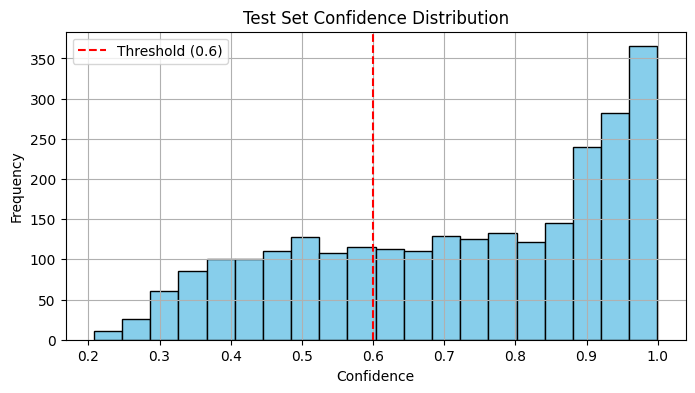

In [28]:
probs_test, preds_test, confidences_test, _, _ = evaluate_model(best_model, X_test_scaled, y_test_encoded)
plot_confidence_histogram(confidences_test, title='Test Set Confidence Distribution')

✅ Key Observations:
1. Model is Mostly Confident,
Most predictions fall between 0.7 and 1.0, especially near 0.95–1.0.

This suggests the model often feels strongly about its top prediction — a good sign of certainty in its decisions.

2. Smooth Distribution with Right Skew
There's a right skew, meaning the model tends to be more confident than uncertain.

This implies the training process was successful: the model has learned clear signal patterns across modalities.

3. ~1,000 Predictions Below Threshold
The area left of the 0.6 threshold line represents “flagged” predictions (≈1,010 samples from previous output).

These predictions are where the model struggles or is unsure — which is where your confidence filtering system becomes valuable.

4. Wide Confidence Range
The model has learned to express a range of certainties, rather than always defaulting to 0.99 — this shows good probability calibration.

# Demo Setup

In [34]:
from IPython.display import display, Video
import pandas as pd
import os
import torch
import numpy as np
from collections import defaultdict
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
import json
import warnings
warnings.filterwarnings('ignore')

# Ensure best_model, X_test_scaled, test_df, le, and device are defined before calling show_demo
# (These are expected based on the context provided)

def show_demo(index, df, X_scaled, video_dir, model):
    row = df.iloc[index]
    true_emotion = row['Emotion']
    dialogue_id = row['Dialogue_ID']
    utterance_id = row['Utterance_ID']
    text = row['Utterance']


    source_video_dir = '/content/drive/MyDrive/MELD.Raw/test/output_repeated_splits_test'
    video_filename = f"dia{dialogue_id}_utt{utterance_id}.mp4"
    video_path = os.path.join(source_video_dir, video_filename)

    # Display video
    print(f"🎞 Showing video: {video_filename}")
    # Added embed=True to correctly display the video from a local file path
    display(Video(video_path, width=320, embed=True))

    # Model inference
    # Ensure 'device' variable is defined (it's in Global Variables)
    x = torch.tensor(X_scaled[index], dtype=torch.float32).unsqueeze(0).to(device)
    best_model.eval() # Set model to evaluation mode
    with torch.no_grad(): # Disable gradient calculation
        logits = model(x)
    probs = torch.softmax(logits, dim=1).squeeze().cpu().numpy()

    # Ensure 'le' (LabelEncoder) variable is defined (it's in Global Variables)
    top1 = np.argmax(probs)
    # Ensure there are at least 2 classes to get top2
    if len(le.classes_) > 1:
        top2 = np.argsort(probs)[-2]
        ambiv_margin = probs[top1] - probs[top2]
    else:
        top2 = -1 # No second best if only one class
        ambiv_margin = 0.0 # No ambivalence if only one class

    confidence = probs[top1]

    pred_emotion = le.classes_[top1]

    # Flag logic
    low_conf_flag = confidence < 0.6
    # Check ambivalence only if there's more than one class
    ambiv_flag = False
    if len(le.classes_) > 1:
        ambiv_flag = ambiv_margin < 0.1


    # Display info
    print(f"\n🗣 Utterance: {text}")
    print(f"🎯 Predicted Emotion: {pred_emotion}")
    print(f"🔒 Confidence: {confidence:.3f}")
    # Only print ambivalence if applicable
    if len(le.classes_) > 1:
        print(f"🌀 Ambivalence Margin: {ambiv_margin:.3f}")
    print(f"✅ True Emotion: {true_emotion}")

    # Flags
    if low_conf_flag:
        print("⚠️ Low confidence prediction")
    if ambiv_flag:
        print("🌀 Ambivalent (Top-2 emotions too close)")

    # Show probability table
    prob_df = pd.DataFrame({
        'Emotion': le.classes_,
        'Probability': [f"{p:.2%}" for p in probs]
    }).sort_values(by='Probability', ascending=False)

    display(prob_df.reset_index(drop=True))

    # Human-readable emoji summary
    emoji_map = {
        'anger': '😠', 'disgust': '🤢', 'fear': '😨',
        'joy': '😄', 'neutral': '😐', 'sadness': '😢', 'surprise': '😲'
    }

    print("\n📋 Summary:")
    print(f"🎯 Prediction: {emoji_map.get(pred_emotion, '')} {pred_emotion} ({confidence:.1%} confidence)")
    print(f"✅ Ground Truth: {emoji_map.get(true_emotion, '')} {true_emotion}")
    if low_conf_flag:
        print("⚠️ Flagged: Low confidence")
    if ambiv_flag:
        print("🌀 Flagged: Ambivalent (emotion overlap)")

# Example usage
# Make sure best_model, X_test_scaled, and test_df are loaded/available
# The global variables indicate device, le, and model exist.
# Assuming X_test_scaled and test_df were loaded/created in previous steps.
show_demo(index=42,
          df=test_df,
          X_scaled=X_test_scaled,
          video_dir="/content/drive/MyDrive/MELD.Raw/test", # This is not the direct video file directory
          model=best_model) # Using the 'model' variable from global scope, assuming it's the best_model

🎞 Showing video: dia5_utt4.mp4



🗣 Utterance: No, please.
🎯 Predicted Emotion: neutral
🔒 Confidence: 0.620
🌀 Ambivalence Margin: 0.330
✅ True Emotion: neutral


,Emotion,Probability
0,neutral,62.04%
1,disgust,3.55%
2,sadness,29.08%
3,fear,2.56%
4,joy,1.78%
5,anger,0.88%
6,surprise,0.11%



📋 Summary:
🎯 Prediction: 😐 neutral (62.0% confidence)
✅ Ground Truth: 😐 neutral


In [35]:
# Save model to file
torch.save(best_model.state_dict(), "best_multimodal_model.pt")

In [39]:
content = '''
import numpy as np
import librosa
from transformers import BertTokenizer, BertModel
import torch
import cv2
import os
from torchvision import models, transforms
from moviepy.editor import VideoFileClip
import tempfile

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load models
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased").to(device)
resnet = models.resnet50(pretrained=True).to(device)
resnet.eval()

video_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

def extract_text_features(text):
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=128).to(device)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()

def extract_audio_features(video_path, n_mfcc=13):
    with tempfile.NamedTemporaryFile(delete=False, suffix=".wav") as tmp_audio:
        audio_path = tmp_audio.name
    try:
        video = VideoFileClip(video_path)
        video.audio.write_audiofile(audio_path, codec='pcm_s16le', verbose=False, logger=None)
        y, sr = librosa.load(audio_path, sr=22050)
        if len(y) == 0:
            return np.zeros(n_mfcc)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
        return np.mean(mfcc.T, axis=0)
    except Exception as e:
        return np.zeros(n_mfcc)

def extract_video_features(video_path, max_frames=10):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    indices = np.linspace(0, frame_count - 1, num=max_frames, dtype=np.int32)
    frames = []
    for idx in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if ret:
            img = video_transform(frame).unsqueeze(0).to(device)
            with torch.no_grad():
                features = resnet(img)
            frames.append(features.squeeze().cpu().numpy())
    cap.release()
    return np.mean(frames, axis=0) if frames else np.zeros(2048)

def extract_combined_features(video_path, text):
    text_feat = extract_text_features(text)
    audio_feat = extract_audio_features(video_path)
    video_feat = extract_video_features(video_path)
    return np.concatenate([text_feat, audio_feat, video_feat])
'''

In [40]:
with open('feature_extraction.py', 'w') as file:
    file.write(content)

print("The Python script has been successfully saved to 'feature_extraction.py'")

The Python script has been successfully saved to 'feature_extraction.py'


In [43]:
code_content = '''
import streamlit as st
import torch
import numpy as np
import tempfile
from model import MultimodalMLP
from feature_extraction import extract_combined_features
from sklearn.preprocessing import LabelEncoder

# Load label encoder
le = LabelEncoder()
le.classes_ = np.array(['anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness', 'surprise'])

# Load model
model = MultimodalMLP(input_dim=2829, num_classes=7)
model.load_state_dict(torch.load("best_multimodal_model.pt", map_location='cpu'))
model.eval()

# Emoji map
emoji_map = {
    'anger': '😠', 'disgust': '🤢', 'fear': '😨',
    'joy': '😄', 'neutral': '😐', 'sadness': '😢', 'surprise': '😲'
}

# UI
st.set_page_config(page_title="Multimodal Sentiment App", layout="centered")
st.title("🎬 Multimodal Sentiment Analyzer")
st.markdown("Upload a short video clip and enter the spoken text to detect emotion.")

uploaded_file = st.file_uploader("Upload .mp4 video", type=["mp4"])
text_input = st.text_input("Enter the spoken text (utterance)")

if uploaded_file is not None and text_input:
    with tempfile.NamedTemporaryFile(delete=False, suffix=".mp4") as tmp:
        tmp.write(uploaded_file.read())
        video_path = tmp.name

    st.video(video_path)

    st.info("Processing video, audio, and text features...")
    features = extract_combined_features(video_path, text_input)
    x = torch.tensor(features, dtype=torch.float32).unsqueeze(0)

    with torch.no_grad():
        logits = model(x)
        probs = torch.softmax(logits, dim=1).squeeze().numpy()

    top1 = np.argmax(probs)
    top2 = np.argsort(probs)[-2]
    confidence = probs[top1]
    margin = probs[top1] - probs[top2]
    pred_emotion = le.classes_[top1]

    # Display results
    st.success(f"🎯 Predicted Emotion: {emoji_map[pred_emotion]} {pred_emotion}")
    st.write(f"🔒 Confidence: `{confidence:.2%}`")
    st.write(f"🌀 Ambivalence Margin: `{margin:.2f}`")

    if confidence < 0.6:
        st.warning("⚠️ Low-confidence prediction")
    if margin < 0.1:
        st.warning("🌀 Ambivalent (emotion overlap)")

    st.subheader("📊 Full Emotion Probabilities")
    st.dataframe(
        {label: f"{probs[i]:.2%}" for i, label in enumerate(le.classes_)},
        use_container_width=True
    )

'''

In [44]:
with open('app.py', 'w') as file:
    file.write(code_content)

print("The Python script has been successfully saved to 'app.py'")

The Python script has been successfully saved to 'app.py'


In [45]:
code_model = '''
import torch.nn as nn
import torch.nn.functional as F

class MultimodalMLP(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(BetterMultimodalMLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.bn1 = nn.BatchNorm1d(1024)

        self.fc2 = nn.Linear(1024, 512)
        self.bn2 = nn.BatchNorm1d(512)

        self.fc3 = nn.Linear(512, 256)
        self.bn3 = nn.BatchNorm1d(256)

        self.fc4 = nn.Linear(256, 128)
        self.dropout = nn.Dropout(0.4)
        self.out = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.bn1(F.relu(self.fc1(x)))
        x = self.bn2(F.relu(self.fc2(x)))
        x = self.bn3(F.relu(self.fc3(x)))
        x = self.dropout(F.relu(self.fc4(x)))
        return self.out(x)
'''

In [46]:
with open('model.py', 'w') as file:
    file.write(code_model)

print("The Python script has been successfully saved to 'model.py'")

The Python script has been successfully saved to 'model.py'
